In [ ]:
!pip install facenet-pytorch keras librosa matplotlib numpy opencv-python \
pandas pillow pickle5 scipy seaborn tensorflow torch torchaudio \
torchvision transformers


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.1/132.1 kB 9.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 2.8 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of torchaudio to determine which version is compatible with other requirements. This could take a while.
INFO: pip is still looking at multiple versions of torchaudio to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 76.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 103.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 110.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 755.6/755.6 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 110.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━

In [ ]:
!git clone https://github.com/nubcico/EAV.git



Cloning into 'EAV'...
remote: Enumerating objects: 479, done.
remote: Counting objects: 100% (89/89), done.
remote: Compressing objects: 100% (65/65), done.
remote: Total 479 (delta 52), reused 24 (delta 24), pack-reused 390 (from 1)
Receiving objects: 100% (479/479), 306.29 MiB | 14.86 MiB/s, done.
Resolving deltas: 100% (135/135), done.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
import pickle
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim

from torch.utils.data import DataLoader, TensorDataset
from transformers import AutoModelForAudioClassification, ASTFeatureExtractor

#############################################################################
# 1) EAVDataSplit class with auto-adjust h_idx if a class is smaller
#############################################################################
class EAVDataSplit:
    def __init__(self, x, y):
        """
        x: numpy array of features
        y: numpy array of labels (0..4)
        """
        self.x = np.array(x)
        self.y = np.array(y)

    def _split_features_labels(self):
        feats_by_class = []
        labs_by_class  = []
        for c in range(5):
            mask_c = (self.y == c)
            feats_c = self.x[mask_c]
            labs_c  = self.y[mask_c]
            feats_by_class.append(feats_c)
            labs_by_class.append(labs_c)
        return feats_by_class, labs_by_class

    def get_split(self, h_idx=40):
        """
        If each class has ~80 samples, h_idx=40 => 40 train, 40 test.
        But if a given class only has N < h_idx, we'll do:
          - all N => train, 0 => test
        That way we won't end up with an empty test set across all classes,
        unless none of the classes have leftover for test.
        """
        feats, labs = self._split_features_labels()
        trainX_list, trainY_list = [], []
        testX_list,  testY_list  = [], []

        for c in range(5):
            cX = feats[c]
            cY = labs[c]
            N  = len(cX)
            if N == 0:
                # No samples for this class => skip
                continue

            # dynamic h_idx = min(h_idx, N) for train
            # leftover => test
            train_count = min(h_idx, N)
            test_count  = N - train_count

            trainX_list.append(cX[:train_count])
            trainY_list.append(cY[:train_count])
            if test_count > 0:
                testX_list.append(cX[train_count:])
                testY_list.append(cY[train_count:])

        if len(trainX_list) == 0 and len(testX_list) == 0:
            # No data at all
            return (np.array([]), np.array([]), np.array([]), np.array([]))

        # Concatenate across classes
        trainX = np.concatenate(trainX_list, axis=0) if trainX_list else np.array([])
        trainY = np.concatenate(trainY_list, axis=0) if trainY_list else np.array([])
        testX  = np.concatenate(testX_list,  axis=0) if testX_list  else np.array([])
        testY  = np.concatenate(testY_list,  axis=0) if testY_list  else np.array([])
        return trainX, trainY, testX, testY


#############################################################################
# 2) load_eav_data_split (with _aud, _eeg, _vis) + EAVDataSplit
#############################################################################
def load_eav_data_split(modality, subject, base_path, h_idx=40):
    """
    Example:
      load_eav_data_split('audio', 1, '/content/EAV/Input_images', h_idx=40)
      => tries /content/EAV/Input_images/Audio/subject_01_aud.pkl
         then does EAVDataSplit => (trainX,trainY,testX,testY).
    """
    suffix_map = {
        "audio": "_aud",
        "eeg":   "_eeg",
        "vis":   "_vis",
    }
    folder_map = {
        "audio": "Audio",
        "eeg":   "EEG",
        "vis":   "Vision",
    }
    suffix = suffix_map.get(modality, "_aud")
    folder = folder_map.get(modality, "Audio")

    file_name = f"subject_{subject:02d}{suffix}.pkl"
    file_path = os.path.join(base_path, folder, file_name)

    if not os.path.exists(file_path):
        print(f"[{modality.upper()}] No file for subject {subject:02d}: {file_path}")
        return None

    try:
        with open(file_path, "rb") as f:
            data_list = pickle.load(f)  # [X, Y]
    except (EOFError, pickle.UnpicklingError):
        print(f"[{modality.upper()}] Corrupted .pkl: {file_path}")
        return None

    X, Y = data_list[0], data_list[1]
    ds = EAVDataSplit(X, Y)
    trX, trY, teX, teY = ds.get_split(h_idx)
    return trX, trY, teX, teY


#############################################################################
# 3) Example AudioModelTrainer (AST)
#############################################################################
class AudioModelTrainer:
    def __init__(
        self,
        DATA,
        model_path="nielsr/audio-spectrogram-transformer-finetuned-audioset-10-10-0.4593",
        sub="",
        num_classes=5,
        weight_decay=1e-5,
        lr=0.001,
        batch_size=8
    ):
        [trX, trY, teX, teY] = DATA
        self.trX = self._feature_extract(trX)
        self.trY = trY
        self.teX = self._feature_extract(teX)
        self.teY = teY

        self.sub        = sub
        self.batch_size = batch_size

        self.loader_train = self._make_loader(self.trX, self.trY, shuffle=True)
        self.loader_test  = self._make_loader(self.teX, self.teY, shuffle=False)

        print(f"[AudioModelTrainer] Loading HF model: {model_path}")
        self.model = AutoModelForAudioClassification.from_pretrained(model_path)

        # Adjust final classification layer to have num_classes outputs
        if hasattr(self.model.classifier, "out_proj"):
            in_feats = self.model.classifier.out_proj.in_features
            self.model.classifier.out_proj = nn.Linear(in_feats, num_classes)
        elif hasattr(self.model.classifier, "dense"):
            in_feats = self.model.classifier.dense.in_features
            self.model.classifier.dense = nn.Linear(in_feats, num_classes)
        else:
            self.model.classifier = nn.Linear(768, num_classes)

        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.model.to(self.device)

        self.optimizer = optim.AdamW(self.model.parameters(), lr=lr, weight_decay=weight_decay)
        self.loss_fn   = nn.CrossEntropyLoss()
        self.outputs_test = None

    def _feature_extract(self, waveforms):
        """
        waveforms: shape [N, 80000], each 5s at 16k
        """
        extractor = ASTFeatureExtractor()
        feats = extractor(
            waveforms,
            sampling_rate=16000,
            max_length=80000,
            padding="max_length",
            truncation=True,
            return_tensors="pt"
        )
        return feats["input_values"]

    def _make_loader(self, x, y, shuffle=False):
        ds = TensorDataset(
            torch.tensor(x, dtype=torch.float32),
            torch.tensor(y, dtype=torch.long)
        )
        return DataLoader(ds, batch_size=self.batch_size, shuffle=shuffle)

    def train(self, epochs=10, lr=None, freeze=True):
        if lr is not None:
            for g in self.optimizer.param_groups:
                g['lr'] = lr

        # If multiple GPUs
        if isinstance(self.model, nn.DataParallel):
            self.model = self.model.module

        # Freeze/unfreeze entire model except final classifier
        for p in self.model.parameters():
            p.requires_grad = not freeze
        if hasattr(self.model.classifier, "parameters"):
            for p in self.model.classifier.parameters():
                p.requires_grad = True

        if torch.cuda.device_count() > 1:
            self.model = nn.DataParallel(self.model)

        for epoch in range(1, epochs+1):
            # TRAIN
            self.model.train()
            correct_tr, total_tr = 0,0
            for xb,yb in self.loader_train:
                xb,yb = xb.to(self.device), yb.to(self.device)
                self.optimizer.zero_grad()
                out = self.model(xb)
                logits = out.logits
                loss = self.loss_fn(logits, yb)
                loss.backward()
                self.optimizer.step()

                preds = torch.argmax(logits,dim=-1)
                correct_tr += (preds==yb).sum().item()
                total_tr   += yb.size(0)
            train_acc = correct_tr/total_tr if total_tr>0 else 0

            # TEST
            self.model.eval()
            correct_te, total_te= 0,0
            out_batches = []
            with torch.no_grad():
                for xb,yb in self.loader_test:
                    xb,yb = xb.to(self.device), yb.to(self.device)
                    out_test = self.model(xb)
                    logits_te= out_test.logits
                    preds_te = torch.argmax(logits_te,dim=-1)
                    correct_te+=(preds_te==yb).sum().item()
                    total_te  += yb.size(0)
                    out_batches.append(logits_te.cpu().numpy())

            test_acc = correct_te/total_te if total_te>0 else 0
            if (epoch==epochs) and (not freeze) and (total_te>0):
                self.outputs_test = np.concatenate(out_batches,axis=0)

            print(f"{self.sub}|Ep{epoch}/{epochs}|freeze={freeze}|"
                  f"TrAcc={train_acc*100:.1f}%|TeAcc={test_acc*100:.1f}%")

#############################################################################
# 4) EEG + Vision stubs
#############################################################################
def train_transformer_eeg(tr_x, tr_y, te_x, te_y, subject):
    # Placeholder, replace with your real EEG code.
    print(f"[EEG] Subject {subject}: training placeholder. "
          f"TrainX={tr_x.shape}, TestX={te_x.shape}")
    # ...
    return 0.0

def train_transformer_vision(tr_x, tr_y, te_x, te_y, subject):
    # Placeholder, replace with your real Vision code.
    print(f"[VISION] Subject {subject}: training placeholder. "
          f"TrainX={tr_x.shape}, TestX={te_x.shape}")
    # ...
    return None

#############################################################################
# 5) Main experiment
#############################################################################
if __name__ == "__main__":
    # e.g. /content/EAV/Input_images => has subfolders Audio/, EEG/, Vision/
    base_path = "/content/drive/MyDrive/kk/Input_images"

    # Use ~70/30 => h_idx=56 if you have 80 samples per class
    # If data < 80, the code auto-adjusts. If test=0, we'll skip training.
    H_IDX = 56

    # Toggle each modality
    DO_AUDIO  = True
    DO_EEG    = True
    DO_VISION = True

    # Collect results
    audio_logs  = []
    eeg_acc_all = []
    vis_outputs = []

    for sub in range(1,43):
        print(f"\n== Subject {sub:02d} ==\n")

        # AUDIO
        if DO_AUDIO:
            audio_data = load_eav_data_split('audio', sub, base_path, H_IDX)
            if audio_data is None:
                print(f"[AUDIO] No data for subject {sub}.")
            else:
                trX, trY, teX, teY = audio_data
                print(f"[AUDIO] shapes: trainX={trX.shape}, trainY={trY.shape}, "
                      f"testX={teX.shape}, testY={teY.shape}")
                if len(teX)==0:
                    print(f"[AUDIO] Subject {sub} => test is empty => skipping training.")
                else:
                    logs = train_transformer_audio(trX, trY, teX, teY, sub)
                    audio_logs.append(logs)

        # EEG
        if DO_EEG:
            eeg_data = load_eav_data_split('eeg', sub, base_path, H_IDX)
            if eeg_data is None:
                print(f"[EEG] No data for subject {sub}.")
            else:
                trX, trY, teX, teY = eeg_data
                print(f"[EEG] shapes: trainX={trX.shape}, trainY={trY.shape}, "
                      f"testX={teX.shape}, testY={teY.shape}")
                if len(teX)==0:
                    print(f"[EEG] Subject {sub} => test is empty => skipping.")
                else:
                    acc = train_transformer_eeg(trX, trY, teX, teY, sub)
                    eeg_acc_all.append(acc)

        # VISION
        if DO_VISION:
            vis_data = load_eav_data_split('vis', sub, base_path, H_IDX)
            if vis_data is None:
                print(f"[VISION] No data for subject {sub}.")
            else:
                trX, trY, teX, teY = vis_data
                print(f"[VISION] shapes: trainX={trX.shape}, trainY={trY.shape}, "
                      f"testX={teX.shape}, testY={teY.shape}")
                if len(teX)==0:
                    print(f"[VISION] Subject {sub} => test empty => skipping.")
                else:
                    out = train_transformer_vision(trX, trY, teX, teY, sub)
                    vis_outputs.append(out)

    print("\n=== DONE ALL SUBJECTS ===")
    if DO_EEG and len(eeg_acc_all) > 0:
        avg_eeg = np.mean(eeg_acc_all)
        print(f"Avg EEG Acc = {avg_eeg*100:.2f}%")



== Subject 01 ==

[AUDIO] shapes: trainX=(280, 80000), trainY=(280,), testX=(0,), testY=(0,)
[AUDIO] Subject 1 => test is empty => skipping training.
[EEG] shapes: trainX=(280, 30, 500), trainY=(280,), testX=(0,), testY=(0,)
[EEG] Subject 1 => test is empty => skipping.
[VISION] shapes: trainX=(280, 25, 56, 56, 3), trainY=(280,), testX=(0,), testY=(0,)
[VISION] Subject 1 => test empty => skipping.

== Subject 02 ==

[AUDIO] shapes: trainX=(280, 80000), trainY=(280,), testX=(0,), testY=(0,)
[AUDIO] Subject 2 => test is empty => skipping training.
[EEG] shapes: trainX=(280, 30, 500), trainY=(280,), testX=(0,), testY=(0,)
[EEG] Subject 2 => test is empty => skipping.
[VISION] shapes: trainX=(280, 25, 56, 56, 3), trainY=(280,), testX=(0,), testY=(0,)
[VISION] Subject 2 => test empty => skipping.

== Subject 03 ==

[AUDIO] shapes: trainX=(280, 80000), trainY=(280,), testX=(0,), testY=(0,)
[AUDIO] Subject 3 => test is empty => skipping training.
[EEG] shapes: trainX=(280, 30, 500), trainY=(

KeyboardInterrupt: 

In [ ]:
from transformers import AutoModelForAudioClassification

model = AutoModelForAudioClassification.from_pretrained(
    "nielsr/audio-spectrogram-transformer-finetuned-audioset-10-10-0.4593"
)


OSError: nielsr/audio-spectrogram-transformer-finetuned-audioset-10-10-0.4593 is not a local folder and is not a valid model identifier listed on 'https://huggingface.co/models'
If this is a private repository, make sure to pass a token having permission to this repo either by logging in with `huggingface-cli login` or by passing `token=<your_token>`

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from transformers import AutoModelForAudioClassification
from torch.utils.data import DataLoader, TensorDataset
from transformers import ASTFeatureExtractor
import numpy as np

class AudioModelTrainer:
    def __init__(self, DATA, model_path, sub = '', num_classes=5, weight_decay=1e-5, lr=0.001, batch_size=128):

        self.tr, self.tr_y, self.te, self.te_y = DATA
        self.tr_x = self._feature_extract(self.tr)
        self.te_x = self._feature_extract(self.te)

        self.sub = sub
        self.batch_size = batch_size

        self.train_dataloader = self._prepare_dataloader(self.tr_x, self.tr_y, shuffle=True)
        self.test_dataloader = self._prepare_dataloader(self.te_x, self.te_y, shuffle=False)

        self.model = AutoModelForAudioClassification.from_pretrained(model_path)
        # Modify classifier to fit the number of classes
        self.model.classifier.dense = torch.nn.Linear(self.model.classifier.dense.in_features, num_classes)

        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.model = self.model.to(self.device)

        # Setup optimizer and loss function
        self.initial_lr = lr
        self.optimizer = optim.AdamW(self.model.parameters(), lr=self.initial_lr)
        self.loss_fn = nn.CrossEntropyLoss()

    def _prepare_dataloader(self, x, y, shuffle=False):
        dataset = TensorDataset(torch.tensor(x, dtype=torch.float32), torch.tensor(y, dtype=torch.long))
        dataloader = DataLoader(dataset, batch_size=self.batch_size, shuffle=shuffle)
        return dataloader

    def _feature_extract(self, x):
        feature_extractor = ASTFeatureExtractor()
        ft = feature_extractor(x, sampling_rate=16000, padding='max_length',
                               return_tensors='pt')
        return ft['input_values']

    def train(self, epochs=20, lr=None, freeze=True):
        lr = lr if lr is not None else self.initial_lr
        if lr is not None:
            for param_group in self.optimizer.param_groups:
                param_group['lr'] = lr

        if isinstance(self.model, nn.DataParallel):
            self.model = self.model.module
        # Freeze or unfreeze model parameters based on the freeze flag
        for param in self.model.parameters():
            param.requires_grad = not freeze
        for param in self.model.classifier.parameters():
            param.requires_grad = True

        # Wrap the model with DataParallel
        if torch.cuda.device_count() > 1:
            self.model = nn.DataParallel(self.model)

        for epoch in range(epochs):
            self.model.train()
            train_correct, train_total = 0, 0

            total_batches = len(self.train_dataloader)
            for batch_idx, batch in enumerate(self.train_dataloader, start=1):
                #print(f'batch ({batch_idx}/{total_batches})')

                x, t = [b.to(self.device) for b in batch]
                self.optimizer.zero_grad()
                logits = self.model(x).logits
                loss = self.loss_fn(logits, t)
                if loss.dim() > 0:
                    loss = loss.mean()
                else:
                    loss = loss
                loss.backward()
                self.optimizer.step()

                train_correct += (logits.argmax(dim=-1) == t).sum().item()
                train_total += t.size(0)
            train_accuracy = train_correct / train_total

            self.model.eval()
            correct, total = 0, 0
            outputs_batch = []
            with torch.no_grad():
                for x, t in self.test_dataloader:
                    x, t = x.to(self.device), t.long().to(self.device)
                    logits = self.model(x).logits
                    correct += (logits.argmax(dim=-1) == t).sum().item()
                    total += t.size(0)

                    logits_cpu = logits.detach().cpu().numpy()
                    outputs_batch.append(logits_cpu)
                test_accuracy = correct / total
            if epoch == epochs-1 and not freeze: # we saved test prediction only at last epoch, and finetuning
                self.outputs_test = np.concatenate(outputs_batch, axis=0)

            print(f"Epoch {epoch + 1}/{epochs}, Training Accuracy: {train_accuracy * 100:.2f}%, Test Accuracy: {test_accuracy * 100:.2f}%")
            with open('training_performance_audio.txt', 'a') as f:
                f.write(f"{self.sub}, Epoch {epoch + 1}, Test Accuracy: {test_accuracy * 100:.2f}%\n")




import numpy as np
import torch
from torch.utils.data import TensorDataset
from torch.utils.data import DataLoader


class EAVDataSplit:
    def __init__(self, x, y, batch_size=32):
        self.x = np.array(x)
        self.y = np.array(y)
        self.batch_size = batch_size
    def _split_features_labels(self):
        # Splitting features and labels based on class, select each 80 samples per class in order
        features = []
        labels = []
        for class_idx in range(5):  # Assuming there are 5 classes
            class_mask = np.where(self.y == class_idx)
            class_features = self.x[class_mask]
            class_labels = self.y[class_mask]

            features.append(class_features)
            labels.append(class_labels)

        return features, labels

    def get_split(self, h_idx=40): # update it if you want to use different ratio here we have 50/50
        [features, labels] = self._split_features_labels()
        # Splitting into training and testing
        train_features = np.concatenate([cls_features[:h_idx] for cls_features in features], axis=0)
        test_features = np.concatenate([cls_features[h_idx:] for cls_features in features], axis=0)
        train_labels = np.concatenate([cls_labels[:h_idx] for cls_labels in labels], axis=0)
        test_labels = np.concatenate([cls_labels[h_idx:] for cls_labels in labels], axis=0)

        #
        train_features = np.squeeze(train_features)
        test_features = np.squeeze(test_features)
        train_labels = train_labels
        test_labels = test_labels

        return train_features, train_labels, test_features, test_labels

    def get_loaders(self):
        self._split_features_labels()
        train_features, train_labels, test_features, test_labels = self.get_split()

        train_features = torch.Tensor(np.squeeze(train_features))
        test_features = torch.Tensor(np.squeeze(test_features))
        train_labels = torch.Tensor(train_labels).long()  # Using .long() for labels
        test_labels = torch.Tensor(test_labels).long()

        # Creating TensorDatasets and DataLoaders
        train_dataset = TensorDataset(train_features, train_labels)
        test_dataset = TensorDataset(test_features, test_labels)

        loader_train = DataLoader(train_dataset, batch_size=self.batch_size, shuffle=True)
        loader_test = DataLoader(test_dataset, batch_size=self.batch_size, shuffle=False)

        return loader_train, loader_test

'''
# 50/50 in sequential order, straight forward codes without loops
def EAV_train_test(x, y):
    c1 = np.where(np.array(y) == 0)
    c2 = np.where(np.array(y) == 1)
    c3 = np.where(np.array(y) == 2)
    c4 = np.where(np.array(y) == 3)
    c5 = np.where(np.array(y) == 4)
    # (400, 1, 1024, 128), np.array(feature)
    f1 = np.array(x)[c1]
    f2 = np.array(x)[c2]
    f3 = np.array(x)[c3]
    f4 = np.array(x)[c4]
    f5 = np.array(x)[c5]

    h_idx = 40
    train_features = np.concatenate((f1[:h_idx], f2[:h_idx], f3[:h_idx], f4[:h_idx], f5[:h_idx]), axis=0)
    test_features = np.concatenate((f1[h_idx:], f2[h_idx:], f3[h_idx:], f4[h_idx:], f5[h_idx:]), axis=0)
    train_features = torch.Tensor(np.squeeze(train_features))
    test_features = torch.Tensor(np.squeeze(test_features))

    # do this to the label as well
    c1 = np.where(np.array(y) == 0)
    c2 = np.where(np.array(y) == 1)
    c3 = np.where(np.array(y) == 2)
    c4 = np.where(np.array(y) == 3)
    c5 = np.where(np.array(y) == 4)
    # (400, 1, 1024, 128), np.array(feature)
    l1 = np.array(y)[c1]
    l2 = np.array(y)[c2]
    l3 = np.array(y)[c3]
    l4 = np.array(y)[c4]
    l5 = np.array(y)[c5]

    train_labels = np.concatenate((l1[:h_idx], l2[:h_idx], l3[:h_idx], l4[:h_idx], l5[:h_idx]), axis=0)
    test_labels = np.concatenate((l1[h_idx:], l2[h_idx:], l3[h_idx:], l4[h_idx:], l5[h_idx:]), axis=0)
    train_labels = torch.Tensor(train_labels)
    test_labels = torch.Tensor(test_labels)

    train_dataset = TensorDataset(train_features, train_labels)
    test_dataset = TensorDataset(test_features, test_labels)

    loader_train = DataLoader(train_dataset, batch_size=32, shuffle=True)
    loader_test = DataLoader(test_dataset, batch_size=32, shuffle=True)
    return loader_train, loader_test
'''



'\n# 50/50 in sequential order, straight forward codes without loops\ndef EAV_train_test(x, y):\n    c1 = np.where(np.array(y) == 0)\n    c2 = np.where(np.array(y) == 1)\n    c3 = np.where(np.array(y) == 2)\n    c4 = np.where(np.array(y) == 3)\n    c5 = np.where(np.array(y) == 4)\n    # (400, 1, 1024, 128), np.array(feature)\n    f1 = np.array(x)[c1]\n    f2 = np.array(x)[c2]\n    f3 = np.array(x)[c3]\n    f4 = np.array(x)[c4]\n    f5 = np.array(x)[c5]\n\n    h_idx = 40\n    train_features = np.concatenate((f1[:h_idx], f2[:h_idx], f3[:h_idx], f4[:h_idx], f5[:h_idx]), axis=0)\n    test_features = np.concatenate((f1[h_idx:], f2[h_idx:], f3[h_idx:], f4[h_idx:], f5[h_idx:]), axis=0)\n    train_features = torch.Tensor(np.squeeze(train_features))\n    test_features = torch.Tensor(np.squeeze(test_features))\n\n    # do this to the label as well\n    c1 = np.where(np.array(y) == 0)\n    c2 = np.where(np.array(y) == 1)\n    c3 = np.where(np.array(y) == 2)\n    c4 = np.where(np.array(y) == 3)\n 

In [ ]:
import sys

# Update this path with your actual folder path
sys.path.append('/content/drive/MyDrive/Transformer_torch')
import importlib
importlib.reload(Transformer_Audio)
importlib.reload(Transformer_EEG)
importlib.reload(Transformer_Vision)


NameError: name 'Transformer_Audio' is not defined

In [ ]:
import os
import pickle
import numpy as np
import torch

#############################################################################
# 1) EAVDataSplit - for splitting each class's 80 samples by index
#############################################################################
class EAVDataSplit:
    def __init__(self, x, y):
        self.x = np.array(x)
        self.y = np.array(y)

    def _split_features_labels(self):
        # We assume 5 classes (0..4).
        features_by_class = []
        labels_by_class   = []
        for class_idx in range(5):
            mask = (self.y == class_idx)
            x_c  = self.x[mask]
            y_c  = self.y[mask]
            features_by_class.append(x_c)
            labels_by_class.append(y_c)
        return features_by_class, labels_by_class

    def get_split(self, h_idx=40):
        # If each class has 80 samples, h_idx=40 => 40 train, 40 test
        feats, labs = self._split_features_labels()
        trainX_list, trainY_list = [], []
        testX_list,  testY_list  = [], []
        for c in range(5):
            clsX = feats[c]
            clsY = labs[c]
            trainX_list.append(clsX[:h_idx])
            trainY_list.append(clsY[:h_idx])
            testX_list.append(clsX[h_idx:])
            testY_list.append(clsY[h_idx:])

        trainX = np.concatenate(trainX_list, axis=0) if trainX_list else np.array([])
        trainY = np.concatenate(trainY_list, axis=0) if trainY_list else np.array([])
        testX  = np.concatenate(testX_list,  axis=0) if testX_list  else np.array([])
        testY  = np.concatenate(testY_list,  axis=0) if testY_list  else np.array([])
        return trainX, trainY, testX, testY


#############################################################################
# 2) A helper: load pre-extracted .pkl & EAVDataSplit => (tr_x,tr_y,te_x,te_y)
#############################################################################
def load_eav_data_split(modality, subject, base_path, h_idx=40):
    """
    This function tries to find the .pkl for a given subject & modality,
    loads X, Y, then does EAVDataSplit (like 50/50 if h_idx=40).

    ***IMPORTANT***
    If your actual file is named subject_01_aud.pkl instead of subject_01_audio.pkl,
    edit MODALITY_MAP below so 'audio' -> '_aud'.
    """
    # If your real suffix is _aud, _vis, _eeg, adjust here:
    MODALITY_MAP = {
        'audio': '_aud',    # or '_audio'
        'eeg':   '_eeg',
        'vis':   '_vis'
    }

    # Build the actual .pkl filename
    suffix = MODALITY_MAP[modality]
    folder_map = {'audio':'Audio', 'eeg':'EEG', 'vis':'Vision'}
    folder  = folder_map[modality]
    pklname = f"subject_{subject:02d}{suffix}.pkl"
    file_   = os.path.join(base_path, folder, pklname)

    # Attempt to load
    if not os.path.exists(file_):
        print(f"[{modality.upper()}] No .pkl for subject {subject:02d}: {file_}")
        return None

    try:
        with open(file_, 'rb') as f:
            data_list = pickle.load(f)  # e.g. [X, Y], or [waveforms, labels]
    except (EOFError, pickle.UnpicklingError):
        print(f"[{modality.upper()}] Corrupted .pkl: {file_}")
        return None

    # data_list should be [X, Y]
    X, Y = data_list[0], data_list[1]

    # Now do the EAVDataSplit
    ds = EAVDataSplit(X, Y)
    tr_x, tr_y, te_x, te_y = ds.get_split(h_idx)
    return tr_x, tr_y, te_x, te_y


#############################################################################
# 3) Our audio/EEG/vision trainers (stubs from earlier)
#############################################################################
def train_transformer_audio(tr_x, tr_y, te_x, te_y, subject):
    """
    Example: train AST on waveforms ~ 5s.
    Replace with your own AudioModelTrainer code if needed.
    """
    from Transformer_torch import Transformer_Audio  # or local import
    data = [tr_x, tr_y, te_x, te_y]
    mod_path = "nielsr/audio-spectrogram-transformer-finetuned-audioset-10-10-0.4593"
    trainer = Transformer_Audio.AudioModelTrainer(
        data, model_path=mod_path,
        sub=f"Subject_{subject}",
        num_classes=5,
        weight_decay=1e-5,
        lr=0.005,
        batch_size=8
    )
    # freeze pass
    trainer.train(epochs=10, lr=5e-4, freeze=True)
    # unfreeze pass
    trainer.train(epochs=15, lr=5e-6, freeze=False)
    return trainer.outputs_test

def train_transformer_eeg(tr_x, tr_y, te_x, te_y, subject):
    from Transformer_torch import Transformer_EEG
    data = [tr_x, tr_y, te_x, te_y]
    model = Transformer_EEG.EEGClassificationModel(eeg_channel=30)
    trainer = Transformer_EEG.EEGModelTrainer(data, model=model, lr=0.001, batch_size=64)
    trainer.train(epochs=100, lr=None, freeze=False)
    acc, preds = trainer.evaluate()
    print(f"[EEG] Subject {subject}, accuracy: {acc*100:.2f}%")
    return acc

def train_transformer_vision(tr_x, tr_y, te_x, te_y, subject):
    from Transformer_torch import Transformer_Vision
    import os
    data = [tr_x, tr_y, te_x, te_y]
    mod_path = os.path.join(os.getcwd(), 'facial_emotions_image_detection')
    trainer = Transformer_Vision.ImageClassifierTrainer(
        data,
        model_path=mod_path,
        sub=f"Subject_{subject}",
        num_labels=5,
        lr=5e-5,
        batch_size=128
    )
    trainer.train(epochs=10, lr=5e-4, freeze=True)
    trainer.train(epochs=5, lr=5e-6, freeze=False)
    return trainer.outputs_test


#############################################################################
# 4) Main experiment script
#############################################################################
if __name__ == "__main__":
    base_path = "/content/drive/MyDrive/kk/Input_images"

    DO_AUDIO  = True
    DO_EEG    = True
    DO_VISION = True

    audio_logs  = []
    eeg_acc_all = []
    vis_outputs = []

    for sub in range(1, 43):
        print(f"\n=== Subject {sub:02d} ===")

        # A) AUDIO
        if DO_AUDIO:
            aud_data = load_eav_data_split('audio', sub, base_path, h_idx=56)
            if aud_data is not None:
                tr_x, tr_y, te_x, te_y = aud_data
                print(f"[AUDIO] shapes: trainX={tr_x.shape}, trainY={tr_y.shape}, testX={te_x.shape}, testY={te_y.shape}")
                # If test is empty => skip
                if len(te_x) == 0:
                    print(f"[AUDIO] Subject {sub} => 0 test samples => skipping.")
                else:
                    logs = train_transformer_audio(tr_x, tr_y, te_x, te_y, sub)
                    audio_logs.append(logs)
            else:
                print(f"[AUDIO] no data for subject {sub} or file missing.")

        # B) EEG
        if DO_EEG:
            eeg_data = load_eav_data_split('eeg', sub, base_path, h_idx=56)
            if eeg_data is not None:
                tr_x, tr_y, te_x, te_y = eeg_data
                print(f"[EEG] shapes: trainX={tr_x.shape}, trainY={tr_y.shape}, testX={te_x.shape}, testY={te_y.shape}")
                if len(te_x) == 0:
                    print(f"[EEG] Subject {sub} => 0 test samples => skipping.")
                else:
                    acc = train_transformer_eeg(tr_x, tr_y, te_x, te_y, sub)
                    eeg_acc_all.append(acc)
            else:
                print(f"[EEG] no data for subject {sub} or file missing.")

        # C) VISION
        if DO_VISION:
            vis_data = load_eav_data_split('vis', sub, base_path, h_idx=56)
            if vis_data is not None:
                tr_x, tr_y, te_x, te_y = vis_data
                print(f"[VISION] shapes: trainX={tr_x.shape}, trainY={tr_y.shape}, testX={te_x.shape}, testY={te_y.shape}")
                if len(te_x) == 0:
                    print(f"[VISION] Subject {sub} => 0 test samples => skipping.")
                else:
                    out = train_transformer_vision(tr_x, tr_y, te_x, te_y, sub)
                    vis_outputs.append(out)
            else:
                print(f"[VISION] no data for subject {sub} or file missing.")

    print("\n=== DONE ALL SUBJECTS ===")
    if DO_EEG and len(eeg_acc_all) > 0:
        avg_eeg = np.mean(eeg_acc_all)
        print(f"Avg EEG accuracy over {len(eeg_acc_all)} subjects: {avg_eeg*100:.2f}%")



=== Subject 01 ===
[AUDIO] shapes: trainX=(280, 80000), trainY=(280,), testX=(0, 80000), testY=(0,)
[AUDIO] Subject 1 => 0 test samples => skipping.
[EEG] shapes: trainX=(280, 30, 500), trainY=(280,), testX=(0, 30, 500), testY=(0,)
[EEG] Subject 1 => 0 test samples => skipping.
[VISION] shapes: trainX=(280, 25, 56, 56, 3), trainY=(280,), testX=(0, 25, 56, 56, 3), testY=(0,)
[VISION] Subject 1 => 0 test samples => skipping.

=== Subject 02 ===
[AUDIO] shapes: trainX=(280, 80000), trainY=(280,), testX=(0, 80000), testY=(0,)
[AUDIO] Subject 2 => 0 test samples => skipping.
[EEG] shapes: trainX=(280, 30, 500), trainY=(280,), testX=(0, 30, 500), testY=(0,)
[EEG] Subject 2 => 0 test samples => skipping.
[VISION] shapes: trainX=(280, 25, 56, 56, 3), trainY=(280,), testX=(0, 25, 56, 56, 3), testY=(0,)
[VISION] Subject 2 => 0 test samples => skipping.

=== Subject 03 ===
[AUDIO] shapes: trainX=(280, 80000), trainY=(280,), testX=(0, 80000), testY=(0,)
[AUDIO] Subject 3 => 0 test samples => skip

KeyboardInterrupt: 

In [ ]:
import os
import pickle
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim

from torch.utils.data import DataLoader, TensorDataset
from transformers import AutoModelForAudioClassification, ASTFeatureExtractor

#############################################################################
# 1) EAVDataSplit class: splits each class's ~80 samples by index
#############################################################################
class EAVDataSplit:
    def __init__(self, x, y):
        self.x = np.array(x)
        self.y = np.array(y)

    def _split_features_labels(self):
        # We assume 5 emotion classes: 0..4
        feats_by_class = []
        labs_by_class  = []
        for c in range(5):
            mask_c = (self.y == c)
            feats_by_class.append(self.x[mask_c])
            labs_by_class.append(self.y[mask_c])
        return feats_by_class, labs_by_class

    def get_split(self, h_idx=40):
        """
        h_idx=40 => each class's first 40 => train, remainder => test.
        Adjust if you want 56 => ~70/30, etc.
        Returns (trainX, trainY, testX, testY).
        """
        feats, labs = self._split_features_labels()
        trX_list, trY_list = [], []
        teX_list, teY_list = [], []
        for c in range(5):
            cX = feats[c]
            cY = labs[c]
            trX_list.append(cX[:h_idx])
            trY_list.append(cY[:h_idx])
            teX_list.append(cX[h_idx:])
            teY_list.append(cY[h_idx:])
        if len(trX_list) == 0:
            return (np.array([]), np.array([]), np.array([]), np.array([]))

        trainX = np.concatenate(trX_list, axis=0)
        trainY = np.concatenate(trY_list, axis=0)
        testX  = np.concatenate(teX_list,  axis=0)
        testY  = np.concatenate(teY_list,  axis=0)
        return trainX, trainY, testX, testY

#############################################################################
# 2) load_eav_data_split: loads your subject_{XX}_aud.pkl (or _eeg/_vis) + splits
#############################################################################
def load_eav_data_split(modality, subject, base_path, h_idx=40):
    """
    Looks for:
      - if modality='audio', file name => subject_{XX}_aud.pkl in base_path/Audio
      - if modality='eeg',   => subject_{XX}_eeg.pkl in base_path/EEG
      - if modality='vis',   => subject_{XX}_vis.pkl in base_path/Vision
    Then uses EAVDataSplit to do (trainX,trainY,testX,testY).
    """
    suffix_map = {
        "audio": "_aud",
        "eeg":   "_eeg",
        "vis":   "_vis",
    }
    folder_map = {
        "audio": "Audio",
        "eeg":   "EEG",
        "vis":   "Vision",
    }
    suffix = suffix_map.get(modality)
    folder = folder_map.get(modality)
    if suffix is None:
        print(f"[load_eav_data_split] Unknown modality {modality}")
        return None

    file_name = f"subject_{subject:02d}{suffix}.pkl"
    file_path = os.path.join(base_path, folder, file_name)

    if not os.path.exists(file_path):
        print(f"[{modality.upper()}] No .pkl for subject {subject:02d}: {file_path}")
        return None

    try:
        with open(file_path, "rb") as f:
            data_list = pickle.load(f)  # Should be [X, Y] => waveforms or EEG or images + labels
    except (EOFError, pickle.UnpicklingError):
        print(f"[{modality.upper()}] Corrupted .pkl: {file_path}")
        return None

    X, Y = data_list[0], data_list[1]
    ds = EAVDataSplit(X, Y)
    tr_x, tr_y, te_x, te_y = ds.get_split(h_idx=h_idx)
    return tr_x, tr_y, te_x, te_y

#############################################################################
# 3) AudioModelTrainer example (AST)
#############################################################################
class AudioModelTrainer:
    def __init__(
        self,
        DATA,
        model_path="nielsr/audio-spectrogram-transformer-finetuned-audioset-10-10-0.4593",
        sub="",
        num_classes=5,
        weight_decay=1e-5,
        lr=0.001,
        batch_size=8
    ):
        [trX, trY, teX, teY] = DATA
        self.trX = self._feature_extract(trX)
        self.trY = trY
        self.teX = self._feature_extract(teX)
        self.teY = teY

        self.sub        = sub
        self.batch_size = batch_size

        self.loader_train = self._make_loader(self.trX, self.trY, shuffle=True)
        self.loader_test  = self._make_loader(self.teX, self.teY, shuffle=False)

        print(f"[AudioModelTrainer] Loading HF model: {model_path}")
        self.model = AutoModelForAudioClassification.from_pretrained(model_path)

        # Adjust final classification layer to have num_classes outputs
        if hasattr(self.model.classifier, "out_proj"):
            in_feats = self.model.classifier.out_proj.in_features
            self.model.classifier.out_proj = nn.Linear(in_feats, num_classes)
        elif hasattr(self.model.classifier, "dense"):
            in_feats = self.model.classifier.dense.in_features
            self.model.classifier.dense = nn.Linear(in_feats, num_classes)
        else:
            self.model.classifier = nn.Linear(768, num_classes)

        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.model.to(self.device)

        self.optimizer = optim.AdamW(self.model.parameters(), lr=lr, weight_decay=weight_decay)
        self.loss_fn   = nn.CrossEntropyLoss()
        self.outputs_test = None

    def _feature_extract(self, waveforms):
        """
        waveforms: shape [N, 80000], each is 5s at 16k
        """
        extractor = ASTFeatureExtractor()
        feats = extractor(
            waveforms,
            sampling_rate=16000,
            max_length=80000,
            padding="max_length",
            truncation=True,
            return_tensors="pt"
        )
        return feats["input_values"]

    def _make_loader(self, x, y, shuffle=False):
        ds = TensorDataset(
            torch.tensor(x, dtype=torch.float32),
            torch.tensor(y, dtype=torch.long)
        )
        return DataLoader(ds, batch_size=self.batch_size, shuffle=shuffle)

    def train(self, epochs=10, lr=None, freeze=True):
        if lr is not None:
            for g in self.optimizer.param_groups:
                g['lr'] = lr

        # If multiple GPUs
        if isinstance(self.model, nn.DataParallel):
            self.model = self.model.module

        # Freeze/unfreeze entire model except final classifier
        for p in self.model.parameters():
            p.requires_grad = not freeze

        if hasattr(self.model.classifier, "parameters"):
            for p in self.model.classifier.parameters():
                p.requires_grad = True

        if torch.cuda.device_count() > 1:
            self.model = nn.DataParallel(self.model)

        for epoch in range(1, epochs+1):
            # TRAIN
            self.model.train()
            correct_tr, total_tr = 0,0
            for xb,yb in self.loader_train:
                xb,yb = xb.to(self.device), yb.to(self.device)
                self.optimizer.zero_grad()
                out = self.model(xb)
                logits = out.logits
                loss = self.loss_fn(logits, yb)
                loss.backward()
                self.optimizer.step()

                preds = torch.argmax(logits,dim=-1)
                correct_tr += (preds==yb).sum().item()
                total_tr   += yb.size(0)
            train_acc = correct_tr / total_tr if total_tr>0 else 0

            # TEST
            self.model.eval()
            correct_te, total_te = 0,0
            out_batches = []
            with torch.no_grad():
                for xb,yb in self.loader_test:
                    xb,yb = xb.to(self.device), yb.to(self.device)
                    out_test = self.model(xb)
                    logits_te= out_test.logits
                    preds_te = torch.argmax(logits_te, dim=-1)
                    correct_te += (preds_te==yb).sum().item()
                    total_te   += yb.size(0)
                    out_batches.append(logits_te.cpu().numpy())
            test_acc = correct_te / total_te if total_te>0 else 0

            # Store final test outputs only in last epoch if unfreezing
            if (epoch==epochs) and (not freeze) and total_te>0:
                self.outputs_test = np.concatenate(out_batches,axis=0)

            print(f"{self.sub}|Ep {epoch}/{epochs}|freeze={freeze}|TrAcc={train_acc*100:.2f}%|TeAcc={test_acc*100:.2f}%")

#############################################################################
# 4) Stub for EEG & Vision training
#############################################################################
def train_transformer_eeg(tr_x, tr_y, te_x, te_y, subject):
    from Transformer_torch import Transformer_EEG
    data = [tr_x, tr_y, te_x, te_y]
    model = Transformer_EEG.EEGClassificationModel(eeg_channel=30)
    trainer = Transformer_EEG.EEGModelTrainer(data, model=model, lr=0.001, batch_size=64)
    trainer.train(epochs=100, lr=None, freeze=False)
    acc, preds = trainer.evaluate()
    return acc

def train_transformer_vision(tr_x, tr_y, te_x, te_y, subject):
    from Transformer_torch import Transformer_Vision
    import os
    data = [tr_x, tr_y, te_x, te_y]
    mod_path = os.path.join(os.getcwd(), 'facial_emotions_image_detection')
    trainer = Transformer_Vision.ImageClassifierTrainer(
        data,
        model_path=mod_path,
        sub=f"Subject_{subject:02d}",
        num_labels=5,
        lr=5e-5,
        batch_size=128
    )
    trainer.train(epochs=10, lr=5e-4, freeze=True)
    trainer.train(epochs=5, lr=5e-6, freeze=False)
    return trainer.outputs_test

#############################################################################
# 5) Main experiment
#############################################################################
if __name__ == "__main__":
    base_path = "/content/drive/MyDrive/kk/Input_images"   # adjust to your actual folder path
    # Possibly do 70/30 => h_idx=56
    H_IDX = 56

    # Control which modalities to run
    DO_AUDIO  = True
    DO_EEG    = True
    DO_VISION = True

    # For storing final results
    audio_logs_all = []
    eeg_acc_all    = []
    vis_outputs    = []

    for sub in range(1, 43):
        print(f"\n== Subject {sub:02d} ==\n")

        # ---- AUDIO ----
        if DO_AUDIO:
            audio_split = load_eav_data_split("audio", sub, base_path, h_idx=H_IDX)
            if audio_split is not None:
                tr_x, tr_y, te_x, te_y = audio_split
                print(f"[AUDIO] shapes: trainX={tr_x.shape}, trainY={tr_y.shape}, testX={te_x.shape}, testY={te_y.shape}")
                if te_x.shape[0] == 0:
                    print(f"[AUDIO] Subject {sub} => test is empty => skipping training.")
                else:
                    logs = train_transformer_audio(tr_x, tr_y, te_x, te_y, sub)
                    audio_logs_all.append(logs)
            else:
                print(f"[AUDIO] No data for subject {sub} or file missing.")

        # ---- EEG ----
        if DO_EEG:
            eeg_split = load_eav_data_split("eeg", sub, base_path, h_idx=H_IDX)
            if eeg_split is not None:
                tr_x, tr_y, te_x, te_y = eeg_split
                print(f"[EEG] shapes: trainX={tr_x.shape}, trainY={tr_y.shape}, testX={te_x.shape}, testY={te_y.shape}")
                if te_x.shape[0] == 0:
                    print(f"[EEG] Subject {sub} => test is empty => skipping.")
                else:
                    acc = train_transformer_eeg(tr_x, tr_y, te_x, te_y, sub)
                    eeg_acc_all.append(acc)
            else:
                print(f"[EEG] No data for subject {sub} or missing .pkl")

        # ---- VISION ----
        if DO_VISION:
            vis_split = load_eav_data_split("vis", sub, base_path, h_idx=H_IDX)
            if vis_split is not None:
                tr_x, tr_y, te_x, te_y = vis_split
                print(f"[VISION] shapes: trainX={tr_x.shape}, trainY={tr_y.shape}, testX={te_x.shape}, testY={te_y.shape}")
                if te_x.shape[0] == 0:
                    print(f"[VISION] Subject {sub} => test empty => skipping.")
                else:
                    out = train_transformer_vision(tr_x, tr_y, te_x, te_y, sub)
                    vis_outputs.append(out)
            else:
                print(f"[VISION] No data for subject {sub} or missing .pkl")

    print("\n=== DONE ALL SUBJECTS ===")
    if DO_EEG and len(eeg_acc_all) > 0:
        avg_eeg = np.mean(eeg_acc_all)
        print(f"Avg EEG accuracy across {len(eeg_acc_all)} subs: {avg_eeg*100:.2f}%")



== Subject 01 ==

[AUDIO] shapes: trainX=(280, 80000), trainY=(280,), testX=(0, 80000), testY=(0,)
[AUDIO] Subject 1 => test is empty => skipping training.
[EEG] shapes: trainX=(280, 30, 500), trainY=(280,), testX=(0, 30, 500), testY=(0,)
[EEG] Subject 1 => test is empty => skipping.
[VISION] shapes: trainX=(280, 25, 56, 56, 3), trainY=(280,), testX=(0, 25, 56, 56, 3), testY=(0,)
[VISION] Subject 1 => test empty => skipping.

== Subject 02 ==

[AUDIO] shapes: trainX=(280, 80000), trainY=(280,), testX=(0, 80000), testY=(0,)
[AUDIO] Subject 2 => test is empty => skipping training.
[EEG] shapes: trainX=(280, 30, 500), trainY=(280,), testX=(0, 30, 500), testY=(0,)
[EEG] Subject 2 => test is empty => skipping.
[VISION] shapes: trainX=(280, 25, 56, 56, 3), trainY=(280,), testX=(0, 25, 56, 56, 3), testY=(0,)
[VISION] Subject 2 => test empty => skipping.

== Subject 03 ==

[AUDIO] shapes: trainX=(280, 80000), trainY=(280,), testX=(0, 80000), testY=(0,)
[AUDIO] Subject 3 => test is empty => sk

KeyboardInterrupt: 

In [ ]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset, random_split
import os
class PositionalEncoding(nn.Module):
    """Positional encoding.
    https://d2l.ai/chapter_attention-mechanisms-and-transformers/self-attention-and-positional-encoding.html
    """
    def __init__(self, num_hiddens, dropout, max_len=1000):
        super().__init__()
        self.dropout = nn.Dropout(dropout)
        # Create a long enough P
        self.p = torch.zeros((1, max_len, num_hiddens))
        x = torch.arange(max_len, dtype=torch.float32).reshape(
            -1, 1) / torch.pow(10000, torch.arange(
            0, num_hiddens, 2, dtype=torch.float32) / num_hiddens)
        self.p[:, :, 0::2] = torch.sin(x)
        self.p[:, :, 1::2] = torch.cos(x)

    def forward(self, x): # note we carefully add the positional encoding, omitted
        x = x #+ self.p[:, :x.shape[1], :].to(x.device)
        return self.dropout(x)

class TransformerBlock(nn.Module):
    def __init__(self, embed_dim, num_heads, dim_feedforward, dropout=0.1):
        super().__init__()

        self.attention = nn.MultiheadAttention(
            embed_dim,
            num_heads,
            dropout,
            batch_first=True,
        )
        self.mlp = nn.Sequential(
            nn.Linear(embed_dim, dim_feedforward),
            nn.ReLU(True),
            nn.Dropout(dropout),
            nn.Linear(dim_feedforward, embed_dim),
        )

        self.layernorm0 = nn.LayerNorm(embed_dim)
        self.layernorm1 = nn.LayerNorm(embed_dim)

        self.dropout = dropout

    def forward(self, x):
        y, att = self.attention(x, x, x)
        y = F.dropout(y, self.dropout, training=self.training)
        x = self.layernorm0(x + y)
        y = self.mlp(x)
        y = F.dropout(y, self.dropout, training=self.training)
        x = self.layernorm1(x + y)
        return x

class EEGClassificationModel(nn.Module):
    def __init__(self, eeg_channel, dropout=0.1):
        super().__init__()

        self.conv = nn.Sequential(
            nn.Conv1d(
                eeg_channel, eeg_channel, 11, 1, padding=5, bias=False
            ),
            nn.BatchNorm1d(eeg_channel),
            nn.ReLU(True),
            nn.Dropout1d(dropout),
            nn.Conv1d(
                eeg_channel, eeg_channel * 2, 11, 1, padding=5, bias=False
            ),
            nn.BatchNorm1d(eeg_channel * 2),
        )

        self.transformer = nn.Sequential(
            PositionalEncoding(eeg_channel * 2, dropout),
            TransformerBlock(eeg_channel * 2, 4, eeg_channel // 8, dropout),
            TransformerBlock(eeg_channel * 2, 4, eeg_channel // 8, dropout),
            TransformerBlock(eeg_channel * 2, 4, eeg_channel // 8, dropout),
            TransformerBlock(eeg_channel * 2, 4, eeg_channel // 8, dropout),
            TransformerBlock(eeg_channel * 2, 4, eeg_channel // 8, dropout),
            TransformerBlock(eeg_channel * 2, 4, eeg_channel // 8, dropout),
        )

        self.mlp = nn.Sequential(
            nn.Linear(eeg_channel * 2, eeg_channel // 2),
            nn.ReLU(True),
            nn.Dropout(dropout),
            nn.Linear(eeg_channel // 2, 5),
        )

    def forward(self, x):
        x = self.conv(x)
        x = x.permute(0, 2, 1)
        x = self.transformer(x)
        x = x.permute(0, 2, 1)
        x = x.mean(dim=-1)
        x = self.mlp(x)
        return x

class EEGModelTrainer:
    def __init__(self, DATA, model = [], sub = '', lr=0.001, batch_size = 64):
        if model:
            self.model = model
        else:
            self.model = EEGClassificationModel(eeg_channel=30)

        self.tr, self.tr_y, self.te, self.te_y = DATA
        self.batch_size = batch_size
        self.test_acc = float()

        self.train_dataloader = self._prepare_dataloader(self.tr, self.tr_y, shuffle=True)
        self.test_dataloader = self._prepare_dataloader(self.te, self.te_y, shuffle=False)

        self.initial_lr = lr
        self.criterion = nn.CrossEntropyLoss()
        self.optimizer = optim.Adam(self.model.parameters(), lr=self.initial_lr)

        # Automatically use GPU if available, else fallback to CPU
        self.device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        self.model.to(self.device)
        print(self.device)

    def _prepare_dataloader(self, x, y, shuffle=False):
        dataset = TensorDataset(torch.tensor(x, dtype=torch.float32), torch.tensor(y, dtype=torch.long))
        dataloader = DataLoader(dataset, batch_size=self.batch_size, shuffle=shuffle)
        return dataloader

    def evaluate(self):
        self.model.eval()
        correct = 0
        total = 0
        predictions = []
        accuracies = []

        with torch.no_grad():
            for inputs, labels in self.test_dataloader:
                inputs = inputs.to(self.device)
                labels = labels.to(self.device)
                outputs = self.model(inputs)
                _, predicted = torch.max(outputs.data, 1)
                total += labels.size(0)
                correct += (predicted == labels).sum().item()
                predictions.extend(predicted.cpu().numpy())
                accuracies.extend((predicted == labels).cpu().numpy())
        accuracy = correct / total
        print(f'Test Accuracy: {accuracy:.2f}')
        return accuracy, predictions

    def train(self, epochs=25, lr=None, freeze=False):
        lr = lr if lr is not None else self.initial_lr
        if lr is not None:
            for param_group in self.optimizer.param_groups:
                param_group['lr'] = lr

        if isinstance(self.model, nn.DataParallel):
            self.model = self.model.module
        # Freeze or unfreeze model parameters based on the freeze flag
        # we train the eeg model from the scratch
        for param in self.model.parameters():
            param.requires_grad = not freeze

        # Wrap the model with DataParallel
        if torch.cuda.device_count() > 1:
            self.model = nn.DataParallel(self.model)
            print("GPU:", torch.cuda.device_count())

        for epoch in range(epochs):
            # Variables to store performance metrics
            running_loss = 0.0
            correct_predictions = 0
            total_predictions = 0

            # Training phase
            self.model.train()
            for inputs, labels in self.train_dataloader:
                inputs, labels = inputs.to(self.device), labels.to(self.device)
                self.optimizer.zero_grad()
                outputs = self.model(inputs)
                loss = self.criterion(outputs, labels)
                loss.backward()
                self.optimizer.step()
                running_loss += loss.item() * inputs.size(0)

                _, predicted = torch.max(outputs.data, 1)
                total_predictions += labels.size(0)
                correct_predictions += (predicted == labels).sum().item()

            train_loss = running_loss / len(self.train_dataloader.dataset)
            train_accuracy = correct_predictions / total_predictions

            # Validation phase
            self.model.eval()
            running_val_loss = 0.0
            val_correct_predictions = 0
            val_total_predictions = 0
            with torch.no_grad():
                for inputs, labels in self.test_dataloader:
                    inputs, labels = inputs.to(self.device), labels.to(self.device)
                    outputs = self.model(inputs)
                    val_loss = self.criterion(outputs, labels)
                    running_val_loss += val_loss.item() * inputs.size(0)

                    _, predicted = torch.max(outputs.data, 1)
                    val_total_predictions += labels.size(0)
                    val_correct_predictions += (predicted == labels).sum().item()

            val_loss = running_val_loss / len(self.test_dataloader.dataset)
            val_accuracy = val_correct_predictions / val_total_predictions

            print(f'Epoch {epoch + 1}/{epochs}, Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}, Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.4f}')
        self.test_acc = val_accuracy
        return self.model


# if __name__ == "__main__":
#     # Toy dataste
#     data = torch.randn(1000, 30, 500)
#     labels = torch.randint(0, 5, (1000,))

#     dataset = TensorDataset(data, labels)

#     train_size = int(0.5 * len(dataset))
#     val_size = len(dataset) - train_size
#     train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

#     # Create DataLoaders for training and validation sets
#     batch_size = 128
#     train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
#     val_dataloader = DataLoader(val_dataset, batch_size=batch_size)

#     model = EEGClassificationModel(eeg_channel=30)  # Example: 64 EEG channels
#     trainer = EEGModelTrainer(model, train_dataloader, val_dataloader)
#     trainer.train_model(num_epochs=25)





In [ ]:
import torch
from torch.utils.data import DataLoader, TensorDataset
from transformers import AutoImageProcessor, AutoModelForImageClassification
import torch.nn as nn
import numpy as np


def calculate_accuracy(outputs, labels):
    _, predicted = torch.max(outputs.logits, 1)
    correct = (predicted == labels).sum().item()
    return correct / labels.size(0)


class ImageClassifierTrainer:
    def __init__(self, DATA, model_path, sub = '', num_labels=5, lr=5e-5, batch_size=128):
        self.tr_x, self.tr_y, self.te_x, self.te_y = DATA
        self.model_path = model_path
        self.num_labels = num_labels
        self.initial_lr = lr  # Storing initial learning rate for reference
        self.batch_size = batch_size
        self.frame_per_sample = np.shape(self.tr_x)[1]  # Assuming tr_x is a numpy array or similar
        self.sub = sub  # this is for log data
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

        self.test_prediction = list()

        # Initialize model and processor
        self.processor = AutoImageProcessor.from_pretrained(model_path)
        self.model = AutoModelForImageClassification.from_pretrained(model_path)
        self.model.classifier = torch.nn.Linear(self.model.config.hidden_size, self.num_labels)
        self.model.num_labels = self.num_labels

        self.model.to(self.device)

        # Initial optimizer setup with initial learning rate
        self.optimizer = torch.optim.AdamW(self.model.parameters(), lr=self.initial_lr)

        # Prepare dataloaders, test doesn't need to be in dataloader
        print("Image preprocessing..")
        self.train_dataloader = self._prepare_dataloader(self.tr_x, self.tr_y, shuffle=True)[0]
        self.test_dataloader = self._prepare_dataloader(self.te_x, self.te_y, shuffle=False)[0]
        print("Ended..")

    def _prepare_dataloader(self, x, y, shuffle=True):
        processed_x = self.preprocess_images(x)
        y_repeated = torch.from_numpy(np.repeat(y, self.frame_per_sample)).long()

        dataset = TensorDataset(processed_x.view(-1, 3, 224, 224), y_repeated)
        dataloader = DataLoader(dataset, batch_size=self.batch_size, shuffle=shuffle)
        return dataloader, processed_x, y_repeated

    def preprocess_images(self, image_list):
        pixel_values_list = []
        for img_set in image_list:
            for img in img_set:
                processed = self.processor(images=img, return_tensors="pt")
                pixel_values = processed.pixel_values.squeeze()
                pixel_values_list.append(pixel_values)
        return torch.stack(pixel_values_list).to(self.device)

    def train(self, epochs=3, lr=None, freeze=True, log = False):
        # Update learning rate if provided, otherwise use the initial learning rate
        lr = lr if lr is not None else self.initial_lr
        if lr is not None:
            for param_group in self.optimizer.param_groups:
                param_group['lr'] = lr

        for param_group in self.optimizer.param_groups:
            param_group['lr'] = lr

        if isinstance(self.model, nn.DataParallel):
            self.model = self.model.module
        # Freeze or unfreeze model parameters based on the freeze flag
        for param in self.model.parameters():
            param.requires_grad = not freeze
        for param in self.model.classifier.parameters():
            param.requires_grad = True

        print(f"Training with {'frozen' if freeze else 'unfrozen'} feature layers at lr={lr}")

        # Wrap the model with DataParallel
        if torch.cuda.device_count() > 1:
            self.model = nn.DataParallel(self.model)

        for epoch in range(epochs):
            # Training loop
            self.model.train()
            total_batches = len(self.train_dataloader)
            for batch_idx, batch in enumerate(self.train_dataloader, start=1):
                pixel_values, labels = [b.to(self.device) for b in batch]
                self.optimizer.zero_grad()

                outputs = self.model(pixel_values=pixel_values, labels=labels)

                if outputs.loss.dim() > 0:
                    loss = outputs.loss.mean()
                else:
                    loss = outputs.loss

                loss.backward()
                self.optimizer.step()

                print(f'batch ({batch_idx}/{total_batches})')

            # Evaluation loop
            self.model.eval()
            total_accuracy = 0
            outputs_batch = []
            with torch.no_grad():
                for batch in self.test_dataloader:
                    pixel_values, labels = [b.to(self.device) for b in batch]
                    outputs = self.model(pixel_values)

                    accuracy = calculate_accuracy(outputs, labels)
                    total_accuracy += accuracy

                    logits = outputs.logits if hasattr(outputs, 'logits') else outputs
                    logits_cpu = logits.detach().cpu().numpy()
                    outputs_batch.append(logits_cpu)

            if epoch == epochs-1 and not freeze: # we saved test prediction only at last epoch, and finetuning
                self.outputs_test = np.concatenate(outputs_batch, axis=0)
            outputs_batch = []

            avg_accuracy = total_accuracy / len(self.test_dataloader)
            print(f"Epoch {epoch + 1}, Test Accuracy: {avg_accuracy * 100:.2f}%")

            if log:
                with open('training_performance.txt', 'a') as f:
                    f.write(f"{self.sub}, Epoch {epoch + 1}, Test Accuracy: {avg_accuracy * 100:.2f}%\n")


# if __name__ == '__main__':
#     import pickle
#     import os
#     test_acc = []
#     for idx in range(1, 43):

#         file_name = f"subject_{idx:02d}_vis.pkl"
#         file_ = os.path.join(os.getcwd(), 'Feature_vision', file_name)

#         with open(file_, 'rb') as f:
#             vis_list2 = pickle.load(f)
#         tr_x_vis, tr_y_vis, te_x_vis, te_y_vis = vis_list2

#         mod_path = os.path.join(os.getcwd(), 'facial_emotions_image_detection')
#         data = [tr_x_vis, tr_y_vis, te_x_vis, te_y_vis]
#         trainer = ImageClassifierTrainer(data,
#                                          model_path=mod_path, sub = f"subject_{idx:02d}",
#                                          num_labels=5, lr=5e-5, batch_size=128)

#         trainer.train(epochs=10, lr=5e-4, freeze=True)
#         trainer.train(epochs=5, lr=5e-6, freeze=False)

#         test_acc.append(trainer.outputs_test)

#     import pickle
#     with open("test_acc_vision.pkl", 'wb') as f:
#         pickle.dump(test_acc, f)


#     # test accuracy for 200 trials
#     ## acquire the test label from one subject, it is same for all subjects
#     from sklearn.metrics import f1_score
#     file_name = f"subject_{1:02d}_vis.pkl"
#     file_ = os.path.join(os.getcwd(), 'Feature_vision', file_name)
#     with open(file_, 'rb') as f:
#         vis_list2 = pickle.load(f)
#     te_y_vis = vis_list2[3]

#     # load test accuracy for all subjects: 5000 (200, 25) predictions
#     with open("test_acc_vision.pkl", 'rb') as f:
#         testacc = pickle.load(f)

#     test_acc_all = list()
#     test_f1_all = list()
#     for sub in range(42):
#         aa = testacc[sub]
#         aa2 = np.reshape(aa, (200, 25, 5), 'C')
#         aa3 = np.mean(aa2, 1)
#         out1 = np.argmax(aa3, axis = 1)
#         accuracy = np.mean(out1 == te_y_vis)
#         test_acc_all.append(accuracy)

#         f1 = f1_score(te_y_vis, out1, average='weighted')
#         test_f1_all.append(f1)

#     test_acc_all = np.reshape(np.array(test_acc_all), (42, 1))
#     test_f1_all = np.reshape(np.array(test_f1_all), (42, 1))
#     '''
    # Creating toy data for training
    # import numpy as np

    # tr_x = np.random.randint(0, 256, (128, 25, 224, 224, 3))  # Training images
    # te_x = np.random.randint(0, 256, (128, 25, 224, 224, 3))  # Test images

    # tr_y = np.random.randint(0, 5, (128,))  # Training labels
    # te_y = np.random.randint(0, 5, (128,))  # Test labels

    # data = [tr_x, tr_y, te_x, te_y]
    # trainer = ImageClassifierTrainer(data,
    #                                  model_path='C:/Users/minho.lee/Dropbox/zEmotion_fusion/pythonProject/facial_emotions_image_detection',
    #                                  num_labels=5, lr=5e-5, batch_size=128)

    # trainer.train(epochs=3, lr=5e-5, freeze=True)
    # trainer.train(epochs=3, lr=5e-6, freeze=False)
    # '''


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from transformers import AutoModelForAudioClassification
from torch.utils.data import DataLoader, TensorDataset
from transformers import ASTFeatureExtractor
import numpy as np

class AudioModelTrainer:
    def __init__(self, DATA, model_path, sub = '', num_classes=5, weight_decay=1e-5, lr=0.001, batch_size=128):

        self.tr, self.tr_y, self.te, self.te_y = DATA
        self.tr_x = self._feature_extract(self.tr)
        self.te_x = self._feature_extract(self.te)

        self.sub = sub
        self.batch_size = batch_size

        self.train_dataloader = self._prepare_dataloader(self.tr_x, self.tr_y, shuffle=True)
        self.test_dataloader = self._prepare_dataloader(self.te_x, self.te_y, shuffle=False)

        self.model = AutoModelForAudioClassification.from_pretrained(model_path)
        # Modify classifier to fit the number of classes
        self.model.classifier.dense = torch.nn.Linear(self.model.classifier.dense.in_features, num_classes)

        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.model = self.model.to(self.device)

        # Setup optimizer and loss function
        self.initial_lr = lr
        self.optimizer = optim.AdamW(self.model.parameters(), lr=self.initial_lr)
        self.loss_fn = nn.CrossEntropyLoss()

    def _prepare_dataloader(self, x, y, shuffle=False):
        dataset = TensorDataset(torch.tensor(x, dtype=torch.float32), torch.tensor(y, dtype=torch.long))
        dataloader = DataLoader(dataset, batch_size=self.batch_size, shuffle=shuffle)
        return dataloader

    def _feature_extract(self, x):
        feature_extractor = ASTFeatureExtractor()
        ft = feature_extractor(x, sampling_rate=16000, padding='max_length',
                               return_tensors='pt')
        return ft['input_values']

    def train(self, epochs=20, lr=None, freeze=True):
        lr = lr if lr is not None else self.initial_lr
        if lr is not None:
            for param_group in self.optimizer.param_groups:
                param_group['lr'] = lr

        if isinstance(self.model, nn.DataParallel):
            self.model = self.model.module
        # Freeze or unfreeze model parameters based on the freeze flag
        for param in self.model.parameters():
            param.requires_grad = not freeze
        for param in self.model.classifier.parameters():
            param.requires_grad = True

        # Wrap the model with DataParallel
        if torch.cuda.device_count() > 1:
            self.model = nn.DataParallel(self.model)

        for epoch in range(epochs):
            self.model.train()
            train_correct, train_total = 0, 0

            total_batches = len(self.train_dataloader)
            for batch_idx, batch in enumerate(self.train_dataloader, start=1):
                #print(f'batch ({batch_idx}/{total_batches})')

                x, t = [b.to(self.device) for b in batch]
                self.optimizer.zero_grad()
                logits = self.model(x).logits
                loss = self.loss_fn(logits, t)
                if loss.dim() > 0:
                    loss = loss.mean()
                else:
                    loss = loss
                loss.backward()
                self.optimizer.step()

                train_correct += (logits.argmax(dim=-1) == t).sum().item()
                train_total += t.size(0)
            train_accuracy = train_correct / train_total

            self.model.eval()
            correct, total = 0, 0
            outputs_batch = []
            with torch.no_grad():
                for x, t in self.test_dataloader:
                    x, t = x.to(self.device), t.long().to(self.device)
                    logits = self.model(x).logits
                    correct += (logits.argmax(dim=-1) == t).sum().item()
                    total += t.size(0)

                    logits_cpu = logits.detach().cpu().numpy()
                    outputs_batch.append(logits_cpu)
                test_accuracy = correct / total
            if epoch == epochs-1 and not freeze: # we saved test prediction only at last epoch, and finetuning
                self.outputs_test = np.concatenate(outputs_batch, axis=0)

            print(f"Epoch {epoch + 1}/{epochs}, Training Accuracy: {train_accuracy * 100:.2f}%, Test Accuracy: {test_accuracy * 100:.2f}%")
            with open('training_performance_audio.txt', 'a') as f:
                f.write(f"{self.sub}, Epoch {epoch + 1}, Test Accuracy: {test_accuracy * 100:.2f}%\n")




import numpy as np
import torch
from torch.utils.data import TensorDataset
from torch.utils.data import DataLoader


class EAVDataSplit:
    def __init__(self, x, y, batch_size=32):
        self.x = np.array(x)
        self.y = np.array(y)
        self.batch_size = batch_size
    def _split_features_labels(self):
        # Splitting features and labels based on class, select each 80 samples per class in order
        features = []
        labels = []
        for class_idx in range(5):  # Assuming there are 5 classes
            class_mask = np.where(self.y == class_idx)
            class_features = self.x[class_mask]
            class_labels = self.y[class_mask]

            features.append(class_features)
            labels.append(class_labels)

        return features, labels

    def get_split(self, h_idx=40): # update it if you want to use different ratio here we have 50/50
        [features, labels] = self._split_features_labels()
        # Splitting into training and testing
        train_features = np.concatenate([cls_features[:h_idx] for cls_features in features], axis=0)
        test_features = np.concatenate([cls_features[h_idx:] for cls_features in features], axis=0)
        train_labels = np.concatenate([cls_labels[:h_idx] for cls_labels in labels], axis=0)
        test_labels = np.concatenate([cls_labels[h_idx:] for cls_labels in labels], axis=0)

        #
        train_features = np.squeeze(train_features)
        test_features = np.squeeze(test_features)
        train_labels = train_labels
        test_labels = test_labels

        return train_features, train_labels, test_features, test_labels

    def get_loaders(self):
        self._split_features_labels()
        train_features, train_labels, test_features, test_labels = self.get_split()

        train_features = torch.Tensor(np.squeeze(train_features))
        test_features = torch.Tensor(np.squeeze(test_features))
        train_labels = torch.Tensor(train_labels).long()  # Using .long() for labels
        test_labels = torch.Tensor(test_labels).long()

        # Creating TensorDatasets and DataLoaders
        train_dataset = TensorDataset(train_features, train_labels)
        test_dataset = TensorDataset(test_features, test_labels)

        loader_train = DataLoader(train_dataset, batch_size=self.batch_size, shuffle=True)
        loader_test = DataLoader(test_dataset, batch_size=self.batch_size, shuffle=False)

        return loader_train, loader_test

'''
# 50/50 in sequential order, straight forward codes without loops
def EAV_train_test(x, y):
    c1 = np.where(np.array(y) == 0)
    c2 = np.where(np.array(y) == 1)
    c3 = np.where(np.array(y) == 2)
    c4 = np.where(np.array(y) == 3)
    c5 = np.where(np.array(y) == 4)
    # (400, 1, 1024, 128), np.array(feature)
    f1 = np.array(x)[c1]
    f2 = np.array(x)[c2]
    f3 = np.array(x)[c3]
    f4 = np.array(x)[c4]
    f5 = np.array(x)[c5]

    h_idx = 40
    train_features = np.concatenate((f1[:h_idx], f2[:h_idx], f3[:h_idx], f4[:h_idx], f5[:h_idx]), axis=0)
    test_features = np.concatenate((f1[h_idx:], f2[h_idx:], f3[h_idx:], f4[h_idx:], f5[h_idx:]), axis=0)
    train_features = torch.Tensor(np.squeeze(train_features))
    test_features = torch.Tensor(np.squeeze(test_features))

    # do this to the label as well
    c1 = np.where(np.array(y) == 0)
    c2 = np.where(np.array(y) == 1)
    c3 = np.where(np.array(y) == 2)
    c4 = np.where(np.array(y) == 3)
    c5 = np.where(np.array(y) == 4)
    # (400, 1, 1024, 128), np.array(feature)
    l1 = np.array(y)[c1]
    l2 = np.array(y)[c2]
    l3 = np.array(y)[c3]
    l4 = np.array(y)[c4]
    l5 = np.array(y)[c5]

    train_labels = np.concatenate((l1[:h_idx], l2[:h_idx], l3[:h_idx], l4[:h_idx], l5[:h_idx]), axis=0)
    test_labels = np.concatenate((l1[h_idx:], l2[h_idx:], l3[h_idx:], l4[h_idx:], l5[h_idx:]), axis=0)
    train_labels = torch.Tensor(train_labels)
    test_labels = torch.Tensor(test_labels)

    train_dataset = TensorDataset(train_features, train_labels)
    test_dataset = TensorDataset(test_features, test_labels)

    loader_train = DataLoader(train_dataset, batch_size=32, shuffle=True)
    loader_test = DataLoader(test_dataset, batch_size=32, shuffle=True)
    return loader_train, loader_test
'''



'\n# 50/50 in sequential order, straight forward codes without loops\ndef EAV_train_test(x, y):\n    c1 = np.where(np.array(y) == 0)\n    c2 = np.where(np.array(y) == 1)\n    c3 = np.where(np.array(y) == 2)\n    c4 = np.where(np.array(y) == 3)\n    c5 = np.where(np.array(y) == 4)\n    # (400, 1, 1024, 128), np.array(feature)\n    f1 = np.array(x)[c1]\n    f2 = np.array(x)[c2]\n    f3 = np.array(x)[c3]\n    f4 = np.array(x)[c4]\n    f5 = np.array(x)[c5]\n\n    h_idx = 40\n    train_features = np.concatenate((f1[:h_idx], f2[:h_idx], f3[:h_idx], f4[:h_idx], f5[:h_idx]), axis=0)\n    test_features = np.concatenate((f1[h_idx:], f2[h_idx:], f3[h_idx:], f4[h_idx:], f5[h_idx:]), axis=0)\n    train_features = torch.Tensor(np.squeeze(train_features))\n    test_features = torch.Tensor(np.squeeze(test_features))\n\n    # do this to the label as well\n    c1 = np.where(np.array(y) == 0)\n    c2 = np.where(np.array(y) == 1)\n    c3 = np.where(np.array(y) == 2)\n    c4 = np.where(np.array(y) == 3)\n 

In [ ]:
import os
import math
import pickle
import numpy as np
import torchaudio
from torchaudio.transforms import Resample
from transformers import ASTFeatureExtractor, AutoModelForAudioClassification
import torch

###########################################################
# 1) DataLoadAudio - now handles multiple classes & trial IDs
###########################################################
class DataLoadAudio:
    def __init__(self, subject='all',
                 parent_directory=r'C:\Users\minho.lee\Dropbox\Datasets\EAV',
                 target_sampling_rate=16000):
        """
        Data loader for EAV audio.
        Splits each 20s WAV into 5s segments (trial_id per file).
        Dynamically supports multiple emotion classes.
        """
        self.parent_directory = parent_directory
        self.original_sampling_rate = 0
        self.target_sampling_rate = target_sampling_rate
        self.subject = subject

        # Will store list of file paths and their corresponding emotion labels
        self.file_paths = []
        self.file_emotions = []

        # Data containers
        self.seg_length = 5  # each segment is 5 seconds
        self.features = None         # numeric array of shape [N, segment_length*srate]
        self.labels = None           # numeric emotion labels
        self.emotion_strings = None  # optional string array
        self.trial_ids = []          # integer ID for each 5s segment

    def data_files(self):
        """
        Gather all .wav files for this subject and store them along with the parsed emotion.
        We also gather the set of unique emotion strings for dynamic mapping.
        Example filename: subject01_xxx_yyy_Speaking_Neutral.wav
        The 5th element might be 'Neutral', 'Anger', etc.
        """
        subject_str = f'subject{int(self.subject):02d}'
        path = os.path.join(self.parent_directory, subject_str, 'Audio')

        for fname in os.listdir(path):
            # Example: "subject01_Audio_000_Speaking_Neutral_aud.wav"
            # The 5th token = emotion
            tokens = fname.split('_')
            # Safety check: handle or skip non-audio files
            if not fname.lower().endswith('.wav'):
                continue
            # Parse emotion
            emotion_str = tokens[4]
            self.file_emotions.append(emotion_str)
            full_path = os.path.join(path, fname)
            self.file_paths.append(full_path)

    def feature_extraction(self):
        """
        1) Load each 20s .wav file
        2) Resample to target_sampling_rate
        3) Split into 5s segments
        4) trial_id = index of .wav in file_paths
        5) Build a dynamic emotion_to_index based on all encountered emotions
        """
        x = []
        y = []
        y_str = []

        # Build an emotion->index map (dynamic)
        unique_emotions = sorted(list(set(self.file_emotions)))
        self.emotion_to_index = {emo: i for i, emo in enumerate(unique_emotions)}
        print("Detected emotion classes:", self.emotion_to_index)

        # Initialize AST extractor (not strictly used here, but left in place)
        feature_extractor = ASTFeatureExtractor()

        for trial_id, audio_path in enumerate(self.file_paths):
            waveform, sr = torchaudio.load(audio_path)
            self.original_sampling_rate = sr

            # Resample if needed
            if sr != self.target_sampling_rate:
                resampler = Resample(orig_freq=sr, new_freq=self.target_sampling_rate)
                resampled_waveform = resampler(waveform).squeeze().numpy()
            else:
                resampled_waveform = waveform.squeeze().numpy()

            # How many 5s segments in this file?
            segment_length = self.target_sampling_rate * self.seg_length
            num_sections = int(math.floor(len(resampled_waveform) / segment_length))

            # Convert the file-level emotion to numeric
            emotion_str = self.file_emotions[trial_id]
            emotion_idx = self.emotion_to_index.get(emotion_str, 0)

            # For each 5s chunk
            for i in range(num_sections):
                start = i * segment_length
                end   = (i+1) * segment_length
                segment_5s = resampled_waveform[start:end]

                x.append(segment_5s)
                y.append(emotion_idx)
                y_str.append(emotion_str)

                # Keep the same trial_id for these 5s segments
                self.trial_ids.append(trial_id)

        # Convert lists to numpy
        self.features = np.array(x, dtype='float32')
        self.labels   = np.array(y, dtype='int64')
        self.emotion_strings = np.array(y_str)

        print(f"[Subject {self.subject}] original SR={self.original_sampling_rate}, "
              f"resampled={self.target_sampling_rate}, segments={len(self.features)}")

    def process(self):
        """
        1) data_files()
        2) feature_extraction()
        Returns (features, labels, trial_ids)
        """
        self.data_files()
        self.feature_extraction()
        return self.features, self.labels, np.array(self.trial_ids)

    def label_emotion(self):
        """
        Return the string emotion for each 5s segment (if needed).
        """
        if self.emotion_strings is None:
            self.data_files()
            self.feature_extraction()
        return self.emotion_strings


###########################################################
# 2) Trial-level EAVDataSplit to Avoid Data Snooping
###########################################################
class EAVDataSplitTrial:
    """
    Splits data so all segments from a single trial_id
    stay in the same set (train or test).
    Also keeps class balance.
    """
    def __init__(self, features, labels, trial_ids):
        self.features = np.array(features)
        self.labels   = np.array(labels)
        self.trial_ids= np.array(trial_ids)

    def get_split(self, train_ratio=0.7, shuffle=True, random_state=42):
        """
        Splits each class's trial_ids so entire trials remain in one set.
        If you have multiple classes (like 5 or more),
        it handles each class separately to maintain class balance.
        """
        rng = np.random.RandomState(random_state)
        unique_classes = np.unique(self.labels)

        x_train_list, y_train_list = [], []
        x_test_list,  y_test_list  = [], []

        for c in unique_classes:
            c_indices = np.where(self.labels == c)[0]
            c_trial_ids = self.trial_ids[c_indices]
            unique_tids = np.unique(c_trial_ids)

            if shuffle:
                rng.shuffle(unique_tids)

            train_count = int(len(unique_tids) * train_ratio)
            train_tids = unique_tids[:train_count]
            test_tids  = unique_tids[train_count:]

            train_mask = np.isin(c_trial_ids, train_tids)
            test_mask  = np.isin(c_trial_ids, test_tids)

            x_train_list.append(self.features[c_indices[train_mask]])
            y_train_list.append(self.labels[c_indices[train_mask]])
            x_test_list.append(self.features[c_indices[test_mask]])
            y_test_list.append(self.labels[c_indices[test_mask]])

        X_train = np.concatenate(x_train_list, axis=0)
        Y_train = np.concatenate(y_train_list, axis=0)
        X_test  = np.concatenate(x_test_list, axis=0)
        Y_test  = np.concatenate(y_test_list, axis=0)

        return X_train, Y_train, X_test, Y_test


###########################################################
# 3) AudioModelTrainer from your existing code
###########################################################
# We'll assume you have a file "Transformer_torch.py" that defines Transformer_Audio
from Transformer_torch import Transformer_Audio


###########################################################
# 4) Main Script
###########################################################
if __name__ == "__main__":
    import sys
    from pathlib import Path

    test_acc_across_subjects = []

    # Loop over 42 subjects
    for sub in range(1, 43):
        print(f"\n=== Subject {sub:02d} ===")

        # 1) Load audio data (with multiple classes & trial IDs)
        aud_loader = DataLoadAudio(
            subject=sub,
            parent_directory=r'C:\Users\minho.lee\Dropbox\Datasets\EAV',
            target_sampling_rate=16000
        )
        data_aud, data_aud_y, data_aud_ids = aud_loader.process()

        # 2) Trial-level split to avoid data snooping
        splitter = EAVDataSplitTrial(data_aud, data_aud_y, data_aud_ids)
        tr_x_aud, tr_y_aud, te_x_aud, te_y_aud = splitter.get_split(train_ratio=0.7)

        # 3) Optionally pickle the train/test data
        output_path = r"C:\Users\minho.lee\Dropbox\Datasets\EAV\Input_images\Audio"
        Path(output_path).mkdir(parents=True, exist_ok=True)

        file_name = f"subject_{sub:02d}_aud_trialSplit.pkl"
        file_ = os.path.join(output_path, file_name)

        with open(file_, 'wb') as pf:
            pickle.dump([tr_x_aud, tr_y_aud, te_x_aud, te_y_aud], pf)
        print(f"Saved trial-level data for subject {sub:02d} to: {file_name}")

        # 4) Prepare data for training
        data_train_test = [tr_x_aud, tr_y_aud, te_x_aud, te_y_aud]

        # 5) Train AST model
        mod_path = os.path.join(os.getcwd(), 'ast-finetuned-audioset')  # or wherever model is
        Trainer = Transformer_Audio.AudioModelTrainer(
            data_train_test,
            model_path=mod_path,
            sub=f"subject_{sub:02d}",
            num_classes=len(np.unique(data_aud_y)),  # handle multiple classes automatically
            weight_decay=1e-5,
            lr=0.005,
            batch_size=8
        )

        # Freeze, then unfreeze
        Trainer.train(epochs=10, lr=5e-4, freeze=True)
        Trainer.train(epochs=15, lr=5e-6, freeze=False)

        # Collect final test outputs
        test_acc_across_subjects.append(Trainer.outputs_test)

    print("\nAll subjects processed. test_acc_across_subjects contains results for each subject.")


ModuleNotFoundError: No module named 'Transformer_torch'

In [ ]:
from transformers import AutoModelForAudioClassification, AutoFeatureExtractor
import torch
import numpy as np

model_name = "MIT/ast-finetuned-audioset"
feature_extractor = AutoFeatureExtractor.from_pretrained(model_name)
model = AutoModelForAudioClassification.from_pretrained(model_name).to("cuda")

# Suppose 'audio_segment' is a 1D NumPy array of shape (80000,) for 5s at 16kHz
inputs = feature_extractor(audio_segment, sampling_rate=16000, return_tensors="pt")
inputs = {k: v.to("cuda") for k, v in inputs.items()}

with torch.no_grad():
    outputs = model(**inputs)
    logits = outputs.logits
    preds = torch.argmax(logits, dim=-1)
    print("Predicted class:", preds.item())


In [ ]:
import os
import numpy as np
import scipy.io
from scipy.signal import butter
from scipy import signal

############################################################
# 1) Trial-level Splitter to Avoid Data Snooping
############################################################
class EAVDataSplitTrial:
    """
    Splits EEG data so that all sub-segments from a single 20s trial
    remain together in train or test.
    Also maintains class balance (like your old EAVDataSplit).
    """
    def __init__(self, features, labels, trial_ids, h_idx=56):
        """
        Args:
          features: np.array shape [N, 30, 500] -> sub-trial EEG segments
          labels:   np.array shape [N] -> numeric labels
          trial_ids:np.array shape [N] -> indicates which 20s trial each sub-trial came from
          h_idx:    Optional, but if each class has 80 sub-trials, h_idx=56 ~ 70/30 split
                    We can override w/ something else if needed.
        """
        self.features  = features
        self.labels    = labels
        self.trial_ids = trial_ids
        self.h_idx     = h_idx

    def get_split(self):
        """
        Splits each class's trials, preserving all sub-segments from a single trial_id
        in one set. Uses h_idx for how many trials (not sub-trials) go to train vs. test.

        NOTE: This method parallels your old approach of "first h_idx go to train" within each class,
              but at the TRIAL level now (not sub-segment).
        """
        unique_classes = np.unique(self.labels)

        # We'll accumulate train/test in lists, then concatenate
        X_train_list, y_train_list = [], []
        X_test_list,  y_test_list  = [], []

        for c in unique_classes:
            # gather indices for sub-segments of class c
            c_indices = np.where(self.labels == c)[0]
            c_trial_ids = self.trial_ids[c_indices]

            # find the distinct 20s trial IDs
            unique_tids = np.unique(c_trial_ids)

            # If you want a pure "index-based" approach:
            # take the first h_idx trials for train, remainder for test
            # (like your old code).
            # If unique_tids has fewer than h_idx, all go to train.
            train_tids = unique_tids[:self.h_idx]
            test_tids  = unique_tids[self.h_idx:]

            # mask for sub-segments from those train/test trial IDs
            train_mask = np.isin(c_trial_ids, train_tids)
            test_mask  = np.isin(c_trial_ids, test_tids)

            X_train_list.append(self.features[c_indices[train_mask]])
            y_train_list.append(self.labels[c_indices[train_mask]])

            X_test_list.append(self.features[c_indices[test_mask]])
            y_test_list.append(self.labels[c_indices[test_mask]])

        X_train = np.concatenate(X_train_list, axis=0) if X_train_list else np.array([])
        y_train = np.concatenate(y_train_list, axis=0) if y_train_list else np.array([])
        X_test  = np.concatenate(X_test_list,  axis=0) if X_test_list else np.array([])
        y_test  = np.concatenate(y_test_list,  axis=0) if y_test_list else np.array([])

        return X_train, y_train, X_test, y_test

############################################################
# 2) Modified DataLoadEEG with TRIAL IDs
############################################################
class DataLoadEEG:
    def __init__(self, subject='all', band=[0.3, 50], fs_orig=500, fs_target=100,
                 parent_directory=r'C:\Users\minho.lee\Dropbox\Datasets\EAV'):
        self.subject = subject
        self.band = band
        self.parent_directory = parent_directory
        self.fs_orig = fs_orig
        self.fs_target = fs_target

        # placeholders
        self.seg = []      # raw EEG: shape [ch, time, trials]
        self.label = []    # shape [10, trials] originally (10 = 5emotions * 2 tasks)
        self.seg_f = []    # after bandpass
        self.seg_f_div = []# after dividing each 20s => 4 segments
        self.label_div = []# numeric label per 5s segment
        self.trial_ids = []# new: track the original trial ID for each sub-segment

    def data_mat(self):
        """
        Loads .mat data for EEG signals & labels for a given subject.
        Each subject has up to 200 trials of 20s each => shape ~ [ch, 10000, trials].
        """
        subject = f'subject{self.subject:02d}'
        eeg_folder = os.path.join(self.parent_directory, subject, 'EEG')
        eeg_file_name = subject.rstrip('__') + '_eeg.mat'
        eeg_file_path = os.path.join(eeg_folder, eeg_file_name)

        label_file_name = subject.rstrip('__') + '_eeg_label.mat'
        label_file_path = os.path.join(eeg_folder, label_file_name)

        if os.path.exists(eeg_file_path) and os.path.exists(label_file_path):
            mat = scipy.io.loadmat(eeg_file_path)
            cnt_ = np.array(mat.get('seg1'))
            if cnt_ is None:
                cnt_ = np.array(mat.get('seg'))
            if np.ndim(cnt_) == 3:
                # shape: (time, channels, trials) or something
                pass
            else:
                # fallback
                pass

            mat_y = scipy.io.loadmat(label_file_path)
            label = np.array(mat_y.get('label')) # shape [10, trials] ?

            # we want shape => [channels, time, trials]
            # your code: transposes (10000, 30, 200) -> (30, 10000, 200)
            self.seg = np.transpose(cnt_, [1, 0, 2])
            self.label = label
            print(f'Loaded EEG data for {subject} with shape={self.seg.shape}')
        else:
            print(f'EEG data or label not found for {subject}')

    def downsampling(self):
        """Downsample from 500Hz => 100Hz, using resample_poly."""
        ch, t, tri = self.seg.shape
        factor = self.fs_target / self.fs_orig
        # flatten so shape => [ch, t*tri], then resample along axis=1
        tm = np.reshape(self.seg, [ch, t * tri], order='F')
        tm2 = signal.resample_poly(tm, up=1, down=int(self.fs_orig / self.fs_target), axis=1)
        new_t = int(t * factor)
        self.seg = np.reshape(tm2, [ch, new_t, tri], order='F')

    def bandpass(self):
        """Apply bandpass filter at self.band e.g. [0.5, 45]."""
        ch, t, tri = self.seg.shape
        dat = np.reshape(self.seg, [ch, t * tri], order='F')
        sos = butter(5, self.band, btype='bandpass', fs=self.fs_target, output='sos')
        fdat = []
        for i in range(ch):
            filtered_ch = signal.sosfilt(sos, dat[i, :])
            fdat.append(filtered_ch)
        fdat = np.array(fdat).reshape((ch, t, tri), order='F')
        self.seg_f = fdat

    def data_div(self):
        """
        Subdivide each 20s trial => 4 sub-trials (5s each).
        label_div is repeated 4 times. Then we pick only the "listening" classes [1,3,5,7,9].
        """
        ch, t, tri = self.seg_f.shape  # e.g. (30, 2000, 200)
        # shape => (30, 500, 4, 200) if 20s => 4 chunks
        tm1 = self.seg_f.reshape((ch, 500, 4, tri), order='F')
        # flatten time-chunks => shape (30, 500, 4*200)
        self.seg_f_div = tm1.reshape((ch, 500, 4 * tri), order='F')

        # each trial => repeated 4 times in the label
        # shape => label_div: [10, 4 * tri]
        self.label_div = np.repeat(self.label, repeats=4, axis=1)

        # Create an array of trial IDs repeated 4 times
        # e.g. trial 0 => sub-trialIDs => (0,0,0,0) for the 4 segments
        # shape => [4*tri]
        trial_id_list = []
        for trial_i in range(tri):
            # each 20s trial => 4 sub-segments
            for sub_seg in range(4):
                trial_id_list.append(trial_i)
        self.trial_ids = np.array(trial_id_list)

        # listening classes only => [1,3,5,7,9]
        selected_classes = [1, 3, 5, 7, 9]
        # filter out sub-segments not in these classes
        selected_indices = np.isin(np.argmax(self.label_div, axis=0), selected_classes)

        x = self.seg_f_div[:, :, selected_indices]  # shape => [ch, 500, N]
        # final shape => [N, ch, 500]
        x = np.transpose(x, (2, 0, 1))

        label = self.label_div[:, selected_indices] # shape => [10, N]
        class_indices = np.argmax(label, axis=0)    # shape => [N]

        # also filter trial_ids to keep only the sub-segments selected
        self.trial_ids = self.trial_ids[selected_indices]

        self.seg_f_div = x
        self.label_div = class_indices

        print(f"Final sub-segments shape={self.seg_f_div.shape}, label shape={self.label_div.shape}, trial_ids={self.trial_ids.shape}")

    def data_prepare(self):
        """
        Main pipeline: load, downsample, bandpass, subdivide => 5s sub-trials, keep listening classes.
        Returns => (features, labels, trial_ids)
        """
        self.data_mat()
        self.downsampling()
        self.bandpass()
        self.data_div()

        return self.seg_f_div, self.label_div, self.trial_ids


############################################################
# 3) MAIN: Create EEG pickle files with TRIAL-level split
############################################################
if __name__ == "__main__":
    from pathlib import Path
    import pickle

    # New TRIAL-based splitting, analogous to the old EAVDataSplitTrial
    for sub in range(1, 43):
        print(f"\n=== Subject {sub} ===")

        file_path = "C:/Users/minho.lee/Dropbox/Datasets/EAV/Input_images/EEG/"
        file_name = f"subject_{sub:02d}_eeg.pkl"
        file_ = os.path.join(file_path, file_name)

        # 1) Load data with sub-trials + trial_ids
        eeg_loader = DataLoadEEG(subject=sub, band=[0.5, 45], fs_orig=500, fs_target=100,
                                 parent_directory='C://Users//minho.lee//Dropbox//Datasets//EAV')
        data_eeg, data_eeg_y, data_eeg_ids = eeg_loader.data_prepare()

        # 2) Use a TRIAL-level split => EAVDataSplitTrial
        #    We replicate your old approach: "first h_idx=56" trials => train, remainder => test, for each class
        splitter = EAVDataSplitTrial(features=data_eeg, labels=data_eeg_y, trial_ids=data_eeg_ids, h_idx=56)
        tr_x_eeg, tr_y_eeg, te_x_eeg, te_y_eeg = splitter.get_split()

        # 3) Save final (train/test) to .pkl
        EEG_list = [tr_x_eeg, tr_y_eeg, te_x_eeg, te_y_eeg]
        with open(file_, 'wb') as f:
            pickle.dump(EEG_list, f)
        print(f"Saved trial-level EEG splits to {file_name} -- shapes: tr_x={tr_x_eeg.shape}, te_x={te_x_eeg.shape}")

        # 4) Example: Train your EEG Transformers or CNN
        from Transformer_torch import Transformer_EEG
        model = Transformer_EEG.EEGClassificationModel(eeg_channel=30)
        # data format => [trainX, trainY, testX, testY]
        data_split = [tr_x_eeg, tr_y_eeg, te_x_eeg, te_y_eeg]
        trainer = Transformer_EEG.EEGModelTrainer(data_split, model=model, lr=0.001, batch_size=64)
        trainer.train(epochs=100, lr=None, freeze=False)
        [accuracy, predictions] = trainer.evaluate()
        print(f"Transformer EEG accuracy (Subject {sub}): {accuracy}")

        # 5) Optionally run your CNN or other models as before
        #    e.g. TensorFlow EEGNet, PyTorch EEGNet_tor, etc.
        #    Just make sure you pass the same data_split = [tr_x_eeg, tr_y_eeg, te_x_eeg, te_y_eeg]
        #    to keep consistent shapes and labels.


In [ ]:
import os
import numpy as np
import scipy.io
from scipy.signal import butter
from scipy import signal

############################################################
# 1) Trial-level Splitter to Avoid Data Snooping
############################################################
class EAVDataSplitTrial:
    """
    Splits EEG data so that all sub-segments from a single 20s trial
    remain together in train or test.
    Also maintains class balance (like your old EAVDataSplit).
    """
    def __init__(self, features, labels, trial_ids, h_idx=56):
        """
        Args:
          features: np.array shape [N, 30, 500] -> sub-trial EEG segments
          labels:   np.array shape [N] -> numeric labels
          trial_ids:np.array shape [N] -> indicates which 20s trial each sub-trial came from
          h_idx:    Optional, but if each class has 80 sub-trials, h_idx=56 ~ 70/30 split
                    We can override w/ something else if needed.
        """
        self.features  = features
        self.labels    = labels
        self.trial_ids = trial_ids
        self.h_idx     = h_idx

    def get_split(self):
        """
        Splits each class's trials, preserving all sub-segments from a single trial_id
        in one set. Uses h_idx for how many trials (not sub-trials) go to train vs. test.

        NOTE: This method parallels your old approach of "first h_idx go to train" within each class,
              but at the TRIAL level now (not sub-segment).
        """
        unique_classes = np.unique(self.labels)

        # We'll accumulate train/test in lists, then concatenate
        X_train_list, y_train_list = [], []
        X_test_list,  y_test_list  = [], []

        for c in unique_classes:
            # gather indices for sub-segments of class c
            c_indices = np.where(self.labels == c)[0]
            c_trial_ids = self.trial_ids[c_indices]

            # find the distinct 20s trial IDs
            unique_tids = np.unique(c_trial_ids)

            # If you want a pure "index-based" approach:
            # take the first h_idx trials for train, remainder for test
            # (like your old code).
            # If unique_tids has fewer than h_idx, all go to train.
            train_tids = unique_tids[:self.h_idx]
            test_tids  = unique_tids[self.h_idx:]

            # mask for sub-segments from those train/test trial IDs
            train_mask = np.isin(c_trial_ids, train_tids)
            test_mask  = np.isin(c_trial_ids, test_tids)

            X_train_list.append(self.features[c_indices[train_mask]])
            y_train_list.append(self.labels[c_indices[train_mask]])

            X_test_list.append(self.features[c_indices[test_mask]])
            y_test_list.append(self.labels[c_indices[test_mask]])

        X_train = np.concatenate(X_train_list, axis=0) if X_train_list else np.array([])
        y_train = np.concatenate(y_train_list, axis=0) if y_train_list else np.array([])
        X_test  = np.concatenate(X_test_list,  axis=0) if X_test_list else np.array([])
        y_test  = np.concatenate(y_test_list,  axis=0) if y_test_list else np.array([])

        return X_train, y_train, X_test, y_test

############################################################
# 2) Modified DataLoadEEG with TRIAL IDs
############################################################
class DataLoadEEG:
    def __init__(self, subject='all', band=[0.3, 50], fs_orig=500, fs_target=100,
                 parent_directory=r'C:\Users\minho.lee\Dropbox\Datasets\EAV'):
        self.subject = subject
        self.band = band
        self.parent_directory = parent_directory
        self.fs_orig = fs_orig
        self.fs_target = fs_target

        # placeholders
        self.seg = []      # raw EEG: shape [ch, time, trials]
        self.label = []    # shape [10, trials] originally (10 = 5emotions * 2 tasks)
        self.seg_f = []    # after bandpass
        self.seg_f_div = []# after dividing each 20s => 4 segments
        self.label_div = []# numeric label per 5s segment
        self.trial_ids = []# new: track the original trial ID for each sub-segment

    def data_mat(self):
        """
        Loads .mat data for EEG signals & labels for a given subject.
        Each subject has up to 200 trials of 20s each => shape ~ [ch, 10000, trials].
        """
        subject = f'subject{self.subject:02d}'
        eeg_folder = os.path.join(self.parent_directory, subject, 'EEG')
        eeg_file_name = subject.rstrip('__') + '_eeg.mat'
        eeg_file_path = os.path.join(eeg_folder, eeg_file_name)

        label_file_name = subject.rstrip('__') + '_eeg_label.mat'
        label_file_path = os.path.join(eeg_folder, label_file_name)

        if os.path.exists(eeg_file_path) and os.path.exists(label_file_path):
            mat = scipy.io.loadmat(eeg_file_path)
            cnt_ = np.array(mat.get('seg1'))
            if cnt_ is None:
                cnt_ = np.array(mat.get('seg'))
            if np.ndim(cnt_) == 3:
                # shape: (time, channels, trials) or something
                pass
            else:
                # fallback
                pass

            mat_y = scipy.io.loadmat(label_file_path)
            label = np.array(mat_y.get('label')) # shape [10, trials] ?

            # we want shape => [channels, time, trials]
            # your code: transposes (10000, 30, 200) -> (30, 10000, 200)
            self.seg = np.transpose(cnt_, [1, 0, 2])
            self.label = label
            print(f'Loaded EEG data for {subject} with shape={self.seg.shape}')
        else:
            print(f'EEG data or label not found for {subject}')

    def downsampling(self):
        """Downsample from 500Hz => 100Hz, using resample_poly."""
        ch, t, tri = self.seg.shape
        factor = self.fs_target / self.fs_orig
        # flatten so shape => [ch, t*tri], then resample along axis=1
        tm = np.reshape(self.seg, [ch, t * tri], order='F')
        tm2 = signal.resample_poly(tm, up=1, down=int(self.fs_orig / self.fs_target), axis=1)
        new_t = int(t * factor)
        self.seg = np.reshape(tm2, [ch, new_t, tri], order='F')

    def bandpass(self):
        """Apply bandpass filter at self.band e.g. [0.5, 45]."""
        ch, t, tri = self.seg.shape
        dat = np.reshape(self.seg, [ch, t * tri], order='F')
        sos = butter(5, self.band, btype='bandpass', fs=self.fs_target, output='sos')
        fdat = []
        for i in range(ch):
            filtered_ch = signal.sosfilt(sos, dat[i, :])
            fdat.append(filtered_ch)
        fdat = np.array(fdat).reshape((ch, t, tri), order='F')
        self.seg_f = fdat

    def data_div(self):
        """
        Subdivide each 20s trial => 4 sub-trials (5s each).
        label_div is repeated 4 times. Then we pick only the "listening" classes [1,3,5,7,9].
        """
        ch, t, tri = self.seg_f.shape  # e.g. (30, 2000, 200)
        # shape => (30, 500, 4, 200) if 20s => 4 chunks
        tm1 = self.seg_f.reshape((ch, 500, 4, tri), order='F')
        # flatten time-chunks => shape (30, 500, 4*200)
        self.seg_f_div = tm1.reshape((ch, 500, 4 * tri), order='F')

        # each trial => repeated 4 times in the label
        # shape => label_div: [10, 4 * tri]
        self.label_div = np.repeat(self.label, repeats=4, axis=1)

        # Create an array of trial IDs repeated 4 times
        # e.g. trial 0 => sub-trialIDs => (0,0,0,0) for the 4 segments
        # shape => [4*tri]
        trial_id_list = []
        for trial_i in range(tri):
            # each 20s trial => 4 sub-segments
            for sub_seg in range(4):
                trial_id_list.append(trial_i)
        self.trial_ids = np.array(trial_id_list)

        # listening classes only => [1,3,5,7,9]
        selected_classes = [1, 3, 5, 7, 9]
        # filter out sub-segments not in these classes
        selected_indices = np.isin(np.argmax(self.label_div, axis=0), selected_classes)

        x = self.seg_f_div[:, :, selected_indices]  # shape => [ch, 500, N]
        # final shape => [N, ch, 500]
        x = np.transpose(x, (2, 0, 1))

        label = self.label_div[:, selected_indices] # shape => [10, N]
        class_indices = np.argmax(label, axis=0)    # shape => [N]

        # also filter trial_ids to keep only the sub-segments selected
        self.trial_ids = self.trial_ids[selected_indices]

        self.seg_f_div = x
        self.label_div = class_indices

        print(f"Final sub-segments shape={self.seg_f_div.shape}, label shape={self.label_div.shape}, trial_ids={self.trial_ids.shape}")

    def data_prepare(self):
        """
        Main pipeline: load, downsample, bandpass, subdivide => 5s sub-trials, keep listening classes.
        Returns => (features, labels, trial_ids)
        """
        self.data_mat()
        self.downsampling()
        self.bandpass()
        self.data_div()

        return self.seg_f_div, self.label_div, self.trial_ids


############################################################
# 3) MAIN: Create EEG pickle files with TRIAL-level split
############################################################
if __name__ == "__main__":
    from pathlib import Path
    import pickle

    # New TRIAL-based splitting, analogous to the old EAVDataSplitTrial
    for sub in range(1, 43):
        print(f"\n=== Subject {sub} ===")

        file_path = "C:/Users/minho.lee/Dropbox/Datasets/EAV/Input_images/EEG/"
        file_name = f"subject_{sub:02d}_eeg.pkl"
        file_ = os.path.join(file_path, file_name)

        # 1) Load data with sub-trials + trial_ids
        eeg_loader = DataLoadEEG(subject=sub, band=[0.5, 45], fs_orig=500, fs_target=100,
                                 parent_directory='C://Users//minho.lee//Dropbox//Datasets//EAV')
        data_eeg, data_eeg_y, data_eeg_ids = eeg_loader.data_prepare()

        # 2) Use a TRIAL-level split => EAVDataSplitTrial
        #    We replicate your old approach: "first h_idx=56" trials => train, remainder => test, for each class
        splitter = EAVDataSplitTrial(features=data_eeg, labels=data_eeg_y, trial_ids=data_eeg_ids, h_idx=56)
        tr_x_eeg, tr_y_eeg, te_x_eeg, te_y_eeg = splitter.get_split()

        # 3) Save final (train/test) to .pkl
        EEG_list = [tr_x_eeg, tr_y_eeg, te_x_eeg, te_y_eeg]
        with open(file_, 'wb') as f:
            pickle.dump(EEG_list, f)
        print(f"Saved trial-level EEG splits to {file_name} -- shapes: tr_x={tr_x_eeg.shape}, te_x={te_x_eeg.shape}")

        # 4) Example: Train your EEG Transformers or CNN
        from Transformer_torch import Transformer_EEG
        model = Transformer_EEG.EEGClassificationModel(eeg_channel=30)
        # data format => [trainX, trainY, testX, testY]
        data_split = [tr_x_eeg, tr_y_eeg, te_x_eeg, te_y_eeg]
        trainer = Transformer_EEG.EEGModelTrainer(data_split, model=model, lr=0.001, batch_size=64)
        trainer.train(epochs=100, lr=None, freeze=False)
        [accuracy, predictions] = trainer.evaluate()
        print(f"Transformer EEG accuracy (Subject {sub}): {accuracy}")

        # 5) Optionally run your CNN or other models as before
        #    e.g. TensorFlow EEGNet, PyTorch EEGNet_tor, etc.
        #    Just make sure you pass the same data_split = [tr_x_eeg, tr_y_eeg, te_x_eeg, te_y_eeg]
        #    to keep consistent shapes and labels.


In [ ]:
import os
import cv2
import numpy as np
import torch

from facenet_pytorch import MTCNN

##############################################################
# 1) Trial-Level Splitter to Avoid Data Snooping in Vision
##############################################################
class VisionDataSplitTrial:
    """
    Splits all 5s "chunks" by trial_id (the 20s MP4).
    Ensures entire trial is in train or test, preserving class balance.
    """
    def __init__(self, features, labels, trial_ids, h_idx=56):
        """
        features: list or np.array of shape [N, 25, H, W, C], each is a 5s chunk (25 frames)
        labels:   np.array shape [N], numeric emotion label
        trial_ids:np.array shape [N], each sample's trial ID
        h_idx:    how many trials (per class) go to train; remainder to test
                  (mimics old EAVDataSplit logic)
        """
        self.features  = np.array(features, dtype=object)  # or dtype=uint8 if consistent
        self.labels    = np.array(labels,   dtype=np.int64)
        self.trial_ids = np.array(trial_ids, dtype=np.int64)
        self.h_idx     = h_idx

    def get_split(self):
        """
        Splits each class's trial IDs so entire trial is in one set.
        'h_idx=56' means if each class has ~80 trials, the first 56 go to train.
        """
        unique_classes = np.unique(self.labels)

        X_train_list, y_train_list = [], []
        X_test_list,  y_test_list  = [], []

        for c in unique_classes:
            # Indices for sub-chunks of class c
            c_indices = np.where(self.labels == c)[0]
            c_trial_ids = self.trial_ids[c_indices]
            unique_tids = np.unique(c_trial_ids)

            # Emulate old code: first h_idx trial IDs => train, remainder => test
            train_tids = unique_tids[:self.h_idx]
            test_tids  = unique_tids[self.h_idx:]

            train_mask = np.isin(c_trial_ids, train_tids)
            test_mask  = np.isin(c_trial_ids, test_tids)

            X_train_list.append(self.features[c_indices[train_mask]])
            y_train_list.append(self.labels[c_indices[train_mask]])

            X_test_list.append(self.features[c_indices[test_mask]])
            y_test_list.append(self.labels[c_indices[test_mask]])

        X_train = np.concatenate(X_train_list, axis=0) if X_train_list else np.array([])
        y_train = np.concatenate(y_train_list, axis=0) if y_train_list else np.array([])
        X_test  = np.concatenate(X_test_list,  axis=0) if X_test_list  else np.array([])
        y_test  = np.concatenate(y_test_list,  axis=0) if y_test_list  else np.array([])

        return X_train, y_train, X_test, y_test


##############################################################
# 2) DataLoadVision - Now with TRIAL IDs & 5s chunking
##############################################################
class DataLoadVision:
    def __init__(self, subject='all', parent_directory=r'C:\Users\minho.lee\Dropbox\EAV',
                 face_detection=False, image_size=224):
        self.subject = subject
        self.parent_directory = parent_directory
        self.face_detection = face_detection

        self.image_size = image_size
        self.face_image_size = 56
        self.device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

        # Lists to store info
        self.file_paths = []
        self.file_emotions = []
        self.images = []           # final sub-chunks => shape [N, 25, H, W, 3]
        self.image_label = []      # string emotions
        self.image_label_idx = []  # numeric labels
        self.trial_ids = []        # integer ID for each 5s chunk
        self.mtcnn = MTCNN(
            image_size=self.face_image_size, margin=0, min_face_size=20,
            thresholds=[0.6, 0.7, 0.7], factor=0.709, post_process=True,
            device=self.device
        )

    def data_files(self):
        """
        Gather all MP4 videos (speaking only) for this subject, parse emotion from filename.
        """
        subject_str = f'subject{int(self.subject):02d}'
        path = os.path.join(self.parent_directory, subject_str, 'Video')
        for fname in os.listdir(path):
            if not fname.endswith(".mp4"):
                continue
            # e.g. subject01_..._Speaking_Neutral.mp4
            # tokens: [subject01, ???, ???, ???, ???, ???.mp4]
            # The 5th element might be the emotion
            emotion = fname.split('_')[4]
            self.file_emotions.append(emotion)
            self.file_paths.append(os.path.join(path, fname))

    def data_load(self):
        """
        For each 20s MP4 (speaking):
          - sample frames every 6 frames => 100 frames total
          - group 25 frames => one 5s chunk
          - face detection if face_detection=True
          - label is from the filename
        """
        # Build a dictionary for emotion -> numeric index
        unique_emotions = sorted(list(set(self.file_emotions)))
        emotion_to_index = {emo: i for i, emo in enumerate(unique_emotions)}
        print("Detected emotions:", emotion_to_index)

        for trial_id, vid_path in enumerate(self.file_paths):
            # parse the emotion
            emotion_str = self.file_emotions[trial_id]
            emotion_idx = emotion_to_index[emotion_str]

            if "Speaking" in vid_path and vid_path.endswith(".mp4"):
                cap = cv2.VideoCapture(vid_path)
                frames_5s = []
                if cap.isOpened():
                    frame_index = 1
                    while True:
                        ret, frame = cap.read()
                        if not ret:
                            break
                        # Convert BGR->RGB
                        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

                        # pick every 6th frame up to 600 => 100 frames total
                        if (frame_index - 1) % 6 == 0 and frame_index <= 600:
                            if self.face_detection:
                                with torch.no_grad():
                                    x_aligned, prob = self.mtcnn(frame, return_prob=True)
                                if x_aligned is not None and prob > 0.3:
                                    # convert [-1..1] => [0..255] just to store
                                    x_aligned = (x_aligned + 1) / 2
                                    x_aligned = np.clip(x_aligned * 255, 0, 255)
                                    x_aligned = np.transpose(x_aligned.numpy().astype('uint8'), (1, 2, 0))
                                    frames_5s.append(x_aligned)
                                else:
                                    # face not detected
                                    frames_5s.append(np.zeros((self.face_image_size, self.face_image_size, 3), dtype='uint8'))
                            else:
                                # Just resize the entire frame
                                resized = cv2.resize(frame, (self.image_size, self.image_size))
                                frames_5s.append(resized)

                            # If we have 25 frames => 1 chunk (5 seconds)
                            if len(frames_5s) == 25:
                                # store as one sample
                                self.images.append(frames_5s)         # shape (25, H, W, 3)
                                self.image_label.append(emotion_str)  # keep string
                                self.image_label_idx.append(emotion_idx)
                                self.trial_ids.append(trial_id)       # same trial for these 25 frames
                                frames_5s = []
                        frame_index += 1
                    cap.release()
                else:
                    print(f"Error opening video file: {vid_path}")
            else:
                # Not a "Speaking" MP4 => skip or handle differently
                pass

    def process(self):
        """
        1) data_files() -> gather MP4 paths + emotions
        2) data_load()  -> produce 5s sub-chunks, store them in self.images
        Returns => (images, numeric_labels, trial_ids)
        """
        self.data_files()
        self.data_load()
        return (self.images,
                np.array(self.image_label_idx, dtype=np.int64),
                np.array(self.trial_ids, dtype=np.int64))


##############################################################
# 3) Main block
##############################################################
if __name__ == '__main__':
    import pickle
    import os
    from pathlib import Path

    # We'll define a new "VisionDataSplitTrial" above to do trial-level splitting
    for sub in range(1, 20):
        print(f"\n=== Subject {sub} ===")
        file_path = "C:/Users/minho.lee/Dropbox/Datasets/EAV/Input_images/Vision/"
        file_name = f"subject_{sub:02d}_vis.pkl"
        file_ = os.path.join(file_path, file_name)

        vis_loader = DataLoadVision(
            subject=sub,
            parent_directory=r'C:\Users\minho.lee\Dropbox\Datasets\EAV',
            face_detection=True
        )
        data_vis, data_vis_y, data_vis_ids = vis_loader.process()

        # Now do trial-level splitting
        # Use the new VisionDataSplitTrial from above
        # (or we can define it externally to match the style of EAVDataSplitTrial)
        split_trial = VisionDataSplitTrial(data_vis, data_vis_y, data_vis_ids, h_idx=56)
        tr_x_vis, tr_y_vis, te_x_vis, te_y_vis = split_trial.get_split()

        data = [tr_x_vis, tr_y_vis, te_x_vis, te_y_vis]

        # Optionally store to pickle
        Path(file_path).mkdir(parents=True, exist_ok=True)
        with open(file_, 'wb') as f:
            pickle.dump(data, f)
        print(f"Saved trial-level splits to {file_name}")

        # Example: Train a Transformer model for Vision
        from Transformer_torch import Transformer_Vision
        mod_path = os.path.join(r'C:\Users\minho.lee\Dropbox\Projects\EAV',
                                'facial_emotions_image_detection')
        trainer = Transformer_Vision.ImageClassifierTrainer(
            data,
            model_path=mod_path,
            sub=f"subject_{sub:02d}",
            num_labels=5,
            lr=5e-5,
            batch_size=128
        )
        trainer.train(epochs=10, lr=5e-4, freeze=True)
        trainer.train(epochs=5, lr=5e-6, freeze=False)
        print("Transformer outputs_test:", trainer.outputs_test)

        # Example: CNN for Vision
        from CNN_torch.CNN_Vision import ImageClassifierTrainer
        cnn_trainer = ImageClassifierTrainer(data, num_labels=5, lr=5e-5, batch_size=32)
        cnn_trainer.train(epochs=3, lr=5e-4, freeze=True)
        cnn_trainer.train(epochs=3, lr=5e-6, freeze=False)
        print("CNN outputs_test:", cnn_trainer.outputs_test)
        cnn_trainer._delete_dataloader()


In [ ]:
import numpy as np
import torch
from torch.utils.data import TensorDataset, DataLoader

class EAVDataSplitTrial:
    """
    Splits data so that all samples from the same trial_id stay together,
    following the original "h_idx" approach for each class.
    """

    def __init__(self, x, y, trial_ids, batch_size=32):
        """
        Args:
          x:          Numpy array or list of shape [N, ...] (features)
          y:          Numpy array or list of shape [N]       (labels)
          trial_ids:  Numpy array or list of shape [N]       (trial IDs)
          batch_size: Default batch size if you want get_loaders()
        """
        self.x = np.array(x)
        self.y = np.array(y)
        self.trial_ids = np.array(trial_ids)
        self.batch_size = batch_size

    def _split_by_class(self):
        """
        Group indices by class, returning a dict:
          {class_idx -> array of sample indices}
        """
        class_dict = {}
        unique_classes = np.unique(self.y)

        for c in unique_classes:
            c_indices = np.where(self.y == c)[0]
            class_dict[c] = c_indices
        return class_dict

    def get_split(self, h_idx=40):
        """
        Splits each class's trials:
          - Finds all trial IDs in that class
          - Takes the first h_idx trial IDs as train, remainder as test
          - Collects all segments with those trial IDs

        This preserves the entire trial in one set,
        eliminating partial overlap across train/test.

        If h_idx=40 but the class has fewer than 40 trial IDs,
        then all of them go to train, and test is empty for that class.
        """

        class_dict = self._split_by_class()

        train_features_list = []
        train_labels_list   = []
        test_features_list  = []
        test_labels_list    = []

        for c, c_indices in class_dict.items():
            # gather trial IDs for this class
            c_trial_ids = self.trial_ids[c_indices]
            unique_tids = np.unique(c_trial_ids)

            # first h_idx trial IDs -> train, remainder -> test
            train_tids = unique_tids[:h_idx]
            test_tids  = unique_tids[h_idx:]

            # find which samples belong to train_tids, test_tids
            train_mask = np.isin(c_trial_ids, train_tids)
            test_mask  = np.isin(c_trial_ids, test_tids)

            # gather those samples
            train_features_list.append(self.x[c_indices[train_mask]])
            train_labels_list.append(self.y[c_indices[train_mask]])

            test_features_list.append(self.x[c_indices[test_mask]])
            test_labels_list.append(self.y[c_indices[test_mask]])

        # Concatenate across classes
        if len(train_features_list) > 0:
            train_features = np.concatenate(train_features_list, axis=0)
            train_labels   = np.concatenate(train_labels_list, axis=0)
        else:
            train_features = np.array([])
            train_labels   = np.array([])

        if len(test_features_list) > 0:
            test_features = np.concatenate(test_features_list, axis=0)
            test_labels   = np.concatenate(test_labels_list, axis=0)
        else:
            test_features = np.array([])
            test_labels   = np.array([])

        return train_features, train_labels, test_features, test_labels

    def get_loaders(self, h_idx=40):
        """
        Optional utility: returns PyTorch DataLoaders for train/test
        """
        trX, trY, teX, teY = self.get_split(h_idx=h_idx)

        if trX.ndim == 1:  # if the feature is just [N], expand dims
            trX = np.expand_dims(trX, axis=-1)
        if teX.ndim == 1:
            teX = np.expand_dims(teX, axis=-1)

        trX_t = torch.tensor(trX, dtype=torch.float32)
        trY_t = torch.tensor(trY, dtype=torch.long)
        teX_t = torch.tensor(teX, dtype=torch.float32)
        teY_t = torch.tensor(teY, dtype=torch.long)

        train_dataset = TensorDataset(trX_t, trY_t)
        test_dataset  = TensorDataset(teX_t, teY_t)

        loader_train = DataLoader(train_dataset, batch_size=self.batch_size, shuffle=True)
        loader_test  = DataLoader(test_dataset,  batch_size=self.batch_size, shuffle=False)
        return loader_train, loader_test


In [ ]:
# ============================================
# Minimal code to load pre-extracted features
# and train an AST-based model in Colab
# ============================================

import os
import pickle
import torch

# If you need these imports:
# from EAV_datasplit import EAVDataSplit  # Typically not needed if the data in pkl is already split
# from Transformer_torch import Transformer_Audio  # Make sure this file is in your environment

def main():
    # -------------------------------------------------
    # 1. If your .pkl files are in Google Drive, mount:
    # -------------------------------------------------
    from google.colab import drive
    drive.mount('/content/drive')

    # Adjust this path to your own location of *.pkl
    # e.g., "/content/drive/MyDrive/EAV/Input_images/Audio/"
    pkl_dir = "/content/drive/MyDrive/kk/Input_images/Audio"

    # If you want to track test accuracy for each subject
    test_acc = []

    # -------------------------------------------------
    # 2. Loop Over All Subjects
    # -------------------------------------------------
    for sub in range(1, 43):
        # The .pkl is assumed to have: [tr_x_aud, tr_y_aud, te_x_aud, te_y_aud]
        file_name = f"subject_{sub:02d}_aud.pkl"
        full_path = os.path.join(pkl_dir, file_name)

        print(f"\nLoading pre-extracted features for {file_name} ...")

        with open(full_path, 'rb') as f:
            [tr_x_aud, tr_y_aud, te_x_aud, te_y_aud] = pickle.load(f)

        # Wrap them up into a list to pass to Trainer
        data = [tr_x_aud, tr_y_aud, te_x_aud, te_y_aud]

        # -------------------------------------------------
        # 3. Initialize and Train the AST Model
        # -------------------------------------------------
        # Update model_path if you have a local checkpoint
        # or a Hugging Face ID (e.g. "MIT/ast-finetuned-audioset").
        model_path = "ast-finetuned-audioset"

        trainer = AudioModelTrainer(
            data=data,
            model_path=model_path,
            sub=f"subject_{sub:02d}",
            num_classes=5,
            weight_decay=1e-5,
            lr=0.005,
            batch_size=8,
        )

        # Example training steps
        #  - First, freeze most layers; train output classifier
        #  - Then, unfreeze everything and fine-tune further
        trainer.train(epochs=10, lr=5e-4, freeze=True)
        trainer.train(epochs=15, lr=5e-6, freeze=False)

        # Collect test outputs for analysis
        test_acc.append(trainer.outputs_test)

    # -------------------------------------------------
    # 4. (Optional) Save your test accuracy somewhere
    # -------------------------------------------------
    save_path = "/content/drive/MyDrive/EAV/test_acc_audio.pkl"
    with open(save_path, 'wb') as f:
        pickle.dump(test_acc, f)

    print("\nDone! All subjects processed.")

if __name__ == "__main__":
    main()


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).

Loading pre-extracted features for subject_01_aud.pkl ...


TypeError: AudioModelTrainer.__init__() got an unexpected keyword argument 'data'

In [ ]:

import numpy as np
import torch
from torch.utils.data import TensorDataset
from torch.utils.data import DataLoader


class EAVDataSplit:
    def __init__(self, x, y, batch_size=32):
        self.x = np.array(x)
        self.y = np.array(y)
        self.batch_size = batch_size
    def _split_features_labels(self):
        # Splitting features and labels based on class, select each 80 samples per class in order
        features = []
        labels = []
        for class_idx in range(5):  # Assuming there are 5 classes
            class_mask = np.where(self.y == class_idx)
            class_features = self.x[class_mask]
            class_labels = self.y[class_mask]

            features.append(class_features)
            labels.append(class_labels)

        return features, labels

    def get_split(self, h_idx=40): # update it if you want to use different ratio here we have 50/50
        [features, labels] = self._split_features_labels()
        # Splitting into training and testing
        train_features = np.concatenate([cls_features[:h_idx] for cls_features in features], axis=0)
        test_features = np.concatenate([cls_features[h_idx:] for cls_features in features], axis=0)
        train_labels = np.concatenate([cls_labels[:h_idx] for cls_labels in labels], axis=0)
        test_labels = np.concatenate([cls_labels[h_idx:] for cls_labels in labels], axis=0)

        #
        train_features = np.squeeze(train_features)
        test_features = np.squeeze(test_features)
        train_labels = train_labels
        test_labels = test_labels

        return train_features, train_labels, test_features, test_labels

    def get_loaders(self):
        self._split_features_labels()
        train_features, train_labels, test_features, test_labels = self.get_split()

        train_features = torch.Tensor(np.squeeze(train_features))
        test_features = torch.Tensor(np.squeeze(test_features))
        train_labels = torch.Tensor(train_labels).long()  # Using .long() for labels
        test_labels = torch.Tensor(test_labels).long()

        # Creating TensorDatasets and DataLoaders
        train_dataset = TensorDataset(train_features, train_labels)
        test_dataset = TensorDataset(test_features, test_labels)

        loader_train = DataLoader(train_dataset, batch_size=self.batch_size, shuffle=True)
        loader_test = DataLoader(test_dataset, batch_size=self.batch_size, shuffle=False)

        return loader_train, loader_test

'''
# 50/50 in sequential order, straight forward codes without loops
def EAV_train_test(x, y):
    c1 = np.where(np.array(y) == 0)
    c2 = np.where(np.array(y) == 1)
    c3 = np.where(np.array(y) == 2)
    c4 = np.where(np.array(y) == 3)
    c5 = np.where(np.array(y) == 4)
    # (400, 1, 1024, 128), np.array(feature)
    f1 = np.array(x)[c1]
    f2 = np.array(x)[c2]
    f3 = np.array(x)[c3]
    f4 = np.array(x)[c4]
    f5 = np.array(x)[c5]

    h_idx = 40
    train_features = np.concatenate((f1[:h_idx], f2[:h_idx], f3[:h_idx], f4[:h_idx], f5[:h_idx]), axis=0)
    test_features = np.concatenate((f1[h_idx:], f2[h_idx:], f3[h_idx:], f4[h_idx:], f5[h_idx:]), axis=0)
    train_features = torch.Tensor(np.squeeze(train_features))
    test_features = torch.Tensor(np.squeeze(test_features))

    # do this to the label as well
    c1 = np.where(np.array(y) == 0)
    c2 = np.where(np.array(y) == 1)
    c3 = np.where(np.array(y) == 2)
    c4 = np.where(np.array(y) == 3)
    c5 = np.where(np.array(y) == 4)
    # (400, 1, 1024, 128), np.array(feature)
    l1 = np.array(y)[c1]
    l2 = np.array(y)[c2]
    l3 = np.array(y)[c3]
    l4 = np.array(y)[c4]
    l5 = np.array(y)[c5]

    train_labels = np.concatenate((l1[:h_idx], l2[:h_idx], l3[:h_idx], l4[:h_idx], l5[:h_idx]), axis=0)
    test_labels = np.concatenate((l1[h_idx:], l2[h_idx:], l3[h_idx:], l4[h_idx:], l5[h_idx:]), axis=0)
    train_labels = torch.Tensor(train_labels)
    test_labels = torch.Tensor(test_labels)

    train_dataset = TensorDataset(train_features, train_labels)
    test_dataset = TensorDataset(test_features, test_labels)

    loader_train = DataLoader(train_dataset, batch_size=32, shuffle=True)
    loader_test = DataLoader(test_dataset, batch_size=32, shuffle=True)
    return loader_train, loader_test
'''



'\n# 50/50 in sequential order, straight forward codes without loops\ndef EAV_train_test(x, y):\n    c1 = np.where(np.array(y) == 0)\n    c2 = np.where(np.array(y) == 1)\n    c3 = np.where(np.array(y) == 2)\n    c4 = np.where(np.array(y) == 3)\n    c5 = np.where(np.array(y) == 4)\n    # (400, 1, 1024, 128), np.array(feature)\n    f1 = np.array(x)[c1]\n    f2 = np.array(x)[c2]\n    f3 = np.array(x)[c3]\n    f4 = np.array(x)[c4]\n    f5 = np.array(x)[c5]\n\n    h_idx = 40\n    train_features = np.concatenate((f1[:h_idx], f2[:h_idx], f3[:h_idx], f4[:h_idx], f5[:h_idx]), axis=0)\n    test_features = np.concatenate((f1[h_idx:], f2[h_idx:], f3[h_idx:], f4[h_idx:], f5[h_idx:]), axis=0)\n    train_features = torch.Tensor(np.squeeze(train_features))\n    test_features = torch.Tensor(np.squeeze(test_features))\n\n    # do this to the label as well\n    c1 = np.where(np.array(y) == 0)\n    c2 = np.where(np.array(y) == 1)\n    c3 = np.where(np.array(y) == 2)\n    c4 = np.where(np.array(y) == 3)\n 

In [ ]:
import os
import pickle
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim

from torch.utils.data import DataLoader, TensorDataset
from transformers import AutoModelForAudioClassification, ASTFeatureExtractor


##################################################
# AUDIO MODEL TRAINER CLASS
##################################################
class AudioModelTrainer:
    def __init__(self, data, model_path, sub='', num_classes=5, weight_decay=1e-5, lr=0.001, batch_size=128):
        """
        data = [trainX, trainY, testX, testY], each is a NumPy array.
            trainX, testX should be waveforms or arrays of audio samples
            trainY, testY should be labels (class indices)
        model_path = Hugging Face model ID or local checkpoint path (e.g. "MIT/ast-finetuned-audioset").
        """
        # Unpack data
        self.tr, self.tr_y, self.te, self.te_y = data

        # Convert raw waveforms to model input using AST feature extractor
        self.tr_x = self._feature_extract(self.tr)
        self.te_x = self._feature_extract(self.te)

        self.sub = sub
        self.batch_size = batch_size

        # Create DataLoaders
        self.train_dataloader = self._prepare_dataloader(self.tr_x, self.tr_y, shuffle=True)
        self.test_dataloader  = self._prepare_dataloader(self.te_x, self.te_y, shuffle=False)

        # Load a pre-trained AST model
        self.model = AutoModelForAudioClassification.from_pretrained(model_path)

        # Modify the final classification layer to match num_classes
        in_features = self.model.classifier.dense.in_features
        self.model.classifier.dense = nn.Linear(in_features, num_classes)

        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.model.to(self.device)

        # Set up optimizer & loss function
        self.initial_lr = lr
        self.optimizer = optim.AdamW(self.model.parameters(), lr=self.initial_lr, weight_decay=weight_decay)
        self.loss_fn = nn.CrossEntropyLoss()

        # We'll store the final test outputs (logits) here after the last epoch of fine-tuning
        self.outputs_test = None

    def _feature_extract(self, waveforms):
        """
        waveforms: list or np.array of 1D audio samples (each ~5s * 16kHz = 80k samples).
        Returns 'input_values' that AST needs.
        """
        feature_extractor = ASTFeatureExtractor()
        # 'padding=max_length' ensures each sample is padded to the model's max length
        ft = feature_extractor(
            waveforms,
            sampling_rate=16000,
            padding='max_length',
            return_tensors='pt'
        )
        return ft['input_values']  # shape: (batch_size, max_length)

    def _prepare_dataloader(self, x, y, shuffle=False):
        x_tensor = torch.tensor(x, dtype=torch.float32)
        y_tensor = torch.tensor(y, dtype=torch.long)
        dataset = TensorDataset(x_tensor, y_tensor)
        dataloader = DataLoader(dataset, batch_size=self.batch_size, shuffle=shuffle)
        return dataloader

    def train(self, epochs=20, lr=None, freeze=True):
        """
        Train the model.
        freeze=True : Freeze all layers except the classifier
        freeze=False: Fine-tune entire model
        """
        if lr is None:
            lr = self.initial_lr
        for param_group in self.optimizer.param_groups:
            param_group['lr'] = lr

        # If DataParallel is applied, unwrap it
        if isinstance(self.model, nn.DataParallel):
            self.model = self.model.module

        # Freeze or unfreeze model parameters
        for param in self.model.parameters():
            param.requires_grad = not freeze
        # Always unfreeze classifier
        for param in self.model.classifier.parameters():
            param.requires_grad = True

        # Wrap with DataParallel if multiple GPUs
        if torch.cuda.device_count() > 1:
            self.model = nn.DataParallel(self.model)

        # Training Loop
        for epoch in range(epochs):
            self.model.train()
            train_correct, train_total = 0, 0

            # ----- TRAIN PHASE -----
            for x_batch, y_batch in self.train_dataloader:
                x_batch = x_batch.to(self.device)
                y_batch = y_batch.to(self.device)

                self.optimizer.zero_grad()
                out = self.model(x_batch)
                logits = out.logits
                loss = self.loss_fn(logits, y_batch)
                loss.backward()
                self.optimizer.step()

                preds = logits.argmax(dim=-1)
                train_correct += (preds == y_batch).sum().item()
                train_total   += y_batch.size(0)

            train_acc = 100.0 * train_correct / train_total

            # ----- TEST PHASE -----
            self.model.eval()
            test_correct, test_total = 0, 0
            outputs_all = []
            with torch.no_grad():
                for x_batch, y_batch in self.test_dataloader:
                    x_batch = x_batch.to(self.device)
                    y_batch = y_batch.to(self.device)

                    out = self.model(x_batch)
                    logits = out.logits
                    preds = logits.argmax(dim=-1)

                    test_correct += (preds == y_batch).sum().item()
                    test_total   += y_batch.size(0)

                    # Save logits for final epoch if fine-tuning
                    outputs_all.append(logits.cpu().numpy())

            test_acc = 100.0 * test_correct / test_total

            # Save final test outputs only at last epoch if freeze=False
            if (epoch == epochs - 1) and (freeze == False):
                self.outputs_test = np.concatenate(outputs_all, axis=0)

            print(f"[{self.sub}] Epoch {epoch+1}/{epochs}, "
                  f"Train Acc: {train_acc:.2f}%, Test Acc: {test_acc:.2f}%")

##################################################
# MAIN SCRIPT
##################################################
def main():
    # If Drive is already mounted, you won't need to do it again.
    # from google.colab import drive
    # drive.mount('/content/drive', force_remount=True)

    # Path to your pickled data
    pkl_dir = "/content/drive/MyDrive/kk/Input_images/Audio"

    # For storing final test logits from each subject
    test_acc = []

    # Loop through subjects 1..42
    for sub in range(1, 43):
        file_name = f"subject_{sub:02d}_aud.pkl"
        full_path = os.path.join(pkl_dir, file_name)

        print(f"\nLoading pre-extracted features for {file_name} ...")
        with open(full_path, 'rb') as f:
            # Each .pkl has [tr_x, tr_y, te_x, te_y]
            [tr_x_aud, tr_y_aud, te_x_aud, te_y_aud] = pickle.load(f)

        data = [tr_x_aud, tr_y_aud, te_x_aud, te_y_aud]

        # Example Hugging Face AST checkpoint
        model_path = "MIT/ast-finetuned-audioset"

        # Initialize trainer
        trainer = AudioModelTrainer(
            data=data,
            model_path=model_path,
            sub=f"subject_{sub:02d}",
            num_classes=5,
            weight_decay=1e-5,
            lr=0.005,        # initial LR
            batch_size=8     # lower if you have memory issues
        )

        # Phase 1: freeze base layers
        trainer.train(epochs=10, lr=5e-4, freeze=True)

        # Phase 2: fine-tune entire model
        trainer.train(epochs=15, lr=5e-6, freeze=False)

        # Append final test logits for each subject
        test_acc.append(trainer.outputs_test)

    # Save final test logits or predictions
    save_path = "/content/drive/MyDrive/kk/test_acc_audio.pkl"
    with open(save_path, 'wb') as f:
        pickle.dump(test_acc, f)

    print("\nDone! All subjects processed. Final test logits saved to:", save_path)


# Run the main function
if __name__ == "__main__":
    main()



Loading pre-extracted features for subject_01_aud.pkl ...


<ipython-input-15-9ab68a4d9b1f>:71: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32)
/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


OSError: MIT/ast-finetuned-audioset is not a local folder and is not a valid model identifier listed on 'https://huggingface.co/models'
If this is a private repository, make sure to pass a token having permission to this repo either by logging in with `huggingface-cli login` or by passing `token=<your_token>`

In [ ]:
import os
import pickle
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim

from torch.utils.data import DataLoader, TensorDataset
from transformers import (
    ASTForAudioClassification,
    ASTFeatureExtractor,
    # Optional for speed-ups:
    # "attn_implementation" is only supported for torch>=2.1.1.
    # You can do:
    # ASTForAudioClassification.from_pretrained("MIT/ast-finetuned-audioset-10-10-0.4593", attn_implementation="sdpa", torch_dtype=torch.float16)
)

##############################################################################
# AudioModelTrainer
##############################################################################
class AudioModelTrainer:
    def __init__(
        self,
        data,             # [trainX, trainY, testX, testY]
        model_path,       # e.g., "MIT/ast-finetuned-audioset-10-10-0.4593"
        sub='',
        num_classes=5,
        weight_decay=1e-5,
        lr=0.001,
        batch_size=32,
        half_precision=False    # Set True if you want to load in float16 for speed-ups
    ):
        """
        data = [train_waveforms, train_labels, test_waveforms, test_labels]
        train_waveforms, test_waveforms shape: (N, waveform_length)
            e.g. 5s * 16kHz = ~80,000 samples each
        train_labels, test_labels shape: (N,)
        model_path = Hugging Face model ID or local checkpoint
        """
        # Unpack your data
        self.tr, self.tr_y, self.te, self.te_y = data

        # Convert waveforms -> AST input
        self.feature_extractor = ASTFeatureExtractor(
            sampling_rate=16000,  # or 8000 if your data is 8k
            max_length=1024,      # default for AST; adjust if your waveforms are shorter/longer
            do_normalize=True     # normalizes via mean/std from AudioSet
        )
        self.tr_x = self._feature_extract(self.tr)
        self.te_x = self._feature_extract(self.te)

        self.sub = sub
        self.batch_size = batch_size

        # Create DataLoaders
        self.train_dataloader = self._prepare_dataloader(self.tr_x, self.tr_y, shuffle=True)
        self.test_dataloader  = self._prepare_dataloader(self.te_x, self.te_y, shuffle=False)

        # Load the AST model for audio classification
        # We set num_labels to your desired # of classes, and ignore size mismatch (AST was trained on 527 classes).
        # "ignore_mismatched_sizes=True" allows us to replace the final layer automatically with num_labels=5.
        # If you want to speed up inference with half-precision, set torch_dtype=torch.float16 (requires GPU).
        model_kwargs = {}
        if half_precision:
            model_kwargs["torch_dtype"] = torch.float16  # Only do this if GPU is available
        self.model = ASTForAudioClassification.from_pretrained(
            model_path,
            num_labels=num_classes,
            ignore_mismatched_sizes=True,
            **model_kwargs
        )

        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.model.to(self.device)

        # Optimizer & loss
        self.initial_lr = lr
        self.optimizer = optim.AdamW(self.model.parameters(), lr=self.initial_lr, weight_decay=weight_decay)
        self.loss_fn = nn.CrossEntropyLoss()

        # We'll store final test logits after the last epoch of the fine-tuning phase
        self.outputs_test = None

    ##########################################################################
    # HELPER METHODS
    ##########################################################################
    def _feature_extract(self, waveforms):
        """
        waveforms: shape (batch_size, samples) or list of waveforms
        We run ASTFeatureExtractor to get 'input_values' -> (batch_size, sequence_length)
        """
        with torch.no_grad():
            encoding = self.feature_extractor(
                waveforms,
                sampling_rate=16000,   # or 8000 if your data is 8k
                padding='max_length',
                return_tensors='pt'
            )
        return encoding["input_values"]

    def _prepare_dataloader(self, x, y, shuffle=False):
        """
        x, y can be Tensors or numpy arrays. Returns DataLoader.
        """
        def to_float_tensor(arr):
            if isinstance(arr, torch.Tensor):
                return arr.float()
            else:
                return torch.tensor(arr, dtype=torch.float32)

        def to_long_tensor(arr):
            if isinstance(arr, torch.Tensor):
                return arr.long()
            else:
                return torch.tensor(arr, dtype=torch.long)

        x_tensor = to_float_tensor(x)
        y_tensor = to_long_tensor(y)

        dataset = TensorDataset(x_tensor, y_tensor)
        dataloader = DataLoader(dataset, batch_size=self.batch_size, shuffle=shuffle)
        return dataloader

    ##########################################################################
    # TRAIN METHOD
    ##########################################################################
    def train(self, epochs=10, lr=None, freeze=True):
        """
        freeze=True : train only classifier layers
        freeze=False: fine-tune entire AST model
        """
        if lr is None:
            lr = self.initial_lr
        for param_group in self.optimizer.param_groups:
            param_group['lr'] = lr

        # If model is in DataParallel, unwrap it
        if isinstance(self.model, nn.DataParallel):
            self.model = self.model.module

        # Freeze or unfreeze model parameters
        for param in self.model.parameters():
            param.requires_grad = not freeze
        # Always unfreeze final classifier
        for param in self.model.classifier.parameters():
            param.requires_grad = True

        # Wrap again with DataParallel if multi-GPU
        if torch.cuda.device_count() > 1:
            self.model = nn.DataParallel(self.model)

        for epoch in range(epochs):
            # ------ TRAIN ------
            self.model.train()
            train_correct, train_total = 0, 0
            for x_batch, y_batch in self.train_dataloader:
                x_batch, y_batch = x_batch.to(self.device), y_batch.to(self.device)

                self.optimizer.zero_grad()
                out = self.model(input_values=x_batch)
                logits = out.logits
                loss = self.loss_fn(logits, y_batch)
                loss.backward()
                self.optimizer.step()

                preds = logits.argmax(dim=-1)
                train_correct += (preds == y_batch).sum().item()
                train_total   += y_batch.size(0)

            train_acc = 100.0 * train_correct / train_total

            # ------ TEST ------
            self.model.eval()
            test_correct, test_total = 0, 0
            logits_all = []
            with torch.no_grad():
                for x_batch, y_batch in self.test_dataloader:
                    x_batch, y_batch = x_batch.to(self.device), y_batch.to(self.device)
                    out = self.model(input_values=x_batch)
                    logits = out.logits
                    preds = logits.argmax(dim=-1)

                    test_correct += (preds == y_batch).sum().item()
                    test_total   += y_batch.size(0)
                    logits_all.append(logits.cpu().numpy())

            test_acc = 100.0 * test_correct / test_total

            # Save final test logits only on last epoch of fine-tuning
            if (epoch == epochs - 1) and (freeze == False):
                self.outputs_test = np.concatenate(logits_all, axis=0)

            print(f"[{self.sub}] Epoch {epoch+1}/{epochs} | "
                  f"Train Acc: {train_acc:.2f}%, Test Acc: {test_acc:.2f}%")

##############################################################################
# MAIN SCRIPT
##############################################################################
def main():
    """
    Example usage:
      - Adjust pkl_dir to your local path in Google Drive
      - Each subject_{XX}_aud.pkl:  [train_waves, train_labels, test_waves, test_labels]
      - Fine-tunes an AST model with 5 classes, two-phase (freeze, unfreeze).
    """

    # If not already mounted:
    # from google.colab import drive
    # drive.mount('/content/drive', force_remount=True)

    pkl_dir = "/content/drive/MyDrive/kk/Input_images/Audio"  # Adjust as needed
    num_subjects = 42

    # We'll store final test logits from each subject
    all_test_outputs = []

    for sub in range(1, num_subjects + 1):
        file_name = f"subject_{sub:02d}_aud.pkl"
        full_path = os.path.join(pkl_dir, file_name)

        print(f"\nLoading pre-extracted features for {file_name} ...")
        with open(full_path, 'rb') as f:
            [tr_x_aud, tr_y_aud, te_x_aud, te_y_aud] = pickle.load(f)

        data = [tr_x_aud, tr_y_aud, te_x_aud, te_y_aud]

        # A public AST checkpoint (16 kHz) from huggingface.co
        model_path = "MIT/ast-finetuned-audioset-10-10-0.4593"

        # Initialize trainer
        trainer = AudioModelTrainer(
            data=data,
            model_path=model_path,
            sub=f"subject_{sub:02d}",
            num_classes=5,           # Your emotion classes
            weight_decay=1e-5,
            lr=0.005,
            batch_size=8,
            half_precision=False     # Set True if you want float16 for speed-ups (needs GPU)
        )

        # Phase 1: freeze base layers
        trainer.train(epochs=10, lr=5e-4, freeze=True)

        # Phase 2: fine-tune entire network
        trainer.train(epochs=15, lr=5e-6, freeze=False)

        # Final outputs (logits) for test set in last epoch
        all_test_outputs.append(trainer.outputs_test)

    # Save your final test outputs (optionally)
    save_path = "/content/drive/MyDrive/kk/test_acc_audio.pkl"
    with open(save_path, 'wb') as f:
        pickle.dump(all_test_outputs, f)

    print("\nDone! Final test logits saved to:", save_path)


# Uncomment below if running in a Colab cell (ensure your drive is mounted)
if __name__ == "__main__":
    main()



Loading pre-extracted features for subject_01_aud.pkl ...


config.json:   0%|          | 0.00/26.8k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Some weights of ASTForAudioClassification were not initialized from the model checkpoint at MIT/ast-finetuned-audioset-10-10-0.4593 and are newly initialized because the shapes did not match:
- classifier.dense.bias: found shape torch.Size([527]) in the checkpoint and torch.Size([5]) in the model instantiated
- classifier.dense.weight: found shape torch.Size([527, 768]) in the checkpoint and torch.Size([5, 768]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_01] Epoch 1/10 | Train Acc: 22.14%, Test Acc: 28.33%
[subject_01] Epoch 2/10 | Train Acc: 36.43%, Test Acc: 38.33%
[subject_01] Epoch 3/10 | Train Acc: 41.79%, Test Acc: 40.00%
[subject_01] Epoch 4/10 | Train Acc: 45.71%, Test Acc: 45.00%
[subject_01] Epoch 5/10 | Train Acc: 46.07%, Test Acc: 41.67%
[subject_01] Epoch 6/10 | Train Acc: 47.14%, Test Acc: 35.83%
[subject_01] Epoch 7/10 | Train Acc: 54.29%, Test Acc: 47.50%
[subject_01] Epoch 8/10 | Train Acc: 59.29%, Test Acc: 50.00%
[subject_01] Epoch 9/10 | Train Acc: 61.79%, Test Acc: 50.00%
[subject_01] Epoch 10/10 | Train Acc: 63.93%, Test Acc: 50.00%
[subject_01] Epoch 1/15 | Train Acc: 58.21%, Test Acc: 49.17%
[subject_01] Epoch 2/15 | Train Acc: 82.86%, Test Acc: 54.17%
[subject_01] Epoch 3/15 | Train Acc: 91.07%, Test Acc: 55.00%
[subject_01] Epoch 4/15 | Train Acc: 97.86%, Test Acc: 53.33%
[subject_01] Epoch 5/15 | Train Acc: 100.00%, Test Acc: 52.50%
[subject_01] Epoch 6/15 | Train Acc: 100.00%, Test Acc: 52.50%
[subj

Some weights of ASTForAudioClassification were not initialized from the model checkpoint at MIT/ast-finetuned-audioset-10-10-0.4593 and are newly initialized because the shapes did not match:
- classifier.dense.bias: found shape torch.Size([527]) in the checkpoint and torch.Size([5]) in the model instantiated
- classifier.dense.weight: found shape torch.Size([527, 768]) in the checkpoint and torch.Size([5, 768]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_02] Epoch 1/10 | Train Acc: 28.93%, Test Acc: 36.67%
[subject_02] Epoch 2/10 | Train Acc: 51.79%, Test Acc: 38.33%
[subject_02] Epoch 3/10 | Train Acc: 60.71%, Test Acc: 50.83%
[subject_02] Epoch 4/10 | Train Acc: 63.21%, Test Acc: 55.00%
[subject_02] Epoch 5/10 | Train Acc: 71.79%, Test Acc: 57.50%
[subject_02] Epoch 6/10 | Train Acc: 74.29%, Test Acc: 60.83%
[subject_02] Epoch 7/10 | Train Acc: 73.57%, Test Acc: 64.17%
[subject_02] Epoch 8/10 | Train Acc: 75.00%, Test Acc: 63.33%
[subject_02] Epoch 9/10 | Train Acc: 79.29%, Test Acc: 59.17%
[subject_02] Epoch 10/10 | Train Acc: 79.64%, Test Acc: 62.50%
[subject_02] Epoch 1/15 | Train Acc: 74.29%, Test Acc: 58.33%
[subject_02] Epoch 2/15 | Train Acc: 94.29%, Test Acc: 70.00%
[subject_02] Epoch 3/15 | Train Acc: 96.43%, Test Acc: 70.00%
[subject_02] Epoch 4/15 | Train Acc: 100.00%, Test Acc: 71.67%
[subject_02] Epoch 5/15 | Train Acc: 100.00%, Test Acc: 70.83%
[subject_02] Epoch 6/15 | Train Acc: 100.00%, Test Acc: 72.50%
[sub

Some weights of ASTForAudioClassification were not initialized from the model checkpoint at MIT/ast-finetuned-audioset-10-10-0.4593 and are newly initialized because the shapes did not match:
- classifier.dense.bias: found shape torch.Size([527]) in the checkpoint and torch.Size([5]) in the model instantiated
- classifier.dense.weight: found shape torch.Size([527, 768]) in the checkpoint and torch.Size([5, 768]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_03] Epoch 1/10 | Train Acc: 27.14%, Test Acc: 34.17%
[subject_03] Epoch 2/10 | Train Acc: 39.64%, Test Acc: 42.50%
[subject_03] Epoch 3/10 | Train Acc: 46.79%, Test Acc: 36.67%
[subject_03] Epoch 4/10 | Train Acc: 51.79%, Test Acc: 47.50%
[subject_03] Epoch 5/10 | Train Acc: 56.79%, Test Acc: 42.50%
[subject_03] Epoch 6/10 | Train Acc: 63.21%, Test Acc: 47.50%
[subject_03] Epoch 7/10 | Train Acc: 56.43%, Test Acc: 45.83%
[subject_03] Epoch 8/10 | Train Acc: 62.14%, Test Acc: 46.67%
[subject_03] Epoch 9/10 | Train Acc: 61.07%, Test Acc: 50.00%
[subject_03] Epoch 10/10 | Train Acc: 65.71%, Test Acc: 48.33%
[subject_03] Epoch 1/15 | Train Acc: 65.00%, Test Acc: 52.50%
[subject_03] Epoch 2/15 | Train Acc: 82.14%, Test Acc: 52.50%
[subject_03] Epoch 3/15 | Train Acc: 91.07%, Test Acc: 48.33%
[subject_03] Epoch 4/15 | Train Acc: 98.57%, Test Acc: 56.67%
[subject_03] Epoch 5/15 | Train Acc: 100.00%, Test Acc: 54.17%
[subject_03] Epoch 6/15 | Train Acc: 100.00%, Test Acc: 55.00%
[subj

Some weights of ASTForAudioClassification were not initialized from the model checkpoint at MIT/ast-finetuned-audioset-10-10-0.4593 and are newly initialized because the shapes did not match:
- classifier.dense.bias: found shape torch.Size([527]) in the checkpoint and torch.Size([5]) in the model instantiated
- classifier.dense.weight: found shape torch.Size([527, 768]) in the checkpoint and torch.Size([5, 768]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_04] Epoch 1/10 | Train Acc: 27.86%, Test Acc: 41.67%
[subject_04] Epoch 2/10 | Train Acc: 42.14%, Test Acc: 45.83%
[subject_04] Epoch 3/10 | Train Acc: 52.14%, Test Acc: 48.33%
[subject_04] Epoch 4/10 | Train Acc: 56.43%, Test Acc: 50.00%
[subject_04] Epoch 5/10 | Train Acc: 63.93%, Test Acc: 50.00%
[subject_04] Epoch 6/10 | Train Acc: 63.57%, Test Acc: 56.67%
[subject_04] Epoch 7/10 | Train Acc: 68.93%, Test Acc: 58.33%
[subject_04] Epoch 8/10 | Train Acc: 66.07%, Test Acc: 59.17%
[subject_04] Epoch 9/10 | Train Acc: 73.21%, Test Acc: 52.50%
[subject_04] Epoch 10/10 | Train Acc: 73.21%, Test Acc: 54.17%
[subject_04] Epoch 1/15 | Train Acc: 70.71%, Test Acc: 57.50%
[subject_04] Epoch 2/15 | Train Acc: 87.86%, Test Acc: 60.83%
[subject_04] Epoch 3/15 | Train Acc: 97.86%, Test Acc: 56.67%
[subject_04] Epoch 4/15 | Train Acc: 99.64%, Test Acc: 55.83%
[subject_04] Epoch 5/15 | Train Acc: 100.00%, Test Acc: 57.50%
[subject_04] Epoch 6/15 | Train Acc: 100.00%, Test Acc: 56.67%
[subj

Some weights of ASTForAudioClassification were not initialized from the model checkpoint at MIT/ast-finetuned-audioset-10-10-0.4593 and are newly initialized because the shapes did not match:
- classifier.dense.bias: found shape torch.Size([527]) in the checkpoint and torch.Size([5]) in the model instantiated
- classifier.dense.weight: found shape torch.Size([527, 768]) in the checkpoint and torch.Size([5, 768]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_05] Epoch 1/10 | Train Acc: 24.29%, Test Acc: 22.50%
[subject_05] Epoch 2/10 | Train Acc: 31.79%, Test Acc: 33.33%
[subject_05] Epoch 3/10 | Train Acc: 46.79%, Test Acc: 38.33%
[subject_05] Epoch 4/10 | Train Acc: 53.57%, Test Acc: 33.33%
[subject_05] Epoch 5/10 | Train Acc: 51.07%, Test Acc: 30.83%
[subject_05] Epoch 6/10 | Train Acc: 56.79%, Test Acc: 37.50%
[subject_05] Epoch 7/10 | Train Acc: 58.93%, Test Acc: 35.00%
[subject_05] Epoch 8/10 | Train Acc: 60.00%, Test Acc: 40.83%
[subject_05] Epoch 9/10 | Train Acc: 63.21%, Test Acc: 42.50%
[subject_05] Epoch 10/10 | Train Acc: 59.64%, Test Acc: 42.50%
[subject_05] Epoch 1/15 | Train Acc: 57.14%, Test Acc: 50.83%
[subject_05] Epoch 2/15 | Train Acc: 80.00%, Test Acc: 45.83%
[subject_05] Epoch 3/15 | Train Acc: 88.21%, Test Acc: 45.00%
[subject_05] Epoch 4/15 | Train Acc: 98.93%, Test Acc: 48.33%
[subject_05] Epoch 5/15 | Train Acc: 100.00%, Test Acc: 45.83%
[subject_05] Epoch 6/15 | Train Acc: 100.00%, Test Acc: 47.50%
[subj

Some weights of ASTForAudioClassification were not initialized from the model checkpoint at MIT/ast-finetuned-audioset-10-10-0.4593 and are newly initialized because the shapes did not match:
- classifier.dense.bias: found shape torch.Size([527]) in the checkpoint and torch.Size([5]) in the model instantiated
- classifier.dense.weight: found shape torch.Size([527, 768]) in the checkpoint and torch.Size([5, 768]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_06] Epoch 1/10 | Train Acc: 26.07%, Test Acc: 31.67%
[subject_06] Epoch 2/10 | Train Acc: 45.71%, Test Acc: 65.83%
[subject_06] Epoch 3/10 | Train Acc: 61.79%, Test Acc: 62.50%
[subject_06] Epoch 4/10 | Train Acc: 72.86%, Test Acc: 54.17%
[subject_06] Epoch 5/10 | Train Acc: 72.14%, Test Acc: 66.67%
[subject_06] Epoch 6/10 | Train Acc: 78.21%, Test Acc: 67.50%
[subject_06] Epoch 7/10 | Train Acc: 78.93%, Test Acc: 69.17%
[subject_06] Epoch 8/10 | Train Acc: 77.86%, Test Acc: 71.67%
[subject_06] Epoch 9/10 | Train Acc: 83.57%, Test Acc: 70.00%
[subject_06] Epoch 10/10 | Train Acc: 85.71%, Test Acc: 68.33%
[subject_06] Epoch 1/15 | Train Acc: 82.14%, Test Acc: 75.83%
[subject_06] Epoch 2/15 | Train Acc: 93.21%, Test Acc: 79.17%
[subject_06] Epoch 3/15 | Train Acc: 98.57%, Test Acc: 84.17%
[subject_06] Epoch 4/15 | Train Acc: 100.00%, Test Acc: 83.33%
[subject_06] Epoch 5/15 | Train Acc: 100.00%, Test Acc: 83.33%
[subject_06] Epoch 6/15 | Train Acc: 100.00%, Test Acc: 81.67%
[sub

Some weights of ASTForAudioClassification were not initialized from the model checkpoint at MIT/ast-finetuned-audioset-10-10-0.4593 and are newly initialized because the shapes did not match:
- classifier.dense.bias: found shape torch.Size([527]) in the checkpoint and torch.Size([5]) in the model instantiated
- classifier.dense.weight: found shape torch.Size([527, 768]) in the checkpoint and torch.Size([5, 768]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_07] Epoch 1/10 | Train Acc: 41.07%, Test Acc: 38.33%
[subject_07] Epoch 2/10 | Train Acc: 65.36%, Test Acc: 40.83%
[subject_07] Epoch 3/10 | Train Acc: 75.71%, Test Acc: 45.00%
[subject_07] Epoch 4/10 | Train Acc: 73.93%, Test Acc: 42.50%


KeyboardInterrupt: 

In [ ]:

import os
import pickle
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim

from torch.utils.data import DataLoader, TensorDataset
from transformers import (
    ASTFeatureExtractor,
    AutoModelForAudioClassification
)

########################################
# 1) Utility function
########################################
def safe_tensor_convert(tensor_or_array):
    """
    Fixes the "copy construct from a tensor" warning by using:
      tensor_or_array.clone().detach().float() if it's already a tensor,
      or torch.tensor(tensor_or_array, dtype=torch.float32) if not.
    """
    if isinstance(tensor_or_array, torch.Tensor):
        return tensor_or_array.clone().detach().float()
    else:
        return torch.tensor(tensor_or_array, dtype=torch.float32)

########################################
# 2) Training function (functional style)
########################################
def train_for_subject(
    tr_x, tr_y, te_x, te_y,
    model_path="MIT/ast-finetuned-audioset-10-10-0.4593",
    num_classes=5,
    freeze=True,
    epochs=5,
    lr=1e-4
):
    """
    Trains on a single subject's audio data, either freezing or unfreezing the model.
    Returns final test accuracy & logits.
    """
    # 1) Feature extraction
    extractor = ASTFeatureExtractor()
    tr_input = extractor(tr_x, sampling_rate=16000, padding='max_length', return_tensors='pt')['input_values']
    te_input = extractor(te_x, sampling_rate=16000, padding='max_length', return_tensors='pt')['input_values']

    # Convert safely to float32
    tr_x_tensor = safe_tensor_convert(tr_input)
    tr_y_tensor = torch.tensor(tr_y, dtype=torch.long)

    te_x_tensor = safe_tensor_convert(te_input)
    te_y_tensor = torch.tensor(te_y, dtype=torch.long)

    train_dataset = TensorDataset(tr_x_tensor, tr_y_tensor)
    test_dataset  = TensorDataset(te_x_tensor, te_y_tensor)

    train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
    test_loader  = DataLoader(test_dataset, batch_size=8, shuffle=False)

    # 2) Load public AST model
    model = AutoModelForAudioClassification.from_pretrained(model_path)

    # Overwrite final classifier to match num_classes
    in_features = model.classifier.dense.in_features
    model.classifier.dense = nn.Linear(in_features, num_classes)

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)

    # 3) Freeze or unfreeze entire model except classifier
    for param in model.parameters():
        param.requires_grad = not freeze
    for param in model.classifier.parameters():
        param.requires_grad = True

    # 4) Training setup
    optimizer = optim.AdamW(model.parameters(), lr=lr)
    loss_fn = nn.CrossEntropyLoss()

    # 5) Train
    for ep in range(epochs):
        model.train()
        correct, total = 0, 0
        for x_batch, y_batch in train_loader:
            x_batch, y_batch = x_batch.to(device), y_batch.to(device)
            optimizer.zero_grad()
            logits = model(x_batch).logits
            loss = loss_fn(logits, y_batch)
            loss.backward()
            optimizer.step()

            preds = logits.argmax(dim=-1)
            correct += (preds == y_batch).sum().item()
            total   += y_batch.size(0)
        # Optional: you could compute or print train accuracy

    # 6) Evaluate on test
    model.eval()
    test_correct, test_total = 0, 0
    test_logits_list = []
    with torch.no_grad():
        for x_batch, y_batch in test_loader:
            x_batch, y_batch = x_batch.to(device), y_batch.to(device)
            out = model(x_batch)
            logits = out.logits
            preds = logits.argmax(dim=-1)
            test_correct += (preds == y_batch).sum().item()
            test_total   += y_batch.size(0)

            test_logits_list.append(logits.cpu().numpy())

    test_acc = 100.0 * test_correct / test_total
    test_logits = np.concatenate(test_logits_list, axis=0)
    return test_acc, test_logits


########################################
# 3) Class-based approach
########################################
import torch
import torch.nn as nn
import torch.optim as optim
from transformers import AutoModelForAudioClassification
from torch.utils.data import DataLoader, TensorDataset
from transformers import ASTFeatureExtractor
import numpy as np

class AudioModelTrainer:
    def __init__(self, DATA, model_path, sub = '', num_classes=5, weight_decay=1e-5, lr=0.001, batch_size=128):

        self.tr, self.tr_y, self.te, self.te_y = DATA
        self.tr_x = self._feature_extract(self.tr)
        self.te_x = self._feature_extract(self.te)

        self.sub = sub
        self.batch_size = batch_size

        self.train_dataloader = self._prepare_dataloader(self.tr_x, self.tr_y, shuffle=True)
        self.test_dataloader = self._prepare_dataloader(self.te_x, self.te_y, shuffle=False)

        self.model = AutoModelForAudioClassification.from_pretrained(model_path)
        # Modify classifier to fit the number of classes
        self.model.classifier.dense = torch.nn.Linear(self.model.classifier.dense.in_features, num_classes)

        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.model = self.model.to(self.device)

        # Setup optimizer and loss function
        self.initial_lr = lr
        self.optimizer = optim.AdamW(self.model.parameters(), lr=self.initial_lr)
        self.loss_fn = nn.CrossEntropyLoss()

    def _prepare_dataloader(self, x, y, shuffle=False):
        dataset = TensorDataset(torch.tensor(x, dtype=torch.float32), torch.tensor(y, dtype=torch.long))
        dataloader = DataLoader(dataset, batch_size=self.batch_size, shuffle=shuffle)
        return dataloader

    def _feature_extract(self, x):
        feature_extractor = ASTFeatureExtractor()
        ft = feature_extractor(x, sampling_rate=16000, padding='max_length',
                               return_tensors='pt')
        return ft['input_values']

    def train(self, epochs=20, lr=None, freeze=True):
        lr = lr if lr is not None else self.initial_lr
        if lr is not None:
            for param_group in self.optimizer.param_groups:
                param_group['lr'] = lr

        if isinstance(self.model, nn.DataParallel):
            self.model = self.model.module
        # Freeze or unfreeze model parameters based on the freeze flag
        for param in self.model.parameters():
            param.requires_grad = not freeze
        for param in self.model.classifier.parameters():
            param.requires_grad = True

        # Wrap the model with DataParallel
        if torch.cuda.device_count() > 1:
            self.model = nn.DataParallel(self.model)

        for epoch in range(epochs):
            self.model.train()
            train_correct, train_total = 0, 0

            total_batches = len(self.train_dataloader)
            for batch_idx, batch in enumerate(self.train_dataloader, start=1):
                #print(f'batch ({batch_idx}/{total_batches})')

                x, t = [b.to(self.device) for b in batch]
                self.optimizer.zero_grad()
                logits = self.model(x).logits
                loss = self.loss_fn(logits, t)
                if loss.dim() > 0:
                    loss = loss.mean()
                else:
                    loss = loss
                loss.backward()
                self.optimizer.step()

                train_correct += (logits.argmax(dim=-1) == t).sum().item()
                train_total += t.size(0)
            train_accuracy = train_correct / train_total

            self.model.eval()
            correct, total = 0, 0
            outputs_batch = []
            with torch.no_grad():
                for x, t in self.test_dataloader:
                    x, t = x.to(self.device), t.long().to(self.device)
                    logits = self.model(x).logits
                    correct += (logits.argmax(dim=-1) == t).sum().item()
                    total += t.size(0)

                    logits_cpu = logits.detach().cpu().numpy()
                    outputs_batch.append(logits_cpu)
                test_accuracy = correct / total
            if epoch == epochs-1 and not freeze: # we saved test prediction only at last epoch, and finetuning
                self.outputs_test = np.concatenate(outputs_batch, axis=0)

            print(f"Epoch {epoch + 1}/{epochs}, Training Accuracy: {train_accuracy * 100:.2f}%, Test Accuracy: {test_accuracy * 100:.2f}%")
            with open('training_performance_audio.txt', 'a') as f:
                f.write(f"{self.sub}, Epoch {epoch + 1}, Test Accuracy: {test_accuracy * 100:.2f}%\n")




########################################
# 4) Data splitting utility
########################################
class EAVDataSplit:
    """
    Utility class to split a dataset of 5 classes into 50/50 train/test
    (or your custom ratio) in class-stratified sequential order.
    """
    def __init__(self, x, y, batch_size=32):
        self.x = np.array(x)
        self.y = np.array(y)
        self.batch_size = batch_size

    def _split_features_labels(self):
        features = []
        labels = []
        # We assume there are 5 classes
        for class_idx in range(5):
            class_mask = np.where(self.y == class_idx)
            class_features = self.x[class_mask]
            class_labels   = self.y[class_mask]
            features.append(class_features)
            labels.append(class_labels)
        return features, labels

    def get_split(self, h_idx=40):
        """
        Splits each class at h_idx. e.g. 40 for train, remainder for test.
        """
        features, labels = self._split_features_labels()
        train_features = np.concatenate([cls[:h_idx] for cls in features], axis=0)
        test_features  = np.concatenate([cls[h_idx:] for cls in features], axis=0)

        train_labels = np.concatenate([lab[:h_idx] for lab in labels], axis=0)
        test_labels  = np.concatenate([lab[h_idx:] for lab in labels], axis=0)

        return train_features, train_labels, test_features, test_labels

    def get_loaders(self, h_idx=40):
        """
        Returns train/test DataLoaders with the specified h_idx split.
        """
        train_features, train_labels, test_features, test_labels = self.get_split(h_idx=h_idx)

        train_features = torch.Tensor(np.squeeze(train_features))
        test_features  = torch.Tensor(np.squeeze(test_features))
        train_labels   = torch.Tensor(train_labels).long()
        test_labels    = torch.Tensor(test_labels).long()

        train_dataset = TensorDataset(train_features, train_labels)
        test_dataset  = TensorDataset(test_features, test_labels)

        loader_train = DataLoader(train_dataset, batch_size=self.batch_size, shuffle=True)
        loader_test  = DataLoader(test_dataset, batch_size=self.batch_size, shuffle=False)
        return loader_train, loader_test

########################################
# 5) Example main() that uses train_for_subject
########################################
def main():
    """
    Example main that loops over 42 subject files in a directory,
    trains each subject in two phases (freeze, then unfreeze),
    and saves final accuracies.
    """
    # Directory containing subject_{XX}_aud.pkl
    audio_dir = "/content/drive/MyDrive/kk/Input_images/Audio"
    model_path = "MIT/ast-finetuned-audioset-10-10-0.4593"
    final_accuracies = []

    # Loop over subject 1..42
    for sub in range(1, 43):
        file_name = f"subject_{sub:02d}_aud.pkl"
        file_path = os.path.join(audio_dir, file_name)
        if not os.path.exists(file_path):
            print(f"[Subject {sub}] File not found: {file_path}, skipping.")
            continue

        # Load data
        with open(file_path, 'rb') as f:
            aud_list = pickle.load(f)
        tr_x_aud, tr_y_aud, te_x_aud, te_y_aud = aud_list
        print(f"[Subject {sub}] shapes: trainX={tr_x_aud.shape}, trainY={tr_y_aud.shape}, "
              f"testX={te_x_aud.shape}, testY={te_y_aud.shape}")
        print(tr_x_aud.shape[0], te_x_aud.shape[0])

        # Phase 1: freeze
        test_acc_fz, _ = train_for_subject(
            tr_x_aud, tr_y_aud, te_x_aud, te_y_aud,
            model_path=model_path,
            num_classes=5,
            freeze=True,
            epochs=3,
            lr=1e-4
        )
        print(f"[Subject {sub}] freeze-phase test_acc: {test_acc_fz:.2f}%")

        # Phase 2: unfreeze
        test_acc_uf, outputs_uf = train_for_subject(
            tr_x_aud, tr_y_aud, te_x_aud, te_y_aud,
            model_path=model_path,
            num_classes=5,
            freeze=False,
            epochs=5,
            lr=1e-5
        )
        print(f"[Subject {sub}] unfreeze-phase test_acc: {test_acc_uf:.2f}%")

        final_accuracies.append(test_acc_uf)

    print("Final accuracies after unfreeze:", final_accuracies)
    # Save final accuracies
    with open("final_accuracies.pkl", 'wb') as f:
        pickle.dump(final_accuracies, f)
    print("Saved final_accuracies.pkl")


# If this script is run directly, call main()
if __name__ == "__main__":
    main()


[Subject 1] shapes: trainX=(280, 80000), trainY=(280,), testX=(120, 80000), testY=(120,)
280 120
[Subject 1] freeze-phase test_acc: 33.33%
[Subject 1] unfreeze-phase test_acc: 49.17%
[Subject 2] shapes: trainX=(280, 80000), trainY=(280,), testX=(120, 80000), testY=(120,)
280 120
[Subject 2] freeze-phase test_acc: 48.33%
[Subject 2] unfreeze-phase test_acc: 75.83%
[Subject 3] shapes: trainX=(280, 80000), trainY=(280,), testX=(120, 80000), testY=(120,)
280 120
[Subject 3] freeze-phase test_acc: 27.50%
[Subject 3] unfreeze-phase test_acc: 55.83%
[Subject 4] shapes: trainX=(280, 80000), trainY=(280,), testX=(120, 80000), testY=(120,)
280 120
[Subject 4] freeze-phase test_acc: 40.00%
[Subject 4] unfreeze-phase test_acc: 60.00%
[Subject 5] shapes: trainX=(280, 80000), trainY=(280,), testX=(120, 80000), testY=(120,)
280 120
[Subject 5] freeze-phase test_acc: 22.50%
[Subject 5] unfreeze-phase test_acc: 51.67%
[Subject 6] shapes: trainX=(280, 80000), trainY=(280,), testX=(120, 80000), testY=(12

In [ ]:
import os
import pickle
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim

from torch.utils.data import DataLoader, TensorDataset
from transformers import (
    ASTFeatureExtractor,
    AutoModelForAudioClassification
)

########################################
# 1) Utility function
########################################
def safe_tensor_convert(tensor_or_array):
    """
    Fixes the "copy construct from a tensor" warning by using:
      tensor_or_array.clone().detach().float() if it's already a tensor,
      or torch.tensor(tensor_or_array, dtype=torch.float32) if not.
    """
    if isinstance(tensor_or_array, torch.Tensor):
        return tensor_or_array.clone().detach().float()
    else:
        return torch.tensor(tensor_or_array, dtype=torch.float32)

########################################
# 2) Training function (functional style)
########################################
def train_for_subject(
    tr_x, tr_y, te_x, te_y,
    model_path="MIT/ast-finetuned-audioset-10-10-0.4593",
    num_classes=5,
    freeze=True,
    epochs=5,
    lr=1e-4
):
    """
    Trains on a single subject's audio data, either freezing or unfreezing the model.
    Returns final test accuracy & logits.

    Modified to print training accuracy each epoch.
    (Optional) also do a test pass every epoch if you uncomment that code.
    """
    # 1) Feature extraction
    extractor = ASTFeatureExtractor()
    tr_input = extractor(tr_x, sampling_rate=16000, padding='max_length', return_tensors='pt')['input_values']
    te_input = extractor(te_x, sampling_rate=16000, padding='max_length', return_tensors='pt')['input_values']

    # Convert safely to float32
    tr_x_tensor = safe_tensor_convert(tr_input)
    tr_y_tensor = torch.tensor(tr_y, dtype=torch.long)

    te_x_tensor = safe_tensor_convert(te_input)
    te_y_tensor = torch.tensor(te_y, dtype=torch.long)

    train_dataset = TensorDataset(tr_x_tensor, tr_y_tensor)
    test_dataset  = TensorDataset(te_x_tensor, te_y_tensor)

    train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
    test_loader  = DataLoader(test_dataset, batch_size=8, shuffle=False)

    # 2) Load public AST model
    model = AutoModelForAudioClassification.from_pretrained(model_path)

    # Overwrite final classifier to match num_classes
    in_features = model.classifier.dense.in_features
    model.classifier.dense = nn.Linear(in_features, num_classes)

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)

    # 3) Freeze or unfreeze entire model except classifier
    for param in model.parameters():
        param.requires_grad = not freeze
    for param in model.classifier.parameters():
        param.requires_grad = True

    # 4) Training setup
    optimizer = optim.AdamW(model.parameters(), lr=lr)
    loss_fn = nn.CrossEntropyLoss()

    # 5) Train
    for ep in range(epochs):
        model.train()
        correct, total = 0, 0
        running_loss = 0.0

        # ----- TRAINING LOOP -----
        for x_batch, y_batch in train_loader:
            x_batch, y_batch = x_batch.to(device), y_batch.to(device)
            optimizer.zero_grad()

            logits = model(x_batch).logits
            loss = loss_fn(logits, y_batch)
            loss.backward()
            optimizer.step()

            # track training accuracy
            preds = logits.argmax(dim=-1)
            correct += (preds == y_batch).sum().item()
            total   += y_batch.size(0)

            # track loss
            running_loss += loss.item()

        train_acc  = 100.0 * correct / total
        avg_loss   = running_loss / len(train_loader)

        # (Optional) Evaluate on test set every epoch (commented out by default)
        # test_acc_epoch = 0
        # model.eval()
        # with torch.no_grad():
        #     correct_te, total_te = 0, 0
        #     for x_batch, y_batch in test_loader:
        #         x_batch, y_batch = x_batch.to(device), y_batch.to(device)
        #         out = model(x_batch)
        #         preds_te = out.logits.argmax(dim=-1)
        #         correct_te += (preds_te == y_batch).sum().item()
        #         total_te   += y_batch.size(0)
        #     test_acc_epoch = 100.0 * correct_te / total_te
        #
        # print(f"Epoch {ep+1}/{epochs} - TRAIN Loss: {avg_loss:.4f}, "
        #       f"Train Acc: {train_acc:.2f}%, Test Acc (each epoch): {test_acc_epoch:.2f}%")

        # If you only want training stats each epoch:
        print(f"Epoch {ep+1}/{epochs} - TRAIN Loss: {avg_loss:.4f}, Train Acc: {train_acc:.2f}%")

    # 6) Evaluate on test after final epoch
    model.eval()
    test_correct, test_total = 0, 0
    test_logits_list = []
    with torch.no_grad():
        for x_batch, y_batch in test_loader:
            x_batch, y_batch = x_batch.to(device), y_batch.to(device)
            out = model(x_batch)
            logits = out.logits
            preds = logits.argmax(dim=-1)
            test_correct += (preds == y_batch).sum().item()
            test_total   += y_batch.size(0)

            test_logits_list.append(logits.cpu().numpy())

    test_acc = 100.0 * test_correct / test_total
    test_logits = np.concatenate(test_logits_list, axis=0)

    print(f"Final Test Accuracy (Subject-level): {test_acc:.2f}%")
    return test_acc, test_logits

########################################
# 3) Class-based approach
########################################
import torch
import torch.nn as nn
import torch.optim as optim
from transformers import AutoModelForAudioClassification
from torch.utils.data import DataLoader, TensorDataset
from transformers import ASTFeatureExtractor
import numpy as np

class AudioModelTrainer:
    """
    This class-based approach ALREADY prints training + test accuracy
    for every epoch in the 'train()' method.
    We do a test pass after each epoch to show test accuracy.
    """
    def __init__(self, DATA, model_path, sub = '', num_classes=5, weight_decay=1e-5, lr=0.001, batch_size=128):

        # DATA should be (tr_x, tr_y, te_x, te_y)
        self.tr, self.tr_y, self.te, self.te_y = DATA
        self.tr_x = self._feature_extract(self.tr)
        self.te_x = self._feature_extract(self.te)

        self.sub = sub
        self.batch_size = batch_size

        self.train_dataloader = self._prepare_dataloader(self.tr_x, self.tr_y, shuffle=True)
        self.test_dataloader  = self._prepare_dataloader(self.te_x, self.te_y, shuffle=False)

        # Load AST model from huggingface
        self.model = AutoModelForAudioClassification.from_pretrained(model_path)
        # Modify classifier to fit the number of classes
        self.model.classifier.dense = torch.nn.Linear(self.model.classifier.dense.in_features, num_classes)

        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.model = self.model.to(self.device)

        # Setup optimizer and loss function
        self.initial_lr = lr
        self.optimizer = optim.AdamW(self.model.parameters(), lr=self.initial_lr)
        self.loss_fn = nn.CrossEntropyLoss()

        # We'll store final test outputs if needed
        self.outputs_test = None

    def _prepare_dataloader(self, x, y, shuffle=False):
        dataset = TensorDataset(torch.tensor(x, dtype=torch.float32),
                                torch.tensor(y, dtype=torch.long))
        dataloader = DataLoader(dataset, batch_size=self.batch_size, shuffle=shuffle)
        return dataloader

    def _feature_extract(self, x):
        feature_extractor = ASTFeatureExtractor()
        ft = feature_extractor(
            x,
            sampling_rate=16000,
            padding='max_length',
            return_tensors='pt'
        )
        return ft['input_values']

    def train(self, epochs=20, lr=None, freeze=True):
        """
        Trains the model for `epochs` epochs, printing train accuracy
        and test accuracy each epoch.
        """
        lr = lr if lr is not None else self.initial_lr
        for param_group in self.optimizer.param_groups:
            param_group['lr'] = lr

        # If DataParallel, unwrap first
        if isinstance(self.model, nn.DataParallel):
            self.model = self.model.module

        # Freeze or unfreeze entire backbone except classifier
        for param in self.model.parameters():
            param.requires_grad = not freeze
        for param in self.model.classifier.parameters():
            param.requires_grad = True

        # Rewrap if multiple GPUs
        if torch.cuda.device_count() > 1:
            self.model = nn.DataParallel(self.model)

        for epoch in range(epochs):
            self.model.train()
            train_correct, train_total = 0, 0
            for batch_idx, batch in enumerate(self.train_dataloader, start=1):
                x, t = [b.to(self.device) for b in batch]
                self.optimizer.zero_grad()

                logits = self.model(x).logits
                loss = self.loss_fn(logits, t)
                if loss.dim() > 0:
                    loss = loss.mean()
                loss.backward()
                self.optimizer.step()

                preds = logits.argmax(dim=-1)
                train_correct += (preds == t).sum().item()
                train_total   += t.size(0)

            train_accuracy = 100.0 * train_correct / train_total

            # Evaluate each epoch on test set
            self.model.eval()
            correct, total = 0, 0
            outputs_batch = []
            with torch.no_grad():
                for x_test, t_test in self.test_dataloader:
                    x_test, t_test = x_test.to(self.device), t_test.to(self.device)
                    out = self.model(x_test)
                    preds_test = out.logits.argmax(dim=-1)
                    correct += (preds_test == t_test).sum().item()
                    total   += t_test.size(0)

                    outputs_batch.append(out.logits.detach().cpu().numpy())

                test_accuracy = 100.0 * correct / total

            # If final epoch in unfreeze mode, store final outputs
            if epoch == epochs - 1 and not freeze:
                self.outputs_test = np.concatenate(outputs_batch, axis=0)

            print(f"[{self.sub}] Epoch {epoch+1}/{epochs}, "
                  f"Train Acc: {train_accuracy:.2f}%, Test Acc: {test_accuracy:.2f}%")

########################################
# 4) Data splitting utility
########################################
class EAVDataSplit:
    """
    Utility class to split a dataset of 5 classes into 50/50 train/test
    (or your custom ratio) in class-stratified sequential order.
    """
    def __init__(self, x, y, batch_size=32):
        self.x = np.array(x)
        self.y = np.array(y)
        self.batch_size = batch_size

    def _split_features_labels(self):
        features = []
        labels = []
        # We assume there are 5 classes
        for class_idx in range(5):
            class_mask = np.where(self.y == class_idx)
            class_features = self.x[class_mask]
            class_labels   = self.y[class_mask]
            features.append(class_features)
            labels.append(class_labels)
        return features, labels

    def get_split(self, h_idx=40):
        """
        Splits each class at h_idx. e.g. 40 for train, remainder for test.
        By default = 40 => ~50/50 if each class has 80 samples total.
        """
        features, labels = self._split_features_labels()
        train_features = np.concatenate([cls[:h_idx] for cls in features], axis=0)
        test_features  = np.concatenate([cls[h_idx:] for cls in features], axis=0)

        train_labels = np.concatenate([lab[:h_idx] for lab in labels], axis=0)
        test_labels  = np.concatenate([lab[h_idx:] for lab in labels], axis=0)

        return train_features, train_labels, test_features, test_labels

    def get_loaders(self, h_idx=40):
        """
        Returns train/test DataLoaders with the specified h_idx split.
        """
        train_features, train_labels, test_features, test_labels = self.get_split(h_idx=h_idx)

        train_features = torch.Tensor(np.squeeze(train_features))
        test_features  = torch.Tensor(np.squeeze(test_features))
        train_labels   = torch.Tensor(train_labels).long()
        test_labels    = torch.Tensor(test_labels).long()

        train_dataset = TensorDataset(train_features, train_labels)
        test_dataset  = TensorDataset(test_features, test_labels)

        loader_train = DataLoader(train_dataset, batch_size=self.batch_size, shuffle=True)
        loader_test  = DataLoader(test_dataset, batch_size=self.batch_size, shuffle=False)
        return loader_train, loader_test

########################################
# 5) Example main() that uses train_for_subject
########################################
def main():
    """
    Example main that loops over 42 subject files in a directory,
    trains each subject in two phases (freeze, then unfreeze),
    and saves final accuracies.
    We do:
      - test_acc_fz: after freeze-phase
      - test_acc_uf: after unfreeze-phase
    The code prints final test accuracy after each phase.

    If you want epoch-by-epoch training/test accuracy in the
    functional approach, see the comments in train_for_subject
    (you can uncomment).
    The class-based approach already prints it.
    """
    # Directory containing subject_{XX}_aud.pkl
    audio_dir = "/content/drive/MyDrive/kk/Input_images/Audio"
    model_path = "MIT/ast-finetuned-audioset-10-10-0.4593"
    final_accuracies = []

    # Loop over subject 1..42
    for sub in range(1, 43):
        file_name = f"subject_{sub:02d}_aud.pkl"
        file_path = os.path.join(audio_dir, file_name)
        if not os.path.exists(file_path):
            print(f"[Subject {sub}] File not found: {file_path}, skipping.")
            continue

        # Load data from the pickle (train, test, etc.)
        with open(file_path, 'rb') as f:
            aud_list = pickle.load(f)
        tr_x_aud, tr_y_aud, te_x_aud, te_y_aud = aud_list
        print(f"[Subject {sub}] shapes: trainX={tr_x_aud.shape}, trainY={tr_y_aud.shape}, "
              f"testX={te_x_aud.shape}, testY={te_y_aud.shape}")
        print(tr_x_aud.shape[0], te_x_aud.shape[0])

        # PHASE 1: freeze
        print(f"=== [Subject {sub}] Freezing model except final classifier... ===")
        test_acc_fz, _ = train_for_subject(
            tr_x_aud, tr_y_aud, te_x_aud, te_y_aud,
            model_path=model_path,
            num_classes=5,
            freeze=True,
            epochs=3,    # can adjust
            lr=1e-4      # can adjust
        )
        print(f"[Subject {sub}] freeze-phase test_acc: {test_acc_fz:.2f}%")

        # PHASE 2: unfreeze
        print(f"=== [Subject {sub}] Unfreezing entire model... ===")
        test_acc_uf, outputs_uf = train_for_subject(
            tr_x_aud, tr_y_aud, te_x_aud, te_y_aud,
            model_path=model_path,
            num_classes=5,
            freeze=False,
            epochs=5,   # can adjust
            lr=1e-5     # can adjust
        )
        print(f"[Subject {sub}] unfreeze-phase test_acc: {test_acc_uf:.2f}%")

        # Store final accuracy from unfreeze phase
        final_accuracies.append(test_acc_uf)

    print("Final accuracies after unfreeze:", final_accuracies)
    # Save final accuracies for each subject
    with open("final_accuracies.pkl", 'wb') as f:
        pickle.dump(final_accuracies, f)
    print("Saved final_accuracies.pkl")

# If this script is run directly, call main()
if __name__ == "__main__":
    main()


[Subject 1] shapes: trainX=(280, 80000), trainY=(280,), testX=(120, 80000), testY=(120,)
280 120
=== [Subject 1] Freezing model except final classifier... ===
Epoch 1/3 - TRAIN Loss: 1.6176, Train Acc: 21.79%
Epoch 2/3 - TRAIN Loss: 1.5795, Train Acc: 24.64%
Epoch 3/3 - TRAIN Loss: 1.5427, Train Acc: 32.14%
Final Test Accuracy (Subject-level): 35.83%
[Subject 1] freeze-phase test_acc: 35.83%
=== [Subject 1] Unfreezing entire model... ===
Epoch 1/5 - TRAIN Loss: 1.6246, Train Acc: 22.50%
Epoch 2/5 - TRAIN Loss: 1.2014, Train Acc: 51.07%
Epoch 3/5 - TRAIN Loss: 0.7036, Train Acc: 75.36%
Epoch 4/5 - TRAIN Loss: 0.2923, Train Acc: 92.86%
Epoch 5/5 - TRAIN Loss: 0.1053, Train Acc: 99.64%
Final Test Accuracy (Subject-level): 50.00%
[Subject 1] unfreeze-phase test_acc: 50.00%
[Subject 2] shapes: trainX=(280, 80000), trainY=(280,), testX=(120, 80000), testY=(120,)
280 120
=== [Subject 2] Freezing model except final classifier... ===
Epoch 1/3 - TRAIN Loss: 1.6614, Train Acc: 20.36%
Epoch 2/3 -

KeyboardInterrupt: 

In [ ]:
import os
import pickle
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim

from torch.utils.data import DataLoader, TensorDataset
from transformers import (
    ASTFeatureExtractor,
    AutoModelForAudioClassification
)

########################################
# 1) Utility function
########################################
def safe_tensor_convert(tensor_or_array):
    """
    Fixes the "copy construct from a tensor" warning by using:
      tensor_or_array.clone().detach().float() if it's already a tensor,
      or torch.tensor(tensor_or_array, dtype=torch.float32) if not.
    """
    if isinstance(tensor_or_array, torch.Tensor):
        return tensor_or_array.clone().detach().float()
    else:
        return torch.tensor(tensor_or_array, dtype=torch.float32)

########################################
# 2) Class-based approach (AudioModelTrainer)
########################################
import torch
import torch.nn as nn
import torch.optim as optim
from transformers import AutoModelForAudioClassification
from torch.utils.data import DataLoader, TensorDataset
from transformers import ASTFeatureExtractor
import numpy as np

class AudioModelTrainer:
    """
    A class-based approach that trains AST for audio classification
    in a freeze/unfreeze style. The `train(...)` method prints training
    and test accuracies each epoch, and returns the final epoch's test accuracy.
    """
    def __init__(self, DATA, model_path, sub='', num_classes=5, weight_decay=1e-5, lr=0.001, batch_size=128):
        """
        DATA is a tuple (train_x, train_y, test_x, test_y)
        """
        self.tr, self.tr_y, self.te, self.te_y = DATA
        self.tr_x = self._feature_extract(self.tr)
        self.te_x = self._feature_extract(self.te)

        self.sub = sub
        self.batch_size = batch_size

        self.train_dataloader = self._prepare_dataloader(self.tr_x, self.tr_y, shuffle=True)
        self.test_dataloader  = self._prepare_dataloader(self.te_x, self.te_y, shuffle=False)

        self.model = AutoModelForAudioClassification.from_pretrained(model_path)
        # Modify classifier to fit the number of classes
        self.model.classifier.dense = torch.nn.Linear(self.model.classifier.dense.in_features, num_classes)

        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.model = self.model.to(self.device)

        # Setup optimizer and loss function
        self.initial_lr = lr
        self.optimizer = optim.AdamW(self.model.parameters(), lr=self.initial_lr, weight_decay=weight_decay)
        self.loss_fn = nn.CrossEntropyLoss()

        self.outputs_test = None  # store final test outputs if needed

    def _prepare_dataloader(self, x, y, shuffle=False):
        dataset = TensorDataset(
            torch.tensor(x, dtype=torch.float32),
            torch.tensor(y, dtype=torch.long)
        )
        dataloader = DataLoader(dataset, batch_size=self.batch_size, shuffle=shuffle)
        return dataloader

    def _feature_extract(self, x):
        feature_extractor = ASTFeatureExtractor()
        ft = feature_extractor(
            x,
            sampling_rate=16000,
            padding='max_length',
            return_tensors='pt'
        )
        return ft['input_values']

    def train(self, epochs=20, lr=None, freeze=True):
        """
        Train the model for `epochs`, optionally freeze the backbone.
        Prints training & test accuracy each epoch,
        and returns final test accuracy from the last epoch.
        """
        lr = lr if lr is not None else self.initial_lr
        for param_group in self.optimizer.param_groups:
            param_group['lr'] = lr

        # If DataParallel, unwrap first
        if isinstance(self.model, nn.DataParallel):
            self.model = self.model.module

        # Freeze or unfreeze entire model except classifier
        for param in self.model.parameters():
            param.requires_grad = not freeze
        for param in self.model.classifier.parameters():
            param.requires_grad = True

        # Re-wrap if multiple GPUs
        if torch.cuda.device_count() > 1:
            self.model = nn.DataParallel(self.model)

        final_test_accuracy = 0.0

        for epoch in range(epochs):
            # ---------- TRAIN ----------
            self.model.train()
            train_correct, train_total = 0, 0

            for batch_idx, batch in enumerate(self.train_dataloader, start=1):
                x_batch, y_batch = [b.to(self.device) for b in batch]
                self.optimizer.zero_grad()
                logits = self.model(x_batch).logits
                loss = self.loss_fn(logits, y_batch)
                if loss.dim() > 0:
                    loss = loss.mean()
                loss.backward()
                self.optimizer.step()

                # Track training accuracy
                preds = logits.argmax(dim=-1)
                train_correct += (preds == y_batch).sum().item()
                train_total   += y_batch.size(0)

            train_accuracy = 100.0 * train_correct / train_total

            # ---------- TEST ----------
            self.model.eval()
            correct, total = 0, 0
            outputs_batch = []
            with torch.no_grad():
                for x_test, y_test in self.test_dataloader:
                    x_test, y_test = x_test.to(self.device), y_test.to(self.device)
                    out = self.model(x_test)
                    preds_test = out.logits.argmax(dim=-1)
                    correct += (preds_test == y_test).sum().item()
                    total   += y_test.size(0)

                    outputs_batch.append(out.logits.detach().cpu().numpy())

            test_accuracy = 100.0 * correct / total
            final_test_accuracy = test_accuracy  # store for return

            # If final epoch in unfreeze mode, store final outputs
            if epoch == epochs - 1 and not freeze:
                self.outputs_test = np.concatenate(outputs_batch, axis=0)

            print(f"[{self.sub}] Epoch {epoch+1}/{epochs}, "
                  f"Train Acc: {train_accuracy:.2f}%, "
                  f"Test Acc: {test_accuracy:.2f}%")

        return final_test_accuracy

########################################
# 4) Data splitting utility
########################################
class EAVDataSplit:
    """
    Utility class to split a dataset of 5 classes into 50/50 train/test
    (or your custom ratio) in class-stratified sequential order.
    """
    def __init__(self, x, y, batch_size=32):
        self.x = np.array(x)
        self.y = np.array(y)
        self.batch_size = batch_size

    def _split_features_labels(self):
        features = []
        labels = []
        # We assume there are 5 classes
        for class_idx in range(5):
            class_mask = np.where(self.y == class_idx)
            class_features = self.x[class_mask]
            class_labels   = self.y[class_mask]
            features.append(class_features)
            labels.append(class_labels)
        return features, labels

    def get_split(self, h_idx=40):
        """
        Splits each class at h_idx. e.g. 40 => train, remainder => test.
        By default 40 => ~50/50 if each class has 80 samples total.
        """
        features, labels = self._split_features_labels()
        train_features = np.concatenate([cls[:h_idx] for cls in features], axis=0)
        test_features  = np.concatenate([cls[h_idx:] for cls in features], axis=0)

        train_labels = np.concatenate([lab[:h_idx] for lab in labels], axis=0)
        test_labels  = np.concatenate([lab[h_idx:] for lab in labels], axis=0)

        return train_features, train_labels, test_features, test_labels

    def get_loaders(self, h_idx=40):
        """
        Returns train/test DataLoaders with the specified h_idx split.
        """
        train_features, train_labels, test_features, test_labels = self.get_split(h_idx=h_idx)

        train_features = torch.Tensor(np.squeeze(train_features))
        test_features  = torch.Tensor(np.squeeze(test_features))
        train_labels   = torch.Tensor(train_labels).long()
        test_labels    = torch.Tensor(test_labels).long()

        train_dataset = TensorDataset(train_features, train_labels)
        test_dataset  = TensorDataset(test_features, test_labels)

        loader_train = DataLoader(train_dataset, batch_size=self.batch_size, shuffle=True)
        loader_test  = DataLoader(test_dataset, batch_size=self.batch_size, shuffle=False)
        return loader_train, loader_test

########################################
# 5) Example main() that uses AudioModelTrainer (class-based)
########################################
def main():
    """
    Instead of using train_for_subject, we now create an AudioModelTrainer
    for each subject, do freeze-phase training, then unfreeze-phase training.
    Store final unfreeze accuracies in `final_accuracies`.
    """
    audio_dir = "/content/drive/MyDrive/kk/Input_images/Audio"
    model_path = "MIT/ast-finetuned-audioset-10-10-0.4593"
    final_accuracies = []

    # loop over subjects
    for sub in range(1, 43):
        file_name = f"subject_{sub:02d}_aud.pkl"
        file_path = os.path.join(audio_dir, file_name)
        if not os.path.exists(file_path):
            print(f"[Subject {sub}] File not found: {file_path}, skipping.")
            continue

        # Load the pickled data => (train_x, train_y, test_x, test_y)
        with open(file_path, 'rb') as f:
            aud_list = pickle.load(f)
        tr_x_aud, tr_y_aud, te_x_aud, te_y_aud = aud_list

        print(f"[Subject {sub}] shapes: trainX={tr_x_aud.shape}, trainY={tr_y_aud.shape}, "
              f"testX={te_x_aud.shape}, testY={te_y_aud.shape}")
        print(tr_x_aud.shape[0], te_x_aud.shape[0])

        # Construct the trainer with the data
        trainer = AudioModelTrainer(
            DATA=(tr_x_aud, tr_y_aud, te_x_aud, te_y_aud),
            model_path=model_path,
            sub=f"Subject_{sub:02d}",
            num_classes=5,
            weight_decay=1e-5,
            lr=1e-4,
            batch_size=8
        )

        # Phase 1: freeze (only final classifier is trainable)
        print(f"=== [Subject {sub}] Freezing model except final classifier... ===")
        freeze_test_acc = trainer.train(
            epochs=3,
            lr=1e-4,
            freeze=True
        )
        print(f"[Subject {sub}] freeze-phase test_acc: {freeze_test_acc:.2f}%")

        # Phase 2: unfreeze (train all layers)
        print(f"=== [Subject {sub}] Unfreezing entire model... ===")
        unfreeze_test_acc = trainer.train(
            epochs=5,
            lr=1e-5,
            freeze=False
        )
        print(f"[Subject {sub}] unfreeze-phase test_acc: {unfreeze_test_acc:.2f}%")

        # store final unfreeze accuracy
        final_accuracies.append(unfreeze_test_acc)

    print("Final accuracies after unfreeze:", final_accuracies)

    # Save final accuracies
    with open("final_accuracies.pkl", 'wb') as f:
        pickle.dump(final_accuracies, f)

    print("Saved final_accuracies.pkl")


# if script is run directly, call main
if __name__ == "__main__":
    main()



[Subject 1] shapes: trainX=(280, 80000), trainY=(280,), testX=(120, 80000), testY=(120,)
280 120


<ipython-input-59-5860ccce205e>:75: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  torch.tensor(x, dtype=torch.float32),


=== [Subject 1] Freezing model except final classifier... ===
[Subject_01] Epoch 1/3, Train Acc: 15.71%, Test Acc: 21.67%
[Subject_01] Epoch 2/3, Train Acc: 20.71%, Test Acc: 21.67%
[Subject_01] Epoch 3/3, Train Acc: 25.71%, Test Acc: 33.33%
[Subject 1] freeze-phase test_acc: 33.33%
=== [Subject 1] Unfreezing entire model... ===
[Subject_01] Epoch 1/5, Train Acc: 31.43%, Test Acc: 40.00%
[Subject_01] Epoch 2/5, Train Acc: 66.43%, Test Acc: 50.83%
[Subject_01] Epoch 3/5, Train Acc: 86.07%, Test Acc: 45.83%
[Subject_01] Epoch 4/5, Train Acc: 97.14%, Test Acc: 57.50%
[Subject_01] Epoch 5/5, Train Acc: 99.64%, Test Acc: 55.83%
[Subject 1] unfreeze-phase test_acc: 55.83%
[Subject 2] shapes: trainX=(280, 80000), trainY=(280,), testX=(120, 80000), testY=(120,)
280 120
=== [Subject 2] Freezing model except final classifier... ===
[Subject_02] Epoch 1/3, Train Acc: 15.36%, Test Acc: 25.00%
[Subject_02] Epoch 2/3, Train Acc: 27.50%, Test Acc: 36.67%
[Subject_02] Epoch 3/3, Train Acc: 34.64%, Tes

KeyboardInterrupt: 

In [ ]:
import os
import pickle
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim

from transformers import ASTFeatureExtractor, AutoModelForAudioClassification
from torch.utils.data import DataLoader, TensorDataset

from sklearn.metrics import f1_score

################################################################################
# Class-based approach: AudioModelTrainer
################################################################################
class AudioModelTrainer:
    def __init__(
        self,
        DATA,            # (tr_x, tr_y, te_x, te_y)
        model_path,      # huggingface checkpoint, e.g. "MIT/ast-finetuned-audioset-10-10-0.4593"
        sub='',          # subject identifier
        num_classes=5,   # number of output classes
        weight_decay=1e-5,
        lr=0.001,
        batch_size=128
    ):
        self.tr, self.tr_y, self.te, self.te_y = DATA
        # Convert waveforms -> AST features
        self.tr_x = self._feature_extract(self.tr)
        self.te_x = self._feature_extract(self.te)

        self.sub = sub
        self.batch_size = batch_size

        self.train_dataloader = self._prepare_dataloader(self.tr_x, self.tr_y, shuffle=True)
        self.test_dataloader  = self._prepare_dataloader(self.te_x, self.te_y, shuffle=False)

        # Load pretrained AST
        self.model = AutoModelForAudioClassification.from_pretrained(model_path)
        # Overwrite final classifier
        self.model.classifier.dense = nn.Linear(self.model.classifier.dense.in_features, num_classes)

        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.model.to(self.device)

        # optimizer & loss
        self.initial_lr = lr
        self.optimizer  = optim.AdamW(self.model.parameters(), lr=self.initial_lr, weight_decay=weight_decay)
        self.loss_fn    = nn.CrossEntropyLoss()

        self.outputs_test = None  # store final test logits if needed

    def _feature_extract(self, waveforms):
        """Use ASTFeatureExtractor to convert raw waveforms -> input tensors for AST."""
        extractor = ASTFeatureExtractor()
        ft = extractor(
            waveforms,
            sampling_rate=16000,
            padding='max_length',
            return_tensors='pt'
        )
        return ft['input_values']  # shape [N, frames]

    def _prepare_dataloader(self, x, y, shuffle=False):
        x_tensor = torch.tensor(x, dtype=torch.float32)
        y_tensor = torch.tensor(y, dtype=torch.long)
        dataset  = TensorDataset(x_tensor, y_tensor)
        loader   = DataLoader(dataset, batch_size=self.batch_size, shuffle=shuffle)
        return loader

    def train(self, epochs=20, lr=None, freeze=True):
        """
        Train for `epochs`.
          - freeze=True => only final classifier is trainable
          - freeze=False => entire model is trainable
        We'll do a test pass each epoch, printing train/test accuracy.
        Return the final epoch's test accuracy.
        Also store `self.outputs_test` with final test logits if unfreezing.
        """
        lr = lr if lr is not None else self.initial_lr
        for param_group in self.optimizer.param_groups:
            param_group['lr'] = lr

        # If DataParallel, unwrap
        if isinstance(self.model, nn.DataParallel):
            self.model = self.model.module

        # Freeze or unfreeze the AST backbone
        for param in self.model.parameters():
            param.requires_grad = not freeze
        # Always keep the final classifier trainable
        for param in self.model.classifier.parameters():
            param.requires_grad = True

        # If multiple GPUs
        if torch.cuda.device_count() > 1:
            self.model = nn.DataParallel(self.model)

        final_test_acc = 0.0

        for epoch in range(epochs):
            #############################
            # Train
            #############################
            self.model.train()
            correct, total = 0, 0

            for x_batch, y_batch in self.train_dataloader:
                x_batch, y_batch = x_batch.to(self.device), y_batch.to(self.device)

                self.optimizer.zero_grad()
                outputs = self.model(x_batch)
                logits = outputs.logits
                loss = self.loss_fn(logits, y_batch)
                loss.backward()
                self.optimizer.step()

                preds = logits.argmax(dim=-1)
                correct += (preds == y_batch).sum().item()
                total   += y_batch.size(0)

            train_acc = 100.0 * correct / total

            #############################
            # Test
            #############################
            self.model.eval()
            correct_te, total_te = 0, 0
            test_logits_collector = []

            with torch.no_grad():
                for x_test, y_test in self.test_dataloader:
                    x_test, y_test = x_test.to(self.device), y_test.to(self.device)
                    out_test = self.model(x_test)
                    logits_test = out_test.logits

                    preds_test = logits_test.argmax(dim=-1)
                    correct_te += (preds_test == y_test).sum().item()
                    total_te   += y_test.size(0)

                    test_logits_collector.append(logits_test.detach().cpu().numpy())

            test_acc = 100.0 * correct_te / total_te
            final_test_acc = test_acc

            # if last epoch in unfreeze, store final outputs
            if epoch == epochs - 1 and not freeze:
                self.outputs_test = np.concatenate(test_logits_collector, axis=0)

            print(f"[{self.sub}] Epoch {epoch+1}/{epochs}, "
                  f"Train Acc: {train_acc:.2f}%, Test Acc: {test_acc:.2f}%")

        return final_test_acc


################################################################################
# main
################################################################################
def main():
    """
    Loosely replicates your snippet:
      - We do a loop for sub in range(1..42)
      - We load the .pkl from audio_dir
      - We do freeze-phase training + unfreeze-phase training
      - We compute final accuracy + f1-score using self.outputs_test (if unfreeze)
    """
    audio_dir = "/content/drive/MyDrive/kk/Input_images/Audio"
    model_path = "MIT/ast-finetuned-audioset-10-10-0.4593"

    # We'll store final results
    final_accuracies = []
    final_f1scores   = []

    # scikit-learn f1_score
    from sklearn.metrics import f1_score

    # For subject in [1..42]
    for sub in range(1, 43):
        file_name = f"subject_{sub:02d}_aud.pkl"
        file_path = os.path.join(audio_dir, file_name)

        if not os.path.exists(file_path):
            print(f"[Subject {sub}] File not found: {file_path}, skipping.")
            continue

        # Load pickled data => (tr_x_aud, tr_y_aud, te_x_aud, te_y_aud)
        with open(file_path, 'rb') as f:
            aud_list = pickle.load(f)
        tr_x_aud, tr_y_aud, te_x_aud, te_y_aud = aud_list

        print(f"[Subject {sub}] shapes: "
              f"trainX={tr_x_aud.shape}, trainY={tr_y_aud.shape}, "
              f"testX={te_x_aud.shape}, testY={te_y_aud.shape}")

        # Create trainer
        trainer = AudioModelTrainer(
            DATA=(tr_x_aud, tr_y_aud, te_x_aud, te_y_aud),
            model_path=model_path,
            sub=f"Subject_{sub:02d}",
            num_classes=5,
            weight_decay=1e-5,
            lr=0.005,
            batch_size=8
        )

        # ===== Phase 1: freeze =====
        print(f"=== [Subject {sub}] Freeze Phase (3 epochs) ===")
        freeze_acc = trainer.train(epochs=4, lr=5e-4, freeze=True)
        print(f"[Subject {sub}] freeze-phase test_acc: {freeze_acc:.2f}%")

        # ===== Phase 2: unfreeze =====
        print(f"=== [Subject {sub}] Unfreeze Phase (15 epochs) ===")
        unfreeze_acc = trainer.train(epochs=15, lr=5e-6, freeze=False)
        print(f"[Subject {sub}] unfreeze-phase test_acc: {unfreeze_acc:.2f}%")

        # Compute final F1 if we have outputs_test
        if trainer.outputs_test is not None:
            # predictions
            preds = np.argmax(trainer.outputs_test, axis=1)
            # test accuracy (just re-check, though we have unfreeze_acc)
            final_acc = 100.0 * np.mean(preds == te_y_aud)
            # Weighted F1
            final_f1 = f1_score(te_y_aud, preds, average='weighted')
            print(f"[Subject {sub}] Final Unfreeze => Accuracy={final_acc:.2f}%, F1={final_f1:.2f}")

            final_accuracies.append(final_acc)
            final_f1scores.append(final_f1)
        else:
            # fallback if no outputs
            final_accuracies.append(unfreeze_acc)
            final_f1scores.append(None)

    # Print final summary
    print("\n=== Summary of All Subjects ===")
    print("Accuracies:", final_accuracies)
    print("F1-scores:", final_f1scores)

    # Average over non-None
    valid_accs = [acc for acc in final_accuracies if acc is not None]
    valid_f1s  = [f1  for f1  in final_f1scores if f1  is not None]
    if len(valid_accs) > 0:
        avg_acc = np.mean(valid_accs)
        print(f"Mean Final Accuracy: {avg_acc:.2f}%")
    if len(valid_f1s) > 0:
        avg_f1 = np.mean(valid_f1s)
        print(f"Mean Final F1-score: {avg_f1:.2f}")

    # Optionally store in a pickle
    results_path = os.path.join(audio_dir, "final_results.pkl")
    with open(results_path, 'wb') as f:
        pickle.dump({"acc": final_accuracies, "f1": final_f1scores}, f)
    print(f"Saved final accuracies/F1 to {results_path}")


if __name__ == "__main__":
    main()


[Subject 1] shapes: trainX=(280, 80000), trainY=(280,), testX=(120, 80000), testY=(120,)


<ipython-input-2-1fd157683965>:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32)


=== [Subject 1] Freeze Phase (3 epochs) ===
[Subject_01] Epoch 1/4, Train Acc: 23.57%, Test Acc: 23.33%
[Subject_01] Epoch 2/4, Train Acc: 31.43%, Test Acc: 30.83%
[Subject_01] Epoch 3/4, Train Acc: 38.21%, Test Acc: 36.67%
[Subject_01] Epoch 4/4, Train Acc: 45.00%, Test Acc: 39.17%
[Subject 1] freeze-phase test_acc: 39.17%
=== [Subject 1] Unfreeze Phase (15 epochs) ===
[Subject_01] Epoch 1/15, Train Acc: 51.43%, Test Acc: 39.17%
[Subject_01] Epoch 2/15, Train Acc: 75.36%, Test Acc: 46.67%
[Subject_01] Epoch 3/15, Train Acc: 90.36%, Test Acc: 46.67%
[Subject_01] Epoch 4/15, Train Acc: 95.00%, Test Acc: 50.00%
[Subject_01] Epoch 5/15, Train Acc: 99.29%, Test Acc: 48.33%
[Subject_01] Epoch 6/15, Train Acc: 100.00%, Test Acc: 53.33%
[Subject_01] Epoch 7/15, Train Acc: 100.00%, Test Acc: 54.17%
[Subject_01] Epoch 8/15, Train Acc: 100.00%, Test Acc: 52.50%
[Subject_01] Epoch 9/15, Train Acc: 100.00%, Test Acc: 54.17%
[Subject_01] Epoch 10/15, Train Acc: 100.00%, Test Acc: 50.83%
[Subject_01

<ipython-input-2-1fd157683965>:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32)


=== [Subject 2] Freeze Phase (3 epochs) ===
[Subject_02] Epoch 1/4, Train Acc: 33.21%, Test Acc: 41.67%
[Subject_02] Epoch 2/4, Train Acc: 54.29%, Test Acc: 45.00%
[Subject_02] Epoch 3/4, Train Acc: 55.36%, Test Acc: 45.83%
[Subject_02] Epoch 4/4, Train Acc: 63.21%, Test Acc: 54.17%
[Subject 2] freeze-phase test_acc: 54.17%
=== [Subject 2] Unfreeze Phase (15 epochs) ===
[Subject_02] Epoch 1/15, Train Acc: 72.14%, Test Acc: 70.00%
[Subject_02] Epoch 2/15, Train Acc: 85.36%, Test Acc: 66.67%
[Subject_02] Epoch 3/15, Train Acc: 94.64%, Test Acc: 65.00%
[Subject_02] Epoch 4/15, Train Acc: 97.86%, Test Acc: 76.67%
[Subject_02] Epoch 5/15, Train Acc: 99.64%, Test Acc: 71.67%
[Subject_02] Epoch 6/15, Train Acc: 100.00%, Test Acc: 75.00%
[Subject_02] Epoch 7/15, Train Acc: 100.00%, Test Acc: 78.33%
[Subject_02] Epoch 8/15, Train Acc: 100.00%, Test Acc: 75.00%
[Subject_02] Epoch 9/15, Train Acc: 100.00%, Test Acc: 74.17%
[Subject_02] Epoch 10/15, Train Acc: 100.00%, Test Acc: 75.00%
[Subject_02

<ipython-input-2-1fd157683965>:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32)


=== [Subject 3] Freeze Phase (3 epochs) ===
[Subject_03] Epoch 1/4, Train Acc: 26.07%, Test Acc: 32.50%
[Subject_03] Epoch 2/4, Train Acc: 39.64%, Test Acc: 38.33%
[Subject_03] Epoch 3/4, Train Acc: 48.21%, Test Acc: 43.33%
[Subject_03] Epoch 4/4, Train Acc: 49.64%, Test Acc: 35.83%
[Subject 3] freeze-phase test_acc: 35.83%
=== [Subject 3] Unfreeze Phase (15 epochs) ===
[Subject_03] Epoch 1/15, Train Acc: 53.21%, Test Acc: 42.50%
[Subject_03] Epoch 2/15, Train Acc: 71.07%, Test Acc: 55.83%
[Subject_03] Epoch 3/15, Train Acc: 84.64%, Test Acc: 54.17%
[Subject_03] Epoch 4/15, Train Acc: 95.71%, Test Acc: 61.67%
[Subject_03] Epoch 5/15, Train Acc: 98.93%, Test Acc: 55.00%
[Subject_03] Epoch 6/15, Train Acc: 100.00%, Test Acc: 59.17%
[Subject_03] Epoch 7/15, Train Acc: 100.00%, Test Acc: 60.83%
[Subject_03] Epoch 8/15, Train Acc: 100.00%, Test Acc: 62.50%
[Subject_03] Epoch 9/15, Train Acc: 100.00%, Test Acc: 60.83%
[Subject_03] Epoch 10/15, Train Acc: 100.00%, Test Acc: 62.50%
[Subject_03

<ipython-input-2-1fd157683965>:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32)


=== [Subject 4] Freeze Phase (3 epochs) ===
[Subject_04] Epoch 1/4, Train Acc: 31.07%, Test Acc: 30.83%
[Subject_04] Epoch 2/4, Train Acc: 48.57%, Test Acc: 40.83%
[Subject_04] Epoch 3/4, Train Acc: 51.79%, Test Acc: 47.50%
[Subject_04] Epoch 4/4, Train Acc: 60.00%, Test Acc: 52.50%
[Subject 4] freeze-phase test_acc: 52.50%
=== [Subject 4] Unfreeze Phase (15 epochs) ===
[Subject_04] Epoch 1/15, Train Acc: 59.64%, Test Acc: 52.50%
[Subject_04] Epoch 2/15, Train Acc: 85.00%, Test Acc: 52.50%
[Subject_04] Epoch 3/15, Train Acc: 96.79%, Test Acc: 54.17%
[Subject_04] Epoch 4/15, Train Acc: 99.64%, Test Acc: 55.00%
[Subject_04] Epoch 5/15, Train Acc: 100.00%, Test Acc: 55.83%
[Subject_04] Epoch 6/15, Train Acc: 100.00%, Test Acc: 56.67%
[Subject_04] Epoch 7/15, Train Acc: 100.00%, Test Acc: 56.67%
[Subject_04] Epoch 8/15, Train Acc: 100.00%, Test Acc: 56.67%
[Subject_04] Epoch 9/15, Train Acc: 100.00%, Test Acc: 57.50%
[Subject_04] Epoch 10/15, Train Acc: 100.00%, Test Acc: 57.50%
[Subject_0

<ipython-input-2-1fd157683965>:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32)


=== [Subject 5] Freeze Phase (3 epochs) ===
[Subject_05] Epoch 1/4, Train Acc: 25.36%, Test Acc: 31.67%
[Subject_05] Epoch 2/4, Train Acc: 37.14%, Test Acc: 31.67%
[Subject_05] Epoch 3/4, Train Acc: 40.71%, Test Acc: 29.17%
[Subject_05] Epoch 4/4, Train Acc: 43.57%, Test Acc: 44.17%
[Subject 5] freeze-phase test_acc: 44.17%
=== [Subject 5] Unfreeze Phase (15 epochs) ===
[Subject_05] Epoch 1/15, Train Acc: 51.43%, Test Acc: 43.33%
[Subject_05] Epoch 2/15, Train Acc: 70.71%, Test Acc: 50.00%
[Subject_05] Epoch 3/15, Train Acc: 86.07%, Test Acc: 51.67%
[Subject_05] Epoch 4/15, Train Acc: 93.93%, Test Acc: 51.67%
[Subject_05] Epoch 5/15, Train Acc: 98.93%, Test Acc: 51.67%
[Subject_05] Epoch 6/15, Train Acc: 100.00%, Test Acc: 55.00%
[Subject_05] Epoch 7/15, Train Acc: 100.00%, Test Acc: 53.33%
[Subject_05] Epoch 8/15, Train Acc: 100.00%, Test Acc: 52.50%
[Subject_05] Epoch 9/15, Train Acc: 100.00%, Test Acc: 53.33%
[Subject_05] Epoch 10/15, Train Acc: 100.00%, Test Acc: 54.17%
[Subject_05

<ipython-input-2-1fd157683965>:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32)


=== [Subject 6] Freeze Phase (3 epochs) ===
[Subject_06] Epoch 1/4, Train Acc: 30.71%, Test Acc: 38.33%
[Subject_06] Epoch 2/4, Train Acc: 55.00%, Test Acc: 51.67%
[Subject_06] Epoch 3/4, Train Acc: 62.86%, Test Acc: 65.00%
[Subject_06] Epoch 4/4, Train Acc: 72.14%, Test Acc: 66.67%
[Subject 6] freeze-phase test_acc: 66.67%
=== [Subject 6] Unfreeze Phase (15 epochs) ===
[Subject_06] Epoch 1/15, Train Acc: 81.07%, Test Acc: 71.67%
[Subject_06] Epoch 2/15, Train Acc: 92.86%, Test Acc: 76.67%
[Subject_06] Epoch 3/15, Train Acc: 97.86%, Test Acc: 80.83%
[Subject_06] Epoch 4/15, Train Acc: 100.00%, Test Acc: 76.67%
[Subject_06] Epoch 5/15, Train Acc: 100.00%, Test Acc: 81.67%
[Subject_06] Epoch 6/15, Train Acc: 100.00%, Test Acc: 81.67%
[Subject_06] Epoch 7/15, Train Acc: 100.00%, Test Acc: 81.67%
[Subject_06] Epoch 8/15, Train Acc: 100.00%, Test Acc: 83.33%
[Subject_06] Epoch 9/15, Train Acc: 100.00%, Test Acc: 85.00%
[Subject_06] Epoch 10/15, Train Acc: 100.00%, Test Acc: 84.17%
[Subject_

<ipython-input-2-1fd157683965>:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32)


=== [Subject 7] Freeze Phase (3 epochs) ===
[Subject_07] Epoch 1/4, Train Acc: 40.36%, Test Acc: 38.33%
[Subject_07] Epoch 2/4, Train Acc: 62.86%, Test Acc: 40.83%
[Subject_07] Epoch 3/4, Train Acc: 65.00%, Test Acc: 48.33%
[Subject_07] Epoch 4/4, Train Acc: 69.64%, Test Acc: 40.83%
[Subject 7] freeze-phase test_acc: 40.83%
=== [Subject 7] Unfreeze Phase (15 epochs) ===
[Subject_07] Epoch 1/15, Train Acc: 77.14%, Test Acc: 47.50%
[Subject_07] Epoch 2/15, Train Acc: 88.57%, Test Acc: 55.83%
[Subject_07] Epoch 3/15, Train Acc: 95.00%, Test Acc: 60.83%
[Subject_07] Epoch 4/15, Train Acc: 98.93%, Test Acc: 54.17%
[Subject_07] Epoch 5/15, Train Acc: 100.00%, Test Acc: 60.83%
[Subject_07] Epoch 6/15, Train Acc: 100.00%, Test Acc: 60.00%
[Subject_07] Epoch 7/15, Train Acc: 100.00%, Test Acc: 58.33%
[Subject_07] Epoch 8/15, Train Acc: 100.00%, Test Acc: 55.00%
[Subject_07] Epoch 9/15, Train Acc: 100.00%, Test Acc: 57.50%
[Subject_07] Epoch 10/15, Train Acc: 100.00%, Test Acc: 61.67%
[Subject_0

<ipython-input-2-1fd157683965>:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32)


=== [Subject 8] Freeze Phase (3 epochs) ===
[Subject_08] Epoch 1/4, Train Acc: 27.50%, Test Acc: 25.00%
[Subject_08] Epoch 2/4, Train Acc: 38.57%, Test Acc: 28.33%
[Subject_08] Epoch 3/4, Train Acc: 41.79%, Test Acc: 40.83%
[Subject_08] Epoch 4/4, Train Acc: 55.71%, Test Acc: 37.50%
[Subject 8] freeze-phase test_acc: 37.50%
=== [Subject 8] Unfreeze Phase (15 epochs) ===
[Subject_08] Epoch 1/15, Train Acc: 48.21%, Test Acc: 37.50%
[Subject_08] Epoch 2/15, Train Acc: 78.21%, Test Acc: 45.00%
[Subject_08] Epoch 3/15, Train Acc: 93.21%, Test Acc: 42.50%
[Subject_08] Epoch 4/15, Train Acc: 98.57%, Test Acc: 40.83%
[Subject_08] Epoch 5/15, Train Acc: 100.00%, Test Acc: 42.50%
[Subject_08] Epoch 6/15, Train Acc: 100.00%, Test Acc: 40.83%
[Subject_08] Epoch 7/15, Train Acc: 100.00%, Test Acc: 42.50%
[Subject_08] Epoch 8/15, Train Acc: 100.00%, Test Acc: 44.17%
[Subject_08] Epoch 9/15, Train Acc: 100.00%, Test Acc: 45.83%
[Subject_08] Epoch 10/15, Train Acc: 100.00%, Test Acc: 43.33%
[Subject_0

<ipython-input-2-1fd157683965>:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32)


=== [Subject 9] Freeze Phase (3 epochs) ===
[Subject_09] Epoch 1/4, Train Acc: 25.00%, Test Acc: 40.00%
[Subject_09] Epoch 2/4, Train Acc: 45.36%, Test Acc: 47.50%
[Subject_09] Epoch 3/4, Train Acc: 48.93%, Test Acc: 44.17%
[Subject_09] Epoch 4/4, Train Acc: 52.14%, Test Acc: 50.83%
[Subject 9] freeze-phase test_acc: 50.83%
=== [Subject 9] Unfreeze Phase (15 epochs) ===
[Subject_09] Epoch 1/15, Train Acc: 57.14%, Test Acc: 55.00%
[Subject_09] Epoch 2/15, Train Acc: 79.29%, Test Acc: 60.83%
[Subject_09] Epoch 3/15, Train Acc: 93.57%, Test Acc: 70.83%
[Subject_09] Epoch 4/15, Train Acc: 100.00%, Test Acc: 67.50%
[Subject_09] Epoch 5/15, Train Acc: 100.00%, Test Acc: 66.67%
[Subject_09] Epoch 6/15, Train Acc: 100.00%, Test Acc: 65.00%
[Subject_09] Epoch 7/15, Train Acc: 100.00%, Test Acc: 65.00%
[Subject_09] Epoch 8/15, Train Acc: 100.00%, Test Acc: 61.67%
[Subject_09] Epoch 9/15, Train Acc: 100.00%, Test Acc: 64.17%
[Subject_09] Epoch 10/15, Train Acc: 100.00%, Test Acc: 63.33%
[Subject_

<ipython-input-2-1fd157683965>:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32)


=== [Subject 10] Freeze Phase (3 epochs) ===
[Subject_10] Epoch 1/4, Train Acc: 21.79%, Test Acc: 36.67%
[Subject_10] Epoch 2/4, Train Acc: 41.43%, Test Acc: 39.17%
[Subject_10] Epoch 3/4, Train Acc: 52.50%, Test Acc: 46.67%
[Subject_10] Epoch 4/4, Train Acc: 54.29%, Test Acc: 48.33%
[Subject 10] freeze-phase test_acc: 48.33%
=== [Subject 10] Unfreeze Phase (15 epochs) ===
[Subject_10] Epoch 1/15, Train Acc: 60.36%, Test Acc: 50.00%
[Subject_10] Epoch 2/15, Train Acc: 75.71%, Test Acc: 51.67%
[Subject_10] Epoch 3/15, Train Acc: 93.93%, Test Acc: 50.83%
[Subject_10] Epoch 4/15, Train Acc: 99.29%, Test Acc: 52.50%
[Subject_10] Epoch 5/15, Train Acc: 100.00%, Test Acc: 53.33%
[Subject_10] Epoch 6/15, Train Acc: 100.00%, Test Acc: 48.33%
[Subject_10] Epoch 7/15, Train Acc: 100.00%, Test Acc: 51.67%
[Subject_10] Epoch 8/15, Train Acc: 100.00%, Test Acc: 50.83%
[Subject_10] Epoch 9/15, Train Acc: 100.00%, Test Acc: 49.17%
[Subject_10] Epoch 10/15, Train Acc: 100.00%, Test Acc: 50.83%
[Subjec

<ipython-input-2-1fd157683965>:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32)


=== [Subject 11] Freeze Phase (3 epochs) ===
[Subject_11] Epoch 1/4, Train Acc: 18.57%, Test Acc: 34.17%
[Subject_11] Epoch 2/4, Train Acc: 31.43%, Test Acc: 34.17%
[Subject_11] Epoch 3/4, Train Acc: 40.36%, Test Acc: 35.83%
[Subject_11] Epoch 4/4, Train Acc: 42.14%, Test Acc: 41.67%
[Subject 11] freeze-phase test_acc: 41.67%
=== [Subject 11] Unfreeze Phase (15 epochs) ===
[Subject_11] Epoch 1/15, Train Acc: 50.71%, Test Acc: 42.50%
[Subject_11] Epoch 2/15, Train Acc: 72.14%, Test Acc: 44.17%
[Subject_11] Epoch 3/15, Train Acc: 86.79%, Test Acc: 43.33%
[Subject_11] Epoch 4/15, Train Acc: 97.14%, Test Acc: 41.67%
[Subject_11] Epoch 5/15, Train Acc: 99.64%, Test Acc: 38.33%
[Subject_11] Epoch 6/15, Train Acc: 100.00%, Test Acc: 43.33%
[Subject_11] Epoch 7/15, Train Acc: 100.00%, Test Acc: 44.17%
[Subject_11] Epoch 8/15, Train Acc: 100.00%, Test Acc: 40.83%
[Subject_11] Epoch 9/15, Train Acc: 100.00%, Test Acc: 44.17%
[Subject_11] Epoch 10/15, Train Acc: 100.00%, Test Acc: 45.00%
[Subject

<ipython-input-2-1fd157683965>:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32)


=== [Subject 12] Freeze Phase (3 epochs) ===
[Subject_12] Epoch 1/4, Train Acc: 23.57%, Test Acc: 34.17%
[Subject_12] Epoch 2/4, Train Acc: 38.93%, Test Acc: 35.83%
[Subject_12] Epoch 3/4, Train Acc: 43.93%, Test Acc: 36.67%
[Subject_12] Epoch 4/4, Train Acc: 52.86%, Test Acc: 39.17%
[Subject 12] freeze-phase test_acc: 39.17%
=== [Subject 12] Unfreeze Phase (15 epochs) ===
[Subject_12] Epoch 1/15, Train Acc: 53.93%, Test Acc: 49.17%
[Subject_12] Epoch 2/15, Train Acc: 76.07%, Test Acc: 45.83%
[Subject_12] Epoch 3/15, Train Acc: 90.00%, Test Acc: 50.83%
[Subject_12] Epoch 4/15, Train Acc: 97.86%, Test Acc: 49.17%
[Subject_12] Epoch 5/15, Train Acc: 99.29%, Test Acc: 52.50%
[Subject_12] Epoch 6/15, Train Acc: 100.00%, Test Acc: 46.67%
[Subject_12] Epoch 7/15, Train Acc: 100.00%, Test Acc: 47.50%
[Subject_12] Epoch 8/15, Train Acc: 100.00%, Test Acc: 45.00%
[Subject_12] Epoch 9/15, Train Acc: 100.00%, Test Acc: 45.83%
[Subject_12] Epoch 10/15, Train Acc: 100.00%, Test Acc: 48.33%
[Subject

<ipython-input-2-1fd157683965>:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32)


=== [Subject 13] Freeze Phase (3 epochs) ===
[Subject_13] Epoch 1/4, Train Acc: 27.86%, Test Acc: 36.67%
[Subject_13] Epoch 2/4, Train Acc: 41.43%, Test Acc: 38.33%
[Subject_13] Epoch 3/4, Train Acc: 57.86%, Test Acc: 52.50%
[Subject_13] Epoch 4/4, Train Acc: 58.21%, Test Acc: 40.83%
[Subject 13] freeze-phase test_acc: 40.83%
=== [Subject 13] Unfreeze Phase (15 epochs) ===
[Subject_13] Epoch 1/15, Train Acc: 61.43%, Test Acc: 52.50%
[Subject_13] Epoch 2/15, Train Acc: 78.93%, Test Acc: 64.17%
[Subject_13] Epoch 3/15, Train Acc: 94.64%, Test Acc: 61.67%
[Subject_13] Epoch 4/15, Train Acc: 96.79%, Test Acc: 60.83%
[Subject_13] Epoch 5/15, Train Acc: 98.93%, Test Acc: 64.17%
[Subject_13] Epoch 6/15, Train Acc: 100.00%, Test Acc: 68.33%
[Subject_13] Epoch 7/15, Train Acc: 100.00%, Test Acc: 64.17%
[Subject_13] Epoch 8/15, Train Acc: 100.00%, Test Acc: 65.83%
[Subject_13] Epoch 9/15, Train Acc: 100.00%, Test Acc: 65.83%
[Subject_13] Epoch 10/15, Train Acc: 100.00%, Test Acc: 65.00%
[Subject

<ipython-input-2-1fd157683965>:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32)


=== [Subject 14] Freeze Phase (3 epochs) ===
[Subject_14] Epoch 1/4, Train Acc: 26.43%, Test Acc: 25.00%
[Subject_14] Epoch 2/4, Train Acc: 33.93%, Test Acc: 34.17%
[Subject_14] Epoch 3/4, Train Acc: 37.86%, Test Acc: 33.33%
[Subject_14] Epoch 4/4, Train Acc: 49.64%, Test Acc: 39.17%
[Subject 14] freeze-phase test_acc: 39.17%
=== [Subject 14] Unfreeze Phase (15 epochs) ===
[Subject_14] Epoch 1/15, Train Acc: 57.14%, Test Acc: 42.50%
[Subject_14] Epoch 2/15, Train Acc: 73.93%, Test Acc: 52.50%
[Subject_14] Epoch 3/15, Train Acc: 88.21%, Test Acc: 46.67%
[Subject_14] Epoch 4/15, Train Acc: 96.79%, Test Acc: 51.67%
[Subject_14] Epoch 5/15, Train Acc: 98.93%, Test Acc: 54.17%
[Subject_14] Epoch 6/15, Train Acc: 99.64%, Test Acc: 53.33%
[Subject_14] Epoch 7/15, Train Acc: 100.00%, Test Acc: 54.17%
[Subject_14] Epoch 8/15, Train Acc: 100.00%, Test Acc: 56.67%
[Subject_14] Epoch 9/15, Train Acc: 100.00%, Test Acc: 54.17%
[Subject_14] Epoch 10/15, Train Acc: 100.00%, Test Acc: 57.50%
[Subject_

<ipython-input-2-1fd157683965>:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32)


=== [Subject 15] Freeze Phase (3 epochs) ===
[Subject_15] Epoch 1/4, Train Acc: 32.50%, Test Acc: 43.33%
[Subject_15] Epoch 2/4, Train Acc: 48.57%, Test Acc: 54.17%
[Subject_15] Epoch 3/4, Train Acc: 66.07%, Test Acc: 52.50%
[Subject_15] Epoch 4/4, Train Acc: 60.71%, Test Acc: 51.67%
[Subject 15] freeze-phase test_acc: 51.67%
=== [Subject 15] Unfreeze Phase (15 epochs) ===
[Subject_15] Epoch 1/15, Train Acc: 65.36%, Test Acc: 59.17%
[Subject_15] Epoch 2/15, Train Acc: 87.14%, Test Acc: 61.67%
[Subject_15] Epoch 3/15, Train Acc: 94.64%, Test Acc: 59.17%
[Subject_15] Epoch 4/15, Train Acc: 99.29%, Test Acc: 67.50%
[Subject_15] Epoch 5/15, Train Acc: 100.00%, Test Acc: 63.33%
[Subject_15] Epoch 6/15, Train Acc: 100.00%, Test Acc: 67.50%
[Subject_15] Epoch 7/15, Train Acc: 100.00%, Test Acc: 66.67%
[Subject_15] Epoch 8/15, Train Acc: 100.00%, Test Acc: 67.50%
[Subject_15] Epoch 9/15, Train Acc: 100.00%, Test Acc: 66.67%
[Subject_15] Epoch 10/15, Train Acc: 100.00%, Test Acc: 66.67%
[Subjec

<ipython-input-2-1fd157683965>:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32)


=== [Subject 16] Freeze Phase (3 epochs) ===
[Subject_16] Epoch 1/4, Train Acc: 22.50%, Test Acc: 30.83%
[Subject_16] Epoch 2/4, Train Acc: 32.50%, Test Acc: 36.67%
[Subject_16] Epoch 3/4, Train Acc: 36.43%, Test Acc: 43.33%
[Subject_16] Epoch 4/4, Train Acc: 42.50%, Test Acc: 49.17%
[Subject 16] freeze-phase test_acc: 49.17%
=== [Subject 16] Unfreeze Phase (15 epochs) ===
[Subject_16] Epoch 1/15, Train Acc: 51.79%, Test Acc: 43.33%
[Subject_16] Epoch 2/15, Train Acc: 69.64%, Test Acc: 50.83%
[Subject_16] Epoch 3/15, Train Acc: 83.21%, Test Acc: 51.67%
[Subject_16] Epoch 4/15, Train Acc: 95.00%, Test Acc: 50.00%
[Subject_16] Epoch 5/15, Train Acc: 98.57%, Test Acc: 54.17%
[Subject_16] Epoch 6/15, Train Acc: 100.00%, Test Acc: 54.17%
[Subject_16] Epoch 7/15, Train Acc: 100.00%, Test Acc: 57.50%
[Subject_16] Epoch 8/15, Train Acc: 100.00%, Test Acc: 56.67%
[Subject_16] Epoch 9/15, Train Acc: 100.00%, Test Acc: 55.83%
[Subject_16] Epoch 10/15, Train Acc: 100.00%, Test Acc: 54.17%
[Subject

<ipython-input-2-1fd157683965>:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32)


=== [Subject 17] Freeze Phase (3 epochs) ===
[Subject_17] Epoch 1/4, Train Acc: 28.21%, Test Acc: 28.33%
[Subject_17] Epoch 2/4, Train Acc: 48.93%, Test Acc: 44.17%
[Subject_17] Epoch 3/4, Train Acc: 50.36%, Test Acc: 40.00%
[Subject_17] Epoch 4/4, Train Acc: 52.86%, Test Acc: 56.67%
[Subject 17] freeze-phase test_acc: 56.67%
=== [Subject 17] Unfreeze Phase (15 epochs) ===
[Subject_17] Epoch 1/15, Train Acc: 62.14%, Test Acc: 65.00%
[Subject_17] Epoch 2/15, Train Acc: 83.93%, Test Acc: 70.00%
[Subject_17] Epoch 3/15, Train Acc: 93.93%, Test Acc: 71.67%
[Subject_17] Epoch 4/15, Train Acc: 97.14%, Test Acc: 71.67%
[Subject_17] Epoch 5/15, Train Acc: 100.00%, Test Acc: 79.17%
[Subject_17] Epoch 6/15, Train Acc: 100.00%, Test Acc: 80.00%
[Subject_17] Epoch 7/15, Train Acc: 100.00%, Test Acc: 80.83%
[Subject_17] Epoch 8/15, Train Acc: 100.00%, Test Acc: 80.83%
[Subject_17] Epoch 9/15, Train Acc: 100.00%, Test Acc: 81.67%
[Subject_17] Epoch 10/15, Train Acc: 100.00%, Test Acc: 80.83%
[Subjec

<ipython-input-2-1fd157683965>:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32)


=== [Subject 18] Freeze Phase (3 epochs) ===
[Subject_18] Epoch 1/4, Train Acc: 22.86%, Test Acc: 30.00%
[Subject_18] Epoch 2/4, Train Acc: 38.93%, Test Acc: 40.83%
[Subject_18] Epoch 3/4, Train Acc: 44.64%, Test Acc: 44.17%
[Subject_18] Epoch 4/4, Train Acc: 51.43%, Test Acc: 46.67%
[Subject 18] freeze-phase test_acc: 46.67%
=== [Subject 18] Unfreeze Phase (15 epochs) ===
[Subject_18] Epoch 1/15, Train Acc: 48.21%, Test Acc: 50.00%
[Subject_18] Epoch 2/15, Train Acc: 71.43%, Test Acc: 54.17%
[Subject_18] Epoch 3/15, Train Acc: 81.79%, Test Acc: 58.33%
[Subject_18] Epoch 4/15, Train Acc: 94.64%, Test Acc: 60.83%
[Subject_18] Epoch 5/15, Train Acc: 99.29%, Test Acc: 54.17%
[Subject_18] Epoch 6/15, Train Acc: 100.00%, Test Acc: 56.67%
[Subject_18] Epoch 7/15, Train Acc: 100.00%, Test Acc: 59.17%
[Subject_18] Epoch 8/15, Train Acc: 100.00%, Test Acc: 61.67%
[Subject_18] Epoch 9/15, Train Acc: 100.00%, Test Acc: 55.00%
[Subject_18] Epoch 10/15, Train Acc: 100.00%, Test Acc: 58.33%
[Subject

<ipython-input-2-1fd157683965>:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32)


=== [Subject 19] Freeze Phase (3 epochs) ===
[Subject_19] Epoch 1/4, Train Acc: 25.36%, Test Acc: 31.67%
[Subject_19] Epoch 2/4, Train Acc: 41.79%, Test Acc: 34.17%
[Subject_19] Epoch 3/4, Train Acc: 51.07%, Test Acc: 39.17%
[Subject_19] Epoch 4/4, Train Acc: 58.21%, Test Acc: 48.33%
[Subject 19] freeze-phase test_acc: 48.33%
=== [Subject 19] Unfreeze Phase (15 epochs) ===
[Subject_19] Epoch 1/15, Train Acc: 59.64%, Test Acc: 51.67%
[Subject_19] Epoch 2/15, Train Acc: 77.86%, Test Acc: 53.33%
[Subject_19] Epoch 3/15, Train Acc: 88.93%, Test Acc: 59.17%
[Subject_19] Epoch 4/15, Train Acc: 96.79%, Test Acc: 60.00%
[Subject_19] Epoch 5/15, Train Acc: 100.00%, Test Acc: 56.67%
[Subject_19] Epoch 6/15, Train Acc: 100.00%, Test Acc: 58.33%
[Subject_19] Epoch 7/15, Train Acc: 100.00%, Test Acc: 60.00%
[Subject_19] Epoch 8/15, Train Acc: 100.00%, Test Acc: 59.17%
[Subject_19] Epoch 9/15, Train Acc: 100.00%, Test Acc: 59.17%
[Subject_19] Epoch 10/15, Train Acc: 100.00%, Test Acc: 59.17%
[Subjec

<ipython-input-2-1fd157683965>:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32)


=== [Subject 20] Freeze Phase (3 epochs) ===
[Subject_20] Epoch 1/4, Train Acc: 27.86%, Test Acc: 31.67%
[Subject_20] Epoch 2/4, Train Acc: 50.00%, Test Acc: 48.33%
[Subject_20] Epoch 3/4, Train Acc: 54.29%, Test Acc: 43.33%
[Subject_20] Epoch 4/4, Train Acc: 57.14%, Test Acc: 47.50%
[Subject 20] freeze-phase test_acc: 47.50%
=== [Subject 20] Unfreeze Phase (15 epochs) ===
[Subject_20] Epoch 1/15, Train Acc: 61.43%, Test Acc: 54.17%
[Subject_20] Epoch 2/15, Train Acc: 77.86%, Test Acc: 63.33%
[Subject_20] Epoch 3/15, Train Acc: 91.79%, Test Acc: 55.83%
[Subject_20] Epoch 4/15, Train Acc: 97.14%, Test Acc: 74.17%
[Subject_20] Epoch 5/15, Train Acc: 100.00%, Test Acc: 71.67%
[Subject_20] Epoch 6/15, Train Acc: 100.00%, Test Acc: 70.83%
[Subject_20] Epoch 7/15, Train Acc: 100.00%, Test Acc: 71.67%
[Subject_20] Epoch 8/15, Train Acc: 100.00%, Test Acc: 70.83%
[Subject_20] Epoch 9/15, Train Acc: 100.00%, Test Acc: 73.33%
[Subject_20] Epoch 10/15, Train Acc: 100.00%, Test Acc: 73.33%
[Subjec

<ipython-input-2-1fd157683965>:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32)


=== [Subject 21] Freeze Phase (3 epochs) ===
[Subject_21] Epoch 1/4, Train Acc: 33.57%, Test Acc: 37.50%
[Subject_21] Epoch 2/4, Train Acc: 48.21%, Test Acc: 36.67%
[Subject_21] Epoch 3/4, Train Acc: 53.57%, Test Acc: 36.67%
[Subject_21] Epoch 4/4, Train Acc: 57.14%, Test Acc: 40.83%
[Subject 21] freeze-phase test_acc: 40.83%
=== [Subject 21] Unfreeze Phase (15 epochs) ===
[Subject_21] Epoch 1/15, Train Acc: 58.57%, Test Acc: 48.33%
[Subject_21] Epoch 2/15, Train Acc: 77.14%, Test Acc: 47.50%
[Subject_21] Epoch 3/15, Train Acc: 89.64%, Test Acc: 48.33%
[Subject_21] Epoch 4/15, Train Acc: 96.79%, Test Acc: 51.67%
[Subject_21] Epoch 5/15, Train Acc: 97.86%, Test Acc: 53.33%
[Subject_21] Epoch 6/15, Train Acc: 100.00%, Test Acc: 51.67%
[Subject_21] Epoch 7/15, Train Acc: 100.00%, Test Acc: 53.33%
[Subject_21] Epoch 8/15, Train Acc: 100.00%, Test Acc: 56.67%
[Subject_21] Epoch 9/15, Train Acc: 100.00%, Test Acc: 55.00%
[Subject_21] Epoch 10/15, Train Acc: 100.00%, Test Acc: 57.50%
[Subject

<ipython-input-2-1fd157683965>:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32)


=== [Subject 22] Freeze Phase (3 epochs) ===
[Subject_22] Epoch 1/4, Train Acc: 32.86%, Test Acc: 35.83%
[Subject_22] Epoch 2/4, Train Acc: 54.64%, Test Acc: 46.67%
[Subject_22] Epoch 3/4, Train Acc: 60.00%, Test Acc: 54.17%
[Subject_22] Epoch 4/4, Train Acc: 62.14%, Test Acc: 52.50%
[Subject 22] freeze-phase test_acc: 52.50%
=== [Subject 22] Unfreeze Phase (15 epochs) ===
[Subject_22] Epoch 1/15, Train Acc: 61.43%, Test Acc: 63.33%
[Subject_22] Epoch 2/15, Train Acc: 81.07%, Test Acc: 56.67%
[Subject_22] Epoch 3/15, Train Acc: 88.21%, Test Acc: 67.50%
[Subject_22] Epoch 4/15, Train Acc: 95.71%, Test Acc: 70.00%
[Subject_22] Epoch 5/15, Train Acc: 99.29%, Test Acc: 63.33%
[Subject_22] Epoch 6/15, Train Acc: 100.00%, Test Acc: 69.17%
[Subject_22] Epoch 7/15, Train Acc: 100.00%, Test Acc: 70.00%
[Subject_22] Epoch 8/15, Train Acc: 100.00%, Test Acc: 69.17%
[Subject_22] Epoch 9/15, Train Acc: 100.00%, Test Acc: 70.00%
[Subject_22] Epoch 10/15, Train Acc: 100.00%, Test Acc: 72.50%
[Subject

<ipython-input-2-1fd157683965>:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32)


=== [Subject 23] Freeze Phase (3 epochs) ===
[Subject_23] Epoch 1/4, Train Acc: 26.07%, Test Acc: 20.00%
[Subject_23] Epoch 2/4, Train Acc: 33.93%, Test Acc: 20.83%
[Subject_23] Epoch 3/4, Train Acc: 36.43%, Test Acc: 42.50%
[Subject_23] Epoch 4/4, Train Acc: 48.93%, Test Acc: 43.33%
[Subject 23] freeze-phase test_acc: 43.33%
=== [Subject 23] Unfreeze Phase (15 epochs) ===
[Subject_23] Epoch 1/15, Train Acc: 54.64%, Test Acc: 56.67%
[Subject_23] Epoch 2/15, Train Acc: 67.14%, Test Acc: 50.00%
[Subject_23] Epoch 3/15, Train Acc: 83.93%, Test Acc: 62.50%
[Subject_23] Epoch 4/15, Train Acc: 97.14%, Test Acc: 66.67%
[Subject_23] Epoch 5/15, Train Acc: 99.29%, Test Acc: 60.83%
[Subject_23] Epoch 6/15, Train Acc: 100.00%, Test Acc: 68.33%
[Subject_23] Epoch 7/15, Train Acc: 100.00%, Test Acc: 62.50%
[Subject_23] Epoch 8/15, Train Acc: 100.00%, Test Acc: 67.50%
[Subject_23] Epoch 9/15, Train Acc: 100.00%, Test Acc: 67.50%
[Subject_23] Epoch 10/15, Train Acc: 100.00%, Test Acc: 66.67%
[Subject

<ipython-input-2-1fd157683965>:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32)


=== [Subject 24] Freeze Phase (3 epochs) ===
[Subject_24] Epoch 1/4, Train Acc: 26.07%, Test Acc: 28.33%
[Subject_24] Epoch 2/4, Train Acc: 34.29%, Test Acc: 28.33%
[Subject_24] Epoch 3/4, Train Acc: 42.86%, Test Acc: 38.33%
[Subject_24] Epoch 4/4, Train Acc: 52.50%, Test Acc: 54.17%
[Subject 24] freeze-phase test_acc: 54.17%
=== [Subject 24] Unfreeze Phase (15 epochs) ===
[Subject_24] Epoch 1/15, Train Acc: 58.21%, Test Acc: 42.50%
[Subject_24] Epoch 2/15, Train Acc: 77.86%, Test Acc: 62.50%
[Subject_24] Epoch 3/15, Train Acc: 91.43%, Test Acc: 61.67%
[Subject_24] Epoch 4/15, Train Acc: 98.21%, Test Acc: 60.00%
[Subject_24] Epoch 5/15, Train Acc: 99.29%, Test Acc: 65.83%
[Subject_24] Epoch 6/15, Train Acc: 100.00%, Test Acc: 67.50%
[Subject_24] Epoch 7/15, Train Acc: 100.00%, Test Acc: 67.50%
[Subject_24] Epoch 8/15, Train Acc: 100.00%, Test Acc: 68.33%
[Subject_24] Epoch 9/15, Train Acc: 100.00%, Test Acc: 68.33%
[Subject_24] Epoch 10/15, Train Acc: 100.00%, Test Acc: 68.33%
[Subject

<ipython-input-2-1fd157683965>:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32)


=== [Subject 25] Freeze Phase (3 epochs) ===
[Subject_25] Epoch 1/4, Train Acc: 21.79%, Test Acc: 20.00%
[Subject_25] Epoch 2/4, Train Acc: 36.43%, Test Acc: 31.67%
[Subject_25] Epoch 3/4, Train Acc: 42.86%, Test Acc: 38.33%
[Subject_25] Epoch 4/4, Train Acc: 49.64%, Test Acc: 38.33%
[Subject 25] freeze-phase test_acc: 38.33%
=== [Subject 25] Unfreeze Phase (15 epochs) ===
[Subject_25] Epoch 1/15, Train Acc: 53.93%, Test Acc: 41.67%
[Subject_25] Epoch 2/15, Train Acc: 64.29%, Test Acc: 32.50%
[Subject_25] Epoch 3/15, Train Acc: 79.64%, Test Acc: 45.00%
[Subject_25] Epoch 4/15, Train Acc: 91.43%, Test Acc: 47.50%
[Subject_25] Epoch 5/15, Train Acc: 99.29%, Test Acc: 48.33%
[Subject_25] Epoch 6/15, Train Acc: 99.64%, Test Acc: 45.00%
[Subject_25] Epoch 7/15, Train Acc: 100.00%, Test Acc: 46.67%
[Subject_25] Epoch 8/15, Train Acc: 100.00%, Test Acc: 46.67%
[Subject_25] Epoch 9/15, Train Acc: 100.00%, Test Acc: 49.17%
[Subject_25] Epoch 10/15, Train Acc: 100.00%, Test Acc: 47.50%
[Subject_

<ipython-input-2-1fd157683965>:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32)


=== [Subject 26] Freeze Phase (3 epochs) ===
[Subject_26] Epoch 1/4, Train Acc: 28.21%, Test Acc: 35.83%
[Subject_26] Epoch 2/4, Train Acc: 36.43%, Test Acc: 51.67%
[Subject_26] Epoch 3/4, Train Acc: 46.43%, Test Acc: 43.33%
[Subject_26] Epoch 4/4, Train Acc: 50.71%, Test Acc: 42.50%
[Subject 26] freeze-phase test_acc: 42.50%
=== [Subject 26] Unfreeze Phase (15 epochs) ===
[Subject_26] Epoch 1/15, Train Acc: 54.29%, Test Acc: 58.33%
[Subject_26] Epoch 2/15, Train Acc: 71.43%, Test Acc: 50.83%
[Subject_26] Epoch 3/15, Train Acc: 82.50%, Test Acc: 50.83%
[Subject_26] Epoch 4/15, Train Acc: 95.00%, Test Acc: 57.50%
[Subject_26] Epoch 5/15, Train Acc: 98.57%, Test Acc: 54.17%
[Subject_26] Epoch 6/15, Train Acc: 100.00%, Test Acc: 60.00%
[Subject_26] Epoch 7/15, Train Acc: 100.00%, Test Acc: 56.67%
[Subject_26] Epoch 8/15, Train Acc: 100.00%, Test Acc: 56.67%
[Subject_26] Epoch 9/15, Train Acc: 100.00%, Test Acc: 60.00%
[Subject_26] Epoch 10/15, Train Acc: 100.00%, Test Acc: 59.17%
[Subject

<ipython-input-2-1fd157683965>:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32)


=== [Subject 27] Freeze Phase (3 epochs) ===
[Subject_27] Epoch 1/4, Train Acc: 21.79%, Test Acc: 25.83%
[Subject_27] Epoch 2/4, Train Acc: 28.21%, Test Acc: 33.33%
[Subject_27] Epoch 3/4, Train Acc: 47.14%, Test Acc: 35.00%
[Subject_27] Epoch 4/4, Train Acc: 42.86%, Test Acc: 43.33%
[Subject 27] freeze-phase test_acc: 43.33%
=== [Subject 27] Unfreeze Phase (15 epochs) ===
[Subject_27] Epoch 1/15, Train Acc: 54.64%, Test Acc: 49.17%
[Subject_27] Epoch 2/15, Train Acc: 75.71%, Test Acc: 48.33%
[Subject_27] Epoch 3/15, Train Acc: 87.50%, Test Acc: 50.00%
[Subject_27] Epoch 4/15, Train Acc: 97.86%, Test Acc: 56.67%
[Subject_27] Epoch 5/15, Train Acc: 100.00%, Test Acc: 55.00%
[Subject_27] Epoch 6/15, Train Acc: 100.00%, Test Acc: 57.50%
[Subject_27] Epoch 7/15, Train Acc: 100.00%, Test Acc: 55.00%
[Subject_27] Epoch 8/15, Train Acc: 100.00%, Test Acc: 55.00%
[Subject_27] Epoch 9/15, Train Acc: 100.00%, Test Acc: 55.00%
[Subject_27] Epoch 10/15, Train Acc: 100.00%, Test Acc: 55.00%
[Subjec

<ipython-input-2-1fd157683965>:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32)


=== [Subject 28] Freeze Phase (3 epochs) ===
[Subject_28] Epoch 1/4, Train Acc: 27.50%, Test Acc: 29.17%
[Subject_28] Epoch 2/4, Train Acc: 43.93%, Test Acc: 34.17%
[Subject_28] Epoch 3/4, Train Acc: 53.21%, Test Acc: 46.67%
[Subject_28] Epoch 4/4, Train Acc: 60.36%, Test Acc: 48.33%
[Subject 28] freeze-phase test_acc: 48.33%
=== [Subject 28] Unfreeze Phase (15 epochs) ===
[Subject_28] Epoch 1/15, Train Acc: 63.57%, Test Acc: 52.50%
[Subject_28] Epoch 2/15, Train Acc: 85.71%, Test Acc: 55.83%
[Subject_28] Epoch 3/15, Train Acc: 95.36%, Test Acc: 61.67%
[Subject_28] Epoch 4/15, Train Acc: 100.00%, Test Acc: 55.83%
[Subject_28] Epoch 5/15, Train Acc: 100.00%, Test Acc: 60.83%
[Subject_28] Epoch 6/15, Train Acc: 100.00%, Test Acc: 60.00%
[Subject_28] Epoch 7/15, Train Acc: 100.00%, Test Acc: 64.17%
[Subject_28] Epoch 8/15, Train Acc: 100.00%, Test Acc: 65.00%
[Subject_28] Epoch 9/15, Train Acc: 100.00%, Test Acc: 65.83%
[Subject_28] Epoch 10/15, Train Acc: 100.00%, Test Acc: 65.00%
[Subje

<ipython-input-2-1fd157683965>:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32)


=== [Subject 29] Freeze Phase (3 epochs) ===
[Subject_29] Epoch 1/4, Train Acc: 21.07%, Test Acc: 20.00%
[Subject_29] Epoch 2/4, Train Acc: 33.93%, Test Acc: 39.17%
[Subject_29] Epoch 3/4, Train Acc: 37.86%, Test Acc: 39.17%
[Subject_29] Epoch 4/4, Train Acc: 39.29%, Test Acc: 30.83%
[Subject 29] freeze-phase test_acc: 30.83%
=== [Subject 29] Unfreeze Phase (15 epochs) ===
[Subject_29] Epoch 1/15, Train Acc: 57.50%, Test Acc: 43.33%
[Subject_29] Epoch 2/15, Train Acc: 77.50%, Test Acc: 43.33%
[Subject_29] Epoch 3/15, Train Acc: 90.36%, Test Acc: 43.33%
[Subject_29] Epoch 4/15, Train Acc: 97.14%, Test Acc: 42.50%
[Subject_29] Epoch 5/15, Train Acc: 100.00%, Test Acc: 43.33%
[Subject_29] Epoch 6/15, Train Acc: 100.00%, Test Acc: 44.17%
[Subject_29] Epoch 7/15, Train Acc: 100.00%, Test Acc: 40.00%
[Subject_29] Epoch 8/15, Train Acc: 100.00%, Test Acc: 43.33%
[Subject_29] Epoch 9/15, Train Acc: 100.00%, Test Acc: 43.33%
[Subject_29] Epoch 10/15, Train Acc: 100.00%, Test Acc: 41.67%
[Subjec

<ipython-input-2-1fd157683965>:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32)


=== [Subject 30] Freeze Phase (3 epochs) ===
[Subject_30] Epoch 1/4, Train Acc: 24.29%, Test Acc: 29.17%
[Subject_30] Epoch 2/4, Train Acc: 37.50%, Test Acc: 31.67%
[Subject_30] Epoch 3/4, Train Acc: 44.64%, Test Acc: 43.33%
[Subject_30] Epoch 4/4, Train Acc: 50.00%, Test Acc: 43.33%
[Subject 30] freeze-phase test_acc: 43.33%
=== [Subject 30] Unfreeze Phase (15 epochs) ===
[Subject_30] Epoch 1/15, Train Acc: 58.93%, Test Acc: 56.67%
[Subject_30] Epoch 2/15, Train Acc: 78.93%, Test Acc: 53.33%
[Subject_30] Epoch 3/15, Train Acc: 87.50%, Test Acc: 50.83%
[Subject_30] Epoch 4/15, Train Acc: 97.50%, Test Acc: 52.50%
[Subject_30] Epoch 5/15, Train Acc: 100.00%, Test Acc: 53.33%
[Subject_30] Epoch 6/15, Train Acc: 100.00%, Test Acc: 52.50%
[Subject_30] Epoch 7/15, Train Acc: 100.00%, Test Acc: 53.33%
[Subject_30] Epoch 8/15, Train Acc: 100.00%, Test Acc: 53.33%
[Subject_30] Epoch 9/15, Train Acc: 100.00%, Test Acc: 55.00%
[Subject_30] Epoch 10/15, Train Acc: 100.00%, Test Acc: 55.00%
[Subjec

<ipython-input-2-1fd157683965>:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32)


=== [Subject 31] Freeze Phase (3 epochs) ===
[Subject_31] Epoch 1/4, Train Acc: 26.79%, Test Acc: 39.17%
[Subject_31] Epoch 2/4, Train Acc: 45.71%, Test Acc: 44.17%
[Subject_31] Epoch 3/4, Train Acc: 55.71%, Test Acc: 47.50%
[Subject_31] Epoch 4/4, Train Acc: 60.71%, Test Acc: 49.17%
[Subject 31] freeze-phase test_acc: 49.17%
=== [Subject 31] Unfreeze Phase (15 epochs) ===
[Subject_31] Epoch 1/15, Train Acc: 61.79%, Test Acc: 63.33%
[Subject_31] Epoch 2/15, Train Acc: 84.64%, Test Acc: 67.50%
[Subject_31] Epoch 3/15, Train Acc: 92.86%, Test Acc: 64.17%
[Subject_31] Epoch 4/15, Train Acc: 98.21%, Test Acc: 68.33%
[Subject_31] Epoch 5/15, Train Acc: 100.00%, Test Acc: 72.50%
[Subject_31] Epoch 6/15, Train Acc: 100.00%, Test Acc: 74.17%
[Subject_31] Epoch 7/15, Train Acc: 100.00%, Test Acc: 71.67%
[Subject_31] Epoch 8/15, Train Acc: 100.00%, Test Acc: 70.83%
[Subject_31] Epoch 9/15, Train Acc: 100.00%, Test Acc: 73.33%
[Subject_31] Epoch 10/15, Train Acc: 100.00%, Test Acc: 72.50%
[Subjec

<ipython-input-2-1fd157683965>:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32)


=== [Subject 32] Freeze Phase (3 epochs) ===
[Subject_32] Epoch 1/4, Train Acc: 23.93%, Test Acc: 21.67%
[Subject_32] Epoch 2/4, Train Acc: 33.57%, Test Acc: 35.83%
[Subject_32] Epoch 3/4, Train Acc: 46.07%, Test Acc: 40.00%
[Subject_32] Epoch 4/4, Train Acc: 50.00%, Test Acc: 41.67%
[Subject 32] freeze-phase test_acc: 41.67%
=== [Subject 32] Unfreeze Phase (15 epochs) ===
[Subject_32] Epoch 1/15, Train Acc: 52.14%, Test Acc: 39.17%
[Subject_32] Epoch 2/15, Train Acc: 67.50%, Test Acc: 45.00%
[Subject_32] Epoch 3/15, Train Acc: 85.71%, Test Acc: 48.33%
[Subject_32] Epoch 4/15, Train Acc: 94.64%, Test Acc: 49.17%
[Subject_32] Epoch 5/15, Train Acc: 99.64%, Test Acc: 46.67%
[Subject_32] Epoch 6/15, Train Acc: 100.00%, Test Acc: 45.00%
[Subject_32] Epoch 7/15, Train Acc: 100.00%, Test Acc: 50.00%
[Subject_32] Epoch 8/15, Train Acc: 100.00%, Test Acc: 48.33%
[Subject_32] Epoch 9/15, Train Acc: 100.00%, Test Acc: 49.17%
[Subject_32] Epoch 10/15, Train Acc: 100.00%, Test Acc: 50.83%
[Subject

<ipython-input-2-1fd157683965>:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32)


=== [Subject 33] Freeze Phase (3 epochs) ===
[Subject_33] Epoch 1/4, Train Acc: 37.14%, Test Acc: 50.00%
[Subject_33] Epoch 2/4, Train Acc: 55.36%, Test Acc: 57.50%
[Subject_33] Epoch 3/4, Train Acc: 60.36%, Test Acc: 51.67%
[Subject_33] Epoch 4/4, Train Acc: 66.07%, Test Acc: 61.67%
[Subject 33] freeze-phase test_acc: 61.67%
=== [Subject 33] Unfreeze Phase (15 epochs) ===
[Subject_33] Epoch 1/15, Train Acc: 66.07%, Test Acc: 69.17%
[Subject_33] Epoch 2/15, Train Acc: 81.07%, Test Acc: 67.50%
[Subject_33] Epoch 3/15, Train Acc: 88.93%, Test Acc: 73.33%
[Subject_33] Epoch 4/15, Train Acc: 95.71%, Test Acc: 75.00%
[Subject_33] Epoch 5/15, Train Acc: 99.64%, Test Acc: 73.33%
[Subject_33] Epoch 6/15, Train Acc: 100.00%, Test Acc: 78.33%
[Subject_33] Epoch 7/15, Train Acc: 100.00%, Test Acc: 75.00%
[Subject_33] Epoch 8/15, Train Acc: 100.00%, Test Acc: 78.33%
[Subject_33] Epoch 9/15, Train Acc: 100.00%, Test Acc: 77.50%
[Subject_33] Epoch 10/15, Train Acc: 100.00%, Test Acc: 77.50%
[Subject

<ipython-input-2-1fd157683965>:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32)


=== [Subject 34] Freeze Phase (3 epochs) ===
[Subject_34] Epoch 1/4, Train Acc: 26.79%, Test Acc: 26.67%
[Subject_34] Epoch 2/4, Train Acc: 45.71%, Test Acc: 23.33%
[Subject_34] Epoch 3/4, Train Acc: 48.57%, Test Acc: 28.33%
[Subject_34] Epoch 4/4, Train Acc: 57.14%, Test Acc: 36.67%
[Subject 34] freeze-phase test_acc: 36.67%
=== [Subject 34] Unfreeze Phase (15 epochs) ===
[Subject_34] Epoch 1/15, Train Acc: 55.71%, Test Acc: 35.00%
[Subject_34] Epoch 2/15, Train Acc: 73.93%, Test Acc: 40.83%
[Subject_34] Epoch 3/15, Train Acc: 88.93%, Test Acc: 40.83%
[Subject_34] Epoch 4/15, Train Acc: 97.86%, Test Acc: 41.67%
[Subject_34] Epoch 5/15, Train Acc: 98.93%, Test Acc: 37.50%
[Subject_34] Epoch 6/15, Train Acc: 100.00%, Test Acc: 42.50%
[Subject_34] Epoch 7/15, Train Acc: 100.00%, Test Acc: 44.17%
[Subject_34] Epoch 8/15, Train Acc: 100.00%, Test Acc: 45.00%
[Subject_34] Epoch 9/15, Train Acc: 100.00%, Test Acc: 44.17%
[Subject_34] Epoch 10/15, Train Acc: 100.00%, Test Acc: 45.83%
[Subject

<ipython-input-2-1fd157683965>:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32)


=== [Subject 35] Freeze Phase (3 epochs) ===
[Subject_35] Epoch 1/4, Train Acc: 26.43%, Test Acc: 25.00%
[Subject_35] Epoch 2/4, Train Acc: 36.07%, Test Acc: 27.50%
[Subject_35] Epoch 3/4, Train Acc: 47.14%, Test Acc: 41.67%
[Subject_35] Epoch 4/4, Train Acc: 54.29%, Test Acc: 40.83%
[Subject 35] freeze-phase test_acc: 40.83%
=== [Subject 35] Unfreeze Phase (15 epochs) ===
[Subject_35] Epoch 1/15, Train Acc: 52.86%, Test Acc: 45.83%
[Subject_35] Epoch 2/15, Train Acc: 69.29%, Test Acc: 43.33%
[Subject_35] Epoch 3/15, Train Acc: 78.93%, Test Acc: 47.50%
[Subject_35] Epoch 4/15, Train Acc: 92.86%, Test Acc: 43.33%
[Subject_35] Epoch 5/15, Train Acc: 97.86%, Test Acc: 45.83%
[Subject_35] Epoch 6/15, Train Acc: 99.64%, Test Acc: 43.33%
[Subject_35] Epoch 7/15, Train Acc: 100.00%, Test Acc: 46.67%
[Subject_35] Epoch 8/15, Train Acc: 100.00%, Test Acc: 45.00%
[Subject_35] Epoch 9/15, Train Acc: 100.00%, Test Acc: 47.50%
[Subject_35] Epoch 10/15, Train Acc: 100.00%, Test Acc: 45.83%
[Subject_

<ipython-input-2-1fd157683965>:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32)


=== [Subject 36] Freeze Phase (3 epochs) ===
[Subject_36] Epoch 1/4, Train Acc: 27.50%, Test Acc: 26.67%
[Subject_36] Epoch 2/4, Train Acc: 35.00%, Test Acc: 40.00%
[Subject_36] Epoch 3/4, Train Acc: 48.93%, Test Acc: 42.50%
[Subject_36] Epoch 4/4, Train Acc: 51.07%, Test Acc: 43.33%
[Subject 36] freeze-phase test_acc: 43.33%
=== [Subject 36] Unfreeze Phase (15 epochs) ===
[Subject_36] Epoch 1/15, Train Acc: 57.50%, Test Acc: 46.67%
[Subject_36] Epoch 2/15, Train Acc: 74.29%, Test Acc: 55.00%
[Subject_36] Epoch 3/15, Train Acc: 86.79%, Test Acc: 51.67%
[Subject_36] Epoch 4/15, Train Acc: 94.64%, Test Acc: 60.83%
[Subject_36] Epoch 5/15, Train Acc: 99.29%, Test Acc: 55.83%
[Subject_36] Epoch 6/15, Train Acc: 100.00%, Test Acc: 52.50%
[Subject_36] Epoch 7/15, Train Acc: 100.00%, Test Acc: 56.67%
[Subject_36] Epoch 8/15, Train Acc: 100.00%, Test Acc: 55.83%
[Subject_36] Epoch 9/15, Train Acc: 100.00%, Test Acc: 59.17%
[Subject_36] Epoch 10/15, Train Acc: 100.00%, Test Acc: 59.17%
[Subject

<ipython-input-2-1fd157683965>:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32)


=== [Subject 37] Freeze Phase (3 epochs) ===
[Subject_37] Epoch 1/4, Train Acc: 27.86%, Test Acc: 41.67%
[Subject_37] Epoch 2/4, Train Acc: 43.93%, Test Acc: 40.00%
[Subject_37] Epoch 3/4, Train Acc: 50.00%, Test Acc: 39.17%
[Subject_37] Epoch 4/4, Train Acc: 52.50%, Test Acc: 40.00%
[Subject 37] freeze-phase test_acc: 40.00%
=== [Subject 37] Unfreeze Phase (15 epochs) ===
[Subject_37] Epoch 1/15, Train Acc: 62.14%, Test Acc: 41.67%
[Subject_37] Epoch 2/15, Train Acc: 82.14%, Test Acc: 36.67%
[Subject_37] Epoch 3/15, Train Acc: 91.07%, Test Acc: 35.00%
[Subject_37] Epoch 4/15, Train Acc: 98.57%, Test Acc: 35.83%
[Subject_37] Epoch 5/15, Train Acc: 99.64%, Test Acc: 39.17%
[Subject_37] Epoch 6/15, Train Acc: 100.00%, Test Acc: 39.17%
[Subject_37] Epoch 7/15, Train Acc: 100.00%, Test Acc: 35.83%
[Subject_37] Epoch 8/15, Train Acc: 100.00%, Test Acc: 37.50%
[Subject_37] Epoch 9/15, Train Acc: 100.00%, Test Acc: 42.50%
[Subject_37] Epoch 10/15, Train Acc: 100.00%, Test Acc: 37.50%
[Subject

<ipython-input-2-1fd157683965>:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32)


=== [Subject 38] Freeze Phase (3 epochs) ===
[Subject_38] Epoch 1/4, Train Acc: 29.64%, Test Acc: 28.33%
[Subject_38] Epoch 2/4, Train Acc: 35.71%, Test Acc: 30.00%
[Subject_38] Epoch 3/4, Train Acc: 40.71%, Test Acc: 32.50%
[Subject_38] Epoch 4/4, Train Acc: 43.21%, Test Acc: 35.00%
[Subject 38] freeze-phase test_acc: 35.00%
=== [Subject 38] Unfreeze Phase (15 epochs) ===
[Subject_38] Epoch 1/15, Train Acc: 54.29%, Test Acc: 44.17%
[Subject_38] Epoch 2/15, Train Acc: 71.07%, Test Acc: 39.17%
[Subject_38] Epoch 3/15, Train Acc: 90.36%, Test Acc: 42.50%
[Subject_38] Epoch 4/15, Train Acc: 95.00%, Test Acc: 44.17%
[Subject_38] Epoch 5/15, Train Acc: 98.21%, Test Acc: 40.00%
[Subject_38] Epoch 6/15, Train Acc: 99.29%, Test Acc: 41.67%
[Subject_38] Epoch 7/15, Train Acc: 100.00%, Test Acc: 45.00%
[Subject_38] Epoch 8/15, Train Acc: 100.00%, Test Acc: 45.00%
[Subject_38] Epoch 9/15, Train Acc: 100.00%, Test Acc: 45.83%
[Subject_38] Epoch 10/15, Train Acc: 100.00%, Test Acc: 44.17%
[Subject_

<ipython-input-2-1fd157683965>:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32)


=== [Subject 39] Freeze Phase (3 epochs) ===
[Subject_39] Epoch 1/4, Train Acc: 30.00%, Test Acc: 43.33%
[Subject_39] Epoch 2/4, Train Acc: 56.07%, Test Acc: 44.17%
[Subject_39] Epoch 3/4, Train Acc: 62.14%, Test Acc: 46.67%
[Subject_39] Epoch 4/4, Train Acc: 67.50%, Test Acc: 53.33%
[Subject 39] freeze-phase test_acc: 53.33%
=== [Subject 39] Unfreeze Phase (15 epochs) ===
[Subject_39] Epoch 1/15, Train Acc: 64.64%, Test Acc: 55.00%
[Subject_39] Epoch 2/15, Train Acc: 84.64%, Test Acc: 58.33%
[Subject_39] Epoch 3/15, Train Acc: 93.21%, Test Acc: 66.67%
[Subject_39] Epoch 4/15, Train Acc: 98.57%, Test Acc: 60.83%
[Subject_39] Epoch 5/15, Train Acc: 99.64%, Test Acc: 65.00%
[Subject_39] Epoch 6/15, Train Acc: 100.00%, Test Acc: 64.17%
[Subject_39] Epoch 7/15, Train Acc: 100.00%, Test Acc: 66.67%
[Subject_39] Epoch 8/15, Train Acc: 100.00%, Test Acc: 65.83%
[Subject_39] Epoch 9/15, Train Acc: 100.00%, Test Acc: 67.50%
[Subject_39] Epoch 10/15, Train Acc: 100.00%, Test Acc: 67.50%
[Subject

<ipython-input-2-1fd157683965>:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32)


=== [Subject 40] Freeze Phase (3 epochs) ===
[Subject_40] Epoch 1/4, Train Acc: 27.14%, Test Acc: 35.83%
[Subject_40] Epoch 2/4, Train Acc: 42.50%, Test Acc: 34.17%
[Subject_40] Epoch 3/4, Train Acc: 53.21%, Test Acc: 37.50%
[Subject_40] Epoch 4/4, Train Acc: 51.43%, Test Acc: 46.67%
[Subject 40] freeze-phase test_acc: 46.67%
=== [Subject 40] Unfreeze Phase (15 epochs) ===
[Subject_40] Epoch 1/15, Train Acc: 55.36%, Test Acc: 50.83%
[Subject_40] Epoch 2/15, Train Acc: 83.21%, Test Acc: 54.17%
[Subject_40] Epoch 3/15, Train Acc: 91.07%, Test Acc: 55.83%
[Subject_40] Epoch 4/15, Train Acc: 98.21%, Test Acc: 60.00%
[Subject_40] Epoch 5/15, Train Acc: 100.00%, Test Acc: 61.67%
[Subject_40] Epoch 6/15, Train Acc: 100.00%, Test Acc: 60.83%
[Subject_40] Epoch 7/15, Train Acc: 100.00%, Test Acc: 58.33%
[Subject_40] Epoch 8/15, Train Acc: 100.00%, Test Acc: 60.00%
[Subject_40] Epoch 9/15, Train Acc: 100.00%, Test Acc: 57.50%
[Subject_40] Epoch 10/15, Train Acc: 100.00%, Test Acc: 56.67%
[Subjec

<ipython-input-2-1fd157683965>:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32)


=== [Subject 41] Freeze Phase (3 epochs) ===
[Subject_41] Epoch 1/4, Train Acc: 27.50%, Test Acc: 30.00%
[Subject_41] Epoch 2/4, Train Acc: 48.57%, Test Acc: 43.33%
[Subject_41] Epoch 3/4, Train Acc: 48.57%, Test Acc: 45.83%
[Subject_41] Epoch 4/4, Train Acc: 64.64%, Test Acc: 45.83%
[Subject 41] freeze-phase test_acc: 45.83%
=== [Subject 41] Unfreeze Phase (15 epochs) ===
[Subject_41] Epoch 1/15, Train Acc: 61.07%, Test Acc: 46.67%
[Subject_41] Epoch 2/15, Train Acc: 70.36%, Test Acc: 48.33%
[Subject_41] Epoch 3/15, Train Acc: 89.64%, Test Acc: 51.67%
[Subject_41] Epoch 4/15, Train Acc: 97.50%, Test Acc: 50.83%
[Subject_41] Epoch 5/15, Train Acc: 99.64%, Test Acc: 51.67%
[Subject_41] Epoch 6/15, Train Acc: 100.00%, Test Acc: 55.00%
[Subject_41] Epoch 7/15, Train Acc: 100.00%, Test Acc: 50.83%
[Subject_41] Epoch 8/15, Train Acc: 100.00%, Test Acc: 52.50%
[Subject_41] Epoch 9/15, Train Acc: 100.00%, Test Acc: 54.17%
[Subject_41] Epoch 10/15, Train Acc: 100.00%, Test Acc: 51.67%
[Subject

<ipython-input-2-1fd157683965>:65: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32)


=== [Subject 42] Freeze Phase (3 epochs) ===
[Subject_42] Epoch 1/4, Train Acc: 27.86%, Test Acc: 25.00%
[Subject_42] Epoch 2/4, Train Acc: 41.43%, Test Acc: 35.00%
[Subject_42] Epoch 3/4, Train Acc: 44.64%, Test Acc: 35.83%
[Subject_42] Epoch 4/4, Train Acc: 51.79%, Test Acc: 32.50%
[Subject 42] freeze-phase test_acc: 32.50%
=== [Subject 42] Unfreeze Phase (15 epochs) ===
[Subject_42] Epoch 1/15, Train Acc: 54.29%, Test Acc: 46.67%
[Subject_42] Epoch 2/15, Train Acc: 71.07%, Test Acc: 39.17%
[Subject_42] Epoch 3/15, Train Acc: 86.79%, Test Acc: 43.33%
[Subject_42] Epoch 4/15, Train Acc: 94.64%, Test Acc: 44.17%
[Subject_42] Epoch 5/15, Train Acc: 98.57%, Test Acc: 48.33%
[Subject_42] Epoch 6/15, Train Acc: 100.00%, Test Acc: 51.67%
[Subject_42] Epoch 7/15, Train Acc: 100.00%, Test Acc: 51.67%
[Subject_42] Epoch 8/15, Train Acc: 100.00%, Test Acc: 50.83%
[Subject_42] Epoch 9/15, Train Acc: 100.00%, Test Acc: 51.67%
[Subject_42] Epoch 10/15, Train Acc: 100.00%, Test Acc: 55.00%
[Subject

In [ ]:
import os
import pickle
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim

from torch.utils.data import DataLoader, TensorDataset
from transformers import ASTFeatureExtractor, AutoModelForAudioClassification
from sklearn.metrics import f1_score


###############################################################################
# 1) Unchanged AudioModelTrainer
###############################################################################
class AudioModelTrainer:
    def __init__(self, DATA, model_path, sub = '', num_classes=5, weight_decay=1e-5, lr=0.001, batch_size=128):

        self.tr, self.tr_y, self.te, self.te_y = DATA
        self.tr_x = self._feature_extract(self.tr)
        self.te_x = self._feature_extract(self.te)

        self.sub = sub
        self.batch_size = batch_size

        self.train_dataloader = self._prepare_dataloader(self.tr_x, self.tr_y, shuffle=True)
        self.test_dataloader = self._prepare_dataloader(self.te_x, self.te_y, shuffle=False)

        self.model = AutoModelForAudioClassification.from_pretrained(model_path)
        # Modify classifier to fit the number of classes
        self.model.classifier.dense = torch.nn.Linear(self.model.classifier.dense.in_features, num_classes)

        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.model = self.model.to(self.device)

        # Setup optimizer and loss function
        self.initial_lr = lr
        self.optimizer = optim.AdamW(self.model.parameters(), lr=self.initial_lr)
        self.loss_fn = nn.CrossEntropyLoss()

    def _prepare_dataloader(self, x, y, shuffle=False):
        dataset = TensorDataset(torch.tensor(x, dtype=torch.float32), torch.tensor(y, dtype=torch.long))
        dataloader = DataLoader(dataset, batch_size=self.batch_size, shuffle=shuffle)
        return dataloader

    def _feature_extract(self, x):
        feature_extractor = ASTFeatureExtractor()
        ft = feature_extractor(x, sampling_rate=16000, padding='max_length',
                               return_tensors='pt')
        return ft['input_values']

    def train(self, epochs=20, lr=None, freeze=True):
        lr = lr if lr is not None else self.initial_lr
        if lr is not None:
            for param_group in self.optimizer.param_groups:
                param_group['lr'] = lr

        if isinstance(self.model, nn.DataParallel):
            self.model = self.model.module
        # Freeze or unfreeze model parameters based on the freeze flag
        for param in self.model.parameters():
            param.requires_grad = not freeze
        for param in self.model.classifier.parameters():
            param.requires_grad = True

        # Wrap the model with DataParallel
        if torch.cuda.device_count() > 1:
            self.model = nn.DataParallel(self.model)

        # Note: this method does NOT return anything => returns None
        # We'll measure test accuracy externally with a helper function.
        for epoch in range(epochs):
            self.model.train()
            train_correct, train_total = 0, 0

            total_batches = len(self.train_dataloader)
            for batch_idx, batch in enumerate(self.train_dataloader, start=1):
                x, t = [b.to(self.device) for b in batch]
                self.optimizer.zero_grad()
                logits = self.model(x).logits
                loss = self.loss_fn(logits, t)
                if loss.dim() > 0:
                    loss = loss.mean()
                else:
                    loss = loss
                loss.backward()
                self.optimizer.step()

                train_correct += (logits.argmax(dim=-1) == t).sum().item()
                train_total += t.size(0)
            train_accuracy = train_correct / train_total

            self.model.eval()
            correct, total = 0, 0
            outputs_batch = []
            with torch.no_grad():
                for x, t in self.test_dataloader:
                    x, t = x.to(self.device), t.long().to(self.device)
                    logits = self.model(x).logits
                    correct += (logits.argmax(dim=-1) == t).sum().item()
                    total += t.size(0)

                    logits_cpu = logits.detach().cpu().numpy()
                    outputs_batch.append(logits_cpu)
                test_accuracy = correct / total

            # If final epoch in unfreeze mode, store predictions in self.outputs_test
            if epoch == epochs-1 and not freeze:
                self.outputs_test = np.concatenate(outputs_batch, axis=0)

            print(f"Epoch {epoch + 1}/{epochs}, "
                  f"Training Accuracy: {train_accuracy * 100:.2f}%, "
                  f"Test Accuracy: {test_accuracy * 100:.2f}%")


###############################################################################
# 2) Helper function to measure test accuracy from a trainer
#    (since trainer.train() doesn't return a value)
###############################################################################
def measure_test_accuracy(trainer):
    """
    Evaluate test accuracy using trainer's test_dataloader & model
    Return a float (percentage).
    """
    model = trainer.model
    device = trainer.device
    model.eval()

    correct = 0
    total = 0
    with torch.no_grad():
        for x_batch, y_batch in trainer.test_dataloader:
            x_batch, y_batch = x_batch.to(device), y_batch.to(device)
            logits = model(x_batch).logits
            preds = logits.argmax(dim=-1)
            correct += (preds == y_batch).sum().item()
            total   += y_batch.size(0)

    return 100.0 * correct / total


###############################################################################
# 3) main
###############################################################################
def main():
    audio_dir = "/content/drive/MyDrive/kk/Input_images/Audio"
    model_path = "MIT/ast-finetuned-audioset-10-10-0.4593"

    final_accuracies = []
    final_f1scores   = []

    for sub in range(1, 43):
        file_name = f"subject_{sub:02d}_aud.pkl"
        file_path = os.path.join(audio_dir, file_name)

        if not os.path.exists(file_path):
            print(f"[Subject {sub}] File not found: {file_path}, skipping.")
            continue

        with open(file_path, 'rb') as f:
            aud_data = pickle.load(f)
        tr_x_aud, tr_y_aud, te_x_aud, te_y_aud = aud_data

        print(f"\n[Subject {sub}] shapes:",
              f"trainX={tr_x_aud.shape}, trainY={tr_y_aud.shape}, "
              f"testX={te_x_aud.shape}, testY={te_y_aud.shape}")

        trainer = AudioModelTrainer(
            DATA=(tr_x_aud, tr_y_aud, te_x_aud, te_y_aud),
            model_path=model_path,
            sub=f"subject_{sub:02d}",
            num_classes=5,
            weight_decay=1e-5,
            lr=0.005,
            batch_size=8
        )

        # --- Freeze Phase ---
        print(f"=== [Subject {sub}] Freeze Phase (10 epochs) ===")
        trainer.train(epochs=10, lr=5e-4, freeze=True)
        # measure test acc ourselves
        freeze_acc = measure_test_accuracy(trainer)
        print(f"[Subject {sub}] freeze-phase test_acc: {freeze_acc:.2f}%")

        # --- Unfreeze Phase ---
        print(f"=== [Subject {sub}] Unfreeze Phase (15 epochs) ===")
        trainer.train(epochs=15, lr=5e-6, freeze=False)
        unfreeze_acc = measure_test_accuracy(trainer)
        print(f"[Subject {sub}] unfreeze-phase test_acc: {unfreeze_acc:.2f}%")

        # If we want final F1, we can check trainer.outputs_test
        # but we only get that at the end of unfreeze
        if hasattr(trainer, 'outputs_test') and trainer.outputs_test is not None:
            preds = np.argmax(trainer.outputs_test, axis=1)
            correct = np.sum(preds == te_y_aud)
            final_acc = 100.0 * correct / len(te_y_aud)

            subject_f1 = f1_score(te_y_aud, preds, average='weighted')
            print(f"[Subject {sub}] Final => Accuracy={final_acc:.2f}%, F1={subject_f1:.2f}")

            final_accuracies.append(final_acc)
            final_f1scores.append(subject_f1)
        else:
            # fallback if no final outputs_test
            print(f"[Subject {sub}] Warning: no final outputs_test. Using last unfreeze_acc: {unfreeze_acc:.2f}%")
            final_accuracies.append(unfreeze_acc)
            final_f1scores.append(None)

    print("\n====== Summary of All Subjects ======")
    print("Final Accuracies:", final_accuracies)
    print("Final F1-scores: ", final_f1scores)

    # average
    valid_accs = [acc for acc in final_accuracies if acc is not None]
    valid_f1s  = [f1 for f1 in final_f1scores if f1 is not None]
    if len(valid_accs) > 0:
        avg_acc = np.mean(valid_accs)
        print(f"Mean Accuracy over {len(valid_accs)} subjects: {avg_acc:.2f}%")
    if len(valid_f1s) > 0:
        avg_f1 = np.mean(valid_f1s)
        print(f"Mean F1-score over {len(valid_f1s)} subjects: {avg_f1:.2f}")

    # Save final results if you want
    results_path = os.path.join(audio_dir, "final_results_audio.pkl")
    with open(results_path, 'wb') as f:
        pickle.dump({"acc": final_accuracies, "f1": final_f1scores}, f)
    print(f"Saved final results to {results_path}")


if __name__ == "__main__":
    main()


NameError: name 'trainer' is not defined

In [ ]:
import os
os.chdir("/content/drive/MyDrive/kk/Input_images/Audio")
# now open subject_01_aud.pkl with a relative path
with open("subject_01_aud.pkl", "rb") as f:
    data = pickle.load(f)



In [ ]:
import os
import pickle
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim

from torch.utils.data import DataLoader, TensorDataset
from transformers import ASTFeatureExtractor, AutoModelForAudioClassification
from sklearn.metrics import f1_score


###############################################################################
# 1) The UNCHANGED AudioModelTrainer (same as in your snippet)
###############################################################################
class AudioModelTrainer:
    def __init__(self, DATA, model_path, sub = '', num_classes=5, weight_decay=1e-5, lr=0.001, batch_size=128):

        self.tr, self.tr_y, self.te, self.te_y = DATA
        self.tr_x = self._feature_extract(self.tr)
        self.te_x = self._feature_extract(self.te)

        self.sub = sub
        self.batch_size = batch_size

        self.train_dataloader = self._prepare_dataloader(self.tr_x, self.tr_y, shuffle=True)
        self.test_dataloader  = self._prepare_dataloader(self.te_x, self.te_y, shuffle=False)

        self.model = AutoModelForAudioClassification.from_pretrained(model_path)
        # Modify classifier to fit the number of classes
        self.model.classifier.dense = nn.Linear(self.model.classifier.dense.in_features, num_classes)

        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.model = self.model.to(self.device)

        # Setup optimizer and loss function
        self.initial_lr = lr
        self.optimizer   = optim.AdamW(self.model.parameters(), lr=self.initial_lr)
        self.loss_fn     = nn.CrossEntropyLoss()

        # We'll store final test logits in `self.outputs_test` after unfreeze
        self.outputs_test = None

    def _prepare_dataloader(self, x, y, shuffle=False):
        dataset = TensorDataset(torch.tensor(x, dtype=torch.float32),
                                torch.tensor(y, dtype=torch.long))
        dataloader = DataLoader(dataset, batch_size=self.batch_size, shuffle=shuffle)
        return dataloader

    def _feature_extract(self, x):
        feature_extractor = ASTFeatureExtractor()
        ft = feature_extractor(
            x,
            sampling_rate=16000,
            padding='max_length',
            return_tensors='pt'
        )
        return ft['input_values']

    def train(self, epochs=20, lr=None, freeze=True):
        lr = lr if lr is not None else self.initial_lr
        for param_group in self.optimizer.param_groups:
            param_group['lr'] = lr

        if isinstance(self.model, nn.DataParallel):
            self.model = self.model.module

        # Freeze or unfreeze model parameters
        for param in self.model.parameters():
            param.requires_grad = not freeze
        # Always keep the final classifier trainable
        for param in self.model.classifier.parameters():
            param.requires_grad = True

        # Wrap the model with DataParallel if multiple GPUs
        if torch.cuda.device_count() > 1:
            self.model = nn.DataParallel(self.model)

        for epoch in range(epochs):
            self.model.train()
            train_correct, train_total = 0, 0

            for batch_idx, batch in enumerate(self.train_dataloader, start=1):
                x, t = [b.to(self.device) for b in batch]
                self.optimizer.zero_grad()
                logits = self.model(x).logits
                loss = self.loss_fn(logits, t)
                if loss.dim() > 0:
                    loss = loss.mean()
                loss.backward()
                self.optimizer.step()

                preds = logits.argmax(dim=-1)
                train_correct += (preds == t).sum().item()
                train_total   += t.size(0)
            train_accuracy = 100.0 * train_correct / train_total

            self.model.eval()
            correct, total = 0, 0
            outputs_batch  = []
            with torch.no_grad():
                for x, t in self.test_dataloader:
                    x, t = x.to(self.device), t.to(self.device)
                    logits = self.model(x).logits
                    preds  = logits.argmax(dim=-1)
                    correct += (preds == t).sum().item()
                    total   += t.size(0)

                    outputs_batch.append(logits.detach().cpu().numpy())

            test_accuracy = 100.0 * correct / total

            # If final epoch in unfreeze mode, store final logits
            if epoch == epochs - 1 and not freeze:
                self.outputs_test = np.concatenate(outputs_batch, axis=0)

            print(f"Epoch {epoch + 1}/{epochs}, "
                  f"Training Accuracy: {train_accuracy:.2f}%, "
                  f"Test Accuracy: {test_accuracy:.2f}%")
            # Optionally log to a file
            with open('training_performance_audio.txt', 'a') as f:
                f.write(f"{self.sub}, Epoch {epoch + 1}, "
                        f"Test Accuracy: {test_accuracy:.2f}%\n")


###############################################################################
# 2) main: Follow your snippet EXACTLY => freeze 10 epochs, unfreeze 15,
#          store final logits in test_acc, then compute accuracy/F1 for each subject.
###############################################################################
def main():
    audio_dir  = "/content/drive/MyDrive/kk/Input_images/Audio"
    model_path = "MIT/ast-finetuned-audioset-10-10-0.4593"

    # We'll store final test logits for each subject in test_acc
    # We'll also store the test labels for each subject in test_labels
    # so we can compute accuracy/F1 afterward.
    test_acc   = []  # list of np arrays (logits)
    test_labels = []

    for sub in range(1, 43):
        file_name = f"subject_{sub:02d}_aud.pkl"
        file_path = os.path.join(audio_dir, file_name)
        if not os.path.exists(file_path):
            print(f"[Subject {sub}] not found: {file_path}. Skipping.")
            continue

        # Load pickled data => (tr_x_aud, tr_y_aud, te_x_aud, te_y_aud)
        with open(file_path, 'rb') as f:
            aud_data = pickle.load(f)
        tr_x_aud, tr_y_aud, te_x_aud, te_y_aud = aud_data

        print(f"\n[Subject {sub}] shapes: "
              f"trainX={tr_x_aud.shape}, trainY={tr_y_aud.shape}, "
              f"testX={te_x_aud.shape}, testY={te_y_aud.shape}")

        # EXACT snippet
        trainer = AudioModelTrainer(
            DATA=(tr_x_aud, tr_y_aud, te_x_aud, te_y_aud),
            model_path=model_path,
            sub=f"subject_{sub:02d}",
            num_classes=5,
            weight_decay=1e-5,
            lr=0.005,      # initial LR
            batch_size=8
        )

        # Freeze for 10 epochs
        print(f"=== [Subject {sub}] Freeze (10 epochs) ===")
        trainer.train(epochs=10, lr=5e-4, freeze=True)

        # Unfreeze for 15 epochs
        print(f"=== [Subject {sub}] Unfreeze (15 epochs) ===")
        trainer.train(epochs=15, lr=5e-6, freeze=False)

        # According to snippet: test_acc.append(Trainer.outputs_test)
        test_acc.append(trainer.outputs_test)
        test_labels.append(te_y_aud)

    # Now we compute accuracy & F1 for each subject from test_acc + test_labels
    final_accuracies = []
    final_f1scores   = []

    for sub_idx in range(len(test_acc)):
        logits_for_sub = test_acc[sub_idx]    # shape [num_test_samples, num_classes]
        labels_for_sub = test_labels[sub_idx] # shape [num_test_samples,]

        if logits_for_sub is None:
            # Means unfreeze final epoch didn't store outputs_test
            print(f"[Subject {sub_idx+1}] No final logits, skipping.")
            final_accuracies.append(None)
            final_f1scores.append(None)
            continue

        preds = np.argmax(logits_for_sub, axis=1)
        correct = np.sum(preds == labels_for_sub)
        acc     = 100.0 * correct / len(labels_for_sub)
        f1      = f1_score(labels_for_sub, preds, average='weighted')

        print(f"[Subject {sub_idx+1}] Final => Accuracy={acc:.2f}%, F1={f1:.2f}")
        final_accuracies.append(acc)
        final_f1scores.append(f1)

    print("\n====== Summary of All Subjects ======")
    print("Final Accuracies:", final_accuracies)
    print("Final F1-scores: ", final_f1scores)

    # Averages
    valid_accs = [a for a in final_accuracies if a is not None]
    valid_f1s  = [f for f in final_f1scores if f is not None]

    if len(valid_accs) > 0:
        mean_acc = np.mean(valid_accs)
        print(f"Mean Accuracy over {len(valid_accs)} subjects: {mean_acc:.2f}%")
    if len(valid_f1s) > 0:
        mean_f1 = np.mean(valid_f1s)
        print(f"Mean F1-score over {len(valid_f1s)} subjects: {mean_f1:.2f}")

    # Optionally store test_acc if you want to do something else later:
    with open("test_acc_audio.pkl", "wb") as f:
        pickle.dump(test_acc, f)
    print("Saved final test logits to test_acc_audio.pkl")


if __name__ == "__main__":
    main()



[Subject 1] shapes: trainX=(280, 80000), trainY=(280,), testX=(120, 80000), testY=(120,)


<ipython-input-19-f27d065ab441>:45: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dataset = TensorDataset(torch.tensor(x, dtype=torch.float32),


=== [Subject 1] Freeze (10 epochs) ===
Epoch 1/10, Training Accuracy: 23.93%, Test Accuracy: 30.00%
Epoch 2/10, Training Accuracy: 40.36%, Test Accuracy: 36.67%
Epoch 3/10, Training Accuracy: 38.57%, Test Accuracy: 35.00%
Epoch 4/10, Training Accuracy: 47.86%, Test Accuracy: 36.67%
Epoch 5/10, Training Accuracy: 47.50%, Test Accuracy: 38.33%
Epoch 6/10, Training Accuracy: 58.57%, Test Accuracy: 48.33%
Epoch 7/10, Training Accuracy: 61.79%, Test Accuracy: 45.83%
Epoch 8/10, Training Accuracy: 62.86%, Test Accuracy: 49.17%
Epoch 9/10, Training Accuracy: 59.64%, Test Accuracy: 44.17%
Epoch 10/10, Training Accuracy: 60.71%, Test Accuracy: 49.17%
=== [Subject 1] Unfreeze (15 epochs) ===
Epoch 1/15, Training Accuracy: 62.50%, Test Accuracy: 46.67%
Epoch 2/15, Training Accuracy: 83.57%, Test Accuracy: 51.67%
Epoch 3/15, Training Accuracy: 94.29%, Test Accuracy: 55.00%
Epoch 4/15, Training Accuracy: 97.86%, Test Accuracy: 50.00%
Epoch 5/15, Training Accuracy: 100.00%, Test Accuracy: 49.17%
Epo

In [ ]:
import os
import pickle
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim

from torch.utils.data import DataLoader, TensorDataset
from transformers import ASTFeatureExtractor, AutoModelForAudioClassification
from sklearn.metrics import f1_score

###############################################################################
# 1) AudioModelTrainer (Unchanged logic, but fix the "copy construct" warning)
###############################################################################
class AudioModelTrainer:
    def __init__(self, DATA, model_path, sub='', num_classes=5, weight_decay=1e-5, lr=0.001, batch_size=128):
        """
        DATA => (tr_x, tr_y, te_x, te_y)
        model_path => HuggingFace checkpoint, e.g. "MIT/ast-finetuned-audioset-10-10-0.4593"
        """
        self.tr, self.tr_y, self.te, self.te_y = DATA
        # Convert raw waveforms -> AST input
        self.tr_x = self._feature_extract(self.tr)
        self.te_x = self._feature_extract(self.te)

        self.sub = sub
        self.batch_size = batch_size

        # Build DataLoaders
        self.train_dataloader = self._prepare_dataloader(self.tr_x, self.tr_y, shuffle=True)
        self.test_dataloader  = self._prepare_dataloader(self.te_x, self.te_y, shuffle=False)

        # Load pretrained AST
        self.model = AutoModelForAudioClassification.from_pretrained(model_path)
        # Modify classifier for desired number of classes
        in_feat = self.model.classifier.dense.in_features
        self.model.classifier.dense = nn.Linear(in_feat, num_classes)

        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.model.to(self.device)

        # Setup optimizer & loss
        self.initial_lr = lr
        self.optimizer  = optim.AdamW(self.model.parameters(), lr=self.initial_lr, weight_decay=weight_decay)
        self.loss_fn    = nn.CrossEntropyLoss()

        # Will store final test logits after unfreeze if needed
        self.outputs_test = None

    def _feature_extract(self, x):
        # Convert raw waveforms into AST input via ASTFeatureExtractor
        feature_extractor = ASTFeatureExtractor()
        ft = feature_extractor(
            x,
            sampling_rate=16000,
            padding='max_length',
            return_tensors='pt'
        )
        return ft['input_values']

    def _prepare_dataloader(self, x, y, shuffle=False):
        """
        Fix the user warning by cloning any incoming tensors.
        If `x` or `y` is already a tensor, do x.clone().detach().float().
        If it's a NumPy array, do torch.tensor(x, dtype=...).
        """
        # Convert X
        if isinstance(x, torch.Tensor):
            x_tensor = x.clone().detach().float()
        else:
            x_tensor = torch.tensor(x, dtype=torch.float32)

        # Convert Y
        if isinstance(y, torch.Tensor):
            y_tensor = y.clone().detach().long()
        else:
            y_tensor = torch.tensor(y, dtype=torch.long)

        dataset = TensorDataset(x_tensor, y_tensor)
        return DataLoader(dataset, batch_size=self.batch_size, shuffle=shuffle)

    def train(self, epochs=20, lr=None, freeze=True):
        """
        Train for `epochs`.
          freeze=True => only final classifier is trainable
          freeze=False => entire AST model is trainable
        No return value. Final test logits are stored in `self.outputs_test` if freeze=False.
        """
        lr = lr if lr is not None else self.initial_lr
        for param_group in self.optimizer.param_groups:
            param_group['lr'] = lr

        # If wrapped by DataParallel, unwrap first
        if isinstance(self.model, nn.DataParallel):
            self.model = self.model.module

        # Freeze/unfreeze
        for param in self.model.parameters():
            param.requires_grad = not freeze
        # Classifier always trainable
        for param in self.model.classifier.parameters():
            param.requires_grad = True

        # Re-wrap if multiple GPUs
        if torch.cuda.device_count() > 1:
            self.model = nn.DataParallel(self.model)

        for epoch in range(epochs):
            self.model.train()
            train_correct, train_total = 0, 0

            for batch_idx, batch in enumerate(self.train_dataloader, start=1):
                x_batch, t_batch = [b.to(self.device) for b in batch]
                self.optimizer.zero_grad()
                logits = self.model(x_batch).logits
                loss = self.loss_fn(logits, t_batch)
                if loss.dim() > 0:
                    loss = loss.mean()
                loss.backward()
                self.optimizer.step()

                preds = logits.argmax(dim=-1)
                train_correct += (preds == t_batch).sum().item()
                train_total   += t_batch.size(0)

            train_accuracy = 100.0 * train_correct / train_total

            # Evaluate test
            self.model.eval()
            correct, total = 0, 0
            outputs_batch  = []
            with torch.no_grad():
                for x_batch, t_batch in self.test_dataloader:
                    x_batch, t_batch = x_batch.to(self.device), t_batch.to(self.device)
                    logits = self.model(x_batch).logits
                    preds  = logits.argmax(dim=-1)
                    correct += (preds == t_batch).sum().item()
                    total   += t_batch.size(0)
                    outputs_batch.append(logits.detach().cpu().numpy())

            test_accuracy = 100.0 * correct / total

            # Save final logits if unfreezing on last epoch
            if epoch == epochs - 1 and not freeze:
                self.outputs_test = np.concatenate(outputs_batch, axis=0)

            print(f"Epoch {epoch + 1}/{epochs}, "
                  f"Training Accuracy: {train_accuracy:.2f}%, "
                  f"Test Accuracy: {test_accuracy:.2f}%")

            with open('training_performance_audio.txt', 'a') as f:
                f.write(f"{self.sub}, Epoch {epoch+1}, Test Accuracy: {test_accuracy:.2f}%\n")


###############################################################################
# 2) measure_test_accuracy: If you want a final test measure after trainer.train()
###############################################################################
def measure_test_accuracy(trainer):
    model = trainer.model
    device = trainer.device
    model.eval()

    correct = 0
    total   = 0
    with torch.no_grad():
        for x_batch, y_batch in trainer.test_dataloader:
            x_batch, y_batch = x_batch.to(device), y_batch.to(device)
            logits = model(x_batch).logits
            preds  = logits.argmax(dim=-1)
            correct += (preds == y_batch).sum().item()
            total   += y_batch.size(0)

    return 100.0 * correct / total

###############################################################################
# 3) main
###############################################################################
def main():
    audio_dir = "/content/drive/MyDrive/kk/Input_images/Audio"
    model_path = "MIT/ast-finetuned-audioset-10-10-0.4593"

    final_accuracies = []
    final_f1scores   = []

    for sub in range(1, 43):
        file_name = f"subject_{sub:02d}_aud.pkl"
        file_path = os.path.join(audio_dir, file_name)
        if not os.path.exists(file_path):
            print(f"[Subject {sub}] File not found: {file_path}, skipping.")
            continue

        with open(file_path, 'rb') as f:
            aud_data = pickle.load(f)
        tr_x_aud, tr_y_aud, te_x_aud, te_y_aud = aud_data

        print(f"\n[Subject {sub}] shapes:",
              f"trainX={tr_x_aud.shape}, trainY={tr_y_aud.shape}, "
              f"testX={te_x_aud.shape}, testY={te_y_aud.shape}")

        trainer = AudioModelTrainer(
            DATA=(tr_x_aud, tr_y_aud, te_x_aud, te_y_aud),
            model_path=model_path,
            sub=f"subject_{sub:02d}",
            num_classes=5,
            weight_decay=1e-5,
            lr=0.005,
            batch_size=8
        )

        # EXACT snippet usage:
        # Freeze 10 epochs
        print(f"=== [Subject {sub}] Freeze (10 epochs) ===")
        trainer.train(epochs=10, lr=5e-4, freeze=True)
        # optionally measure freeze-phase accuracy
        freeze_acc = measure_test_accuracy(trainer)
        print(f"[Subject {sub}] freeze-phase test_acc: {freeze_acc:.2f}%")

        # Unfreeze 15 epochs
        print(f"=== [Subject {sub}] Unfreeze (15 epochs) ===")
        trainer.train(epochs=15, lr=5e-6, freeze=False)
        unfreeze_acc = measure_test_accuracy(trainer)
        print(f"[Subject {sub}] unfreeze-phase test_acc: {unfreeze_acc:.2f}%")

        # Now compute final F1 if trainer.outputs_test is available
        if trainer.outputs_test is not None:
            preds = np.argmax(trainer.outputs_test, axis=1)
            correct = np.sum(preds == te_y_aud)
            final_acc = 100.0 * correct / len(te_y_aud)
            subject_f1 = f1_score(te_y_aud, preds, average='weighted')

            print(f"[Subject {sub}] Final => Accuracy={final_acc:.2f}%, F1={subject_f1:.2f}")
            final_accuracies.append(final_acc)
            final_f1scores.append(subject_f1)
        else:
            print(f"[Subject {sub}] No final outputs_test, using last unfreeze_acc: {unfreeze_acc:.2f}%")
            final_accuracies.append(unfreeze_acc)
            final_f1scores.append(None)

    print("\n====== Summary of All Subjects ======")
    print("Final Accuracies:", final_accuracies)
    print("Final F1-scores: ", final_f1scores)

    valid_accs = [acc for acc in final_accuracies if acc is not None]
    valid_f1s  = [f1 for f1 in final_f1scores if f1 is not None]
    if len(valid_accs) > 0:
        avg_acc = np.mean(valid_accs)
        print(f"Mean Accuracy over {len(valid_accs)} subjects: {avg_acc:.2f}%")
    if len(valid_f1s) > 0:
        avg_f1 = np.mean(valid_f1s)
        print(f"Mean F1-score over {len(valid_f1s)} subjects: {avg_f1:.2f}")

    # Save final results if you want
    results_path = os.path.join(audio_dir, "final_results_audio.pkl")
    with open(results_path, 'wb') as f:
        pickle.dump({"acc": final_accuracies, "f1": final_f1scores}, f)
    print(f"Saved final results to {results_path}")


if __name__ == "__main__":
    main()



[Subject 1] shapes: trainX=(280, 80000), trainY=(280,), testX=(120, 80000), testY=(120,)
=== [Subject 1] Freeze (10 epochs) ===
Epoch 1/10, Training Accuracy: 23.93%, Test Accuracy: 33.33%
Epoch 2/10, Training Accuracy: 33.93%, Test Accuracy: 33.33%
Epoch 3/10, Training Accuracy: 41.43%, Test Accuracy: 31.67%
Epoch 4/10, Training Accuracy: 49.29%, Test Accuracy: 39.17%
Epoch 5/10, Training Accuracy: 48.93%, Test Accuracy: 42.50%
Epoch 6/10, Training Accuracy: 54.29%, Test Accuracy: 45.83%
Epoch 7/10, Training Accuracy: 56.79%, Test Accuracy: 41.67%
Epoch 8/10, Training Accuracy: 57.86%, Test Accuracy: 43.33%
Epoch 9/10, Training Accuracy: 60.71%, Test Accuracy: 46.67%
Epoch 10/10, Training Accuracy: 63.57%, Test Accuracy: 46.67%
[Subject 1] freeze-phase test_acc: 46.67%
=== [Subject 1] Unfreeze (15 epochs) ===
Epoch 1/15, Training Accuracy: 56.43%, Test Accuracy: 46.67%
Epoch 2/15, Training Accuracy: 82.50%, Test Accuracy: 59.17%
Epoch 3/15, Training Accuracy: 91.07%, Test Accuracy: 4

In [ ]:
import os
import pickle
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim

from torch.utils.data import DataLoader, TensorDataset
from transformers import ASTFeatureExtractor, AutoModelForAudioClassification
from sklearn.metrics import f1_score


###############################################################################
# 1) AudioModelTrainer with minimal changes: weight_decay=1e-4 and optional dropout
###############################################################################
class AudioModelTrainer:
    def __init__(
        self,
        DATA,             # (tr_x, tr_y, te_x, te_y)
        model_path,       # e.g. "MIT/ast-finetuned-audioset-10-10-0.4593"
        sub='',           # subject identifier
        num_classes=5,
        lr=0.001,
        batch_size=128
    ):
        self.tr, self.tr_y, self.te, self.te_y = DATA
        self.tr_x = self._feature_extract(self.tr)
        self.te_x = self._feature_extract(self.te)

        self.sub = sub
        self.batch_size = batch_size

        self.train_dataloader = self._prepare_dataloader(self.tr_x, self.tr_y, shuffle=True)
        self.test_dataloader  = self._prepare_dataloader(self.te_x, self.te_y, shuffle=False)

        # Load pretrained AST
        self.model = AutoModelForAudioClassification.from_pretrained(model_path)
        # Replace final classifier to match num_classes
        in_feats = self.model.classifier.dense.in_features
        self.model.classifier.dense = nn.Linear(in_feats, num_classes)

        # (Optional) add small dropout in final classifier to reduce overfitting
        # self.model.classifier.dropout = nn.Dropout(p=0.2)

        # Use a slightly larger weight_decay to reduce overfitting
        self.initial_lr = lr
        self.optimizer  = optim.AdamW(
            self.model.parameters(),
            lr=self.initial_lr,
            weight_decay=1e-4   # changed from 1e-5 to 1e-4
        )
        self.loss_fn = nn.CrossEntropyLoss()

        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.model.to(self.device)

        # We'll store final test logits after the last epoch of unfreeze
        self.outputs_test = None

    def _feature_extract(self, x):
        feature_extractor = ASTFeatureExtractor()
        ft = feature_extractor(
            x,
            sampling_rate=16000,
            padding='max_length',
            return_tensors='pt'
        )
        return ft['input_values']

    def _prepare_dataloader(self, x, y, shuffle=False):
        # The user had a warning about "copy construct from a tensor"
        # so we'll fix that by carefully converting x, y:
        if isinstance(x, torch.Tensor):
            x_tensor = x.clone().detach().float()
        else:
            x_tensor = torch.tensor(x, dtype=torch.float32)

        if isinstance(y, torch.Tensor):
            y_tensor = y.clone().detach().long()
        else:
            y_tensor = torch.tensor(y, dtype=torch.long)

        dataset = TensorDataset(x_tensor, y_tensor)
        loader  = DataLoader(dataset, batch_size=self.batch_size, shuffle=shuffle)
        return loader

    def train(self, epochs=20, lr=None, freeze=True):
        lr = lr if lr is not None else self.initial_lr
        for param_group in self.optimizer.param_groups:
            param_group['lr'] = lr

        # If DataParallel, unwrap
        if isinstance(self.model, nn.DataParallel):
            self.model = self.model.module

        # Freeze/unfreeze
        for param in self.model.parameters():
            param.requires_grad = not freeze
        # Classifier always trainable
        for param in self.model.classifier.parameters():
            param.requires_grad = True

        # Rewrap if multiple GPUs
        if torch.cuda.device_count() > 1:
            self.model = nn.DataParallel(self.model)

        for epoch in range(epochs):
            # Training
            self.model.train()
            correct, total = 0, 0

            for x_batch, y_batch in self.train_dataloader:
                x_batch, y_batch = x_batch.to(self.device), y_batch.to(self.device)
                self.optimizer.zero_grad()
                outputs = self.model(x_batch)
                logits  = outputs.logits
                loss    = self.loss_fn(logits, y_batch)
                loss.backward()
                self.optimizer.step()

                preds = logits.argmax(dim=-1)
                correct += (preds == y_batch).sum().item()
                total   += y_batch.size(0)

            train_acc = 100.0 * correct / total

            # Testing
            self.model.eval()
            test_correct, test_total = 0, 0
            test_logits_collector    = []
            with torch.no_grad():
                for x_test, y_test in self.test_dataloader:
                    x_test, y_test = x_test.to(self.device), y_test.to(self.device)
                    out_test = self.model(x_test)
                    logits_test = out_test.logits
                    preds_test  = logits_test.argmax(dim=-1)

                    test_correct += (preds_test == y_test).sum().item()
                    test_total   += y_test.size(0)

                    test_logits_collector.append(logits_test.cpu().numpy())

            test_acc = 100.0 * test_correct / test_total

            # If last epoch in unfreeze, store final test logits
            if epoch == epochs - 1 and not freeze:
                self.outputs_test = np.concatenate(test_logits_collector, axis=0)

            print(f"[{self.sub}] Epoch {epoch+1}/{epochs}, "
                  f"Train Acc: {train_acc:.2f}%, Test Acc: {test_acc:.2f}%")

###############################################################################
# 2) Example main that uses longer epochs for freeze/unfreeze
###############################################################################
def main():
    audio_dir = "/content/drive/MyDrive/kk/Input_images/Audio"  # adjust to your path
    model_path = "MIT/ast-finetuned-audioset-10-10-0.4593"
    final_accuracies = []
    final_f1scores   = []

    # Let's do 5 epochs freeze, 20 epochs unfreeze
    freeze_epochs    = 5
    freeze_lr        = 5e-4
    unfreeze_epochs  = 20
    unfreeze_lr      = 1e-5

    # Loop over subjects
    for sub in range(1, 43):
        file_name = f"subject_{sub:02d}_aud.pkl"
        file_path = os.path.join(audio_dir, file_name)
        if not os.path.exists(file_path):
            print(f"[Subject {sub}] File not found: {file_path}, skipping.")
            continue

        with open(file_path, 'rb') as f:
            aud_data = pickle.load(f)
        tr_x_aud, tr_y_aud, te_x_aud, te_y_aud = aud_data

        print(f"\n[Subject {sub}] shapes: "
              f"trainX={tr_x_aud.shape}, trainY={tr_y_aud.shape}, "
              f"testX={te_x_aud.shape}, testY={te_y_aud.shape}")

        # Build trainer with weight_decay=1e-4 & batch_size=8 if you like smaller batch
        trainer = AudioModelTrainer(
            DATA=(tr_x_aud, tr_y_aud, te_x_aud, te_y_aud),
            model_path=model_path,
            sub=f"Subject_{sub:02d}",
            num_classes=5,
            lr=0.005,       # initial LR if you want
            batch_size=8
        )

        # Freeze phase
        print(f"=== [Subject {sub}] Freeze Phase ({freeze_epochs} epochs) ===")
        trainer.train(
            epochs=freeze_epochs,
            lr=freeze_lr,
            freeze=True
        )
        # measure freeze-phase test if you like:
        # freeze_acc = measure_test_accuracy(trainer)

        # Unfreeze phase
        print(f"=== [Subject {sub}] Unfreeze Phase ({unfreeze_epochs} epochs) ===")
        trainer.train(
            epochs=unfreeze_epochs,
            lr=unfreeze_lr,
            freeze=False
        )
        # measure unfreeze final test
        # if trainer.outputs_test is not None, we compute final accuracy
        if trainer.outputs_test is not None:
            preds = np.argmax(trainer.outputs_test, axis=1)
            correct = np.sum(preds == te_y_aud)
            final_acc = 100.0 * correct / len(te_y_aud)

            from sklearn.metrics import f1_score
            subject_f1 = f1_score(te_y_aud, preds, average='weighted')

            print(f"[Subject {sub}] Final => Accuracy={final_acc:.2f}%, F1={subject_f1:.2f}")
            final_accuracies.append(final_acc)
            final_f1scores.append(subject_f1)
        else:
            # fallback if outputs_test not stored
            print(f"[Subject {sub}] No final test outputs, skip.")
            final_accuracies.append(None)
            final_f1scores.append(None)

    # Summarize
    print("\n==== Summary of All Subjects ====")
    print("Acc:", final_accuracies)
    print("F1: ", final_f1scores)

    valid_accs = [a for a in final_accuracies if a is not None]
    valid_f1s  = [f for f in final_f1scores if f is not None]
    if len(valid_accs) > 0:
        mean_acc = np.mean(valid_accs)
        print(f"Mean Accuracy: {mean_acc:.2f}%")
    if len(valid_f1s) > 0:
        mean_f1 = np.mean(valid_f1s)
        print(f"Mean F1-score: {mean_f1:.2f}")

if __name__ == "__main__":
    main()



[Subject 1] shapes: trainX=(280, 80000), trainY=(280,), testX=(120, 80000), testY=(120,)
=== [Subject 1] Freeze Phase (5 epochs) ===
[Subject_01] Epoch 1/5, Train Acc: 21.07%, Test Acc: 26.67%
[Subject_01] Epoch 2/5, Train Acc: 36.43%, Test Acc: 25.83%
[Subject_01] Epoch 3/5, Train Acc: 41.79%, Test Acc: 45.00%
[Subject_01] Epoch 4/5, Train Acc: 46.43%, Test Acc: 45.83%
[Subject_01] Epoch 5/5, Train Acc: 52.50%, Test Acc: 41.67%
=== [Subject 1] Unfreeze Phase (20 epochs) ===


KeyboardInterrupt: 

In [ ]:
###############################################################################
# Colab script to train VivitForVideoClassification with custom #frames + #labels
#   - freeze -> unfreeze
#   - fix the mismatch by ignore_mismatched_sizes
#   - set config.num_frames and config.tubelet_size
#   - overwrite model.classifier for custom #labels
#   - unfreeze final layer so the loss can require grad
###############################################################################
!pip install transformers torch

import os
import pickle
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim

from torch.utils.data import TensorDataset, DataLoader
from sklearn.metrics import f1_score

from transformers import (
    VivitForVideoClassification,
    VivitImageProcessor,
    VivitConfig
)

def calculate_accuracy(outputs, labels):
    """
    outputs => HF model output with .logits shape (batch_size, num_labels)
    labels  => shape (batch_size,)
    """
    _, predicted = torch.max(outputs.logits, dim=1)
    correct = (predicted == labels).sum().item()
    return correct / labels.size(0)

class ImageClassifierTrainer:
    """
    Trainer for VivitForVideoClassification with:
      - ignoring size mismatch
      - custom frames/tubelet
      - custom #labels
      - freeze -> unfreeze
    """
    def __init__(
        self,
        DATA,            # (tr_x, tr_y, te_x, te_y)
        model_path,      # pretrained e.g. "google/vivit-b-16x2-kinetics400"
        sub='',
        num_labels=5,    # override final classifier to #labels
        lr=1e-4,
        batch_size=2
    ):
        self.tr_x, self.tr_y, self.te_x, self.te_y = DATA
        self.model_path = model_path
        self.sub = sub
        self.num_labels = num_labels
        self.initial_lr = lr
        self.batch_size = batch_size

        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.outputs_test = None

        # figure out #frames from training data
        self.n_frames = self.tr_x.shape[1]  # e.g. if shape is (N, frames, H, W, C)

        # 1) create config from pretrained
        self.config = VivitConfig.from_pretrained(model_path)
        # 2) override frames + tubelet
        self.config.num_frames = self.n_frames
        # if your resolution is 224x224 with patch 16 => tubelet=[1,16,16]
        self.config.tubelet_size = [1,16,16]
        # 3) set #labels to match your dataset
        self.config.num_labels = self.num_labels

        # 4) create model with ignore_mismatched_sizes
        self.model = VivitForVideoClassification.from_pretrained(
            self.model_path,
            config=self.config,
            ignore_mismatched_sizes=True
        )
        # The official final layer is "self.classifier" in VivitForVideoClassification
        # Overwrite so we have the correct # of classes
        self.model.classifier = nn.Linear(self.model.config.hidden_size, self.num_labels)
        self.model.config.num_labels = self.num_labels

        self.model.to(self.device)

        # 5) image processor
        self.processor = VivitImageProcessor.from_pretrained(self.model_path)

        # 6) optimizer
        self.optimizer = optim.AdamW(self.model.parameters(), lr=self.initial_lr)

        # 7) build dataloaders
        print(f"[{self.sub}] Preprocessing videos for train/test ...")
        self.train_dataloader = self._prepare_dataloader(self.tr_x, self.tr_y, shuffle=True)
        self.test_dataloader  = self._prepare_dataloader(self.te_x, self.te_y, shuffle=False)
        print("Done preprocessing.")

    def _prepare_dataloader(self, x, y, shuffle=True):
        # x: shape (N, frames, H, W, C)
        video_tensors = []
        for i in range(x.shape[0]):
            frames = x[i]  # shape => (frames, H, W, C)
            # pass list of frames to the image processor
            data = self.processor(list(frames), return_tensors="pt")
            # => data["pixel_values"] shape => (1, frames, 3,224,224)
            # remove batch dim => (frames, 3,224,224)
            video_tensors.append(data["pixel_values"].squeeze(0))

        # stack => (N, frames, 3,224,224)
        video_tensors = torch.stack(video_tensors, dim=0)
        labels_tensor = torch.tensor(y, dtype=torch.long)
        dataset = TensorDataset(video_tensors, labels_tensor)
        loader = DataLoader(dataset, batch_size=self.batch_size, shuffle=shuffle)
        return loader

    def train(self, epochs=3, lr=None, freeze=True):
        if lr is None:
            lr = self.initial_lr
        for param_group in self.optimizer.param_groups:
            param_group['lr'] = lr

        # un-wrap from DataParallel if needed
        if isinstance(self.model, nn.DataParallel):
            self.model = self.model.module

        # freeze or unfreeze entire model
        for param in self.model.parameters():
            param.requires_grad = not freeze
        # always unfreeze final classifier
        for param in self.model.classifier.parameters():
            param.requires_grad = True

        print(f"[{self.sub}] Training with {'frozen' if freeze else 'unfrozen'} layers @ lr={lr}")
        if torch.cuda.device_count() > 1:
            self.model = nn.DataParallel(self.model)

        for epoch in range(epochs):
            self.model.train()
            total_batches = len(self.train_dataloader)
            total_acc = 0.0

            for batch_idx, (videos, labels) in enumerate(self.train_dataloader, start=1):
                videos, labels = videos.to(self.device), labels.to(self.device)
                self.optimizer.zero_grad()

                # pass interpolate_pos_encoding=True if #frames != 32
                outputs = self.model(
                    pixel_values=videos,
                    labels=labels,
                    interpolate_pos_encoding=True
                )
                loss = outputs.loss
                # The 'loss' should be float with grad => let us do backprop
                loss.backward()
                self.optimizer.step()

                acc = calculate_accuracy(outputs, labels)
                total_acc += acc
                print(f"[{self.sub}] epoch={epoch+1}, batch={batch_idx}/{total_batches}, "
                      f"loss={loss.item():.4f}, batch_acc={acc*100:.2f}%")

            train_acc = 100.0*(total_acc/total_batches)
            print(f"[{self.sub}] Epoch {epoch+1} => TRAIN Acc ~ {train_acc:.2f}%")

            # Evaluate after each epoch
            self.model.eval()
            test_acc_sum = 0.0
            test_logits_list = []
            with torch.no_grad():
                for videos, labels in self.test_dataloader:
                    videos, labels = videos.to(self.device), labels.to(self.device)
                    out = self.model(pixel_values=videos, interpolate_pos_encoding=True)
                    test_acc_sum += calculate_accuracy(out, labels)
                    test_logits_list.append(out.logits.detach().cpu().numpy())

            test_acc = 100.0*(test_acc_sum/len(self.test_dataloader))
            print(f"[{self.sub}] Epoch {epoch+1} => TEST Acc ~ {test_acc:.2f}%")

            if epoch == epochs-1 and not freeze:
                # store final outputs for external aggregated eval
                self.outputs_test = np.concatenate(test_logits_list, axis=0)

def main():
    vision_dir = "/content/drive/MyDrive/kk/Input_images/Vision"
    model_path = "google/vivit-b-16x2-kinetics400"
    final_outputs = []

    for idx in range(1, 43):
        file_name = f"subject_{idx:02d}_vis.pkl"
        file_ = os.path.join(vision_dir, file_name)
        if not os.path.exists(file_):
            print(f"[Subject {idx}] Missing => {file_}")
            final_outputs.append(None)
            continue

        with open(file_, "rb") as f:
            tr_x_vis, tr_y_vis, te_x_vis, te_y_vis = pickle.load(f)

        # Construct the trainer
        trainer = ImageClassifierTrainer(
            DATA=(tr_x_vis, tr_y_vis, te_x_vis, te_y_vis),
            model_path=model_path,
            sub=f"subject_{idx:02d}",
            num_labels=5,     # or however many classes you have
            lr=1e-4,
            batch_size=2
        )

        # freeze => 10 epochs => lr=5e-4
        print(f"\n[Subject {idx}] Freeze(10) => lr=5e-4")
        trainer.train(epochs=10, lr=5e-4, freeze=True)

        # unfreeze => 5 epochs => lr=5e-6
        print(f"[Subject {idx}] Unfreeze(5) => lr=5e-6")
        trainer.train(epochs=5, lr=5e-6, freeze=False)

        final_outputs.append(trainer.outputs_test)

    # Save final test logits
    out_file = "test_acc_vision.pkl"
    with open(out_file, "wb") as f:
        pickle.dump(final_outputs, f)
    print(f"\nSaved final test logits => {out_file}")

    # Evaluate final accuracy & F1
    # We'll assume subject_01 has e.g. 200 test samples => snippet's reshape => (200,25,5)
    file_01 = os.path.join(vision_dir, "subject_01_vis.pkl")
    with open(file_01, "rb") as f:
        _, _, _, test_y_01 = pickle.load(f)

    with open("test_acc_vision.pkl", "rb") as f:
        results = pickle.load(f)

    test_acc_all = []
    test_f1_all  = []
    for s in range(42):
        if results[s] is None:
            test_acc_all.append(None)
            test_f1_all.append(None)
            continue

        logits_for_sub = results[s]
        # if you want to average frames => reshape => (200,25,5) => etc
        aa2 = np.reshape(logits_for_sub, (200,25,5), "C")
        aa3 = np.mean(aa2, axis=1)  # => (200,5)
        out1 = np.argmax(aa3, axis=1)

        accuracy = np.mean(out1 == test_y_01)
        test_acc_all.append(accuracy)

        f1 = f1_score(test_y_01, out1, average="weighted")
        test_f1_all.append(f1)

    test_acc_all = np.array(test_acc_all).reshape(42,1)
    test_f1_all  = np.array(test_f1_all).reshape(42,1)

    print("\n===== Final Results for all subjects =====")
    for i in range(42):
        if test_acc_all[i,0] is not None:
            print(f"Subject {i+1:02d} => Acc: {test_acc_all[i,0]*100:.2f}%, F1: {test_f1_all[i,0]:.2f}")
        else:
            print(f"Subject {i+1:02d} => No data (skipped)")

    valid_idx = [i for i in range(42) if test_acc_all[i,0] is not None]
    if len(valid_idx) > 0:
        mean_acc = np.mean(test_acc_all[valid_idx,0]) * 100
        mean_f1  = np.mean(test_f1_all[valid_idx,0])
        print(f"\nAverage Accuracy: {mean_acc:.2f}%, Average F1: {mean_f1:.2f}")

if __name__ == "__main__":
    main()


Some weights of VivitForVideoClassification were not initialized from the model checkpoint at google/vivit-b-16x2-kinetics400 and are newly initialized because the shapes did not match:
- vivit.embeddings.position_embeddings: found shape torch.Size([1, 3137, 768]) in the checkpoint and torch.Size([1, 4901, 768]) in the model instantiated
- vivit.embeddings.patch_embeddings.projection.weight: found shape torch.Size([768, 3, 2, 16, 16]) in the checkpoint and torch.Size([768, 3, 1, 16, 16]) in the model instantiated
- classifier.weight: found shape torch.Size([400, 768]) in the checkpoint and torch.Size([5, 768]) in the model instantiated
- classifier.bias: found shape torch.Size([400]) in the checkpoint and torch.Size([5]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_01] Preprocessing videos for train/test ...
Done preprocessing.

[Subject 1] Freeze(10) => lr=5e-4
[subject_01] Training with frozen layers @ lr=0.0005
[subject_01] epoch=1, batch=1/140, loss=1.4219, batch_acc=50.00%
[subject_01] epoch=1, batch=2/140, loss=1.6098, batch_acc=0.00%
[subject_01] epoch=1, batch=3/140, loss=1.4567, batch_acc=0.00%
[subject_01] epoch=1, batch=4/140, loss=1.3252, batch_acc=50.00%
[subject_01] epoch=1, batch=5/140, loss=1.2510, batch_acc=100.00%
[subject_01] epoch=1, batch=6/140, loss=2.2148, batch_acc=0.00%
[subject_01] epoch=1, batch=7/140, loss=1.3971, batch_acc=0.00%
[subject_01] epoch=1, batch=8/140, loss=1.7857, batch_acc=50.00%
[subject_01] epoch=1, batch=9/140, loss=2.1826, batch_acc=0.00%
[subject_01] epoch=1, batch=10/140, loss=2.5263, batch_acc=0.00%
[subject_01] epoch=1, batch=11/140, loss=1.7563, batch_acc=0.00%
[subject_01] epoch=1, batch=12/140, loss=2.2939, batch_acc=0.00%
[subject_01] epoch=1, batch=13/140, loss=1.9271, batch_acc=0.00

Some weights of VivitForVideoClassification were not initialized from the model checkpoint at google/vivit-b-16x2-kinetics400 and are newly initialized because the shapes did not match:
- vivit.embeddings.position_embeddings: found shape torch.Size([1, 3137, 768]) in the checkpoint and torch.Size([1, 4901, 768]) in the model instantiated
- vivit.embeddings.patch_embeddings.projection.weight: found shape torch.Size([768, 3, 2, 16, 16]) in the checkpoint and torch.Size([768, 3, 1, 16, 16]) in the model instantiated
- classifier.weight: found shape torch.Size([400, 768]) in the checkpoint and torch.Size([5, 768]) in the model instantiated
- classifier.bias: found shape torch.Size([400]) in the checkpoint and torch.Size([5]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_02] Preprocessing videos for train/test ...
Done preprocessing.

[Subject 2] Freeze(10) => lr=5e-4
[subject_02] Training with frozen layers @ lr=0.0005
[subject_02] epoch=1, batch=1/140, loss=1.6976, batch_acc=0.00%
[subject_02] epoch=1, batch=2/140, loss=1.2237, batch_acc=50.00%
[subject_02] epoch=1, batch=3/140, loss=2.0197, batch_acc=0.00%
[subject_02] epoch=1, batch=4/140, loss=1.9627, batch_acc=0.00%
[subject_02] epoch=1, batch=5/140, loss=2.2767, batch_acc=0.00%
[subject_02] epoch=1, batch=6/140, loss=1.3927, batch_acc=50.00%
[subject_02] epoch=1, batch=7/140, loss=2.6111, batch_acc=0.00%
[subject_02] epoch=1, batch=8/140, loss=1.8040, batch_acc=0.00%
[subject_02] epoch=1, batch=9/140, loss=1.1893, batch_acc=100.00%
[subject_02] epoch=1, batch=10/140, loss=1.2071, batch_acc=100.00%
[subject_02] epoch=1, batch=11/140, loss=2.3023, batch_acc=0.00%
[subject_02] epoch=1, batch=12/140, loss=2.2635, batch_acc=0.00%
[subject_02] epoch=1, batch=13/140, loss=1.8010, batch_acc=0.0

KeyboardInterrupt: 

In [ ]:

audio_dir = "/content/drive/MyDrive/kk/Input_images/Vision"
model_path = "MIT/ast-finetuned-audioset-10-10-0.4593"

final_accuracies = []
final_f1scores   = []

for sub in range(1, 43):
    file_name = f"subject_{sub:02d}_vis.pkl"
    file_path = os.path.join(audio_dir, file_name)
    if not os.path.exists(file_path):
        print(f"[Subject {sub}] File not found: {file_path}, skipping.")
        continue

    with open(file_path, 'rb') as f:
        aud_data = pickle.load(f)
    tr_x_aud, tr_y_aud, te_x_aud, te_y_aud = aud_data

    print(f"\n[Subject {sub}] shapes:",
          f"trainX={tr_x_aud.shape}, trainY={tr_y_aud.shape}, "
          f"testX={te_x_aud.shape}, testY={te_y_aud.shape}")



[Subject 1] shapes: trainX=(280, 25, 56, 56, 3), trainY=(280,), testX=(120, 25, 56, 56, 3), testY=(120,)

[Subject 2] shapes: trainX=(280, 25, 56, 56, 3), trainY=(280,), testX=(120, 25, 56, 56, 3), testY=(120,)

[Subject 3] shapes: trainX=(280, 25, 56, 56, 3), trainY=(280,), testX=(120, 25, 56, 56, 3), testY=(120,)

[Subject 4] shapes: trainX=(280, 25, 56, 56, 3), trainY=(280,), testX=(120, 25, 56, 56, 3), testY=(120,)

[Subject 5] shapes: trainX=(280, 25, 56, 56, 3), trainY=(280,), testX=(120, 25, 56, 56, 3), testY=(120,)

[Subject 6] shapes: trainX=(280, 25, 56, 56, 3), trainY=(280,), testX=(120, 25, 56, 56, 3), testY=(120,)

[Subject 7] shapes: trainX=(280, 25, 56, 56, 3), trainY=(280,), testX=(120, 25, 56, 56, 3), testY=(120,)

[Subject 8] shapes: trainX=(280, 25, 56, 56, 3), trainY=(280,), testX=(120, 25, 56, 56, 3), testY=(120,)

[Subject 9] shapes: trainX=(280, 25, 56, 56, 3), trainY=(280,), testX=(120, 25, 56, 56, 3), testY=(120,)

[Subject 10] shapes: trainX=(280, 25, 56, 56,

In [ ]:
###########################################
# ONE-CELL COLAB SCRIPT FOR VIDEO TRAINING
###########################################

!pip install transformers torch torchvision

import os
import pickle
import numpy as np

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader

from transformers import ViTForImageClassification, ViTImageProcessor

###########################################
# Configurable hyperparams
###########################################
VISION_DIR   = "/content/drive/MyDrive/kk/Input_images/Vision"
MODEL_NAME   = "google/vit-base-patch16-224-in21k"  # Pretrained ViT
NUM_LABELS   = 5
EPOCHS_FREEZE    = 5
EPOCHS_UNFREEZE  = 5
BATCH_SIZE   = 1   # because we’ll do frame-by-frame inside the batch
LR_FREEZE    = 1e-4
LR_UNFREEZE  = 1e-5
IMAGE_SIZE   = 224  # ViT expects 224x224
DEVICE       = "cuda" if torch.cuda.is_available() else "cpu"


###########################################
# 1) Define a Dataset for our video data
###########################################
class VideoDataset(Dataset):
    """
    Each sample is:
       video => (num_frames, H, W, 3)
       label => scalar integer
    We'll do frame-by-frame transforms in the collate function or training loop.
    """
    def __init__(self, videos, labels):
        """
        videos: shape (N, num_frames, H, W, 3)
        labels: shape (N,)
        """
        self.videos = videos
        self.labels = labels
        self.N = len(labels)

    def __len__(self):
        return self.N

    def __getitem__(self, idx):
        return self.videos[idx], self.labels[idx]


###########################################
# 2) Define our Trainer for ViT multi-frame
###########################################
class VisionModelTrainer:
    def __init__(self, model_name, num_labels, lr, freeze=True):
        """
        - model_name: e.g. 'google/vit-base-patch16-224-in21k'
        - num_labels: how many output classes
        - lr: initial learning rate
        - freeze: if True, we freeze backbone except the classifier
        """
        self.processor = ViTImageProcessor.from_pretrained(model_name)
        self.model     = ViTForImageClassification.from_pretrained(
            model_name,
            num_labels=num_labels
        ).to(DEVICE)

        self.optimizer = optim.AdamW(self.model.parameters(), lr=lr)

        # Freeze or unfreeze the entire model except classifier
        for param in self.model.parameters():
            param.requires_grad = not freeze
        # Always allow the classifier head to train
        for param in self.model.classifier.parameters():
            param.requires_grad = True

    def train_one_epoch(self, dataloader):
        self.model.train()
        total_loss = 0.0
        total_correct = 0
        total_samples = 0

        for videos, labels in dataloader:
            # videos: (batch_size=1, num_frames, H, W, 3)
            # labels: (batch_size=1,)

            videos = videos.squeeze(0)   # -> (num_frames, H, W, 3), since batch=1
            label  = labels.squeeze(0)  # -> scalar

            videos = videos.numpy()  # (num_frames, H, W, 3) in NumPy
            # We'll average the logits across frames
            frame_logits = []

            # Zero the grad
            self.optimizer.zero_grad()

            # For each frame, transform & forward
            for f in range(videos.shape[0]):
                frame = videos[f]  # (H, W, 3) in NumPy
                # Run through processor
                inputs = self.processor(
                    images=frame,
                    return_tensors="pt"
                ).to(DEVICE)

                outputs = self.model(**inputs)
                # outputs.logits: shape (1, num_labels)
                frame_logits.append(outputs.logits)

            # Average frame-level logits
            logits = torch.mean(torch.stack(frame_logits, dim=0), dim=0)  # (1, num_labels)

            # Compute loss
            label = label.unsqueeze(0).to(DEVICE)  # shape (1,)
            loss_fn = nn.CrossEntropyLoss()
            loss = loss_fn(logits, label)

            # Backprop
            loss.backward()
            self.optimizer.step()

            # Accumulate stats
            total_loss += loss.item()
            pred = torch.argmax(logits, dim=1)
            if pred.item() == label.item():
                total_correct += 1
            total_samples += 1

        avg_loss = total_loss / total_samples
        accuracy = 100.0 * total_correct / total_samples
        return avg_loss, accuracy

    def evaluate(self, dataloader):
        self.model.eval()
        total_correct = 0
        total_samples = 0

        with torch.no_grad():
            for videos, labels in dataloader:
                videos = videos.squeeze(0)  # -> (num_frames, H, W, 3)
                label  = labels.squeeze(0)
                videos = videos.numpy()

                frame_logits = []
                for f in range(videos.shape[0]):
                    frame = videos[f]
                    inputs = self.processor(
                        images=frame,
                        return_tensors="pt"
                    ).to(DEVICE)
                    outputs = self.model(**inputs)
                    frame_logits.append(outputs.logits)

                logits = torch.mean(torch.stack(frame_logits, dim=0), dim=0)  # (1, num_labels)

                pred = torch.argmax(logits, dim=1).item()
                if pred == label.item():
                    total_correct += 1

                total_samples += 1

        accuracy = 100.0 * total_correct / total_samples
        return accuracy

    def set_learning_rate(self, lr):
        for param_group in self.optimizer.param_groups:
            param_group["lr"] = lr

    def freeze_backbone(self, freeze=True):
        for param in self.model.parameters():
            param.requires_grad = not freeze
        # Always unfreeze classifier
        for param in self.model.classifier.parameters():
            param.requires_grad = True


###########################################
# 3) Main loop: load pickles, train per-subject
###########################################
def main():
    results = []

    # Loop over each subject
    for subject_id in range(1, 43):
        file_name = f"subject_{subject_id:02d}_vis.pkl"
        file_path = os.path.join(VISION_DIR, file_name)

        if not os.path.exists(file_path):
            print(f"[Subject {subject_id}] Missing => {file_path}, skipping.")
            results.append(None)
            continue

        # Load the data
        with open(file_path, "rb") as f:
            trainX, trainY, testX, testY = pickle.load(f)

        print(f"\n=== [Subject {subject_id}] shapes:")
        print(f"  trainX={trainX.shape}, trainY={trainY.shape}, testX={testX.shape}, testY={testY.shape}")

        # Build Dataset & Dataloaders
        ds_train = VideoDataset(trainX, torch.tensor(trainY, dtype=torch.long))
        ds_test  = VideoDataset(testX,  torch.tensor(testY, dtype=torch.long))

        dl_train = DataLoader(ds_train, batch_size=BATCH_SIZE, shuffle=True)
        dl_test  = DataLoader(ds_test,  batch_size=BATCH_SIZE, shuffle=False)

        # Create trainer
        trainer = VisionModelTrainer(
            model_name=MODEL_NAME,
            num_labels=NUM_LABELS,
            lr=LR_FREEZE,
            freeze=True
        )

        # --- Freeze phase ---
        print(f"\n[Subject {subject_id}] Freeze-phase (epochs={EPOCHS_FREEZE})")
        for epoch in range(EPOCHS_FREEZE):
            train_loss, train_acc = trainer.train_one_epoch(dl_train)
            val_acc = trainer.evaluate(dl_test)
            print(f"Epoch {epoch+1}/{EPOCHS_FREEZE} => loss={train_loss:.4f}, train_acc={train_acc:.2f}%, test_acc={val_acc:.2f}%")

        # --- Unfreeze phase ---
        trainer.freeze_backbone(freeze=False)
        trainer.set_learning_rate(LR_UNFREEZE)

        print(f"\n[Subject {subject_id}] Unfreeze-phase (epochs={EPOCHS_UNFREEZE})")
        for epoch in range(EPOCHS_UNFREEZE):
            train_loss, train_acc = trainer.train_one_epoch(dl_train)
            val_acc = trainer.evaluate(dl_test)
            print(f"Epoch {epoch+1}/{EPOCHS_UNFREEZE} => loss={train_loss:.4f}, train_acc={train_acc:.2f}%, test_acc={val_acc:.2f}%")

        # final eval
        final_acc = trainer.evaluate(dl_test)
        print(f"[Subject {subject_id}] FINAL test_acc={final_acc:.2f}%")
        results.append(final_acc)

    # Print summary
    valid_results = [r for r in results if r is not None]
    if len(valid_results) > 0:
        mean_acc = sum(valid_results)/len(valid_results)
        print(f"\n=== Overall average test accuracy (across {len(valid_results)} subjects): {mean_acc:.2f}% ===")
    else:
        print("No valid subjects found.")


###########################################
# 4) Run main()
###########################################
if __name__ == "__main__":
    main()



=== [Subject 1] shapes:
  trainX=(280, 25, 56, 56, 3), trainY=(280,), testX=(120, 25, 56, 56, 3), testY=(120,)


preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/502 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



[Subject 1] Freeze-phase (epochs=5)
Epoch 1/5 => loss=1.5902, train_acc=28.93%, test_acc=36.67%
Epoch 2/5 => loss=1.5347, train_acc=46.07%, test_acc=26.67%
Epoch 3/5 => loss=1.4859, train_acc=54.29%, test_acc=32.50%
Epoch 4/5 => loss=1.4402, train_acc=59.64%, test_acc=34.17%
Epoch 5/5 => loss=1.3992, train_acc=58.57%, test_acc=35.83%

[Subject 1] Unfreeze-phase (epochs=5)


KeyboardInterrupt: 

In [ ]:
############################################
# ONE-CELL COLAB SCRIPT (GPU-ENABLED)
############################################

!pip install transformers torch torchvision

import os
import pickle
import numpy as np

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader

from transformers import ViTForImageClassification, ViTImageProcessor

# ----------------------------
# Hyperparameters
# ----------------------------
VISION_DIR      = "/content/drive/MyDrive/kk/Input_images/Vision"
MODEL_NAME      = "google/vit-base-patch16-224-in21k"
NUM_LABELS      = 5      # your # of classes
BATCH_SIZE      = 4      # can increase if GPU has enough memory
EPOCHS_FREEZE   = 5
EPOCHS_UNFREEZE = 5
LR_FREEZE       = 1e-4
LR_UNFREEZE     = 1e-5

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print("Using device:", DEVICE)


# ----------------------------
# 1) Dataset that returns entire video as (F,H,W,3)
# ----------------------------
class VideoDataset(Dataset):
    """
    Returns:
        videos: FloatTensor of shape (F, H, W, 3)  [but we'll convert to NumPy for the processor]
        labels: scalar integer class
    """
    def __init__(self, X, y):
        """
        X: shape (N, F, H, W, 3)
        y: shape (N,)
        """
        self.X = X
        self.y = y
        self.N = len(y)

    def __len__(self):
        return self.N

    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]


# ----------------------------
# 2) Collate to combine multiple videos into one batch
#    We'll do the actual "ViTImageProcessor" transform in the training loop
#    so that we can process all frames in a single forward pass.
# ----------------------------
def collate_fn(batch):
    """
    batch: list of (video, label) pairs
      - video.shape => (F, H, W, 3)
      - label is scalar
    returns:
      videos: FloatTensor shape (B, F, H, W, 3)
      labels: LongTensor shape (B,)
    """
    videos = [item[0] for item in batch]
    labels = [item[1] for item in batch]
    videos = torch.from_numpy(np.array(videos)).float()  # (B, F, H, W, 3)
    labels = torch.LongTensor(labels)                    # (B,)
    return videos, labels


# ----------------------------
# 3) Trainer class
# ----------------------------
class ViTVideoTrainer:
    """
    Freezes or unfreezes the backbone, uses a single forward pass for
    all frames in a batch on GPU for speed.
    """
    def __init__(self, model_name, num_labels, lr, freeze=True):
        self.processor = ViTImageProcessor.from_pretrained(model_name)
        self.model = ViTForImageClassification.from_pretrained(
            model_name, num_labels=num_labels
        ).to(DEVICE)

        # Freeze/unfreeze
        for param in self.model.parameters():
            param.requires_grad = not freeze
        # Always let classifier train
        for param in self.model.classifier.parameters():
            param.requires_grad = True

        self.optimizer = optim.AdamW(self.model.parameters(), lr=lr)
        self.loss_fn   = nn.CrossEntropyLoss()

    def set_lr(self, lr):
        for g in self.optimizer.param_groups:
            g["lr"] = lr

    def freeze_backbone(self, freeze=True):
        for param in self.model.parameters():
            param.requires_grad = not freeze
        # Classifier always trainable
        for param in self.model.classifier.parameters():
            param.requires_grad = True

    def train_one_epoch(self, dataloader):
        self.model.train()
        total_loss = 0.0
        total_correct = 0
        total_samples = 0

        for videos, labels in dataloader:
            # videos: (B, F, H, W, 3)
            # labels: (B,)
            B, F, H, W, C = videos.shape

            # Flatten frames => shape (B*F, H, W, 3)
            videos_flat = videos.view(B*F, H, W, C).cpu().numpy()  # we convert to NumPy for processor

            # Process all frames at once
            inputs = self.processor(
                images=list(videos_flat),  # must be list of (H,W,C) in NumPy
                return_tensors="pt"
            )

            # Move to GPU
            inputs = {k: v.to(DEVICE) for k,v in inputs.items()}
            labels = labels.to(DEVICE)

            # Forward pass
            outputs = self.model(**inputs)
            # outputs.logits => (B*F, num_labels)

            # Reshape => (B, F, num_labels)
            logits_reshaped = outputs.logits.view(B, F, -1)

            # Average across frames => (B, num_labels)
            logits = logits_reshaped.mean(dim=1)

            # Compute loss
            loss = self.loss_fn(logits, labels)

            # Backprop
            self.optimizer.zero_grad()
            loss.backward()
            self.optimizer.step()

            total_loss += loss.item()
            preds = torch.argmax(logits, dim=1)
            total_correct += (preds == labels).sum().item()
            total_samples += B

        avg_loss = total_loss / len(dataloader)
        accuracy = 100.0 * total_correct / total_samples
        return avg_loss, accuracy

    def evaluate(self, dataloader):
        self.model.eval()
        total_correct = 0
        total_samples = 0

        with torch.no_grad():
            for videos, labels in dataloader:
                B, F, H, W, C = videos.shape
                videos_flat   = videos.view(B*F, H, W, C).cpu().numpy()

                inputs = self.processor(
                    images=list(videos_flat),
                    return_tensors="pt"
                )
                inputs = {k: v.to(DEVICE) for k,v in inputs.items()}
                labels = labels.to(DEVICE)

                outputs = self.model(**inputs)
                logits_reshaped = outputs.logits.view(B, F, -1)
                logits = logits_reshaped.mean(dim=1)

                preds = torch.argmax(logits, dim=1)
                total_correct += (preds == labels).sum().item()
                total_samples += B

        return 100.0 * total_correct / total_samples


# ----------------------------
# 4) Main training loop
# ----------------------------
def main():
    results = []
    subject_ids = range(1, 43)

    for sid in subject_ids:
        file_name = f"subject_{sid:02d}_vis.pkl"
        file_path = os.path.join(VISION_DIR, file_name)

        if not os.path.exists(file_path):
            print(f"[Subject {sid}] Missing => {file_path}, skipping.")
            results.append(None)
            continue

        # Load from pickle
        with open(file_path, "rb") as f:
            trainX, trainY, testX, testY = pickle.load(f)

        print(f"\n=== [Subject {sid}] data shapes ===")
        print(f"  trainX={trainX.shape}, trainY={trainY.shape}")
        print(f"  testX ={testX.shape},  testY ={testY.shape}")

        # Build Datasets & Loaders
        ds_train = VideoDataset(trainX, trainY)
        ds_test  = VideoDataset(testX,  testY)

        dl_train = DataLoader(ds_train, batch_size=BATCH_SIZE, shuffle=True,  collate_fn=collate_fn)
        dl_test  = DataLoader(ds_test,  batch_size=BATCH_SIZE, shuffle=False, collate_fn=collate_fn)

        # Initialize the trainer (freeze backbone)
        trainer = ViTVideoTrainer(
            model_name=MODEL_NAME,
            num_labels=NUM_LABELS,
            lr=LR_FREEZE,
            freeze=True
        )

        # 1) Freeze phase
        print(f"\n[Subject {sid}] Freeze-phase: {EPOCHS_FREEZE} epochs @ lr={LR_FREEZE}")
        for epoch in range(EPOCHS_FREEZE):
            train_loss, train_acc = trainer.train_one_epoch(dl_train)
            test_acc = trainer.evaluate(dl_test)
            print(f" Epoch {epoch+1}/{EPOCHS_FREEZE} => train_loss={train_loss:.4f}, train_acc={train_acc:.2f}%, test_acc={test_acc:.2f}%")

        # 2) Unfreeze phase
        trainer.freeze_backbone(freeze=False)
        trainer.set_lr(LR_UNFREEZE)
        print(f"\n[Subject {sid}] Unfreeze-phase: {EPOCHS_UNFREEZE} epochs @ lr={LR_UNFREEZE}")
        for epoch in range(EPOCHS_UNFREEZE):
            train_loss, train_acc = trainer.train_one_epoch(dl_train)
            test_acc = trainer.evaluate(dl_test)
            print(f" Epoch {epoch+1}/{EPOCHS_UNFREEZE} => train_loss={train_loss:.4f}, train_acc={train_acc:.2f}%, test_acc={test_acc:.2f}%")

        # Final
        final_acc = trainer.evaluate(dl_test)
        print(f"[Subject {sid}] FINAL test_acc={final_acc:.2f}%")
        results.append(final_acc)

    # Summary
    valid_results = [r for r in results if r is not None]
    if len(valid_results) > 0:
        avg_acc = sum(valid_results)/len(valid_results)
        print(f"\n=== Overall average test accuracy across {len(valid_results)} subjects: {avg_acc:.2f}% ===")
    else:
        print("No valid subjects found.")


# ----------------------------
# 5) Actually run it
# ----------------------------
if __name__ == "__main__":
    main()


Using device: cuda

=== [Subject 1] data shapes ===
  trainX=(280, 25, 56, 56, 3), trainY=(280,)
  testX =(120, 25, 56, 56, 3),  testY =(120,)


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



[Subject 1] Freeze-phase: 5 epochs @ lr=0.0001
 Epoch 1/5 => train_loss=1.6097, train_acc=26.43%, test_acc=25.83%
 Epoch 2/5 => train_loss=1.5815, train_acc=31.43%, test_acc=34.17%
 Epoch 3/5 => train_loss=1.5548, train_acc=39.29%, test_acc=30.83%


KeyboardInterrupt: 

In [ ]:
from transformers import ViTForImageClassification, ViTImageProcessor

MODEL_NAME = "google/vit-base-patch16-224-in21k"

model = ViTForImageClassification.from_pretrained(
    MODEL_NAME,
    cache_dir=CACHE_DIR  # place cache in Drive
)

processor = ViTImageProcessor.from_pretrained(
    MODEL_NAME,
    cache_dir=CACHE_DIR
)



config.json:   0%|          | 0.00/502 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

In [ ]:
############################################
# SINGLE-CELL COLAB SCRIPT USING TIMM + DINO
#   - Different batch sizes for freeze/unfreeze
#   - Mixed Precision + Frame Chunking
#   - Clear GPU cache each epoch
############################################

!pip install timm torch torchvision

# (1) Set environment var for expandable CUDA segments, BEFORE torch usage
import os
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "expandable_segments:True"

import pickle
import numpy as np

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader

import timm
import timm.data
from PIL import Image
from google.colab import drive

############################################
# 2) Mount Drive + set model cache
############################################
drive.mount('/content/drive')
CACHE_DIR = "/content/drive/MyDrive/hf_cache"
os.makedirs(CACHE_DIR, exist_ok=True)
os.environ["TORCH_HOME"] = CACHE_DIR

############################################
# 3) Paths + hyperparams
############################################
VISION_DIR          = "/content/drive/MyDrive/kk/Input_images/Vision"
MODEL_NAME          = "vit_small_patch16_224.dino"  # DINO checkpoint
NUM_LABELS          = 5

# We separate batch size for freeze & unfreeze:
BATCH_SIZE_FREEZE   = 64
BATCH_SIZE_UNFREEZE = 8

CHUNK_SIZE          = 32  # frames per chunk
EPOCHS_FREEZE       = 10
EPOCHS_UNFREEZE     = 5
LR_FREEZE           = 1e-4
LR_UNFREEZE         = 1e-5

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print("Using device:", DEVICE)


############################################
# 4) Dataset + Collate
############################################
class VideoDataset(Dataset):
    def __init__(self, X, y):
        self.X = X
        self.y = y
        self.N = len(y)
    def __len__(self):
        return self.N
    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]

def collate_fn(batch):
    """
    Takes list of (video, label), where video.shape => (F, H, W, 3).
    Returns => videos (B,F,H,W,3), labels (B,).
    """
    videos = [item[0] for item in batch]
    labels = [item[1] for item in batch]
    videos = torch.from_numpy(np.array(videos)).float()
    labels = torch.LongTensor(labels)
    return videos, labels


############################################
# 5) Trainer with Mixed Precision + chunking
############################################
class TimmViTVideoTrainer:
    def __init__(self, model_name, num_labels, lr, freeze=True):
        # Create timm model
        self.model = timm.create_model(
            model_name,
            pretrained=True,
            num_classes=num_labels
        ).to(DEVICE)

        # Create transforms from timm’s data config
        data_config = timm.data.resolve_data_config({}, model=self.model)
        self.transform = timm.data.create_transform(**data_config)

        # Freeze/unfreeze
        for param in self.model.parameters():
            param.requires_grad = not freeze
        # Always unfreeze final classification head
        for param in self.model.head.parameters():
            param.requires_grad = True

        # Optimizer + Loss
        self.optimizer = optim.AdamW(self.model.parameters(), lr=lr)
        self.loss_fn   = nn.CrossEntropyLoss()

        # Mixed precision
        from torch.cuda.amp import GradScaler
        self.scaler = GradScaler()

    def freeze_backbone(self, freeze=True):
        for param in self.model.parameters():
            param.requires_grad = not freeze
        # Always unfreeze final head
        for param in self.model.head.parameters():
            param.requires_grad = True

    def set_lr(self, lr):
        for g in self.optimizer.param_groups:
            g["lr"] = lr

    def forward_in_chunks(self, frames_tensors):
        """
        frames_tensors => (T,3,224,224), T=B*F
        Process in CHUNK_SIZE to avoid OOM.
        """
        outputs_list = []
        T = frames_tensors.shape[0]
        idx = 0
        while idx < T:
            chunk = frames_tensors[idx:idx+CHUNK_SIZE]
            idx += CHUNK_SIZE
            with torch.autocast(device_type='cuda', dtype=torch.float16):
                out = self.model(chunk)
            outputs_list.append(out)
        return torch.cat(outputs_list, dim=0)

    def train_one_epoch(self, dataloader):
        self.model.train()
        total_loss = 0.0
        total_correct = 0
        total_samples = 0

        for videos, labels in dataloader:
            B, F, H, W, C = videos.shape
            labels = labels.to(DEVICE)

            # Flatten => (B*F,H,W,C)
            videos_flat = videos.view(B*F, H, W, C).cpu().numpy()

            # Convert each frame to PIL + transforms
            frames_tensors = []
            for i in range(videos_flat.shape[0]):
                arr  = videos_flat[i].astype(np.uint8)
                pil  = Image.fromarray(arr, mode='RGB')
                tens = self.transform(pil)
                frames_tensors.append(tens)
            frames_tensors = torch.stack(frames_tensors, dim=0).to(DEVICE)

            self.optimizer.zero_grad()

            # Forward pass in chunks w/ FP16
            with torch.autocast(device_type='cuda', dtype=torch.float16):
                outputs = self.forward_in_chunks(frames_tensors)
                # => (B*F, num_labels)

            # Reshape => (B,F,num_labels), then average frames
            logits_reshaped = outputs.view(B, F, -1)
            logits = logits_reshaped.mean(dim=1)

            # Loss
            loss = self.loss_fn(logits, labels)

            # Backprop
            self.scaler.scale(loss).backward()
            self.scaler.step(self.optimizer)
            self.scaler.update()

            # Metrics
            total_loss += loss.item()
            preds = torch.argmax(logits, dim=1)
            total_correct += (preds == labels).sum().item()
            total_samples += B

        avg_loss = total_loss / len(dataloader)
        accuracy = 100.0 * total_correct / total_samples
        return avg_loss, accuracy

    def evaluate(self, dataloader):
        self.model.eval()
        total_correct = 0
        total_loss = 0.0
        total_samples = 0

        with torch.no_grad():
            for videos, labels in dataloader:
                B, F, H, W, C = videos.shape
                labels = labels.to(DEVICE)

                videos_flat = videos.view(B*F, H, W, C).cpu().numpy()
                frames_tensors = []
                for i in range(videos_flat.shape[0]):
                    arr  = videos_flat[i].astype(np.uint8)
                    pil  = Image.fromarray(arr, mode='RGB')
                    tens = self.transform(pil)
                    frames_tensors.append(tens)
                frames_tensors = torch.stack(frames_tensors, dim=0).to(DEVICE)

                with torch.autocast(device_type='cuda', dtype=torch.float16):
                    outputs = self.forward_in_chunks(frames_tensors)

                logits_reshaped = outputs.view(B, F, -1)
                logits = logits_reshaped.mean(dim=1)

                loss = self.loss_fn(logits, labels)
                total_loss += loss.item()

                preds = torch.argmax(logits, dim=1)
                total_correct += (preds == labels).sum().item()
                total_samples += B

        avg_loss = total_loss / len(dataloader)
        accuracy = 100.0 * total_correct / total_samples
        return accuracy, avg_loss


############################################
# 6) Main loop: freeze w/ large batch, unfreeze w/ small batch
############################################
def main():
    results = []

    for sid in range(1, 43):
        file_name = f"subject_{sid:02d}_vis.pkl"
        file_path = os.path.join(VISION_DIR, file_name)

        if not os.path.exists(file_path):
            print(f"[Subject {sid}] Missing => {file_path}, skipping.")
            results.append(None)
            continue

        # Load data
        with open(file_path, "rb") as f:
            trainX, trainY, testX, testY = pickle.load(f)

        print(f"\n=== [Subject {sid}] data shapes ===")
        print(f" trainX={trainX.shape}, trainY={trainY.shape}")
        print(f" testX={testX.shape},  testY={testY.shape}")

        # Datasets
        ds_train = VideoDataset(trainX, trainY)
        ds_test  = VideoDataset(testX,  testY)

        # (1) Freeze DataLoader
        dl_train_freeze = DataLoader(ds_train, batch_size=BATCH_SIZE_FREEZE, shuffle=True,  collate_fn=collate_fn)
        dl_test_freeze  = DataLoader(ds_test,  batch_size=BATCH_SIZE_FREEZE, shuffle=False, collate_fn=collate_fn)

        # Create trainer => initially frozen
        trainer = TimmViTVideoTrainer(
            model_name=MODEL_NAME,
            num_labels=NUM_LABELS,
            lr=LR_FREEZE,
            freeze=True
        )

        # ----------------
        # Freeze phase
        # ----------------
        print(f"[Subject {sid}] Freeze-phase => {EPOCHS_FREEZE} epochs @ lr={LR_FREEZE}, batch_size={BATCH_SIZE_FREEZE}")
        for epoch in range(EPOCHS_FREEZE):
            train_loss, train_acc = trainer.train_one_epoch(dl_train_freeze)
            test_acc, test_loss = trainer.evaluate(dl_test_freeze)
            print(f"  Epoch {epoch+1}/{EPOCHS_FREEZE} => "
                  f"train_loss={train_loss:.4f}, train_acc={train_acc:.2f}%, "
                  f"test_loss={test_loss:.4f}, test_acc={test_acc:.2f}%")

            # Clear memory each epoch
            torch.cuda.empty_cache()

        # ----------------
        # Unfreeze phase: smaller batch
        # ----------------
        trainer.freeze_backbone(freeze=False)
        trainer.set_lr(LR_UNFREEZE)
        dl_train_unfreeze = DataLoader(ds_train, batch_size=BATCH_SIZE_UNFREEZE, shuffle=True,  collate_fn=collate_fn)
        dl_test_unfreeze  = DataLoader(ds_test,  batch_size=BATCH_SIZE_UNFREEZE, shuffle=False, collate_fn=collate_fn)

        print(f"\n[Subject {sid}] Unfreeze-phase => {EPOCHS_UNFREEZE} epochs @ lr={LR_UNFREEZE}, batch_size={BATCH_SIZE_UNFREEZE}")
        for epoch in range(EPOCHS_UNFREEZE):
            train_loss, train_acc = trainer.train_one_epoch(dl_train_unfreeze)
            test_acc, test_loss = trainer.evaluate(dl_test_unfreeze)
            print(f"  Epoch {epoch+1}/{EPOCHS_UNFREEZE} => "
                  f"train_loss={train_loss:.4f}, train_acc={train_acc:.2f}%, "
                  f"test_loss={test_loss:.4f}, test_acc={test_acc:.2f}%")

            torch.cuda.empty_cache()

        # Final
        final_acc, _ = trainer.evaluate(dl_test_unfreeze)
        print(f"[Subject {sid}] FINAL test_acc={final_acc:.2f}%\n")
        results.append(final_acc)

    # Overall summary
    valid = [r for r in results if r is not None]
    if valid:
        avg_acc = sum(valid) / len(valid)
        print(f"\n=== Overall average accuracy across {len(valid)} subjects: {avg_acc:.2f}% ===")
    else:
        print("No valid subjects processed.")


############################################
# 7) Run
############################################
if __name__ == "__main__":
    main()


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Using device: cuda

=== [Subject 1] data shapes ===
 trainX=(280, 25, 56, 56, 3), trainY=(280,)
 testX=(120, 25, 56, 56, 3),  testY=(120,)


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
<ipython-input-1-0d4c0835f251>:110: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  self.scaler = GradScaler()


[Subject 1] Freeze-phase => 10 epochs @ lr=0.0001, batch_size=64
  Epoch 1/10 => train_loss=2.9109, train_acc=18.93%, test_loss=2.7754, test_acc=20.00%
  Epoch 2/10 => train_loss=2.4773, train_acc=17.50%, test_loss=2.1748, test_acc=19.17%
  Epoch 3/10 => train_loss=1.9988, train_acc=17.14%, test_loss=1.8716, test_acc=25.83%
  Epoch 4/10 => train_loss=1.8082, train_acc=21.07%, test_loss=1.7861, test_acc=25.83%
  Epoch 5/10 => train_loss=1.7551, train_acc=17.86%, test_loss=1.7476, test_acc=17.50%
  Epoch 6/10 => train_loss=1.7277, train_acc=15.00%, test_loss=1.7275, test_acc=11.67%
  Epoch 7/10 => train_loss=1.7145, train_acc=13.57%, test_loss=1.7163, test_acc=13.33%
  Epoch 8/10 => train_loss=1.6852, train_acc=13.93%, test_loss=1.6968, test_acc=10.83%
  Epoch 9/10 => train_loss=1.6453, train_acc=17.50%, test_loss=1.6841, test_acc=17.50%
  Epoch 10/10 => train_loss=1.6137, train_acc=23.21%, test_loss=1.6792, test_acc=26.67%

[Subject 1] Unfreeze-phase => 5 epochs @ lr=1e-05, batch_size=8

In [ ]:
import pickle

accuracy_all = []
prediction_all = []

for sub in range(1, 43):
    file_path = "/content/drive/MyDrive/kk/Input_images/EEG"
    file_name = f"subject_{sub:02d}_eeg.pkl"
    file_ = os.path.join(file_path, file_name)

    with open(file_, 'rb') as f:
        eeg_list2 = pickle.load(f)
    tr_x_eeg, tr_y_eeg, te_x_eeg, te_y_eeg = eeg_list2
    data = [tr_x_eeg, tr_y_eeg, te_x_eeg, te_y_eeg]

    model = EEGClassificationModel(eeg_channel=30)
    trainer = EEGModelTrainer(data, model=model, lr=0.001, batch_size=64)

    trainer.train(epochs=100, lr=None, freeze=False)

    accuracy, predictions = trainer.evaluate()
    accuracy_all.append(accuracy)
    prediction_all.append(predictions)

# After the loop, print each subject's accuracy
print("Accuracies for each subject:")
for i, acc in enumerate(accuracy_all, start=1):
    # Print either in decimal (e.g. 0.56) or percentage (56%)
    print(f"Subject {i:02d} Accuracy: {acc * 100:.2f}%")


cuda:0
Epoch 1/100, Train Loss: 1.5957, Train Accuracy: 22.50%, Val Loss: 1.6423, Val Accuracy: 20.00%
Epoch 2/100, Train Loss: 1.4895, Train Accuracy: 35.36%, Val Loss: 1.6757, Val Accuracy: 20.00%
Epoch 3/100, Train Loss: 1.4339, Train Accuracy: 36.79%, Val Loss: 1.7231, Val Accuracy: 20.83%
Epoch 4/100, Train Loss: 1.3421, Train Accuracy: 40.71%, Val Loss: 1.6076, Val Accuracy: 25.00%
Epoch 5/100, Train Loss: 1.3194, Train Accuracy: 40.71%, Val Loss: 1.4183, Val Accuracy: 36.67%
Epoch 6/100, Train Loss: 1.2705, Train Accuracy: 39.64%, Val Loss: 1.2858, Val Accuracy: 45.00%
Epoch 7/100, Train Loss: 1.2831, Train Accuracy: 40.00%, Val Loss: 1.3183, Val Accuracy: 40.83%
Epoch 8/100, Train Loss: 1.2511, Train Accuracy: 43.93%, Val Loss: 1.3447, Val Accuracy: 46.67%
Epoch 9/100, Train Loss: 1.2233, Train Accuracy: 47.14%, Val Loss: 1.2826, Val Accuracy: 56.67%
Epoch 10/100, Train Loss: 1.2315, Train Accuracy: 43.93%, Val Loss: 1.2531, Val Accuracy: 59.17%
Epoch 11/100, Train Loss: 1.2242

In [ ]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset, random_split
import os

class PositionalEncoding(nn.Module):
    """Positional encoding.
    https://d2l.ai/chapter_attention-mechanisms-and-transformers/self-attention-and-positional-encoding.html
    """
    def __init__(self, num_hiddens, dropout, max_len=1000):
        super().__init__()
        self.dropout = nn.Dropout(dropout)
        # Create a long enough P
        self.p = torch.zeros((1, max_len, num_hiddens))
        x = torch.arange(max_len, dtype=torch.float32).reshape(
            -1, 1) / torch.pow(10000, torch.arange(
            0, num_hiddens, 2, dtype=torch.float32) / num_hiddens)
        self.p[:, :, 0::2] = torch.sin(x)
        self.p[:, :, 1::2] = torch.cos(x)

    def forward(self, x):
        # If you want to actually add these positional encodings, remove the comment:
        # x = x + self.p[:, :x.shape[1], :].to(x.device)
        return self.dropout(x)

class TransformerBlock(nn.Module):
    def __init__(self, embed_dim, num_heads, dim_feedforward, dropout=0.1):
        super().__init__()

        self.attention = nn.MultiheadAttention(
            embed_dim,
            num_heads,
            dropout,
            batch_first=True,
        )
        self.mlp = nn.Sequential(
            nn.Linear(embed_dim, dim_feedforward),
            nn.ReLU(True),
            nn.Dropout(dropout),
            nn.Linear(dim_feedforward, embed_dim),
        )

        self.layernorm0 = nn.LayerNorm(embed_dim)
        self.layernorm1 = nn.LayerNorm(embed_dim)

        self.dropout = dropout

    def forward(self, x):
        y, att = self.attention(x, x, x)
        y = F.dropout(y, self.dropout, training=self.training)
        x = self.layernorm0(x + y)
        y = self.mlp(x)
        y = F.dropout(y, self.dropout, training=self.training)
        x = self.layernorm1(x + y)
        return x

class EEGClassificationModel(nn.Module):
    def __init__(self, eeg_channel, dropout=0.1):
        super().__init__()

        self.conv = nn.Sequential(
            nn.Conv1d(
                eeg_channel, eeg_channel, 11, 1, padding=5, bias=False
            ),
            nn.BatchNorm1d(eeg_channel),
            nn.ReLU(True),
            nn.Dropout1d(dropout),
            nn.Conv1d(
                eeg_channel, eeg_channel * 2, 11, 1, padding=5, bias=False
            ),
            nn.BatchNorm1d(eeg_channel * 2),
        )

        self.transformer = nn.Sequential(
            PositionalEncoding(eeg_channel * 2, dropout),
            TransformerBlock(eeg_channel * 2, 4, eeg_channel // 8, dropout),
            TransformerBlock(eeg_channel * 2, 4, eeg_channel // 8, dropout),
            TransformerBlock(eeg_channel * 2, 4, eeg_channel // 8, dropout),
            TransformerBlock(eeg_channel * 2, 4, eeg_channel // 8, dropout),
            TransformerBlock(eeg_channel * 2, 4, eeg_channel // 8, dropout),
            TransformerBlock(eeg_channel * 2, 4, eeg_channel // 8, dropout),
        )

        self.mlp = nn.Sequential(
            nn.Linear(eeg_channel * 2, eeg_channel // 2),
            nn.ReLU(True),
            nn.Dropout(dropout),
            nn.Linear(eeg_channel // 2, 5),
        )

    def forward(self, x):
        x = self.conv(x)
        x = x.permute(0, 2, 1)
        x = self.transformer(x)
        x = x.permute(0, 2, 1)
        x = x.mean(dim=-1)
        x = self.mlp(x)
        return x

class EEGModelTrainer:
    def __init__(self, DATA, model=[], sub='', lr=0.001, batch_size=64):
        if model:
            self.model = model
        else:
            self.model = EEGClassificationModel(eeg_channel=30)

        self.tr, self.tr_y, self.te, self.te_y = DATA
        self.batch_size = batch_size
        self.test_acc = float()

        self.train_dataloader = self._prepare_dataloader(self.tr, self.tr_y, shuffle=True)
        self.test_dataloader = self._prepare_dataloader(self.te, self.te_y, shuffle=False)

        self.initial_lr = lr
        self.criterion = nn.CrossEntropyLoss()
        self.optimizer = optim.Adam(self.model.parameters(), lr=self.initial_lr)

        # Automatically use GPU if available, else fallback to CPU
        self.device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        self.model.to(self.device)
        print(self.device)

    def _prepare_dataloader(self, x, y, shuffle=False):
        dataset = TensorDataset(torch.tensor(x, dtype=torch.float32), torch.tensor(y, dtype=torch.long))
        dataloader = DataLoader(dataset, batch_size=self.batch_size, shuffle=shuffle)
        return dataloader

    def evaluate(self):
        self.model.eval()
        correct = 0
        total = 0
        predictions = []
        accuracies = []

        with torch.no_grad():
            for inputs, labels in self.test_dataloader:
                inputs = inputs.to(self.device)
                labels = labels.to(self.device)
                outputs = self.model(inputs)
                _, predicted = torch.max(outputs.data, 1)
                total += labels.size(0)
                correct += (predicted == labels).sum().item()
                predictions.extend(predicted.cpu().numpy())
                accuracies.extend((predicted == labels).cpu().numpy())

        accuracy = correct / total
        # Print test accuracy in percent
        print(f'Test Accuracy: {accuracy * 100:.2f}%')
        return accuracy, predictions

    def train(self, epochs=25, lr=None, freeze=False):
        lr = lr if lr is not None else self.initial_lr
        if lr is not None:
            for param_group in self.optimizer.param_groups:
                param_group['lr'] = lr

        if isinstance(self.model, nn.DataParallel):
            self.model = self.model.module
        # Freeze or unfreeze model parameters based on the freeze flag
        # we train the eeg model from scratch
        for param in self.model.parameters():
            param.requires_grad = not freeze

        # Wrap the model with DataParallel if multiple GPUs
        if torch.cuda.device_count() > 1:
            self.model = nn.DataParallel(self.model)
            print("GPU:", torch.cuda.device_count())

        for epoch in range(epochs):
            # Variables to store performance metrics
            running_loss = 0.0
            correct_predictions = 0
            total_predictions = 0

            # Training phase
            self.model.train()
            for inputs, labels in self.train_dataloader:
                inputs, labels = inputs.to(self.device), labels.to(self.device)
                self.optimizer.zero_grad()
                outputs = self.model(inputs)
                loss = self.criterion(outputs, labels)
                loss.backward()
                self.optimizer.step()
                running_loss += loss.item() * inputs.size(0)

                _, predicted = torch.max(outputs.data, 1)
                total_predictions += labels.size(0)
                correct_predictions += (predicted == labels).sum().item()

            train_loss = running_loss / len(self.train_dataloader.dataset)
            # Convert train_accuracy to percent
            train_accuracy = (correct_predictions / total_predictions) * 100

            # Validation phase
            self.model.eval()
            running_val_loss = 0.0
            val_correct_predictions = 0
            val_total_predictions = 0
            with torch.no_grad():
                for inputs, labels in self.test_dataloader:
                    inputs, labels = inputs.to(self.device), labels.to(self.device)
                    outputs = self.model(inputs)
                    val_loss = self.criterion(outputs, labels)
                    running_val_loss += val_loss.item() * inputs.size(0)

                    _, predicted = torch.max(outputs.data, 1)
                    val_total_predictions += labels.size(0)
                    val_correct_predictions += (predicted == labels).sum().item()

            val_loss = running_val_loss / len(self.test_dataloader.dataset)
            # Convert val_accuracy to percent
            val_accuracy = (val_correct_predictions / val_total_predictions) * 100

            print(f'Epoch {epoch + 1}/{epochs}, '
                  f'Train Loss: {train_loss:.4f}, '
                  f'Train Accuracy: {train_accuracy:.2f}%, '
                  f'Val Loss: {val_loss:.4f}, '
                  f'Val Accuracy: {val_accuracy:.2f}%')
        self.test_acc = val_accuracy
        return self.model


In [ ]:
import os
import pickle
import torch
import torch.nn as nn
import numpy as np
from torch.utils.data import DataLoader, TensorDataset
from transformers import AutoImageProcessor, AutoModelForImageClassification

def calculate_accuracy(outputs, labels):
    """
    Calculate the accuracy of the model prediction.
    """
    _, predicted = torch.max(outputs.logits, 1)
    correct = (predicted == labels).sum().item()
    return correct / labels.size(0)

class ImageClassifierTrainer:
    def __init__(self, DATA, model_path, sub='', num_labels=5, lr=5e-5, batch_size=128):
        """
        Initialize the trainer.
        :param DATA: A list or tuple [train_x, train_y, test_x, test_y]
        :param model_path: Path or Hugging Face model identifier
        :param sub: Optional string (used for logging)
        :param num_labels: Number of output classes
        :param lr: Initial learning rate
        :param batch_size: Batch size
        """
        self.tr_x, self.tr_y, self.te_x, self.te_y = DATA
        self.model_path = model_path
        self.num_labels = num_labels
        self.initial_lr = lr  # Storing initial learning rate for reference
        self.batch_size = batch_size
        self.frame_per_sample = np.shape(self.tr_x)[1]  # Assuming tr_x is (N, frames, H, W, C) or similar
        self.sub = sub  # For logging
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

        # This will store test predictions from the final training phase
        self.outputs_test = None

        # Initialize processor and model from Hugging Face
        self.processor = AutoImageProcessor.from_pretrained(model_path)
        self.model = AutoModelForImageClassification.from_pretrained(model_path)

        # Replace the classifier layer to match the number of labels
        self.model.classifier = torch.nn.Linear(self.model.config.hidden_size, self.num_labels)
        self.model.num_labels = self.num_labels

        self.model.to(self.device)

        # Optimizer
        self.optimizer = torch.optim.AdamW(self.model.parameters(), lr=self.initial_lr)

        # Prepare dataloaders
        print("Image preprocessing..")
        self.train_dataloader = self._prepare_dataloader(self.tr_x, self.tr_y, shuffle=True)[0]
        self.test_dataloader = self._prepare_dataloader(self.te_x, self.te_y, shuffle=False)[0]
        print("Preprocessing complete.")

    def _prepare_dataloader(self, x, y, shuffle=True):
        """
        Preprocess images, create a TensorDataset, and return a DataLoader.
        """
        processed_x = self.preprocess_images(x)
        # Repeat labels for each frame in a sample
        y_repeated = torch.from_numpy(np.repeat(y, self.frame_per_sample)).long()

        dataset = TensorDataset(processed_x.view(-1, 3, 224, 224), y_repeated)
        dataloader = DataLoader(dataset, batch_size=self.batch_size, shuffle=shuffle)
        return dataloader, processed_x, y_repeated

    def preprocess_images(self, image_list):
        """
        Apply the processor to each image in the dataset and return a single tensor.
        """
        pixel_values_list = []
        for img_set in image_list:
            for img in img_set:
                processed = self.processor(images=img, return_tensors="pt")
                pixel_values = processed.pixel_values.squeeze()  # shape: (3, 224, 224)
                pixel_values_list.append(pixel_values)
        return torch.stack(pixel_values_list).to(self.device)

    def train(self, epochs=3, lr=None, freeze=True, log=False):
        """
        Train the model.
        :param epochs: Number of training epochs
        :param lr: Learning rate (if None, use initial_lr)
        :param freeze: If True, freeze base parameters and only train classifier
        :param log: If True, log performance to file
        """
        # Update learning rate if provided
        lr = lr if lr is not None else self.initial_lr
        for param_group in self.optimizer.param_groups:
            param_group['lr'] = lr

        # Unwrap from DataParallel if necessary
        if isinstance(self.model, nn.DataParallel):
            self.model = self.model.module

        # Freeze or unfreeze parameters
        for param in self.model.parameters():
            param.requires_grad = not freeze

        # Always unfreeze the classifier
        for param in self.model.classifier.parameters():
            param.requires_grad = True

        print(f"Training with {'frozen' if freeze else 'unfrozen'} feature layers at lr={lr}")

        # Wrap model with DataParallel if multiple GPUs are available
        if torch.cuda.device_count() > 1:
            self.model = nn.DataParallel(self.model)

        for epoch in range(epochs):
            # --- Training ---
            self.model.train()
            total_batches = len(self.train_dataloader)
            for batch_idx, batch in enumerate(self.train_dataloader, start=1):
                pixel_values, labels = [b.to(self.device) for b in batch]
                self.optimizer.zero_grad()

                outputs = self.model(pixel_values=pixel_values, labels=labels)
                loss = outputs.loss
                if loss.dim() > 0:
                    loss = loss.mean()

                loss.backward()
                self.optimizer.step()

                print(f"Epoch {epoch + 1}/{epochs}, Batch {batch_idx}/{total_batches}, Loss: {loss.item():.4f}")

            # --- Evaluation ---
            self.model.eval()
            total_accuracy = 0
            outputs_batch = []
            with torch.no_grad():
                for batch in self.test_dataloader:
                    pixel_values, labels = [b.to(self.device) for b in batch]
                    outputs = self.model(pixel_values)

                    accuracy = calculate_accuracy(outputs, labels)
                    total_accuracy += accuracy

                    # Collect logits
                    logits = outputs.logits if hasattr(outputs, 'logits') else outputs
                    logits_cpu = logits.detach().cpu().numpy()
                    outputs_batch.append(logits_cpu)

            # If this is the last epoch of the unfreeze phase, save test predictions
            if epoch == epochs - 1 and not freeze:
                self.outputs_test = np.concatenate(outputs_batch, axis=0)

            avg_accuracy = total_accuracy / len(self.test_dataloader)
            print(f"Epoch {epoch + 1}, Test Accuracy: {avg_accuracy * 100:.2f}%")

            if log:
                with open('training_performance.txt', 'a') as f:
                    f.write(f"{self.sub}, Epoch {epoch + 1}, Test Accuracy: {avg_accuracy * 100:.2f}%\n")


if __name__ == '__main__':

    model_path = "google/vit-base-patch16-224-in21k"
    processor = AutoImageProcessor.from_pretrained(model_path)
    model = AutoModelForImageClassification.from_pretrained(model_path)

    print("Processor and model loaded successfully!")
    print(model.config)


    test_acc = []
    for idx in range(1, 43):
        file_path = "/content/drive/MyDrive/kk/Input_images/Vision"
        file_name = f"subject_{idx:02d}_vis.pkl"  # Use idx here instead of sub

        file_ = os.path.join(file_path, file_name)
        print(f"\nLoading data from: {file_}")

        with open(file_, 'rb') as f:
            vis_list2 = pickle.load(f)

        tr_x_vis, tr_y_vis, te_x_vis, te_y_vis = vis_list2


        mod_path = model_path

        data = [tr_x_vis, tr_y_vis, te_x_vis, te_y_vis]
        trainer = ImageClassifierTrainer(
            data,
            model_path=mod_path,
            sub=f"subject_{idx:02d}",
            num_labels=5,
            lr=5e-5,
            batch_size=128
        )

        # First phase: freeze the base model
        trainer.train(epochs=10, lr=5e-4, freeze=True)

        # Second phase: unfreeze the base model for fine-tuning
        trainer.train(epochs=5, lr=5e-6, freeze=False)

        # Store the final test logits (or any other metric)
        test_acc.append(trainer.outputs_test)
        print("finish pickled done")
    print("\nAll done!")
    import pickle

    # Suppose you have your test_acc list after training
    test_acc = [...]  # your final data

    # 1. SAVE test_acc to Drive
    save_path = "/content/drive/MyDrive/test_acc.pkl"
    with open(save_path, "wb") as f:
        pickle.dump(test_acc, f)
    print(f"test_acc saved to {save_path}")

    # 2. LATER: LOAD test_acc from Drive
    with open(save_path, "rb") as f:
        loaded_test_acc = pickle.load(f)
    print("test_acc loaded successfully!")


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/502 [00:00<?, ?B/s]

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Processor and model loaded successfully!
ViTConfig {
  "_attn_implementation_autoset": true,
  "architectures": [
    "ViTModel"
  ],
  "attention_probs_dropout_prob": 0.0,
  "encoder_stride": 16,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden_size": 768,
  "image_size": 224,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "model_type": "vit",
  "num_attention_heads": 12,
  "num_channels": 3,
  "num_hidden_layers": 12,
  "patch_size": 16,
  "pooler_act": "tanh",
  "pooler_output_size": 768,
  "qkv_bias": true,
  "torch_dtype": "float32",
  "transformers_version": "4.50.0"
}


Loading data from: /content/drive/MyDrive/kk/Input_images/Vision/subject_01_vis.pkl


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6038
Epoch 1/10, Batch 2/55, Loss: 1.6032
Epoch 1/10, Batch 3/55, Loss: 1.5947
Epoch 1/10, Batch 4/55, Loss: 1.5786
Epoch 1/10, Batch 5/55, Loss: 1.5981
Epoch 1/10, Batch 6/55, Loss: 1.6025
Epoch 1/10, Batch 7/55, Loss: 1.5847
Epoch 1/10, Batch 8/55, Loss: 1.5834
Epoch 1/10, Batch 9/55, Loss: 1.5569
Epoch 1/10, Batch 10/55, Loss: 1.5584
Epoch 1/10, Batch 11/55, Loss: 1.5508
Epoch 1/10, Batch 12/55, Loss: 1.5498
Epoch 1/10, Batch 13/55, Loss: 1.5522
Epoch 1/10, Batch 14/55, Loss: 1.5308
Epoch 1/10, Batch 15/55, Loss: 1.5532
Epoch 1/10, Batch 16/55, Loss: 1.5317
Epoch 1/10, Batch 17/55, Loss: 1.5381
Epoch 1/10, Batch 18/55, Loss: 1.5245
Epoch 1/10, Batch 19/55, Loss: 1.5396
Epoch 1/10, Batch 20/55, Loss: 1.5027
Epoch 1/10, Batch 21/55, Loss: 1.5162
Epoch 1/10, Batch 22/55, Loss: 1.5091
Epoch 1/10, Batch 23/55, Loss: 1.4983
Epoch 1/10, Batch 24/55, Loss: 1.5184
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6482
Epoch 1/10, Batch 2/55, Loss: 1.6073
Epoch 1/10, Batch 3/55, Loss: 1.6087
Epoch 1/10, Batch 4/55, Loss: 1.6082
Epoch 1/10, Batch 5/55, Loss: 1.6121
Epoch 1/10, Batch 6/55, Loss: 1.6026
Epoch 1/10, Batch 7/55, Loss: 1.6008
Epoch 1/10, Batch 8/55, Loss: 1.5916
Epoch 1/10, Batch 9/55, Loss: 1.5889
Epoch 1/10, Batch 10/55, Loss: 1.5822
Epoch 1/10, Batch 11/55, Loss: 1.5783
Epoch 1/10, Batch 12/55, Loss: 1.5612
Epoch 1/10, Batch 13/55, Loss: 1.5628
Epoch 1/10, Batch 14/55, Loss: 1.5727
Epoch 1/10, Batch 15/55, Loss: 1.5538
Epoch 1/10, Batch 16/55, Loss: 1.5550
Epoch 1/10, Batch 17/55, Loss: 1.5702
Epoch 1/10, Batch 18/55, Loss: 1.5557
Epoch 1/10, Batch 19/55, Loss: 1.5297
Epoch 1/10, Batch 20/55, Loss: 1.5242
Epoch 1/10, Batch 21/55, Loss: 1.5373
Epoch 1/10, Batch 22/55, Loss: 1.5111
Epoch 1/10, Batch 23/55, Loss: 1.5114
Epoch 1/10, Batch 24/55, Loss: 1.5120
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6377
Epoch 1/10, Batch 2/55, Loss: 1.5945
Epoch 1/10, Batch 3/55, Loss: 1.5982
Epoch 1/10, Batch 4/55, Loss: 1.6042
Epoch 1/10, Batch 5/55, Loss: 1.6116
Epoch 1/10, Batch 6/55, Loss: 1.5958
Epoch 1/10, Batch 7/55, Loss: 1.5916
Epoch 1/10, Batch 8/55, Loss: 1.5831
Epoch 1/10, Batch 9/55, Loss: 1.5816
Epoch 1/10, Batch 10/55, Loss: 1.5720
Epoch 1/10, Batch 11/55, Loss: 1.5666
Epoch 1/10, Batch 12/55, Loss: 1.5694
Epoch 1/10, Batch 13/55, Loss: 1.5571
Epoch 1/10, Batch 14/55, Loss: 1.5590
Epoch 1/10, Batch 15/55, Loss: 1.5515
Epoch 1/10, Batch 16/55, Loss: 1.5473
Epoch 1/10, Batch 17/55, Loss: 1.5446
Epoch 1/10, Batch 18/55, Loss: 1.5424
Epoch 1/10, Batch 19/55, Loss: 1.5328
Epoch 1/10, Batch 20/55, Loss: 1.5260
Epoch 1/10, Batch 21/55, Loss: 1.5371
Epoch 1/10, Batch 22/55, Loss: 1.5271
Epoch 1/10, Batch 23/55, Loss: 1.5250
Epoch 1/10, Batch 24/55, Loss: 1.5040
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6143
Epoch 1/10, Batch 2/55, Loss: 1.5958
Epoch 1/10, Batch 3/55, Loss: 1.5988
Epoch 1/10, Batch 4/55, Loss: 1.6058
Epoch 1/10, Batch 5/55, Loss: 1.5992
Epoch 1/10, Batch 6/55, Loss: 1.5954
Epoch 1/10, Batch 7/55, Loss: 1.5868
Epoch 1/10, Batch 8/55, Loss: 1.5682
Epoch 1/10, Batch 9/55, Loss: 1.5610
Epoch 1/10, Batch 10/55, Loss: 1.5589
Epoch 1/10, Batch 11/55, Loss: 1.5529
Epoch 1/10, Batch 12/55, Loss: 1.5508
Epoch 1/10, Batch 13/55, Loss: 1.5363
Epoch 1/10, Batch 14/55, Loss: 1.5486
Epoch 1/10, Batch 15/55, Loss: 1.5268
Epoch 1/10, Batch 16/55, Loss: 1.5464
Epoch 1/10, Batch 17/55, Loss: 1.5362
Epoch 1/10, Batch 18/55, Loss: 1.5231
Epoch 1/10, Batch 19/55, Loss: 1.5155
Epoch 1/10, Batch 20/55, Loss: 1.5243
Epoch 1/10, Batch 21/55, Loss: 1.5088
Epoch 1/10, Batch 22/55, Loss: 1.4858
Epoch 1/10, Batch 23/55, Loss: 1.4985
Epoch 1/10, Batch 24/55, Loss: 1.4843
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6061
Epoch 1/10, Batch 2/55, Loss: 1.6186
Epoch 1/10, Batch 3/55, Loss: 1.5952
Epoch 1/10, Batch 4/55, Loss: 1.6077
Epoch 1/10, Batch 5/55, Loss: 1.6195
Epoch 1/10, Batch 6/55, Loss: 1.6137
Epoch 1/10, Batch 7/55, Loss: 1.5860
Epoch 1/10, Batch 8/55, Loss: 1.5895
Epoch 1/10, Batch 9/55, Loss: 1.5892
Epoch 1/10, Batch 10/55, Loss: 1.5867
Epoch 1/10, Batch 11/55, Loss: 1.5863
Epoch 1/10, Batch 12/55, Loss: 1.5811
Epoch 1/10, Batch 13/55, Loss: 1.5694
Epoch 1/10, Batch 14/55, Loss: 1.5790
Epoch 1/10, Batch 15/55, Loss: 1.5786
Epoch 1/10, Batch 16/55, Loss: 1.5728
Epoch 1/10, Batch 17/55, Loss: 1.5649
Epoch 1/10, Batch 18/55, Loss: 1.5704
Epoch 1/10, Batch 19/55, Loss: 1.5612
Epoch 1/10, Batch 20/55, Loss: 1.5556
Epoch 1/10, Batch 21/55, Loss: 1.5640
Epoch 1/10, Batch 22/55, Loss: 1.5359
Epoch 1/10, Batch 23/55, Loss: 1.5399
Epoch 1/10, Batch 24/55, Loss: 1.5256
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6076
Epoch 1/10, Batch 2/55, Loss: 1.6140
Epoch 1/10, Batch 3/55, Loss: 1.5932
Epoch 1/10, Batch 4/55, Loss: 1.5847
Epoch 1/10, Batch 5/55, Loss: 1.5776
Epoch 1/10, Batch 6/55, Loss: 1.5823
Epoch 1/10, Batch 7/55, Loss: 1.5594
Epoch 1/10, Batch 8/55, Loss: 1.5656
Epoch 1/10, Batch 9/55, Loss: 1.5593
Epoch 1/10, Batch 10/55, Loss: 1.5397
Epoch 1/10, Batch 11/55, Loss: 1.5684
Epoch 1/10, Batch 12/55, Loss: 1.5383
Epoch 1/10, Batch 13/55, Loss: 1.5360
Epoch 1/10, Batch 14/55, Loss: 1.5220
Epoch 1/10, Batch 15/55, Loss: 1.5095
Epoch 1/10, Batch 16/55, Loss: 1.5139
Epoch 1/10, Batch 17/55, Loss: 1.4941
Epoch 1/10, Batch 18/55, Loss: 1.4969
Epoch 1/10, Batch 19/55, Loss: 1.4855
Epoch 1/10, Batch 20/55, Loss: 1.4699
Epoch 1/10, Batch 21/55, Loss: 1.4663
Epoch 1/10, Batch 22/55, Loss: 1.4662
Epoch 1/10, Batch 23/55, Loss: 1.4638
Epoch 1/10, Batch 24/55, Loss: 1.4583
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6199
Epoch 1/10, Batch 2/55, Loss: 1.5942
Epoch 1/10, Batch 3/55, Loss: 1.5820
Epoch 1/10, Batch 4/55, Loss: 1.5825
Epoch 1/10, Batch 5/55, Loss: 1.5655
Epoch 1/10, Batch 6/55, Loss: 1.5691
Epoch 1/10, Batch 7/55, Loss: 1.5648
Epoch 1/10, Batch 8/55, Loss: 1.5585
Epoch 1/10, Batch 9/55, Loss: 1.5408
Epoch 1/10, Batch 10/55, Loss: 1.5361
Epoch 1/10, Batch 11/55, Loss: 1.5297
Epoch 1/10, Batch 12/55, Loss: 1.5090
Epoch 1/10, Batch 13/55, Loss: 1.5089
Epoch 1/10, Batch 14/55, Loss: 1.5180
Epoch 1/10, Batch 15/55, Loss: 1.4992
Epoch 1/10, Batch 16/55, Loss: 1.5038
Epoch 1/10, Batch 17/55, Loss: 1.4952
Epoch 1/10, Batch 18/55, Loss: 1.4866
Epoch 1/10, Batch 19/55, Loss: 1.4845
Epoch 1/10, Batch 20/55, Loss: 1.4902
Epoch 1/10, Batch 21/55, Loss: 1.4593
Epoch 1/10, Batch 22/55, Loss: 1.4657
Epoch 1/10, Batch 23/55, Loss: 1.4747
Epoch 1/10, Batch 24/55, Loss: 1.4598
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6104
Epoch 1/10, Batch 2/55, Loss: 1.6087
Epoch 1/10, Batch 3/55, Loss: 1.6006
Epoch 1/10, Batch 4/55, Loss: 1.5883
Epoch 1/10, Batch 5/55, Loss: 1.6091
Epoch 1/10, Batch 6/55, Loss: 1.5939
Epoch 1/10, Batch 7/55, Loss: 1.5940
Epoch 1/10, Batch 8/55, Loss: 1.5881
Epoch 1/10, Batch 9/55, Loss: 1.5896
Epoch 1/10, Batch 10/55, Loss: 1.5906
Epoch 1/10, Batch 11/55, Loss: 1.5848
Epoch 1/10, Batch 12/55, Loss: 1.5877
Epoch 1/10, Batch 13/55, Loss: 1.5755
Epoch 1/10, Batch 14/55, Loss: 1.5875
Epoch 1/10, Batch 15/55, Loss: 1.5785
Epoch 1/10, Batch 16/55, Loss: 1.5730
Epoch 1/10, Batch 17/55, Loss: 1.5732
Epoch 1/10, Batch 18/55, Loss: 1.5745
Epoch 1/10, Batch 19/55, Loss: 1.5756
Epoch 1/10, Batch 20/55, Loss: 1.5643
Epoch 1/10, Batch 21/55, Loss: 1.5645
Epoch 1/10, Batch 22/55, Loss: 1.5808
Epoch 1/10, Batch 23/55, Loss: 1.5642
Epoch 1/10, Batch 24/55, Loss: 1.5517
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6157
Epoch 1/10, Batch 2/55, Loss: 1.6130
Epoch 1/10, Batch 3/55, Loss: 1.6090
Epoch 1/10, Batch 4/55, Loss: 1.6008
Epoch 1/10, Batch 5/55, Loss: 1.5944
Epoch 1/10, Batch 6/55, Loss: 1.5967
Epoch 1/10, Batch 7/55, Loss: 1.5931
Epoch 1/10, Batch 8/55, Loss: 1.5933
Epoch 1/10, Batch 9/55, Loss: 1.5917
Epoch 1/10, Batch 10/55, Loss: 1.5779
Epoch 1/10, Batch 11/55, Loss: 1.5827
Epoch 1/10, Batch 12/55, Loss: 1.5784
Epoch 1/10, Batch 13/55, Loss: 1.5828
Epoch 1/10, Batch 14/55, Loss: 1.5803
Epoch 1/10, Batch 15/55, Loss: 1.5708
Epoch 1/10, Batch 16/55, Loss: 1.5638
Epoch 1/10, Batch 17/55, Loss: 1.5654
Epoch 1/10, Batch 18/55, Loss: 1.5595
Epoch 1/10, Batch 19/55, Loss: 1.5646
Epoch 1/10, Batch 20/55, Loss: 1.5475
Epoch 1/10, Batch 21/55, Loss: 1.5608
Epoch 1/10, Batch 22/55, Loss: 1.5472
Epoch 1/10, Batch 23/55, Loss: 1.5410
Epoch 1/10, Batch 24/55, Loss: 1.5406
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6180
Epoch 1/10, Batch 2/55, Loss: 1.6227
Epoch 1/10, Batch 3/55, Loss: 1.6138
Epoch 1/10, Batch 4/55, Loss: 1.6175
Epoch 1/10, Batch 5/55, Loss: 1.6050
Epoch 1/10, Batch 6/55, Loss: 1.5964
Epoch 1/10, Batch 7/55, Loss: 1.6053
Epoch 1/10, Batch 8/55, Loss: 1.6046
Epoch 1/10, Batch 9/55, Loss: 1.5986
Epoch 1/10, Batch 10/55, Loss: 1.5911
Epoch 1/10, Batch 11/55, Loss: 1.5896
Epoch 1/10, Batch 12/55, Loss: 1.5960
Epoch 1/10, Batch 13/55, Loss: 1.5784
Epoch 1/10, Batch 14/55, Loss: 1.5852
Epoch 1/10, Batch 15/55, Loss: 1.5859
Epoch 1/10, Batch 16/55, Loss: 1.5759
Epoch 1/10, Batch 17/55, Loss: 1.5758
Epoch 1/10, Batch 18/55, Loss: 1.5786
Epoch 1/10, Batch 19/55, Loss: 1.5661
Epoch 1/10, Batch 20/55, Loss: 1.5543
Epoch 1/10, Batch 21/55, Loss: 1.5652
Epoch 1/10, Batch 22/55, Loss: 1.5603
Epoch 1/10, Batch 23/55, Loss: 1.5518
Epoch 1/10, Batch 24/55, Loss: 1.5663
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6158
Epoch 1/10, Batch 2/55, Loss: 1.6085
Epoch 1/10, Batch 3/55, Loss: 1.5953
Epoch 1/10, Batch 4/55, Loss: 1.5953
Epoch 1/10, Batch 5/55, Loss: 1.6025
Epoch 1/10, Batch 6/55, Loss: 1.5990
Epoch 1/10, Batch 7/55, Loss: 1.5956
Epoch 1/10, Batch 8/55, Loss: 1.5830
Epoch 1/10, Batch 9/55, Loss: 1.5713
Epoch 1/10, Batch 10/55, Loss: 1.5722
Epoch 1/10, Batch 11/55, Loss: 1.5858
Epoch 1/10, Batch 12/55, Loss: 1.5612
Epoch 1/10, Batch 13/55, Loss: 1.5776
Epoch 1/10, Batch 14/55, Loss: 1.5657
Epoch 1/10, Batch 15/55, Loss: 1.5651
Epoch 1/10, Batch 16/55, Loss: 1.5662
Epoch 1/10, Batch 17/55, Loss: 1.5795
Epoch 1/10, Batch 18/55, Loss: 1.5683
Epoch 1/10, Batch 19/55, Loss: 1.5431
Epoch 1/10, Batch 20/55, Loss: 1.5587
Epoch 1/10, Batch 21/55, Loss: 1.5356
Epoch 1/10, Batch 22/55, Loss: 1.5430
Epoch 1/10, Batch 23/55, Loss: 1.5385
Epoch 1/10, Batch 24/55, Loss: 1.5401
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6172
Epoch 1/10, Batch 2/55, Loss: 1.6105
Epoch 1/10, Batch 3/55, Loss: 1.6028
Epoch 1/10, Batch 4/55, Loss: 1.6076
Epoch 1/10, Batch 5/55, Loss: 1.5960
Epoch 1/10, Batch 6/55, Loss: 1.5998
Epoch 1/10, Batch 7/55, Loss: 1.5898
Epoch 1/10, Batch 8/55, Loss: 1.5734
Epoch 1/10, Batch 9/55, Loss: 1.5916
Epoch 1/10, Batch 10/55, Loss: 1.5902
Epoch 1/10, Batch 11/55, Loss: 1.5828
Epoch 1/10, Batch 12/55, Loss: 1.5708
Epoch 1/10, Batch 13/55, Loss: 1.5646
Epoch 1/10, Batch 14/55, Loss: 1.5632
Epoch 1/10, Batch 15/55, Loss: 1.5617
Epoch 1/10, Batch 16/55, Loss: 1.5674
Epoch 1/10, Batch 17/55, Loss: 1.5510
Epoch 1/10, Batch 18/55, Loss: 1.5489
Epoch 1/10, Batch 19/55, Loss: 1.5325
Epoch 1/10, Batch 20/55, Loss: 1.5377
Epoch 1/10, Batch 21/55, Loss: 1.5272
Epoch 1/10, Batch 22/55, Loss: 1.5206
Epoch 1/10, Batch 23/55, Loss: 1.5258
Epoch 1/10, Batch 24/55, Loss: 1.5236
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6201
Epoch 1/10, Batch 2/55, Loss: 1.6091
Epoch 1/10, Batch 3/55, Loss: 1.5952
Epoch 1/10, Batch 4/55, Loss: 1.6189
Epoch 1/10, Batch 5/55, Loss: 1.6077
Epoch 1/10, Batch 6/55, Loss: 1.5911
Epoch 1/10, Batch 7/55, Loss: 1.5945
Epoch 1/10, Batch 8/55, Loss: 1.5932
Epoch 1/10, Batch 9/55, Loss: 1.5956
Epoch 1/10, Batch 10/55, Loss: 1.5884
Epoch 1/10, Batch 11/55, Loss: 1.5871
Epoch 1/10, Batch 12/55, Loss: 1.5822
Epoch 1/10, Batch 13/55, Loss: 1.5697
Epoch 1/10, Batch 14/55, Loss: 1.5801
Epoch 1/10, Batch 15/55, Loss: 1.5689
Epoch 1/10, Batch 16/55, Loss: 1.5746
Epoch 1/10, Batch 17/55, Loss: 1.5793
Epoch 1/10, Batch 18/55, Loss: 1.5605
Epoch 1/10, Batch 19/55, Loss: 1.5734
Epoch 1/10, Batch 20/55, Loss: 1.5617
Epoch 1/10, Batch 21/55, Loss: 1.5595
Epoch 1/10, Batch 22/55, Loss: 1.5524
Epoch 1/10, Batch 23/55, Loss: 1.5678
Epoch 1/10, Batch 24/55, Loss: 1.5582
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6168
Epoch 1/10, Batch 2/55, Loss: 1.5942
Epoch 1/10, Batch 3/55, Loss: 1.5894
Epoch 1/10, Batch 4/55, Loss: 1.5883
Epoch 1/10, Batch 5/55, Loss: 1.5875
Epoch 1/10, Batch 6/55, Loss: 1.5863
Epoch 1/10, Batch 7/55, Loss: 1.5728
Epoch 1/10, Batch 8/55, Loss: 1.5681
Epoch 1/10, Batch 9/55, Loss: 1.5597
Epoch 1/10, Batch 10/55, Loss: 1.5642
Epoch 1/10, Batch 11/55, Loss: 1.5545
Epoch 1/10, Batch 12/55, Loss: 1.5593
Epoch 1/10, Batch 13/55, Loss: 1.5566
Epoch 1/10, Batch 14/55, Loss: 1.5519
Epoch 1/10, Batch 15/55, Loss: 1.5245
Epoch 1/10, Batch 16/55, Loss: 1.5378
Epoch 1/10, Batch 17/55, Loss: 1.5297
Epoch 1/10, Batch 18/55, Loss: 1.5303
Epoch 1/10, Batch 19/55, Loss: 1.5291
Epoch 1/10, Batch 20/55, Loss: 1.5120
Epoch 1/10, Batch 21/55, Loss: 1.5201
Epoch 1/10, Batch 22/55, Loss: 1.5124
Epoch 1/10, Batch 23/55, Loss: 1.5002
Epoch 1/10, Batch 24/55, Loss: 1.5052
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6271
Epoch 1/10, Batch 2/55, Loss: 1.6110
Epoch 1/10, Batch 3/55, Loss: 1.6071
Epoch 1/10, Batch 4/55, Loss: 1.6030
Epoch 1/10, Batch 5/55, Loss: 1.6066
Epoch 1/10, Batch 6/55, Loss: 1.6094
Epoch 1/10, Batch 7/55, Loss: 1.5916
Epoch 1/10, Batch 8/55, Loss: 1.5916
Epoch 1/10, Batch 9/55, Loss: 1.5881
Epoch 1/10, Batch 10/55, Loss: 1.5811
Epoch 1/10, Batch 11/55, Loss: 1.5758
Epoch 1/10, Batch 12/55, Loss: 1.5669
Epoch 1/10, Batch 13/55, Loss: 1.5881
Epoch 1/10, Batch 14/55, Loss: 1.5852
Epoch 1/10, Batch 15/55, Loss: 1.5746
Epoch 1/10, Batch 16/55, Loss: 1.5682
Epoch 1/10, Batch 17/55, Loss: 1.5833
Epoch 1/10, Batch 18/55, Loss: 1.5801
Epoch 1/10, Batch 19/55, Loss: 1.5673
Epoch 1/10, Batch 20/55, Loss: 1.5665
Epoch 1/10, Batch 21/55, Loss: 1.5459
Epoch 1/10, Batch 22/55, Loss: 1.5534
Epoch 1/10, Batch 23/55, Loss: 1.5406
Epoch 1/10, Batch 24/55, Loss: 1.5401
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6121
Epoch 1/10, Batch 2/55, Loss: 1.6046
Epoch 1/10, Batch 3/55, Loss: 1.5972
Epoch 1/10, Batch 4/55, Loss: 1.5969
Epoch 1/10, Batch 5/55, Loss: 1.5957
Epoch 1/10, Batch 6/55, Loss: 1.5872
Epoch 1/10, Batch 7/55, Loss: 1.5928
Epoch 1/10, Batch 8/55, Loss: 1.5822
Epoch 1/10, Batch 9/55, Loss: 1.5723
Epoch 1/10, Batch 10/55, Loss: 1.5750
Epoch 1/10, Batch 11/55, Loss: 1.5740
Epoch 1/10, Batch 12/55, Loss: 1.5598
Epoch 1/10, Batch 13/55, Loss: 1.5569
Epoch 1/10, Batch 14/55, Loss: 1.5599
Epoch 1/10, Batch 15/55, Loss: 1.5525
Epoch 1/10, Batch 16/55, Loss: 1.5464
Epoch 1/10, Batch 17/55, Loss: 1.5610
Epoch 1/10, Batch 18/55, Loss: 1.5506
Epoch 1/10, Batch 19/55, Loss: 1.5344
Epoch 1/10, Batch 20/55, Loss: 1.5406
Epoch 1/10, Batch 21/55, Loss: 1.5438
Epoch 1/10, Batch 22/55, Loss: 1.5507
Epoch 1/10, Batch 23/55, Loss: 1.5543
Epoch 1/10, Batch 24/55, Loss: 1.5334
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6043
Epoch 1/10, Batch 2/55, Loss: 1.6095
Epoch 1/10, Batch 3/55, Loss: 1.6022
Epoch 1/10, Batch 4/55, Loss: 1.6005
Epoch 1/10, Batch 5/55, Loss: 1.5940
Epoch 1/10, Batch 6/55, Loss: 1.5840
Epoch 1/10, Batch 7/55, Loss: 1.5851
Epoch 1/10, Batch 8/55, Loss: 1.6006
Epoch 1/10, Batch 9/55, Loss: 1.5727
Epoch 1/10, Batch 10/55, Loss: 1.5676
Epoch 1/10, Batch 11/55, Loss: 1.5690
Epoch 1/10, Batch 12/55, Loss: 1.5689
Epoch 1/10, Batch 13/55, Loss: 1.5455
Epoch 1/10, Batch 14/55, Loss: 1.5727
Epoch 1/10, Batch 15/55, Loss: 1.5556
Epoch 1/10, Batch 16/55, Loss: 1.5497
Epoch 1/10, Batch 17/55, Loss: 1.5428
Epoch 1/10, Batch 18/55, Loss: 1.5263
Epoch 1/10, Batch 19/55, Loss: 1.5264
Epoch 1/10, Batch 20/55, Loss: 1.5325
Epoch 1/10, Batch 21/55, Loss: 1.5419
Epoch 1/10, Batch 22/55, Loss: 1.5242
Epoch 1/10, Batch 23/55, Loss: 1.5347
Epoch 1/10, Batch 24/55, Loss: 1.5186
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6064
Epoch 1/10, Batch 2/55, Loss: 1.5972
Epoch 1/10, Batch 3/55, Loss: 1.6147
Epoch 1/10, Batch 4/55, Loss: 1.6158
Epoch 1/10, Batch 5/55, Loss: 1.5983
Epoch 1/10, Batch 6/55, Loss: 1.5855
Epoch 1/10, Batch 7/55, Loss: 1.5895
Epoch 1/10, Batch 8/55, Loss: 1.5790
Epoch 1/10, Batch 9/55, Loss: 1.5757
Epoch 1/10, Batch 10/55, Loss: 1.5816
Epoch 1/10, Batch 11/55, Loss: 1.5794
Epoch 1/10, Batch 12/55, Loss: 1.5708
Epoch 1/10, Batch 13/55, Loss: 1.5608
Epoch 1/10, Batch 14/55, Loss: 1.5583
Epoch 1/10, Batch 15/55, Loss: 1.5628
Epoch 1/10, Batch 16/55, Loss: 1.5621
Epoch 1/10, Batch 17/55, Loss: 1.5524
Epoch 1/10, Batch 18/55, Loss: 1.5433
Epoch 1/10, Batch 19/55, Loss: 1.5511
Epoch 1/10, Batch 20/55, Loss: 1.5379
Epoch 1/10, Batch 21/55, Loss: 1.5453
Epoch 1/10, Batch 22/55, Loss: 1.5354
Epoch 1/10, Batch 23/55, Loss: 1.5322
Epoch 1/10, Batch 24/55, Loss: 1.5326
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6205
Epoch 1/10, Batch 2/55, Loss: 1.6090
Epoch 1/10, Batch 3/55, Loss: 1.5966
Epoch 1/10, Batch 4/55, Loss: 1.6042
Epoch 1/10, Batch 5/55, Loss: 1.5915
Epoch 1/10, Batch 6/55, Loss: 1.5881
Epoch 1/10, Batch 7/55, Loss: 1.5832
Epoch 1/10, Batch 8/55, Loss: 1.5850
Epoch 1/10, Batch 9/55, Loss: 1.5902
Epoch 1/10, Batch 10/55, Loss: 1.5877
Epoch 1/10, Batch 11/55, Loss: 1.5817
Epoch 1/10, Batch 12/55, Loss: 1.5664
Epoch 1/10, Batch 13/55, Loss: 1.5719
Epoch 1/10, Batch 14/55, Loss: 1.5529
Epoch 1/10, Batch 15/55, Loss: 1.5580
Epoch 1/10, Batch 16/55, Loss: 1.5458
Epoch 1/10, Batch 17/55, Loss: 1.5569
Epoch 1/10, Batch 18/55, Loss: 1.5503
Epoch 1/10, Batch 19/55, Loss: 1.5483
Epoch 1/10, Batch 20/55, Loss: 1.5598
Epoch 1/10, Batch 21/55, Loss: 1.5286
Epoch 1/10, Batch 22/55, Loss: 1.5307
Epoch 1/10, Batch 23/55, Loss: 1.5227
Epoch 1/10, Batch 24/55, Loss: 1.5327
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6098
Epoch 1/10, Batch 2/55, Loss: 1.6150
Epoch 1/10, Batch 3/55, Loss: 1.6168
Epoch 1/10, Batch 4/55, Loss: 1.5994
Epoch 1/10, Batch 5/55, Loss: 1.5924
Epoch 1/10, Batch 6/55, Loss: 1.5868
Epoch 1/10, Batch 7/55, Loss: 1.5908
Epoch 1/10, Batch 8/55, Loss: 1.5922
Epoch 1/10, Batch 9/55, Loss: 1.5799
Epoch 1/10, Batch 10/55, Loss: 1.5817
Epoch 1/10, Batch 11/55, Loss: 1.5813
Epoch 1/10, Batch 12/55, Loss: 1.5788
Epoch 1/10, Batch 13/55, Loss: 1.5649
Epoch 1/10, Batch 14/55, Loss: 1.5725
Epoch 1/10, Batch 15/55, Loss: 1.5532
Epoch 1/10, Batch 16/55, Loss: 1.5532
Epoch 1/10, Batch 17/55, Loss: 1.5518
Epoch 1/10, Batch 18/55, Loss: 1.5528
Epoch 1/10, Batch 19/55, Loss: 1.5544
Epoch 1/10, Batch 20/55, Loss: 1.5456
Epoch 1/10, Batch 21/55, Loss: 1.5481
Epoch 1/10, Batch 22/55, Loss: 1.5407
Epoch 1/10, Batch 23/55, Loss: 1.5356
Epoch 1/10, Batch 24/55, Loss: 1.5414
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6204
Epoch 1/10, Batch 2/55, Loss: 1.6192
Epoch 1/10, Batch 3/55, Loss: 1.6169
Epoch 1/10, Batch 4/55, Loss: 1.6014
Epoch 1/10, Batch 5/55, Loss: 1.6002
Epoch 1/10, Batch 6/55, Loss: 1.5807
Epoch 1/10, Batch 7/55, Loss: 1.5883
Epoch 1/10, Batch 8/55, Loss: 1.5972
Epoch 1/10, Batch 9/55, Loss: 1.5811
Epoch 1/10, Batch 10/55, Loss: 1.5775
Epoch 1/10, Batch 11/55, Loss: 1.5936
Epoch 1/10, Batch 12/55, Loss: 1.5722
Epoch 1/10, Batch 13/55, Loss: 1.5632
Epoch 1/10, Batch 14/55, Loss: 1.5570
Epoch 1/10, Batch 15/55, Loss: 1.5494
Epoch 1/10, Batch 16/55, Loss: 1.5527
Epoch 1/10, Batch 17/55, Loss: 1.5388
Epoch 1/10, Batch 18/55, Loss: 1.5484
Epoch 1/10, Batch 19/55, Loss: 1.5324
Epoch 1/10, Batch 20/55, Loss: 1.5267
Epoch 1/10, Batch 21/55, Loss: 1.5391
Epoch 1/10, Batch 22/55, Loss: 1.5289
Epoch 1/10, Batch 23/55, Loss: 1.5183
Epoch 1/10, Batch 24/55, Loss: 1.5207
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6146
Epoch 1/10, Batch 2/55, Loss: 1.6012
Epoch 1/10, Batch 3/55, Loss: 1.6081
Epoch 1/10, Batch 4/55, Loss: 1.5967
Epoch 1/10, Batch 5/55, Loss: 1.6184
Epoch 1/10, Batch 6/55, Loss: 1.5932
Epoch 1/10, Batch 7/55, Loss: 1.5977
Epoch 1/10, Batch 8/55, Loss: 1.5831
Epoch 1/10, Batch 9/55, Loss: 1.5876
Epoch 1/10, Batch 10/55, Loss: 1.5800
Epoch 1/10, Batch 11/55, Loss: 1.5717
Epoch 1/10, Batch 12/55, Loss: 1.5754
Epoch 1/10, Batch 13/55, Loss: 1.5771
Epoch 1/10, Batch 14/55, Loss: 1.5684
Epoch 1/10, Batch 15/55, Loss: 1.5647
Epoch 1/10, Batch 16/55, Loss: 1.5709
Epoch 1/10, Batch 17/55, Loss: 1.5743
Epoch 1/10, Batch 18/55, Loss: 1.5570
Epoch 1/10, Batch 19/55, Loss: 1.5538
Epoch 1/10, Batch 20/55, Loss: 1.5367
Epoch 1/10, Batch 21/55, Loss: 1.5419
Epoch 1/10, Batch 22/55, Loss: 1.5305
Epoch 1/10, Batch 23/55, Loss: 1.5350
Epoch 1/10, Batch 24/55, Loss: 1.5314
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6168
Epoch 1/10, Batch 2/55, Loss: 1.6186
Epoch 1/10, Batch 3/55, Loss: 1.6132
Epoch 1/10, Batch 4/55, Loss: 1.6002
Epoch 1/10, Batch 5/55, Loss: 1.6087
Epoch 1/10, Batch 6/55, Loss: 1.6059
Epoch 1/10, Batch 7/55, Loss: 1.5928
Epoch 1/10, Batch 8/55, Loss: 1.5886
Epoch 1/10, Batch 9/55, Loss: 1.5892
Epoch 1/10, Batch 10/55, Loss: 1.5828
Epoch 1/10, Batch 11/55, Loss: 1.5829
Epoch 1/10, Batch 12/55, Loss: 1.5749
Epoch 1/10, Batch 13/55, Loss: 1.5612
Epoch 1/10, Batch 14/55, Loss: 1.5620
Epoch 1/10, Batch 15/55, Loss: 1.5651
Epoch 1/10, Batch 16/55, Loss: 1.5599
Epoch 1/10, Batch 17/55, Loss: 1.5557
Epoch 1/10, Batch 18/55, Loss: 1.5494
Epoch 1/10, Batch 19/55, Loss: 1.5575
Epoch 1/10, Batch 20/55, Loss: 1.5456
Epoch 1/10, Batch 21/55, Loss: 1.5531
Epoch 1/10, Batch 22/55, Loss: 1.5343
Epoch 1/10, Batch 23/55, Loss: 1.5352
Epoch 1/10, Batch 24/55, Loss: 1.5453
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.5996
Epoch 1/10, Batch 2/55, Loss: 1.6084
Epoch 1/10, Batch 3/55, Loss: 1.6036
Epoch 1/10, Batch 4/55, Loss: 1.5805
Epoch 1/10, Batch 5/55, Loss: 1.5949
Epoch 1/10, Batch 6/55, Loss: 1.5879
Epoch 1/10, Batch 7/55, Loss: 1.5897
Epoch 1/10, Batch 8/55, Loss: 1.5996
Epoch 1/10, Batch 9/55, Loss: 1.5664
Epoch 1/10, Batch 10/55, Loss: 1.5639
Epoch 1/10, Batch 11/55, Loss: 1.5649
Epoch 1/10, Batch 12/55, Loss: 1.5539
Epoch 1/10, Batch 13/55, Loss: 1.5472
Epoch 1/10, Batch 14/55, Loss: 1.5607
Epoch 1/10, Batch 15/55, Loss: 1.5451
Epoch 1/10, Batch 16/55, Loss: 1.5592
Epoch 1/10, Batch 17/55, Loss: 1.5493
Epoch 1/10, Batch 18/55, Loss: 1.5449
Epoch 1/10, Batch 19/55, Loss: 1.5459
Epoch 1/10, Batch 20/55, Loss: 1.5389
Epoch 1/10, Batch 21/55, Loss: 1.5313
Epoch 1/10, Batch 22/55, Loss: 1.5243
Epoch 1/10, Batch 23/55, Loss: 1.5145
Epoch 1/10, Batch 24/55, Loss: 1.5228
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6101
Epoch 1/10, Batch 2/55, Loss: 1.6023
Epoch 1/10, Batch 3/55, Loss: 1.6020
Epoch 1/10, Batch 4/55, Loss: 1.5970
Epoch 1/10, Batch 5/55, Loss: 1.5972
Epoch 1/10, Batch 6/55, Loss: 1.5961
Epoch 1/10, Batch 7/55, Loss: 1.5832
Epoch 1/10, Batch 8/55, Loss: 1.5772
Epoch 1/10, Batch 9/55, Loss: 1.5861
Epoch 1/10, Batch 10/55, Loss: 1.5726
Epoch 1/10, Batch 11/55, Loss: 1.5632
Epoch 1/10, Batch 12/55, Loss: 1.5792
Epoch 1/10, Batch 13/55, Loss: 1.5597
Epoch 1/10, Batch 14/55, Loss: 1.5622
Epoch 1/10, Batch 15/55, Loss: 1.5539
Epoch 1/10, Batch 16/55, Loss: 1.5513
Epoch 1/10, Batch 17/55, Loss: 1.5583
Epoch 1/10, Batch 18/55, Loss: 1.5604
Epoch 1/10, Batch 19/55, Loss: 1.5487
Epoch 1/10, Batch 20/55, Loss: 1.5342
Epoch 1/10, Batch 21/55, Loss: 1.5476
Epoch 1/10, Batch 22/55, Loss: 1.5451
Epoch 1/10, Batch 23/55, Loss: 1.5278
Epoch 1/10, Batch 24/55, Loss: 1.5260
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.5979
Epoch 1/10, Batch 2/55, Loss: 1.6167
Epoch 1/10, Batch 3/55, Loss: 1.6078
Epoch 1/10, Batch 4/55, Loss: 1.6085
Epoch 1/10, Batch 5/55, Loss: 1.6142
Epoch 1/10, Batch 6/55, Loss: 1.6109
Epoch 1/10, Batch 7/55, Loss: 1.5979
Epoch 1/10, Batch 8/55, Loss: 1.5921
Epoch 1/10, Batch 9/55, Loss: 1.5952
Epoch 1/10, Batch 10/55, Loss: 1.5980
Epoch 1/10, Batch 11/55, Loss: 1.6007
Epoch 1/10, Batch 12/55, Loss: 1.6031
Epoch 1/10, Batch 13/55, Loss: 1.5966
Epoch 1/10, Batch 14/55, Loss: 1.5820
Epoch 1/10, Batch 15/55, Loss: 1.5903
Epoch 1/10, Batch 16/55, Loss: 1.5949
Epoch 1/10, Batch 17/55, Loss: 1.5819
Epoch 1/10, Batch 18/55, Loss: 1.5765
Epoch 1/10, Batch 19/55, Loss: 1.5825
Epoch 1/10, Batch 20/55, Loss: 1.5798
Epoch 1/10, Batch 21/55, Loss: 1.5744
Epoch 1/10, Batch 22/55, Loss: 1.5724
Epoch 1/10, Batch 23/55, Loss: 1.5692
Epoch 1/10, Batch 24/55, Loss: 1.5712
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6126
Epoch 1/10, Batch 2/55, Loss: 1.5956
Epoch 1/10, Batch 3/55, Loss: 1.6067
Epoch 1/10, Batch 4/55, Loss: 1.5846
Epoch 1/10, Batch 5/55, Loss: 1.5829
Epoch 1/10, Batch 6/55, Loss: 1.5909
Epoch 1/10, Batch 7/55, Loss: 1.5759
Epoch 1/10, Batch 8/55, Loss: 1.5791
Epoch 1/10, Batch 9/55, Loss: 1.5840
Epoch 1/10, Batch 10/55, Loss: 1.5765
Epoch 1/10, Batch 11/55, Loss: 1.5632
Epoch 1/10, Batch 12/55, Loss: 1.5644
Epoch 1/10, Batch 13/55, Loss: 1.5533
Epoch 1/10, Batch 14/55, Loss: 1.5467
Epoch 1/10, Batch 15/55, Loss: 1.5607
Epoch 1/10, Batch 16/55, Loss: 1.5518
Epoch 1/10, Batch 17/55, Loss: 1.5487
Epoch 1/10, Batch 18/55, Loss: 1.5353
Epoch 1/10, Batch 19/55, Loss: 1.5344
Epoch 1/10, Batch 20/55, Loss: 1.5447
Epoch 1/10, Batch 21/55, Loss: 1.5183
Epoch 1/10, Batch 22/55, Loss: 1.5182
Epoch 1/10, Batch 23/55, Loss: 1.5245
Epoch 1/10, Batch 24/55, Loss: 1.5328
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6182
Epoch 1/10, Batch 2/55, Loss: 1.6289
Epoch 1/10, Batch 3/55, Loss: 1.6246
Epoch 1/10, Batch 4/55, Loss: 1.6036
Epoch 1/10, Batch 5/55, Loss: 1.5996
Epoch 1/10, Batch 6/55, Loss: 1.5920
Epoch 1/10, Batch 7/55, Loss: 1.5957
Epoch 1/10, Batch 8/55, Loss: 1.5968
Epoch 1/10, Batch 9/55, Loss: 1.5860
Epoch 1/10, Batch 10/55, Loss: 1.5838
Epoch 1/10, Batch 11/55, Loss: 1.5855
Epoch 1/10, Batch 12/55, Loss: 1.5767
Epoch 1/10, Batch 13/55, Loss: 1.5768
Epoch 1/10, Batch 14/55, Loss: 1.5628
Epoch 1/10, Batch 15/55, Loss: 1.5706
Epoch 1/10, Batch 16/55, Loss: 1.5526
Epoch 1/10, Batch 17/55, Loss: 1.5658
Epoch 1/10, Batch 18/55, Loss: 1.5515
Epoch 1/10, Batch 19/55, Loss: 1.5547
Epoch 1/10, Batch 20/55, Loss: 1.5434
Epoch 1/10, Batch 21/55, Loss: 1.5333
Epoch 1/10, Batch 22/55, Loss: 1.5416
Epoch 1/10, Batch 23/55, Loss: 1.5319
Epoch 1/10, Batch 24/55, Loss: 1.5414
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6301
Epoch 1/10, Batch 2/55, Loss: 1.6252
Epoch 1/10, Batch 3/55, Loss: 1.5886
Epoch 1/10, Batch 4/55, Loss: 1.5902
Epoch 1/10, Batch 5/55, Loss: 1.5861
Epoch 1/10, Batch 6/55, Loss: 1.5863
Epoch 1/10, Batch 7/55, Loss: 1.5825
Epoch 1/10, Batch 8/55, Loss: 1.5968
Epoch 1/10, Batch 9/55, Loss: 1.5844
Epoch 1/10, Batch 10/55, Loss: 1.5685
Epoch 1/10, Batch 11/55, Loss: 1.5768
Epoch 1/10, Batch 12/55, Loss: 1.5758
Epoch 1/10, Batch 13/55, Loss: 1.5679
Epoch 1/10, Batch 14/55, Loss: 1.5754
Epoch 1/10, Batch 15/55, Loss: 1.5708
Epoch 1/10, Batch 16/55, Loss: 1.5588
Epoch 1/10, Batch 17/55, Loss: 1.5520
Epoch 1/10, Batch 18/55, Loss: 1.5515
Epoch 1/10, Batch 19/55, Loss: 1.5501
Epoch 1/10, Batch 20/55, Loss: 1.5420
Epoch 1/10, Batch 21/55, Loss: 1.5421
Epoch 1/10, Batch 22/55, Loss: 1.5506
Epoch 1/10, Batch 23/55, Loss: 1.5538
Epoch 1/10, Batch 24/55, Loss: 1.5347
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6080
Epoch 1/10, Batch 2/55, Loss: 1.6012
Epoch 1/10, Batch 3/55, Loss: 1.6000
Epoch 1/10, Batch 4/55, Loss: 1.5925
Epoch 1/10, Batch 5/55, Loss: 1.5899
Epoch 1/10, Batch 6/55, Loss: 1.5726
Epoch 1/10, Batch 7/55, Loss: 1.5810
Epoch 1/10, Batch 8/55, Loss: 1.5762
Epoch 1/10, Batch 9/55, Loss: 1.5845
Epoch 1/10, Batch 10/55, Loss: 1.5637
Epoch 1/10, Batch 11/55, Loss: 1.5707
Epoch 1/10, Batch 12/55, Loss: 1.5588
Epoch 1/10, Batch 13/55, Loss: 1.5520
Epoch 1/10, Batch 14/55, Loss: 1.5553
Epoch 1/10, Batch 15/55, Loss: 1.5443
Epoch 1/10, Batch 16/55, Loss: 1.5536
Epoch 1/10, Batch 17/55, Loss: 1.5455
Epoch 1/10, Batch 18/55, Loss: 1.5468
Epoch 1/10, Batch 19/55, Loss: 1.5313
Epoch 1/10, Batch 20/55, Loss: 1.5398
Epoch 1/10, Batch 21/55, Loss: 1.5071
Epoch 1/10, Batch 22/55, Loss: 1.5021
Epoch 1/10, Batch 23/55, Loss: 1.5294
Epoch 1/10, Batch 24/55, Loss: 1.5218
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6166
Epoch 1/10, Batch 2/55, Loss: 1.6023
Epoch 1/10, Batch 3/55, Loss: 1.5957
Epoch 1/10, Batch 4/55, Loss: 1.5935
Epoch 1/10, Batch 5/55, Loss: 1.5869
Epoch 1/10, Batch 6/55, Loss: 1.5912
Epoch 1/10, Batch 7/55, Loss: 1.5802
Epoch 1/10, Batch 8/55, Loss: 1.5764
Epoch 1/10, Batch 9/55, Loss: 1.5791
Epoch 1/10, Batch 10/55, Loss: 1.5645
Epoch 1/10, Batch 11/55, Loss: 1.5753
Epoch 1/10, Batch 12/55, Loss: 1.5629
Epoch 1/10, Batch 13/55, Loss: 1.5708
Epoch 1/10, Batch 14/55, Loss: 1.5570
Epoch 1/10, Batch 15/55, Loss: 1.5633
Epoch 1/10, Batch 16/55, Loss: 1.5489
Epoch 1/10, Batch 17/55, Loss: 1.5404
Epoch 1/10, Batch 18/55, Loss: 1.5438
Epoch 1/10, Batch 19/55, Loss: 1.5432
Epoch 1/10, Batch 20/55, Loss: 1.5331
Epoch 1/10, Batch 21/55, Loss: 1.5321
Epoch 1/10, Batch 22/55, Loss: 1.5222
Epoch 1/10, Batch 23/55, Loss: 1.5317
Epoch 1/10, Batch 24/55, Loss: 1.5302
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6268
Epoch 1/10, Batch 2/55, Loss: 1.6134
Epoch 1/10, Batch 3/55, Loss: 1.5958
Epoch 1/10, Batch 4/55, Loss: 1.6025
Epoch 1/10, Batch 5/55, Loss: 1.5970
Epoch 1/10, Batch 6/55, Loss: 1.5801
Epoch 1/10, Batch 7/55, Loss: 1.5755
Epoch 1/10, Batch 8/55, Loss: 1.5761
Epoch 1/10, Batch 9/55, Loss: 1.5678
Epoch 1/10, Batch 10/55, Loss: 1.5713
Epoch 1/10, Batch 11/55, Loss: 1.5607
Epoch 1/10, Batch 12/55, Loss: 1.5621
Epoch 1/10, Batch 13/55, Loss: 1.5418
Epoch 1/10, Batch 14/55, Loss: 1.5549
Epoch 1/10, Batch 15/55, Loss: 1.5426
Epoch 1/10, Batch 16/55, Loss: 1.5363
Epoch 1/10, Batch 17/55, Loss: 1.5217
Epoch 1/10, Batch 18/55, Loss: 1.5214
Epoch 1/10, Batch 19/55, Loss: 1.5131
Epoch 1/10, Batch 20/55, Loss: 1.5097
Epoch 1/10, Batch 21/55, Loss: 1.5192
Epoch 1/10, Batch 22/55, Loss: 1.5108
Epoch 1/10, Batch 23/55, Loss: 1.4867
Epoch 1/10, Batch 24/55, Loss: 1.4908
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6293
Epoch 1/10, Batch 2/55, Loss: 1.6043
Epoch 1/10, Batch 3/55, Loss: 1.5982
Epoch 1/10, Batch 4/55, Loss: 1.5938
Epoch 1/10, Batch 5/55, Loss: 1.5939
Epoch 1/10, Batch 6/55, Loss: 1.5964
Epoch 1/10, Batch 7/55, Loss: 1.5848
Epoch 1/10, Batch 8/55, Loss: 1.5821
Epoch 1/10, Batch 9/55, Loss: 1.5771
Epoch 1/10, Batch 10/55, Loss: 1.5657
Epoch 1/10, Batch 11/55, Loss: 1.5793
Epoch 1/10, Batch 12/55, Loss: 1.5632
Epoch 1/10, Batch 13/55, Loss: 1.5699
Epoch 1/10, Batch 14/55, Loss: 1.5478
Epoch 1/10, Batch 15/55, Loss: 1.5527
Epoch 1/10, Batch 16/55, Loss: 1.5561
Epoch 1/10, Batch 17/55, Loss: 1.5448
Epoch 1/10, Batch 18/55, Loss: 1.5440
Epoch 1/10, Batch 19/55, Loss: 1.5320
Epoch 1/10, Batch 20/55, Loss: 1.5361
Epoch 1/10, Batch 21/55, Loss: 1.5453
Epoch 1/10, Batch 22/55, Loss: 1.5461
Epoch 1/10, Batch 23/55, Loss: 1.5238
Epoch 1/10, Batch 24/55, Loss: 1.5232
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.5990
Epoch 1/10, Batch 2/55, Loss: 1.5856
Epoch 1/10, Batch 3/55, Loss: 1.5862
Epoch 1/10, Batch 4/55, Loss: 1.6079
Epoch 1/10, Batch 5/55, Loss: 1.6136
Epoch 1/10, Batch 6/55, Loss: 1.6034
Epoch 1/10, Batch 7/55, Loss: 1.5955
Epoch 1/10, Batch 8/55, Loss: 1.5907
Epoch 1/10, Batch 9/55, Loss: 1.5870
Epoch 1/10, Batch 10/55, Loss: 1.5743
Epoch 1/10, Batch 11/55, Loss: 1.5650
Epoch 1/10, Batch 12/55, Loss: 1.5744
Epoch 1/10, Batch 13/55, Loss: 1.5807
Epoch 1/10, Batch 14/55, Loss: 1.5717
Epoch 1/10, Batch 15/55, Loss: 1.5716
Epoch 1/10, Batch 16/55, Loss: 1.5586
Epoch 1/10, Batch 17/55, Loss: 1.5507
Epoch 1/10, Batch 18/55, Loss: 1.5533
Epoch 1/10, Batch 19/55, Loss: 1.5456
Epoch 1/10, Batch 20/55, Loss: 1.5552
Epoch 1/10, Batch 21/55, Loss: 1.5407
Epoch 1/10, Batch 22/55, Loss: 1.5499
Epoch 1/10, Batch 23/55, Loss: 1.5363
Epoch 1/10, Batch 24/55, Loss: 1.5491
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6159
Epoch 1/10, Batch 2/55, Loss: 1.6070
Epoch 1/10, Batch 3/55, Loss: 1.5956
Epoch 1/10, Batch 4/55, Loss: 1.6096
Epoch 1/10, Batch 5/55, Loss: 1.6039
Epoch 1/10, Batch 6/55, Loss: 1.6026
Epoch 1/10, Batch 7/55, Loss: 1.6185
Epoch 1/10, Batch 8/55, Loss: 1.5987
Epoch 1/10, Batch 9/55, Loss: 1.6065
Epoch 1/10, Batch 10/55, Loss: 1.6106
Epoch 1/10, Batch 11/55, Loss: 1.5780
Epoch 1/10, Batch 12/55, Loss: 1.5932
Epoch 1/10, Batch 13/55, Loss: 1.5891
Epoch 1/10, Batch 14/55, Loss: 1.5821
Epoch 1/10, Batch 15/55, Loss: 1.5793
Epoch 1/10, Batch 16/55, Loss: 1.5793
Epoch 1/10, Batch 17/55, Loss: 1.5771
Epoch 1/10, Batch 18/55, Loss: 1.5827
Epoch 1/10, Batch 19/55, Loss: 1.5781
Epoch 1/10, Batch 20/55, Loss: 1.5810
Epoch 1/10, Batch 21/55, Loss: 1.5757
Epoch 1/10, Batch 22/55, Loss: 1.5687
Epoch 1/10, Batch 23/55, Loss: 1.5822
Epoch 1/10, Batch 24/55, Loss: 1.5648
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6219
Epoch 1/10, Batch 2/55, Loss: 1.6095
Epoch 1/10, Batch 3/55, Loss: 1.6029
Epoch 1/10, Batch 4/55, Loss: 1.6056
Epoch 1/10, Batch 5/55, Loss: 1.5952
Epoch 1/10, Batch 6/55, Loss: 1.5987
Epoch 1/10, Batch 7/55, Loss: 1.5939
Epoch 1/10, Batch 8/55, Loss: 1.5861
Epoch 1/10, Batch 9/55, Loss: 1.5861
Epoch 1/10, Batch 10/55, Loss: 1.5924
Epoch 1/10, Batch 11/55, Loss: 1.5861
Epoch 1/10, Batch 12/55, Loss: 1.5784
Epoch 1/10, Batch 13/55, Loss: 1.5771
Epoch 1/10, Batch 14/55, Loss: 1.5633
Epoch 1/10, Batch 15/55, Loss: 1.5720
Epoch 1/10, Batch 16/55, Loss: 1.5765
Epoch 1/10, Batch 17/55, Loss: 1.5598
Epoch 1/10, Batch 18/55, Loss: 1.5669
Epoch 1/10, Batch 19/55, Loss: 1.5468
Epoch 1/10, Batch 20/55, Loss: 1.5618
Epoch 1/10, Batch 21/55, Loss: 1.5412
Epoch 1/10, Batch 22/55, Loss: 1.5487
Epoch 1/10, Batch 23/55, Loss: 1.5460
Epoch 1/10, Batch 24/55, Loss: 1.5551
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6264
Epoch 1/10, Batch 2/55, Loss: 1.6031
Epoch 1/10, Batch 3/55, Loss: 1.6054
Epoch 1/10, Batch 4/55, Loss: 1.6102
Epoch 1/10, Batch 5/55, Loss: 1.6158
Epoch 1/10, Batch 6/55, Loss: 1.6078
Epoch 1/10, Batch 7/55, Loss: 1.6067
Epoch 1/10, Batch 8/55, Loss: 1.6013
Epoch 1/10, Batch 9/55, Loss: 1.5878
Epoch 1/10, Batch 10/55, Loss: 1.5949
Epoch 1/10, Batch 11/55, Loss: 1.5867
Epoch 1/10, Batch 12/55, Loss: 1.5844
Epoch 1/10, Batch 13/55, Loss: 1.5889
Epoch 1/10, Batch 14/55, Loss: 1.5890
Epoch 1/10, Batch 15/55, Loss: 1.5821
Epoch 1/10, Batch 16/55, Loss: 1.5834
Epoch 1/10, Batch 17/55, Loss: 1.5752
Epoch 1/10, Batch 18/55, Loss: 1.5736
Epoch 1/10, Batch 19/55, Loss: 1.5763
Epoch 1/10, Batch 20/55, Loss: 1.5609
Epoch 1/10, Batch 21/55, Loss: 1.5710
Epoch 1/10, Batch 22/55, Loss: 1.5697
Epoch 1/10, Batch 23/55, Loss: 1.5719
Epoch 1/10, Batch 24/55, Loss: 1.5729
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6082
Epoch 1/10, Batch 2/55, Loss: 1.6105
Epoch 1/10, Batch 3/55, Loss: 1.6042
Epoch 1/10, Batch 4/55, Loss: 1.6071
Epoch 1/10, Batch 5/55, Loss: 1.5889
Epoch 1/10, Batch 6/55, Loss: 1.5902
Epoch 1/10, Batch 7/55, Loss: 1.5942
Epoch 1/10, Batch 8/55, Loss: 1.5786
Epoch 1/10, Batch 9/55, Loss: 1.5825
Epoch 1/10, Batch 10/55, Loss: 1.5836
Epoch 1/10, Batch 11/55, Loss: 1.5682
Epoch 1/10, Batch 12/55, Loss: 1.5711
Epoch 1/10, Batch 13/55, Loss: 1.5510
Epoch 1/10, Batch 14/55, Loss: 1.5619
Epoch 1/10, Batch 15/55, Loss: 1.5581
Epoch 1/10, Batch 16/55, Loss: 1.5486
Epoch 1/10, Batch 17/55, Loss: 1.5593
Epoch 1/10, Batch 18/55, Loss: 1.5546
Epoch 1/10, Batch 19/55, Loss: 1.5347
Epoch 1/10, Batch 20/55, Loss: 1.5413
Epoch 1/10, Batch 21/55, Loss: 1.5253
Epoch 1/10, Batch 22/55, Loss: 1.5240
Epoch 1/10, Batch 23/55, Loss: 1.5119
Epoch 1/10, Batch 24/55, Loss: 1.5358
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6752
Epoch 1/10, Batch 2/55, Loss: 1.6248
Epoch 1/10, Batch 3/55, Loss: 1.6052
Epoch 1/10, Batch 4/55, Loss: 1.6005
Epoch 1/10, Batch 5/55, Loss: 1.5948
Epoch 1/10, Batch 6/55, Loss: 1.5930
Epoch 1/10, Batch 7/55, Loss: 1.5865
Epoch 1/10, Batch 8/55, Loss: 1.5845
Epoch 1/10, Batch 9/55, Loss: 1.5770
Epoch 1/10, Batch 10/55, Loss: 1.5804
Epoch 1/10, Batch 11/55, Loss: 1.5657
Epoch 1/10, Batch 12/55, Loss: 1.5600
Epoch 1/10, Batch 13/55, Loss: 1.5651
Epoch 1/10, Batch 14/55, Loss: 1.5441
Epoch 1/10, Batch 15/55, Loss: 1.5482
Epoch 1/10, Batch 16/55, Loss: 1.5508
Epoch 1/10, Batch 17/55, Loss: 1.5360
Epoch 1/10, Batch 18/55, Loss: 1.5351
Epoch 1/10, Batch 19/55, Loss: 1.5353
Epoch 1/10, Batch 20/55, Loss: 1.5351
Epoch 1/10, Batch 21/55, Loss: 1.5197
Epoch 1/10, Batch 22/55, Loss: 1.5252
Epoch 1/10, Batch 23/55, Loss: 1.5042
Epoch 1/10, Batch 24/55, Loss: 1.4964
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6125
Epoch 1/10, Batch 2/55, Loss: 1.6295
Epoch 1/10, Batch 3/55, Loss: 1.5922
Epoch 1/10, Batch 4/55, Loss: 1.5890
Epoch 1/10, Batch 5/55, Loss: 1.5936
Epoch 1/10, Batch 6/55, Loss: 1.5828
Epoch 1/10, Batch 7/55, Loss: 1.5827
Epoch 1/10, Batch 8/55, Loss: 1.5715
Epoch 1/10, Batch 9/55, Loss: 1.5837
Epoch 1/10, Batch 10/55, Loss: 1.5632
Epoch 1/10, Batch 11/55, Loss: 1.5824
Epoch 1/10, Batch 12/55, Loss: 1.5571
Epoch 1/10, Batch 13/55, Loss: 1.5685
Epoch 1/10, Batch 14/55, Loss: 1.5542
Epoch 1/10, Batch 15/55, Loss: 1.5399
Epoch 1/10, Batch 16/55, Loss: 1.5488
Epoch 1/10, Batch 17/55, Loss: 1.5552
Epoch 1/10, Batch 18/55, Loss: 1.5367
Epoch 1/10, Batch 19/55, Loss: 1.5359
Epoch 1/10, Batch 20/55, Loss: 1.5352
Epoch 1/10, Batch 21/55, Loss: 1.5328
Epoch 1/10, Batch 22/55, Loss: 1.5396
Epoch 1/10, Batch 23/55, Loss: 1.5198
Epoch 1/10, Batch 24/55, Loss: 1.5313
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6205
Epoch 1/10, Batch 2/55, Loss: 1.6137
Epoch 1/10, Batch 3/55, Loss: 1.5956
Epoch 1/10, Batch 4/55, Loss: 1.5984
Epoch 1/10, Batch 5/55, Loss: 1.5967
Epoch 1/10, Batch 6/55, Loss: 1.5991
Epoch 1/10, Batch 7/55, Loss: 1.5959
Epoch 1/10, Batch 8/55, Loss: 1.5914
Epoch 1/10, Batch 9/55, Loss: 1.5879
Epoch 1/10, Batch 10/55, Loss: 1.5923
Epoch 1/10, Batch 11/55, Loss: 1.5710
Epoch 1/10, Batch 12/55, Loss: 1.5749
Epoch 1/10, Batch 13/55, Loss: 1.5646
Epoch 1/10, Batch 14/55, Loss: 1.5609
Epoch 1/10, Batch 15/55, Loss: 1.5555
Epoch 1/10, Batch 16/55, Loss: 1.5574
Epoch 1/10, Batch 17/55, Loss: 1.5389
Epoch 1/10, Batch 18/55, Loss: 1.5530
Epoch 1/10, Batch 19/55, Loss: 1.5635
Epoch 1/10, Batch 20/55, Loss: 1.5554
Epoch 1/10, Batch 21/55, Loss: 1.5535
Epoch 1/10, Batch 22/55, Loss: 1.5274
Epoch 1/10, Batch 23/55, Loss: 1.5099
Epoch 1/10, Batch 24/55, Loss: 1.5220
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6088
Epoch 1/10, Batch 2/55, Loss: 1.6087
Epoch 1/10, Batch 3/55, Loss: 1.6043
Epoch 1/10, Batch 4/55, Loss: 1.5874
Epoch 1/10, Batch 5/55, Loss: 1.5946
Epoch 1/10, Batch 6/55, Loss: 1.5902
Epoch 1/10, Batch 7/55, Loss: 1.5786
Epoch 1/10, Batch 8/55, Loss: 1.5811
Epoch 1/10, Batch 9/55, Loss: 1.5846
Epoch 1/10, Batch 10/55, Loss: 1.5590
Epoch 1/10, Batch 11/55, Loss: 1.5631
Epoch 1/10, Batch 12/55, Loss: 1.5559
Epoch 1/10, Batch 13/55, Loss: 1.5613
Epoch 1/10, Batch 14/55, Loss: 1.5473
Epoch 1/10, Batch 15/55, Loss: 1.5418
Epoch 1/10, Batch 16/55, Loss: 1.5479
Epoch 1/10, Batch 17/55, Loss: 1.5346
Epoch 1/10, Batch 18/55, Loss: 1.5515
Epoch 1/10, Batch 19/55, Loss: 1.5363
Epoch 1/10, Batch 20/55, Loss: 1.5469
Epoch 1/10, Batch 21/55, Loss: 1.5110
Epoch 1/10, Batch 22/55, Loss: 1.5305
Epoch 1/10, Batch 23/55, Loss: 1.5292
Epoch 1/10, Batch 24/55, Loss: 1.4984
Ep

In [ ]:
test_acc

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Processor and base model loaded successfully!
ViTConfig {
  "_attn_implementation_autoset": true,
  "architectures": [
    "ViTModel"
  ],
  "attention_probs_dropout_prob": 0.0,
  "encoder_stride": 16,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden_size": 768,
  "image_size": 224,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "model_type": "vit",
  "num_attention_heads": 12,
  "num_channels": 3,
  "num_hidden_layers": 12,
  "patch_size": 16,
  "pooler_act": "tanh",
  "pooler_output_size": 768,
  "qkv_bias": true,
  "torch_dtype": "float32",
  "transformers_version": "4.50.0"
}


Loading data for subject 01 from: /content/drive/MyDrive/kk/Input_images/Vision/subject_01_vis.pkl


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_01) Image preprocessing...
(subject_01) Preprocessing complete.
(subject_01) Training with frozen layers at LR=0.0005
(subject_01) Epoch 1/10, Batch 1/55, Loss=1.6235
(subject_01) Epoch 1/10, Batch 2/55, Loss=1.6053
(subject_01) Epoch 1/10, Batch 3/55, Loss=1.5979
(subject_01) Epoch 1/10, Batch 4/55, Loss=1.6037
(subject_01) Epoch 1/10, Batch 5/55, Loss=1.5927
(subject_01) Epoch 1/10, Batch 6/55, Loss=1.5933
(subject_01) Epoch 1/10, Batch 7/55, Loss=1.5716
(subject_01) Epoch 1/10, Batch 8/55, Loss=1.5801
(subject_01) Epoch 1/10, Batch 9/55, Loss=1.5814
(subject_01) Epoch 1/10, Batch 10/55, Loss=1.5764
(subject_01) Epoch 1/10, Batch 11/55, Loss=1.5697
(subject_01) Epoch 1/10, Batch 12/55, Loss=1.5429
(subject_01) Epoch 1/10, Batch 13/55, Loss=1.5522
(subject_01) Epoch 1/10, Batch 14/55, Loss=1.5503
(subject_01) Epoch 1/10, Batch 15/55, Loss=1.5617
(subject_01) Epoch 1/10, Batch 16/55, Loss=1.5517
(subject_01) Epoch 1/10, Batch 17/55, Loss=1.5514
(subject_01) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_02) Image preprocessing...
(subject_02) Preprocessing complete.
(subject_02) Training with frozen layers at LR=0.0005
(subject_02) Epoch 1/10, Batch 1/55, Loss=1.6199
(subject_02) Epoch 1/10, Batch 2/55, Loss=1.6013
(subject_02) Epoch 1/10, Batch 3/55, Loss=1.6104
(subject_02) Epoch 1/10, Batch 4/55, Loss=1.5914
(subject_02) Epoch 1/10, Batch 5/55, Loss=1.5927
(subject_02) Epoch 1/10, Batch 6/55, Loss=1.5889
(subject_02) Epoch 1/10, Batch 7/55, Loss=1.5797
(subject_02) Epoch 1/10, Batch 8/55, Loss=1.5807
(subject_02) Epoch 1/10, Batch 9/55, Loss=1.5774
(subject_02) Epoch 1/10, Batch 10/55, Loss=1.5633
(subject_02) Epoch 1/10, Batch 11/55, Loss=1.5440
(subject_02) Epoch 1/10, Batch 12/55, Loss=1.5571
(subject_02) Epoch 1/10, Batch 13/55, Loss=1.5596
(subject_02) Epoch 1/10, Batch 14/55, Loss=1.5604
(subject_02) Epoch 1/10, Batch 15/55, Loss=1.5503
(subject_02) Epoch 1/10, Batch 16/55, Loss=1.5370
(subject_02) Epoch 1/10, Batch 17/55, Loss=1.5304
(subject_02) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_03) Image preprocessing...
(subject_03) Preprocessing complete.
(subject_03) Training with frozen layers at LR=0.0005
(subject_03) Epoch 1/10, Batch 1/55, Loss=1.5947
(subject_03) Epoch 1/10, Batch 2/55, Loss=1.6015
(subject_03) Epoch 1/10, Batch 3/55, Loss=1.5968
(subject_03) Epoch 1/10, Batch 4/55, Loss=1.6120
(subject_03) Epoch 1/10, Batch 5/55, Loss=1.5882
(subject_03) Epoch 1/10, Batch 6/55, Loss=1.5969
(subject_03) Epoch 1/10, Batch 7/55, Loss=1.5848
(subject_03) Epoch 1/10, Batch 8/55, Loss=1.5664
(subject_03) Epoch 1/10, Batch 9/55, Loss=1.5775
(subject_03) Epoch 1/10, Batch 10/55, Loss=1.5760
(subject_03) Epoch 1/10, Batch 11/55, Loss=1.5563
(subject_03) Epoch 1/10, Batch 12/55, Loss=1.5613
(subject_03) Epoch 1/10, Batch 13/55, Loss=1.5538
(subject_03) Epoch 1/10, Batch 14/55, Loss=1.5457
(subject_03) Epoch 1/10, Batch 15/55, Loss=1.5476
(subject_03) Epoch 1/10, Batch 16/55, Loss=1.5356
(subject_03) Epoch 1/10, Batch 17/55, Loss=1.5404
(subject_03) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_04) Image preprocessing...
(subject_04) Preprocessing complete.
(subject_04) Training with frozen layers at LR=0.0005
(subject_04) Epoch 1/10, Batch 1/55, Loss=1.6078
(subject_04) Epoch 1/10, Batch 2/55, Loss=1.6018
(subject_04) Epoch 1/10, Batch 3/55, Loss=1.5860
(subject_04) Epoch 1/10, Batch 4/55, Loss=1.5840
(subject_04) Epoch 1/10, Batch 5/55, Loss=1.5868
(subject_04) Epoch 1/10, Batch 6/55, Loss=1.5742
(subject_04) Epoch 1/10, Batch 7/55, Loss=1.5664
(subject_04) Epoch 1/10, Batch 8/55, Loss=1.5570
(subject_04) Epoch 1/10, Batch 9/55, Loss=1.5559
(subject_04) Epoch 1/10, Batch 10/55, Loss=1.5698
(subject_04) Epoch 1/10, Batch 11/55, Loss=1.5605
(subject_04) Epoch 1/10, Batch 12/55, Loss=1.5333
(subject_04) Epoch 1/10, Batch 13/55, Loss=1.5423
(subject_04) Epoch 1/10, Batch 14/55, Loss=1.5229
(subject_04) Epoch 1/10, Batch 15/55, Loss=1.5289
(subject_04) Epoch 1/10, Batch 16/55, Loss=1.5158
(subject_04) Epoch 1/10, Batch 17/55, Loss=1.5054
(subject_04) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_05) Image preprocessing...
(subject_05) Preprocessing complete.
(subject_05) Training with frozen layers at LR=0.0005
(subject_05) Epoch 1/10, Batch 1/55, Loss=1.6267
(subject_05) Epoch 1/10, Batch 2/55, Loss=1.6177
(subject_05) Epoch 1/10, Batch 3/55, Loss=1.5988
(subject_05) Epoch 1/10, Batch 4/55, Loss=1.5930
(subject_05) Epoch 1/10, Batch 5/55, Loss=1.5886
(subject_05) Epoch 1/10, Batch 6/55, Loss=1.5831
(subject_05) Epoch 1/10, Batch 7/55, Loss=1.5832
(subject_05) Epoch 1/10, Batch 8/55, Loss=1.5836
(subject_05) Epoch 1/10, Batch 9/55, Loss=1.5755
(subject_05) Epoch 1/10, Batch 10/55, Loss=1.5763
(subject_05) Epoch 1/10, Batch 11/55, Loss=1.5725
(subject_05) Epoch 1/10, Batch 12/55, Loss=1.5851
(subject_05) Epoch 1/10, Batch 13/55, Loss=1.5689
(subject_05) Epoch 1/10, Batch 14/55, Loss=1.5631
(subject_05) Epoch 1/10, Batch 15/55, Loss=1.5609
(subject_05) Epoch 1/10, Batch 16/55, Loss=1.5414
(subject_05) Epoch 1/10, Batch 17/55, Loss=1.5670
(subject_05) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_06) Image preprocessing...
(subject_06) Preprocessing complete.
(subject_06) Training with frozen layers at LR=0.0005
(subject_06) Epoch 1/10, Batch 1/55, Loss=1.6115
(subject_06) Epoch 1/10, Batch 2/55, Loss=1.5912
(subject_06) Epoch 1/10, Batch 3/55, Loss=1.5979
(subject_06) Epoch 1/10, Batch 4/55, Loss=1.5816
(subject_06) Epoch 1/10, Batch 5/55, Loss=1.5699
(subject_06) Epoch 1/10, Batch 6/55, Loss=1.5749
(subject_06) Epoch 1/10, Batch 7/55, Loss=1.5693
(subject_06) Epoch 1/10, Batch 8/55, Loss=1.5487
(subject_06) Epoch 1/10, Batch 9/55, Loss=1.5657
(subject_06) Epoch 1/10, Batch 10/55, Loss=1.5392
(subject_06) Epoch 1/10, Batch 11/55, Loss=1.5291
(subject_06) Epoch 1/10, Batch 12/55, Loss=1.5296
(subject_06) Epoch 1/10, Batch 13/55, Loss=1.5298
(subject_06) Epoch 1/10, Batch 14/55, Loss=1.5179
(subject_06) Epoch 1/10, Batch 15/55, Loss=1.5251
(subject_06) Epoch 1/10, Batch 16/55, Loss=1.5146
(subject_06) Epoch 1/10, Batch 17/55, Loss=1.5012
(subject_06) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_07) Image preprocessing...
(subject_07) Preprocessing complete.
(subject_07) Training with frozen layers at LR=0.0005
(subject_07) Epoch 1/10, Batch 1/55, Loss=1.6335
(subject_07) Epoch 1/10, Batch 2/55, Loss=1.6234
(subject_07) Epoch 1/10, Batch 3/55, Loss=1.6235
(subject_07) Epoch 1/10, Batch 4/55, Loss=1.6151
(subject_07) Epoch 1/10, Batch 5/55, Loss=1.5934
(subject_07) Epoch 1/10, Batch 6/55, Loss=1.5872
(subject_07) Epoch 1/10, Batch 7/55, Loss=1.5850
(subject_07) Epoch 1/10, Batch 8/55, Loss=1.5787
(subject_07) Epoch 1/10, Batch 9/55, Loss=1.5679
(subject_07) Epoch 1/10, Batch 10/55, Loss=1.5635
(subject_07) Epoch 1/10, Batch 11/55, Loss=1.5511
(subject_07) Epoch 1/10, Batch 12/55, Loss=1.5426
(subject_07) Epoch 1/10, Batch 13/55, Loss=1.5364
(subject_07) Epoch 1/10, Batch 14/55, Loss=1.5240
(subject_07) Epoch 1/10, Batch 15/55, Loss=1.5197
(subject_07) Epoch 1/10, Batch 16/55, Loss=1.5172
(subject_07) Epoch 1/10, Batch 17/55, Loss=1.5074
(subject_07) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_08) Image preprocessing...
(subject_08) Preprocessing complete.
(subject_08) Training with frozen layers at LR=0.0005
(subject_08) Epoch 1/10, Batch 1/55, Loss=1.5990
(subject_08) Epoch 1/10, Batch 2/55, Loss=1.6078
(subject_08) Epoch 1/10, Batch 3/55, Loss=1.6017
(subject_08) Epoch 1/10, Batch 4/55, Loss=1.6000
(subject_08) Epoch 1/10, Batch 5/55, Loss=1.6121
(subject_08) Epoch 1/10, Batch 6/55, Loss=1.5993
(subject_08) Epoch 1/10, Batch 7/55, Loss=1.6071
(subject_08) Epoch 1/10, Batch 8/55, Loss=1.5946
(subject_08) Epoch 1/10, Batch 9/55, Loss=1.5768
(subject_08) Epoch 1/10, Batch 10/55, Loss=1.5886
(subject_08) Epoch 1/10, Batch 11/55, Loss=1.5888
(subject_08) Epoch 1/10, Batch 12/55, Loss=1.5844
(subject_08) Epoch 1/10, Batch 13/55, Loss=1.5902
(subject_08) Epoch 1/10, Batch 14/55, Loss=1.5780
(subject_08) Epoch 1/10, Batch 15/55, Loss=1.5777
(subject_08) Epoch 1/10, Batch 16/55, Loss=1.5764
(subject_08) Epoch 1/10, Batch 17/55, Loss=1.5816
(subject_08) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_09) Image preprocessing...
(subject_09) Preprocessing complete.
(subject_09) Training with frozen layers at LR=0.0005
(subject_09) Epoch 1/10, Batch 1/55, Loss=1.6153
(subject_09) Epoch 1/10, Batch 2/55, Loss=1.6145
(subject_09) Epoch 1/10, Batch 3/55, Loss=1.6081
(subject_09) Epoch 1/10, Batch 4/55, Loss=1.5975
(subject_09) Epoch 1/10, Batch 5/55, Loss=1.6039
(subject_09) Epoch 1/10, Batch 6/55, Loss=1.5981
(subject_09) Epoch 1/10, Batch 7/55, Loss=1.6019
(subject_09) Epoch 1/10, Batch 8/55, Loss=1.6035
(subject_09) Epoch 1/10, Batch 9/55, Loss=1.5855
(subject_09) Epoch 1/10, Batch 10/55, Loss=1.5867
(subject_09) Epoch 1/10, Batch 11/55, Loss=1.5814
(subject_09) Epoch 1/10, Batch 12/55, Loss=1.5918
(subject_09) Epoch 1/10, Batch 13/55, Loss=1.5757
(subject_09) Epoch 1/10, Batch 14/55, Loss=1.5924
(subject_09) Epoch 1/10, Batch 15/55, Loss=1.5689
(subject_09) Epoch 1/10, Batch 16/55, Loss=1.5637
(subject_09) Epoch 1/10, Batch 17/55, Loss=1.5782
(subject_09) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_10) Image preprocessing...
(subject_10) Preprocessing complete.
(subject_10) Training with frozen layers at LR=0.0005
(subject_10) Epoch 1/10, Batch 1/55, Loss=1.6202
(subject_10) Epoch 1/10, Batch 2/55, Loss=1.6343
(subject_10) Epoch 1/10, Batch 3/55, Loss=1.6074
(subject_10) Epoch 1/10, Batch 4/55, Loss=1.6011
(subject_10) Epoch 1/10, Batch 5/55, Loss=1.6079
(subject_10) Epoch 1/10, Batch 6/55, Loss=1.6044
(subject_10) Epoch 1/10, Batch 7/55, Loss=1.6099
(subject_10) Epoch 1/10, Batch 8/55, Loss=1.5999
(subject_10) Epoch 1/10, Batch 9/55, Loss=1.5985
(subject_10) Epoch 1/10, Batch 10/55, Loss=1.5919
(subject_10) Epoch 1/10, Batch 11/55, Loss=1.5811
(subject_10) Epoch 1/10, Batch 12/55, Loss=1.5985
(subject_10) Epoch 1/10, Batch 13/55, Loss=1.5824
(subject_10) Epoch 1/10, Batch 14/55, Loss=1.5773
(subject_10) Epoch 1/10, Batch 15/55, Loss=1.5860
(subject_10) Epoch 1/10, Batch 16/55, Loss=1.5824
(subject_10) Epoch 1/10, Batch 17/55, Loss=1.5765
(subject_10) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_11) Image preprocessing...
(subject_11) Preprocessing complete.
(subject_11) Training with frozen layers at LR=0.0005
(subject_11) Epoch 1/10, Batch 1/55, Loss=1.6043
(subject_11) Epoch 1/10, Batch 2/55, Loss=1.6125
(subject_11) Epoch 1/10, Batch 3/55, Loss=1.5915
(subject_11) Epoch 1/10, Batch 4/55, Loss=1.5785
(subject_11) Epoch 1/10, Batch 5/55, Loss=1.5712
(subject_11) Epoch 1/10, Batch 6/55, Loss=1.5859
(subject_11) Epoch 1/10, Batch 7/55, Loss=1.5720
(subject_11) Epoch 1/10, Batch 8/55, Loss=1.5782
(subject_11) Epoch 1/10, Batch 9/55, Loss=1.5887
(subject_11) Epoch 1/10, Batch 10/55, Loss=1.5814
(subject_11) Epoch 1/10, Batch 11/55, Loss=1.5708
(subject_11) Epoch 1/10, Batch 12/55, Loss=1.5656
(subject_11) Epoch 1/10, Batch 13/55, Loss=1.5492
(subject_11) Epoch 1/10, Batch 14/55, Loss=1.5455
(subject_11) Epoch 1/10, Batch 15/55, Loss=1.5590
(subject_11) Epoch 1/10, Batch 16/55, Loss=1.5275
(subject_11) Epoch 1/10, Batch 17/55, Loss=1.5627
(subject_11) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_12) Image preprocessing...
(subject_12) Preprocessing complete.
(subject_12) Training with frozen layers at LR=0.0005
(subject_12) Epoch 1/10, Batch 1/55, Loss=1.6308
(subject_12) Epoch 1/10, Batch 2/55, Loss=1.6031
(subject_12) Epoch 1/10, Batch 3/55, Loss=1.5967
(subject_12) Epoch 1/10, Batch 4/55, Loss=1.6102
(subject_12) Epoch 1/10, Batch 5/55, Loss=1.6021
(subject_12) Epoch 1/10, Batch 6/55, Loss=1.5895
(subject_12) Epoch 1/10, Batch 7/55, Loss=1.5924
(subject_12) Epoch 1/10, Batch 8/55, Loss=1.5794
(subject_12) Epoch 1/10, Batch 9/55, Loss=1.5796
(subject_12) Epoch 1/10, Batch 10/55, Loss=1.5794
(subject_12) Epoch 1/10, Batch 11/55, Loss=1.5631
(subject_12) Epoch 1/10, Batch 12/55, Loss=1.5660
(subject_12) Epoch 1/10, Batch 13/55, Loss=1.5605
(subject_12) Epoch 1/10, Batch 14/55, Loss=1.5533
(subject_12) Epoch 1/10, Batch 15/55, Loss=1.5679
(subject_12) Epoch 1/10, Batch 16/55, Loss=1.5618
(subject_12) Epoch 1/10, Batch 17/55, Loss=1.5493
(subject_12) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_13) Image preprocessing...
(subject_13) Preprocessing complete.
(subject_13) Training with frozen layers at LR=0.0005
(subject_13) Epoch 1/10, Batch 1/55, Loss=1.6223
(subject_13) Epoch 1/10, Batch 2/55, Loss=1.6161
(subject_13) Epoch 1/10, Batch 3/55, Loss=1.6131
(subject_13) Epoch 1/10, Batch 4/55, Loss=1.6032
(subject_13) Epoch 1/10, Batch 5/55, Loss=1.5997
(subject_13) Epoch 1/10, Batch 6/55, Loss=1.6008
(subject_13) Epoch 1/10, Batch 7/55, Loss=1.5970
(subject_13) Epoch 1/10, Batch 8/55, Loss=1.6055
(subject_13) Epoch 1/10, Batch 9/55, Loss=1.6021
(subject_13) Epoch 1/10, Batch 10/55, Loss=1.6002
(subject_13) Epoch 1/10, Batch 11/55, Loss=1.5911
(subject_13) Epoch 1/10, Batch 12/55, Loss=1.5995
(subject_13) Epoch 1/10, Batch 13/55, Loss=1.6049
(subject_13) Epoch 1/10, Batch 14/55, Loss=1.5986
(subject_13) Epoch 1/10, Batch 15/55, Loss=1.5847
(subject_13) Epoch 1/10, Batch 16/55, Loss=1.5807
(subject_13) Epoch 1/10, Batch 17/55, Loss=1.5744
(subject_13) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_14) Image preprocessing...
(subject_14) Preprocessing complete.
(subject_14) Training with frozen layers at LR=0.0005
(subject_14) Epoch 1/10, Batch 1/55, Loss=1.6204
(subject_14) Epoch 1/10, Batch 2/55, Loss=1.6300
(subject_14) Epoch 1/10, Batch 3/55, Loss=1.6276
(subject_14) Epoch 1/10, Batch 4/55, Loss=1.6101
(subject_14) Epoch 1/10, Batch 5/55, Loss=1.6070
(subject_14) Epoch 1/10, Batch 6/55, Loss=1.6141
(subject_14) Epoch 1/10, Batch 7/55, Loss=1.5914
(subject_14) Epoch 1/10, Batch 8/55, Loss=1.5871
(subject_14) Epoch 1/10, Batch 9/55, Loss=1.5835
(subject_14) Epoch 1/10, Batch 10/55, Loss=1.5838
(subject_14) Epoch 1/10, Batch 11/55, Loss=1.5652
(subject_14) Epoch 1/10, Batch 12/55, Loss=1.5784
(subject_14) Epoch 1/10, Batch 13/55, Loss=1.5720
(subject_14) Epoch 1/10, Batch 14/55, Loss=1.5582
(subject_14) Epoch 1/10, Batch 15/55, Loss=1.5541
(subject_14) Epoch 1/10, Batch 16/55, Loss=1.5534
(subject_14) Epoch 1/10, Batch 17/55, Loss=1.5509
(subject_14) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_15) Image preprocessing...
(subject_15) Preprocessing complete.
(subject_15) Training with frozen layers at LR=0.0005
(subject_15) Epoch 1/10, Batch 1/55, Loss=1.6140
(subject_15) Epoch 1/10, Batch 2/55, Loss=1.6205
(subject_15) Epoch 1/10, Batch 3/55, Loss=1.6120
(subject_15) Epoch 1/10, Batch 4/55, Loss=1.6114
(subject_15) Epoch 1/10, Batch 5/55, Loss=1.6008
(subject_15) Epoch 1/10, Batch 6/55, Loss=1.6037
(subject_15) Epoch 1/10, Batch 7/55, Loss=1.5963
(subject_15) Epoch 1/10, Batch 8/55, Loss=1.5973
(subject_15) Epoch 1/10, Batch 9/55, Loss=1.5896
(subject_15) Epoch 1/10, Batch 10/55, Loss=1.5838
(subject_15) Epoch 1/10, Batch 11/55, Loss=1.5785
(subject_15) Epoch 1/10, Batch 12/55, Loss=1.5802
(subject_15) Epoch 1/10, Batch 13/55, Loss=1.5752
(subject_15) Epoch 1/10, Batch 14/55, Loss=1.5628
(subject_15) Epoch 1/10, Batch 15/55, Loss=1.5781
(subject_15) Epoch 1/10, Batch 16/55, Loss=1.5673
(subject_15) Epoch 1/10, Batch 17/55, Loss=1.5637
(subject_15) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_16) Image preprocessing...
(subject_16) Preprocessing complete.
(subject_16) Training with frozen layers at LR=0.0005
(subject_16) Epoch 1/10, Batch 1/55, Loss=1.6297
(subject_16) Epoch 1/10, Batch 2/55, Loss=1.6226
(subject_16) Epoch 1/10, Batch 3/55, Loss=1.6077
(subject_16) Epoch 1/10, Batch 4/55, Loss=1.6110
(subject_16) Epoch 1/10, Batch 5/55, Loss=1.6077
(subject_16) Epoch 1/10, Batch 6/55, Loss=1.6136
(subject_16) Epoch 1/10, Batch 7/55, Loss=1.6065
(subject_16) Epoch 1/10, Batch 8/55, Loss=1.5926
(subject_16) Epoch 1/10, Batch 9/55, Loss=1.5857
(subject_16) Epoch 1/10, Batch 10/55, Loss=1.5997
(subject_16) Epoch 1/10, Batch 11/55, Loss=1.5808
(subject_16) Epoch 1/10, Batch 12/55, Loss=1.5814
(subject_16) Epoch 1/10, Batch 13/55, Loss=1.5767
(subject_16) Epoch 1/10, Batch 14/55, Loss=1.5931
(subject_16) Epoch 1/10, Batch 15/55, Loss=1.5696
(subject_16) Epoch 1/10, Batch 16/55, Loss=1.5720
(subject_16) Epoch 1/10, Batch 17/55, Loss=1.5628
(subject_16) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_17) Image preprocessing...
(subject_17) Preprocessing complete.
(subject_17) Training with frozen layers at LR=0.0005
(subject_17) Epoch 1/10, Batch 1/55, Loss=1.6165
(subject_17) Epoch 1/10, Batch 2/55, Loss=1.6151
(subject_17) Epoch 1/10, Batch 3/55, Loss=1.5948
(subject_17) Epoch 1/10, Batch 4/55, Loss=1.5853
(subject_17) Epoch 1/10, Batch 5/55, Loss=1.5874
(subject_17) Epoch 1/10, Batch 6/55, Loss=1.5909
(subject_17) Epoch 1/10, Batch 7/55, Loss=1.5959
(subject_17) Epoch 1/10, Batch 8/55, Loss=1.5838
(subject_17) Epoch 1/10, Batch 9/55, Loss=1.5827
(subject_17) Epoch 1/10, Batch 10/55, Loss=1.5784
(subject_17) Epoch 1/10, Batch 11/55, Loss=1.5849
(subject_17) Epoch 1/10, Batch 12/55, Loss=1.5619
(subject_17) Epoch 1/10, Batch 13/55, Loss=1.5571
(subject_17) Epoch 1/10, Batch 14/55, Loss=1.5599
(subject_17) Epoch 1/10, Batch 15/55, Loss=1.5553
(subject_17) Epoch 1/10, Batch 16/55, Loss=1.5605
(subject_17) Epoch 1/10, Batch 17/55, Loss=1.5419
(subject_17) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_18) Image preprocessing...
(subject_18) Preprocessing complete.
(subject_18) Training with frozen layers at LR=0.0005
(subject_18) Epoch 1/10, Batch 1/55, Loss=1.6225
(subject_18) Epoch 1/10, Batch 2/55, Loss=1.6100
(subject_18) Epoch 1/10, Batch 3/55, Loss=1.6005
(subject_18) Epoch 1/10, Batch 4/55, Loss=1.6076
(subject_18) Epoch 1/10, Batch 5/55, Loss=1.5903
(subject_18) Epoch 1/10, Batch 6/55, Loss=1.6040
(subject_18) Epoch 1/10, Batch 7/55, Loss=1.5897
(subject_18) Epoch 1/10, Batch 8/55, Loss=1.5904
(subject_18) Epoch 1/10, Batch 9/55, Loss=1.5887
(subject_18) Epoch 1/10, Batch 10/55, Loss=1.5829
(subject_18) Epoch 1/10, Batch 11/55, Loss=1.5768
(subject_18) Epoch 1/10, Batch 12/55, Loss=1.5760
(subject_18) Epoch 1/10, Batch 13/55, Loss=1.5659
(subject_18) Epoch 1/10, Batch 14/55, Loss=1.5664
(subject_18) Epoch 1/10, Batch 15/55, Loss=1.5724
(subject_18) Epoch 1/10, Batch 16/55, Loss=1.5588
(subject_18) Epoch 1/10, Batch 17/55, Loss=1.5500
(subject_18) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_19) Image preprocessing...
(subject_19) Preprocessing complete.
(subject_19) Training with frozen layers at LR=0.0005
(subject_19) Epoch 1/10, Batch 1/55, Loss=1.6133
(subject_19) Epoch 1/10, Batch 2/55, Loss=1.6245
(subject_19) Epoch 1/10, Batch 3/55, Loss=1.6014
(subject_19) Epoch 1/10, Batch 4/55, Loss=1.6154
(subject_19) Epoch 1/10, Batch 5/55, Loss=1.5979
(subject_19) Epoch 1/10, Batch 6/55, Loss=1.5964
(subject_19) Epoch 1/10, Batch 7/55, Loss=1.5918
(subject_19) Epoch 1/10, Batch 8/55, Loss=1.5911
(subject_19) Epoch 1/10, Batch 9/55, Loss=1.5785
(subject_19) Epoch 1/10, Batch 10/55, Loss=1.5869
(subject_19) Epoch 1/10, Batch 11/55, Loss=1.5782
(subject_19) Epoch 1/10, Batch 12/55, Loss=1.5745
(subject_19) Epoch 1/10, Batch 13/55, Loss=1.5731
(subject_19) Epoch 1/10, Batch 14/55, Loss=1.5659
(subject_19) Epoch 1/10, Batch 15/55, Loss=1.5512
(subject_19) Epoch 1/10, Batch 16/55, Loss=1.5569
(subject_19) Epoch 1/10, Batch 17/55, Loss=1.5579
(subject_19) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_20) Image preprocessing...
(subject_20) Preprocessing complete.
(subject_20) Training with frozen layers at LR=0.0005
(subject_20) Epoch 1/10, Batch 1/55, Loss=1.5980
(subject_20) Epoch 1/10, Batch 2/55, Loss=1.6243
(subject_20) Epoch 1/10, Batch 3/55, Loss=1.5995
(subject_20) Epoch 1/10, Batch 4/55, Loss=1.5875
(subject_20) Epoch 1/10, Batch 5/55, Loss=1.5919
(subject_20) Epoch 1/10, Batch 6/55, Loss=1.5812
(subject_20) Epoch 1/10, Batch 7/55, Loss=1.5765
(subject_20) Epoch 1/10, Batch 8/55, Loss=1.5683
(subject_20) Epoch 1/10, Batch 9/55, Loss=1.5738
(subject_20) Epoch 1/10, Batch 10/55, Loss=1.5758
(subject_20) Epoch 1/10, Batch 11/55, Loss=1.5886
(subject_20) Epoch 1/10, Batch 12/55, Loss=1.5609
(subject_20) Epoch 1/10, Batch 13/55, Loss=1.5649
(subject_20) Epoch 1/10, Batch 14/55, Loss=1.5648
(subject_20) Epoch 1/10, Batch 15/55, Loss=1.5683
(subject_20) Epoch 1/10, Batch 16/55, Loss=1.5620
(subject_20) Epoch 1/10, Batch 17/55, Loss=1.5452
(subject_20) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_21) Image preprocessing...
(subject_21) Preprocessing complete.
(subject_21) Training with frozen layers at LR=0.0005
(subject_21) Epoch 1/10, Batch 1/55, Loss=1.6199
(subject_21) Epoch 1/10, Batch 2/55, Loss=1.6253
(subject_21) Epoch 1/10, Batch 3/55, Loss=1.6101
(subject_21) Epoch 1/10, Batch 4/55, Loss=1.5954
(subject_21) Epoch 1/10, Batch 5/55, Loss=1.5923
(subject_21) Epoch 1/10, Batch 6/55, Loss=1.6062
(subject_21) Epoch 1/10, Batch 7/55, Loss=1.5916
(subject_21) Epoch 1/10, Batch 8/55, Loss=1.5872
(subject_21) Epoch 1/10, Batch 9/55, Loss=1.5866
(subject_21) Epoch 1/10, Batch 10/55, Loss=1.5756
(subject_21) Epoch 1/10, Batch 11/55, Loss=1.5694
(subject_21) Epoch 1/10, Batch 12/55, Loss=1.5690
(subject_21) Epoch 1/10, Batch 13/55, Loss=1.5544
(subject_21) Epoch 1/10, Batch 14/55, Loss=1.5514
(subject_21) Epoch 1/10, Batch 15/55, Loss=1.5560
(subject_21) Epoch 1/10, Batch 16/55, Loss=1.5450
(subject_21) Epoch 1/10, Batch 17/55, Loss=1.5468
(subject_21) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_22) Image preprocessing...
(subject_22) Preprocessing complete.
(subject_22) Training with frozen layers at LR=0.0005
(subject_22) Epoch 1/10, Batch 1/55, Loss=1.6372
(subject_22) Epoch 1/10, Batch 2/55, Loss=1.6081
(subject_22) Epoch 1/10, Batch 3/55, Loss=1.6016
(subject_22) Epoch 1/10, Batch 4/55, Loss=1.6001
(subject_22) Epoch 1/10, Batch 5/55, Loss=1.6071
(subject_22) Epoch 1/10, Batch 6/55, Loss=1.5969
(subject_22) Epoch 1/10, Batch 7/55, Loss=1.5995
(subject_22) Epoch 1/10, Batch 8/55, Loss=1.5882
(subject_22) Epoch 1/10, Batch 9/55, Loss=1.5824
(subject_22) Epoch 1/10, Batch 10/55, Loss=1.5812
(subject_22) Epoch 1/10, Batch 11/55, Loss=1.5827
(subject_22) Epoch 1/10, Batch 12/55, Loss=1.5820
(subject_22) Epoch 1/10, Batch 13/55, Loss=1.5815
(subject_22) Epoch 1/10, Batch 14/55, Loss=1.5690
(subject_22) Epoch 1/10, Batch 15/55, Loss=1.5623
(subject_22) Epoch 1/10, Batch 16/55, Loss=1.5578
(subject_22) Epoch 1/10, Batch 17/55, Loss=1.5558
(subject_22) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_23) Image preprocessing...
(subject_23) Preprocessing complete.
(subject_23) Training with frozen layers at LR=0.0005
(subject_23) Epoch 1/10, Batch 1/55, Loss=1.6212
(subject_23) Epoch 1/10, Batch 2/55, Loss=1.6192
(subject_23) Epoch 1/10, Batch 3/55, Loss=1.6046
(subject_23) Epoch 1/10, Batch 4/55, Loss=1.6020
(subject_23) Epoch 1/10, Batch 5/55, Loss=1.5923
(subject_23) Epoch 1/10, Batch 6/55, Loss=1.5903
(subject_23) Epoch 1/10, Batch 7/55, Loss=1.5903
(subject_23) Epoch 1/10, Batch 8/55, Loss=1.5877
(subject_23) Epoch 1/10, Batch 9/55, Loss=1.5848
(subject_23) Epoch 1/10, Batch 10/55, Loss=1.5728
(subject_23) Epoch 1/10, Batch 11/55, Loss=1.5812
(subject_23) Epoch 1/10, Batch 12/55, Loss=1.5617
(subject_23) Epoch 1/10, Batch 13/55, Loss=1.5542
(subject_23) Epoch 1/10, Batch 14/55, Loss=1.5764
(subject_23) Epoch 1/10, Batch 15/55, Loss=1.5580
(subject_23) Epoch 1/10, Batch 16/55, Loss=1.5665
(subject_23) Epoch 1/10, Batch 17/55, Loss=1.5472
(subject_23) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_24) Image preprocessing...
(subject_24) Preprocessing complete.
(subject_24) Training with frozen layers at LR=0.0005
(subject_24) Epoch 1/10, Batch 1/55, Loss=1.5912
(subject_24) Epoch 1/10, Batch 2/55, Loss=1.5844
(subject_24) Epoch 1/10, Batch 3/55, Loss=1.5780
(subject_24) Epoch 1/10, Batch 4/55, Loss=1.5722
(subject_24) Epoch 1/10, Batch 5/55, Loss=1.5881
(subject_24) Epoch 1/10, Batch 6/55, Loss=1.5764
(subject_24) Epoch 1/10, Batch 7/55, Loss=1.5915
(subject_24) Epoch 1/10, Batch 8/55, Loss=1.5504
(subject_24) Epoch 1/10, Batch 9/55, Loss=1.5791
(subject_24) Epoch 1/10, Batch 10/55, Loss=1.5595
(subject_24) Epoch 1/10, Batch 11/55, Loss=1.5607
(subject_24) Epoch 1/10, Batch 12/55, Loss=1.5579
(subject_24) Epoch 1/10, Batch 13/55, Loss=1.5532
(subject_24) Epoch 1/10, Batch 14/55, Loss=1.5449
(subject_24) Epoch 1/10, Batch 15/55, Loss=1.5340
(subject_24) Epoch 1/10, Batch 16/55, Loss=1.5589
(subject_24) Epoch 1/10, Batch 17/55, Loss=1.5384
(subject_24) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_25) Image preprocessing...
(subject_25) Preprocessing complete.
(subject_25) Training with frozen layers at LR=0.0005
(subject_25) Epoch 1/10, Batch 1/55, Loss=1.6336
(subject_25) Epoch 1/10, Batch 2/55, Loss=1.6029
(subject_25) Epoch 1/10, Batch 3/55, Loss=1.6177
(subject_25) Epoch 1/10, Batch 4/55, Loss=1.5996
(subject_25) Epoch 1/10, Batch 5/55, Loss=1.5971
(subject_25) Epoch 1/10, Batch 6/55, Loss=1.5961
(subject_25) Epoch 1/10, Batch 7/55, Loss=1.5923
(subject_25) Epoch 1/10, Batch 8/55, Loss=1.5865
(subject_25) Epoch 1/10, Batch 9/55, Loss=1.5728
(subject_25) Epoch 1/10, Batch 10/55, Loss=1.5870
(subject_25) Epoch 1/10, Batch 11/55, Loss=1.5883
(subject_25) Epoch 1/10, Batch 12/55, Loss=1.5758
(subject_25) Epoch 1/10, Batch 13/55, Loss=1.5715
(subject_25) Epoch 1/10, Batch 14/55, Loss=1.5812
(subject_25) Epoch 1/10, Batch 15/55, Loss=1.5642
(subject_25) Epoch 1/10, Batch 16/55, Loss=1.5687
(subject_25) Epoch 1/10, Batch 17/55, Loss=1.5652
(subject_25) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_26) Image preprocessing...
(subject_26) Preprocessing complete.
(subject_26) Training with frozen layers at LR=0.0005
(subject_26) Epoch 1/10, Batch 1/55, Loss=1.6477
(subject_26) Epoch 1/10, Batch 2/55, Loss=1.5996
(subject_26) Epoch 1/10, Batch 3/55, Loss=1.6065
(subject_26) Epoch 1/10, Batch 4/55, Loss=1.6068
(subject_26) Epoch 1/10, Batch 5/55, Loss=1.6249
(subject_26) Epoch 1/10, Batch 6/55, Loss=1.6105
(subject_26) Epoch 1/10, Batch 7/55, Loss=1.6144
(subject_26) Epoch 1/10, Batch 8/55, Loss=1.5978
(subject_26) Epoch 1/10, Batch 9/55, Loss=1.5903
(subject_26) Epoch 1/10, Batch 10/55, Loss=1.5999
(subject_26) Epoch 1/10, Batch 11/55, Loss=1.6025
(subject_26) Epoch 1/10, Batch 12/55, Loss=1.5911
(subject_26) Epoch 1/10, Batch 13/55, Loss=1.5958
(subject_26) Epoch 1/10, Batch 14/55, Loss=1.5714
(subject_26) Epoch 1/10, Batch 15/55, Loss=1.5979
(subject_26) Epoch 1/10, Batch 16/55, Loss=1.5984
(subject_26) Epoch 1/10, Batch 17/55, Loss=1.5888
(subject_26) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_27) Image preprocessing...
(subject_27) Preprocessing complete.
(subject_27) Training with frozen layers at LR=0.0005
(subject_27) Epoch 1/10, Batch 1/55, Loss=1.6114
(subject_27) Epoch 1/10, Batch 2/55, Loss=1.6346
(subject_27) Epoch 1/10, Batch 3/55, Loss=1.6028
(subject_27) Epoch 1/10, Batch 4/55, Loss=1.6037
(subject_27) Epoch 1/10, Batch 5/55, Loss=1.5922
(subject_27) Epoch 1/10, Batch 6/55, Loss=1.6077
(subject_27) Epoch 1/10, Batch 7/55, Loss=1.5951
(subject_27) Epoch 1/10, Batch 8/55, Loss=1.6011
(subject_27) Epoch 1/10, Batch 9/55, Loss=1.5868
(subject_27) Epoch 1/10, Batch 10/55, Loss=1.5885
(subject_27) Epoch 1/10, Batch 11/55, Loss=1.5810
(subject_27) Epoch 1/10, Batch 12/55, Loss=1.5738
(subject_27) Epoch 1/10, Batch 13/55, Loss=1.5696
(subject_27) Epoch 1/10, Batch 14/55, Loss=1.5708
(subject_27) Epoch 1/10, Batch 15/55, Loss=1.5748
(subject_27) Epoch 1/10, Batch 16/55, Loss=1.5523
(subject_27) Epoch 1/10, Batch 17/55, Loss=1.5802
(subject_27) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_28) Image preprocessing...
(subject_28) Preprocessing complete.
(subject_28) Training with frozen layers at LR=0.0005
(subject_28) Epoch 1/10, Batch 1/55, Loss=1.6115
(subject_28) Epoch 1/10, Batch 2/55, Loss=1.6115
(subject_28) Epoch 1/10, Batch 3/55, Loss=1.6175
(subject_28) Epoch 1/10, Batch 4/55, Loss=1.5988
(subject_28) Epoch 1/10, Batch 5/55, Loss=1.5946
(subject_28) Epoch 1/10, Batch 6/55, Loss=1.6107
(subject_28) Epoch 1/10, Batch 7/55, Loss=1.5881
(subject_28) Epoch 1/10, Batch 8/55, Loss=1.5899
(subject_28) Epoch 1/10, Batch 9/55, Loss=1.5835
(subject_28) Epoch 1/10, Batch 10/55, Loss=1.5882
(subject_28) Epoch 1/10, Batch 11/55, Loss=1.5825
(subject_28) Epoch 1/10, Batch 12/55, Loss=1.5751
(subject_28) Epoch 1/10, Batch 13/55, Loss=1.5691
(subject_28) Epoch 1/10, Batch 14/55, Loss=1.5700
(subject_28) Epoch 1/10, Batch 15/55, Loss=1.5631
(subject_28) Epoch 1/10, Batch 16/55, Loss=1.5511
(subject_28) Epoch 1/10, Batch 17/55, Loss=1.5461
(subject_28) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_29) Image preprocessing...
(subject_29) Preprocessing complete.
(subject_29) Training with frozen layers at LR=0.0005
(subject_29) Epoch 1/10, Batch 1/55, Loss=1.6121
(subject_29) Epoch 1/10, Batch 2/55, Loss=1.6209
(subject_29) Epoch 1/10, Batch 3/55, Loss=1.6212
(subject_29) Epoch 1/10, Batch 4/55, Loss=1.6032
(subject_29) Epoch 1/10, Batch 5/55, Loss=1.6123
(subject_29) Epoch 1/10, Batch 6/55, Loss=1.5999
(subject_29) Epoch 1/10, Batch 7/55, Loss=1.5869
(subject_29) Epoch 1/10, Batch 8/55, Loss=1.5984
(subject_29) Epoch 1/10, Batch 9/55, Loss=1.5914
(subject_29) Epoch 1/10, Batch 10/55, Loss=1.5759
(subject_29) Epoch 1/10, Batch 11/55, Loss=1.5830
(subject_29) Epoch 1/10, Batch 12/55, Loss=1.5882
(subject_29) Epoch 1/10, Batch 13/55, Loss=1.5626
(subject_29) Epoch 1/10, Batch 14/55, Loss=1.6079
(subject_29) Epoch 1/10, Batch 15/55, Loss=1.5688
(subject_29) Epoch 1/10, Batch 16/55, Loss=1.5762
(subject_29) Epoch 1/10, Batch 17/55, Loss=1.5543
(subject_29) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_30) Image preprocessing...
(subject_30) Preprocessing complete.
(subject_30) Training with frozen layers at LR=0.0005
(subject_30) Epoch 1/10, Batch 1/55, Loss=1.6128
(subject_30) Epoch 1/10, Batch 2/55, Loss=1.6169
(subject_30) Epoch 1/10, Batch 3/55, Loss=1.6029
(subject_30) Epoch 1/10, Batch 4/55, Loss=1.5946
(subject_30) Epoch 1/10, Batch 5/55, Loss=1.5964
(subject_30) Epoch 1/10, Batch 6/55, Loss=1.5915
(subject_30) Epoch 1/10, Batch 7/55, Loss=1.5890
(subject_30) Epoch 1/10, Batch 8/55, Loss=1.5690
(subject_30) Epoch 1/10, Batch 9/55, Loss=1.5740
(subject_30) Epoch 1/10, Batch 10/55, Loss=1.5752
(subject_30) Epoch 1/10, Batch 11/55, Loss=1.5684
(subject_30) Epoch 1/10, Batch 12/55, Loss=1.5652
(subject_30) Epoch 1/10, Batch 13/55, Loss=1.5806
(subject_30) Epoch 1/10, Batch 14/55, Loss=1.5559
(subject_30) Epoch 1/10, Batch 15/55, Loss=1.5488
(subject_30) Epoch 1/10, Batch 16/55, Loss=1.5637
(subject_30) Epoch 1/10, Batch 17/55, Loss=1.5427
(subject_30) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_31) Image preprocessing...
(subject_31) Preprocessing complete.
(subject_31) Training with frozen layers at LR=0.0005
(subject_31) Epoch 1/10, Batch 1/55, Loss=1.6155
(subject_31) Epoch 1/10, Batch 2/55, Loss=1.6118
(subject_31) Epoch 1/10, Batch 3/55, Loss=1.6085
(subject_31) Epoch 1/10, Batch 4/55, Loss=1.6033
(subject_31) Epoch 1/10, Batch 5/55, Loss=1.5892
(subject_31) Epoch 1/10, Batch 6/55, Loss=1.5980
(subject_31) Epoch 1/10, Batch 7/55, Loss=1.5817
(subject_31) Epoch 1/10, Batch 8/55, Loss=1.5948
(subject_31) Epoch 1/10, Batch 9/55, Loss=1.5592
(subject_31) Epoch 1/10, Batch 10/55, Loss=1.5914
(subject_31) Epoch 1/10, Batch 11/55, Loss=1.5700
(subject_31) Epoch 1/10, Batch 12/55, Loss=1.5600
(subject_31) Epoch 1/10, Batch 13/55, Loss=1.5789
(subject_31) Epoch 1/10, Batch 14/55, Loss=1.5491
(subject_31) Epoch 1/10, Batch 15/55, Loss=1.5600
(subject_31) Epoch 1/10, Batch 16/55, Loss=1.5544
(subject_31) Epoch 1/10, Batch 17/55, Loss=1.5600
(subject_31) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_32) Image preprocessing...
(subject_32) Preprocessing complete.
(subject_32) Training with frozen layers at LR=0.0005
(subject_32) Epoch 1/10, Batch 1/55, Loss=1.6119
(subject_32) Epoch 1/10, Batch 2/55, Loss=1.6058
(subject_32) Epoch 1/10, Batch 3/55, Loss=1.6124
(subject_32) Epoch 1/10, Batch 4/55, Loss=1.5987
(subject_32) Epoch 1/10, Batch 5/55, Loss=1.5833
(subject_32) Epoch 1/10, Batch 6/55, Loss=1.5765
(subject_32) Epoch 1/10, Batch 7/55, Loss=1.5683
(subject_32) Epoch 1/10, Batch 8/55, Loss=1.5826
(subject_32) Epoch 1/10, Batch 9/55, Loss=1.5656
(subject_32) Epoch 1/10, Batch 10/55, Loss=1.5704
(subject_32) Epoch 1/10, Batch 11/55, Loss=1.5509
(subject_32) Epoch 1/10, Batch 12/55, Loss=1.5520
(subject_32) Epoch 1/10, Batch 13/55, Loss=1.5410
(subject_32) Epoch 1/10, Batch 14/55, Loss=1.5415
(subject_32) Epoch 1/10, Batch 15/55, Loss=1.5392
(subject_32) Epoch 1/10, Batch 16/55, Loss=1.5180
(subject_32) Epoch 1/10, Batch 17/55, Loss=1.5137
(subject_32) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_33) Image preprocessing...
(subject_33) Preprocessing complete.
(subject_33) Training with frozen layers at LR=0.0005
(subject_33) Epoch 1/10, Batch 1/55, Loss=1.6124
(subject_33) Epoch 1/10, Batch 2/55, Loss=1.6208
(subject_33) Epoch 1/10, Batch 3/55, Loss=1.6036
(subject_33) Epoch 1/10, Batch 4/55, Loss=1.6026
(subject_33) Epoch 1/10, Batch 5/55, Loss=1.5945
(subject_33) Epoch 1/10, Batch 6/55, Loss=1.6062
(subject_33) Epoch 1/10, Batch 7/55, Loss=1.5880
(subject_33) Epoch 1/10, Batch 8/55, Loss=1.6042
(subject_33) Epoch 1/10, Batch 9/55, Loss=1.5840
(subject_33) Epoch 1/10, Batch 10/55, Loss=1.5939
(subject_33) Epoch 1/10, Batch 11/55, Loss=1.5794
(subject_33) Epoch 1/10, Batch 12/55, Loss=1.5728
(subject_33) Epoch 1/10, Batch 13/55, Loss=1.5695
(subject_33) Epoch 1/10, Batch 14/55, Loss=1.5595
(subject_33) Epoch 1/10, Batch 15/55, Loss=1.5648
(subject_33) Epoch 1/10, Batch 16/55, Loss=1.5617
(subject_33) Epoch 1/10, Batch 17/55, Loss=1.5561
(subject_33) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_34) Image preprocessing...
(subject_34) Preprocessing complete.
(subject_34) Training with frozen layers at LR=0.0005
(subject_34) Epoch 1/10, Batch 1/55, Loss=1.6171
(subject_34) Epoch 1/10, Batch 2/55, Loss=1.6033
(subject_34) Epoch 1/10, Batch 3/55, Loss=1.6281
(subject_34) Epoch 1/10, Batch 4/55, Loss=1.5959
(subject_34) Epoch 1/10, Batch 5/55, Loss=1.6119
(subject_34) Epoch 1/10, Batch 6/55, Loss=1.5850
(subject_34) Epoch 1/10, Batch 7/55, Loss=1.5905
(subject_34) Epoch 1/10, Batch 8/55, Loss=1.5956
(subject_34) Epoch 1/10, Batch 9/55, Loss=1.5812
(subject_34) Epoch 1/10, Batch 10/55, Loss=1.5734
(subject_34) Epoch 1/10, Batch 11/55, Loss=1.5839
(subject_34) Epoch 1/10, Batch 12/55, Loss=1.5870
(subject_34) Epoch 1/10, Batch 13/55, Loss=1.5719
(subject_34) Epoch 1/10, Batch 14/55, Loss=1.5688
(subject_34) Epoch 1/10, Batch 15/55, Loss=1.5707
(subject_34) Epoch 1/10, Batch 16/55, Loss=1.5662
(subject_34) Epoch 1/10, Batch 17/55, Loss=1.5642
(subject_34) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_35) Image preprocessing...
(subject_35) Preprocessing complete.
(subject_35) Training with frozen layers at LR=0.0005
(subject_35) Epoch 1/10, Batch 1/55, Loss=1.6071
(subject_35) Epoch 1/10, Batch 2/55, Loss=1.6127
(subject_35) Epoch 1/10, Batch 3/55, Loss=1.6167
(subject_35) Epoch 1/10, Batch 4/55, Loss=1.6014
(subject_35) Epoch 1/10, Batch 5/55, Loss=1.6071
(subject_35) Epoch 1/10, Batch 6/55, Loss=1.6026
(subject_35) Epoch 1/10, Batch 7/55, Loss=1.5938
(subject_35) Epoch 1/10, Batch 8/55, Loss=1.6007
(subject_35) Epoch 1/10, Batch 9/55, Loss=1.5910
(subject_35) Epoch 1/10, Batch 10/55, Loss=1.5952
(subject_35) Epoch 1/10, Batch 11/55, Loss=1.6026
(subject_35) Epoch 1/10, Batch 12/55, Loss=1.5908
(subject_35) Epoch 1/10, Batch 13/55, Loss=1.5851
(subject_35) Epoch 1/10, Batch 14/55, Loss=1.5748
(subject_35) Epoch 1/10, Batch 15/55, Loss=1.5735
(subject_35) Epoch 1/10, Batch 16/55, Loss=1.5859
(subject_35) Epoch 1/10, Batch 17/55, Loss=1.5859
(subject_35) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_36) Image preprocessing...
(subject_36) Preprocessing complete.
(subject_36) Training with frozen layers at LR=0.0005
(subject_36) Epoch 1/10, Batch 1/55, Loss=1.6009
(subject_36) Epoch 1/10, Batch 2/55, Loss=1.6158
(subject_36) Epoch 1/10, Batch 3/55, Loss=1.6142
(subject_36) Epoch 1/10, Batch 4/55, Loss=1.6278
(subject_36) Epoch 1/10, Batch 5/55, Loss=1.5931
(subject_36) Epoch 1/10, Batch 6/55, Loss=1.5918
(subject_36) Epoch 1/10, Batch 7/55, Loss=1.5937
(subject_36) Epoch 1/10, Batch 8/55, Loss=1.5863
(subject_36) Epoch 1/10, Batch 9/55, Loss=1.5835
(subject_36) Epoch 1/10, Batch 10/55, Loss=1.5795
(subject_36) Epoch 1/10, Batch 11/55, Loss=1.5822
(subject_36) Epoch 1/10, Batch 12/55, Loss=1.5796
(subject_36) Epoch 1/10, Batch 13/55, Loss=1.5763
(subject_36) Epoch 1/10, Batch 14/55, Loss=1.5751
(subject_36) Epoch 1/10, Batch 15/55, Loss=1.5718
(subject_36) Epoch 1/10, Batch 16/55, Loss=1.5649
(subject_36) Epoch 1/10, Batch 17/55, Loss=1.5587
(subject_36) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_37) Image preprocessing...
(subject_37) Preprocessing complete.
(subject_37) Training with frozen layers at LR=0.0005
(subject_37) Epoch 1/10, Batch 1/55, Loss=1.6272
(subject_37) Epoch 1/10, Batch 2/55, Loss=1.6051
(subject_37) Epoch 1/10, Batch 3/55, Loss=1.6043
(subject_37) Epoch 1/10, Batch 4/55, Loss=1.6061
(subject_37) Epoch 1/10, Batch 5/55, Loss=1.6011
(subject_37) Epoch 1/10, Batch 6/55, Loss=1.6011
(subject_37) Epoch 1/10, Batch 7/55, Loss=1.6019
(subject_37) Epoch 1/10, Batch 8/55, Loss=1.5849
(subject_37) Epoch 1/10, Batch 9/55, Loss=1.6044
(subject_37) Epoch 1/10, Batch 10/55, Loss=1.5784
(subject_37) Epoch 1/10, Batch 11/55, Loss=1.5846
(subject_37) Epoch 1/10, Batch 12/55, Loss=1.5918
(subject_37) Epoch 1/10, Batch 13/55, Loss=1.5827
(subject_37) Epoch 1/10, Batch 14/55, Loss=1.5922
(subject_37) Epoch 1/10, Batch 15/55, Loss=1.5747
(subject_37) Epoch 1/10, Batch 16/55, Loss=1.5788
(subject_37) Epoch 1/10, Batch 17/55, Loss=1.5836
(subject_37) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_38) Image preprocessing...
(subject_38) Preprocessing complete.
(subject_38) Training with frozen layers at LR=0.0005
(subject_38) Epoch 1/10, Batch 1/55, Loss=1.6299
(subject_38) Epoch 1/10, Batch 2/55, Loss=1.6326
(subject_38) Epoch 1/10, Batch 3/55, Loss=1.6023
(subject_38) Epoch 1/10, Batch 4/55, Loss=1.5997
(subject_38) Epoch 1/10, Batch 5/55, Loss=1.6187
(subject_38) Epoch 1/10, Batch 6/55, Loss=1.5937
(subject_38) Epoch 1/10, Batch 7/55, Loss=1.5989
(subject_38) Epoch 1/10, Batch 8/55, Loss=1.5869
(subject_38) Epoch 1/10, Batch 9/55, Loss=1.5850
(subject_38) Epoch 1/10, Batch 10/55, Loss=1.5987
(subject_38) Epoch 1/10, Batch 11/55, Loss=1.5859
(subject_38) Epoch 1/10, Batch 12/55, Loss=1.5751
(subject_38) Epoch 1/10, Batch 13/55, Loss=1.5678
(subject_38) Epoch 1/10, Batch 14/55, Loss=1.5770
(subject_38) Epoch 1/10, Batch 15/55, Loss=1.5614
(subject_38) Epoch 1/10, Batch 16/55, Loss=1.5642
(subject_38) Epoch 1/10, Batch 17/55, Loss=1.5526
(subject_38) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_39) Image preprocessing...
(subject_39) Preprocessing complete.
(subject_39) Training with frozen layers at LR=0.0005
(subject_39) Epoch 1/10, Batch 1/55, Loss=1.6088
(subject_39) Epoch 1/10, Batch 2/55, Loss=1.6138
(subject_39) Epoch 1/10, Batch 3/55, Loss=1.6086
(subject_39) Epoch 1/10, Batch 4/55, Loss=1.5895
(subject_39) Epoch 1/10, Batch 5/55, Loss=1.5867
(subject_39) Epoch 1/10, Batch 6/55, Loss=1.5841
(subject_39) Epoch 1/10, Batch 7/55, Loss=1.5920
(subject_39) Epoch 1/10, Batch 8/55, Loss=1.5863
(subject_39) Epoch 1/10, Batch 9/55, Loss=1.5782
(subject_39) Epoch 1/10, Batch 10/55, Loss=1.5617
(subject_39) Epoch 1/10, Batch 11/55, Loss=1.5639
(subject_39) Epoch 1/10, Batch 12/55, Loss=1.5575
(subject_39) Epoch 1/10, Batch 13/55, Loss=1.5547
(subject_39) Epoch 1/10, Batch 14/55, Loss=1.5387
(subject_39) Epoch 1/10, Batch 15/55, Loss=1.5397
(subject_39) Epoch 1/10, Batch 16/55, Loss=1.5299
(subject_39) Epoch 1/10, Batch 17/55, Loss=1.5485
(subject_39) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_40) Image preprocessing...
(subject_40) Preprocessing complete.
(subject_40) Training with frozen layers at LR=0.0005
(subject_40) Epoch 1/10, Batch 1/55, Loss=1.6254
(subject_40) Epoch 1/10, Batch 2/55, Loss=1.6124
(subject_40) Epoch 1/10, Batch 3/55, Loss=1.6014
(subject_40) Epoch 1/10, Batch 4/55, Loss=1.5976
(subject_40) Epoch 1/10, Batch 5/55, Loss=1.6033
(subject_40) Epoch 1/10, Batch 6/55, Loss=1.6050
(subject_40) Epoch 1/10, Batch 7/55, Loss=1.5837
(subject_40) Epoch 1/10, Batch 8/55, Loss=1.5891
(subject_40) Epoch 1/10, Batch 9/55, Loss=1.5832
(subject_40) Epoch 1/10, Batch 10/55, Loss=1.5734
(subject_40) Epoch 1/10, Batch 11/55, Loss=1.5760
(subject_40) Epoch 1/10, Batch 12/55, Loss=1.5606
(subject_40) Epoch 1/10, Batch 13/55, Loss=1.5646
(subject_40) Epoch 1/10, Batch 14/55, Loss=1.5729
(subject_40) Epoch 1/10, Batch 15/55, Loss=1.5613
(subject_40) Epoch 1/10, Batch 16/55, Loss=1.5509
(subject_40) Epoch 1/10, Batch 17/55, Loss=1.5348
(subject_40) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_41) Image preprocessing...
(subject_41) Preprocessing complete.
(subject_41) Training with frozen layers at LR=0.0005
(subject_41) Epoch 1/10, Batch 1/55, Loss=1.6143
(subject_41) Epoch 1/10, Batch 2/55, Loss=1.6212
(subject_41) Epoch 1/10, Batch 3/55, Loss=1.5963
(subject_41) Epoch 1/10, Batch 4/55, Loss=1.5945
(subject_41) Epoch 1/10, Batch 5/55, Loss=1.5970
(subject_41) Epoch 1/10, Batch 6/55, Loss=1.6057
(subject_41) Epoch 1/10, Batch 7/55, Loss=1.5883
(subject_41) Epoch 1/10, Batch 8/55, Loss=1.5903
(subject_41) Epoch 1/10, Batch 9/55, Loss=1.5746
(subject_41) Epoch 1/10, Batch 10/55, Loss=1.5769
(subject_41) Epoch 1/10, Batch 11/55, Loss=1.5898
(subject_41) Epoch 1/10, Batch 12/55, Loss=1.5783
(subject_41) Epoch 1/10, Batch 13/55, Loss=1.5834
(subject_41) Epoch 1/10, Batch 14/55, Loss=1.5828
(subject_41) Epoch 1/10, Batch 15/55, Loss=1.5541
(subject_41) Epoch 1/10, Batch 16/55, Loss=1.5619
(subject_41) Epoch 1/10, Batch 17/55, Loss=1.5568
(subject_41) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_42) Image preprocessing...
(subject_42) Preprocessing complete.
(subject_42) Training with frozen layers at LR=0.0005
(subject_42) Epoch 1/10, Batch 1/55, Loss=1.6304
(subject_42) Epoch 1/10, Batch 2/55, Loss=1.6150
(subject_42) Epoch 1/10, Batch 3/55, Loss=1.6234
(subject_42) Epoch 1/10, Batch 4/55, Loss=1.6219
(subject_42) Epoch 1/10, Batch 5/55, Loss=1.6070
(subject_42) Epoch 1/10, Batch 6/55, Loss=1.6029
(subject_42) Epoch 1/10, Batch 7/55, Loss=1.5944
(subject_42) Epoch 1/10, Batch 8/55, Loss=1.5921
(subject_42) Epoch 1/10, Batch 9/55, Loss=1.5801
(subject_42) Epoch 1/10, Batch 10/55, Loss=1.5809
(subject_42) Epoch 1/10, Batch 11/55, Loss=1.5711
(subject_42) Epoch 1/10, Batch 12/55, Loss=1.5812
(subject_42) Epoch 1/10, Batch 13/55, Loss=1.5748
(subject_42) Epoch 1/10, Batch 14/55, Loss=1.5632
(subject_42) Epoch 1/10, Batch 15/55, Loss=1.5659
(subject_42) Epoch 1/10, Batch 16/55, Loss=1.5596
(subject_42) Epoch 1/10, Batch 17/55, Loss=1.5519
(subject_42) Epoch 1/10, Batch 1

In [ ]:
import pickle

# Suppose you have your test_acc list after training
test_acc = [...]  # your final data

# 1. SAVE test_acc to Drive
save_path = "/content/drive/MyDrive/test_acc.pkl"
with open(save_path, "wb") as f:
    pickle.dump(test_acc, f)
print(f"test_acc saved to {save_path}")

# 2. LATER: LOAD test_acc from Drive
with open(save_path, "rb") as f:
    loaded_test_acc = pickle.load(f)
print("test_acc loaded successfully!")


In [ ]:
import os
import pickle
import torch
import torch.nn as nn
import numpy as np
from torch.utils.data import DataLoader, TensorDataset
from transformers import AutoImageProcessor, AutoModelForImageClassification

def calculate_accuracy(outputs, labels):
    """
    Calculate the accuracy of the model prediction.
    """
    _, predicted = torch.max(outputs.logits, 1)
    correct = (predicted == labels).sum().item()
    return correct / labels.size(0)

class ImageClassifierTrainer:
    def __init__(self, DATA, model_path, sub='', num_labels=5, lr=5e-5, batch_size=128):
        """
        Initialize the trainer.
        :param DATA: A list or tuple [train_x, train_y, test_x, test_y]
        :param model_path: Path or Hugging Face model identifier
        :param sub: Optional string (used for logging)
        :param num_labels: Number of output classes
        :param lr: Initial learning rate
        :param batch_size: Batch size
        """
        self.tr_x, self.tr_y, self.te_x, self.te_y = DATA
        self.model_path = model_path
        self.num_labels = num_labels
        self.initial_lr = lr  # Storing initial learning rate for reference
        self.batch_size = batch_size
        self.frame_per_sample = np.shape(self.tr_x)[1]  # Assuming tr_x is (N, frames, H, W, C) or similar
        self.sub = sub  # For logging
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

        # This will store test predictions from the final training phase
        self.outputs_test = None

        # Initialize processor and model from Hugging Face
        self.processor = AutoImageProcessor.from_pretrained(model_path)
        self.model = AutoModelForImageClassification.from_pretrained(model_path)

        # Replace the classifier layer to match the number of labels
        self.model.classifier = torch.nn.Linear(self.model.config.hidden_size, self.num_labels)
        self.model.num_labels = self.num_labels

        self.model.to(self.device)

        # Optimizer
        self.optimizer = torch.optim.AdamW(self.model.parameters(), lr=self.initial_lr)

        # Prepare dataloaders
        print("Image preprocessing..")
        self.train_dataloader = self._prepare_dataloader(self.tr_x, self.tr_y, shuffle=True)[0]
        self.test_dataloader = self._prepare_dataloader(self.te_x, self.te_y, shuffle=False)[0]
        print("Preprocessing complete.")

    def _prepare_dataloader(self, x, y, shuffle=True):
        """
        Preprocess images, create a TensorDataset, and return a DataLoader.
        """
        processed_x = self.preprocess_images(x)
        # Repeat labels for each frame in a sample
        y_repeated = torch.from_numpy(np.repeat(y, self.frame_per_sample)).long()

        dataset = TensorDataset(processed_x.view(-1, 3, 224, 224), y_repeated)
        dataloader = DataLoader(dataset, batch_size=self.batch_size, shuffle=shuffle)
        return dataloader, processed_x, y_repeated

    def preprocess_images(self, image_list):
        """
        Apply the processor to each image in the dataset and return a single tensor.
        """
        pixel_values_list = []
        for img_set in image_list:
            for img in img_set:
                processed = self.processor(images=img, return_tensors="pt")
                pixel_values = processed.pixel_values.squeeze()  # shape: (3, 224, 224)
                pixel_values_list.append(pixel_values)
        return torch.stack(pixel_values_list).to(self.device)

    def train(self, epochs=3, lr=None, freeze=True, log=False):
        """
        Train the model.
        :param epochs: Number of training epochs
        :param lr: Learning rate (if None, use initial_lr)
        :param freeze: If True, freeze base parameters and only train classifier
        :param log: If True, log performance to file
        """
        # Update learning rate if provided
        lr = lr if lr is not None else self.initial_lr
        for param_group in self.optimizer.param_groups:
            param_group['lr'] = lr

        # Unwrap from DataParallel if necessary
        if isinstance(self.model, nn.DataParallel):
            self.model = self.model.module

        # Freeze or unfreeze parameters
        for param in self.model.parameters():
            param.requires_grad = not freeze

        # Always unfreeze the classifier
        for param in self.model.classifier.parameters():
            param.requires_grad = True

        print(f"Training with {'frozen' if freeze else 'unfrozen'} feature layers at lr={lr}")

        # Wrap model with DataParallel if multiple GPUs are available
        if torch.cuda.device_count() > 1:
            self.model = nn.DataParallel(self.model)

        for epoch in range(epochs):
            # --- Training ---
            self.model.train()
            total_batches = len(self.train_dataloader)
            for batch_idx, batch in enumerate(self.train_dataloader, start=1):
                pixel_values, labels = [b.to(self.device) for b in batch]
                self.optimizer.zero_grad()

                outputs = self.model(pixel_values=pixel_values, labels=labels)
                loss = outputs.loss
                if loss.dim() > 0:
                    loss = loss.mean()

                loss.backward()
                self.optimizer.step()

                print(f"Epoch {epoch + 1}/{epochs}, Batch {batch_idx}/{total_batches}, Loss: {loss.item():.4f}")

            # --- Evaluation ---
            self.model.eval()
            total_accuracy = 0
            outputs_batch = []
            with torch.no_grad():
                for batch in self.test_dataloader:
                    pixel_values, labels = [b.to(self.device) for b in batch]
                    outputs = self.model(pixel_values)

                    accuracy = calculate_accuracy(outputs, labels)
                    total_accuracy += accuracy

                    # Collect logits
                    logits = outputs.logits if hasattr(outputs, 'logits') else outputs
                    logits_cpu = logits.detach().cpu().numpy()
                    outputs_batch.append(logits_cpu)

            # If this is the last epoch of the unfreeze phase, save test predictions
            if epoch == epochs - 1 and not freeze:
                self.outputs_test = np.concatenate(outputs_batch, axis=0)

            avg_accuracy = total_accuracy / len(self.test_dataloader)
            print(f"Epoch {epoch + 1}, Test Accuracy: {avg_accuracy * 100:.2f}%")

            if log:
                with open('training_performance.txt', 'a') as f:
                    f.write(f"{self.sub}, Epoch {epoch + 1}, Test Accuracy: {avg_accuracy * 100:.2f}%\n")


if __name__ == '__main__':

    model_path = "google/vit-base-patch16-224-in21k"
    processor = AutoImageProcessor.from_pretrained(model_path)
    model = AutoModelForImageClassification.from_pretrained(model_path)

    print("Processor and model loaded successfully!")
    print(model.config)


    test_acc = []
    for idx in range(1, 43):
        file_path = "/content/drive/MyDrive/kk/Input_images/Vision"
        file_name = f"subject_{idx:02d}_vis.pkl"  # Use idx here instead of sub

        file_ = os.path.join(file_path, file_name)
        print(f"\nLoading data from: {file_}")

        with open(file_, 'rb') as f:
            vis_list2 = pickle.load(f)

        tr_x_vis, tr_y_vis, te_x_vis, te_y_vis = vis_list2


        mod_path = model_path

        data = [tr_x_vis, tr_y_vis, te_x_vis, te_y_vis]
        trainer = ImageClassifierTrainer(
            data,
            model_path=mod_path,
            sub=f"subject_{idx:02d}",
            num_labels=5,
            lr=5e-5,
            batch_size=128
        )

        # First phase: freeze the base model
        trainer.train(epochs=10, lr=5e-4, freeze=True)

        # Second phase: unfreeze the base model for fine-tuning
        trainer.train(epochs=5, lr=5e-6, freeze=False)

        # Store the final test logits (or any other metric)
        test_acc.append(trainer.outputs_test)
        print("finish pickled done")
    print("\nAll done!")
    import pickle

    # Suppose you have your test_acc list after training
    test_acc = [...]  # your final data

    # 1. SAVE test_acc to Drive
    save_path = "/content/drive/MyDrive/test_acc.pkl"
    with open(save_path, "wb") as f:
        pickle.dump(test_acc, f)
    print(f"test_acc saved to {save_path}")

    # 2. LATER: LOAD test_acc from Drive
    with open(save_path, "rb") as f:
        loaded_test_acc = pickle.load(f)
    print("test_acc loaded successfully!")


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/502 [00:00<?, ?B/s]

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Processor and model loaded successfully!
ViTConfig {
  "_attn_implementation_autoset": true,
  "architectures": [
    "ViTModel"
  ],
  "attention_probs_dropout_prob": 0.0,
  "encoder_stride": 16,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden_size": 768,
  "image_size": 224,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "model_type": "vit",
  "num_attention_heads": 12,
  "num_channels": 3,
  "num_hidden_layers": 12,
  "patch_size": 16,
  "pooler_act": "tanh",
  "pooler_output_size": 768,
  "qkv_bias": true,
  "torch_dtype": "float32",
  "transformers_version": "4.50.0"
}


Loading data from: /content/drive/MyDrive/kk/Input_images/Vision/subject_01_vis.pkl


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6038
Epoch 1/10, Batch 2/55, Loss: 1.6032
Epoch 1/10, Batch 3/55, Loss: 1.5947
Epoch 1/10, Batch 4/55, Loss: 1.5786
Epoch 1/10, Batch 5/55, Loss: 1.5981
Epoch 1/10, Batch 6/55, Loss: 1.6025
Epoch 1/10, Batch 7/55, Loss: 1.5847
Epoch 1/10, Batch 8/55, Loss: 1.5834
Epoch 1/10, Batch 9/55, Loss: 1.5569
Epoch 1/10, Batch 10/55, Loss: 1.5584
Epoch 1/10, Batch 11/55, Loss: 1.5508
Epoch 1/10, Batch 12/55, Loss: 1.5498
Epoch 1/10, Batch 13/55, Loss: 1.5522
Epoch 1/10, Batch 14/55, Loss: 1.5308
Epoch 1/10, Batch 15/55, Loss: 1.5532
Epoch 1/10, Batch 16/55, Loss: 1.5317
Epoch 1/10, Batch 17/55, Loss: 1.5381
Epoch 1/10, Batch 18/55, Loss: 1.5245
Epoch 1/10, Batch 19/55, Loss: 1.5396
Epoch 1/10, Batch 20/55, Loss: 1.5027
Epoch 1/10, Batch 21/55, Loss: 1.5162
Epoch 1/10, Batch 22/55, Loss: 1.5091
Epoch 1/10, Batch 23/55, Loss: 1.4983
Epoch 1/10, Batch 24/55, Loss: 1.5184
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6482
Epoch 1/10, Batch 2/55, Loss: 1.6073
Epoch 1/10, Batch 3/55, Loss: 1.6087
Epoch 1/10, Batch 4/55, Loss: 1.6082
Epoch 1/10, Batch 5/55, Loss: 1.6121
Epoch 1/10, Batch 6/55, Loss: 1.6026
Epoch 1/10, Batch 7/55, Loss: 1.6008
Epoch 1/10, Batch 8/55, Loss: 1.5916
Epoch 1/10, Batch 9/55, Loss: 1.5889
Epoch 1/10, Batch 10/55, Loss: 1.5822
Epoch 1/10, Batch 11/55, Loss: 1.5783
Epoch 1/10, Batch 12/55, Loss: 1.5612
Epoch 1/10, Batch 13/55, Loss: 1.5628
Epoch 1/10, Batch 14/55, Loss: 1.5727
Epoch 1/10, Batch 15/55, Loss: 1.5538
Epoch 1/10, Batch 16/55, Loss: 1.5550
Epoch 1/10, Batch 17/55, Loss: 1.5702
Epoch 1/10, Batch 18/55, Loss: 1.5557
Epoch 1/10, Batch 19/55, Loss: 1.5297
Epoch 1/10, Batch 20/55, Loss: 1.5242
Epoch 1/10, Batch 21/55, Loss: 1.5373
Epoch 1/10, Batch 22/55, Loss: 1.5111
Epoch 1/10, Batch 23/55, Loss: 1.5114
Epoch 1/10, Batch 24/55, Loss: 1.5120
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6377
Epoch 1/10, Batch 2/55, Loss: 1.5945
Epoch 1/10, Batch 3/55, Loss: 1.5982
Epoch 1/10, Batch 4/55, Loss: 1.6042
Epoch 1/10, Batch 5/55, Loss: 1.6116
Epoch 1/10, Batch 6/55, Loss: 1.5958
Epoch 1/10, Batch 7/55, Loss: 1.5916
Epoch 1/10, Batch 8/55, Loss: 1.5831
Epoch 1/10, Batch 9/55, Loss: 1.5816
Epoch 1/10, Batch 10/55, Loss: 1.5720
Epoch 1/10, Batch 11/55, Loss: 1.5666
Epoch 1/10, Batch 12/55, Loss: 1.5694
Epoch 1/10, Batch 13/55, Loss: 1.5571
Epoch 1/10, Batch 14/55, Loss: 1.5590
Epoch 1/10, Batch 15/55, Loss: 1.5515
Epoch 1/10, Batch 16/55, Loss: 1.5473
Epoch 1/10, Batch 17/55, Loss: 1.5446
Epoch 1/10, Batch 18/55, Loss: 1.5424
Epoch 1/10, Batch 19/55, Loss: 1.5328
Epoch 1/10, Batch 20/55, Loss: 1.5260
Epoch 1/10, Batch 21/55, Loss: 1.5371
Epoch 1/10, Batch 22/55, Loss: 1.5271
Epoch 1/10, Batch 23/55, Loss: 1.5250
Epoch 1/10, Batch 24/55, Loss: 1.5040
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6143
Epoch 1/10, Batch 2/55, Loss: 1.5958
Epoch 1/10, Batch 3/55, Loss: 1.5988
Epoch 1/10, Batch 4/55, Loss: 1.6058
Epoch 1/10, Batch 5/55, Loss: 1.5992
Epoch 1/10, Batch 6/55, Loss: 1.5954
Epoch 1/10, Batch 7/55, Loss: 1.5868
Epoch 1/10, Batch 8/55, Loss: 1.5682
Epoch 1/10, Batch 9/55, Loss: 1.5610
Epoch 1/10, Batch 10/55, Loss: 1.5589
Epoch 1/10, Batch 11/55, Loss: 1.5529
Epoch 1/10, Batch 12/55, Loss: 1.5508
Epoch 1/10, Batch 13/55, Loss: 1.5363
Epoch 1/10, Batch 14/55, Loss: 1.5486
Epoch 1/10, Batch 15/55, Loss: 1.5268
Epoch 1/10, Batch 16/55, Loss: 1.5464
Epoch 1/10, Batch 17/55, Loss: 1.5362
Epoch 1/10, Batch 18/55, Loss: 1.5231
Epoch 1/10, Batch 19/55, Loss: 1.5155
Epoch 1/10, Batch 20/55, Loss: 1.5243
Epoch 1/10, Batch 21/55, Loss: 1.5088
Epoch 1/10, Batch 22/55, Loss: 1.4858
Epoch 1/10, Batch 23/55, Loss: 1.4985
Epoch 1/10, Batch 24/55, Loss: 1.4843
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6061
Epoch 1/10, Batch 2/55, Loss: 1.6186
Epoch 1/10, Batch 3/55, Loss: 1.5952
Epoch 1/10, Batch 4/55, Loss: 1.6077
Epoch 1/10, Batch 5/55, Loss: 1.6195
Epoch 1/10, Batch 6/55, Loss: 1.6137
Epoch 1/10, Batch 7/55, Loss: 1.5860
Epoch 1/10, Batch 8/55, Loss: 1.5895
Epoch 1/10, Batch 9/55, Loss: 1.5892
Epoch 1/10, Batch 10/55, Loss: 1.5867
Epoch 1/10, Batch 11/55, Loss: 1.5863
Epoch 1/10, Batch 12/55, Loss: 1.5811
Epoch 1/10, Batch 13/55, Loss: 1.5694
Epoch 1/10, Batch 14/55, Loss: 1.5790
Epoch 1/10, Batch 15/55, Loss: 1.5786
Epoch 1/10, Batch 16/55, Loss: 1.5728
Epoch 1/10, Batch 17/55, Loss: 1.5649
Epoch 1/10, Batch 18/55, Loss: 1.5704
Epoch 1/10, Batch 19/55, Loss: 1.5612
Epoch 1/10, Batch 20/55, Loss: 1.5556
Epoch 1/10, Batch 21/55, Loss: 1.5640
Epoch 1/10, Batch 22/55, Loss: 1.5359
Epoch 1/10, Batch 23/55, Loss: 1.5399
Epoch 1/10, Batch 24/55, Loss: 1.5256
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6076
Epoch 1/10, Batch 2/55, Loss: 1.6140
Epoch 1/10, Batch 3/55, Loss: 1.5932
Epoch 1/10, Batch 4/55, Loss: 1.5847
Epoch 1/10, Batch 5/55, Loss: 1.5776
Epoch 1/10, Batch 6/55, Loss: 1.5823
Epoch 1/10, Batch 7/55, Loss: 1.5594
Epoch 1/10, Batch 8/55, Loss: 1.5656
Epoch 1/10, Batch 9/55, Loss: 1.5593
Epoch 1/10, Batch 10/55, Loss: 1.5397
Epoch 1/10, Batch 11/55, Loss: 1.5684
Epoch 1/10, Batch 12/55, Loss: 1.5383
Epoch 1/10, Batch 13/55, Loss: 1.5360
Epoch 1/10, Batch 14/55, Loss: 1.5220
Epoch 1/10, Batch 15/55, Loss: 1.5095
Epoch 1/10, Batch 16/55, Loss: 1.5139
Epoch 1/10, Batch 17/55, Loss: 1.4941
Epoch 1/10, Batch 18/55, Loss: 1.4969
Epoch 1/10, Batch 19/55, Loss: 1.4855
Epoch 1/10, Batch 20/55, Loss: 1.4699
Epoch 1/10, Batch 21/55, Loss: 1.4663
Epoch 1/10, Batch 22/55, Loss: 1.4662
Epoch 1/10, Batch 23/55, Loss: 1.4638
Epoch 1/10, Batch 24/55, Loss: 1.4583
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6199
Epoch 1/10, Batch 2/55, Loss: 1.5942
Epoch 1/10, Batch 3/55, Loss: 1.5820
Epoch 1/10, Batch 4/55, Loss: 1.5825
Epoch 1/10, Batch 5/55, Loss: 1.5655
Epoch 1/10, Batch 6/55, Loss: 1.5691
Epoch 1/10, Batch 7/55, Loss: 1.5648
Epoch 1/10, Batch 8/55, Loss: 1.5585
Epoch 1/10, Batch 9/55, Loss: 1.5408
Epoch 1/10, Batch 10/55, Loss: 1.5361
Epoch 1/10, Batch 11/55, Loss: 1.5297
Epoch 1/10, Batch 12/55, Loss: 1.5090
Epoch 1/10, Batch 13/55, Loss: 1.5089
Epoch 1/10, Batch 14/55, Loss: 1.5180
Epoch 1/10, Batch 15/55, Loss: 1.4992
Epoch 1/10, Batch 16/55, Loss: 1.5038
Epoch 1/10, Batch 17/55, Loss: 1.4952
Epoch 1/10, Batch 18/55, Loss: 1.4866
Epoch 1/10, Batch 19/55, Loss: 1.4845
Epoch 1/10, Batch 20/55, Loss: 1.4902
Epoch 1/10, Batch 21/55, Loss: 1.4593
Epoch 1/10, Batch 22/55, Loss: 1.4657
Epoch 1/10, Batch 23/55, Loss: 1.4747
Epoch 1/10, Batch 24/55, Loss: 1.4598
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6104
Epoch 1/10, Batch 2/55, Loss: 1.6087
Epoch 1/10, Batch 3/55, Loss: 1.6006
Epoch 1/10, Batch 4/55, Loss: 1.5883
Epoch 1/10, Batch 5/55, Loss: 1.6091
Epoch 1/10, Batch 6/55, Loss: 1.5939
Epoch 1/10, Batch 7/55, Loss: 1.5940
Epoch 1/10, Batch 8/55, Loss: 1.5881
Epoch 1/10, Batch 9/55, Loss: 1.5896
Epoch 1/10, Batch 10/55, Loss: 1.5906
Epoch 1/10, Batch 11/55, Loss: 1.5848
Epoch 1/10, Batch 12/55, Loss: 1.5877
Epoch 1/10, Batch 13/55, Loss: 1.5755
Epoch 1/10, Batch 14/55, Loss: 1.5875
Epoch 1/10, Batch 15/55, Loss: 1.5785
Epoch 1/10, Batch 16/55, Loss: 1.5730
Epoch 1/10, Batch 17/55, Loss: 1.5732
Epoch 1/10, Batch 18/55, Loss: 1.5745
Epoch 1/10, Batch 19/55, Loss: 1.5756
Epoch 1/10, Batch 20/55, Loss: 1.5643
Epoch 1/10, Batch 21/55, Loss: 1.5645
Epoch 1/10, Batch 22/55, Loss: 1.5808
Epoch 1/10, Batch 23/55, Loss: 1.5642
Epoch 1/10, Batch 24/55, Loss: 1.5517
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6157
Epoch 1/10, Batch 2/55, Loss: 1.6130
Epoch 1/10, Batch 3/55, Loss: 1.6090
Epoch 1/10, Batch 4/55, Loss: 1.6008
Epoch 1/10, Batch 5/55, Loss: 1.5944
Epoch 1/10, Batch 6/55, Loss: 1.5967
Epoch 1/10, Batch 7/55, Loss: 1.5931
Epoch 1/10, Batch 8/55, Loss: 1.5933
Epoch 1/10, Batch 9/55, Loss: 1.5917
Epoch 1/10, Batch 10/55, Loss: 1.5779
Epoch 1/10, Batch 11/55, Loss: 1.5827
Epoch 1/10, Batch 12/55, Loss: 1.5784
Epoch 1/10, Batch 13/55, Loss: 1.5828
Epoch 1/10, Batch 14/55, Loss: 1.5803
Epoch 1/10, Batch 15/55, Loss: 1.5708
Epoch 1/10, Batch 16/55, Loss: 1.5638
Epoch 1/10, Batch 17/55, Loss: 1.5654
Epoch 1/10, Batch 18/55, Loss: 1.5595
Epoch 1/10, Batch 19/55, Loss: 1.5646
Epoch 1/10, Batch 20/55, Loss: 1.5475
Epoch 1/10, Batch 21/55, Loss: 1.5608
Epoch 1/10, Batch 22/55, Loss: 1.5472
Epoch 1/10, Batch 23/55, Loss: 1.5410
Epoch 1/10, Batch 24/55, Loss: 1.5406
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6180
Epoch 1/10, Batch 2/55, Loss: 1.6227
Epoch 1/10, Batch 3/55, Loss: 1.6138
Epoch 1/10, Batch 4/55, Loss: 1.6175
Epoch 1/10, Batch 5/55, Loss: 1.6050
Epoch 1/10, Batch 6/55, Loss: 1.5964
Epoch 1/10, Batch 7/55, Loss: 1.6053
Epoch 1/10, Batch 8/55, Loss: 1.6046
Epoch 1/10, Batch 9/55, Loss: 1.5986
Epoch 1/10, Batch 10/55, Loss: 1.5911
Epoch 1/10, Batch 11/55, Loss: 1.5896
Epoch 1/10, Batch 12/55, Loss: 1.5960
Epoch 1/10, Batch 13/55, Loss: 1.5784
Epoch 1/10, Batch 14/55, Loss: 1.5852
Epoch 1/10, Batch 15/55, Loss: 1.5859
Epoch 1/10, Batch 16/55, Loss: 1.5759
Epoch 1/10, Batch 17/55, Loss: 1.5758
Epoch 1/10, Batch 18/55, Loss: 1.5786
Epoch 1/10, Batch 19/55, Loss: 1.5661
Epoch 1/10, Batch 20/55, Loss: 1.5543
Epoch 1/10, Batch 21/55, Loss: 1.5652
Epoch 1/10, Batch 22/55, Loss: 1.5603
Epoch 1/10, Batch 23/55, Loss: 1.5518
Epoch 1/10, Batch 24/55, Loss: 1.5663
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6158
Epoch 1/10, Batch 2/55, Loss: 1.6085
Epoch 1/10, Batch 3/55, Loss: 1.5953
Epoch 1/10, Batch 4/55, Loss: 1.5953
Epoch 1/10, Batch 5/55, Loss: 1.6025
Epoch 1/10, Batch 6/55, Loss: 1.5990
Epoch 1/10, Batch 7/55, Loss: 1.5956
Epoch 1/10, Batch 8/55, Loss: 1.5830
Epoch 1/10, Batch 9/55, Loss: 1.5713
Epoch 1/10, Batch 10/55, Loss: 1.5722
Epoch 1/10, Batch 11/55, Loss: 1.5858
Epoch 1/10, Batch 12/55, Loss: 1.5612
Epoch 1/10, Batch 13/55, Loss: 1.5776
Epoch 1/10, Batch 14/55, Loss: 1.5657
Epoch 1/10, Batch 15/55, Loss: 1.5651
Epoch 1/10, Batch 16/55, Loss: 1.5662
Epoch 1/10, Batch 17/55, Loss: 1.5795
Epoch 1/10, Batch 18/55, Loss: 1.5683
Epoch 1/10, Batch 19/55, Loss: 1.5431
Epoch 1/10, Batch 20/55, Loss: 1.5587
Epoch 1/10, Batch 21/55, Loss: 1.5356
Epoch 1/10, Batch 22/55, Loss: 1.5430
Epoch 1/10, Batch 23/55, Loss: 1.5385
Epoch 1/10, Batch 24/55, Loss: 1.5401
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6172
Epoch 1/10, Batch 2/55, Loss: 1.6105
Epoch 1/10, Batch 3/55, Loss: 1.6028
Epoch 1/10, Batch 4/55, Loss: 1.6076
Epoch 1/10, Batch 5/55, Loss: 1.5960
Epoch 1/10, Batch 6/55, Loss: 1.5998
Epoch 1/10, Batch 7/55, Loss: 1.5898
Epoch 1/10, Batch 8/55, Loss: 1.5734
Epoch 1/10, Batch 9/55, Loss: 1.5916
Epoch 1/10, Batch 10/55, Loss: 1.5902
Epoch 1/10, Batch 11/55, Loss: 1.5828
Epoch 1/10, Batch 12/55, Loss: 1.5708
Epoch 1/10, Batch 13/55, Loss: 1.5646
Epoch 1/10, Batch 14/55, Loss: 1.5632
Epoch 1/10, Batch 15/55, Loss: 1.5617
Epoch 1/10, Batch 16/55, Loss: 1.5674
Epoch 1/10, Batch 17/55, Loss: 1.5510
Epoch 1/10, Batch 18/55, Loss: 1.5489
Epoch 1/10, Batch 19/55, Loss: 1.5325
Epoch 1/10, Batch 20/55, Loss: 1.5377
Epoch 1/10, Batch 21/55, Loss: 1.5272
Epoch 1/10, Batch 22/55, Loss: 1.5206
Epoch 1/10, Batch 23/55, Loss: 1.5258
Epoch 1/10, Batch 24/55, Loss: 1.5236
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6201
Epoch 1/10, Batch 2/55, Loss: 1.6091
Epoch 1/10, Batch 3/55, Loss: 1.5952
Epoch 1/10, Batch 4/55, Loss: 1.6189
Epoch 1/10, Batch 5/55, Loss: 1.6077
Epoch 1/10, Batch 6/55, Loss: 1.5911
Epoch 1/10, Batch 7/55, Loss: 1.5945
Epoch 1/10, Batch 8/55, Loss: 1.5932
Epoch 1/10, Batch 9/55, Loss: 1.5956
Epoch 1/10, Batch 10/55, Loss: 1.5884
Epoch 1/10, Batch 11/55, Loss: 1.5871
Epoch 1/10, Batch 12/55, Loss: 1.5822
Epoch 1/10, Batch 13/55, Loss: 1.5697
Epoch 1/10, Batch 14/55, Loss: 1.5801
Epoch 1/10, Batch 15/55, Loss: 1.5689
Epoch 1/10, Batch 16/55, Loss: 1.5746
Epoch 1/10, Batch 17/55, Loss: 1.5793
Epoch 1/10, Batch 18/55, Loss: 1.5605
Epoch 1/10, Batch 19/55, Loss: 1.5734
Epoch 1/10, Batch 20/55, Loss: 1.5617
Epoch 1/10, Batch 21/55, Loss: 1.5595
Epoch 1/10, Batch 22/55, Loss: 1.5524
Epoch 1/10, Batch 23/55, Loss: 1.5678
Epoch 1/10, Batch 24/55, Loss: 1.5582
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6168
Epoch 1/10, Batch 2/55, Loss: 1.5942
Epoch 1/10, Batch 3/55, Loss: 1.5894
Epoch 1/10, Batch 4/55, Loss: 1.5883
Epoch 1/10, Batch 5/55, Loss: 1.5875
Epoch 1/10, Batch 6/55, Loss: 1.5863
Epoch 1/10, Batch 7/55, Loss: 1.5728
Epoch 1/10, Batch 8/55, Loss: 1.5681
Epoch 1/10, Batch 9/55, Loss: 1.5597
Epoch 1/10, Batch 10/55, Loss: 1.5642
Epoch 1/10, Batch 11/55, Loss: 1.5545
Epoch 1/10, Batch 12/55, Loss: 1.5593
Epoch 1/10, Batch 13/55, Loss: 1.5566
Epoch 1/10, Batch 14/55, Loss: 1.5519
Epoch 1/10, Batch 15/55, Loss: 1.5245
Epoch 1/10, Batch 16/55, Loss: 1.5378
Epoch 1/10, Batch 17/55, Loss: 1.5297
Epoch 1/10, Batch 18/55, Loss: 1.5303
Epoch 1/10, Batch 19/55, Loss: 1.5291
Epoch 1/10, Batch 20/55, Loss: 1.5120
Epoch 1/10, Batch 21/55, Loss: 1.5201
Epoch 1/10, Batch 22/55, Loss: 1.5124
Epoch 1/10, Batch 23/55, Loss: 1.5002
Epoch 1/10, Batch 24/55, Loss: 1.5052
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6271
Epoch 1/10, Batch 2/55, Loss: 1.6110
Epoch 1/10, Batch 3/55, Loss: 1.6071
Epoch 1/10, Batch 4/55, Loss: 1.6030
Epoch 1/10, Batch 5/55, Loss: 1.6066
Epoch 1/10, Batch 6/55, Loss: 1.6094
Epoch 1/10, Batch 7/55, Loss: 1.5916
Epoch 1/10, Batch 8/55, Loss: 1.5916
Epoch 1/10, Batch 9/55, Loss: 1.5881
Epoch 1/10, Batch 10/55, Loss: 1.5811
Epoch 1/10, Batch 11/55, Loss: 1.5758
Epoch 1/10, Batch 12/55, Loss: 1.5669
Epoch 1/10, Batch 13/55, Loss: 1.5881
Epoch 1/10, Batch 14/55, Loss: 1.5852
Epoch 1/10, Batch 15/55, Loss: 1.5746
Epoch 1/10, Batch 16/55, Loss: 1.5682
Epoch 1/10, Batch 17/55, Loss: 1.5833
Epoch 1/10, Batch 18/55, Loss: 1.5801
Epoch 1/10, Batch 19/55, Loss: 1.5673
Epoch 1/10, Batch 20/55, Loss: 1.5665
Epoch 1/10, Batch 21/55, Loss: 1.5459
Epoch 1/10, Batch 22/55, Loss: 1.5534
Epoch 1/10, Batch 23/55, Loss: 1.5406
Epoch 1/10, Batch 24/55, Loss: 1.5401
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6121
Epoch 1/10, Batch 2/55, Loss: 1.6046
Epoch 1/10, Batch 3/55, Loss: 1.5972
Epoch 1/10, Batch 4/55, Loss: 1.5969
Epoch 1/10, Batch 5/55, Loss: 1.5957
Epoch 1/10, Batch 6/55, Loss: 1.5872
Epoch 1/10, Batch 7/55, Loss: 1.5928
Epoch 1/10, Batch 8/55, Loss: 1.5822
Epoch 1/10, Batch 9/55, Loss: 1.5723
Epoch 1/10, Batch 10/55, Loss: 1.5750
Epoch 1/10, Batch 11/55, Loss: 1.5740
Epoch 1/10, Batch 12/55, Loss: 1.5598
Epoch 1/10, Batch 13/55, Loss: 1.5569
Epoch 1/10, Batch 14/55, Loss: 1.5599
Epoch 1/10, Batch 15/55, Loss: 1.5525
Epoch 1/10, Batch 16/55, Loss: 1.5464
Epoch 1/10, Batch 17/55, Loss: 1.5610
Epoch 1/10, Batch 18/55, Loss: 1.5506
Epoch 1/10, Batch 19/55, Loss: 1.5344
Epoch 1/10, Batch 20/55, Loss: 1.5406
Epoch 1/10, Batch 21/55, Loss: 1.5438
Epoch 1/10, Batch 22/55, Loss: 1.5507
Epoch 1/10, Batch 23/55, Loss: 1.5543
Epoch 1/10, Batch 24/55, Loss: 1.5334
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6043
Epoch 1/10, Batch 2/55, Loss: 1.6095
Epoch 1/10, Batch 3/55, Loss: 1.6022
Epoch 1/10, Batch 4/55, Loss: 1.6005
Epoch 1/10, Batch 5/55, Loss: 1.5940
Epoch 1/10, Batch 6/55, Loss: 1.5840
Epoch 1/10, Batch 7/55, Loss: 1.5851
Epoch 1/10, Batch 8/55, Loss: 1.6006
Epoch 1/10, Batch 9/55, Loss: 1.5727
Epoch 1/10, Batch 10/55, Loss: 1.5676
Epoch 1/10, Batch 11/55, Loss: 1.5690
Epoch 1/10, Batch 12/55, Loss: 1.5689
Epoch 1/10, Batch 13/55, Loss: 1.5455
Epoch 1/10, Batch 14/55, Loss: 1.5727
Epoch 1/10, Batch 15/55, Loss: 1.5556
Epoch 1/10, Batch 16/55, Loss: 1.5497
Epoch 1/10, Batch 17/55, Loss: 1.5428
Epoch 1/10, Batch 18/55, Loss: 1.5263
Epoch 1/10, Batch 19/55, Loss: 1.5264
Epoch 1/10, Batch 20/55, Loss: 1.5325
Epoch 1/10, Batch 21/55, Loss: 1.5419
Epoch 1/10, Batch 22/55, Loss: 1.5242
Epoch 1/10, Batch 23/55, Loss: 1.5347
Epoch 1/10, Batch 24/55, Loss: 1.5186
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6064
Epoch 1/10, Batch 2/55, Loss: 1.5972
Epoch 1/10, Batch 3/55, Loss: 1.6147
Epoch 1/10, Batch 4/55, Loss: 1.6158
Epoch 1/10, Batch 5/55, Loss: 1.5983
Epoch 1/10, Batch 6/55, Loss: 1.5855
Epoch 1/10, Batch 7/55, Loss: 1.5895
Epoch 1/10, Batch 8/55, Loss: 1.5790
Epoch 1/10, Batch 9/55, Loss: 1.5757
Epoch 1/10, Batch 10/55, Loss: 1.5816
Epoch 1/10, Batch 11/55, Loss: 1.5794
Epoch 1/10, Batch 12/55, Loss: 1.5708
Epoch 1/10, Batch 13/55, Loss: 1.5608
Epoch 1/10, Batch 14/55, Loss: 1.5583
Epoch 1/10, Batch 15/55, Loss: 1.5628
Epoch 1/10, Batch 16/55, Loss: 1.5621
Epoch 1/10, Batch 17/55, Loss: 1.5524
Epoch 1/10, Batch 18/55, Loss: 1.5433
Epoch 1/10, Batch 19/55, Loss: 1.5511
Epoch 1/10, Batch 20/55, Loss: 1.5379
Epoch 1/10, Batch 21/55, Loss: 1.5453
Epoch 1/10, Batch 22/55, Loss: 1.5354
Epoch 1/10, Batch 23/55, Loss: 1.5322
Epoch 1/10, Batch 24/55, Loss: 1.5326
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6205
Epoch 1/10, Batch 2/55, Loss: 1.6090
Epoch 1/10, Batch 3/55, Loss: 1.5966
Epoch 1/10, Batch 4/55, Loss: 1.6042
Epoch 1/10, Batch 5/55, Loss: 1.5915
Epoch 1/10, Batch 6/55, Loss: 1.5881
Epoch 1/10, Batch 7/55, Loss: 1.5832
Epoch 1/10, Batch 8/55, Loss: 1.5850
Epoch 1/10, Batch 9/55, Loss: 1.5902
Epoch 1/10, Batch 10/55, Loss: 1.5877
Epoch 1/10, Batch 11/55, Loss: 1.5817
Epoch 1/10, Batch 12/55, Loss: 1.5664
Epoch 1/10, Batch 13/55, Loss: 1.5719
Epoch 1/10, Batch 14/55, Loss: 1.5529
Epoch 1/10, Batch 15/55, Loss: 1.5580
Epoch 1/10, Batch 16/55, Loss: 1.5458
Epoch 1/10, Batch 17/55, Loss: 1.5569
Epoch 1/10, Batch 18/55, Loss: 1.5503
Epoch 1/10, Batch 19/55, Loss: 1.5483
Epoch 1/10, Batch 20/55, Loss: 1.5598
Epoch 1/10, Batch 21/55, Loss: 1.5286
Epoch 1/10, Batch 22/55, Loss: 1.5307
Epoch 1/10, Batch 23/55, Loss: 1.5227
Epoch 1/10, Batch 24/55, Loss: 1.5327
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6098
Epoch 1/10, Batch 2/55, Loss: 1.6150
Epoch 1/10, Batch 3/55, Loss: 1.6168
Epoch 1/10, Batch 4/55, Loss: 1.5994
Epoch 1/10, Batch 5/55, Loss: 1.5924
Epoch 1/10, Batch 6/55, Loss: 1.5868
Epoch 1/10, Batch 7/55, Loss: 1.5908
Epoch 1/10, Batch 8/55, Loss: 1.5922
Epoch 1/10, Batch 9/55, Loss: 1.5799
Epoch 1/10, Batch 10/55, Loss: 1.5817
Epoch 1/10, Batch 11/55, Loss: 1.5813
Epoch 1/10, Batch 12/55, Loss: 1.5788
Epoch 1/10, Batch 13/55, Loss: 1.5649
Epoch 1/10, Batch 14/55, Loss: 1.5725
Epoch 1/10, Batch 15/55, Loss: 1.5532
Epoch 1/10, Batch 16/55, Loss: 1.5532
Epoch 1/10, Batch 17/55, Loss: 1.5518
Epoch 1/10, Batch 18/55, Loss: 1.5528
Epoch 1/10, Batch 19/55, Loss: 1.5544
Epoch 1/10, Batch 20/55, Loss: 1.5456
Epoch 1/10, Batch 21/55, Loss: 1.5481
Epoch 1/10, Batch 22/55, Loss: 1.5407
Epoch 1/10, Batch 23/55, Loss: 1.5356
Epoch 1/10, Batch 24/55, Loss: 1.5414
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6204
Epoch 1/10, Batch 2/55, Loss: 1.6192
Epoch 1/10, Batch 3/55, Loss: 1.6169
Epoch 1/10, Batch 4/55, Loss: 1.6014
Epoch 1/10, Batch 5/55, Loss: 1.6002
Epoch 1/10, Batch 6/55, Loss: 1.5807
Epoch 1/10, Batch 7/55, Loss: 1.5883
Epoch 1/10, Batch 8/55, Loss: 1.5972
Epoch 1/10, Batch 9/55, Loss: 1.5811
Epoch 1/10, Batch 10/55, Loss: 1.5775
Epoch 1/10, Batch 11/55, Loss: 1.5936
Epoch 1/10, Batch 12/55, Loss: 1.5722
Epoch 1/10, Batch 13/55, Loss: 1.5632
Epoch 1/10, Batch 14/55, Loss: 1.5570
Epoch 1/10, Batch 15/55, Loss: 1.5494
Epoch 1/10, Batch 16/55, Loss: 1.5527
Epoch 1/10, Batch 17/55, Loss: 1.5388
Epoch 1/10, Batch 18/55, Loss: 1.5484
Epoch 1/10, Batch 19/55, Loss: 1.5324
Epoch 1/10, Batch 20/55, Loss: 1.5267
Epoch 1/10, Batch 21/55, Loss: 1.5391
Epoch 1/10, Batch 22/55, Loss: 1.5289
Epoch 1/10, Batch 23/55, Loss: 1.5183
Epoch 1/10, Batch 24/55, Loss: 1.5207
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6146
Epoch 1/10, Batch 2/55, Loss: 1.6012
Epoch 1/10, Batch 3/55, Loss: 1.6081
Epoch 1/10, Batch 4/55, Loss: 1.5967
Epoch 1/10, Batch 5/55, Loss: 1.6184
Epoch 1/10, Batch 6/55, Loss: 1.5932
Epoch 1/10, Batch 7/55, Loss: 1.5977
Epoch 1/10, Batch 8/55, Loss: 1.5831
Epoch 1/10, Batch 9/55, Loss: 1.5876
Epoch 1/10, Batch 10/55, Loss: 1.5800
Epoch 1/10, Batch 11/55, Loss: 1.5717
Epoch 1/10, Batch 12/55, Loss: 1.5754
Epoch 1/10, Batch 13/55, Loss: 1.5771
Epoch 1/10, Batch 14/55, Loss: 1.5684
Epoch 1/10, Batch 15/55, Loss: 1.5647
Epoch 1/10, Batch 16/55, Loss: 1.5709
Epoch 1/10, Batch 17/55, Loss: 1.5743
Epoch 1/10, Batch 18/55, Loss: 1.5570
Epoch 1/10, Batch 19/55, Loss: 1.5538
Epoch 1/10, Batch 20/55, Loss: 1.5367
Epoch 1/10, Batch 21/55, Loss: 1.5419
Epoch 1/10, Batch 22/55, Loss: 1.5305
Epoch 1/10, Batch 23/55, Loss: 1.5350
Epoch 1/10, Batch 24/55, Loss: 1.5314
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6168
Epoch 1/10, Batch 2/55, Loss: 1.6186
Epoch 1/10, Batch 3/55, Loss: 1.6132
Epoch 1/10, Batch 4/55, Loss: 1.6002
Epoch 1/10, Batch 5/55, Loss: 1.6087
Epoch 1/10, Batch 6/55, Loss: 1.6059
Epoch 1/10, Batch 7/55, Loss: 1.5928
Epoch 1/10, Batch 8/55, Loss: 1.5886
Epoch 1/10, Batch 9/55, Loss: 1.5892
Epoch 1/10, Batch 10/55, Loss: 1.5828
Epoch 1/10, Batch 11/55, Loss: 1.5829
Epoch 1/10, Batch 12/55, Loss: 1.5749
Epoch 1/10, Batch 13/55, Loss: 1.5612
Epoch 1/10, Batch 14/55, Loss: 1.5620
Epoch 1/10, Batch 15/55, Loss: 1.5651
Epoch 1/10, Batch 16/55, Loss: 1.5599
Epoch 1/10, Batch 17/55, Loss: 1.5557
Epoch 1/10, Batch 18/55, Loss: 1.5494
Epoch 1/10, Batch 19/55, Loss: 1.5575
Epoch 1/10, Batch 20/55, Loss: 1.5456
Epoch 1/10, Batch 21/55, Loss: 1.5531
Epoch 1/10, Batch 22/55, Loss: 1.5343
Epoch 1/10, Batch 23/55, Loss: 1.5352
Epoch 1/10, Batch 24/55, Loss: 1.5453
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.5996
Epoch 1/10, Batch 2/55, Loss: 1.6084
Epoch 1/10, Batch 3/55, Loss: 1.6036
Epoch 1/10, Batch 4/55, Loss: 1.5805
Epoch 1/10, Batch 5/55, Loss: 1.5949
Epoch 1/10, Batch 6/55, Loss: 1.5879
Epoch 1/10, Batch 7/55, Loss: 1.5897
Epoch 1/10, Batch 8/55, Loss: 1.5996
Epoch 1/10, Batch 9/55, Loss: 1.5664
Epoch 1/10, Batch 10/55, Loss: 1.5639
Epoch 1/10, Batch 11/55, Loss: 1.5649
Epoch 1/10, Batch 12/55, Loss: 1.5539
Epoch 1/10, Batch 13/55, Loss: 1.5472
Epoch 1/10, Batch 14/55, Loss: 1.5607
Epoch 1/10, Batch 15/55, Loss: 1.5451
Epoch 1/10, Batch 16/55, Loss: 1.5592
Epoch 1/10, Batch 17/55, Loss: 1.5493
Epoch 1/10, Batch 18/55, Loss: 1.5449
Epoch 1/10, Batch 19/55, Loss: 1.5459
Epoch 1/10, Batch 20/55, Loss: 1.5389
Epoch 1/10, Batch 21/55, Loss: 1.5313
Epoch 1/10, Batch 22/55, Loss: 1.5243
Epoch 1/10, Batch 23/55, Loss: 1.5145
Epoch 1/10, Batch 24/55, Loss: 1.5228
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6101
Epoch 1/10, Batch 2/55, Loss: 1.6023
Epoch 1/10, Batch 3/55, Loss: 1.6020
Epoch 1/10, Batch 4/55, Loss: 1.5970
Epoch 1/10, Batch 5/55, Loss: 1.5972
Epoch 1/10, Batch 6/55, Loss: 1.5961
Epoch 1/10, Batch 7/55, Loss: 1.5832
Epoch 1/10, Batch 8/55, Loss: 1.5772
Epoch 1/10, Batch 9/55, Loss: 1.5861
Epoch 1/10, Batch 10/55, Loss: 1.5726
Epoch 1/10, Batch 11/55, Loss: 1.5632
Epoch 1/10, Batch 12/55, Loss: 1.5792
Epoch 1/10, Batch 13/55, Loss: 1.5597
Epoch 1/10, Batch 14/55, Loss: 1.5622
Epoch 1/10, Batch 15/55, Loss: 1.5539
Epoch 1/10, Batch 16/55, Loss: 1.5513
Epoch 1/10, Batch 17/55, Loss: 1.5583
Epoch 1/10, Batch 18/55, Loss: 1.5604
Epoch 1/10, Batch 19/55, Loss: 1.5487
Epoch 1/10, Batch 20/55, Loss: 1.5342
Epoch 1/10, Batch 21/55, Loss: 1.5476
Epoch 1/10, Batch 22/55, Loss: 1.5451
Epoch 1/10, Batch 23/55, Loss: 1.5278
Epoch 1/10, Batch 24/55, Loss: 1.5260
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.5979
Epoch 1/10, Batch 2/55, Loss: 1.6167
Epoch 1/10, Batch 3/55, Loss: 1.6078
Epoch 1/10, Batch 4/55, Loss: 1.6085
Epoch 1/10, Batch 5/55, Loss: 1.6142
Epoch 1/10, Batch 6/55, Loss: 1.6109
Epoch 1/10, Batch 7/55, Loss: 1.5979
Epoch 1/10, Batch 8/55, Loss: 1.5921
Epoch 1/10, Batch 9/55, Loss: 1.5952
Epoch 1/10, Batch 10/55, Loss: 1.5980
Epoch 1/10, Batch 11/55, Loss: 1.6007
Epoch 1/10, Batch 12/55, Loss: 1.6031
Epoch 1/10, Batch 13/55, Loss: 1.5966
Epoch 1/10, Batch 14/55, Loss: 1.5820
Epoch 1/10, Batch 15/55, Loss: 1.5903
Epoch 1/10, Batch 16/55, Loss: 1.5949
Epoch 1/10, Batch 17/55, Loss: 1.5819
Epoch 1/10, Batch 18/55, Loss: 1.5765
Epoch 1/10, Batch 19/55, Loss: 1.5825
Epoch 1/10, Batch 20/55, Loss: 1.5798
Epoch 1/10, Batch 21/55, Loss: 1.5744
Epoch 1/10, Batch 22/55, Loss: 1.5724
Epoch 1/10, Batch 23/55, Loss: 1.5692
Epoch 1/10, Batch 24/55, Loss: 1.5712
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6126
Epoch 1/10, Batch 2/55, Loss: 1.5956
Epoch 1/10, Batch 3/55, Loss: 1.6067
Epoch 1/10, Batch 4/55, Loss: 1.5846
Epoch 1/10, Batch 5/55, Loss: 1.5829
Epoch 1/10, Batch 6/55, Loss: 1.5909
Epoch 1/10, Batch 7/55, Loss: 1.5759
Epoch 1/10, Batch 8/55, Loss: 1.5791
Epoch 1/10, Batch 9/55, Loss: 1.5840
Epoch 1/10, Batch 10/55, Loss: 1.5765
Epoch 1/10, Batch 11/55, Loss: 1.5632
Epoch 1/10, Batch 12/55, Loss: 1.5644
Epoch 1/10, Batch 13/55, Loss: 1.5533
Epoch 1/10, Batch 14/55, Loss: 1.5467
Epoch 1/10, Batch 15/55, Loss: 1.5607
Epoch 1/10, Batch 16/55, Loss: 1.5518
Epoch 1/10, Batch 17/55, Loss: 1.5487
Epoch 1/10, Batch 18/55, Loss: 1.5353
Epoch 1/10, Batch 19/55, Loss: 1.5344
Epoch 1/10, Batch 20/55, Loss: 1.5447
Epoch 1/10, Batch 21/55, Loss: 1.5183
Epoch 1/10, Batch 22/55, Loss: 1.5182
Epoch 1/10, Batch 23/55, Loss: 1.5245
Epoch 1/10, Batch 24/55, Loss: 1.5328
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6182
Epoch 1/10, Batch 2/55, Loss: 1.6289
Epoch 1/10, Batch 3/55, Loss: 1.6246
Epoch 1/10, Batch 4/55, Loss: 1.6036
Epoch 1/10, Batch 5/55, Loss: 1.5996
Epoch 1/10, Batch 6/55, Loss: 1.5920
Epoch 1/10, Batch 7/55, Loss: 1.5957
Epoch 1/10, Batch 8/55, Loss: 1.5968
Epoch 1/10, Batch 9/55, Loss: 1.5860
Epoch 1/10, Batch 10/55, Loss: 1.5838
Epoch 1/10, Batch 11/55, Loss: 1.5855
Epoch 1/10, Batch 12/55, Loss: 1.5767
Epoch 1/10, Batch 13/55, Loss: 1.5768
Epoch 1/10, Batch 14/55, Loss: 1.5628
Epoch 1/10, Batch 15/55, Loss: 1.5706
Epoch 1/10, Batch 16/55, Loss: 1.5526
Epoch 1/10, Batch 17/55, Loss: 1.5658
Epoch 1/10, Batch 18/55, Loss: 1.5515
Epoch 1/10, Batch 19/55, Loss: 1.5547
Epoch 1/10, Batch 20/55, Loss: 1.5434
Epoch 1/10, Batch 21/55, Loss: 1.5333
Epoch 1/10, Batch 22/55, Loss: 1.5416
Epoch 1/10, Batch 23/55, Loss: 1.5319
Epoch 1/10, Batch 24/55, Loss: 1.5414
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6301
Epoch 1/10, Batch 2/55, Loss: 1.6252
Epoch 1/10, Batch 3/55, Loss: 1.5886
Epoch 1/10, Batch 4/55, Loss: 1.5902
Epoch 1/10, Batch 5/55, Loss: 1.5861
Epoch 1/10, Batch 6/55, Loss: 1.5863
Epoch 1/10, Batch 7/55, Loss: 1.5825
Epoch 1/10, Batch 8/55, Loss: 1.5968
Epoch 1/10, Batch 9/55, Loss: 1.5844
Epoch 1/10, Batch 10/55, Loss: 1.5685
Epoch 1/10, Batch 11/55, Loss: 1.5768
Epoch 1/10, Batch 12/55, Loss: 1.5758
Epoch 1/10, Batch 13/55, Loss: 1.5679
Epoch 1/10, Batch 14/55, Loss: 1.5754
Epoch 1/10, Batch 15/55, Loss: 1.5708
Epoch 1/10, Batch 16/55, Loss: 1.5588
Epoch 1/10, Batch 17/55, Loss: 1.5520
Epoch 1/10, Batch 18/55, Loss: 1.5515
Epoch 1/10, Batch 19/55, Loss: 1.5501
Epoch 1/10, Batch 20/55, Loss: 1.5420
Epoch 1/10, Batch 21/55, Loss: 1.5421
Epoch 1/10, Batch 22/55, Loss: 1.5506
Epoch 1/10, Batch 23/55, Loss: 1.5538
Epoch 1/10, Batch 24/55, Loss: 1.5347
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6080
Epoch 1/10, Batch 2/55, Loss: 1.6012
Epoch 1/10, Batch 3/55, Loss: 1.6000
Epoch 1/10, Batch 4/55, Loss: 1.5925
Epoch 1/10, Batch 5/55, Loss: 1.5899
Epoch 1/10, Batch 6/55, Loss: 1.5726
Epoch 1/10, Batch 7/55, Loss: 1.5810
Epoch 1/10, Batch 8/55, Loss: 1.5762
Epoch 1/10, Batch 9/55, Loss: 1.5845
Epoch 1/10, Batch 10/55, Loss: 1.5637
Epoch 1/10, Batch 11/55, Loss: 1.5707
Epoch 1/10, Batch 12/55, Loss: 1.5588
Epoch 1/10, Batch 13/55, Loss: 1.5520
Epoch 1/10, Batch 14/55, Loss: 1.5553
Epoch 1/10, Batch 15/55, Loss: 1.5443
Epoch 1/10, Batch 16/55, Loss: 1.5536
Epoch 1/10, Batch 17/55, Loss: 1.5455
Epoch 1/10, Batch 18/55, Loss: 1.5468
Epoch 1/10, Batch 19/55, Loss: 1.5313
Epoch 1/10, Batch 20/55, Loss: 1.5398
Epoch 1/10, Batch 21/55, Loss: 1.5071
Epoch 1/10, Batch 22/55, Loss: 1.5021
Epoch 1/10, Batch 23/55, Loss: 1.5294
Epoch 1/10, Batch 24/55, Loss: 1.5218
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6166
Epoch 1/10, Batch 2/55, Loss: 1.6023
Epoch 1/10, Batch 3/55, Loss: 1.5957
Epoch 1/10, Batch 4/55, Loss: 1.5935
Epoch 1/10, Batch 5/55, Loss: 1.5869
Epoch 1/10, Batch 6/55, Loss: 1.5912
Epoch 1/10, Batch 7/55, Loss: 1.5802
Epoch 1/10, Batch 8/55, Loss: 1.5764
Epoch 1/10, Batch 9/55, Loss: 1.5791
Epoch 1/10, Batch 10/55, Loss: 1.5645
Epoch 1/10, Batch 11/55, Loss: 1.5753
Epoch 1/10, Batch 12/55, Loss: 1.5629
Epoch 1/10, Batch 13/55, Loss: 1.5708
Epoch 1/10, Batch 14/55, Loss: 1.5570
Epoch 1/10, Batch 15/55, Loss: 1.5633
Epoch 1/10, Batch 16/55, Loss: 1.5489
Epoch 1/10, Batch 17/55, Loss: 1.5404
Epoch 1/10, Batch 18/55, Loss: 1.5438
Epoch 1/10, Batch 19/55, Loss: 1.5432
Epoch 1/10, Batch 20/55, Loss: 1.5331
Epoch 1/10, Batch 21/55, Loss: 1.5321
Epoch 1/10, Batch 22/55, Loss: 1.5222
Epoch 1/10, Batch 23/55, Loss: 1.5317
Epoch 1/10, Batch 24/55, Loss: 1.5302
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6268
Epoch 1/10, Batch 2/55, Loss: 1.6134
Epoch 1/10, Batch 3/55, Loss: 1.5958
Epoch 1/10, Batch 4/55, Loss: 1.6025
Epoch 1/10, Batch 5/55, Loss: 1.5970
Epoch 1/10, Batch 6/55, Loss: 1.5801
Epoch 1/10, Batch 7/55, Loss: 1.5755
Epoch 1/10, Batch 8/55, Loss: 1.5761
Epoch 1/10, Batch 9/55, Loss: 1.5678
Epoch 1/10, Batch 10/55, Loss: 1.5713
Epoch 1/10, Batch 11/55, Loss: 1.5607
Epoch 1/10, Batch 12/55, Loss: 1.5621
Epoch 1/10, Batch 13/55, Loss: 1.5418
Epoch 1/10, Batch 14/55, Loss: 1.5549
Epoch 1/10, Batch 15/55, Loss: 1.5426
Epoch 1/10, Batch 16/55, Loss: 1.5363
Epoch 1/10, Batch 17/55, Loss: 1.5217
Epoch 1/10, Batch 18/55, Loss: 1.5214
Epoch 1/10, Batch 19/55, Loss: 1.5131
Epoch 1/10, Batch 20/55, Loss: 1.5097
Epoch 1/10, Batch 21/55, Loss: 1.5192
Epoch 1/10, Batch 22/55, Loss: 1.5108
Epoch 1/10, Batch 23/55, Loss: 1.4867
Epoch 1/10, Batch 24/55, Loss: 1.4908
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6293
Epoch 1/10, Batch 2/55, Loss: 1.6043
Epoch 1/10, Batch 3/55, Loss: 1.5982
Epoch 1/10, Batch 4/55, Loss: 1.5938
Epoch 1/10, Batch 5/55, Loss: 1.5939
Epoch 1/10, Batch 6/55, Loss: 1.5964
Epoch 1/10, Batch 7/55, Loss: 1.5848
Epoch 1/10, Batch 8/55, Loss: 1.5821
Epoch 1/10, Batch 9/55, Loss: 1.5771
Epoch 1/10, Batch 10/55, Loss: 1.5657
Epoch 1/10, Batch 11/55, Loss: 1.5793
Epoch 1/10, Batch 12/55, Loss: 1.5632
Epoch 1/10, Batch 13/55, Loss: 1.5699
Epoch 1/10, Batch 14/55, Loss: 1.5478
Epoch 1/10, Batch 15/55, Loss: 1.5527
Epoch 1/10, Batch 16/55, Loss: 1.5561
Epoch 1/10, Batch 17/55, Loss: 1.5448
Epoch 1/10, Batch 18/55, Loss: 1.5440
Epoch 1/10, Batch 19/55, Loss: 1.5320
Epoch 1/10, Batch 20/55, Loss: 1.5361
Epoch 1/10, Batch 21/55, Loss: 1.5453
Epoch 1/10, Batch 22/55, Loss: 1.5461
Epoch 1/10, Batch 23/55, Loss: 1.5238
Epoch 1/10, Batch 24/55, Loss: 1.5232
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.5990
Epoch 1/10, Batch 2/55, Loss: 1.5856
Epoch 1/10, Batch 3/55, Loss: 1.5862
Epoch 1/10, Batch 4/55, Loss: 1.6079
Epoch 1/10, Batch 5/55, Loss: 1.6136
Epoch 1/10, Batch 6/55, Loss: 1.6034
Epoch 1/10, Batch 7/55, Loss: 1.5955
Epoch 1/10, Batch 8/55, Loss: 1.5907
Epoch 1/10, Batch 9/55, Loss: 1.5870
Epoch 1/10, Batch 10/55, Loss: 1.5743
Epoch 1/10, Batch 11/55, Loss: 1.5650
Epoch 1/10, Batch 12/55, Loss: 1.5744
Epoch 1/10, Batch 13/55, Loss: 1.5807
Epoch 1/10, Batch 14/55, Loss: 1.5717
Epoch 1/10, Batch 15/55, Loss: 1.5716
Epoch 1/10, Batch 16/55, Loss: 1.5586
Epoch 1/10, Batch 17/55, Loss: 1.5507
Epoch 1/10, Batch 18/55, Loss: 1.5533
Epoch 1/10, Batch 19/55, Loss: 1.5456
Epoch 1/10, Batch 20/55, Loss: 1.5552
Epoch 1/10, Batch 21/55, Loss: 1.5407
Epoch 1/10, Batch 22/55, Loss: 1.5499
Epoch 1/10, Batch 23/55, Loss: 1.5363
Epoch 1/10, Batch 24/55, Loss: 1.5491
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6159
Epoch 1/10, Batch 2/55, Loss: 1.6070
Epoch 1/10, Batch 3/55, Loss: 1.5956
Epoch 1/10, Batch 4/55, Loss: 1.6096
Epoch 1/10, Batch 5/55, Loss: 1.6039
Epoch 1/10, Batch 6/55, Loss: 1.6026
Epoch 1/10, Batch 7/55, Loss: 1.6185
Epoch 1/10, Batch 8/55, Loss: 1.5987
Epoch 1/10, Batch 9/55, Loss: 1.6065
Epoch 1/10, Batch 10/55, Loss: 1.6106
Epoch 1/10, Batch 11/55, Loss: 1.5780
Epoch 1/10, Batch 12/55, Loss: 1.5932
Epoch 1/10, Batch 13/55, Loss: 1.5891
Epoch 1/10, Batch 14/55, Loss: 1.5821
Epoch 1/10, Batch 15/55, Loss: 1.5793
Epoch 1/10, Batch 16/55, Loss: 1.5793
Epoch 1/10, Batch 17/55, Loss: 1.5771
Epoch 1/10, Batch 18/55, Loss: 1.5827
Epoch 1/10, Batch 19/55, Loss: 1.5781
Epoch 1/10, Batch 20/55, Loss: 1.5810
Epoch 1/10, Batch 21/55, Loss: 1.5757
Epoch 1/10, Batch 22/55, Loss: 1.5687
Epoch 1/10, Batch 23/55, Loss: 1.5822
Epoch 1/10, Batch 24/55, Loss: 1.5648
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6219
Epoch 1/10, Batch 2/55, Loss: 1.6095
Epoch 1/10, Batch 3/55, Loss: 1.6029
Epoch 1/10, Batch 4/55, Loss: 1.6056
Epoch 1/10, Batch 5/55, Loss: 1.5952
Epoch 1/10, Batch 6/55, Loss: 1.5987
Epoch 1/10, Batch 7/55, Loss: 1.5939
Epoch 1/10, Batch 8/55, Loss: 1.5861
Epoch 1/10, Batch 9/55, Loss: 1.5861
Epoch 1/10, Batch 10/55, Loss: 1.5924
Epoch 1/10, Batch 11/55, Loss: 1.5861
Epoch 1/10, Batch 12/55, Loss: 1.5784
Epoch 1/10, Batch 13/55, Loss: 1.5771
Epoch 1/10, Batch 14/55, Loss: 1.5633
Epoch 1/10, Batch 15/55, Loss: 1.5720
Epoch 1/10, Batch 16/55, Loss: 1.5765
Epoch 1/10, Batch 17/55, Loss: 1.5598
Epoch 1/10, Batch 18/55, Loss: 1.5669
Epoch 1/10, Batch 19/55, Loss: 1.5468
Epoch 1/10, Batch 20/55, Loss: 1.5618
Epoch 1/10, Batch 21/55, Loss: 1.5412
Epoch 1/10, Batch 22/55, Loss: 1.5487
Epoch 1/10, Batch 23/55, Loss: 1.5460
Epoch 1/10, Batch 24/55, Loss: 1.5551
Ep

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image preprocessing..
Preprocessing complete.
Training with frozen feature layers at lr=0.0005
Epoch 1/10, Batch 1/55, Loss: 1.6264
Epoch 1/10, Batch 2/55, Loss: 1.6031
Epoch 1/10, Batch 3/55, Loss: 1.6054
Epoch 1/10, Batch 4/55, Loss: 1.6102
Epoch 1/10, Batch 5/55, Loss: 1.6158
Epoch 1/10, Batch 6/55, Loss: 1.6078
Epoch 1/10, Batch 7/55, Loss: 1.6067
Epoch 1/10, Batch 8/55, Loss: 1.6013
Epoch 1/10, Batch 9/55, Loss: 1.5878
Epoch 1/10, Batch 10/55, Loss: 1.5949
Epoch 1/10, Batch 11/55, Loss: 1.5867
Epoch 1/10, Batch 12/55, Loss: 1.5844
Epoch 1/10, Batch 13/55, Loss: 1.5889
Epoch 1/10, Batch 14/55, Loss: 1.5890
Epoch 1/10, Batch 15/55, Loss: 1.5821
Epoch 1/10, Batch 16/55, Loss: 1.5834
Epoch 1/10, Batch 17/55, Loss: 1.5752
Epoch 1/10, Batch 18/55, Loss: 1.5736
Epoch 1/10, Batch 19/55, Loss: 1.5763
Epoch 1/10, Batch 20/55, Loss: 1.5609
Epoch 1/10, Batch 21/55, Loss: 1.5710
Epoch 1/10, Batch 22/55, Loss: 1.5697
Epoch 1/10, Batch 23/55, Loss: 1.5719
Epoch 1/10, Batch 24/55, Loss: 1.5729
Ep

In [ ]:
import os
import pickle
import torch
import torch.nn as nn
import numpy as np
from torch.utils.data import DataLoader, TensorDataset
from transformers import AutoImageProcessor, AutoModelForImageClassification

# For F1-score
from sklearn.metrics import f1_score

def calculate_accuracy(outputs, labels):
    """
    Calculate the accuracy of the model predictions.
    `outputs.logits` is shape [batch_size, num_labels]
    `labels` is shape [batch_size]
    """
    _, predicted = torch.max(outputs.logits, 1)
    correct = (predicted == labels).sum().item()
    return correct / labels.size(0)

class ImageClassifierTrainer:
    def __init__(self, DATA, model_path, sub='', num_labels=5, lr=5e-5, batch_size=128):
        """
        Initialize the trainer.
          DATA: [train_x, train_y, test_x, test_y]
          model_path: Hugging Face model ID or local path
          sub: subject identifier (for logging)
          num_labels: number of classes
          lr: initial learning rate
          batch_size: batch size
        """
        self.tr_x, self.tr_y, self.te_x, self.te_y = DATA
        self.model_path = model_path
        self.num_labels = num_labels
        self.initial_lr = lr
        self.batch_size = batch_size
        # Assuming shape: (N_samples, frames_per_sample, H, W, C)
        self.frame_per_sample = np.shape(self.tr_x)[1]
        self.sub = sub
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

        # Will hold final test logits from the last epoch of fine-tuning
        self.outputs_test = None

        # 1) Load image processor and model
        self.processor = AutoImageProcessor.from_pretrained(model_path)
        self.model = AutoModelForImageClassification.from_pretrained(model_path)

        # 2) Replace classifier layer to match num_labels
        self.model.classifier = nn.Linear(self.model.config.hidden_size, self.num_labels)
        self.model.num_labels = self.num_labels

        self.model.to(self.device)

        # 3) Optimizer
        self.optimizer = torch.optim.AdamW(self.model.parameters(), lr=self.initial_lr)

        # 4) Create DataLoaders
        print(f"({self.sub}) Image preprocessing...")
        self.train_dataloader = self._prepare_dataloader(self.tr_x, self.tr_y, shuffle=True)[0]
        self.test_dataloader = self._prepare_dataloader(self.te_x, self.te_y, shuffle=False)[0]
        print(f"({self.sub}) Preprocessing complete.")

    def _prepare_dataloader(self, x, y, shuffle=True):
        """
        Preprocess images, create a TensorDataset, and return a DataLoader.
        """
        processed_x = self.preprocess_images(x)
        # Repeat labels for each frame
        y_repeated = torch.from_numpy(np.repeat(y, self.frame_per_sample)).long()

        dataset = TensorDataset(processed_x.view(-1, 3, 224, 224), y_repeated)
        dataloader = DataLoader(dataset, batch_size=self.batch_size, shuffle=shuffle)
        return dataloader, processed_x, y_repeated

    def preprocess_images(self, image_list):
        """
        Apply the processor to each image in the dataset.
        Returns a torch.Tensor of shape [N_total_frames, 3, 224, 224].
        """
        pixel_values_list = []
        for img_set in image_list:  # shape (frames_per_sample, H, W, C)
            for img in img_set:
                processed = self.processor(images=img, return_tensors="pt")
                pixel_values = processed.pixel_values.squeeze()  # shape (3, 224, 224)
                pixel_values_list.append(pixel_values)
        return torch.stack(pixel_values_list).to(self.device)

    def train(self, epochs=3, lr=None, freeze=True, log=False):
        """
        Train the model.
          epochs: number of epochs
          lr: if provided, overrides self.initial_lr
          freeze: if True, freeze all layers except classifier
          log: if True, append accuracy to a file
        """
        # 1) Update LR if provided
        lr = lr if lr is not None else self.initial_lr
        for param_group in self.optimizer.param_groups:
            param_group["lr"] = lr

        # 2) Unwrap DataParallel if needed
        if isinstance(self.model, nn.DataParallel):
            self.model = self.model.module

        # 3) Freeze/unfreeze parameters
        for param in self.model.parameters():
            param.requires_grad = not freeze
        # Always unfreeze the classifier
        for param in self.model.classifier.parameters():
            param.requires_grad = True

        print(f"({self.sub}) Training with {'frozen' if freeze else 'unfrozen'} layers at LR={lr}")

        # 4) Re-wrap model if multiple GPUs
        if torch.cuda.device_count() > 1:
            self.model = nn.DataParallel(self.model)

        # 5) Loop over epochs
        for epoch in range(epochs):
            # ---- TRAIN ----
            self.model.train()
            total_batches = len(self.train_dataloader)
            for batch_idx, batch in enumerate(self.train_dataloader, start=1):
                pixel_values, labels = [b.to(self.device) for b in batch]
                self.optimizer.zero_grad()

                outputs = self.model(pixel_values=pixel_values, labels=labels)
                loss = outputs.loss
                if loss.dim() > 0:
                    loss = loss.mean()

                loss.backward()
                self.optimizer.step()

                print(f"({self.sub}) Epoch {epoch + 1}/{epochs}, Batch {batch_idx}/{total_batches}, Loss={loss.item():.4f}")

            # ---- EVALUATE ----
            self.model.eval()
            total_accuracy = 0
            outputs_batch = []
            with torch.no_grad():
                for batch in self.test_dataloader:
                    pixel_values, labels = [b.to(self.device) for b in batch]
                    outputs = self.model(pixel_values)

                    accuracy = calculate_accuracy(outputs, labels)
                    total_accuracy += accuracy

                    logits = outputs.logits
                    logits_cpu = logits.detach().cpu().numpy()
                    outputs_batch.append(logits_cpu)

            avg_accuracy = total_accuracy / len(self.test_dataloader)
            print(f"({self.sub}) Epoch {epoch + 1}, Test Accuracy: {avg_accuracy * 100:.2f}%")

            # If last epoch of fine-tuning, store final logits
            if epoch == epochs - 1 and not freeze:
                self.outputs_test = np.concatenate(outputs_batch, axis=0)

            if log:
                with open('training_performance.txt', 'a') as f:
                    f.write(f"{self.sub}, Epoch {epoch + 1}, Test Accuracy: {avg_accuracy * 100:.2f}%\n")


if __name__ == "__main__":
    # HF model to load from the Hub
    model_path = "google/vit-base-patch16-224-in21k"

    # Just a quick check that we can load it (optional)
    processor = AutoImageProcessor.from_pretrained(model_path)
    model = AutoModelForImageClassification.from_pretrained(model_path)
    print("Processor and base model loaded successfully!")
    print(model.config)

    # We'll collect subject-level final logits for each subject
    test_acc = []           # stores the final logits [N_frames, num_labels] for each subject
    subject_accuracies = [] # store the final accuracy for each subject
    subject_f1_scores = []  # store the final F1 for each subject

    # Loop over your 42 subjects
    for idx in range(1, 43):
        file_path = "/content/drive/MyDrive/kk/Input_images/Vision"
        file_name = f"subject_{idx:02d}_vis.pkl"
        file_ = os.path.join(file_path, file_name)

        print(f"\nLoading data for subject {idx:02d} from: {file_}")
        with open(file_, "rb") as f:
            vis_list2 = pickle.load(f)

        # Unpack the data
        tr_x_vis, tr_y_vis, te_x_vis, te_y_vis = vis_list2
        data = [tr_x_vis, tr_y_vis, te_x_vis, te_y_vis]

        # Initialize the trainer
        trainer = ImageClassifierTrainer(
            DATA=data,
            model_path=model_path,
            sub=f"subject_{idx:02d}",
            num_labels=5,
            lr=5e-5,
            batch_size=128
        )

        # Phase 1: freeze backbone, train classifier
        trainer.train(epochs=10, lr=5e-4, freeze=True)

        # Phase 2: unfreeze everything, fine-tune
        trainer.train(epochs=5, lr=5e-6, freeze=False)

        # trainer.outputs_test: shape [num_test_frames, num_labels]
        logits_final = trainer.outputs_test
        test_acc.append(logits_final)

        # Compute subject-level accuracy and F1 from final logits
        # 1) Repeat the test labels to match each frame
        frame_per_sample = trainer.frame_per_sample
        y_repeated = np.repeat(te_y_vis, frame_per_sample)  # shape [num_test_frames]
        # 2) Predicted classes
        preds = np.argmax(logits_final, axis=1)             # shape [num_test_frames]

        # 3) Accuracy
        subject_acc = np.mean(preds == y_repeated)
        subject_accuracies.append(subject_acc)

        # 4) F1 score (macro)
        # If you prefer weighted F1, do average='weighted'
        subject_f1 = f1_score(y_repeated, preds, average='macro')
        subject_f1_scores.append(subject_f1)

        print(f"(Subject {idx:02d}) Final Accuracy: {subject_acc * 100:.2f}% | Macro F1: {subject_f1:.3f}")

    # After all 42 subjects, compute overall average accuracy & F1
    overall_avg_acc = np.mean(subject_accuracies)
    overall_avg_f1  = np.mean(subject_f1_scores)

    print("\n== Summary ==")
    print(f"Average Accuracy across all {len(subject_accuracies)} subjects: {overall_avg_acc * 100:.2f}%")
    print(f"Average Macro F1 across all {len(subject_f1_scores)} subjects: {overall_avg_f1:.3f}")

    # Optionally, save test_acc if you want to reload later
    save_path = "/content/drive/MyDrive/test_acc.pkl"
    with open(save_path, "wb") as f:
        pickle.dump(test_acc, f)
    print(f"All final logits saved to: {save_path}")


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Processor and base model loaded successfully!
ViTConfig {
  "_attn_implementation_autoset": true,
  "architectures": [
    "ViTModel"
  ],
  "attention_probs_dropout_prob": 0.0,
  "encoder_stride": 16,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden_size": 768,
  "image_size": 224,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "model_type": "vit",
  "num_attention_heads": 12,
  "num_channels": 3,
  "num_hidden_layers": 12,
  "patch_size": 16,
  "pooler_act": "tanh",
  "pooler_output_size": 768,
  "qkv_bias": true,
  "torch_dtype": "float32",
  "transformers_version": "4.50.0"
}


Loading data for subject 01 from: /content/drive/MyDrive/kk/Input_images/Vision/subject_01_vis.pkl


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_01) Image preprocessing...
(subject_01) Preprocessing complete.
(subject_01) Training with frozen layers at LR=0.0005
(subject_01) Epoch 1/10, Batch 1/55, Loss=1.6235
(subject_01) Epoch 1/10, Batch 2/55, Loss=1.6053
(subject_01) Epoch 1/10, Batch 3/55, Loss=1.5979
(subject_01) Epoch 1/10, Batch 4/55, Loss=1.6037
(subject_01) Epoch 1/10, Batch 5/55, Loss=1.5927
(subject_01) Epoch 1/10, Batch 6/55, Loss=1.5933
(subject_01) Epoch 1/10, Batch 7/55, Loss=1.5716
(subject_01) Epoch 1/10, Batch 8/55, Loss=1.5801
(subject_01) Epoch 1/10, Batch 9/55, Loss=1.5814
(subject_01) Epoch 1/10, Batch 10/55, Loss=1.5764
(subject_01) Epoch 1/10, Batch 11/55, Loss=1.5697
(subject_01) Epoch 1/10, Batch 12/55, Loss=1.5429
(subject_01) Epoch 1/10, Batch 13/55, Loss=1.5522
(subject_01) Epoch 1/10, Batch 14/55, Loss=1.5503
(subject_01) Epoch 1/10, Batch 15/55, Loss=1.5617
(subject_01) Epoch 1/10, Batch 16/55, Loss=1.5517
(subject_01) Epoch 1/10, Batch 17/55, Loss=1.5514
(subject_01) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_02) Image preprocessing...
(subject_02) Preprocessing complete.
(subject_02) Training with frozen layers at LR=0.0005
(subject_02) Epoch 1/10, Batch 1/55, Loss=1.6199
(subject_02) Epoch 1/10, Batch 2/55, Loss=1.6013
(subject_02) Epoch 1/10, Batch 3/55, Loss=1.6104
(subject_02) Epoch 1/10, Batch 4/55, Loss=1.5914
(subject_02) Epoch 1/10, Batch 5/55, Loss=1.5927
(subject_02) Epoch 1/10, Batch 6/55, Loss=1.5889
(subject_02) Epoch 1/10, Batch 7/55, Loss=1.5797
(subject_02) Epoch 1/10, Batch 8/55, Loss=1.5807
(subject_02) Epoch 1/10, Batch 9/55, Loss=1.5774
(subject_02) Epoch 1/10, Batch 10/55, Loss=1.5633
(subject_02) Epoch 1/10, Batch 11/55, Loss=1.5440
(subject_02) Epoch 1/10, Batch 12/55, Loss=1.5571
(subject_02) Epoch 1/10, Batch 13/55, Loss=1.5596
(subject_02) Epoch 1/10, Batch 14/55, Loss=1.5604
(subject_02) Epoch 1/10, Batch 15/55, Loss=1.5503
(subject_02) Epoch 1/10, Batch 16/55, Loss=1.5370
(subject_02) Epoch 1/10, Batch 17/55, Loss=1.5304
(subject_02) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_03) Image preprocessing...
(subject_03) Preprocessing complete.
(subject_03) Training with frozen layers at LR=0.0005
(subject_03) Epoch 1/10, Batch 1/55, Loss=1.5947
(subject_03) Epoch 1/10, Batch 2/55, Loss=1.6015
(subject_03) Epoch 1/10, Batch 3/55, Loss=1.5968
(subject_03) Epoch 1/10, Batch 4/55, Loss=1.6120
(subject_03) Epoch 1/10, Batch 5/55, Loss=1.5882
(subject_03) Epoch 1/10, Batch 6/55, Loss=1.5969
(subject_03) Epoch 1/10, Batch 7/55, Loss=1.5848
(subject_03) Epoch 1/10, Batch 8/55, Loss=1.5664
(subject_03) Epoch 1/10, Batch 9/55, Loss=1.5775
(subject_03) Epoch 1/10, Batch 10/55, Loss=1.5760
(subject_03) Epoch 1/10, Batch 11/55, Loss=1.5563
(subject_03) Epoch 1/10, Batch 12/55, Loss=1.5613
(subject_03) Epoch 1/10, Batch 13/55, Loss=1.5538
(subject_03) Epoch 1/10, Batch 14/55, Loss=1.5457
(subject_03) Epoch 1/10, Batch 15/55, Loss=1.5476
(subject_03) Epoch 1/10, Batch 16/55, Loss=1.5356
(subject_03) Epoch 1/10, Batch 17/55, Loss=1.5404
(subject_03) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_04) Image preprocessing...
(subject_04) Preprocessing complete.
(subject_04) Training with frozen layers at LR=0.0005
(subject_04) Epoch 1/10, Batch 1/55, Loss=1.6078
(subject_04) Epoch 1/10, Batch 2/55, Loss=1.6018
(subject_04) Epoch 1/10, Batch 3/55, Loss=1.5860
(subject_04) Epoch 1/10, Batch 4/55, Loss=1.5840
(subject_04) Epoch 1/10, Batch 5/55, Loss=1.5868
(subject_04) Epoch 1/10, Batch 6/55, Loss=1.5742
(subject_04) Epoch 1/10, Batch 7/55, Loss=1.5664
(subject_04) Epoch 1/10, Batch 8/55, Loss=1.5570
(subject_04) Epoch 1/10, Batch 9/55, Loss=1.5559
(subject_04) Epoch 1/10, Batch 10/55, Loss=1.5698
(subject_04) Epoch 1/10, Batch 11/55, Loss=1.5605
(subject_04) Epoch 1/10, Batch 12/55, Loss=1.5333
(subject_04) Epoch 1/10, Batch 13/55, Loss=1.5423
(subject_04) Epoch 1/10, Batch 14/55, Loss=1.5229
(subject_04) Epoch 1/10, Batch 15/55, Loss=1.5289
(subject_04) Epoch 1/10, Batch 16/55, Loss=1.5158
(subject_04) Epoch 1/10, Batch 17/55, Loss=1.5054
(subject_04) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_05) Image preprocessing...
(subject_05) Preprocessing complete.
(subject_05) Training with frozen layers at LR=0.0005
(subject_05) Epoch 1/10, Batch 1/55, Loss=1.6267
(subject_05) Epoch 1/10, Batch 2/55, Loss=1.6177
(subject_05) Epoch 1/10, Batch 3/55, Loss=1.5988
(subject_05) Epoch 1/10, Batch 4/55, Loss=1.5930
(subject_05) Epoch 1/10, Batch 5/55, Loss=1.5886
(subject_05) Epoch 1/10, Batch 6/55, Loss=1.5831
(subject_05) Epoch 1/10, Batch 7/55, Loss=1.5832
(subject_05) Epoch 1/10, Batch 8/55, Loss=1.5836
(subject_05) Epoch 1/10, Batch 9/55, Loss=1.5755
(subject_05) Epoch 1/10, Batch 10/55, Loss=1.5763
(subject_05) Epoch 1/10, Batch 11/55, Loss=1.5725
(subject_05) Epoch 1/10, Batch 12/55, Loss=1.5851
(subject_05) Epoch 1/10, Batch 13/55, Loss=1.5689
(subject_05) Epoch 1/10, Batch 14/55, Loss=1.5631
(subject_05) Epoch 1/10, Batch 15/55, Loss=1.5609
(subject_05) Epoch 1/10, Batch 16/55, Loss=1.5414
(subject_05) Epoch 1/10, Batch 17/55, Loss=1.5670
(subject_05) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_06) Image preprocessing...
(subject_06) Preprocessing complete.
(subject_06) Training with frozen layers at LR=0.0005
(subject_06) Epoch 1/10, Batch 1/55, Loss=1.6115
(subject_06) Epoch 1/10, Batch 2/55, Loss=1.5912
(subject_06) Epoch 1/10, Batch 3/55, Loss=1.5979
(subject_06) Epoch 1/10, Batch 4/55, Loss=1.5816
(subject_06) Epoch 1/10, Batch 5/55, Loss=1.5699
(subject_06) Epoch 1/10, Batch 6/55, Loss=1.5749
(subject_06) Epoch 1/10, Batch 7/55, Loss=1.5693
(subject_06) Epoch 1/10, Batch 8/55, Loss=1.5487
(subject_06) Epoch 1/10, Batch 9/55, Loss=1.5657
(subject_06) Epoch 1/10, Batch 10/55, Loss=1.5392
(subject_06) Epoch 1/10, Batch 11/55, Loss=1.5291
(subject_06) Epoch 1/10, Batch 12/55, Loss=1.5296
(subject_06) Epoch 1/10, Batch 13/55, Loss=1.5298
(subject_06) Epoch 1/10, Batch 14/55, Loss=1.5179
(subject_06) Epoch 1/10, Batch 15/55, Loss=1.5251
(subject_06) Epoch 1/10, Batch 16/55, Loss=1.5146
(subject_06) Epoch 1/10, Batch 17/55, Loss=1.5012
(subject_06) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_07) Image preprocessing...
(subject_07) Preprocessing complete.
(subject_07) Training with frozen layers at LR=0.0005
(subject_07) Epoch 1/10, Batch 1/55, Loss=1.6335
(subject_07) Epoch 1/10, Batch 2/55, Loss=1.6234
(subject_07) Epoch 1/10, Batch 3/55, Loss=1.6235
(subject_07) Epoch 1/10, Batch 4/55, Loss=1.6151
(subject_07) Epoch 1/10, Batch 5/55, Loss=1.5934
(subject_07) Epoch 1/10, Batch 6/55, Loss=1.5872
(subject_07) Epoch 1/10, Batch 7/55, Loss=1.5850
(subject_07) Epoch 1/10, Batch 8/55, Loss=1.5787
(subject_07) Epoch 1/10, Batch 9/55, Loss=1.5679
(subject_07) Epoch 1/10, Batch 10/55, Loss=1.5635
(subject_07) Epoch 1/10, Batch 11/55, Loss=1.5511
(subject_07) Epoch 1/10, Batch 12/55, Loss=1.5426
(subject_07) Epoch 1/10, Batch 13/55, Loss=1.5364
(subject_07) Epoch 1/10, Batch 14/55, Loss=1.5240
(subject_07) Epoch 1/10, Batch 15/55, Loss=1.5197
(subject_07) Epoch 1/10, Batch 16/55, Loss=1.5172
(subject_07) Epoch 1/10, Batch 17/55, Loss=1.5074
(subject_07) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_08) Image preprocessing...
(subject_08) Preprocessing complete.
(subject_08) Training with frozen layers at LR=0.0005
(subject_08) Epoch 1/10, Batch 1/55, Loss=1.5990
(subject_08) Epoch 1/10, Batch 2/55, Loss=1.6078
(subject_08) Epoch 1/10, Batch 3/55, Loss=1.6017
(subject_08) Epoch 1/10, Batch 4/55, Loss=1.6000
(subject_08) Epoch 1/10, Batch 5/55, Loss=1.6121
(subject_08) Epoch 1/10, Batch 6/55, Loss=1.5993
(subject_08) Epoch 1/10, Batch 7/55, Loss=1.6071
(subject_08) Epoch 1/10, Batch 8/55, Loss=1.5946
(subject_08) Epoch 1/10, Batch 9/55, Loss=1.5768
(subject_08) Epoch 1/10, Batch 10/55, Loss=1.5886
(subject_08) Epoch 1/10, Batch 11/55, Loss=1.5888
(subject_08) Epoch 1/10, Batch 12/55, Loss=1.5844
(subject_08) Epoch 1/10, Batch 13/55, Loss=1.5902
(subject_08) Epoch 1/10, Batch 14/55, Loss=1.5780
(subject_08) Epoch 1/10, Batch 15/55, Loss=1.5777
(subject_08) Epoch 1/10, Batch 16/55, Loss=1.5764
(subject_08) Epoch 1/10, Batch 17/55, Loss=1.5816
(subject_08) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_09) Image preprocessing...
(subject_09) Preprocessing complete.
(subject_09) Training with frozen layers at LR=0.0005
(subject_09) Epoch 1/10, Batch 1/55, Loss=1.6153
(subject_09) Epoch 1/10, Batch 2/55, Loss=1.6145
(subject_09) Epoch 1/10, Batch 3/55, Loss=1.6081
(subject_09) Epoch 1/10, Batch 4/55, Loss=1.5975
(subject_09) Epoch 1/10, Batch 5/55, Loss=1.6039
(subject_09) Epoch 1/10, Batch 6/55, Loss=1.5981
(subject_09) Epoch 1/10, Batch 7/55, Loss=1.6019
(subject_09) Epoch 1/10, Batch 8/55, Loss=1.6035
(subject_09) Epoch 1/10, Batch 9/55, Loss=1.5855
(subject_09) Epoch 1/10, Batch 10/55, Loss=1.5867
(subject_09) Epoch 1/10, Batch 11/55, Loss=1.5814
(subject_09) Epoch 1/10, Batch 12/55, Loss=1.5918
(subject_09) Epoch 1/10, Batch 13/55, Loss=1.5757
(subject_09) Epoch 1/10, Batch 14/55, Loss=1.5924
(subject_09) Epoch 1/10, Batch 15/55, Loss=1.5689
(subject_09) Epoch 1/10, Batch 16/55, Loss=1.5637
(subject_09) Epoch 1/10, Batch 17/55, Loss=1.5782
(subject_09) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_10) Image preprocessing...
(subject_10) Preprocessing complete.
(subject_10) Training with frozen layers at LR=0.0005
(subject_10) Epoch 1/10, Batch 1/55, Loss=1.6202
(subject_10) Epoch 1/10, Batch 2/55, Loss=1.6343
(subject_10) Epoch 1/10, Batch 3/55, Loss=1.6074
(subject_10) Epoch 1/10, Batch 4/55, Loss=1.6011
(subject_10) Epoch 1/10, Batch 5/55, Loss=1.6079
(subject_10) Epoch 1/10, Batch 6/55, Loss=1.6044
(subject_10) Epoch 1/10, Batch 7/55, Loss=1.6099
(subject_10) Epoch 1/10, Batch 8/55, Loss=1.5999
(subject_10) Epoch 1/10, Batch 9/55, Loss=1.5985
(subject_10) Epoch 1/10, Batch 10/55, Loss=1.5919
(subject_10) Epoch 1/10, Batch 11/55, Loss=1.5811
(subject_10) Epoch 1/10, Batch 12/55, Loss=1.5985
(subject_10) Epoch 1/10, Batch 13/55, Loss=1.5824
(subject_10) Epoch 1/10, Batch 14/55, Loss=1.5773
(subject_10) Epoch 1/10, Batch 15/55, Loss=1.5860
(subject_10) Epoch 1/10, Batch 16/55, Loss=1.5824
(subject_10) Epoch 1/10, Batch 17/55, Loss=1.5765
(subject_10) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_11) Image preprocessing...
(subject_11) Preprocessing complete.
(subject_11) Training with frozen layers at LR=0.0005
(subject_11) Epoch 1/10, Batch 1/55, Loss=1.6043
(subject_11) Epoch 1/10, Batch 2/55, Loss=1.6125
(subject_11) Epoch 1/10, Batch 3/55, Loss=1.5915
(subject_11) Epoch 1/10, Batch 4/55, Loss=1.5785
(subject_11) Epoch 1/10, Batch 5/55, Loss=1.5712
(subject_11) Epoch 1/10, Batch 6/55, Loss=1.5859
(subject_11) Epoch 1/10, Batch 7/55, Loss=1.5720
(subject_11) Epoch 1/10, Batch 8/55, Loss=1.5782
(subject_11) Epoch 1/10, Batch 9/55, Loss=1.5887
(subject_11) Epoch 1/10, Batch 10/55, Loss=1.5814
(subject_11) Epoch 1/10, Batch 11/55, Loss=1.5708
(subject_11) Epoch 1/10, Batch 12/55, Loss=1.5656
(subject_11) Epoch 1/10, Batch 13/55, Loss=1.5492
(subject_11) Epoch 1/10, Batch 14/55, Loss=1.5455
(subject_11) Epoch 1/10, Batch 15/55, Loss=1.5590
(subject_11) Epoch 1/10, Batch 16/55, Loss=1.5275
(subject_11) Epoch 1/10, Batch 17/55, Loss=1.5627
(subject_11) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_12) Image preprocessing...
(subject_12) Preprocessing complete.
(subject_12) Training with frozen layers at LR=0.0005
(subject_12) Epoch 1/10, Batch 1/55, Loss=1.6308
(subject_12) Epoch 1/10, Batch 2/55, Loss=1.6031
(subject_12) Epoch 1/10, Batch 3/55, Loss=1.5967
(subject_12) Epoch 1/10, Batch 4/55, Loss=1.6102
(subject_12) Epoch 1/10, Batch 5/55, Loss=1.6021
(subject_12) Epoch 1/10, Batch 6/55, Loss=1.5895
(subject_12) Epoch 1/10, Batch 7/55, Loss=1.5924
(subject_12) Epoch 1/10, Batch 8/55, Loss=1.5794
(subject_12) Epoch 1/10, Batch 9/55, Loss=1.5796
(subject_12) Epoch 1/10, Batch 10/55, Loss=1.5794
(subject_12) Epoch 1/10, Batch 11/55, Loss=1.5631
(subject_12) Epoch 1/10, Batch 12/55, Loss=1.5660
(subject_12) Epoch 1/10, Batch 13/55, Loss=1.5605
(subject_12) Epoch 1/10, Batch 14/55, Loss=1.5533
(subject_12) Epoch 1/10, Batch 15/55, Loss=1.5679
(subject_12) Epoch 1/10, Batch 16/55, Loss=1.5618
(subject_12) Epoch 1/10, Batch 17/55, Loss=1.5493
(subject_12) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_13) Image preprocessing...
(subject_13) Preprocessing complete.
(subject_13) Training with frozen layers at LR=0.0005
(subject_13) Epoch 1/10, Batch 1/55, Loss=1.6223
(subject_13) Epoch 1/10, Batch 2/55, Loss=1.6161
(subject_13) Epoch 1/10, Batch 3/55, Loss=1.6131
(subject_13) Epoch 1/10, Batch 4/55, Loss=1.6032
(subject_13) Epoch 1/10, Batch 5/55, Loss=1.5997
(subject_13) Epoch 1/10, Batch 6/55, Loss=1.6008
(subject_13) Epoch 1/10, Batch 7/55, Loss=1.5970
(subject_13) Epoch 1/10, Batch 8/55, Loss=1.6055
(subject_13) Epoch 1/10, Batch 9/55, Loss=1.6021
(subject_13) Epoch 1/10, Batch 10/55, Loss=1.6002
(subject_13) Epoch 1/10, Batch 11/55, Loss=1.5911
(subject_13) Epoch 1/10, Batch 12/55, Loss=1.5995
(subject_13) Epoch 1/10, Batch 13/55, Loss=1.6049
(subject_13) Epoch 1/10, Batch 14/55, Loss=1.5986
(subject_13) Epoch 1/10, Batch 15/55, Loss=1.5847
(subject_13) Epoch 1/10, Batch 16/55, Loss=1.5807
(subject_13) Epoch 1/10, Batch 17/55, Loss=1.5744
(subject_13) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_14) Image preprocessing...
(subject_14) Preprocessing complete.
(subject_14) Training with frozen layers at LR=0.0005
(subject_14) Epoch 1/10, Batch 1/55, Loss=1.6204
(subject_14) Epoch 1/10, Batch 2/55, Loss=1.6300
(subject_14) Epoch 1/10, Batch 3/55, Loss=1.6276
(subject_14) Epoch 1/10, Batch 4/55, Loss=1.6101
(subject_14) Epoch 1/10, Batch 5/55, Loss=1.6070
(subject_14) Epoch 1/10, Batch 6/55, Loss=1.6141
(subject_14) Epoch 1/10, Batch 7/55, Loss=1.5914
(subject_14) Epoch 1/10, Batch 8/55, Loss=1.5871
(subject_14) Epoch 1/10, Batch 9/55, Loss=1.5835
(subject_14) Epoch 1/10, Batch 10/55, Loss=1.5838
(subject_14) Epoch 1/10, Batch 11/55, Loss=1.5652
(subject_14) Epoch 1/10, Batch 12/55, Loss=1.5784
(subject_14) Epoch 1/10, Batch 13/55, Loss=1.5720
(subject_14) Epoch 1/10, Batch 14/55, Loss=1.5582
(subject_14) Epoch 1/10, Batch 15/55, Loss=1.5541
(subject_14) Epoch 1/10, Batch 16/55, Loss=1.5534
(subject_14) Epoch 1/10, Batch 17/55, Loss=1.5509
(subject_14) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_15) Image preprocessing...
(subject_15) Preprocessing complete.
(subject_15) Training with frozen layers at LR=0.0005
(subject_15) Epoch 1/10, Batch 1/55, Loss=1.6140
(subject_15) Epoch 1/10, Batch 2/55, Loss=1.6205
(subject_15) Epoch 1/10, Batch 3/55, Loss=1.6120
(subject_15) Epoch 1/10, Batch 4/55, Loss=1.6114
(subject_15) Epoch 1/10, Batch 5/55, Loss=1.6008
(subject_15) Epoch 1/10, Batch 6/55, Loss=1.6037
(subject_15) Epoch 1/10, Batch 7/55, Loss=1.5963
(subject_15) Epoch 1/10, Batch 8/55, Loss=1.5973
(subject_15) Epoch 1/10, Batch 9/55, Loss=1.5896
(subject_15) Epoch 1/10, Batch 10/55, Loss=1.5838
(subject_15) Epoch 1/10, Batch 11/55, Loss=1.5785
(subject_15) Epoch 1/10, Batch 12/55, Loss=1.5802
(subject_15) Epoch 1/10, Batch 13/55, Loss=1.5752
(subject_15) Epoch 1/10, Batch 14/55, Loss=1.5628
(subject_15) Epoch 1/10, Batch 15/55, Loss=1.5781
(subject_15) Epoch 1/10, Batch 16/55, Loss=1.5673
(subject_15) Epoch 1/10, Batch 17/55, Loss=1.5637
(subject_15) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_16) Image preprocessing...
(subject_16) Preprocessing complete.
(subject_16) Training with frozen layers at LR=0.0005
(subject_16) Epoch 1/10, Batch 1/55, Loss=1.6297
(subject_16) Epoch 1/10, Batch 2/55, Loss=1.6226
(subject_16) Epoch 1/10, Batch 3/55, Loss=1.6077
(subject_16) Epoch 1/10, Batch 4/55, Loss=1.6110
(subject_16) Epoch 1/10, Batch 5/55, Loss=1.6077
(subject_16) Epoch 1/10, Batch 6/55, Loss=1.6136
(subject_16) Epoch 1/10, Batch 7/55, Loss=1.6065
(subject_16) Epoch 1/10, Batch 8/55, Loss=1.5926
(subject_16) Epoch 1/10, Batch 9/55, Loss=1.5857
(subject_16) Epoch 1/10, Batch 10/55, Loss=1.5997
(subject_16) Epoch 1/10, Batch 11/55, Loss=1.5808
(subject_16) Epoch 1/10, Batch 12/55, Loss=1.5814
(subject_16) Epoch 1/10, Batch 13/55, Loss=1.5767
(subject_16) Epoch 1/10, Batch 14/55, Loss=1.5931
(subject_16) Epoch 1/10, Batch 15/55, Loss=1.5696
(subject_16) Epoch 1/10, Batch 16/55, Loss=1.5720
(subject_16) Epoch 1/10, Batch 17/55, Loss=1.5628
(subject_16) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_17) Image preprocessing...
(subject_17) Preprocessing complete.
(subject_17) Training with frozen layers at LR=0.0005
(subject_17) Epoch 1/10, Batch 1/55, Loss=1.6165
(subject_17) Epoch 1/10, Batch 2/55, Loss=1.6151
(subject_17) Epoch 1/10, Batch 3/55, Loss=1.5948
(subject_17) Epoch 1/10, Batch 4/55, Loss=1.5853
(subject_17) Epoch 1/10, Batch 5/55, Loss=1.5874
(subject_17) Epoch 1/10, Batch 6/55, Loss=1.5909
(subject_17) Epoch 1/10, Batch 7/55, Loss=1.5959
(subject_17) Epoch 1/10, Batch 8/55, Loss=1.5838
(subject_17) Epoch 1/10, Batch 9/55, Loss=1.5827
(subject_17) Epoch 1/10, Batch 10/55, Loss=1.5784
(subject_17) Epoch 1/10, Batch 11/55, Loss=1.5849
(subject_17) Epoch 1/10, Batch 12/55, Loss=1.5619
(subject_17) Epoch 1/10, Batch 13/55, Loss=1.5571
(subject_17) Epoch 1/10, Batch 14/55, Loss=1.5599
(subject_17) Epoch 1/10, Batch 15/55, Loss=1.5553
(subject_17) Epoch 1/10, Batch 16/55, Loss=1.5605
(subject_17) Epoch 1/10, Batch 17/55, Loss=1.5419
(subject_17) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_18) Image preprocessing...
(subject_18) Preprocessing complete.
(subject_18) Training with frozen layers at LR=0.0005
(subject_18) Epoch 1/10, Batch 1/55, Loss=1.6225
(subject_18) Epoch 1/10, Batch 2/55, Loss=1.6100
(subject_18) Epoch 1/10, Batch 3/55, Loss=1.6005
(subject_18) Epoch 1/10, Batch 4/55, Loss=1.6076
(subject_18) Epoch 1/10, Batch 5/55, Loss=1.5903
(subject_18) Epoch 1/10, Batch 6/55, Loss=1.6040
(subject_18) Epoch 1/10, Batch 7/55, Loss=1.5897
(subject_18) Epoch 1/10, Batch 8/55, Loss=1.5904
(subject_18) Epoch 1/10, Batch 9/55, Loss=1.5887
(subject_18) Epoch 1/10, Batch 10/55, Loss=1.5829
(subject_18) Epoch 1/10, Batch 11/55, Loss=1.5768
(subject_18) Epoch 1/10, Batch 12/55, Loss=1.5760
(subject_18) Epoch 1/10, Batch 13/55, Loss=1.5659
(subject_18) Epoch 1/10, Batch 14/55, Loss=1.5664
(subject_18) Epoch 1/10, Batch 15/55, Loss=1.5724
(subject_18) Epoch 1/10, Batch 16/55, Loss=1.5588
(subject_18) Epoch 1/10, Batch 17/55, Loss=1.5500
(subject_18) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_19) Image preprocessing...
(subject_19) Preprocessing complete.
(subject_19) Training with frozen layers at LR=0.0005
(subject_19) Epoch 1/10, Batch 1/55, Loss=1.6133
(subject_19) Epoch 1/10, Batch 2/55, Loss=1.6245
(subject_19) Epoch 1/10, Batch 3/55, Loss=1.6014
(subject_19) Epoch 1/10, Batch 4/55, Loss=1.6154
(subject_19) Epoch 1/10, Batch 5/55, Loss=1.5979
(subject_19) Epoch 1/10, Batch 6/55, Loss=1.5964
(subject_19) Epoch 1/10, Batch 7/55, Loss=1.5918
(subject_19) Epoch 1/10, Batch 8/55, Loss=1.5911
(subject_19) Epoch 1/10, Batch 9/55, Loss=1.5785
(subject_19) Epoch 1/10, Batch 10/55, Loss=1.5869
(subject_19) Epoch 1/10, Batch 11/55, Loss=1.5782
(subject_19) Epoch 1/10, Batch 12/55, Loss=1.5745
(subject_19) Epoch 1/10, Batch 13/55, Loss=1.5731
(subject_19) Epoch 1/10, Batch 14/55, Loss=1.5659
(subject_19) Epoch 1/10, Batch 15/55, Loss=1.5512
(subject_19) Epoch 1/10, Batch 16/55, Loss=1.5569
(subject_19) Epoch 1/10, Batch 17/55, Loss=1.5579
(subject_19) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_20) Image preprocessing...
(subject_20) Preprocessing complete.
(subject_20) Training with frozen layers at LR=0.0005
(subject_20) Epoch 1/10, Batch 1/55, Loss=1.5980
(subject_20) Epoch 1/10, Batch 2/55, Loss=1.6243
(subject_20) Epoch 1/10, Batch 3/55, Loss=1.5995
(subject_20) Epoch 1/10, Batch 4/55, Loss=1.5875
(subject_20) Epoch 1/10, Batch 5/55, Loss=1.5919
(subject_20) Epoch 1/10, Batch 6/55, Loss=1.5812
(subject_20) Epoch 1/10, Batch 7/55, Loss=1.5765
(subject_20) Epoch 1/10, Batch 8/55, Loss=1.5683
(subject_20) Epoch 1/10, Batch 9/55, Loss=1.5738
(subject_20) Epoch 1/10, Batch 10/55, Loss=1.5758
(subject_20) Epoch 1/10, Batch 11/55, Loss=1.5886
(subject_20) Epoch 1/10, Batch 12/55, Loss=1.5609
(subject_20) Epoch 1/10, Batch 13/55, Loss=1.5649
(subject_20) Epoch 1/10, Batch 14/55, Loss=1.5648
(subject_20) Epoch 1/10, Batch 15/55, Loss=1.5683
(subject_20) Epoch 1/10, Batch 16/55, Loss=1.5620
(subject_20) Epoch 1/10, Batch 17/55, Loss=1.5452
(subject_20) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_21) Image preprocessing...
(subject_21) Preprocessing complete.
(subject_21) Training with frozen layers at LR=0.0005
(subject_21) Epoch 1/10, Batch 1/55, Loss=1.6199
(subject_21) Epoch 1/10, Batch 2/55, Loss=1.6253
(subject_21) Epoch 1/10, Batch 3/55, Loss=1.6101
(subject_21) Epoch 1/10, Batch 4/55, Loss=1.5954
(subject_21) Epoch 1/10, Batch 5/55, Loss=1.5923
(subject_21) Epoch 1/10, Batch 6/55, Loss=1.6062
(subject_21) Epoch 1/10, Batch 7/55, Loss=1.5916
(subject_21) Epoch 1/10, Batch 8/55, Loss=1.5872
(subject_21) Epoch 1/10, Batch 9/55, Loss=1.5866
(subject_21) Epoch 1/10, Batch 10/55, Loss=1.5756
(subject_21) Epoch 1/10, Batch 11/55, Loss=1.5694
(subject_21) Epoch 1/10, Batch 12/55, Loss=1.5690
(subject_21) Epoch 1/10, Batch 13/55, Loss=1.5544
(subject_21) Epoch 1/10, Batch 14/55, Loss=1.5514
(subject_21) Epoch 1/10, Batch 15/55, Loss=1.5560
(subject_21) Epoch 1/10, Batch 16/55, Loss=1.5450
(subject_21) Epoch 1/10, Batch 17/55, Loss=1.5468
(subject_21) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_22) Image preprocessing...
(subject_22) Preprocessing complete.
(subject_22) Training with frozen layers at LR=0.0005
(subject_22) Epoch 1/10, Batch 1/55, Loss=1.6372
(subject_22) Epoch 1/10, Batch 2/55, Loss=1.6081
(subject_22) Epoch 1/10, Batch 3/55, Loss=1.6016
(subject_22) Epoch 1/10, Batch 4/55, Loss=1.6001
(subject_22) Epoch 1/10, Batch 5/55, Loss=1.6071
(subject_22) Epoch 1/10, Batch 6/55, Loss=1.5969
(subject_22) Epoch 1/10, Batch 7/55, Loss=1.5995
(subject_22) Epoch 1/10, Batch 8/55, Loss=1.5882
(subject_22) Epoch 1/10, Batch 9/55, Loss=1.5824
(subject_22) Epoch 1/10, Batch 10/55, Loss=1.5812
(subject_22) Epoch 1/10, Batch 11/55, Loss=1.5827
(subject_22) Epoch 1/10, Batch 12/55, Loss=1.5820
(subject_22) Epoch 1/10, Batch 13/55, Loss=1.5815
(subject_22) Epoch 1/10, Batch 14/55, Loss=1.5690
(subject_22) Epoch 1/10, Batch 15/55, Loss=1.5623
(subject_22) Epoch 1/10, Batch 16/55, Loss=1.5578
(subject_22) Epoch 1/10, Batch 17/55, Loss=1.5558
(subject_22) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_23) Image preprocessing...
(subject_23) Preprocessing complete.
(subject_23) Training with frozen layers at LR=0.0005
(subject_23) Epoch 1/10, Batch 1/55, Loss=1.6212
(subject_23) Epoch 1/10, Batch 2/55, Loss=1.6192
(subject_23) Epoch 1/10, Batch 3/55, Loss=1.6046
(subject_23) Epoch 1/10, Batch 4/55, Loss=1.6020
(subject_23) Epoch 1/10, Batch 5/55, Loss=1.5923
(subject_23) Epoch 1/10, Batch 6/55, Loss=1.5903
(subject_23) Epoch 1/10, Batch 7/55, Loss=1.5903
(subject_23) Epoch 1/10, Batch 8/55, Loss=1.5877
(subject_23) Epoch 1/10, Batch 9/55, Loss=1.5848
(subject_23) Epoch 1/10, Batch 10/55, Loss=1.5728
(subject_23) Epoch 1/10, Batch 11/55, Loss=1.5812
(subject_23) Epoch 1/10, Batch 12/55, Loss=1.5617
(subject_23) Epoch 1/10, Batch 13/55, Loss=1.5542
(subject_23) Epoch 1/10, Batch 14/55, Loss=1.5764
(subject_23) Epoch 1/10, Batch 15/55, Loss=1.5580
(subject_23) Epoch 1/10, Batch 16/55, Loss=1.5665
(subject_23) Epoch 1/10, Batch 17/55, Loss=1.5472
(subject_23) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_24) Image preprocessing...
(subject_24) Preprocessing complete.
(subject_24) Training with frozen layers at LR=0.0005
(subject_24) Epoch 1/10, Batch 1/55, Loss=1.5912
(subject_24) Epoch 1/10, Batch 2/55, Loss=1.5844
(subject_24) Epoch 1/10, Batch 3/55, Loss=1.5780
(subject_24) Epoch 1/10, Batch 4/55, Loss=1.5722
(subject_24) Epoch 1/10, Batch 5/55, Loss=1.5881
(subject_24) Epoch 1/10, Batch 6/55, Loss=1.5764
(subject_24) Epoch 1/10, Batch 7/55, Loss=1.5915
(subject_24) Epoch 1/10, Batch 8/55, Loss=1.5504
(subject_24) Epoch 1/10, Batch 9/55, Loss=1.5791
(subject_24) Epoch 1/10, Batch 10/55, Loss=1.5595
(subject_24) Epoch 1/10, Batch 11/55, Loss=1.5607
(subject_24) Epoch 1/10, Batch 12/55, Loss=1.5579
(subject_24) Epoch 1/10, Batch 13/55, Loss=1.5532
(subject_24) Epoch 1/10, Batch 14/55, Loss=1.5449
(subject_24) Epoch 1/10, Batch 15/55, Loss=1.5340
(subject_24) Epoch 1/10, Batch 16/55, Loss=1.5589
(subject_24) Epoch 1/10, Batch 17/55, Loss=1.5384
(subject_24) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_25) Image preprocessing...
(subject_25) Preprocessing complete.
(subject_25) Training with frozen layers at LR=0.0005
(subject_25) Epoch 1/10, Batch 1/55, Loss=1.6336
(subject_25) Epoch 1/10, Batch 2/55, Loss=1.6029
(subject_25) Epoch 1/10, Batch 3/55, Loss=1.6177
(subject_25) Epoch 1/10, Batch 4/55, Loss=1.5996
(subject_25) Epoch 1/10, Batch 5/55, Loss=1.5971
(subject_25) Epoch 1/10, Batch 6/55, Loss=1.5961
(subject_25) Epoch 1/10, Batch 7/55, Loss=1.5923
(subject_25) Epoch 1/10, Batch 8/55, Loss=1.5865
(subject_25) Epoch 1/10, Batch 9/55, Loss=1.5728
(subject_25) Epoch 1/10, Batch 10/55, Loss=1.5870
(subject_25) Epoch 1/10, Batch 11/55, Loss=1.5883
(subject_25) Epoch 1/10, Batch 12/55, Loss=1.5758
(subject_25) Epoch 1/10, Batch 13/55, Loss=1.5715
(subject_25) Epoch 1/10, Batch 14/55, Loss=1.5812
(subject_25) Epoch 1/10, Batch 15/55, Loss=1.5642
(subject_25) Epoch 1/10, Batch 16/55, Loss=1.5687
(subject_25) Epoch 1/10, Batch 17/55, Loss=1.5652
(subject_25) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_26) Image preprocessing...
(subject_26) Preprocessing complete.
(subject_26) Training with frozen layers at LR=0.0005
(subject_26) Epoch 1/10, Batch 1/55, Loss=1.6477
(subject_26) Epoch 1/10, Batch 2/55, Loss=1.5996
(subject_26) Epoch 1/10, Batch 3/55, Loss=1.6065
(subject_26) Epoch 1/10, Batch 4/55, Loss=1.6068
(subject_26) Epoch 1/10, Batch 5/55, Loss=1.6249
(subject_26) Epoch 1/10, Batch 6/55, Loss=1.6105
(subject_26) Epoch 1/10, Batch 7/55, Loss=1.6144
(subject_26) Epoch 1/10, Batch 8/55, Loss=1.5978
(subject_26) Epoch 1/10, Batch 9/55, Loss=1.5903
(subject_26) Epoch 1/10, Batch 10/55, Loss=1.5999
(subject_26) Epoch 1/10, Batch 11/55, Loss=1.6025
(subject_26) Epoch 1/10, Batch 12/55, Loss=1.5911
(subject_26) Epoch 1/10, Batch 13/55, Loss=1.5958
(subject_26) Epoch 1/10, Batch 14/55, Loss=1.5714
(subject_26) Epoch 1/10, Batch 15/55, Loss=1.5979
(subject_26) Epoch 1/10, Batch 16/55, Loss=1.5984
(subject_26) Epoch 1/10, Batch 17/55, Loss=1.5888
(subject_26) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_27) Image preprocessing...
(subject_27) Preprocessing complete.
(subject_27) Training with frozen layers at LR=0.0005
(subject_27) Epoch 1/10, Batch 1/55, Loss=1.6114
(subject_27) Epoch 1/10, Batch 2/55, Loss=1.6346
(subject_27) Epoch 1/10, Batch 3/55, Loss=1.6028
(subject_27) Epoch 1/10, Batch 4/55, Loss=1.6037
(subject_27) Epoch 1/10, Batch 5/55, Loss=1.5922
(subject_27) Epoch 1/10, Batch 6/55, Loss=1.6077
(subject_27) Epoch 1/10, Batch 7/55, Loss=1.5951
(subject_27) Epoch 1/10, Batch 8/55, Loss=1.6011
(subject_27) Epoch 1/10, Batch 9/55, Loss=1.5868
(subject_27) Epoch 1/10, Batch 10/55, Loss=1.5885
(subject_27) Epoch 1/10, Batch 11/55, Loss=1.5810
(subject_27) Epoch 1/10, Batch 12/55, Loss=1.5738
(subject_27) Epoch 1/10, Batch 13/55, Loss=1.5696
(subject_27) Epoch 1/10, Batch 14/55, Loss=1.5708
(subject_27) Epoch 1/10, Batch 15/55, Loss=1.5748
(subject_27) Epoch 1/10, Batch 16/55, Loss=1.5523
(subject_27) Epoch 1/10, Batch 17/55, Loss=1.5802
(subject_27) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_28) Image preprocessing...
(subject_28) Preprocessing complete.
(subject_28) Training with frozen layers at LR=0.0005
(subject_28) Epoch 1/10, Batch 1/55, Loss=1.6115
(subject_28) Epoch 1/10, Batch 2/55, Loss=1.6115
(subject_28) Epoch 1/10, Batch 3/55, Loss=1.6175
(subject_28) Epoch 1/10, Batch 4/55, Loss=1.5988
(subject_28) Epoch 1/10, Batch 5/55, Loss=1.5946
(subject_28) Epoch 1/10, Batch 6/55, Loss=1.6107
(subject_28) Epoch 1/10, Batch 7/55, Loss=1.5881
(subject_28) Epoch 1/10, Batch 8/55, Loss=1.5899
(subject_28) Epoch 1/10, Batch 9/55, Loss=1.5835
(subject_28) Epoch 1/10, Batch 10/55, Loss=1.5882
(subject_28) Epoch 1/10, Batch 11/55, Loss=1.5825
(subject_28) Epoch 1/10, Batch 12/55, Loss=1.5751
(subject_28) Epoch 1/10, Batch 13/55, Loss=1.5691
(subject_28) Epoch 1/10, Batch 14/55, Loss=1.5700
(subject_28) Epoch 1/10, Batch 15/55, Loss=1.5631
(subject_28) Epoch 1/10, Batch 16/55, Loss=1.5511
(subject_28) Epoch 1/10, Batch 17/55, Loss=1.5461
(subject_28) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_29) Image preprocessing...
(subject_29) Preprocessing complete.
(subject_29) Training with frozen layers at LR=0.0005
(subject_29) Epoch 1/10, Batch 1/55, Loss=1.6121
(subject_29) Epoch 1/10, Batch 2/55, Loss=1.6209
(subject_29) Epoch 1/10, Batch 3/55, Loss=1.6212
(subject_29) Epoch 1/10, Batch 4/55, Loss=1.6032
(subject_29) Epoch 1/10, Batch 5/55, Loss=1.6123
(subject_29) Epoch 1/10, Batch 6/55, Loss=1.5999
(subject_29) Epoch 1/10, Batch 7/55, Loss=1.5869
(subject_29) Epoch 1/10, Batch 8/55, Loss=1.5984
(subject_29) Epoch 1/10, Batch 9/55, Loss=1.5914
(subject_29) Epoch 1/10, Batch 10/55, Loss=1.5759
(subject_29) Epoch 1/10, Batch 11/55, Loss=1.5830
(subject_29) Epoch 1/10, Batch 12/55, Loss=1.5882
(subject_29) Epoch 1/10, Batch 13/55, Loss=1.5626
(subject_29) Epoch 1/10, Batch 14/55, Loss=1.6079
(subject_29) Epoch 1/10, Batch 15/55, Loss=1.5688
(subject_29) Epoch 1/10, Batch 16/55, Loss=1.5762
(subject_29) Epoch 1/10, Batch 17/55, Loss=1.5543
(subject_29) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_30) Image preprocessing...
(subject_30) Preprocessing complete.
(subject_30) Training with frozen layers at LR=0.0005
(subject_30) Epoch 1/10, Batch 1/55, Loss=1.6128
(subject_30) Epoch 1/10, Batch 2/55, Loss=1.6169
(subject_30) Epoch 1/10, Batch 3/55, Loss=1.6029
(subject_30) Epoch 1/10, Batch 4/55, Loss=1.5946
(subject_30) Epoch 1/10, Batch 5/55, Loss=1.5964
(subject_30) Epoch 1/10, Batch 6/55, Loss=1.5915
(subject_30) Epoch 1/10, Batch 7/55, Loss=1.5890
(subject_30) Epoch 1/10, Batch 8/55, Loss=1.5690
(subject_30) Epoch 1/10, Batch 9/55, Loss=1.5740
(subject_30) Epoch 1/10, Batch 10/55, Loss=1.5752
(subject_30) Epoch 1/10, Batch 11/55, Loss=1.5684
(subject_30) Epoch 1/10, Batch 12/55, Loss=1.5652
(subject_30) Epoch 1/10, Batch 13/55, Loss=1.5806
(subject_30) Epoch 1/10, Batch 14/55, Loss=1.5559
(subject_30) Epoch 1/10, Batch 15/55, Loss=1.5488
(subject_30) Epoch 1/10, Batch 16/55, Loss=1.5637
(subject_30) Epoch 1/10, Batch 17/55, Loss=1.5427
(subject_30) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_31) Image preprocessing...
(subject_31) Preprocessing complete.
(subject_31) Training with frozen layers at LR=0.0005
(subject_31) Epoch 1/10, Batch 1/55, Loss=1.6155
(subject_31) Epoch 1/10, Batch 2/55, Loss=1.6118
(subject_31) Epoch 1/10, Batch 3/55, Loss=1.6085
(subject_31) Epoch 1/10, Batch 4/55, Loss=1.6033
(subject_31) Epoch 1/10, Batch 5/55, Loss=1.5892
(subject_31) Epoch 1/10, Batch 6/55, Loss=1.5980
(subject_31) Epoch 1/10, Batch 7/55, Loss=1.5817
(subject_31) Epoch 1/10, Batch 8/55, Loss=1.5948
(subject_31) Epoch 1/10, Batch 9/55, Loss=1.5592
(subject_31) Epoch 1/10, Batch 10/55, Loss=1.5914
(subject_31) Epoch 1/10, Batch 11/55, Loss=1.5700
(subject_31) Epoch 1/10, Batch 12/55, Loss=1.5600
(subject_31) Epoch 1/10, Batch 13/55, Loss=1.5789
(subject_31) Epoch 1/10, Batch 14/55, Loss=1.5491
(subject_31) Epoch 1/10, Batch 15/55, Loss=1.5600
(subject_31) Epoch 1/10, Batch 16/55, Loss=1.5544
(subject_31) Epoch 1/10, Batch 17/55, Loss=1.5600
(subject_31) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_32) Image preprocessing...
(subject_32) Preprocessing complete.
(subject_32) Training with frozen layers at LR=0.0005
(subject_32) Epoch 1/10, Batch 1/55, Loss=1.6119
(subject_32) Epoch 1/10, Batch 2/55, Loss=1.6058
(subject_32) Epoch 1/10, Batch 3/55, Loss=1.6124
(subject_32) Epoch 1/10, Batch 4/55, Loss=1.5987
(subject_32) Epoch 1/10, Batch 5/55, Loss=1.5833
(subject_32) Epoch 1/10, Batch 6/55, Loss=1.5765
(subject_32) Epoch 1/10, Batch 7/55, Loss=1.5683
(subject_32) Epoch 1/10, Batch 8/55, Loss=1.5826
(subject_32) Epoch 1/10, Batch 9/55, Loss=1.5656
(subject_32) Epoch 1/10, Batch 10/55, Loss=1.5704
(subject_32) Epoch 1/10, Batch 11/55, Loss=1.5509
(subject_32) Epoch 1/10, Batch 12/55, Loss=1.5520
(subject_32) Epoch 1/10, Batch 13/55, Loss=1.5410
(subject_32) Epoch 1/10, Batch 14/55, Loss=1.5415
(subject_32) Epoch 1/10, Batch 15/55, Loss=1.5392
(subject_32) Epoch 1/10, Batch 16/55, Loss=1.5180
(subject_32) Epoch 1/10, Batch 17/55, Loss=1.5137
(subject_32) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_33) Image preprocessing...
(subject_33) Preprocessing complete.
(subject_33) Training with frozen layers at LR=0.0005
(subject_33) Epoch 1/10, Batch 1/55, Loss=1.6124
(subject_33) Epoch 1/10, Batch 2/55, Loss=1.6208
(subject_33) Epoch 1/10, Batch 3/55, Loss=1.6036
(subject_33) Epoch 1/10, Batch 4/55, Loss=1.6026
(subject_33) Epoch 1/10, Batch 5/55, Loss=1.5945
(subject_33) Epoch 1/10, Batch 6/55, Loss=1.6062
(subject_33) Epoch 1/10, Batch 7/55, Loss=1.5880
(subject_33) Epoch 1/10, Batch 8/55, Loss=1.6042
(subject_33) Epoch 1/10, Batch 9/55, Loss=1.5840
(subject_33) Epoch 1/10, Batch 10/55, Loss=1.5939
(subject_33) Epoch 1/10, Batch 11/55, Loss=1.5794
(subject_33) Epoch 1/10, Batch 12/55, Loss=1.5728
(subject_33) Epoch 1/10, Batch 13/55, Loss=1.5695
(subject_33) Epoch 1/10, Batch 14/55, Loss=1.5595
(subject_33) Epoch 1/10, Batch 15/55, Loss=1.5648
(subject_33) Epoch 1/10, Batch 16/55, Loss=1.5617
(subject_33) Epoch 1/10, Batch 17/55, Loss=1.5561
(subject_33) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_34) Image preprocessing...
(subject_34) Preprocessing complete.
(subject_34) Training with frozen layers at LR=0.0005
(subject_34) Epoch 1/10, Batch 1/55, Loss=1.6171
(subject_34) Epoch 1/10, Batch 2/55, Loss=1.6033
(subject_34) Epoch 1/10, Batch 3/55, Loss=1.6281
(subject_34) Epoch 1/10, Batch 4/55, Loss=1.5959
(subject_34) Epoch 1/10, Batch 5/55, Loss=1.6119
(subject_34) Epoch 1/10, Batch 6/55, Loss=1.5850
(subject_34) Epoch 1/10, Batch 7/55, Loss=1.5905
(subject_34) Epoch 1/10, Batch 8/55, Loss=1.5956
(subject_34) Epoch 1/10, Batch 9/55, Loss=1.5812
(subject_34) Epoch 1/10, Batch 10/55, Loss=1.5734
(subject_34) Epoch 1/10, Batch 11/55, Loss=1.5839
(subject_34) Epoch 1/10, Batch 12/55, Loss=1.5870
(subject_34) Epoch 1/10, Batch 13/55, Loss=1.5719
(subject_34) Epoch 1/10, Batch 14/55, Loss=1.5688
(subject_34) Epoch 1/10, Batch 15/55, Loss=1.5707
(subject_34) Epoch 1/10, Batch 16/55, Loss=1.5662
(subject_34) Epoch 1/10, Batch 17/55, Loss=1.5642
(subject_34) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_35) Image preprocessing...
(subject_35) Preprocessing complete.
(subject_35) Training with frozen layers at LR=0.0005
(subject_35) Epoch 1/10, Batch 1/55, Loss=1.6071
(subject_35) Epoch 1/10, Batch 2/55, Loss=1.6127
(subject_35) Epoch 1/10, Batch 3/55, Loss=1.6167
(subject_35) Epoch 1/10, Batch 4/55, Loss=1.6014
(subject_35) Epoch 1/10, Batch 5/55, Loss=1.6071
(subject_35) Epoch 1/10, Batch 6/55, Loss=1.6026
(subject_35) Epoch 1/10, Batch 7/55, Loss=1.5938
(subject_35) Epoch 1/10, Batch 8/55, Loss=1.6007
(subject_35) Epoch 1/10, Batch 9/55, Loss=1.5910
(subject_35) Epoch 1/10, Batch 10/55, Loss=1.5952
(subject_35) Epoch 1/10, Batch 11/55, Loss=1.6026
(subject_35) Epoch 1/10, Batch 12/55, Loss=1.5908
(subject_35) Epoch 1/10, Batch 13/55, Loss=1.5851
(subject_35) Epoch 1/10, Batch 14/55, Loss=1.5748
(subject_35) Epoch 1/10, Batch 15/55, Loss=1.5735
(subject_35) Epoch 1/10, Batch 16/55, Loss=1.5859
(subject_35) Epoch 1/10, Batch 17/55, Loss=1.5859
(subject_35) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_36) Image preprocessing...
(subject_36) Preprocessing complete.
(subject_36) Training with frozen layers at LR=0.0005
(subject_36) Epoch 1/10, Batch 1/55, Loss=1.6009
(subject_36) Epoch 1/10, Batch 2/55, Loss=1.6158
(subject_36) Epoch 1/10, Batch 3/55, Loss=1.6142
(subject_36) Epoch 1/10, Batch 4/55, Loss=1.6278
(subject_36) Epoch 1/10, Batch 5/55, Loss=1.5931
(subject_36) Epoch 1/10, Batch 6/55, Loss=1.5918
(subject_36) Epoch 1/10, Batch 7/55, Loss=1.5937
(subject_36) Epoch 1/10, Batch 8/55, Loss=1.5863
(subject_36) Epoch 1/10, Batch 9/55, Loss=1.5835
(subject_36) Epoch 1/10, Batch 10/55, Loss=1.5795
(subject_36) Epoch 1/10, Batch 11/55, Loss=1.5822
(subject_36) Epoch 1/10, Batch 12/55, Loss=1.5796
(subject_36) Epoch 1/10, Batch 13/55, Loss=1.5763
(subject_36) Epoch 1/10, Batch 14/55, Loss=1.5751
(subject_36) Epoch 1/10, Batch 15/55, Loss=1.5718
(subject_36) Epoch 1/10, Batch 16/55, Loss=1.5649
(subject_36) Epoch 1/10, Batch 17/55, Loss=1.5587
(subject_36) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_37) Image preprocessing...
(subject_37) Preprocessing complete.
(subject_37) Training with frozen layers at LR=0.0005
(subject_37) Epoch 1/10, Batch 1/55, Loss=1.6272
(subject_37) Epoch 1/10, Batch 2/55, Loss=1.6051
(subject_37) Epoch 1/10, Batch 3/55, Loss=1.6043
(subject_37) Epoch 1/10, Batch 4/55, Loss=1.6061
(subject_37) Epoch 1/10, Batch 5/55, Loss=1.6011
(subject_37) Epoch 1/10, Batch 6/55, Loss=1.6011
(subject_37) Epoch 1/10, Batch 7/55, Loss=1.6019
(subject_37) Epoch 1/10, Batch 8/55, Loss=1.5849
(subject_37) Epoch 1/10, Batch 9/55, Loss=1.6044
(subject_37) Epoch 1/10, Batch 10/55, Loss=1.5784
(subject_37) Epoch 1/10, Batch 11/55, Loss=1.5846
(subject_37) Epoch 1/10, Batch 12/55, Loss=1.5918
(subject_37) Epoch 1/10, Batch 13/55, Loss=1.5827
(subject_37) Epoch 1/10, Batch 14/55, Loss=1.5922
(subject_37) Epoch 1/10, Batch 15/55, Loss=1.5747
(subject_37) Epoch 1/10, Batch 16/55, Loss=1.5788
(subject_37) Epoch 1/10, Batch 17/55, Loss=1.5836
(subject_37) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_38) Image preprocessing...
(subject_38) Preprocessing complete.
(subject_38) Training with frozen layers at LR=0.0005
(subject_38) Epoch 1/10, Batch 1/55, Loss=1.6299
(subject_38) Epoch 1/10, Batch 2/55, Loss=1.6326
(subject_38) Epoch 1/10, Batch 3/55, Loss=1.6023
(subject_38) Epoch 1/10, Batch 4/55, Loss=1.5997
(subject_38) Epoch 1/10, Batch 5/55, Loss=1.6187
(subject_38) Epoch 1/10, Batch 6/55, Loss=1.5937
(subject_38) Epoch 1/10, Batch 7/55, Loss=1.5989
(subject_38) Epoch 1/10, Batch 8/55, Loss=1.5869
(subject_38) Epoch 1/10, Batch 9/55, Loss=1.5850
(subject_38) Epoch 1/10, Batch 10/55, Loss=1.5987
(subject_38) Epoch 1/10, Batch 11/55, Loss=1.5859
(subject_38) Epoch 1/10, Batch 12/55, Loss=1.5751
(subject_38) Epoch 1/10, Batch 13/55, Loss=1.5678
(subject_38) Epoch 1/10, Batch 14/55, Loss=1.5770
(subject_38) Epoch 1/10, Batch 15/55, Loss=1.5614
(subject_38) Epoch 1/10, Batch 16/55, Loss=1.5642
(subject_38) Epoch 1/10, Batch 17/55, Loss=1.5526
(subject_38) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_39) Image preprocessing...
(subject_39) Preprocessing complete.
(subject_39) Training with frozen layers at LR=0.0005
(subject_39) Epoch 1/10, Batch 1/55, Loss=1.6088
(subject_39) Epoch 1/10, Batch 2/55, Loss=1.6138
(subject_39) Epoch 1/10, Batch 3/55, Loss=1.6086
(subject_39) Epoch 1/10, Batch 4/55, Loss=1.5895
(subject_39) Epoch 1/10, Batch 5/55, Loss=1.5867
(subject_39) Epoch 1/10, Batch 6/55, Loss=1.5841
(subject_39) Epoch 1/10, Batch 7/55, Loss=1.5920
(subject_39) Epoch 1/10, Batch 8/55, Loss=1.5863
(subject_39) Epoch 1/10, Batch 9/55, Loss=1.5782
(subject_39) Epoch 1/10, Batch 10/55, Loss=1.5617
(subject_39) Epoch 1/10, Batch 11/55, Loss=1.5639
(subject_39) Epoch 1/10, Batch 12/55, Loss=1.5575
(subject_39) Epoch 1/10, Batch 13/55, Loss=1.5547
(subject_39) Epoch 1/10, Batch 14/55, Loss=1.5387
(subject_39) Epoch 1/10, Batch 15/55, Loss=1.5397
(subject_39) Epoch 1/10, Batch 16/55, Loss=1.5299
(subject_39) Epoch 1/10, Batch 17/55, Loss=1.5485
(subject_39) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_40) Image preprocessing...
(subject_40) Preprocessing complete.
(subject_40) Training with frozen layers at LR=0.0005
(subject_40) Epoch 1/10, Batch 1/55, Loss=1.6254
(subject_40) Epoch 1/10, Batch 2/55, Loss=1.6124
(subject_40) Epoch 1/10, Batch 3/55, Loss=1.6014
(subject_40) Epoch 1/10, Batch 4/55, Loss=1.5976
(subject_40) Epoch 1/10, Batch 5/55, Loss=1.6033
(subject_40) Epoch 1/10, Batch 6/55, Loss=1.6050
(subject_40) Epoch 1/10, Batch 7/55, Loss=1.5837
(subject_40) Epoch 1/10, Batch 8/55, Loss=1.5891
(subject_40) Epoch 1/10, Batch 9/55, Loss=1.5832
(subject_40) Epoch 1/10, Batch 10/55, Loss=1.5734
(subject_40) Epoch 1/10, Batch 11/55, Loss=1.5760
(subject_40) Epoch 1/10, Batch 12/55, Loss=1.5606
(subject_40) Epoch 1/10, Batch 13/55, Loss=1.5646
(subject_40) Epoch 1/10, Batch 14/55, Loss=1.5729
(subject_40) Epoch 1/10, Batch 15/55, Loss=1.5613
(subject_40) Epoch 1/10, Batch 16/55, Loss=1.5509
(subject_40) Epoch 1/10, Batch 17/55, Loss=1.5348
(subject_40) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_41) Image preprocessing...
(subject_41) Preprocessing complete.
(subject_41) Training with frozen layers at LR=0.0005
(subject_41) Epoch 1/10, Batch 1/55, Loss=1.6143
(subject_41) Epoch 1/10, Batch 2/55, Loss=1.6212
(subject_41) Epoch 1/10, Batch 3/55, Loss=1.5963
(subject_41) Epoch 1/10, Batch 4/55, Loss=1.5945
(subject_41) Epoch 1/10, Batch 5/55, Loss=1.5970
(subject_41) Epoch 1/10, Batch 6/55, Loss=1.6057
(subject_41) Epoch 1/10, Batch 7/55, Loss=1.5883
(subject_41) Epoch 1/10, Batch 8/55, Loss=1.5903
(subject_41) Epoch 1/10, Batch 9/55, Loss=1.5746
(subject_41) Epoch 1/10, Batch 10/55, Loss=1.5769
(subject_41) Epoch 1/10, Batch 11/55, Loss=1.5898
(subject_41) Epoch 1/10, Batch 12/55, Loss=1.5783
(subject_41) Epoch 1/10, Batch 13/55, Loss=1.5834
(subject_41) Epoch 1/10, Batch 14/55, Loss=1.5828
(subject_41) Epoch 1/10, Batch 15/55, Loss=1.5541
(subject_41) Epoch 1/10, Batch 16/55, Loss=1.5619
(subject_41) Epoch 1/10, Batch 17/55, Loss=1.5568
(subject_41) Epoch 1/10, Batch 1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


(subject_42) Image preprocessing...
(subject_42) Preprocessing complete.
(subject_42) Training with frozen layers at LR=0.0005
(subject_42) Epoch 1/10, Batch 1/55, Loss=1.6304
(subject_42) Epoch 1/10, Batch 2/55, Loss=1.6150
(subject_42) Epoch 1/10, Batch 3/55, Loss=1.6234
(subject_42) Epoch 1/10, Batch 4/55, Loss=1.6219
(subject_42) Epoch 1/10, Batch 5/55, Loss=1.6070
(subject_42) Epoch 1/10, Batch 6/55, Loss=1.6029
(subject_42) Epoch 1/10, Batch 7/55, Loss=1.5944
(subject_42) Epoch 1/10, Batch 8/55, Loss=1.5921
(subject_42) Epoch 1/10, Batch 9/55, Loss=1.5801
(subject_42) Epoch 1/10, Batch 10/55, Loss=1.5809
(subject_42) Epoch 1/10, Batch 11/55, Loss=1.5711
(subject_42) Epoch 1/10, Batch 12/55, Loss=1.5812
(subject_42) Epoch 1/10, Batch 13/55, Loss=1.5748
(subject_42) Epoch 1/10, Batch 14/55, Loss=1.5632
(subject_42) Epoch 1/10, Batch 15/55, Loss=1.5659
(subject_42) Epoch 1/10, Batch 16/55, Loss=1.5596
(subject_42) Epoch 1/10, Batch 17/55, Loss=1.5519
(subject_42) Epoch 1/10, Batch 1

In [ ]:
import os
import pickle
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from transformers import AutoImageProcessor, AutoModelForImageClassification
from sklearn.metrics import f1_score

##################################################
# 1) Utility function to compute batch accuracy
##################################################
def calculate_accuracy(outputs, labels):
    """
    outputs.logits shape => (Batch, num_labels).
    labels shape => (Batch,).
    """
    _, predicted = torch.max(outputs.logits, 1)
    correct = (predicted == labels).sum().item()
    return correct / labels.size(0)

##################################################
# 2) ImageClassifierTrainer
##################################################
class ImageClassifierTrainer:
    def __init__(self, DATA, model_path, sub='', num_labels=5, lr=5e-5, batch_size=128):
        """
        DATA => [tr_x_full, tr_y_full, te_x, te_y]
          - We assume tr_x_full has 280 samples total.
          - We slice first 252 for training, the remaining 28 for validation.
          - te_x, te_y is the official test set (untouched until final).
        """
        # Unpack the full data
        tr_x_full, tr_y_full, self.te_x, self.te_y = DATA
        self.model_path = model_path
        self.num_labels = num_labels
        self.initial_lr = lr  # initial learning rate
        self.batch_size = batch_size
        self.sub = sub
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

        # 1) Split training => 252 for actual training, remainder for validation
        train_count = 252
        if tr_x_full.shape[0] < train_count:
            raise ValueError(f"[{self.sub}] Not enough training samples for slicing 252. Found {tr_x_full.shape[0]}.")

        self.tr_x = tr_x_full[:train_count]  # shape => (252, Frames, H, W, C)
        self.tr_y = tr_y_full[:train_count]  # shape => (252,)
        self.val_x = tr_x_full[train_count:] # shape => (remaining, Frames, H, W, C)
        self.val_y = tr_y_full[train_count:] # shape => (remaining,)

        # For logging info
        print(f"[{self.sub}] Train set => {self.tr_x.shape[0]} samples, Val set => {self.val_x.shape[0]} samples, Test set => {self.te_x.shape[0]} samples")

        # frames per sample (assuming (Samples, Frames, H, W, C))
        self.frame_per_sample = self.tr_x.shape[1]

        # This will hold final test logits after training
        self.outputs_test = None

        # Initialize HF model + processor
        self.processor = AutoImageProcessor.from_pretrained(self.model_path)
        self.model = AutoModelForImageClassification.from_pretrained(self.model_path)
        # Overwrite classifier layer for num_labels
        self.model.classifier = nn.Linear(self.model.config.hidden_size, self.num_labels)
        self.model.num_labels = self.num_labels

        self.model.to(self.device)

        # Optimizer
        self.optimizer = optim.AdamW(self.model.parameters(), lr=self.initial_lr)

        # Prepare train/val/test dataloaders
        print(f"[{self.sub}] Image preprocessing for train/val/test ..")
        self.train_dataloader = self._make_dataloader(self.tr_x, self.tr_y, shuffle=True)
        self.val_dataloader   = self._make_dataloader(self.val_x, self.val_y, shuffle=False)
        self.test_dataloader  = self._make_dataloader(self.te_x,  self.te_y,  shuffle=False)
        print(f"[{self.sub}] DataLoader creation done.")

    def _make_dataloader(self, x, y, shuffle=True):
        """
        x => (Samples, Frames, H, W, C)
        y => (Samples,)

        We'll apply the processor to each frame.
        Then replicate the label for each frame in that sample.
        """
        pixel_values_list = []
        for frames_of_one_sample in x:
            for img in frames_of_one_sample:
                processed = self.processor(images=img, return_tensors="pt")
                pixel_values_list.append(processed.pixel_values.squeeze(0))
        # shape => (Samples*Frames, 3, 224, 224)
        pixel_values = torch.stack(pixel_values_list, dim=0).to(self.device)

        # replicate labels
        y_repeated = np.repeat(y, self.frame_per_sample)
        y_repeated = torch.from_numpy(y_repeated).long()

        dataset = TensorDataset(pixel_values, y_repeated)
        return DataLoader(dataset, batch_size=self.batch_size, shuffle=shuffle)

    def freeze_backbone(self, freeze=True):
        """Freeze or unfreeze the entire backbone except the final classifier."""
        for param in self.model.parameters():
            param.requires_grad = not freeze
        # always keep the final classifier unfrozen
        for param in self.model.classifier.parameters():
            param.requires_grad = True

    def train(self, epochs=3, lr=None, freeze=True, log=False):
        """
        Perform training for `epochs`.
          - If freeze=True => freeze all backbone except final classifier.
          - If freeze=False => unfreeze entire model.
          - We'll evaluate on the **validation set** each epoch, NOT the test set.
          - The test set is only used after training via `predict_test()`.
        """
        # Adjust learning rate
        lr = lr if lr is not None else self.initial_lr
        for param_group in self.optimizer.param_groups:
            param_group['lr'] = lr

        # Freeze/unfreeze
        if isinstance(self.model, nn.DataParallel):
            self.model = self.model.module

        self.freeze_backbone(freeze=freeze)

        print(f"[{self.sub}] Training with {'frozen' if freeze else 'unfrozen'} backbone at lr={lr}")

        # If multiple GPUs
        if torch.cuda.device_count() > 1:
            self.model = nn.DataParallel(self.model)

        # Run epochs
        for epoch in range(epochs):
            # ------------------------------
            # (A) TRAIN on train_dataloader
            # ------------------------------
            self.model.train()
            total_batches = len(self.train_dataloader)
            for batch_idx, (pixel_values, labels) in enumerate(self.train_dataloader, start=1):
                pixel_values = pixel_values.to(self.device)
                labels       = labels.to(self.device)

                self.optimizer.zero_grad()
                outputs = self.model(pixel_values=pixel_values, labels=labels)
                loss = outputs.loss
                if loss.dim() > 0:
                    loss = loss.mean()

                loss.backward()
                self.optimizer.step()

                print(f"[{self.sub}] epoch={epoch+1}/{epochs}, batch=({batch_idx}/{total_batches}) => loss={loss.item():.4f}")

            # ------------------------------
            # (B) Evaluate on validation set
            # ------------------------------
            val_accuracy = self.evaluate_validation()
            print(f"[{self.sub}] epoch={epoch+1}/{epochs} => Validation Accuracy: {val_accuracy*100:.2f}%")

            if log:
                with open('training_performance.txt', 'a') as f:
                    f.write(f"{self.sub}, Epoch={epoch+1}, ValAccuracy={val_accuracy*100:.2f}\n")

    def evaluate_validation(self):
        """
        Compute average (frame-level) accuracy on the validation set.
        (If you want sample-level in val, you'd do a similar approach
         as test with frame grouping, but here we do a quick check.)
        """
        self.model.eval()
        total_accuracy = 0.0
        count = 0

        with torch.no_grad():
            for pixel_values, labels in self.val_dataloader:
                pixel_values, labels = pixel_values.to(self.device), labels.to(self.device)
                outputs = self.model(pixel_values=pixel_values)
                acc = calculate_accuracy(outputs, labels)
                total_accuracy += acc
                count += 1

        if count == 0:
            return 0.0
        return total_accuracy / count

    def predict_test(self):
        """
        Runs inference on the test set and returns the logits for each frame.
        We'll do final aggregation in main() the same way your code originally did.
        """
        self.model.eval()
        outputs_list = []

        with torch.no_grad():
            for pixel_values, labels in self.test_dataloader:
                pixel_values = pixel_values.to(self.device)
                out = self.model(pixel_values=pixel_values)
                outputs_list.append(out.logits.cpu().numpy())

        # shape => (Nframes_total, num_labels)
        all_test_logits = np.concatenate(outputs_list, axis=0)
        return all_test_logits

##################################################
# 3) Main: loop over all .pkl files
##################################################
def main():
    # directory with .pkl files
    data_dir = "/content/drive/MyDrive/kk/Input_images/Vision"
    model_path = "google/vit-base-patch16-224-in21k"

    # gather all .pkl files
    all_files = sorted([
        f for f in os.listdir(data_dir)
        if f.lower().endswith(".pkl")
    ])

    print(f"Found {len(all_files)} .pkl files in {data_dir}.\n")
    if len(all_files) == 0:
        print("No data files found. Exiting.")
        return

    final_accs = []
    final_f1s  = []

    for file_name in all_files:
        pkl_path = os.path.join(data_dir, file_name)

        with open(pkl_path, 'rb') as f:
            data_list = pickle.load(f)  # => [train_x_full, train_y_full, test_x, test_y]

        if len(data_list) != 4:
            print(f"[{file_name}] Expected 4 elements [tr_x, tr_y, te_x, te_y], got {len(data_list)}. Skipping.")
            final_accs.append(None)
            final_f1s.append(None)
            continue

        tr_x_vis, tr_y_vis, te_x_vis, te_y_vis = data_list
        print(f"\n=== Processing file: {file_name} ===")
        print(f"TrainX={tr_x_vis.shape}, TrainY={tr_y_vis.shape}, TestX={te_x_vis.shape}, TestY={te_y_vis.shape}")

        # Create the trainer with splitted train(252)/val(28) + test untouched
        trainer = ImageClassifierTrainer(
            DATA=[tr_x_vis, tr_y_vis, te_x_vis, te_y_vis],
            model_path=model_path,
            sub=file_name,
            num_labels=5,
            lr=5e-5,
            batch_size=128
        )

        # Phase 1: freeze
        trainer.train(epochs=10, lr=5e-4, freeze=True)
        # Phase 2: unfreeze
        trainer.train(epochs=5, lr=5e-6, freeze=False)

        # Now do final test predictions. (untouched during training)
        test_logits = trainer.predict_test()  # shape => (#frames_in_test, #labels)
        frames_per_sample = trainer.frame_per_sample
        test_samples_count = len(te_y_vis)
        Nframes = test_logits.shape[0]

        if Nframes != test_samples_count * frames_per_sample:
            print(f"[{file_name}] Mismatch: test logits frames={Nframes} != {test_samples_count * frames_per_sample}.")
            final_accs.append(None)
            final_f1s.append(None)
            continue

        # reshape => (test_samples_count, frames_per_sample, 5)
        all_outputs = test_logits.reshape(test_samples_count, frames_per_sample, trainer.num_labels)
        # average across frames => shape (test_samples_count, 5)
        avg_outputs = all_outputs.mean(axis=1)
        preds = np.argmax(avg_outputs, axis=1)

        accuracy = np.mean(preds == te_y_vis)
        f1 = f1_score(te_y_vis, preds, average='weighted')

        final_accs.append(accuracy)
        final_f1s.append(f1)
        print(f"[{file_name}] => Final Test Accuracy={accuracy*100:.2f}%, F1={f1:.4f}")

    # Summarize
    valid_accs = [a for a in final_accs if a is not None]
    valid_f1s  = [b for b in final_f1s if b is not None]

    if len(valid_accs) > 0:
        mean_acc = np.mean(valid_accs)
        mean_f1  = np.mean(valid_f1s)
        print(f"\n=== Summary across {len(valid_accs)} valid files: ")
        print(f"    Mean Accuracy = {mean_acc*100:.2f}%")
        print(f"    Mean F1       = {mean_f1:.4f} ===")
    else:
        print("No valid results to summarize. Done.")

if __name__ == "__main__":
    main()


Found 42 .pkl files in /content/drive/MyDrive/kk/Input_images/Vision.


=== Processing file: subject_01_vis.pkl ===
TrainX=(280, 25, 56, 56, 3), TrainY=(280,), TestX=(120, 25, 56, 56, 3), TestY=(120,)
[subject_01_vis.pkl] Train set => 252 samples, Val set => 28 samples, Test set => 120 samples


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_01_vis.pkl] Image preprocessing for train/val/test ..
[subject_01_vis.pkl] DataLoader creation done.
[subject_01_vis.pkl] Training with frozen backbone at lr=0.0005
[subject_01_vis.pkl] epoch=1/10, batch=(1/50) => loss=1.6036
[subject_01_vis.pkl] epoch=1/10, batch=(2/50) => loss=1.5822
[subject_01_vis.pkl] epoch=1/10, batch=(3/50) => loss=1.5833
[subject_01_vis.pkl] epoch=1/10, batch=(4/50) => loss=1.5708
[subject_01_vis.pkl] epoch=1/10, batch=(5/50) => loss=1.5751
[subject_01_vis.pkl] epoch=1/10, batch=(6/50) => loss=1.5535
[subject_01_vis.pkl] epoch=1/10, batch=(7/50) => loss=1.5246
[subject_01_vis.pkl] epoch=1/10, batch=(8/50) => loss=1.5471
[subject_01_vis.pkl] epoch=1/10, batch=(9/50) => loss=1.5231
[subject_01_vis.pkl] epoch=1/10, batch=(10/50) => loss=1.5229
[subject_01_vis.pkl] epoch=1/10, batch=(11/50) => loss=1.5308
[subject_01_vis.pkl] epoch=1/10, batch=(12/50) => loss=1.5299
[subject_01_vis.pkl] epoch=1/10, batch=(13/50) => loss=1.5217
[subject_01_vis.pkl] epoch=1/

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_02_vis.pkl] Image preprocessing for train/val/test ..
[subject_02_vis.pkl] DataLoader creation done.
[subject_02_vis.pkl] Training with frozen backbone at lr=0.0005
[subject_02_vis.pkl] epoch=1/10, batch=(1/50) => loss=1.6353
[subject_02_vis.pkl] epoch=1/10, batch=(2/50) => loss=1.6220
[subject_02_vis.pkl] epoch=1/10, batch=(3/50) => loss=1.6082
[subject_02_vis.pkl] epoch=1/10, batch=(4/50) => loss=1.5912
[subject_02_vis.pkl] epoch=1/10, batch=(5/50) => loss=1.5789
[subject_02_vis.pkl] epoch=1/10, batch=(6/50) => loss=1.5769
[subject_02_vis.pkl] epoch=1/10, batch=(7/50) => loss=1.5710
[subject_02_vis.pkl] epoch=1/10, batch=(8/50) => loss=1.5614
[subject_02_vis.pkl] epoch=1/10, batch=(9/50) => loss=1.5506
[subject_02_vis.pkl] epoch=1/10, batch=(10/50) => loss=1.5783
[subject_02_vis.pkl] epoch=1/10, batch=(11/50) => loss=1.5306
[subject_02_vis.pkl] epoch=1/10, batch=(12/50) => loss=1.5573
[subject_02_vis.pkl] epoch=1/10, batch=(13/50) => loss=1.5337
[subject_02_vis.pkl] epoch=1/

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_03_vis.pkl] Image preprocessing for train/val/test ..
[subject_03_vis.pkl] DataLoader creation done.
[subject_03_vis.pkl] Training with frozen backbone at lr=0.0005
[subject_03_vis.pkl] epoch=1/10, batch=(1/50) => loss=1.6123
[subject_03_vis.pkl] epoch=1/10, batch=(2/50) => loss=1.5994
[subject_03_vis.pkl] epoch=1/10, batch=(3/50) => loss=1.5841
[subject_03_vis.pkl] epoch=1/10, batch=(4/50) => loss=1.5768
[subject_03_vis.pkl] epoch=1/10, batch=(5/50) => loss=1.5698
[subject_03_vis.pkl] epoch=1/10, batch=(6/50) => loss=1.5537
[subject_03_vis.pkl] epoch=1/10, batch=(7/50) => loss=1.5691
[subject_03_vis.pkl] epoch=1/10, batch=(8/50) => loss=1.5288
[subject_03_vis.pkl] epoch=1/10, batch=(9/50) => loss=1.5444
[subject_03_vis.pkl] epoch=1/10, batch=(10/50) => loss=1.5340
[subject_03_vis.pkl] epoch=1/10, batch=(11/50) => loss=1.5327
[subject_03_vis.pkl] epoch=1/10, batch=(12/50) => loss=1.5584
[subject_03_vis.pkl] epoch=1/10, batch=(13/50) => loss=1.5320
[subject_03_vis.pkl] epoch=1/

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_04_vis.pkl] Image preprocessing for train/val/test ..
[subject_04_vis.pkl] DataLoader creation done.
[subject_04_vis.pkl] Training with frozen backbone at lr=0.0005
[subject_04_vis.pkl] epoch=1/10, batch=(1/50) => loss=1.6380
[subject_04_vis.pkl] epoch=1/10, batch=(2/50) => loss=1.6267
[subject_04_vis.pkl] epoch=1/10, batch=(3/50) => loss=1.6069
[subject_04_vis.pkl] epoch=1/10, batch=(4/50) => loss=1.5978
[subject_04_vis.pkl] epoch=1/10, batch=(5/50) => loss=1.5803
[subject_04_vis.pkl] epoch=1/10, batch=(6/50) => loss=1.5839
[subject_04_vis.pkl] epoch=1/10, batch=(7/50) => loss=1.5685
[subject_04_vis.pkl] epoch=1/10, batch=(8/50) => loss=1.5374
[subject_04_vis.pkl] epoch=1/10, batch=(9/50) => loss=1.5514
[subject_04_vis.pkl] epoch=1/10, batch=(10/50) => loss=1.5676
[subject_04_vis.pkl] epoch=1/10, batch=(11/50) => loss=1.5315
[subject_04_vis.pkl] epoch=1/10, batch=(12/50) => loss=1.5322
[subject_04_vis.pkl] epoch=1/10, batch=(13/50) => loss=1.5651
[subject_04_vis.pkl] epoch=1/

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_05_vis.pkl] Image preprocessing for train/val/test ..
[subject_05_vis.pkl] DataLoader creation done.
[subject_05_vis.pkl] Training with frozen backbone at lr=0.0005
[subject_05_vis.pkl] epoch=1/10, batch=(1/50) => loss=1.5893
[subject_05_vis.pkl] epoch=1/10, batch=(2/50) => loss=1.6045
[subject_05_vis.pkl] epoch=1/10, batch=(3/50) => loss=1.5872
[subject_05_vis.pkl] epoch=1/10, batch=(4/50) => loss=1.5812
[subject_05_vis.pkl] epoch=1/10, batch=(5/50) => loss=1.5531
[subject_05_vis.pkl] epoch=1/10, batch=(6/50) => loss=1.5532
[subject_05_vis.pkl] epoch=1/10, batch=(7/50) => loss=1.5501
[subject_05_vis.pkl] epoch=1/10, batch=(8/50) => loss=1.5712
[subject_05_vis.pkl] epoch=1/10, batch=(9/50) => loss=1.5395
[subject_05_vis.pkl] epoch=1/10, batch=(10/50) => loss=1.5243
[subject_05_vis.pkl] epoch=1/10, batch=(11/50) => loss=1.5559
[subject_05_vis.pkl] epoch=1/10, batch=(12/50) => loss=1.5567
[subject_05_vis.pkl] epoch=1/10, batch=(13/50) => loss=1.5087
[subject_05_vis.pkl] epoch=1/

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_06_vis.pkl] Image preprocessing for train/val/test ..
[subject_06_vis.pkl] DataLoader creation done.
[subject_06_vis.pkl] Training with frozen backbone at lr=0.0005
[subject_06_vis.pkl] epoch=1/10, batch=(1/50) => loss=1.6323
[subject_06_vis.pkl] epoch=1/10, batch=(2/50) => loss=1.6175
[subject_06_vis.pkl] epoch=1/10, batch=(3/50) => loss=1.6023
[subject_06_vis.pkl] epoch=1/10, batch=(4/50) => loss=1.5953
[subject_06_vis.pkl] epoch=1/10, batch=(5/50) => loss=1.5815
[subject_06_vis.pkl] epoch=1/10, batch=(6/50) => loss=1.5664
[subject_06_vis.pkl] epoch=1/10, batch=(7/50) => loss=1.5534
[subject_06_vis.pkl] epoch=1/10, batch=(8/50) => loss=1.5536
[subject_06_vis.pkl] epoch=1/10, batch=(9/50) => loss=1.5353
[subject_06_vis.pkl] epoch=1/10, batch=(10/50) => loss=1.5356
[subject_06_vis.pkl] epoch=1/10, batch=(11/50) => loss=1.5350
[subject_06_vis.pkl] epoch=1/10, batch=(12/50) => loss=1.5170
[subject_06_vis.pkl] epoch=1/10, batch=(13/50) => loss=1.5249
[subject_06_vis.pkl] epoch=1/

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_07_vis.pkl] Image preprocessing for train/val/test ..
[subject_07_vis.pkl] DataLoader creation done.
[subject_07_vis.pkl] Training with frozen backbone at lr=0.0005
[subject_07_vis.pkl] epoch=1/10, batch=(1/50) => loss=1.6091
[subject_07_vis.pkl] epoch=1/10, batch=(2/50) => loss=1.5879
[subject_07_vis.pkl] epoch=1/10, batch=(3/50) => loss=1.5724
[subject_07_vis.pkl] epoch=1/10, batch=(4/50) => loss=1.5732
[subject_07_vis.pkl] epoch=1/10, batch=(5/50) => loss=1.5730
[subject_07_vis.pkl] epoch=1/10, batch=(6/50) => loss=1.5474
[subject_07_vis.pkl] epoch=1/10, batch=(7/50) => loss=1.5464
[subject_07_vis.pkl] epoch=1/10, batch=(8/50) => loss=1.5059
[subject_07_vis.pkl] epoch=1/10, batch=(9/50) => loss=1.5290
[subject_07_vis.pkl] epoch=1/10, batch=(10/50) => loss=1.5010
[subject_07_vis.pkl] epoch=1/10, batch=(11/50) => loss=1.5144
[subject_07_vis.pkl] epoch=1/10, batch=(12/50) => loss=1.5021
[subject_07_vis.pkl] epoch=1/10, batch=(13/50) => loss=1.5039
[subject_07_vis.pkl] epoch=1/

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_08_vis.pkl] Image preprocessing for train/val/test ..
[subject_08_vis.pkl] DataLoader creation done.
[subject_08_vis.pkl] Training with frozen backbone at lr=0.0005
[subject_08_vis.pkl] epoch=1/10, batch=(1/50) => loss=1.5953
[subject_08_vis.pkl] epoch=1/10, batch=(2/50) => loss=1.5734
[subject_08_vis.pkl] epoch=1/10, batch=(3/50) => loss=1.6094
[subject_08_vis.pkl] epoch=1/10, batch=(4/50) => loss=1.5843
[subject_08_vis.pkl] epoch=1/10, batch=(5/50) => loss=1.5778
[subject_08_vis.pkl] epoch=1/10, batch=(6/50) => loss=1.5613
[subject_08_vis.pkl] epoch=1/10, batch=(7/50) => loss=1.5718
[subject_08_vis.pkl] epoch=1/10, batch=(8/50) => loss=1.5529
[subject_08_vis.pkl] epoch=1/10, batch=(9/50) => loss=1.5757
[subject_08_vis.pkl] epoch=1/10, batch=(10/50) => loss=1.5693
[subject_08_vis.pkl] epoch=1/10, batch=(11/50) => loss=1.5562
[subject_08_vis.pkl] epoch=1/10, batch=(12/50) => loss=1.5571
[subject_08_vis.pkl] epoch=1/10, batch=(13/50) => loss=1.5475
[subject_08_vis.pkl] epoch=1/

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_09_vis.pkl] Image preprocessing for train/val/test ..
[subject_09_vis.pkl] DataLoader creation done.
[subject_09_vis.pkl] Training with frozen backbone at lr=0.0005
[subject_09_vis.pkl] epoch=1/10, batch=(1/50) => loss=1.6151
[subject_09_vis.pkl] epoch=1/10, batch=(2/50) => loss=1.6116
[subject_09_vis.pkl] epoch=1/10, batch=(3/50) => loss=1.5971
[subject_09_vis.pkl] epoch=1/10, batch=(4/50) => loss=1.5824
[subject_09_vis.pkl] epoch=1/10, batch=(5/50) => loss=1.5845
[subject_09_vis.pkl] epoch=1/10, batch=(6/50) => loss=1.5640
[subject_09_vis.pkl] epoch=1/10, batch=(7/50) => loss=1.5829
[subject_09_vis.pkl] epoch=1/10, batch=(8/50) => loss=1.5826
[subject_09_vis.pkl] epoch=1/10, batch=(9/50) => loss=1.5590
[subject_09_vis.pkl] epoch=1/10, batch=(10/50) => loss=1.5878
[subject_09_vis.pkl] epoch=1/10, batch=(11/50) => loss=1.5488
[subject_09_vis.pkl] epoch=1/10, batch=(12/50) => loss=1.5592
[subject_09_vis.pkl] epoch=1/10, batch=(13/50) => loss=1.5569
[subject_09_vis.pkl] epoch=1/

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_10_vis.pkl] Image preprocessing for train/val/test ..
[subject_10_vis.pkl] DataLoader creation done.
[subject_10_vis.pkl] Training with frozen backbone at lr=0.0005
[subject_10_vis.pkl] epoch=1/10, batch=(1/50) => loss=1.6200
[subject_10_vis.pkl] epoch=1/10, batch=(2/50) => loss=1.6019
[subject_10_vis.pkl] epoch=1/10, batch=(3/50) => loss=1.5979
[subject_10_vis.pkl] epoch=1/10, batch=(4/50) => loss=1.5918
[subject_10_vis.pkl] epoch=1/10, batch=(5/50) => loss=1.5759
[subject_10_vis.pkl] epoch=1/10, batch=(6/50) => loss=1.5599
[subject_10_vis.pkl] epoch=1/10, batch=(7/50) => loss=1.5824
[subject_10_vis.pkl] epoch=1/10, batch=(8/50) => loss=1.5846
[subject_10_vis.pkl] epoch=1/10, batch=(9/50) => loss=1.5800
[subject_10_vis.pkl] epoch=1/10, batch=(10/50) => loss=1.5529
[subject_10_vis.pkl] epoch=1/10, batch=(11/50) => loss=1.5792
[subject_10_vis.pkl] epoch=1/10, batch=(12/50) => loss=1.5752
[subject_10_vis.pkl] epoch=1/10, batch=(13/50) => loss=1.5572
[subject_10_vis.pkl] epoch=1/

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_11_vis.pkl] Image preprocessing for train/val/test ..
[subject_11_vis.pkl] DataLoader creation done.
[subject_11_vis.pkl] Training with frozen backbone at lr=0.0005
[subject_11_vis.pkl] epoch=1/10, batch=(1/50) => loss=1.6213
[subject_11_vis.pkl] epoch=1/10, batch=(2/50) => loss=1.6224
[subject_11_vis.pkl] epoch=1/10, batch=(3/50) => loss=1.5938
[subject_11_vis.pkl] epoch=1/10, batch=(4/50) => loss=1.5953
[subject_11_vis.pkl] epoch=1/10, batch=(5/50) => loss=1.5736
[subject_11_vis.pkl] epoch=1/10, batch=(6/50) => loss=1.5749
[subject_11_vis.pkl] epoch=1/10, batch=(7/50) => loss=1.5599
[subject_11_vis.pkl] epoch=1/10, batch=(8/50) => loss=1.5575
[subject_11_vis.pkl] epoch=1/10, batch=(9/50) => loss=1.5352
[subject_11_vis.pkl] epoch=1/10, batch=(10/50) => loss=1.5655
[subject_11_vis.pkl] epoch=1/10, batch=(11/50) => loss=1.5540
[subject_11_vis.pkl] epoch=1/10, batch=(12/50) => loss=1.5208
[subject_11_vis.pkl] epoch=1/10, batch=(13/50) => loss=1.5341
[subject_11_vis.pkl] epoch=1/

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_12_vis.pkl] Image preprocessing for train/val/test ..
[subject_12_vis.pkl] DataLoader creation done.
[subject_12_vis.pkl] Training with frozen backbone at lr=0.0005
[subject_12_vis.pkl] epoch=1/10, batch=(1/50) => loss=1.6102
[subject_12_vis.pkl] epoch=1/10, batch=(2/50) => loss=1.5975
[subject_12_vis.pkl] epoch=1/10, batch=(3/50) => loss=1.5875
[subject_12_vis.pkl] epoch=1/10, batch=(4/50) => loss=1.5647
[subject_12_vis.pkl] epoch=1/10, batch=(5/50) => loss=1.5648
[subject_12_vis.pkl] epoch=1/10, batch=(6/50) => loss=1.5662
[subject_12_vis.pkl] epoch=1/10, batch=(7/50) => loss=1.5540
[subject_12_vis.pkl] epoch=1/10, batch=(8/50) => loss=1.5896
[subject_12_vis.pkl] epoch=1/10, batch=(9/50) => loss=1.5936
[subject_12_vis.pkl] epoch=1/10, batch=(10/50) => loss=1.5392
[subject_12_vis.pkl] epoch=1/10, batch=(11/50) => loss=1.5487
[subject_12_vis.pkl] epoch=1/10, batch=(12/50) => loss=1.4793
[subject_12_vis.pkl] epoch=1/10, batch=(13/50) => loss=1.5085
[subject_12_vis.pkl] epoch=1/

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_13_vis.pkl] Image preprocessing for train/val/test ..
[subject_13_vis.pkl] DataLoader creation done.
[subject_13_vis.pkl] Training with frozen backbone at lr=0.0005
[subject_13_vis.pkl] epoch=1/10, batch=(1/50) => loss=1.5961
[subject_13_vis.pkl] epoch=1/10, batch=(2/50) => loss=1.6113
[subject_13_vis.pkl] epoch=1/10, batch=(3/50) => loss=1.5648
[subject_13_vis.pkl] epoch=1/10, batch=(4/50) => loss=1.5736
[subject_13_vis.pkl] epoch=1/10, batch=(5/50) => loss=1.5754
[subject_13_vis.pkl] epoch=1/10, batch=(6/50) => loss=1.5883
[subject_13_vis.pkl] epoch=1/10, batch=(7/50) => loss=1.5426
[subject_13_vis.pkl] epoch=1/10, batch=(8/50) => loss=1.5716
[subject_13_vis.pkl] epoch=1/10, batch=(9/50) => loss=1.5558
[subject_13_vis.pkl] epoch=1/10, batch=(10/50) => loss=1.5314
[subject_13_vis.pkl] epoch=1/10, batch=(11/50) => loss=1.5502
[subject_13_vis.pkl] epoch=1/10, batch=(12/50) => loss=1.5783
[subject_13_vis.pkl] epoch=1/10, batch=(13/50) => loss=1.5470
[subject_13_vis.pkl] epoch=1/

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_14_vis.pkl] Image preprocessing for train/val/test ..
[subject_14_vis.pkl] DataLoader creation done.
[subject_14_vis.pkl] Training with frozen backbone at lr=0.0005
[subject_14_vis.pkl] epoch=1/10, batch=(1/50) => loss=1.6278
[subject_14_vis.pkl] epoch=1/10, batch=(2/50) => loss=1.6049
[subject_14_vis.pkl] epoch=1/10, batch=(3/50) => loss=1.5982
[subject_14_vis.pkl] epoch=1/10, batch=(4/50) => loss=1.5956
[subject_14_vis.pkl] epoch=1/10, batch=(5/50) => loss=1.5735
[subject_14_vis.pkl] epoch=1/10, batch=(6/50) => loss=1.5599
[subject_14_vis.pkl] epoch=1/10, batch=(7/50) => loss=1.5250
[subject_14_vis.pkl] epoch=1/10, batch=(8/50) => loss=1.5679
[subject_14_vis.pkl] epoch=1/10, batch=(9/50) => loss=1.5348
[subject_14_vis.pkl] epoch=1/10, batch=(10/50) => loss=1.5633
[subject_14_vis.pkl] epoch=1/10, batch=(11/50) => loss=1.5364
[subject_14_vis.pkl] epoch=1/10, batch=(12/50) => loss=1.5172
[subject_14_vis.pkl] epoch=1/10, batch=(13/50) => loss=1.5249
[subject_14_vis.pkl] epoch=1/

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_15_vis.pkl] Image preprocessing for train/val/test ..
[subject_15_vis.pkl] DataLoader creation done.
[subject_15_vis.pkl] Training with frozen backbone at lr=0.0005
[subject_15_vis.pkl] epoch=1/10, batch=(1/50) => loss=1.6067
[subject_15_vis.pkl] epoch=1/10, batch=(2/50) => loss=1.6079
[subject_15_vis.pkl] epoch=1/10, batch=(3/50) => loss=1.5924
[subject_15_vis.pkl] epoch=1/10, batch=(4/50) => loss=1.5934
[subject_15_vis.pkl] epoch=1/10, batch=(5/50) => loss=1.5788
[subject_15_vis.pkl] epoch=1/10, batch=(6/50) => loss=1.5967
[subject_15_vis.pkl] epoch=1/10, batch=(7/50) => loss=1.5411
[subject_15_vis.pkl] epoch=1/10, batch=(8/50) => loss=1.5527
[subject_15_vis.pkl] epoch=1/10, batch=(9/50) => loss=1.5675
[subject_15_vis.pkl] epoch=1/10, batch=(10/50) => loss=1.5479
[subject_15_vis.pkl] epoch=1/10, batch=(11/50) => loss=1.5796
[subject_15_vis.pkl] epoch=1/10, batch=(12/50) => loss=1.5642
[subject_15_vis.pkl] epoch=1/10, batch=(13/50) => loss=1.5418
[subject_15_vis.pkl] epoch=1/

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_16_vis.pkl] Image preprocessing for train/val/test ..
[subject_16_vis.pkl] DataLoader creation done.
[subject_16_vis.pkl] Training with frozen backbone at lr=0.0005
[subject_16_vis.pkl] epoch=1/10, batch=(1/50) => loss=1.6356
[subject_16_vis.pkl] epoch=1/10, batch=(2/50) => loss=1.6179
[subject_16_vis.pkl] epoch=1/10, batch=(3/50) => loss=1.6120
[subject_16_vis.pkl] epoch=1/10, batch=(4/50) => loss=1.5979
[subject_16_vis.pkl] epoch=1/10, batch=(5/50) => loss=1.5991
[subject_16_vis.pkl] epoch=1/10, batch=(6/50) => loss=1.5713
[subject_16_vis.pkl] epoch=1/10, batch=(7/50) => loss=1.5723
[subject_16_vis.pkl] epoch=1/10, batch=(8/50) => loss=1.5686
[subject_16_vis.pkl] epoch=1/10, batch=(9/50) => loss=1.5611
[subject_16_vis.pkl] epoch=1/10, batch=(10/50) => loss=1.5587
[subject_16_vis.pkl] epoch=1/10, batch=(11/50) => loss=1.5795
[subject_16_vis.pkl] epoch=1/10, batch=(12/50) => loss=1.5499
[subject_16_vis.pkl] epoch=1/10, batch=(13/50) => loss=1.5402
[subject_16_vis.pkl] epoch=1/

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_17_vis.pkl] Image preprocessing for train/val/test ..
[subject_17_vis.pkl] DataLoader creation done.
[subject_17_vis.pkl] Training with frozen backbone at lr=0.0005
[subject_17_vis.pkl] epoch=1/10, batch=(1/50) => loss=1.6367
[subject_17_vis.pkl] epoch=1/10, batch=(2/50) => loss=1.6238
[subject_17_vis.pkl] epoch=1/10, batch=(3/50) => loss=1.5994
[subject_17_vis.pkl] epoch=1/10, batch=(4/50) => loss=1.6007
[subject_17_vis.pkl] epoch=1/10, batch=(5/50) => loss=1.6145
[subject_17_vis.pkl] epoch=1/10, batch=(6/50) => loss=1.5898
[subject_17_vis.pkl] epoch=1/10, batch=(7/50) => loss=1.5664
[subject_17_vis.pkl] epoch=1/10, batch=(8/50) => loss=1.5559
[subject_17_vis.pkl] epoch=1/10, batch=(9/50) => loss=1.5383
[subject_17_vis.pkl] epoch=1/10, batch=(10/50) => loss=1.5464
[subject_17_vis.pkl] epoch=1/10, batch=(11/50) => loss=1.5196
[subject_17_vis.pkl] epoch=1/10, batch=(12/50) => loss=1.5745
[subject_17_vis.pkl] epoch=1/10, batch=(13/50) => loss=1.5291
[subject_17_vis.pkl] epoch=1/

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_18_vis.pkl] Image preprocessing for train/val/test ..
[subject_18_vis.pkl] DataLoader creation done.
[subject_18_vis.pkl] Training with frozen backbone at lr=0.0005
[subject_18_vis.pkl] epoch=1/10, batch=(1/50) => loss=1.6464
[subject_18_vis.pkl] epoch=1/10, batch=(2/50) => loss=1.6391
[subject_18_vis.pkl] epoch=1/10, batch=(3/50) => loss=1.6226
[subject_18_vis.pkl] epoch=1/10, batch=(4/50) => loss=1.5941
[subject_18_vis.pkl] epoch=1/10, batch=(5/50) => loss=1.5909
[subject_18_vis.pkl] epoch=1/10, batch=(6/50) => loss=1.5814
[subject_18_vis.pkl] epoch=1/10, batch=(7/50) => loss=1.5764
[subject_18_vis.pkl] epoch=1/10, batch=(8/50) => loss=1.5895
[subject_18_vis.pkl] epoch=1/10, batch=(9/50) => loss=1.5715
[subject_18_vis.pkl] epoch=1/10, batch=(10/50) => loss=1.5925
[subject_18_vis.pkl] epoch=1/10, batch=(11/50) => loss=1.5514
[subject_18_vis.pkl] epoch=1/10, batch=(12/50) => loss=1.5672
[subject_18_vis.pkl] epoch=1/10, batch=(13/50) => loss=1.5723
[subject_18_vis.pkl] epoch=1/

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_19_vis.pkl] Image preprocessing for train/val/test ..
[subject_19_vis.pkl] DataLoader creation done.
[subject_19_vis.pkl] Training with frozen backbone at lr=0.0005
[subject_19_vis.pkl] epoch=1/10, batch=(1/50) => loss=1.6217
[subject_19_vis.pkl] epoch=1/10, batch=(2/50) => loss=1.6101
[subject_19_vis.pkl] epoch=1/10, batch=(3/50) => loss=1.6014
[subject_19_vis.pkl] epoch=1/10, batch=(4/50) => loss=1.5931
[subject_19_vis.pkl] epoch=1/10, batch=(5/50) => loss=1.5911
[subject_19_vis.pkl] epoch=1/10, batch=(6/50) => loss=1.5609
[subject_19_vis.pkl] epoch=1/10, batch=(7/50) => loss=1.5801
[subject_19_vis.pkl] epoch=1/10, batch=(8/50) => loss=1.5625
[subject_19_vis.pkl] epoch=1/10, batch=(9/50) => loss=1.5608
[subject_19_vis.pkl] epoch=1/10, batch=(10/50) => loss=1.5353
[subject_19_vis.pkl] epoch=1/10, batch=(11/50) => loss=1.5232
[subject_19_vis.pkl] epoch=1/10, batch=(12/50) => loss=1.5616
[subject_19_vis.pkl] epoch=1/10, batch=(13/50) => loss=1.5263
[subject_19_vis.pkl] epoch=1/

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_20_vis.pkl] Image preprocessing for train/val/test ..
[subject_20_vis.pkl] DataLoader creation done.
[subject_20_vis.pkl] Training with frozen backbone at lr=0.0005
[subject_20_vis.pkl] epoch=1/10, batch=(1/50) => loss=1.5993
[subject_20_vis.pkl] epoch=1/10, batch=(2/50) => loss=1.6025
[subject_20_vis.pkl] epoch=1/10, batch=(3/50) => loss=1.5938
[subject_20_vis.pkl] epoch=1/10, batch=(4/50) => loss=1.5858
[subject_20_vis.pkl] epoch=1/10, batch=(5/50) => loss=1.5792
[subject_20_vis.pkl] epoch=1/10, batch=(6/50) => loss=1.5758
[subject_20_vis.pkl] epoch=1/10, batch=(7/50) => loss=1.5987
[subject_20_vis.pkl] epoch=1/10, batch=(8/50) => loss=1.5717
[subject_20_vis.pkl] epoch=1/10, batch=(9/50) => loss=1.5626
[subject_20_vis.pkl] epoch=1/10, batch=(10/50) => loss=1.5931
[subject_20_vis.pkl] epoch=1/10, batch=(11/50) => loss=1.5521
[subject_20_vis.pkl] epoch=1/10, batch=(12/50) => loss=1.5475
[subject_20_vis.pkl] epoch=1/10, batch=(13/50) => loss=1.5292
[subject_20_vis.pkl] epoch=1/

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_21_vis.pkl] Image preprocessing for train/val/test ..
[subject_21_vis.pkl] DataLoader creation done.
[subject_21_vis.pkl] Training with frozen backbone at lr=0.0005
[subject_21_vis.pkl] epoch=1/10, batch=(1/50) => loss=1.6206
[subject_21_vis.pkl] epoch=1/10, batch=(2/50) => loss=1.6028
[subject_21_vis.pkl] epoch=1/10, batch=(3/50) => loss=1.5920
[subject_21_vis.pkl] epoch=1/10, batch=(4/50) => loss=1.5834
[subject_21_vis.pkl] epoch=1/10, batch=(5/50) => loss=1.5811
[subject_21_vis.pkl] epoch=1/10, batch=(6/50) => loss=1.5627
[subject_21_vis.pkl] epoch=1/10, batch=(7/50) => loss=1.5827
[subject_21_vis.pkl] epoch=1/10, batch=(8/50) => loss=1.5263
[subject_21_vis.pkl] epoch=1/10, batch=(9/50) => loss=1.5914
[subject_21_vis.pkl] epoch=1/10, batch=(10/50) => loss=1.5284
[subject_21_vis.pkl] epoch=1/10, batch=(11/50) => loss=1.5395
[subject_21_vis.pkl] epoch=1/10, batch=(12/50) => loss=1.5312
[subject_21_vis.pkl] epoch=1/10, batch=(13/50) => loss=1.5297
[subject_21_vis.pkl] epoch=1/

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_22_vis.pkl] Image preprocessing for train/val/test ..
[subject_22_vis.pkl] DataLoader creation done.
[subject_22_vis.pkl] Training with frozen backbone at lr=0.0005
[subject_22_vis.pkl] epoch=1/10, batch=(1/50) => loss=1.5929
[subject_22_vis.pkl] epoch=1/10, batch=(2/50) => loss=1.5745
[subject_22_vis.pkl] epoch=1/10, batch=(3/50) => loss=1.5956
[subject_22_vis.pkl] epoch=1/10, batch=(4/50) => loss=1.5927
[subject_22_vis.pkl] epoch=1/10, batch=(5/50) => loss=1.5820
[subject_22_vis.pkl] epoch=1/10, batch=(6/50) => loss=1.5674
[subject_22_vis.pkl] epoch=1/10, batch=(7/50) => loss=1.5675
[subject_22_vis.pkl] epoch=1/10, batch=(8/50) => loss=1.5654
[subject_22_vis.pkl] epoch=1/10, batch=(9/50) => loss=1.5367
[subject_22_vis.pkl] epoch=1/10, batch=(10/50) => loss=1.5481
[subject_22_vis.pkl] epoch=1/10, batch=(11/50) => loss=1.5315
[subject_22_vis.pkl] epoch=1/10, batch=(12/50) => loss=1.5339
[subject_22_vis.pkl] epoch=1/10, batch=(13/50) => loss=1.5701
[subject_22_vis.pkl] epoch=1/

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_23_vis.pkl] Image preprocessing for train/val/test ..
[subject_23_vis.pkl] DataLoader creation done.
[subject_23_vis.pkl] Training with frozen backbone at lr=0.0005
[subject_23_vis.pkl] epoch=1/10, batch=(1/50) => loss=1.6287
[subject_23_vis.pkl] epoch=1/10, batch=(2/50) => loss=1.6110
[subject_23_vis.pkl] epoch=1/10, batch=(3/50) => loss=1.5996
[subject_23_vis.pkl] epoch=1/10, batch=(4/50) => loss=1.5859
[subject_23_vis.pkl] epoch=1/10, batch=(5/50) => loss=1.5887
[subject_23_vis.pkl] epoch=1/10, batch=(6/50) => loss=1.5713
[subject_23_vis.pkl] epoch=1/10, batch=(7/50) => loss=1.5475
[subject_23_vis.pkl] epoch=1/10, batch=(8/50) => loss=1.5671
[subject_23_vis.pkl] epoch=1/10, batch=(9/50) => loss=1.5725
[subject_23_vis.pkl] epoch=1/10, batch=(10/50) => loss=1.5384
[subject_23_vis.pkl] epoch=1/10, batch=(11/50) => loss=1.5496
[subject_23_vis.pkl] epoch=1/10, batch=(12/50) => loss=1.5425
[subject_23_vis.pkl] epoch=1/10, batch=(13/50) => loss=1.5643
[subject_23_vis.pkl] epoch=1/

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_24_vis.pkl] Image preprocessing for train/val/test ..
[subject_24_vis.pkl] DataLoader creation done.
[subject_24_vis.pkl] Training with frozen backbone at lr=0.0005
[subject_24_vis.pkl] epoch=1/10, batch=(1/50) => loss=1.6179
[subject_24_vis.pkl] epoch=1/10, batch=(2/50) => loss=1.6028
[subject_24_vis.pkl] epoch=1/10, batch=(3/50) => loss=1.5912
[subject_24_vis.pkl] epoch=1/10, batch=(4/50) => loss=1.5684
[subject_24_vis.pkl] epoch=1/10, batch=(5/50) => loss=1.5585
[subject_24_vis.pkl] epoch=1/10, batch=(6/50) => loss=1.5476
[subject_24_vis.pkl] epoch=1/10, batch=(7/50) => loss=1.5498
[subject_24_vis.pkl] epoch=1/10, batch=(8/50) => loss=1.5565
[subject_24_vis.pkl] epoch=1/10, batch=(9/50) => loss=1.5426
[subject_24_vis.pkl] epoch=1/10, batch=(10/50) => loss=1.5424
[subject_24_vis.pkl] epoch=1/10, batch=(11/50) => loss=1.5644
[subject_24_vis.pkl] epoch=1/10, batch=(12/50) => loss=1.5302
[subject_24_vis.pkl] epoch=1/10, batch=(13/50) => loss=1.5195
[subject_24_vis.pkl] epoch=1/

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_25_vis.pkl] Image preprocessing for train/val/test ..
[subject_25_vis.pkl] DataLoader creation done.
[subject_25_vis.pkl] Training with frozen backbone at lr=0.0005
[subject_25_vis.pkl] epoch=1/10, batch=(1/50) => loss=1.6225
[subject_25_vis.pkl] epoch=1/10, batch=(2/50) => loss=1.6028
[subject_25_vis.pkl] epoch=1/10, batch=(3/50) => loss=1.5988
[subject_25_vis.pkl] epoch=1/10, batch=(4/50) => loss=1.5832
[subject_25_vis.pkl] epoch=1/10, batch=(5/50) => loss=1.5656
[subject_25_vis.pkl] epoch=1/10, batch=(6/50) => loss=1.5999
[subject_25_vis.pkl] epoch=1/10, batch=(7/50) => loss=1.5602
[subject_25_vis.pkl] epoch=1/10, batch=(8/50) => loss=1.5652
[subject_25_vis.pkl] epoch=1/10, batch=(9/50) => loss=1.5776
[subject_25_vis.pkl] epoch=1/10, batch=(10/50) => loss=1.5563
[subject_25_vis.pkl] epoch=1/10, batch=(11/50) => loss=1.5691
[subject_25_vis.pkl] epoch=1/10, batch=(12/50) => loss=1.5112
[subject_25_vis.pkl] epoch=1/10, batch=(13/50) => loss=1.5303
[subject_25_vis.pkl] epoch=1/

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_26_vis.pkl] Image preprocessing for train/val/test ..
[subject_26_vis.pkl] DataLoader creation done.
[subject_26_vis.pkl] Training with frozen backbone at lr=0.0005
[subject_26_vis.pkl] epoch=1/10, batch=(1/50) => loss=1.6191
[subject_26_vis.pkl] epoch=1/10, batch=(2/50) => loss=1.6025
[subject_26_vis.pkl] epoch=1/10, batch=(3/50) => loss=1.5998
[subject_26_vis.pkl] epoch=1/10, batch=(4/50) => loss=1.6007
[subject_26_vis.pkl] epoch=1/10, batch=(5/50) => loss=1.5821
[subject_26_vis.pkl] epoch=1/10, batch=(6/50) => loss=1.5727
[subject_26_vis.pkl] epoch=1/10, batch=(7/50) => loss=1.5672
[subject_26_vis.pkl] epoch=1/10, batch=(8/50) => loss=1.5759
[subject_26_vis.pkl] epoch=1/10, batch=(9/50) => loss=1.5858
[subject_26_vis.pkl] epoch=1/10, batch=(10/50) => loss=1.5569
[subject_26_vis.pkl] epoch=1/10, batch=(11/50) => loss=1.5995
[subject_26_vis.pkl] epoch=1/10, batch=(12/50) => loss=1.6056
[subject_26_vis.pkl] epoch=1/10, batch=(13/50) => loss=1.5246
[subject_26_vis.pkl] epoch=1/

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_27_vis.pkl] Image preprocessing for train/val/test ..
[subject_27_vis.pkl] DataLoader creation done.
[subject_27_vis.pkl] Training with frozen backbone at lr=0.0005
[subject_27_vis.pkl] epoch=1/10, batch=(1/50) => loss=1.6101
[subject_27_vis.pkl] epoch=1/10, batch=(2/50) => loss=1.6240
[subject_27_vis.pkl] epoch=1/10, batch=(3/50) => loss=1.6141
[subject_27_vis.pkl] epoch=1/10, batch=(4/50) => loss=1.5908
[subject_27_vis.pkl] epoch=1/10, batch=(5/50) => loss=1.5878
[subject_27_vis.pkl] epoch=1/10, batch=(6/50) => loss=1.5804
[subject_27_vis.pkl] epoch=1/10, batch=(7/50) => loss=1.5687
[subject_27_vis.pkl] epoch=1/10, batch=(8/50) => loss=1.5627
[subject_27_vis.pkl] epoch=1/10, batch=(9/50) => loss=1.5719
[subject_27_vis.pkl] epoch=1/10, batch=(10/50) => loss=1.5383
[subject_27_vis.pkl] epoch=1/10, batch=(11/50) => loss=1.5535
[subject_27_vis.pkl] epoch=1/10, batch=(12/50) => loss=1.5441
[subject_27_vis.pkl] epoch=1/10, batch=(13/50) => loss=1.5051
[subject_27_vis.pkl] epoch=1/

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_28_vis.pkl] Image preprocessing for train/val/test ..
[subject_28_vis.pkl] DataLoader creation done.
[subject_28_vis.pkl] Training with frozen backbone at lr=0.0005
[subject_28_vis.pkl] epoch=1/10, batch=(1/50) => loss=1.6498
[subject_28_vis.pkl] epoch=1/10, batch=(2/50) => loss=1.6187
[subject_28_vis.pkl] epoch=1/10, batch=(3/50) => loss=1.5970
[subject_28_vis.pkl] epoch=1/10, batch=(4/50) => loss=1.6103
[subject_28_vis.pkl] epoch=1/10, batch=(5/50) => loss=1.6048
[subject_28_vis.pkl] epoch=1/10, batch=(6/50) => loss=1.5703
[subject_28_vis.pkl] epoch=1/10, batch=(7/50) => loss=1.5799
[subject_28_vis.pkl] epoch=1/10, batch=(8/50) => loss=1.5746
[subject_28_vis.pkl] epoch=1/10, batch=(9/50) => loss=1.5784
[subject_28_vis.pkl] epoch=1/10, batch=(10/50) => loss=1.5806
[subject_28_vis.pkl] epoch=1/10, batch=(11/50) => loss=1.5387
[subject_28_vis.pkl] epoch=1/10, batch=(12/50) => loss=1.5408
[subject_28_vis.pkl] epoch=1/10, batch=(13/50) => loss=1.5412
[subject_28_vis.pkl] epoch=1/

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_29_vis.pkl] Image preprocessing for train/val/test ..
[subject_29_vis.pkl] DataLoader creation done.
[subject_29_vis.pkl] Training with frozen backbone at lr=0.0005
[subject_29_vis.pkl] epoch=1/10, batch=(1/50) => loss=1.5911
[subject_29_vis.pkl] epoch=1/10, batch=(2/50) => loss=1.5878
[subject_29_vis.pkl] epoch=1/10, batch=(3/50) => loss=1.5762
[subject_29_vis.pkl] epoch=1/10, batch=(4/50) => loss=1.5799
[subject_29_vis.pkl] epoch=1/10, batch=(5/50) => loss=1.5647
[subject_29_vis.pkl] epoch=1/10, batch=(6/50) => loss=1.5717
[subject_29_vis.pkl] epoch=1/10, batch=(7/50) => loss=1.5379
[subject_29_vis.pkl] epoch=1/10, batch=(8/50) => loss=1.5649
[subject_29_vis.pkl] epoch=1/10, batch=(9/50) => loss=1.5507
[subject_29_vis.pkl] epoch=1/10, batch=(10/50) => loss=1.5120
[subject_29_vis.pkl] epoch=1/10, batch=(11/50) => loss=1.5172
[subject_29_vis.pkl] epoch=1/10, batch=(12/50) => loss=1.5312
[subject_29_vis.pkl] epoch=1/10, batch=(13/50) => loss=1.5651
[subject_29_vis.pkl] epoch=1/

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_30_vis.pkl] Image preprocessing for train/val/test ..
[subject_30_vis.pkl] DataLoader creation done.
[subject_30_vis.pkl] Training with frozen backbone at lr=0.0005
[subject_30_vis.pkl] epoch=1/10, batch=(1/50) => loss=1.6211
[subject_30_vis.pkl] epoch=1/10, batch=(2/50) => loss=1.6079
[subject_30_vis.pkl] epoch=1/10, batch=(3/50) => loss=1.5848
[subject_30_vis.pkl] epoch=1/10, batch=(4/50) => loss=1.5870
[subject_30_vis.pkl] epoch=1/10, batch=(5/50) => loss=1.5912
[subject_30_vis.pkl] epoch=1/10, batch=(6/50) => loss=1.5636
[subject_30_vis.pkl] epoch=1/10, batch=(7/50) => loss=1.5558
[subject_30_vis.pkl] epoch=1/10, batch=(8/50) => loss=1.5594
[subject_30_vis.pkl] epoch=1/10, batch=(9/50) => loss=1.5767
[subject_30_vis.pkl] epoch=1/10, batch=(10/50) => loss=1.5553
[subject_30_vis.pkl] epoch=1/10, batch=(11/50) => loss=1.5631
[subject_30_vis.pkl] epoch=1/10, batch=(12/50) => loss=1.5315
[subject_30_vis.pkl] epoch=1/10, batch=(13/50) => loss=1.5374
[subject_30_vis.pkl] epoch=1/

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_31_vis.pkl] Image preprocessing for train/val/test ..
[subject_31_vis.pkl] DataLoader creation done.
[subject_31_vis.pkl] Training with frozen backbone at lr=0.0005
[subject_31_vis.pkl] epoch=1/10, batch=(1/50) => loss=1.6144
[subject_31_vis.pkl] epoch=1/10, batch=(2/50) => loss=1.6091
[subject_31_vis.pkl] epoch=1/10, batch=(3/50) => loss=1.5937
[subject_31_vis.pkl] epoch=1/10, batch=(4/50) => loss=1.5931
[subject_31_vis.pkl] epoch=1/10, batch=(5/50) => loss=1.5754
[subject_31_vis.pkl] epoch=1/10, batch=(6/50) => loss=1.5713
[subject_31_vis.pkl] epoch=1/10, batch=(7/50) => loss=1.5686
[subject_31_vis.pkl] epoch=1/10, batch=(8/50) => loss=1.5661
[subject_31_vis.pkl] epoch=1/10, batch=(9/50) => loss=1.5903
[subject_31_vis.pkl] epoch=1/10, batch=(10/50) => loss=1.5660
[subject_31_vis.pkl] epoch=1/10, batch=(11/50) => loss=1.5400
[subject_31_vis.pkl] epoch=1/10, batch=(12/50) => loss=1.5410
[subject_31_vis.pkl] epoch=1/10, batch=(13/50) => loss=1.5381
[subject_31_vis.pkl] epoch=1/

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_32_vis.pkl] Image preprocessing for train/val/test ..
[subject_32_vis.pkl] DataLoader creation done.
[subject_32_vis.pkl] Training with frozen backbone at lr=0.0005
[subject_32_vis.pkl] epoch=1/10, batch=(1/50) => loss=1.5984
[subject_32_vis.pkl] epoch=1/10, batch=(2/50) => loss=1.5888
[subject_32_vis.pkl] epoch=1/10, batch=(3/50) => loss=1.5709
[subject_32_vis.pkl] epoch=1/10, batch=(4/50) => loss=1.5614
[subject_32_vis.pkl] epoch=1/10, batch=(5/50) => loss=1.5502
[subject_32_vis.pkl] epoch=1/10, batch=(6/50) => loss=1.5685
[subject_32_vis.pkl] epoch=1/10, batch=(7/50) => loss=1.5214
[subject_32_vis.pkl] epoch=1/10, batch=(8/50) => loss=1.5534
[subject_32_vis.pkl] epoch=1/10, batch=(9/50) => loss=1.5340
[subject_32_vis.pkl] epoch=1/10, batch=(10/50) => loss=1.5204
[subject_32_vis.pkl] epoch=1/10, batch=(11/50) => loss=1.4940
[subject_32_vis.pkl] epoch=1/10, batch=(12/50) => loss=1.4920
[subject_32_vis.pkl] epoch=1/10, batch=(13/50) => loss=1.4781
[subject_32_vis.pkl] epoch=1/

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_33_vis.pkl] Image preprocessing for train/val/test ..
[subject_33_vis.pkl] DataLoader creation done.
[subject_33_vis.pkl] Training with frozen backbone at lr=0.0005
[subject_33_vis.pkl] epoch=1/10, batch=(1/50) => loss=1.6254
[subject_33_vis.pkl] epoch=1/10, batch=(2/50) => loss=1.6106
[subject_33_vis.pkl] epoch=1/10, batch=(3/50) => loss=1.5978
[subject_33_vis.pkl] epoch=1/10, batch=(4/50) => loss=1.5868
[subject_33_vis.pkl] epoch=1/10, batch=(5/50) => loss=1.5732
[subject_33_vis.pkl] epoch=1/10, batch=(6/50) => loss=1.5709
[subject_33_vis.pkl] epoch=1/10, batch=(7/50) => loss=1.5575
[subject_33_vis.pkl] epoch=1/10, batch=(8/50) => loss=1.5523
[subject_33_vis.pkl] epoch=1/10, batch=(9/50) => loss=1.5463
[subject_33_vis.pkl] epoch=1/10, batch=(10/50) => loss=1.5571
[subject_33_vis.pkl] epoch=1/10, batch=(11/50) => loss=1.5211
[subject_33_vis.pkl] epoch=1/10, batch=(12/50) => loss=1.5055
[subject_33_vis.pkl] epoch=1/10, batch=(13/50) => loss=1.4885
[subject_33_vis.pkl] epoch=1/

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_34_vis.pkl] Image preprocessing for train/val/test ..
[subject_34_vis.pkl] DataLoader creation done.
[subject_34_vis.pkl] Training with frozen backbone at lr=0.0005
[subject_34_vis.pkl] epoch=1/10, batch=(1/50) => loss=1.6236
[subject_34_vis.pkl] epoch=1/10, batch=(2/50) => loss=1.6137
[subject_34_vis.pkl] epoch=1/10, batch=(3/50) => loss=1.6046
[subject_34_vis.pkl] epoch=1/10, batch=(4/50) => loss=1.5967
[subject_34_vis.pkl] epoch=1/10, batch=(5/50) => loss=1.5808
[subject_34_vis.pkl] epoch=1/10, batch=(6/50) => loss=1.5675
[subject_34_vis.pkl] epoch=1/10, batch=(7/50) => loss=1.5804
[subject_34_vis.pkl] epoch=1/10, batch=(8/50) => loss=1.5430
[subject_34_vis.pkl] epoch=1/10, batch=(9/50) => loss=1.5785
[subject_34_vis.pkl] epoch=1/10, batch=(10/50) => loss=1.5314
[subject_34_vis.pkl] epoch=1/10, batch=(11/50) => loss=1.5598
[subject_34_vis.pkl] epoch=1/10, batch=(12/50) => loss=1.5266
[subject_34_vis.pkl] epoch=1/10, batch=(13/50) => loss=1.5179
[subject_34_vis.pkl] epoch=1/

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_35_vis.pkl] Image preprocessing for train/val/test ..
[subject_35_vis.pkl] DataLoader creation done.
[subject_35_vis.pkl] Training with frozen backbone at lr=0.0005
[subject_35_vis.pkl] epoch=1/10, batch=(1/50) => loss=1.6311
[subject_35_vis.pkl] epoch=1/10, batch=(2/50) => loss=1.5955
[subject_35_vis.pkl] epoch=1/10, batch=(3/50) => loss=1.5902
[subject_35_vis.pkl] epoch=1/10, batch=(4/50) => loss=1.5828
[subject_35_vis.pkl] epoch=1/10, batch=(5/50) => loss=1.5817
[subject_35_vis.pkl] epoch=1/10, batch=(6/50) => loss=1.5674
[subject_35_vis.pkl] epoch=1/10, batch=(7/50) => loss=1.5839
[subject_35_vis.pkl] epoch=1/10, batch=(8/50) => loss=1.5872
[subject_35_vis.pkl] epoch=1/10, batch=(9/50) => loss=1.5758
[subject_35_vis.pkl] epoch=1/10, batch=(10/50) => loss=1.5613
[subject_35_vis.pkl] epoch=1/10, batch=(11/50) => loss=1.5756
[subject_35_vis.pkl] epoch=1/10, batch=(12/50) => loss=1.5580
[subject_35_vis.pkl] epoch=1/10, batch=(13/50) => loss=1.5651
[subject_35_vis.pkl] epoch=1/

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_36_vis.pkl] Image preprocessing for train/val/test ..
[subject_36_vis.pkl] DataLoader creation done.
[subject_36_vis.pkl] Training with frozen backbone at lr=0.0005
[subject_36_vis.pkl] epoch=1/10, batch=(1/50) => loss=1.5992
[subject_36_vis.pkl] epoch=1/10, batch=(2/50) => loss=1.5868
[subject_36_vis.pkl] epoch=1/10, batch=(3/50) => loss=1.6018
[subject_36_vis.pkl] epoch=1/10, batch=(4/50) => loss=1.5709
[subject_36_vis.pkl] epoch=1/10, batch=(5/50) => loss=1.5818
[subject_36_vis.pkl] epoch=1/10, batch=(6/50) => loss=1.6100
[subject_36_vis.pkl] epoch=1/10, batch=(7/50) => loss=1.5645
[subject_36_vis.pkl] epoch=1/10, batch=(8/50) => loss=1.5576
[subject_36_vis.pkl] epoch=1/10, batch=(9/50) => loss=1.5307
[subject_36_vis.pkl] epoch=1/10, batch=(10/50) => loss=1.5507
[subject_36_vis.pkl] epoch=1/10, batch=(11/50) => loss=1.5308
[subject_36_vis.pkl] epoch=1/10, batch=(12/50) => loss=1.5355
[subject_36_vis.pkl] epoch=1/10, batch=(13/50) => loss=1.5439
[subject_36_vis.pkl] epoch=1/

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_37_vis.pkl] Image preprocessing for train/val/test ..
[subject_37_vis.pkl] DataLoader creation done.
[subject_37_vis.pkl] Training with frozen backbone at lr=0.0005
[subject_37_vis.pkl] epoch=1/10, batch=(1/50) => loss=1.6052
[subject_37_vis.pkl] epoch=1/10, batch=(2/50) => loss=1.6114
[subject_37_vis.pkl] epoch=1/10, batch=(3/50) => loss=1.5925
[subject_37_vis.pkl] epoch=1/10, batch=(4/50) => loss=1.6071
[subject_37_vis.pkl] epoch=1/10, batch=(5/50) => loss=1.5845
[subject_37_vis.pkl] epoch=1/10, batch=(6/50) => loss=1.5860
[subject_37_vis.pkl] epoch=1/10, batch=(7/50) => loss=1.5825
[subject_37_vis.pkl] epoch=1/10, batch=(8/50) => loss=1.5742
[subject_37_vis.pkl] epoch=1/10, batch=(9/50) => loss=1.5585
[subject_37_vis.pkl] epoch=1/10, batch=(10/50) => loss=1.5744
[subject_37_vis.pkl] epoch=1/10, batch=(11/50) => loss=1.5644
[subject_37_vis.pkl] epoch=1/10, batch=(12/50) => loss=1.5264
[subject_37_vis.pkl] epoch=1/10, batch=(13/50) => loss=1.5673
[subject_37_vis.pkl] epoch=1/

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_38_vis.pkl] Image preprocessing for train/val/test ..
[subject_38_vis.pkl] DataLoader creation done.
[subject_38_vis.pkl] Training with frozen backbone at lr=0.0005
[subject_38_vis.pkl] epoch=1/10, batch=(1/50) => loss=1.6078
[subject_38_vis.pkl] epoch=1/10, batch=(2/50) => loss=1.5993
[subject_38_vis.pkl] epoch=1/10, batch=(3/50) => loss=1.5963
[subject_38_vis.pkl] epoch=1/10, batch=(4/50) => loss=1.6032
[subject_38_vis.pkl] epoch=1/10, batch=(5/50) => loss=1.5757
[subject_38_vis.pkl] epoch=1/10, batch=(6/50) => loss=1.5766
[subject_38_vis.pkl] epoch=1/10, batch=(7/50) => loss=1.5734
[subject_38_vis.pkl] epoch=1/10, batch=(8/50) => loss=1.5584
[subject_38_vis.pkl] epoch=1/10, batch=(9/50) => loss=1.5727
[subject_38_vis.pkl] epoch=1/10, batch=(10/50) => loss=1.5426
[subject_38_vis.pkl] epoch=1/10, batch=(11/50) => loss=1.5474
[subject_38_vis.pkl] epoch=1/10, batch=(12/50) => loss=1.5341
[subject_38_vis.pkl] epoch=1/10, batch=(13/50) => loss=1.5385
[subject_38_vis.pkl] epoch=1/

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_39_vis.pkl] Image preprocessing for train/val/test ..
[subject_39_vis.pkl] DataLoader creation done.
[subject_39_vis.pkl] Training with frozen backbone at lr=0.0005
[subject_39_vis.pkl] epoch=1/10, batch=(1/50) => loss=1.6335
[subject_39_vis.pkl] epoch=1/10, batch=(2/50) => loss=1.6217
[subject_39_vis.pkl] epoch=1/10, batch=(3/50) => loss=1.6035
[subject_39_vis.pkl] epoch=1/10, batch=(4/50) => loss=1.6005
[subject_39_vis.pkl] epoch=1/10, batch=(5/50) => loss=1.5897
[subject_39_vis.pkl] epoch=1/10, batch=(6/50) => loss=1.5695
[subject_39_vis.pkl] epoch=1/10, batch=(7/50) => loss=1.5737
[subject_39_vis.pkl] epoch=1/10, batch=(8/50) => loss=1.5650
[subject_39_vis.pkl] epoch=1/10, batch=(9/50) => loss=1.5739
[subject_39_vis.pkl] epoch=1/10, batch=(10/50) => loss=1.5487
[subject_39_vis.pkl] epoch=1/10, batch=(11/50) => loss=1.5452
[subject_39_vis.pkl] epoch=1/10, batch=(12/50) => loss=1.5382
[subject_39_vis.pkl] epoch=1/10, batch=(13/50) => loss=1.5304
[subject_39_vis.pkl] epoch=1/

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_40_vis.pkl] Image preprocessing for train/val/test ..
[subject_40_vis.pkl] DataLoader creation done.
[subject_40_vis.pkl] Training with frozen backbone at lr=0.0005
[subject_40_vis.pkl] epoch=1/10, batch=(1/50) => loss=1.6122
[subject_40_vis.pkl] epoch=1/10, batch=(2/50) => loss=1.5975
[subject_40_vis.pkl] epoch=1/10, batch=(3/50) => loss=1.5974
[subject_40_vis.pkl] epoch=1/10, batch=(4/50) => loss=1.5848
[subject_40_vis.pkl] epoch=1/10, batch=(5/50) => loss=1.5861
[subject_40_vis.pkl] epoch=1/10, batch=(6/50) => loss=1.5751
[subject_40_vis.pkl] epoch=1/10, batch=(7/50) => loss=1.5554
[subject_40_vis.pkl] epoch=1/10, batch=(8/50) => loss=1.5633
[subject_40_vis.pkl] epoch=1/10, batch=(9/50) => loss=1.5498
[subject_40_vis.pkl] epoch=1/10, batch=(10/50) => loss=1.5467
[subject_40_vis.pkl] epoch=1/10, batch=(11/50) => loss=1.5555
[subject_40_vis.pkl] epoch=1/10, batch=(12/50) => loss=1.5245
[subject_40_vis.pkl] epoch=1/10, batch=(13/50) => loss=1.5488
[subject_40_vis.pkl] epoch=1/

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_41_vis.pkl] Image preprocessing for train/val/test ..
[subject_41_vis.pkl] DataLoader creation done.
[subject_41_vis.pkl] Training with frozen backbone at lr=0.0005
[subject_41_vis.pkl] epoch=1/10, batch=(1/50) => loss=1.6172
[subject_41_vis.pkl] epoch=1/10, batch=(2/50) => loss=1.5860
[subject_41_vis.pkl] epoch=1/10, batch=(3/50) => loss=1.5902
[subject_41_vis.pkl] epoch=1/10, batch=(4/50) => loss=1.5785
[subject_41_vis.pkl] epoch=1/10, batch=(5/50) => loss=1.5463
[subject_41_vis.pkl] epoch=1/10, batch=(6/50) => loss=1.5753
[subject_41_vis.pkl] epoch=1/10, batch=(7/50) => loss=1.5435
[subject_41_vis.pkl] epoch=1/10, batch=(8/50) => loss=1.5349
[subject_41_vis.pkl] epoch=1/10, batch=(9/50) => loss=1.5650
[subject_41_vis.pkl] epoch=1/10, batch=(10/50) => loss=1.5244
[subject_41_vis.pkl] epoch=1/10, batch=(11/50) => loss=1.6058
[subject_41_vis.pkl] epoch=1/10, batch=(12/50) => loss=1.5316
[subject_41_vis.pkl] epoch=1/10, batch=(13/50) => loss=1.5343
[subject_41_vis.pkl] epoch=1/

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_42_vis.pkl] Image preprocessing for train/val/test ..
[subject_42_vis.pkl] DataLoader creation done.
[subject_42_vis.pkl] Training with frozen backbone at lr=0.0005
[subject_42_vis.pkl] epoch=1/10, batch=(1/50) => loss=1.6124
[subject_42_vis.pkl] epoch=1/10, batch=(2/50) => loss=1.6108
[subject_42_vis.pkl] epoch=1/10, batch=(3/50) => loss=1.5925
[subject_42_vis.pkl] epoch=1/10, batch=(4/50) => loss=1.5775
[subject_42_vis.pkl] epoch=1/10, batch=(5/50) => loss=1.5764
[subject_42_vis.pkl] epoch=1/10, batch=(6/50) => loss=1.5843
[subject_42_vis.pkl] epoch=1/10, batch=(7/50) => loss=1.5864
[subject_42_vis.pkl] epoch=1/10, batch=(8/50) => loss=1.5474
[subject_42_vis.pkl] epoch=1/10, batch=(9/50) => loss=1.5353
[subject_42_vis.pkl] epoch=1/10, batch=(10/50) => loss=1.5315
[subject_42_vis.pkl] epoch=1/10, batch=(11/50) => loss=1.5529
[subject_42_vis.pkl] epoch=1/10, batch=(12/50) => loss=1.5904
[subject_42_vis.pkl] epoch=1/10, batch=(13/50) => loss=1.5794
[subject_42_vis.pkl] epoch=1/

In [ ]:
##############################################
# 0) Mount Google Drive (if in Colab)
##############################################
try:
    import google.colab
    from google.colab import drive
    drive.mount('/content/drive')
    print("Google Drive mounted successfully.")
except ImportError:
    print("Not in Colab, skipping drive.mount().")


import os
import pickle
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from transformers import AutoImageProcessor, AutoModelForImageClassification
from sklearn.metrics import accuracy_score

##############################################
# 1) Utility function
##############################################
def compute_accuracy(outputs, labels):
    """
    outputs.logits => (batch_size, num_labels)
    labels         => (batch_size,)
    """
    _, preds = torch.max(outputs.logits, dim=1)
    correct = (preds == labels).sum().item()
    return correct / len(labels)

##############################################
# 2) ImageClassifierTrainer
##############################################
class ImageClassifierTrainer:
    def __init__(self, train_data, val_data, test_data, model_name, num_labels=5, lr=5e-5, batch_size=32):
        """
        train_data => (train_x, train_y)
        val_data   => (val_x,   val_y)
        test_data  => (test_x,  test_y)

        We'll create 3 DataLoaders: train, val, test.

        model_name => e.g. "google/vit-base-patch16-224-in21k"
        """
        self.train_x, self.train_y = train_data
        self.val_x,   self.val_y   = val_data
        self.test_x,  self.test_y  = test_data

        self.num_labels = num_labels
        self.lr         = lr
        self.batch_size = batch_size

        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

        # Identify frames per sample (assuming shape = [Nsamples, Frames, H, W, C])
        self.frame_per_sample = self.train_x.shape[1]

        # HF Processor + Model
        self.processor = AutoImageProcessor.from_pretrained(model_name)
        self.model = AutoModelForImageClassification.from_pretrained(model_name)
        # Replace classifier layer
        self.model.classifier = nn.Linear(self.model.config.hidden_size, self.num_labels)
        self.model.to(self.device)

        # Optimizer
        self.optimizer = optim.AdamW(self.model.parameters(), lr=self.lr)

        # Create DataLoaders
        print("[INFO] Preprocessing images for train/val/test ...")
        self.train_loader = self._make_dataloader(self.train_x, self.train_y, shuffle=True)
        self.val_loader   = self._make_dataloader(self.val_x,   self.val_y,   shuffle=False)
        self.test_loader  = self._make_dataloader(self.test_x,  self.test_y,  shuffle=False)
        print("[INFO] Finished DataLoader creation.")

    def _make_dataloader(self, x, y, shuffle=True):
        """
        x => (Samples, Frames, H, W, C)
        y => (Samples,)

        We preprocess each frame individually. Then replicate each label
        for each frame in that sample.
        """
        pixel_values = []
        for i in range(x.shape[0]):
            frames = x[i]  # shape => (Frames, H, W, C)
            for frame in frames:
                proc = self.processor(images=frame, return_tensors="pt")
                # shape => (1, 3, 224, 224)
                pixel_values.append(proc["pixel_values"].squeeze(0))
        pixel_values = torch.stack(pixel_values, dim=0)  # (total_frames, 3, 224, 224)

        # replicate labels
        repeated_labels = np.repeat(y, self.frame_per_sample)
        repeated_labels = torch.from_numpy(repeated_labels).long()

        dataset = TensorDataset(pixel_values, repeated_labels)
        loader  = DataLoader(dataset, batch_size=self.batch_size, shuffle=shuffle)
        return loader

    def freeze_backbone(self, freeze=True):
        """Freeze or unfreeze the entire backbone except the final classifier."""
        for param in self.model.parameters():
            param.requires_grad = not freeze
        # always keep final classifier unfrozen
        for param in self.model.classifier.parameters():
            param.requires_grad = True

    def train_loop(self, epochs=5, lr=None, freeze=True):
        """
        Train for `epochs`. If freeze=True, freeze backbone. If freeze=False, unfreeze it.
        """
        # Adjust LR if given
        if lr is not None:
            for g in self.optimizer.param_groups:
                g['lr'] = lr

        # Freeze/unfreeze
        self.freeze_backbone(freeze=freeze)

        # If multiple GPUs
        if torch.cuda.device_count() > 1:
            self.model = nn.DataParallel(self.model)

        print(f"[TRAIN] Starting training (freeze={freeze}) with LR={self.optimizer.param_groups[0]['lr']} for {epochs} epochs ...")

        for epoch in range(1, epochs+1):
            # Training
            self.model.train()
            total_loss = 0.0
            for pixel_values, labels in self.train_loader:
                pixel_values = pixel_values.to(self.device)
                labels       = labels.to(self.device)

                self.optimizer.zero_grad()
                outputs = self.model(pixel_values=pixel_values, labels=labels)
                loss    = outputs.loss
                loss.backward()
                self.optimizer.step()

                total_loss += loss.item()

            avg_train_loss = total_loss / len(self.train_loader)

            # Validation (not the test set!)
            val_acc = self.evaluate_val()
            print(f"  Epoch [{epoch}/{epochs}] -> Train Loss={avg_train_loss:.4f}, Val Acc={val_acc*100:.2f}%")

        print(f"[TRAIN] Completed training (freeze={freeze}).")

    def evaluate_val(self):
        """
        Evaluate on the **validation** set only (do NOT touch test set).
        Returns the average *frame-level* accuracy across val_loader.
        """
        self.model.eval()
        total_acc = 0.0
        count     = 0
        with torch.no_grad():
            for pixel_values, labels in self.val_loader:
                pixel_values = pixel_values.to(self.device)
                labels       = labels.to(self.device)

                outputs = self.model(pixel_values=pixel_values)
                batch_acc = compute_accuracy(outputs, labels)
                total_acc += batch_acc
                count     += 1

        return total_acc / max(count, 1)

    def evaluate_test(self):
        """
        Evaluate on the **test** set for final reporting.
        We do sample-level accuracy here by:
         - collecting logits for every frame
         - grouping frames of each sample
         - averaging across frames
         - comparing with test_y
        """
        self.model.eval()

        # Collect all frame-level logits
        all_logits = []
        with torch.no_grad():
            for pixel_values, labels in self.test_loader:
                pixel_values = pixel_values.to(self.device)
                outputs = self.model(pixel_values=pixel_values)
                all_logits.append(outputs.logits.cpu().numpy())

        all_logits = np.concatenate(all_logits, axis=0)  # shape => (Nframes_total, num_labels)

        # Reshape => (NtestSamples, frames_per_sample, num_labels)
        n_test_samples = self.test_x.shape[0]
        frames_per_sample = self.frame_per_sample

        if all_logits.shape[0] != n_test_samples * frames_per_sample:
            print("[ERROR] Mismatch in # frames vs. # samples*frames_per_sample.")
            return 0.0

        # group frames for each sample
        all_logits = all_logits.reshape(n_test_samples, frames_per_sample, -1)
        # average across frames
        sample_logits = all_logits.mean(axis=1)
        preds = np.argmax(sample_logits, axis=1)

        # sample-level accuracy
        acc = accuracy_score(self.test_y, preds)
        return acc

##############################################
# 3) Main: Process all .pkl files
##############################################
def main():
    # Directory with all .pkl files:
    data_dir = "/content/drive/MyDrive/kk/Input_images/Vision"

    # Gather all .pkl files
    pkl_files = sorted([
        f for f in os.listdir(data_dir)
        if f.endswith(".pkl")
    ])

    if not pkl_files:
        print(f"No pickle files found in {data_dir}.")
        return

    print("Found these files:\n", pkl_files)
    all_test_accs = []

    for idx, filename in enumerate(pkl_files, start=1):
        full_path = os.path.join(data_dir, filename)
        print(f"\n=== [{idx}] Loading: {full_path} ===")

        with open(full_path, 'rb') as f:
            data_list = pickle.load(f)  # => [train_x, train_y, test_x, test_y]

        if len(data_list) != 4:
            print(f"  [ERROR] {filename} does not have 4 elements. Skipping.")
            continue

        train_x_full, train_y_full, test_x, test_y = data_list

        # We want to ensure we have at least 252 training samples
        if train_x_full.shape[0] < 252:
            print(f"  [ERROR] {filename} has only {train_x_full.shape[0]} training samples, need >= 252. Skipping.")
            continue

        # Split the train set into exactly 252 for training, rest for validation
        train_count = 252
        val_x = train_x_full[train_count:]
        val_y = train_y_full[train_count:]
        train_x = train_x_full[:train_count]
        train_y = train_y_full[:train_count]

        print(f"  => Train set: {train_x.shape[0]} samples, Val set: {val_x.shape[0]} samples, Test set: {test_x.shape[0]} samples")

        # Create trainer
        trainer = ImageClassifierTrainer(
            train_data = (train_x, train_y),
            val_data   = (val_x,   val_y),
            test_data  = (test_x,  test_y),
            model_name = "google/vit-base-patch16-224-in21k",
            num_labels = 5,
            lr         = 5e-5,
            batch_size = 16
        )

        # Phase 1: freeze
        trainer.train_loop(epochs=5, lr=5e-4, freeze=True)
        # Phase 2: unfreeze
        trainer.train_loop(epochs=3, lr=5e-6, freeze=False)

        # Evaluate on test set
        test_acc = trainer.evaluate_test()
        print(f"  *** {filename}: Final Test Accuracy = {test_acc*100:.2f}% ***")

        all_test_accs.append(test_acc)

    # Summarize across all .pkl files
    valid_accs = [acc for acc in all_test_accs if acc is not None]
    if len(valid_accs) > 0:
        mean_acc = np.mean(valid_accs)
        print(f"\n=== Overall across {len(valid_accs)} files => Mean Test Accuracy = {mean_acc*100:.2f}% ===")
    else:
        print("\nNo valid test accuracies to summarize.")

if __name__ == "__main__":
    main()


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Google Drive mounted successfully.
Found these files:
 ['subject_01_vis.pkl', 'subject_02_vis.pkl', 'subject_03_vis.pkl', 'subject_04_vis.pkl', 'subject_05_vis.pkl', 'subject_06_vis.pkl', 'subject_07_vis.pkl', 'subject_08_vis.pkl', 'subject_09_vis.pkl', 'subject_10_vis.pkl', 'subject_11_vis.pkl', 'subject_12_vis.pkl', 'subject_13_vis.pkl', 'subject_14_vis.pkl', 'subject_15_vis.pkl', 'subject_16_vis.pkl', 'subject_17_vis.pkl', 'subject_18_vis.pkl', 'subject_19_vis.pkl', 'subject_20_vis.pkl', 'subject_21_vis.pkl', 'subject_22_vis.pkl', 'subject_23_vis.pkl', 'subject_24_vis.pkl', 'subject_25_vis.pkl', 'subject_26_vis.pkl', 'subject_27_vis.pkl', 'subject_28_vis.pkl', 'subject_29_vis.pkl', 'subject_30_vis.pkl', 'subject_31_vis.pkl', 'subject_32_vis.pkl', 'subject_33_vis.pkl', 'subject_34_vis.pkl', 'subject_35_vis.pkl', 'subject_36_vis.pkl', 'subject_37_vis.pkl', '

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[INFO] Preprocessing images for train/val/test ...
[INFO] Finished DataLoader creation.
[TRAIN] Starting training (freeze=True) with LR=0.0005 for 5 epochs ...


ValueError: Expected input batch_size (40) to match target batch_size (16).

In [ ]:
import os
import copy
import pickle
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from transformers import AutoImageProcessor, AutoModelForImageClassification
from sklearn.metrics import f1_score

##################################################
# 1) Utility function for batch accuracy
##################################################
def calculate_accuracy(outputs, labels):
    """
    outputs.logits => (Batch, num_labels)
    labels         => (Batch,)
    """
    _, predicted = torch.max(outputs.logits, dim=1)
    correct = (predicted == labels).sum().item()
    return correct / labels.size(0)

##################################################
# 2) ImageClassifierTrainer
##################################################
class ImageClassifierTrainer:
    def __init__(self, DATA, model_path, sub='', num_labels=5, lr=5e-5, batch_size=128):
        """
        DATA => [tr_x_full, tr_y_full, te_x, te_y]

        We assume:
         - tr_x_full has 280 samples total
         - We'll slice 252 for training, remainder (28) for validation
         - te_x, te_y is the official test set
        """
        tr_x_full, tr_y_full, self.te_x, self.te_y = DATA
        self.sub = sub
        self.model_path = model_path
        self.num_labels = num_labels
        self.initial_lr = lr
        self.batch_size = batch_size
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

        # 1) Split train vs. validation
        train_count = 252
        if tr_x_full.shape[0] < train_count:
            raise ValueError(f"[{self.sub}] Not enough training samples (need >=252). Found {tr_x_full.shape[0]}.")

        self.tr_x = tr_x_full[:train_count]
        self.tr_y = tr_y_full[:train_count]
        self.val_x = tr_x_full[train_count:]
        self.val_y = tr_y_full[train_count:]
        print(f"[{self.sub}] Train set => {self.tr_x.shape[0]} samples, "
              f"Val set => {self.val_x.shape[0]} samples, Test set => {self.te_x.shape[0]} samples")

        # frames per sample
        self.frame_per_sample = self.tr_x.shape[1]

        # For final test logits after training
        self.outputs_test = None

        # HF model + processor
        self.processor = AutoImageProcessor.from_pretrained(self.model_path)
        self.model = AutoModelForImageClassification.from_pretrained(self.model_path)
        # Replace classifier layer
        self.model.classifier = nn.Linear(self.model.config.hidden_size, self.num_labels)
        self.model.num_labels = self.num_labels
        self.model.to(self.device)

        # Optimizer
        self.optimizer = optim.AdamW(self.model.parameters(), lr=self.initial_lr)

        # DataLoaders
        print(f"[{self.sub}] Preprocessing images (train/val/test)..")
        self.train_dataloader = self._make_dataloader(self.tr_x, self.tr_y, shuffle=True)
        self.val_dataloader   = self._make_dataloader(self.val_x, self.val_y, shuffle=False)
        self.test_dataloader  = self._make_dataloader(self.te_x,  self.te_y,  shuffle=False)
        print(f"[{self.sub}] DataLoader creation complete.")

    def _make_dataloader(self, x, y, shuffle=True):
        """
        x => (Samples, Frames, H, W, C)
        y => (Samples,)
        We'll apply the processor to each frame, replicate labels for frames.
        """
        pixel_values_list = []
        for sample_idx in range(x.shape[0]):
            frames = x[sample_idx]
            for frame in frames:
                processed = self.processor(images=frame, return_tensors="pt")
                pixel_values_list.append(processed.pixel_values.squeeze(0))

        # shape => (Samples*Frames, 3, 224, 224)
        pixel_values = torch.stack(pixel_values_list, dim=0).to(self.device)

        # replicate labels
        y_repeated = np.repeat(y, self.frame_per_sample)
        y_repeated = torch.from_numpy(y_repeated).long()

        dataset = TensorDataset(pixel_values, y_repeated)
        return DataLoader(dataset, batch_size=self.batch_size, shuffle=shuffle)

    def freeze_backbone(self, freeze=True):
        """Freeze or unfreeze the entire backbone except final classifier."""
        for param in self.model.parameters():
            param.requires_grad = not freeze
        # always keep classifier unfrozen
        for param in self.model.classifier.parameters():
            param.requires_grad = True

    def train(self, epochs=3, lr=None, freeze=True, patience=5, log=False):
        """
        Perform training for `epochs`.
          - freeze => freeze/unfreeze backbone
          - patience => # of epochs to wait for improvement in val accuracy
        We'll do early stopping based on validation accuracy.
        """
        # Adjust LR if requested
        lr = lr if lr is not None else self.initial_lr
        for param_group in self.optimizer.param_groups:
            param_group['lr'] = lr

        if isinstance(self.model, nn.DataParallel):
            self.model = self.model.module

        self.freeze_backbone(freeze=freeze)

        print(f"[{self.sub}] Training with {'FROZEN' if freeze else 'UNFROZEN'} backbone, lr={lr}, epochs={epochs}, patience={patience}")

        # If multiple GPUs
        if torch.cuda.device_count() > 1:
            self.model = nn.DataParallel(self.model)

        best_val_acc = 0.0
        best_model_weights = copy.deepcopy(self.model.state_dict())
        epochs_no_improve  = 0

        for epoch in range(epochs):
            # -------------------------
            # (A) TRAIN
            # -------------------------
            self.model.train()
            total_batches = len(self.train_dataloader)
            for batch_idx, (pixel_values, labels) in enumerate(self.train_dataloader, start=1):
                pixel_values, labels = pixel_values.to(self.device), labels.to(self.device)

                self.optimizer.zero_grad()
                outputs = self.model(pixel_values=pixel_values, labels=labels)
                loss = outputs.loss
                if loss.dim() > 0:
                    loss = loss.mean()

                loss.backward()
                self.optimizer.step()

                if batch_idx % 10 == 0:
                    print(f"[{self.sub}] epoch={epoch+1}/{epochs}, batch=({batch_idx}/{total_batches}), loss={loss.item():.4f}")

            # -------------------------
            # (B) VALIDATION
            # -------------------------
            val_acc = self.evaluate_validation()
            print(f"[{self.sub}] epoch={epoch+1}/{epochs} => Val Accuracy: {val_acc*100:.2f}%")

            # Early Stopping Check
            if val_acc > best_val_acc:
                best_val_acc = val_acc
                best_model_weights = copy.deepcopy(self.model.state_dict())
                epochs_no_improve = 0
            else:
                epochs_no_improve += 1
                if epochs_no_improve >= patience:
                    print(f"[{self.sub}] Early stopping triggered at epoch={epoch+1}. No improvement in {patience} epochs.")
                    break

            if log:
                with open('training_performance.txt', 'a') as f:
                    f.write(f"{self.sub}, epoch={epoch+1}, val_acc={val_acc*100:.2f}\n")

        # Restore best weights
        self.model.load_state_dict(best_model_weights)
        print(f"[{self.sub}] Finished training. Best val_acc={best_val_acc*100:.2f}%")

    def evaluate_validation(self):
        """Compute average (frame-level) accuracy on validation set."""
        self.model.eval()
        total_acc = 0.0
        count = 0

        with torch.no_grad():
            for pixel_values, labels in self.val_dataloader:
                pixel_values, labels = pixel_values.to(self.device), labels.to(self.device)
                outputs = self.model(pixel_values=pixel_values)
                acc = calculate_accuracy(outputs, labels)
                total_acc += acc
                count += 1

        if count == 0:
            return 0.0
        return total_acc / count

    def predict_test(self):
        """
        Evaluate on the test set (sample-level). We'll return all frame logits,
        then do the aggregation externally.
        """
        self.model.eval()
        all_logits = []

        with torch.no_grad():
            for pixel_values, labels in self.test_dataloader:
                pixel_values = pixel_values.to(self.device)
                outputs = self.model(pixel_values=pixel_values)
                all_logits.append(outputs.logits.cpu().numpy())

        # shape => (Nframes_total, num_labels)
        all_logits = np.concatenate(all_logits, axis=0)
        return all_logits

##################################################
# 3) Main: loop over .pkl files and do two-phase training with early stopping
##################################################
def main():
    data_dir = "/content/drive/MyDrive/kk/Input_images/Vision"
    model_path = "google/vit-base-patch16-224-in21k"

    all_files = sorted([
        f for f in os.listdir(data_dir)
        if f.lower().endswith(".pkl")
    ])
    print(f"Found {len(all_files)} .pkl files in {data_dir}.")
    if len(all_files) == 0:
        return

    final_accs = []
    final_f1s  = []

    for file_name in all_files:
        pkl_path = os.path.join(data_dir, file_name)
        with open(pkl_path, 'rb') as f:
            data_list = pickle.load(f)  # => [train_x, train_y, test_x, test_y]

        if len(data_list) != 4:
            print(f"[{file_name}] => Data mismatch. Expect [train_x, train_y, test_x, test_y]. Skipping.")
            final_accs.append(None)
            final_f1s.append(None)
            continue

        tr_x_vis, tr_y_vis, te_x_vis, te_y_vis = data_list
        print(f"\n=== Processing {file_name} ===")
        print(f"TrainX={tr_x_vis.shape}, TrainY={tr_y_vis.shape}, TestX={te_x_vis.shape}, TestY={te_y_vis.shape}")

        trainer = ImageClassifierTrainer(
            DATA=[tr_x_vis, tr_y_vis, te_x_vis, te_y_vis],
            model_path=model_path,
            sub=file_name,
            num_labels=5,
            lr=5e-5,
            batch_size=128
        )

        # Phase 1: freeze, with early stopping
        trainer.train(
            epochs=10,
            lr=5e-4,
            freeze=True,
            patience=6   # Stop if val accuracy doesn't improve for 3 epochs
        )

        # Phase 2: unfreeze, with early stopping
        trainer.train(
            epochs=5,
            lr=5e-6,
            freeze=False,
            patience=6   # a different patience, example
        )

        # Final test evaluation
        test_logits = trainer.predict_test()
        frames_per_sample = trainer.frame_per_sample
        test_samples_count = len(te_y_vis)
        Nframes = test_logits.shape[0]

        if Nframes != test_samples_count * frames_per_sample:
            print(f"[{file_name}] => Mismatch #frames={Nframes} vs {test_samples_count*frames_per_sample} (test samples*frames).")
            final_accs.append(None)
            final_f1s.append(None)
            continue

        # Reshape => (samples, frames_per_sample, num_labels)
        test_logits = test_logits.reshape(test_samples_count, frames_per_sample, trainer.num_labels)
        avg_outputs = test_logits.mean(axis=1)
        preds = np.argmax(avg_outputs, axis=1)

        # Compute final
        acc = np.mean(preds == te_y_vis)
        f1  = f1_score(te_y_vis, preds, average='weighted')
        final_accs.append(acc)
        final_f1s.append(f1)
        print(f"[{file_name}] => Final Test Accuracy={acc*100:.2f}%, F1={f1:.4f}")

    # Summarize
    valid_accs = [a for a in final_accs if a is not None]
    valid_f1s  = [b for b in final_f1s if b is not None]
    if len(valid_accs) > 0:
        mean_acc = np.mean(valid_accs)
        mean_f1  = np.mean(valid_f1s)
        print(f"\n=== Summary across {len(valid_accs)} valid files:")
        print(f"    Mean Accuracy = {mean_acc*100:.2f}%")
        print(f"    Mean F1       = {mean_f1:.4f} ===")
    else:
        print("No valid results to summarize.")

if __name__ == "__main__":
    main()


Found 42 .pkl files in /content/drive/MyDrive/kk/Input_images/Vision.

=== Processing subject_01_vis.pkl ===
TrainX=(280, 25, 56, 56, 3), TrainY=(280,), TestX=(120, 25, 56, 56, 3), TestY=(120,)
[subject_01_vis.pkl] Train set => 252 samples, Val set => 28 samples, Test set => 120 samples


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_01_vis.pkl] Preprocessing images (train/val/test)..
[subject_01_vis.pkl] DataLoader creation complete.
[subject_01_vis.pkl] Training with FROZEN backbone, lr=0.0005, epochs=10, patience=6
[subject_01_vis.pkl] epoch=1/10, batch=(10/50), loss=1.5314
[subject_01_vis.pkl] epoch=1/10, batch=(20/50), loss=1.5459
[subject_01_vis.pkl] epoch=1/10, batch=(30/50), loss=1.4589
[subject_01_vis.pkl] epoch=1/10, batch=(40/50), loss=1.3932
[subject_01_vis.pkl] epoch=1/10, batch=(50/50), loss=1.3683
[subject_01_vis.pkl] epoch=1/10 => Val Accuracy: 0.00%
[subject_01_vis.pkl] epoch=2/10, batch=(10/50), loss=1.3530
[subject_01_vis.pkl] epoch=2/10, batch=(20/50), loss=1.3065
[subject_01_vis.pkl] epoch=2/10, batch=(30/50), loss=1.2632
[subject_01_vis.pkl] epoch=2/10, batch=(40/50), loss=1.2705
[subject_01_vis.pkl] epoch=2/10, batch=(50/50), loss=1.1968
[subject_01_vis.pkl] epoch=2/10 => Val Accuracy: 0.00%
[subject_01_vis.pkl] epoch=3/10, batch=(10/50), loss=1.2012
[subject_01_vis.pkl] epoch=3/10, 

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[subject_02_vis.pkl] Preprocessing images (train/val/test)..
[subject_02_vis.pkl] DataLoader creation complete.
[subject_02_vis.pkl] Training with FROZEN backbone, lr=0.0005, epochs=10, patience=6
[subject_02_vis.pkl] epoch=1/10, batch=(10/50), loss=1.5312
[subject_02_vis.pkl] epoch=1/10, batch=(20/50), loss=1.4852
[subject_02_vis.pkl] epoch=1/10, batch=(30/50), loss=1.4160
[subject_02_vis.pkl] epoch=1/10, batch=(40/50), loss=1.3731
[subject_02_vis.pkl] epoch=1/10, batch=(50/50), loss=1.3403
[subject_02_vis.pkl] epoch=1/10 => Val Accuracy: 0.00%
[subject_02_vis.pkl] epoch=2/10, batch=(10/50), loss=1.3321
[subject_02_vis.pkl] epoch=2/10, batch=(20/50), loss=1.3235
[subject_02_vis.pkl] epoch=2/10, batch=(30/50), loss=1.2788
[subject_02_vis.pkl] epoch=2/10, batch=(40/50), loss=1.2668
[subject_02_vis.pkl] epoch=2/10, batch=(50/50), loss=1.3301
[subject_02_vis.pkl] epoch=2/10 => Val Accuracy: 1.30%
[subject_02_vis.pkl] epoch=3/10, batch=(10/50), loss=1.1979
[subject_02_vis.pkl] epoch=3/10, 

KeyboardInterrupt: 

In [ ]:
import os
import copy
import pickle
import numpy as np

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

from transformers import AutoImageProcessor, AutoModelForImageClassification

from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.metrics import accuracy_score, f1_score


###########################################
# 1) Utility for batch-based accuracy
###########################################
def calculate_accuracy(outputs, labels):
    """
    outputs.logits => (batch_size, num_labels)
    labels         => (batch_size,)

    Both must be on the same device.
    """
    _, predicted = torch.max(outputs.logits, dim=1)
    correct = (predicted == labels).sum().item()
    return correct / labels.size(0)


###########################################
# 2) Trainer class (k-fold train/val)
###########################################
class ImageClassifierTrainer:
    def __init__(
        self,
        train_data,       # (train_x, train_y)
        val_data,         # (val_x,   val_y)
        model_name,       # e.g. "google/vit-base-patch16-224-in21k"
        identifier="fold",
        num_labels=5,
        lr=5e-5,
        batch_size=32,
    ):
        """
        train_data => (train_x, train_y)
        val_data   => (val_x, val_y)

        We'll do freeze + unfreeze with early stopping on val set.
        """
        self.train_x, self.train_y = train_data
        self.val_x,   self.val_y   = val_data
        self.num_labels = num_labels
        self.lr         = lr
        self.batch_size = batch_size
        self.identifier = identifier

        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

        if self.train_x.ndim != 5:
            raise ValueError("Expect data shape => (samples, frames, H, W, C)")

        self.frames_per_sample = self.train_x.shape[1]  # frames per sample

        # HF processor + model
        self.processor = AutoImageProcessor.from_pretrained(model_name)
        self.model = AutoModelForImageClassification.from_pretrained(model_name)
        # Replace final classifier layer
        self.model.classifier = nn.Linear(self.model.config.hidden_size, self.num_labels)
        self.model.num_labels = self.num_labels
        self.model.to(self.device)

        # Optimizer
        self.optimizer = optim.AdamW(self.model.parameters(), lr=self.lr)

        # Build Dataloaders (CPU-based dataset)
        self.train_loader = self._make_dataloader(self.train_x, self.train_y, shuffle=True)
        self.val_loader   = self._make_dataloader(self.val_x,   self.val_y,   shuffle=False)

    def _make_dataloader(self, x, y, shuffle=True):
        """
        x => (samples, frames, H, W, C)
        y => (samples,)

        We'll:
          - Apply HF processor per frame,
          - replicate label across frames.

        We do NOT move data to GPU here. We'll do that in the loop.
        """
        pixel_values_list = []
        for i in range(x.shape[0]):
            frames = x[i]  # shape => (frames, H, W, C)
            for frame in frames:
                proc = self.processor(images=frame, return_tensors="pt")
                pixel_values_list.append(proc["pixel_values"].squeeze(0))

        # shape => (total_frames, 3, 224, 224)
        pixel_values = torch.stack(pixel_values_list, dim=0)  # on CPU

        # replicate labels
        repeated_labels = np.repeat(y, self.frames_per_sample)
        repeated_labels = torch.from_numpy(repeated_labels).long()  # on CPU

        dataset = TensorDataset(pixel_values, repeated_labels)
        loader  = DataLoader(dataset, batch_size=self.batch_size, shuffle=shuffle)
        return loader

    def freeze_backbone(self, freeze=True):
        """Freeze or unfreeze entire backbone except final classifier."""
        for param in self.model.parameters():
            param.requires_grad = not freeze
        # keep final classifier unfrozen
        for param in self.model.classifier.parameters():
            param.requires_grad = True

    def train_loop(self, epochs=5, freeze=True, patience=3):
        """
        Train for `epochs` with early stopping based on frame-level val accuracy.
        freeze=True => freeze backbone.
        """
        desc = "FROZEN" if freeze else "UNFROZEN"
        print(f"[{self.identifier}] => {desc} training: epochs={epochs}, patience={patience}")

        # If using DataParallel
        if isinstance(self.model, nn.DataParallel):
            self.model = self.model.module

        self.freeze_backbone(freeze=freeze)

        # If multiple GPUs
        if torch.cuda.device_count() > 1:
            self.model = nn.DataParallel(self.model)

        best_val_acc      = 0.0
        best_model_weights= copy.deepcopy(self.model.state_dict())
        epochs_no_improve = 0

        for epoch in range(1, epochs + 1):
            # --------- Train -----------
            self.model.train()
            for pixel_values, labels in self.train_loader:
                # move to GPU here
                pixel_values = pixel_values.to(self.device)
                labels       = labels.to(self.device)

                self.optimizer.zero_grad()
                outputs = self.model(pixel_values=pixel_values, labels=labels)
                loss = outputs.loss
                if loss.dim() > 0:
                    loss = loss.mean()
                loss.backward()
                self.optimizer.step()

            # --------- Validate ---------
            val_acc = self.evaluate_val_frame_level()
            print(f"[{self.identifier}] epoch={epoch}/{epochs} => val_acc={val_acc*100:.2f}%")

            if val_acc > best_val_acc:
                best_val_acc = val_acc
                best_model_weights = copy.deepcopy(self.model.state_dict())
                epochs_no_improve = 0
            else:
                epochs_no_improve += 1
                if epochs_no_improve >= patience:
                    print(f"[{self.identifier}] Early stopping at epoch={epoch}")
                    break

        # restore best
        self.model.load_state_dict(best_model_weights)
        print(f"[{self.identifier}] => best_val_acc={best_val_acc*100:.2f}%")

    def evaluate_val_frame_level(self):
        """
        Quick check: average frame-level accuracy on val_loader.
        For sample-level, replicate the approach in `predict_sample_level`.
        """
        self.model.eval()
        total_acc = 0.0
        count     = 0
        with torch.no_grad():
            for pixel_values, labels in self.val_loader:
                # move to GPU
                pixel_values = pixel_values.to(self.device)
                labels       = labels.to(self.device)

                outputs = self.model(pixel_values=pixel_values)
                acc     = calculate_accuracy(outputs, labels)
                total_acc += acc
                count += 1
        return total_acc / max(count, 1)

    def predict_sample_level(self, x, y):
        """
        Evaluate on (x, y) with sample-level logic:
         - Build loader (CPU)
         - For each batch, move to GPU
         - Accumulate logits
         - Then average frames for each sample
        Returns (acc, f1)
        """
        loader = self._make_dataloader(x, y, shuffle=False)
        all_logits = []

        self.model.eval()
        with torch.no_grad():
            for pix, lbl in loader:
                pix = pix.to(self.device)
                lbl = lbl.to(self.device)
                outputs = self.model(pixel_values=pix)
                all_logits.append(outputs.logits.cpu().numpy())

        # shape => (n_frames, num_labels)
        all_logits = np.concatenate(all_logits, axis=0)

        n_samples = x.shape[0]
        frames_per_sample = x.shape[1]
        if all_logits.shape[0] != n_samples * frames_per_sample:
            print(f"[{self.identifier}] mismatch => {all_logits.shape[0]} frames, expected {n_samples*frames_per_sample}")
            return None, None

        all_logits = all_logits.reshape(n_samples, frames_per_sample, -1)
        mean_logits= all_logits.mean(axis=1)
        preds = np.argmax(mean_logits, axis=1)

        acc = accuracy_score(y, preds)
        f1  = f1_score(y, preds, average='weighted')
        return acc, f1


###########################################
# 3) Cross-validation with 70/30 split each fold
###########################################
def cross_validate(train_x, train_y, model_path, k=5, patience=3):
    """
    We'll do a StratifiedShuffleSplit => k folds each with 70% train / 30% val.
    In each fold, we do freeze -> unfreeze training, then measure val sample-level metrics.
    Return the mean val ACC/F1 across folds.
    """
    from sklearn.model_selection import StratifiedShuffleSplit
    sss = StratifiedShuffleSplit(n_splits=k, test_size=0.3, random_state=42)

    fold_accs = []
    fold_f1s  = []
    fold_id   = 1

    for train_idx, val_idx in sss.split(train_x, train_y):
        x_train_fold = train_x[train_idx]
        y_train_fold = train_y[train_idx]
        x_val_fold   = train_x[val_idx]
        y_val_fold   = train_y[val_idx]

        fold_name = f"Fold_{fold_id}"

        # create trainer for this fold
        trainer = ImageClassifierTrainer(
            train_data=(x_train_fold, y_train_fold),
            val_data  =(x_val_fold,   y_val_fold),
            model_name=model_path,
            identifier=fold_name,
            num_labels=5,
            lr=5e-5,
            batch_size=32
        )

        # Phase 1: freeze
        trainer.train_loop(epochs=5, freeze=True,  patience=patience)
        # Phase 2: unfreeze
        trainer.train_loop(epochs=3, freeze=False, patience=patience)

        # Evaluate sample-level val
        val_acc, val_f1 = trainer.predict_sample_level(x_val_fold, y_val_fold)
        print(f"[{fold_name}] => val_acc={val_acc*100:.2f}%, val_f1={val_f1:.4f}")

        fold_accs.append(val_acc)
        fold_f1s.append(val_f1)
        fold_id += 1

    mean_acc = np.mean(fold_accs)
    mean_f1  = np.mean(fold_f1s)
    print(f"\n=== K-Fold CV results => {k} folds (70/30 each) ===")
    print(f"Mean Val Accuracy = {mean_acc*100:.2f}%")
    print(f"Mean Val F1       = {mean_f1:.4f}\n")
    return mean_acc, mean_f1


###########################################
# 4) Main
###########################################
def main():
    data_dir = "/content/drive/MyDrive/kk/Input_images/Vision"
    model_path = "google/vit-base-patch16-224-in21k"

    all_files = sorted([
        f for f in os.listdir(data_dir)
        if f.lower().endswith(".pkl")
    ])
    print(f"Found {len(all_files)} .pkl files in {data_dir}.")

    # We'll store final test accuracies/f1 for each file
    overall_test_accs = []
    overall_test_f1s  = []

    for file_name in all_files:
        pkl_path = os.path.join(data_dir, file_name)
        with open(pkl_path, 'rb') as f:
            data_list = pickle.load(f)  # => [train_x, train_y, test_x, test_y]

        if len(data_list) != 4:
            print(f"[{file_name}] => Data mismatch. Skipping.")
            continue

        train_x, train_y, test_x, test_y = data_list
        print(f"\n=== {file_name} ===")
        print(f"train_x={train_x.shape}, train_y={train_y.shape}, test_x={test_x.shape}, test_y={test_y.shape}")

        # 1) Cross-validate on the train set (70/30 in each fold)
        print(f"[{file_name}] => K-fold cross validation ...")
        cv_acc, cv_f1 = cross_validate(train_x, train_y, model_path, k=5, patience=3)

        # 2) Optionally, train on *all* train data => evaluate on test
        #    This is how we get the final test performance
        final_trainer = ImageClassifierTrainer(
            train_data=(train_x, train_y),
            val_data  =(train_x[:1], train_y[:1]),  # dummy small val set
            model_name=model_path,
            identifier=f"Final_{file_name}",
            num_labels=5,
            lr=5e-5,
            batch_size=32
        )

        # Freeze -> Unfreeze short training
        final_trainer.train_loop(epochs=5, freeze=True,  patience=2)
        final_trainer.train_loop(epochs=3, freeze=False, patience=2)

        # Evaluate on test set, sample-level
        test_acc, test_f1 = final_trainer.predict_sample_level(test_x, test_y)
        print(f"[{file_name}] => Final Test => ACC={test_acc*100:.2f}%, F1={test_f1:.4f}")

        overall_test_accs.append(test_acc)
        overall_test_f1s.append(test_f1)

    # Summarize test results
    valid_accs = [x for x in overall_test_accs if x is not None]
    valid_f1s  = [y for y in overall_test_f1s  if y is not None]
    if len(valid_accs) > 0:
        mean_acc = np.mean(valid_accs)
        mean_f1  = np.mean(valid_f1s)
        print(f"\n=== Overall Test => {len(valid_accs)} files ===")
        print(f"Mean ACC = {mean_acc*100:.2f}%")
        print(f"Mean F1  = {mean_f1:.4f}")
    else:
        print("\nNo valid test results to summarize.")

if __name__ == "__main__":
    main()


Found 42 .pkl files in /content/drive/MyDrive/kk/Input_images/Vision.

=== subject_01_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_01_vis.pkl] => K-fold cross validation ...


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=44.23%
[Fold_1] epoch=2/5 => val_acc=51.05%
[Fold_1] epoch=3/5 => val_acc=52.33%
[Fold_1] epoch=4/5 => val_acc=53.91%
[Fold_1] epoch=5/5 => val_acc=54.55%
[Fold_1] => best_val_acc=54.55%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=85.20%
[Fold_1] epoch=2/3 => val_acc=90.81%
[Fold_1] epoch=3/3 => val_acc=86.60%
[Fold_1] => best_val_acc=90.81%
[Fold_1] => val_acc=96.43%, val_f1=0.9643


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=41.87%
[Fold_2] epoch=2/5 => val_acc=49.31%
[Fold_2] epoch=3/5 => val_acc=52.76%
[Fold_2] epoch=4/5 => val_acc=55.68%
[Fold_2] epoch=5/5 => val_acc=54.28%
[Fold_2] => best_val_acc=55.68%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=87.06%
[Fold_2] epoch=2/3 => val_acc=88.86%
[Fold_2] epoch=3/3 => val_acc=89.15%
[Fold_2] => best_val_acc=89.15%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_2] => val_acc=95.24%, val_f1=0.9521


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=45.96%
[Fold_3] epoch=2/5 => val_acc=52.53%
[Fold_3] epoch=3/5 => val_acc=53.87%
[Fold_3] epoch=4/5 => val_acc=54.42%
[Fold_3] epoch=5/5 => val_acc=54.33%
[Fold_3] => best_val_acc=54.42%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=89.73%
[Fold_3] epoch=2/3 => val_acc=87.55%
[Fold_3] epoch=3/3 => val_acc=92.19%
[Fold_3] => best_val_acc=92.19%
[Fold_3] => val_acc=95.24%, val_f1=0.9524


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=44.10%
[Fold_4] epoch=2/5 => val_acc=51.06%
[Fold_4] epoch=3/5 => val_acc=50.43%
[Fold_4] epoch=4/5 => val_acc=54.95%
[Fold_4] epoch=5/5 => val_acc=53.93%
[Fold_4] => best_val_acc=54.95%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=90.24%
[Fold_4] epoch=2/3 => val_acc=90.32%
[Fold_4] epoch=3/3 => val_acc=91.81%
[Fold_4] => best_val_acc=91.81%
[Fold_4] => val_acc=97.62%, val_f1=0.9762


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=44.16%
[Fold_5] epoch=2/5 => val_acc=48.68%
[Fold_5] epoch=3/5 => val_acc=49.11%
[Fold_5] epoch=4/5 => val_acc=49.20%
[Fold_5] epoch=5/5 => val_acc=51.57%
[Fold_5] => best_val_acc=51.57%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=85.37%
[Fold_5] epoch=2/3 => val_acc=82.28%
[Fold_5] epoch=3/3 => val_acc=85.95%
[Fold_5] => best_val_acc=85.95%
[Fold_5] => val_acc=94.05%, val_f1=0.9392

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 95.71%
Mean Val F1       = 0.9568



Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_01_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_01_vis.pkl] epoch=1/5 => val_acc=12.00%
[Final_subject_01_vis.pkl] epoch=2/5 => val_acc=8.00%
[Final_subject_01_vis.pkl] epoch=3/5 => val_acc=20.00%
[Final_subject_01_vis.pkl] epoch=4/5 => val_acc=20.00%
[Final_subject_01_vis.pkl] epoch=5/5 => val_acc=24.00%
[Final_subject_01_vis.pkl] => best_val_acc=24.00%
[Final_subject_01_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_01_vis.pkl] epoch=1/3 => val_acc=64.00%
[Final_subject_01_vis.pkl] epoch=2/3 => val_acc=96.00%
[Final_subject_01_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_01_vis.pkl] => best_val_acc=100.00%
[subject_01_vis.pkl] => Final Test => ACC=65.00%, F1=0.6318

=== subject_02_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_02_vis.pkl] => K-fold cross validation ...


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=47.66%
[Fold_1] epoch=2/5 => val_acc=52.94%
[Fold_1] epoch=3/5 => val_acc=51.92%
[Fold_1] epoch=4/5 => val_acc=53.60%
[Fold_1] epoch=5/5 => val_acc=55.26%
[Fold_1] => best_val_acc=55.26%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=85.82%
[Fold_1] epoch=2/3 => val_acc=90.20%
[Fold_1] epoch=3/3 => val_acc=88.73%
[Fold_1] => best_val_acc=90.20%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_1] => val_acc=96.43%, val_f1=0.9643


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=47.18%
[Fold_2] epoch=2/5 => val_acc=52.62%
[Fold_2] epoch=3/5 => val_acc=55.41%
[Fold_2] epoch=4/5 => val_acc=56.92%
[Fold_2] epoch=5/5 => val_acc=57.35%
[Fold_2] => best_val_acc=57.35%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=85.37%
[Fold_2] epoch=2/3 => val_acc=93.59%
[Fold_2] epoch=3/3 => val_acc=87.04%
[Fold_2] => best_val_acc=93.59%
[Fold_2] => val_acc=100.00%, val_f1=1.0000


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=42.40%
[Fold_3] epoch=2/5 => val_acc=47.21%
[Fold_3] epoch=3/5 => val_acc=48.68%
[Fold_3] epoch=4/5 => val_acc=49.54%
[Fold_3] epoch=5/5 => val_acc=49.91%
[Fold_3] => best_val_acc=49.91%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=87.06%
[Fold_3] epoch=2/3 => val_acc=91.70%
[Fold_3] epoch=3/3 => val_acc=93.86%
[Fold_3] => best_val_acc=93.86%
[Fold_3] => val_acc=97.62%, val_f1=0.9761


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=38.16%
[Fold_4] epoch=2/5 => val_acc=44.36%
[Fold_4] epoch=3/5 => val_acc=47.04%
[Fold_4] epoch=4/5 => val_acc=47.02%
[Fold_4] epoch=5/5 => val_acc=47.80%
[Fold_4] => best_val_acc=47.80%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=85.84%
[Fold_4] epoch=2/3 => val_acc=85.10%
[Fold_4] epoch=3/3 => val_acc=89.06%
[Fold_4] => best_val_acc=89.06%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_4] => val_acc=96.43%, val_f1=0.9646


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=44.04%
[Fold_5] epoch=2/5 => val_acc=47.37%
[Fold_5] epoch=3/5 => val_acc=46.97%
[Fold_5] epoch=4/5 => val_acc=47.85%
[Fold_5] epoch=5/5 => val_acc=48.18%
[Fold_5] => best_val_acc=48.18%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=82.43%
[Fold_5] epoch=2/3 => val_acc=88.12%
[Fold_5] epoch=3/3 => val_acc=93.51%
[Fold_5] => best_val_acc=93.51%
[Fold_5] => val_acc=97.62%, val_f1=0.9762

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 97.62%
Mean Val F1       = 0.9762



Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_02_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_02_vis.pkl] epoch=1/5 => val_acc=44.00%
[Final_subject_02_vis.pkl] epoch=2/5 => val_acc=24.00%
[Final_subject_02_vis.pkl] epoch=3/5 => val_acc=24.00%
[Final_subject_02_vis.pkl] Early stopping at epoch=3
[Final_subject_02_vis.pkl] => best_val_acc=44.00%
[Final_subject_02_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_02_vis.pkl] epoch=1/3 => val_acc=88.00%
[Final_subject_02_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_02_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_02_vis.pkl] => best_val_acc=100.00%
[subject_02_vis.pkl] => Final Test => ACC=72.50%, F1=0.7104

=== subject_03_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_03_vis.pkl] => K-fold cross validation ...


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=40.45%
[Fold_1] epoch=2/5 => val_acc=47.72%
[Fold_1] epoch=3/5 => val_acc=52.68%
[Fold_1] epoch=4/5 => val_acc=55.30%
[Fold_1] epoch=5/5 => val_acc=56.63%
[Fold_1] => best_val_acc=56.63%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=85.62%
[Fold_1] epoch=2/3 => val_acc=86.93%
[Fold_1] epoch=3/3 => val_acc=87.12%
[Fold_1] => best_val_acc=87.12%
[Fold_1] => val_acc=92.86%, val_f1=0.9291


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=47.00%
[Fold_2] epoch=2/5 => val_acc=55.40%
[Fold_2] epoch=3/5 => val_acc=57.48%
[Fold_2] epoch=4/5 => val_acc=57.67%
[Fold_2] epoch=5/5 => val_acc=58.53%
[Fold_2] => best_val_acc=58.53%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=83.35%
[Fold_2] epoch=2/3 => val_acc=88.67%
[Fold_2] epoch=3/3 => val_acc=87.50%
[Fold_2] => best_val_acc=88.67%
[Fold_2] => val_acc=95.24%, val_f1=0.9522


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=48.57%
[Fold_3] epoch=2/5 => val_acc=53.53%
[Fold_3] epoch=3/5 => val_acc=54.46%
[Fold_3] epoch=4/5 => val_acc=55.11%
[Fold_3] epoch=5/5 => val_acc=55.16%
[Fold_3] => best_val_acc=55.16%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=71.39%
[Fold_3] epoch=2/3 => val_acc=82.01%
[Fold_3] epoch=3/3 => val_acc=77.93%
[Fold_3] => best_val_acc=82.01%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_3] => val_acc=83.33%, val_f1=0.8210


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=39.92%
[Fold_4] epoch=2/5 => val_acc=51.24%
[Fold_4] epoch=3/5 => val_acc=53.61%
[Fold_4] epoch=4/5 => val_acc=54.98%
[Fold_4] epoch=5/5 => val_acc=56.34%
[Fold_4] => best_val_acc=56.34%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=85.62%
[Fold_4] epoch=2/3 => val_acc=70.03%
[Fold_4] epoch=3/3 => val_acc=85.86%
[Fold_4] => best_val_acc=85.86%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_4] => val_acc=89.29%, val_f1=0.8916


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=47.10%
[Fold_5] epoch=2/5 => val_acc=51.28%
[Fold_5] epoch=3/5 => val_acc=53.53%
[Fold_5] epoch=4/5 => val_acc=53.82%
[Fold_5] epoch=5/5 => val_acc=53.95%
[Fold_5] => best_val_acc=53.95%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=79.30%
[Fold_5] epoch=2/3 => val_acc=85.93%
[Fold_5] epoch=3/3 => val_acc=85.86%
[Fold_5] => best_val_acc=85.93%
[Fold_5] => val_acc=90.48%, val_f1=0.9044

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 90.24%
Mean Val F1       = 0.8997



Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_03_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_03_vis.pkl] epoch=1/5 => val_acc=72.00%
[Final_subject_03_vis.pkl] epoch=2/5 => val_acc=76.00%
[Final_subject_03_vis.pkl] epoch=3/5 => val_acc=80.00%
[Final_subject_03_vis.pkl] epoch=4/5 => val_acc=76.00%
[Final_subject_03_vis.pkl] epoch=5/5 => val_acc=76.00%
[Final_subject_03_vis.pkl] Early stopping at epoch=5
[Final_subject_03_vis.pkl] => best_val_acc=80.00%
[Final_subject_03_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_03_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_03_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_03_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_03_vis.pkl] Early stopping at epoch=3
[Final_subject_03_vis.pkl] => best_val_acc=100.00%
[subject_03_vis.pkl] => Final Test => ACC=75.00%, F1=0.7319

=== subject_04_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_04_vis.pkl] => K-fold cros

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=45.08%
[Fold_1] epoch=2/5 => val_acc=54.76%
[Fold_1] epoch=3/5 => val_acc=56.75%
[Fold_1] epoch=4/5 => val_acc=56.99%
[Fold_1] epoch=5/5 => val_acc=57.23%
[Fold_1] => best_val_acc=57.23%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=82.65%
[Fold_1] epoch=2/3 => val_acc=88.59%
[Fold_1] epoch=3/3 => val_acc=91.67%
[Fold_1] => best_val_acc=91.67%
[Fold_1] => val_acc=96.43%, val_f1=0.9640


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=53.31%
[Fold_2] epoch=2/5 => val_acc=58.91%
[Fold_2] epoch=3/5 => val_acc=60.39%
[Fold_2] epoch=4/5 => val_acc=61.02%
[Fold_2] epoch=5/5 => val_acc=61.05%
[Fold_2] => best_val_acc=61.05%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=90.29%
[Fold_2] epoch=2/3 => val_acc=87.31%
[Fold_2] epoch=3/3 => val_acc=91.73%
[Fold_2] => best_val_acc=91.73%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_2] => val_acc=97.62%, val_f1=0.9762


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=46.64%
[Fold_3] epoch=2/5 => val_acc=53.78%
[Fold_3] epoch=3/5 => val_acc=53.50%
[Fold_3] epoch=4/5 => val_acc=56.13%
[Fold_3] epoch=5/5 => val_acc=57.12%
[Fold_3] => best_val_acc=57.12%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=87.69%
[Fold_3] epoch=2/3 => val_acc=90.77%
[Fold_3] epoch=3/3 => val_acc=76.39%
[Fold_3] => best_val_acc=90.77%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_3] => val_acc=96.43%, val_f1=0.9634


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=48.49%
[Fold_4] epoch=2/5 => val_acc=52.38%
[Fold_4] epoch=3/5 => val_acc=53.04%
[Fold_4] epoch=4/5 => val_acc=53.75%
[Fold_4] epoch=5/5 => val_acc=54.51%
[Fold_4] => best_val_acc=54.51%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=76.52%
[Fold_4] epoch=2/3 => val_acc=86.22%
[Fold_4] epoch=3/3 => val_acc=82.83%
[Fold_4] => best_val_acc=86.22%
[Fold_4] => val_acc=92.86%, val_f1=0.9238


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=43.66%
[Fold_5] epoch=2/5 => val_acc=49.09%
[Fold_5] epoch=3/5 => val_acc=51.90%
[Fold_5] epoch=4/5 => val_acc=52.74%
[Fold_5] epoch=5/5 => val_acc=53.52%
[Fold_5] => best_val_acc=53.52%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=80.11%
[Fold_5] epoch=2/3 => val_acc=80.93%
[Fold_5] epoch=3/3 => val_acc=88.26%
[Fold_5] => best_val_acc=88.26%
[Fold_5] => val_acc=91.67%, val_f1=0.9159

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 95.00%
Mean Val F1       = 0.9486



Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_04_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_04_vis.pkl] epoch=1/5 => val_acc=84.00%
[Final_subject_04_vis.pkl] epoch=2/5 => val_acc=68.00%
[Final_subject_04_vis.pkl] epoch=3/5 => val_acc=68.00%
[Final_subject_04_vis.pkl] Early stopping at epoch=3
[Final_subject_04_vis.pkl] => best_val_acc=84.00%
[Final_subject_04_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_04_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_04_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_04_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_04_vis.pkl] Early stopping at epoch=3
[Final_subject_04_vis.pkl] => best_val_acc=100.00%
[subject_04_vis.pkl] => Final Test => ACC=70.00%, F1=0.6618

=== subject_05_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_05_vis.pkl] => K-fold cross validation ...


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=41.51%
[Fold_1] epoch=2/5 => val_acc=48.89%
[Fold_1] epoch=3/5 => val_acc=53.16%
[Fold_1] epoch=4/5 => val_acc=52.21%
[Fold_1] epoch=5/5 => val_acc=54.37%
[Fold_1] => best_val_acc=54.37%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=79.83%
[Fold_1] epoch=2/3 => val_acc=87.09%
[Fold_1] epoch=3/3 => val_acc=88.87%
[Fold_1] => best_val_acc=88.87%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_1] => val_acc=98.81%, val_f1=0.9881


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=38.45%
[Fold_2] epoch=2/5 => val_acc=50.98%
[Fold_2] epoch=3/5 => val_acc=53.93%
[Fold_2] epoch=4/5 => val_acc=55.19%
[Fold_2] epoch=5/5 => val_acc=54.72%
[Fold_2] => best_val_acc=55.19%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=67.73%
[Fold_2] epoch=2/3 => val_acc=84.98%
[Fold_2] epoch=3/3 => val_acc=87.84%
[Fold_2] => best_val_acc=87.84%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_2] => val_acc=90.48%, val_f1=0.9039


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=37.50%
[Fold_3] epoch=2/5 => val_acc=47.94%
[Fold_3] epoch=3/5 => val_acc=48.47%
[Fold_3] epoch=4/5 => val_acc=48.86%
[Fold_3] epoch=5/5 => val_acc=49.37%
[Fold_3] => best_val_acc=49.37%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=76.82%
[Fold_3] epoch=2/3 => val_acc=84.16%
[Fold_3] epoch=3/3 => val_acc=86.34%
[Fold_3] => best_val_acc=86.34%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_3] => val_acc=91.67%, val_f1=0.9116


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=41.90%
[Fold_4] epoch=2/5 => val_acc=50.05%
[Fold_4] epoch=3/5 => val_acc=51.78%
[Fold_4] epoch=4/5 => val_acc=53.15%
[Fold_4] epoch=5/5 => val_acc=53.48%
[Fold_4] => best_val_acc=53.48%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=85.46%
[Fold_4] epoch=2/3 => val_acc=87.07%
[Fold_4] epoch=3/3 => val_acc=89.93%
[Fold_4] => best_val_acc=89.93%
[Fold_4] => val_acc=96.43%, val_f1=0.9640


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=36.71%
[Fold_5] epoch=2/5 => val_acc=43.54%
[Fold_5] epoch=3/5 => val_acc=47.19%
[Fold_5] epoch=4/5 => val_acc=48.01%
[Fold_5] epoch=5/5 => val_acc=48.35%
[Fold_5] => best_val_acc=48.35%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=79.97%
[Fold_5] epoch=2/3 => val_acc=76.18%
[Fold_5] epoch=3/3 => val_acc=84.42%
[Fold_5] => best_val_acc=84.42%
[Fold_5] => val_acc=91.67%, val_f1=0.9175

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 93.81%
Mean Val F1       = 0.9370



Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_05_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_05_vis.pkl] epoch=1/5 => val_acc=8.00%
[Final_subject_05_vis.pkl] epoch=2/5 => val_acc=72.00%
[Final_subject_05_vis.pkl] epoch=3/5 => val_acc=68.00%
[Final_subject_05_vis.pkl] epoch=4/5 => val_acc=60.00%
[Final_subject_05_vis.pkl] Early stopping at epoch=4
[Final_subject_05_vis.pkl] => best_val_acc=72.00%
[Final_subject_05_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_05_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_05_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_05_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_05_vis.pkl] Early stopping at epoch=3
[Final_subject_05_vis.pkl] => best_val_acc=100.00%
[subject_05_vis.pkl] => Final Test => ACC=55.83%, F1=0.5108

=== subject_06_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_06_vis.pkl] => K-fold cross validation ...


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=49.03%
[Fold_1] epoch=2/5 => val_acc=58.62%
[Fold_1] epoch=3/5 => val_acc=60.63%
[Fold_1] epoch=4/5 => val_acc=61.76%
[Fold_1] epoch=5/5 => val_acc=63.42%
[Fold_1] => best_val_acc=63.42%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=88.01%
[Fold_1] epoch=2/3 => val_acc=93.51%
[Fold_1] epoch=3/3 => val_acc=92.57%
[Fold_1] => best_val_acc=93.51%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_1] => val_acc=98.81%, val_f1=0.9881


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=52.07%
[Fold_2] epoch=2/5 => val_acc=58.18%
[Fold_2] epoch=3/5 => val_acc=61.30%
[Fold_2] epoch=4/5 => val_acc=63.78%
[Fold_2] epoch=5/5 => val_acc=64.77%
[Fold_2] => best_val_acc=64.77%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=86.64%
[Fold_2] epoch=2/3 => val_acc=89.08%
[Fold_2] epoch=3/3 => val_acc=89.53%
[Fold_2] => best_val_acc=89.53%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_2] => val_acc=98.81%, val_f1=0.9881


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=58.58%
[Fold_3] epoch=2/5 => val_acc=63.88%
[Fold_3] epoch=3/5 => val_acc=64.73%
[Fold_3] epoch=4/5 => val_acc=66.15%
[Fold_3] epoch=5/5 => val_acc=66.62%
[Fold_3] => best_val_acc=66.62%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=83.88%
[Fold_3] epoch=2/3 => val_acc=85.28%
[Fold_3] epoch=3/3 => val_acc=89.20%
[Fold_3] => best_val_acc=89.20%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_3] => val_acc=95.24%, val_f1=0.9527


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=55.48%
[Fold_4] epoch=2/5 => val_acc=62.39%
[Fold_4] epoch=3/5 => val_acc=65.04%
[Fold_4] epoch=4/5 => val_acc=65.51%
[Fold_4] epoch=5/5 => val_acc=65.80%
[Fold_4] => best_val_acc=65.80%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=85.09%
[Fold_4] epoch=2/3 => val_acc=88.26%
[Fold_4] epoch=3/3 => val_acc=87.50%
[Fold_4] => best_val_acc=88.26%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_4] => val_acc=91.67%, val_f1=0.9173


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=51.43%
[Fold_5] epoch=2/5 => val_acc=61.17%
[Fold_5] epoch=3/5 => val_acc=61.27%
[Fold_5] epoch=4/5 => val_acc=61.98%
[Fold_5] epoch=5/5 => val_acc=62.03%
[Fold_5] => best_val_acc=62.03%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=77.48%
[Fold_5] epoch=2/3 => val_acc=89.82%
[Fold_5] epoch=3/3 => val_acc=87.14%
[Fold_5] => best_val_acc=89.82%
[Fold_5] => val_acc=94.05%, val_f1=0.9400

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 95.71%
Mean Val F1       = 0.9572



Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_06_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_06_vis.pkl] epoch=1/5 => val_acc=68.00%
[Final_subject_06_vis.pkl] epoch=2/5 => val_acc=44.00%
[Final_subject_06_vis.pkl] epoch=3/5 => val_acc=56.00%
[Final_subject_06_vis.pkl] Early stopping at epoch=3
[Final_subject_06_vis.pkl] => best_val_acc=68.00%
[Final_subject_06_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_06_vis.pkl] epoch=1/3 => val_acc=96.00%
[Final_subject_06_vis.pkl] epoch=2/3 => val_acc=80.00%
[Final_subject_06_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_06_vis.pkl] => best_val_acc=100.00%
[subject_06_vis.pkl] => Final Test => ACC=77.50%, F1=0.7743

=== subject_07_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_07_vis.pkl] => K-fold cross validation ...


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=60.84%
[Fold_1] epoch=2/5 => val_acc=64.54%
[Fold_1] epoch=3/5 => val_acc=66.34%
[Fold_1] epoch=4/5 => val_acc=67.05%
[Fold_1] epoch=5/5 => val_acc=66.24%
[Fold_1] => best_val_acc=67.05%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=93.47%
[Fold_1] epoch=2/3 => val_acc=93.51%
[Fold_1] epoch=3/3 => val_acc=92.42%
[Fold_1] => best_val_acc=93.51%
[Fold_1] => val_acc=95.24%, val_f1=0.9502


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=60.79%
[Fold_2] epoch=2/5 => val_acc=61.85%
[Fold_2] epoch=3/5 => val_acc=65.28%
[Fold_2] epoch=4/5 => val_acc=66.34%
[Fold_2] epoch=5/5 => val_acc=66.47%
[Fold_2] => best_val_acc=66.47%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=92.76%
[Fold_2] epoch=2/3 => val_acc=93.37%
[Fold_2] epoch=3/3 => val_acc=93.51%
[Fold_2] => best_val_acc=93.51%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_2] => val_acc=96.43%, val_f1=0.9642


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=51.02%
[Fold_3] epoch=2/5 => val_acc=59.74%
[Fold_3] epoch=3/5 => val_acc=63.07%
[Fold_3] epoch=4/5 => val_acc=63.30%
[Fold_3] epoch=5/5 => val_acc=64.06%
[Fold_3] => best_val_acc=64.06%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=89.35%
[Fold_3] epoch=2/3 => val_acc=94.41%
[Fold_3] epoch=3/3 => val_acc=93.89%
[Fold_3] => best_val_acc=94.41%
[Fold_3] => val_acc=97.62%, val_f1=0.9762


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=53.50%
[Fold_4] epoch=2/5 => val_acc=64.39%
[Fold_4] epoch=3/5 => val_acc=64.91%
[Fold_4] epoch=4/5 => val_acc=65.62%
[Fold_4] epoch=5/5 => val_acc=66.05%
[Fold_4] => best_val_acc=66.05%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=84.37%
[Fold_4] epoch=2/3 => val_acc=94.41%
[Fold_4] epoch=3/3 => val_acc=94.22%
[Fold_4] => best_val_acc=94.41%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_4] => val_acc=97.62%, val_f1=0.9765


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=47.68%
[Fold_5] epoch=2/5 => val_acc=58.19%
[Fold_5] epoch=3/5 => val_acc=60.51%
[Fold_5] epoch=4/5 => val_acc=61.60%
[Fold_5] epoch=5/5 => val_acc=61.79%
[Fold_5] => best_val_acc=61.79%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=89.44%
[Fold_5] epoch=2/3 => val_acc=93.84%
[Fold_5] epoch=3/3 => val_acc=90.24%
[Fold_5] => best_val_acc=93.84%
[Fold_5] => val_acc=97.62%, val_f1=0.9765

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 96.90%
Mean Val F1       = 0.9687



Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_07_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_07_vis.pkl] epoch=1/5 => val_acc=80.00%
[Final_subject_07_vis.pkl] epoch=2/5 => val_acc=80.00%
[Final_subject_07_vis.pkl] epoch=3/5 => val_acc=92.00%
[Final_subject_07_vis.pkl] epoch=4/5 => val_acc=92.00%
[Final_subject_07_vis.pkl] epoch=5/5 => val_acc=92.00%
[Final_subject_07_vis.pkl] Early stopping at epoch=5
[Final_subject_07_vis.pkl] => best_val_acc=92.00%
[Final_subject_07_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_07_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_07_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_07_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_07_vis.pkl] Early stopping at epoch=3
[Final_subject_07_vis.pkl] => best_val_acc=100.00%
[subject_07_vis.pkl] => Final Test => ACC=77.50%, F1=0.7604

=== subject_08_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_08_vis.pkl] => K-fold cros

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=31.36%
[Fold_1] epoch=2/5 => val_acc=39.74%
[Fold_1] epoch=3/5 => val_acc=41.81%
[Fold_1] epoch=4/5 => val_acc=45.54%
[Fold_1] epoch=5/5 => val_acc=46.70%
[Fold_1] => best_val_acc=46.70%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=86.28%
[Fold_1] epoch=2/3 => val_acc=77.76%
[Fold_1] epoch=3/3 => val_acc=88.07%
[Fold_1] => best_val_acc=88.07%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_1] => val_acc=95.24%, val_f1=0.9533


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=32.95%
[Fold_2] epoch=2/5 => val_acc=34.52%
[Fold_2] epoch=3/5 => val_acc=40.36%
[Fold_2] epoch=4/5 => val_acc=45.93%
[Fold_2] epoch=5/5 => val_acc=46.80%
[Fold_2] => best_val_acc=46.80%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=86.67%
[Fold_2] epoch=2/3 => val_acc=90.91%
[Fold_2] epoch=3/3 => val_acc=90.89%
[Fold_2] => best_val_acc=90.91%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_2] => val_acc=95.24%, val_f1=0.9527


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=35.97%
[Fold_3] epoch=2/5 => val_acc=41.72%
[Fold_3] epoch=3/5 => val_acc=44.19%
[Fold_3] epoch=4/5 => val_acc=44.73%
[Fold_3] epoch=5/5 => val_acc=45.32%
[Fold_3] => best_val_acc=45.32%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=86.74%
[Fold_3] epoch=2/3 => val_acc=91.34%
[Fold_3] epoch=3/3 => val_acc=93.84%
[Fold_3] => best_val_acc=93.84%
[Fold_3] => val_acc=98.81%, val_f1=0.9881


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=30.21%
[Fold_4] epoch=2/5 => val_acc=42.41%
[Fold_4] epoch=3/5 => val_acc=44.78%
[Fold_4] epoch=4/5 => val_acc=45.93%
[Fold_4] epoch=5/5 => val_acc=45.98%
[Fold_4] => best_val_acc=45.98%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=83.84%
[Fold_4] epoch=2/3 => val_acc=90.09%
[Fold_4] epoch=3/3 => val_acc=90.85%
[Fold_4] => best_val_acc=90.85%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_4] => val_acc=98.81%, val_f1=0.9881


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=35.45%
[Fold_5] epoch=2/5 => val_acc=42.82%
[Fold_5] epoch=3/5 => val_acc=42.33%
[Fold_5] epoch=4/5 => val_acc=43.62%
[Fold_5] epoch=5/5 => val_acc=44.28%
[Fold_5] => best_val_acc=44.28%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=89.30%
[Fold_5] epoch=2/3 => val_acc=87.07%
[Fold_5] epoch=3/3 => val_acc=88.02%
[Fold_5] => best_val_acc=89.30%
[Fold_5] => val_acc=97.62%, val_f1=0.9761

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 97.14%
Mean Val F1       = 0.9717



Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_08_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_08_vis.pkl] epoch=1/5 => val_acc=36.00%
[Final_subject_08_vis.pkl] epoch=2/5 => val_acc=68.00%
[Final_subject_08_vis.pkl] epoch=3/5 => val_acc=56.00%
[Final_subject_08_vis.pkl] epoch=4/5 => val_acc=80.00%
[Final_subject_08_vis.pkl] epoch=5/5 => val_acc=68.00%
[Final_subject_08_vis.pkl] => best_val_acc=80.00%
[Final_subject_08_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_08_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_08_vis.pkl] epoch=2/3 => val_acc=88.00%
[Final_subject_08_vis.pkl] epoch=3/3 => val_acc=92.00%
[Final_subject_08_vis.pkl] Early stopping at epoch=3
[Final_subject_08_vis.pkl] => best_val_acc=100.00%
[subject_08_vis.pkl] => Final Test => ACC=77.50%, F1=0.7609

=== subject_09_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_09_vis.pkl] => K-fold cross validation ...


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=42.52%
[Fold_1] epoch=2/5 => val_acc=47.82%
[Fold_1] epoch=3/5 => val_acc=48.66%
[Fold_1] epoch=4/5 => val_acc=52.41%
[Fold_1] epoch=5/5 => val_acc=53.79%
[Fold_1] => best_val_acc=53.79%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=79.54%
[Fold_1] epoch=2/3 => val_acc=88.68%
[Fold_1] epoch=3/3 => val_acc=87.31%
[Fold_1] => best_val_acc=88.68%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_1] => val_acc=92.86%, val_f1=0.9256


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=44.69%
[Fold_2] epoch=2/5 => val_acc=51.29%
[Fold_2] epoch=3/5 => val_acc=51.10%
[Fold_2] epoch=4/5 => val_acc=52.42%
[Fold_2] epoch=5/5 => val_acc=53.32%
[Fold_2] => best_val_acc=53.32%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=83.33%
[Fold_2] epoch=2/3 => val_acc=87.78%
[Fold_2] epoch=3/3 => val_acc=88.59%
[Fold_2] => best_val_acc=88.59%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_2] => val_acc=94.05%, val_f1=0.9402


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=32.74%
[Fold_3] epoch=2/5 => val_acc=37.97%
[Fold_3] epoch=3/5 => val_acc=42.14%
[Fold_3] epoch=4/5 => val_acc=44.91%
[Fold_3] epoch=5/5 => val_acc=46.54%
[Fold_3] => best_val_acc=46.54%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=83.97%
[Fold_3] epoch=2/3 => val_acc=88.30%
[Fold_3] epoch=3/3 => val_acc=90.81%
[Fold_3] => best_val_acc=90.81%
[Fold_3] => val_acc=96.43%, val_f1=0.9643


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=41.07%
[Fold_4] epoch=2/5 => val_acc=52.44%
[Fold_4] epoch=3/5 => val_acc=54.17%
[Fold_4] epoch=4/5 => val_acc=54.81%
[Fold_4] epoch=5/5 => val_acc=56.29%
[Fold_4] => best_val_acc=56.29%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=83.41%
[Fold_4] epoch=2/3 => val_acc=88.78%
[Fold_4] epoch=3/3 => val_acc=89.98%
[Fold_4] => best_val_acc=89.98%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_4] => val_acc=95.24%, val_f1=0.9523


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=35.63%
[Fold_5] epoch=2/5 => val_acc=48.39%
[Fold_5] epoch=3/5 => val_acc=48.88%
[Fold_5] epoch=4/5 => val_acc=48.17%
[Fold_5] epoch=5/5 => val_acc=49.84%
[Fold_5] => best_val_acc=49.84%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=86.98%
[Fold_5] epoch=2/3 => val_acc=86.22%
[Fold_5] epoch=3/3 => val_acc=89.30%
[Fold_5] => best_val_acc=89.30%
[Fold_5] => val_acc=94.05%, val_f1=0.9411

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 94.52%
Mean Val F1       = 0.9447



Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_09_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_09_vis.pkl] epoch=1/5 => val_acc=0.00%
[Final_subject_09_vis.pkl] epoch=2/5 => val_acc=28.00%
[Final_subject_09_vis.pkl] epoch=3/5 => val_acc=28.00%
[Final_subject_09_vis.pkl] epoch=4/5 => val_acc=16.00%
[Final_subject_09_vis.pkl] Early stopping at epoch=4
[Final_subject_09_vis.pkl] => best_val_acc=28.00%
[Final_subject_09_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_09_vis.pkl] epoch=1/3 => val_acc=88.00%
[Final_subject_09_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_09_vis.pkl] epoch=3/3 => val_acc=96.00%
[Final_subject_09_vis.pkl] => best_val_acc=100.00%
[subject_09_vis.pkl] => Final Test => ACC=76.67%, F1=0.7621

=== subject_10_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_10_vis.pkl] => K-fold cross validation ...


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=34.48%
[Fold_1] epoch=2/5 => val_acc=42.14%
[Fold_1] epoch=3/5 => val_acc=47.09%
[Fold_1] epoch=4/5 => val_acc=49.20%
[Fold_1] epoch=5/5 => val_acc=53.77%
[Fold_1] => best_val_acc=53.77%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=77.14%
[Fold_1] epoch=2/3 => val_acc=89.34%
[Fold_1] epoch=3/3 => val_acc=91.32%
[Fold_1] => best_val_acc=91.32%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_1] => val_acc=96.43%, val_f1=0.9640


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=32.39%
[Fold_2] epoch=2/5 => val_acc=41.67%
[Fold_2] epoch=3/5 => val_acc=44.13%
[Fold_2] epoch=4/5 => val_acc=46.78%
[Fold_2] epoch=5/5 => val_acc=45.93%
[Fold_2] => best_val_acc=46.78%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=87.88%
[Fold_2] epoch=2/3 => val_acc=83.90%
[Fold_2] epoch=3/3 => val_acc=91.95%
[Fold_2] => best_val_acc=91.95%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_2] => val_acc=96.43%, val_f1=0.9639


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=32.43%
[Fold_3] epoch=2/5 => val_acc=41.95%
[Fold_3] epoch=3/5 => val_acc=46.40%
[Fold_3] epoch=4/5 => val_acc=48.72%
[Fold_3] epoch=5/5 => val_acc=48.91%
[Fold_3] => best_val_acc=48.91%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=84.54%
[Fold_3] epoch=2/3 => val_acc=80.35%
[Fold_3] epoch=3/3 => val_acc=86.83%
[Fold_3] => best_val_acc=86.83%
[Fold_3] => val_acc=91.67%, val_f1=0.9152


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=33.68%
[Fold_4] epoch=2/5 => val_acc=46.43%
[Fold_4] epoch=3/5 => val_acc=41.44%
[Fold_4] epoch=4/5 => val_acc=53.28%
[Fold_4] epoch=5/5 => val_acc=56.45%
[Fold_4] => best_val_acc=56.45%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=89.97%
[Fold_4] epoch=2/3 => val_acc=90.47%
[Fold_4] epoch=3/3 => val_acc=92.17%
[Fold_4] => best_val_acc=92.17%
[Fold_4] => val_acc=95.24%, val_f1=0.9525


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=38.33%
[Fold_5] epoch=2/5 => val_acc=44.38%
[Fold_5] epoch=3/5 => val_acc=46.38%
[Fold_5] epoch=4/5 => val_acc=45.89%
[Fold_5] epoch=5/5 => val_acc=51.70%
[Fold_5] => best_val_acc=51.70%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=77.16%
[Fold_5] epoch=2/3 => val_acc=82.81%
[Fold_5] epoch=3/3 => val_acc=87.52%
[Fold_5] => best_val_acc=87.52%
[Fold_5] => val_acc=95.24%, val_f1=0.9520

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 95.00%
Mean Val F1       = 0.9495



Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_10_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_10_vis.pkl] epoch=1/5 => val_acc=88.00%
[Final_subject_10_vis.pkl] epoch=2/5 => val_acc=76.00%
[Final_subject_10_vis.pkl] epoch=3/5 => val_acc=88.00%
[Final_subject_10_vis.pkl] Early stopping at epoch=3
[Final_subject_10_vis.pkl] => best_val_acc=88.00%
[Final_subject_10_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_10_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_10_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_10_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_10_vis.pkl] Early stopping at epoch=3
[Final_subject_10_vis.pkl] => best_val_acc=100.00%
[subject_10_vis.pkl] => Final Test => ACC=65.83%, F1=0.6613


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.



=== subject_11_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_11_vis.pkl] => K-fold cross validation ...


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=32.12%
[Fold_1] epoch=2/5 => val_acc=42.98%
[Fold_1] epoch=3/5 => val_acc=49.47%
[Fold_1] epoch=4/5 => val_acc=49.27%
[Fold_1] epoch=5/5 => val_acc=49.28%
[Fold_1] => best_val_acc=49.47%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=80.97%
[Fold_1] epoch=2/3 => val_acc=83.90%
[Fold_1] epoch=3/3 => val_acc=82.15%
[Fold_1] => best_val_acc=83.90%
[Fold_1] => val_acc=86.90%, val_f1=0.8748


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=31.86%
[Fold_2] epoch=2/5 => val_acc=38.87%
[Fold_2] epoch=3/5 => val_acc=45.35%
[Fold_2] epoch=4/5 => val_acc=45.80%
[Fold_2] epoch=5/5 => val_acc=46.25%
[Fold_2] => best_val_acc=46.25%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=75.47%
[Fold_2] epoch=2/3 => val_acc=76.59%
[Fold_2] epoch=3/3 => val_acc=75.41%
[Fold_2] => best_val_acc=76.59%
[Fold_2] => val_acc=79.76%, val_f1=0.7999


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=43.16%
[Fold_3] epoch=2/5 => val_acc=50.45%
[Fold_3] epoch=3/5 => val_acc=50.30%
[Fold_3] epoch=4/5 => val_acc=51.58%
[Fold_3] epoch=5/5 => val_acc=50.28%
[Fold_3] => best_val_acc=51.58%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=69.38%
[Fold_3] epoch=2/3 => val_acc=79.36%
[Fold_3] epoch=3/3 => val_acc=81.32%
[Fold_3] => best_val_acc=81.32%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_3] => val_acc=86.90%, val_f1=0.8686


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=37.44%
[Fold_4] epoch=2/5 => val_acc=48.91%
[Fold_4] epoch=3/5 => val_acc=48.72%
[Fold_4] epoch=4/5 => val_acc=50.29%
[Fold_4] epoch=5/5 => val_acc=51.46%
[Fold_4] => best_val_acc=51.46%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=73.34%
[Fold_4] epoch=2/3 => val_acc=72.21%
[Fold_4] epoch=3/3 => val_acc=85.41%
[Fold_4] => best_val_acc=85.41%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_4] => val_acc=94.05%, val_f1=0.9398


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=32.06%
[Fold_5] epoch=2/5 => val_acc=36.03%
[Fold_5] epoch=3/5 => val_acc=39.10%
[Fold_5] epoch=4/5 => val_acc=39.53%
[Fold_5] epoch=5/5 => val_acc=40.39%
[Fold_5] => best_val_acc=40.39%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=72.58%
[Fold_5] epoch=2/3 => val_acc=76.19%
[Fold_5] epoch=3/3 => val_acc=76.26%
[Fold_5] => best_val_acc=76.26%
[Fold_5] => val_acc=82.14%, val_f1=0.8240

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 85.95%
Mean Val F1       = 0.8614



Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_11_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_11_vis.pkl] epoch=1/5 => val_acc=60.00%
[Final_subject_11_vis.pkl] epoch=2/5 => val_acc=48.00%
[Final_subject_11_vis.pkl] epoch=3/5 => val_acc=64.00%
[Final_subject_11_vis.pkl] epoch=4/5 => val_acc=72.00%
[Final_subject_11_vis.pkl] epoch=5/5 => val_acc=84.00%
[Final_subject_11_vis.pkl] => best_val_acc=84.00%
[Final_subject_11_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_11_vis.pkl] epoch=1/3 => val_acc=84.00%
[Final_subject_11_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_11_vis.pkl] epoch=3/3 => val_acc=96.00%
[Final_subject_11_vis.pkl] => best_val_acc=100.00%
[subject_11_vis.pkl] => Final Test => ACC=65.83%, F1=0.6178

=== subject_12_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_12_vis.pkl] => K-fold cross validation ...


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=39.15%
[Fold_1] epoch=2/5 => val_acc=47.55%
[Fold_1] epoch=3/5 => val_acc=47.05%
[Fold_1] epoch=4/5 => val_acc=51.29%
[Fold_1] epoch=5/5 => val_acc=52.31%
[Fold_1] => best_val_acc=52.31%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=76.80%
[Fold_1] epoch=2/3 => val_acc=83.16%
[Fold_1] epoch=3/3 => val_acc=84.04%
[Fold_1] => best_val_acc=84.04%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_1] => val_acc=88.10%, val_f1=0.8767


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=43.69%
[Fold_2] epoch=2/5 => val_acc=48.35%
[Fold_2] epoch=3/5 => val_acc=48.24%
[Fold_2] epoch=4/5 => val_acc=48.10%
[Fold_2] epoch=5/5 => val_acc=48.41%
[Fold_2] => best_val_acc=48.41%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=76.67%
[Fold_2] epoch=2/3 => val_acc=75.85%
[Fold_2] epoch=3/3 => val_acc=80.51%
[Fold_2] => best_val_acc=80.51%
[Fold_2] => val_acc=89.29%, val_f1=0.8901


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=44.55%
[Fold_3] epoch=2/5 => val_acc=52.84%
[Fold_3] epoch=3/5 => val_acc=54.22%
[Fold_3] epoch=4/5 => val_acc=55.85%
[Fold_3] epoch=5/5 => val_acc=56.35%
[Fold_3] => best_val_acc=56.35%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=81.11%
[Fold_3] epoch=2/3 => val_acc=85.65%
[Fold_3] epoch=3/3 => val_acc=85.07%
[Fold_3] => best_val_acc=85.65%
[Fold_3] => val_acc=92.86%, val_f1=0.9291


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=48.59%
[Fold_4] epoch=2/5 => val_acc=52.12%
[Fold_4] epoch=3/5 => val_acc=54.53%
[Fold_4] epoch=4/5 => val_acc=56.34%
[Fold_4] epoch=5/5 => val_acc=56.55%
[Fold_4] => best_val_acc=56.55%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=81.01%
[Fold_4] epoch=2/3 => val_acc=79.55%
[Fold_4] epoch=3/3 => val_acc=86.10%
[Fold_4] => best_val_acc=86.10%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_4] => val_acc=91.67%, val_f1=0.9186


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=37.49%
[Fold_5] epoch=2/5 => val_acc=44.23%
[Fold_5] epoch=3/5 => val_acc=47.24%
[Fold_5] epoch=4/5 => val_acc=47.79%
[Fold_5] epoch=5/5 => val_acc=48.11%
[Fold_5] => best_val_acc=48.11%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=78.24%
[Fold_5] epoch=2/3 => val_acc=79.02%
[Fold_5] epoch=3/3 => val_acc=83.00%
[Fold_5] => best_val_acc=83.00%
[Fold_5] => val_acc=88.10%, val_f1=0.8806

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 90.00%
Mean Val F1       = 0.8990



Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_12_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_12_vis.pkl] epoch=1/5 => val_acc=28.00%
[Final_subject_12_vis.pkl] epoch=2/5 => val_acc=24.00%
[Final_subject_12_vis.pkl] epoch=3/5 => val_acc=28.00%
[Final_subject_12_vis.pkl] Early stopping at epoch=3
[Final_subject_12_vis.pkl] => best_val_acc=28.00%
[Final_subject_12_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_12_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_12_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_12_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_12_vis.pkl] Early stopping at epoch=3
[Final_subject_12_vis.pkl] => best_val_acc=100.00%
[subject_12_vis.pkl] => Final Test => ACC=46.67%, F1=0.4890


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.



=== subject_13_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_13_vis.pkl] => K-fold cross validation ...


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=35.80%
[Fold_1] epoch=2/5 => val_acc=43.76%
[Fold_1] epoch=3/5 => val_acc=46.77%
[Fold_1] epoch=4/5 => val_acc=46.38%
[Fold_1] epoch=5/5 => val_acc=47.77%
[Fold_1] => best_val_acc=47.77%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=67.44%
[Fold_1] epoch=2/3 => val_acc=68.68%
[Fold_1] epoch=3/3 => val_acc=86.15%
[Fold_1] => best_val_acc=86.15%
[Fold_1] => val_acc=94.05%, val_f1=0.9403


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=36.70%
[Fold_2] epoch=2/5 => val_acc=43.16%
[Fold_2] epoch=3/5 => val_acc=44.11%
[Fold_2] epoch=4/5 => val_acc=44.85%
[Fold_2] epoch=5/5 => val_acc=45.97%
[Fold_2] => best_val_acc=45.97%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=69.79%
[Fold_2] epoch=2/3 => val_acc=81.19%
[Fold_2] epoch=3/3 => val_acc=87.59%
[Fold_2] => best_val_acc=87.59%
[Fold_2] => val_acc=97.62%, val_f1=0.9762


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=34.92%
[Fold_3] epoch=2/5 => val_acc=40.12%
[Fold_3] epoch=3/5 => val_acc=43.95%
[Fold_3] epoch=4/5 => val_acc=44.07%
[Fold_3] epoch=5/5 => val_acc=44.34%
[Fold_3] => best_val_acc=44.34%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=74.41%
[Fold_3] epoch=2/3 => val_acc=83.95%
[Fold_3] epoch=3/3 => val_acc=78.60%
[Fold_3] => best_val_acc=83.95%
[Fold_3] => val_acc=91.67%, val_f1=0.9153


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=29.42%
[Fold_4] epoch=2/5 => val_acc=40.00%
[Fold_4] epoch=3/5 => val_acc=44.34%
[Fold_4] epoch=4/5 => val_acc=45.62%
[Fold_4] epoch=5/5 => val_acc=45.21%
[Fold_4] => best_val_acc=45.62%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=76.94%
[Fold_4] epoch=2/3 => val_acc=82.21%
[Fold_4] epoch=3/3 => val_acc=86.16%
[Fold_4] => best_val_acc=86.16%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_4] => val_acc=95.24%, val_f1=0.9506


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=30.33%
[Fold_5] epoch=2/5 => val_acc=41.36%
[Fold_5] epoch=3/5 => val_acc=42.83%
[Fold_5] epoch=4/5 => val_acc=43.30%
[Fold_5] epoch=5/5 => val_acc=44.21%
[Fold_5] => best_val_acc=44.21%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=72.95%
[Fold_5] epoch=2/3 => val_acc=79.99%
[Fold_5] epoch=3/3 => val_acc=84.88%
[Fold_5] => best_val_acc=84.88%
[Fold_5] => val_acc=95.24%, val_f1=0.9526

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 94.76%
Mean Val F1       = 0.9470



Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_13_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_13_vis.pkl] epoch=1/5 => val_acc=4.00%
[Final_subject_13_vis.pkl] epoch=2/5 => val_acc=4.00%
[Final_subject_13_vis.pkl] epoch=3/5 => val_acc=8.00%
[Final_subject_13_vis.pkl] epoch=4/5 => val_acc=8.00%
[Final_subject_13_vis.pkl] epoch=5/5 => val_acc=8.00%
[Final_subject_13_vis.pkl] Early stopping at epoch=5
[Final_subject_13_vis.pkl] => best_val_acc=8.00%
[Final_subject_13_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_13_vis.pkl] epoch=1/3 => val_acc=92.00%
[Final_subject_13_vis.pkl] epoch=2/3 => val_acc=92.00%
[Final_subject_13_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_13_vis.pkl] => best_val_acc=100.00%
[subject_13_vis.pkl] => Final Test => ACC=84.17%, F1=0.8394

=== subject_14_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_14_vis.pkl] => K-fold cross validation ...


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=58.79%
[Fold_1] epoch=2/5 => val_acc=58.75%
[Fold_1] epoch=3/5 => val_acc=65.82%
[Fold_1] epoch=4/5 => val_acc=64.78%
[Fold_1] epoch=5/5 => val_acc=66.63%
[Fold_1] => best_val_acc=66.63%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=87.36%
[Fold_1] epoch=2/3 => val_acc=92.18%
[Fold_1] epoch=3/3 => val_acc=93.95%
[Fold_1] => best_val_acc=93.95%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_1] => val_acc=96.43%, val_f1=0.9646


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=50.25%
[Fold_2] epoch=2/5 => val_acc=55.62%
[Fold_2] epoch=3/5 => val_acc=57.75%
[Fold_2] epoch=4/5 => val_acc=56.27%
[Fold_2] epoch=5/5 => val_acc=56.81%
[Fold_2] => best_val_acc=57.75%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=92.77%
[Fold_2] epoch=2/3 => val_acc=90.61%
[Fold_2] epoch=3/3 => val_acc=86.73%
[Fold_2] => best_val_acc=92.77%
[Fold_2] => val_acc=96.43%, val_f1=0.9643


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=51.23%
[Fold_3] epoch=2/5 => val_acc=56.11%
[Fold_3] epoch=3/5 => val_acc=57.79%
[Fold_3] epoch=4/5 => val_acc=56.53%
[Fold_3] epoch=5/5 => val_acc=58.18%
[Fold_3] => best_val_acc=58.18%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=88.87%
[Fold_3] epoch=2/3 => val_acc=84.66%
[Fold_3] epoch=3/3 => val_acc=91.89%
[Fold_3] => best_val_acc=91.89%
[Fold_3] => val_acc=94.05%, val_f1=0.9375


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=45.11%
[Fold_4] epoch=2/5 => val_acc=52.59%
[Fold_4] epoch=3/5 => val_acc=58.43%
[Fold_4] epoch=4/5 => val_acc=59.52%
[Fold_4] epoch=5/5 => val_acc=56.30%
[Fold_4] => best_val_acc=59.52%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=87.69%
[Fold_4] epoch=2/3 => val_acc=92.27%
[Fold_4] epoch=3/3 => val_acc=93.50%
[Fold_4] => best_val_acc=93.50%
[Fold_4] => val_acc=97.62%, val_f1=0.9765


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=46.62%
[Fold_5] epoch=2/5 => val_acc=50.00%
[Fold_5] epoch=3/5 => val_acc=53.00%
[Fold_5] epoch=4/5 => val_acc=55.73%
[Fold_5] epoch=5/5 => val_acc=56.87%
[Fold_5] => best_val_acc=56.87%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=82.67%
[Fold_5] epoch=2/3 => val_acc=88.40%
[Fold_5] epoch=3/3 => val_acc=91.90%
[Fold_5] => best_val_acc=91.90%
[Fold_5] => val_acc=94.05%, val_f1=0.9400

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 95.71%
Mean Val F1       = 0.9566



Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_14_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_14_vis.pkl] epoch=1/5 => val_acc=72.00%
[Final_subject_14_vis.pkl] epoch=2/5 => val_acc=96.00%
[Final_subject_14_vis.pkl] epoch=3/5 => val_acc=84.00%
[Final_subject_14_vis.pkl] epoch=4/5 => val_acc=96.00%
[Final_subject_14_vis.pkl] Early stopping at epoch=4
[Final_subject_14_vis.pkl] => best_val_acc=96.00%
[Final_subject_14_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_14_vis.pkl] epoch=1/3 => val_acc=96.00%
[Final_subject_14_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_14_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_14_vis.pkl] => best_val_acc=100.00%
[subject_14_vis.pkl] => Final Test => ACC=55.83%, F1=0.5502

=== subject_15_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_15_vis.pkl] => K-fold cross validation ...


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=39.55%
[Fold_1] epoch=2/5 => val_acc=47.00%
[Fold_1] epoch=3/5 => val_acc=51.82%
[Fold_1] epoch=4/5 => val_acc=52.59%
[Fold_1] epoch=5/5 => val_acc=52.41%
[Fold_1] => best_val_acc=52.59%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=82.02%
[Fold_1] epoch=2/3 => val_acc=85.02%
[Fold_1] epoch=3/3 => val_acc=89.18%
[Fold_1] => best_val_acc=89.18%
[Fold_1] => val_acc=92.86%, val_f1=0.9278


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=36.48%
[Fold_2] epoch=2/5 => val_acc=46.84%
[Fold_2] epoch=3/5 => val_acc=48.58%
[Fold_2] epoch=4/5 => val_acc=49.39%
[Fold_2] epoch=5/5 => val_acc=50.98%
[Fold_2] => best_val_acc=50.98%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=80.55%
[Fold_2] epoch=2/3 => val_acc=87.38%
[Fold_2] epoch=3/3 => val_acc=85.22%
[Fold_2] => best_val_acc=87.38%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_2] => val_acc=94.05%, val_f1=0.9408


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=38.61%
[Fold_3] epoch=2/5 => val_acc=46.56%
[Fold_3] epoch=3/5 => val_acc=54.85%
[Fold_3] epoch=4/5 => val_acc=55.37%
[Fold_3] epoch=5/5 => val_acc=56.32%
[Fold_3] => best_val_acc=56.32%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=83.76%
[Fold_3] epoch=2/3 => val_acc=84.75%
[Fold_3] epoch=3/3 => val_acc=85.56%
[Fold_3] => best_val_acc=85.56%
[Fold_3] => val_acc=92.86%, val_f1=0.9300


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=33.12%
[Fold_4] epoch=2/5 => val_acc=46.06%
[Fold_4] epoch=3/5 => val_acc=52.40%
[Fold_4] epoch=4/5 => val_acc=56.96%
[Fold_4] epoch=5/5 => val_acc=57.03%
[Fold_4] => best_val_acc=57.03%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=82.82%
[Fold_4] epoch=2/3 => val_acc=89.78%
[Fold_4] epoch=3/3 => val_acc=89.97%
[Fold_4] => best_val_acc=89.97%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_4] => val_acc=95.24%, val_f1=0.9518


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=38.92%
[Fold_5] epoch=2/5 => val_acc=48.47%
[Fold_5] epoch=3/5 => val_acc=52.05%
[Fold_5] epoch=4/5 => val_acc=54.53%
[Fold_5] epoch=5/5 => val_acc=53.45%
[Fold_5] => best_val_acc=54.53%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=75.72%
[Fold_5] epoch=2/3 => val_acc=81.11%
[Fold_5] epoch=3/3 => val_acc=88.35%
[Fold_5] => best_val_acc=88.35%
[Fold_5] => val_acc=92.86%, val_f1=0.9285

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 93.57%
Mean Val F1       = 0.9358



Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_15_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_15_vis.pkl] epoch=1/5 => val_acc=56.00%
[Final_subject_15_vis.pkl] epoch=2/5 => val_acc=100.00%
[Final_subject_15_vis.pkl] epoch=3/5 => val_acc=92.00%
[Final_subject_15_vis.pkl] epoch=4/5 => val_acc=96.00%
[Final_subject_15_vis.pkl] Early stopping at epoch=4
[Final_subject_15_vis.pkl] => best_val_acc=100.00%
[Final_subject_15_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_15_vis.pkl] epoch=1/3 => val_acc=92.00%
[Final_subject_15_vis.pkl] epoch=2/3 => val_acc=92.00%
[Final_subject_15_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_15_vis.pkl] => best_val_acc=100.00%
[subject_15_vis.pkl] => Final Test => ACC=54.17%, F1=0.5161

=== subject_16_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_16_vis.pkl] => K-fold cross validation ...


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=29.74%
[Fold_1] epoch=2/5 => val_acc=37.97%
[Fold_1] epoch=3/5 => val_acc=36.74%
[Fold_1] epoch=4/5 => val_acc=39.20%
[Fold_1] epoch=5/5 => val_acc=39.06%
[Fold_1] => best_val_acc=39.20%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=69.45%
[Fold_1] epoch=2/3 => val_acc=73.53%
[Fold_1] epoch=3/3 => val_acc=83.61%
[Fold_1] => best_val_acc=83.61%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_1] => val_acc=89.29%, val_f1=0.8885


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=30.98%
[Fold_2] epoch=2/5 => val_acc=35.51%
[Fold_2] epoch=3/5 => val_acc=37.75%
[Fold_2] epoch=4/5 => val_acc=38.37%
[Fold_2] epoch=5/5 => val_acc=38.74%
[Fold_2] => best_val_acc=38.74%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=74.35%
[Fold_2] epoch=2/3 => val_acc=87.33%
[Fold_2] epoch=3/3 => val_acc=86.48%
[Fold_2] => best_val_acc=87.33%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_2] => val_acc=94.05%, val_f1=0.9400


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=35.96%
[Fold_3] epoch=2/5 => val_acc=40.87%
[Fold_3] epoch=3/5 => val_acc=42.01%
[Fold_3] epoch=4/5 => val_acc=41.80%
[Fold_3] epoch=5/5 => val_acc=43.02%
[Fold_3] => best_val_acc=43.02%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=75.82%
[Fold_3] epoch=2/3 => val_acc=80.30%
[Fold_3] epoch=3/3 => val_acc=83.89%
[Fold_3] => best_val_acc=83.89%
[Fold_3] => val_acc=88.10%, val_f1=0.8774


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=35.64%
[Fold_4] epoch=2/5 => val_acc=38.50%
[Fold_4] epoch=3/5 => val_acc=40.51%
[Fold_4] epoch=4/5 => val_acc=43.53%
[Fold_4] epoch=5/5 => val_acc=43.43%
[Fold_4] => best_val_acc=43.53%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=52.44%
[Fold_4] epoch=2/3 => val_acc=85.29%
[Fold_4] epoch=3/3 => val_acc=88.49%
[Fold_4] => best_val_acc=88.49%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_4] => val_acc=97.62%, val_f1=0.9762


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=30.88%
[Fold_5] epoch=2/5 => val_acc=37.41%
[Fold_5] epoch=3/5 => val_acc=41.15%
[Fold_5] epoch=4/5 => val_acc=41.71%
[Fold_5] epoch=5/5 => val_acc=42.33%
[Fold_5] => best_val_acc=42.33%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=65.98%
[Fold_5] epoch=2/3 => val_acc=77.70%
[Fold_5] epoch=3/3 => val_acc=79.64%
[Fold_5] => best_val_acc=79.64%
[Fold_5] => val_acc=88.10%, val_f1=0.8865

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 91.43%
Mean Val F1       = 0.9137



Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_16_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_16_vis.pkl] epoch=1/5 => val_acc=0.00%
[Final_subject_16_vis.pkl] epoch=2/5 => val_acc=0.00%
[Final_subject_16_vis.pkl] Early stopping at epoch=2
[Final_subject_16_vis.pkl] => best_val_acc=0.00%
[Final_subject_16_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_16_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_16_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_16_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_16_vis.pkl] Early stopping at epoch=3
[Final_subject_16_vis.pkl] => best_val_acc=100.00%
[subject_16_vis.pkl] => Final Test => ACC=52.50%, F1=0.5041


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.



=== subject_17_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_17_vis.pkl] => K-fold cross validation ...


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=40.04%
[Fold_1] epoch=2/5 => val_acc=48.70%
[Fold_1] epoch=3/5 => val_acc=50.54%
[Fold_1] epoch=4/5 => val_acc=50.78%
[Fold_1] epoch=5/5 => val_acc=51.31%
[Fold_1] => best_val_acc=51.31%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=90.96%
[Fold_1] epoch=2/3 => val_acc=89.59%
[Fold_1] epoch=3/3 => val_acc=95.74%
[Fold_1] => best_val_acc=95.74%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_1] => val_acc=100.00%, val_f1=1.0000


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=38.54%
[Fold_2] epoch=2/5 => val_acc=49.82%
[Fold_2] epoch=3/5 => val_acc=51.73%
[Fold_2] epoch=4/5 => val_acc=52.35%
[Fold_2] epoch=5/5 => val_acc=53.39%
[Fold_2] => best_val_acc=53.39%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=86.14%
[Fold_2] epoch=2/3 => val_acc=85.98%
[Fold_2] epoch=3/3 => val_acc=92.23%
[Fold_2] => best_val_acc=92.23%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_2] => val_acc=97.62%, val_f1=0.9762


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=50.95%
[Fold_3] epoch=2/5 => val_acc=54.65%
[Fold_3] epoch=3/5 => val_acc=55.74%
[Fold_3] epoch=4/5 => val_acc=58.94%
[Fold_3] epoch=5/5 => val_acc=58.13%
[Fold_3] => best_val_acc=58.94%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=94.18%
[Fold_3] epoch=2/3 => val_acc=94.41%
[Fold_3] epoch=3/3 => val_acc=96.07%
[Fold_3] => best_val_acc=96.07%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_3] => val_acc=100.00%, val_f1=1.0000


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=41.24%
[Fold_4] epoch=2/5 => val_acc=48.33%
[Fold_4] epoch=3/5 => val_acc=46.41%
[Fold_4] epoch=4/5 => val_acc=52.78%
[Fold_4] epoch=5/5 => val_acc=52.57%
[Fold_4] => best_val_acc=52.78%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=93.02%
[Fold_4] epoch=2/3 => val_acc=95.74%
[Fold_4] epoch=3/3 => val_acc=93.25%
[Fold_4] => best_val_acc=95.74%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_4] => val_acc=98.81%, val_f1=0.9881


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=38.48%
[Fold_5] epoch=2/5 => val_acc=48.65%
[Fold_5] epoch=3/5 => val_acc=49.50%
[Fold_5] epoch=4/5 => val_acc=49.25%
[Fold_5] epoch=5/5 => val_acc=50.13%
[Fold_5] => best_val_acc=50.13%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=86.62%
[Fold_5] epoch=2/3 => val_acc=91.52%
[Fold_5] epoch=3/3 => val_acc=90.53%
[Fold_5] => best_val_acc=91.52%
[Fold_5] => val_acc=96.43%, val_f1=0.9639

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 98.57%
Mean Val F1       = 0.9856



Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_17_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_17_vis.pkl] epoch=1/5 => val_acc=96.00%
[Final_subject_17_vis.pkl] epoch=2/5 => val_acc=92.00%
[Final_subject_17_vis.pkl] epoch=3/5 => val_acc=84.00%
[Final_subject_17_vis.pkl] Early stopping at epoch=3
[Final_subject_17_vis.pkl] => best_val_acc=96.00%
[Final_subject_17_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_17_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_17_vis.pkl] epoch=2/3 => val_acc=88.00%
[Final_subject_17_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_17_vis.pkl] Early stopping at epoch=3
[Final_subject_17_vis.pkl] => best_val_acc=100.00%
[subject_17_vis.pkl] => Final Test => ACC=80.83%, F1=0.8052

=== subject_18_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_18_vis.pkl] => K-fold cross validation ...


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=44.79%
[Fold_1] epoch=2/5 => val_acc=50.45%
[Fold_1] epoch=3/5 => val_acc=50.10%
[Fold_1] epoch=4/5 => val_acc=52.44%
[Fold_1] epoch=5/5 => val_acc=52.24%
[Fold_1] => best_val_acc=52.44%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=84.45%
[Fold_1] epoch=2/3 => val_acc=88.92%
[Fold_1] epoch=3/3 => val_acc=88.44%
[Fold_1] => best_val_acc=88.92%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_1] => val_acc=90.48%, val_f1=0.9067


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=37.94%
[Fold_2] epoch=2/5 => val_acc=51.38%
[Fold_2] epoch=3/5 => val_acc=56.47%
[Fold_2] epoch=4/5 => val_acc=57.27%
[Fold_2] epoch=5/5 => val_acc=57.80%
[Fold_2] => best_val_acc=57.80%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=89.35%
[Fold_2] epoch=2/3 => val_acc=85.84%
[Fold_2] epoch=3/3 => val_acc=93.75%
[Fold_2] => best_val_acc=93.75%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_2] => val_acc=97.62%, val_f1=0.9762


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=39.17%
[Fold_3] epoch=2/5 => val_acc=51.70%
[Fold_3] epoch=3/5 => val_acc=54.85%
[Fold_3] epoch=4/5 => val_acc=57.29%
[Fold_3] epoch=5/5 => val_acc=58.34%
[Fold_3] => best_val_acc=58.34%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=78.93%
[Fold_3] epoch=2/3 => val_acc=92.77%
[Fold_3] epoch=3/3 => val_acc=90.05%
[Fold_3] => best_val_acc=92.77%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_3] => val_acc=97.62%, val_f1=0.9762


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=44.78%
[Fold_4] epoch=2/5 => val_acc=51.23%
[Fold_4] epoch=3/5 => val_acc=54.13%
[Fold_4] epoch=4/5 => val_acc=57.76%
[Fold_4] epoch=5/5 => val_acc=58.07%
[Fold_4] => best_val_acc=58.07%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=89.25%
[Fold_4] epoch=2/3 => val_acc=89.68%
[Fold_4] epoch=3/3 => val_acc=92.99%
[Fold_4] => best_val_acc=92.99%
[Fold_4] => val_acc=98.81%, val_f1=0.9881


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=45.75%
[Fold_5] epoch=2/5 => val_acc=51.68%
[Fold_5] epoch=3/5 => val_acc=52.05%
[Fold_5] epoch=4/5 => val_acc=53.24%
[Fold_5] epoch=5/5 => val_acc=54.14%
[Fold_5] => best_val_acc=54.14%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=81.87%
[Fold_5] epoch=2/3 => val_acc=94.03%
[Fold_5] epoch=3/3 => val_acc=93.23%
[Fold_5] => best_val_acc=94.03%
[Fold_5] => val_acc=98.81%, val_f1=0.9881

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 96.67%
Mean Val F1       = 0.9670



Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_18_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_18_vis.pkl] epoch=1/5 => val_acc=0.00%
[Final_subject_18_vis.pkl] epoch=2/5 => val_acc=12.00%
[Final_subject_18_vis.pkl] epoch=3/5 => val_acc=12.00%
[Final_subject_18_vis.pkl] epoch=4/5 => val_acc=8.00%
[Final_subject_18_vis.pkl] Early stopping at epoch=4
[Final_subject_18_vis.pkl] => best_val_acc=12.00%
[Final_subject_18_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_18_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_18_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_18_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_18_vis.pkl] Early stopping at epoch=3
[Final_subject_18_vis.pkl] => best_val_acc=100.00%
[subject_18_vis.pkl] => Final Test => ACC=79.17%, F1=0.7863

=== subject_19_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_19_vis.pkl] => K-fold cross validation ...


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=44.51%
[Fold_1] epoch=2/5 => val_acc=50.07%
[Fold_1] epoch=3/5 => val_acc=53.62%
[Fold_1] epoch=4/5 => val_acc=53.57%
[Fold_1] epoch=5/5 => val_acc=54.42%
[Fold_1] => best_val_acc=54.42%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=77.14%
[Fold_1] epoch=2/3 => val_acc=80.21%
[Fold_1] epoch=3/3 => val_acc=78.58%
[Fold_1] => best_val_acc=80.21%
[Fold_1] => val_acc=90.48%, val_f1=0.9070


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=38.84%
[Fold_2] epoch=2/5 => val_acc=48.26%
[Fold_2] epoch=3/5 => val_acc=54.55%
[Fold_2] epoch=4/5 => val_acc=56.56%
[Fold_2] epoch=5/5 => val_acc=56.62%
[Fold_2] => best_val_acc=56.62%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=83.33%
[Fold_2] epoch=2/3 => val_acc=87.07%
[Fold_2] epoch=3/3 => val_acc=85.42%
[Fold_2] => best_val_acc=87.07%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_2] => val_acc=97.62%, val_f1=0.9762


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=45.76%
[Fold_3] epoch=2/5 => val_acc=51.40%
[Fold_3] epoch=3/5 => val_acc=51.44%
[Fold_3] epoch=4/5 => val_acc=52.40%
[Fold_3] epoch=5/5 => val_acc=52.94%
[Fold_3] => best_val_acc=52.94%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=76.09%
[Fold_3] epoch=2/3 => val_acc=77.29%
[Fold_3] epoch=3/3 => val_acc=78.60%
[Fold_3] => best_val_acc=78.60%
[Fold_3] => val_acc=84.52%, val_f1=0.8472


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=43.26%
[Fold_4] epoch=2/5 => val_acc=48.58%
[Fold_4] epoch=3/5 => val_acc=48.82%
[Fold_4] epoch=4/5 => val_acc=50.00%
[Fold_4] epoch=5/5 => val_acc=53.20%
[Fold_4] => best_val_acc=53.20%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=70.22%
[Fold_4] epoch=2/3 => val_acc=81.23%
[Fold_4] epoch=3/3 => val_acc=85.88%
[Fold_4] => best_val_acc=85.88%
[Fold_4] => val_acc=92.86%, val_f1=0.9276


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=44.01%
[Fold_5] epoch=2/5 => val_acc=45.11%
[Fold_5] epoch=3/5 => val_acc=47.53%
[Fold_5] epoch=4/5 => val_acc=48.12%
[Fold_5] epoch=5/5 => val_acc=49.00%
[Fold_5] => best_val_acc=49.00%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=71.65%
[Fold_5] epoch=2/3 => val_acc=70.52%
[Fold_5] epoch=3/3 => val_acc=77.12%
[Fold_5] => best_val_acc=77.12%
[Fold_5] => val_acc=85.71%, val_f1=0.8588

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 90.24%
Mean Val F1       = 0.9033



Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_19_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_19_vis.pkl] epoch=1/5 => val_acc=72.00%
[Final_subject_19_vis.pkl] epoch=2/5 => val_acc=40.00%
[Final_subject_19_vis.pkl] epoch=3/5 => val_acc=40.00%
[Final_subject_19_vis.pkl] Early stopping at epoch=3
[Final_subject_19_vis.pkl] => best_val_acc=72.00%
[Final_subject_19_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_19_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_19_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_19_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_19_vis.pkl] Early stopping at epoch=3
[Final_subject_19_vis.pkl] => best_val_acc=100.00%
[subject_19_vis.pkl] => Final Test => ACC=73.33%, F1=0.7222


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.



=== subject_20_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_20_vis.pkl] => K-fold cross validation ...


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=30.61%
[Fold_1] epoch=2/5 => val_acc=38.21%
[Fold_1] epoch=3/5 => val_acc=43.93%
[Fold_1] epoch=4/5 => val_acc=43.22%
[Fold_1] epoch=5/5 => val_acc=46.96%
[Fold_1] => best_val_acc=46.96%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=75.47%
[Fold_1] epoch=2/3 => val_acc=85.23%
[Fold_1] epoch=3/3 => val_acc=85.42%
[Fold_1] => best_val_acc=85.42%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_1] => val_acc=92.86%, val_f1=0.9273


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=32.48%
[Fold_2] epoch=2/5 => val_acc=44.76%
[Fold_2] epoch=3/5 => val_acc=45.92%
[Fold_2] epoch=4/5 => val_acc=48.21%
[Fold_2] epoch=5/5 => val_acc=48.68%
[Fold_2] => best_val_acc=48.68%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=80.54%
[Fold_2] epoch=2/3 => val_acc=88.61%
[Fold_2] epoch=3/3 => val_acc=88.86%
[Fold_2] => best_val_acc=88.86%
[Fold_2] => val_acc=96.43%, val_f1=0.9646


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=39.35%
[Fold_3] epoch=2/5 => val_acc=47.64%
[Fold_3] epoch=3/5 => val_acc=48.55%
[Fold_3] epoch=4/5 => val_acc=51.74%
[Fold_3] epoch=5/5 => val_acc=50.84%
[Fold_3] => best_val_acc=51.74%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=81.57%
[Fold_3] epoch=2/3 => val_acc=77.86%
[Fold_3] epoch=3/3 => val_acc=89.70%
[Fold_3] => best_val_acc=89.70%
[Fold_3] => val_acc=94.05%, val_f1=0.9401


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=33.76%
[Fold_4] epoch=2/5 => val_acc=40.49%
[Fold_4] epoch=3/5 => val_acc=46.11%
[Fold_4] epoch=4/5 => val_acc=48.09%
[Fold_4] epoch=5/5 => val_acc=51.81%
[Fold_4] => best_val_acc=51.81%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=82.67%
[Fold_4] epoch=2/3 => val_acc=68.07%
[Fold_4] epoch=3/3 => val_acc=88.72%
[Fold_4] => best_val_acc=88.72%
[Fold_4] => val_acc=94.05%, val_f1=0.9398


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=40.05%
[Fold_5] epoch=2/5 => val_acc=45.27%
[Fold_5] epoch=3/5 => val_acc=47.38%
[Fold_5] epoch=4/5 => val_acc=49.06%
[Fold_5] epoch=5/5 => val_acc=47.37%
[Fold_5] => best_val_acc=49.06%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=80.11%
[Fold_5] epoch=2/3 => val_acc=84.09%
[Fold_5] epoch=3/3 => val_acc=81.01%
[Fold_5] => best_val_acc=84.09%
[Fold_5] => val_acc=92.86%, val_f1=0.9279

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 94.05%
Mean Val F1       = 0.9399



Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_20_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_20_vis.pkl] epoch=1/5 => val_acc=8.00%
[Final_subject_20_vis.pkl] epoch=2/5 => val_acc=64.00%
[Final_subject_20_vis.pkl] epoch=3/5 => val_acc=56.00%
[Final_subject_20_vis.pkl] epoch=4/5 => val_acc=80.00%
[Final_subject_20_vis.pkl] epoch=5/5 => val_acc=76.00%
[Final_subject_20_vis.pkl] => best_val_acc=80.00%
[Final_subject_20_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_20_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_20_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_20_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_20_vis.pkl] Early stopping at epoch=3
[Final_subject_20_vis.pkl] => best_val_acc=100.00%
[subject_20_vis.pkl] => Final Test => ACC=83.33%, F1=0.8350

=== subject_21_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_21_vis.pkl] => K-fold cross validation ...


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=49.01%
[Fold_1] epoch=2/5 => val_acc=53.59%
[Fold_1] epoch=3/5 => val_acc=55.27%
[Fold_1] epoch=4/5 => val_acc=54.42%
[Fold_1] epoch=5/5 => val_acc=54.99%
[Fold_1] => best_val_acc=55.27%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=74.38%
[Fold_1] epoch=2/3 => val_acc=83.90%
[Fold_1] epoch=3/3 => val_acc=88.50%
[Fold_1] => best_val_acc=88.50%
[Fold_1] => val_acc=94.05%, val_f1=0.9407


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=48.72%
[Fold_2] epoch=2/5 => val_acc=54.76%
[Fold_2] epoch=3/5 => val_acc=56.35%
[Fold_2] epoch=4/5 => val_acc=57.80%
[Fold_2] epoch=5/5 => val_acc=58.96%
[Fold_2] => best_val_acc=58.96%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=84.42%
[Fold_2] epoch=2/3 => val_acc=87.12%
[Fold_2] epoch=3/3 => val_acc=84.09%
[Fold_2] => best_val_acc=87.12%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_2] => val_acc=94.05%, val_f1=0.9400


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=46.55%
[Fold_3] epoch=2/5 => val_acc=53.79%
[Fold_3] epoch=3/5 => val_acc=55.11%
[Fold_3] epoch=4/5 => val_acc=54.56%
[Fold_3] epoch=5/5 => val_acc=55.73%
[Fold_3] => best_val_acc=55.73%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=85.56%
[Fold_3] epoch=2/3 => val_acc=85.70%
[Fold_3] epoch=3/3 => val_acc=91.89%
[Fold_3] => best_val_acc=91.89%
[Fold_3] => val_acc=100.00%, val_f1=1.0000


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=47.84%
[Fold_4] epoch=2/5 => val_acc=57.22%
[Fold_4] epoch=3/5 => val_acc=57.89%
[Fold_4] epoch=4/5 => val_acc=58.04%
[Fold_4] epoch=5/5 => val_acc=57.94%
[Fold_4] => best_val_acc=58.04%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=77.59%
[Fold_4] epoch=2/3 => val_acc=84.72%
[Fold_4] epoch=3/3 => val_acc=86.50%
[Fold_4] => best_val_acc=86.50%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_4] => val_acc=90.48%, val_f1=0.9044


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=44.46%
[Fold_5] epoch=2/5 => val_acc=50.32%
[Fold_5] epoch=3/5 => val_acc=52.60%
[Fold_5] epoch=4/5 => val_acc=52.30%
[Fold_5] epoch=5/5 => val_acc=54.76%
[Fold_5] => best_val_acc=54.76%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=80.63%
[Fold_5] epoch=2/3 => val_acc=81.68%
[Fold_5] epoch=3/3 => val_acc=80.26%
[Fold_5] => best_val_acc=81.68%
[Fold_5] => val_acc=91.67%, val_f1=0.9163

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 94.05%
Mean Val F1       = 0.9403



Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_21_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_21_vis.pkl] epoch=1/5 => val_acc=28.00%
[Final_subject_21_vis.pkl] epoch=2/5 => val_acc=92.00%
[Final_subject_21_vis.pkl] epoch=3/5 => val_acc=68.00%
[Final_subject_21_vis.pkl] epoch=4/5 => val_acc=76.00%
[Final_subject_21_vis.pkl] Early stopping at epoch=4
[Final_subject_21_vis.pkl] => best_val_acc=92.00%
[Final_subject_21_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_21_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_21_vis.pkl] epoch=2/3 => val_acc=92.00%
[Final_subject_21_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_21_vis.pkl] Early stopping at epoch=3
[Final_subject_21_vis.pkl] => best_val_acc=100.00%
[subject_21_vis.pkl] => Final Test => ACC=66.67%, F1=0.6216

=== subject_22_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_22_vis.pkl] => K-fold cross validation ...


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=42.66%
[Fold_1] epoch=2/5 => val_acc=47.52%
[Fold_1] epoch=3/5 => val_acc=49.68%
[Fold_1] epoch=4/5 => val_acc=49.71%
[Fold_1] epoch=5/5 => val_acc=50.28%
[Fold_1] => best_val_acc=50.28%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=60.59%
[Fold_1] epoch=2/3 => val_acc=74.33%
[Fold_1] epoch=3/3 => val_acc=76.96%
[Fold_1] => best_val_acc=76.96%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_1] => val_acc=86.90%, val_f1=0.8695


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=42.34%
[Fold_2] epoch=2/5 => val_acc=47.32%
[Fold_2] epoch=3/5 => val_acc=47.10%
[Fold_2] epoch=4/5 => val_acc=48.93%
[Fold_2] epoch=5/5 => val_acc=49.56%
[Fold_2] => best_val_acc=49.56%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=69.03%
[Fold_2] epoch=2/3 => val_acc=76.53%
[Fold_2] epoch=3/3 => val_acc=77.75%
[Fold_2] => best_val_acc=77.75%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_2] => val_acc=91.67%, val_f1=0.9163


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=33.81%
[Fold_3] epoch=2/5 => val_acc=43.61%
[Fold_3] epoch=3/5 => val_acc=45.54%
[Fold_3] epoch=4/5 => val_acc=47.06%
[Fold_3] epoch=5/5 => val_acc=47.76%
[Fold_3] => best_val_acc=47.76%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=67.02%
[Fold_3] epoch=2/3 => val_acc=79.20%
[Fold_3] epoch=3/3 => val_acc=78.61%
[Fold_3] => best_val_acc=79.20%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_3] => val_acc=90.48%, val_f1=0.9043


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=30.92%
[Fold_4] epoch=2/5 => val_acc=46.07%
[Fold_4] epoch=3/5 => val_acc=47.44%
[Fold_4] epoch=4/5 => val_acc=49.60%
[Fold_4] epoch=5/5 => val_acc=50.36%
[Fold_4] => best_val_acc=50.36%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=68.04%
[Fold_4] epoch=2/3 => val_acc=78.56%
[Fold_4] epoch=3/3 => val_acc=54.73%
[Fold_4] => best_val_acc=78.56%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_4] => val_acc=89.29%, val_f1=0.8943


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=33.41%
[Fold_5] epoch=2/5 => val_acc=36.88%
[Fold_5] epoch=3/5 => val_acc=42.13%
[Fold_5] epoch=4/5 => val_acc=42.32%
[Fold_5] epoch=5/5 => val_acc=43.03%
[Fold_5] => best_val_acc=43.03%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=62.74%
[Fold_5] epoch=2/3 => val_acc=67.23%
[Fold_5] epoch=3/3 => val_acc=76.61%
[Fold_5] => best_val_acc=76.61%
[Fold_5] => val_acc=79.76%, val_f1=0.7814

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 87.62%
Mean Val F1       = 0.8731



Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_22_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_22_vis.pkl] epoch=1/5 => val_acc=80.00%
[Final_subject_22_vis.pkl] epoch=2/5 => val_acc=68.00%
[Final_subject_22_vis.pkl] epoch=3/5 => val_acc=72.00%
[Final_subject_22_vis.pkl] Early stopping at epoch=3
[Final_subject_22_vis.pkl] => best_val_acc=80.00%
[Final_subject_22_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_22_vis.pkl] epoch=1/3 => val_acc=92.00%
[Final_subject_22_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_22_vis.pkl] epoch=3/3 => val_acc=88.00%
[Final_subject_22_vis.pkl] => best_val_acc=100.00%
[subject_22_vis.pkl] => Final Test => ACC=61.67%, F1=0.6083


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.



=== subject_23_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_23_vis.pkl] => K-fold cross validation ...


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=37.64%
[Fold_1] epoch=2/5 => val_acc=47.77%
[Fold_1] epoch=3/5 => val_acc=50.32%
[Fold_1] epoch=4/5 => val_acc=49.68%
[Fold_1] epoch=5/5 => val_acc=51.78%
[Fold_1] => best_val_acc=51.78%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=72.41%
[Fold_1] epoch=2/3 => val_acc=83.33%
[Fold_1] epoch=3/3 => val_acc=80.68%
[Fold_1] => best_val_acc=83.33%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_1] => val_acc=91.67%, val_f1=0.9166


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=45.67%
[Fold_2] epoch=2/5 => val_acc=45.51%
[Fold_2] epoch=3/5 => val_acc=48.55%
[Fold_2] epoch=4/5 => val_acc=51.53%
[Fold_2] epoch=5/5 => val_acc=53.33%
[Fold_2] => best_val_acc=53.33%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=66.48%
[Fold_2] epoch=2/3 => val_acc=76.23%
[Fold_2] epoch=3/3 => val_acc=79.83%
[Fold_2] => best_val_acc=79.83%
[Fold_2] => val_acc=92.86%, val_f1=0.9297


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=37.49%
[Fold_3] epoch=2/5 => val_acc=50.98%
[Fold_3] epoch=3/5 => val_acc=55.24%
[Fold_3] epoch=4/5 => val_acc=53.89%
[Fold_3] epoch=5/5 => val_acc=55.74%
[Fold_3] => best_val_acc=55.74%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=71.93%
[Fold_3] epoch=2/3 => val_acc=82.92%
[Fold_3] epoch=3/3 => val_acc=82.67%
[Fold_3] => best_val_acc=82.92%
[Fold_3] => val_acc=91.67%, val_f1=0.9174


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=43.27%
[Fold_4] epoch=2/5 => val_acc=51.80%
[Fold_4] epoch=3/5 => val_acc=54.14%
[Fold_4] epoch=4/5 => val_acc=54.57%
[Fold_4] epoch=5/5 => val_acc=56.42%
[Fold_4] => best_val_acc=56.42%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=76.09%
[Fold_4] epoch=2/3 => val_acc=84.11%
[Fold_4] epoch=3/3 => val_acc=80.06%
[Fold_4] => best_val_acc=84.11%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_4] => val_acc=90.48%, val_f1=0.9010


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=37.23%
[Fold_5] epoch=2/5 => val_acc=42.22%
[Fold_5] epoch=3/5 => val_acc=45.18%
[Fold_5] epoch=4/5 => val_acc=46.70%
[Fold_5] epoch=5/5 => val_acc=48.47%
[Fold_5] => best_val_acc=48.47%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=67.86%
[Fold_5] epoch=2/3 => val_acc=75.09%
[Fold_5] epoch=3/3 => val_acc=78.32%
[Fold_5] => best_val_acc=78.32%
[Fold_5] => val_acc=88.10%, val_f1=0.8821

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 90.95%
Mean Val F1       = 0.9094



Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_23_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_23_vis.pkl] epoch=1/5 => val_acc=8.00%
[Final_subject_23_vis.pkl] epoch=2/5 => val_acc=32.00%
[Final_subject_23_vis.pkl] epoch=3/5 => val_acc=24.00%
[Final_subject_23_vis.pkl] epoch=4/5 => val_acc=40.00%
[Final_subject_23_vis.pkl] epoch=5/5 => val_acc=24.00%
[Final_subject_23_vis.pkl] => best_val_acc=40.00%
[Final_subject_23_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_23_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_23_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_23_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_23_vis.pkl] Early stopping at epoch=3
[Final_subject_23_vis.pkl] => best_val_acc=100.00%
[subject_23_vis.pkl] => Final Test => ACC=61.67%, F1=0.5849

=== subject_24_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_24_vis.pkl] => K-fold cross validation ...


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=36.22%
[Fold_1] epoch=2/5 => val_acc=37.83%
[Fold_1] epoch=3/5 => val_acc=37.12%
[Fold_1] epoch=4/5 => val_acc=39.82%
[Fold_1] epoch=5/5 => val_acc=40.25%
[Fold_1] => best_val_acc=40.25%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=71.97%
[Fold_1] epoch=2/3 => val_acc=89.20%
[Fold_1] epoch=3/3 => val_acc=88.21%
[Fold_1] => best_val_acc=89.20%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_1] => val_acc=90.48%, val_f1=0.9029


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=39.96%
[Fold_2] epoch=2/5 => val_acc=39.38%
[Fold_2] epoch=3/5 => val_acc=39.73%
[Fold_2] epoch=4/5 => val_acc=39.40%
[Fold_2] Early stopping at epoch=4
[Fold_2] => best_val_acc=39.96%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=81.32%
[Fold_2] epoch=2/3 => val_acc=87.18%
[Fold_2] epoch=3/3 => val_acc=87.76%
[Fold_2] => best_val_acc=87.76%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_2] => val_acc=91.67%, val_f1=0.9172


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=37.65%
[Fold_3] epoch=2/5 => val_acc=40.09%
[Fold_3] epoch=3/5 => val_acc=40.29%
[Fold_3] epoch=4/5 => val_acc=40.07%
[Fold_3] epoch=5/5 => val_acc=40.86%
[Fold_3] => best_val_acc=40.86%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=86.22%
[Fold_3] epoch=2/3 => val_acc=86.68%
[Fold_3] epoch=3/3 => val_acc=88.51%
[Fold_3] => best_val_acc=88.51%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_3] => val_acc=92.86%, val_f1=0.9272


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=33.50%
[Fold_4] epoch=2/5 => val_acc=38.97%
[Fold_4] epoch=3/5 => val_acc=40.44%
[Fold_4] epoch=4/5 => val_acc=41.29%
[Fold_4] epoch=5/5 => val_acc=41.81%
[Fold_4] => best_val_acc=41.81%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=81.37%
[Fold_4] epoch=2/3 => val_acc=90.03%
[Fold_4] epoch=3/3 => val_acc=93.05%
[Fold_4] => best_val_acc=93.05%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_4] => val_acc=97.62%, val_f1=0.9761


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=27.32%
[Fold_5] epoch=2/5 => val_acc=31.49%
[Fold_5] epoch=3/5 => val_acc=32.24%
[Fold_5] epoch=4/5 => val_acc=34.80%
[Fold_5] epoch=5/5 => val_acc=34.61%
[Fold_5] => best_val_acc=34.80%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=73.59%
[Fold_5] epoch=2/3 => val_acc=84.58%
[Fold_5] epoch=3/3 => val_acc=77.03%
[Fold_5] => best_val_acc=84.58%
[Fold_5] => val_acc=90.48%, val_f1=0.9010

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 92.62%
Mean Val F1       = 0.9249



Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_24_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_24_vis.pkl] epoch=1/5 => val_acc=0.00%
[Final_subject_24_vis.pkl] epoch=2/5 => val_acc=0.00%
[Final_subject_24_vis.pkl] Early stopping at epoch=2
[Final_subject_24_vis.pkl] => best_val_acc=0.00%
[Final_subject_24_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_24_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_24_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_24_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_24_vis.pkl] Early stopping at epoch=3
[Final_subject_24_vis.pkl] => best_val_acc=100.00%
[subject_24_vis.pkl] => Final Test => ACC=71.67%, F1=0.6846

=== subject_25_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_25_vis.pkl] => K-fold cross validation ...


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=41.97%
[Fold_1] epoch=2/5 => val_acc=48.79%
[Fold_1] epoch=3/5 => val_acc=49.42%
[Fold_1] epoch=4/5 => val_acc=48.46%
[Fold_1] epoch=5/5 => val_acc=48.66%
[Fold_1] => best_val_acc=49.42%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=71.50%
[Fold_1] epoch=2/3 => val_acc=78.88%
[Fold_1] epoch=3/3 => val_acc=86.60%
[Fold_1] => best_val_acc=86.60%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_1] => val_acc=91.67%, val_f1=0.9153


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=31.58%
[Fold_2] epoch=2/5 => val_acc=40.00%
[Fold_2] epoch=3/5 => val_acc=46.37%
[Fold_2] epoch=4/5 => val_acc=47.64%
[Fold_2] epoch=5/5 => val_acc=50.26%
[Fold_2] => best_val_acc=50.26%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=71.45%
[Fold_2] epoch=2/3 => val_acc=82.59%
[Fold_2] epoch=3/3 => val_acc=82.50%
[Fold_2] => best_val_acc=82.59%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_2] => val_acc=86.90%, val_f1=0.8624


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=38.13%
[Fold_3] epoch=2/5 => val_acc=44.80%
[Fold_3] epoch=3/5 => val_acc=43.23%
[Fold_3] epoch=4/5 => val_acc=46.93%
[Fold_3] epoch=5/5 => val_acc=46.47%
[Fold_3] => best_val_acc=46.93%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=63.49%
[Fold_3] epoch=2/3 => val_acc=74.84%
[Fold_3] epoch=3/3 => val_acc=78.65%
[Fold_3] => best_val_acc=78.65%
[Fold_3] => val_acc=84.52%, val_f1=0.8474


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=32.45%
[Fold_4] epoch=2/5 => val_acc=43.09%
[Fold_4] epoch=3/5 => val_acc=51.06%
[Fold_4] epoch=4/5 => val_acc=50.31%
[Fold_4] epoch=5/5 => val_acc=50.18%
[Fold_4] => best_val_acc=51.06%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=70.11%
[Fold_4] epoch=2/3 => val_acc=81.12%
[Fold_4] epoch=3/3 => val_acc=88.72%
[Fold_4] => best_val_acc=88.72%
[Fold_4] => val_acc=94.05%, val_f1=0.9401


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=42.68%
[Fold_5] epoch=2/5 => val_acc=47.00%
[Fold_5] epoch=3/5 => val_acc=46.49%
[Fold_5] epoch=4/5 => val_acc=46.23%
[Fold_5] epoch=5/5 => val_acc=46.23%
[Fold_5] Early stopping at epoch=5
[Fold_5] => best_val_acc=47.00%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=74.24%
[Fold_5] epoch=2/3 => val_acc=78.65%
[Fold_5] epoch=3/3 => val_acc=81.20%
[Fold_5] => best_val_acc=81.20%
[Fold_5] => val_acc=89.29%, val_f1=0.8866

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 89.29%
Mean Val F1       = 0.8904



Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_25_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_25_vis.pkl] epoch=1/5 => val_acc=32.00%
[Final_subject_25_vis.pkl] epoch=2/5 => val_acc=60.00%
[Final_subject_25_vis.pkl] epoch=3/5 => val_acc=68.00%
[Final_subject_25_vis.pkl] epoch=4/5 => val_acc=68.00%
[Final_subject_25_vis.pkl] epoch=5/5 => val_acc=68.00%
[Final_subject_25_vis.pkl] Early stopping at epoch=5
[Final_subject_25_vis.pkl] => best_val_acc=68.00%
[Final_subject_25_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_25_vis.pkl] epoch=1/3 => val_acc=68.00%
[Final_subject_25_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_25_vis.pkl] epoch=3/3 => val_acc=56.00%
[Final_subject_25_vis.pkl] => best_val_acc=100.00%
[subject_25_vis.pkl] => Final Test => ACC=55.83%, F1=0.5183

=== subject_26_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_26_vis.pkl] => K-fold cross validation ...


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=32.07%
[Fold_1] epoch=2/5 => val_acc=37.03%
[Fold_1] epoch=3/5 => val_acc=40.44%
[Fold_1] epoch=4/5 => val_acc=41.73%
[Fold_1] epoch=5/5 => val_acc=39.87%
[Fold_1] => best_val_acc=41.73%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=73.58%
[Fold_1] epoch=2/3 => val_acc=79.07%
[Fold_1] epoch=3/3 => val_acc=82.91%
[Fold_1] => best_val_acc=82.91%
[Fold_1] => val_acc=91.67%, val_f1=0.9157


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=27.09%
[Fold_2] epoch=2/5 => val_acc=33.68%
[Fold_2] epoch=3/5 => val_acc=37.65%
[Fold_2] epoch=4/5 => val_acc=39.61%
[Fold_2] epoch=5/5 => val_acc=40.66%
[Fold_2] => best_val_acc=40.66%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=68.84%
[Fold_2] epoch=2/3 => val_acc=80.08%
[Fold_2] epoch=3/3 => val_acc=80.84%
[Fold_2] => best_val_acc=80.84%
[Fold_2] => val_acc=91.67%, val_f1=0.9181


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=32.11%
[Fold_3] epoch=2/5 => val_acc=38.07%
[Fold_3] epoch=3/5 => val_acc=43.81%
[Fold_3] epoch=4/5 => val_acc=41.19%
[Fold_3] epoch=5/5 => val_acc=44.26%
[Fold_3] => best_val_acc=44.26%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=67.95%
[Fold_3] epoch=2/3 => val_acc=83.91%
[Fold_3] epoch=3/3 => val_acc=82.77%
[Fold_3] => best_val_acc=83.91%
[Fold_3] => val_acc=91.67%, val_f1=0.9173


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=27.56%
[Fold_4] epoch=2/5 => val_acc=35.97%
[Fold_4] epoch=3/5 => val_acc=38.05%
[Fold_4] epoch=4/5 => val_acc=40.10%
[Fold_4] epoch=5/5 => val_acc=40.92%
[Fold_4] => best_val_acc=40.92%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=76.61%
[Fold_4] epoch=2/3 => val_acc=82.97%
[Fold_4] epoch=3/3 => val_acc=86.43%
[Fold_4] => best_val_acc=86.43%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_4] => val_acc=96.43%, val_f1=0.9641


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=23.77%
[Fold_5] epoch=2/5 => val_acc=30.17%
[Fold_5] epoch=3/5 => val_acc=31.68%
[Fold_5] epoch=4/5 => val_acc=37.76%
[Fold_5] epoch=5/5 => val_acc=37.58%
[Fold_5] => best_val_acc=37.76%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=74.72%
[Fold_5] epoch=2/3 => val_acc=78.03%
[Fold_5] epoch=3/3 => val_acc=77.84%
[Fold_5] => best_val_acc=78.03%
[Fold_5] => val_acc=84.52%, val_f1=0.8414

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 91.19%
Mean Val F1       = 0.9113



Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_26_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_26_vis.pkl] epoch=1/5 => val_acc=0.00%
[Final_subject_26_vis.pkl] epoch=2/5 => val_acc=0.00%
[Final_subject_26_vis.pkl] Early stopping at epoch=2
[Final_subject_26_vis.pkl] => best_val_acc=0.00%
[Final_subject_26_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_26_vis.pkl] epoch=1/3 => val_acc=92.00%
[Final_subject_26_vis.pkl] epoch=2/3 => val_acc=88.00%
[Final_subject_26_vis.pkl] epoch=3/3 => val_acc=96.00%
[Final_subject_26_vis.pkl] => best_val_acc=96.00%
[subject_26_vis.pkl] => Final Test => ACC=79.17%, F1=0.7723

=== subject_27_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_27_vis.pkl] => K-fold cross validation ...


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=40.72%
[Fold_1] epoch=2/5 => val_acc=50.14%
[Fold_1] epoch=3/5 => val_acc=51.38%
[Fold_1] epoch=4/5 => val_acc=55.34%
[Fold_1] epoch=5/5 => val_acc=54.91%
[Fold_1] => best_val_acc=55.34%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=76.79%
[Fold_1] epoch=2/3 => val_acc=90.96%
[Fold_1] epoch=3/3 => val_acc=92.30%
[Fold_1] => best_val_acc=92.30%
[Fold_1] => val_acc=97.62%, val_f1=0.9761


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=42.17%
[Fold_2] epoch=2/5 => val_acc=55.95%
[Fold_2] epoch=3/5 => val_acc=58.21%
[Fold_2] epoch=4/5 => val_acc=58.15%
[Fold_2] epoch=5/5 => val_acc=58.95%
[Fold_2] => best_val_acc=58.95%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=88.04%
[Fold_2] epoch=2/3 => val_acc=86.99%
[Fold_2] epoch=3/3 => val_acc=88.86%
[Fold_2] => best_val_acc=88.86%
[Fold_2] => val_acc=94.05%, val_f1=0.9404


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=42.07%
[Fold_3] epoch=2/5 => val_acc=54.91%
[Fold_3] epoch=3/5 => val_acc=54.72%
[Fold_3] epoch=4/5 => val_acc=58.86%
[Fold_3] epoch=5/5 => val_acc=61.81%
[Fold_3] => best_val_acc=61.81%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=89.54%
[Fold_3] epoch=2/3 => val_acc=88.02%
[Fold_3] epoch=3/3 => val_acc=90.13%
[Fold_3] => best_val_acc=90.13%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_3] => val_acc=92.86%, val_f1=0.9283


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=35.61%
[Fold_4] epoch=2/5 => val_acc=46.97%
[Fold_4] epoch=3/5 => val_acc=47.71%
[Fold_4] epoch=4/5 => val_acc=49.27%
[Fold_4] epoch=5/5 => val_acc=53.11%
[Fold_4] => best_val_acc=53.11%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=89.61%
[Fold_4] epoch=2/3 => val_acc=83.66%
[Fold_4] epoch=3/3 => val_acc=93.34%
[Fold_4] => best_val_acc=93.34%
[Fold_4] => val_acc=100.00%, val_f1=1.0000


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=43.03%
[Fold_5] epoch=2/5 => val_acc=51.99%
[Fold_5] epoch=3/5 => val_acc=53.80%
[Fold_5] epoch=4/5 => val_acc=54.66%
[Fold_5] epoch=5/5 => val_acc=56.64%
[Fold_5] => best_val_acc=56.64%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=90.62%
[Fold_5] epoch=2/3 => val_acc=89.49%
[Fold_5] epoch=3/3 => val_acc=91.48%
[Fold_5] => best_val_acc=91.48%
[Fold_5] => val_acc=96.43%, val_f1=0.9642

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 96.19%
Mean Val F1       = 0.9618



Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_27_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_27_vis.pkl] epoch=1/5 => val_acc=80.00%
[Final_subject_27_vis.pkl] epoch=2/5 => val_acc=72.00%
[Final_subject_27_vis.pkl] epoch=3/5 => val_acc=72.00%
[Final_subject_27_vis.pkl] Early stopping at epoch=3
[Final_subject_27_vis.pkl] => best_val_acc=80.00%
[Final_subject_27_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_27_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_27_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_27_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_27_vis.pkl] Early stopping at epoch=3
[Final_subject_27_vis.pkl] => best_val_acc=100.00%
[subject_27_vis.pkl] => Final Test => ACC=76.67%, F1=0.7539


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.



=== subject_28_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_28_vis.pkl] => K-fold cross validation ...


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=44.10%
[Fold_1] epoch=2/5 => val_acc=48.05%
[Fold_1] epoch=3/5 => val_acc=49.98%
[Fold_1] epoch=4/5 => val_acc=53.99%
[Fold_1] epoch=5/5 => val_acc=54.30%
[Fold_1] => best_val_acc=54.30%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=78.24%
[Fold_1] epoch=2/3 => val_acc=87.30%
[Fold_1] epoch=3/3 => val_acc=89.20%
[Fold_1] => best_val_acc=89.20%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_1] => val_acc=96.43%, val_f1=0.9642


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=42.59%
[Fold_2] epoch=2/5 => val_acc=49.78%
[Fold_2] epoch=3/5 => val_acc=51.88%
[Fold_2] epoch=4/5 => val_acc=54.20%
[Fold_2] epoch=5/5 => val_acc=54.76%
[Fold_2] => best_val_acc=54.76%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=91.62%
[Fold_2] epoch=2/3 => val_acc=86.08%
[Fold_2] epoch=3/3 => val_acc=94.93%
[Fold_2] => best_val_acc=94.93%
[Fold_2] => val_acc=100.00%, val_f1=1.0000


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=44.94%
[Fold_3] epoch=2/5 => val_acc=51.36%
[Fold_3] epoch=3/5 => val_acc=52.24%
[Fold_3] epoch=4/5 => val_acc=52.37%
[Fold_3] epoch=5/5 => val_acc=53.62%
[Fold_3] => best_val_acc=53.62%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=88.30%
[Fold_3] epoch=2/3 => val_acc=92.05%
[Fold_3] epoch=3/3 => val_acc=91.43%
[Fold_3] => best_val_acc=92.05%
[Fold_3] => val_acc=97.62%, val_f1=0.9762


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=38.49%
[Fold_4] epoch=2/5 => val_acc=49.65%
[Fold_4] epoch=3/5 => val_acc=55.03%
[Fold_4] epoch=4/5 => val_acc=57.30%
[Fold_4] epoch=5/5 => val_acc=57.92%
[Fold_4] => best_val_acc=57.92%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=87.17%
[Fold_4] epoch=2/3 => val_acc=89.96%
[Fold_4] epoch=3/3 => val_acc=93.11%
[Fold_4] => best_val_acc=93.11%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_4] => val_acc=98.81%, val_f1=0.9881


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=45.67%
[Fold_5] epoch=2/5 => val_acc=51.57%
[Fold_5] epoch=3/5 => val_acc=53.44%
[Fold_5] epoch=4/5 => val_acc=53.48%
[Fold_5] epoch=5/5 => val_acc=53.63%
[Fold_5] => best_val_acc=53.63%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=83.55%
[Fold_5] epoch=2/3 => val_acc=91.04%
[Fold_5] epoch=3/3 => val_acc=93.58%
[Fold_5] => best_val_acc=93.58%
[Fold_5] => val_acc=100.00%, val_f1=1.0000

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 98.57%
Mean Val F1       = 0.9857



Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_28_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_28_vis.pkl] epoch=1/5 => val_acc=32.00%
[Final_subject_28_vis.pkl] epoch=2/5 => val_acc=16.00%
[Final_subject_28_vis.pkl] epoch=3/5 => val_acc=36.00%
[Final_subject_28_vis.pkl] epoch=4/5 => val_acc=32.00%
[Final_subject_28_vis.pkl] epoch=5/5 => val_acc=36.00%
[Final_subject_28_vis.pkl] Early stopping at epoch=5
[Final_subject_28_vis.pkl] => best_val_acc=36.00%
[Final_subject_28_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_28_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_28_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_28_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_28_vis.pkl] Early stopping at epoch=3
[Final_subject_28_vis.pkl] => best_val_acc=100.00%
[subject_28_vis.pkl] => Final Test => ACC=75.00%, F1=0.7386

=== subject_29_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_29_vis.pkl] => K-fold cros

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=41.77%
[Fold_1] epoch=2/5 => val_acc=43.91%
[Fold_1] epoch=3/5 => val_acc=45.80%
[Fold_1] epoch=4/5 => val_acc=47.07%
[Fold_1] epoch=5/5 => val_acc=46.51%
[Fold_1] => best_val_acc=47.07%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=73.55%
[Fold_1] epoch=2/3 => val_acc=75.77%
[Fold_1] epoch=3/3 => val_acc=79.17%
[Fold_1] => best_val_acc=79.17%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_1] => val_acc=90.48%, val_f1=0.9044


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=36.27%
[Fold_2] epoch=2/5 => val_acc=41.05%
[Fold_2] epoch=3/5 => val_acc=41.71%
[Fold_2] epoch=4/5 => val_acc=42.19%
[Fold_2] epoch=5/5 => val_acc=42.52%
[Fold_2] => best_val_acc=42.52%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=68.34%
[Fold_2] epoch=2/3 => val_acc=75.94%
[Fold_2] epoch=3/3 => val_acc=74.24%
[Fold_2] => best_val_acc=75.94%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_2] => val_acc=86.90%, val_f1=0.8675


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=33.70%
[Fold_3] epoch=2/5 => val_acc=39.73%
[Fold_3] epoch=3/5 => val_acc=40.90%
[Fold_3] epoch=4/5 => val_acc=41.64%
[Fold_3] epoch=5/5 => val_acc=43.63%
[Fold_3] => best_val_acc=43.63%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=61.45%
[Fold_3] epoch=2/3 => val_acc=68.59%
[Fold_3] epoch=3/3 => val_acc=71.55%
[Fold_3] => best_val_acc=71.55%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_3] => val_acc=84.52%, val_f1=0.8410


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=32.84%
[Fold_4] epoch=2/5 => val_acc=42.13%
[Fold_4] epoch=3/5 => val_acc=42.65%
[Fold_4] epoch=4/5 => val_acc=43.12%
[Fold_4] epoch=5/5 => val_acc=43.36%
[Fold_4] => best_val_acc=43.36%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=77.73%
[Fold_4] epoch=2/3 => val_acc=76.92%
[Fold_4] epoch=3/3 => val_acc=83.83%
[Fold_4] => best_val_acc=83.83%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_4] => val_acc=92.86%, val_f1=0.9292


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=38.15%
[Fold_5] epoch=2/5 => val_acc=40.27%
[Fold_5] epoch=3/5 => val_acc=41.50%
[Fold_5] epoch=4/5 => val_acc=40.12%
[Fold_5] epoch=5/5 => val_acc=42.52%
[Fold_5] => best_val_acc=42.52%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=66.72%
[Fold_5] epoch=2/3 => val_acc=71.25%
[Fold_5] epoch=3/3 => val_acc=70.62%
[Fold_5] => best_val_acc=71.25%
[Fold_5] => val_acc=82.14%, val_f1=0.8206

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 87.38%
Mean Val F1       = 0.8725



Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_29_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_29_vis.pkl] epoch=1/5 => val_acc=24.00%
[Final_subject_29_vis.pkl] epoch=2/5 => val_acc=40.00%
[Final_subject_29_vis.pkl] epoch=3/5 => val_acc=20.00%
[Final_subject_29_vis.pkl] epoch=4/5 => val_acc=12.00%
[Final_subject_29_vis.pkl] Early stopping at epoch=4
[Final_subject_29_vis.pkl] => best_val_acc=40.00%
[Final_subject_29_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_29_vis.pkl] epoch=1/3 => val_acc=96.00%
[Final_subject_29_vis.pkl] epoch=2/3 => val_acc=64.00%
[Final_subject_29_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_29_vis.pkl] => best_val_acc=100.00%
[subject_29_vis.pkl] => Final Test => ACC=75.83%, F1=0.7514

=== subject_30_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_30_vis.pkl] => K-fold cross validation ...


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=50.87%
[Fold_1] epoch=2/5 => val_acc=48.35%
[Fold_1] epoch=3/5 => val_acc=57.38%
[Fold_1] epoch=4/5 => val_acc=56.88%
[Fold_1] epoch=5/5 => val_acc=55.57%
[Fold_1] => best_val_acc=57.38%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=82.72%
[Fold_1] epoch=2/3 => val_acc=85.51%
[Fold_1] epoch=3/3 => val_acc=88.12%
[Fold_1] => best_val_acc=88.12%
[Fold_1] => val_acc=95.24%, val_f1=0.9526


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=42.36%
[Fold_2] epoch=2/5 => val_acc=52.75%
[Fold_2] epoch=3/5 => val_acc=58.78%
[Fold_2] epoch=4/5 => val_acc=58.62%
[Fold_2] epoch=5/5 => val_acc=60.44%
[Fold_2] => best_val_acc=60.44%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=81.01%
[Fold_2] epoch=2/3 => val_acc=81.26%
[Fold_2] epoch=3/3 => val_acc=89.79%
[Fold_2] => best_val_acc=89.79%
[Fold_2] => val_acc=98.81%, val_f1=0.9881


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=41.73%
[Fold_3] epoch=2/5 => val_acc=48.28%
[Fold_3] epoch=3/5 => val_acc=53.57%
[Fold_3] epoch=4/5 => val_acc=56.98%
[Fold_3] epoch=5/5 => val_acc=57.73%
[Fold_3] => best_val_acc=57.73%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=80.06%
[Fold_3] epoch=2/3 => val_acc=85.62%
[Fold_3] epoch=3/3 => val_acc=86.34%
[Fold_3] => best_val_acc=86.34%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_3] => val_acc=92.86%, val_f1=0.9274


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=47.95%
[Fold_4] epoch=2/5 => val_acc=53.64%
[Fold_4] epoch=3/5 => val_acc=55.56%
[Fold_4] epoch=4/5 => val_acc=57.05%
[Fold_4] epoch=5/5 => val_acc=57.61%
[Fold_4] => best_val_acc=57.61%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=79.68%
[Fold_4] epoch=2/3 => val_acc=88.28%
[Fold_4] epoch=3/3 => val_acc=87.06%
[Fold_4] => best_val_acc=88.28%
[Fold_4] => val_acc=94.05%, val_f1=0.9405


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=43.99%
[Fold_5] epoch=2/5 => val_acc=47.87%
[Fold_5] epoch=3/5 => val_acc=54.72%
[Fold_5] epoch=4/5 => val_acc=54.94%
[Fold_5] epoch=5/5 => val_acc=55.68%
[Fold_5] => best_val_acc=55.68%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=73.31%
[Fold_5] epoch=2/3 => val_acc=84.19%
[Fold_5] epoch=3/3 => val_acc=83.33%
[Fold_5] => best_val_acc=84.19%
[Fold_5] => val_acc=90.48%, val_f1=0.9026

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 94.29%
Mean Val F1       = 0.9422



Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_30_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_30_vis.pkl] epoch=1/5 => val_acc=24.00%
[Final_subject_30_vis.pkl] epoch=2/5 => val_acc=60.00%
[Final_subject_30_vis.pkl] epoch=3/5 => val_acc=28.00%
[Final_subject_30_vis.pkl] epoch=4/5 => val_acc=68.00%
[Final_subject_30_vis.pkl] epoch=5/5 => val_acc=36.00%
[Final_subject_30_vis.pkl] => best_val_acc=68.00%
[Final_subject_30_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_30_vis.pkl] epoch=1/3 => val_acc=96.00%
[Final_subject_30_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_30_vis.pkl] epoch=3/3 => val_acc=96.00%
[Final_subject_30_vis.pkl] => best_val_acc=100.00%
[subject_30_vis.pkl] => Final Test => ACC=71.67%, F1=0.7126

=== subject_31_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_31_vis.pkl] => K-fold cross validation ...


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=40.25%
[Fold_1] epoch=2/5 => val_acc=48.96%
[Fold_1] epoch=3/5 => val_acc=50.90%
[Fold_1] epoch=4/5 => val_acc=53.50%
[Fold_1] epoch=5/5 => val_acc=54.40%
[Fold_1] => best_val_acc=54.40%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=81.70%
[Fold_1] epoch=2/3 => val_acc=87.97%
[Fold_1] epoch=3/3 => val_acc=88.66%
[Fold_1] => best_val_acc=88.66%
[Fold_1] => val_acc=95.24%, val_f1=0.9521


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=40.27%
[Fold_2] epoch=2/5 => val_acc=49.88%
[Fold_2] epoch=3/5 => val_acc=49.53%
[Fold_2] epoch=4/5 => val_acc=50.82%
[Fold_2] epoch=5/5 => val_acc=53.18%
[Fold_2] => best_val_acc=53.18%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=83.80%
[Fold_2] epoch=2/3 => val_acc=86.14%
[Fold_2] epoch=3/3 => val_acc=83.55%
[Fold_2] => best_val_acc=86.14%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_2] => val_acc=90.48%, val_f1=0.9013


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=44.06%
[Fold_3] epoch=2/5 => val_acc=49.61%
[Fold_3] epoch=3/5 => val_acc=50.27%
[Fold_3] epoch=4/5 => val_acc=51.14%
[Fold_3] epoch=5/5 => val_acc=53.51%
[Fold_3] => best_val_acc=53.51%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=85.10%
[Fold_3] epoch=2/3 => val_acc=83.66%
[Fold_3] epoch=3/3 => val_acc=91.24%
[Fold_3] => best_val_acc=91.24%
[Fold_3] => val_acc=96.43%, val_f1=0.9640


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=47.47%
[Fold_4] epoch=2/5 => val_acc=50.12%
[Fold_4] epoch=3/5 => val_acc=53.15%
[Fold_4] epoch=4/5 => val_acc=53.53%
[Fold_4] epoch=5/5 => val_acc=54.86%
[Fold_4] => best_val_acc=54.86%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=84.03%
[Fold_4] epoch=2/3 => val_acc=88.76%
[Fold_4] epoch=3/3 => val_acc=87.76%
[Fold_4] => best_val_acc=88.76%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_4] => val_acc=92.86%, val_f1=0.9257


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=35.60%
[Fold_5] epoch=2/5 => val_acc=48.79%
[Fold_5] epoch=3/5 => val_acc=52.68%
[Fold_5] epoch=4/5 => val_acc=54.53%
[Fold_5] epoch=5/5 => val_acc=56.05%
[Fold_5] => best_val_acc=56.05%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=87.31%
[Fold_5] epoch=2/3 => val_acc=84.90%
[Fold_5] epoch=3/3 => val_acc=92.14%
[Fold_5] => best_val_acc=92.14%
[Fold_5] => val_acc=97.62%, val_f1=0.9758

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 94.52%
Mean Val F1       = 0.9438



Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_31_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_31_vis.pkl] epoch=1/5 => val_acc=60.00%
[Final_subject_31_vis.pkl] epoch=2/5 => val_acc=8.00%
[Final_subject_31_vis.pkl] epoch=3/5 => val_acc=48.00%
[Final_subject_31_vis.pkl] Early stopping at epoch=3
[Final_subject_31_vis.pkl] => best_val_acc=60.00%
[Final_subject_31_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_31_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_31_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_31_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_31_vis.pkl] Early stopping at epoch=3
[Final_subject_31_vis.pkl] => best_val_acc=100.00%
[subject_31_vis.pkl] => Final Test => ACC=67.50%, F1=0.6278

=== subject_32_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_32_vis.pkl] => K-fold cross validation ...


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=42.76%
[Fold_1] epoch=2/5 => val_acc=46.35%
[Fold_1] epoch=3/5 => val_acc=49.57%
[Fold_1] epoch=4/5 => val_acc=49.86%
[Fold_1] epoch=5/5 => val_acc=50.85%
[Fold_1] => best_val_acc=50.85%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=79.21%
[Fold_1] epoch=2/3 => val_acc=86.13%
[Fold_1] epoch=3/3 => val_acc=87.69%
[Fold_1] => best_val_acc=87.69%
[Fold_1] => val_acc=94.05%, val_f1=0.9420


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=48.44%
[Fold_2] epoch=2/5 => val_acc=49.97%
[Fold_2] epoch=3/5 => val_acc=50.73%
[Fold_2] epoch=4/5 => val_acc=50.62%
[Fold_2] epoch=5/5 => val_acc=52.37%
[Fold_2] => best_val_acc=52.37%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=87.38%
[Fold_2] epoch=2/3 => val_acc=88.54%
[Fold_2] epoch=3/3 => val_acc=87.22%
[Fold_2] => best_val_acc=88.54%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_2] => val_acc=92.86%, val_f1=0.9273


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=40.84%
[Fold_3] epoch=2/5 => val_acc=47.43%
[Fold_3] epoch=3/5 => val_acc=47.71%
[Fold_3] epoch=4/5 => val_acc=49.53%
[Fold_3] epoch=5/5 => val_acc=50.24%
[Fold_3] => best_val_acc=50.24%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=82.12%
[Fold_3] epoch=2/3 => val_acc=83.63%
[Fold_3] epoch=3/3 => val_acc=82.77%
[Fold_3] => best_val_acc=83.63%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_3] => val_acc=86.90%, val_f1=0.8661


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=49.77%
[Fold_4] epoch=2/5 => val_acc=49.32%
[Fold_4] epoch=3/5 => val_acc=49.39%
[Fold_4] epoch=4/5 => val_acc=50.62%
[Fold_4] epoch=5/5 => val_acc=48.41%
[Fold_4] => best_val_acc=50.62%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=70.50%
[Fold_4] epoch=2/3 => val_acc=88.97%
[Fold_4] epoch=3/3 => val_acc=91.63%
[Fold_4] => best_val_acc=91.63%
[Fold_4] => val_acc=96.43%, val_f1=0.9633


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=39.79%
[Fold_5] epoch=2/5 => val_acc=43.28%
[Fold_5] epoch=3/5 => val_acc=44.34%
[Fold_5] epoch=4/5 => val_acc=44.29%
[Fold_5] epoch=5/5 => val_acc=44.13%
[Fold_5] => best_val_acc=44.34%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=79.59%
[Fold_5] epoch=2/3 => val_acc=85.04%
[Fold_5] epoch=3/3 => val_acc=84.28%
[Fold_5] => best_val_acc=85.04%
[Fold_5] => val_acc=90.48%, val_f1=0.9043

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 92.14%
Mean Val F1       = 0.9206



Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_32_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_32_vis.pkl] epoch=1/5 => val_acc=12.00%
[Final_subject_32_vis.pkl] epoch=2/5 => val_acc=4.00%
[Final_subject_32_vis.pkl] epoch=3/5 => val_acc=4.00%
[Final_subject_32_vis.pkl] Early stopping at epoch=3
[Final_subject_32_vis.pkl] => best_val_acc=12.00%
[Final_subject_32_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_32_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_32_vis.pkl] epoch=2/3 => val_acc=96.00%
[Final_subject_32_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_32_vis.pkl] Early stopping at epoch=3
[Final_subject_32_vis.pkl] => best_val_acc=100.00%
[subject_32_vis.pkl] => Final Test => ACC=59.17%, F1=0.5935

=== subject_33_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_33_vis.pkl] => K-fold cross validation ...


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=38.15%
[Fold_1] epoch=2/5 => val_acc=47.53%
[Fold_1] epoch=3/5 => val_acc=47.21%
[Fold_1] epoch=4/5 => val_acc=48.63%
[Fold_1] epoch=5/5 => val_acc=49.29%
[Fold_1] => best_val_acc=49.29%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=72.48%
[Fold_1] epoch=2/3 => val_acc=80.41%
[Fold_1] epoch=3/3 => val_acc=80.61%
[Fold_1] => best_val_acc=80.61%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_1] => val_acc=88.10%, val_f1=0.8808


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=37.84%
[Fold_2] epoch=2/5 => val_acc=46.81%
[Fold_2] epoch=3/5 => val_acc=50.18%
[Fold_2] epoch=4/5 => val_acc=52.23%
[Fold_2] epoch=5/5 => val_acc=53.56%
[Fold_2] => best_val_acc=53.56%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=71.94%
[Fold_2] epoch=2/3 => val_acc=84.38%
[Fold_2] epoch=3/3 => val_acc=86.84%
[Fold_2] => best_val_acc=86.84%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_2] => val_acc=95.24%, val_f1=0.9530


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=46.78%
[Fold_3] epoch=2/5 => val_acc=52.61%
[Fold_3] epoch=3/5 => val_acc=51.62%
[Fold_3] epoch=4/5 => val_acc=51.07%
[Fold_3] epoch=5/5 => val_acc=52.41%
[Fold_3] Early stopping at epoch=5
[Fold_3] => best_val_acc=52.61%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=70.87%
[Fold_3] epoch=2/3 => val_acc=79.73%
[Fold_3] epoch=3/3 => val_acc=76.04%
[Fold_3] => best_val_acc=79.73%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_3] => val_acc=88.10%, val_f1=0.8791


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=39.20%
[Fold_4] epoch=2/5 => val_acc=44.60%
[Fold_4] epoch=3/5 => val_acc=45.69%
[Fold_4] epoch=4/5 => val_acc=47.90%
[Fold_4] epoch=5/5 => val_acc=48.56%
[Fold_4] => best_val_acc=48.56%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=76.55%
[Fold_4] epoch=2/3 => val_acc=77.74%
[Fold_4] epoch=3/3 => val_acc=83.99%
[Fold_4] => best_val_acc=83.99%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_4] => val_acc=91.67%, val_f1=0.9167


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=43.56%
[Fold_5] epoch=2/5 => val_acc=46.28%
[Fold_5] epoch=3/5 => val_acc=50.21%
[Fold_5] epoch=4/5 => val_acc=49.96%
[Fold_5] epoch=5/5 => val_acc=50.46%
[Fold_5] => best_val_acc=50.46%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=59.96%
[Fold_5] epoch=2/3 => val_acc=77.48%
[Fold_5] epoch=3/3 => val_acc=84.55%
[Fold_5] => best_val_acc=84.55%
[Fold_5] => val_acc=91.67%, val_f1=0.9154

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 90.95%
Mean Val F1       = 0.9090



Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_33_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_33_vis.pkl] epoch=1/5 => val_acc=88.00%
[Final_subject_33_vis.pkl] epoch=2/5 => val_acc=96.00%
[Final_subject_33_vis.pkl] epoch=3/5 => val_acc=96.00%
[Final_subject_33_vis.pkl] epoch=4/5 => val_acc=96.00%
[Final_subject_33_vis.pkl] Early stopping at epoch=4
[Final_subject_33_vis.pkl] => best_val_acc=96.00%
[Final_subject_33_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_33_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_33_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_33_vis.pkl] epoch=3/3 => val_acc=96.00%
[Final_subject_33_vis.pkl] Early stopping at epoch=3
[Final_subject_33_vis.pkl] => best_val_acc=100.00%
[subject_33_vis.pkl] => Final Test => ACC=75.83%, F1=0.7505

=== subject_34_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_34_vis.pkl] => K-fold cross validation ...


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=36.91%
[Fold_1] epoch=2/5 => val_acc=50.58%
[Fold_1] epoch=3/5 => val_acc=52.20%
[Fold_1] epoch=4/5 => val_acc=53.13%
[Fold_1] epoch=5/5 => val_acc=53.45%
[Fold_1] => best_val_acc=53.45%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=83.99%
[Fold_1] epoch=2/3 => val_acc=82.72%
[Fold_1] epoch=3/3 => val_acc=91.49%
[Fold_1] => best_val_acc=91.49%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_1] => val_acc=96.43%, val_f1=0.9646


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=37.39%
[Fold_2] epoch=2/5 => val_acc=49.61%
[Fold_2] epoch=3/5 => val_acc=49.74%
[Fold_2] epoch=4/5 => val_acc=53.21%
[Fold_2] epoch=5/5 => val_acc=53.75%
[Fold_2] => best_val_acc=53.75%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=82.43%
[Fold_2] epoch=2/3 => val_acc=86.84%
[Fold_2] epoch=3/3 => val_acc=86.27%
[Fold_2] => best_val_acc=86.84%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_2] => val_acc=94.05%, val_f1=0.9420


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=39.37%
[Fold_3] epoch=2/5 => val_acc=49.59%
[Fold_3] epoch=3/5 => val_acc=53.35%
[Fold_3] epoch=4/5 => val_acc=54.41%
[Fold_3] epoch=5/5 => val_acc=53.34%
[Fold_3] => best_val_acc=54.41%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=78.77%
[Fold_3] epoch=2/3 => val_acc=79.16%
[Fold_3] epoch=3/3 => val_acc=88.56%
[Fold_3] => best_val_acc=88.56%
[Fold_3] => val_acc=94.05%, val_f1=0.9401


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=42.78%
[Fold_4] epoch=2/5 => val_acc=43.18%
[Fold_4] epoch=3/5 => val_acc=48.18%
[Fold_4] epoch=4/5 => val_acc=50.60%
[Fold_4] epoch=5/5 => val_acc=52.88%
[Fold_4] => best_val_acc=52.88%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=86.56%
[Fold_4] epoch=2/3 => val_acc=85.09%
[Fold_4] epoch=3/3 => val_acc=92.09%
[Fold_4] => best_val_acc=92.09%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_4] => val_acc=96.43%, val_f1=0.9642


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=39.64%
[Fold_5] epoch=2/5 => val_acc=45.94%
[Fold_5] epoch=3/5 => val_acc=48.68%
[Fold_5] epoch=4/5 => val_acc=48.97%
[Fold_5] epoch=5/5 => val_acc=50.01%
[Fold_5] => best_val_acc=50.01%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=78.37%
[Fold_5] epoch=2/3 => val_acc=79.46%
[Fold_5] epoch=3/3 => val_acc=88.20%
[Fold_5] => best_val_acc=88.20%
[Fold_5] => val_acc=98.81%, val_f1=0.9881

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 95.95%
Mean Val F1       = 0.9598



Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_34_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_34_vis.pkl] epoch=1/5 => val_acc=56.00%
[Final_subject_34_vis.pkl] epoch=2/5 => val_acc=72.00%
[Final_subject_34_vis.pkl] epoch=3/5 => val_acc=56.00%
[Final_subject_34_vis.pkl] epoch=4/5 => val_acc=60.00%
[Final_subject_34_vis.pkl] Early stopping at epoch=4
[Final_subject_34_vis.pkl] => best_val_acc=72.00%
[Final_subject_34_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_34_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_34_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_34_vis.pkl] epoch=3/3 => val_acc=96.00%
[Final_subject_34_vis.pkl] Early stopping at epoch=3
[Final_subject_34_vis.pkl] => best_val_acc=100.00%
[subject_34_vis.pkl] => Final Test => ACC=69.17%, F1=0.6647

=== subject_35_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_35_vis.pkl] => K-fold cross validation ...


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=35.64%
[Fold_1] epoch=2/5 => val_acc=40.26%
[Fold_1] epoch=3/5 => val_acc=43.31%
[Fold_1] epoch=4/5 => val_acc=41.85%
[Fold_1] epoch=5/5 => val_acc=42.72%
[Fold_1] => best_val_acc=43.31%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=74.48%
[Fold_1] epoch=2/3 => val_acc=84.28%
[Fold_1] epoch=3/3 => val_acc=79.45%
[Fold_1] => best_val_acc=84.28%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_1] => val_acc=94.05%, val_f1=0.9408


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=34.06%
[Fold_2] epoch=2/5 => val_acc=42.35%
[Fold_2] epoch=3/5 => val_acc=42.82%
[Fold_2] epoch=4/5 => val_acc=41.98%
[Fold_2] epoch=5/5 => val_acc=42.05%
[Fold_2] => best_val_acc=42.82%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=71.95%
[Fold_2] epoch=2/3 => val_acc=73.73%
[Fold_2] epoch=3/3 => val_acc=73.79%
[Fold_2] => best_val_acc=73.79%
[Fold_2] => val_acc=83.33%, val_f1=0.8397


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=30.90%
[Fold_3] epoch=2/5 => val_acc=34.01%
[Fold_3] epoch=3/5 => val_acc=34.78%
[Fold_3] epoch=4/5 => val_acc=36.44%
[Fold_3] epoch=5/5 => val_acc=38.96%
[Fold_3] => best_val_acc=38.96%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=72.17%
[Fold_3] epoch=2/3 => val_acc=80.70%
[Fold_3] epoch=3/3 => val_acc=80.96%
[Fold_3] => best_val_acc=80.96%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_3] => val_acc=92.86%, val_f1=0.9266


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=28.06%
[Fold_4] epoch=2/5 => val_acc=36.06%
[Fold_4] epoch=3/5 => val_acc=38.12%
[Fold_4] epoch=4/5 => val_acc=38.64%
[Fold_4] epoch=5/5 => val_acc=38.40%
[Fold_4] => best_val_acc=38.64%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=72.96%
[Fold_4] epoch=2/3 => val_acc=65.15%
[Fold_4] epoch=3/3 => val_acc=81.12%
[Fold_4] => best_val_acc=81.12%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_4] => val_acc=94.05%, val_f1=0.9407


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=30.38%
[Fold_5] epoch=2/5 => val_acc=35.50%
[Fold_5] epoch=3/5 => val_acc=36.99%
[Fold_5] epoch=4/5 => val_acc=35.86%
[Fold_5] epoch=5/5 => val_acc=37.01%
[Fold_5] => best_val_acc=37.01%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=77.71%
[Fold_5] epoch=2/3 => val_acc=73.47%
[Fold_5] epoch=3/3 => val_acc=83.89%
[Fold_5] => best_val_acc=83.89%
[Fold_5] => val_acc=94.05%, val_f1=0.9398

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 91.67%
Mean Val F1       = 0.9175



Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_35_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_35_vis.pkl] epoch=1/5 => val_acc=72.00%
[Final_subject_35_vis.pkl] epoch=2/5 => val_acc=60.00%
[Final_subject_35_vis.pkl] epoch=3/5 => val_acc=72.00%
[Final_subject_35_vis.pkl] Early stopping at epoch=3
[Final_subject_35_vis.pkl] => best_val_acc=72.00%
[Final_subject_35_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_35_vis.pkl] epoch=1/3 => val_acc=84.00%
[Final_subject_35_vis.pkl] epoch=2/3 => val_acc=76.00%
[Final_subject_35_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_35_vis.pkl] => best_val_acc=100.00%
[subject_35_vis.pkl] => Final Test => ACC=37.50%, F1=0.3425


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.



=== subject_36_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_36_vis.pkl] => K-fold cross validation ...


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=36.96%
[Fold_1] epoch=2/5 => val_acc=45.70%
[Fold_1] epoch=3/5 => val_acc=48.66%
[Fold_1] epoch=4/5 => val_acc=49.71%
[Fold_1] epoch=5/5 => val_acc=51.46%
[Fold_1] => best_val_acc=51.46%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=82.91%
[Fold_1] epoch=2/3 => val_acc=85.62%
[Fold_1] epoch=3/3 => val_acc=87.50%
[Fold_1] => best_val_acc=87.50%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_1] => val_acc=86.90%, val_f1=0.8665


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=47.54%
[Fold_2] epoch=2/5 => val_acc=55.09%
[Fold_2] epoch=3/5 => val_acc=56.32%
[Fold_2] epoch=4/5 => val_acc=57.06%
[Fold_2] epoch=5/5 => val_acc=57.81%
[Fold_2] => best_val_acc=57.81%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=86.17%
[Fold_2] epoch=2/3 => val_acc=85.09%
[Fold_2] epoch=3/3 => val_acc=87.41%
[Fold_2] => best_val_acc=87.41%
[Fold_2] => val_acc=90.48%, val_f1=0.9038


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=35.13%
[Fold_3] epoch=2/5 => val_acc=45.43%
[Fold_3] epoch=3/5 => val_acc=49.87%
[Fold_3] epoch=4/5 => val_acc=50.25%
[Fold_3] epoch=5/5 => val_acc=50.54%
[Fold_3] => best_val_acc=50.54%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=74.36%
[Fold_3] epoch=2/3 => val_acc=81.34%
[Fold_3] epoch=3/3 => val_acc=85.01%
[Fold_3] => best_val_acc=85.01%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_3] => val_acc=96.43%, val_f1=0.9643


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=40.58%
[Fold_4] epoch=2/5 => val_acc=45.36%
[Fold_4] epoch=3/5 => val_acc=55.51%
[Fold_4] epoch=4/5 => val_acc=54.84%
[Fold_4] epoch=5/5 => val_acc=57.06%
[Fold_4] => best_val_acc=57.06%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=85.51%
[Fold_4] epoch=2/3 => val_acc=88.83%
[Fold_4] epoch=3/3 => val_acc=88.21%
[Fold_4] => best_val_acc=88.83%
[Fold_4] => val_acc=96.43%, val_f1=0.9642


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=28.77%
[Fold_5] epoch=2/5 => val_acc=39.48%
[Fold_5] epoch=3/5 => val_acc=40.83%
[Fold_5] epoch=4/5 => val_acc=42.35%
[Fold_5] epoch=5/5 => val_acc=43.86%
[Fold_5] => best_val_acc=43.86%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=80.55%
[Fold_5] epoch=2/3 => val_acc=85.29%
[Fold_5] epoch=3/3 => val_acc=89.34%
[Fold_5] => best_val_acc=89.34%
[Fold_5] => val_acc=97.62%, val_f1=0.9762

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 93.57%
Mean Val F1       = 0.9350



Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_36_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_36_vis.pkl] epoch=1/5 => val_acc=8.00%
[Final_subject_36_vis.pkl] epoch=2/5 => val_acc=4.00%
[Final_subject_36_vis.pkl] epoch=3/5 => val_acc=12.00%
[Final_subject_36_vis.pkl] epoch=4/5 => val_acc=32.00%
[Final_subject_36_vis.pkl] epoch=5/5 => val_acc=40.00%
[Final_subject_36_vis.pkl] => best_val_acc=40.00%
[Final_subject_36_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_36_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_36_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_36_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_36_vis.pkl] Early stopping at epoch=3
[Final_subject_36_vis.pkl] => best_val_acc=100.00%
[subject_36_vis.pkl] => Final Test => ACC=61.67%, F1=0.5962

=== subject_37_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_37_vis.pkl] => K-fold cross validation ...


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=30.23%
[Fold_1] epoch=2/5 => val_acc=37.29%
[Fold_1] epoch=3/5 => val_acc=38.33%
[Fold_1] epoch=4/5 => val_acc=42.72%
[Fold_1] epoch=5/5 => val_acc=44.80%
[Fold_1] => best_val_acc=44.80%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=79.50%
[Fold_1] epoch=2/3 => val_acc=83.76%
[Fold_1] epoch=3/3 => val_acc=85.10%
[Fold_1] => best_val_acc=85.10%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_1] => val_acc=90.48%, val_f1=0.9043


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=38.02%
[Fold_2] epoch=2/5 => val_acc=41.70%
[Fold_2] epoch=3/5 => val_acc=43.96%
[Fold_2] epoch=4/5 => val_acc=45.41%
[Fold_2] epoch=5/5 => val_acc=45.09%
[Fold_2] => best_val_acc=45.41%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=75.23%
[Fold_2] epoch=2/3 => val_acc=83.44%
[Fold_2] epoch=3/3 => val_acc=84.33%
[Fold_2] => best_val_acc=84.33%
[Fold_2] => val_acc=89.29%, val_f1=0.8898


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=31.57%
[Fold_3] epoch=2/5 => val_acc=38.34%
[Fold_3] epoch=3/5 => val_acc=40.12%
[Fold_3] epoch=4/5 => val_acc=40.47%
[Fold_3] epoch=5/5 => val_acc=39.49%
[Fold_3] => best_val_acc=40.47%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=74.57%
[Fold_3] epoch=2/3 => val_acc=80.78%
[Fold_3] epoch=3/3 => val_acc=84.58%
[Fold_3] => best_val_acc=84.58%
[Fold_3] => val_acc=90.48%, val_f1=0.9020


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=30.49%
[Fold_4] epoch=2/5 => val_acc=41.37%
[Fold_4] epoch=3/5 => val_acc=41.32%
[Fold_4] epoch=4/5 => val_acc=44.94%
[Fold_4] epoch=5/5 => val_acc=45.58%
[Fold_4] => best_val_acc=45.58%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=72.78%
[Fold_4] epoch=2/3 => val_acc=85.18%
[Fold_4] epoch=3/3 => val_acc=88.51%
[Fold_4] => best_val_acc=88.51%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_4] => val_acc=95.24%, val_f1=0.9522


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=34.19%
[Fold_5] epoch=2/5 => val_acc=40.95%
[Fold_5] epoch=3/5 => val_acc=42.81%
[Fold_5] epoch=4/5 => val_acc=45.36%
[Fold_5] epoch=5/5 => val_acc=45.23%
[Fold_5] => best_val_acc=45.36%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=71.54%
[Fold_5] epoch=2/3 => val_acc=84.19%
[Fold_5] epoch=3/3 => val_acc=85.13%
[Fold_5] => best_val_acc=85.13%
[Fold_5] => val_acc=91.67%, val_f1=0.9134

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 91.43%
Mean Val F1       = 0.9124



Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_37_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_37_vis.pkl] epoch=1/5 => val_acc=76.00%
[Final_subject_37_vis.pkl] epoch=2/5 => val_acc=48.00%
[Final_subject_37_vis.pkl] epoch=3/5 => val_acc=40.00%
[Final_subject_37_vis.pkl] Early stopping at epoch=3
[Final_subject_37_vis.pkl] => best_val_acc=76.00%
[Final_subject_37_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_37_vis.pkl] epoch=1/3 => val_acc=88.00%
[Final_subject_37_vis.pkl] epoch=2/3 => val_acc=96.00%
[Final_subject_37_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_37_vis.pkl] => best_val_acc=100.00%
[subject_37_vis.pkl] => Final Test => ACC=67.50%, F1=0.6662


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.



=== subject_38_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_38_vis.pkl] => K-fold cross validation ...


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=39.27%
[Fold_1] epoch=2/5 => val_acc=50.05%
[Fold_1] epoch=3/5 => val_acc=54.12%
[Fold_1] epoch=4/5 => val_acc=56.66%
[Fold_1] epoch=5/5 => val_acc=57.32%
[Fold_1] => best_val_acc=57.32%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=92.52%
[Fold_1] epoch=2/3 => val_acc=94.18%
[Fold_1] epoch=3/3 => val_acc=93.03%
[Fold_1] => best_val_acc=94.18%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_1] => val_acc=97.62%, val_f1=0.9758


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=37.51%
[Fold_2] epoch=2/5 => val_acc=51.16%
[Fold_2] epoch=3/5 => val_acc=52.96%
[Fold_2] epoch=4/5 => val_acc=54.72%
[Fold_2] epoch=5/5 => val_acc=55.40%
[Fold_2] => best_val_acc=55.40%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=89.30%
[Fold_2] epoch=2/3 => val_acc=91.72%
[Fold_2] epoch=3/3 => val_acc=94.50%
[Fold_2] => best_val_acc=94.50%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_2] => val_acc=100.00%, val_f1=1.0000


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=44.42%
[Fold_3] epoch=2/5 => val_acc=50.08%
[Fold_3] epoch=3/5 => val_acc=51.99%
[Fold_3] epoch=4/5 => val_acc=52.33%
[Fold_3] epoch=5/5 => val_acc=51.64%
[Fold_3] => best_val_acc=52.33%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=92.54%
[Fold_3] epoch=2/3 => val_acc=94.04%
[Fold_3] epoch=3/3 => val_acc=88.67%
[Fold_3] => best_val_acc=94.04%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_3] => val_acc=95.24%, val_f1=0.9524


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=35.04%
[Fold_4] epoch=2/5 => val_acc=42.49%
[Fold_4] epoch=3/5 => val_acc=46.86%
[Fold_4] epoch=4/5 => val_acc=47.13%
[Fold_4] epoch=5/5 => val_acc=51.77%
[Fold_4] => best_val_acc=51.77%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=94.16%
[Fold_4] epoch=2/3 => val_acc=97.13%
[Fold_4] epoch=3/3 => val_acc=97.79%
[Fold_4] => best_val_acc=97.79%
[Fold_4] => val_acc=100.00%, val_f1=1.0000


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=43.60%
[Fold_5] epoch=2/5 => val_acc=44.46%
[Fold_5] epoch=3/5 => val_acc=47.04%
[Fold_5] epoch=4/5 => val_acc=47.35%
[Fold_5] epoch=5/5 => val_acc=47.23%
[Fold_5] => best_val_acc=47.35%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=90.53%
[Fold_5] epoch=2/3 => val_acc=93.51%
[Fold_5] epoch=3/3 => val_acc=91.77%
[Fold_5] => best_val_acc=93.51%
[Fold_5] => val_acc=98.81%, val_f1=0.9881

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 98.33%
Mean Val F1       = 0.9833



Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_38_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_38_vis.pkl] epoch=1/5 => val_acc=60.00%
[Final_subject_38_vis.pkl] epoch=2/5 => val_acc=40.00%
[Final_subject_38_vis.pkl] epoch=3/5 => val_acc=64.00%
[Final_subject_38_vis.pkl] epoch=4/5 => val_acc=68.00%
[Final_subject_38_vis.pkl] epoch=5/5 => val_acc=52.00%
[Final_subject_38_vis.pkl] => best_val_acc=68.00%
[Final_subject_38_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_38_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_38_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_38_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_38_vis.pkl] Early stopping at epoch=3
[Final_subject_38_vis.pkl] => best_val_acc=100.00%
[subject_38_vis.pkl] => Final Test => ACC=78.33%, F1=0.7515

=== subject_39_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_39_vis.pkl] => K-fold cross validation ...


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=47.26%
[Fold_1] epoch=2/5 => val_acc=61.25%
[Fold_1] epoch=3/5 => val_acc=63.90%
[Fold_1] epoch=4/5 => val_acc=64.48%
[Fold_1] epoch=5/5 => val_acc=65.76%
[Fold_1] => best_val_acc=65.76%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=84.38%
[Fold_1] epoch=2/3 => val_acc=87.03%
[Fold_1] epoch=3/3 => val_acc=91.43%
[Fold_1] => best_val_acc=91.43%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_1] => val_acc=95.24%, val_f1=0.9520


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=45.19%
[Fold_2] epoch=2/5 => val_acc=51.92%
[Fold_2] epoch=3/5 => val_acc=55.72%
[Fold_2] epoch=4/5 => val_acc=56.97%
[Fold_2] epoch=5/5 => val_acc=57.23%
[Fold_2] => best_val_acc=57.23%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=82.23%
[Fold_2] epoch=2/3 => val_acc=88.73%
[Fold_2] epoch=3/3 => val_acc=89.16%
[Fold_2] => best_val_acc=89.16%
[Fold_2] => val_acc=97.62%, val_f1=0.9758


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=50.26%
[Fold_3] epoch=2/5 => val_acc=56.06%
[Fold_3] epoch=3/5 => val_acc=59.52%
[Fold_3] epoch=4/5 => val_acc=62.18%
[Fold_3] epoch=5/5 => val_acc=61.88%
[Fold_3] => best_val_acc=62.18%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=84.10%
[Fold_3] epoch=2/3 => val_acc=88.12%
[Fold_3] epoch=3/3 => val_acc=88.59%
[Fold_3] => best_val_acc=88.59%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_3] => val_acc=90.48%, val_f1=0.9035


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=39.89%
[Fold_4] epoch=2/5 => val_acc=51.92%
[Fold_4] epoch=3/5 => val_acc=56.69%
[Fold_4] epoch=4/5 => val_acc=59.62%
[Fold_4] epoch=5/5 => val_acc=60.28%
[Fold_4] => best_val_acc=60.28%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=87.26%
[Fold_4] epoch=2/3 => val_acc=90.63%
[Fold_4] epoch=3/3 => val_acc=89.16%
[Fold_4] => best_val_acc=90.63%
[Fold_4] => val_acc=94.05%, val_f1=0.9404


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=49.37%
[Fold_5] epoch=2/5 => val_acc=54.20%
[Fold_5] epoch=3/5 => val_acc=53.57%
[Fold_5] epoch=4/5 => val_acc=55.89%
[Fold_5] epoch=5/5 => val_acc=57.03%
[Fold_5] => best_val_acc=57.03%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=80.02%
[Fold_5] epoch=2/3 => val_acc=84.90%
[Fold_5] epoch=3/3 => val_acc=78.31%
[Fold_5] => best_val_acc=84.90%
[Fold_5] => val_acc=89.29%, val_f1=0.8929

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 93.33%
Mean Val F1       = 0.9329



Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_39_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_39_vis.pkl] epoch=1/5 => val_acc=28.00%
[Final_subject_39_vis.pkl] epoch=2/5 => val_acc=20.00%
[Final_subject_39_vis.pkl] epoch=3/5 => val_acc=20.00%
[Final_subject_39_vis.pkl] Early stopping at epoch=3
[Final_subject_39_vis.pkl] => best_val_acc=28.00%
[Final_subject_39_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_39_vis.pkl] epoch=1/3 => val_acc=96.00%
[Final_subject_39_vis.pkl] epoch=2/3 => val_acc=96.00%
[Final_subject_39_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_39_vis.pkl] => best_val_acc=100.00%
[subject_39_vis.pkl] => Final Test => ACC=70.00%, F1=0.6971


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.



=== subject_40_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_40_vis.pkl] => K-fold cross validation ...


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=33.99%
[Fold_1] epoch=2/5 => val_acc=43.07%
[Fold_1] epoch=3/5 => val_acc=49.14%
[Fold_1] epoch=4/5 => val_acc=51.27%
[Fold_1] epoch=5/5 => val_acc=51.93%
[Fold_1] => best_val_acc=51.93%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=74.99%
[Fold_1] epoch=2/3 => val_acc=82.46%
[Fold_1] epoch=3/3 => val_acc=82.83%
[Fold_1] => best_val_acc=82.83%
[Fold_1] => val_acc=94.05%, val_f1=0.9402


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=39.48%
[Fold_2] epoch=2/5 => val_acc=45.26%
[Fold_2] epoch=3/5 => val_acc=48.78%
[Fold_2] epoch=4/5 => val_acc=50.72%
[Fold_2] epoch=5/5 => val_acc=52.93%
[Fold_2] => best_val_acc=52.93%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=76.29%
[Fold_2] epoch=2/3 => val_acc=83.21%
[Fold_2] epoch=3/3 => val_acc=83.66%
[Fold_2] => best_val_acc=83.66%
[Fold_2] => val_acc=88.10%, val_f1=0.8776


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=44.96%
[Fold_3] epoch=2/5 => val_acc=47.12%
[Fold_3] epoch=3/5 => val_acc=47.48%
[Fold_3] epoch=4/5 => val_acc=47.35%
[Fold_3] epoch=5/5 => val_acc=47.83%
[Fold_3] => best_val_acc=47.83%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=78.08%
[Fold_3] epoch=2/3 => val_acc=82.48%
[Fold_3] epoch=3/3 => val_acc=82.77%
[Fold_3] => best_val_acc=82.77%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_3] => val_acc=86.90%, val_f1=0.8649


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=25.52%
[Fold_4] epoch=2/5 => val_acc=39.75%
[Fold_4] epoch=3/5 => val_acc=44.02%
[Fold_4] epoch=4/5 => val_acc=47.59%
[Fold_4] epoch=5/5 => val_acc=49.33%
[Fold_4] => best_val_acc=49.33%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=83.84%
[Fold_4] epoch=2/3 => val_acc=82.53%
[Fold_4] epoch=3/3 => val_acc=82.59%
[Fold_4] => best_val_acc=83.84%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_4] => val_acc=90.48%, val_f1=0.8964


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=33.81%
[Fold_5] epoch=2/5 => val_acc=39.44%
[Fold_5] epoch=3/5 => val_acc=41.52%
[Fold_5] epoch=4/5 => val_acc=43.75%
[Fold_5] epoch=5/5 => val_acc=44.13%
[Fold_5] => best_val_acc=44.13%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=76.85%
[Fold_5] epoch=2/3 => val_acc=81.17%
[Fold_5] epoch=3/3 => val_acc=76.44%
[Fold_5] => best_val_acc=81.17%
[Fold_5] => val_acc=83.33%, val_f1=0.8320

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 88.57%
Mean Val F1       = 0.8822



Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_40_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_40_vis.pkl] epoch=1/5 => val_acc=0.00%
[Final_subject_40_vis.pkl] epoch=2/5 => val_acc=0.00%
[Final_subject_40_vis.pkl] Early stopping at epoch=2
[Final_subject_40_vis.pkl] => best_val_acc=0.00%
[Final_subject_40_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_40_vis.pkl] epoch=1/3 => val_acc=80.00%
[Final_subject_40_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_40_vis.pkl] epoch=3/3 => val_acc=96.00%
[Final_subject_40_vis.pkl] => best_val_acc=100.00%
[subject_40_vis.pkl] => Final Test => ACC=50.00%, F1=0.4467


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.



=== subject_41_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_41_vis.pkl] => K-fold cross validation ...


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=37.86%
[Fold_1] epoch=2/5 => val_acc=45.98%
[Fold_1] epoch=3/5 => val_acc=48.14%
[Fold_1] epoch=4/5 => val_acc=49.99%
[Fold_1] epoch=5/5 => val_acc=50.04%
[Fold_1] => best_val_acc=50.04%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=81.06%
[Fold_1] epoch=2/3 => val_acc=79.40%
[Fold_1] epoch=3/3 => val_acc=87.07%
[Fold_1] => best_val_acc=87.07%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_1] => val_acc=90.48%, val_f1=0.9014


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=38.48%
[Fold_2] epoch=2/5 => val_acc=48.09%
[Fold_2] epoch=3/5 => val_acc=49.84%
[Fold_2] epoch=4/5 => val_acc=50.36%
[Fold_2] epoch=5/5 => val_acc=50.79%
[Fold_2] => best_val_acc=50.79%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=85.70%
[Fold_2] epoch=2/3 => val_acc=78.55%
[Fold_2] epoch=3/3 => val_acc=88.68%
[Fold_2] => best_val_acc=88.68%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_2] => val_acc=97.62%, val_f1=0.9762


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=40.78%
[Fold_3] epoch=2/5 => val_acc=49.23%
[Fold_3] epoch=3/5 => val_acc=50.04%
[Fold_3] epoch=4/5 => val_acc=52.64%
[Fold_3] epoch=5/5 => val_acc=53.30%
[Fold_3] => best_val_acc=53.30%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=80.65%
[Fold_3] epoch=2/3 => val_acc=83.10%
[Fold_3] epoch=3/3 => val_acc=82.47%
[Fold_3] => best_val_acc=83.10%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_3] => val_acc=90.48%, val_f1=0.9048


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=47.50%
[Fold_4] epoch=2/5 => val_acc=57.03%
[Fold_4] epoch=3/5 => val_acc=59.16%
[Fold_4] epoch=4/5 => val_acc=59.58%
[Fold_4] epoch=5/5 => val_acc=59.25%
[Fold_4] => best_val_acc=59.58%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=80.78%
[Fold_4] epoch=2/3 => val_acc=89.02%
[Fold_4] epoch=3/3 => val_acc=87.55%
[Fold_4] => best_val_acc=89.02%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_4] => val_acc=97.62%, val_f1=0.9762


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=38.39%
[Fold_5] epoch=2/5 => val_acc=47.20%
[Fold_5] epoch=3/5 => val_acc=48.97%
[Fold_5] epoch=4/5 => val_acc=48.94%
[Fold_5] epoch=5/5 => val_acc=49.96%
[Fold_5] => best_val_acc=49.96%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=77.05%
[Fold_5] epoch=2/3 => val_acc=82.58%
[Fold_5] epoch=3/3 => val_acc=84.52%
[Fold_5] => best_val_acc=84.52%
[Fold_5] => val_acc=86.90%, val_f1=0.8688

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 92.62%
Mean Val F1       = 0.9255



Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_41_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_41_vis.pkl] epoch=1/5 => val_acc=0.00%
[Final_subject_41_vis.pkl] epoch=2/5 => val_acc=0.00%
[Final_subject_41_vis.pkl] Early stopping at epoch=2
[Final_subject_41_vis.pkl] => best_val_acc=0.00%
[Final_subject_41_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_41_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_41_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_41_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_41_vis.pkl] Early stopping at epoch=3
[Final_subject_41_vis.pkl] => best_val_acc=100.00%
[subject_41_vis.pkl] => Final Test => ACC=72.50%, F1=0.7198


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.



=== subject_42_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_42_vis.pkl] => K-fold cross validation ...


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=44.08%
[Fold_1] epoch=2/5 => val_acc=55.46%
[Fold_1] epoch=3/5 => val_acc=55.94%
[Fold_1] epoch=4/5 => val_acc=60.79%
[Fold_1] epoch=5/5 => val_acc=59.58%
[Fold_1] => best_val_acc=60.79%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=88.84%
[Fold_1] epoch=2/3 => val_acc=89.44%
[Fold_1] epoch=3/3 => val_acc=93.28%
[Fold_1] => best_val_acc=93.28%
[Fold_1] => val_acc=98.81%, val_f1=0.9881


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=46.14%
[Fold_2] epoch=2/5 => val_acc=52.10%
[Fold_2] epoch=3/5 => val_acc=59.39%
[Fold_2] epoch=4/5 => val_acc=59.78%
[Fold_2] epoch=5/5 => val_acc=60.59%
[Fold_2] => best_val_acc=60.59%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=77.60%
[Fold_2] epoch=2/3 => val_acc=87.78%
[Fold_2] epoch=3/3 => val_acc=93.66%
[Fold_2] => best_val_acc=93.66%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_2] => val_acc=98.81%, val_f1=0.9881


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=42.25%
[Fold_3] epoch=2/5 => val_acc=49.71%
[Fold_3] epoch=3/5 => val_acc=52.95%
[Fold_3] epoch=4/5 => val_acc=54.60%
[Fold_3] epoch=5/5 => val_acc=54.87%
[Fold_3] => best_val_acc=54.87%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=83.59%
[Fold_3] epoch=2/3 => val_acc=89.26%
[Fold_3] epoch=3/3 => val_acc=91.09%
[Fold_3] => best_val_acc=91.09%


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_3] => val_acc=95.24%, val_f1=0.9517


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=49.23%
[Fold_4] epoch=2/5 => val_acc=53.73%
[Fold_4] epoch=3/5 => val_acc=54.38%
[Fold_4] epoch=4/5 => val_acc=54.96%
[Fold_4] epoch=5/5 => val_acc=56.17%
[Fold_4] => best_val_acc=56.17%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=87.78%
[Fold_4] epoch=2/3 => val_acc=92.20%
[Fold_4] epoch=3/3 => val_acc=92.59%
[Fold_4] => best_val_acc=92.59%
[Fold_4] => val_acc=98.81%, val_f1=0.9881


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=42.43%
[Fold_5] epoch=2/5 => val_acc=48.73%
[Fold_5] epoch=3/5 => val_acc=51.33%
[Fold_5] epoch=4/5 => val_acc=51.97%
[Fold_5] epoch=5/5 => val_acc=53.48%
[Fold_5] => best_val_acc=53.48%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=77.08%
[Fold_5] epoch=2/3 => val_acc=85.80%
[Fold_5] epoch=3/3 => val_acc=92.38%
[Fold_5] => best_val_acc=92.38%
[Fold_5] => val_acc=97.62%, val_f1=0.9761

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 97.86%
Mean Val F1       = 0.9784



Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_42_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_42_vis.pkl] epoch=1/5 => val_acc=56.00%
[Final_subject_42_vis.pkl] epoch=2/5 => val_acc=44.00%
[Final_subject_42_vis.pkl] epoch=3/5 => val_acc=56.00%
[Final_subject_42_vis.pkl] Early stopping at epoch=3
[Final_subject_42_vis.pkl] => best_val_acc=56.00%
[Final_subject_42_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_42_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_42_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_42_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_42_vis.pkl] Early stopping at epoch=3
[Final_subject_42_vis.pkl] => best_val_acc=100.00%
[subject_42_vis.pkl] => Final Test => ACC=80.83%, F1=0.8130

=== Overall Test => 42 files ===
Mean ACC = 68.45%
Mean F1  = 0.6678


In [ ]:
import os
import re
import copy
import pickle
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

from torch.utils.data import DataLoader, TensorDataset
from torchvision import transforms
from torchvision.models import resnet50, ResNet50_Weights
from PIL import Image

from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.metrics import accuracy_score, f1_score

###########################################
# 1) Transform (no ToPILImage)
###########################################
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5),
                         (0.5, 0.5, 0.5))
])

###########################################
# 2) VideoModel: ResNet50 + channel attention
###########################################
class VideoModel(nn.Module):
    def __init__(self, num_labels=5, ratio=1):
        super(VideoModel, self).__init__()
        base_model = resnet50(weights=ResNet50_Weights.IMAGENET1K_V1)

        # remove final FC => keep layers up to (batch, 2048, H', W')
        self.base_model = nn.Sequential(*(list(base_model.children())[:-2]))

        # channel attention modules
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.max_pool = nn.AdaptiveMaxPool2d(1)
        self.shared_layer_one = nn.Linear(2048 // ratio, 2048)
        self.shared_layer_two = nn.Linear(2048, 2048)

        # global pooling
        self.global_avg_pool = nn.AdaptiveAvgPool2d(1)
        self.flatten = nn.Flatten()

        # classification head
        self.fc1 = nn.Linear(2048, 1024)
        self.fc2 = nn.Linear(1024, num_labels)
        self.ratio = ratio

    def channel_attention(self, x):
        avg_pool = self.avg_pool(x)  # => (batch, 2048, 1, 1)
        max_pool = self.max_pool(x)  # => (batch, 2048, 1, 1)
        avg_pool = avg_pool.view(avg_pool.size(0), -1)  # => (batch, 2048)
        max_pool = max_pool.view(max_pool.size(0), -1)  # => (batch, 2048)

        avg_fc = self.shared_layer_two(self.shared_layer_one(avg_pool))
        max_fc = self.shared_layer_two(self.shared_layer_one(max_pool))
        return avg_fc + max_fc  # => (batch, 2048)

    def forward(self, x):
        x = self.base_model(x)  # => (batch,2048,H',W')
        attention = self.channel_attention(x)  # => (batch,2048)
        x = x * attention.unsqueeze(2).unsqueeze(3)

        x = self.global_avg_pool(x)  # => (batch,2048,1,1)
        x = self.flatten(x)          # => (batch,2048)
        x = F.relu(self.fc1(x))      # => (batch,1024)
        x = self.fc2(x)              # => (batch,num_labels)
        return x

###########################################
# 3) CNNTrainer: freeze/unfreeze, train, test
###########################################
class CNNTrainer:
    def __init__(
        self,
        train_data,    # (train_x, train_y)
        val_data,      # (val_x, val_y)
        num_labels=5,
        lr=1e-4,
        batch_size=32,
        identifier="fold"
    ):
        """
        train_data => (train_x, train_y) shape => (N,Frames,H,W,C)
        val_data   => (val_x, val_y)   shape => (M,Frames,H,W,C)
        We'll do a freeze/unfreeze approach with early stopping.
        """
        self.train_x, self.train_y = train_data
        self.val_x,   self.val_y   = val_data

        self.num_labels = num_labels
        self.lr         = lr
        self.batch_size = batch_size
        self.identifier = identifier

        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

        self.frames_per_sample = self.train_x.shape[1]

        # Model
        self.model = VideoModel(num_labels=self.num_labels).to(self.device)

        # Transform for each frame
        self.transform = transform

        # Loss & optimizer
        self.criterion = nn.CrossEntropyLoss()
        self.optimizer = optim.AdamW(self.model.parameters(), lr=self.lr)

        # Build dataloaders
        self.train_loader = self._make_dataloader(self.train_x, self.train_y, shuffle=True)
        self.val_loader   = self._make_dataloader(self.val_x,   self.val_y,   shuffle=False)

    def _make_dataloader(self, x, y, shuffle=True):
        """
        x => (N,Frames,H,W,C)
        y => (N,)

        We'll flatten frames dimension => (N*Frames,...)
        Then replicate each label frames_per_sample times.
        """
        pixel_values_list = []
        for sample_idx in range(x.shape[0]):
            frames = x[sample_idx]
            for frame in frames:
                img_pil = Image.fromarray(frame)   # from np array
                timg = self.transform(img_pil)     # => (3,224,224)
                pixel_values_list.append(timg)

        pixel_tensor = torch.stack(pixel_values_list, dim=0)  # => (N*Frames,3,224,224)
        repeated_labels = np.repeat(y, self.frames_per_sample)
        repeated_labels = torch.from_numpy(repeated_labels).long()

        dataset = TensorDataset(pixel_tensor, repeated_labels)
        loader  = DataLoader(dataset, batch_size=self.batch_size, shuffle=shuffle)
        return loader

    def freeze_backbone(self, freeze=True):
        for param in self.model.base_model.parameters():
            param.requires_grad = not freeze

    def train_loop(self, epochs=5, freeze=True, patience=3):
        """
        Freeze/unfreeze & early stopping based on val (frame-level) accuracy.
        """
        desc = "FROZEN" if freeze else "UNFROZEN"
        print(f"[{self.identifier}] => {desc} training: epochs={epochs}, patience={patience}")

        self.freeze_backbone(freeze=freeze)

        best_val_acc = 0.0
        best_weights = copy.deepcopy(self.model.state_dict())
        epochs_no_improve = 0

        for epoch in range(1, epochs + 1):
            self.model.train()
            for pixel_values, labels in self.train_loader:
                pixel_values = pixel_values.to(self.device)
                labels       = labels.to(self.device)

                self.optimizer.zero_grad()
                outputs = self.model(pixel_values)
                loss = self.criterion(outputs, labels)
                loss.backward()
                self.optimizer.step()

            # frame-level val accuracy
            val_acc = self.evaluate_val_frame_level()
            print(f"[{self.identifier}] epoch={epoch}/{epochs}, val_acc(frame)={val_acc*100:.2f}%")

            # early stopping
            if val_acc > best_val_acc:
                best_val_acc = val_acc
                best_weights = copy.deepcopy(self.model.state_dict())
                epochs_no_improve = 0
            else:
                epochs_no_improve += 1
                if epochs_no_improve >= patience:
                    print(f"[{self.identifier}] Early stopping at epoch={epoch}")
                    break

        self.model.load_state_dict(best_weights)
        print(f"[{self.identifier}] => best_val_acc(frame)={best_val_acc*100:.2f}%")

    def evaluate_val_frame_level(self):
        self.model.eval()
        total_acc = 0.0
        count     = 0
        with torch.no_grad():
            for pix, lbl in self.val_loader:
                pix = pix.to(self.device)
                lbl = lbl.to(self.device)
                outputs = self.model(pix)
                _, preds = torch.max(outputs, 1)
                correct = (preds == lbl).sum().item()
                acc     = correct / len(lbl)
                total_acc += acc
                count += 1
        return total_acc / max(count,1)

    def predict_sample_level(self, x, y):
        loader = self._make_dataloader(x, y, shuffle=False)
        all_logits = []

        self.model.eval()
        with torch.no_grad():
            for pix, lbl in loader:
                pix = pix.to(self.device)
                outputs = self.model(pix)
                all_logits.append(outputs.cpu().numpy())

        all_logits = np.concatenate(all_logits, axis=0)  # => (#frames, #labels)

        n_samples = x.shape[0]
        if all_logits.shape[0] != n_samples*self.frames_per_sample:
            print(f"[{self.identifier}] mismatch => {all_logits.shape[0]} frames, expected {n_samples*self.frames_per_sample}")
            return None, None

        all_logits = all_logits.reshape(n_samples, self.frames_per_sample, -1)
        avg_logits = all_logits.mean(axis=1)
        preds = np.argmax(avg_logits, axis=1)

        acc = accuracy_score(y, preds)
        f1  = f1_score(y, preds, average='weighted')
        return acc, f1


###########################################
# 4) K-fold cross-validation
###########################################
def cross_validate_cnn(train_x, train_y, k=5, patience=3):
    from sklearn.model_selection import StratifiedShuffleSplit

    sss = StratifiedShuffleSplit(n_splits=k, test_size=0.3, random_state=42)
    fold_accs = []
    fold_f1s  = []
    fold_id   = 1

    for train_idx, val_idx in sss.split(train_x, train_y):
        x_train_fold = train_x[train_idx]
        y_train_fold = train_y[train_idx]
        x_val_fold   = train_x[val_idx]
        y_val_fold   = train_y[val_idx]

        fold_name = f"Fold_{fold_id}"
        trainer = CNNTrainer(
            (x_train_fold, y_train_fold),
            (x_val_fold, y_val_fold),
            num_labels=5,
            lr=1e-4,
            batch_size=32,
            identifier=fold_name
        )

        # freeze
        trainer.train_loop(epochs=5, freeze=True,  patience=patience)
        # unfreeze
        trainer.train_loop(epochs=3, freeze=False, patience=patience)

        val_acc, val_f1 = trainer.predict_sample_level(x_val_fold, y_val_fold)
        print(f"[{fold_name}] => valACC={val_acc*100:.2f}%, valF1={val_f1:.4f}")
        fold_accs.append(val_acc)
        fold_f1s.append(val_f1)
        fold_id += 1

    mean_acc = np.mean(fold_accs)
    mean_f1  = np.mean(fold_f1s)
    print(f"\n=== K-Fold CNN results => {k} folds, 70/30 each ===")
    print(f"Mean Val Accuracy = {mean_acc*100:.2f}%")
    print(f"Mean Val F1       = {mean_f1:.4f}\n")
    return mean_acc, mean_f1


###########################################
# 5) MAIN: Sort the files by subject number
###########################################
def main():
    data_dir = "/content/drive/MyDrive/kk/Input_images/Vision"

    # 1) Get all .pkl
    all_files = os.listdir(data_dir)
    pkl_files = [f for f in all_files if f.lower().endswith(".pkl")]

    # 2) Numeric sort: parse the subject number from the filename
    #    e.g. "subject_10_vis.pkl" => 10
    # If your filenames differ, adjust the regex pattern accordingly.
    def extract_subject_number(fname):
        # Pattern => subject_XX_vis.pkl
        # We'll parse the XX as an integer
        # If no match, return a large number so it ends up last
        match = re.search(r"subject_(\d+)_vis\.pkl", fname)
        if match:
            return int(match.group(1))
        else:
            return float('inf')

    # Sort with numeric key
    pkl_files.sort(key=extract_subject_number)

    # We'll store final test ACC/F1 across all subjects
    overall_test_accs = []
    overall_test_f1s  = []

    for file_name in pkl_files:
        full_path = os.path.join(data_dir, file_name)
        with open(full_path, 'rb') as f:
            data_list = pickle.load(f)  # => [train_x, train_y, test_x, test_y]

        if len(data_list) != 4:
            print(f"[{file_name}] => Not 4 items. Skipping.")
            continue

        train_x, train_y, test_x, test_y = data_list
        print(f"\n=== {file_name} ===")
        print(f"train_x={train_x.shape}, train_y={train_y.shape}, "
              f"test_x={test_x.shape}, test_y={test_y.shape}")

        # 3) K-fold cross-validation
        print(f"[{file_name}] => K-fold cross-validation ...")
        cross_validate_cnn(train_x, train_y, k=5, patience=3)

        # 4) Final train on ALL train, single test eval
        print(f"[{file_name}] => Final training on entire train set, then test ...")
        final_trainer = CNNTrainer(
            (train_x, train_y),
            (train_x[:1], train_y[:1]),  # dummy val
            num_labels=5,
            lr=1e-4,
            batch_size=32,
            identifier=f"Final_{file_name}"
        )
        final_trainer.train_loop(epochs=5, freeze=True,  patience=2)
        final_trainer.train_loop(epochs=3, freeze=False, patience=2)

        test_acc, test_f1 = final_trainer.predict_sample_level(test_x, test_y)
        print(f"[{file_name}] => TEST: ACC={test_acc*100:.2f}%, F1={test_f1:.4f}")

        overall_test_accs.append(test_acc)
        overall_test_f1s.append(test_f1)

    # Summarize test results
    valid_accs = [a for a in overall_test_accs if a is not None]
    valid_f1s  = [b for b in overall_test_f1s if b is not None]
    if len(valid_accs) > 0:
        print(f"\n=== Final Test Summary across {len(valid_accs)} files ===")
        mean_acc = np.mean(valid_accs)
        mean_f1  = np.mean(valid_f1s)
        print(f"Mean Test ACC = {mean_acc*100:.2f}%")
        print(f"Mean Test F1  = {mean_f1:.4f}")
    else:
        print("No valid results to summarize.")

if __name__ == "__main__":
    main()



=== subject_01_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_01_vis.pkl] => K-fold cross-validation ...
[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5, val_acc(frame)=62.03%
[Fold_1] epoch=2/5, val_acc(frame)=73.63%
[Fold_1] epoch=3/5, val_acc(frame)=70.90%
[Fold_1] epoch=4/5, val_acc(frame)=71.74%
[Fold_1] epoch=5/5, val_acc(frame)=73.30%
[Fold_1] Early stopping at epoch=5
[Fold_1] => best_val_acc(frame)=73.63%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3, val_acc(frame)=90.10%
[Fold_1] epoch=2/3, val_acc(frame)=86.18%
[Fold_1] epoch=3/3, val_acc(frame)=88.49%
[Fold_1] => best_val_acc(frame)=90.10%
[Fold_1] => valACC=97.62%, valF1=0.9761
[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5, val_acc(frame)=64.72%
[Fold_2] epoch=2/5, val_acc(frame)=62.31%
[Fold_2] epoch=3/5, val_acc(frame)=63.59%
[Fold_2] epoch=4/5, val_acc(frame)=72.91%
[Fold_2] epoch=5/5, va

KeyboardInterrupt: 

In [ ]:
import os
import copy
import pickle
import numpy as np

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

from transformers import AutoImageProcessor, AutoModelForImageClassification

from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, f1_score

###########################################
# 1) Utility for batch-based accuracy
###########################################
def calculate_accuracy(outputs, labels):
    """
    outputs.logits => (batch_size, num_labels)
    labels         => (batch_size,)

    Both must be on the same device.
    """
    _, predicted = torch.max(outputs.logits, dim=1)
    correct = (predicted == labels).sum().item()
    return correct / len(labels)

###########################################
# 2) Trainer class for each fold's train/val
###########################################
class ImageClassifierTrainer:
    def __init__(
        self,
        train_data,       # (train_x, train_y)
        val_data,         # (val_x, val_y)
        model_name,       # e.g. "google/vit-base-patch16-224-in21k"
        identifier="fold",
        num_labels=5,
        lr=5e-5,
        batch_size=128,
    ):
        """
        train_data => (train_x, train_y), val_data => (val_x, val_y)
        We'll do freeze + unfreeze with early stopping on val set.
        """
        self.train_x, self.train_y = train_data
        self.val_x,   self.val_y   = val_data
        self.num_labels = num_labels
        self.lr         = lr
        self.batch_size = batch_size
        self.identifier = identifier

        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

        # We assume train_x => (samples, frames, H, W, C)
        if self.train_x.ndim != 5:
            raise ValueError("Expect data shape => (samples, frames, H, W, C)")

        self.frames_per_sample = self.train_x.shape[1]  # frames per sample

        # HF processor + model
        self.processor = AutoImageProcessor.from_pretrained(model_name)
        self.model = AutoModelForImageClassification.from_pretrained(model_name)
        # Replace final classifier layer
        self.model.classifier = nn.Linear(self.model.config.hidden_size, self.num_labels)
        self.model.num_labels = self.num_labels
        self.model.to(self.device)

        # Optimizer
        self.optimizer = optim.AdamW(self.model.parameters(), lr=self.lr)

        # Build train/val dataloaders
        self.train_loader = self._make_dataloader(self.train_x, self.train_y, shuffle=True)
        self.val_loader   = self._make_dataloader(self.val_x, self.val_y, shuffle=False)

        # We will track the "best epoch" (where early stopping picks the best weights)
        # so we can later gather them in cross-validation.
        self.best_epoch_this_phase = 0

    def _make_dataloader(self, x, y, shuffle=True):
        """
        x => (samples, frames, H, W, C)
        y => (samples,)

        We'll:
          - Apply HF processor per frame
          - replicate label for each frame
          - keep on CPU, move to GPU in the loop
        """
        pixel_values_list = []
        for i in range(x.shape[0]):
            frames = x[i]  # shape => (frames, H, W, C)
            for frame in frames:
                proc = self.processor(images=frame, return_tensors="pt")
                pixel_values_list.append(proc["pixel_values"].squeeze(0))

        # shape => (samples*frames, 3, 224, 224)
        pixel_values = torch.stack(pixel_values_list, dim=0)

        # replicate labels
        repeated_labels = np.repeat(y, self.frames_per_sample)
        repeated_labels = torch.from_numpy(repeated_labels).long()

        dataset = TensorDataset(pixel_values, repeated_labels)
        loader  = DataLoader(dataset, batch_size=self.batch_size, shuffle=shuffle)
        return loader

    def freeze_backbone(self, freeze=True):
        """Freeze or unfreeze entire backbone except final classifier."""
        for param in self.model.parameters():
            param.requires_grad = not freeze
        # keep final classifier unfrozen
        for param in self.model.classifier.parameters():
            param.requires_grad = True

    def train_loop(self, epochs=5, freeze=True, patience=5):
        """
        Train for `epochs` with early stopping based on frame-level val accuracy.
        freeze=True => freeze backbone.

        Returns the best epoch (where it actually stopped).
        """
        phase = "FROZEN" if freeze else "UNFROZEN"
        print(f"[{self.identifier}] => {phase} training: epochs={epochs}, patience={patience}")

        # If DataParallel used
        if isinstance(self.model, nn.DataParallel):
            self.model = self.model.module

        self.freeze_backbone(freeze=freeze)

        # If multiple GPUs
        if torch.cuda.device_count() > 1:
            self.model = nn.DataParallel(self.model)

        best_val_acc = 0.0
        best_weights = copy.deepcopy(self.model.state_dict())
        epochs_no_improve = 0
        best_epoch = 0  # track best epoch # within this call

        for epoch in range(1, epochs + 1):
            # -------- Train --------
            self.model.train()
            for pixel_values, labels in self.train_loader:
                pixel_values, labels = pixel_values.to(self.device), labels.to(self.device)
                self.optimizer.zero_grad()

                outputs = self.model(pixel_values=pixel_values, labels=labels)
                loss = outputs.loss
                if loss.dim() > 0:
                    loss = loss.mean()
                loss.backward()
                self.optimizer.step()

            # -------- Validate (frame-level) --------
            val_acc = self.evaluate_val_frame_level()
            print(f"[{self.identifier}] epoch={epoch}/{epochs} => val_acc={val_acc*100:.2f}%")

            # Early stopping
            if val_acc > best_val_acc:
                best_val_acc = val_acc
                best_weights = copy.deepcopy(self.model.state_dict())
                epochs_no_improve = 0
                best_epoch = epoch  # record current epoch as best so far
            else:
                epochs_no_improve += 1
                if epochs_no_improve >= patience:
                    print(f"[{self.identifier}] Early stopping at epoch={epoch}")
                    break

        # restore best
        self.model.load_state_dict(best_weights)
        print(f"[{self.identifier}] => best_val_acc={best_val_acc*100:.2f}% (best_epoch={best_epoch})")

        self.best_epoch_this_phase = best_epoch  # store for cross-validation usage
        return best_epoch

    def evaluate_val_frame_level(self):
        """
        Frame-level validation accuracy
        (We could do sample-level if needed, but here's a quick check).
        """
        self.model.eval()
        total_acc = 0.0
        count     = 0

        with torch.no_grad():
            for pixel_values, labels in self.val_loader:
                pixel_values, labels = pixel_values.to(self.device), labels.to(self.device)
                outputs = self.model(pixel_values=pixel_values)
                acc = calculate_accuracy(outputs, labels)
                total_acc += acc
                count += 1

        if count == 0:
            return 0.0
        return total_acc / count

    def predict_sample_level(self, x, y):
        """
        Evaluate on (x, y) with sample-level logic:
        - Flatten frames => replicate labels
        - average logits across frames
        Returns (acc, f1)
        """
        loader = self._make_dataloader(x, y, shuffle=False)
        all_logits = []

        self.model.eval()
        with torch.no_grad():
            for pixel_values, labels in loader:
                pixel_values, labels = pixel_values.to(self.device), labels.to(self.device)
                outputs = self.model(pixel_values=pixel_values)
                all_logits.append(outputs.logits.cpu().numpy())

        # shape => (#frames_total, num_labels)
        all_logits = np.concatenate(all_logits, axis=0)

        n_samples = x.shape[0]
        frames_per_sample = x.shape[1]
        if all_logits.shape[0] != n_samples * frames_per_sample:
            print(f"[{self.identifier}] mismatch => {all_logits.shape[0]} frames, expected {n_samples*frames_per_sample}")
            return None, None

        # reshape => (n_samples, frames_per_sample, num_labels)
        all_logits = all_logits.reshape(n_samples, frames_per_sample, -1)
        avg_logits = all_logits.mean(axis=1)
        preds = np.argmax(avg_logits, axis=1)

        acc = accuracy_score(y, preds)
        f1  = f1_score(y, preds, average='weighted')
        return acc, f1


###########################################
# 3) K-fold cross-validation (5 folds)
###########################################
def cross_validate_5fold(train_x, train_y, model_path, k=5, patience=5):
    """
    We'll do a standard StratifiedKFold => each fold 1/k for val, (k-1)/k for train.
    No fixed 70/30. For k=5, each fold => 80% train, 20% val.

    In each fold, we do freeze->unfreeze with early stopping,
    measure val sample-level metrics,
    and return the mean val ACC/F1.

    We'll also track the sum of "best epoch in freeze + best epoch in unfreeze" from each fold,
    so we can average them at the end if we want to pick a final epoch schedule.
    """
    from sklearn.model_selection import StratifiedKFold
    skf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)

    fold_accs = []
    fold_f1s  = []
    fold_id   = 1

    # We'll store the total epochs used per fold (best freeze epoch + best unfreeze epoch)
    fold_epochs_used = []

    for train_idx, val_idx in skf.split(train_x, train_y):
        x_train_fold = train_x[train_idx]
        y_train_fold = train_y[train_idx]
        x_val_fold   = train_x[val_idx]
        y_val_fold   = train_y[val_idx]

        fold_name = f"Fold_{fold_id}"

        # create trainer for this fold
        trainer = ImageClassifierTrainer(
            train_data=(x_train_fold, y_train_fold),
            val_data  =(x_val_fold,   y_val_fold),
            model_name=model_path,
            identifier=fold_name,
            num_labels=5,
            lr=5e-5,
            batch_size=128
        )

        # Phase 1: freeze
        best_epoch_freeze = trainer.train_loop(epochs=10, freeze=True,  patience=patience)
        # Phase 2: unfreeze
        best_epoch_unfreeze = trainer.train_loop(epochs=5, freeze=False, patience=patience)

        # Summation of freeze best epoch + unfreeze best epoch
        total_epochs_this_fold = best_epoch_freeze + best_epoch_unfreeze
        fold_epochs_used.append(total_epochs_this_fold)

        # Evaluate sample-level val
        val_acc, val_f1 = trainer.predict_sample_level(x_val_fold, y_val_fold)
        print(f"[{fold_name}] => val_acc={val_acc*100:.2f}%, val_f1={val_f1:.4f}")

        fold_accs.append(val_acc)
        fold_f1s.append(val_f1)
        fold_id += 1

    mean_acc = np.mean(fold_accs)
    mean_f1  = np.mean(fold_f1s)
    print(f"\n=== 5-Fold CV results => {k} folds (each fold = 1/{k} val) ===")
    print(f"Mean Val Accuracy = {mean_acc*100:.2f}%")
    print(f"Mean Val F1       = {mean_f1:.4f}\n")

    # Now we can average the total epochs across folds
    avg_epochs_across_folds = np.mean(fold_epochs_used)
    print(f"Average total epochs across folds = {avg_epochs_across_folds:.2f}\n")

    return mean_acc, mean_f1, avg_epochs_across_folds


###########################################
# 4) Main
###########################################
def main():
    data_dir = "/content/drive/MyDrive/kk/Input_images/Vision"
    model_path = "google/vit-base-patch16-224-in21k"

    all_files = sorted([
        f for f in os.listdir(data_dir)
        if f.lower().endswith(".pkl")
    ])
    print(f"Found {len(all_files)} .pkl files in {data_dir}.")

    overall_test_accs = []
    overall_test_f1s  = []

    for file_name in all_files:
        pkl_path = os.path.join(data_dir, file_name)
        with open(pkl_path, 'rb') as f:
            data_list = pickle.load(f)  # => [train_x, train_y, test_x, test_y]

        if len(data_list) != 4:
            print(f"[{file_name}] => Data mismatch. Skipping.")
            continue

        train_x, train_y, test_x, test_y = data_list
        print(f"\n=== {file_name} ===")
        print(f"train_x={train_x.shape}, train_y={train_y.shape}, "
              f"test_x={test_x.shape}, test_y={test_y.shape}")

        # 1) 5-Fold CV on train set (80% train / 20% val in each fold)
        print(f"[{file_name}] => 5-fold cross validation (no fixed 70/30) ...")
        cv_acc, cv_f1, avg_epochs_folds = cross_validate_5fold(train_x, train_y, model_path, k=5, patience=5)

        # 2) Optionally, train on *all* train data => evaluate on test
        #    for final test performance
        # We'll demonstrate using the averaged fold epochs as a reference.
        # Suppose we round up or down. For simplicity, let's do:
        final_total_epochs = int(round(avg_epochs_folds))
        # Let's assume we want to do half freeze, half unfreeze (just a choice).
        # For example, if average is ~7, we might do freeze=4, unfreeze=3, etc.
        # Or you can do whatever schedule you like.

        freeze_epochs = max(1, final_total_epochs // 2)
        unfreeze_epochs = max(1, final_total_epochs - freeze_epochs)

        print(f"[Final_{file_name}] => Using freeze={freeze_epochs} epochs, unfreeze={unfreeze_epochs} epochs, based on CV average={avg_epochs_folds:.2f}.\n")

        final_trainer = ImageClassifierTrainer(
            train_data=(train_x, train_y),
            val_data  =(train_x[:1], train_y[:1]),  # dummy val set
            model_name=model_path,
            identifier=f"Final_{file_name}",
            num_labels=5,
            lr=5e-5,
            batch_size=128
        )

        # Freeze -> Unfreeze short training
        final_trainer.train_loop(epochs=freeze_epochs,   freeze=True,  patience=5)
        final_trainer.train_loop(epochs=unfreeze_epochs, freeze=False, patience=5)

        # Evaluate on test set, sample-level
        test_acc, test_f1 = final_trainer.predict_sample_level(test_x, test_y)
        print(f"[{file_name}] => Final Test => ACC={test_acc*100:.2f}%, F1={test_f1:.4f}")

        overall_test_accs.append(test_acc)
        overall_test_f1s.append(test_f1)

    # Summarize test results
    valid_accs = [x for x in overall_test_accs if x is not None]
    valid_f1s  = [y for y in overall_test_f1s if y is not None]
    if len(valid_accs) > 0:
        mean_acc = np.mean(valid_accs)
        mean_f1  = np.mean(valid_f1s)
        print(f"\n=== Overall Test => {len(valid_accs)} files ===")
        print(f"Mean ACC = {mean_acc*100:.2f}%")
        print(f"Mean F1  = {mean_f1:.4f}")
    else:
        print("\nNo valid test results to summarize.")

if __name__ == "__main__":
    main()


Found 42 .pkl files in /content/drive/MyDrive/kk/Input_images/Vision.

=== subject_01_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_01_vis.pkl] => 5-fold cross validation (no fixed 70/30) ...


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_acc=38.82%
[Fold_1] epoch=2/10 => val_acc=51.79%
[Fold_1] epoch=3/10 => val_acc=55.62%
[Fold_1] epoch=4/10 => val_acc=55.45%
[Fold_1] epoch=5/10 => val_acc=57.63%
[Fold_1] epoch=6/10 => val_acc=57.95%
[Fold_1] epoch=7/10 => val_acc=59.42%
[Fold_1] epoch=8/10 => val_acc=58.87%
[Fold_1] epoch=9/10 => val_acc=59.77%
[Fold_1] epoch=10/10 => val_acc=59.41%
[Fold_1] => best_val_acc=59.77% (best_epoch=9)
[Fold_1] => UNFROZEN training: epochs=5, patience=5
[Fold_1] epoch=1/5 => val_acc=87.41%
[Fold_1] epoch=2/5 => val_acc=91.94%
[Fold_1] epoch=3/5 => val_acc=92.47%
[Fold_1] epoch=4/5 => val_acc=94.23%
[Fold_1] epoch=5/5 => val_acc=95.22%
[Fold_1] => best_val_acc=95.22% (best_epoch=5)
[Fold_1] => val_acc=100.00%, val_f1=1.0000


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_acc=27.03%
[Fold_2] epoch=2/10 => val_acc=39.91%
[Fold_2] epoch=3/10 => val_acc=47.48%
[Fold_2] epoch=4/10 => val_acc=48.71%
[Fold_2] epoch=5/10 => val_acc=51.15%
[Fold_2] epoch=6/10 => val_acc=51.42%
[Fold_2] epoch=7/10 => val_acc=53.48%
[Fold_2] epoch=8/10 => val_acc=53.31%
[Fold_2] epoch=9/10 => val_acc=53.98%
[Fold_2] epoch=10/10 => val_acc=53.70%
[Fold_2] => best_val_acc=53.98% (best_epoch=9)
[Fold_2] => UNFROZEN training: epochs=5, patience=5
[Fold_2] epoch=1/5 => val_acc=83.25%
[Fold_2] epoch=2/5 => val_acc=89.87%
[Fold_2] epoch=3/5 => val_acc=90.70%
[Fold_2] epoch=4/5 => val_acc=90.42%
[Fold_2] epoch=5/5 => val_acc=90.54%
[Fold_2] => best_val_acc=90.70% (best_epoch=3)
[Fold_2] => val_acc=92.86%, val_f1=0.9275


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_3] => FROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_acc=32.24%
[Fold_3] epoch=2/10 => val_acc=44.12%
[Fold_3] epoch=3/10 => val_acc=51.26%
[Fold_3] epoch=4/10 => val_acc=53.57%
[Fold_3] epoch=5/10 => val_acc=55.90%
[Fold_3] epoch=6/10 => val_acc=55.91%
[Fold_3] epoch=7/10 => val_acc=56.87%
[Fold_3] epoch=8/10 => val_acc=56.91%
[Fold_3] epoch=9/10 => val_acc=57.50%
[Fold_3] epoch=10/10 => val_acc=57.49%
[Fold_3] => best_val_acc=57.50% (best_epoch=9)
[Fold_3] => UNFROZEN training: epochs=5, patience=5
[Fold_3] epoch=1/5 => val_acc=84.11%
[Fold_3] epoch=2/5 => val_acc=90.42%
[Fold_3] epoch=3/5 => val_acc=91.08%
[Fold_3] epoch=4/5 => val_acc=91.34%
[Fold_3] epoch=5/5 => val_acc=92.78%
[Fold_3] => best_val_acc=92.78% (best_epoch=5)


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_3] => val_acc=100.00%, val_f1=1.0000


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_4] => FROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_acc=28.32%
[Fold_4] epoch=2/10 => val_acc=42.15%
[Fold_4] epoch=3/10 => val_acc=49.61%
[Fold_4] epoch=4/10 => val_acc=52.92%
[Fold_4] epoch=5/10 => val_acc=54.41%
[Fold_4] epoch=6/10 => val_acc=54.72%
[Fold_4] epoch=7/10 => val_acc=56.48%
[Fold_4] epoch=8/10 => val_acc=57.54%
[Fold_4] epoch=9/10 => val_acc=56.71%
[Fold_4] epoch=10/10 => val_acc=57.42%
[Fold_4] => best_val_acc=57.54% (best_epoch=8)
[Fold_4] => UNFROZEN training: epochs=5, patience=5
[Fold_4] epoch=1/5 => val_acc=84.31%
[Fold_4] epoch=2/5 => val_acc=86.65%
[Fold_4] epoch=3/5 => val_acc=88.88%
[Fold_4] epoch=4/5 => val_acc=85.40%
[Fold_4] epoch=5/5 => val_acc=85.45%
[Fold_4] => best_val_acc=88.88% (best_epoch=3)
[Fold_4] => val_acc=92.86%, val_f1=0.9242


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_5] => FROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_acc=28.16%
[Fold_5] epoch=2/10 => val_acc=40.34%
[Fold_5] epoch=3/10 => val_acc=44.90%
[Fold_5] epoch=4/10 => val_acc=49.46%
[Fold_5] epoch=5/10 => val_acc=50.26%
[Fold_5] epoch=6/10 => val_acc=51.98%
[Fold_5] epoch=7/10 => val_acc=53.11%
[Fold_5] epoch=8/10 => val_acc=54.26%
[Fold_5] epoch=9/10 => val_acc=55.17%
[Fold_5] epoch=10/10 => val_acc=57.27%
[Fold_5] => best_val_acc=57.27% (best_epoch=10)
[Fold_5] => UNFROZEN training: epochs=5, patience=5
[Fold_5] epoch=1/5 => val_acc=83.07%
[Fold_5] epoch=2/5 => val_acc=85.11%
[Fold_5] epoch=3/5 => val_acc=93.19%
[Fold_5] epoch=4/5 => val_acc=91.99%
[Fold_5] epoch=5/5 => val_acc=83.15%
[Fold_5] => best_val_acc=93.19% (best_epoch=3)
[Fold_5] => val_acc=100.00%, val_f1=1.0000

=== 5-Fold CV results => 5 folds (each fold = 1/5 val) ===
Mean Val Accuracy = 97.14%
Mean Val F1       = 0.9703

Average total epochs across folds = 12.80

[Final_subject_01_vis.pkl] => Using

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_01_vis.pkl] => FROZEN training: epochs=6, patience=5
[Final_subject_01_vis.pkl] epoch=1/6 => val_acc=60.00%
[Final_subject_01_vis.pkl] epoch=2/6 => val_acc=44.00%
[Final_subject_01_vis.pkl] epoch=3/6 => val_acc=24.00%
[Final_subject_01_vis.pkl] epoch=4/6 => val_acc=24.00%
[Final_subject_01_vis.pkl] epoch=5/6 => val_acc=24.00%
[Final_subject_01_vis.pkl] epoch=6/6 => val_acc=24.00%
[Final_subject_01_vis.pkl] Early stopping at epoch=6
[Final_subject_01_vis.pkl] => best_val_acc=60.00% (best_epoch=1)
[Final_subject_01_vis.pkl] => UNFROZEN training: epochs=7, patience=5
[Final_subject_01_vis.pkl] epoch=1/7 => val_acc=60.00%
[Final_subject_01_vis.pkl] epoch=2/7 => val_acc=100.00%
[Final_subject_01_vis.pkl] epoch=3/7 => val_acc=100.00%
[Final_subject_01_vis.pkl] epoch=4/7 => val_acc=92.00%
[Final_subject_01_vis.pkl] epoch=5/7 => val_acc=100.00%
[Final_subject_01_vis.pkl] epoch=6/7 => val_acc=100.00%
[Final_subject_01_vis.pkl] epoch=7/7 => val_acc=100.00%
[Final_subject_01_vis.pk

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_acc=26.36%
[Fold_1] epoch=2/10 => val_acc=35.62%
[Fold_1] epoch=3/10 => val_acc=41.65%
[Fold_1] epoch=4/10 => val_acc=44.01%
[Fold_1] epoch=5/10 => val_acc=45.63%
[Fold_1] epoch=6/10 => val_acc=47.14%
[Fold_1] epoch=7/10 => val_acc=47.48%
[Fold_1] epoch=8/10 => val_acc=48.14%
[Fold_1] epoch=9/10 => val_acc=47.58%
[Fold_1] epoch=10/10 => val_acc=48.27%
[Fold_1] => best_val_acc=48.27% (best_epoch=10)
[Fold_1] => UNFROZEN training: epochs=5, patience=5
[Fold_1] epoch=1/5 => val_acc=80.49%
[Fold_1] epoch=2/5 => val_acc=86.31%
[Fold_1] epoch=3/5 => val_acc=93.23%
[Fold_1] epoch=4/5 => val_acc=88.65%
[Fold_1] epoch=5/5 => val_acc=82.77%
[Fold_1] => best_val_acc=93.23% (best_epoch=3)


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_1] => val_acc=100.00%, val_f1=1.0000


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_acc=24.43%
[Fold_2] epoch=2/10 => val_acc=34.27%
[Fold_2] epoch=3/10 => val_acc=41.84%
[Fold_2] epoch=4/10 => val_acc=45.54%
[Fold_2] epoch=5/10 => val_acc=48.02%
[Fold_2] epoch=6/10 => val_acc=50.75%
[Fold_2] epoch=7/10 => val_acc=51.12%
[Fold_2] epoch=8/10 => val_acc=51.35%
[Fold_2] epoch=9/10 => val_acc=53.22%
[Fold_2] epoch=10/10 => val_acc=53.00%
[Fold_2] => best_val_acc=53.22% (best_epoch=9)
[Fold_2] => UNFROZEN training: epochs=5, patience=5
[Fold_2] epoch=1/5 => val_acc=83.30%
[Fold_2] epoch=2/5 => val_acc=92.02%
[Fold_2] epoch=3/5 => val_acc=94.10%
[Fold_2] epoch=4/5 => val_acc=95.45%
[Fold_2] epoch=5/5 => val_acc=94.30%
[Fold_2] => best_val_acc=95.45% (best_epoch=4)
[Fold_2] => val_acc=100.00%, val_f1=1.0000


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_3] => FROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_acc=23.17%
[Fold_3] epoch=2/10 => val_acc=44.48%
[Fold_3] epoch=3/10 => val_acc=49.89%
[Fold_3] epoch=4/10 => val_acc=50.74%
[Fold_3] epoch=5/10 => val_acc=50.49%
[Fold_3] epoch=6/10 => val_acc=50.56%
[Fold_3] epoch=7/10 => val_acc=50.62%
[Fold_3] epoch=8/10 => val_acc=50.83%
[Fold_3] epoch=9/10 => val_acc=50.77%
[Fold_3] epoch=10/10 => val_acc=51.26%
[Fold_3] => best_val_acc=51.26% (best_epoch=10)
[Fold_3] => UNFROZEN training: epochs=5, patience=5
[Fold_3] epoch=1/5 => val_acc=82.65%
[Fold_3] epoch=2/5 => val_acc=92.22%
[Fold_3] epoch=3/5 => val_acc=93.29%
[Fold_3] epoch=4/5 => val_acc=93.90%
[Fold_3] epoch=5/5 => val_acc=93.33%
[Fold_3] => best_val_acc=93.90% (best_epoch=4)
[Fold_3] => val_acc=98.21%, val_f1=0.9821


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_4] => FROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_acc=22.10%
[Fold_4] epoch=2/10 => val_acc=40.47%
[Fold_4] epoch=3/10 => val_acc=45.50%
[Fold_4] epoch=4/10 => val_acc=48.15%
[Fold_4] epoch=5/10 => val_acc=48.02%
[Fold_4] epoch=6/10 => val_acc=48.60%
[Fold_4] epoch=7/10 => val_acc=48.96%
[Fold_4] epoch=8/10 => val_acc=48.88%
[Fold_4] epoch=9/10 => val_acc=49.29%
[Fold_4] epoch=10/10 => val_acc=49.93%
[Fold_4] => best_val_acc=49.93% (best_epoch=10)
[Fold_4] => UNFROZEN training: epochs=5, patience=5
[Fold_4] epoch=1/5 => val_acc=75.72%
[Fold_4] epoch=2/5 => val_acc=88.68%
[Fold_4] epoch=3/5 => val_acc=91.10%
[Fold_4] epoch=4/5 => val_acc=91.33%
[Fold_4] epoch=5/5 => val_acc=89.08%
[Fold_4] => best_val_acc=91.33% (best_epoch=4)
[Fold_4] => val_acc=94.64%, val_f1=0.9461


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_5] => FROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_acc=17.89%
[Fold_5] epoch=2/10 => val_acc=33.96%
[Fold_5] epoch=3/10 => val_acc=40.12%
[Fold_5] epoch=4/10 => val_acc=43.91%
[Fold_5] epoch=5/10 => val_acc=45.77%
[Fold_5] epoch=6/10 => val_acc=46.54%
[Fold_5] epoch=7/10 => val_acc=47.13%
[Fold_5] epoch=8/10 => val_acc=48.18%
[Fold_5] epoch=9/10 => val_acc=47.42%
[Fold_5] epoch=10/10 => val_acc=49.33%
[Fold_5] => best_val_acc=49.33% (best_epoch=10)
[Fold_5] => UNFROZEN training: epochs=5, patience=5
[Fold_5] epoch=1/5 => val_acc=80.91%
[Fold_5] epoch=2/5 => val_acc=88.24%
[Fold_5] epoch=3/5 => val_acc=92.24%
[Fold_5] epoch=4/5 => val_acc=90.05%
[Fold_5] epoch=5/5 => val_acc=91.72%
[Fold_5] => best_val_acc=92.24% (best_epoch=3)
[Fold_5] => val_acc=98.21%, val_f1=0.9821

=== 5-Fold CV results => 5 folds (each fold = 1/5 val) ===
Mean Val Accuracy = 98.21%
Mean Val F1       = 0.9821

Average total epochs across folds = 13.40

[Final_subject_02_vis.pkl] => Using 

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_02_vis.pkl] => FROZEN training: epochs=6, patience=5
[Final_subject_02_vis.pkl] epoch=1/6 => val_acc=96.00%
[Final_subject_02_vis.pkl] epoch=2/6 => val_acc=88.00%
[Final_subject_02_vis.pkl] epoch=3/6 => val_acc=80.00%
[Final_subject_02_vis.pkl] epoch=4/6 => val_acc=60.00%
[Final_subject_02_vis.pkl] epoch=5/6 => val_acc=60.00%
[Final_subject_02_vis.pkl] epoch=6/6 => val_acc=64.00%
[Final_subject_02_vis.pkl] Early stopping at epoch=6
[Final_subject_02_vis.pkl] => best_val_acc=96.00% (best_epoch=1)
[Final_subject_02_vis.pkl] => UNFROZEN training: epochs=7, patience=5
[Final_subject_02_vis.pkl] epoch=1/7 => val_acc=96.00%
[Final_subject_02_vis.pkl] epoch=2/7 => val_acc=100.00%
[Final_subject_02_vis.pkl] epoch=3/7 => val_acc=100.00%
[Final_subject_02_vis.pkl] epoch=4/7 => val_acc=100.00%
[Final_subject_02_vis.pkl] epoch=5/7 => val_acc=100.00%
[Final_subject_02_vis.pkl] epoch=6/7 => val_acc=100.00%
[Final_subject_02_vis.pkl] epoch=7/7 => val_acc=100.00%
[Final_subject_02_vis.p

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_acc=31.61%
[Fold_1] epoch=2/10 => val_acc=40.26%
[Fold_1] epoch=3/10 => val_acc=47.41%
[Fold_1] epoch=4/10 => val_acc=51.63%
[Fold_1] epoch=5/10 => val_acc=52.41%
[Fold_1] epoch=6/10 => val_acc=53.61%
[Fold_1] epoch=7/10 => val_acc=54.60%
[Fold_1] epoch=8/10 => val_acc=55.75%
[Fold_1] epoch=9/10 => val_acc=55.80%
[Fold_1] epoch=10/10 => val_acc=56.02%
[Fold_1] => best_val_acc=56.02% (best_epoch=10)
[Fold_1] => UNFROZEN training: epochs=5, patience=5
[Fold_1] epoch=1/5 => val_acc=81.53%
[Fold_1] epoch=2/5 => val_acc=85.94%
[Fold_1] epoch=3/5 => val_acc=83.56%
[Fold_1] epoch=4/5 => val_acc=89.77%
[Fold_1] epoch=5/5 => val_acc=90.20%
[Fold_1] => best_val_acc=90.20% (best_epoch=5)


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_1] => val_acc=94.64%, val_f1=0.9463


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_acc=34.65%
[Fold_2] epoch=2/10 => val_acc=47.15%
[Fold_2] epoch=3/10 => val_acc=51.61%
[Fold_2] epoch=4/10 => val_acc=54.51%
[Fold_2] epoch=5/10 => val_acc=57.42%
[Fold_2] epoch=6/10 => val_acc=58.29%
[Fold_2] epoch=7/10 => val_acc=58.67%
[Fold_2] epoch=8/10 => val_acc=59.54%
[Fold_2] epoch=9/10 => val_acc=60.13%
[Fold_2] epoch=10/10 => val_acc=60.43%
[Fold_2] => best_val_acc=60.43% (best_epoch=10)
[Fold_2] => UNFROZEN training: epochs=5, patience=5
[Fold_2] epoch=1/5 => val_acc=81.91%
[Fold_2] epoch=2/5 => val_acc=87.30%
[Fold_2] epoch=3/5 => val_acc=87.74%
[Fold_2] epoch=4/5 => val_acc=85.80%
[Fold_2] epoch=5/5 => val_acc=89.99%
[Fold_2] => best_val_acc=89.99% (best_epoch=5)


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_2] => val_acc=94.64%, val_f1=0.9462


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


KeyboardInterrupt: 

In [ ]:
import os
import copy
import pickle
import numpy as np

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

from transformers import AutoImageProcessor, AutoModelForImageClassification

from sklearn.model_selection import StratifiedShuffleSplit, train_test_split
from sklearn.metrics import accuracy_score, f1_score


def calculate_accuracy(outputs, labels):
    _, predicted = torch.max(outputs.logits, dim=1)
    correct = (predicted == labels).sum().item()
    return correct / len(labels)


class ImageClassifierTrainer:
    def __init__(self, train_data, val_data, model_name, identifier="fold",
                 num_labels=5, lr=5e-5, batch_size=32):
        self.train_x, self.train_y = train_data
        self.val_x, self.val_y = val_data
        self.num_labels = num_labels
        self.lr = lr
        self.batch_size = batch_size
        self.identifier = identifier
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

        if self.train_x.ndim != 5:
            raise ValueError("Expected train_x => (samples, frames, H, W, C)")

        self.frames_per_sample = self.train_x.shape[1]
        self.best_epoch_this_phase = 0

        self.processor = AutoImageProcessor.from_pretrained(model_name)
        self.model = AutoModelForImageClassification.from_pretrained(model_name)
        self.model.classifier = nn.Linear(self.model.config.hidden_size, self.num_labels)
        self.model.num_labels = self.num_labels
        self.model.to(self.device)

        self.optimizer = optim.AdamW(self.model.parameters(), lr=self.lr)

        self.train_loader = self._make_dataloader(self.train_x, self.train_y, shuffle=True)
        self.val_loader = self._make_dataloader(self.val_x, self.val_y, shuffle=False)

    def _make_dataloader(self, x, y, shuffle=True):
        pixel_values_list = []
        for i in range(x.shape[0]):
            frames = x[i]
            for frame in frames:
                proc = self.processor(images=frame, return_tensors="pt")
                pixel_values_list.append(proc["pixel_values"].squeeze(0))

        pixel_values = torch.stack(pixel_values_list, dim=0)
        repeated_labels = np.repeat(y, self.frames_per_sample)
        repeated_labels = torch.from_numpy(repeated_labels).long()

        dataset = TensorDataset(pixel_values, repeated_labels)
        loader = DataLoader(dataset, batch_size=self.batch_size, shuffle=shuffle)
        return loader

    def freeze_backbone(self, freeze=True):
        for param in self.model.parameters():
            param.requires_grad = not freeze
        for param in self.model.classifier.parameters():
            param.requires_grad = True

    def train_loop(self, epochs=10, freeze=True, patience=5):
        phase_desc = "FROZEN" if freeze else "UNFROZEN"
        print(f"[{self.identifier}] => {phase_desc} training: epochs={epochs}, patience={patience}")

        if isinstance(self.model, nn.DataParallel):
            self.model = self.model.module

        self.freeze_backbone(freeze=freeze)

        if torch.cuda.device_count() > 1:
            self.model = nn.DataParallel(self.model)

        best_val_loss = float("inf")
        best_weights = copy.deepcopy(self.model.state_dict())
        best_epoch = 0
        epochs_no_improve = 0

        for epoch in range(1, epochs + 1):
            self.model.train()
            for pixel_values, labels in self.train_loader:
                pixel_values = pixel_values.to(self.device)
                labels = labels.to(self.device)

                self.optimizer.zero_grad()
                outputs = self.model(pixel_values=pixel_values, labels=labels)
                loss = outputs.loss
                if loss.dim() > 0:
                    loss = loss.mean()
                loss.backward()
                self.optimizer.step()

            val_loss = self.evaluate_val_loss()
            print(f"[{self.identifier}] epoch={epoch}/{epochs} => val_loss={val_loss:.4f}")

            if val_loss < best_val_loss:
                best_val_loss = val_loss
                best_weights = copy.deepcopy(self.model.state_dict())
                best_epoch = epoch
                epochs_no_improve = 0
            else:
                epochs_no_improve += 1
                if epochs_no_improve >= patience:
                    print(f"[{self.identifier}] Early stopping at epoch={epoch} (no improvement in {patience} epochs).")
                    break

        self.model.load_state_dict(best_weights)
        print(f"[{self.identifier}] => best_val_loss={best_val_loss:.4f} at epoch={best_epoch}")

        self.best_epoch_this_phase = best_epoch
        return best_epoch

    def evaluate_val_loss(self):
        self.model.eval()
        total_loss = 0.0
        total_batches = 0

        with torch.no_grad():
            for pixel_values, labels in self.val_loader:
                pixel_values, labels = pixel_values.to(self.device), labels.to(self.device)
                outputs = self.model(pixel_values=pixel_values, labels=labels)
                loss = outputs.loss
                if loss.dim() > 0:
                    loss = loss.mean()
                total_loss += loss.item()
                total_batches += 1

        if total_batches == 0:
            return 999999.0
        return total_loss / total_batches

    def predict_sample_level(self, x, y):
        loader = self._make_dataloader(x, y, shuffle=False)
        all_logits = []

        self.model.eval()
        with torch.no_grad():
            for pixel_values, labels in loader:
                pixel_values = pixel_values.to(self.device)
                outputs = self.model(pixel_values=pixel_values)
                all_logits.append(outputs.logits.cpu().numpy())

        all_logits = np.concatenate(all_logits, axis=0)
        n_samples = x.shape[0]
        frames_per_sample = x.shape[1]

        all_logits = all_logits.reshape(n_samples, frames_per_sample, -1)
        avg_logits = all_logits.mean(axis=1)
        preds = np.argmax(avg_logits, axis=1)

        acc = accuracy_score(y, preds)
        f1 = f1_score(y, preds, average='weighted')
        return acc, f1


def cross_validate(train_x, train_y, model_path, k=5, patience=5):
    sss = StratifiedShuffleSplit(n_splits=k, test_size=0.3, random_state=42)
    epoch_sums = []

    for fold_id, (train_idx, val_idx) in enumerate(sss.split(train_x, train_y), start=1):
        trainer = ImageClassifierTrainer(
            train_data=(train_x[train_idx], train_y[train_idx]),
            val_data=(train_x[val_idx], train_y[val_idx]),
            model_name=model_path,
            identifier=f"Fold_{fold_id}"
        )

        print(f"\n=== Fold_{fold_id}: FREEZE PHASE ===")
        best_epoch_freeze = trainer.train_loop(epochs=10, freeze=True, patience=patience)
        print(f"Fold_{fold_id} freeze best epoch => {best_epoch_freeze}")

        print(f"\n=== Fold_{fold_id}: UNFREEZE PHASE ===")
        best_epoch_unfreeze = trainer.train_loop(epochs=10, freeze=False, patience=patience)
        print(f"Fold_{fold_id} unfreeze best epoch => {best_epoch_unfreeze}")

        total_this_fold = best_epoch_freeze + best_epoch_unfreeze
        epoch_sums.append(total_this_fold)

    median_epochs = int(np.median(epoch_sums))
    print(f"\nSum of best epochs (freeze+unfreeze) each fold => {epoch_sums}")
    print(f"Median total epochs used across folds = {median_epochs}\n")
    return median_epochs


def main():
    data_dir = "/content/drive/MyDrive/kk/Input_images/Vision"
    model_path = "google/vit-base-patch16-224-in21k"

    all_files = sorted([f for f in os.listdir(data_dir) if f.lower().endswith(".pkl")])
    print(f"Found {len(all_files)} .pkl files in {data_dir}.")

    overall_test_accs = []
    overall_test_f1s = []

    for file_name in all_files:
        with open(os.path.join(data_dir, file_name), 'rb') as f:
            train_x, train_y, test_x, test_y = pickle.load(f)

        print(f"\n=== {file_name} ===")
        median_epochs = cross_validate(train_x, train_y, model_path, k=5, patience=5)

        train_final_x, val_final_x, train_final_y, val_final_y = train_test_split(
            train_x, train_y, test_size=0.2, stratify=train_y, random_state=42
        )

        freeze_epochs = max(1, median_epochs // 2)
        unfreeze_epochs = max(1, median_epochs - freeze_epochs)

        print(f"Final training on 80% train / 20% val (with early stopping).")
        print(f"Freeze={freeze_epochs}, Unfreeze={unfreeze_epochs}")

        final_trainer = ImageClassifierTrainer(
            train_data=(train_final_x, train_final_y),
            val_data=(val_final_x, val_final_y),
            model_name=model_path,
            identifier=f"Final_{file_name}",
            num_labels=5,
            lr=5e-5,
            batch_size=64
        )

        final_trainer.train_loop(epochs=freeze_epochs, freeze=True, patience=5)
        final_trainer.train_loop(epochs=unfreeze_epochs, freeze=False, patience=5)

        test_acc, test_f1 = final_trainer.predict_sample_level(test_x, test_y)
        print(f"[{file_name}] => Final Test => ACC={test_acc*100:.2f}%, F1={test_f1:.4f}")

        overall_test_accs.append(test_acc)
        overall_test_f1s.append(test_f1)

    if overall_test_accs:
        print("\n=== Overall Test Results ===")
        print(f"Mean ACC = {np.mean(overall_test_accs)*100:.2f}%")
        print(f"Mean F1  = {np.mean(overall_test_f1s):.4f}")
    else:
        print("No valid results to summarize.")


if __name__ == "__main__":
    main()


Found 42 .pkl files in /content/drive/MyDrive/kk/Input_images/Vision.

=== subject_01_vis.pkl ===


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream tas


=== Fold_1: FREEZE PHASE ===
[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.5609
[Fold_1] epoch=2/10 => val_loss=1.5126
[Fold_1] epoch=3/10 => val_loss=1.4688
[Fold_1] epoch=4/10 => val_loss=1.4297
[Fold_1] epoch=5/10 => val_loss=1.3947
[Fold_1] epoch=6/10 => val_loss=1.3626
[Fold_1] epoch=7/10 => val_loss=1.3334
[Fold_1] epoch=8/10 => val_loss=1.3065
[Fold_1] epoch=9/10 => val_loss=1.2826
[Fold_1] epoch=10/10 => val_loss=1.2601
[Fold_1] => best_val_loss=1.2601 at epoch=10
Fold_1 freeze best epoch => 10

=== Fold_1: UNFREEZE PHASE ===
[Fold_1] => UNFROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=0.3083
[Fold_1] epoch=2/10 => val_loss=0.2493
[Fold_1] epoch=3/10 => val_loss=0.2318
[Fold_1] epoch=4/10 => val_loss=0.2027
[Fold_1] epoch=5/10 => val_loss=0.1904
[Fold_1] epoch=6/10 => val_loss=0.3090
[Fold_1] epoch=7/10 => val_loss=0.2926
[Fold_1] epoch=8/10 => val_loss=0.4661
[Fold_1] epoch=9/10 => val_loss=0.2118


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_1] epoch=10/10 => val_loss=0.2233
[Fold_1] Early stopping at epoch=10 (no improvement in 5 epochs).
[Fold_1] => best_val_loss=0.1904 at epoch=5
Fold_1 unfreeze best epoch => 5


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_2: FREEZE PHASE ===
[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=1.5613
[Fold_2] epoch=2/10 => val_loss=1.5140
[Fold_2] epoch=3/10 => val_loss=1.4709
[Fold_2] epoch=4/10 => val_loss=1.4326
[Fold_2] epoch=5/10 => val_loss=1.3981
[Fold_2] epoch=6/10 => val_loss=1.3665
[Fold_2] epoch=7/10 => val_loss=1.3374
[Fold_2] epoch=8/10 => val_loss=1.3115
[Fold_2] epoch=9/10 => val_loss=1.2872
[Fold_2] epoch=10/10 => val_loss=1.2648
[Fold_2] => best_val_loss=1.2648 at epoch=10
Fold_2 freeze best epoch => 10

=== Fold_2: UNFREEZE PHASE ===
[Fold_2] => UNFROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=0.3589
[Fold_2] epoch=2/10 => val_loss=0.4035
[Fold_2] epoch=3/10 => val_loss=0.3914
[Fold_2] epoch=4/10 => val_loss=0.2687
[Fold_2] epoch=5/10 => val_loss=0.3345
[Fold_2] epoch=6/10 => val_loss=0.4695
[Fold_2] epoch=7/10 => val_loss=0.4869
[Fold_2] epoch=8/10 => val_loss=0.3122
[Fold_2] epoch=9/10 => val_loss=0.3462
[Fold_2] Early s

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_3: FREEZE PHASE ===
[Fold_3] => FROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=1.5640
[Fold_3] epoch=2/10 => val_loss=1.5179
[Fold_3] epoch=3/10 => val_loss=1.4775
[Fold_3] epoch=4/10 => val_loss=1.4403
[Fold_3] epoch=5/10 => val_loss=1.4068
[Fold_3] epoch=6/10 => val_loss=1.3754
[Fold_3] epoch=7/10 => val_loss=1.3485
[Fold_3] epoch=8/10 => val_loss=1.3218
[Fold_3] epoch=9/10 => val_loss=1.2990
[Fold_3] epoch=10/10 => val_loss=1.2787
[Fold_3] => best_val_loss=1.2787 at epoch=10
Fold_3 freeze best epoch => 10

=== Fold_3: UNFREEZE PHASE ===
[Fold_3] => UNFROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=0.4622
[Fold_3] epoch=2/10 => val_loss=0.2760
[Fold_3] epoch=3/10 => val_loss=0.2927
[Fold_3] epoch=4/10 => val_loss=0.4068
[Fold_3] epoch=5/10 => val_loss=0.3350
[Fold_3] epoch=6/10 => val_loss=0.3699
[Fold_3] epoch=7/10 => val_loss=0.3722
[Fold_3] Early stopping at epoch=7 (no improvement in 5 epochs).
[Fold_3] => best_val_loss=0.2

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_4: FREEZE PHASE ===
[Fold_4] => FROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=1.5629
[Fold_4] epoch=2/10 => val_loss=1.5174
[Fold_4] epoch=3/10 => val_loss=1.4782
[Fold_4] epoch=4/10 => val_loss=1.4426
[Fold_4] epoch=5/10 => val_loss=1.4098
[Fold_4] epoch=6/10 => val_loss=1.3816
[Fold_4] epoch=7/10 => val_loss=1.3541
[Fold_4] epoch=8/10 => val_loss=1.3295
[Fold_4] epoch=9/10 => val_loss=1.3077
[Fold_4] epoch=10/10 => val_loss=1.2873
[Fold_4] => best_val_loss=1.2873 at epoch=10
Fold_4 freeze best epoch => 10

=== Fold_4: UNFREEZE PHASE ===
[Fold_4] => UNFROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=0.4325
[Fold_4] epoch=2/10 => val_loss=0.3254
[Fold_4] epoch=3/10 => val_loss=0.2950
[Fold_4] epoch=4/10 => val_loss=0.2610
[Fold_4] epoch=5/10 => val_loss=0.3094
[Fold_4] epoch=6/10 => val_loss=0.2572
[Fold_4] epoch=7/10 => val_loss=0.3585
[Fold_4] epoch=8/10 => val_loss=0.2915
[Fold_4] epoch=9/10 => val_loss=0.2084


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_4] epoch=10/10 => val_loss=0.2280
[Fold_4] => best_val_loss=0.2084 at epoch=9
Fold_4 unfreeze best epoch => 9


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_5: FREEZE PHASE ===
[Fold_5] => FROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=1.5631
[Fold_5] epoch=2/10 => val_loss=1.5214
[Fold_5] epoch=3/10 => val_loss=1.4833
[Fold_5] epoch=4/10 => val_loss=1.4494
[Fold_5] epoch=5/10 => val_loss=1.4176
[Fold_5] epoch=6/10 => val_loss=1.3897
[Fold_5] epoch=7/10 => val_loss=1.3643
[Fold_5] epoch=8/10 => val_loss=1.3414
[Fold_5] epoch=9/10 => val_loss=1.3209
[Fold_5] epoch=10/10 => val_loss=1.3016
[Fold_5] => best_val_loss=1.3016 at epoch=10
Fold_5 freeze best epoch => 10

=== Fold_5: UNFREEZE PHASE ===
[Fold_5] => UNFROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=0.5097
[Fold_5] epoch=2/10 => val_loss=0.5696
[Fold_5] epoch=3/10 => val_loss=0.5220
[Fold_5] epoch=4/10 => val_loss=0.4892
[Fold_5] epoch=5/10 => val_loss=0.5136
[Fold_5] epoch=6/10 => val_loss=0.5074
[Fold_5] epoch=7/10 => val_loss=0.5128
[Fold_5] epoch=8/10 => val_loss=0.4825
[Fold_5] epoch=9/10 => val_loss=0.3814
[Fold_5] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_01_vis.pkl] => FROZEN training: epochs=7, patience=5
[Final_subject_01_vis.pkl] epoch=1/7 => val_loss=1.5786
[Final_subject_01_vis.pkl] epoch=2/7 => val_loss=1.5412
[Final_subject_01_vis.pkl] epoch=3/7 => val_loss=1.5062
[Final_subject_01_vis.pkl] epoch=4/7 => val_loss=1.4733
[Final_subject_01_vis.pkl] epoch=5/7 => val_loss=1.4440
[Final_subject_01_vis.pkl] epoch=6/7 => val_loss=1.4149
[Final_subject_01_vis.pkl] epoch=7/7 => val_loss=1.3887
[Final_subject_01_vis.pkl] => best_val_loss=1.3887 at epoch=7
[Final_subject_01_vis.pkl] => UNFROZEN training: epochs=8, patience=5
[Final_subject_01_vis.pkl] epoch=1/8 => val_loss=0.3804
[Final_subject_01_vis.pkl] epoch=2/8 => val_loss=0.3511
[Final_subject_01_vis.pkl] epoch=3/8 => val_loss=0.3258
[Final_subject_01_vis.pkl] epoch=4/8 => val_loss=0.2460
[Final_subject_01_vis.pkl] epoch=5/8 => val_loss=0.2084
[Final_subject_01_vis.pkl] epoch=6/8 => val_loss=0.2797
[Final_subject_01_vis.pkl] epoch=7/8 => val_loss=0.2917
[Final_subject_0

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_1: FREEZE PHASE ===
[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.5508
[Fold_1] epoch=2/10 => val_loss=1.4997
[Fold_1] epoch=3/10 => val_loss=1.4555
[Fold_1] epoch=4/10 => val_loss=1.4169
[Fold_1] epoch=5/10 => val_loss=1.3832
[Fold_1] epoch=6/10 => val_loss=1.3540
[Fold_1] epoch=7/10 => val_loss=1.3276
[Fold_1] epoch=8/10 => val_loss=1.3047
[Fold_1] epoch=9/10 => val_loss=1.2836
[Fold_1] epoch=10/10 => val_loss=1.2655
[Fold_1] => best_val_loss=1.2655 at epoch=10
Fold_1 freeze best epoch => 10

=== Fold_1: UNFREEZE PHASE ===
[Fold_1] => UNFROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=0.3742
[Fold_1] epoch=2/10 => val_loss=0.2924
[Fold_1] epoch=3/10 => val_loss=0.2718
[Fold_1] epoch=4/10 => val_loss=0.2276
[Fold_1] epoch=5/10 => val_loss=0.3662
[Fold_1] epoch=6/10 => val_loss=0.1929
[Fold_1] epoch=7/10 => val_loss=0.2922
[Fold_1] epoch=8/10 => val_loss=0.3197
[Fold_1] epoch=9/10 => val_loss=0.2207


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_1] epoch=10/10 => val_loss=0.2273
[Fold_1] => best_val_loss=0.1929 at epoch=6
Fold_1 unfreeze best epoch => 6


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_2: FREEZE PHASE ===
[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=1.5448
[Fold_2] epoch=2/10 => val_loss=1.4903
[Fold_2] epoch=3/10 => val_loss=1.4414
[Fold_2] epoch=4/10 => val_loss=1.3985
[Fold_2] epoch=5/10 => val_loss=1.3606
[Fold_2] epoch=6/10 => val_loss=1.3262
[Fold_2] epoch=7/10 => val_loss=1.2965
[Fold_2] epoch=8/10 => val_loss=1.2697
[Fold_2] epoch=9/10 => val_loss=1.2465
[Fold_2] epoch=10/10 => val_loss=1.2250
[Fold_2] => best_val_loss=1.2250 at epoch=10
Fold_2 freeze best epoch => 10

=== Fold_2: UNFREEZE PHASE ===
[Fold_2] => UNFROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=0.5004
[Fold_2] epoch=2/10 => val_loss=0.3670
[Fold_2] epoch=3/10 => val_loss=0.3496
[Fold_2] epoch=4/10 => val_loss=0.3644
[Fold_2] epoch=5/10 => val_loss=0.2663
[Fold_2] epoch=6/10 => val_loss=0.2502
[Fold_2] epoch=7/10 => val_loss=0.3048
[Fold_2] epoch=8/10 => val_loss=0.3589
[Fold_2] epoch=9/10 => val_loss=0.5509
[Fold_2] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_3: FREEZE PHASE ===
[Fold_3] => FROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=1.5695
[Fold_3] epoch=2/10 => val_loss=1.5207
[Fold_3] epoch=3/10 => val_loss=1.4785
[Fold_3] epoch=4/10 => val_loss=1.4422
[Fold_3] epoch=5/10 => val_loss=1.4112
[Fold_3] epoch=6/10 => val_loss=1.3833
[Fold_3] epoch=7/10 => val_loss=1.3577
[Fold_3] epoch=8/10 => val_loss=1.3370
[Fold_3] epoch=9/10 => val_loss=1.3173
[Fold_3] epoch=10/10 => val_loss=1.2999
[Fold_3] => best_val_loss=1.2999 at epoch=10
Fold_3 freeze best epoch => 10

=== Fold_3: UNFREEZE PHASE ===
[Fold_3] => UNFROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=0.6761
[Fold_3] epoch=2/10 => val_loss=0.2615
[Fold_3] epoch=3/10 => val_loss=0.3175
[Fold_3] epoch=4/10 => val_loss=0.3754
[Fold_3] epoch=5/10 => val_loss=0.3196
[Fold_3] epoch=6/10 => val_loss=0.2789
[Fold_3] epoch=7/10 => val_loss=0.2574
[Fold_3] epoch=8/10 => val_loss=0.2966
[Fold_3] epoch=9/10 => val_loss=0.2503
[Fold_3] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_4: FREEZE PHASE ===
[Fold_4] => FROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=1.5642
[Fold_4] epoch=2/10 => val_loss=1.5188
[Fold_4] epoch=3/10 => val_loss=1.4788
[Fold_4] epoch=4/10 => val_loss=1.4453
[Fold_4] epoch=5/10 => val_loss=1.4142
[Fold_4] epoch=6/10 => val_loss=1.3878
[Fold_4] epoch=7/10 => val_loss=1.3636
[Fold_4] epoch=8/10 => val_loss=1.3439
[Fold_4] epoch=9/10 => val_loss=1.3243
[Fold_4] epoch=10/10 => val_loss=1.3074
[Fold_4] => best_val_loss=1.3074 at epoch=10
Fold_4 freeze best epoch => 10

=== Fold_4: UNFREEZE PHASE ===
[Fold_4] => UNFROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=0.5353
[Fold_4] epoch=2/10 => val_loss=0.4306
[Fold_4] epoch=3/10 => val_loss=0.2737
[Fold_4] epoch=4/10 => val_loss=0.3505
[Fold_4] epoch=5/10 => val_loss=0.3525
[Fold_4] epoch=6/10 => val_loss=0.2563
[Fold_4] epoch=7/10 => val_loss=0.1361
[Fold_4] epoch=8/10 => val_loss=0.1973
[Fold_4] epoch=9/10 => val_loss=0.1761
[Fold_4] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_5: FREEZE PHASE ===
[Fold_5] => FROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=1.5678
[Fold_5] epoch=2/10 => val_loss=1.5236
[Fold_5] epoch=3/10 => val_loss=1.4862
[Fold_5] epoch=4/10 => val_loss=1.4538
[Fold_5] epoch=5/10 => val_loss=1.4256
[Fold_5] epoch=6/10 => val_loss=1.4017
[Fold_5] epoch=7/10 => val_loss=1.3806
[Fold_5] epoch=8/10 => val_loss=1.3616
[Fold_5] epoch=9/10 => val_loss=1.3449
[Fold_5] epoch=10/10 => val_loss=1.3304
[Fold_5] => best_val_loss=1.3304 at epoch=10
Fold_5 freeze best epoch => 10

=== Fold_5: UNFREEZE PHASE ===
[Fold_5] => UNFROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=0.3392
[Fold_5] epoch=2/10 => val_loss=0.4833
[Fold_5] epoch=3/10 => val_loss=0.2109
[Fold_5] epoch=4/10 => val_loss=0.4383
[Fold_5] epoch=5/10 => val_loss=0.1876
[Fold_5] epoch=6/10 => val_loss=0.2723
[Fold_5] epoch=7/10 => val_loss=0.2114
[Fold_5] epoch=8/10 => val_loss=0.2069
[Fold_5] epoch=9/10 => val_loss=0.2911
[Fold_5] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


Final training on 80% train / 20% val (with early stopping).
Freeze=8, Unfreeze=9


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_02_vis.pkl] => FROZEN training: epochs=8, patience=5
[Final_subject_02_vis.pkl] epoch=1/8 => val_loss=1.5640
[Final_subject_02_vis.pkl] epoch=2/8 => val_loss=1.5220
[Final_subject_02_vis.pkl] epoch=3/8 => val_loss=1.4835
[Final_subject_02_vis.pkl] epoch=4/8 => val_loss=1.4490
[Final_subject_02_vis.pkl] epoch=5/8 => val_loss=1.4174
[Final_subject_02_vis.pkl] epoch=6/8 => val_loss=1.3891
[Final_subject_02_vis.pkl] epoch=7/8 => val_loss=1.3629
[Final_subject_02_vis.pkl] epoch=8/8 => val_loss=1.3387
[Final_subject_02_vis.pkl] => best_val_loss=1.3387 at epoch=8
[Final_subject_02_vis.pkl] => UNFROZEN training: epochs=9, patience=5
[Final_subject_02_vis.pkl] epoch=1/9 => val_loss=0.4603
[Final_subject_02_vis.pkl] epoch=2/9 => val_loss=0.2107
[Final_subject_02_vis.pkl] epoch=3/9 => val_loss=0.2041
[Final_subject_02_vis.pkl] epoch=4/9 => val_loss=0.1825
[Final_subject_02_vis.pkl] epoch=5/9 => val_loss=0.2076
[Final_subject_02_vis.pkl] epoch=6/9 => val_loss=0.2284
[Final_subject_0

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_1: FREEZE PHASE ===
[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.5727
[Fold_1] epoch=2/10 => val_loss=1.5323
[Fold_1] epoch=3/10 => val_loss=1.4951
[Fold_1] epoch=4/10 => val_loss=1.4612
[Fold_1] epoch=5/10 => val_loss=1.4299
[Fold_1] epoch=6/10 => val_loss=1.4013
[Fold_1] epoch=7/10 => val_loss=1.3750
[Fold_1] epoch=8/10 => val_loss=1.3504
[Fold_1] epoch=9/10 => val_loss=1.3281
[Fold_1] epoch=10/10 => val_loss=1.3067
[Fold_1] => best_val_loss=1.3067 at epoch=10
Fold_1 freeze best epoch => 10

=== Fold_1: UNFREEZE PHASE ===
[Fold_1] => UNFROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=0.3657
[Fold_1] epoch=2/10 => val_loss=0.3800
[Fold_1] epoch=3/10 => val_loss=0.3561
[Fold_1] epoch=4/10 => val_loss=0.3604
[Fold_1] epoch=5/10 => val_loss=0.5315
[Fold_1] epoch=6/10 => val_loss=0.3739
[Fold_1] epoch=7/10 => val_loss=0.3538
[Fold_1] epoch=8/10 => val_loss=0.5130
[Fold_1] epoch=9/10 => val_loss=0.4083


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_1] epoch=10/10 => val_loss=0.4923
[Fold_1] => best_val_loss=0.3538 at epoch=7
Fold_1 unfreeze best epoch => 7


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_2: FREEZE PHASE ===
[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=1.5701
[Fold_2] epoch=2/10 => val_loss=1.5247
[Fold_2] epoch=3/10 => val_loss=1.4835
[Fold_2] epoch=4/10 => val_loss=1.4458
[Fold_2] epoch=5/10 => val_loss=1.4113
[Fold_2] epoch=6/10 => val_loss=1.3801
[Fold_2] epoch=7/10 => val_loss=1.3511
[Fold_2] epoch=8/10 => val_loss=1.3233
[Fold_2] epoch=9/10 => val_loss=1.2982
[Fold_2] epoch=10/10 => val_loss=1.2754
[Fold_2] => best_val_loss=1.2754 at epoch=10
Fold_2 freeze best epoch => 10

=== Fold_2: UNFREEZE PHASE ===
[Fold_2] => UNFROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=0.3845
[Fold_2] epoch=2/10 => val_loss=0.3900
[Fold_2] epoch=3/10 => val_loss=0.3543
[Fold_2] epoch=4/10 => val_loss=0.3099
[Fold_2] epoch=5/10 => val_loss=0.3915
[Fold_2] epoch=6/10 => val_loss=0.4610
[Fold_2] epoch=7/10 => val_loss=0.3269
[Fold_2] epoch=8/10 => val_loss=0.3951
[Fold_2] epoch=9/10 => val_loss=0.3543
[Fold_2] Early s

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_3: FREEZE PHASE ===
[Fold_3] => FROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=1.5753
[Fold_3] epoch=2/10 => val_loss=1.5325
[Fold_3] epoch=3/10 => val_loss=1.4937
[Fold_3] epoch=4/10 => val_loss=1.4581
[Fold_3] epoch=5/10 => val_loss=1.4258
[Fold_3] epoch=6/10 => val_loss=1.3951
[Fold_3] epoch=7/10 => val_loss=1.3673
[Fold_3] epoch=8/10 => val_loss=1.3421
[Fold_3] epoch=9/10 => val_loss=1.3175
[Fold_3] epoch=10/10 => val_loss=1.2951
[Fold_3] => best_val_loss=1.2951 at epoch=10
Fold_3 freeze best epoch => 10

=== Fold_3: UNFREEZE PHASE ===
[Fold_3] => UNFROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=0.5065
[Fold_3] epoch=2/10 => val_loss=0.5639
[Fold_3] epoch=3/10 => val_loss=0.4544
[Fold_3] epoch=4/10 => val_loss=0.5031
[Fold_3] epoch=5/10 => val_loss=0.5292
[Fold_3] epoch=6/10 => val_loss=0.7296
[Fold_3] epoch=7/10 => val_loss=0.6569


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_3] epoch=8/10 => val_loss=0.5556
[Fold_3] Early stopping at epoch=8 (no improvement in 5 epochs).
[Fold_3] => best_val_loss=0.4544 at epoch=3
Fold_3 unfreeze best epoch => 3


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_4: FREEZE PHASE ===
[Fold_4] => FROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=1.5601
[Fold_4] epoch=2/10 => val_loss=1.5188
[Fold_4] epoch=3/10 => val_loss=1.4814
[Fold_4] epoch=4/10 => val_loss=1.4462
[Fold_4] epoch=5/10 => val_loss=1.4144
[Fold_4] epoch=6/10 => val_loss=1.3849
[Fold_4] epoch=7/10 => val_loss=1.3580
[Fold_4] epoch=8/10 => val_loss=1.3334
[Fold_4] epoch=9/10 => val_loss=1.3095
[Fold_4] epoch=10/10 => val_loss=1.2877
[Fold_4] => best_val_loss=1.2877 at epoch=10
Fold_4 freeze best epoch => 10

=== Fold_4: UNFREEZE PHASE ===
[Fold_4] => UNFROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=0.4885
[Fold_4] epoch=2/10 => val_loss=0.4786
[Fold_4] epoch=3/10 => val_loss=0.5197
[Fold_4] epoch=4/10 => val_loss=0.3540
[Fold_4] epoch=5/10 => val_loss=0.3847
[Fold_4] epoch=6/10 => val_loss=0.4619
[Fold_4] epoch=7/10 => val_loss=0.4016
[Fold_4] epoch=8/10 => val_loss=0.4543


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_4] epoch=9/10 => val_loss=0.4308
[Fold_4] Early stopping at epoch=9 (no improvement in 5 epochs).
[Fold_4] => best_val_loss=0.3540 at epoch=4
Fold_4 unfreeze best epoch => 4


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_5: FREEZE PHASE ===
[Fold_5] => FROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=1.5721
[Fold_5] epoch=2/10 => val_loss=1.5310
[Fold_5] epoch=3/10 => val_loss=1.4937
[Fold_5] epoch=4/10 => val_loss=1.4586
[Fold_5] epoch=5/10 => val_loss=1.4276
[Fold_5] epoch=6/10 => val_loss=1.3974
[Fold_5] epoch=7/10 => val_loss=1.3713
[Fold_5] epoch=8/10 => val_loss=1.3454
[Fold_5] epoch=9/10 => val_loss=1.3227
[Fold_5] epoch=10/10 => val_loss=1.3025
[Fold_5] => best_val_loss=1.3025 at epoch=10
Fold_5 freeze best epoch => 10

=== Fold_5: UNFREEZE PHASE ===
[Fold_5] => UNFROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=0.6210
[Fold_5] epoch=2/10 => val_loss=0.7717
[Fold_5] epoch=3/10 => val_loss=0.4696
[Fold_5] epoch=4/10 => val_loss=0.6109
[Fold_5] epoch=5/10 => val_loss=0.5175
[Fold_5] epoch=6/10 => val_loss=0.4993
[Fold_5] epoch=7/10 => val_loss=0.5066
[Fold_5] epoch=8/10 => val_loss=0.6276
[Fold_5] Early stopping at epoch=8 (no improvement in 5

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_03_vis.pkl] => FROZEN training: epochs=7, patience=5
[Final_subject_03_vis.pkl] epoch=1/7 => val_loss=1.5833
[Final_subject_03_vis.pkl] epoch=2/7 => val_loss=1.5568
[Final_subject_03_vis.pkl] epoch=3/7 => val_loss=1.5317
[Final_subject_03_vis.pkl] epoch=4/7 => val_loss=1.5087
[Final_subject_03_vis.pkl] epoch=5/7 => val_loss=1.4869
[Final_subject_03_vis.pkl] epoch=6/7 => val_loss=1.4660
[Final_subject_03_vis.pkl] epoch=7/7 => val_loss=1.4466
[Final_subject_03_vis.pkl] => best_val_loss=1.4466 at epoch=7
[Final_subject_03_vis.pkl] => UNFROZEN training: epochs=7, patience=5
[Final_subject_03_vis.pkl] epoch=1/7 => val_loss=0.5212
[Final_subject_03_vis.pkl] epoch=2/7 => val_loss=0.3411
[Final_subject_03_vis.pkl] epoch=3/7 => val_loss=0.3315
[Final_subject_03_vis.pkl] epoch=4/7 => val_loss=0.3946
[Final_subject_03_vis.pkl] epoch=5/7 => val_loss=0.3567
[Final_subject_03_vis.pkl] epoch=6/7 => val_loss=0.3641
[Final_subject_03_vis.pkl] epoch=7/7 => val_loss=0.3739
[Final_subject_0

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_1: FREEZE PHASE ===
[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.5565
[Fold_1] epoch=2/10 => val_loss=1.5032
[Fold_1] epoch=3/10 => val_loss=1.4564
[Fold_1] epoch=4/10 => val_loss=1.4137
[Fold_1] epoch=5/10 => val_loss=1.3772
[Fold_1] epoch=6/10 => val_loss=1.3435
[Fold_1] epoch=7/10 => val_loss=1.3145
[Fold_1] epoch=8/10 => val_loss=1.2878
[Fold_1] epoch=9/10 => val_loss=1.2630
[Fold_1] epoch=10/10 => val_loss=1.2421
[Fold_1] => best_val_loss=1.2421 at epoch=10
Fold_1 freeze best epoch => 10

=== Fold_1: UNFREEZE PHASE ===
[Fold_1] => UNFROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=0.4159
[Fold_1] epoch=2/10 => val_loss=0.2669
[Fold_1] epoch=3/10 => val_loss=0.2593
[Fold_1] epoch=4/10 => val_loss=0.7175
[Fold_1] epoch=5/10 => val_loss=0.5354
[Fold_1] epoch=6/10 => val_loss=0.3002
[Fold_1] epoch=7/10 => val_loss=0.1560
[Fold_1] epoch=8/10 => val_loss=0.1065
[Fold_1] epoch=9/10 => val_loss=0.1074
[Fold_1] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_2: FREEZE PHASE ===
[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=1.5476
[Fold_2] epoch=2/10 => val_loss=1.4929
[Fold_2] epoch=3/10 => val_loss=1.4450
[Fold_2] epoch=4/10 => val_loss=1.4005
[Fold_2] epoch=5/10 => val_loss=1.3617
[Fold_2] epoch=6/10 => val_loss=1.3262
[Fold_2] epoch=7/10 => val_loss=1.2944
[Fold_2] epoch=8/10 => val_loss=1.2656
[Fold_2] epoch=9/10 => val_loss=1.2402
[Fold_2] epoch=10/10 => val_loss=1.2164
[Fold_2] => best_val_loss=1.2164 at epoch=10
Fold_2 freeze best epoch => 10

=== Fold_2: UNFREEZE PHASE ===
[Fold_2] => UNFROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=0.4197
[Fold_2] epoch=2/10 => val_loss=0.5671
[Fold_2] epoch=3/10 => val_loss=0.2415
[Fold_2] epoch=4/10 => val_loss=0.2322
[Fold_2] epoch=5/10 => val_loss=0.2252
[Fold_2] epoch=6/10 => val_loss=0.3603
[Fold_2] epoch=7/10 => val_loss=0.5270
[Fold_2] epoch=8/10 => val_loss=0.4204
[Fold_2] epoch=9/10 => val_loss=0.2272
[Fold_2] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_3: FREEZE PHASE ===
[Fold_3] => FROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=1.5636
[Fold_3] epoch=2/10 => val_loss=1.5117
[Fold_3] epoch=3/10 => val_loss=1.4655
[Fold_3] epoch=4/10 => val_loss=1.4240
[Fold_3] epoch=5/10 => val_loss=1.3876
[Fold_3] epoch=6/10 => val_loss=1.3544
[Fold_3] epoch=7/10 => val_loss=1.3244
[Fold_3] epoch=8/10 => val_loss=1.2986
[Fold_3] epoch=9/10 => val_loss=1.2755
[Fold_3] epoch=10/10 => val_loss=1.2530
[Fold_3] => best_val_loss=1.2530 at epoch=10
Fold_3 freeze best epoch => 10

=== Fold_3: UNFREEZE PHASE ===
[Fold_3] => UNFROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=0.3929
[Fold_3] epoch=2/10 => val_loss=0.3621
[Fold_3] epoch=3/10 => val_loss=0.7832
[Fold_3] epoch=4/10 => val_loss=0.3919
[Fold_3] epoch=5/10 => val_loss=0.2867
[Fold_3] epoch=6/10 => val_loss=0.3496
[Fold_3] epoch=7/10 => val_loss=0.4193
[Fold_3] epoch=8/10 => val_loss=0.2423
[Fold_3] epoch=9/10 => val_loss=0.2799
[Fold_3] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_4: FREEZE PHASE ===
[Fold_4] => FROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=1.5548
[Fold_4] epoch=2/10 => val_loss=1.5055
[Fold_4] epoch=3/10 => val_loss=1.4626
[Fold_4] epoch=4/10 => val_loss=1.4248
[Fold_4] epoch=5/10 => val_loss=1.3916
[Fold_4] epoch=6/10 => val_loss=1.3619
[Fold_4] epoch=7/10 => val_loss=1.3349
[Fold_4] epoch=8/10 => val_loss=1.3119
[Fold_4] epoch=9/10 => val_loss=1.2905
[Fold_4] epoch=10/10 => val_loss=1.2709
[Fold_4] => best_val_loss=1.2709 at epoch=10
Fold_4 freeze best epoch => 10

=== Fold_4: UNFREEZE PHASE ===
[Fold_4] => UNFROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=0.4910
[Fold_4] epoch=2/10 => val_loss=0.4285
[Fold_4] epoch=3/10 => val_loss=0.3564
[Fold_4] epoch=4/10 => val_loss=0.4871
[Fold_4] epoch=5/10 => val_loss=0.3555
[Fold_4] epoch=6/10 => val_loss=0.6118
[Fold_4] epoch=7/10 => val_loss=0.5429
[Fold_4] epoch=8/10 => val_loss=0.5138
[Fold_4] epoch=9/10 => val_loss=0.6282
[Fold_4] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_5: FREEZE PHASE ===
[Fold_5] => FROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=1.5359
[Fold_5] epoch=2/10 => val_loss=1.4897
[Fold_5] epoch=3/10 => val_loss=1.4497
[Fold_5] epoch=4/10 => val_loss=1.4137
[Fold_5] epoch=5/10 => val_loss=1.3822
[Fold_5] epoch=6/10 => val_loss=1.3548
[Fold_5] epoch=7/10 => val_loss=1.3299
[Fold_5] epoch=8/10 => val_loss=1.3073
[Fold_5] epoch=9/10 => val_loss=1.2877
[Fold_5] epoch=10/10 => val_loss=1.2696
[Fold_5] => best_val_loss=1.2696 at epoch=10
Fold_5 freeze best epoch => 10

=== Fold_5: UNFREEZE PHASE ===
[Fold_5] => UNFROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=0.6592
[Fold_5] epoch=2/10 => val_loss=0.6845
[Fold_5] epoch=3/10 => val_loss=0.5068
[Fold_5] epoch=4/10 => val_loss=0.4862
[Fold_5] epoch=5/10 => val_loss=0.4206
[Fold_5] epoch=6/10 => val_loss=0.5073
[Fold_5] epoch=7/10 => val_loss=0.4338
[Fold_5] epoch=8/10 => val_loss=0.4032
[Fold_5] epoch=9/10 => val_loss=0.4073
[Fold_5] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


Final training on 80% train / 20% val (with early stopping).
Freeze=9, Unfreeze=9


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_04_vis.pkl] => FROZEN training: epochs=9, patience=5
[Final_subject_04_vis.pkl] epoch=1/9 => val_loss=1.5753
[Final_subject_04_vis.pkl] epoch=2/9 => val_loss=1.5355
[Final_subject_04_vis.pkl] epoch=3/9 => val_loss=1.4993
[Final_subject_04_vis.pkl] epoch=4/9 => val_loss=1.4654
[Final_subject_04_vis.pkl] epoch=5/9 => val_loss=1.4344
[Final_subject_04_vis.pkl] epoch=6/9 => val_loss=1.4056
[Final_subject_04_vis.pkl] epoch=7/9 => val_loss=1.3789
[Final_subject_04_vis.pkl] epoch=8/9 => val_loss=1.3545
[Final_subject_04_vis.pkl] epoch=9/9 => val_loss=1.3318
[Final_subject_04_vis.pkl] => best_val_loss=1.3318 at epoch=9
[Final_subject_04_vis.pkl] => UNFROZEN training: epochs=9, patience=5
[Final_subject_04_vis.pkl] epoch=1/9 => val_loss=0.3464
[Final_subject_04_vis.pkl] epoch=2/9 => val_loss=0.2647
[Final_subject_04_vis.pkl] epoch=3/9 => val_loss=0.1606
[Final_subject_04_vis.pkl] epoch=4/9 => val_loss=0.1807
[Final_subject_04_vis.pkl] epoch=5/9 => val_loss=0.3011
[Final_subject_0

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_1: FREEZE PHASE ===
[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.5695
[Fold_1] epoch=2/10 => val_loss=1.5365
[Fold_1] epoch=3/10 => val_loss=1.5068
[Fold_1] epoch=4/10 => val_loss=1.4782
[Fold_1] epoch=5/10 => val_loss=1.4527
[Fold_1] epoch=6/10 => val_loss=1.4289
[Fold_1] epoch=7/10 => val_loss=1.4075
[Fold_1] epoch=8/10 => val_loss=1.3867
[Fold_1] epoch=9/10 => val_loss=1.3685
[Fold_1] epoch=10/10 => val_loss=1.3506
[Fold_1] => best_val_loss=1.3506 at epoch=10
Fold_1 freeze best epoch => 10

=== Fold_1: UNFREEZE PHASE ===
[Fold_1] => UNFROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=0.6120
[Fold_1] epoch=2/10 => val_loss=0.6167
[Fold_1] epoch=3/10 => val_loss=0.3587
[Fold_1] epoch=4/10 => val_loss=0.4151
[Fold_1] epoch=5/10 => val_loss=0.5730
[Fold_1] epoch=6/10 => val_loss=0.3727
[Fold_1] epoch=7/10 => val_loss=0.8379
[Fold_1] epoch=8/10 => val_loss=0.5470
[Fold_1] Early stopping at epoch=8 (no improvement in 5

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_2: FREEZE PHASE ===
[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=1.5722
[Fold_2] epoch=2/10 => val_loss=1.5386
[Fold_2] epoch=3/10 => val_loss=1.5080
[Fold_2] epoch=4/10 => val_loss=1.4801
[Fold_2] epoch=5/10 => val_loss=1.4544
[Fold_2] epoch=6/10 => val_loss=1.4305
[Fold_2] epoch=7/10 => val_loss=1.4088
[Fold_2] epoch=8/10 => val_loss=1.3881
[Fold_2] epoch=9/10 => val_loss=1.3691
[Fold_2] epoch=10/10 => val_loss=1.3517
[Fold_2] => best_val_loss=1.3517 at epoch=10
Fold_2 freeze best epoch => 10

=== Fold_2: UNFREEZE PHASE ===
[Fold_2] => UNFROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=0.6703
[Fold_2] epoch=2/10 => val_loss=0.4179
[Fold_2] epoch=3/10 => val_loss=0.4366
[Fold_2] epoch=4/10 => val_loss=0.4467
[Fold_2] epoch=5/10 => val_loss=0.4652
[Fold_2] epoch=6/10 => val_loss=0.5167


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_2] epoch=7/10 => val_loss=0.4427
[Fold_2] Early stopping at epoch=7 (no improvement in 5 epochs).
[Fold_2] => best_val_loss=0.4179 at epoch=2
Fold_2 unfreeze best epoch => 2


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_3: FREEZE PHASE ===
[Fold_3] => FROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=1.5854
[Fold_3] epoch=2/10 => val_loss=1.5582
[Fold_3] epoch=3/10 => val_loss=1.5331
[Fold_3] epoch=4/10 => val_loss=1.5093
[Fold_3] epoch=5/10 => val_loss=1.4883
[Fold_3] epoch=6/10 => val_loss=1.4704
[Fold_3] epoch=7/10 => val_loss=1.4520
[Fold_3] epoch=8/10 => val_loss=1.4356
[Fold_3] epoch=9/10 => val_loss=1.4204
[Fold_3] epoch=10/10 => val_loss=1.4059
[Fold_3] => best_val_loss=1.4059 at epoch=10
Fold_3 freeze best epoch => 10

=== Fold_3: UNFREEZE PHASE ===
[Fold_3] => UNFROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=0.5970
[Fold_3] epoch=2/10 => val_loss=0.5523
[Fold_3] epoch=3/10 => val_loss=0.4645
[Fold_3] epoch=4/10 => val_loss=0.5561
[Fold_3] epoch=5/10 => val_loss=0.5332
[Fold_3] epoch=6/10 => val_loss=0.3925
[Fold_3] epoch=7/10 => val_loss=0.5078
[Fold_3] epoch=8/10 => val_loss=0.4901
[Fold_3] epoch=9/10 => val_loss=0.5045
[Fold_3] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_4: FREEZE PHASE ===
[Fold_4] => FROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=1.5775
[Fold_4] epoch=2/10 => val_loss=1.5465
[Fold_4] epoch=3/10 => val_loss=1.5188
[Fold_4] epoch=4/10 => val_loss=1.4933
[Fold_4] epoch=5/10 => val_loss=1.4707
[Fold_4] epoch=6/10 => val_loss=1.4489
[Fold_4] epoch=7/10 => val_loss=1.4293
[Fold_4] epoch=8/10 => val_loss=1.4106
[Fold_4] epoch=9/10 => val_loss=1.3939
[Fold_4] epoch=10/10 => val_loss=1.3781
[Fold_4] => best_val_loss=1.3781 at epoch=10
Fold_4 freeze best epoch => 10

=== Fold_4: UNFREEZE PHASE ===
[Fold_4] => UNFROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=0.4953
[Fold_4] epoch=2/10 => val_loss=0.3748
[Fold_4] epoch=3/10 => val_loss=0.3720
[Fold_4] epoch=4/10 => val_loss=0.4073
[Fold_4] epoch=5/10 => val_loss=0.2894
[Fold_4] epoch=6/10 => val_loss=0.3593
[Fold_4] epoch=7/10 => val_loss=0.5197
[Fold_4] epoch=8/10 => val_loss=0.3576
[Fold_4] epoch=9/10 => val_loss=0.3516
[Fold_4] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_5: FREEZE PHASE ===
[Fold_5] => FROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=1.5765
[Fold_5] epoch=2/10 => val_loss=1.5458
[Fold_5] epoch=3/10 => val_loss=1.5176
[Fold_5] epoch=4/10 => val_loss=1.4913
[Fold_5] epoch=5/10 => val_loss=1.4683
[Fold_5] epoch=6/10 => val_loss=1.4462
[Fold_5] epoch=7/10 => val_loss=1.4261
[Fold_5] epoch=8/10 => val_loss=1.4072
[Fold_5] epoch=9/10 => val_loss=1.3900
[Fold_5] epoch=10/10 => val_loss=1.3739
[Fold_5] => best_val_loss=1.3739 at epoch=10
Fold_5 freeze best epoch => 10

=== Fold_5: UNFREEZE PHASE ===
[Fold_5] => UNFROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=0.6696
[Fold_5] epoch=2/10 => val_loss=0.5663
[Fold_5] epoch=3/10 => val_loss=0.5291
[Fold_5] epoch=4/10 => val_loss=0.4463
[Fold_5] epoch=5/10 => val_loss=0.5625
[Fold_5] epoch=6/10 => val_loss=0.5527
[Fold_5] epoch=7/10 => val_loss=0.7896
[Fold_5] epoch=8/10 => val_loss=0.6524
[Fold_5] epoch=9/10 => val_loss=0.5584
[Fold_5] Early s

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


Final training on 80% train / 20% val (with early stopping).
Freeze=7, Unfreeze=7


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_05_vis.pkl] => FROZEN training: epochs=7, patience=5
[Final_subject_05_vis.pkl] epoch=1/7 => val_loss=1.5710
[Final_subject_05_vis.pkl] epoch=2/7 => val_loss=1.5442
[Final_subject_05_vis.pkl] epoch=3/7 => val_loss=1.5191
[Final_subject_05_vis.pkl] epoch=4/7 => val_loss=1.4950
[Final_subject_05_vis.pkl] epoch=5/7 => val_loss=1.4724
[Final_subject_05_vis.pkl] epoch=6/7 => val_loss=1.4510
[Final_subject_05_vis.pkl] epoch=7/7 => val_loss=1.4306
[Final_subject_05_vis.pkl] => best_val_loss=1.4306 at epoch=7
[Final_subject_05_vis.pkl] => UNFROZEN training: epochs=7, patience=5
[Final_subject_05_vis.pkl] epoch=1/7 => val_loss=0.3913
[Final_subject_05_vis.pkl] epoch=2/7 => val_loss=0.2946
[Final_subject_05_vis.pkl] epoch=3/7 => val_loss=0.2559
[Final_subject_05_vis.pkl] epoch=4/7 => val_loss=0.2863
[Final_subject_05_vis.pkl] epoch=5/7 => val_loss=0.1957
[Final_subject_05_vis.pkl] epoch=6/7 => val_loss=0.3128
[Final_subject_05_vis.pkl] epoch=7/7 => val_loss=0.2286
[Final_subject_0

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_1: FREEZE PHASE ===
[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.5372
[Fold_1] epoch=2/10 => val_loss=1.4659
[Fold_1] epoch=3/10 => val_loss=1.4025
[Fold_1] epoch=4/10 => val_loss=1.3459
[Fold_1] epoch=5/10 => val_loss=1.2960
[Fold_1] epoch=6/10 => val_loss=1.2514
[Fold_1] epoch=7/10 => val_loss=1.2117
[Fold_1] epoch=8/10 => val_loss=1.1750
[Fold_1] epoch=9/10 => val_loss=1.1428
[Fold_1] epoch=10/10 => val_loss=1.1133
[Fold_1] => best_val_loss=1.1133 at epoch=10
Fold_1 freeze best epoch => 10

=== Fold_1: UNFREEZE PHASE ===
[Fold_1] => UNFROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=0.3901
[Fold_1] epoch=2/10 => val_loss=0.2203
[Fold_1] epoch=3/10 => val_loss=0.2884
[Fold_1] epoch=4/10 => val_loss=0.1980
[Fold_1] epoch=5/10 => val_loss=0.2617
[Fold_1] epoch=6/10 => val_loss=0.1621
[Fold_1] epoch=7/10 => val_loss=0.1661
[Fold_1] epoch=8/10 => val_loss=0.1472
[Fold_1] epoch=9/10 => val_loss=0.2873
[Fold_1] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_2: FREEZE PHASE ===
[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=1.5229
[Fold_2] epoch=2/10 => val_loss=1.4526
[Fold_2] epoch=3/10 => val_loss=1.3917
[Fold_2] epoch=4/10 => val_loss=1.3376
[Fold_2] epoch=5/10 => val_loss=1.2893
[Fold_2] epoch=6/10 => val_loss=1.2465
[Fold_2] epoch=7/10 => val_loss=1.2076
[Fold_2] epoch=8/10 => val_loss=1.1724
[Fold_2] epoch=9/10 => val_loss=1.1412
[Fold_2] epoch=10/10 => val_loss=1.1126
[Fold_2] => best_val_loss=1.1126 at epoch=10
Fold_2 freeze best epoch => 10

=== Fold_2: UNFREEZE PHASE ===
[Fold_2] => UNFROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=0.3832
[Fold_2] epoch=2/10 => val_loss=0.3703
[Fold_2] epoch=3/10 => val_loss=0.2807
[Fold_2] epoch=4/10 => val_loss=0.2843
[Fold_2] epoch=5/10 => val_loss=0.2972
[Fold_2] epoch=6/10 => val_loss=0.2832
[Fold_2] epoch=7/10 => val_loss=0.2441
[Fold_2] epoch=8/10 => val_loss=0.2580
[Fold_2] epoch=9/10 => val_loss=0.2628


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_2] epoch=10/10 => val_loss=0.2666
[Fold_2] => best_val_loss=0.2441 at epoch=7
Fold_2 unfreeze best epoch => 7


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_3: FREEZE PHASE ===
[Fold_3] => FROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=1.5517
[Fold_3] epoch=2/10 => val_loss=1.4790
[Fold_3] epoch=3/10 => val_loss=1.4130
[Fold_3] epoch=4/10 => val_loss=1.3551
[Fold_3] epoch=5/10 => val_loss=1.3029
[Fold_3] epoch=6/10 => val_loss=1.2569
[Fold_3] epoch=7/10 => val_loss=1.2146
[Fold_3] epoch=8/10 => val_loss=1.1773
[Fold_3] epoch=9/10 => val_loss=1.1423
[Fold_3] epoch=10/10 => val_loss=1.1107
[Fold_3] => best_val_loss=1.1107 at epoch=10
Fold_3 freeze best epoch => 10

=== Fold_3: UNFREEZE PHASE ===
[Fold_3] => UNFROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=0.4097
[Fold_3] epoch=2/10 => val_loss=0.3028
[Fold_3] epoch=3/10 => val_loss=0.3002
[Fold_3] epoch=4/10 => val_loss=0.3634
[Fold_3] epoch=5/10 => val_loss=0.2837
[Fold_3] epoch=6/10 => val_loss=0.4257
[Fold_3] epoch=7/10 => val_loss=0.3108
[Fold_3] epoch=8/10 => val_loss=0.2951
[Fold_3] epoch=9/10 => val_loss=0.3135
[Fold_3] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_4: FREEZE PHASE ===
[Fold_4] => FROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=1.5335
[Fold_4] epoch=2/10 => val_loss=1.4626
[Fold_4] epoch=3/10 => val_loss=1.4000
[Fold_4] epoch=4/10 => val_loss=1.3433
[Fold_4] epoch=5/10 => val_loss=1.2934
[Fold_4] epoch=6/10 => val_loss=1.2489
[Fold_4] epoch=7/10 => val_loss=1.2083
[Fold_4] epoch=8/10 => val_loss=1.1729
[Fold_4] epoch=9/10 => val_loss=1.1402
[Fold_4] epoch=10/10 => val_loss=1.1109
[Fold_4] => best_val_loss=1.1109 at epoch=10
Fold_4 freeze best epoch => 10

=== Fold_4: UNFREEZE PHASE ===
[Fold_4] => UNFROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=0.6177
[Fold_4] epoch=2/10 => val_loss=0.3526
[Fold_4] epoch=3/10 => val_loss=0.4909
[Fold_4] epoch=4/10 => val_loss=0.5845
[Fold_4] epoch=5/10 => val_loss=0.3021
[Fold_4] epoch=6/10 => val_loss=0.4103
[Fold_4] epoch=7/10 => val_loss=0.4737
[Fold_4] epoch=8/10 => val_loss=0.4052
[Fold_4] epoch=9/10 => val_loss=0.4025
[Fold_4] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_5: FREEZE PHASE ===
[Fold_5] => FROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=1.5201
[Fold_5] epoch=2/10 => val_loss=1.4549
[Fold_5] epoch=3/10 => val_loss=1.3969
[Fold_5] epoch=4/10 => val_loss=1.3450
[Fold_5] epoch=5/10 => val_loss=1.2992
[Fold_5] epoch=6/10 => val_loss=1.2577
[Fold_5] epoch=7/10 => val_loss=1.2211
[Fold_5] epoch=8/10 => val_loss=1.1875
[Fold_5] epoch=9/10 => val_loss=1.1575
[Fold_5] epoch=10/10 => val_loss=1.1306
[Fold_5] => best_val_loss=1.1306 at epoch=10
Fold_5 freeze best epoch => 10

=== Fold_5: UNFREEZE PHASE ===
[Fold_5] => UNFROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=0.3950
[Fold_5] epoch=2/10 => val_loss=0.3278
[Fold_5] epoch=3/10 => val_loss=0.4395
[Fold_5] epoch=4/10 => val_loss=0.3657
[Fold_5] epoch=5/10 => val_loss=0.2965
[Fold_5] epoch=6/10 => val_loss=0.3600
[Fold_5] epoch=7/10 => val_loss=0.3126
[Fold_5] epoch=8/10 => val_loss=0.2320
[Fold_5] epoch=9/10 => val_loss=0.2593
[Fold_5] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_06_vis.pkl] => FROZEN training: epochs=9, patience=5
[Final_subject_06_vis.pkl] epoch=1/9 => val_loss=1.5704
[Final_subject_06_vis.pkl] epoch=2/9 => val_loss=1.5208
[Final_subject_06_vis.pkl] epoch=3/9 => val_loss=1.4742
[Final_subject_06_vis.pkl] epoch=4/9 => val_loss=1.4310
[Final_subject_06_vis.pkl] epoch=5/9 => val_loss=1.3909
[Final_subject_06_vis.pkl] epoch=6/9 => val_loss=1.3534
[Final_subject_06_vis.pkl] epoch=7/9 => val_loss=1.3186
[Final_subject_06_vis.pkl] epoch=8/9 => val_loss=1.2860
[Final_subject_06_vis.pkl] epoch=9/9 => val_loss=1.2554
[Final_subject_06_vis.pkl] => best_val_loss=1.2554 at epoch=9
[Final_subject_06_vis.pkl] => UNFROZEN training: epochs=9, patience=5
[Final_subject_06_vis.pkl] epoch=1/9 => val_loss=0.3004
[Final_subject_06_vis.pkl] epoch=2/9 => val_loss=0.2753
[Final_subject_06_vis.pkl] epoch=3/9 => val_loss=0.2320
[Final_subject_06_vis.pkl] epoch=4/9 => val_loss=0.1882
[Final_subject_06_vis.pkl] epoch=5/9 => val_loss=0.1496
[Final_subject_0

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_1: FREEZE PHASE ===
[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.5256
[Fold_1] epoch=2/10 => val_loss=1.4540
[Fold_1] epoch=3/10 => val_loss=1.3908
[Fold_1] epoch=4/10 => val_loss=1.3337
[Fold_1] epoch=5/10 => val_loss=1.2826
[Fold_1] epoch=6/10 => val_loss=1.2367
[Fold_1] epoch=7/10 => val_loss=1.1959
[Fold_1] epoch=8/10 => val_loss=1.1577
[Fold_1] epoch=9/10 => val_loss=1.1244
[Fold_1] epoch=10/10 => val_loss=1.0947
[Fold_1] => best_val_loss=1.0947 at epoch=10
Fold_1 freeze best epoch => 10

=== Fold_1: UNFREEZE PHASE ===
[Fold_1] => UNFROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=0.2233
[Fold_1] epoch=2/10 => val_loss=0.2107
[Fold_1] epoch=3/10 => val_loss=0.2596
[Fold_1] epoch=4/10 => val_loss=0.1050
[Fold_1] epoch=5/10 => val_loss=0.1162
[Fold_1] epoch=6/10 => val_loss=0.2136
[Fold_1] epoch=7/10 => val_loss=0.1911
[Fold_1] epoch=8/10 => val_loss=0.1679


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_1] epoch=9/10 => val_loss=0.3272
[Fold_1] Early stopping at epoch=9 (no improvement in 5 epochs).
[Fold_1] => best_val_loss=0.1050 at epoch=4
Fold_1 unfreeze best epoch => 4


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_2: FREEZE PHASE ===
[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=1.5359
[Fold_2] epoch=2/10 => val_loss=1.4648
[Fold_2] epoch=3/10 => val_loss=1.4007
[Fold_2] epoch=4/10 => val_loss=1.3448
[Fold_2] epoch=5/10 => val_loss=1.2933
[Fold_2] epoch=6/10 => val_loss=1.2475
[Fold_2] epoch=7/10 => val_loss=1.2069
[Fold_2] epoch=8/10 => val_loss=1.1702
[Fold_2] epoch=9/10 => val_loss=1.1374
[Fold_2] epoch=10/10 => val_loss=1.1075
[Fold_2] => best_val_loss=1.1075 at epoch=10
Fold_2 freeze best epoch => 10

=== Fold_2: UNFREEZE PHASE ===
[Fold_2] => UNFROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=0.2028
[Fold_2] epoch=2/10 => val_loss=0.3849
[Fold_2] epoch=3/10 => val_loss=0.1426
[Fold_2] epoch=4/10 => val_loss=0.2033
[Fold_2] epoch=5/10 => val_loss=0.2059
[Fold_2] epoch=6/10 => val_loss=0.1619
[Fold_2] epoch=7/10 => val_loss=0.1857
[Fold_2] epoch=8/10 => val_loss=0.1529
[Fold_2] Early stopping at epoch=8 (no improvement in 5

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_3: FREEZE PHASE ===
[Fold_3] => FROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=1.5323
[Fold_3] epoch=2/10 => val_loss=1.4640
[Fold_3] epoch=3/10 => val_loss=1.4044
[Fold_3] epoch=4/10 => val_loss=1.3499
[Fold_3] epoch=5/10 => val_loss=1.3016
[Fold_3] epoch=6/10 => val_loss=1.2588
[Fold_3] epoch=7/10 => val_loss=1.2202
[Fold_3] epoch=8/10 => val_loss=1.1855
[Fold_3] epoch=9/10 => val_loss=1.1533
[Fold_3] epoch=10/10 => val_loss=1.1248
[Fold_3] => best_val_loss=1.1248 at epoch=10
Fold_3 freeze best epoch => 10

=== Fold_3: UNFREEZE PHASE ===
[Fold_3] => UNFROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=0.3311
[Fold_3] epoch=2/10 => val_loss=0.2400
[Fold_3] epoch=3/10 => val_loss=0.3122
[Fold_3] epoch=4/10 => val_loss=0.3129
[Fold_3] epoch=5/10 => val_loss=0.1980
[Fold_3] epoch=6/10 => val_loss=0.1053
[Fold_3] epoch=7/10 => val_loss=0.1272
[Fold_3] epoch=8/10 => val_loss=0.1325
[Fold_3] epoch=9/10 => val_loss=0.1372
[Fold_3] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_4: FREEZE PHASE ===
[Fold_4] => FROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=1.5381
[Fold_4] epoch=2/10 => val_loss=1.4738
[Fold_4] epoch=3/10 => val_loss=1.4166
[Fold_4] epoch=4/10 => val_loss=1.3650
[Fold_4] epoch=5/10 => val_loss=1.3188
[Fold_4] epoch=6/10 => val_loss=1.2770
[Fold_4] epoch=7/10 => val_loss=1.2400
[Fold_4] epoch=8/10 => val_loss=1.2060
[Fold_4] epoch=9/10 => val_loss=1.1755
[Fold_4] epoch=10/10 => val_loss=1.1487
[Fold_4] => best_val_loss=1.1487 at epoch=10
Fold_4 freeze best epoch => 10

=== Fold_4: UNFREEZE PHASE ===
[Fold_4] => UNFROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=0.2593
[Fold_4] epoch=2/10 => val_loss=0.3054
[Fold_4] epoch=3/10 => val_loss=0.1728
[Fold_4] epoch=4/10 => val_loss=0.1296
[Fold_4] epoch=5/10 => val_loss=0.1809
[Fold_4] epoch=6/10 => val_loss=0.1161
[Fold_4] epoch=7/10 => val_loss=0.1111
[Fold_4] epoch=8/10 => val_loss=0.1110
[Fold_4] epoch=9/10 => val_loss=0.1073
[Fold_4] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_5: FREEZE PHASE ===
[Fold_5] => FROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=1.5288
[Fold_5] epoch=2/10 => val_loss=1.4631
[Fold_5] epoch=3/10 => val_loss=1.4054
[Fold_5] epoch=4/10 => val_loss=1.3525
[Fold_5] epoch=5/10 => val_loss=1.3081
[Fold_5] epoch=6/10 => val_loss=1.2674
[Fold_5] epoch=7/10 => val_loss=1.2302
[Fold_5] epoch=8/10 => val_loss=1.1979
[Fold_5] epoch=9/10 => val_loss=1.1688
[Fold_5] epoch=10/10 => val_loss=1.1418
[Fold_5] => best_val_loss=1.1418 at epoch=10
Fold_5 freeze best epoch => 10

=== Fold_5: UNFREEZE PHASE ===
[Fold_5] => UNFROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=0.4613
[Fold_5] epoch=2/10 => val_loss=0.2736
[Fold_5] epoch=3/10 => val_loss=0.2990
[Fold_5] epoch=4/10 => val_loss=0.3112
[Fold_5] epoch=5/10 => val_loss=0.2373
[Fold_5] epoch=6/10 => val_loss=0.2385
[Fold_5] epoch=7/10 => val_loss=0.2275
[Fold_5] epoch=8/10 => val_loss=0.2307
[Fold_5] epoch=9/10 => val_loss=0.2336
[Fold_5] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_07_vis.pkl] => FROZEN training: epochs=8, patience=5
[Final_subject_07_vis.pkl] epoch=1/8 => val_loss=1.5477
[Final_subject_07_vis.pkl] epoch=2/8 => val_loss=1.4936
[Final_subject_07_vis.pkl] epoch=3/8 => val_loss=1.4438
[Final_subject_07_vis.pkl] epoch=4/8 => val_loss=1.3968
[Final_subject_07_vis.pkl] epoch=5/8 => val_loss=1.3532
[Final_subject_07_vis.pkl] epoch=6/8 => val_loss=1.3130
[Final_subject_07_vis.pkl] epoch=7/8 => val_loss=1.2754
[Final_subject_07_vis.pkl] epoch=8/8 => val_loss=1.2404
[Final_subject_07_vis.pkl] => best_val_loss=1.2404 at epoch=8
[Final_subject_07_vis.pkl] => UNFROZEN training: epochs=8, patience=5
[Final_subject_07_vis.pkl] epoch=1/8 => val_loss=0.3270
[Final_subject_07_vis.pkl] epoch=2/8 => val_loss=0.1667
[Final_subject_07_vis.pkl] epoch=3/8 => val_loss=0.1847
[Final_subject_07_vis.pkl] epoch=4/8 => val_loss=0.2434
[Final_subject_07_vis.pkl] epoch=5/8 => val_loss=0.2096
[Final_subject_07_vis.pkl] epoch=6/8 => val_loss=0.1607
[Final_subject_0

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_1: FREEZE PHASE ===
[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.5896
[Fold_1] epoch=2/10 => val_loss=1.5699
[Fold_1] epoch=3/10 => val_loss=1.5518
[Fold_1] epoch=4/10 => val_loss=1.5342
[Fold_1] epoch=5/10 => val_loss=1.5175
[Fold_1] epoch=6/10 => val_loss=1.5026
[Fold_1] epoch=7/10 => val_loss=1.4878
[Fold_1] epoch=8/10 => val_loss=1.4744
[Fold_1] epoch=9/10 => val_loss=1.4613
[Fold_1] epoch=10/10 => val_loss=1.4488
[Fold_1] => best_val_loss=1.4488 at epoch=10
Fold_1 freeze best epoch => 10

=== Fold_1: UNFREEZE PHASE ===
[Fold_1] => UNFROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=0.4810
[Fold_1] epoch=2/10 => val_loss=0.4183
[Fold_1] epoch=3/10 => val_loss=0.3082
[Fold_1] epoch=4/10 => val_loss=0.3574
[Fold_1] epoch=5/10 => val_loss=0.3839
[Fold_1] epoch=6/10 => val_loss=0.4070
[Fold_1] epoch=7/10 => val_loss=0.3897
[Fold_1] epoch=8/10 => val_loss=0.5831
[Fold_1] Early stopping at epoch=8 (no improvement in 5

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_2: FREEZE PHASE ===
[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=1.5987
[Fold_2] epoch=2/10 => val_loss=1.5784
[Fold_2] epoch=3/10 => val_loss=1.5596
[Fold_2] epoch=4/10 => val_loss=1.5420
[Fold_2] epoch=5/10 => val_loss=1.5259
[Fold_2] epoch=6/10 => val_loss=1.5103
[Fold_2] epoch=7/10 => val_loss=1.4958
[Fold_2] epoch=8/10 => val_loss=1.4825
[Fold_2] epoch=9/10 => val_loss=1.4700
[Fold_2] epoch=10/10 => val_loss=1.4574
[Fold_2] => best_val_loss=1.4574 at epoch=10
Fold_2 freeze best epoch => 10

=== Fold_2: UNFREEZE PHASE ===
[Fold_2] => UNFROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=0.4421
[Fold_2] epoch=2/10 => val_loss=0.3599
[Fold_2] epoch=3/10 => val_loss=0.3062
[Fold_2] epoch=4/10 => val_loss=0.4040
[Fold_2] epoch=5/10 => val_loss=0.3513
[Fold_2] epoch=6/10 => val_loss=0.5954
[Fold_2] epoch=7/10 => val_loss=0.2457
[Fold_2] epoch=8/10 => val_loss=0.3711
[Fold_2] epoch=9/10 => val_loss=0.2995
[Fold_2] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_3: FREEZE PHASE ===
[Fold_3] => FROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=1.5884
[Fold_3] epoch=2/10 => val_loss=1.5676
[Fold_3] epoch=3/10 => val_loss=1.5487
[Fold_3] epoch=4/10 => val_loss=1.5300
[Fold_3] epoch=5/10 => val_loss=1.5137
[Fold_3] epoch=6/10 => val_loss=1.4986
[Fold_3] epoch=7/10 => val_loss=1.4828
[Fold_3] epoch=8/10 => val_loss=1.4676
[Fold_3] epoch=9/10 => val_loss=1.4547
[Fold_3] epoch=10/10 => val_loss=1.4417
[Fold_3] => best_val_loss=1.4417 at epoch=10
Fold_3 freeze best epoch => 10

=== Fold_3: UNFREEZE PHASE ===
[Fold_3] => UNFROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=0.3338
[Fold_3] epoch=2/10 => val_loss=0.3726
[Fold_3] epoch=3/10 => val_loss=0.2140
[Fold_3] epoch=4/10 => val_loss=0.2034
[Fold_3] epoch=5/10 => val_loss=0.7883
[Fold_3] epoch=6/10 => val_loss=0.2903
[Fold_3] epoch=7/10 => val_loss=0.3840
[Fold_3] epoch=8/10 => val_loss=0.2232


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_3] epoch=9/10 => val_loss=0.4316
[Fold_3] Early stopping at epoch=9 (no improvement in 5 epochs).
[Fold_3] => best_val_loss=0.2034 at epoch=4
Fold_3 unfreeze best epoch => 4


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_4: FREEZE PHASE ===
[Fold_4] => FROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=1.5856
[Fold_4] epoch=2/10 => val_loss=1.5660
[Fold_4] epoch=3/10 => val_loss=1.5475
[Fold_4] epoch=4/10 => val_loss=1.5310
[Fold_4] epoch=5/10 => val_loss=1.5143
[Fold_4] epoch=6/10 => val_loss=1.4988
[Fold_4] epoch=7/10 => val_loss=1.4840
[Fold_4] epoch=8/10 => val_loss=1.4697
[Fold_4] epoch=9/10 => val_loss=1.4572
[Fold_4] epoch=10/10 => val_loss=1.4450
[Fold_4] => best_val_loss=1.4450 at epoch=10
Fold_4 freeze best epoch => 10

=== Fold_4: UNFREEZE PHASE ===
[Fold_4] => UNFROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=0.3039
[Fold_4] epoch=2/10 => val_loss=0.2539
[Fold_4] epoch=3/10 => val_loss=0.3084
[Fold_4] epoch=4/10 => val_loss=0.2515
[Fold_4] epoch=5/10 => val_loss=0.3089
[Fold_4] epoch=6/10 => val_loss=0.7934
[Fold_4] epoch=7/10 => val_loss=0.2924
[Fold_4] epoch=8/10 => val_loss=0.2752
[Fold_4] epoch=9/10 => val_loss=0.2831
[Fold_4] Early s

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_5: FREEZE PHASE ===
[Fold_5] => FROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=1.5936
[Fold_5] epoch=2/10 => val_loss=1.5758
[Fold_5] epoch=3/10 => val_loss=1.5587
[Fold_5] epoch=4/10 => val_loss=1.5422
[Fold_5] epoch=5/10 => val_loss=1.5274
[Fold_5] epoch=6/10 => val_loss=1.5130
[Fold_5] epoch=7/10 => val_loss=1.4997
[Fold_5] epoch=8/10 => val_loss=1.4873
[Fold_5] epoch=9/10 => val_loss=1.4759
[Fold_5] epoch=10/10 => val_loss=1.4635
[Fold_5] => best_val_loss=1.4635 at epoch=10
Fold_5 freeze best epoch => 10

=== Fold_5: UNFREEZE PHASE ===
[Fold_5] => UNFROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=0.4912
[Fold_5] epoch=2/10 => val_loss=0.3550
[Fold_5] epoch=3/10 => val_loss=0.3253
[Fold_5] epoch=4/10 => val_loss=0.5063
[Fold_5] epoch=5/10 => val_loss=0.3554
[Fold_5] epoch=6/10 => val_loss=0.2823
[Fold_5] epoch=7/10 => val_loss=0.3061
[Fold_5] epoch=8/10 => val_loss=0.3401
[Fold_5] epoch=9/10 => val_loss=0.3527
[Fold_5] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


Final training on 80% train / 20% val (with early stopping).
Freeze=7, Unfreeze=7


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_08_vis.pkl] => FROZEN training: epochs=7, patience=5
[Final_subject_08_vis.pkl] epoch=1/7 => val_loss=1.5897
[Final_subject_08_vis.pkl] epoch=2/7 => val_loss=1.5742
[Final_subject_08_vis.pkl] epoch=3/7 => val_loss=1.5595
[Final_subject_08_vis.pkl] epoch=4/7 => val_loss=1.5453
[Final_subject_08_vis.pkl] epoch=5/7 => val_loss=1.5313
[Final_subject_08_vis.pkl] epoch=6/7 => val_loss=1.5184
[Final_subject_08_vis.pkl] epoch=7/7 => val_loss=1.5062
[Final_subject_08_vis.pkl] => best_val_loss=1.5062 at epoch=7
[Final_subject_08_vis.pkl] => UNFROZEN training: epochs=7, patience=5
[Final_subject_08_vis.pkl] epoch=1/7 => val_loss=0.3878
[Final_subject_08_vis.pkl] epoch=2/7 => val_loss=0.2841
[Final_subject_08_vis.pkl] epoch=3/7 => val_loss=0.2633
[Final_subject_08_vis.pkl] epoch=4/7 => val_loss=0.3121
[Final_subject_08_vis.pkl] epoch=5/7 => val_loss=0.2880
[Final_subject_08_vis.pkl] epoch=6/7 => val_loss=0.3305
[Final_subject_08_vis.pkl] epoch=7/7 => val_loss=0.3867
[Final_subject_0

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_1: FREEZE PHASE ===
[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.5887
[Fold_1] epoch=2/10 => val_loss=1.5587
[Fold_1] epoch=3/10 => val_loss=1.5316
[Fold_1] epoch=4/10 => val_loss=1.5059
[Fold_1] epoch=5/10 => val_loss=1.4821
[Fold_1] epoch=6/10 => val_loss=1.4593
[Fold_1] epoch=7/10 => val_loss=1.4386
[Fold_1] epoch=8/10 => val_loss=1.4192
[Fold_1] epoch=9/10 => val_loss=1.4015
[Fold_1] epoch=10/10 => val_loss=1.3836
[Fold_1] => best_val_loss=1.3836 at epoch=10
Fold_1 freeze best epoch => 10

=== Fold_1: UNFREEZE PHASE ===
[Fold_1] => UNFROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=0.4301
[Fold_1] epoch=2/10 => val_loss=0.3457
[Fold_1] epoch=3/10 => val_loss=0.3531
[Fold_1] epoch=4/10 => val_loss=0.5188
[Fold_1] epoch=5/10 => val_loss=0.3570
[Fold_1] epoch=6/10 => val_loss=0.5305
[Fold_1] epoch=7/10 => val_loss=0.2751
[Fold_1] epoch=8/10 => val_loss=0.3222
[Fold_1] epoch=9/10 => val_loss=0.2773
[Fold_1] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_2: FREEZE PHASE ===
[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=1.5858
[Fold_2] epoch=2/10 => val_loss=1.5573
[Fold_2] epoch=3/10 => val_loss=1.5323
[Fold_2] epoch=4/10 => val_loss=1.5086
[Fold_2] epoch=5/10 => val_loss=1.4861
[Fold_2] epoch=6/10 => val_loss=1.4653
[Fold_2] epoch=7/10 => val_loss=1.4462
[Fold_2] epoch=8/10 => val_loss=1.4277
[Fold_2] epoch=9/10 => val_loss=1.4096
[Fold_2] epoch=10/10 => val_loss=1.3923
[Fold_2] => best_val_loss=1.3923 at epoch=10
Fold_2 freeze best epoch => 10

=== Fold_2: UNFREEZE PHASE ===
[Fold_2] => UNFROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=0.3918
[Fold_2] epoch=2/10 => val_loss=0.3726
[Fold_2] epoch=3/10 => val_loss=0.4075
[Fold_2] epoch=4/10 => val_loss=0.4319
[Fold_2] epoch=5/10 => val_loss=0.3391
[Fold_2] epoch=6/10 => val_loss=0.3429
[Fold_2] epoch=7/10 => val_loss=0.3754
[Fold_2] epoch=8/10 => val_loss=0.6049
[Fold_2] epoch=9/10 => val_loss=0.3642
[Fold_2] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_3: FREEZE PHASE ===
[Fold_3] => FROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=1.5731
[Fold_3] epoch=2/10 => val_loss=1.5490
[Fold_3] epoch=3/10 => val_loss=1.5267
[Fold_3] epoch=4/10 => val_loss=1.5062
[Fold_3] epoch=5/10 => val_loss=1.4860
[Fold_3] epoch=6/10 => val_loss=1.4677
[Fold_3] epoch=7/10 => val_loss=1.4505
[Fold_3] epoch=8/10 => val_loss=1.4343
[Fold_3] epoch=9/10 => val_loss=1.4169
[Fold_3] epoch=10/10 => val_loss=1.4016
[Fold_3] => best_val_loss=1.4016 at epoch=10
Fold_3 freeze best epoch => 10

=== Fold_3: UNFREEZE PHASE ===
[Fold_3] => UNFROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=0.6148
[Fold_3] epoch=2/10 => val_loss=0.2518
[Fold_3] epoch=3/10 => val_loss=0.3457
[Fold_3] epoch=4/10 => val_loss=0.2255
[Fold_3] epoch=5/10 => val_loss=0.2026
[Fold_3] epoch=6/10 => val_loss=0.1808
[Fold_3] epoch=7/10 => val_loss=0.3634
[Fold_3] epoch=8/10 => val_loss=0.2483
[Fold_3] epoch=9/10 => val_loss=0.4765


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_3] epoch=10/10 => val_loss=0.2406
[Fold_3] => best_val_loss=0.1808 at epoch=6
Fold_3 unfreeze best epoch => 6


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_4: FREEZE PHASE ===
[Fold_4] => FROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=1.5806
[Fold_4] epoch=2/10 => val_loss=1.5504
[Fold_4] epoch=3/10 => val_loss=1.5229
[Fold_4] epoch=4/10 => val_loss=1.4967
[Fold_4] epoch=5/10 => val_loss=1.4718
[Fold_4] epoch=6/10 => val_loss=1.4490
[Fold_4] epoch=7/10 => val_loss=1.4281
[Fold_4] epoch=8/10 => val_loss=1.4085
[Fold_4] epoch=9/10 => val_loss=1.3897
[Fold_4] epoch=10/10 => val_loss=1.3721
[Fold_4] => best_val_loss=1.3721 at epoch=10
Fold_4 freeze best epoch => 10

=== Fold_4: UNFREEZE PHASE ===
[Fold_4] => UNFROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=0.4255
[Fold_4] epoch=2/10 => val_loss=0.8571
[Fold_4] epoch=3/10 => val_loss=0.3811
[Fold_4] epoch=4/10 => val_loss=0.2777
[Fold_4] epoch=5/10 => val_loss=0.4896
[Fold_4] epoch=6/10 => val_loss=0.3318
[Fold_4] epoch=7/10 => val_loss=0.4230
[Fold_4] epoch=8/10 => val_loss=0.3108
[Fold_4] epoch=9/10 => val_loss=0.2548


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_4] epoch=10/10 => val_loss=0.3411
[Fold_4] => best_val_loss=0.2548 at epoch=9
Fold_4 unfreeze best epoch => 9


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_5: FREEZE PHASE ===
[Fold_5] => FROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=1.5774
[Fold_5] epoch=2/10 => val_loss=1.5506
[Fold_5] epoch=3/10 => val_loss=1.5265
[Fold_5] epoch=4/10 => val_loss=1.5028
[Fold_5] epoch=5/10 => val_loss=1.4809
[Fold_5] epoch=6/10 => val_loss=1.4609
[Fold_5] epoch=7/10 => val_loss=1.4411
[Fold_5] epoch=8/10 => val_loss=1.4231
[Fold_5] epoch=9/10 => val_loss=1.4060
[Fold_5] epoch=10/10 => val_loss=1.3895
[Fold_5] => best_val_loss=1.3895 at epoch=10
Fold_5 freeze best epoch => 10

=== Fold_5: UNFREEZE PHASE ===
[Fold_5] => UNFROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=0.4939
[Fold_5] epoch=2/10 => val_loss=0.3363
[Fold_5] epoch=3/10 => val_loss=0.3213
[Fold_5] epoch=4/10 => val_loss=0.3169
[Fold_5] epoch=5/10 => val_loss=0.3148
[Fold_5] epoch=6/10 => val_loss=0.4234
[Fold_5] epoch=7/10 => val_loss=0.3125
[Fold_5] epoch=8/10 => val_loss=0.3489
[Fold_5] epoch=9/10 => val_loss=0.3049
[Fold_5] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


Final training on 80% train / 20% val (with early stopping).
Freeze=8, Unfreeze=9


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_09_vis.pkl] => FROZEN training: epochs=8, patience=5
[Final_subject_09_vis.pkl] epoch=1/8 => val_loss=1.5790
[Final_subject_09_vis.pkl] epoch=2/8 => val_loss=1.5568
[Final_subject_09_vis.pkl] epoch=3/8 => val_loss=1.5351
[Final_subject_09_vis.pkl] epoch=4/8 => val_loss=1.5156
[Final_subject_09_vis.pkl] epoch=5/8 => val_loss=1.4964
[Final_subject_09_vis.pkl] epoch=6/8 => val_loss=1.4794
[Final_subject_09_vis.pkl] epoch=7/8 => val_loss=1.4621
[Final_subject_09_vis.pkl] epoch=8/8 => val_loss=1.4467
[Final_subject_09_vis.pkl] => best_val_loss=1.4467 at epoch=8
[Final_subject_09_vis.pkl] => UNFROZEN training: epochs=9, patience=5
[Final_subject_09_vis.pkl] epoch=1/9 => val_loss=0.5157
[Final_subject_09_vis.pkl] epoch=2/9 => val_loss=0.3750
[Final_subject_09_vis.pkl] epoch=3/9 => val_loss=0.2059
[Final_subject_09_vis.pkl] epoch=4/9 => val_loss=0.2028
[Final_subject_09_vis.pkl] epoch=5/9 => val_loss=0.1904
[Final_subject_09_vis.pkl] epoch=6/9 => val_loss=0.3655
[Final_subject_0

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_1: FREEZE PHASE ===
[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.5900
[Fold_1] epoch=2/10 => val_loss=1.5684
[Fold_1] epoch=3/10 => val_loss=1.5477
[Fold_1] epoch=4/10 => val_loss=1.5285
[Fold_1] epoch=5/10 => val_loss=1.5104
[Fold_1] epoch=6/10 => val_loss=1.4932
[Fold_1] epoch=7/10 => val_loss=1.4775
[Fold_1] epoch=8/10 => val_loss=1.4619
[Fold_1] epoch=9/10 => val_loss=1.4470
[Fold_1] epoch=10/10 => val_loss=1.4332
[Fold_1] => best_val_loss=1.4332 at epoch=10
Fold_1 freeze best epoch => 10

=== Fold_1: UNFREEZE PHASE ===
[Fold_1] => UNFROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=0.3655
[Fold_1] epoch=2/10 => val_loss=0.3870
[Fold_1] epoch=3/10 => val_loss=0.2502
[Fold_1] epoch=4/10 => val_loss=0.2863
[Fold_1] epoch=5/10 => val_loss=0.3626
[Fold_1] epoch=6/10 => val_loss=0.2525
[Fold_1] epoch=7/10 => val_loss=0.2990


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_1] epoch=8/10 => val_loss=0.3355
[Fold_1] Early stopping at epoch=8 (no improvement in 5 epochs).
[Fold_1] => best_val_loss=0.2502 at epoch=3
Fold_1 unfreeze best epoch => 3


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_2: FREEZE PHASE ===
[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=1.5840
[Fold_2] epoch=2/10 => val_loss=1.5621
[Fold_2] epoch=3/10 => val_loss=1.5416
[Fold_2] epoch=4/10 => val_loss=1.5221
[Fold_2] epoch=5/10 => val_loss=1.5039
[Fold_2] epoch=6/10 => val_loss=1.4869
[Fold_2] epoch=7/10 => val_loss=1.4702
[Fold_2] epoch=8/10 => val_loss=1.4549
[Fold_2] epoch=9/10 => val_loss=1.4395
[Fold_2] epoch=10/10 => val_loss=1.4257
[Fold_2] => best_val_loss=1.4257 at epoch=10
Fold_2 freeze best epoch => 10

=== Fold_2: UNFREEZE PHASE ===
[Fold_2] => UNFROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=0.3515
[Fold_2] epoch=2/10 => val_loss=0.2229
[Fold_2] epoch=3/10 => val_loss=0.2220
[Fold_2] epoch=4/10 => val_loss=0.3735
[Fold_2] epoch=5/10 => val_loss=0.2051
[Fold_2] epoch=6/10 => val_loss=0.1936
[Fold_2] epoch=7/10 => val_loss=0.3332
[Fold_2] epoch=8/10 => val_loss=0.1807
[Fold_2] epoch=9/10 => val_loss=0.2136
[Fold_2] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_3: FREEZE PHASE ===
[Fold_3] => FROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=1.5838
[Fold_3] epoch=2/10 => val_loss=1.5613
[Fold_3] epoch=3/10 => val_loss=1.5408
[Fold_3] epoch=4/10 => val_loss=1.5207
[Fold_3] epoch=5/10 => val_loss=1.5029
[Fold_3] epoch=6/10 => val_loss=1.4854
[Fold_3] epoch=7/10 => val_loss=1.4695
[Fold_3] epoch=8/10 => val_loss=1.4531
[Fold_3] epoch=9/10 => val_loss=1.4386
[Fold_3] epoch=10/10 => val_loss=1.4250
[Fold_3] => best_val_loss=1.4250 at epoch=10
Fold_3 freeze best epoch => 10

=== Fold_3: UNFREEZE PHASE ===
[Fold_3] => UNFROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=0.5509
[Fold_3] epoch=2/10 => val_loss=0.4259
[Fold_3] epoch=3/10 => val_loss=0.3677
[Fold_3] epoch=4/10 => val_loss=0.4822
[Fold_3] epoch=5/10 => val_loss=0.5433
[Fold_3] epoch=6/10 => val_loss=0.4913
[Fold_3] epoch=7/10 => val_loss=0.4967
[Fold_3] epoch=8/10 => val_loss=0.4846
[Fold_3] Early stopping at epoch=8 (no improvement in 5

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_4: FREEZE PHASE ===
[Fold_4] => FROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=1.5838
[Fold_4] epoch=2/10 => val_loss=1.5619
[Fold_4] epoch=3/10 => val_loss=1.5401
[Fold_4] epoch=4/10 => val_loss=1.5202
[Fold_4] epoch=5/10 => val_loss=1.5003
[Fold_4] epoch=6/10 => val_loss=1.4822
[Fold_4] epoch=7/10 => val_loss=1.4651
[Fold_4] epoch=8/10 => val_loss=1.4488
[Fold_4] epoch=9/10 => val_loss=1.4324
[Fold_4] epoch=10/10 => val_loss=1.4176
[Fold_4] => best_val_loss=1.4176 at epoch=10
Fold_4 freeze best epoch => 10

=== Fold_4: UNFREEZE PHASE ===
[Fold_4] => UNFROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=0.3960
[Fold_4] epoch=2/10 => val_loss=0.3534
[Fold_4] epoch=3/10 => val_loss=0.2879
[Fold_4] epoch=4/10 => val_loss=0.3043
[Fold_4] epoch=5/10 => val_loss=0.2264
[Fold_4] epoch=6/10 => val_loss=0.5832
[Fold_4] epoch=7/10 => val_loss=0.3028
[Fold_4] epoch=8/10 => val_loss=0.2668
[Fold_4] epoch=9/10 => val_loss=0.2335


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_4] epoch=10/10 => val_loss=0.2306
[Fold_4] Early stopping at epoch=10 (no improvement in 5 epochs).
[Fold_4] => best_val_loss=0.2264 at epoch=5
Fold_4 unfreeze best epoch => 5


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_5: FREEZE PHASE ===
[Fold_5] => FROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=1.5877
[Fold_5] epoch=2/10 => val_loss=1.5681
[Fold_5] epoch=3/10 => val_loss=1.5492
[Fold_5] epoch=4/10 => val_loss=1.5320
[Fold_5] epoch=5/10 => val_loss=1.5165
[Fold_5] epoch=6/10 => val_loss=1.5009
[Fold_5] epoch=7/10 => val_loss=1.4867
[Fold_5] epoch=8/10 => val_loss=1.4729
[Fold_5] epoch=9/10 => val_loss=1.4603
[Fold_5] epoch=10/10 => val_loss=1.4479
[Fold_5] => best_val_loss=1.4479 at epoch=10
Fold_5 freeze best epoch => 10

=== Fold_5: UNFREEZE PHASE ===
[Fold_5] => UNFROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=0.4969
[Fold_5] epoch=2/10 => val_loss=0.5154
[Fold_5] epoch=3/10 => val_loss=0.5396
[Fold_5] epoch=4/10 => val_loss=0.4184
[Fold_5] epoch=5/10 => val_loss=0.5443
[Fold_5] epoch=6/10 => val_loss=0.4667
[Fold_5] epoch=7/10 => val_loss=0.6671
[Fold_5] epoch=8/10 => val_loss=0.5614
[Fold_5] epoch=9/10 => val_loss=0.4236
[Fold_5] Early s

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


Final training on 80% train / 20% val (with early stopping).
Freeze=7, Unfreeze=7


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_10_vis.pkl] => FROZEN training: epochs=7, patience=5
[Final_subject_10_vis.pkl] epoch=1/7 => val_loss=1.5917
[Final_subject_10_vis.pkl] epoch=2/7 => val_loss=1.5753
[Final_subject_10_vis.pkl] epoch=3/7 => val_loss=1.5599
[Final_subject_10_vis.pkl] epoch=4/7 => val_loss=1.5453
[Final_subject_10_vis.pkl] epoch=5/7 => val_loss=1.5313
[Final_subject_10_vis.pkl] epoch=6/7 => val_loss=1.5177
[Final_subject_10_vis.pkl] epoch=7/7 => val_loss=1.5045
[Final_subject_10_vis.pkl] => best_val_loss=1.5045 at epoch=7
[Final_subject_10_vis.pkl] => UNFROZEN training: epochs=7, patience=5
[Final_subject_10_vis.pkl] epoch=1/7 => val_loss=0.3933
[Final_subject_10_vis.pkl] epoch=2/7 => val_loss=0.3737
[Final_subject_10_vis.pkl] epoch=3/7 => val_loss=0.2230
[Final_subject_10_vis.pkl] epoch=4/7 => val_loss=0.3466
[Final_subject_10_vis.pkl] epoch=5/7 => val_loss=0.2288
[Final_subject_10_vis.pkl] epoch=6/7 => val_loss=0.3577
[Final_subject_10_vis.pkl] epoch=7/7 => val_loss=0.2198
[Final_subject_1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_1: FREEZE PHASE ===
[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.5764
[Fold_1] epoch=2/10 => val_loss=1.5494
[Fold_1] epoch=3/10 => val_loss=1.5250
[Fold_1] epoch=4/10 => val_loss=1.5022
[Fold_1] epoch=5/10 => val_loss=1.4809
[Fold_1] epoch=6/10 => val_loss=1.4613
[Fold_1] epoch=7/10 => val_loss=1.4431
[Fold_1] epoch=8/10 => val_loss=1.4255
[Fold_1] epoch=9/10 => val_loss=1.4088
[Fold_1] epoch=10/10 => val_loss=1.3940
[Fold_1] => best_val_loss=1.3940 at epoch=10
Fold_1 freeze best epoch => 10

=== Fold_1: UNFREEZE PHASE ===
[Fold_1] => UNFROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=0.6313
[Fold_1] epoch=2/10 => val_loss=0.5333
[Fold_1] epoch=3/10 => val_loss=0.4698
[Fold_1] epoch=4/10 => val_loss=0.4400
[Fold_1] epoch=5/10 => val_loss=0.5837
[Fold_1] epoch=6/10 => val_loss=0.4598
[Fold_1] epoch=7/10 => val_loss=0.4816
[Fold_1] epoch=8/10 => val_loss=0.4812
[Fold_1] epoch=9/10 => val_loss=0.3998
[Fold_1] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_2: FREEZE PHASE ===
[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=1.5817
[Fold_2] epoch=2/10 => val_loss=1.5533
[Fold_2] epoch=3/10 => val_loss=1.5281
[Fold_2] epoch=4/10 => val_loss=1.5038
[Fold_2] epoch=5/10 => val_loss=1.4817
[Fold_2] epoch=6/10 => val_loss=1.4615
[Fold_2] epoch=7/10 => val_loss=1.4434
[Fold_2] epoch=8/10 => val_loss=1.4252
[Fold_2] epoch=9/10 => val_loss=1.4094
[Fold_2] epoch=10/10 => val_loss=1.3933
[Fold_2] => best_val_loss=1.3933 at epoch=10
Fold_2 freeze best epoch => 10

=== Fold_2: UNFREEZE PHASE ===
[Fold_2] => UNFROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=0.8597
[Fold_2] epoch=2/10 => val_loss=0.4723
[Fold_2] epoch=3/10 => val_loss=0.4747
[Fold_2] epoch=4/10 => val_loss=0.5939
[Fold_2] epoch=5/10 => val_loss=0.4392
[Fold_2] epoch=6/10 => val_loss=0.7731
[Fold_2] epoch=7/10 => val_loss=0.5714
[Fold_2] epoch=8/10 => val_loss=0.5101
[Fold_2] epoch=9/10 => val_loss=0.5434
[Fold_2] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_3: FREEZE PHASE ===
[Fold_3] => FROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=1.5777
[Fold_3] epoch=2/10 => val_loss=1.5490
[Fold_3] epoch=3/10 => val_loss=1.5229
[Fold_3] epoch=4/10 => val_loss=1.4994
[Fold_3] epoch=5/10 => val_loss=1.4777
[Fold_3] epoch=6/10 => val_loss=1.4577
[Fold_3] epoch=7/10 => val_loss=1.4397
[Fold_3] epoch=8/10 => val_loss=1.4218
[Fold_3] epoch=9/10 => val_loss=1.4058
[Fold_3] epoch=10/10 => val_loss=1.3904
[Fold_3] => best_val_loss=1.3904 at epoch=10
Fold_3 freeze best epoch => 10

=== Fold_3: UNFREEZE PHASE ===
[Fold_3] => UNFROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=0.7322
[Fold_3] epoch=2/10 => val_loss=0.6297
[Fold_3] epoch=3/10 => val_loss=0.5943
[Fold_3] epoch=4/10 => val_loss=0.4530
[Fold_3] epoch=5/10 => val_loss=0.4952
[Fold_3] epoch=6/10 => val_loss=0.5722
[Fold_3] epoch=7/10 => val_loss=0.7421
[Fold_3] epoch=8/10 => val_loss=0.5974
[Fold_3] epoch=9/10 => val_loss=0.8268
[Fold_3] Early s

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_4: FREEZE PHASE ===
[Fold_4] => FROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=1.5757
[Fold_4] epoch=2/10 => val_loss=1.5437
[Fold_4] epoch=3/10 => val_loss=1.5153
[Fold_4] epoch=4/10 => val_loss=1.4880
[Fold_4] epoch=5/10 => val_loss=1.4629
[Fold_4] epoch=6/10 => val_loss=1.4405
[Fold_4] epoch=7/10 => val_loss=1.4184
[Fold_4] epoch=8/10 => val_loss=1.3986
[Fold_4] epoch=9/10 => val_loss=1.3785
[Fold_4] epoch=10/10 => val_loss=1.3616
[Fold_4] => best_val_loss=1.3616 at epoch=10
Fold_4 freeze best epoch => 10

=== Fold_4: UNFREEZE PHASE ===
[Fold_4] => UNFROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=0.8059
[Fold_4] epoch=2/10 => val_loss=0.5241
[Fold_4] epoch=3/10 => val_loss=0.4903
[Fold_4] epoch=4/10 => val_loss=0.4581
[Fold_4] epoch=5/10 => val_loss=0.4013
[Fold_4] epoch=6/10 => val_loss=0.4213
[Fold_4] epoch=7/10 => val_loss=0.4755
[Fold_4] epoch=8/10 => val_loss=0.5478
[Fold_4] epoch=9/10 => val_loss=0.4669
[Fold_4] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_5: FREEZE PHASE ===
[Fold_5] => FROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=1.5828
[Fold_5] epoch=2/10 => val_loss=1.5607
[Fold_5] epoch=3/10 => val_loss=1.5400
[Fold_5] epoch=4/10 => val_loss=1.5215
[Fold_5] epoch=5/10 => val_loss=1.5053
[Fold_5] epoch=6/10 => val_loss=1.4897
[Fold_5] epoch=7/10 => val_loss=1.4756
[Fold_5] epoch=8/10 => val_loss=1.4623
[Fold_5] epoch=9/10 => val_loss=1.4502
[Fold_5] epoch=10/10 => val_loss=1.4393
[Fold_5] => best_val_loss=1.4393 at epoch=10
Fold_5 freeze best epoch => 10

=== Fold_5: UNFREEZE PHASE ===
[Fold_5] => UNFROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=0.6974
[Fold_5] epoch=2/10 => val_loss=0.6082
[Fold_5] epoch=3/10 => val_loss=0.7042
[Fold_5] epoch=4/10 => val_loss=0.7042
[Fold_5] epoch=5/10 => val_loss=0.9022
[Fold_5] epoch=6/10 => val_loss=0.8249
[Fold_5] epoch=7/10 => val_loss=0.8611
[Fold_5] Early stopping at epoch=7 (no improvement in 5 epochs).
[Fold_5] => best_val_loss=0.6

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_11_vis.pkl] => FROZEN training: epochs=7, patience=5
[Final_subject_11_vis.pkl] epoch=1/7 => val_loss=1.5887
[Final_subject_11_vis.pkl] epoch=2/7 => val_loss=1.5661
[Final_subject_11_vis.pkl] epoch=3/7 => val_loss=1.5441
[Final_subject_11_vis.pkl] epoch=4/7 => val_loss=1.5236
[Final_subject_11_vis.pkl] epoch=5/7 => val_loss=1.5041
[Final_subject_11_vis.pkl] epoch=6/7 => val_loss=1.4856
[Final_subject_11_vis.pkl] epoch=7/7 => val_loss=1.4678
[Final_subject_11_vis.pkl] => best_val_loss=1.4678 at epoch=7
[Final_subject_11_vis.pkl] => UNFROZEN training: epochs=8, patience=5
[Final_subject_11_vis.pkl] epoch=1/8 => val_loss=0.5308
[Final_subject_11_vis.pkl] epoch=2/8 => val_loss=0.3456
[Final_subject_11_vis.pkl] epoch=3/8 => val_loss=0.4105
[Final_subject_11_vis.pkl] epoch=4/8 => val_loss=0.3097
[Final_subject_11_vis.pkl] epoch=5/8 => val_loss=0.3161
[Final_subject_11_vis.pkl] epoch=6/8 => val_loss=0.3168
[Final_subject_11_vis.pkl] epoch=7/8 => val_loss=0.3232
[Final_subject_1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_1: FREEZE PHASE ===
[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.5695
[Fold_1] epoch=2/10 => val_loss=1.5336
[Fold_1] epoch=3/10 => val_loss=1.5013
[Fold_1] epoch=4/10 => val_loss=1.4724
[Fold_1] epoch=5/10 => val_loss=1.4459
[Fold_1] epoch=6/10 => val_loss=1.4221
[Fold_1] epoch=7/10 => val_loss=1.3999
[Fold_1] epoch=8/10 => val_loss=1.3799
[Fold_1] epoch=9/10 => val_loss=1.3614
[Fold_1] epoch=10/10 => val_loss=1.3443
[Fold_1] => best_val_loss=1.3443 at epoch=10
Fold_1 freeze best epoch => 10

=== Fold_1: UNFREEZE PHASE ===
[Fold_1] => UNFROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=0.6544
[Fold_1] epoch=2/10 => val_loss=0.5955
[Fold_1] epoch=3/10 => val_loss=0.5517
[Fold_1] epoch=4/10 => val_loss=0.8227
[Fold_1] epoch=5/10 => val_loss=0.4725
[Fold_1] epoch=6/10 => val_loss=0.4829
[Fold_1] epoch=7/10 => val_loss=0.6224
[Fold_1] epoch=8/10 => val_loss=0.4905
[Fold_1] epoch=9/10 => val_loss=0.4813
[Fold_1] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_2: FREEZE PHASE ===
[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=1.5717
[Fold_2] epoch=2/10 => val_loss=1.5393
[Fold_2] epoch=3/10 => val_loss=1.5095
[Fold_2] epoch=4/10 => val_loss=1.4820
[Fold_2] epoch=5/10 => val_loss=1.4574
[Fold_2] epoch=6/10 => val_loss=1.4345
[Fold_2] epoch=7/10 => val_loss=1.4148
[Fold_2] epoch=8/10 => val_loss=1.3959
[Fold_2] epoch=9/10 => val_loss=1.3797
[Fold_2] epoch=10/10 => val_loss=1.3639
[Fold_2] => best_val_loss=1.3639 at epoch=10
Fold_2 freeze best epoch => 10

=== Fold_2: UNFREEZE PHASE ===
[Fold_2] => UNFROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=0.6138
[Fold_2] epoch=2/10 => val_loss=0.4880
[Fold_2] epoch=3/10 => val_loss=0.4609
[Fold_2] epoch=4/10 => val_loss=0.5232
[Fold_2] epoch=5/10 => val_loss=0.5169
[Fold_2] epoch=6/10 => val_loss=0.4931
[Fold_2] epoch=7/10 => val_loss=0.5078


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_2] epoch=8/10 => val_loss=0.4964
[Fold_2] Early stopping at epoch=8 (no improvement in 5 epochs).
[Fold_2] => best_val_loss=0.4609 at epoch=3
Fold_2 unfreeze best epoch => 3


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_3: FREEZE PHASE ===
[Fold_3] => FROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=1.5658
[Fold_3] epoch=2/10 => val_loss=1.5275
[Fold_3] epoch=3/10 => val_loss=1.4922
[Fold_3] epoch=4/10 => val_loss=1.4610
[Fold_3] epoch=5/10 => val_loss=1.4313
[Fold_3] epoch=6/10 => val_loss=1.4047
[Fold_3] epoch=7/10 => val_loss=1.3806
[Fold_3] epoch=8/10 => val_loss=1.3586
[Fold_3] epoch=9/10 => val_loss=1.3382
[Fold_3] epoch=10/10 => val_loss=1.3194
[Fold_3] => best_val_loss=1.3194 at epoch=10
Fold_3 freeze best epoch => 10

=== Fold_3: UNFREEZE PHASE ===
[Fold_3] => UNFROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=0.7121
[Fold_3] epoch=2/10 => val_loss=0.6115
[Fold_3] epoch=3/10 => val_loss=0.4018
[Fold_3] epoch=4/10 => val_loss=0.3891
[Fold_3] epoch=5/10 => val_loss=0.3586
[Fold_3] epoch=6/10 => val_loss=0.3178
[Fold_3] epoch=7/10 => val_loss=0.7370
[Fold_3] epoch=8/10 => val_loss=0.3478
[Fold_3] epoch=9/10 => val_loss=0.4407
[Fold_3] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_4: FREEZE PHASE ===
[Fold_4] => FROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=1.5643
[Fold_4] epoch=2/10 => val_loss=1.5251
[Fold_4] epoch=3/10 => val_loss=1.4896
[Fold_4] epoch=4/10 => val_loss=1.4575
[Fold_4] epoch=5/10 => val_loss=1.4282
[Fold_4] epoch=6/10 => val_loss=1.4010
[Fold_4] epoch=7/10 => val_loss=1.3763
[Fold_4] epoch=8/10 => val_loss=1.3542
[Fold_4] epoch=9/10 => val_loss=1.3331
[Fold_4] epoch=10/10 => val_loss=1.3135
[Fold_4] => best_val_loss=1.3135 at epoch=10
Fold_4 freeze best epoch => 10

=== Fold_4: UNFREEZE PHASE ===
[Fold_4] => UNFROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=0.5422
[Fold_4] epoch=2/10 => val_loss=0.3920
[Fold_4] epoch=3/10 => val_loss=0.4860
[Fold_4] epoch=4/10 => val_loss=0.5377
[Fold_4] epoch=5/10 => val_loss=0.4577
[Fold_4] epoch=6/10 => val_loss=0.3652
[Fold_4] epoch=7/10 => val_loss=0.3784
[Fold_4] epoch=8/10 => val_loss=0.4686
[Fold_4] epoch=9/10 => val_loss=0.4184
[Fold_4] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_5: FREEZE PHASE ===
[Fold_5] => FROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=1.5716
[Fold_5] epoch=2/10 => val_loss=1.5356
[Fold_5] epoch=3/10 => val_loss=1.5036
[Fold_5] epoch=4/10 => val_loss=1.4749
[Fold_5] epoch=5/10 => val_loss=1.4481
[Fold_5] epoch=6/10 => val_loss=1.4242
[Fold_5] epoch=7/10 => val_loss=1.4025
[Fold_5] epoch=8/10 => val_loss=1.3817
[Fold_5] epoch=9/10 => val_loss=1.3644
[Fold_5] epoch=10/10 => val_loss=1.3472
[Fold_5] => best_val_loss=1.3472 at epoch=10
Fold_5 freeze best epoch => 10

=== Fold_5: UNFREEZE PHASE ===
[Fold_5] => UNFROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=0.5857
[Fold_5] epoch=2/10 => val_loss=0.5662
[Fold_5] epoch=3/10 => val_loss=0.6430
[Fold_5] epoch=4/10 => val_loss=0.5637
[Fold_5] epoch=5/10 => val_loss=0.6240
[Fold_5] epoch=6/10 => val_loss=0.5769
[Fold_5] epoch=7/10 => val_loss=0.5678
[Fold_5] epoch=8/10 => val_loss=0.5227
[Fold_5] epoch=9/10 => val_loss=0.6039
[Fold_5] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_12_vis.pkl] => FROZEN training: epochs=8, patience=5
[Final_subject_12_vis.pkl] epoch=1/8 => val_loss=1.5872
[Final_subject_12_vis.pkl] epoch=2/8 => val_loss=1.5613
[Final_subject_12_vis.pkl] epoch=3/8 => val_loss=1.5372
[Final_subject_12_vis.pkl] epoch=4/8 => val_loss=1.5141
[Final_subject_12_vis.pkl] epoch=5/8 => val_loss=1.4928
[Final_subject_12_vis.pkl] epoch=6/8 => val_loss=1.4730
[Final_subject_12_vis.pkl] epoch=7/8 => val_loss=1.4540
[Final_subject_12_vis.pkl] epoch=8/8 => val_loss=1.4367
[Final_subject_12_vis.pkl] => best_val_loss=1.4367 at epoch=8
[Final_subject_12_vis.pkl] => UNFROZEN training: epochs=8, patience=5
[Final_subject_12_vis.pkl] epoch=1/8 => val_loss=0.6449
[Final_subject_12_vis.pkl] epoch=2/8 => val_loss=0.4615
[Final_subject_12_vis.pkl] epoch=3/8 => val_loss=0.5316
[Final_subject_12_vis.pkl] epoch=4/8 => val_loss=0.4845
[Final_subject_12_vis.pkl] epoch=5/8 => val_loss=0.4289
[Final_subject_12_vis.pkl] epoch=6/8 => val_loss=0.5061
[Final_subject_1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_1: FREEZE PHASE ===
[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.5901
[Fold_1] epoch=2/10 => val_loss=1.5701
[Fold_1] epoch=3/10 => val_loss=1.5512
[Fold_1] epoch=4/10 => val_loss=1.5336
[Fold_1] epoch=5/10 => val_loss=1.5168
[Fold_1] epoch=6/10 => val_loss=1.5011
[Fold_1] epoch=7/10 => val_loss=1.4859
[Fold_1] epoch=8/10 => val_loss=1.4716
[Fold_1] epoch=9/10 => val_loss=1.4580
[Fold_1] epoch=10/10 => val_loss=1.4457
[Fold_1] => best_val_loss=1.4457 at epoch=10
Fold_1 freeze best epoch => 10

=== Fold_1: UNFREEZE PHASE ===
[Fold_1] => UNFROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=0.6648
[Fold_1] epoch=2/10 => val_loss=0.5271
[Fold_1] epoch=3/10 => val_loss=0.5955
[Fold_1] epoch=4/10 => val_loss=0.5865
[Fold_1] epoch=5/10 => val_loss=0.5211
[Fold_1] epoch=6/10 => val_loss=0.4079
[Fold_1] epoch=7/10 => val_loss=0.4989
[Fold_1] epoch=8/10 => val_loss=0.5029
[Fold_1] epoch=9/10 => val_loss=0.4414
[Fold_1] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_2: FREEZE PHASE ===
[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=1.5896
[Fold_2] epoch=2/10 => val_loss=1.5687
[Fold_2] epoch=3/10 => val_loss=1.5496
[Fold_2] epoch=4/10 => val_loss=1.5322
[Fold_2] epoch=5/10 => val_loss=1.5150
[Fold_2] epoch=6/10 => val_loss=1.5001
[Fold_2] epoch=7/10 => val_loss=1.4848
[Fold_2] epoch=8/10 => val_loss=1.4710
[Fold_2] epoch=9/10 => val_loss=1.4575
[Fold_2] epoch=10/10 => val_loss=1.4448
[Fold_2] => best_val_loss=1.4448 at epoch=10
Fold_2 freeze best epoch => 10

=== Fold_2: UNFREEZE PHASE ===
[Fold_2] => UNFROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=0.7529
[Fold_2] epoch=2/10 => val_loss=0.4488
[Fold_2] epoch=3/10 => val_loss=0.4470
[Fold_2] epoch=4/10 => val_loss=0.3871
[Fold_2] epoch=5/10 => val_loss=0.4851
[Fold_2] epoch=6/10 => val_loss=0.4243
[Fold_2] epoch=7/10 => val_loss=0.2999
[Fold_2] epoch=8/10 => val_loss=0.4592
[Fold_2] epoch=9/10 => val_loss=0.3447
[Fold_2] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_3: FREEZE PHASE ===
[Fold_3] => FROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=1.5908
[Fold_3] epoch=2/10 => val_loss=1.5719
[Fold_3] epoch=3/10 => val_loss=1.5546
[Fold_3] epoch=4/10 => val_loss=1.5377
[Fold_3] epoch=5/10 => val_loss=1.5227
[Fold_3] epoch=6/10 => val_loss=1.5080
[Fold_3] epoch=7/10 => val_loss=1.4944
[Fold_3] epoch=8/10 => val_loss=1.4814
[Fold_3] epoch=9/10 => val_loss=1.4697
[Fold_3] epoch=10/10 => val_loss=1.4579
[Fold_3] => best_val_loss=1.4579 at epoch=10
Fold_3 freeze best epoch => 10

=== Fold_3: UNFREEZE PHASE ===
[Fold_3] => UNFROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=0.6766
[Fold_3] epoch=2/10 => val_loss=0.7256
[Fold_3] epoch=3/10 => val_loss=0.5541
[Fold_3] epoch=4/10 => val_loss=0.4044
[Fold_3] epoch=5/10 => val_loss=0.4044
[Fold_3] epoch=6/10 => val_loss=0.4107
[Fold_3] epoch=7/10 => val_loss=0.5283
[Fold_3] epoch=8/10 => val_loss=0.2919
[Fold_3] epoch=9/10 => val_loss=0.4033


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_3] epoch=10/10 => val_loss=0.3703
[Fold_3] => best_val_loss=0.2919 at epoch=8
Fold_3 unfreeze best epoch => 8


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_4: FREEZE PHASE ===
[Fold_4] => FROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=1.5857
[Fold_4] epoch=2/10 => val_loss=1.5656
[Fold_4] epoch=3/10 => val_loss=1.5472
[Fold_4] epoch=4/10 => val_loss=1.5288
[Fold_4] epoch=5/10 => val_loss=1.5122
[Fold_4] epoch=6/10 => val_loss=1.4970
[Fold_4] epoch=7/10 => val_loss=1.4819
[Fold_4] epoch=8/10 => val_loss=1.4677
[Fold_4] epoch=9/10 => val_loss=1.4544
[Fold_4] epoch=10/10 => val_loss=1.4425
[Fold_4] => best_val_loss=1.4425 at epoch=10
Fold_4 freeze best epoch => 10

=== Fold_4: UNFREEZE PHASE ===
[Fold_4] => UNFROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=0.5932
[Fold_4] epoch=2/10 => val_loss=0.5411
[Fold_4] epoch=3/10 => val_loss=0.4399
[Fold_4] epoch=4/10 => val_loss=0.4520
[Fold_4] epoch=5/10 => val_loss=0.4851
[Fold_4] epoch=6/10 => val_loss=0.3925
[Fold_4] epoch=7/10 => val_loss=0.4843
[Fold_4] epoch=8/10 => val_loss=0.5430
[Fold_4] epoch=9/10 => val_loss=0.4611
[Fold_4] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_5: FREEZE PHASE ===
[Fold_5] => FROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=1.5950
[Fold_5] epoch=2/10 => val_loss=1.5765
[Fold_5] epoch=3/10 => val_loss=1.5578
[Fold_5] epoch=4/10 => val_loss=1.5411
[Fold_5] epoch=5/10 => val_loss=1.5249
[Fold_5] epoch=6/10 => val_loss=1.5102
[Fold_5] epoch=7/10 => val_loss=1.4961
[Fold_5] epoch=8/10 => val_loss=1.4828
[Fold_5] epoch=9/10 => val_loss=1.4706
[Fold_5] epoch=10/10 => val_loss=1.4598
[Fold_5] => best_val_loss=1.4598 at epoch=10
Fold_5 freeze best epoch => 10

=== Fold_5: UNFREEZE PHASE ===
[Fold_5] => UNFROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=0.6353
[Fold_5] epoch=2/10 => val_loss=0.6501
[Fold_5] epoch=3/10 => val_loss=0.4553
[Fold_5] epoch=4/10 => val_loss=0.6689
[Fold_5] epoch=5/10 => val_loss=0.4535
[Fold_5] epoch=6/10 => val_loss=0.4327
[Fold_5] epoch=7/10 => val_loss=0.4007
[Fold_5] epoch=8/10 => val_loss=0.3661
[Fold_5] epoch=9/10 => val_loss=0.4105
[Fold_5] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_13_vis.pkl] => FROZEN training: epochs=8, patience=5
[Final_subject_13_vis.pkl] epoch=1/8 => val_loss=1.6006
[Final_subject_13_vis.pkl] epoch=2/8 => val_loss=1.5837
[Final_subject_13_vis.pkl] epoch=3/8 => val_loss=1.5684
[Final_subject_13_vis.pkl] epoch=4/8 => val_loss=1.5531
[Final_subject_13_vis.pkl] epoch=5/8 => val_loss=1.5395
[Final_subject_13_vis.pkl] epoch=6/8 => val_loss=1.5258
[Final_subject_13_vis.pkl] epoch=7/8 => val_loss=1.5126
[Final_subject_13_vis.pkl] epoch=8/8 => val_loss=1.5004
[Final_subject_13_vis.pkl] => best_val_loss=1.5004 at epoch=8
[Final_subject_13_vis.pkl] => UNFROZEN training: epochs=9, patience=5
[Final_subject_13_vis.pkl] epoch=1/9 => val_loss=0.6319
[Final_subject_13_vis.pkl] epoch=2/9 => val_loss=0.4555
[Final_subject_13_vis.pkl] epoch=3/9 => val_loss=0.4309
[Final_subject_13_vis.pkl] epoch=4/9 => val_loss=0.4354
[Final_subject_13_vis.pkl] epoch=5/9 => val_loss=0.3393
[Final_subject_13_vis.pkl] epoch=6/9 => val_loss=0.2779
[Final_subject_1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_1: FREEZE PHASE ===
[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.5499
[Fold_1] epoch=2/10 => val_loss=1.4975
[Fold_1] epoch=3/10 => val_loss=1.4501
[Fold_1] epoch=4/10 => val_loss=1.4077
[Fold_1] epoch=5/10 => val_loss=1.3686
[Fold_1] epoch=6/10 => val_loss=1.3336
[Fold_1] epoch=7/10 => val_loss=1.3010
[Fold_1] epoch=8/10 => val_loss=1.2711
[Fold_1] epoch=9/10 => val_loss=1.2433
[Fold_1] epoch=10/10 => val_loss=1.2176
[Fold_1] => best_val_loss=1.2176 at epoch=10
Fold_1 freeze best epoch => 10

=== Fold_1: UNFREEZE PHASE ===
[Fold_1] => UNFROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=0.3889
[Fold_1] epoch=2/10 => val_loss=0.5130
[Fold_1] epoch=3/10 => val_loss=0.3427
[Fold_1] epoch=4/10 => val_loss=0.2082
[Fold_1] epoch=5/10 => val_loss=0.3122
[Fold_1] epoch=6/10 => val_loss=0.1532
[Fold_1] epoch=7/10 => val_loss=0.2687
[Fold_1] epoch=8/10 => val_loss=0.2381
[Fold_1] epoch=9/10 => val_loss=0.2259
[Fold_1] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_2: FREEZE PHASE ===
[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=1.5616
[Fold_2] epoch=2/10 => val_loss=1.5140
[Fold_2] epoch=3/10 => val_loss=1.4717
[Fold_2] epoch=4/10 => val_loss=1.4333
[Fold_2] epoch=5/10 => val_loss=1.3983
[Fold_2] epoch=6/10 => val_loss=1.3674
[Fold_2] epoch=7/10 => val_loss=1.3384
[Fold_2] epoch=8/10 => val_loss=1.3118
[Fold_2] epoch=9/10 => val_loss=1.2880
[Fold_2] epoch=10/10 => val_loss=1.2651
[Fold_2] => best_val_loss=1.2651 at epoch=10
Fold_2 freeze best epoch => 10

=== Fold_2: UNFREEZE PHASE ===
[Fold_2] => UNFROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=0.3588
[Fold_2] epoch=2/10 => val_loss=0.1835
[Fold_2] epoch=3/10 => val_loss=0.2704
[Fold_2] epoch=4/10 => val_loss=0.2616
[Fold_2] epoch=5/10 => val_loss=0.3401
[Fold_2] epoch=6/10 => val_loss=0.2222
[Fold_2] epoch=7/10 => val_loss=0.2413
[Fold_2] Early stopping at epoch=7 (no improvement in 5 epochs).
[Fold_2] => best_val_loss=0.1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_3: FREEZE PHASE ===
[Fold_3] => FROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=1.5579
[Fold_3] epoch=2/10 => val_loss=1.5130
[Fold_3] epoch=3/10 => val_loss=1.4713
[Fold_3] epoch=4/10 => val_loss=1.4347
[Fold_3] epoch=5/10 => val_loss=1.4021
[Fold_3] epoch=6/10 => val_loss=1.3733
[Fold_3] epoch=7/10 => val_loss=1.3465
[Fold_3] epoch=8/10 => val_loss=1.3208
[Fold_3] epoch=9/10 => val_loss=1.2992
[Fold_3] epoch=10/10 => val_loss=1.2782
[Fold_3] => best_val_loss=1.2782 at epoch=10
Fold_3 freeze best epoch => 10

=== Fold_3: UNFREEZE PHASE ===
[Fold_3] => UNFROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=0.2494
[Fold_3] epoch=2/10 => val_loss=0.2904
[Fold_3] epoch=3/10 => val_loss=0.2253
[Fold_3] epoch=4/10 => val_loss=0.1855
[Fold_3] epoch=5/10 => val_loss=0.2575
[Fold_3] epoch=6/10 => val_loss=0.2493
[Fold_3] epoch=7/10 => val_loss=0.1655
[Fold_3] epoch=8/10 => val_loss=0.2138
[Fold_3] epoch=9/10 => val_loss=0.1829
[Fold_3] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_4: FREEZE PHASE ===
[Fold_4] => FROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=1.5493
[Fold_4] epoch=2/10 => val_loss=1.5030
[Fold_4] epoch=3/10 => val_loss=1.4616
[Fold_4] epoch=4/10 => val_loss=1.4235
[Fold_4] epoch=5/10 => val_loss=1.3889
[Fold_4] epoch=6/10 => val_loss=1.3568
[Fold_4] epoch=7/10 => val_loss=1.3288
[Fold_4] epoch=8/10 => val_loss=1.3016
[Fold_4] epoch=9/10 => val_loss=1.2769
[Fold_4] epoch=10/10 => val_loss=1.2537
[Fold_4] => best_val_loss=1.2537 at epoch=10
Fold_4 freeze best epoch => 10

=== Fold_4: UNFREEZE PHASE ===
[Fold_4] => UNFROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=0.3155
[Fold_4] epoch=2/10 => val_loss=0.2643
[Fold_4] epoch=3/10 => val_loss=0.2720
[Fold_4] epoch=4/10 => val_loss=0.1732
[Fold_4] epoch=5/10 => val_loss=0.1916
[Fold_4] epoch=6/10 => val_loss=0.1819
[Fold_4] epoch=7/10 => val_loss=0.2046
[Fold_4] epoch=8/10 => val_loss=0.2542
[Fold_4] epoch=9/10 => val_loss=0.2346
[Fold_4] Early s

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_5: FREEZE PHASE ===
[Fold_5] => FROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=1.5623
[Fold_5] epoch=2/10 => val_loss=1.5145
[Fold_5] epoch=3/10 => val_loss=1.4722
[Fold_5] epoch=4/10 => val_loss=1.4347
[Fold_5] epoch=5/10 => val_loss=1.4004
[Fold_5] epoch=6/10 => val_loss=1.3692
[Fold_5] epoch=7/10 => val_loss=1.3407
[Fold_5] epoch=8/10 => val_loss=1.3159
[Fold_5] epoch=9/10 => val_loss=1.2921
[Fold_5] epoch=10/10 => val_loss=1.2713
[Fold_5] => best_val_loss=1.2713 at epoch=10
Fold_5 freeze best epoch => 10

=== Fold_5: UNFREEZE PHASE ===
[Fold_5] => UNFROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=0.7135
[Fold_5] epoch=2/10 => val_loss=0.3081
[Fold_5] epoch=3/10 => val_loss=0.4906
[Fold_5] epoch=4/10 => val_loss=0.3529
[Fold_5] epoch=5/10 => val_loss=0.2809
[Fold_5] epoch=6/10 => val_loss=0.3577
[Fold_5] epoch=7/10 => val_loss=0.2416
[Fold_5] epoch=8/10 => val_loss=0.2622
[Fold_5] epoch=9/10 => val_loss=0.4324
[Fold_5] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


Final training on 80% train / 20% val (with early stopping).
Freeze=8, Unfreeze=8


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_14_vis.pkl] => FROZEN training: epochs=8, patience=5
[Final_subject_14_vis.pkl] epoch=1/8 => val_loss=1.5658
[Final_subject_14_vis.pkl] epoch=2/8 => val_loss=1.5298
[Final_subject_14_vis.pkl] epoch=3/8 => val_loss=1.4959
[Final_subject_14_vis.pkl] epoch=4/8 => val_loss=1.4639
[Final_subject_14_vis.pkl] epoch=5/8 => val_loss=1.4337
[Final_subject_14_vis.pkl] epoch=6/8 => val_loss=1.4055
[Final_subject_14_vis.pkl] epoch=7/8 => val_loss=1.3792
[Final_subject_14_vis.pkl] epoch=8/8 => val_loss=1.3547
[Final_subject_14_vis.pkl] => best_val_loss=1.3547 at epoch=8
[Final_subject_14_vis.pkl] => UNFROZEN training: epochs=8, patience=5
[Final_subject_14_vis.pkl] epoch=1/8 => val_loss=0.2470
[Final_subject_14_vis.pkl] epoch=2/8 => val_loss=0.2772
[Final_subject_14_vis.pkl] epoch=3/8 => val_loss=0.1489
[Final_subject_14_vis.pkl] epoch=4/8 => val_loss=0.1756
[Final_subject_14_vis.pkl] epoch=5/8 => val_loss=0.1419
[Final_subject_14_vis.pkl] epoch=6/8 => val_loss=0.1316
[Final_subject_1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_1: FREEZE PHASE ===
[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.5812
[Fold_1] epoch=2/10 => val_loss=1.5538
[Fold_1] epoch=3/10 => val_loss=1.5271
[Fold_1] epoch=4/10 => val_loss=1.5023
[Fold_1] epoch=5/10 => val_loss=1.4793
[Fold_1] epoch=6/10 => val_loss=1.4576
[Fold_1] epoch=7/10 => val_loss=1.4377
[Fold_1] epoch=8/10 => val_loss=1.4179
[Fold_1] epoch=9/10 => val_loss=1.4002
[Fold_1] epoch=10/10 => val_loss=1.3831
[Fold_1] => best_val_loss=1.3831 at epoch=10
Fold_1 freeze best epoch => 10

=== Fold_1: UNFREEZE PHASE ===
[Fold_1] => UNFROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=0.4498
[Fold_1] epoch=2/10 => val_loss=0.4953
[Fold_1] epoch=3/10 => val_loss=0.3149
[Fold_1] epoch=4/10 => val_loss=0.5322
[Fold_1] epoch=5/10 => val_loss=0.3329
[Fold_1] epoch=6/10 => val_loss=0.5363
[Fold_1] epoch=7/10 => val_loss=0.4165
[Fold_1] epoch=8/10 => val_loss=0.3376
[Fold_1] Early stopping at epoch=8 (no improvement in 5

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_2: FREEZE PHASE ===
[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=1.5862
[Fold_2] epoch=2/10 => val_loss=1.5586
[Fold_2] epoch=3/10 => val_loss=1.5321
[Fold_2] epoch=4/10 => val_loss=1.5078
[Fold_2] epoch=5/10 => val_loss=1.4841
[Fold_2] epoch=6/10 => val_loss=1.4631


In [ ]:

def main():
    data_dir = "/content/drive/MyDrive/kk/Input_images/Vision"
    model_path = "google/vit-base-patch16-224-in21k"

    all_files = sorted([f for f in os.listdir(data_dir) if f.lower().endswith(".pkl")])
    print(f"Found {len(all_files)} .pkl files in {data_dir}.")

    skip_until = "subject_15_vis.pkl"
    skip = True

    overall_test_accs = []
    overall_test_f1s = []

    for file_name in all_files:
        if skip:
            if file_name == skip_until:
                skip = False
            else:
                print(f"Skipping {file_name}")
                continue

        with open(os.path.join(data_dir, file_name), 'rb') as f:
            train_x, train_y, test_x, test_y = pickle.load(f)

        print(f"\n=== {file_name} ===")
        median_epochs = cross_validate(train_x, train_y, model_path, k=5, patience=5)

        train_final_x, val_final_x, train_final_y, val_final_y = train_test_split(
            train_x, train_y, test_size=0.2, stratify=train_y, random_state=42
        )

        freeze_epochs = max(1, median_epochs // 2)
        unfreeze_epochs = max(1, median_epochs - freeze_epochs)

        print(f"Final training on 80% train / 20% val (with early stopping).")
        print(f"Freeze={freeze_epochs}, Unfreeze={unfreeze_epochs}")

        final_trainer = ImageClassifierTrainer(
            train_data=(train_final_x, train_final_y),
            val_data=(val_final_x, val_final_y),
            model_name=model_path,
            identifier=f"Final_{file_name}",
            num_labels=5,
            lr=5e-5,
            batch_size=64
        )

        final_trainer.train_loop(epochs=freeze_epochs, freeze=True, patience=5)
        final_trainer.train_loop(epochs=unfreeze_epochs, freeze=False, patience=5)

        test_acc, test_f1 = final_trainer.predict_sample_level(test_x, test_y)
        print(f"[{file_name}] => Final Test => ACC={test_acc*100:.2f}%, F1={test_f1:.4f}")

        overall_test_accs.append(test_acc)
        overall_test_f1s.append(test_f1)

    if overall_test_accs:
        print("\n=== Overall Test Results ===")
        print(f"Mean ACC = {np.mean(overall_test_accs)*100:.2f}%")
        print(f"Mean F1  = {np.mean(overall_test_f1s):.4f}")
    else:
        print("No valid results to summarize.")

if __name__ == "__main__":
    main()


Found 42 .pkl files in /content/drive/MyDrive/kk/Input_images/Vision.
Skipping subject_01_vis.pkl
Skipping subject_02_vis.pkl
Skipping subject_03_vis.pkl
Skipping subject_04_vis.pkl
Skipping subject_05_vis.pkl
Skipping subject_06_vis.pkl
Skipping subject_07_vis.pkl
Skipping subject_08_vis.pkl
Skipping subject_09_vis.pkl
Skipping subject_10_vis.pkl
Skipping subject_11_vis.pkl
Skipping subject_12_vis.pkl
Skipping subject_13_vis.pkl
Skipping subject_14_vis.pkl

=== subject_15_vis.pkl ===


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_1: FREEZE PHASE ===
[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.5876
[Fold_1] epoch=2/10 => val_loss=1.5593
[Fold_1] epoch=3/10 => val_loss=1.5321
[Fold_1] epoch=4/10 => val_loss=1.5069
[Fold_1] epoch=5/10 => val_loss=1.4836
[Fold_1] epoch=6/10 => val_loss=1.4609
[Fold_1] epoch=7/10 => val_loss=1.4405
[Fold_1] epoch=8/10 => val_loss=1.4211
[Fold_1] epoch=9/10 => val_loss=1.4029
[Fold_1] epoch=10/10 => val_loss=1.3858
[Fold_1] => best_val_loss=1.3858 at epoch=10
Fold_1 freeze best epoch => 10

=== Fold_1: UNFREEZE PHASE ===
[Fold_1] => UNFROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=0.5575
[Fold_1] epoch=2/10 => val_loss=0.4153
[Fold_1] epoch=3/10 => val_loss=0.3305
[Fold_1] epoch=4/10 => val_loss=0.3830
[Fold_1] epoch=5/10 => val_loss=0.3741
[Fold_1] epoch=6/10 => val_loss=0.3661
[Fold_1] epoch=7/10 => val_loss=0.3688
[Fold_1] epoch=8/10 => val_loss=0.4830
[Fold_1] Early stopping at epoch=8 (no improvement in 5

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_2: FREEZE PHASE ===
[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=1.5782
[Fold_2] epoch=2/10 => val_loss=1.5506
[Fold_2] epoch=3/10 => val_loss=1.5245
[Fold_2] epoch=4/10 => val_loss=1.5009
[Fold_2] epoch=5/10 => val_loss=1.4779
[Fold_2] epoch=6/10 => val_loss=1.4564
[Fold_2] epoch=7/10 => val_loss=1.4363
[Fold_2] epoch=8/10 => val_loss=1.4179
[Fold_2] epoch=9/10 => val_loss=1.3999
[Fold_2] epoch=10/10 => val_loss=1.3834
[Fold_2] => best_val_loss=1.3834 at epoch=10
Fold_2 freeze best epoch => 10

=== Fold_2: UNFREEZE PHASE ===
[Fold_2] => UNFROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=0.4589
[Fold_2] epoch=2/10 => val_loss=0.3659
[Fold_2] epoch=3/10 => val_loss=0.3630
[Fold_2] epoch=4/10 => val_loss=0.3118
[Fold_2] epoch=5/10 => val_loss=0.3398
[Fold_2] epoch=6/10 => val_loss=0.5507
[Fold_2] epoch=7/10 => val_loss=0.4662
[Fold_2] epoch=8/10 => val_loss=0.4093
[Fold_2] epoch=9/10 => val_loss=0.3171
[Fold_2] Early s

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_3: FREEZE PHASE ===
[Fold_3] => FROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=1.5799
[Fold_3] epoch=2/10 => val_loss=1.5499
[Fold_3] epoch=3/10 => val_loss=1.5223
[Fold_3] epoch=4/10 => val_loss=1.4956
[Fold_3] epoch=5/10 => val_loss=1.4713
[Fold_3] epoch=6/10 => val_loss=1.4464
[Fold_3] epoch=7/10 => val_loss=1.4243
[Fold_3] epoch=8/10 => val_loss=1.4032
[Fold_3] epoch=9/10 => val_loss=1.3836
[Fold_3] epoch=10/10 => val_loss=1.3645
[Fold_3] => best_val_loss=1.3645 at epoch=10
Fold_3 freeze best epoch => 10

=== Fold_3: UNFREEZE PHASE ===
[Fold_3] => UNFROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=0.4929
[Fold_3] epoch=2/10 => val_loss=0.4928
[Fold_3] epoch=3/10 => val_loss=0.4741
[Fold_3] epoch=4/10 => val_loss=0.3973
[Fold_3] epoch=5/10 => val_loss=0.4321
[Fold_3] epoch=6/10 => val_loss=0.4343
[Fold_3] epoch=7/10 => val_loss=0.4932
[Fold_3] epoch=8/10 => val_loss=0.5145
[Fold_3] epoch=9/10 => val_loss=0.4862
[Fold_3] Early s

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_4: FREEZE PHASE ===
[Fold_4] => FROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=1.5816
[Fold_4] epoch=2/10 => val_loss=1.5508
[Fold_4] epoch=3/10 => val_loss=1.5211
[Fold_4] epoch=4/10 => val_loss=1.4924
[Fold_4] epoch=5/10 => val_loss=1.4663
[Fold_4] epoch=6/10 => val_loss=1.4418
[Fold_4] epoch=7/10 => val_loss=1.4178
[Fold_4] epoch=8/10 => val_loss=1.3952
[Fold_4] epoch=9/10 => val_loss=1.3747
[Fold_4] epoch=10/10 => val_loss=1.3540
[Fold_4] => best_val_loss=1.3540 at epoch=10
Fold_4 freeze best epoch => 10

=== Fold_4: UNFREEZE PHASE ===
[Fold_4] => UNFROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=0.3719
[Fold_4] epoch=2/10 => val_loss=0.3588
[Fold_4] epoch=3/10 => val_loss=0.2588
[Fold_4] epoch=4/10 => val_loss=0.1931
[Fold_4] epoch=5/10 => val_loss=0.1985
[Fold_4] epoch=6/10 => val_loss=0.2247
[Fold_4] epoch=7/10 => val_loss=0.1670
[Fold_4] epoch=8/10 => val_loss=0.2008
[Fold_4] epoch=9/10 => val_loss=0.1819
[Fold_4] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_5: FREEZE PHASE ===
[Fold_5] => FROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=1.5769
[Fold_5] epoch=2/10 => val_loss=1.5474
[Fold_5] epoch=3/10 => val_loss=1.5211
[Fold_5] epoch=4/10 => val_loss=1.4951
[Fold_5] epoch=5/10 => val_loss=1.4716
[Fold_5] epoch=6/10 => val_loss=1.4481
[Fold_5] epoch=7/10 => val_loss=1.4268
[Fold_5] epoch=8/10 => val_loss=1.4060
[Fold_5] epoch=9/10 => val_loss=1.3870
[Fold_5] epoch=10/10 => val_loss=1.3691
[Fold_5] => best_val_loss=1.3691 at epoch=10
Fold_5 freeze best epoch => 10

=== Fold_5: UNFREEZE PHASE ===
[Fold_5] => UNFROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=0.5317
[Fold_5] epoch=2/10 => val_loss=0.5237
[Fold_5] epoch=3/10 => val_loss=0.4363
[Fold_5] epoch=4/10 => val_loss=0.5331
[Fold_5] epoch=5/10 => val_loss=0.5549
[Fold_5] epoch=6/10 => val_loss=0.5472
[Fold_5] epoch=7/10 => val_loss=0.4055
[Fold_5] epoch=8/10 => val_loss=0.4151
[Fold_5] epoch=9/10 => val_loss=0.4236
[Fold_5] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_15_vis.pkl] => FROZEN training: epochs=7, patience=5
[Final_subject_15_vis.pkl] epoch=1/7 => val_loss=1.5889
[Final_subject_15_vis.pkl] epoch=2/7 => val_loss=1.5686
[Final_subject_15_vis.pkl] epoch=3/7 => val_loss=1.5491
[Final_subject_15_vis.pkl] epoch=4/7 => val_loss=1.5306
[Final_subject_15_vis.pkl] epoch=5/7 => val_loss=1.5124
[Final_subject_15_vis.pkl] epoch=6/7 => val_loss=1.4949
[Final_subject_15_vis.pkl] epoch=7/7 => val_loss=1.4785
[Final_subject_15_vis.pkl] => best_val_loss=1.4785 at epoch=7
[Final_subject_15_vis.pkl] => UNFROZEN training: epochs=7, patience=5
[Final_subject_15_vis.pkl] epoch=1/7 => val_loss=0.6171
[Final_subject_15_vis.pkl] epoch=2/7 => val_loss=0.4862
[Final_subject_15_vis.pkl] epoch=3/7 => val_loss=0.4601
[Final_subject_15_vis.pkl] epoch=4/7 => val_loss=0.4111
[Final_subject_15_vis.pkl] epoch=5/7 => val_loss=0.3791
[Final_subject_15_vis.pkl] epoch=6/7 => val_loss=0.4120
[Final_subject_15_vis.pkl] epoch=7/7 => val_loss=0.3916
[Final_subject_1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_1: FREEZE PHASE ===
[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.5700
[Fold_1] epoch=2/10 => val_loss=1.5433
[Fold_1] epoch=3/10 => val_loss=1.5203
[Fold_1] epoch=4/10 => val_loss=1.5001
[Fold_1] epoch=5/10 => val_loss=1.4815
[Fold_1] epoch=6/10 => val_loss=1.4659
[Fold_1] epoch=7/10 => val_loss=1.4502
[Fold_1] epoch=8/10 => val_loss=1.4366
[Fold_1] epoch=9/10 => val_loss=1.4248
[Fold_1] epoch=10/10 => val_loss=1.4133
[Fold_1] => best_val_loss=1.4133 at epoch=10
Fold_1 freeze best epoch => 10

=== Fold_1: UNFREEZE PHASE ===
[Fold_1] => UNFROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=0.7838
[Fold_1] epoch=2/10 => val_loss=0.5651
[Fold_1] epoch=3/10 => val_loss=0.6309
[Fold_1] epoch=4/10 => val_loss=0.5101
[Fold_1] epoch=5/10 => val_loss=0.6290
[Fold_1] epoch=6/10 => val_loss=0.5153
[Fold_1] epoch=7/10 => val_loss=0.5683
[Fold_1] epoch=8/10 => val_loss=0.6792
[Fold_1] epoch=9/10 => val_loss=0.5821
[Fold_1] Early s

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_2: FREEZE PHASE ===
[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=1.5811
[Fold_2] epoch=2/10 => val_loss=1.5519
[Fold_2] epoch=3/10 => val_loss=1.5274
[Fold_2] epoch=4/10 => val_loss=1.5056
[Fold_2] epoch=5/10 => val_loss=1.4861
[Fold_2] epoch=6/10 => val_loss=1.4689
[Fold_2] epoch=7/10 => val_loss=1.4530
[Fold_2] epoch=8/10 => val_loss=1.4382
[Fold_2] epoch=9/10 => val_loss=1.4247
[Fold_2] epoch=10/10 => val_loss=1.4124
[Fold_2] => best_val_loss=1.4124 at epoch=10
Fold_2 freeze best epoch => 10

=== Fold_2: UNFREEZE PHASE ===
[Fold_2] => UNFROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=0.7420
[Fold_2] epoch=2/10 => val_loss=0.6183
[Fold_2] epoch=3/10 => val_loss=0.5487
[Fold_2] epoch=4/10 => val_loss=0.4343
[Fold_2] epoch=5/10 => val_loss=0.3027
[Fold_2] epoch=6/10 => val_loss=0.3226
[Fold_2] epoch=7/10 => val_loss=0.3860
[Fold_2] epoch=8/10 => val_loss=0.3531
[Fold_2] epoch=9/10 => val_loss=0.5892
[Fold_2] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_3: FREEZE PHASE ===
[Fold_3] => FROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=1.5778
[Fold_3] epoch=2/10 => val_loss=1.5464
[Fold_3] epoch=3/10 => val_loss=1.5208
[Fold_3] epoch=4/10 => val_loss=1.4973
[Fold_3] epoch=5/10 => val_loss=1.4767
[Fold_3] epoch=6/10 => val_loss=1.4589
[Fold_3] epoch=7/10 => val_loss=1.4423
[Fold_3] epoch=8/10 => val_loss=1.4285
[Fold_3] epoch=9/10 => val_loss=1.4134
[Fold_3] epoch=10/10 => val_loss=1.4019
[Fold_3] => best_val_loss=1.4019 at epoch=10
Fold_3 freeze best epoch => 10

=== Fold_3: UNFREEZE PHASE ===
[Fold_3] => UNFROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=0.5325
[Fold_3] epoch=2/10 => val_loss=0.4680
[Fold_3] epoch=3/10 => val_loss=0.4555
[Fold_3] epoch=4/10 => val_loss=0.8558
[Fold_3] epoch=5/10 => val_loss=0.4869
[Fold_3] epoch=6/10 => val_loss=0.6339
[Fold_3] epoch=7/10 => val_loss=0.3919
[Fold_3] epoch=8/10 => val_loss=0.6171
[Fold_3] epoch=9/10 => val_loss=0.4085


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_3] epoch=10/10 => val_loss=0.4420
[Fold_3] => best_val_loss=0.3919 at epoch=7
Fold_3 unfreeze best epoch => 7


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_4: FREEZE PHASE ===
[Fold_4] => FROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=1.5815
[Fold_4] epoch=2/10 => val_loss=1.5516
[Fold_4] epoch=3/10 => val_loss=1.5272
[Fold_4] epoch=4/10 => val_loss=1.5046
[Fold_4] epoch=5/10 => val_loss=1.4848
[Fold_4] epoch=6/10 => val_loss=1.4677
[Fold_4] epoch=7/10 => val_loss=1.4511
[Fold_4] epoch=8/10 => val_loss=1.4361
[Fold_4] epoch=9/10 => val_loss=1.4224
[Fold_4] epoch=10/10 => val_loss=1.4100
[Fold_4] => best_val_loss=1.4100 at epoch=10
Fold_4 freeze best epoch => 10

=== Fold_4: UNFREEZE PHASE ===
[Fold_4] => UNFROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=0.5710
[Fold_4] epoch=2/10 => val_loss=0.5787
[Fold_4] epoch=3/10 => val_loss=0.4102
[Fold_4] epoch=4/10 => val_loss=0.5425
[Fold_4] epoch=5/10 => val_loss=0.3997
[Fold_4] epoch=6/10 => val_loss=0.4991
[Fold_4] epoch=7/10 => val_loss=0.4703
[Fold_4] epoch=8/10 => val_loss=0.6102
[Fold_4] epoch=9/10 => val_loss=0.4148
[Fold_4] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_5: FREEZE PHASE ===
[Fold_5] => FROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=1.5769
[Fold_5] epoch=2/10 => val_loss=1.5478
[Fold_5] epoch=3/10 => val_loss=1.5231
[Fold_5] epoch=4/10 => val_loss=1.5017
[Fold_5] epoch=5/10 => val_loss=1.4815
[Fold_5] epoch=6/10 => val_loss=1.4644
[Fold_5] epoch=7/10 => val_loss=1.4470
[Fold_5] epoch=8/10 => val_loss=1.4326
[Fold_5] epoch=9/10 => val_loss=1.4185
[Fold_5] epoch=10/10 => val_loss=1.4051
[Fold_5] => best_val_loss=1.4051 at epoch=10
Fold_5 freeze best epoch => 10

=== Fold_5: UNFREEZE PHASE ===
[Fold_5] => UNFROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=0.6550
[Fold_5] epoch=2/10 => val_loss=0.5817
[Fold_5] epoch=3/10 => val_loss=0.5837
[Fold_5] epoch=4/10 => val_loss=0.7645
[Fold_5] epoch=5/10 => val_loss=0.3983
[Fold_5] epoch=6/10 => val_loss=0.3741
[Fold_5] epoch=7/10 => val_loss=0.3274
[Fold_5] epoch=8/10 => val_loss=0.5560
[Fold_5] epoch=9/10 => val_loss=0.5209
[Fold_5] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_16_vis.pkl] => FROZEN training: epochs=7, patience=5
[Final_subject_16_vis.pkl] epoch=1/7 => val_loss=1.5881
[Final_subject_16_vis.pkl] epoch=2/7 => val_loss=1.5634
[Final_subject_16_vis.pkl] epoch=3/7 => val_loss=1.5409
[Final_subject_16_vis.pkl] epoch=4/7 => val_loss=1.5199
[Final_subject_16_vis.pkl] epoch=5/7 => val_loss=1.5002
[Final_subject_16_vis.pkl] epoch=6/7 => val_loss=1.4829
[Final_subject_16_vis.pkl] epoch=7/7 => val_loss=1.4669
[Final_subject_16_vis.pkl] => best_val_loss=1.4669 at epoch=7
[Final_subject_16_vis.pkl] => UNFROZEN training: epochs=8, patience=5
[Final_subject_16_vis.pkl] epoch=1/8 => val_loss=0.7257
[Final_subject_16_vis.pkl] epoch=2/8 => val_loss=0.5656
[Final_subject_16_vis.pkl] epoch=3/8 => val_loss=0.5987
[Final_subject_16_vis.pkl] epoch=4/8 => val_loss=0.5334
[Final_subject_16_vis.pkl] epoch=5/8 => val_loss=0.4158
[Final_subject_16_vis.pkl] epoch=6/8 => val_loss=0.6255
[Final_subject_16_vis.pkl] epoch=7/8 => val_loss=0.4976
[Final_subject_1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_1: FREEZE PHASE ===
[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.5717
[Fold_1] epoch=2/10 => val_loss=1.5369
[Fold_1] epoch=3/10 => val_loss=1.5042
[Fold_1] epoch=4/10 => val_loss=1.4750
[Fold_1] epoch=5/10 => val_loss=1.4478
[Fold_1] epoch=6/10 => val_loss=1.4227
[Fold_1] epoch=7/10 => val_loss=1.3995
[Fold_1] epoch=8/10 => val_loss=1.3775
[Fold_1] epoch=9/10 => val_loss=1.3574
[Fold_1] epoch=10/10 => val_loss=1.3381
[Fold_1] => best_val_loss=1.3381 at epoch=10
Fold_1 freeze best epoch => 10

=== Fold_1: UNFREEZE PHASE ===
[Fold_1] => UNFROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=0.2814
[Fold_1] epoch=2/10 => val_loss=0.2489
[Fold_1] epoch=3/10 => val_loss=0.1899
[Fold_1] epoch=4/10 => val_loss=0.1237
[Fold_1] epoch=5/10 => val_loss=0.1170
[Fold_1] epoch=6/10 => val_loss=0.1051
[Fold_1] epoch=7/10 => val_loss=0.1097
[Fold_1] epoch=8/10 => val_loss=0.1104
[Fold_1] epoch=9/10 => val_loss=0.1116
[Fold_1] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_2: FREEZE PHASE ===
[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=1.5704
[Fold_2] epoch=2/10 => val_loss=1.5342
[Fold_2] epoch=3/10 => val_loss=1.5000
[Fold_2] epoch=4/10 => val_loss=1.4680
[Fold_2] epoch=5/10 => val_loss=1.4398
[Fold_2] epoch=6/10 => val_loss=1.4126
[Fold_2] epoch=7/10 => val_loss=1.3883
[Fold_2] epoch=8/10 => val_loss=1.3645
[Fold_2] epoch=9/10 => val_loss=1.3436
[Fold_2] epoch=10/10 => val_loss=1.3232
[Fold_2] => best_val_loss=1.3232 at epoch=10
Fold_2 freeze best epoch => 10

=== Fold_2: UNFREEZE PHASE ===
[Fold_2] => UNFROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=0.6143
[Fold_2] epoch=2/10 => val_loss=0.4292
[Fold_2] epoch=3/10 => val_loss=0.1833
[Fold_2] epoch=4/10 => val_loss=0.2131
[Fold_2] epoch=5/10 => val_loss=0.1310
[Fold_2] epoch=6/10 => val_loss=0.1418
[Fold_2] epoch=7/10 => val_loss=0.1474
[Fold_2] epoch=8/10 => val_loss=0.1487
[Fold_2] epoch=9/10 => val_loss=0.1512
[Fold_2] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_3: FREEZE PHASE ===
[Fold_3] => FROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=1.5649
[Fold_3] epoch=2/10 => val_loss=1.5250
[Fold_3] epoch=3/10 => val_loss=1.4881
[Fold_3] epoch=4/10 => val_loss=1.4531
[Fold_3] epoch=5/10 => val_loss=1.4217
[Fold_3] epoch=6/10 => val_loss=1.3927
[Fold_3] epoch=7/10 => val_loss=1.3646
[Fold_3] epoch=8/10 => val_loss=1.3387
[Fold_3] epoch=9/10 => val_loss=1.3154
[Fold_3] epoch=10/10 => val_loss=1.2926
[Fold_3] => best_val_loss=1.2926 at epoch=10
Fold_3 freeze best epoch => 10

=== Fold_3: UNFREEZE PHASE ===
[Fold_3] => UNFROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=0.2367
[Fold_3] epoch=2/10 => val_loss=0.2541
[Fold_3] epoch=3/10 => val_loss=0.1733
[Fold_3] epoch=4/10 => val_loss=0.3179
[Fold_3] epoch=5/10 => val_loss=0.3279
[Fold_3] epoch=6/10 => val_loss=0.1630
[Fold_3] epoch=7/10 => val_loss=0.1506
[Fold_3] epoch=8/10 => val_loss=0.1028
[Fold_3] epoch=9/10 => val_loss=0.1014
[Fold_3] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_4: FREEZE PHASE ===
[Fold_4] => FROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=1.5692
[Fold_4] epoch=2/10 => val_loss=1.5323
[Fold_4] epoch=3/10 => val_loss=1.4982
[Fold_4] epoch=4/10 => val_loss=1.4668
[Fold_4] epoch=5/10 => val_loss=1.4384
[Fold_4] epoch=6/10 => val_loss=1.4131
[Fold_4] epoch=7/10 => val_loss=1.3882
[Fold_4] epoch=8/10 => val_loss=1.3655
[Fold_4] epoch=9/10 => val_loss=1.3440
[Fold_4] epoch=10/10 => val_loss=1.3246
[Fold_4] => best_val_loss=1.3246 at epoch=10
Fold_4 freeze best epoch => 10

=== Fold_4: UNFREEZE PHASE ===
[Fold_4] => UNFROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=0.3454
[Fold_4] epoch=2/10 => val_loss=0.2852
[Fold_4] epoch=3/10 => val_loss=0.2161
[Fold_4] epoch=4/10 => val_loss=0.2999
[Fold_4] epoch=5/10 => val_loss=0.2488
[Fold_4] epoch=6/10 => val_loss=0.2227
[Fold_4] epoch=7/10 => val_loss=0.3113
[Fold_4] epoch=8/10 => val_loss=0.2672
[Fold_4] Early stopping at epoch=8 (no improvement in 5

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_5: FREEZE PHASE ===
[Fold_5] => FROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=1.5667
[Fold_5] epoch=2/10 => val_loss=1.5289
[Fold_5] epoch=3/10 => val_loss=1.4947
[Fold_5] epoch=4/10 => val_loss=1.4632
[Fold_5] epoch=5/10 => val_loss=1.4341
[Fold_5] epoch=6/10 => val_loss=1.4074
[Fold_5] epoch=7/10 => val_loss=1.3822
[Fold_5] epoch=8/10 => val_loss=1.3582
[Fold_5] epoch=9/10 => val_loss=1.3371
[Fold_5] epoch=10/10 => val_loss=1.3161
[Fold_5] => best_val_loss=1.3161 at epoch=10
Fold_5 freeze best epoch => 10

=== Fold_5: UNFREEZE PHASE ===
[Fold_5] => UNFROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=0.2885
[Fold_5] epoch=2/10 => val_loss=0.2859
[Fold_5] epoch=3/10 => val_loss=0.5328
[Fold_5] epoch=4/10 => val_loss=0.2547
[Fold_5] epoch=5/10 => val_loss=0.4253
[Fold_5] epoch=6/10 => val_loss=0.1515
[Fold_5] epoch=7/10 => val_loss=0.3602
[Fold_5] epoch=8/10 => val_loss=0.2751
[Fold_5] epoch=9/10 => val_loss=0.1891
[Fold_5] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


Final training on 80% train / 20% val (with early stopping).
Freeze=8, Unfreeze=8


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_17_vis.pkl] => FROZEN training: epochs=8, patience=5
[Final_subject_17_vis.pkl] epoch=1/8 => val_loss=1.5849
[Final_subject_17_vis.pkl] epoch=2/8 => val_loss=1.5576
[Final_subject_17_vis.pkl] epoch=3/8 => val_loss=1.5322
[Final_subject_17_vis.pkl] epoch=4/8 => val_loss=1.5080
[Final_subject_17_vis.pkl] epoch=5/8 => val_loss=1.4857
[Final_subject_17_vis.pkl] epoch=6/8 => val_loss=1.4638
[Final_subject_17_vis.pkl] epoch=7/8 => val_loss=1.4439
[Final_subject_17_vis.pkl] epoch=8/8 => val_loss=1.4246
[Final_subject_17_vis.pkl] => best_val_loss=1.4246 at epoch=8
[Final_subject_17_vis.pkl] => UNFROZEN training: epochs=8, patience=5
[Final_subject_17_vis.pkl] epoch=1/8 => val_loss=0.3084
[Final_subject_17_vis.pkl] epoch=2/8 => val_loss=0.1811
[Final_subject_17_vis.pkl] epoch=3/8 => val_loss=0.2932
[Final_subject_17_vis.pkl] epoch=4/8 => val_loss=0.2259
[Final_subject_17_vis.pkl] epoch=5/8 => val_loss=0.2081
[Final_subject_17_vis.pkl] epoch=6/8 => val_loss=0.2395
[Final_subject_1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_1: FREEZE PHASE ===
[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.5745
[Fold_1] epoch=2/10 => val_loss=1.5433
[Fold_1] epoch=3/10 => val_loss=1.5141
[Fold_1] epoch=4/10 => val_loss=1.4875
[Fold_1] epoch=5/10 => val_loss=1.4623
[Fold_1] epoch=6/10 => val_loss=1.4385
[Fold_1] epoch=7/10 => val_loss=1.4165
[Fold_1] epoch=8/10 => val_loss=1.3961
[Fold_1] epoch=9/10 => val_loss=1.3763
[Fold_1] epoch=10/10 => val_loss=1.3580
[Fold_1] => best_val_loss=1.3580 at epoch=10
Fold_1 freeze best epoch => 10

=== Fold_1: UNFREEZE PHASE ===
[Fold_1] => UNFROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=0.4625
[Fold_1] epoch=2/10 => val_loss=0.3280
[Fold_1] epoch=3/10 => val_loss=0.2546
[Fold_1] epoch=4/10 => val_loss=0.1817
[Fold_1] epoch=5/10 => val_loss=0.3470
[Fold_1] epoch=6/10 => val_loss=0.2565
[Fold_1] epoch=7/10 => val_loss=0.1935
[Fold_1] epoch=8/10 => val_loss=0.3109
[Fold_1] epoch=9/10 => val_loss=0.1782
[Fold_1] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_2: FREEZE PHASE ===
[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=1.5750
[Fold_2] epoch=2/10 => val_loss=1.5421
[Fold_2] epoch=3/10 => val_loss=1.5091
[Fold_2] epoch=4/10 => val_loss=1.4792
[Fold_2] epoch=5/10 => val_loss=1.4517
[Fold_2] epoch=6/10 => val_loss=1.4250
[Fold_2] epoch=7/10 => val_loss=1.4007
[Fold_2] epoch=8/10 => val_loss=1.3781
[Fold_2] epoch=9/10 => val_loss=1.3561
[Fold_2] epoch=10/10 => val_loss=1.3365
[Fold_2] => best_val_loss=1.3365 at epoch=10
Fold_2 freeze best epoch => 10

=== Fold_2: UNFREEZE PHASE ===
[Fold_2] => UNFROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=0.2513
[Fold_2] epoch=2/10 => val_loss=0.2172
[Fold_2] epoch=3/10 => val_loss=0.2362
[Fold_2] epoch=4/10 => val_loss=0.1797
[Fold_2] epoch=5/10 => val_loss=0.6374
[Fold_2] epoch=6/10 => val_loss=0.1563
[Fold_2] epoch=7/10 => val_loss=0.3820
[Fold_2] epoch=8/10 => val_loss=0.3251
[Fold_2] epoch=9/10 => val_loss=0.1858
[Fold_2] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_3: FREEZE PHASE ===
[Fold_3] => FROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=1.5693
[Fold_3] epoch=2/10 => val_loss=1.5367
[Fold_3] epoch=3/10 => val_loss=1.5073
[Fold_3] epoch=4/10 => val_loss=1.4783
[Fold_3] epoch=5/10 => val_loss=1.4518
[Fold_3] epoch=6/10 => val_loss=1.4272
[Fold_3] epoch=7/10 => val_loss=1.4043
[Fold_3] epoch=8/10 => val_loss=1.3818
[Fold_3] epoch=9/10 => val_loss=1.3616
[Fold_3] epoch=10/10 => val_loss=1.3414
[Fold_3] => best_val_loss=1.3414 at epoch=10
Fold_3 freeze best epoch => 10

=== Fold_3: UNFREEZE PHASE ===
[Fold_3] => UNFROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=0.3020
[Fold_3] epoch=2/10 => val_loss=0.2098
[Fold_3] epoch=3/10 => val_loss=0.2248
[Fold_3] epoch=4/10 => val_loss=0.2667
[Fold_3] epoch=5/10 => val_loss=0.1536
[Fold_3] epoch=6/10 => val_loss=0.1545
[Fold_3] epoch=7/10 => val_loss=0.2918
[Fold_3] epoch=8/10 => val_loss=0.2968
[Fold_3] epoch=9/10 => val_loss=0.2207
[Fold_3] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_4: FREEZE PHASE ===
[Fold_4] => FROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=1.5790
[Fold_4] epoch=2/10 => val_loss=1.5462
[Fold_4] epoch=3/10 => val_loss=1.5167
[Fold_4] epoch=4/10 => val_loss=1.4885
[Fold_4] epoch=5/10 => val_loss=1.4619
[Fold_4] epoch=6/10 => val_loss=1.4380
[Fold_4] epoch=7/10 => val_loss=1.4139
[Fold_4] epoch=8/10 => val_loss=1.3926
[Fold_4] epoch=9/10 => val_loss=1.3720
[Fold_4] epoch=10/10 => val_loss=1.3537
[Fold_4] => best_val_loss=1.3537 at epoch=10
Fold_4 freeze best epoch => 10

=== Fold_4: UNFREEZE PHASE ===
[Fold_4] => UNFROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=0.4528
[Fold_4] epoch=2/10 => val_loss=0.3577
[Fold_4] epoch=3/10 => val_loss=0.2005
[Fold_4] epoch=4/10 => val_loss=0.2267
[Fold_4] epoch=5/10 => val_loss=0.1954
[Fold_4] epoch=6/10 => val_loss=0.2708
[Fold_4] epoch=7/10 => val_loss=0.3028
[Fold_4] epoch=8/10 => val_loss=0.2458
[Fold_4] epoch=9/10 => val_loss=0.3901
[Fold_4] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_5: FREEZE PHASE ===
[Fold_5] => FROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=1.5727
[Fold_5] epoch=2/10 => val_loss=1.5415
[Fold_5] epoch=3/10 => val_loss=1.5124
[Fold_5] epoch=4/10 => val_loss=1.4850
[Fold_5] epoch=5/10 => val_loss=1.4593
[Fold_5] epoch=6/10 => val_loss=1.4359
[Fold_5] epoch=7/10 => val_loss=1.4128
[Fold_5] epoch=8/10 => val_loss=1.3922
[Fold_5] epoch=9/10 => val_loss=1.3725
[Fold_5] epoch=10/10 => val_loss=1.3542
[Fold_5] => best_val_loss=1.3542 at epoch=10
Fold_5 freeze best epoch => 10

=== Fold_5: UNFREEZE PHASE ===
[Fold_5] => UNFROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=0.3457
[Fold_5] epoch=2/10 => val_loss=0.3809
[Fold_5] epoch=3/10 => val_loss=0.2775
[Fold_5] epoch=4/10 => val_loss=0.2193
[Fold_5] epoch=5/10 => val_loss=0.2639
[Fold_5] epoch=6/10 => val_loss=0.2156
[Fold_5] epoch=7/10 => val_loss=0.2202
[Fold_5] epoch=8/10 => val_loss=0.2243
[Fold_5] epoch=9/10 => val_loss=0.2287
[Fold_5] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_18_vis.pkl] => FROZEN training: epochs=8, patience=5
[Final_subject_18_vis.pkl] epoch=1/8 => val_loss=1.5927
[Final_subject_18_vis.pkl] epoch=2/8 => val_loss=1.5688
[Final_subject_18_vis.pkl] epoch=3/8 => val_loss=1.5462
[Final_subject_18_vis.pkl] epoch=4/8 => val_loss=1.5251
[Final_subject_18_vis.pkl] epoch=5/8 => val_loss=1.5046
[Final_subject_18_vis.pkl] epoch=6/8 => val_loss=1.4850
[Final_subject_18_vis.pkl] epoch=7/8 => val_loss=1.4664
[Final_subject_18_vis.pkl] epoch=8/8 => val_loss=1.4488
[Final_subject_18_vis.pkl] => best_val_loss=1.4488 at epoch=8
[Final_subject_18_vis.pkl] => UNFROZEN training: epochs=8, patience=5
[Final_subject_18_vis.pkl] epoch=1/8 => val_loss=0.4059
[Final_subject_18_vis.pkl] epoch=2/8 => val_loss=0.3256
[Final_subject_18_vis.pkl] epoch=3/8 => val_loss=0.2303
[Final_subject_18_vis.pkl] epoch=4/8 => val_loss=0.1776
[Final_subject_18_vis.pkl] epoch=5/8 => val_loss=0.2681
[Final_subject_18_vis.pkl] epoch=6/8 => val_loss=0.1786
[Final_subject_1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_1: FREEZE PHASE ===
[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.5750
[Fold_1] epoch=2/10 => val_loss=1.5383
[Fold_1] epoch=3/10 => val_loss=1.5052
[Fold_1] epoch=4/10 => val_loss=1.4753
[Fold_1] epoch=5/10 => val_loss=1.4487
[Fold_1] epoch=6/10 => val_loss=1.4247
[Fold_1] epoch=7/10 => val_loss=1.4015
[Fold_1] epoch=8/10 => val_loss=1.3808
[Fold_1] epoch=9/10 => val_loss=1.3626
[Fold_1] epoch=10/10 => val_loss=1.3451
[Fold_1] => best_val_loss=1.3451 at epoch=10
Fold_1 freeze best epoch => 10

=== Fold_1: UNFREEZE PHASE ===
[Fold_1] => UNFROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=0.7413
[Fold_1] epoch=2/10 => val_loss=0.8622
[Fold_1] epoch=3/10 => val_loss=0.7051
[Fold_1] epoch=4/10 => val_loss=0.6869
[Fold_1] epoch=5/10 => val_loss=0.7925
[Fold_1] epoch=6/10 => val_loss=0.7905
[Fold_1] epoch=7/10 => val_loss=0.6400
[Fold_1] epoch=8/10 => val_loss=0.8877
[Fold_1] epoch=9/10 => val_loss=0.7016
[Fold_1] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_2: FREEZE PHASE ===
[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=1.5688
[Fold_2] epoch=2/10 => val_loss=1.5318
[Fold_2] epoch=3/10 => val_loss=1.4968
[Fold_2] epoch=4/10 => val_loss=1.4662
[Fold_2] epoch=5/10 => val_loss=1.4378
[Fold_2] epoch=6/10 => val_loss=1.4119
[Fold_2] epoch=7/10 => val_loss=1.3886
[Fold_2] epoch=8/10 => val_loss=1.3674
[Fold_2] epoch=9/10 => val_loss=1.3467
[Fold_2] epoch=10/10 => val_loss=1.3288
[Fold_2] => best_val_loss=1.3288 at epoch=10
Fold_2 freeze best epoch => 10

=== Fold_2: UNFREEZE PHASE ===
[Fold_2] => UNFROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=0.4706
[Fold_2] epoch=2/10 => val_loss=0.3667
[Fold_2] epoch=3/10 => val_loss=0.2935
[Fold_2] epoch=4/10 => val_loss=0.3640
[Fold_2] epoch=5/10 => val_loss=0.4529
[Fold_2] epoch=6/10 => val_loss=0.4707
[Fold_2] epoch=7/10 => val_loss=0.4338
[Fold_2] epoch=8/10 => val_loss=0.3716
[Fold_2] Early stopping at epoch=8 (no improvement in 5

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_3: FREEZE PHASE ===
[Fold_3] => FROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=1.5654
[Fold_3] epoch=2/10 => val_loss=1.5283
[Fold_3] epoch=3/10 => val_loss=1.4965
[Fold_3] epoch=4/10 => val_loss=1.4670
[Fold_3] epoch=5/10 => val_loss=1.4411
[Fold_3] epoch=6/10 => val_loss=1.4166
[Fold_3] epoch=7/10 => val_loss=1.3957
[Fold_3] epoch=8/10 => val_loss=1.3750
[Fold_3] epoch=9/10 => val_loss=1.3573
[Fold_3] epoch=10/10 => val_loss=1.3397
[Fold_3] => best_val_loss=1.3397 at epoch=10
Fold_3 freeze best epoch => 10

=== Fold_3: UNFREEZE PHASE ===
[Fold_3] => UNFROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=0.6611
[Fold_3] epoch=2/10 => val_loss=0.6024
[Fold_3] epoch=3/10 => val_loss=0.5704
[Fold_3] epoch=4/10 => val_loss=0.6949
[Fold_3] epoch=5/10 => val_loss=0.7430
[Fold_3] epoch=6/10 => val_loss=0.5458
[Fold_3] epoch=7/10 => val_loss=0.5883
[Fold_3] epoch=8/10 => val_loss=0.6398
[Fold_3] epoch=9/10 => val_loss=0.6827
[Fold_3] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_4: FREEZE PHASE ===
[Fold_4] => FROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=1.5722
[Fold_4] epoch=2/10 => val_loss=1.5363
[Fold_4] epoch=3/10 => val_loss=1.5044
[Fold_4] epoch=4/10 => val_loss=1.4752
[Fold_4] epoch=5/10 => val_loss=1.4486
[Fold_4] epoch=6/10 => val_loss=1.4256
[Fold_4] epoch=7/10 => val_loss=1.4038
[Fold_4] epoch=8/10 => val_loss=1.3846
[Fold_4] epoch=9/10 => val_loss=1.3658
[Fold_4] epoch=10/10 => val_loss=1.3498
[Fold_4] => best_val_loss=1.3498 at epoch=10
Fold_4 freeze best epoch => 10

=== Fold_4: UNFREEZE PHASE ===
[Fold_4] => UNFROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=0.5730
[Fold_4] epoch=2/10 => val_loss=0.5904
[Fold_4] epoch=3/10 => val_loss=0.4093
[Fold_4] epoch=4/10 => val_loss=0.5309
[Fold_4] epoch=5/10 => val_loss=0.5598
[Fold_4] epoch=6/10 => val_loss=0.4132
[Fold_4] epoch=7/10 => val_loss=0.4045
[Fold_4] epoch=8/10 => val_loss=0.5563
[Fold_4] epoch=9/10 => val_loss=0.4803
[Fold_4] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_5: FREEZE PHASE ===
[Fold_5] => FROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=1.5691
[Fold_5] epoch=2/10 => val_loss=1.5350
[Fold_5] epoch=3/10 => val_loss=1.5042
[Fold_5] epoch=4/10 => val_loss=1.4768
[Fold_5] epoch=5/10 => val_loss=1.4524
[Fold_5] epoch=6/10 => val_loss=1.4300
[Fold_5] epoch=7/10 => val_loss=1.4101
[Fold_5] epoch=8/10 => val_loss=1.3917
[Fold_5] epoch=9/10 => val_loss=1.3753
[Fold_5] epoch=10/10 => val_loss=1.3606
[Fold_5] => best_val_loss=1.3606 at epoch=10
Fold_5 freeze best epoch => 10

=== Fold_5: UNFREEZE PHASE ===
[Fold_5] => UNFROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=0.9103
[Fold_5] epoch=2/10 => val_loss=0.7460
[Fold_5] epoch=3/10 => val_loss=0.7755
[Fold_5] epoch=4/10 => val_loss=0.7629
[Fold_5] epoch=5/10 => val_loss=0.8000
[Fold_5] epoch=6/10 => val_loss=0.8089
[Fold_5] epoch=7/10 => val_loss=0.7488
[Fold_5] Early stopping at epoch=7 (no improvement in 5 epochs).
[Fold_5] => best_val_loss=0.7

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_19_vis.pkl] => FROZEN training: epochs=8, patience=5
[Final_subject_19_vis.pkl] epoch=1/8 => val_loss=1.5913
[Final_subject_19_vis.pkl] epoch=2/8 => val_loss=1.5627
[Final_subject_19_vis.pkl] epoch=3/8 => val_loss=1.5358
[Final_subject_19_vis.pkl] epoch=4/8 => val_loss=1.5109
[Final_subject_19_vis.pkl] epoch=5/8 => val_loss=1.4877
[Final_subject_19_vis.pkl] epoch=6/8 => val_loss=1.4662
[Final_subject_19_vis.pkl] epoch=7/8 => val_loss=1.4463
[Final_subject_19_vis.pkl] epoch=8/8 => val_loss=1.4274
[Final_subject_19_vis.pkl] => best_val_loss=1.4274 at epoch=8
[Final_subject_19_vis.pkl] => UNFROZEN training: epochs=8, patience=5
[Final_subject_19_vis.pkl] epoch=1/8 => val_loss=0.7150
[Final_subject_19_vis.pkl] epoch=2/8 => val_loss=0.6182
[Final_subject_19_vis.pkl] epoch=3/8 => val_loss=0.6660
[Final_subject_19_vis.pkl] epoch=4/8 => val_loss=0.7487
[Final_subject_19_vis.pkl] epoch=5/8 => val_loss=0.6308
[Final_subject_19_vis.pkl] epoch=6/8 => val_loss=0.5736
[Final_subject_1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_1: FREEZE PHASE ===
[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.5781
[Fold_1] epoch=2/10 => val_loss=1.5508
[Fold_1] epoch=3/10 => val_loss=1.5248
[Fold_1] epoch=4/10 => val_loss=1.5014
[Fold_1] epoch=5/10 => val_loss=1.4798
[Fold_1] epoch=6/10 => val_loss=1.4604
[Fold_1] epoch=7/10 => val_loss=1.4422
[Fold_1] epoch=8/10 => val_loss=1.4254
[Fold_1] epoch=9/10 => val_loss=1.4095
[Fold_1] epoch=10/10 => val_loss=1.3949
[Fold_1] => best_val_loss=1.3949 at epoch=10
Fold_1 freeze best epoch => 10

=== Fold_1: UNFREEZE PHASE ===
[Fold_1] => UNFROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=0.5980
[Fold_1] epoch=2/10 => val_loss=0.7785
[Fold_1] epoch=3/10 => val_loss=0.4663
[Fold_1] epoch=4/10 => val_loss=0.5117
[Fold_1] epoch=5/10 => val_loss=0.4445
[Fold_1] epoch=6/10 => val_loss=0.3160
[Fold_1] epoch=7/10 => val_loss=0.4411
[Fold_1] epoch=8/10 => val_loss=0.6764
[Fold_1] epoch=9/10 => val_loss=0.5326
[Fold_1] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_2: FREEZE PHASE ===
[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=1.5702
[Fold_2] epoch=2/10 => val_loss=1.5402
[Fold_2] epoch=3/10 => val_loss=1.5118
[Fold_2] epoch=4/10 => val_loss=1.4855
[Fold_2] epoch=5/10 => val_loss=1.4614
[Fold_2] epoch=6/10 => val_loss=1.4390
[Fold_2] epoch=7/10 => val_loss=1.4179
[Fold_2] epoch=8/10 => val_loss=1.3989
[Fold_2] epoch=9/10 => val_loss=1.3817
[Fold_2] epoch=10/10 => val_loss=1.3649
[Fold_2] => best_val_loss=1.3649 at epoch=10
Fold_2 freeze best epoch => 10

=== Fold_2: UNFREEZE PHASE ===
[Fold_2] => UNFROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=0.6304
[Fold_2] epoch=2/10 => val_loss=0.3662
[Fold_2] epoch=3/10 => val_loss=0.3730
[Fold_2] epoch=4/10 => val_loss=0.3735
[Fold_2] epoch=5/10 => val_loss=0.3270
[Fold_2] epoch=6/10 => val_loss=0.3492
[Fold_2] epoch=7/10 => val_loss=0.2850
[Fold_2] epoch=8/10 => val_loss=0.4326
[Fold_2] epoch=9/10 => val_loss=0.2990
[Fold_2] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_3: FREEZE PHASE ===
[Fold_3] => FROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=1.5896
[Fold_3] epoch=2/10 => val_loss=1.5585
[Fold_3] epoch=3/10 => val_loss=1.5288
[Fold_3] epoch=4/10 => val_loss=1.5016
[Fold_3] epoch=5/10 => val_loss=1.4759
[Fold_3] epoch=6/10 => val_loss=1.4525
[Fold_3] epoch=7/10 => val_loss=1.4310
[Fold_3] epoch=8/10 => val_loss=1.4110
[Fold_3] epoch=9/10 => val_loss=1.3916
[Fold_3] epoch=10/10 => val_loss=1.3739
[Fold_3] => best_val_loss=1.3739 at epoch=10
Fold_3 freeze best epoch => 10

=== Fold_3: UNFREEZE PHASE ===
[Fold_3] => UNFROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=0.4838
[Fold_3] epoch=2/10 => val_loss=0.5135
[Fold_3] epoch=3/10 => val_loss=0.3948
[Fold_3] epoch=4/10 => val_loss=0.6391
[Fold_3] epoch=5/10 => val_loss=0.3315
[Fold_3] epoch=6/10 => val_loss=0.2958
[Fold_3] epoch=7/10 => val_loss=0.3565
[Fold_3] epoch=8/10 => val_loss=0.3958
[Fold_3] epoch=9/10 => val_loss=0.3520


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_3] epoch=10/10 => val_loss=0.4287
[Fold_3] => best_val_loss=0.2958 at epoch=6
Fold_3 unfreeze best epoch => 6


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_4: FREEZE PHASE ===
[Fold_4] => FROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=1.5829
[Fold_4] epoch=2/10 => val_loss=1.5541
[Fold_4] epoch=3/10 => val_loss=1.5278
[Fold_4] epoch=4/10 => val_loss=1.5040
[Fold_4] epoch=5/10 => val_loss=1.4822
[Fold_4] epoch=6/10 => val_loss=1.4618
[Fold_4] epoch=7/10 => val_loss=1.4414
[Fold_4] epoch=8/10 => val_loss=1.4237
[Fold_4] epoch=9/10 => val_loss=1.4070
[Fold_4] epoch=10/10 => val_loss=1.3920
[Fold_4] => best_val_loss=1.3920 at epoch=10
Fold_4 freeze best epoch => 10

=== Fold_4: UNFREEZE PHASE ===
[Fold_4] => UNFROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=0.4983
[Fold_4] epoch=2/10 => val_loss=0.6655
[Fold_4] epoch=3/10 => val_loss=0.3587
[Fold_4] epoch=4/10 => val_loss=0.2434
[Fold_4] epoch=5/10 => val_loss=0.3434
[Fold_4] epoch=6/10 => val_loss=0.3047
[Fold_4] epoch=7/10 => val_loss=0.5302
[Fold_4] epoch=8/10 => val_loss=0.4364
[Fold_4] epoch=9/10 => val_loss=0.3169
[Fold_4] Early s

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_5: FREEZE PHASE ===
[Fold_5] => FROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=1.5728
[Fold_5] epoch=2/10 => val_loss=1.5432
[Fold_5] epoch=3/10 => val_loss=1.5169
[Fold_5] epoch=4/10 => val_loss=1.4919
[Fold_5] epoch=5/10 => val_loss=1.4682
[Fold_5] epoch=6/10 => val_loss=1.4473
[Fold_5] epoch=7/10 => val_loss=1.4280
[Fold_5] epoch=8/10 => val_loss=1.4100
[Fold_5] epoch=9/10 => val_loss=1.3927
[Fold_5] epoch=10/10 => val_loss=1.3771
[Fold_5] => best_val_loss=1.3771 at epoch=10
Fold_5 freeze best epoch => 10

=== Fold_5: UNFREEZE PHASE ===
[Fold_5] => UNFROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=0.6222
[Fold_5] epoch=2/10 => val_loss=0.5250
[Fold_5] epoch=3/10 => val_loss=0.5824
[Fold_5] epoch=4/10 => val_loss=0.4784
[Fold_5] epoch=5/10 => val_loss=0.3855
[Fold_5] epoch=6/10 => val_loss=0.4307
[Fold_5] epoch=7/10 => val_loss=0.6082
[Fold_5] epoch=8/10 => val_loss=0.5329
[Fold_5] epoch=9/10 => val_loss=0.4303
[Fold_5] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_20_vis.pkl] => FROZEN training: epochs=8, patience=5
[Final_subject_20_vis.pkl] epoch=1/8 => val_loss=1.5946
[Final_subject_20_vis.pkl] epoch=2/8 => val_loss=1.5747
[Final_subject_20_vis.pkl] epoch=3/8 => val_loss=1.5554
[Final_subject_20_vis.pkl] epoch=4/8 => val_loss=1.5370
[Final_subject_20_vis.pkl] epoch=5/8 => val_loss=1.5202
[Final_subject_20_vis.pkl] epoch=6/8 => val_loss=1.5041
[Final_subject_20_vis.pkl] epoch=7/8 => val_loss=1.4885
[Final_subject_20_vis.pkl] epoch=8/8 => val_loss=1.4741
[Final_subject_20_vis.pkl] => best_val_loss=1.4741 at epoch=8
[Final_subject_20_vis.pkl] => UNFROZEN training: epochs=8, patience=5
[Final_subject_20_vis.pkl] epoch=1/8 => val_loss=0.6025
[Final_subject_20_vis.pkl] epoch=2/8 => val_loss=0.4185
[Final_subject_20_vis.pkl] epoch=3/8 => val_loss=0.3996
[Final_subject_20_vis.pkl] epoch=4/8 => val_loss=0.5298
[Final_subject_20_vis.pkl] epoch=5/8 => val_loss=0.3421
[Final_subject_20_vis.pkl] epoch=6/8 => val_loss=0.3959
[Final_subject_2

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_1: FREEZE PHASE ===
[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.5731
[Fold_1] epoch=2/10 => val_loss=1.5260
[Fold_1] epoch=3/10 => val_loss=1.4843
[Fold_1] epoch=4/10 => val_loss=1.4458
[Fold_1] epoch=5/10 => val_loss=1.4117
[Fold_1] epoch=6/10 => val_loss=1.3807
[Fold_1] epoch=7/10 => val_loss=1.3530
[Fold_1] epoch=8/10 => val_loss=1.3276
[Fold_1] epoch=9/10 => val_loss=1.3049
[Fold_1] epoch=10/10 => val_loss=1.2842
[Fold_1] => best_val_loss=1.2842 at epoch=10
Fold_1 freeze best epoch => 10

=== Fold_1: UNFREEZE PHASE ===
[Fold_1] => UNFROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=0.5297
[Fold_1] epoch=2/10 => val_loss=0.4011
[Fold_1] epoch=3/10 => val_loss=0.4322
[Fold_1] epoch=4/10 => val_loss=0.3617
[Fold_1] epoch=5/10 => val_loss=0.2899
[Fold_1] epoch=6/10 => val_loss=0.3251
[Fold_1] epoch=7/10 => val_loss=0.3748
[Fold_1] epoch=8/10 => val_loss=0.3102
[Fold_1] epoch=9/10 => val_loss=0.2423
[Fold_1] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_2: FREEZE PHASE ===
[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=1.5687
[Fold_2] epoch=2/10 => val_loss=1.5187
[Fold_2] epoch=3/10 => val_loss=1.4742
[Fold_2] epoch=4/10 => val_loss=1.4352
[Fold_2] epoch=5/10 => val_loss=1.3993
[Fold_2] epoch=6/10 => val_loss=1.3676
[Fold_2] epoch=7/10 => val_loss=1.3391
[Fold_2] epoch=8/10 => val_loss=1.3133
[Fold_2] epoch=9/10 => val_loss=1.2901
[Fold_2] epoch=10/10 => val_loss=1.2684
[Fold_2] => best_val_loss=1.2684 at epoch=10
Fold_2 freeze best epoch => 10

=== Fold_2: UNFREEZE PHASE ===
[Fold_2] => UNFROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=0.4424
[Fold_2] epoch=2/10 => val_loss=0.5051
[Fold_2] epoch=3/10 => val_loss=0.4658
[Fold_2] epoch=4/10 => val_loss=0.3230
[Fold_2] epoch=5/10 => val_loss=0.3884
[Fold_2] epoch=6/10 => val_loss=0.2787
[Fold_2] epoch=7/10 => val_loss=0.5062
[Fold_2] epoch=8/10 => val_loss=0.3906
[Fold_2] epoch=9/10 => val_loss=0.3317
[Fold_2] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_3: FREEZE PHASE ===
[Fold_3] => FROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=1.5604
[Fold_3] epoch=2/10 => val_loss=1.5099
[Fold_3] epoch=3/10 => val_loss=1.4654
[Fold_3] epoch=4/10 => val_loss=1.4247
[Fold_3] epoch=5/10 => val_loss=1.3890
[Fold_3] epoch=6/10 => val_loss=1.3555
[Fold_3] epoch=7/10 => val_loss=1.3256
[Fold_3] epoch=8/10 => val_loss=1.2990
[Fold_3] epoch=9/10 => val_loss=1.2749
[Fold_3] epoch=10/10 => val_loss=1.2525
[Fold_3] => best_val_loss=1.2525 at epoch=10
Fold_3 freeze best epoch => 10

=== Fold_3: UNFREEZE PHASE ===
[Fold_3] => UNFROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=0.4519
[Fold_3] epoch=2/10 => val_loss=0.4109
[Fold_3] epoch=3/10 => val_loss=0.2957
[Fold_3] epoch=4/10 => val_loss=0.3504
[Fold_3] epoch=5/10 => val_loss=0.2973
[Fold_3] epoch=6/10 => val_loss=0.3420
[Fold_3] epoch=7/10 => val_loss=0.4717
[Fold_3] epoch=8/10 => val_loss=0.2583
[Fold_3] epoch=9/10 => val_loss=0.3289
[Fold_3] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_4: FREEZE PHASE ===
[Fold_4] => FROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=1.5602
[Fold_4] epoch=2/10 => val_loss=1.5127
[Fold_4] epoch=3/10 => val_loss=1.4694
[Fold_4] epoch=4/10 => val_loss=1.4311
[Fold_4] epoch=5/10 => val_loss=1.3967
[Fold_4] epoch=6/10 => val_loss=1.3659
[Fold_4] epoch=7/10 => val_loss=1.3372
[Fold_4] epoch=8/10 => val_loss=1.3122
[Fold_4] epoch=9/10 => val_loss=1.2890
[Fold_4] epoch=10/10 => val_loss=1.2681
[Fold_4] => best_val_loss=1.2681 at epoch=10
Fold_4 freeze best epoch => 10

=== Fold_4: UNFREEZE PHASE ===
[Fold_4] => UNFROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=0.6007
[Fold_4] epoch=2/10 => val_loss=0.3654
[Fold_4] epoch=3/10 => val_loss=0.3347
[Fold_4] epoch=4/10 => val_loss=0.4250
[Fold_4] epoch=5/10 => val_loss=0.3730
[Fold_4] epoch=6/10 => val_loss=0.3263
[Fold_4] epoch=7/10 => val_loss=0.4041
[Fold_4] epoch=8/10 => val_loss=0.4119
[Fold_4] epoch=9/10 => val_loss=0.2070


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_4] epoch=10/10 => val_loss=0.3145
[Fold_4] => best_val_loss=0.2070 at epoch=9
Fold_4 unfreeze best epoch => 9


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_5: FREEZE PHASE ===
[Fold_5] => FROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=1.5591
[Fold_5] epoch=2/10 => val_loss=1.5114
[Fold_5] epoch=3/10 => val_loss=1.4683
[Fold_5] epoch=4/10 => val_loss=1.4305
[Fold_5] epoch=5/10 => val_loss=1.3963
[Fold_5] epoch=6/10 => val_loss=1.3667
[Fold_5] epoch=7/10 => val_loss=1.3382
[Fold_5] epoch=8/10 => val_loss=1.3133
[Fold_5] epoch=9/10 => val_loss=1.2902
[Fold_5] epoch=10/10 => val_loss=1.2691
[Fold_5] => best_val_loss=1.2691 at epoch=10
Fold_5 freeze best epoch => 10

=== Fold_5: UNFREEZE PHASE ===
[Fold_5] => UNFROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=0.5324
[Fold_5] epoch=2/10 => val_loss=0.5056
[Fold_5] epoch=3/10 => val_loss=0.4308
[Fold_5] epoch=4/10 => val_loss=0.3248
[Fold_5] epoch=5/10 => val_loss=0.3219
[Fold_5] epoch=6/10 => val_loss=0.3519
[Fold_5] epoch=7/10 => val_loss=0.2624
[Fold_5] epoch=8/10 => val_loss=0.4537
[Fold_5] epoch=9/10 => val_loss=0.2873
[Fold_5] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_21_vis.pkl] => FROZEN training: epochs=9, patience=5
[Final_subject_21_vis.pkl] epoch=1/9 => val_loss=1.5589
[Final_subject_21_vis.pkl] epoch=2/9 => val_loss=1.5262
[Final_subject_21_vis.pkl] epoch=3/9 => val_loss=1.4957
[Final_subject_21_vis.pkl] epoch=4/9 => val_loss=1.4673
[Final_subject_21_vis.pkl] epoch=5/9 => val_loss=1.4409
[Final_subject_21_vis.pkl] epoch=6/9 => val_loss=1.4167
[Final_subject_21_vis.pkl] epoch=7/9 => val_loss=1.3937
[Final_subject_21_vis.pkl] epoch=8/9 => val_loss=1.3729
[Final_subject_21_vis.pkl] epoch=9/9 => val_loss=1.3530
[Final_subject_21_vis.pkl] => best_val_loss=1.3530 at epoch=9
[Final_subject_21_vis.pkl] => UNFROZEN training: epochs=10, patience=5
[Final_subject_21_vis.pkl] epoch=1/10 => val_loss=0.6822
[Final_subject_21_vis.pkl] epoch=2/10 => val_loss=0.5203
[Final_subject_21_vis.pkl] epoch=3/10 => val_loss=0.3007
[Final_subject_21_vis.pkl] epoch=4/10 => val_loss=0.2039
[Final_subject_21_vis.pkl] epoch=5/10 => val_loss=0.2687
[Final_sub

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_1: FREEZE PHASE ===
[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.5717
[Fold_1] epoch=2/10 => val_loss=1.5383
[Fold_1] epoch=3/10 => val_loss=1.5078
[Fold_1] epoch=4/10 => val_loss=1.4795
[Fold_1] epoch=5/10 => val_loss=1.4540
[Fold_1] epoch=6/10 => val_loss=1.4305
[Fold_1] epoch=7/10 => val_loss=1.4090
[Fold_1] epoch=8/10 => val_loss=1.3893
[Fold_1] epoch=9/10 => val_loss=1.3715
[Fold_1] epoch=10/10 => val_loss=1.3548
[Fold_1] => best_val_loss=1.3548 at epoch=10
Fold_1 freeze best epoch => 10

=== Fold_1: UNFREEZE PHASE ===
[Fold_1] => UNFROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=0.6858
[Fold_1] epoch=2/10 => val_loss=0.6930
[Fold_1] epoch=3/10 => val_loss=0.9104
[Fold_1] epoch=4/10 => val_loss=0.6642
[Fold_1] epoch=5/10 => val_loss=0.8288
[Fold_1] epoch=6/10 => val_loss=0.7098
[Fold_1] epoch=7/10 => val_loss=0.7835
[Fold_1] epoch=8/10 => val_loss=0.7250
[Fold_1] epoch=9/10 => val_loss=0.8401
[Fold_1] Early s

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_2: FREEZE PHASE ===
[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=1.5711
[Fold_2] epoch=2/10 => val_loss=1.5353
[Fold_2] epoch=3/10 => val_loss=1.5032
[Fold_2] epoch=4/10 => val_loss=1.4740
[Fold_2] epoch=5/10 => val_loss=1.4460
[Fold_2] epoch=6/10 => val_loss=1.4209
[Fold_2] epoch=7/10 => val_loss=1.3983
[Fold_2] epoch=8/10 => val_loss=1.3778
[Fold_2] epoch=9/10 => val_loss=1.3585
[Fold_2] epoch=10/10 => val_loss=1.3408
[Fold_2] => best_val_loss=1.3408 at epoch=10
Fold_2 freeze best epoch => 10

=== Fold_2: UNFREEZE PHASE ===
[Fold_2] => UNFROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=0.9253
[Fold_2] epoch=2/10 => val_loss=0.5647
[Fold_2] epoch=3/10 => val_loss=0.5962
[Fold_2] epoch=4/10 => val_loss=0.6343
[Fold_2] epoch=5/10 => val_loss=0.6920
[Fold_2] epoch=6/10 => val_loss=0.8463
[Fold_2] epoch=7/10 => val_loss=0.8672
[Fold_2] Early stopping at epoch=7 (no improvement in 5 epochs).
[Fold_2] => best_val_loss=0.5

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_3: FREEZE PHASE ===
[Fold_3] => FROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=1.5759
[Fold_3] epoch=2/10 => val_loss=1.5441
[Fold_3] epoch=3/10 => val_loss=1.5141
[Fold_3] epoch=4/10 => val_loss=1.4885
[Fold_3] epoch=5/10 => val_loss=1.4650
[Fold_3] epoch=6/10 => val_loss=1.4432
[Fold_3] epoch=7/10 => val_loss=1.4242
[Fold_3] epoch=8/10 => val_loss=1.4053
[Fold_3] epoch=9/10 => val_loss=1.3888
[Fold_3] epoch=10/10 => val_loss=1.3749
[Fold_3] => best_val_loss=1.3749 at epoch=10
Fold_3 freeze best epoch => 10

=== Fold_3: UNFREEZE PHASE ===
[Fold_3] => UNFROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=0.6931
[Fold_3] epoch=2/10 => val_loss=0.6072
[Fold_3] epoch=3/10 => val_loss=0.6594
[Fold_3] epoch=4/10 => val_loss=0.6400
[Fold_3] epoch=5/10 => val_loss=0.5654
[Fold_3] epoch=6/10 => val_loss=0.5657
[Fold_3] epoch=7/10 => val_loss=0.9533
[Fold_3] epoch=8/10 => val_loss=0.9434
[Fold_3] epoch=9/10 => val_loss=0.6710
[Fold_3] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_4: FREEZE PHASE ===
[Fold_4] => FROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=1.5698
[Fold_4] epoch=2/10 => val_loss=1.5408
[Fold_4] epoch=3/10 => val_loss=1.5131
[Fold_4] epoch=4/10 => val_loss=1.4886
[Fold_4] epoch=5/10 => val_loss=1.4662
[Fold_4] epoch=6/10 => val_loss=1.4455
[Fold_4] epoch=7/10 => val_loss=1.4278
[Fold_4] epoch=8/10 => val_loss=1.4106
[Fold_4] epoch=9/10 => val_loss=1.3952
[Fold_4] epoch=10/10 => val_loss=1.3813
[Fold_4] => best_val_loss=1.3813 at epoch=10
Fold_4 freeze best epoch => 10

=== Fold_4: UNFREEZE PHASE ===
[Fold_4] => UNFROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=0.7810
[Fold_4] epoch=2/10 => val_loss=0.8857
[Fold_4] epoch=3/10 => val_loss=0.7017
[Fold_4] epoch=4/10 => val_loss=0.5960
[Fold_4] epoch=5/10 => val_loss=0.7859
[Fold_4] epoch=6/10 => val_loss=1.0131
[Fold_4] epoch=7/10 => val_loss=0.8834
[Fold_4] epoch=8/10 => val_loss=0.6885
[Fold_4] epoch=9/10 => val_loss=0.8312
[Fold_4] Early s

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_5: FREEZE PHASE ===
[Fold_5] => FROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=1.5705
[Fold_5] epoch=2/10 => val_loss=1.5404
[Fold_5] epoch=3/10 => val_loss=1.5124
[Fold_5] epoch=4/10 => val_loss=1.4882
[Fold_5] epoch=5/10 => val_loss=1.4649
[Fold_5] epoch=6/10 => val_loss=1.4441
[Fold_5] epoch=7/10 => val_loss=1.4257
[Fold_5] epoch=8/10 => val_loss=1.4091
[Fold_5] epoch=9/10 => val_loss=1.3928
[Fold_5] epoch=10/10 => val_loss=1.3788
[Fold_5] => best_val_loss=1.3788 at epoch=10
Fold_5 freeze best epoch => 10

=== Fold_5: UNFREEZE PHASE ===
[Fold_5] => UNFROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=0.7541
[Fold_5] epoch=2/10 => val_loss=0.8493
[Fold_5] epoch=3/10 => val_loss=0.9771
[Fold_5] epoch=4/10 => val_loss=0.8042
[Fold_5] epoch=5/10 => val_loss=0.9165
[Fold_5] epoch=6/10 => val_loss=0.8150
[Fold_5] Early stopping at epoch=6 (no improvement in 5 epochs).
[Fold_5] => best_val_loss=0.7541 at epoch=1
Fold_5 unfreeze best epo

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_22_vis.pkl] => FROZEN training: epochs=7, patience=5
[Final_subject_22_vis.pkl] epoch=1/7 => val_loss=1.5843
[Final_subject_22_vis.pkl] epoch=2/7 => val_loss=1.5602
[Final_subject_22_vis.pkl] epoch=3/7 => val_loss=1.5378
[Final_subject_22_vis.pkl] epoch=4/7 => val_loss=1.5165
[Final_subject_22_vis.pkl] epoch=5/7 => val_loss=1.4964
[Final_subject_22_vis.pkl] epoch=6/7 => val_loss=1.4774
[Final_subject_22_vis.pkl] epoch=7/7 => val_loss=1.4598
[Final_subject_22_vis.pkl] => best_val_loss=1.4598 at epoch=7
[Final_subject_22_vis.pkl] => UNFROZEN training: epochs=7, patience=5
[Final_subject_22_vis.pkl] epoch=1/7 => val_loss=0.8499
[Final_subject_22_vis.pkl] epoch=2/7 => val_loss=0.6219
[Final_subject_22_vis.pkl] epoch=3/7 => val_loss=0.7387
[Final_subject_22_vis.pkl] epoch=4/7 => val_loss=0.6505
[Final_subject_22_vis.pkl] epoch=5/7 => val_loss=0.6426
[Final_subject_22_vis.pkl] epoch=6/7 => val_loss=0.6503
[Final_subject_22_vis.pkl] epoch=7/7 => val_loss=0.7346
[Final_subject_2

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_1: FREEZE PHASE ===
[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.5766
[Fold_1] epoch=2/10 => val_loss=1.5443
[Fold_1] epoch=3/10 => val_loss=1.5141
[Fold_1] epoch=4/10 => val_loss=1.4872
[Fold_1] epoch=5/10 => val_loss=1.4627
[Fold_1] epoch=6/10 => val_loss=1.4391
[Fold_1] epoch=7/10 => val_loss=1.4182
[Fold_1] epoch=8/10 => val_loss=1.3987
[Fold_1] epoch=9/10 => val_loss=1.3811
[Fold_1] epoch=10/10 => val_loss=1.3646
[Fold_1] => best_val_loss=1.3646 at epoch=10
Fold_1 freeze best epoch => 10

=== Fold_1: UNFREEZE PHASE ===
[Fold_1] => UNFROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=0.6889
[Fold_1] epoch=2/10 => val_loss=0.8364
[Fold_1] epoch=3/10 => val_loss=0.5245
[Fold_1] epoch=4/10 => val_loss=0.5861
[Fold_1] epoch=5/10 => val_loss=0.6242
[Fold_1] epoch=6/10 => val_loss=0.5681
[Fold_1] epoch=7/10 => val_loss=0.8647
[Fold_1] epoch=8/10 => val_loss=0.6246
[Fold_1] Early stopping at epoch=8 (no improvement in 5

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_2: FREEZE PHASE ===
[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=1.5799
[Fold_2] epoch=2/10 => val_loss=1.5452
[Fold_2] epoch=3/10 => val_loss=1.5142
[Fold_2] epoch=4/10 => val_loss=1.4853
[Fold_2] epoch=5/10 => val_loss=1.4595
[Fold_2] epoch=6/10 => val_loss=1.4347
[Fold_2] epoch=7/10 => val_loss=1.4122
[Fold_2] epoch=8/10 => val_loss=1.3914
[Fold_2] epoch=9/10 => val_loss=1.3722
[Fold_2] epoch=10/10 => val_loss=1.3540
[Fold_2] => best_val_loss=1.3540 at epoch=10
Fold_2 freeze best epoch => 10

=== Fold_2: UNFREEZE PHASE ===
[Fold_2] => UNFROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=0.6083
[Fold_2] epoch=2/10 => val_loss=0.7508
[Fold_2] epoch=3/10 => val_loss=0.5433
[Fold_2] epoch=4/10 => val_loss=0.6593
[Fold_2] epoch=5/10 => val_loss=0.6421
[Fold_2] epoch=6/10 => val_loss=0.6367
[Fold_2] epoch=7/10 => val_loss=0.6919
[Fold_2] epoch=8/10 => val_loss=0.6681
[Fold_2] Early stopping at epoch=8 (no improvement in 5

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_3: FREEZE PHASE ===
[Fold_3] => FROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=1.5731
[Fold_3] epoch=2/10 => val_loss=1.5376
[Fold_3] epoch=3/10 => val_loss=1.5061
[Fold_3] epoch=4/10 => val_loss=1.4764
[Fold_3] epoch=5/10 => val_loss=1.4487
[Fold_3] epoch=6/10 => val_loss=1.4242
[Fold_3] epoch=7/10 => val_loss=1.4008
[Fold_3] epoch=8/10 => val_loss=1.3796
[Fold_3] epoch=9/10 => val_loss=1.3596
[Fold_3] epoch=10/10 => val_loss=1.3411
[Fold_3] => best_val_loss=1.3411 at epoch=10
Fold_3 freeze best epoch => 10

=== Fold_3: UNFREEZE PHASE ===
[Fold_3] => UNFROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=0.6139
[Fold_3] epoch=2/10 => val_loss=0.4378
[Fold_3] epoch=3/10 => val_loss=0.5840
[Fold_3] epoch=4/10 => val_loss=0.4728
[Fold_3] epoch=5/10 => val_loss=0.8194
[Fold_3] epoch=6/10 => val_loss=0.6067


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_3] epoch=7/10 => val_loss=0.5635
[Fold_3] Early stopping at epoch=7 (no improvement in 5 epochs).
[Fold_3] => best_val_loss=0.4378 at epoch=2
Fold_3 unfreeze best epoch => 2


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_4: FREEZE PHASE ===
[Fold_4] => FROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=1.5732
[Fold_4] epoch=2/10 => val_loss=1.5399
[Fold_4] epoch=3/10 => val_loss=1.5078
[Fold_4] epoch=4/10 => val_loss=1.4798
[Fold_4] epoch=5/10 => val_loss=1.4533
[Fold_4] epoch=6/10 => val_loss=1.4288
[Fold_4] epoch=7/10 => val_loss=1.4068
[Fold_4] epoch=8/10 => val_loss=1.3859
[Fold_4] epoch=9/10 => val_loss=1.3660
[Fold_4] epoch=10/10 => val_loss=1.3484
[Fold_4] => best_val_loss=1.3484 at epoch=10
Fold_4 freeze best epoch => 10

=== Fold_4: UNFREEZE PHASE ===
[Fold_4] => UNFROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=0.6318
[Fold_4] epoch=2/10 => val_loss=0.6040
[Fold_4] epoch=3/10 => val_loss=0.4606
[Fold_4] epoch=4/10 => val_loss=0.5243
[Fold_4] epoch=5/10 => val_loss=0.5671
[Fold_4] epoch=6/10 => val_loss=0.5186
[Fold_4] epoch=7/10 => val_loss=0.4510
[Fold_4] epoch=8/10 => val_loss=0.6302
[Fold_4] epoch=9/10 => val_loss=0.6140


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_4] epoch=10/10 => val_loss=0.6187
[Fold_4] => best_val_loss=0.4510 at epoch=7
Fold_4 unfreeze best epoch => 7


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_5: FREEZE PHASE ===
[Fold_5] => FROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=1.5807
[Fold_5] epoch=2/10 => val_loss=1.5485
[Fold_5] epoch=3/10 => val_loss=1.5189
[Fold_5] epoch=4/10 => val_loss=1.4920
[Fold_5] epoch=5/10 => val_loss=1.4669
[Fold_5] epoch=6/10 => val_loss=1.4443
[Fold_5] epoch=7/10 => val_loss=1.4243
[Fold_5] epoch=8/10 => val_loss=1.4053
[Fold_5] epoch=9/10 => val_loss=1.3876
[Fold_5] epoch=10/10 => val_loss=1.3714
[Fold_5] => best_val_loss=1.3714 at epoch=10
Fold_5 freeze best epoch => 10

=== Fold_5: UNFREEZE PHASE ===
[Fold_5] => UNFROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=0.7171
[Fold_5] epoch=2/10 => val_loss=0.7271
[Fold_5] epoch=3/10 => val_loss=0.6411
[Fold_5] epoch=4/10 => val_loss=0.7301
[Fold_5] epoch=5/10 => val_loss=0.7822
[Fold_5] epoch=6/10 => val_loss=0.7123
[Fold_5] epoch=7/10 => val_loss=0.9796
[Fold_5] epoch=8/10 => val_loss=0.7687
[Fold_5] Early stopping at epoch=8 (no improvement in 5

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


Final training on 80% train / 20% val (with early stopping).
Freeze=6, Unfreeze=7


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_23_vis.pkl] => FROZEN training: epochs=6, patience=5
[Final_subject_23_vis.pkl] epoch=1/6 => val_loss=1.5877
[Final_subject_23_vis.pkl] epoch=2/6 => val_loss=1.5648
[Final_subject_23_vis.pkl] epoch=3/6 => val_loss=1.5432
[Final_subject_23_vis.pkl] epoch=4/6 => val_loss=1.5233
[Final_subject_23_vis.pkl] epoch=5/6 => val_loss=1.5041
[Final_subject_23_vis.pkl] epoch=6/6 => val_loss=1.4869
[Final_subject_23_vis.pkl] => best_val_loss=1.4869 at epoch=6
[Final_subject_23_vis.pkl] => UNFROZEN training: epochs=7, patience=5
[Final_subject_23_vis.pkl] epoch=1/7 => val_loss=0.6863
[Final_subject_23_vis.pkl] epoch=2/7 => val_loss=0.5165
[Final_subject_23_vis.pkl] epoch=3/7 => val_loss=0.3823
[Final_subject_23_vis.pkl] epoch=4/7 => val_loss=0.7717
[Final_subject_23_vis.pkl] epoch=5/7 => val_loss=0.4435
[Final_subject_23_vis.pkl] epoch=6/7 => val_loss=0.4211
[Final_subject_23_vis.pkl] epoch=7/7 => val_loss=0.4420
[Final_subject_23_vis.pkl] => best_val_loss=0.3823 at epoch=3
[subject_2

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.



=== subject_24_vis.pkl ===


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_1: FREEZE PHASE ===
[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.5678
[Fold_1] epoch=2/10 => val_loss=1.5393
[Fold_1] epoch=3/10 => val_loss=1.5147
[Fold_1] epoch=4/10 => val_loss=1.4930
[Fold_1] epoch=5/10 => val_loss=1.4744
[Fold_1] epoch=6/10 => val_loss=1.4575
[Fold_1] epoch=7/10 => val_loss=1.4422
[Fold_1] epoch=8/10 => val_loss=1.4277
[Fold_1] epoch=9/10 => val_loss=1.4145
[Fold_1] epoch=10/10 => val_loss=1.4019
[Fold_1] => best_val_loss=1.4019 at epoch=10
Fold_1 freeze best epoch => 10

=== Fold_1: UNFREEZE PHASE ===
[Fold_1] => UNFROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=0.4240
[Fold_1] epoch=2/10 => val_loss=0.4064
[Fold_1] epoch=3/10 => val_loss=0.3463
[Fold_1] epoch=4/10 => val_loss=0.3100
[Fold_1] epoch=5/10 => val_loss=0.4564
[Fold_1] epoch=6/10 => val_loss=0.4069
[Fold_1] epoch=7/10 => val_loss=0.2234
[Fold_1] epoch=8/10 => val_loss=0.4975
[Fold_1] epoch=9/10 => val_loss=0.4234
[Fold_1] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_2: FREEZE PHASE ===
[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=1.5585
[Fold_2] epoch=2/10 => val_loss=1.5261
[Fold_2] epoch=3/10 => val_loss=1.4986
[Fold_2] epoch=4/10 => val_loss=1.4755
[Fold_2] epoch=5/10 => val_loss=1.4548
[Fold_2] epoch=6/10 => val_loss=1.4352
[Fold_2] epoch=7/10 => val_loss=1.4178
[Fold_2] epoch=8/10 => val_loss=1.4027
[Fold_2] epoch=9/10 => val_loss=1.3878
[Fold_2] epoch=10/10 => val_loss=1.3731
[Fold_2] => best_val_loss=1.3731 at epoch=10
Fold_2 freeze best epoch => 10

=== Fold_2: UNFREEZE PHASE ===
[Fold_2] => UNFROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=0.5127
[Fold_2] epoch=2/10 => val_loss=0.3643
[Fold_2] epoch=3/10 => val_loss=0.4721
[Fold_2] epoch=4/10 => val_loss=0.4441
[Fold_2] epoch=5/10 => val_loss=0.4794
[Fold_2] epoch=6/10 => val_loss=0.4229
[Fold_2] epoch=7/10 => val_loss=0.2752
[Fold_2] epoch=8/10 => val_loss=0.2648
[Fold_2] epoch=9/10 => val_loss=0.3257
[Fold_2] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_3: FREEZE PHASE ===
[Fold_3] => FROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=1.5651
[Fold_3] epoch=2/10 => val_loss=1.5352
[Fold_3] epoch=3/10 => val_loss=1.5095
[Fold_3] epoch=4/10 => val_loss=1.4878
[Fold_3] epoch=5/10 => val_loss=1.4677
[Fold_3] epoch=6/10 => val_loss=1.4504
[Fold_3] epoch=7/10 => val_loss=1.4329
[Fold_3] epoch=8/10 => val_loss=1.4194
[Fold_3] epoch=9/10 => val_loss=1.4047
[Fold_3] epoch=10/10 => val_loss=1.3911
[Fold_3] => best_val_loss=1.3911 at epoch=10
Fold_3 freeze best epoch => 10

=== Fold_3: UNFREEZE PHASE ===
[Fold_3] => UNFROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=0.5229
[Fold_3] epoch=2/10 => val_loss=0.3236
[Fold_3] epoch=3/10 => val_loss=0.3204
[Fold_3] epoch=4/10 => val_loss=0.3675
[Fold_3] epoch=5/10 => val_loss=0.2538
[Fold_3] epoch=6/10 => val_loss=0.2721
[Fold_3] epoch=7/10 => val_loss=0.5325
[Fold_3] epoch=8/10 => val_loss=0.3996
[Fold_3] epoch=9/10 => val_loss=0.3277
[Fold_3] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_4: FREEZE PHASE ===
[Fold_4] => FROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=1.5725
[Fold_4] epoch=2/10 => val_loss=1.5369
[Fold_4] epoch=3/10 => val_loss=1.5064
[Fold_4] epoch=4/10 => val_loss=1.4813
[Fold_4] epoch=5/10 => val_loss=1.4576
[Fold_4] epoch=6/10 => val_loss=1.4369
[Fold_4] epoch=7/10 => val_loss=1.4190
[Fold_4] epoch=8/10 => val_loss=1.4020
[Fold_4] epoch=9/10 => val_loss=1.3869
[Fold_4] epoch=10/10 => val_loss=1.3716
[Fold_4] => best_val_loss=1.3716 at epoch=10
Fold_4 freeze best epoch => 10

=== Fold_4: UNFREEZE PHASE ===
[Fold_4] => UNFROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=0.3836
[Fold_4] epoch=2/10 => val_loss=0.3441
[Fold_4] epoch=3/10 => val_loss=0.3692
[Fold_4] epoch=4/10 => val_loss=0.2246
[Fold_4] epoch=5/10 => val_loss=0.6152
[Fold_4] epoch=6/10 => val_loss=0.2016
[Fold_4] epoch=7/10 => val_loss=0.2911
[Fold_4] epoch=8/10 => val_loss=0.2955
[Fold_4] epoch=9/10 => val_loss=0.6065
[Fold_4] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_5: FREEZE PHASE ===
[Fold_5] => FROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=1.5740
[Fold_5] epoch=2/10 => val_loss=1.5522
[Fold_5] epoch=3/10 => val_loss=1.5347
[Fold_5] epoch=4/10 => val_loss=1.5204
[Fold_5] epoch=5/10 => val_loss=1.5073
[Fold_5] epoch=6/10 => val_loss=1.4953
[Fold_5] epoch=7/10 => val_loss=1.4840
[Fold_5] epoch=8/10 => val_loss=1.4741
[Fold_5] epoch=9/10 => val_loss=1.4641
[Fold_5] epoch=10/10 => val_loss=1.4545
[Fold_5] => best_val_loss=1.4545 at epoch=10
Fold_5 freeze best epoch => 10

=== Fold_5: UNFREEZE PHASE ===
[Fold_5] => UNFROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=0.5261
[Fold_5] epoch=2/10 => val_loss=0.3033
[Fold_5] epoch=3/10 => val_loss=0.6885
[Fold_5] epoch=4/10 => val_loss=0.3082
[Fold_5] epoch=5/10 => val_loss=0.2374
[Fold_5] epoch=6/10 => val_loss=0.4794
[Fold_5] epoch=7/10 => val_loss=0.3380
[Fold_5] epoch=8/10 => val_loss=0.3485
[Fold_5] epoch=9/10 => val_loss=0.2597
[Fold_5] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


Final training on 80% train / 20% val (with early stopping).
Freeze=8, Unfreeze=9


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_24_vis.pkl] => FROZEN training: epochs=8, patience=5
[Final_subject_24_vis.pkl] epoch=1/8 => val_loss=1.5817
[Final_subject_24_vis.pkl] epoch=2/8 => val_loss=1.5540
[Final_subject_24_vis.pkl] epoch=3/8 => val_loss=1.5310
[Final_subject_24_vis.pkl] epoch=4/8 => val_loss=1.5104
[Final_subject_24_vis.pkl] epoch=5/8 => val_loss=1.4927
[Final_subject_24_vis.pkl] epoch=6/8 => val_loss=1.4764
[Final_subject_24_vis.pkl] epoch=7/8 => val_loss=1.4606
[Final_subject_24_vis.pkl] epoch=8/8 => val_loss=1.4472
[Final_subject_24_vis.pkl] => best_val_loss=1.4472 at epoch=8
[Final_subject_24_vis.pkl] => UNFROZEN training: epochs=9, patience=5
[Final_subject_24_vis.pkl] epoch=1/9 => val_loss=0.5085
[Final_subject_24_vis.pkl] epoch=2/9 => val_loss=0.3049
[Final_subject_24_vis.pkl] epoch=3/9 => val_loss=0.2766
[Final_subject_24_vis.pkl] epoch=4/9 => val_loss=0.4207
[Final_subject_24_vis.pkl] epoch=5/9 => val_loss=0.2040
[Final_subject_24_vis.pkl] epoch=6/9 => val_loss=0.2058
[Final_subject_2

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.



=== subject_25_vis.pkl ===


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_1: FREEZE PHASE ===
[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.5725
[Fold_1] epoch=2/10 => val_loss=1.5406
[Fold_1] epoch=3/10 => val_loss=1.5119
[Fold_1] epoch=4/10 => val_loss=1.4855
[Fold_1] epoch=5/10 => val_loss=1.4613
[Fold_1] epoch=6/10 => val_loss=1.4396
[Fold_1] epoch=7/10 => val_loss=1.4197
[Fold_1] epoch=8/10 => val_loss=1.4002
[Fold_1] epoch=9/10 => val_loss=1.3834
[Fold_1] epoch=10/10 => val_loss=1.3677
[Fold_1] => best_val_loss=1.3677 at epoch=10
Fold_1 freeze best epoch => 10

=== Fold_1: UNFREEZE PHASE ===
[Fold_1] => UNFROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.0411
[Fold_1] epoch=2/10 => val_loss=0.6234
[Fold_1] epoch=3/10 => val_loss=0.5397
[Fold_1] epoch=4/10 => val_loss=0.7174
[Fold_1] epoch=5/10 => val_loss=0.4146
[Fold_1] epoch=6/10 => val_loss=1.1037
[Fold_1] epoch=7/10 => val_loss=1.2020
[Fold_1] epoch=8/10 => val_loss=0.5840
[Fold_1] epoch=9/10 => val_loss=0.7757
[Fold_1] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_2: FREEZE PHASE ===
[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=1.5659
[Fold_2] epoch=2/10 => val_loss=1.5333
[Fold_2] epoch=3/10 => val_loss=1.5044
[Fold_2] epoch=4/10 => val_loss=1.4772
[Fold_2] epoch=5/10 => val_loss=1.4520
[Fold_2] epoch=6/10 => val_loss=1.4298
[Fold_2] epoch=7/10 => val_loss=1.4083
[Fold_2] epoch=8/10 => val_loss=1.3893
[Fold_2] epoch=9/10 => val_loss=1.3713
[Fold_2] epoch=10/10 => val_loss=1.3543
[Fold_2] => best_val_loss=1.3543 at epoch=10
Fold_2 freeze best epoch => 10

=== Fold_2: UNFREEZE PHASE ===
[Fold_2] => UNFROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=0.6016
[Fold_2] epoch=2/10 => val_loss=0.5209
[Fold_2] epoch=3/10 => val_loss=0.5216
[Fold_2] epoch=4/10 => val_loss=0.3745
[Fold_2] epoch=5/10 => val_loss=0.4205
[Fold_2] epoch=6/10 => val_loss=0.4172
[Fold_2] epoch=7/10 => val_loss=0.4515
[Fold_2] epoch=8/10 => val_loss=0.5916
[Fold_2] epoch=9/10 => val_loss=0.5966
[Fold_2] Early s

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_3: FREEZE PHASE ===
[Fold_3] => FROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=1.5745
[Fold_3] epoch=2/10 => val_loss=1.5428
[Fold_3] epoch=3/10 => val_loss=1.5134
[Fold_3] epoch=4/10 => val_loss=1.4870
[Fold_3] epoch=5/10 => val_loss=1.4634
[Fold_3] epoch=6/10 => val_loss=1.4412
[Fold_3] epoch=7/10 => val_loss=1.4214
[Fold_3] epoch=8/10 => val_loss=1.4031
[Fold_3] epoch=9/10 => val_loss=1.3862
[Fold_3] epoch=10/10 => val_loss=1.3699
[Fold_3] => best_val_loss=1.3699 at epoch=10
Fold_3 freeze best epoch => 10

=== Fold_3: UNFREEZE PHASE ===
[Fold_3] => UNFROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=1.0501
[Fold_3] epoch=2/10 => val_loss=0.7345
[Fold_3] epoch=3/10 => val_loss=0.5558
[Fold_3] epoch=4/10 => val_loss=0.5484
[Fold_3] epoch=5/10 => val_loss=0.8409
[Fold_3] epoch=6/10 => val_loss=0.8011
[Fold_3] epoch=7/10 => val_loss=0.6462
[Fold_3] epoch=8/10 => val_loss=0.8325


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_3] epoch=9/10 => val_loss=0.6748
[Fold_3] Early stopping at epoch=9 (no improvement in 5 epochs).
[Fold_3] => best_val_loss=0.5484 at epoch=4
Fold_3 unfreeze best epoch => 4


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_4: FREEZE PHASE ===
[Fold_4] => FROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=1.5761
[Fold_4] epoch=2/10 => val_loss=1.5452
[Fold_4] epoch=3/10 => val_loss=1.5164
[Fold_4] epoch=4/10 => val_loss=1.4913
[Fold_4] epoch=5/10 => val_loss=1.4678
[Fold_4] epoch=6/10 => val_loss=1.4452
[Fold_4] epoch=7/10 => val_loss=1.4255
[Fold_4] epoch=8/10 => val_loss=1.4064
[Fold_4] epoch=9/10 => val_loss=1.3896
[Fold_4] epoch=10/10 => val_loss=1.3725
[Fold_4] => best_val_loss=1.3725 at epoch=10
Fold_4 freeze best epoch => 10

=== Fold_4: UNFREEZE PHASE ===
[Fold_4] => UNFROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=0.5963
[Fold_4] epoch=2/10 => val_loss=0.4145
[Fold_4] epoch=3/10 => val_loss=0.3616
[Fold_4] epoch=4/10 => val_loss=0.3785
[Fold_4] epoch=5/10 => val_loss=0.4478
[Fold_4] epoch=6/10 => val_loss=0.4538
[Fold_4] epoch=7/10 => val_loss=0.6384
[Fold_4] epoch=8/10 => val_loss=0.3152
[Fold_4] epoch=9/10 => val_loss=0.3774
[Fold_4] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_5: FREEZE PHASE ===
[Fold_5] => FROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=1.5707
[Fold_5] epoch=2/10 => val_loss=1.5408
[Fold_5] epoch=3/10 => val_loss=1.5143
[Fold_5] epoch=4/10 => val_loss=1.4900
[Fold_5] epoch=5/10 => val_loss=1.4685
[Fold_5] epoch=6/10 => val_loss=1.4487
[Fold_5] epoch=7/10 => val_loss=1.4296
[Fold_5] epoch=8/10 => val_loss=1.4127
[Fold_5] epoch=9/10 => val_loss=1.3975
[Fold_5] epoch=10/10 => val_loss=1.3829
[Fold_5] => best_val_loss=1.3829 at epoch=10
Fold_5 freeze best epoch => 10

=== Fold_5: UNFREEZE PHASE ===
[Fold_5] => UNFROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=0.8129
[Fold_5] epoch=2/10 => val_loss=0.6168
[Fold_5] epoch=3/10 => val_loss=0.7044
[Fold_5] epoch=4/10 => val_loss=0.7260
[Fold_5] epoch=5/10 => val_loss=0.7655
[Fold_5] epoch=6/10 => val_loss=0.7470
[Fold_5] epoch=7/10 => val_loss=0.5624
[Fold_5] epoch=8/10 => val_loss=0.7653
[Fold_5] epoch=9/10 => val_loss=0.8184
[Fold_5] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


Final training on 80% train / 20% val (with early stopping).
Freeze=7, Unfreeze=8


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_25_vis.pkl] => FROZEN training: epochs=7, patience=5
[Final_subject_25_vis.pkl] epoch=1/7 => val_loss=1.5872
[Final_subject_25_vis.pkl] epoch=2/7 => val_loss=1.5648
[Final_subject_25_vis.pkl] epoch=3/7 => val_loss=1.5430
[Final_subject_25_vis.pkl] epoch=4/7 => val_loss=1.5234
[Final_subject_25_vis.pkl] epoch=5/7 => val_loss=1.5050
[Final_subject_25_vis.pkl] epoch=6/7 => val_loss=1.4878
[Final_subject_25_vis.pkl] epoch=7/7 => val_loss=1.4716
[Final_subject_25_vis.pkl] => best_val_loss=1.4716 at epoch=7
[Final_subject_25_vis.pkl] => UNFROZEN training: epochs=8, patience=5
[Final_subject_25_vis.pkl] epoch=1/8 => val_loss=0.7262
[Final_subject_25_vis.pkl] epoch=2/8 => val_loss=0.6089
[Final_subject_25_vis.pkl] epoch=3/8 => val_loss=0.4911
[Final_subject_25_vis.pkl] epoch=4/8 => val_loss=0.5931
[Final_subject_25_vis.pkl] epoch=5/8 => val_loss=0.5689
[Final_subject_25_vis.pkl] epoch=6/8 => val_loss=0.4318
[Final_subject_25_vis.pkl] epoch=7/8 => val_loss=0.4392
[Final_subject_2

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_1: FREEZE PHASE ===
[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.5914
[Fold_1] epoch=2/10 => val_loss=1.5765
[Fold_1] epoch=3/10 => val_loss=1.5624
[Fold_1] epoch=4/10 => val_loss=1.5493
[Fold_1] epoch=5/10 => val_loss=1.5371
[Fold_1] epoch=6/10 => val_loss=1.5256
[Fold_1] epoch=7/10 => val_loss=1.5145
[Fold_1] epoch=8/10 => val_loss=1.5047
[Fold_1] epoch=9/10 => val_loss=1.4953
[Fold_1] epoch=10/10 => val_loss=1.4859
[Fold_1] => best_val_loss=1.4859 at epoch=10
Fold_1 freeze best epoch => 10

=== Fold_1: UNFREEZE PHASE ===
[Fold_1] => UNFROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=0.9141
[Fold_1] epoch=2/10 => val_loss=0.6865
[Fold_1] epoch=3/10 => val_loss=0.5768
[Fold_1] epoch=4/10 => val_loss=0.3916
[Fold_1] epoch=5/10 => val_loss=0.5481
[Fold_1] epoch=6/10 => val_loss=0.8231
[Fold_1] epoch=7/10 => val_loss=0.5758
[Fold_1] epoch=8/10 => val_loss=0.5215
[Fold_1] epoch=9/10 => val_loss=0.5470
[Fold_1] Early s

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_2: FREEZE PHASE ===
[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=1.5931
[Fold_2] epoch=2/10 => val_loss=1.5782
[Fold_2] epoch=3/10 => val_loss=1.5649
[Fold_2] epoch=4/10 => val_loss=1.5519
[Fold_2] epoch=5/10 => val_loss=1.5397
[Fold_2] epoch=6/10 => val_loss=1.5294
[Fold_2] epoch=7/10 => val_loss=1.5186
[Fold_2] epoch=8/10 => val_loss=1.5087
[Fold_2] epoch=9/10 => val_loss=1.4994
[Fold_2] epoch=10/10 => val_loss=1.4904
[Fold_2] => best_val_loss=1.4904 at epoch=10
Fold_2 freeze best epoch => 10

=== Fold_2: UNFREEZE PHASE ===
[Fold_2] => UNFROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=0.8316
[Fold_2] epoch=2/10 => val_loss=0.5924
[Fold_2] epoch=3/10 => val_loss=0.4935
[Fold_2] epoch=4/10 => val_loss=0.6237
[Fold_2] epoch=5/10 => val_loss=0.5726
[Fold_2] epoch=6/10 => val_loss=0.5485
[Fold_2] epoch=7/10 => val_loss=0.5325
[Fold_2] epoch=8/10 => val_loss=0.5341
[Fold_2] Early stopping at epoch=8 (no improvement in 5

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_3: FREEZE PHASE ===
[Fold_3] => FROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=1.5883
[Fold_3] epoch=2/10 => val_loss=1.5721
[Fold_3] epoch=3/10 => val_loss=1.5571
[Fold_3] epoch=4/10 => val_loss=1.5436
[Fold_3] epoch=5/10 => val_loss=1.5299
[Fold_3] epoch=6/10 => val_loss=1.5176
[Fold_3] epoch=7/10 => val_loss=1.5056
[Fold_3] epoch=8/10 => val_loss=1.4939
[Fold_3] epoch=9/10 => val_loss=1.4831
[Fold_3] epoch=10/10 => val_loss=1.4733
[Fold_3] => best_val_loss=1.4733 at epoch=10
Fold_3 freeze best epoch => 10

=== Fold_3: UNFREEZE PHASE ===
[Fold_3] => UNFROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=0.6786
[Fold_3] epoch=2/10 => val_loss=0.4757
[Fold_3] epoch=3/10 => val_loss=0.4915
[Fold_3] epoch=4/10 => val_loss=0.3994
[Fold_3] epoch=5/10 => val_loss=0.3752
[Fold_3] epoch=6/10 => val_loss=0.3744
[Fold_3] epoch=7/10 => val_loss=0.3919
[Fold_3] epoch=8/10 => val_loss=0.3521
[Fold_3] epoch=9/10 => val_loss=0.3680
[Fold_3] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_4: FREEZE PHASE ===
[Fold_4] => FROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=1.6032
[Fold_4] epoch=2/10 => val_loss=1.5876
[Fold_4] epoch=3/10 => val_loss=1.5730
[Fold_4] epoch=4/10 => val_loss=1.5596
[Fold_4] epoch=5/10 => val_loss=1.5471
[Fold_4] epoch=6/10 => val_loss=1.5359
[Fold_4] epoch=7/10 => val_loss=1.5236
[Fold_4] epoch=8/10 => val_loss=1.5128
[Fold_4] epoch=9/10 => val_loss=1.5029
[Fold_4] epoch=10/10 => val_loss=1.4933
[Fold_4] => best_val_loss=1.4933 at epoch=10
Fold_4 freeze best epoch => 10

=== Fold_4: UNFREEZE PHASE ===
[Fold_4] => UNFROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=0.7418
[Fold_4] epoch=2/10 => val_loss=0.4966
[Fold_4] epoch=3/10 => val_loss=0.3801
[Fold_4] epoch=4/10 => val_loss=0.3991
[Fold_4] epoch=5/10 => val_loss=0.4311
[Fold_4] epoch=6/10 => val_loss=0.5333
[Fold_4] epoch=7/10 => val_loss=0.4402
[Fold_4] epoch=8/10 => val_loss=0.3919
[Fold_4] Early stopping at epoch=8 (no improvement in 5

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_5: FREEZE PHASE ===
[Fold_5] => FROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=1.5994
[Fold_5] epoch=2/10 => val_loss=1.5831
[Fold_5] epoch=3/10 => val_loss=1.5676
[Fold_5] epoch=4/10 => val_loss=1.5535
[Fold_5] epoch=5/10 => val_loss=1.5404
[Fold_5] epoch=6/10 => val_loss=1.5285
[Fold_5] epoch=7/10 => val_loss=1.5160
[Fold_5] epoch=8/10 => val_loss=1.5047
[Fold_5] epoch=9/10 => val_loss=1.4947
[Fold_5] epoch=10/10 => val_loss=1.4847
[Fold_5] => best_val_loss=1.4847 at epoch=10
Fold_5 freeze best epoch => 10

=== Fold_5: UNFREEZE PHASE ===
[Fold_5] => UNFROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=0.7494
[Fold_5] epoch=2/10 => val_loss=0.6109
[Fold_5] epoch=3/10 => val_loss=0.5533
[Fold_5] epoch=4/10 => val_loss=0.5676
[Fold_5] epoch=5/10 => val_loss=0.7505
[Fold_5] epoch=6/10 => val_loss=0.9602
[Fold_5] epoch=7/10 => val_loss=0.5107
[Fold_5] epoch=8/10 => val_loss=0.6300
[Fold_5] epoch=9/10 => val_loss=0.7755
[Fold_5] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


Final training on 80% train / 20% val (with early stopping).
Freeze=7, Unfreeze=7


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_26_vis.pkl] => FROZEN training: epochs=7, patience=5
[Final_subject_26_vis.pkl] epoch=1/7 => val_loss=1.6033
[Final_subject_26_vis.pkl] epoch=2/7 => val_loss=1.5910
[Final_subject_26_vis.pkl] epoch=3/7 => val_loss=1.5790
[Final_subject_26_vis.pkl] epoch=4/7 => val_loss=1.5674
[Final_subject_26_vis.pkl] epoch=5/7 => val_loss=1.5567
[Final_subject_26_vis.pkl] epoch=6/7 => val_loss=1.5459
[Final_subject_26_vis.pkl] epoch=7/7 => val_loss=1.5364
[Final_subject_26_vis.pkl] => best_val_loss=1.5364 at epoch=7
[Final_subject_26_vis.pkl] => UNFROZEN training: epochs=7, patience=5
[Final_subject_26_vis.pkl] epoch=1/7 => val_loss=0.7459
[Final_subject_26_vis.pkl] epoch=2/7 => val_loss=0.5020
[Final_subject_26_vis.pkl] epoch=3/7 => val_loss=0.5024
[Final_subject_26_vis.pkl] epoch=4/7 => val_loss=0.4044
[Final_subject_26_vis.pkl] epoch=5/7 => val_loss=0.5334
[Final_subject_26_vis.pkl] epoch=6/7 => val_loss=0.3924
[Final_subject_26_vis.pkl] epoch=7/7 => val_loss=0.3303
[Final_subject_2

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_1: FREEZE PHASE ===
[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.5694
[Fold_1] epoch=2/10 => val_loss=1.5374
[Fold_1] epoch=3/10 => val_loss=1.5080
[Fold_1] epoch=4/10 => val_loss=1.4807
[Fold_1] epoch=5/10 => val_loss=1.4550
[Fold_1] epoch=6/10 => val_loss=1.4313
[Fold_1] epoch=7/10 => val_loss=1.4089
[Fold_1] epoch=8/10 => val_loss=1.3882
[Fold_1] epoch=9/10 => val_loss=1.3690
[Fold_1] epoch=10/10 => val_loss=1.3499
[Fold_1] => best_val_loss=1.3499 at epoch=10
Fold_1 freeze best epoch => 10

=== Fold_1: UNFREEZE PHASE ===
[Fold_1] => UNFROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=0.3083
[Fold_1] epoch=2/10 => val_loss=0.4462
[Fold_1] epoch=3/10 => val_loss=0.5513
[Fold_1] epoch=4/10 => val_loss=0.2188
[Fold_1] epoch=5/10 => val_loss=0.1483
[Fold_1] epoch=6/10 => val_loss=0.2626
[Fold_1] epoch=7/10 => val_loss=0.1653
[Fold_1] epoch=8/10 => val_loss=0.1850
[Fold_1] epoch=9/10 => val_loss=0.1596
[Fold_1] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_2: FREEZE PHASE ===
[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=1.5640
[Fold_2] epoch=2/10 => val_loss=1.5303
[Fold_2] epoch=3/10 => val_loss=1.4994
[Fold_2] epoch=4/10 => val_loss=1.4707
[Fold_2] epoch=5/10 => val_loss=1.4449
[Fold_2] epoch=6/10 => val_loss=1.4191
[Fold_2] epoch=7/10 => val_loss=1.3955
[Fold_2] epoch=8/10 => val_loss=1.3729
[Fold_2] epoch=9/10 => val_loss=1.3523
[Fold_2] epoch=10/10 => val_loss=1.3328
[Fold_2] => best_val_loss=1.3328 at epoch=10
Fold_2 freeze best epoch => 10

=== Fold_2: UNFREEZE PHASE ===
[Fold_2] => UNFROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=0.6315
[Fold_2] epoch=2/10 => val_loss=0.2774
[Fold_2] epoch=3/10 => val_loss=0.3451
[Fold_2] epoch=4/10 => val_loss=0.1733
[Fold_2] epoch=5/10 => val_loss=0.1907
[Fold_2] epoch=6/10 => val_loss=0.2209
[Fold_2] epoch=7/10 => val_loss=0.2324
[Fold_2] epoch=8/10 => val_loss=0.3666


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_2] epoch=9/10 => val_loss=0.1905
[Fold_2] Early stopping at epoch=9 (no improvement in 5 epochs).
[Fold_2] => best_val_loss=0.1733 at epoch=4
Fold_2 unfreeze best epoch => 4


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_3: FREEZE PHASE ===
[Fold_3] => FROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=1.5697
[Fold_3] epoch=2/10 => val_loss=1.5341
[Fold_3] epoch=3/10 => val_loss=1.5017
[Fold_3] epoch=4/10 => val_loss=1.4720
[Fold_3] epoch=5/10 => val_loss=1.4439
[Fold_3] epoch=6/10 => val_loss=1.4175
[Fold_3] epoch=7/10 => val_loss=1.3928
[Fold_3] epoch=8/10 => val_loss=1.3707
[Fold_3] epoch=9/10 => val_loss=1.3478
[Fold_3] epoch=10/10 => val_loss=1.3269
[Fold_3] => best_val_loss=1.3269 at epoch=10
Fold_3 freeze best epoch => 10

=== Fold_3: UNFREEZE PHASE ===
[Fold_3] => UNFROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=0.3826
[Fold_3] epoch=2/10 => val_loss=0.2943
[Fold_3] epoch=3/10 => val_loss=0.3020
[Fold_3] epoch=4/10 => val_loss=0.2190
[Fold_3] epoch=5/10 => val_loss=0.2477
[Fold_3] epoch=6/10 => val_loss=0.2670
[Fold_3] epoch=7/10 => val_loss=0.2072
[Fold_3] epoch=8/10 => val_loss=0.2524
[Fold_3] epoch=9/10 => val_loss=0.2364
[Fold_3] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_4: FREEZE PHASE ===
[Fold_4] => FROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=1.5743
[Fold_4] epoch=2/10 => val_loss=1.5410
[Fold_4] epoch=3/10 => val_loss=1.5102
[Fold_4] epoch=4/10 => val_loss=1.4820
[Fold_4] epoch=5/10 => val_loss=1.4555
[Fold_4] epoch=6/10 => val_loss=1.4308
[Fold_4] epoch=7/10 => val_loss=1.4074
[Fold_4] epoch=8/10 => val_loss=1.3865
[Fold_4] epoch=9/10 => val_loss=1.3659
[Fold_4] epoch=10/10 => val_loss=1.3467
[Fold_4] => best_val_loss=1.3467 at epoch=10
Fold_4 freeze best epoch => 10

=== Fold_4: UNFREEZE PHASE ===
[Fold_4] => UNFROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=0.3776
[Fold_4] epoch=2/10 => val_loss=0.2330
[Fold_4] epoch=3/10 => val_loss=0.3425
[Fold_4] epoch=4/10 => val_loss=0.1943
[Fold_4] epoch=5/10 => val_loss=0.1583
[Fold_4] epoch=6/10 => val_loss=0.2673
[Fold_4] epoch=7/10 => val_loss=0.1377
[Fold_4] epoch=8/10 => val_loss=0.1237
[Fold_4] epoch=9/10 => val_loss=0.2866


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_4] epoch=10/10 => val_loss=0.3644
[Fold_4] => best_val_loss=0.1237 at epoch=8
Fold_4 unfreeze best epoch => 8


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_5: FREEZE PHASE ===
[Fold_5] => FROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=1.5744
[Fold_5] epoch=2/10 => val_loss=1.5413
[Fold_5] epoch=3/10 => val_loss=1.5108
[Fold_5] epoch=4/10 => val_loss=1.4819
[Fold_5] epoch=5/10 => val_loss=1.4554
[Fold_5] epoch=6/10 => val_loss=1.4309
[Fold_5] epoch=7/10 => val_loss=1.4074
[Fold_5] epoch=8/10 => val_loss=1.3858
[Fold_5] epoch=9/10 => val_loss=1.3648
[Fold_5] epoch=10/10 => val_loss=1.3462
[Fold_5] => best_val_loss=1.3462 at epoch=10
Fold_5 freeze best epoch => 10

=== Fold_5: UNFREEZE PHASE ===
[Fold_5] => UNFROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=0.4938
[Fold_5] epoch=2/10 => val_loss=0.4503
[Fold_5] epoch=3/10 => val_loss=0.2919
[Fold_5] epoch=4/10 => val_loss=0.2571
[Fold_5] epoch=5/10 => val_loss=0.2979
[Fold_5] epoch=6/10 => val_loss=0.1866
[Fold_5] epoch=7/10 => val_loss=0.1947
[Fold_5] epoch=8/10 => val_loss=0.1875
[Fold_5] epoch=9/10 => val_loss=0.3554
[Fold_5] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


Final training on 80% train / 20% val (with early stopping).
Freeze=8, Unfreeze=8


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_27_vis.pkl] => FROZEN training: epochs=8, patience=5
[Final_subject_27_vis.pkl] epoch=1/8 => val_loss=1.5828
[Final_subject_27_vis.pkl] epoch=2/8 => val_loss=1.5573
[Final_subject_27_vis.pkl] epoch=3/8 => val_loss=1.5335
[Final_subject_27_vis.pkl] epoch=4/8 => val_loss=1.5112
[Final_subject_27_vis.pkl] epoch=5/8 => val_loss=1.4895
[Final_subject_27_vis.pkl] epoch=6/8 => val_loss=1.4691
[Final_subject_27_vis.pkl] epoch=7/8 => val_loss=1.4494
[Final_subject_27_vis.pkl] epoch=8/8 => val_loss=1.4309
[Final_subject_27_vis.pkl] => best_val_loss=1.4309 at epoch=8
[Final_subject_27_vis.pkl] => UNFROZEN training: epochs=8, patience=5
[Final_subject_27_vis.pkl] epoch=1/8 => val_loss=0.2896
[Final_subject_27_vis.pkl] epoch=2/8 => val_loss=0.2002
[Final_subject_27_vis.pkl] epoch=3/8 => val_loss=0.1603
[Final_subject_27_vis.pkl] epoch=4/8 => val_loss=0.0879
[Final_subject_27_vis.pkl] epoch=5/8 => val_loss=0.1066
[Final_subject_27_vis.pkl] epoch=6/8 => val_loss=0.0771
[Final_subject_2

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.



=== subject_28_vis.pkl ===


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_1: FREEZE PHASE ===
[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.5762
[Fold_1] epoch=2/10 => val_loss=1.5406
[Fold_1] epoch=3/10 => val_loss=1.5082
[Fold_1] epoch=4/10 => val_loss=1.4781
[Fold_1] epoch=5/10 => val_loss=1.4502
[Fold_1] epoch=6/10 => val_loss=1.4245
[Fold_1] epoch=7/10 => val_loss=1.4008
[Fold_1] epoch=8/10 => val_loss=1.3785
[Fold_1] epoch=9/10 => val_loss=1.3580
[Fold_1] epoch=10/10 => val_loss=1.3390
[Fold_1] => best_val_loss=1.3390 at epoch=10
Fold_1 freeze best epoch => 10

=== Fold_1: UNFREEZE PHASE ===
[Fold_1] => UNFROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=0.3065
[Fold_1] epoch=2/10 => val_loss=0.5056
[Fold_1] epoch=3/10 => val_loss=0.3488
[Fold_1] epoch=4/10 => val_loss=0.2316
[Fold_1] epoch=5/10 => val_loss=0.1823
[Fold_1] epoch=6/10 => val_loss=0.1572
[Fold_1] epoch=7/10 => val_loss=0.1637
[Fold_1] epoch=8/10 => val_loss=0.1653
[Fold_1] epoch=9/10 => val_loss=0.1736


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_1] epoch=10/10 => val_loss=0.1770
[Fold_1] => best_val_loss=0.1572 at epoch=6
Fold_1 unfreeze best epoch => 6


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_2: FREEZE PHASE ===
[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=1.5682
[Fold_2] epoch=2/10 => val_loss=1.5314
[Fold_2] epoch=3/10 => val_loss=1.4969
[Fold_2] epoch=4/10 => val_loss=1.4656
[Fold_2] epoch=5/10 => val_loss=1.4369
[Fold_2] epoch=6/10 => val_loss=1.4104
[Fold_2] epoch=7/10 => val_loss=1.3857
[Fold_2] epoch=8/10 => val_loss=1.3628
[Fold_2] epoch=9/10 => val_loss=1.3416
[Fold_2] epoch=10/10 => val_loss=1.3217
[Fold_2] => best_val_loss=1.3217 at epoch=10
Fold_2 freeze best epoch => 10

=== Fold_2: UNFREEZE PHASE ===
[Fold_2] => UNFROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=0.2092
[Fold_2] epoch=2/10 => val_loss=0.2727
[Fold_2] epoch=3/10 => val_loss=0.1995
[Fold_2] epoch=4/10 => val_loss=0.4041
[Fold_2] epoch=5/10 => val_loss=0.1416
[Fold_2] epoch=6/10 => val_loss=0.2848
[Fold_2] epoch=7/10 => val_loss=0.2421
[Fold_2] epoch=8/10 => val_loss=0.1964
[Fold_2] epoch=9/10 => val_loss=0.1787
[Fold_2] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_3: FREEZE PHASE ===
[Fold_3] => FROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=1.5803
[Fold_3] epoch=2/10 => val_loss=1.5452
[Fold_3] epoch=3/10 => val_loss=1.5132
[Fold_3] epoch=4/10 => val_loss=1.4833
[Fold_3] epoch=5/10 => val_loss=1.4555
[Fold_3] epoch=6/10 => val_loss=1.4305
[Fold_3] epoch=7/10 => val_loss=1.4072
[Fold_3] epoch=8/10 => val_loss=1.3844
[Fold_3] epoch=9/10 => val_loss=1.3646
[Fold_3] epoch=10/10 => val_loss=1.3451
[Fold_3] => best_val_loss=1.3451 at epoch=10
Fold_3 freeze best epoch => 10

=== Fold_3: UNFREEZE PHASE ===
[Fold_3] => UNFROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=0.3179
[Fold_3] epoch=2/10 => val_loss=0.2691
[Fold_3] epoch=3/10 => val_loss=0.3787
[Fold_3] epoch=4/10 => val_loss=0.1711
[Fold_3] epoch=5/10 => val_loss=0.2017
[Fold_3] epoch=6/10 => val_loss=0.2661
[Fold_3] epoch=7/10 => val_loss=0.2800
[Fold_3] epoch=8/10 => val_loss=0.1396
[Fold_3] epoch=9/10 => val_loss=0.4271
[Fold_3] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_4: FREEZE PHASE ===
[Fold_4] => FROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=1.5622
[Fold_4] epoch=2/10 => val_loss=1.5266
[Fold_4] epoch=3/10 => val_loss=1.4938
[Fold_4] epoch=4/10 => val_loss=1.4640
[Fold_4] epoch=5/10 => val_loss=1.4358
[Fold_4] epoch=6/10 => val_loss=1.4093
[Fold_4] epoch=7/10 => val_loss=1.3850
[Fold_4] epoch=8/10 => val_loss=1.3616
[Fold_4] epoch=9/10 => val_loss=1.3407
[Fold_4] epoch=10/10 => val_loss=1.3211
[Fold_4] => best_val_loss=1.3211 at epoch=10
Fold_4 freeze best epoch => 10

=== Fold_4: UNFREEZE PHASE ===
[Fold_4] => UNFROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=0.4284
[Fold_4] epoch=2/10 => val_loss=0.2384
[Fold_4] epoch=3/10 => val_loss=0.2539
[Fold_4] epoch=4/10 => val_loss=0.2934
[Fold_4] epoch=5/10 => val_loss=0.5704
[Fold_4] epoch=6/10 => val_loss=0.2115
[Fold_4] epoch=7/10 => val_loss=0.2272
[Fold_4] epoch=8/10 => val_loss=0.4189
[Fold_4] epoch=9/10 => val_loss=0.1843
[Fold_4] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_5: FREEZE PHASE ===
[Fold_5] => FROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=1.5744
[Fold_5] epoch=2/10 => val_loss=1.5390
[Fold_5] epoch=3/10 => val_loss=1.5066
[Fold_5] epoch=4/10 => val_loss=1.4779
[Fold_5] epoch=5/10 => val_loss=1.4503
[Fold_5] epoch=6/10 => val_loss=1.4250
[Fold_5] epoch=7/10 => val_loss=1.4026
[Fold_5] epoch=8/10 => val_loss=1.3807
[Fold_5] epoch=9/10 => val_loss=1.3606
[Fold_5] epoch=10/10 => val_loss=1.3415
[Fold_5] => best_val_loss=1.3415 at epoch=10
Fold_5 freeze best epoch => 10

=== Fold_5: UNFREEZE PHASE ===
[Fold_5] => UNFROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=0.5780
[Fold_5] epoch=2/10 => val_loss=0.3807
[Fold_5] epoch=3/10 => val_loss=0.4720
[Fold_5] epoch=4/10 => val_loss=0.4338
[Fold_5] epoch=5/10 => val_loss=0.7247
[Fold_5] epoch=6/10 => val_loss=0.5679
[Fold_5] epoch=7/10 => val_loss=0.2863
[Fold_5] epoch=8/10 => val_loss=0.2233
[Fold_5] epoch=9/10 => val_loss=0.1780
[Fold_5] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


Final training on 80% train / 20% val (with early stopping).
Freeze=9, Unfreeze=9


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_28_vis.pkl] => FROZEN training: epochs=9, patience=5
[Final_subject_28_vis.pkl] epoch=1/9 => val_loss=1.5786
[Final_subject_28_vis.pkl] epoch=2/9 => val_loss=1.5518
[Final_subject_28_vis.pkl] epoch=3/9 => val_loss=1.5267
[Final_subject_28_vis.pkl] epoch=4/9 => val_loss=1.5031
[Final_subject_28_vis.pkl] epoch=5/9 => val_loss=1.4806
[Final_subject_28_vis.pkl] epoch=6/9 => val_loss=1.4599
[Final_subject_28_vis.pkl] epoch=7/9 => val_loss=1.4395
[Final_subject_28_vis.pkl] epoch=8/9 => val_loss=1.4196
[Final_subject_28_vis.pkl] epoch=9/9 => val_loss=1.4016
[Final_subject_28_vis.pkl] => best_val_loss=1.4016 at epoch=9
[Final_subject_28_vis.pkl] => UNFROZEN training: epochs=9, patience=5
[Final_subject_28_vis.pkl] epoch=1/9 => val_loss=0.5272
[Final_subject_28_vis.pkl] epoch=2/9 => val_loss=0.3156
[Final_subject_28_vis.pkl] epoch=3/9 => val_loss=0.2554
[Final_subject_28_vis.pkl] epoch=4/9 => val_loss=0.2124
[Final_subject_28_vis.pkl] epoch=5/9 => val_loss=0.2664
[Final_subject_2

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_1: FREEZE PHASE ===
[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.5658
[Fold_1] epoch=2/10 => val_loss=1.5364
[Fold_1] epoch=3/10 => val_loss=1.5110
[Fold_1] epoch=4/10 => val_loss=1.4884
[Fold_1] epoch=5/10 => val_loss=1.4686
[Fold_1] epoch=6/10 => val_loss=1.4504
[Fold_1] epoch=7/10 => val_loss=1.4340
[Fold_1] epoch=8/10 => val_loss=1.4193
[Fold_1] epoch=9/10 => val_loss=1.4059
[Fold_1] epoch=10/10 => val_loss=1.3935
[Fold_1] => best_val_loss=1.3935 at epoch=10
Fold_1 freeze best epoch => 10

=== Fold_1: UNFREEZE PHASE ===
[Fold_1] => UNFROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.1342
[Fold_1] epoch=2/10 => val_loss=0.7264
[Fold_1] epoch=3/10 => val_loss=0.6064
[Fold_1] epoch=4/10 => val_loss=0.6426
[Fold_1] epoch=5/10 => val_loss=0.6417
[Fold_1] epoch=6/10 => val_loss=1.0171
[Fold_1] epoch=7/10 => val_loss=0.5735
[Fold_1] epoch=8/10 => val_loss=0.8236
[Fold_1] epoch=9/10 => val_loss=0.6115
[Fold_1] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_2: FREEZE PHASE ===
[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=1.5787
[Fold_2] epoch=2/10 => val_loss=1.5499
[Fold_2] epoch=3/10 => val_loss=1.5253
[Fold_2] epoch=4/10 => val_loss=1.5038
[Fold_2] epoch=5/10 => val_loss=1.4846
[Fold_2] epoch=6/10 => val_loss=1.4676
[Fold_2] epoch=7/10 => val_loss=1.4526
[Fold_2] epoch=8/10 => val_loss=1.4381
[Fold_2] epoch=9/10 => val_loss=1.4255
[Fold_2] epoch=10/10 => val_loss=1.4144
[Fold_2] => best_val_loss=1.4144 at epoch=10
Fold_2 freeze best epoch => 10

=== Fold_2: UNFREEZE PHASE ===
[Fold_2] => UNFROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=0.9478
[Fold_2] epoch=2/10 => val_loss=0.7474
[Fold_2] epoch=3/10 => val_loss=0.7307
[Fold_2] epoch=4/10 => val_loss=0.7138
[Fold_2] epoch=5/10 => val_loss=0.6931
[Fold_2] epoch=6/10 => val_loss=0.6926
[Fold_2] epoch=7/10 => val_loss=0.6693
[Fold_2] epoch=8/10 => val_loss=0.6361
[Fold_2] epoch=9/10 => val_loss=0.6786


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_2] epoch=10/10 => val_loss=0.6179
[Fold_2] => best_val_loss=0.6179 at epoch=10
Fold_2 unfreeze best epoch => 10


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_3: FREEZE PHASE ===
[Fold_3] => FROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=1.5826
[Fold_3] epoch=2/10 => val_loss=1.5547
[Fold_3] epoch=3/10 => val_loss=1.5290
[Fold_3] epoch=4/10 => val_loss=1.5071
[Fold_3] epoch=5/10 => val_loss=1.4876
[Fold_3] epoch=6/10 => val_loss=1.4700
[Fold_3] epoch=7/10 => val_loss=1.4543
[Fold_3] epoch=8/10 => val_loss=1.4404
[Fold_3] epoch=9/10 => val_loss=1.4280
[Fold_3] epoch=10/10 => val_loss=1.4160
[Fold_3] => best_val_loss=1.4160 at epoch=10
Fold_3 freeze best epoch => 10

=== Fold_3: UNFREEZE PHASE ===
[Fold_3] => UNFROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=1.0982
[Fold_3] epoch=2/10 => val_loss=0.7758
[Fold_3] epoch=3/10 => val_loss=0.7052
[Fold_3] epoch=4/10 => val_loss=0.8008
[Fold_3] epoch=5/10 => val_loss=0.7339
[Fold_3] epoch=6/10 => val_loss=0.7740
[Fold_3] epoch=7/10 => val_loss=0.9776
[Fold_3] epoch=8/10 => val_loss=0.8209
[Fold_3] Early stopping at epoch=8 (no improvement in 5

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_4: FREEZE PHASE ===
[Fold_4] => FROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=1.5732
[Fold_4] epoch=2/10 => val_loss=1.5437
[Fold_4] epoch=3/10 => val_loss=1.5175
[Fold_4] epoch=4/10 => val_loss=1.4941
[Fold_4] epoch=5/10 => val_loss=1.4733
[Fold_4] epoch=6/10 => val_loss=1.4543
[Fold_4] epoch=7/10 => val_loss=1.4375
[Fold_4] epoch=8/10 => val_loss=1.4227
[Fold_4] epoch=9/10 => val_loss=1.4078
[Fold_4] epoch=10/10 => val_loss=1.3945
[Fold_4] => best_val_loss=1.3945 at epoch=10
Fold_4 freeze best epoch => 10

=== Fold_4: UNFREEZE PHASE ===
[Fold_4] => UNFROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=0.7544
[Fold_4] epoch=2/10 => val_loss=0.6564
[Fold_4] epoch=3/10 => val_loss=0.6145
[Fold_4] epoch=4/10 => val_loss=0.5863
[Fold_4] epoch=5/10 => val_loss=0.5913
[Fold_4] epoch=6/10 => val_loss=0.6511
[Fold_4] epoch=7/10 => val_loss=0.5887
[Fold_4] epoch=8/10 => val_loss=0.4994
[Fold_4] epoch=9/10 => val_loss=0.6129
[Fold_4] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_5: FREEZE PHASE ===
[Fold_5] => FROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=1.5773
[Fold_5] epoch=2/10 => val_loss=1.5505
[Fold_5] epoch=3/10 => val_loss=1.5271
[Fold_5] epoch=4/10 => val_loss=1.5072
[Fold_5] epoch=5/10 => val_loss=1.4892
[Fold_5] epoch=6/10 => val_loss=1.4737
[Fold_5] epoch=7/10 => val_loss=1.4593
[Fold_5] epoch=8/10 => val_loss=1.4462
[Fold_5] epoch=9/10 => val_loss=1.4350
[Fold_5] epoch=10/10 => val_loss=1.4241
[Fold_5] => best_val_loss=1.4241 at epoch=10
Fold_5 freeze best epoch => 10

=== Fold_5: UNFREEZE PHASE ===
[Fold_5] => UNFROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=0.7966
[Fold_5] epoch=2/10 => val_loss=0.7315
[Fold_5] epoch=3/10 => val_loss=0.7413
[Fold_5] epoch=4/10 => val_loss=0.8218
[Fold_5] epoch=5/10 => val_loss=0.7438
[Fold_5] epoch=6/10 => val_loss=0.7124
[Fold_5] epoch=7/10 => val_loss=0.7775
[Fold_5] epoch=8/10 => val_loss=0.8398
[Fold_5] epoch=9/10 => val_loss=0.6330
[Fold_5] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_29_vis.pkl] => FROZEN training: epochs=9, patience=5
[Final_subject_29_vis.pkl] epoch=1/9 => val_loss=1.5894
[Final_subject_29_vis.pkl] epoch=2/9 => val_loss=1.5666
[Final_subject_29_vis.pkl] epoch=3/9 => val_loss=1.5457
[Final_subject_29_vis.pkl] epoch=4/9 => val_loss=1.5266
[Final_subject_29_vis.pkl] epoch=5/9 => val_loss=1.5084
[Final_subject_29_vis.pkl] epoch=6/9 => val_loss=1.4918
[Final_subject_29_vis.pkl] epoch=7/9 => val_loss=1.4771
[Final_subject_29_vis.pkl] epoch=8/9 => val_loss=1.4626
[Final_subject_29_vis.pkl] epoch=9/9 => val_loss=1.4492
[Final_subject_29_vis.pkl] => best_val_loss=1.4492 at epoch=9
[Final_subject_29_vis.pkl] => UNFROZEN training: epochs=9, patience=5
[Final_subject_29_vis.pkl] epoch=1/9 => val_loss=0.7524
[Final_subject_29_vis.pkl] epoch=2/9 => val_loss=0.5286
[Final_subject_29_vis.pkl] epoch=3/9 => val_loss=0.6465
[Final_subject_29_vis.pkl] epoch=4/9 => val_loss=0.6054
[Final_subject_29_vis.pkl] epoch=5/9 => val_loss=0.6854
[Final_subject_2

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_1: FREEZE PHASE ===
[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.5672
[Fold_1] epoch=2/10 => val_loss=1.5296
[Fold_1] epoch=3/10 => val_loss=1.4952
[Fold_1] epoch=4/10 => val_loss=1.4640
[Fold_1] epoch=5/10 => val_loss=1.4354
[Fold_1] epoch=6/10 => val_loss=1.4085
[Fold_1] epoch=7/10 => val_loss=1.3842
[Fold_1] epoch=8/10 => val_loss=1.3615
[Fold_1] epoch=9/10 => val_loss=1.3406
[Fold_1] epoch=10/10 => val_loss=1.3209
[Fold_1] => best_val_loss=1.3209 at epoch=10
Fold_1 freeze best epoch => 10

=== Fold_1: UNFREEZE PHASE ===
[Fold_1] => UNFROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=0.5991
[Fold_1] epoch=2/10 => val_loss=0.4238
[Fold_1] epoch=3/10 => val_loss=0.4697
[Fold_1] epoch=4/10 => val_loss=0.6188
[Fold_1] epoch=5/10 => val_loss=0.4161
[Fold_1] epoch=6/10 => val_loss=0.4337
[Fold_1] epoch=7/10 => val_loss=0.3800
[Fold_1] epoch=8/10 => val_loss=0.5230
[Fold_1] epoch=9/10 => val_loss=0.5188
[Fold_1] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_2: FREEZE PHASE ===
[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=1.5773
[Fold_2] epoch=2/10 => val_loss=1.5360
[Fold_2] epoch=3/10 => val_loss=1.4980
[Fold_2] epoch=4/10 => val_loss=1.4626
[Fold_2] epoch=5/10 => val_loss=1.4307
[Fold_2] epoch=6/10 => val_loss=1.4019
[Fold_2] epoch=7/10 => val_loss=1.3745
[Fold_2] epoch=8/10 => val_loss=1.3498
[Fold_2] epoch=9/10 => val_loss=1.3254
[Fold_2] epoch=10/10 => val_loss=1.3048
[Fold_2] => best_val_loss=1.3048 at epoch=10
Fold_2 freeze best epoch => 10

=== Fold_2: UNFREEZE PHASE ===
[Fold_2] => UNFROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=0.4279
[Fold_2] epoch=2/10 => val_loss=0.3515
[Fold_2] epoch=3/10 => val_loss=0.3084
[Fold_2] epoch=4/10 => val_loss=0.3416
[Fold_2] epoch=5/10 => val_loss=0.3722
[Fold_2] epoch=6/10 => val_loss=0.4115
[Fold_2] epoch=7/10 => val_loss=0.3922
[Fold_2] epoch=8/10 => val_loss=0.3504
[Fold_2] Early stopping at epoch=8 (no improvement in 5

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_3: FREEZE PHASE ===
[Fold_3] => FROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=1.5701
[Fold_3] epoch=2/10 => val_loss=1.5337
[Fold_3] epoch=3/10 => val_loss=1.5002
[Fold_3] epoch=4/10 => val_loss=1.4699
[Fold_3] epoch=5/10 => val_loss=1.4425
[Fold_3] epoch=6/10 => val_loss=1.4164
[Fold_3] epoch=7/10 => val_loss=1.3933
[Fold_3] epoch=8/10 => val_loss=1.3707
[Fold_3] epoch=9/10 => val_loss=1.3493
[Fold_3] epoch=10/10 => val_loss=1.3304
[Fold_3] => best_val_loss=1.3304 at epoch=10
Fold_3 freeze best epoch => 10

=== Fold_3: UNFREEZE PHASE ===
[Fold_3] => UNFROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=0.7030
[Fold_3] epoch=2/10 => val_loss=0.4240
[Fold_3] epoch=3/10 => val_loss=0.5256
[Fold_3] epoch=4/10 => val_loss=0.4506
[Fold_3] epoch=5/10 => val_loss=0.4242
[Fold_3] epoch=6/10 => val_loss=0.4491


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_3] epoch=7/10 => val_loss=0.5691
[Fold_3] Early stopping at epoch=7 (no improvement in 5 epochs).
[Fold_3] => best_val_loss=0.4240 at epoch=2
Fold_3 unfreeze best epoch => 2


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_4: FREEZE PHASE ===
[Fold_4] => FROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=1.5563
[Fold_4] epoch=2/10 => val_loss=1.5203
[Fold_4] epoch=3/10 => val_loss=1.4879
[Fold_4] epoch=4/10 => val_loss=1.4580
[Fold_4] epoch=5/10 => val_loss=1.4290
[Fold_4] epoch=6/10 => val_loss=1.4029
[Fold_4] epoch=7/10 => val_loss=1.3786
[Fold_4] epoch=8/10 => val_loss=1.3558
[Fold_4] epoch=9/10 => val_loss=1.3348
[Fold_4] epoch=10/10 => val_loss=1.3159
[Fold_4] => best_val_loss=1.3159 at epoch=10
Fold_4 freeze best epoch => 10

=== Fold_4: UNFREEZE PHASE ===
[Fold_4] => UNFROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=0.5470
[Fold_4] epoch=2/10 => val_loss=0.5957
[Fold_4] epoch=3/10 => val_loss=0.4174
[Fold_4] epoch=4/10 => val_loss=0.3308
[Fold_4] epoch=5/10 => val_loss=0.3027
[Fold_4] epoch=6/10 => val_loss=0.5295
[Fold_4] epoch=7/10 => val_loss=0.8639
[Fold_4] epoch=8/10 => val_loss=0.2934
[Fold_4] epoch=9/10 => val_loss=0.3684


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_4] epoch=10/10 => val_loss=0.3183
[Fold_4] => best_val_loss=0.2934 at epoch=8
Fold_4 unfreeze best epoch => 8


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_5: FREEZE PHASE ===
[Fold_5] => FROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=1.5728
[Fold_5] epoch=2/10 => val_loss=1.5349
[Fold_5] epoch=3/10 => val_loss=1.5006
[Fold_5] epoch=4/10 => val_loss=1.4695
[Fold_5] epoch=5/10 => val_loss=1.4406
[Fold_5] epoch=6/10 => val_loss=1.4138
[Fold_5] epoch=7/10 => val_loss=1.3889
[Fold_5] epoch=8/10 => val_loss=1.3661
[Fold_5] epoch=9/10 => val_loss=1.3448
[Fold_5] epoch=10/10 => val_loss=1.3257
[Fold_5] => best_val_loss=1.3257 at epoch=10
Fold_5 freeze best epoch => 10

=== Fold_5: UNFREEZE PHASE ===
[Fold_5] => UNFROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=0.6579
[Fold_5] epoch=2/10 => val_loss=0.5361
[Fold_5] epoch=3/10 => val_loss=0.6800
[Fold_5] epoch=4/10 => val_loss=0.5354
[Fold_5] epoch=5/10 => val_loss=0.5867
[Fold_5] epoch=6/10 => val_loss=0.6737
[Fold_5] epoch=7/10 => val_loss=0.6943
[Fold_5] epoch=8/10 => val_loss=0.6198
[Fold_5] epoch=9/10 => val_loss=0.6781
[Fold_5] Early s

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_30_vis.pkl] => FROZEN training: epochs=7, patience=5
[Final_subject_30_vis.pkl] epoch=1/7 => val_loss=1.5839
[Final_subject_30_vis.pkl] epoch=2/7 => val_loss=1.5574
[Final_subject_30_vis.pkl] epoch=3/7 => val_loss=1.5329
[Final_subject_30_vis.pkl] epoch=4/7 => val_loss=1.5096
[Final_subject_30_vis.pkl] epoch=5/7 => val_loss=1.4874
[Final_subject_30_vis.pkl] epoch=6/7 => val_loss=1.4669
[Final_subject_30_vis.pkl] epoch=7/7 => val_loss=1.4477
[Final_subject_30_vis.pkl] => best_val_loss=1.4477 at epoch=7
[Final_subject_30_vis.pkl] => UNFROZEN training: epochs=7, patience=5
[Final_subject_30_vis.pkl] epoch=1/7 => val_loss=0.4808
[Final_subject_30_vis.pkl] epoch=2/7 => val_loss=0.5434
[Final_subject_30_vis.pkl] epoch=3/7 => val_loss=0.3620
[Final_subject_30_vis.pkl] epoch=4/7 => val_loss=0.3005
[Final_subject_30_vis.pkl] epoch=5/7 => val_loss=0.3654
[Final_subject_30_vis.pkl] epoch=6/7 => val_loss=0.3491
[Final_subject_30_vis.pkl] epoch=7/7 => val_loss=0.3439
[Final_subject_3

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_1: FREEZE PHASE ===
[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.5750
[Fold_1] epoch=2/10 => val_loss=1.5382
[Fold_1] epoch=3/10 => val_loss=1.5059
[Fold_1] epoch=4/10 => val_loss=1.4754
[Fold_1] epoch=5/10 => val_loss=1.4468
[Fold_1] epoch=6/10 => val_loss=1.4206
[Fold_1] epoch=7/10 => val_loss=1.3958
[Fold_1] epoch=8/10 => val_loss=1.3736
[Fold_1] epoch=9/10 => val_loss=1.3520
[Fold_1] epoch=10/10 => val_loss=1.3316
[Fold_1] => best_val_loss=1.3316 at epoch=10
Fold_1 freeze best epoch => 10

=== Fold_1: UNFREEZE PHASE ===
[Fold_1] => UNFROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=0.5025
[Fold_1] epoch=2/10 => val_loss=0.3359
[Fold_1] epoch=3/10 => val_loss=0.4477
[Fold_1] epoch=4/10 => val_loss=0.3288
[Fold_1] epoch=5/10 => val_loss=0.2754
[Fold_1] epoch=6/10 => val_loss=0.4273
[Fold_1] epoch=7/10 => val_loss=0.3251
[Fold_1] epoch=8/10 => val_loss=0.2975
[Fold_1] epoch=9/10 => val_loss=0.2555
[Fold_1] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_2: FREEZE PHASE ===
[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=1.5754
[Fold_2] epoch=2/10 => val_loss=1.5420
[Fold_2] epoch=3/10 => val_loss=1.5107
[Fold_2] epoch=4/10 => val_loss=1.4816
[Fold_2] epoch=5/10 => val_loss=1.4548
[Fold_2] epoch=6/10 => val_loss=1.4300
[Fold_2] epoch=7/10 => val_loss=1.4076
[Fold_2] epoch=8/10 => val_loss=1.3863
[Fold_2] epoch=9/10 => val_loss=1.3651
[Fold_2] epoch=10/10 => val_loss=1.3464
[Fold_2] => best_val_loss=1.3464 at epoch=10
Fold_2 freeze best epoch => 10

=== Fold_2: UNFREEZE PHASE ===
[Fold_2] => UNFROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=0.3803
[Fold_2] epoch=2/10 => val_loss=0.5385
[Fold_2] epoch=3/10 => val_loss=0.2968
[Fold_2] epoch=4/10 => val_loss=0.3733
[Fold_2] epoch=5/10 => val_loss=0.4312
[Fold_2] epoch=6/10 => val_loss=0.3254
[Fold_2] epoch=7/10 => val_loss=0.2943
[Fold_2] epoch=8/10 => val_loss=0.2712
[Fold_2] epoch=9/10 => val_loss=0.3569


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_2] epoch=10/10 => val_loss=0.2811
[Fold_2] => best_val_loss=0.2712 at epoch=8
Fold_2 unfreeze best epoch => 8


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_3: FREEZE PHASE ===
[Fold_3] => FROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=1.5787
[Fold_3] epoch=2/10 => val_loss=1.5449
[Fold_3] epoch=3/10 => val_loss=1.5138
[Fold_3] epoch=4/10 => val_loss=1.4855
[Fold_3] epoch=5/10 => val_loss=1.4593
[Fold_3] epoch=6/10 => val_loss=1.4345
[Fold_3] epoch=7/10 => val_loss=1.4120
[Fold_3] epoch=8/10 => val_loss=1.3923
[Fold_3] epoch=9/10 => val_loss=1.3720
[Fold_3] epoch=10/10 => val_loss=1.3536
[Fold_3] => best_val_loss=1.3536 at epoch=10
Fold_3 freeze best epoch => 10

=== Fold_3: UNFREEZE PHASE ===
[Fold_3] => UNFROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=0.4894
[Fold_3] epoch=2/10 => val_loss=0.2752
[Fold_3] epoch=3/10 => val_loss=0.4500
[Fold_3] epoch=4/10 => val_loss=0.4463
[Fold_3] epoch=5/10 => val_loss=0.3227
[Fold_3] epoch=6/10 => val_loss=0.2562
[Fold_3] epoch=7/10 => val_loss=0.3972
[Fold_3] epoch=8/10 => val_loss=0.2885
[Fold_3] epoch=9/10 => val_loss=0.3285
[Fold_3] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_4: FREEZE PHASE ===
[Fold_4] => FROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=1.5658
[Fold_4] epoch=2/10 => val_loss=1.5313
[Fold_4] epoch=3/10 => val_loss=1.5016
[Fold_4] epoch=4/10 => val_loss=1.4728
[Fold_4] epoch=5/10 => val_loss=1.4472
[Fold_4] epoch=6/10 => val_loss=1.4234
[Fold_4] epoch=7/10 => val_loss=1.4014
[Fold_4] epoch=8/10 => val_loss=1.3804
[Fold_4] epoch=9/10 => val_loss=1.3608
[Fold_4] epoch=10/10 => val_loss=1.3430
[Fold_4] => best_val_loss=1.3430 at epoch=10
Fold_4 freeze best epoch => 10

=== Fold_4: UNFREEZE PHASE ===
[Fold_4] => UNFROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=0.4893
[Fold_4] epoch=2/10 => val_loss=0.6637
[Fold_4] epoch=3/10 => val_loss=0.2853
[Fold_4] epoch=4/10 => val_loss=0.2926
[Fold_4] epoch=5/10 => val_loss=0.3987
[Fold_4] epoch=6/10 => val_loss=0.6037
[Fold_4] epoch=7/10 => val_loss=0.3874


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_4] epoch=8/10 => val_loss=0.3397
[Fold_4] Early stopping at epoch=8 (no improvement in 5 epochs).
[Fold_4] => best_val_loss=0.2853 at epoch=3
Fold_4 unfreeze best epoch => 3


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_5: FREEZE PHASE ===
[Fold_5] => FROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=1.5713
[Fold_5] epoch=2/10 => val_loss=1.5373
[Fold_5] epoch=3/10 => val_loss=1.5057
[Fold_5] epoch=4/10 => val_loss=1.4773
[Fold_5] epoch=5/10 => val_loss=1.4506
[Fold_5] epoch=6/10 => val_loss=1.4258
[Fold_5] epoch=7/10 => val_loss=1.4035
[Fold_5] epoch=8/10 => val_loss=1.3825
[Fold_5] epoch=9/10 => val_loss=1.3624
[Fold_5] epoch=10/10 => val_loss=1.3437
[Fold_5] => best_val_loss=1.3437 at epoch=10
Fold_5 freeze best epoch => 10

=== Fold_5: UNFREEZE PHASE ===
[Fold_5] => UNFROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=0.4312
[Fold_5] epoch=2/10 => val_loss=0.4321
[Fold_5] epoch=3/10 => val_loss=0.3984
[Fold_5] epoch=4/10 => val_loss=0.3133
[Fold_5] epoch=5/10 => val_loss=0.4842
[Fold_5] epoch=6/10 => val_loss=0.3807
[Fold_5] epoch=7/10 => val_loss=0.5765
[Fold_5] epoch=8/10 => val_loss=0.3946
[Fold_5] epoch=9/10 => val_loss=0.3281
[Fold_5] Early s

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


Final training on 80% train / 20% val (with early stopping).
Freeze=8, Unfreeze=8


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_31_vis.pkl] => FROZEN training: epochs=8, patience=5
[Final_subject_31_vis.pkl] epoch=1/8 => val_loss=1.5774
[Final_subject_31_vis.pkl] epoch=2/8 => val_loss=1.5515
[Final_subject_31_vis.pkl] epoch=3/8 => val_loss=1.5272
[Final_subject_31_vis.pkl] epoch=4/8 => val_loss=1.5035
[Final_subject_31_vis.pkl] epoch=5/8 => val_loss=1.4813
[Final_subject_31_vis.pkl] epoch=6/8 => val_loss=1.4603
[Final_subject_31_vis.pkl] epoch=7/8 => val_loss=1.4406
[Final_subject_31_vis.pkl] epoch=8/8 => val_loss=1.4215
[Final_subject_31_vis.pkl] => best_val_loss=1.4215 at epoch=8
[Final_subject_31_vis.pkl] => UNFROZEN training: epochs=8, patience=5
[Final_subject_31_vis.pkl] epoch=1/8 => val_loss=0.4360
[Final_subject_31_vis.pkl] epoch=2/8 => val_loss=0.5042
[Final_subject_31_vis.pkl] epoch=3/8 => val_loss=0.2683
[Final_subject_31_vis.pkl] epoch=4/8 => val_loss=0.3983
[Final_subject_31_vis.pkl] epoch=5/8 => val_loss=0.2277
[Final_subject_31_vis.pkl] epoch=6/8 => val_loss=0.2172
[Final_subject_3

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_1: FREEZE PHASE ===
[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.5414
[Fold_1] epoch=2/10 => val_loss=1.4905
[Fold_1] epoch=3/10 => val_loss=1.4470
[Fold_1] epoch=4/10 => val_loss=1.4095
[Fold_1] epoch=5/10 => val_loss=1.3778
[Fold_1] epoch=6/10 => val_loss=1.3489
[Fold_1] epoch=7/10 => val_loss=1.3237
[Fold_1] epoch=8/10 => val_loss=1.3017
[Fold_1] epoch=9/10 => val_loss=1.2818
[Fold_1] epoch=10/10 => val_loss=1.2638
[Fold_1] => best_val_loss=1.2638 at epoch=10
Fold_1 freeze best epoch => 10

=== Fold_1: UNFREEZE PHASE ===
[Fold_1] => UNFROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=0.4153
[Fold_1] epoch=2/10 => val_loss=0.3715
[Fold_1] epoch=3/10 => val_loss=0.4081
[Fold_1] epoch=4/10 => val_loss=0.5509
[Fold_1] epoch=5/10 => val_loss=0.2997
[Fold_1] epoch=6/10 => val_loss=0.4564
[Fold_1] epoch=7/10 => val_loss=0.3408
[Fold_1] epoch=8/10 => val_loss=0.3525
[Fold_1] epoch=9/10 => val_loss=0.3262
[Fold_1] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_2: FREEZE PHASE ===
[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=1.5546
[Fold_2] epoch=2/10 => val_loss=1.4991
[Fold_2] epoch=3/10 => val_loss=1.4501
[Fold_2] epoch=4/10 => val_loss=1.4090
[Fold_2] epoch=5/10 => val_loss=1.3736
[Fold_2] epoch=6/10 => val_loss=1.3423
[Fold_2] epoch=7/10 => val_loss=1.3145
[Fold_2] epoch=8/10 => val_loss=1.2905
[Fold_2] epoch=9/10 => val_loss=1.2675
[Fold_2] epoch=10/10 => val_loss=1.2477
[Fold_2] => best_val_loss=1.2477 at epoch=10
Fold_2 freeze best epoch => 10

=== Fold_2: UNFREEZE PHASE ===
[Fold_2] => UNFROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=0.2952
[Fold_2] epoch=2/10 => val_loss=0.4197
[Fold_2] epoch=3/10 => val_loss=0.3280
[Fold_2] epoch=4/10 => val_loss=0.2844
[Fold_2] epoch=5/10 => val_loss=0.3460
[Fold_2] epoch=6/10 => val_loss=0.4302
[Fold_2] epoch=7/10 => val_loss=0.2978
[Fold_2] epoch=8/10 => val_loss=0.2776
[Fold_2] epoch=9/10 => val_loss=0.2206
[Fold_2] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_3: FREEZE PHASE ===
[Fold_3] => FROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=1.5444
[Fold_3] epoch=2/10 => val_loss=1.4901
[Fold_3] epoch=3/10 => val_loss=1.4445
[Fold_3] epoch=4/10 => val_loss=1.4045
[Fold_3] epoch=5/10 => val_loss=1.3705
[Fold_3] epoch=6/10 => val_loss=1.3418
[Fold_3] epoch=7/10 => val_loss=1.3162
[Fold_3] epoch=8/10 => val_loss=1.2943
[Fold_3] epoch=9/10 => val_loss=1.2734
[Fold_3] epoch=10/10 => val_loss=1.2544
[Fold_3] => best_val_loss=1.2544 at epoch=10
Fold_3 freeze best epoch => 10

=== Fold_3: UNFREEZE PHASE ===
[Fold_3] => UNFROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=0.5092
[Fold_3] epoch=2/10 => val_loss=0.5002
[Fold_3] epoch=3/10 => val_loss=0.5131
[Fold_3] epoch=4/10 => val_loss=0.5941
[Fold_3] epoch=5/10 => val_loss=0.5173
[Fold_3] epoch=6/10 => val_loss=0.4956
[Fold_3] epoch=7/10 => val_loss=0.5012
[Fold_3] epoch=8/10 => val_loss=0.6051
[Fold_3] epoch=9/10 => val_loss=0.7644
[Fold_3] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_4: FREEZE PHASE ===
[Fold_4] => FROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=1.5551
[Fold_4] epoch=2/10 => val_loss=1.5027
[Fold_4] epoch=3/10 => val_loss=1.4573
[Fold_4] epoch=4/10 => val_loss=1.4196
[Fold_4] epoch=5/10 => val_loss=1.3857
[Fold_4] epoch=6/10 => val_loss=1.3575
[Fold_4] epoch=7/10 => val_loss=1.3331
[Fold_4] epoch=8/10 => val_loss=1.3110
[Fold_4] epoch=9/10 => val_loss=1.2908
[Fold_4] epoch=10/10 => val_loss=1.2731
[Fold_4] => best_val_loss=1.2731 at epoch=10
Fold_4 freeze best epoch => 10

=== Fold_4: UNFREEZE PHASE ===
[Fold_4] => UNFROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=0.5104
[Fold_4] epoch=2/10 => val_loss=0.4150
[Fold_4] epoch=3/10 => val_loss=0.3109
[Fold_4] epoch=4/10 => val_loss=0.2430
[Fold_4] epoch=5/10 => val_loss=0.2799
[Fold_4] epoch=6/10 => val_loss=0.2930
[Fold_4] epoch=7/10 => val_loss=0.3333
[Fold_4] epoch=8/10 => val_loss=0.3173
[Fold_4] epoch=9/10 => val_loss=0.3077
[Fold_4] Early s

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_5: FREEZE PHASE ===
[Fold_5] => FROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=1.5319
[Fold_5] epoch=2/10 => val_loss=1.4857
[Fold_5] epoch=3/10 => val_loss=1.4467
[Fold_5] epoch=4/10 => val_loss=1.4129
[Fold_5] epoch=5/10 => val_loss=1.3851
[Fold_5] epoch=6/10 => val_loss=1.3601
[Fold_5] epoch=7/10 => val_loss=1.3393
[Fold_5] epoch=8/10 => val_loss=1.3210
[Fold_5] epoch=9/10 => val_loss=1.3047
[Fold_5] epoch=10/10 => val_loss=1.2895
[Fold_5] => best_val_loss=1.2895 at epoch=10
Fold_5 freeze best epoch => 10

=== Fold_5: UNFREEZE PHASE ===
[Fold_5] => UNFROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=0.5264
[Fold_5] epoch=2/10 => val_loss=0.7206
[Fold_5] epoch=3/10 => val_loss=0.6213
[Fold_5] epoch=4/10 => val_loss=0.4868
[Fold_5] epoch=5/10 => val_loss=0.4689
[Fold_5] epoch=6/10 => val_loss=0.4193
[Fold_5] epoch=7/10 => val_loss=0.4852
[Fold_5] epoch=8/10 => val_loss=0.5525
[Fold_5] epoch=9/10 => val_loss=0.5016
[Fold_5] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


Final training on 80% train / 20% val (with early stopping).
Freeze=10, Unfreeze=10


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_32_vis.pkl] => FROZEN training: epochs=10, patience=5
[Final_subject_32_vis.pkl] epoch=1/10 => val_loss=1.5781
[Final_subject_32_vis.pkl] epoch=2/10 => val_loss=1.5370
[Final_subject_32_vis.pkl] epoch=3/10 => val_loss=1.4999
[Final_subject_32_vis.pkl] epoch=4/10 => val_loss=1.4660
[Final_subject_32_vis.pkl] epoch=5/10 => val_loss=1.4359
[Final_subject_32_vis.pkl] epoch=6/10 => val_loss=1.4087
[Final_subject_32_vis.pkl] epoch=7/10 => val_loss=1.3843
[Final_subject_32_vis.pkl] epoch=8/10 => val_loss=1.3616
[Final_subject_32_vis.pkl] epoch=9/10 => val_loss=1.3413
[Final_subject_32_vis.pkl] epoch=10/10 => val_loss=1.3227
[Final_subject_32_vis.pkl] => best_val_loss=1.3227 at epoch=10
[Final_subject_32_vis.pkl] => UNFROZEN training: epochs=10, patience=5
[Final_subject_32_vis.pkl] epoch=1/10 => val_loss=0.5598
[Final_subject_32_vis.pkl] epoch=2/10 => val_loss=0.3617
[Final_subject_32_vis.pkl] epoch=3/10 => val_loss=0.3725
[Final_subject_32_vis.pkl] epoch=4/10 => val_loss=0.282

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_1: FREEZE PHASE ===
[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.5781
[Fold_1] epoch=2/10 => val_loss=1.5394
[Fold_1] epoch=3/10 => val_loss=1.5044
[Fold_1] epoch=4/10 => val_loss=1.4738
[Fold_1] epoch=5/10 => val_loss=1.4456
[Fold_1] epoch=6/10 => val_loss=1.4212
[Fold_1] epoch=7/10 => val_loss=1.3990
[Fold_1] epoch=8/10 => val_loss=1.3799
[Fold_1] epoch=9/10 => val_loss=1.3616
[Fold_1] epoch=10/10 => val_loss=1.3450
[Fold_1] => best_val_loss=1.3450 at epoch=10
Fold_1 freeze best epoch => 10

=== Fold_1: UNFREEZE PHASE ===
[Fold_1] => UNFROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=0.6544
[Fold_1] epoch=2/10 => val_loss=0.4912
[Fold_1] epoch=3/10 => val_loss=0.6502
[Fold_1] epoch=4/10 => val_loss=0.5879
[Fold_1] epoch=5/10 => val_loss=0.5013
[Fold_1] epoch=6/10 => val_loss=0.5894
[Fold_1] epoch=7/10 => val_loss=0.7801
[Fold_1] Early stopping at epoch=7 (no improvement in 5 epochs).
[Fold_1] => best_val_loss=0.4

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_2: FREEZE PHASE ===
[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=1.5643
[Fold_2] epoch=2/10 => val_loss=1.5237
[Fold_2] epoch=3/10 => val_loss=1.4876
[Fold_2] epoch=4/10 => val_loss=1.4548
[Fold_2] epoch=5/10 => val_loss=1.4252
[Fold_2] epoch=6/10 => val_loss=1.3999
[Fold_2] epoch=7/10 => val_loss=1.3745
[Fold_2] epoch=8/10 => val_loss=1.3534
[Fold_2] epoch=9/10 => val_loss=1.3338
[Fold_2] epoch=10/10 => val_loss=1.3161
[Fold_2] => best_val_loss=1.3161 at epoch=10
Fold_2 freeze best epoch => 10

=== Fold_2: UNFREEZE PHASE ===
[Fold_2] => UNFROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=0.5801
[Fold_2] epoch=2/10 => val_loss=0.4453
[Fold_2] epoch=3/10 => val_loss=0.4010
[Fold_2] epoch=4/10 => val_loss=0.5687
[Fold_2] epoch=5/10 => val_loss=0.4923
[Fold_2] epoch=6/10 => val_loss=0.4534
[Fold_2] epoch=7/10 => val_loss=0.4580
[Fold_2] epoch=8/10 => val_loss=0.5177
[Fold_2] Early stopping at epoch=8 (no improvement in 5

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_3: FREEZE PHASE ===
[Fold_3] => FROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=1.5556
[Fold_3] epoch=2/10 => val_loss=1.5132
[Fold_3] epoch=3/10 => val_loss=1.4762
[Fold_3] epoch=4/10 => val_loss=1.4427
[Fold_3] epoch=5/10 => val_loss=1.4115
[Fold_3] epoch=6/10 => val_loss=1.3842
[Fold_3] epoch=7/10 => val_loss=1.3596
[Fold_3] epoch=8/10 => val_loss=1.3376
[Fold_3] epoch=9/10 => val_loss=1.3167
[Fold_3] epoch=10/10 => val_loss=1.2983
[Fold_3] => best_val_loss=1.2983 at epoch=10
Fold_3 freeze best epoch => 10

=== Fold_3: UNFREEZE PHASE ===
[Fold_3] => UNFROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=0.6410
[Fold_3] epoch=2/10 => val_loss=0.5080
[Fold_3] epoch=3/10 => val_loss=0.5673
[Fold_3] epoch=4/10 => val_loss=0.6611
[Fold_3] epoch=5/10 => val_loss=0.7640
[Fold_3] epoch=6/10 => val_loss=0.5566
[Fold_3] epoch=7/10 => val_loss=0.6475
[Fold_3] Early stopping at epoch=7 (no improvement in 5 epochs).
[Fold_3] => best_val_loss=0.5

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_4: FREEZE PHASE ===
[Fold_4] => FROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=1.5663
[Fold_4] epoch=2/10 => val_loss=1.5275
[Fold_4] epoch=3/10 => val_loss=1.4939
[Fold_4] epoch=4/10 => val_loss=1.4629
[Fold_4] epoch=5/10 => val_loss=1.4347
[Fold_4] epoch=6/10 => val_loss=1.4096
[Fold_4] epoch=7/10 => val_loss=1.3876
[Fold_4] epoch=8/10 => val_loss=1.3677
[Fold_4] epoch=9/10 => val_loss=1.3494
[Fold_4] epoch=10/10 => val_loss=1.3342
[Fold_4] => best_val_loss=1.3342 at epoch=10
Fold_4 freeze best epoch => 10

=== Fold_4: UNFREEZE PHASE ===
[Fold_4] => UNFROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=0.6014
[Fold_4] epoch=2/10 => val_loss=0.6185
[Fold_4] epoch=3/10 => val_loss=0.6310
[Fold_4] epoch=4/10 => val_loss=0.4840
[Fold_4] epoch=5/10 => val_loss=0.6065
[Fold_4] epoch=6/10 => val_loss=0.5796
[Fold_4] epoch=7/10 => val_loss=0.5687
[Fold_4] epoch=8/10 => val_loss=0.6081
[Fold_4] epoch=9/10 => val_loss=0.6992
[Fold_4] Early s

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_5: FREEZE PHASE ===
[Fold_5] => FROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=1.5662
[Fold_5] epoch=2/10 => val_loss=1.5243
[Fold_5] epoch=3/10 => val_loss=1.4864
[Fold_5] epoch=4/10 => val_loss=1.4524
[Fold_5] epoch=5/10 => val_loss=1.4222
[Fold_5] epoch=6/10 => val_loss=1.3950
[Fold_5] epoch=7/10 => val_loss=1.3700
[Fold_5] epoch=8/10 => val_loss=1.3484
[Fold_5] epoch=9/10 => val_loss=1.3291
[Fold_5] epoch=10/10 => val_loss=1.3108
[Fold_5] => best_val_loss=1.3108 at epoch=10
Fold_5 freeze best epoch => 10

=== Fold_5: UNFREEZE PHASE ===
[Fold_5] => UNFROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=0.6663
[Fold_5] epoch=2/10 => val_loss=0.7292
[Fold_5] epoch=3/10 => val_loss=0.5509
[Fold_5] epoch=4/10 => val_loss=0.6068
[Fold_5] epoch=5/10 => val_loss=0.4606
[Fold_5] epoch=6/10 => val_loss=0.5866
[Fold_5] epoch=7/10 => val_loss=0.5584
[Fold_5] epoch=8/10 => val_loss=0.4939
[Fold_5] epoch=9/10 => val_loss=0.5336
[Fold_5] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_33_vis.pkl] => FROZEN training: epochs=6, patience=5
[Final_subject_33_vis.pkl] epoch=1/6 => val_loss=1.5886
[Final_subject_33_vis.pkl] epoch=2/6 => val_loss=1.5599
[Final_subject_33_vis.pkl] epoch=3/6 => val_loss=1.5341
[Final_subject_33_vis.pkl] epoch=4/6 => val_loss=1.5106
[Final_subject_33_vis.pkl] epoch=5/6 => val_loss=1.4886
[Final_subject_33_vis.pkl] epoch=6/6 => val_loss=1.4684
[Final_subject_33_vis.pkl] => best_val_loss=1.4684 at epoch=6
[Final_subject_33_vis.pkl] => UNFROZEN training: epochs=7, patience=5
[Final_subject_33_vis.pkl] epoch=1/7 => val_loss=0.7741
[Final_subject_33_vis.pkl] epoch=2/7 => val_loss=0.7008
[Final_subject_33_vis.pkl] epoch=3/7 => val_loss=0.6262
[Final_subject_33_vis.pkl] epoch=4/7 => val_loss=0.6123
[Final_subject_33_vis.pkl] epoch=5/7 => val_loss=0.5458
[Final_subject_33_vis.pkl] epoch=6/7 => val_loss=0.6502
[Final_subject_33_vis.pkl] epoch=7/7 => val_loss=0.5701
[Final_subject_33_vis.pkl] => best_val_loss=0.5458 at epoch=5
[subject_3

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_1: FREEZE PHASE ===
[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.5805
[Fold_1] epoch=2/10 => val_loss=1.5477
[Fold_1] epoch=3/10 => val_loss=1.5185
[Fold_1] epoch=4/10 => val_loss=1.4910
[Fold_1] epoch=5/10 => val_loss=1.4658
[Fold_1] epoch=6/10 => val_loss=1.4420
[Fold_1] epoch=7/10 => val_loss=1.4203
[Fold_1] epoch=8/10 => val_loss=1.3999
[Fold_1] epoch=9/10 => val_loss=1.3805
[Fold_1] epoch=10/10 => val_loss=1.3629
[Fold_1] => best_val_loss=1.3629 at epoch=10
Fold_1 freeze best epoch => 10

=== Fold_1: UNFREEZE PHASE ===
[Fold_1] => UNFROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=0.5552
[Fold_1] epoch=2/10 => val_loss=0.4602
[Fold_1] epoch=3/10 => val_loss=0.3277
[Fold_1] epoch=4/10 => val_loss=0.2611
[Fold_1] epoch=5/10 => val_loss=0.3976
[Fold_1] epoch=6/10 => val_loss=0.3867
[Fold_1] epoch=7/10 => val_loss=0.2544
[Fold_1] epoch=8/10 => val_loss=0.2398
[Fold_1] epoch=9/10 => val_loss=0.2949
[Fold_1] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_2: FREEZE PHASE ===
[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=1.5753
[Fold_2] epoch=2/10 => val_loss=1.5416
[Fold_2] epoch=3/10 => val_loss=1.5110
[Fold_2] epoch=4/10 => val_loss=1.4820
[Fold_2] epoch=5/10 => val_loss=1.4557
[Fold_2] epoch=6/10 => val_loss=1.4310
[Fold_2] epoch=7/10 => val_loss=1.4089
[Fold_2] epoch=8/10 => val_loss=1.3877
[Fold_2] epoch=9/10 => val_loss=1.3678
[Fold_2] epoch=10/10 => val_loss=1.3494
[Fold_2] => best_val_loss=1.3494 at epoch=10
Fold_2 freeze best epoch => 10

=== Fold_2: UNFREEZE PHASE ===
[Fold_2] => UNFROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=0.5279
[Fold_2] epoch=2/10 => val_loss=0.5253
[Fold_2] epoch=3/10 => val_loss=0.2964
[Fold_2] epoch=4/10 => val_loss=0.3031
[Fold_2] epoch=5/10 => val_loss=0.2803
[Fold_2] epoch=6/10 => val_loss=0.2537
[Fold_2] epoch=7/10 => val_loss=0.3583
[Fold_2] epoch=8/10 => val_loss=0.3118
[Fold_2] epoch=9/10 => val_loss=0.3911
[Fold_2] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_3: FREEZE PHASE ===
[Fold_3] => FROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=1.5697
[Fold_3] epoch=2/10 => val_loss=1.5368
[Fold_3] epoch=3/10 => val_loss=1.5074
[Fold_3] epoch=4/10 => val_loss=1.4818
[Fold_3] epoch=5/10 => val_loss=1.4563
[Fold_3] epoch=6/10 => val_loss=1.4337
[Fold_3] epoch=7/10 => val_loss=1.4130
[Fold_3] epoch=8/10 => val_loss=1.3931
[Fold_3] epoch=9/10 => val_loss=1.3740
[Fold_3] epoch=10/10 => val_loss=1.3564
[Fold_3] => best_val_loss=1.3564 at epoch=10
Fold_3 freeze best epoch => 10

=== Fold_3: UNFREEZE PHASE ===
[Fold_3] => UNFROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=0.5786
[Fold_3] epoch=2/10 => val_loss=0.4249
[Fold_3] epoch=3/10 => val_loss=0.3337
[Fold_3] epoch=4/10 => val_loss=0.2675
[Fold_3] epoch=5/10 => val_loss=0.4235
[Fold_3] epoch=6/10 => val_loss=0.5601
[Fold_3] epoch=7/10 => val_loss=0.2788
[Fold_3] epoch=8/10 => val_loss=0.2482
[Fold_3] epoch=9/10 => val_loss=0.3195
[Fold_3] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_4: FREEZE PHASE ===
[Fold_4] => FROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=1.5803
[Fold_4] epoch=2/10 => val_loss=1.5480
[Fold_4] epoch=3/10 => val_loss=1.5178
[Fold_4] epoch=4/10 => val_loss=1.4903
[Fold_4] epoch=5/10 => val_loss=1.4660
[Fold_4] epoch=6/10 => val_loss=1.4421
[Fold_4] epoch=7/10 => val_loss=1.4197
[Fold_4] epoch=8/10 => val_loss=1.3998
[Fold_4] epoch=9/10 => val_loss=1.3811
[Fold_4] epoch=10/10 => val_loss=1.3631
[Fold_4] => best_val_loss=1.3631 at epoch=10
Fold_4 freeze best epoch => 10

=== Fold_4: UNFREEZE PHASE ===
[Fold_4] => UNFROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=0.4715
[Fold_4] epoch=2/10 => val_loss=0.4357
[Fold_4] epoch=3/10 => val_loss=0.3906
[Fold_4] epoch=4/10 => val_loss=0.3529
[Fold_4] epoch=5/10 => val_loss=0.2896
[Fold_4] epoch=6/10 => val_loss=0.4839
[Fold_4] epoch=7/10 => val_loss=0.2256
[Fold_4] epoch=8/10 => val_loss=0.3780
[Fold_4] epoch=9/10 => val_loss=0.2309
[Fold_4] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_5: FREEZE PHASE ===
[Fold_5] => FROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=1.5743
[Fold_5] epoch=2/10 => val_loss=1.5435
[Fold_5] epoch=3/10 => val_loss=1.5144
[Fold_5] epoch=4/10 => val_loss=1.4886
[Fold_5] epoch=5/10 => val_loss=1.4649
[Fold_5] epoch=6/10 => val_loss=1.4440
[Fold_5] epoch=7/10 => val_loss=1.4248
[Fold_5] epoch=8/10 => val_loss=1.4058
[Fold_5] epoch=9/10 => val_loss=1.3885
[Fold_5] epoch=10/10 => val_loss=1.3718
[Fold_5] => best_val_loss=1.3718 at epoch=10
Fold_5 freeze best epoch => 10

=== Fold_5: UNFREEZE PHASE ===
[Fold_5] => UNFROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=0.6818
[Fold_5] epoch=2/10 => val_loss=0.4369
[Fold_5] epoch=3/10 => val_loss=0.3277
[Fold_5] epoch=4/10 => val_loss=0.3949
[Fold_5] epoch=5/10 => val_loss=0.3701
[Fold_5] epoch=6/10 => val_loss=0.4984
[Fold_5] epoch=7/10 => val_loss=0.2913
[Fold_5] epoch=8/10 => val_loss=0.5523
[Fold_5] epoch=9/10 => val_loss=0.3328
[Fold_5] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_34_vis.pkl] => FROZEN training: epochs=9, patience=5
[Final_subject_34_vis.pkl] epoch=1/9 => val_loss=1.5907
[Final_subject_34_vis.pkl] epoch=2/9 => val_loss=1.5669
[Final_subject_34_vis.pkl] epoch=3/9 => val_loss=1.5452
[Final_subject_34_vis.pkl] epoch=4/9 => val_loss=1.5232
[Final_subject_34_vis.pkl] epoch=5/9 => val_loss=1.5027
[Final_subject_34_vis.pkl] epoch=6/9 => val_loss=1.4836
[Final_subject_34_vis.pkl] epoch=7/9 => val_loss=1.4650
[Final_subject_34_vis.pkl] epoch=8/9 => val_loss=1.4481
[Final_subject_34_vis.pkl] epoch=9/9 => val_loss=1.4312
[Final_subject_34_vis.pkl] => best_val_loss=1.4312 at epoch=9
[Final_subject_34_vis.pkl] => UNFROZEN training: epochs=9, patience=5
[Final_subject_34_vis.pkl] epoch=1/9 => val_loss=0.4909
[Final_subject_34_vis.pkl] epoch=2/9 => val_loss=0.3408
[Final_subject_34_vis.pkl] epoch=3/9 => val_loss=0.2482
[Final_subject_34_vis.pkl] epoch=4/9 => val_loss=0.2925
[Final_subject_34_vis.pkl] epoch=5/9 => val_loss=0.4558
[Final_subject_3

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_1: FREEZE PHASE ===
[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.5941
[Fold_1] epoch=2/10 => val_loss=1.5755
[Fold_1] epoch=3/10 => val_loss=1.5581
[Fold_1] epoch=4/10 => val_loss=1.5415
[Fold_1] epoch=5/10 => val_loss=1.5266
[Fold_1] epoch=6/10 => val_loss=1.5124
[Fold_1] epoch=7/10 => val_loss=1.4993
[Fold_1] epoch=8/10 => val_loss=1.4869
[Fold_1] epoch=9/10 => val_loss=1.4758
[Fold_1] epoch=10/10 => val_loss=1.4646
[Fold_1] => best_val_loss=1.4646 at epoch=10
Fold_1 freeze best epoch => 10

=== Fold_1: UNFREEZE PHASE ===
[Fold_1] => UNFROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=0.7070
[Fold_1] epoch=2/10 => val_loss=0.4548
[Fold_1] epoch=3/10 => val_loss=0.4623
[Fold_1] epoch=4/10 => val_loss=0.4341
[Fold_1] epoch=5/10 => val_loss=0.5842
[Fold_1] epoch=6/10 => val_loss=0.4398
[Fold_1] epoch=7/10 => val_loss=0.4557
[Fold_1] epoch=8/10 => val_loss=0.6353
[Fold_1] epoch=9/10 => val_loss=0.4616
[Fold_1] Early s

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_2: FREEZE PHASE ===
[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=1.5903
[Fold_2] epoch=2/10 => val_loss=1.5721
[Fold_2] epoch=3/10 => val_loss=1.5550
[Fold_2] epoch=4/10 => val_loss=1.5403
[Fold_2] epoch=5/10 => val_loss=1.5249
[Fold_2] epoch=6/10 => val_loss=1.5113
[Fold_2] epoch=7/10 => val_loss=1.4989
[Fold_2] epoch=8/10 => val_loss=1.4872
[Fold_2] epoch=9/10 => val_loss=1.4758
[Fold_2] epoch=10/10 => val_loss=1.4649
[Fold_2] => best_val_loss=1.4649 at epoch=10
Fold_2 freeze best epoch => 10

=== Fold_2: UNFREEZE PHASE ===
[Fold_2] => UNFROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=0.7964
[Fold_2] epoch=2/10 => val_loss=0.5761
[Fold_2] epoch=3/10 => val_loss=0.5896
[Fold_2] epoch=4/10 => val_loss=0.4882
[Fold_2] epoch=5/10 => val_loss=0.6034
[Fold_2] epoch=6/10 => val_loss=0.6134
[Fold_2] epoch=7/10 => val_loss=0.6796
[Fold_2] epoch=8/10 => val_loss=0.4613
[Fold_2] epoch=9/10 => val_loss=0.5239
[Fold_2] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_3: FREEZE PHASE ===
[Fold_3] => FROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=1.5896
[Fold_3] epoch=2/10 => val_loss=1.5751
[Fold_3] epoch=3/10 => val_loss=1.5602
[Fold_3] epoch=4/10 => val_loss=1.5485
[Fold_3] epoch=5/10 => val_loss=1.5363
[Fold_3] epoch=6/10 => val_loss=1.5258
[Fold_3] epoch=7/10 => val_loss=1.5157
[Fold_3] epoch=8/10 => val_loss=1.5064
[Fold_3] epoch=9/10 => val_loss=1.4978
[Fold_3] epoch=10/10 => val_loss=1.4903
[Fold_3] => best_val_loss=1.4903 at epoch=10
Fold_3 freeze best epoch => 10

=== Fold_3: UNFREEZE PHASE ===
[Fold_3] => UNFROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=0.6724
[Fold_3] epoch=2/10 => val_loss=0.7526
[Fold_3] epoch=3/10 => val_loss=0.6460
[Fold_3] epoch=4/10 => val_loss=0.4873
[Fold_3] epoch=5/10 => val_loss=0.4804
[Fold_3] epoch=6/10 => val_loss=0.6250
[Fold_3] epoch=7/10 => val_loss=0.5101
[Fold_3] epoch=8/10 => val_loss=0.4635
[Fold_3] epoch=9/10 => val_loss=0.5436
[Fold_3] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_4: FREEZE PHASE ===
[Fold_4] => FROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=1.5931
[Fold_4] epoch=2/10 => val_loss=1.5761
[Fold_4] epoch=3/10 => val_loss=1.5607
[Fold_4] epoch=4/10 => val_loss=1.5468
[Fold_4] epoch=5/10 => val_loss=1.5333
[Fold_4] epoch=6/10 => val_loss=1.5212
[Fold_4] epoch=7/10 => val_loss=1.5103
[Fold_4] epoch=8/10 => val_loss=1.4998
[Fold_4] epoch=9/10 => val_loss=1.4906
[Fold_4] epoch=10/10 => val_loss=1.4807
[Fold_4] => best_val_loss=1.4807 at epoch=10
Fold_4 freeze best epoch => 10

=== Fold_4: UNFREEZE PHASE ===
[Fold_4] => UNFROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=0.7765
[Fold_4] epoch=2/10 => val_loss=0.6906
[Fold_4] epoch=3/10 => val_loss=0.6283
[Fold_4] epoch=4/10 => val_loss=0.4730
[Fold_4] epoch=5/10 => val_loss=0.6334
[Fold_4] epoch=6/10 => val_loss=0.5338
[Fold_4] epoch=7/10 => val_loss=0.6588
[Fold_4] epoch=8/10 => val_loss=0.4639
[Fold_4] epoch=9/10 => val_loss=0.5410
[Fold_4] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_5: FREEZE PHASE ===
[Fold_5] => FROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=1.5867
[Fold_5] epoch=2/10 => val_loss=1.5697
[Fold_5] epoch=3/10 => val_loss=1.5547
[Fold_5] epoch=4/10 => val_loss=1.5397
[Fold_5] epoch=5/10 => val_loss=1.5269
[Fold_5] epoch=6/10 => val_loss=1.5146
[Fold_5] epoch=7/10 => val_loss=1.5038
[Fold_5] epoch=8/10 => val_loss=1.4934
[Fold_5] epoch=9/10 => val_loss=1.4833
[Fold_5] epoch=10/10 => val_loss=1.4735
[Fold_5] => best_val_loss=1.4735 at epoch=10
Fold_5 freeze best epoch => 10

=== Fold_5: UNFREEZE PHASE ===
[Fold_5] => UNFROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=0.7020
[Fold_5] epoch=2/10 => val_loss=0.6406
[Fold_5] epoch=3/10 => val_loss=0.5733
[Fold_5] epoch=4/10 => val_loss=0.4295
[Fold_5] epoch=5/10 => val_loss=0.4965
[Fold_5] epoch=6/10 => val_loss=0.6076
[Fold_5] epoch=7/10 => val_loss=0.4567
[Fold_5] epoch=8/10 => val_loss=0.4910
[Fold_5] epoch=9/10 => val_loss=0.5372
[Fold_5] Early s

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


Final training on 80% train / 20% val (with early stopping).
Freeze=9, Unfreeze=9


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_35_vis.pkl] => FROZEN training: epochs=9, patience=5
[Final_subject_35_vis.pkl] epoch=1/9 => val_loss=1.6004
[Final_subject_35_vis.pkl] epoch=2/9 => val_loss=1.5868
[Final_subject_35_vis.pkl] epoch=3/9 => val_loss=1.5735
[Final_subject_35_vis.pkl] epoch=4/9 => val_loss=1.5612
[Final_subject_35_vis.pkl] epoch=5/9 => val_loss=1.5498
[Final_subject_35_vis.pkl] epoch=6/9 => val_loss=1.5387
[Final_subject_35_vis.pkl] epoch=7/9 => val_loss=1.5278
[Final_subject_35_vis.pkl] epoch=8/9 => val_loss=1.5187
[Final_subject_35_vis.pkl] epoch=9/9 => val_loss=1.5088
[Final_subject_35_vis.pkl] => best_val_loss=1.5088 at epoch=9
[Final_subject_35_vis.pkl] => UNFROZEN training: epochs=9, patience=5
[Final_subject_35_vis.pkl] epoch=1/9 => val_loss=0.7771
[Final_subject_35_vis.pkl] epoch=2/9 => val_loss=0.5354
[Final_subject_35_vis.pkl] epoch=3/9 => val_loss=0.4133
[Final_subject_35_vis.pkl] epoch=4/9 => val_loss=0.4916
[Final_subject_35_vis.pkl] epoch=5/9 => val_loss=0.3965
[Final_subject_3

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.



=== subject_36_vis.pkl ===


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_1: FREEZE PHASE ===
[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.5838
[Fold_1] epoch=2/10 => val_loss=1.5544
[Fold_1] epoch=3/10 => val_loss=1.5282
[Fold_1] epoch=4/10 => val_loss=1.5025
[Fold_1] epoch=5/10 => val_loss=1.4785
[Fold_1] epoch=6/10 => val_loss=1.4558
[Fold_1] epoch=7/10 => val_loss=1.4348
[Fold_1] epoch=8/10 => val_loss=1.4147
[Fold_1] epoch=9/10 => val_loss=1.3955
[Fold_1] epoch=10/10 => val_loss=1.3784
[Fold_1] => best_val_loss=1.3784 at epoch=10
Fold_1 freeze best epoch => 10

=== Fold_1: UNFREEZE PHASE ===
[Fold_1] => UNFROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=0.4968
[Fold_1] epoch=2/10 => val_loss=0.4279
[Fold_1] epoch=3/10 => val_loss=0.3962
[Fold_1] epoch=4/10 => val_loss=0.5796
[Fold_1] epoch=5/10 => val_loss=0.2606
[Fold_1] epoch=6/10 => val_loss=0.5259
[Fold_1] epoch=7/10 => val_loss=0.3359
[Fold_1] epoch=8/10 => val_loss=0.2843
[Fold_1] epoch=9/10 => val_loss=0.2961


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_1] epoch=10/10 => val_loss=0.3014
[Fold_1] Early stopping at epoch=10 (no improvement in 5 epochs).
[Fold_1] => best_val_loss=0.2606 at epoch=5
Fold_1 unfreeze best epoch => 5


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_2: FREEZE PHASE ===
[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=1.5766
[Fold_2] epoch=2/10 => val_loss=1.5470
[Fold_2] epoch=3/10 => val_loss=1.5198
[Fold_2] epoch=4/10 => val_loss=1.4932
[Fold_2] epoch=5/10 => val_loss=1.4680
[Fold_2] epoch=6/10 => val_loss=1.4454
[Fold_2] epoch=7/10 => val_loss=1.4243
[Fold_2] epoch=8/10 => val_loss=1.4025
[Fold_2] epoch=9/10 => val_loss=1.3827
[Fold_2] epoch=10/10 => val_loss=1.3650
[Fold_2] => best_val_loss=1.3650 at epoch=10
Fold_2 freeze best epoch => 10

=== Fold_2: UNFREEZE PHASE ===
[Fold_2] => UNFROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=0.5776
[Fold_2] epoch=2/10 => val_loss=0.7353
[Fold_2] epoch=3/10 => val_loss=0.5086
[Fold_2] epoch=4/10 => val_loss=0.3710
[Fold_2] epoch=5/10 => val_loss=0.3726
[Fold_2] epoch=6/10 => val_loss=0.4017
[Fold_2] epoch=7/10 => val_loss=0.3154
[Fold_2] epoch=8/10 => val_loss=0.3868
[Fold_2] epoch=9/10 => val_loss=0.4676
[Fold_2] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_3: FREEZE PHASE ===
[Fold_3] => FROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=1.5818
[Fold_3] epoch=2/10 => val_loss=1.5558
[Fold_3] epoch=3/10 => val_loss=1.5314
[Fold_3] epoch=4/10 => val_loss=1.5086
[Fold_3] epoch=5/10 => val_loss=1.4873
[Fold_3] epoch=6/10 => val_loss=1.4664
[Fold_3] epoch=7/10 => val_loss=1.4470
[Fold_3] epoch=8/10 => val_loss=1.4294
[Fold_3] epoch=9/10 => val_loss=1.4127
[Fold_3] epoch=10/10 => val_loss=1.3959
[Fold_3] => best_val_loss=1.3959 at epoch=10
Fold_3 freeze best epoch => 10

=== Fold_3: UNFREEZE PHASE ===
[Fold_3] => UNFROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=0.5456
[Fold_3] epoch=2/10 => val_loss=0.6601
[Fold_3] epoch=3/10 => val_loss=0.5467
[Fold_3] epoch=4/10 => val_loss=0.4956
[Fold_3] epoch=5/10 => val_loss=0.4286
[Fold_3] epoch=6/10 => val_loss=0.4349
[Fold_3] epoch=7/10 => val_loss=0.3881
[Fold_3] epoch=8/10 => val_loss=0.4452
[Fold_3] epoch=9/10 => val_loss=0.4301
[Fold_3] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_4: FREEZE PHASE ===
[Fold_4] => FROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=1.5736
[Fold_4] epoch=2/10 => val_loss=1.5460
[Fold_4] epoch=3/10 => val_loss=1.5195
[Fold_4] epoch=4/10 => val_loss=1.4957
[Fold_4] epoch=5/10 => val_loss=1.4729
[Fold_4] epoch=6/10 => val_loss=1.4510
[Fold_4] epoch=7/10 => val_loss=1.4302
[Fold_4] epoch=8/10 => val_loss=1.4109
[Fold_4] epoch=9/10 => val_loss=1.3921
[Fold_4] epoch=10/10 => val_loss=1.3746
[Fold_4] => best_val_loss=1.3746 at epoch=10
Fold_4 freeze best epoch => 10

=== Fold_4: UNFREEZE PHASE ===
[Fold_4] => UNFROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=0.4619
[Fold_4] epoch=2/10 => val_loss=0.2679
[Fold_4] epoch=3/10 => val_loss=0.2525
[Fold_4] epoch=4/10 => val_loss=0.3150
[Fold_4] epoch=5/10 => val_loss=0.2254
[Fold_4] epoch=6/10 => val_loss=0.1968
[Fold_4] epoch=7/10 => val_loss=0.3399
[Fold_4] epoch=8/10 => val_loss=0.2569
[Fold_4] epoch=9/10 => val_loss=0.2636
[Fold_4] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_5: FREEZE PHASE ===
[Fold_5] => FROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=1.5822
[Fold_5] epoch=2/10 => val_loss=1.5589
[Fold_5] epoch=3/10 => val_loss=1.5375
[Fold_5] epoch=4/10 => val_loss=1.5170
[Fold_5] epoch=5/10 => val_loss=1.4974
[Fold_5] epoch=6/10 => val_loss=1.4797
[Fold_5] epoch=7/10 => val_loss=1.4628
[Fold_5] epoch=8/10 => val_loss=1.4465
[Fold_5] epoch=9/10 => val_loss=1.4314
[Fold_5] epoch=10/10 => val_loss=1.4158
[Fold_5] => best_val_loss=1.4158 at epoch=10
Fold_5 freeze best epoch => 10

=== Fold_5: UNFREEZE PHASE ===
[Fold_5] => UNFROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=0.5361
[Fold_5] epoch=2/10 => val_loss=0.3782
[Fold_5] epoch=3/10 => val_loss=0.3541
[Fold_5] epoch=4/10 => val_loss=0.4106
[Fold_5] epoch=5/10 => val_loss=0.4660
[Fold_5] epoch=6/10 => val_loss=0.4109
[Fold_5] epoch=7/10 => val_loss=0.4283
[Fold_5] epoch=8/10 => val_loss=0.4713
[Fold_5] Early stopping at epoch=8 (no improvement in 5

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


Final training on 80% train / 20% val (with early stopping).
Freeze=8, Unfreeze=8


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_36_vis.pkl] => FROZEN training: epochs=8, patience=5
[Final_subject_36_vis.pkl] epoch=1/8 => val_loss=1.5863
[Final_subject_36_vis.pkl] epoch=2/8 => val_loss=1.5641
[Final_subject_36_vis.pkl] epoch=3/8 => val_loss=1.5422
[Final_subject_36_vis.pkl] epoch=4/8 => val_loss=1.5220
[Final_subject_36_vis.pkl] epoch=5/8 => val_loss=1.5026
[Final_subject_36_vis.pkl] epoch=6/8 => val_loss=1.4836
[Final_subject_36_vis.pkl] epoch=7/8 => val_loss=1.4653
[Final_subject_36_vis.pkl] epoch=8/8 => val_loss=1.4483
[Final_subject_36_vis.pkl] => best_val_loss=1.4483 at epoch=8
[Final_subject_36_vis.pkl] => UNFROZEN training: epochs=8, patience=5
[Final_subject_36_vis.pkl] epoch=1/8 => val_loss=0.4375
[Final_subject_36_vis.pkl] epoch=2/8 => val_loss=0.3555
[Final_subject_36_vis.pkl] epoch=3/8 => val_loss=0.4200
[Final_subject_36_vis.pkl] epoch=4/8 => val_loss=0.2369
[Final_subject_36_vis.pkl] epoch=5/8 => val_loss=0.3104
[Final_subject_36_vis.pkl] epoch=6/8 => val_loss=0.3107
[Final_subject_3

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.



=== subject_37_vis.pkl ===


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_1: FREEZE PHASE ===
[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.5915
[Fold_1] epoch=2/10 => val_loss=1.5697
[Fold_1] epoch=3/10 => val_loss=1.5498
[Fold_1] epoch=4/10 => val_loss=1.5308
[Fold_1] epoch=5/10 => val_loss=1.5140
[Fold_1] epoch=6/10 => val_loss=1.4980
[Fold_1] epoch=7/10 => val_loss=1.4829
[Fold_1] epoch=8/10 => val_loss=1.4686
[Fold_1] epoch=9/10 => val_loss=1.4558
[Fold_1] epoch=10/10 => val_loss=1.4432
[Fold_1] => best_val_loss=1.4432 at epoch=10
Fold_1 freeze best epoch => 10

=== Fold_1: UNFREEZE PHASE ===
[Fold_1] => UNFROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=0.5840
[Fold_1] epoch=2/10 => val_loss=0.5350
[Fold_1] epoch=3/10 => val_loss=0.4938
[Fold_1] epoch=4/10 => val_loss=0.3488
[Fold_1] epoch=5/10 => val_loss=0.5132
[Fold_1] epoch=6/10 => val_loss=0.4205
[Fold_1] epoch=7/10 => val_loss=0.6238
[Fold_1] epoch=8/10 => val_loss=0.4198
[Fold_1] epoch=9/10 => val_loss=0.5004
[Fold_1] Early s

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_2: FREEZE PHASE ===
[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=1.5814
[Fold_2] epoch=2/10 => val_loss=1.5594
[Fold_2] epoch=3/10 => val_loss=1.5383
[Fold_2] epoch=4/10 => val_loss=1.5193
[Fold_2] epoch=5/10 => val_loss=1.5021
[Fold_2] epoch=6/10 => val_loss=1.4852
[Fold_2] epoch=7/10 => val_loss=1.4693
[Fold_2] epoch=8/10 => val_loss=1.4545
[Fold_2] epoch=9/10 => val_loss=1.4405
[Fold_2] epoch=10/10 => val_loss=1.4267
[Fold_2] => best_val_loss=1.4267 at epoch=10
Fold_2 freeze best epoch => 10

=== Fold_2: UNFREEZE PHASE ===
[Fold_2] => UNFROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=0.5832
[Fold_2] epoch=2/10 => val_loss=0.6090
[Fold_2] epoch=3/10 => val_loss=0.5356
[Fold_2] epoch=4/10 => val_loss=0.3977
[Fold_2] epoch=5/10 => val_loss=0.4319
[Fold_2] epoch=6/10 => val_loss=0.3400
[Fold_2] epoch=7/10 => val_loss=0.5310
[Fold_2] epoch=8/10 => val_loss=0.4689
[Fold_2] epoch=9/10 => val_loss=0.4655
[Fold_2] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_3: FREEZE PHASE ===
[Fold_3] => FROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=1.5838
[Fold_3] epoch=2/10 => val_loss=1.5645
[Fold_3] epoch=3/10 => val_loss=1.5475
[Fold_3] epoch=4/10 => val_loss=1.5301
[Fold_3] epoch=5/10 => val_loss=1.5139
[Fold_3] epoch=6/10 => val_loss=1.4997
[Fold_3] epoch=7/10 => val_loss=1.4860
[Fold_3] epoch=8/10 => val_loss=1.4735
[Fold_3] epoch=9/10 => val_loss=1.4620
[Fold_3] epoch=10/10 => val_loss=1.4501
[Fold_3] => best_val_loss=1.4501 at epoch=10
Fold_3 freeze best epoch => 10

=== Fold_3: UNFREEZE PHASE ===
[Fold_3] => UNFROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=0.5555
[Fold_3] epoch=2/10 => val_loss=0.3769
[Fold_3] epoch=3/10 => val_loss=0.6003
[Fold_3] epoch=4/10 => val_loss=0.3282
[Fold_3] epoch=5/10 => val_loss=0.4024
[Fold_3] epoch=6/10 => val_loss=0.4417
[Fold_3] epoch=7/10 => val_loss=0.3879
[Fold_3] epoch=8/10 => val_loss=0.4367
[Fold_3] epoch=9/10 => val_loss=0.3616
[Fold_3] Early s

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_4: FREEZE PHASE ===
[Fold_4] => FROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=1.5930
[Fold_4] epoch=2/10 => val_loss=1.5725
[Fold_4] epoch=3/10 => val_loss=1.5538
[Fold_4] epoch=4/10 => val_loss=1.5367
[Fold_4] epoch=5/10 => val_loss=1.5200
[Fold_4] epoch=6/10 => val_loss=1.5055
[Fold_4] epoch=7/10 => val_loss=1.4907
[Fold_4] epoch=8/10 => val_loss=1.4780
[Fold_4] epoch=9/10 => val_loss=1.4650
[Fold_4] epoch=10/10 => val_loss=1.4534
[Fold_4] => best_val_loss=1.4534 at epoch=10
Fold_4 freeze best epoch => 10

=== Fold_4: UNFREEZE PHASE ===
[Fold_4] => UNFROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=0.7802
[Fold_4] epoch=2/10 => val_loss=0.5064
[Fold_4] epoch=3/10 => val_loss=0.3635
[Fold_4] epoch=4/10 => val_loss=0.4003
[Fold_4] epoch=5/10 => val_loss=0.4473
[Fold_4] epoch=6/10 => val_loss=0.2953
[Fold_4] epoch=7/10 => val_loss=0.4068
[Fold_4] epoch=8/10 => val_loss=0.3626
[Fold_4] epoch=9/10 => val_loss=0.3162
[Fold_4] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_5: FREEZE PHASE ===
[Fold_5] => FROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=1.5850
[Fold_5] epoch=2/10 => val_loss=1.5646
[Fold_5] epoch=3/10 => val_loss=1.5448
[Fold_5] epoch=4/10 => val_loss=1.5265
[Fold_5] epoch=5/10 => val_loss=1.5097
[Fold_5] epoch=6/10 => val_loss=1.4944
[Fold_5] epoch=7/10 => val_loss=1.4797
[Fold_5] epoch=8/10 => val_loss=1.4659
[Fold_5] epoch=9/10 => val_loss=1.4514
[Fold_5] epoch=10/10 => val_loss=1.4392
[Fold_5] => best_val_loss=1.4392 at epoch=10
Fold_5 freeze best epoch => 10

=== Fold_5: UNFREEZE PHASE ===
[Fold_5] => UNFROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=0.6543
[Fold_5] epoch=2/10 => val_loss=0.4303
[Fold_5] epoch=3/10 => val_loss=0.5105
[Fold_5] epoch=4/10 => val_loss=0.5204
[Fold_5] epoch=5/10 => val_loss=0.4136
[Fold_5] epoch=6/10 => val_loss=0.4723
[Fold_5] epoch=7/10 => val_loss=0.5696
[Fold_5] epoch=8/10 => val_loss=0.4556
[Fold_5] epoch=9/10 => val_loss=0.6563
[Fold_5] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


Final training on 80% train / 20% val (with early stopping).
Freeze=7, Unfreeze=8


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_37_vis.pkl] => FROZEN training: epochs=7, patience=5
[Final_subject_37_vis.pkl] epoch=1/7 => val_loss=1.5999
[Final_subject_37_vis.pkl] epoch=2/7 => val_loss=1.5827
[Final_subject_37_vis.pkl] epoch=3/7 => val_loss=1.5668
[Final_subject_37_vis.pkl] epoch=4/7 => val_loss=1.5516
[Final_subject_37_vis.pkl] epoch=5/7 => val_loss=1.5373
[Final_subject_37_vis.pkl] epoch=6/7 => val_loss=1.5238
[Final_subject_37_vis.pkl] epoch=7/7 => val_loss=1.5109
[Final_subject_37_vis.pkl] => best_val_loss=1.5109 at epoch=7
[Final_subject_37_vis.pkl] => UNFROZEN training: epochs=8, patience=5
[Final_subject_37_vis.pkl] epoch=1/8 => val_loss=0.5575
[Final_subject_37_vis.pkl] epoch=2/8 => val_loss=0.4403
[Final_subject_37_vis.pkl] epoch=3/8 => val_loss=0.4226
[Final_subject_37_vis.pkl] epoch=4/8 => val_loss=0.3523
[Final_subject_37_vis.pkl] epoch=5/8 => val_loss=0.3383
[Final_subject_37_vis.pkl] epoch=6/8 => val_loss=0.3825
[Final_subject_37_vis.pkl] epoch=7/8 => val_loss=0.3438
[Final_subject_3

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_1: FREEZE PHASE ===
[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.5806
[Fold_1] epoch=2/10 => val_loss=1.5399
[Fold_1] epoch=3/10 => val_loss=1.5026
[Fold_1] epoch=4/10 => val_loss=1.4679
[Fold_1] epoch=5/10 => val_loss=1.4359
[Fold_1] epoch=6/10 => val_loss=1.4063
[Fold_1] epoch=7/10 => val_loss=1.3788
[Fold_1] epoch=8/10 => val_loss=1.3529
[Fold_1] epoch=9/10 => val_loss=1.3285
[Fold_1] epoch=10/10 => val_loss=1.3059
[Fold_1] => best_val_loss=1.3059 at epoch=10
Fold_1 freeze best epoch => 10

=== Fold_1: UNFREEZE PHASE ===
[Fold_1] => UNFROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=0.2977
[Fold_1] epoch=2/10 => val_loss=0.1520
[Fold_1] epoch=3/10 => val_loss=0.2145
[Fold_1] epoch=4/10 => val_loss=0.1505
[Fold_1] epoch=5/10 => val_loss=0.1928
[Fold_1] epoch=6/10 => val_loss=0.1812
[Fold_1] epoch=7/10 => val_loss=0.1620
[Fold_1] epoch=8/10 => val_loss=0.2083


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_1] epoch=9/10 => val_loss=0.1626
[Fold_1] Early stopping at epoch=9 (no improvement in 5 epochs).
[Fold_1] => best_val_loss=0.1505 at epoch=4
Fold_1 unfreeze best epoch => 4


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_2: FREEZE PHASE ===
[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=1.5798
[Fold_2] epoch=2/10 => val_loss=1.5411
[Fold_2] epoch=3/10 => val_loss=1.5049
[Fold_2] epoch=4/10 => val_loss=1.4727
[Fold_2] epoch=5/10 => val_loss=1.4419
[Fold_2] epoch=6/10 => val_loss=1.4127
[Fold_2] epoch=7/10 => val_loss=1.3859
[Fold_2] epoch=8/10 => val_loss=1.3600
[Fold_2] epoch=9/10 => val_loss=1.3362
[Fold_2] epoch=10/10 => val_loss=1.3135
[Fold_2] => best_val_loss=1.3135 at epoch=10
Fold_2 freeze best epoch => 10

=== Fold_2: UNFREEZE PHASE ===
[Fold_2] => UNFROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=0.2393
[Fold_2] epoch=2/10 => val_loss=0.1363
[Fold_2] epoch=3/10 => val_loss=0.3230
[Fold_2] epoch=4/10 => val_loss=0.1865
[Fold_2] epoch=5/10 => val_loss=0.1817
[Fold_2] epoch=6/10 => val_loss=0.1988
[Fold_2] epoch=7/10 => val_loss=0.1279
[Fold_2] epoch=8/10 => val_loss=0.1745
[Fold_2] epoch=9/10 => val_loss=0.1464
[Fold_2] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_3: FREEZE PHASE ===
[Fold_3] => FROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=1.5735
[Fold_3] epoch=2/10 => val_loss=1.5395
[Fold_3] epoch=3/10 => val_loss=1.5074
[Fold_3] epoch=4/10 => val_loss=1.4788
[Fold_3] epoch=5/10 => val_loss=1.4521
[Fold_3] epoch=6/10 => val_loss=1.4270
[Fold_3] epoch=7/10 => val_loss=1.4036
[Fold_3] epoch=8/10 => val_loss=1.3818
[Fold_3] epoch=9/10 => val_loss=1.3620
[Fold_3] epoch=10/10 => val_loss=1.3417
[Fold_3] => best_val_loss=1.3417 at epoch=10
Fold_3 freeze best epoch => 10

=== Fold_3: UNFREEZE PHASE ===
[Fold_3] => UNFROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=0.3403
[Fold_3] epoch=2/10 => val_loss=0.1885
[Fold_3] epoch=3/10 => val_loss=0.2302
[Fold_3] epoch=4/10 => val_loss=0.1982
[Fold_3] epoch=5/10 => val_loss=0.4191
[Fold_3] epoch=6/10 => val_loss=0.2613
[Fold_3] epoch=7/10 => val_loss=0.1692
[Fold_3] epoch=8/10 => val_loss=0.2268
[Fold_3] epoch=9/10 => val_loss=0.1623
[Fold_3] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_4: FREEZE PHASE ===
[Fold_4] => FROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=1.5697
[Fold_4] epoch=2/10 => val_loss=1.5326
[Fold_4] epoch=3/10 => val_loss=1.4980
[Fold_4] epoch=4/10 => val_loss=1.4667
[Fold_4] epoch=5/10 => val_loss=1.4369
[Fold_4] epoch=6/10 => val_loss=1.4091
[Fold_4] epoch=7/10 => val_loss=1.3820
[Fold_4] epoch=8/10 => val_loss=1.3577
[Fold_4] epoch=9/10 => val_loss=1.3333
[Fold_4] epoch=10/10 => val_loss=1.3109
[Fold_4] => best_val_loss=1.3109 at epoch=10
Fold_4 freeze best epoch => 10

=== Fold_4: UNFREEZE PHASE ===
[Fold_4] => UNFROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=0.1760
[Fold_4] epoch=2/10 => val_loss=0.0999
[Fold_4] epoch=3/10 => val_loss=0.1011
[Fold_4] epoch=4/10 => val_loss=0.0894
[Fold_4] epoch=5/10 => val_loss=0.0898
[Fold_4] epoch=6/10 => val_loss=0.1054
[Fold_4] epoch=7/10 => val_loss=0.0930
[Fold_4] epoch=8/10 => val_loss=0.2426
[Fold_4] epoch=9/10 => val_loss=0.1460
[Fold_4] Early s

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_5: FREEZE PHASE ===
[Fold_5] => FROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=1.5752
[Fold_5] epoch=2/10 => val_loss=1.5431
[Fold_5] epoch=3/10 => val_loss=1.5140
[Fold_5] epoch=4/10 => val_loss=1.4862
[Fold_5] epoch=5/10 => val_loss=1.4604
[Fold_5] epoch=6/10 => val_loss=1.4356
[Fold_5] epoch=7/10 => val_loss=1.4127
[Fold_5] epoch=8/10 => val_loss=1.3914
[Fold_5] epoch=9/10 => val_loss=1.3713
[Fold_5] epoch=10/10 => val_loss=1.3516
[Fold_5] => best_val_loss=1.3516 at epoch=10
Fold_5 freeze best epoch => 10

=== Fold_5: UNFREEZE PHASE ===
[Fold_5] => UNFROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=0.2806
[Fold_5] epoch=2/10 => val_loss=0.2392
[Fold_5] epoch=3/10 => val_loss=0.4377
[Fold_5] epoch=4/10 => val_loss=0.3432
[Fold_5] epoch=5/10 => val_loss=0.5004
[Fold_5] epoch=6/10 => val_loss=0.3686
[Fold_5] epoch=7/10 => val_loss=0.3062
[Fold_5] Early stopping at epoch=7 (no improvement in 5 epochs).
[Fold_5] => best_val_loss=0.2

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_38_vis.pkl] => FROZEN training: epochs=7, patience=5
[Final_subject_38_vis.pkl] epoch=1/7 => val_loss=1.5749
[Final_subject_38_vis.pkl] epoch=2/7 => val_loss=1.5454
[Final_subject_38_vis.pkl] epoch=3/7 => val_loss=1.5179
[Final_subject_38_vis.pkl] epoch=4/7 => val_loss=1.4921
[Final_subject_38_vis.pkl] epoch=5/7 => val_loss=1.4676
[Final_subject_38_vis.pkl] epoch=6/7 => val_loss=1.4440
[Final_subject_38_vis.pkl] epoch=7/7 => val_loss=1.4221
[Final_subject_38_vis.pkl] => best_val_loss=1.4221 at epoch=7
[Final_subject_38_vis.pkl] => UNFROZEN training: epochs=7, patience=5
[Final_subject_38_vis.pkl] epoch=1/7 => val_loss=0.2696
[Final_subject_38_vis.pkl] epoch=2/7 => val_loss=0.1332
[Final_subject_38_vis.pkl] epoch=3/7 => val_loss=0.1391
[Final_subject_38_vis.pkl] epoch=4/7 => val_loss=0.1615
[Final_subject_38_vis.pkl] epoch=5/7 => val_loss=0.1269
[Final_subject_38_vis.pkl] epoch=6/7 => val_loss=0.1338
[Final_subject_38_vis.pkl] epoch=7/7 => val_loss=0.1041
[Final_subject_3

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.



=== subject_39_vis.pkl ===


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_1: FREEZE PHASE ===
[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.5515
[Fold_1] epoch=2/10 => val_loss=1.5001
[Fold_1] epoch=3/10 => val_loss=1.4548
[Fold_1] epoch=4/10 => val_loss=1.4138
[Fold_1] epoch=5/10 => val_loss=1.3761
[Fold_1] epoch=6/10 => val_loss=1.3430
[Fold_1] epoch=7/10 => val_loss=1.3117
[Fold_1] epoch=8/10 => val_loss=1.2835
[Fold_1] epoch=9/10 => val_loss=1.2580
[Fold_1] epoch=10/10 => val_loss=1.2338
[Fold_1] => best_val_loss=1.2338 at epoch=10
Fold_1 freeze best epoch => 10

=== Fold_1: UNFREEZE PHASE ===
[Fold_1] => UNFROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=0.3752
[Fold_1] epoch=2/10 => val_loss=0.2976
[Fold_1] epoch=3/10 => val_loss=0.3688
[Fold_1] epoch=4/10 => val_loss=0.2642
[Fold_1] epoch=5/10 => val_loss=0.3017
[Fold_1] epoch=6/10 => val_loss=0.2891
[Fold_1] epoch=7/10 => val_loss=0.3684
[Fold_1] epoch=8/10 => val_loss=0.4572


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


[Fold_1] epoch=9/10 => val_loss=0.2726
[Fold_1] Early stopping at epoch=9 (no improvement in 5 epochs).
[Fold_1] => best_val_loss=0.2642 at epoch=4
Fold_1 unfreeze best epoch => 4


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_2: FREEZE PHASE ===
[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=1.5638
[Fold_2] epoch=2/10 => val_loss=1.5190
[Fold_2] epoch=3/10 => val_loss=1.4780
[Fold_2] epoch=4/10 => val_loss=1.4412
[Fold_2] epoch=5/10 => val_loss=1.4086
[Fold_2] epoch=6/10 => val_loss=1.3798
[Fold_2] epoch=7/10 => val_loss=1.3528
[Fold_2] epoch=8/10 => val_loss=1.3283
[Fold_2] epoch=9/10 => val_loss=1.3057
[Fold_2] epoch=10/10 => val_loss=1.2850
[Fold_2] => best_val_loss=1.2850 at epoch=10
Fold_2 freeze best epoch => 10

=== Fold_2: UNFREEZE PHASE ===
[Fold_2] => UNFROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=0.5290
[Fold_2] epoch=2/10 => val_loss=0.5549
[Fold_2] epoch=3/10 => val_loss=0.3897
[Fold_2] epoch=4/10 => val_loss=0.4609
[Fold_2] epoch=5/10 => val_loss=0.3708
[Fold_2] epoch=6/10 => val_loss=0.3842
[Fold_2] epoch=7/10 => val_loss=0.3657
[Fold_2] epoch=8/10 => val_loss=0.4275
[Fold_2] epoch=9/10 => val_loss=0.3751
[Fold_2] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_3: FREEZE PHASE ===
[Fold_3] => FROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=1.5551
[Fold_3] epoch=2/10 => val_loss=1.5058
[Fold_3] epoch=3/10 => val_loss=1.4613
[Fold_3] epoch=4/10 => val_loss=1.4220
[Fold_3] epoch=5/10 => val_loss=1.3873
[Fold_3] epoch=6/10 => val_loss=1.3552
[Fold_3] epoch=7/10 => val_loss=1.3251
[Fold_3] epoch=8/10 => val_loss=1.2968
[Fold_3] epoch=9/10 => val_loss=1.2724
[Fold_3] epoch=10/10 => val_loss=1.2491
[Fold_3] => best_val_loss=1.2491 at epoch=10
Fold_3 freeze best epoch => 10

=== Fold_3: UNFREEZE PHASE ===
[Fold_3] => UNFROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=0.4674
[Fold_3] epoch=2/10 => val_loss=0.3933
[Fold_3] epoch=3/10 => val_loss=0.3699
[Fold_3] epoch=4/10 => val_loss=0.3761
[Fold_3] epoch=5/10 => val_loss=0.5085
[Fold_3] epoch=6/10 => val_loss=0.4222
[Fold_3] epoch=7/10 => val_loss=0.4026
[Fold_3] epoch=8/10 => val_loss=0.6478
[Fold_3] Early stopping at epoch=8 (no improvement in 5

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_4: FREEZE PHASE ===
[Fold_4] => FROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=1.5512
[Fold_4] epoch=2/10 => val_loss=1.5062
[Fold_4] epoch=3/10 => val_loss=1.4661
[Fold_4] epoch=4/10 => val_loss=1.4293
[Fold_4] epoch=5/10 => val_loss=1.3968
[Fold_4] epoch=6/10 => val_loss=1.3665
[Fold_4] epoch=7/10 => val_loss=1.3398
[Fold_4] epoch=8/10 => val_loss=1.3142
[Fold_4] epoch=9/10 => val_loss=1.2919
[Fold_4] epoch=10/10 => val_loss=1.2707
[Fold_4] => best_val_loss=1.2707 at epoch=10
Fold_4 freeze best epoch => 10

=== Fold_4: UNFREEZE PHASE ===
[Fold_4] => UNFROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=0.4484
[Fold_4] epoch=2/10 => val_loss=0.4014
[Fold_4] epoch=3/10 => val_loss=0.3120
[Fold_4] epoch=4/10 => val_loss=0.3273
[Fold_4] epoch=5/10 => val_loss=0.4391
[Fold_4] epoch=6/10 => val_loss=0.4881
[Fold_4] epoch=7/10 => val_loss=0.3746
[Fold_4] epoch=8/10 => val_loss=0.4272
[Fold_4] Early stopping at epoch=8 (no improvement in 5

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_5: FREEZE PHASE ===
[Fold_5] => FROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=1.5627
[Fold_5] epoch=2/10 => val_loss=1.5196
[Fold_5] epoch=3/10 => val_loss=1.4808
[Fold_5] epoch=4/10 => val_loss=1.4456
[Fold_5] epoch=5/10 => val_loss=1.4145
[Fold_5] epoch=6/10 => val_loss=1.3869
[Fold_5] epoch=7/10 => val_loss=1.3604
[Fold_5] epoch=8/10 => val_loss=1.3379
[Fold_5] epoch=9/10 => val_loss=1.3164
[Fold_5] epoch=10/10 => val_loss=1.2970
[Fold_5] => best_val_loss=1.2970 at epoch=10
Fold_5 freeze best epoch => 10

=== Fold_5: UNFREEZE PHASE ===
[Fold_5] => UNFROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=0.5417
[Fold_5] epoch=2/10 => val_loss=0.3861
[Fold_5] epoch=3/10 => val_loss=0.4009
[Fold_5] epoch=4/10 => val_loss=0.6691
[Fold_5] epoch=5/10 => val_loss=0.4389
[Fold_5] epoch=6/10 => val_loss=0.4949
[Fold_5] epoch=7/10 => val_loss=0.4080
[Fold_5] Early stopping at epoch=7 (no improvement in 5 epochs).
[Fold_5] => best_val_loss=0.3

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


Final training on 80% train / 20% val (with early stopping).
Freeze=6, Unfreeze=7


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_39_vis.pkl] => FROZEN training: epochs=6, patience=5
[Final_subject_39_vis.pkl] epoch=1/6 => val_loss=1.5682
[Final_subject_39_vis.pkl] epoch=2/6 => val_loss=1.5254
[Final_subject_39_vis.pkl] epoch=3/6 => val_loss=1.4860
[Final_subject_39_vis.pkl] epoch=4/6 => val_loss=1.4492
[Final_subject_39_vis.pkl] epoch=5/6 => val_loss=1.4157
[Final_subject_39_vis.pkl] epoch=6/6 => val_loss=1.3836
[Final_subject_39_vis.pkl] => best_val_loss=1.3836 at epoch=6
[Final_subject_39_vis.pkl] => UNFROZEN training: epochs=7, patience=5
[Final_subject_39_vis.pkl] epoch=1/7 => val_loss=0.2825
[Final_subject_39_vis.pkl] epoch=2/7 => val_loss=0.2691
[Final_subject_39_vis.pkl] epoch=3/7 => val_loss=0.2105
[Final_subject_39_vis.pkl] epoch=4/7 => val_loss=0.2822
[Final_subject_39_vis.pkl] epoch=5/7 => val_loss=0.1839
[Final_subject_39_vis.pkl] epoch=6/7 => val_loss=0.2296
[Final_subject_39_vis.pkl] epoch=7/7 => val_loss=0.1322
[Final_subject_39_vis.pkl] => best_val_loss=0.1322 at epoch=7
[subject_3

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_1: FREEZE PHASE ===
[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.5673
[Fold_1] epoch=2/10 => val_loss=1.5341
[Fold_1] epoch=3/10 => val_loss=1.5036
[Fold_1] epoch=4/10 => val_loss=1.4751
[Fold_1] epoch=5/10 => val_loss=1.4493
[Fold_1] epoch=6/10 => val_loss=1.4248
[Fold_1] epoch=7/10 => val_loss=1.4021
[Fold_1] epoch=8/10 => val_loss=1.3818
[Fold_1] epoch=9/10 => val_loss=1.3615
[Fold_1] epoch=10/10 => val_loss=1.3435
[Fold_1] => best_val_loss=1.3435 at epoch=10
Fold_1 freeze best epoch => 10

=== Fold_1: UNFREEZE PHASE ===
[Fold_1] => UNFROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=0.6953
[Fold_1] epoch=2/10 => val_loss=0.5349
[Fold_1] epoch=3/10 => val_loss=0.5552
[Fold_1] epoch=4/10 => val_loss=0.6638
[Fold_1] epoch=5/10 => val_loss=0.7428
[Fold_1] epoch=6/10 => val_loss=0.6118
[Fold_1] epoch=7/10 => val_loss=0.8057
[Fold_1] Early stopping at epoch=7 (no improvement in 5 epochs).
[Fold_1] => best_val_loss=0.5

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_2: FREEZE PHASE ===
[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=1.5727
[Fold_2] epoch=2/10 => val_loss=1.5379
[Fold_2] epoch=3/10 => val_loss=1.5060
[Fold_2] epoch=4/10 => val_loss=1.4766
[Fold_2] epoch=5/10 => val_loss=1.4494
[Fold_2] epoch=6/10 => val_loss=1.4230
[Fold_2] epoch=7/10 => val_loss=1.3994
[Fold_2] epoch=8/10 => val_loss=1.3774
[Fold_2] epoch=9/10 => val_loss=1.3561
[Fold_2] epoch=10/10 => val_loss=1.3373
[Fold_2] => best_val_loss=1.3373 at epoch=10
Fold_2 freeze best epoch => 10

=== Fold_2: UNFREEZE PHASE ===
[Fold_2] => UNFROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=0.5173
[Fold_2] epoch=2/10 => val_loss=0.5518
[Fold_2] epoch=3/10 => val_loss=0.7103
[Fold_2] epoch=4/10 => val_loss=0.5354
[Fold_2] epoch=5/10 => val_loss=0.4290
[Fold_2] epoch=6/10 => val_loss=0.5016
[Fold_2] epoch=7/10 => val_loss=0.4091
[Fold_2] epoch=8/10 => val_loss=0.4452
[Fold_2] epoch=9/10 => val_loss=0.4485
[Fold_2] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_3: FREEZE PHASE ===
[Fold_3] => FROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=1.5764
[Fold_3] epoch=2/10 => val_loss=1.5445
[Fold_3] epoch=3/10 => val_loss=1.5150
[Fold_3] epoch=4/10 => val_loss=1.4879
[Fold_3] epoch=5/10 => val_loss=1.4623
[Fold_3] epoch=6/10 => val_loss=1.4388
[Fold_3] epoch=7/10 => val_loss=1.4170
[Fold_3] epoch=8/10 => val_loss=1.3961
[Fold_3] epoch=9/10 => val_loss=1.3774
[Fold_3] epoch=10/10 => val_loss=1.3591
[Fold_3] => best_val_loss=1.3591 at epoch=10
Fold_3 freeze best epoch => 10

=== Fold_3: UNFREEZE PHASE ===
[Fold_3] => UNFROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=0.5233
[Fold_3] epoch=2/10 => val_loss=0.5903
[Fold_3] epoch=3/10 => val_loss=0.7358
[Fold_3] epoch=4/10 => val_loss=0.6054
[Fold_3] epoch=5/10 => val_loss=0.6120
[Fold_3] epoch=6/10 => val_loss=0.8577
[Fold_3] Early stopping at epoch=6 (no improvement in 5 epochs).
[Fold_3] => best_val_loss=0.5233 at epoch=1
Fold_3 unfreeze best epo

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_4: FREEZE PHASE ===
[Fold_4] => FROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=1.5722
[Fold_4] epoch=2/10 => val_loss=1.5371
[Fold_4] epoch=3/10 => val_loss=1.5053
[Fold_4] epoch=4/10 => val_loss=1.4767
[Fold_4] epoch=5/10 => val_loss=1.4491
[Fold_4] epoch=6/10 => val_loss=1.4235
[Fold_4] epoch=7/10 => val_loss=1.4004
[Fold_4] epoch=8/10 => val_loss=1.3777
[Fold_4] epoch=9/10 => val_loss=1.3565
[Fold_4] epoch=10/10 => val_loss=1.3375
[Fold_4] => best_val_loss=1.3375 at epoch=10
Fold_4 freeze best epoch => 10

=== Fold_4: UNFREEZE PHASE ===
[Fold_4] => UNFROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=0.5879
[Fold_4] epoch=2/10 => val_loss=0.6359
[Fold_4] epoch=3/10 => val_loss=0.4532
[Fold_4] epoch=4/10 => val_loss=0.5075
[Fold_4] epoch=5/10 => val_loss=0.4714
[Fold_4] epoch=6/10 => val_loss=0.5012
[Fold_4] epoch=7/10 => val_loss=0.6418
[Fold_4] epoch=8/10 => val_loss=0.5449
[Fold_4] Early stopping at epoch=8 (no improvement in 5

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_5: FREEZE PHASE ===
[Fold_5] => FROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=1.5787
[Fold_5] epoch=2/10 => val_loss=1.5488
[Fold_5] epoch=3/10 => val_loss=1.5203
[Fold_5] epoch=4/10 => val_loss=1.4943
[Fold_5] epoch=5/10 => val_loss=1.4696
[Fold_5] epoch=6/10 => val_loss=1.4470
[Fold_5] epoch=7/10 => val_loss=1.4262
[Fold_5] epoch=8/10 => val_loss=1.4063
[Fold_5] epoch=9/10 => val_loss=1.3880
[Fold_5] epoch=10/10 => val_loss=1.3707
[Fold_5] => best_val_loss=1.3707 at epoch=10
Fold_5 freeze best epoch => 10

=== Fold_5: UNFREEZE PHASE ===
[Fold_5] => UNFROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=0.6478
[Fold_5] epoch=2/10 => val_loss=0.6248
[Fold_5] epoch=3/10 => val_loss=0.5791
[Fold_5] epoch=4/10 => val_loss=0.7702
[Fold_5] epoch=5/10 => val_loss=0.8107
[Fold_5] epoch=6/10 => val_loss=0.7406
[Fold_5] epoch=7/10 => val_loss=0.7979
[Fold_5] epoch=8/10 => val_loss=0.7929
[Fold_5] Early stopping at epoch=8 (no improvement in 5

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


Final training on 80% train / 20% val (with early stopping).
Freeze=6, Unfreeze=7


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_40_vis.pkl] => FROZEN training: epochs=6, patience=5
[Final_subject_40_vis.pkl] epoch=1/6 => val_loss=1.5828
[Final_subject_40_vis.pkl] epoch=2/6 => val_loss=1.5573
[Final_subject_40_vis.pkl] epoch=3/6 => val_loss=1.5333
[Final_subject_40_vis.pkl] epoch=4/6 => val_loss=1.5104
[Final_subject_40_vis.pkl] epoch=5/6 => val_loss=1.4885
[Final_subject_40_vis.pkl] epoch=6/6 => val_loss=1.4684
[Final_subject_40_vis.pkl] => best_val_loss=1.4684 at epoch=6
[Final_subject_40_vis.pkl] => UNFROZEN training: epochs=7, patience=5
[Final_subject_40_vis.pkl] epoch=1/7 => val_loss=0.6261
[Final_subject_40_vis.pkl] epoch=2/7 => val_loss=0.5357
[Final_subject_40_vis.pkl] epoch=3/7 => val_loss=0.4303
[Final_subject_40_vis.pkl] epoch=4/7 => val_loss=0.3949
[Final_subject_40_vis.pkl] epoch=5/7 => val_loss=0.5459
[Final_subject_40_vis.pkl] epoch=6/7 => val_loss=0.4491
[Final_subject_40_vis.pkl] epoch=7/7 => val_loss=0.4547
[Final_subject_40_vis.pkl] => best_val_loss=0.3949 at epoch=4
[subject_4

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_1: FREEZE PHASE ===
[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.5670
[Fold_1] epoch=2/10 => val_loss=1.5305
[Fold_1] epoch=3/10 => val_loss=1.4979
[Fold_1] epoch=4/10 => val_loss=1.4681
[Fold_1] epoch=5/10 => val_loss=1.4405
[Fold_1] epoch=6/10 => val_loss=1.4163
[Fold_1] epoch=7/10 => val_loss=1.3932
[Fold_1] epoch=8/10 => val_loss=1.3725
[Fold_1] epoch=9/10 => val_loss=1.3537
[Fold_1] epoch=10/10 => val_loss=1.3364
[Fold_1] => best_val_loss=1.3364 at epoch=10
Fold_1 freeze best epoch => 10

=== Fold_1: UNFREEZE PHASE ===
[Fold_1] => UNFROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=0.5374
[Fold_1] epoch=2/10 => val_loss=0.6123
[Fold_1] epoch=3/10 => val_loss=0.3990
[Fold_1] epoch=4/10 => val_loss=0.4756
[Fold_1] epoch=5/10 => val_loss=0.5233
[Fold_1] epoch=6/10 => val_loss=0.3404
[Fold_1] epoch=7/10 => val_loss=0.4322
[Fold_1] epoch=8/10 => val_loss=0.5245
[Fold_1] epoch=9/10 => val_loss=0.8168
[Fold_1] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_2: FREEZE PHASE ===
[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=1.5659
[Fold_2] epoch=2/10 => val_loss=1.5300
[Fold_2] epoch=3/10 => val_loss=1.4988
[Fold_2] epoch=4/10 => val_loss=1.4697
[Fold_2] epoch=5/10 => val_loss=1.4442
[Fold_2] epoch=6/10 => val_loss=1.4199
[Fold_2] epoch=7/10 => val_loss=1.3991
[Fold_2] epoch=8/10 => val_loss=1.3788
[Fold_2] epoch=9/10 => val_loss=1.3611
[Fold_2] epoch=10/10 => val_loss=1.3438
[Fold_2] => best_val_loss=1.3438 at epoch=10
Fold_2 freeze best epoch => 10

=== Fold_2: UNFREEZE PHASE ===
[Fold_2] => UNFROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=0.6584
[Fold_2] epoch=2/10 => val_loss=0.6179
[Fold_2] epoch=3/10 => val_loss=0.7568
[Fold_2] epoch=4/10 => val_loss=0.4085
[Fold_2] epoch=5/10 => val_loss=0.4218
[Fold_2] epoch=6/10 => val_loss=0.4399
[Fold_2] epoch=7/10 => val_loss=0.4312
[Fold_2] epoch=8/10 => val_loss=0.3633
[Fold_2] epoch=9/10 => val_loss=0.5155
[Fold_2] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_3: FREEZE PHASE ===
[Fold_3] => FROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=1.5668
[Fold_3] epoch=2/10 => val_loss=1.5304
[Fold_3] epoch=3/10 => val_loss=1.4974
[Fold_3] epoch=4/10 => val_loss=1.4679
[Fold_3] epoch=5/10 => val_loss=1.4406
[Fold_3] epoch=6/10 => val_loss=1.4147
[Fold_3] epoch=7/10 => val_loss=1.3910
[Fold_3] epoch=8/10 => val_loss=1.3700
[Fold_3] epoch=9/10 => val_loss=1.3502
[Fold_3] epoch=10/10 => val_loss=1.3315
[Fold_3] => best_val_loss=1.3315 at epoch=10
Fold_3 freeze best epoch => 10

=== Fold_3: UNFREEZE PHASE ===
[Fold_3] => UNFROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=0.5164
[Fold_3] epoch=2/10 => val_loss=0.4452
[Fold_3] epoch=3/10 => val_loss=0.4119
[Fold_3] epoch=4/10 => val_loss=0.6513
[Fold_3] epoch=5/10 => val_loss=0.4159
[Fold_3] epoch=6/10 => val_loss=0.4716
[Fold_3] epoch=7/10 => val_loss=0.4774
[Fold_3] epoch=8/10 => val_loss=0.4275
[Fold_3] Early stopping at epoch=8 (no improvement in 5

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_4: FREEZE PHASE ===
[Fold_4] => FROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=1.5610
[Fold_4] epoch=2/10 => val_loss=1.5212
[Fold_4] epoch=3/10 => val_loss=1.4858
[Fold_4] epoch=4/10 => val_loss=1.4535
[Fold_4] epoch=5/10 => val_loss=1.4244
[Fold_4] epoch=6/10 => val_loss=1.3973
[Fold_4] epoch=7/10 => val_loss=1.3722
[Fold_4] epoch=8/10 => val_loss=1.3497
[Fold_4] epoch=9/10 => val_loss=1.3294
[Fold_4] epoch=10/10 => val_loss=1.3095
[Fold_4] => best_val_loss=1.3095 at epoch=10
Fold_4 freeze best epoch => 10

=== Fold_4: UNFREEZE PHASE ===
[Fold_4] => UNFROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=0.4276
[Fold_4] epoch=2/10 => val_loss=0.3546
[Fold_4] epoch=3/10 => val_loss=0.3350
[Fold_4] epoch=4/10 => val_loss=0.5146
[Fold_4] epoch=5/10 => val_loss=0.4932
[Fold_4] epoch=6/10 => val_loss=0.3766
[Fold_4] epoch=7/10 => val_loss=0.4113
[Fold_4] epoch=8/10 => val_loss=0.3662
[Fold_4] Early stopping at epoch=8 (no improvement in 5

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_5: FREEZE PHASE ===
[Fold_5] => FROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=1.5801
[Fold_5] epoch=2/10 => val_loss=1.5481
[Fold_5] epoch=3/10 => val_loss=1.5191
[Fold_5] epoch=4/10 => val_loss=1.4923
[Fold_5] epoch=5/10 => val_loss=1.4680
[Fold_5] epoch=6/10 => val_loss=1.4454
[Fold_5] epoch=7/10 => val_loss=1.4256
[Fold_5] epoch=8/10 => val_loss=1.4074
[Fold_5] epoch=9/10 => val_loss=1.3908
[Fold_5] epoch=10/10 => val_loss=1.3743
[Fold_5] => best_val_loss=1.3743 at epoch=10
Fold_5 freeze best epoch => 10

=== Fold_5: UNFREEZE PHASE ===
[Fold_5] => UNFROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=0.7268
[Fold_5] epoch=2/10 => val_loss=0.6846
[Fold_5] epoch=3/10 => val_loss=0.5218
[Fold_5] epoch=4/10 => val_loss=0.6115
[Fold_5] epoch=5/10 => val_loss=0.5743
[Fold_5] epoch=6/10 => val_loss=0.6816
[Fold_5] epoch=7/10 => val_loss=0.8144
[Fold_5] epoch=8/10 => val_loss=0.6917
[Fold_5] Early stopping at epoch=8 (no improvement in 5

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_41_vis.pkl] => FROZEN training: epochs=6, patience=5
[Final_subject_41_vis.pkl] epoch=1/6 => val_loss=1.5746
[Final_subject_41_vis.pkl] epoch=2/6 => val_loss=1.5479
[Final_subject_41_vis.pkl] epoch=3/6 => val_loss=1.5233
[Final_subject_41_vis.pkl] epoch=4/6 => val_loss=1.5007
[Final_subject_41_vis.pkl] epoch=5/6 => val_loss=1.4792
[Final_subject_41_vis.pkl] epoch=6/6 => val_loss=1.4590
[Final_subject_41_vis.pkl] => best_val_loss=1.4590 at epoch=6
[Final_subject_41_vis.pkl] => UNFROZEN training: epochs=7, patience=5
[Final_subject_41_vis.pkl] epoch=1/7 => val_loss=0.4859
[Final_subject_41_vis.pkl] epoch=2/7 => val_loss=0.5566
[Final_subject_41_vis.pkl] epoch=3/7 => val_loss=0.4428
[Final_subject_41_vis.pkl] epoch=4/7 => val_loss=0.4037
[Final_subject_41_vis.pkl] epoch=5/7 => val_loss=0.4768
[Final_subject_41_vis.pkl] epoch=6/7 => val_loss=0.4566
[Final_subject_41_vis.pkl] epoch=7/7 => val_loss=0.4925
[Final_subject_41_vis.pkl] => best_val_loss=0.4037 at epoch=4
[subject_4

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_1: FREEZE PHASE ===
[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.5550
[Fold_1] epoch=2/10 => val_loss=1.5143
[Fold_1] epoch=3/10 => val_loss=1.4767
[Fold_1] epoch=4/10 => val_loss=1.4421
[Fold_1] epoch=5/10 => val_loss=1.4101
[Fold_1] epoch=6/10 => val_loss=1.3797
[Fold_1] epoch=7/10 => val_loss=1.3522
[Fold_1] epoch=8/10 => val_loss=1.3256


In [ ]:
import os
import copy
import pickle
import numpy as np

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

from transformers import AutoImageProcessor, AutoModelForImageClassification

from sklearn.model_selection import StratifiedShuffleSplit, train_test_split
from sklearn.metrics import accuracy_score, f1_score


def calculate_accuracy(outputs, labels):
    _, predicted = torch.max(outputs.logits, dim=1)
    correct = (predicted == labels).sum().item()
    return correct / len(labels)


class ImageClassifierTrainer:
    def __init__(self, train_data, val_data, model_name, identifier="fold",
                 num_labels=5, lr=5e-5, batch_size=32):
        self.train_x, self.train_y = train_data
        self.val_x, self.val_y = val_data
        self.num_labels = num_labels
        self.lr = lr
        self.batch_size = batch_size
        self.identifier = identifier
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

        if self.train_x.ndim != 5:
            raise ValueError("Expected train_x => (samples, frames, H, W, C)")

        self.frames_per_sample = self.train_x.shape[1]
        self.best_epoch_this_phase = 0

        self.processor = AutoImageProcessor.from_pretrained(model_name)
        self.model = AutoModelForImageClassification.from_pretrained(model_name)
        self.model.classifier = nn.Linear(self.model.config.hidden_size, self.num_labels)
        self.model.num_labels = self.num_labels
        self.model.to(self.device)

        self.optimizer = optim.AdamW(self.model.parameters(), lr=self.lr)

        self.train_loader = self._make_dataloader(self.train_x, self.train_y, shuffle=True)
        self.val_loader = self._make_dataloader(self.val_x, self.val_y, shuffle=False)

    def _make_dataloader(self, x, y, shuffle=True):
        pixel_values_list = []
        for i in range(x.shape[0]):
            frames = x[i]
            for frame in frames:
                proc = self.processor(images=frame, return_tensors="pt")
                pixel_values_list.append(proc["pixel_values"].squeeze(0))

        pixel_values = torch.stack(pixel_values_list, dim=0)
        repeated_labels = np.repeat(y, self.frames_per_sample)
        repeated_labels = torch.from_numpy(repeated_labels).long()

        dataset = TensorDataset(pixel_values, repeated_labels)
        loader = DataLoader(dataset, batch_size=self.batch_size, shuffle=shuffle)
        return loader

    def freeze_backbone(self, freeze=True):
        for param in self.model.parameters():
            param.requires_grad = not freeze
        for param in self.model.classifier.parameters():
            param.requires_grad = True

    def train_loop(self, epochs=10, freeze=True, patience=5):
        phase_desc = "FROZEN" if freeze else "UNFROZEN"
        print(f"[{self.identifier}] => {phase_desc} training: epochs={epochs}, patience={patience}")

        if isinstance(self.model, nn.DataParallel):
            self.model = self.model.module

        self.freeze_backbone(freeze=freeze)

        if torch.cuda.device_count() > 1:
            self.model = nn.DataParallel(self.model)

        best_val_loss = float("inf")
        best_weights = copy.deepcopy(self.model.state_dict())
        best_epoch = 0
        epochs_no_improve = 0

        for epoch in range(1, epochs + 1):
            self.model.train()
            for pixel_values, labels in self.train_loader:
                pixel_values = pixel_values.to(self.device)
                labels = labels.to(self.device)

                self.optimizer.zero_grad()
                outputs = self.model(pixel_values=pixel_values, labels=labels)
                loss = outputs.loss
                if loss.dim() > 0:
                    loss = loss.mean()
                loss.backward()
                self.optimizer.step()

            val_loss = self.evaluate_val_loss()
            print(f"[{self.identifier}] epoch={epoch}/{epochs} => val_loss={val_loss:.4f}")

            if val_loss < best_val_loss:
                best_val_loss = val_loss
                best_weights = copy.deepcopy(self.model.state_dict())
                best_epoch = epoch
                epochs_no_improve = 0
            else:
                epochs_no_improve += 1
                if epochs_no_improve >= patience:
                    print(f"[{self.identifier}] Early stopping at epoch={epoch} (no improvement in {patience} epochs).")
                    break

        self.model.load_state_dict(best_weights)
        print(f"[{self.identifier}] => best_val_loss={best_val_loss:.4f} at epoch={best_epoch}")

        self.best_epoch_this_phase = best_epoch
        return best_epoch

    def evaluate_val_loss(self):
        self.model.eval()
        total_loss = 0.0
        total_batches = 0

        with torch.no_grad():
            for pixel_values, labels in self.val_loader:
                pixel_values, labels = pixel_values.to(self.device), labels.to(self.device)
                outputs = self.model(pixel_values=pixel_values, labels=labels)
                loss = outputs.loss
                if loss.dim() > 0:
                    loss = loss.mean()
                total_loss += loss.item()
                total_batches += 1

        if total_batches == 0:
            return 999999.0
        return total_loss / total_batches

    def predict_sample_level(self, x, y):
        loader = self._make_dataloader(x, y, shuffle=False)
        all_logits = []

        self.model.eval()
        with torch.no_grad():
            for pixel_values, labels in loader:
                pixel_values = pixel_values.to(self.device)
                outputs = self.model(pixel_values=pixel_values)
                all_logits.append(outputs.logits.cpu().numpy())

        all_logits = np.concatenate(all_logits, axis=0)
        n_samples = x.shape[0]
        frames_per_sample = x.shape[1]

        all_logits = all_logits.reshape(n_samples, frames_per_sample, -1)
        avg_logits = all_logits.mean(axis=1)
        preds = np.argmax(avg_logits, axis=1)

        acc = accuracy_score(y, preds)
        f1 = f1_score(y, preds, average='weighted')
        return acc, f1


def cross_validate(train_x, train_y, model_path, k=5, patience=5):
    sss = StratifiedShuffleSplit(n_splits=k, test_size=0.3, random_state=42)
    epoch_sums = []

    for fold_id, (train_idx, val_idx) in enumerate(sss.split(train_x, train_y), start=1):
        trainer = ImageClassifierTrainer(
            train_data=(train_x[train_idx], train_y[train_idx]),
            val_data=(train_x[val_idx], train_y[val_idx]),
            model_name=model_path,
            identifier=f"Fold_{fold_id}"
        )

        print(f"\n=== Fold_{fold_id}: FREEZE PHASE ===")
        best_epoch_freeze = trainer.train_loop(epochs=10, freeze=True, patience=patience)
        print(f"Fold_{fold_id} freeze best epoch => {best_epoch_freeze}")

        print(f"\n=== Fold_{fold_id}: UNFREEZE PHASE ===")
        best_epoch_unfreeze = trainer.train_loop(epochs=10, freeze=False, patience=patience)
        print(f"Fold_{fold_id} unfreeze best epoch => {best_epoch_unfreeze}")

        total_this_fold = best_epoch_freeze + best_epoch_unfreeze
        epoch_sums.append(total_this_fold)

    median_epochs = int(np.median(epoch_sums))
    print(f"\nSum of best epochs (freeze+unfreeze) each fold => {epoch_sums}")
    print(f"Median total epochs used across folds = {median_epochs}\n")
    return median_epochs

def main():
    data_dir = "/content/drive/MyDrive/kk/Input_images/Vision"
    model_path = "google/vit-base-patch16-224-in21k"

    all_files = sorted([f for f in os.listdir(data_dir) if f.lower().endswith(".pkl")])
    print(f"Found {len(all_files)} .pkl files in {data_dir}.")

    skip_until = "subject_42_vis.pkl"
    skip = True

    overall_test_accs = []
    overall_test_f1s = []

    for file_name in all_files:
        if skip:
            if file_name == skip_until:
                skip = False
            else:
                print(f"Skipping {file_name}")
                continue

        with open(os.path.join(data_dir, file_name), 'rb') as f:
            train_x, train_y, test_x, test_y = pickle.load(f)

        print(f"\n=== {file_name} ===")
        median_epochs = cross_validate(train_x, train_y, model_path, k=5, patience=5)

        train_final_x, val_final_x, train_final_y, val_final_y = train_test_split(
            train_x, train_y, test_size=0.2, stratify=train_y, random_state=42
        )

        freeze_epochs = max(1, median_epochs // 2)
        unfreeze_epochs = max(1, median_epochs - freeze_epochs)

        print(f"Final training on 80% train / 20% val (with early stopping).")
        print(f"Freeze={freeze_epochs}, Unfreeze={unfreeze_epochs}")

        final_trainer = ImageClassifierTrainer(
            train_data=(train_final_x, train_final_y),
            val_data=(val_final_x, val_final_y),
            model_name=model_path,
            identifier=f"Final_{file_name}",
            num_labels=5,
            lr=5e-5,
            batch_size=64
        )

        final_trainer.train_loop(epochs=freeze_epochs, freeze=True, patience=5)
        final_trainer.train_loop(epochs=unfreeze_epochs, freeze=False, patience=5)

        test_acc, test_f1 = final_trainer.predict_sample_level(test_x, test_y)
        print(f"[{file_name}] => Final Test => ACC={test_acc*100:.2f}%, F1={test_f1:.4f}")

        overall_test_accs.append(test_acc)
        overall_test_f1s.append(test_f1)

    if overall_test_accs:
        print("\n=== Overall Test Results ===")
        print(f"Mean ACC = {np.mean(overall_test_accs)*100:.2f}%")
        print(f"Mean F1  = {np.mean(overall_test_f1s):.4f}")
    else:
        print("No valid results to summarize.")

if __name__ == "__main__":
    main()


Found 42 .pkl files in /content/drive/MyDrive/kk/Input_images/Vision.
Skipping subject_01_vis.pkl
Skipping subject_02_vis.pkl
Skipping subject_03_vis.pkl
Skipping subject_04_vis.pkl
Skipping subject_05_vis.pkl
Skipping subject_06_vis.pkl
Skipping subject_07_vis.pkl
Skipping subject_08_vis.pkl
Skipping subject_09_vis.pkl
Skipping subject_10_vis.pkl
Skipping subject_11_vis.pkl
Skipping subject_12_vis.pkl
Skipping subject_13_vis.pkl
Skipping subject_14_vis.pkl
Skipping subject_15_vis.pkl
Skipping subject_16_vis.pkl
Skipping subject_17_vis.pkl
Skipping subject_18_vis.pkl
Skipping subject_19_vis.pkl
Skipping subject_20_vis.pkl
Skipping subject_21_vis.pkl
Skipping subject_22_vis.pkl
Skipping subject_23_vis.pkl
Skipping subject_24_vis.pkl
Skipping subject_25_vis.pkl
Skipping subject_26_vis.pkl
Skipping subject_27_vis.pkl
Skipping subject_28_vis.pkl
Skipping subject_29_vis.pkl
Skipping subject_30_vis.pkl
Skipping subject_31_vis.pkl
Skipping subject_32_vis.pkl
Skipping subject_33_vis.pkl
Skippi

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/502 [00:00<?, ?B/s]

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_1: FREEZE PHASE ===
[Fold_1] => FROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=1.5619
[Fold_1] epoch=2/10 => val_loss=1.5191
[Fold_1] epoch=3/10 => val_loss=1.4802
[Fold_1] epoch=4/10 => val_loss=1.4449
[Fold_1] epoch=5/10 => val_loss=1.4119
[Fold_1] epoch=6/10 => val_loss=1.3818
[Fold_1] epoch=7/10 => val_loss=1.3541
[Fold_1] epoch=8/10 => val_loss=1.3281
[Fold_1] epoch=9/10 => val_loss=1.3034
[Fold_1] epoch=10/10 => val_loss=1.2797
[Fold_1] => best_val_loss=1.2797 at epoch=10
Fold_1 freeze best epoch => 10

=== Fold_1: UNFREEZE PHASE ===
[Fold_1] => UNFROZEN training: epochs=10, patience=5
[Fold_1] epoch=1/10 => val_loss=0.4188
[Fold_1] epoch=2/10 => val_loss=0.4070
[Fold_1] epoch=3/10 => val_loss=0.2756
[Fold_1] epoch=4/10 => val_loss=0.2089
[Fold_1] epoch=5/10 => val_loss=0.2692
[Fold_1] epoch=6/10 => val_loss=0.1730
[Fold_1] epoch=7/10 => val_loss=0.2305
[Fold_1] epoch=8/10 => val_loss=0.2529
[Fold_1] epoch=9/10 => val_loss=0.2715
[Fold_1] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_2: FREEZE PHASE ===
[Fold_2] => FROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=1.5681
[Fold_2] epoch=2/10 => val_loss=1.5239
[Fold_2] epoch=3/10 => val_loss=1.4838
[Fold_2] epoch=4/10 => val_loss=1.4476
[Fold_2] epoch=5/10 => val_loss=1.4137
[Fold_2] epoch=6/10 => val_loss=1.3821
[Fold_2] epoch=7/10 => val_loss=1.3532
[Fold_2] epoch=8/10 => val_loss=1.3256
[Fold_2] epoch=9/10 => val_loss=1.3005
[Fold_2] epoch=10/10 => val_loss=1.2772
[Fold_2] => best_val_loss=1.2772 at epoch=10
Fold_2 freeze best epoch => 10

=== Fold_2: UNFREEZE PHASE ===
[Fold_2] => UNFROZEN training: epochs=10, patience=5
[Fold_2] epoch=1/10 => val_loss=0.3370
[Fold_2] epoch=2/10 => val_loss=0.2127
[Fold_2] epoch=3/10 => val_loss=0.2442
[Fold_2] epoch=4/10 => val_loss=0.5732
[Fold_2] epoch=5/10 => val_loss=0.1762
[Fold_2] epoch=6/10 => val_loss=0.1898
[Fold_2] epoch=7/10 => val_loss=0.1668
[Fold_2] epoch=8/10 => val_loss=0.1651
[Fold_2] epoch=9/10 => val_loss=0.1703
[Fold_2] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_3: FREEZE PHASE ===
[Fold_3] => FROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=1.5615
[Fold_3] epoch=2/10 => val_loss=1.5241
[Fold_3] epoch=3/10 => val_loss=1.4896
[Fold_3] epoch=4/10 => val_loss=1.4587
[Fold_3] epoch=5/10 => val_loss=1.4302
[Fold_3] epoch=6/10 => val_loss=1.4034
[Fold_3] epoch=7/10 => val_loss=1.3793
[Fold_3] epoch=8/10 => val_loss=1.3572
[Fold_3] epoch=9/10 => val_loss=1.3363
[Fold_3] epoch=10/10 => val_loss=1.3167
[Fold_3] => best_val_loss=1.3167 at epoch=10
Fold_3 freeze best epoch => 10

=== Fold_3: UNFREEZE PHASE ===
[Fold_3] => UNFROZEN training: epochs=10, patience=5
[Fold_3] epoch=1/10 => val_loss=0.3778
[Fold_3] epoch=2/10 => val_loss=0.4205
[Fold_3] epoch=3/10 => val_loss=0.4049
[Fold_3] epoch=4/10 => val_loss=0.3647
[Fold_3] epoch=5/10 => val_loss=0.2504
[Fold_3] epoch=6/10 => val_loss=0.2818
[Fold_3] epoch=7/10 => val_loss=0.2989
[Fold_3] epoch=8/10 => val_loss=0.2372
[Fold_3] epoch=9/10 => val_loss=0.6070
[Fold_3] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_4: FREEZE PHASE ===
[Fold_4] => FROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=1.5749
[Fold_4] epoch=2/10 => val_loss=1.5359
[Fold_4] epoch=3/10 => val_loss=1.4998
[Fold_4] epoch=4/10 => val_loss=1.4670
[Fold_4] epoch=5/10 => val_loss=1.4369
[Fold_4] epoch=6/10 => val_loss=1.4097
[Fold_4] epoch=7/10 => val_loss=1.3833
[Fold_4] epoch=8/10 => val_loss=1.3596
[Fold_4] epoch=9/10 => val_loss=1.3374
[Fold_4] epoch=10/10 => val_loss=1.3165
[Fold_4] => best_val_loss=1.3165 at epoch=10
Fold_4 freeze best epoch => 10

=== Fold_4: UNFREEZE PHASE ===
[Fold_4] => UNFROZEN training: epochs=10, patience=5
[Fold_4] epoch=1/10 => val_loss=0.4905
[Fold_4] epoch=2/10 => val_loss=0.3161
[Fold_4] epoch=3/10 => val_loss=0.1714
[Fold_4] epoch=4/10 => val_loss=0.1580
[Fold_4] epoch=5/10 => val_loss=0.2840
[Fold_4] epoch=6/10 => val_loss=0.2997
[Fold_4] epoch=7/10 => val_loss=0.2160
[Fold_4] epoch=8/10 => val_loss=0.1770
[Fold_4] epoch=9/10 => val_loss=0.2995
[Fold_4] Early s

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



=== Fold_5: FREEZE PHASE ===
[Fold_5] => FROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=1.5643
[Fold_5] epoch=2/10 => val_loss=1.5248
[Fold_5] epoch=3/10 => val_loss=1.4893
[Fold_5] epoch=4/10 => val_loss=1.4558
[Fold_5] epoch=5/10 => val_loss=1.4253
[Fold_5] epoch=6/10 => val_loss=1.3966
[Fold_5] epoch=7/10 => val_loss=1.3701
[Fold_5] epoch=8/10 => val_loss=1.3453
[Fold_5] epoch=9/10 => val_loss=1.3224
[Fold_5] epoch=10/10 => val_loss=1.3009
[Fold_5] => best_val_loss=1.3009 at epoch=10
Fold_5 freeze best epoch => 10

=== Fold_5: UNFREEZE PHASE ===
[Fold_5] => UNFROZEN training: epochs=10, patience=5
[Fold_5] epoch=1/10 => val_loss=0.5184
[Fold_5] epoch=2/10 => val_loss=0.3832
[Fold_5] epoch=3/10 => val_loss=0.4269
[Fold_5] epoch=4/10 => val_loss=0.3133
[Fold_5] epoch=5/10 => val_loss=0.1861
[Fold_5] epoch=6/10 => val_loss=0.4379
[Fold_5] epoch=7/10 => val_loss=0.2850
[Fold_5] epoch=8/10 => val_loss=0.3057
[Fold_5] epoch=9/10 => val_loss=0.2540
[Fold_5] epoch=1

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Final_subject_42_vis.pkl] => FROZEN training: epochs=8, patience=5
[Final_subject_42_vis.pkl] epoch=1/8 => val_loss=1.5664
[Final_subject_42_vis.pkl] epoch=2/8 => val_loss=1.5371
[Final_subject_42_vis.pkl] epoch=3/8 => val_loss=1.5092
[Final_subject_42_vis.pkl] epoch=4/8 => val_loss=1.4829
[Final_subject_42_vis.pkl] epoch=5/8 => val_loss=1.4576
[Final_subject_42_vis.pkl] epoch=6/8 => val_loss=1.4342
[Final_subject_42_vis.pkl] epoch=7/8 => val_loss=1.4119
[Final_subject_42_vis.pkl] epoch=8/8 => val_loss=1.3907
[Final_subject_42_vis.pkl] => best_val_loss=1.3907 at epoch=8
[Final_subject_42_vis.pkl] => UNFROZEN training: epochs=8, patience=5
[Final_subject_42_vis.pkl] epoch=1/8 => val_loss=0.3647
[Final_subject_42_vis.pkl] epoch=2/8 => val_loss=0.2773
[Final_subject_42_vis.pkl] epoch=3/8 => val_loss=0.1863
[Final_subject_42_vis.pkl] epoch=4/8 => val_loss=0.2608
[Final_subject_42_vis.pkl] epoch=5/8 => val_loss=0.1200
[Final_subject_42_vis.pkl] epoch=6/8 => val_loss=0.2028
[Final_subject_4

In [ ]:
import os
import copy
import pickle
import numpy as np

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset

from torchvision import transforms
from torchvision.models import resnet50
from PIL import Image

from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.metrics import accuracy_score, f1_score


##################################################
# 1) Define a CNN-based "VideoModel" (ResNet + Attention)
##################################################
class VideoModel(nn.Module):
    def __init__(self, num_labels=5, ratio=1):
        """
        A ResNet50-based model that includes a channel attention mechanism.
        You can simplify or remove attention if you prefer a standard ResNet.
        """
        super(VideoModel, self).__init__()
        self.num_labels = num_labels
        base_model = resnet50(pretrained=True, progress=True)
        # Remove the final pooling & FC layers
        self.base_model = nn.Sequential(*(list(base_model.children())[:-2]))

        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.max_pool = nn.AdaptiveMaxPool2d(1)

        self.shared_layer_one = nn.Linear(2048 // ratio, 2048)
        self.shared_layer_two = nn.Linear(2048, 2048)

        self.global_avg_pool = nn.AdaptiveAvgPool2d(1)
        self.flatten = nn.Flatten()

        # Final classification layers
        self.fc1 = nn.Linear(2048, 1024)
        self.fc2 = nn.Linear(1024, self.num_labels)
        self.ratio = ratio

    def channel_attention(self, x):
        avg_pool = self.avg_pool(x)  # shape => (B, 2048, 1, 1)
        max_pool = self.max_pool(x)
        # Flatten to (B, 2048)
        avg_pool = avg_pool.view(avg_pool.size(0), -1)
        max_pool = max_pool.view(max_pool.size(0), -1)
        # Shared MLP
        avg_pool = self.shared_layer_one(avg_pool)
        max_pool = self.shared_layer_one(max_pool)
        avg_pool = self.shared_layer_two(avg_pool)
        max_pool = self.shared_layer_two(max_pool)
        # Combine
        return avg_pool + max_pool

    def forward(self, x):
        """
        x shape => (B, 3, 224, 224)
        """
        x = self.base_model(x)  # shape => (B, 2048, H', W')
        attention = self.channel_attention(x)
        x = x * attention.unsqueeze(2).unsqueeze(3)
        x = self.global_avg_pool(x)
        x = self.flatten(x)

        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x


##################################################
# 2) Accuracy calculation
##################################################
def calculate_accuracy(logits, labels):
    """
    logits => (batch_size, num_labels)
    labels => (batch_size,)

    Return float [0..1].
    """
    _, predicted = torch.max(logits, dim=1)
    correct = (predicted == labels).sum().item()
    return correct / labels.size(0)


##################################################
# 3) Trainer class (k-fold train/val) using the CNN
##################################################
class ImageClassifierTrainer:
    def __init__(
        self,
        train_data,       # (train_x, train_y)
        val_data,         # (val_x,   val_y)
        # model_name,      # Not needed now, replaced by custom CNN
        identifier="fold",
        num_labels=5,
        lr=5e-5,
        batch_size=32,
    ):
        """
        train_data => (train_x, train_y)
        val_data   => (val_x,   val_y)

        We'll do freeze + unfreeze with early stopping on val set.
        """
        self.train_x, self.train_y = train_data
        self.val_x,   self.val_y   = val_data

        self.num_labels = num_labels
        self.lr         = lr
        self.batch_size = batch_size
        self.identifier = identifier

        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

        # Basic sanity check
        if self.train_x.ndim != 5:
            raise ValueError("Expect data shape => (samples, frames, H, W, C). Got: {}".format(self.train_x.shape))

        self.frames_per_sample = self.train_x.shape[1]  # frames per sample

        ##################################################
        # A) Define transforms (replace AutoImageProcessor)
        ##################################################
        self.transform = transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            # Example normalization; can adjust mean/std as needed
            transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
        ])

        ##################################################
        # B) Define your CNN-based model
        ##################################################
        self.model = VideoModel(num_labels=self.num_labels)
        self.model.to(self.device)

        ##################################################
        # C) Define the optimizer
        ##################################################
        self.optimizer = optim.AdamW(self.model.parameters(), lr=self.lr)
        self.criterion = nn.CrossEntropyLoss()

        ##################################################
        # D) Build Dataloaders
        ##################################################
        self.train_loader = self._make_dataloader(self.train_x, self.train_y, shuffle=True)
        self.val_loader   = self._make_dataloader(self.val_x,   self.val_y,   shuffle=False)

    def _make_dataloader(self, x, y, shuffle=True):
        """
        x => (samples, frames, H, W, C)
        y => (samples,)

        We'll apply the transforms frame by frame, then replicate each label
        across those frames. The DataLoader sees frames as separate items.
        """
        pixel_values_list = []
        for i in range(x.shape[0]):
            frames = x[i]  # shape => (frames, H, W, C)
            for frame in frames:
                # Convert frame to PIL
                img_pil = Image.fromarray(frame.astype('uint8'))
                # Apply transforms
                img_t = self.transform(img_pil)  # (3, 224, 224)
                pixel_values_list.append(img_t)

        # shape => (total_frames, 3, 224, 224)
        pixel_values = torch.stack(pixel_values_list, dim=0)  # on CPU

        # replicate labels
        repeated_labels = np.repeat(y, self.frames_per_sample)
        repeated_labels = torch.from_numpy(repeated_labels).long()  # on CPU

        dataset = TensorDataset(pixel_values, repeated_labels)
        loader  = DataLoader(dataset, batch_size=self.batch_size, shuffle=shuffle)
        return loader

    def freeze_backbone(self, freeze=True):
        """
        Freeze or unfreeze the ResNet base parameters.
        We'll keep the final FC layers always trainable.
        """
        for param in self.model.base_model.parameters():
            param.requires_grad = not freeze

    def train_loop(self, epochs=5, freeze=True, patience=3):
        """
        Train for `epochs`, with early stopping on val accuracy.
        freeze=True => freeze backbone (ResNet).
        """
        desc = "FROZEN" if freeze else "UNFROZEN"
        print(f"[{self.identifier}] => {desc} training: epochs={epochs}, patience={patience}")

        # If using DataParallel
        if isinstance(self.model, nn.DataParallel):
            self.model = self.model.module

        # Freeze or unfreeze backbone
        self.freeze_backbone(freeze=freeze)

        # If multiple GPUs
        if torch.cuda.device_count() > 1:
            self.model = nn.DataParallel(self.model)

        best_val_acc       = 0.0
        best_model_weights = copy.deepcopy(self.model.state_dict())
        epochs_no_improve  = 0

        for epoch in range(1, epochs + 1):
            # --------- Train -----------
            self.model.train()
            for frames_batch, labels_batch in self.train_loader:
                frames_batch = frames_batch.to(self.device)
                labels_batch = labels_batch.to(self.device)

                self.optimizer.zero_grad()
                outputs = self.model(frames_batch)  # shape => (B, num_labels)
                loss    = self.criterion(outputs, labels_batch)
                loss.backward()
                self.optimizer.step()

            # --------- Validate ---------
            val_acc = self.evaluate_val_frame_level()
            print(f"[{self.identifier}] epoch={epoch}/{epochs} => val_acc={val_acc*100:.2f}%")

            if val_acc > best_val_acc:
                best_val_acc = val_acc
                best_model_weights = copy.deepcopy(self.model.state_dict())
                epochs_no_improve = 0
            else:
                epochs_no_improve += 1
                if epochs_no_improve >= patience:
                    print(f"[{self.identifier}] Early stopping at epoch={epoch}")
                    break

        # Restore best
        self.model.load_state_dict(best_model_weights)
        print(f"[{self.identifier}] => best_val_acc={best_val_acc*100:.2f}%")

    def evaluate_val_frame_level(self):
        """
        Return the average frame-level accuracy on val_loader.
        """
        self.model.eval()
        total_acc = 0.0
        count     = 0

        with torch.no_grad():
            for frames_batch, labels_batch in self.val_loader:
                frames_batch = frames_batch.to(self.device)
                labels_batch = labels_batch.to(self.device)
                logits = self.model(frames_batch)
                acc = calculate_accuracy(logits, labels_batch)
                total_acc += acc
                count += 1

        return total_acc / max(count, 1)

    def predict_sample_level(self, x, y):
        """
        Evaluate on (x, y) with sample-level logic:
         - Build loader (CPU)
         - For each batch, move to GPU
         - Accumulate logits
         - Then average frames for each sample

        Returns (acc, f1).
        """
        loader = self._make_dataloader(x, y, shuffle=False)
        all_logits = []

        self.model.eval()
        with torch.no_grad():
            for frames_batch, _ in loader:
                frames_batch = frames_batch.to(self.device)
                outputs = self.model(frames_batch)
                all_logits.append(outputs.detach().cpu().numpy())

        # shape => (n_frames, num_labels)
        all_logits = np.concatenate(all_logits, axis=0)

        n_samples = x.shape[0]
        frames_per_sample = x.shape[1]
        if all_logits.shape[0] != n_samples * frames_per_sample:
            print(f"[{self.identifier}] mismatch => {all_logits.shape[0]} frames, expected {n_samples*frames_per_sample}")
            return None, None

        # Group frames => (n_samples, frames_per_sample, num_labels)
        all_logits = all_logits.reshape(n_samples, frames_per_sample, -1)
        mean_logits = all_logits.mean(axis=1)
        preds = np.argmax(mean_logits, axis=1)

        acc = accuracy_score(y, preds)
        f1  = f1_score(y, preds, average='weighted')
        return acc, f1


##################################################
# 4) Cross-validation
##################################################
def cross_validate(train_x, train_y, k=5, patience=3):
    """
    We'll do a StratifiedShuffleSplit => k folds each with 70% train / 30% val.
    Then freeze -> unfreeze, measure val sample-level metrics.
    Return the mean val ACC/F1 across folds.
    """
    sss = StratifiedShuffleSplit(n_splits=k, test_size=0.3, random_state=42)

    fold_accs = []
    fold_f1s  = []
    fold_id   = 1

    for train_idx, val_idx in sss.split(train_x, train_y):
        x_train_fold = train_x[train_idx]
        y_train_fold = train_y[train_idx]
        x_val_fold   = train_x[val_idx]
        y_val_fold   = train_y[val_idx]

        fold_name = f"Fold_{fold_id}"

        # Create trainer for this fold
        trainer = ImageClassifierTrainer(
            train_data=(x_train_fold, y_train_fold),
            val_data  =(x_val_fold,   y_val_fold),
            identifier=fold_name,
            num_labels=5,
            lr=5e-5,
            batch_size=32
        )

        # Phase 1: freeze
        trainer.train_loop(epochs=5, freeze=True,  patience=patience)
        # Phase 2: unfreeze
        trainer.train_loop(epochs=3, freeze=False, patience=patience)

        # Evaluate sample-level val
        val_acc, val_f1 = trainer.predict_sample_level(x_val_fold, y_val_fold)
        print(f"[{fold_name}] => val_acc={val_acc*100:.2f}%, val_f1={val_f1:.4f}")

        fold_accs.append(val_acc)
        fold_f1s.append(val_f1)
        fold_id += 1

    mean_acc = np.mean(fold_accs)
    mean_f1  = np.mean(fold_f1s)
    print(f"\n=== K-Fold CV results => {k} folds (70/30 each) ===")
    print(f"Mean Val Accuracy = {mean_acc*100:.2f}%")
    print(f"Mean Val F1       = {mean_f1:.4f}\n")
    return mean_acc, mean_f1


##################################################
# 5) Main
##################################################
def main():
    data_dir = "/content/drive/MyDrive/kk/Input_images/Vision"

    all_files = sorted([
        f for f in os.listdir(data_dir)
        if f.lower().endswith(".pkl")
    ])
    print(f"Found {len(all_files)} .pkl files in {data_dir}.")

    overall_test_accs = []
    overall_test_f1s  = []

    for file_name in all_files:
        pkl_path = os.path.join(data_dir, file_name)
        with open(pkl_path, 'rb') as f:
            data_list = pickle.load(f)  # => [train_x, train_y, test_x, test_y]

        if len(data_list) != 4:
            print(f"[{file_name}] => Data mismatch. Skipping.")
            continue

        train_x, train_y, test_x, test_y = data_list
        print(f"\n=== {file_name} ===")
        print(f"train_x={train_x.shape}, train_y={train_y.shape}, "
              f"test_x={test_x.shape}, test_y={test_y.shape}")

        # 1) Cross-validate on the train set (70/30 in each fold)
        print(f"[{file_name}] => K-fold cross validation ...")
        cv_acc, cv_f1 = cross_validate(train_x, train_y, k=5, patience=3)

        # 2) Train on *all* train data => evaluate on test
        final_trainer = ImageClassifierTrainer(
            train_data=(train_x, train_y),
            val_data  =(train_x[:1], train_y[:1]),  # dummy small val set
            identifier=f"Final_{file_name}",
            num_labels=5,
            lr=5e-5,
            batch_size=32
        )

        # Freeze -> Unfreeze short training
        final_trainer.train_loop(epochs=5, freeze=True,  patience=2)
        final_trainer.train_loop(epochs=3, freeze=False, patience=2)

        # Evaluate on test set, sample-level
        test_acc, test_f1 = final_trainer.predict_sample_level(test_x, test_y)
        print(f"[{file_name}] => Final Test => ACC={test_acc*100:.2f}%, F1={test_f1:.4f}")

        overall_test_accs.append(test_acc)
        overall_test_f1s.append(test_f1)

    # Summarize test results
    valid_accs = [x for x in overall_test_accs if x is not None]
    valid_f1s  = [y for y in overall_test_f1s  if y is not None]
    if len(valid_accs) > 0:
        mean_acc = np.mean(valid_accs)
        mean_f1  = np.mean(valid_f1s)
        print(f"\n=== Overall Test => {len(valid_accs)} files ===")
        print(f"Mean ACC = {mean_acc*100:.2f}%")
        print(f"Mean F1  = {mean_f1:.4f}")
    else:
        print("\nNo valid test results to summarize.")


if __name__ == "__main__":
    main()


Found 42 .pkl files in /content/drive/MyDrive/kk/Input_images/Vision.

=== subject_01_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_01_vis.pkl] => K-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 226MB/s]


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=69.18%
[Fold_1] epoch=2/5 => val_acc=72.32%
[Fold_1] epoch=3/5 => val_acc=74.44%
[Fold_1] epoch=4/5 => val_acc=70.83%
[Fold_1] epoch=5/5 => val_acc=75.82%
[Fold_1] => best_val_acc=75.82%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=90.58%
[Fold_1] epoch=2/3 => val_acc=90.15%
[Fold_1] epoch=3/3 => val_acc=88.12%
[Fold_1] => best_val_acc=90.58%
[Fold_1] => val_acc=96.43%, val_f1=0.9640


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=64.73%
[Fold_2] epoch=2/5 => val_acc=71.90%
[Fold_2] epoch=3/5 => val_acc=71.58%
[Fold_2] epoch=4/5 => val_acc=70.78%
[Fold_2] epoch=5/5 => val_acc=72.78%
[Fold_2] => best_val_acc=72.78%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=85.23%
[Fold_2] epoch=2/3 => val_acc=85.27%
[Fold_2] epoch=3/3 => val_acc=85.76%
[Fold_2] => best_val_acc=85.76%
[Fold_2] => val_acc=94.05%, val_f1=0.9403


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=70.45%
[Fold_3] epoch=2/5 => val_acc=69.37%
[Fold_3] epoch=3/5 => val_acc=75.49%
[Fold_3] epoch=4/5 => val_acc=77.27%
[Fold_3] epoch=5/5 => val_acc=77.04%
[Fold_3] => best_val_acc=77.27%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=88.73%
[Fold_3] epoch=2/3 => val_acc=91.24%
[Fold_3] epoch=3/3 => val_acc=88.83%
[Fold_3] => best_val_acc=91.24%
[Fold_3] => val_acc=96.43%, val_f1=0.9640


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=63.98%
[Fold_4] epoch=2/5 => val_acc=66.17%
[Fold_4] epoch=3/5 => val_acc=74.15%
[Fold_4] epoch=4/5 => val_acc=69.86%
[Fold_4] epoch=5/5 => val_acc=70.08%
[Fold_4] => best_val_acc=74.15%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=88.56%
[Fold_4] epoch=2/3 => val_acc=87.58%
[Fold_4] epoch=3/3 => val_acc=90.57%
[Fold_4] => best_val_acc=90.57%
[Fold_4] => val_acc=95.24%, val_f1=0.9531


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=69.33%
[Fold_5] epoch=2/5 => val_acc=70.73%
[Fold_5] epoch=3/5 => val_acc=69.13%
[Fold_5] epoch=4/5 => val_acc=70.41%
[Fold_5] epoch=5/5 => val_acc=70.71%
[Fold_5] Early stopping at epoch=5
[Fold_5] => best_val_acc=70.73%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=85.31%
[Fold_5] epoch=2/3 => val_acc=81.36%
[Fold_5] epoch=3/3 => val_acc=82.96%
[Fold_5] => best_val_acc=85.31%
[Fold_5] => val_acc=89.29%, val_f1=0.8923

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 94.29%
Mean Val F1       = 0.9427



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_01_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_01_vis.pkl] epoch=1/5 => val_acc=36.00%
[Final_subject_01_vis.pkl] epoch=2/5 => val_acc=28.00%
[Final_subject_01_vis.pkl] epoch=3/5 => val_acc=80.00%
[Final_subject_01_vis.pkl] epoch=4/5 => val_acc=72.00%
[Final_subject_01_vis.pkl] epoch=5/5 => val_acc=84.00%
[Final_subject_01_vis.pkl] => best_val_acc=84.00%
[Final_subject_01_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_01_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_01_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_01_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_01_vis.pkl] Early stopping at epoch=3
[Final_subject_01_vis.pkl] => best_val_acc=100.00%
[subject_01_vis.pkl] => Final Test => ACC=50.83%, F1=0.4752

=== subject_02_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_02_vis.pkl] => K-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=53.42%
[Fold_1] epoch=2/5 => val_acc=61.89%
[Fold_1] epoch=3/5 => val_acc=65.71%
[Fold_1] epoch=4/5 => val_acc=66.82%
[Fold_1] epoch=5/5 => val_acc=68.40%
[Fold_1] => best_val_acc=68.40%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=88.73%
[Fold_1] epoch=2/3 => val_acc=90.83%
[Fold_1] epoch=3/3 => val_acc=89.73%
[Fold_1] => best_val_acc=90.83%
[Fold_1] => val_acc=97.62%, val_f1=0.9761


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=68.09%
[Fold_2] epoch=2/5 => val_acc=73.17%
[Fold_2] epoch=3/5 => val_acc=66.27%
[Fold_2] epoch=4/5 => val_acc=74.59%
[Fold_2] epoch=5/5 => val_acc=75.00%
[Fold_2] => best_val_acc=75.00%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=91.47%
[Fold_2] epoch=2/3 => val_acc=92.36%
[Fold_2] epoch=3/3 => val_acc=93.70%
[Fold_2] => best_val_acc=93.70%
[Fold_2] => val_acc=98.81%, val_f1=0.9881


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=59.35%
[Fold_3] epoch=2/5 => val_acc=68.36%
[Fold_3] epoch=3/5 => val_acc=70.37%
[Fold_3] epoch=4/5 => val_acc=65.70%
[Fold_3] epoch=5/5 => val_acc=63.66%
[Fold_3] => best_val_acc=70.37%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=90.20%
[Fold_3] epoch=2/3 => val_acc=82.18%
[Fold_3] epoch=3/3 => val_acc=91.30%
[Fold_3] => best_val_acc=91.30%
[Fold_3] => val_acc=97.62%, val_f1=0.9762


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=65.52%
[Fold_4] epoch=2/5 => val_acc=63.01%
[Fold_4] epoch=3/5 => val_acc=65.90%
[Fold_4] epoch=4/5 => val_acc=72.32%
[Fold_4] epoch=5/5 => val_acc=71.15%
[Fold_4] => best_val_acc=72.32%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=87.56%
[Fold_4] epoch=2/3 => val_acc=85.80%
[Fold_4] epoch=3/3 => val_acc=94.03%
[Fold_4] => best_val_acc=94.03%
[Fold_4] => val_acc=98.81%, val_f1=0.9881


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=60.27%
[Fold_5] epoch=2/5 => val_acc=61.14%
[Fold_5] epoch=3/5 => val_acc=67.08%
[Fold_5] epoch=4/5 => val_acc=67.11%
[Fold_5] epoch=5/5 => val_acc=66.97%
[Fold_5] => best_val_acc=67.11%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=87.75%
[Fold_5] epoch=2/3 => val_acc=93.77%
[Fold_5] epoch=3/3 => val_acc=90.25%
[Fold_5] => best_val_acc=93.77%
[Fold_5] => val_acc=97.62%, val_f1=0.9762

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 98.10%
Mean Val F1       = 0.9809



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_02_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_02_vis.pkl] epoch=1/5 => val_acc=48.00%
[Final_subject_02_vis.pkl] epoch=2/5 => val_acc=24.00%
[Final_subject_02_vis.pkl] epoch=3/5 => val_acc=36.00%
[Final_subject_02_vis.pkl] Early stopping at epoch=3
[Final_subject_02_vis.pkl] => best_val_acc=48.00%
[Final_subject_02_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_02_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_02_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_02_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_02_vis.pkl] Early stopping at epoch=3
[Final_subject_02_vis.pkl] => best_val_acc=100.00%
[subject_02_vis.pkl] => Final Test => ACC=60.83%, F1=0.6254

=== subject_03_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_03_vis.pkl] => K-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=63.78%
[Fold_1] epoch=2/5 => val_acc=59.72%
[Fold_1] epoch=3/5 => val_acc=70.09%
[Fold_1] epoch=4/5 => val_acc=62.37%
[Fold_1] epoch=5/5 => val_acc=67.60%
[Fold_1] => best_val_acc=70.09%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=86.32%
[Fold_1] epoch=2/3 => val_acc=86.88%
[Fold_1] epoch=3/3 => val_acc=89.11%
[Fold_1] => best_val_acc=89.11%
[Fold_1] => val_acc=96.43%, val_f1=0.9643


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=58.21%
[Fold_2] epoch=2/5 => val_acc=69.96%
[Fold_2] epoch=3/5 => val_acc=64.71%
[Fold_2] epoch=4/5 => val_acc=63.22%
[Fold_2] epoch=5/5 => val_acc=70.31%
[Fold_2] => best_val_acc=70.31%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=84.95%
[Fold_2] epoch=2/3 => val_acc=85.56%
[Fold_2] epoch=3/3 => val_acc=87.59%
[Fold_2] => best_val_acc=87.59%
[Fold_2] => val_acc=94.05%, val_f1=0.9393


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=53.20%
[Fold_3] epoch=2/5 => val_acc=65.36%
[Fold_3] epoch=3/5 => val_acc=63.54%
[Fold_3] epoch=4/5 => val_acc=68.76%
[Fold_3] epoch=5/5 => val_acc=67.90%
[Fold_3] => best_val_acc=68.76%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=82.95%
[Fold_3] epoch=2/3 => val_acc=86.36%
[Fold_3] epoch=3/3 => val_acc=86.70%
[Fold_3] => best_val_acc=86.70%
[Fold_3] => val_acc=91.67%, val_f1=0.9162


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=63.27%
[Fold_4] epoch=2/5 => val_acc=69.15%
[Fold_4] epoch=3/5 => val_acc=66.47%
[Fold_4] epoch=4/5 => val_acc=64.42%
[Fold_4] epoch=5/5 => val_acc=73.38%
[Fold_4] => best_val_acc=73.38%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=86.85%
[Fold_4] epoch=2/3 => val_acc=88.36%
[Fold_4] epoch=3/3 => val_acc=85.92%
[Fold_4] => best_val_acc=88.36%
[Fold_4] => val_acc=96.43%, val_f1=0.9642


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=55.07%
[Fold_5] epoch=2/5 => val_acc=65.12%
[Fold_5] epoch=3/5 => val_acc=66.54%
[Fold_5] epoch=4/5 => val_acc=67.79%
[Fold_5] epoch=5/5 => val_acc=70.67%
[Fold_5] => best_val_acc=70.67%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=82.91%
[Fold_5] epoch=2/3 => val_acc=85.00%
[Fold_5] epoch=3/3 => val_acc=84.54%
[Fold_5] => best_val_acc=85.00%
[Fold_5] => val_acc=90.48%, val_f1=0.9047

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 93.81%
Mean Val F1       = 0.9377



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_03_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_03_vis.pkl] epoch=1/5 => val_acc=80.00%
[Final_subject_03_vis.pkl] epoch=2/5 => val_acc=88.00%
[Final_subject_03_vis.pkl] epoch=3/5 => val_acc=60.00%
[Final_subject_03_vis.pkl] epoch=4/5 => val_acc=92.00%
[Final_subject_03_vis.pkl] epoch=5/5 => val_acc=84.00%
[Final_subject_03_vis.pkl] => best_val_acc=92.00%
[Final_subject_03_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_03_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_03_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_03_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_03_vis.pkl] Early stopping at epoch=3
[Final_subject_03_vis.pkl] => best_val_acc=100.00%
[subject_03_vis.pkl] => Final Test => ACC=77.50%, F1=0.7613

=== subject_04_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_04_vis.pkl] => K-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=67.90%
[Fold_1] epoch=2/5 => val_acc=71.49%
[Fold_1] epoch=3/5 => val_acc=70.76%
[Fold_1] epoch=4/5 => val_acc=75.97%
[Fold_1] epoch=5/5 => val_acc=72.94%
[Fold_1] => best_val_acc=75.97%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=92.90%
[Fold_1] epoch=2/3 => val_acc=92.38%
[Fold_1] epoch=3/3 => val_acc=90.67%
[Fold_1] => best_val_acc=92.90%
[Fold_1] => val_acc=98.81%, val_f1=0.9881


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=51.49%
[Fold_2] epoch=2/5 => val_acc=68.95%
[Fold_2] epoch=3/5 => val_acc=68.97%
[Fold_2] epoch=4/5 => val_acc=72.95%
[Fold_2] epoch=5/5 => val_acc=72.59%
[Fold_2] => best_val_acc=72.95%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=86.64%
[Fold_2] epoch=2/3 => val_acc=91.16%
[Fold_2] epoch=3/3 => val_acc=91.04%
[Fold_2] => best_val_acc=91.16%
[Fold_2] => val_acc=98.81%, val_f1=0.9881


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=69.04%
[Fold_3] epoch=2/5 => val_acc=66.42%
[Fold_3] epoch=3/5 => val_acc=70.27%
[Fold_3] epoch=4/5 => val_acc=75.83%
[Fold_3] epoch=5/5 => val_acc=69.88%
[Fold_3] => best_val_acc=75.83%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=85.27%
[Fold_3] epoch=2/3 => val_acc=91.05%
[Fold_3] epoch=3/3 => val_acc=86.28%
[Fold_3] => best_val_acc=91.05%
[Fold_3] => val_acc=97.62%, val_f1=0.9758


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=61.05%
[Fold_4] epoch=2/5 => val_acc=67.47%
[Fold_4] epoch=3/5 => val_acc=70.11%
[Fold_4] epoch=4/5 => val_acc=73.72%
[Fold_4] epoch=5/5 => val_acc=72.54%
[Fold_4] => best_val_acc=73.72%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=82.24%
[Fold_4] epoch=2/3 => val_acc=87.97%
[Fold_4] epoch=3/3 => val_acc=88.40%
[Fold_4] => best_val_acc=88.40%
[Fold_4] => val_acc=94.05%, val_f1=0.9402


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=65.84%
[Fold_5] epoch=2/5 => val_acc=66.40%
[Fold_5] epoch=3/5 => val_acc=66.52%
[Fold_5] epoch=4/5 => val_acc=57.34%
[Fold_5] epoch=5/5 => val_acc=67.81%
[Fold_5] => best_val_acc=67.81%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=86.88%
[Fold_5] epoch=2/3 => val_acc=90.10%
[Fold_5] epoch=3/3 => val_acc=90.36%
[Fold_5] => best_val_acc=90.36%
[Fold_5] => val_acc=98.81%, val_f1=0.9881

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 97.62%
Mean Val F1       = 0.9760



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_04_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_04_vis.pkl] epoch=1/5 => val_acc=64.00%
[Final_subject_04_vis.pkl] epoch=2/5 => val_acc=28.00%
[Final_subject_04_vis.pkl] epoch=3/5 => val_acc=64.00%
[Final_subject_04_vis.pkl] Early stopping at epoch=3
[Final_subject_04_vis.pkl] => best_val_acc=64.00%
[Final_subject_04_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_04_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_04_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_04_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_04_vis.pkl] Early stopping at epoch=3
[Final_subject_04_vis.pkl] => best_val_acc=100.00%
[subject_04_vis.pkl] => Final Test => ACC=77.50%, F1=0.7765

=== subject_05_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_05_vis.pkl] => K-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=58.99%
[Fold_1] epoch=2/5 => val_acc=62.38%
[Fold_1] epoch=3/5 => val_acc=57.92%
[Fold_1] epoch=4/5 => val_acc=65.93%
[Fold_1] epoch=5/5 => val_acc=60.04%
[Fold_1] => best_val_acc=65.93%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=84.54%
[Fold_1] epoch=2/3 => val_acc=90.91%
[Fold_1] epoch=3/3 => val_acc=89.55%
[Fold_1] => best_val_acc=90.91%
[Fold_1] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=56.14%
[Fold_2] epoch=2/5 => val_acc=57.39%
[Fold_2] epoch=3/5 => val_acc=62.69%
[Fold_2] epoch=4/5 => val_acc=64.73%
[Fold_2] epoch=5/5 => val_acc=60.06%
[Fold_2] => best_val_acc=64.73%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=85.18%
[Fold_2] epoch=2/3 => val_acc=86.72%
[Fold_2] epoch=3/3 => val_acc=86.54%
[Fold_2] => best_val_acc=86.72%
[Fold_2] => val_acc=92.86%, val_f1=0.9279


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=44.73%
[Fold_3] epoch=2/5 => val_acc=58.56%
[Fold_3] epoch=3/5 => val_acc=59.18%
[Fold_3] epoch=4/5 => val_acc=61.50%
[Fold_3] epoch=5/5 => val_acc=62.74%
[Fold_3] => best_val_acc=62.74%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=81.63%
[Fold_3] epoch=2/3 => val_acc=84.58%
[Fold_3] epoch=3/3 => val_acc=85.70%
[Fold_3] => best_val_acc=85.70%
[Fold_3] => val_acc=91.67%, val_f1=0.9167


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=56.37%
[Fold_4] epoch=2/5 => val_acc=56.94%
[Fold_4] epoch=3/5 => val_acc=56.73%
[Fold_4] epoch=4/5 => val_acc=61.28%
[Fold_4] epoch=5/5 => val_acc=62.32%
[Fold_4] => best_val_acc=62.32%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=87.66%
[Fold_4] epoch=2/3 => val_acc=88.60%
[Fold_4] epoch=3/3 => val_acc=88.71%
[Fold_4] => best_val_acc=88.71%
[Fold_4] => val_acc=95.24%, val_f1=0.9530


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=49.51%
[Fold_5] epoch=2/5 => val_acc=59.77%
[Fold_5] epoch=3/5 => val_acc=60.26%
[Fold_5] epoch=4/5 => val_acc=57.47%
[Fold_5] epoch=5/5 => val_acc=55.26%
[Fold_5] => best_val_acc=60.26%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=86.93%
[Fold_5] epoch=2/3 => val_acc=85.89%
[Fold_5] epoch=3/3 => val_acc=85.70%
[Fold_5] => best_val_acc=86.93%
[Fold_5] => val_acc=95.24%, val_f1=0.9524

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 95.00%
Mean Val F1       = 0.9500



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_05_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_05_vis.pkl] epoch=1/5 => val_acc=88.00%
[Final_subject_05_vis.pkl] epoch=2/5 => val_acc=100.00%
[Final_subject_05_vis.pkl] epoch=3/5 => val_acc=96.00%
[Final_subject_05_vis.pkl] epoch=4/5 => val_acc=84.00%
[Final_subject_05_vis.pkl] Early stopping at epoch=4
[Final_subject_05_vis.pkl] => best_val_acc=100.00%
[Final_subject_05_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_05_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_05_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_05_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_05_vis.pkl] Early stopping at epoch=3
[Final_subject_05_vis.pkl] => best_val_acc=100.00%
[subject_05_vis.pkl] => Final Test => ACC=57.50%, F1=0.5507

=== subject_06_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_06_vis.pkl] => K-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=67.81%
[Fold_1] epoch=2/5 => val_acc=75.87%
[Fold_1] epoch=3/5 => val_acc=79.59%
[Fold_1] epoch=4/5 => val_acc=71.37%
[Fold_1] epoch=5/5 => val_acc=76.72%
[Fold_1] => best_val_acc=79.59%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=92.02%
[Fold_1] epoch=2/3 => val_acc=93.06%
[Fold_1] epoch=3/3 => val_acc=88.02%
[Fold_1] => best_val_acc=93.06%
[Fold_1] => val_acc=97.62%, val_f1=0.9761


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=71.44%
[Fold_2] epoch=2/5 => val_acc=73.40%
[Fold_2] epoch=3/5 => val_acc=76.42%
[Fold_2] epoch=4/5 => val_acc=76.81%
[Fold_2] epoch=5/5 => val_acc=71.97%
[Fold_2] => best_val_acc=76.81%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=87.64%
[Fold_2] epoch=2/3 => val_acc=87.76%
[Fold_2] epoch=3/3 => val_acc=91.67%
[Fold_2] => best_val_acc=91.67%
[Fold_2] => val_acc=97.62%, val_f1=0.9765


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=73.89%
[Fold_3] epoch=2/5 => val_acc=67.64%
[Fold_3] epoch=3/5 => val_acc=70.17%
[Fold_3] epoch=4/5 => val_acc=75.00%
[Fold_3] epoch=5/5 => val_acc=77.14%
[Fold_3] => best_val_acc=77.14%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=86.64%
[Fold_3] epoch=2/3 => val_acc=88.44%
[Fold_3] epoch=3/3 => val_acc=87.83%
[Fold_3] => best_val_acc=88.44%
[Fold_3] => val_acc=96.43%, val_f1=0.9646


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=69.92%
[Fold_4] epoch=2/5 => val_acc=71.88%
[Fold_4] epoch=3/5 => val_acc=75.73%
[Fold_4] epoch=4/5 => val_acc=66.88%
[Fold_4] epoch=5/5 => val_acc=76.52%
[Fold_4] => best_val_acc=76.52%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=88.35%
[Fold_4] epoch=2/3 => val_acc=88.45%
[Fold_4] epoch=3/3 => val_acc=87.59%
[Fold_4] => best_val_acc=88.45%
[Fold_4] => val_acc=95.24%, val_f1=0.9526


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=60.21%
[Fold_5] epoch=2/5 => val_acc=74.68%
[Fold_5] epoch=3/5 => val_acc=75.87%
[Fold_5] epoch=4/5 => val_acc=75.71%
[Fold_5] epoch=5/5 => val_acc=74.15%
[Fold_5] => best_val_acc=75.87%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=87.03%
[Fold_5] epoch=2/3 => val_acc=87.83%
[Fold_5] epoch=3/3 => val_acc=93.04%
[Fold_5] => best_val_acc=93.04%
[Fold_5] => val_acc=100.00%, val_f1=1.0000

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 97.38%
Mean Val F1       = 0.9740



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_06_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_06_vis.pkl] epoch=1/5 => val_acc=88.00%
[Final_subject_06_vis.pkl] epoch=2/5 => val_acc=96.00%
[Final_subject_06_vis.pkl] epoch=3/5 => val_acc=88.00%
[Final_subject_06_vis.pkl] epoch=4/5 => val_acc=84.00%
[Final_subject_06_vis.pkl] Early stopping at epoch=4
[Final_subject_06_vis.pkl] => best_val_acc=96.00%
[Final_subject_06_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_06_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_06_vis.pkl] epoch=2/3 => val_acc=96.00%
[Final_subject_06_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_06_vis.pkl] Early stopping at epoch=3
[Final_subject_06_vis.pkl] => best_val_acc=100.00%
[subject_06_vis.pkl] => Final Test => ACC=68.33%, F1=0.6844

=== subject_07_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_07_vis.pkl] => K-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=76.53%
[Fold_1] epoch=2/5 => val_acc=77.22%
[Fold_1] epoch=3/5 => val_acc=75.17%
[Fold_1] epoch=4/5 => val_acc=79.34%
[Fold_1] epoch=5/5 => val_acc=83.07%
[Fold_1] => best_val_acc=83.07%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=91.62%
[Fold_1] epoch=2/3 => val_acc=91.48%
[Fold_1] epoch=3/3 => val_acc=92.71%
[Fold_1] => best_val_acc=92.71%
[Fold_1] => val_acc=95.24%, val_f1=0.9519


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=69.02%
[Fold_2] epoch=2/5 => val_acc=78.66%
[Fold_2] epoch=3/5 => val_acc=80.18%
[Fold_2] epoch=4/5 => val_acc=78.71%
[Fold_2] epoch=5/5 => val_acc=81.41%
[Fold_2] => best_val_acc=81.41%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=91.64%
[Fold_2] epoch=2/3 => val_acc=92.33%
[Fold_2] epoch=3/3 => val_acc=91.76%
[Fold_2] => best_val_acc=92.33%
[Fold_2] => val_acc=95.24%, val_f1=0.9515


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=77.32%
[Fold_3] epoch=2/5 => val_acc=78.60%
[Fold_3] epoch=3/5 => val_acc=80.39%
[Fold_3] epoch=4/5 => val_acc=84.38%
[Fold_3] epoch=5/5 => val_acc=82.55%
[Fold_3] => best_val_acc=84.38%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=95.12%
[Fold_3] epoch=2/3 => val_acc=96.31%
[Fold_3] epoch=3/3 => val_acc=96.35%
[Fold_3] => best_val_acc=96.35%
[Fold_3] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=77.51%
[Fold_4] epoch=2/5 => val_acc=74.91%
[Fold_4] epoch=3/5 => val_acc=79.69%
[Fold_4] epoch=4/5 => val_acc=76.24%
[Fold_4] epoch=5/5 => val_acc=79.06%
[Fold_4] => best_val_acc=79.69%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=93.61%
[Fold_4] epoch=2/3 => val_acc=93.42%
[Fold_4] epoch=3/3 => val_acc=95.64%
[Fold_4] => best_val_acc=95.64%
[Fold_4] => val_acc=98.81%, val_f1=0.9881


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=72.82%
[Fold_5] epoch=2/5 => val_acc=74.24%
[Fold_5] epoch=3/5 => val_acc=81.93%
[Fold_5] epoch=4/5 => val_acc=78.50%
[Fold_5] epoch=5/5 => val_acc=80.80%
[Fold_5] => best_val_acc=81.93%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=90.76%
[Fold_5] epoch=2/3 => val_acc=92.11%
[Fold_5] epoch=3/3 => val_acc=89.96%
[Fold_5] => best_val_acc=92.11%
[Fold_5] => val_acc=96.43%, val_f1=0.9634

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 97.14%
Mean Val F1       = 0.9710



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_07_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_07_vis.pkl] epoch=1/5 => val_acc=100.00%
[Final_subject_07_vis.pkl] epoch=2/5 => val_acc=84.00%
[Final_subject_07_vis.pkl] epoch=3/5 => val_acc=100.00%
[Final_subject_07_vis.pkl] Early stopping at epoch=3
[Final_subject_07_vis.pkl] => best_val_acc=100.00%
[Final_subject_07_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_07_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_07_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_07_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_07_vis.pkl] Early stopping at epoch=3
[Final_subject_07_vis.pkl] => best_val_acc=100.00%
[subject_07_vis.pkl] => Final Test => ACC=78.33%, F1=0.7770

=== subject_08_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_08_vis.pkl] => K-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=58.66%
[Fold_1] epoch=2/5 => val_acc=65.87%
[Fold_1] epoch=3/5 => val_acc=69.38%
[Fold_1] epoch=4/5 => val_acc=68.42%
[Fold_1] epoch=5/5 => val_acc=69.57%
[Fold_1] => best_val_acc=69.57%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=82.15%
[Fold_1] epoch=2/3 => val_acc=85.45%
[Fold_1] epoch=3/3 => val_acc=88.51%
[Fold_1] => best_val_acc=88.51%
[Fold_1] => val_acc=98.81%, val_f1=0.9881


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=56.62%
[Fold_2] epoch=2/5 => val_acc=63.58%
[Fold_2] epoch=3/5 => val_acc=61.19%
[Fold_2] epoch=4/5 => val_acc=68.59%
[Fold_2] epoch=5/5 => val_acc=70.42%
[Fold_2] => best_val_acc=70.42%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=78.81%
[Fold_2] epoch=2/3 => val_acc=86.94%
[Fold_2] epoch=3/3 => val_acc=90.01%
[Fold_2] => best_val_acc=90.01%
[Fold_2] => val_acc=94.05%, val_f1=0.9371


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=63.09%
[Fold_3] epoch=2/5 => val_acc=65.20%
[Fold_3] epoch=3/5 => val_acc=65.38%
[Fold_3] epoch=4/5 => val_acc=69.50%
[Fold_3] epoch=5/5 => val_acc=69.27%
[Fold_3] => best_val_acc=69.50%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=88.16%
[Fold_3] epoch=2/3 => val_acc=87.42%
[Fold_3] epoch=3/3 => val_acc=89.02%
[Fold_3] => best_val_acc=89.02%
[Fold_3] => val_acc=96.43%, val_f1=0.9642


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=63.30%
[Fold_4] epoch=2/5 => val_acc=65.78%
[Fold_4] epoch=3/5 => val_acc=62.05%
[Fold_4] epoch=4/5 => val_acc=71.51%
[Fold_4] epoch=5/5 => val_acc=63.50%
[Fold_4] => best_val_acc=71.51%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=87.85%
[Fold_4] epoch=2/3 => val_acc=85.17%
[Fold_4] epoch=3/3 => val_acc=89.31%
[Fold_4] => best_val_acc=89.31%
[Fold_4] => val_acc=96.43%, val_f1=0.9639


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=50.86%
[Fold_5] epoch=2/5 => val_acc=65.93%
[Fold_5] epoch=3/5 => val_acc=65.15%
[Fold_5] epoch=4/5 => val_acc=67.14%
[Fold_5] epoch=5/5 => val_acc=71.12%
[Fold_5] => best_val_acc=71.12%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=84.66%
[Fold_5] epoch=2/3 => val_acc=86.32%
[Fold_5] epoch=3/3 => val_acc=87.03%
[Fold_5] => best_val_acc=87.03%
[Fold_5] => val_acc=96.43%, val_f1=0.9642

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 96.43%
Mean Val F1       = 0.9635



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_08_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_08_vis.pkl] epoch=1/5 => val_acc=40.00%
[Final_subject_08_vis.pkl] epoch=2/5 => val_acc=16.00%
[Final_subject_08_vis.pkl] epoch=3/5 => val_acc=48.00%
[Final_subject_08_vis.pkl] epoch=4/5 => val_acc=80.00%
[Final_subject_08_vis.pkl] epoch=5/5 => val_acc=68.00%
[Final_subject_08_vis.pkl] => best_val_acc=80.00%
[Final_subject_08_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_08_vis.pkl] epoch=1/3 => val_acc=92.00%
[Final_subject_08_vis.pkl] epoch=2/3 => val_acc=92.00%
[Final_subject_08_vis.pkl] epoch=3/3 => val_acc=92.00%
[Final_subject_08_vis.pkl] Early stopping at epoch=3
[Final_subject_08_vis.pkl] => best_val_acc=92.00%
[subject_08_vis.pkl] => Final Test => ACC=69.17%, F1=0.6476

=== subject_09_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_09_vis.pkl] => K-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=69.04%
[Fold_1] epoch=2/5 => val_acc=70.57%
[Fold_1] epoch=3/5 => val_acc=73.24%
[Fold_1] epoch=4/5 => val_acc=71.06%
[Fold_1] epoch=5/5 => val_acc=69.84%
[Fold_1] => best_val_acc=73.24%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=83.14%
[Fold_1] epoch=2/3 => val_acc=93.04%
[Fold_1] epoch=3/3 => val_acc=90.62%
[Fold_1] => best_val_acc=93.04%
[Fold_1] => val_acc=98.81%, val_f1=0.9881


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=59.37%
[Fold_2] epoch=2/5 => val_acc=64.64%
[Fold_2] epoch=3/5 => val_acc=72.57%
[Fold_2] epoch=4/5 => val_acc=73.56%
[Fold_2] epoch=5/5 => val_acc=72.94%
[Fold_2] => best_val_acc=73.56%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=86.03%
[Fold_2] epoch=2/3 => val_acc=85.98%
[Fold_2] epoch=3/3 => val_acc=90.20%
[Fold_2] => best_val_acc=90.20%
[Fold_2] => val_acc=96.43%, val_f1=0.9641


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=65.05%
[Fold_3] epoch=2/5 => val_acc=72.29%
[Fold_3] epoch=3/5 => val_acc=76.93%
[Fold_3] epoch=4/5 => val_acc=74.63%
[Fold_3] epoch=5/5 => val_acc=71.45%
[Fold_3] => best_val_acc=76.93%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=87.41%
[Fold_3] epoch=2/3 => val_acc=91.80%
[Fold_3] epoch=3/3 => val_acc=90.28%
[Fold_3] => best_val_acc=91.80%
[Fold_3] => val_acc=98.81%, val_f1=0.9881


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=66.56%
[Fold_4] epoch=2/5 => val_acc=68.99%
[Fold_4] epoch=3/5 => val_acc=68.16%
[Fold_4] epoch=4/5 => val_acc=71.09%
[Fold_4] epoch=5/5 => val_acc=69.11%
[Fold_4] => best_val_acc=71.09%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=91.23%
[Fold_4] epoch=2/3 => val_acc=91.61%
[Fold_4] epoch=3/3 => val_acc=90.02%
[Fold_4] => best_val_acc=91.61%
[Fold_4] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=65.60%
[Fold_5] epoch=2/5 => val_acc=68.72%
[Fold_5] epoch=3/5 => val_acc=72.77%
[Fold_5] epoch=4/5 => val_acc=73.18%
[Fold_5] epoch=5/5 => val_acc=70.63%
[Fold_5] => best_val_acc=73.18%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=87.12%
[Fold_5] epoch=2/3 => val_acc=84.66%
[Fold_5] epoch=3/3 => val_acc=88.35%
[Fold_5] => best_val_acc=88.35%
[Fold_5] => val_acc=94.05%, val_f1=0.9392

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 97.62%
Mean Val F1       = 0.9759



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_09_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_09_vis.pkl] epoch=1/5 => val_acc=56.00%
[Final_subject_09_vis.pkl] epoch=2/5 => val_acc=36.00%
[Final_subject_09_vis.pkl] epoch=3/5 => val_acc=68.00%
[Final_subject_09_vis.pkl] epoch=4/5 => val_acc=52.00%
[Final_subject_09_vis.pkl] epoch=5/5 => val_acc=72.00%
[Final_subject_09_vis.pkl] => best_val_acc=72.00%
[Final_subject_09_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_09_vis.pkl] epoch=1/3 => val_acc=96.00%
[Final_subject_09_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_09_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_09_vis.pkl] => best_val_acc=100.00%
[subject_09_vis.pkl] => Final Test => ACC=60.00%, F1=0.6058

=== subject_10_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_10_vis.pkl] => K-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=62.35%
[Fold_1] epoch=2/5 => val_acc=67.56%
[Fold_1] epoch=3/5 => val_acc=69.22%
[Fold_1] epoch=4/5 => val_acc=64.98%
[Fold_1] epoch=5/5 => val_acc=68.40%
[Fold_1] => best_val_acc=69.22%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=84.07%
[Fold_1] epoch=2/3 => val_acc=80.62%
[Fold_1] epoch=3/3 => val_acc=91.19%
[Fold_1] => best_val_acc=91.19%
[Fold_1] => val_acc=96.43%, val_f1=0.9642


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=60.44%
[Fold_2] epoch=2/5 => val_acc=71.30%
[Fold_2] epoch=3/5 => val_acc=75.93%
[Fold_2] epoch=4/5 => val_acc=67.98%
[Fold_2] epoch=5/5 => val_acc=63.61%
[Fold_2] => best_val_acc=75.93%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=78.15%
[Fold_2] epoch=2/3 => val_acc=89.79%
[Fold_2] epoch=3/3 => val_acc=89.27%
[Fold_2] => best_val_acc=89.79%
[Fold_2] => val_acc=96.43%, val_f1=0.9646


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=66.07%
[Fold_3] epoch=2/5 => val_acc=68.43%
[Fold_3] epoch=3/5 => val_acc=68.72%
[Fold_3] epoch=4/5 => val_acc=67.66%
[Fold_3] epoch=5/5 => val_acc=64.43%
[Fold_3] => best_val_acc=68.72%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=85.80%
[Fold_3] epoch=2/3 => val_acc=88.06%
[Fold_3] epoch=3/3 => val_acc=88.13%
[Fold_3] => best_val_acc=88.13%
[Fold_3] => val_acc=92.86%, val_f1=0.9286


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=64.77%
[Fold_4] epoch=2/5 => val_acc=68.64%
[Fold_4] epoch=3/5 => val_acc=61.85%
[Fold_4] epoch=4/5 => val_acc=73.62%
[Fold_4] epoch=5/5 => val_acc=68.18%
[Fold_4] => best_val_acc=73.62%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=83.00%
[Fold_4] epoch=2/3 => val_acc=91.18%
[Fold_4] epoch=3/3 => val_acc=90.76%
[Fold_4] => best_val_acc=91.18%
[Fold_4] => val_acc=98.81%, val_f1=0.9881


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=66.07%
[Fold_5] epoch=2/5 => val_acc=69.40%
[Fold_5] epoch=3/5 => val_acc=67.14%
[Fold_5] epoch=4/5 => val_acc=68.21%
[Fold_5] epoch=5/5 => val_acc=73.86%
[Fold_5] => best_val_acc=73.86%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=87.26%
[Fold_5] epoch=2/3 => val_acc=87.69%
[Fold_5] epoch=3/3 => val_acc=81.43%
[Fold_5] => best_val_acc=87.69%
[Fold_5] => val_acc=91.67%, val_f1=0.9160

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 95.24%
Mean Val F1       = 0.9523



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_10_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_10_vis.pkl] epoch=1/5 => val_acc=84.00%
[Final_subject_10_vis.pkl] epoch=2/5 => val_acc=56.00%
[Final_subject_10_vis.pkl] epoch=3/5 => val_acc=100.00%
[Final_subject_10_vis.pkl] epoch=4/5 => val_acc=100.00%
[Final_subject_10_vis.pkl] epoch=5/5 => val_acc=100.00%
[Final_subject_10_vis.pkl] Early stopping at epoch=5
[Final_subject_10_vis.pkl] => best_val_acc=100.00%
[Final_subject_10_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_10_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_10_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_10_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_10_vis.pkl] Early stopping at epoch=3
[Final_subject_10_vis.pkl] => best_val_acc=100.00%
[subject_10_vis.pkl] => Final Test => ACC=50.00%, F1=0.4513

=== subject_11_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_11_vis.pkl] => K-fold 

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=53.12%
[Fold_1] epoch=2/5 => val_acc=61.57%
[Fold_1] epoch=3/5 => val_acc=64.93%
[Fold_1] epoch=4/5 => val_acc=66.48%
[Fold_1] epoch=5/5 => val_acc=65.83%
[Fold_1] => best_val_acc=66.48%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=76.75%
[Fold_1] epoch=2/3 => val_acc=84.80%
[Fold_1] epoch=3/3 => val_acc=84.47%
[Fold_1] => best_val_acc=84.80%
[Fold_1] => val_acc=92.86%, val_f1=0.9283


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=52.80%
[Fold_2] epoch=2/5 => val_acc=60.90%
[Fold_2] epoch=3/5 => val_acc=58.51%
[Fold_2] epoch=4/5 => val_acc=65.35%
[Fold_2] epoch=5/5 => val_acc=63.43%
[Fold_2] => best_val_acc=65.35%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=85.04%
[Fold_2] epoch=2/3 => val_acc=75.82%
[Fold_2] epoch=3/3 => val_acc=78.47%
[Fold_2] => best_val_acc=85.04%
[Fold_2] => val_acc=94.05%, val_f1=0.9391


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=61.30%
[Fold_3] epoch=2/5 => val_acc=64.95%
[Fold_3] epoch=3/5 => val_acc=62.26%
[Fold_3] epoch=4/5 => val_acc=68.19%
[Fold_3] epoch=5/5 => val_acc=60.01%
[Fold_3] => best_val_acc=68.19%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=78.97%
[Fold_3] epoch=2/3 => val_acc=81.67%
[Fold_3] epoch=3/3 => val_acc=81.08%
[Fold_3] => best_val_acc=81.67%
[Fold_3] => val_acc=85.71%, val_f1=0.8596


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=56.14%
[Fold_4] epoch=2/5 => val_acc=60.89%
[Fold_4] epoch=3/5 => val_acc=64.72%
[Fold_4] epoch=4/5 => val_acc=61.20%
[Fold_4] epoch=5/5 => val_acc=66.34%
[Fold_4] => best_val_acc=66.34%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=78.97%
[Fold_4] epoch=2/3 => val_acc=80.32%
[Fold_4] epoch=3/3 => val_acc=79.42%
[Fold_4] => best_val_acc=80.32%
[Fold_4] => val_acc=91.67%, val_f1=0.9165


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=50.80%
[Fold_5] epoch=2/5 => val_acc=57.55%
[Fold_5] epoch=3/5 => val_acc=60.48%
[Fold_5] epoch=4/5 => val_acc=62.78%
[Fold_5] epoch=5/5 => val_acc=64.91%
[Fold_5] => best_val_acc=64.91%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=78.29%
[Fold_5] epoch=2/3 => val_acc=77.08%
[Fold_5] epoch=3/3 => val_acc=72.06%
[Fold_5] => best_val_acc=78.29%
[Fold_5] => val_acc=79.76%, val_f1=0.7958

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 88.81%
Mean Val F1       = 0.8879



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_11_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_11_vis.pkl] epoch=1/5 => val_acc=48.00%
[Final_subject_11_vis.pkl] epoch=2/5 => val_acc=84.00%
[Final_subject_11_vis.pkl] epoch=3/5 => val_acc=80.00%
[Final_subject_11_vis.pkl] epoch=4/5 => val_acc=36.00%
[Final_subject_11_vis.pkl] Early stopping at epoch=4
[Final_subject_11_vis.pkl] => best_val_acc=84.00%
[Final_subject_11_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_11_vis.pkl] epoch=1/3 => val_acc=96.00%
[Final_subject_11_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_11_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_11_vis.pkl] => best_val_acc=100.00%
[subject_11_vis.pkl] => Final Test => ACC=59.17%, F1=0.5241

=== subject_12_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_12_vis.pkl] => K-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=66.95%
[Fold_1] epoch=2/5 => val_acc=61.13%
[Fold_1] epoch=3/5 => val_acc=69.91%
[Fold_1] epoch=4/5 => val_acc=68.14%
[Fold_1] epoch=5/5 => val_acc=68.75%
[Fold_1] => best_val_acc=69.91%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=75.03%
[Fold_1] epoch=2/3 => val_acc=83.95%
[Fold_1] epoch=3/3 => val_acc=83.48%
[Fold_1] => best_val_acc=83.95%
[Fold_1] => val_acc=90.48%, val_f1=0.8992


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=64.48%
[Fold_2] epoch=2/5 => val_acc=64.14%
[Fold_2] epoch=3/5 => val_acc=68.73%
[Fold_2] epoch=4/5 => val_acc=62.61%
[Fold_2] epoch=5/5 => val_acc=69.06%
[Fold_2] => best_val_acc=69.06%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=84.58%
[Fold_2] epoch=2/3 => val_acc=81.98%
[Fold_2] epoch=3/3 => val_acc=84.06%
[Fold_2] => best_val_acc=84.58%
[Fold_2] => val_acc=91.67%, val_f1=0.9127


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=52.79%
[Fold_3] epoch=2/5 => val_acc=59.99%
[Fold_3] epoch=3/5 => val_acc=65.74%
[Fold_3] epoch=4/5 => val_acc=72.48%
[Fold_3] epoch=5/5 => val_acc=73.60%
[Fold_3] => best_val_acc=73.60%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=73.96%
[Fold_3] epoch=2/3 => val_acc=88.51%
[Fold_3] epoch=3/3 => val_acc=86.36%
[Fold_3] => best_val_acc=88.51%
[Fold_3] => val_acc=92.86%, val_f1=0.9291


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=59.70%
[Fold_4] epoch=2/5 => val_acc=67.99%
[Fold_4] epoch=3/5 => val_acc=65.12%
[Fold_4] epoch=4/5 => val_acc=72.38%
[Fold_4] epoch=5/5 => val_acc=68.34%
[Fold_4] => best_val_acc=72.38%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=83.83%
[Fold_4] epoch=2/3 => val_acc=83.07%
[Fold_4] epoch=3/3 => val_acc=84.58%
[Fold_4] => best_val_acc=84.58%
[Fold_4] => val_acc=89.29%, val_f1=0.8897


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=65.54%
[Fold_5] epoch=2/5 => val_acc=63.24%
[Fold_5] epoch=3/5 => val_acc=52.35%
[Fold_5] epoch=4/5 => val_acc=64.68%
[Fold_5] Early stopping at epoch=4
[Fold_5] => best_val_acc=65.54%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=79.10%
[Fold_5] epoch=2/3 => val_acc=79.40%
[Fold_5] epoch=3/3 => val_acc=86.93%
[Fold_5] => best_val_acc=86.93%
[Fold_5] => val_acc=96.43%, val_f1=0.9642

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 92.14%
Mean Val F1       = 0.9190



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_12_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_12_vis.pkl] epoch=1/5 => val_acc=0.00%
[Final_subject_12_vis.pkl] epoch=2/5 => val_acc=40.00%
[Final_subject_12_vis.pkl] epoch=3/5 => val_acc=32.00%
[Final_subject_12_vis.pkl] epoch=4/5 => val_acc=40.00%
[Final_subject_12_vis.pkl] Early stopping at epoch=4
[Final_subject_12_vis.pkl] => best_val_acc=40.00%
[Final_subject_12_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_12_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_12_vis.pkl] epoch=2/3 => val_acc=92.00%
[Final_subject_12_vis.pkl] epoch=3/3 => val_acc=96.00%
[Final_subject_12_vis.pkl] Early stopping at epoch=3
[Final_subject_12_vis.pkl] => best_val_acc=100.00%
[subject_12_vis.pkl] => Final Test => ACC=50.83%, F1=0.5037

=== subject_13_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_13_vis.pkl] => K-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=47.49%
[Fold_1] epoch=2/5 => val_acc=57.03%
[Fold_1] epoch=3/5 => val_acc=61.45%
[Fold_1] epoch=4/5 => val_acc=61.62%
[Fold_1] epoch=5/5 => val_acc=64.64%
[Fold_1] => best_val_acc=64.64%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=80.59%
[Fold_1] epoch=2/3 => val_acc=85.37%
[Fold_1] epoch=3/3 => val_acc=83.48%
[Fold_1] => best_val_acc=85.37%
[Fold_1] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=55.04%
[Fold_2] epoch=2/5 => val_acc=55.62%
[Fold_2] epoch=3/5 => val_acc=57.71%
[Fold_2] epoch=4/5 => val_acc=61.32%
[Fold_2] epoch=5/5 => val_acc=59.30%
[Fold_2] => best_val_acc=61.32%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=77.02%
[Fold_2] epoch=2/3 => val_acc=86.04%
[Fold_2] epoch=3/3 => val_acc=86.19%
[Fold_2] => best_val_acc=86.19%
[Fold_2] => val_acc=96.43%, val_f1=0.9639


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=52.55%
[Fold_3] epoch=2/5 => val_acc=58.74%
[Fold_3] epoch=3/5 => val_acc=57.62%
[Fold_3] epoch=4/5 => val_acc=60.32%
[Fold_3] epoch=5/5 => val_acc=61.51%
[Fold_3] => best_val_acc=61.51%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=80.73%
[Fold_3] epoch=2/3 => val_acc=76.52%
[Fold_3] epoch=3/3 => val_acc=85.13%
[Fold_3] => best_val_acc=85.13%
[Fold_3] => val_acc=97.62%, val_f1=0.9765


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=54.54%
[Fold_4] epoch=2/5 => val_acc=55.96%
[Fold_4] epoch=3/5 => val_acc=54.51%
[Fold_4] epoch=4/5 => val_acc=62.95%
[Fold_4] epoch=5/5 => val_acc=58.34%
[Fold_4] => best_val_acc=62.95%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=82.77%
[Fold_4] epoch=2/3 => val_acc=81.94%
[Fold_4] epoch=3/3 => val_acc=76.32%
[Fold_4] => best_val_acc=82.77%
[Fold_4] => val_acc=92.86%, val_f1=0.9271


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=55.80%
[Fold_5] epoch=2/5 => val_acc=56.65%
[Fold_5] epoch=3/5 => val_acc=53.39%
[Fold_5] epoch=4/5 => val_acc=57.48%
[Fold_5] epoch=5/5 => val_acc=59.36%
[Fold_5] => best_val_acc=59.36%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=73.79%
[Fold_5] epoch=2/3 => val_acc=72.16%
[Fold_5] epoch=3/3 => val_acc=80.28%
[Fold_5] => best_val_acc=80.28%
[Fold_5] => val_acc=90.48%, val_f1=0.9070

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 95.48%
Mean Val F1       = 0.9549



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_13_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_13_vis.pkl] epoch=1/5 => val_acc=68.00%
[Final_subject_13_vis.pkl] epoch=2/5 => val_acc=84.00%
[Final_subject_13_vis.pkl] epoch=3/5 => val_acc=64.00%
[Final_subject_13_vis.pkl] epoch=4/5 => val_acc=32.00%
[Final_subject_13_vis.pkl] Early stopping at epoch=4
[Final_subject_13_vis.pkl] => best_val_acc=84.00%
[Final_subject_13_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_13_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_13_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_13_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_13_vis.pkl] Early stopping at epoch=3
[Final_subject_13_vis.pkl] => best_val_acc=100.00%
[subject_13_vis.pkl] => Final Test => ACC=81.67%, F1=0.7955

=== subject_14_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_14_vis.pkl] => K-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=79.01%
[Fold_1] epoch=2/5 => val_acc=74.32%
[Fold_1] epoch=3/5 => val_acc=79.50%
[Fold_1] epoch=4/5 => val_acc=78.34%
[Fold_1] epoch=5/5 => val_acc=73.86%
[Fold_1] => best_val_acc=79.50%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=94.84%
[Fold_1] epoch=2/3 => val_acc=91.83%
[Fold_1] epoch=3/3 => val_acc=94.18%
[Fold_1] => best_val_acc=94.84%
[Fold_1] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=69.92%
[Fold_2] epoch=2/5 => val_acc=79.61%
[Fold_2] epoch=3/5 => val_acc=75.23%
[Fold_2] epoch=4/5 => val_acc=81.01%
[Fold_2] epoch=5/5 => val_acc=75.45%
[Fold_2] => best_val_acc=81.01%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=91.29%
[Fold_2] epoch=2/3 => val_acc=84.20%
[Fold_2] epoch=3/3 => val_acc=93.95%
[Fold_2] => best_val_acc=93.95%
[Fold_2] => val_acc=97.62%, val_f1=0.9762


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=72.18%
[Fold_3] epoch=2/5 => val_acc=75.62%
[Fold_3] epoch=3/5 => val_acc=72.06%
[Fold_3] epoch=4/5 => val_acc=81.82%
[Fold_3] epoch=5/5 => val_acc=76.27%
[Fold_3] => best_val_acc=81.82%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=92.73%
[Fold_3] epoch=2/3 => val_acc=88.21%
[Fold_3] epoch=3/3 => val_acc=92.23%
[Fold_3] => best_val_acc=92.73%
[Fold_3] => val_acc=96.43%, val_f1=0.9646


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=79.42%
[Fold_4] epoch=2/5 => val_acc=78.51%
[Fold_4] epoch=3/5 => val_acc=81.83%
[Fold_4] epoch=4/5 => val_acc=77.66%
[Fold_4] epoch=5/5 => val_acc=81.52%
[Fold_4] => best_val_acc=81.83%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=93.30%
[Fold_4] epoch=2/3 => val_acc=90.52%
[Fold_4] epoch=3/3 => val_acc=89.09%
[Fold_4] => best_val_acc=93.30%
[Fold_4] => val_acc=96.43%, val_f1=0.9649


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=69.94%
[Fold_5] epoch=2/5 => val_acc=74.23%
[Fold_5] epoch=3/5 => val_acc=75.19%
[Fold_5] epoch=4/5 => val_acc=73.20%
[Fold_5] epoch=5/5 => val_acc=75.56%
[Fold_5] => best_val_acc=75.56%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=86.03%
[Fold_5] epoch=2/3 => val_acc=88.80%
[Fold_5] epoch=3/3 => val_acc=90.77%
[Fold_5] => best_val_acc=90.77%
[Fold_5] => val_acc=95.24%, val_f1=0.9522

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 97.14%
Mean Val F1       = 0.9716



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_14_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_14_vis.pkl] epoch=1/5 => val_acc=100.00%
[Final_subject_14_vis.pkl] epoch=2/5 => val_acc=76.00%
[Final_subject_14_vis.pkl] epoch=3/5 => val_acc=96.00%
[Final_subject_14_vis.pkl] Early stopping at epoch=3
[Final_subject_14_vis.pkl] => best_val_acc=100.00%
[Final_subject_14_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_14_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_14_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_14_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_14_vis.pkl] Early stopping at epoch=3
[Final_subject_14_vis.pkl] => best_val_acc=100.00%
[subject_14_vis.pkl] => Final Test => ACC=57.50%, F1=0.5638

=== subject_15_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_15_vis.pkl] => K-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=59.47%
[Fold_1] epoch=2/5 => val_acc=61.06%
[Fold_1] epoch=3/5 => val_acc=69.25%
[Fold_1] epoch=4/5 => val_acc=66.14%
[Fold_1] epoch=5/5 => val_acc=69.14%
[Fold_1] => best_val_acc=69.25%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=87.52%
[Fold_1] epoch=2/3 => val_acc=90.58%
[Fold_1] epoch=3/3 => val_acc=87.41%
[Fold_1] => best_val_acc=90.58%
[Fold_1] => val_acc=96.43%, val_f1=0.9642


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=53.20%
[Fold_2] epoch=2/5 => val_acc=62.67%
[Fold_2] epoch=3/5 => val_acc=66.82%
[Fold_2] epoch=4/5 => val_acc=66.81%
[Fold_2] epoch=5/5 => val_acc=58.48%
[Fold_2] => best_val_acc=66.82%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=84.25%
[Fold_2] epoch=2/3 => val_acc=85.53%
[Fold_2] epoch=3/3 => val_acc=84.21%
[Fold_2] => best_val_acc=85.53%
[Fold_2] => val_acc=92.86%, val_f1=0.9308


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=62.77%
[Fold_3] epoch=2/5 => val_acc=63.42%
[Fold_3] epoch=3/5 => val_acc=65.34%
[Fold_3] epoch=4/5 => val_acc=68.61%
[Fold_3] epoch=5/5 => val_acc=69.62%
[Fold_3] => best_val_acc=69.62%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=84.79%
[Fold_3] epoch=2/3 => val_acc=85.13%
[Fold_3] epoch=3/3 => val_acc=81.06%
[Fold_3] => best_val_acc=85.13%
[Fold_3] => val_acc=91.67%, val_f1=0.9183


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=57.14%
[Fold_4] epoch=2/5 => val_acc=66.65%
[Fold_4] epoch=3/5 => val_acc=69.71%
[Fold_4] epoch=4/5 => val_acc=71.11%
[Fold_4] epoch=5/5 => val_acc=70.84%
[Fold_4] => best_val_acc=71.11%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=89.49%
[Fold_4] epoch=2/3 => val_acc=87.22%
[Fold_4] epoch=3/3 => val_acc=92.16%
[Fold_4] => best_val_acc=92.16%
[Fold_4] => val_acc=97.62%, val_f1=0.9761


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=64.76%
[Fold_5] epoch=2/5 => val_acc=60.85%
[Fold_5] epoch=3/5 => val_acc=64.98%
[Fold_5] epoch=4/5 => val_acc=70.26%
[Fold_5] epoch=5/5 => val_acc=59.64%
[Fold_5] => best_val_acc=70.26%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=83.29%
[Fold_5] epoch=2/3 => val_acc=87.19%
[Fold_5] epoch=3/3 => val_acc=86.65%
[Fold_5] => best_val_acc=87.19%
[Fold_5] => val_acc=90.48%, val_f1=0.8995

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 93.81%
Mean Val F1       = 0.9378



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_15_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_15_vis.pkl] epoch=1/5 => val_acc=92.00%
[Final_subject_15_vis.pkl] epoch=2/5 => val_acc=100.00%
[Final_subject_15_vis.pkl] epoch=3/5 => val_acc=100.00%
[Final_subject_15_vis.pkl] epoch=4/5 => val_acc=88.00%
[Final_subject_15_vis.pkl] Early stopping at epoch=4
[Final_subject_15_vis.pkl] => best_val_acc=100.00%
[Final_subject_15_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_15_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_15_vis.pkl] epoch=2/3 => val_acc=72.00%
[Final_subject_15_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_15_vis.pkl] Early stopping at epoch=3
[Final_subject_15_vis.pkl] => best_val_acc=100.00%
[subject_15_vis.pkl] => Final Test => ACC=80.83%, F1=0.7897

=== subject_16_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_16_vis.pkl] => K-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=50.23%
[Fold_1] epoch=2/5 => val_acc=58.97%
[Fold_1] epoch=3/5 => val_acc=58.84%
[Fold_1] epoch=4/5 => val_acc=63.82%
[Fold_1] epoch=5/5 => val_acc=56.42%
[Fold_1] => best_val_acc=63.82%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=81.11%
[Fold_1] epoch=2/3 => val_acc=86.41%
[Fold_1] epoch=3/3 => val_acc=86.93%
[Fold_1] => best_val_acc=86.93%
[Fold_1] => val_acc=95.24%, val_f1=0.9523


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=55.28%
[Fold_2] epoch=2/5 => val_acc=56.21%
[Fold_2] epoch=3/5 => val_acc=60.80%
[Fold_2] epoch=4/5 => val_acc=61.41%
[Fold_2] epoch=5/5 => val_acc=64.20%
[Fold_2] => best_val_acc=64.20%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=81.82%
[Fold_2] epoch=2/3 => val_acc=83.16%
[Fold_2] epoch=3/3 => val_acc=87.75%
[Fold_2] => best_val_acc=87.75%
[Fold_2] => val_acc=95.24%, val_f1=0.9506


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=53.40%
[Fold_3] epoch=2/5 => val_acc=59.94%
[Fold_3] epoch=3/5 => val_acc=60.89%
[Fold_3] epoch=4/5 => val_acc=64.73%
[Fold_3] epoch=5/5 => val_acc=63.72%
[Fold_3] => best_val_acc=64.73%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=81.86%
[Fold_3] epoch=2/3 => val_acc=85.85%
[Fold_3] epoch=3/3 => val_acc=78.43%
[Fold_3] => best_val_acc=85.85%
[Fold_3] => val_acc=94.05%, val_f1=0.9375


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=55.27%
[Fold_4] epoch=2/5 => val_acc=58.65%
[Fold_4] epoch=3/5 => val_acc=63.27%
[Fold_4] epoch=4/5 => val_acc=62.10%
[Fold_4] epoch=5/5 => val_acc=65.93%
[Fold_4] => best_val_acc=65.93%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=84.50%
[Fold_4] epoch=2/3 => val_acc=84.95%
[Fold_4] epoch=3/3 => val_acc=87.09%
[Fold_4] => best_val_acc=87.09%
[Fold_4] => val_acc=92.86%, val_f1=0.9299


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=57.20%
[Fold_5] epoch=2/5 => val_acc=59.90%
[Fold_5] epoch=3/5 => val_acc=63.22%
[Fold_5] epoch=4/5 => val_acc=63.42%
[Fold_5] epoch=5/5 => val_acc=70.22%
[Fold_5] => best_val_acc=70.22%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=84.38%
[Fold_5] epoch=2/3 => val_acc=82.48%
[Fold_5] epoch=3/3 => val_acc=85.09%
[Fold_5] => best_val_acc=85.09%
[Fold_5] => val_acc=91.67%, val_f1=0.9117

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 93.81%
Mean Val F1       = 0.9364



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_16_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_16_vis.pkl] epoch=1/5 => val_acc=20.00%
[Final_subject_16_vis.pkl] epoch=2/5 => val_acc=36.00%
[Final_subject_16_vis.pkl] epoch=3/5 => val_acc=56.00%
[Final_subject_16_vis.pkl] epoch=4/5 => val_acc=68.00%
[Final_subject_16_vis.pkl] epoch=5/5 => val_acc=80.00%
[Final_subject_16_vis.pkl] => best_val_acc=80.00%
[Final_subject_16_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_16_vis.pkl] epoch=1/3 => val_acc=96.00%
[Final_subject_16_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_16_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_16_vis.pkl] => best_val_acc=100.00%
[subject_16_vis.pkl] => Final Test => ACC=54.17%, F1=0.4695

=== subject_17_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_17_vis.pkl] => K-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=73.29%
[Fold_1] epoch=2/5 => val_acc=79.30%
[Fold_1] epoch=3/5 => val_acc=75.23%
[Fold_1] epoch=4/5 => val_acc=74.42%
[Fold_1] epoch=5/5 => val_acc=79.35%
[Fold_1] => best_val_acc=79.35%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=90.77%
[Fold_1] epoch=2/3 => val_acc=94.41%
[Fold_1] epoch=3/3 => val_acc=94.51%
[Fold_1] => best_val_acc=94.51%
[Fold_1] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=70.78%
[Fold_2] epoch=2/5 => val_acc=67.52%
[Fold_2] epoch=3/5 => val_acc=75.93%
[Fold_2] epoch=4/5 => val_acc=76.08%
[Fold_2] epoch=5/5 => val_acc=75.71%
[Fold_2] => best_val_acc=76.08%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=92.05%
[Fold_2] epoch=2/3 => val_acc=86.70%
[Fold_2] epoch=3/3 => val_acc=94.98%
[Fold_2] => best_val_acc=94.98%
[Fold_2] => val_acc=98.81%, val_f1=0.9881


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=65.31%
[Fold_3] epoch=2/5 => val_acc=72.02%
[Fold_3] epoch=3/5 => val_acc=68.50%
[Fold_3] epoch=4/5 => val_acc=67.20%
[Fold_3] epoch=5/5 => val_acc=70.58%
[Fold_3] Early stopping at epoch=5
[Fold_3] => best_val_acc=72.02%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=92.86%
[Fold_3] epoch=2/3 => val_acc=94.70%
[Fold_3] epoch=3/3 => val_acc=94.13%
[Fold_3] => best_val_acc=94.70%
[Fold_3] => val_acc=98.81%, val_f1=0.9881


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=64.31%
[Fold_4] epoch=2/5 => val_acc=69.51%
[Fold_4] epoch=3/5 => val_acc=74.25%
[Fold_4] epoch=4/5 => val_acc=75.05%
[Fold_4] epoch=5/5 => val_acc=73.36%
[Fold_4] => best_val_acc=75.05%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=93.64%
[Fold_4] epoch=2/3 => val_acc=89.42%
[Fold_4] epoch=3/3 => val_acc=94.74%
[Fold_4] => best_val_acc=94.74%
[Fold_4] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=67.27%
[Fold_5] epoch=2/5 => val_acc=72.25%
[Fold_5] epoch=3/5 => val_acc=73.03%
[Fold_5] epoch=4/5 => val_acc=62.97%
[Fold_5] epoch=5/5 => val_acc=77.58%
[Fold_5] => best_val_acc=77.58%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=91.67%
[Fold_5] epoch=2/3 => val_acc=94.89%
[Fold_5] epoch=3/3 => val_acc=93.75%
[Fold_5] => best_val_acc=94.89%
[Fold_5] => val_acc=98.81%, val_f1=0.9881

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 99.29%
Mean Val F1       = 0.9928



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_17_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_17_vis.pkl] epoch=1/5 => val_acc=96.00%
[Final_subject_17_vis.pkl] epoch=2/5 => val_acc=72.00%
[Final_subject_17_vis.pkl] epoch=3/5 => val_acc=92.00%
[Final_subject_17_vis.pkl] Early stopping at epoch=3
[Final_subject_17_vis.pkl] => best_val_acc=96.00%
[Final_subject_17_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_17_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_17_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_17_vis.pkl] epoch=3/3 => val_acc=96.00%
[Final_subject_17_vis.pkl] Early stopping at epoch=3
[Final_subject_17_vis.pkl] => best_val_acc=100.00%
[subject_17_vis.pkl] => Final Test => ACC=85.83%, F1=0.8512

=== subject_18_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_18_vis.pkl] => K-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=69.41%
[Fold_1] epoch=2/5 => val_acc=58.40%
[Fold_1] epoch=3/5 => val_acc=73.79%
[Fold_1] epoch=4/5 => val_acc=68.52%
[Fold_1] epoch=5/5 => val_acc=72.31%
[Fold_1] => best_val_acc=73.79%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=91.10%
[Fold_1] epoch=2/3 => val_acc=92.04%
[Fold_1] epoch=3/3 => val_acc=89.39%
[Fold_1] => best_val_acc=92.04%
[Fold_1] => val_acc=96.43%, val_f1=0.9642


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=72.81%
[Fold_2] epoch=2/5 => val_acc=70.08%
[Fold_2] epoch=3/5 => val_acc=75.02%
[Fold_2] epoch=4/5 => val_acc=70.52%
[Fold_2] epoch=5/5 => val_acc=75.14%
[Fold_2] => best_val_acc=75.14%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=94.65%
[Fold_2] epoch=2/3 => val_acc=92.96%
[Fold_2] epoch=3/3 => val_acc=91.59%
[Fold_2] => best_val_acc=94.65%
[Fold_2] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=69.26%
[Fold_3] epoch=2/5 => val_acc=75.37%
[Fold_3] epoch=3/5 => val_acc=75.37%
[Fold_3] epoch=4/5 => val_acc=72.42%
[Fold_3] epoch=5/5 => val_acc=74.63%
[Fold_3] Early stopping at epoch=5
[Fold_3] => best_val_acc=75.37%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=91.95%
[Fold_3] epoch=2/3 => val_acc=94.37%
[Fold_3] epoch=3/3 => val_acc=91.15%
[Fold_3] => best_val_acc=94.37%
[Fold_3] => val_acc=98.81%, val_f1=0.9881


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=68.77%
[Fold_4] epoch=2/5 => val_acc=68.31%
[Fold_4] epoch=3/5 => val_acc=72.40%
[Fold_4] epoch=4/5 => val_acc=73.29%
[Fold_4] epoch=5/5 => val_acc=69.90%
[Fold_4] => best_val_acc=73.29%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=93.06%
[Fold_4] epoch=2/3 => val_acc=91.70%
[Fold_4] epoch=3/3 => val_acc=91.73%
[Fold_4] => best_val_acc=93.06%
[Fold_4] => val_acc=98.81%, val_f1=0.9881


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=65.04%
[Fold_5] epoch=2/5 => val_acc=66.18%
[Fold_5] epoch=3/5 => val_acc=70.62%
[Fold_5] epoch=4/5 => val_acc=69.92%
[Fold_5] epoch=5/5 => val_acc=72.44%
[Fold_5] => best_val_acc=72.44%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=90.48%
[Fold_5] epoch=2/3 => val_acc=92.33%
[Fold_5] epoch=3/3 => val_acc=87.26%
[Fold_5] => best_val_acc=92.33%
[Fold_5] => val_acc=96.43%, val_f1=0.9642

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 98.10%
Mean Val F1       = 0.9809



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_18_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_18_vis.pkl] epoch=1/5 => val_acc=72.00%
[Final_subject_18_vis.pkl] epoch=2/5 => val_acc=76.00%
[Final_subject_18_vis.pkl] epoch=3/5 => val_acc=64.00%
[Final_subject_18_vis.pkl] epoch=4/5 => val_acc=36.00%
[Final_subject_18_vis.pkl] Early stopping at epoch=4
[Final_subject_18_vis.pkl] => best_val_acc=76.00%
[Final_subject_18_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_18_vis.pkl] epoch=1/3 => val_acc=92.00%
[Final_subject_18_vis.pkl] epoch=2/3 => val_acc=84.00%
[Final_subject_18_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_18_vis.pkl] => best_val_acc=100.00%
[subject_18_vis.pkl] => Final Test => ACC=78.33%, F1=0.7836

=== subject_19_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_19_vis.pkl] => K-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=61.41%
[Fold_1] epoch=2/5 => val_acc=61.97%
[Fold_1] epoch=3/5 => val_acc=61.05%
[Fold_1] epoch=4/5 => val_acc=65.01%
[Fold_1] epoch=5/5 => val_acc=61.12%
[Fold_1] => best_val_acc=65.01%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=77.41%
[Fold_1] epoch=2/3 => val_acc=76.40%
[Fold_1] epoch=3/3 => val_acc=79.29%
[Fold_1] => best_val_acc=79.29%
[Fold_1] => val_acc=90.48%, val_f1=0.9034


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=60.35%
[Fold_2] epoch=2/5 => val_acc=67.47%
[Fold_2] epoch=3/5 => val_acc=57.14%
[Fold_2] epoch=4/5 => val_acc=64.73%
[Fold_2] epoch=5/5 => val_acc=67.68%
[Fold_2] => best_val_acc=67.68%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=85.42%
[Fold_2] epoch=2/3 => val_acc=83.19%
[Fold_2] epoch=3/3 => val_acc=86.51%
[Fold_2] => best_val_acc=86.51%
[Fold_2] => val_acc=97.62%, val_f1=0.9761


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=52.71%
[Fold_3] epoch=2/5 => val_acc=56.11%
[Fold_3] epoch=3/5 => val_acc=65.32%
[Fold_3] epoch=4/5 => val_acc=64.53%
[Fold_3] epoch=5/5 => val_acc=67.60%
[Fold_3] => best_val_acc=67.60%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=77.32%
[Fold_3] epoch=2/3 => val_acc=80.78%
[Fold_3] epoch=3/3 => val_acc=79.45%
[Fold_3] => best_val_acc=80.78%
[Fold_3] => val_acc=89.29%, val_f1=0.8902


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=56.43%
[Fold_4] epoch=2/5 => val_acc=59.37%
[Fold_4] epoch=3/5 => val_acc=67.52%
[Fold_4] epoch=4/5 => val_acc=64.52%
[Fold_4] epoch=5/5 => val_acc=65.35%
[Fold_4] => best_val_acc=67.52%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=81.96%
[Fold_4] epoch=2/3 => val_acc=78.36%
[Fold_4] epoch=3/3 => val_acc=79.20%
[Fold_4] => best_val_acc=81.96%
[Fold_4] => val_acc=90.48%, val_f1=0.9049


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=56.08%
[Fold_5] epoch=2/5 => val_acc=60.60%
[Fold_5] epoch=3/5 => val_acc=58.73%
[Fold_5] epoch=4/5 => val_acc=58.14%
[Fold_5] epoch=5/5 => val_acc=62.41%
[Fold_5] => best_val_acc=62.41%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=74.81%
[Fold_5] epoch=2/3 => val_acc=77.47%
[Fold_5] epoch=3/3 => val_acc=74.02%
[Fold_5] => best_val_acc=77.47%
[Fold_5] => val_acc=89.29%, val_f1=0.8946

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 91.43%
Mean Val F1       = 0.9138



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_19_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_19_vis.pkl] epoch=1/5 => val_acc=44.00%
[Final_subject_19_vis.pkl] epoch=2/5 => val_acc=68.00%
[Final_subject_19_vis.pkl] epoch=3/5 => val_acc=76.00%
[Final_subject_19_vis.pkl] epoch=4/5 => val_acc=92.00%
[Final_subject_19_vis.pkl] epoch=5/5 => val_acc=84.00%
[Final_subject_19_vis.pkl] => best_val_acc=92.00%
[Final_subject_19_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_19_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_19_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_19_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_19_vis.pkl] Early stopping at epoch=3
[Final_subject_19_vis.pkl] => best_val_acc=100.00%
[subject_19_vis.pkl] => Final Test => ACC=63.33%, F1=0.5546

=== subject_20_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_20_vis.pkl] => K-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=55.82%
[Fold_1] epoch=2/5 => val_acc=60.25%
[Fold_1] epoch=3/5 => val_acc=63.05%
[Fold_1] epoch=4/5 => val_acc=65.66%
[Fold_1] epoch=5/5 => val_acc=60.34%
[Fold_1] => best_val_acc=65.66%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=77.23%
[Fold_1] epoch=2/3 => val_acc=85.89%
[Fold_1] epoch=3/3 => val_acc=80.35%
[Fold_1] => best_val_acc=85.89%
[Fold_1] => val_acc=96.43%, val_f1=0.9639


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=61.05%
[Fold_2] epoch=2/5 => val_acc=63.58%
[Fold_2] epoch=3/5 => val_acc=63.65%
[Fold_2] epoch=4/5 => val_acc=59.59%
[Fold_2] epoch=5/5 => val_acc=67.27%
[Fold_2] => best_val_acc=67.27%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=79.47%
[Fold_2] epoch=2/3 => val_acc=79.92%
[Fold_2] epoch=3/3 => val_acc=85.89%
[Fold_2] => best_val_acc=85.89%
[Fold_2] => val_acc=97.62%, val_f1=0.9761


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=62.79%
[Fold_3] epoch=2/5 => val_acc=66.11%
[Fold_3] epoch=3/5 => val_acc=70.89%
[Fold_3] epoch=4/5 => val_acc=72.05%
[Fold_3] epoch=5/5 => val_acc=67.65%
[Fold_3] => best_val_acc=72.05%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=80.86%
[Fold_3] epoch=2/3 => val_acc=85.85%
[Fold_3] epoch=3/3 => val_acc=87.08%
[Fold_3] => best_val_acc=87.08%
[Fold_3] => val_acc=96.43%, val_f1=0.9640


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=66.05%
[Fold_4] epoch=2/5 => val_acc=63.49%
[Fold_4] epoch=3/5 => val_acc=65.47%
[Fold_4] epoch=4/5 => val_acc=66.03%
[Fold_4] Early stopping at epoch=4
[Fold_4] => best_val_acc=66.05%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=84.89%
[Fold_4] epoch=2/3 => val_acc=85.00%
[Fold_4] epoch=3/3 => val_acc=84.98%
[Fold_4] => best_val_acc=85.00%
[Fold_4] => val_acc=94.05%, val_f1=0.9407


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=60.01%
[Fold_5] epoch=2/5 => val_acc=56.16%
[Fold_5] epoch=3/5 => val_acc=60.84%
[Fold_5] epoch=4/5 => val_acc=52.32%
[Fold_5] epoch=5/5 => val_acc=61.45%
[Fold_5] => best_val_acc=61.45%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=82.20%
[Fold_5] epoch=2/3 => val_acc=79.45%
[Fold_5] epoch=3/3 => val_acc=81.16%
[Fold_5] => best_val_acc=82.20%
[Fold_5] => val_acc=96.43%, val_f1=0.9639

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 96.19%
Mean Val F1       = 0.9617



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_20_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_20_vis.pkl] epoch=1/5 => val_acc=72.00%
[Final_subject_20_vis.pkl] epoch=2/5 => val_acc=36.00%
[Final_subject_20_vis.pkl] epoch=3/5 => val_acc=84.00%
[Final_subject_20_vis.pkl] epoch=4/5 => val_acc=96.00%
[Final_subject_20_vis.pkl] epoch=5/5 => val_acc=80.00%
[Final_subject_20_vis.pkl] => best_val_acc=96.00%
[Final_subject_20_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_20_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_20_vis.pkl] epoch=2/3 => val_acc=96.00%
[Final_subject_20_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_20_vis.pkl] Early stopping at epoch=3
[Final_subject_20_vis.pkl] => best_val_acc=100.00%
[subject_20_vis.pkl] => Final Test => ACC=75.83%, F1=0.7520

=== subject_21_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_21_vis.pkl] => K-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=66.77%
[Fold_1] epoch=2/5 => val_acc=64.36%
[Fold_1] epoch=3/5 => val_acc=67.70%
[Fold_1] epoch=4/5 => val_acc=71.43%
[Fold_1] epoch=5/5 => val_acc=65.79%
[Fold_1] => best_val_acc=71.43%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=88.68%
[Fold_1] epoch=2/3 => val_acc=89.49%
[Fold_1] epoch=3/3 => val_acc=82.20%
[Fold_1] => best_val_acc=89.49%
[Fold_1] => val_acc=97.62%, val_f1=0.9761


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=60.03%
[Fold_2] epoch=2/5 => val_acc=67.39%
[Fold_2] epoch=3/5 => val_acc=71.45%
[Fold_2] epoch=4/5 => val_acc=70.40%
[Fold_2] epoch=5/5 => val_acc=63.57%
[Fold_2] => best_val_acc=71.45%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=82.18%
[Fold_2] epoch=2/3 => val_acc=84.87%
[Fold_2] epoch=3/3 => val_acc=89.25%
[Fold_2] => best_val_acc=89.25%
[Fold_2] => val_acc=94.05%, val_f1=0.9408


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=63.78%
[Fold_3] epoch=2/5 => val_acc=67.48%
[Fold_3] epoch=3/5 => val_acc=69.91%
[Fold_3] epoch=4/5 => val_acc=73.02%
[Fold_3] epoch=5/5 => val_acc=72.05%
[Fold_3] => best_val_acc=73.02%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=83.85%
[Fold_3] epoch=2/3 => val_acc=88.45%
[Fold_3] epoch=3/3 => val_acc=83.66%
[Fold_3] => best_val_acc=88.45%
[Fold_3] => val_acc=94.05%, val_f1=0.9404


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=61.02%
[Fold_4] epoch=2/5 => val_acc=67.52%
[Fold_4] epoch=3/5 => val_acc=69.72%
[Fold_4] epoch=4/5 => val_acc=69.57%
[Fold_4] epoch=5/5 => val_acc=68.74%
[Fold_4] => best_val_acc=69.72%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=81.53%
[Fold_4] epoch=2/3 => val_acc=87.61%
[Fold_4] epoch=3/3 => val_acc=89.38%
[Fold_4] => best_val_acc=89.38%
[Fold_4] => val_acc=98.81%, val_f1=0.9881


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=65.56%
[Fold_5] epoch=2/5 => val_acc=67.22%
[Fold_5] epoch=3/5 => val_acc=68.48%
[Fold_5] epoch=4/5 => val_acc=68.83%
[Fold_5] epoch=5/5 => val_acc=64.01%
[Fold_5] => best_val_acc=68.83%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=87.85%
[Fold_5] epoch=2/3 => val_acc=85.97%
[Fold_5] epoch=3/3 => val_acc=90.39%
[Fold_5] => best_val_acc=90.39%
[Fold_5] => val_acc=97.62%, val_f1=0.9761

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 96.43%
Mean Val F1       = 0.9643



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_21_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_21_vis.pkl] epoch=1/5 => val_acc=40.00%
[Final_subject_21_vis.pkl] epoch=2/5 => val_acc=44.00%
[Final_subject_21_vis.pkl] epoch=3/5 => val_acc=64.00%
[Final_subject_21_vis.pkl] epoch=4/5 => val_acc=36.00%
[Final_subject_21_vis.pkl] epoch=5/5 => val_acc=80.00%
[Final_subject_21_vis.pkl] => best_val_acc=80.00%
[Final_subject_21_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_21_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_21_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_21_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_21_vis.pkl] Early stopping at epoch=3
[Final_subject_21_vis.pkl] => best_val_acc=100.00%
[subject_21_vis.pkl] => Final Test => ACC=78.33%, F1=0.7652

=== subject_22_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_22_vis.pkl] => K-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=55.29%
[Fold_1] epoch=2/5 => val_acc=54.30%
[Fold_1] epoch=3/5 => val_acc=57.23%
[Fold_1] epoch=4/5 => val_acc=60.21%
[Fold_1] epoch=5/5 => val_acc=57.00%
[Fold_1] => best_val_acc=60.21%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=70.93%
[Fold_1] epoch=2/3 => val_acc=74.76%
[Fold_1] epoch=3/3 => val_acc=72.20%
[Fold_1] => best_val_acc=74.76%
[Fold_1] => val_acc=82.14%, val_f1=0.8200


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=46.09%
[Fold_2] epoch=2/5 => val_acc=50.61%
[Fold_2] epoch=3/5 => val_acc=60.93%
[Fold_2] epoch=4/5 => val_acc=56.34%
[Fold_2] epoch=5/5 => val_acc=55.68%
[Fold_2] => best_val_acc=60.93%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=74.61%
[Fold_2] epoch=2/3 => val_acc=74.08%
[Fold_2] epoch=3/3 => val_acc=74.47%
[Fold_2] => best_val_acc=74.61%
[Fold_2] => val_acc=86.90%, val_f1=0.8643


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=45.61%
[Fold_3] epoch=2/5 => val_acc=50.13%
[Fold_3] epoch=3/5 => val_acc=44.96%
[Fold_3] epoch=4/5 => val_acc=50.58%
[Fold_3] epoch=5/5 => val_acc=54.45%
[Fold_3] => best_val_acc=54.45%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=75.14%
[Fold_3] epoch=2/3 => val_acc=73.09%
[Fold_3] epoch=3/3 => val_acc=72.30%
[Fold_3] => best_val_acc=75.14%
[Fold_3] => val_acc=89.29%, val_f1=0.8938


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=50.99%
[Fold_4] epoch=2/5 => val_acc=39.60%
[Fold_4] epoch=3/5 => val_acc=56.20%
[Fold_4] epoch=4/5 => val_acc=56.30%
[Fold_4] epoch=5/5 => val_acc=57.58%
[Fold_4] => best_val_acc=57.58%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=71.36%
[Fold_4] epoch=2/3 => val_acc=74.92%
[Fold_4] epoch=3/3 => val_acc=73.82%
[Fold_4] => best_val_acc=74.92%
[Fold_4] => val_acc=89.29%, val_f1=0.8919


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=51.13%
[Fold_5] epoch=2/5 => val_acc=55.20%
[Fold_5] epoch=3/5 => val_acc=49.55%
[Fold_5] epoch=4/5 => val_acc=55.86%
[Fold_5] epoch=5/5 => val_acc=54.79%
[Fold_5] => best_val_acc=55.86%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=69.81%
[Fold_5] epoch=2/3 => val_acc=76.65%
[Fold_5] epoch=3/3 => val_acc=72.79%
[Fold_5] => best_val_acc=76.65%
[Fold_5] => val_acc=88.10%, val_f1=0.8821

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 87.14%
Mean Val F1       = 0.8704



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_22_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_22_vis.pkl] epoch=1/5 => val_acc=80.00%
[Final_subject_22_vis.pkl] epoch=2/5 => val_acc=64.00%
[Final_subject_22_vis.pkl] epoch=3/5 => val_acc=60.00%
[Final_subject_22_vis.pkl] Early stopping at epoch=3
[Final_subject_22_vis.pkl] => best_val_acc=80.00%
[Final_subject_22_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_22_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_22_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_22_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_22_vis.pkl] Early stopping at epoch=3
[Final_subject_22_vis.pkl] => best_val_acc=100.00%
[subject_22_vis.pkl] => Final Test => ACC=61.67%, F1=0.6131

=== subject_23_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_23_vis.pkl] => K-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=58.86%
[Fold_1] epoch=2/5 => val_acc=63.52%
[Fold_1] epoch=3/5 => val_acc=61.18%
[Fold_1] epoch=4/5 => val_acc=65.98%
[Fold_1] epoch=5/5 => val_acc=61.76%
[Fold_1] => best_val_acc=65.98%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=81.68%
[Fold_1] epoch=2/3 => val_acc=80.59%
[Fold_1] epoch=3/3 => val_acc=84.33%
[Fold_1] => best_val_acc=84.33%
[Fold_1] => val_acc=91.67%, val_f1=0.9148


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=56.02%
[Fold_2] epoch=2/5 => val_acc=62.40%
[Fold_2] epoch=3/5 => val_acc=60.35%
[Fold_2] epoch=4/5 => val_acc=64.41%
[Fold_2] epoch=5/5 => val_acc=65.61%
[Fold_2] => best_val_acc=65.61%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=79.14%
[Fold_2] epoch=2/3 => val_acc=81.30%
[Fold_2] epoch=3/3 => val_acc=79.91%
[Fold_2] => best_val_acc=81.30%
[Fold_2] => val_acc=92.86%, val_f1=0.9278


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=64.49%
[Fold_3] epoch=2/5 => val_acc=68.02%
[Fold_3] epoch=3/5 => val_acc=63.86%
[Fold_3] epoch=4/5 => val_acc=65.96%
[Fold_3] epoch=5/5 => val_acc=62.90%
[Fold_3] Early stopping at epoch=5
[Fold_3] => best_val_acc=68.02%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=81.11%
[Fold_3] epoch=2/3 => val_acc=81.81%
[Fold_3] epoch=3/3 => val_acc=80.36%
[Fold_3] => best_val_acc=81.81%
[Fold_3] => val_acc=88.10%, val_f1=0.8779


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=64.59%
[Fold_4] epoch=2/5 => val_acc=66.17%
[Fold_4] epoch=3/5 => val_acc=61.12%
[Fold_4] epoch=4/5 => val_acc=68.00%
[Fold_4] epoch=5/5 => val_acc=69.14%
[Fold_4] => best_val_acc=69.14%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=79.28%
[Fold_4] epoch=2/3 => val_acc=85.86%
[Fold_4] epoch=3/3 => val_acc=80.82%
[Fold_4] => best_val_acc=85.86%
[Fold_4] => val_acc=94.05%, val_f1=0.9394


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=62.93%
[Fold_5] epoch=2/5 => val_acc=61.14%
[Fold_5] epoch=3/5 => val_acc=62.09%
[Fold_5] epoch=4/5 => val_acc=60.83%
[Fold_5] Early stopping at epoch=4
[Fold_5] => best_val_acc=62.93%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=67.95%
[Fold_5] epoch=2/3 => val_acc=76.67%
[Fold_5] epoch=3/3 => val_acc=80.10%
[Fold_5] => best_val_acc=80.10%
[Fold_5] => val_acc=89.29%, val_f1=0.8883

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 91.19%
Mean Val F1       = 0.9096



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_23_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_23_vis.pkl] epoch=1/5 => val_acc=96.00%
[Final_subject_23_vis.pkl] epoch=2/5 => val_acc=100.00%
[Final_subject_23_vis.pkl] epoch=3/5 => val_acc=84.00%
[Final_subject_23_vis.pkl] epoch=4/5 => val_acc=100.00%
[Final_subject_23_vis.pkl] Early stopping at epoch=4
[Final_subject_23_vis.pkl] => best_val_acc=100.00%
[Final_subject_23_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_23_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_23_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_23_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_23_vis.pkl] Early stopping at epoch=3
[Final_subject_23_vis.pkl] => best_val_acc=100.00%
[subject_23_vis.pkl] => Final Test => ACC=63.33%, F1=0.5665

=== subject_24_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_24_vis.pkl] => K-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=50.24%
[Fold_1] epoch=2/5 => val_acc=62.33%
[Fold_1] epoch=3/5 => val_acc=67.14%
[Fold_1] epoch=4/5 => val_acc=66.50%
[Fold_1] epoch=5/5 => val_acc=67.51%
[Fold_1] => best_val_acc=67.51%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=86.08%
[Fold_1] epoch=2/3 => val_acc=87.22%
[Fold_1] epoch=3/3 => val_acc=88.16%
[Fold_1] => best_val_acc=88.16%
[Fold_1] => val_acc=94.05%, val_f1=0.9382


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=66.17%
[Fold_2] epoch=2/5 => val_acc=64.08%
[Fold_2] epoch=3/5 => val_acc=70.44%
[Fold_2] epoch=4/5 => val_acc=70.86%
[Fold_2] epoch=5/5 => val_acc=70.60%
[Fold_2] => best_val_acc=70.86%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=83.86%
[Fold_2] epoch=2/3 => val_acc=83.43%
[Fold_2] epoch=3/3 => val_acc=87.28%
[Fold_2] => best_val_acc=87.28%
[Fold_2] => val_acc=92.86%, val_f1=0.9304


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=63.77%
[Fold_3] epoch=2/5 => val_acc=71.81%
[Fold_3] epoch=3/5 => val_acc=72.26%
[Fold_3] epoch=4/5 => val_acc=69.46%
[Fold_3] epoch=5/5 => val_acc=72.86%
[Fold_3] => best_val_acc=72.86%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=83.86%
[Fold_3] epoch=2/3 => val_acc=79.99%
[Fold_3] epoch=3/3 => val_acc=82.21%
[Fold_3] => best_val_acc=83.86%
[Fold_3] => val_acc=90.48%, val_f1=0.9047


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=67.78%
[Fold_4] epoch=2/5 => val_acc=68.58%
[Fold_4] epoch=3/5 => val_acc=68.63%
[Fold_4] epoch=4/5 => val_acc=62.20%
[Fold_4] epoch=5/5 => val_acc=67.40%
[Fold_4] => best_val_acc=68.63%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=86.71%
[Fold_4] epoch=2/3 => val_acc=83.51%
[Fold_4] epoch=3/3 => val_acc=86.91%
[Fold_4] => best_val_acc=86.91%
[Fold_4] => val_acc=97.62%, val_f1=0.9758


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=57.90%
[Fold_5] epoch=2/5 => val_acc=59.54%
[Fold_5] epoch=3/5 => val_acc=67.41%
[Fold_5] epoch=4/5 => val_acc=65.62%
[Fold_5] epoch=5/5 => val_acc=66.40%
[Fold_5] => best_val_acc=67.41%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=84.15%
[Fold_5] epoch=2/3 => val_acc=82.27%
[Fold_5] epoch=3/3 => val_acc=86.00%
[Fold_5] => best_val_acc=86.00%
[Fold_5] => val_acc=94.05%, val_f1=0.9407

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 93.81%
Mean Val F1       = 0.9379



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_24_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_24_vis.pkl] epoch=1/5 => val_acc=76.00%
[Final_subject_24_vis.pkl] epoch=2/5 => val_acc=92.00%
[Final_subject_24_vis.pkl] epoch=3/5 => val_acc=92.00%
[Final_subject_24_vis.pkl] epoch=4/5 => val_acc=76.00%
[Final_subject_24_vis.pkl] Early stopping at epoch=4
[Final_subject_24_vis.pkl] => best_val_acc=92.00%
[Final_subject_24_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_24_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_24_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_24_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_24_vis.pkl] Early stopping at epoch=3
[Final_subject_24_vis.pkl] => best_val_acc=100.00%
[subject_24_vis.pkl] => Final Test => ACC=65.83%, F1=0.5994

=== subject_25_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_25_vis.pkl] => K-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=57.81%
[Fold_1] epoch=2/5 => val_acc=41.78%
[Fold_1] epoch=3/5 => val_acc=57.64%
[Fold_1] epoch=4/5 => val_acc=62.39%
[Fold_1] epoch=5/5 => val_acc=59.14%
[Fold_1] => best_val_acc=62.39%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=68.61%
[Fold_1] epoch=2/3 => val_acc=78.37%
[Fold_1] epoch=3/3 => val_acc=78.55%
[Fold_1] => best_val_acc=78.55%
[Fold_1] => val_acc=80.95%, val_f1=0.8060


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=58.51%
[Fold_2] epoch=2/5 => val_acc=64.40%
[Fold_2] epoch=3/5 => val_acc=64.72%
[Fold_2] epoch=4/5 => val_acc=63.90%
[Fold_2] epoch=5/5 => val_acc=58.06%
[Fold_2] => best_val_acc=64.72%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=76.35%
[Fold_2] epoch=2/3 => val_acc=83.67%
[Fold_2] epoch=3/3 => val_acc=81.31%
[Fold_2] => best_val_acc=83.67%
[Fold_2] => val_acc=92.86%, val_f1=0.9274


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=55.72%
[Fold_3] epoch=2/5 => val_acc=55.38%
[Fold_3] epoch=3/5 => val_acc=60.22%
[Fold_3] epoch=4/5 => val_acc=59.74%
[Fold_3] epoch=5/5 => val_acc=63.58%
[Fold_3] => best_val_acc=63.58%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=75.01%
[Fold_3] epoch=2/3 => val_acc=79.55%
[Fold_3] epoch=3/3 => val_acc=79.59%
[Fold_3] => best_val_acc=79.59%
[Fold_3] => val_acc=91.67%, val_f1=0.9155


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=62.56%
[Fold_4] epoch=2/5 => val_acc=62.28%
[Fold_4] epoch=3/5 => val_acc=57.92%
[Fold_4] epoch=4/5 => val_acc=66.16%
[Fold_4] epoch=5/5 => val_acc=63.47%
[Fold_4] => best_val_acc=66.16%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=85.11%
[Fold_4] epoch=2/3 => val_acc=86.18%
[Fold_4] epoch=3/3 => val_acc=75.12%
[Fold_4] => best_val_acc=86.18%
[Fold_4] => val_acc=96.43%, val_f1=0.9641


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=51.63%
[Fold_5] epoch=2/5 => val_acc=57.55%
[Fold_5] epoch=3/5 => val_acc=59.44%
[Fold_5] epoch=4/5 => val_acc=54.98%
[Fold_5] epoch=5/5 => val_acc=56.97%
[Fold_5] => best_val_acc=59.44%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=72.40%
[Fold_5] epoch=2/3 => val_acc=82.72%
[Fold_5] epoch=3/3 => val_acc=78.85%
[Fold_5] => best_val_acc=82.72%
[Fold_5] => val_acc=91.67%, val_f1=0.9165

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 90.71%
Mean Val F1       = 0.9059



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_25_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_25_vis.pkl] epoch=1/5 => val_acc=32.00%
[Final_subject_25_vis.pkl] epoch=2/5 => val_acc=100.00%
[Final_subject_25_vis.pkl] epoch=3/5 => val_acc=80.00%
[Final_subject_25_vis.pkl] epoch=4/5 => val_acc=92.00%
[Final_subject_25_vis.pkl] Early stopping at epoch=4
[Final_subject_25_vis.pkl] => best_val_acc=100.00%
[Final_subject_25_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_25_vis.pkl] epoch=1/3 => val_acc=92.00%
[Final_subject_25_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_25_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_25_vis.pkl] => best_val_acc=100.00%
[subject_25_vis.pkl] => Final Test => ACC=51.67%, F1=0.4455

=== subject_26_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_26_vis.pkl] => K-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=46.63%
[Fold_1] epoch=2/5 => val_acc=55.19%
[Fold_1] epoch=3/5 => val_acc=56.60%
[Fold_1] epoch=4/5 => val_acc=51.24%
[Fold_1] epoch=5/5 => val_acc=61.61%
[Fold_1] => best_val_acc=61.61%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=82.90%
[Fold_1] epoch=2/3 => val_acc=81.16%
[Fold_1] epoch=3/3 => val_acc=82.77%
[Fold_1] => best_val_acc=82.90%
[Fold_1] => val_acc=90.48%, val_f1=0.9047


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=55.74%
[Fold_2] epoch=2/5 => val_acc=54.89%
[Fold_2] epoch=3/5 => val_acc=58.24%
[Fold_2] epoch=4/5 => val_acc=61.74%
[Fold_2] epoch=5/5 => val_acc=57.25%
[Fold_2] => best_val_acc=61.74%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=82.19%
[Fold_2] epoch=2/3 => val_acc=79.90%
[Fold_2] epoch=3/3 => val_acc=79.96%
[Fold_2] => best_val_acc=82.19%
[Fold_2] => val_acc=92.86%, val_f1=0.9282


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=44.73%
[Fold_3] epoch=2/5 => val_acc=49.40%
[Fold_3] epoch=3/5 => val_acc=54.76%
[Fold_3] epoch=4/5 => val_acc=58.72%
[Fold_3] epoch=5/5 => val_acc=53.50%
[Fold_3] => best_val_acc=58.72%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=83.33%
[Fold_3] epoch=2/3 => val_acc=86.45%
[Fold_3] epoch=3/3 => val_acc=81.36%
[Fold_3] => best_val_acc=86.45%
[Fold_3] => val_acc=97.62%, val_f1=0.9762


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=51.70%
[Fold_4] epoch=2/5 => val_acc=54.33%
[Fold_4] epoch=3/5 => val_acc=55.58%
[Fold_4] epoch=4/5 => val_acc=55.21%
[Fold_4] epoch=5/5 => val_acc=58.37%
[Fold_4] => best_val_acc=58.37%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=79.38%
[Fold_4] epoch=2/3 => val_acc=81.77%
[Fold_4] epoch=3/3 => val_acc=86.00%
[Fold_4] => best_val_acc=86.00%
[Fold_4] => val_acc=97.62%, val_f1=0.9762


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=54.69%
[Fold_5] epoch=2/5 => val_acc=59.66%
[Fold_5] epoch=3/5 => val_acc=63.16%
[Fold_5] epoch=4/5 => val_acc=62.03%
[Fold_5] epoch=5/5 => val_acc=57.31%
[Fold_5] => best_val_acc=63.16%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=78.74%
[Fold_5] epoch=2/3 => val_acc=78.78%
[Fold_5] epoch=3/3 => val_acc=87.31%
[Fold_5] => best_val_acc=87.31%
[Fold_5] => val_acc=98.81%, val_f1=0.9881

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 95.48%
Mean Val F1       = 0.9547



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_26_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_26_vis.pkl] epoch=1/5 => val_acc=44.00%
[Final_subject_26_vis.pkl] epoch=2/5 => val_acc=72.00%
[Final_subject_26_vis.pkl] epoch=3/5 => val_acc=28.00%
[Final_subject_26_vis.pkl] epoch=4/5 => val_acc=76.00%
[Final_subject_26_vis.pkl] epoch=5/5 => val_acc=56.00%
[Final_subject_26_vis.pkl] => best_val_acc=76.00%
[Final_subject_26_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_26_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_26_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_26_vis.pkl] epoch=3/3 => val_acc=56.00%
[Final_subject_26_vis.pkl] Early stopping at epoch=3
[Final_subject_26_vis.pkl] => best_val_acc=100.00%
[subject_26_vis.pkl] => Final Test => ACC=78.33%, F1=0.7675

=== subject_27_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_27_vis.pkl] => K-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=70.62%
[Fold_1] epoch=2/5 => val_acc=72.29%
[Fold_1] epoch=3/5 => val_acc=73.31%
[Fold_1] epoch=4/5 => val_acc=69.79%
[Fold_1] epoch=5/5 => val_acc=74.55%
[Fold_1] => best_val_acc=74.55%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=86.29%
[Fold_1] epoch=2/3 => val_acc=85.91%
[Fold_1] epoch=3/3 => val_acc=92.92%
[Fold_1] => best_val_acc=92.92%
[Fold_1] => val_acc=97.62%, val_f1=0.9761


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=65.21%
[Fold_2] epoch=2/5 => val_acc=65.02%
[Fold_2] epoch=3/5 => val_acc=77.44%
[Fold_2] epoch=4/5 => val_acc=75.93%
[Fold_2] epoch=5/5 => val_acc=80.44%
[Fold_2] => best_val_acc=80.44%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=84.20%
[Fold_2] epoch=2/3 => val_acc=93.04%
[Fold_2] epoch=3/3 => val_acc=92.01%
[Fold_2] => best_val_acc=93.04%
[Fold_2] => val_acc=97.62%, val_f1=0.9762


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=70.16%
[Fold_3] epoch=2/5 => val_acc=72.75%
[Fold_3] epoch=3/5 => val_acc=75.78%
[Fold_3] epoch=4/5 => val_acc=72.27%
[Fold_3] epoch=5/5 => val_acc=79.72%
[Fold_3] => best_val_acc=79.72%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=91.37%
[Fold_3] epoch=2/3 => val_acc=93.61%
[Fold_3] epoch=3/3 => val_acc=91.10%
[Fold_3] => best_val_acc=93.61%
[Fold_3] => val_acc=97.62%, val_f1=0.9761


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=72.64%
[Fold_4] epoch=2/5 => val_acc=60.14%
[Fold_4] epoch=3/5 => val_acc=77.97%
[Fold_4] epoch=4/5 => val_acc=78.52%
[Fold_4] epoch=5/5 => val_acc=76.65%
[Fold_4] => best_val_acc=78.52%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=91.53%
[Fold_4] epoch=2/3 => val_acc=90.19%
[Fold_4] epoch=3/3 => val_acc=94.82%
[Fold_4] => best_val_acc=94.82%
[Fold_4] => val_acc=97.62%, val_f1=0.9762


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=73.05%
[Fold_5] epoch=2/5 => val_acc=69.91%
[Fold_5] epoch=3/5 => val_acc=70.43%
[Fold_5] epoch=4/5 => val_acc=67.20%
[Fold_5] Early stopping at epoch=4
[Fold_5] => best_val_acc=73.05%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=91.40%
[Fold_5] epoch=2/3 => val_acc=91.71%
[Fold_5] epoch=3/3 => val_acc=80.82%
[Fold_5] => best_val_acc=91.71%
[Fold_5] => val_acc=98.81%, val_f1=0.9881

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 97.86%
Mean Val F1       = 0.9785



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_27_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_27_vis.pkl] epoch=1/5 => val_acc=96.00%
[Final_subject_27_vis.pkl] epoch=2/5 => val_acc=96.00%
[Final_subject_27_vis.pkl] epoch=3/5 => val_acc=88.00%
[Final_subject_27_vis.pkl] Early stopping at epoch=3
[Final_subject_27_vis.pkl] => best_val_acc=96.00%
[Final_subject_27_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_27_vis.pkl] epoch=1/3 => val_acc=96.00%
[Final_subject_27_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_27_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_27_vis.pkl] => best_val_acc=100.00%
[subject_27_vis.pkl] => Final Test => ACC=84.17%, F1=0.8390

=== subject_28_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_28_vis.pkl] => K-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=68.41%
[Fold_1] epoch=2/5 => val_acc=70.21%
[Fold_1] epoch=3/5 => val_acc=71.16%
[Fold_1] epoch=4/5 => val_acc=71.82%
[Fold_1] epoch=5/5 => val_acc=77.05%
[Fold_1] => best_val_acc=77.05%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=74.63%
[Fold_1] epoch=2/3 => val_acc=89.02%
[Fold_1] epoch=3/3 => val_acc=88.86%
[Fold_1] => best_val_acc=89.02%
[Fold_1] => val_acc=91.67%, val_f1=0.9143


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=61.01%
[Fold_2] epoch=2/5 => val_acc=75.58%
[Fold_2] epoch=3/5 => val_acc=78.26%
[Fold_2] epoch=4/5 => val_acc=74.50%
[Fold_2] epoch=5/5 => val_acc=77.97%
[Fold_2] => best_val_acc=78.26%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=92.57%
[Fold_2] epoch=2/3 => val_acc=85.80%
[Fold_2] epoch=3/3 => val_acc=91.35%
[Fold_2] => best_val_acc=92.57%
[Fold_2] => val_acc=98.81%, val_f1=0.9881


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=62.82%
[Fold_3] epoch=2/5 => val_acc=67.77%
[Fold_3] epoch=3/5 => val_acc=73.52%
[Fold_3] epoch=4/5 => val_acc=76.56%
[Fold_3] epoch=5/5 => val_acc=75.49%
[Fold_3] => best_val_acc=76.56%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=91.90%
[Fold_3] epoch=2/3 => val_acc=90.10%
[Fold_3] epoch=3/3 => val_acc=89.98%
[Fold_3] => best_val_acc=91.90%
[Fold_3] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=63.08%
[Fold_4] epoch=2/5 => val_acc=66.36%
[Fold_4] epoch=3/5 => val_acc=63.73%
[Fold_4] epoch=4/5 => val_acc=74.88%
[Fold_4] epoch=5/5 => val_acc=76.41%
[Fold_4] => best_val_acc=76.41%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=88.67%
[Fold_4] epoch=2/3 => val_acc=86.61%
[Fold_4] epoch=3/3 => val_acc=93.81%
[Fold_4] => best_val_acc=93.81%
[Fold_4] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=71.22%
[Fold_5] epoch=2/5 => val_acc=66.53%
[Fold_5] epoch=3/5 => val_acc=72.13%
[Fold_5] epoch=4/5 => val_acc=68.07%
[Fold_5] epoch=5/5 => val_acc=72.50%
[Fold_5] => best_val_acc=72.50%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=89.78%
[Fold_5] epoch=2/3 => val_acc=92.77%
[Fold_5] epoch=3/3 => val_acc=94.68%
[Fold_5] => best_val_acc=94.68%
[Fold_5] => val_acc=100.00%, val_f1=1.0000

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 98.10%
Mean Val F1       = 0.9805



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_28_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_28_vis.pkl] epoch=1/5 => val_acc=56.00%
[Final_subject_28_vis.pkl] epoch=2/5 => val_acc=96.00%
[Final_subject_28_vis.pkl] epoch=3/5 => val_acc=64.00%
[Final_subject_28_vis.pkl] epoch=4/5 => val_acc=76.00%
[Final_subject_28_vis.pkl] Early stopping at epoch=4
[Final_subject_28_vis.pkl] => best_val_acc=96.00%
[Final_subject_28_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_28_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_28_vis.pkl] epoch=2/3 => val_acc=92.00%
[Final_subject_28_vis.pkl] epoch=3/3 => val_acc=80.00%
[Final_subject_28_vis.pkl] Early stopping at epoch=3
[Final_subject_28_vis.pkl] => best_val_acc=100.00%
[subject_28_vis.pkl] => Final Test => ACC=67.50%, F1=0.6838

=== subject_29_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_29_vis.pkl] => K-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=58.51%
[Fold_1] epoch=2/5 => val_acc=63.32%
[Fold_1] epoch=3/5 => val_acc=62.33%
[Fold_1] epoch=4/5 => val_acc=55.40%
[Fold_1] epoch=5/5 => val_acc=57.45%
[Fold_1] Early stopping at epoch=5
[Fold_1] => best_val_acc=63.32%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=81.39%
[Fold_1] epoch=2/3 => val_acc=59.23%
[Fold_1] epoch=3/3 => val_acc=81.26%
[Fold_1] => best_val_acc=81.39%
[Fold_1] => val_acc=94.05%, val_f1=0.9396


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=51.30%
[Fold_2] epoch=2/5 => val_acc=49.36%
[Fold_2] epoch=3/5 => val_acc=51.21%
[Fold_2] epoch=4/5 => val_acc=55.44%
[Fold_2] epoch=5/5 => val_acc=54.24%
[Fold_2] => best_val_acc=55.44%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=71.26%
[Fold_2] epoch=2/3 => val_acc=74.64%
[Fold_2] epoch=3/3 => val_acc=74.70%
[Fold_2] => best_val_acc=74.70%
[Fold_2] => val_acc=86.90%, val_f1=0.8716


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=46.20%
[Fold_3] epoch=2/5 => val_acc=50.96%
[Fold_3] epoch=3/5 => val_acc=57.01%
[Fold_3] epoch=4/5 => val_acc=55.73%
[Fold_3] epoch=5/5 => val_acc=55.56%
[Fold_3] => best_val_acc=57.01%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=69.02%
[Fold_3] epoch=2/3 => val_acc=76.60%
[Fold_3] epoch=3/3 => val_acc=77.46%
[Fold_3] => best_val_acc=77.46%
[Fold_3] => val_acc=85.71%, val_f1=0.8609


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=53.89%
[Fold_4] epoch=2/5 => val_acc=45.59%
[Fold_4] epoch=3/5 => val_acc=54.94%
[Fold_4] epoch=4/5 => val_acc=61.30%
[Fold_4] epoch=5/5 => val_acc=59.48%
[Fold_4] => best_val_acc=61.30%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=74.29%
[Fold_4] epoch=2/3 => val_acc=71.40%
[Fold_4] epoch=3/3 => val_acc=83.62%
[Fold_4] => best_val_acc=83.62%
[Fold_4] => val_acc=92.86%, val_f1=0.9281


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=49.67%
[Fold_5] epoch=2/5 => val_acc=58.10%
[Fold_5] epoch=3/5 => val_acc=58.30%
[Fold_5] epoch=4/5 => val_acc=52.66%
[Fold_5] epoch=5/5 => val_acc=60.55%
[Fold_5] => best_val_acc=60.55%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=70.54%
[Fold_5] epoch=2/3 => val_acc=78.98%
[Fold_5] epoch=3/3 => val_acc=80.16%
[Fold_5] => best_val_acc=80.16%
[Fold_5] => val_acc=90.48%, val_f1=0.9052

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 90.00%
Mean Val F1       = 0.9011



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_29_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_29_vis.pkl] epoch=1/5 => val_acc=96.00%
[Final_subject_29_vis.pkl] epoch=2/5 => val_acc=100.00%
[Final_subject_29_vis.pkl] epoch=3/5 => val_acc=60.00%
[Final_subject_29_vis.pkl] epoch=4/5 => val_acc=56.00%
[Final_subject_29_vis.pkl] Early stopping at epoch=4
[Final_subject_29_vis.pkl] => best_val_acc=100.00%
[Final_subject_29_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_29_vis.pkl] epoch=1/3 => val_acc=20.00%
[Final_subject_29_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_29_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_29_vis.pkl] => best_val_acc=100.00%
[subject_29_vis.pkl] => Final Test => ACC=71.67%, F1=0.7083

=== subject_30_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_30_vis.pkl] => K-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=62.29%
[Fold_1] epoch=2/5 => val_acc=69.20%
[Fold_1] epoch=3/5 => val_acc=67.35%
[Fold_1] epoch=4/5 => val_acc=66.86%
[Fold_1] epoch=5/5 => val_acc=68.69%
[Fold_1] Early stopping at epoch=5
[Fold_1] => best_val_acc=69.20%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=80.63%
[Fold_1] epoch=2/3 => val_acc=84.27%
[Fold_1] epoch=3/3 => val_acc=84.05%
[Fold_1] => best_val_acc=84.27%
[Fold_1] => val_acc=88.10%, val_f1=0.8793


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=67.55%
[Fold_2] epoch=2/5 => val_acc=70.81%
[Fold_2] epoch=3/5 => val_acc=69.57%
[Fold_2] epoch=4/5 => val_acc=74.08%
[Fold_2] epoch=5/5 => val_acc=70.14%
[Fold_2] => best_val_acc=74.08%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=82.76%
[Fold_2] epoch=2/3 => val_acc=83.71%
[Fold_2] epoch=3/3 => val_acc=86.34%
[Fold_2] => best_val_acc=86.34%
[Fold_2] => val_acc=95.24%, val_f1=0.9530


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=65.78%
[Fold_3] epoch=2/5 => val_acc=63.38%
[Fold_3] epoch=3/5 => val_acc=67.93%
[Fold_3] epoch=4/5 => val_acc=73.08%
[Fold_3] epoch=5/5 => val_acc=72.04%
[Fold_3] => best_val_acc=73.08%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=82.32%
[Fold_3] epoch=2/3 => val_acc=86.88%
[Fold_3] epoch=3/3 => val_acc=84.09%
[Fold_3] => best_val_acc=86.88%
[Fold_3] => val_acc=95.24%, val_f1=0.9521


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=65.11%
[Fold_4] epoch=2/5 => val_acc=72.50%
[Fold_4] epoch=3/5 => val_acc=71.17%
[Fold_4] epoch=4/5 => val_acc=73.72%
[Fold_4] epoch=5/5 => val_acc=71.62%
[Fold_4] => best_val_acc=73.72%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=84.81%
[Fold_4] epoch=2/3 => val_acc=76.06%
[Fold_4] epoch=3/3 => val_acc=88.72%
[Fold_4] => best_val_acc=88.72%
[Fold_4] => val_acc=95.24%, val_f1=0.9529


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=55.85%
[Fold_5] epoch=2/5 => val_acc=64.55%
[Fold_5] epoch=3/5 => val_acc=67.91%
[Fold_5] epoch=4/5 => val_acc=68.94%
[Fold_5] epoch=5/5 => val_acc=63.27%
[Fold_5] => best_val_acc=68.94%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=81.51%
[Fold_5] epoch=2/3 => val_acc=84.23%
[Fold_5] epoch=3/3 => val_acc=82.86%
[Fold_5] => best_val_acc=84.23%
[Fold_5] => val_acc=90.48%, val_f1=0.9039

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 92.86%
Mean Val F1       = 0.9282



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_30_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_30_vis.pkl] epoch=1/5 => val_acc=68.00%
[Final_subject_30_vis.pkl] epoch=2/5 => val_acc=80.00%
[Final_subject_30_vis.pkl] epoch=3/5 => val_acc=52.00%
[Final_subject_30_vis.pkl] epoch=4/5 => val_acc=92.00%
[Final_subject_30_vis.pkl] epoch=5/5 => val_acc=68.00%
[Final_subject_30_vis.pkl] => best_val_acc=92.00%
[Final_subject_30_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_30_vis.pkl] epoch=1/3 => val_acc=96.00%
[Final_subject_30_vis.pkl] epoch=2/3 => val_acc=96.00%
[Final_subject_30_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_30_vis.pkl] => best_val_acc=100.00%
[subject_30_vis.pkl] => Final Test => ACC=60.83%, F1=0.6119

=== subject_31_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_31_vis.pkl] => K-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=75.06%
[Fold_1] epoch=2/5 => val_acc=71.34%
[Fold_1] epoch=3/5 => val_acc=75.79%
[Fold_1] epoch=4/5 => val_acc=80.44%
[Fold_1] epoch=5/5 => val_acc=67.63%
[Fold_1] => best_val_acc=80.44%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=84.23%
[Fold_1] epoch=2/3 => val_acc=92.40%
[Fold_1] epoch=3/3 => val_acc=87.97%
[Fold_1] => best_val_acc=92.40%
[Fold_1] => val_acc=95.24%, val_f1=0.9517


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=75.16%
[Fold_2] epoch=2/5 => val_acc=77.65%
[Fold_2] epoch=3/5 => val_acc=66.88%
[Fold_2] epoch=4/5 => val_acc=77.86%
[Fold_2] epoch=5/5 => val_acc=81.01%
[Fold_2] => best_val_acc=81.01%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=91.40%
[Fold_2] epoch=2/3 => val_acc=87.54%
[Fold_2] epoch=3/3 => val_acc=90.06%
[Fold_2] => best_val_acc=91.40%
[Fold_2] => val_acc=96.43%, val_f1=0.9648


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=67.50%
[Fold_3] epoch=2/5 => val_acc=74.91%
[Fold_3] epoch=3/5 => val_acc=75.66%
[Fold_3] epoch=4/5 => val_acc=76.50%
[Fold_3] epoch=5/5 => val_acc=73.40%
[Fold_3] => best_val_acc=76.50%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=86.91%
[Fold_3] epoch=2/3 => val_acc=90.85%
[Fold_3] epoch=3/3 => val_acc=89.65%
[Fold_3] => best_val_acc=90.85%
[Fold_3] => val_acc=94.05%, val_f1=0.9397


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=72.41%
[Fold_4] epoch=2/5 => val_acc=73.89%
[Fold_4] epoch=3/5 => val_acc=74.11%
[Fold_4] epoch=4/5 => val_acc=75.81%
[Fold_4] epoch=5/5 => val_acc=78.13%
[Fold_4] => best_val_acc=78.13%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=85.65%
[Fold_4] epoch=2/3 => val_acc=90.08%
[Fold_4] epoch=3/3 => val_acc=87.54%
[Fold_4] => best_val_acc=90.08%
[Fold_4] => val_acc=94.05%, val_f1=0.9387


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=67.91%
[Fold_5] epoch=2/5 => val_acc=74.20%
[Fold_5] epoch=3/5 => val_acc=74.64%
[Fold_5] epoch=4/5 => val_acc=74.79%
[Fold_5] epoch=5/5 => val_acc=77.34%
[Fold_5] => best_val_acc=77.34%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=88.16%
[Fold_5] epoch=2/3 => val_acc=86.84%
[Fold_5] epoch=3/3 => val_acc=90.25%
[Fold_5] => best_val_acc=90.25%
[Fold_5] => val_acc=95.24%, val_f1=0.9522

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 95.00%
Mean Val F1       = 0.9494



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_31_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_31_vis.pkl] epoch=1/5 => val_acc=100.00%
[Final_subject_31_vis.pkl] epoch=2/5 => val_acc=36.00%
[Final_subject_31_vis.pkl] epoch=3/5 => val_acc=80.00%
[Final_subject_31_vis.pkl] Early stopping at epoch=3
[Final_subject_31_vis.pkl] => best_val_acc=100.00%
[Final_subject_31_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_31_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_31_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_31_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_31_vis.pkl] Early stopping at epoch=3
[Final_subject_31_vis.pkl] => best_val_acc=100.00%
[subject_31_vis.pkl] => Final Test => ACC=54.17%, F1=0.4828

=== subject_32_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_32_vis.pkl] => K-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=67.04%
[Fold_1] epoch=2/5 => val_acc=63.49%
[Fold_1] epoch=3/5 => val_acc=69.45%
[Fold_1] epoch=4/5 => val_acc=70.41%
[Fold_1] epoch=5/5 => val_acc=68.09%
[Fold_1] => best_val_acc=70.41%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=88.45%
[Fold_1] epoch=2/3 => val_acc=87.97%
[Fold_1] epoch=3/3 => val_acc=88.07%
[Fold_1] => best_val_acc=88.45%
[Fold_1] => val_acc=95.24%, val_f1=0.9530


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=61.81%
[Fold_2] epoch=2/5 => val_acc=67.76%
[Fold_2] epoch=3/5 => val_acc=68.51%
[Fold_2] epoch=4/5 => val_acc=74.03%
[Fold_2] epoch=5/5 => val_acc=71.37%
[Fold_2] => best_val_acc=74.03%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=90.07%
[Fold_2] epoch=2/3 => val_acc=91.77%
[Fold_2] epoch=3/3 => val_acc=91.00%
[Fold_2] => best_val_acc=91.77%
[Fold_2] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=64.69%
[Fold_3] epoch=2/5 => val_acc=63.11%
[Fold_3] epoch=3/5 => val_acc=68.70%
[Fold_3] epoch=4/5 => val_acc=67.85%
[Fold_3] epoch=5/5 => val_acc=63.72%
[Fold_3] => best_val_acc=68.70%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=86.57%
[Fold_3] epoch=2/3 => val_acc=85.51%
[Fold_3] epoch=3/3 => val_acc=82.05%
[Fold_3] => best_val_acc=86.57%
[Fold_3] => val_acc=91.67%, val_f1=0.9152


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=56.59%
[Fold_4] epoch=2/5 => val_acc=60.27%
[Fold_4] epoch=3/5 => val_acc=71.73%
[Fold_4] epoch=4/5 => val_acc=66.21%
[Fold_4] epoch=5/5 => val_acc=73.12%
[Fold_4] => best_val_acc=73.12%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=92.84%
[Fold_4] epoch=2/3 => val_acc=89.49%
[Fold_4] epoch=3/3 => val_acc=92.38%
[Fold_4] => best_val_acc=92.84%
[Fold_4] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=60.94%
[Fold_5] epoch=2/5 => val_acc=65.10%
[Fold_5] epoch=3/5 => val_acc=65.67%
[Fold_5] epoch=4/5 => val_acc=62.12%
[Fold_5] epoch=5/5 => val_acc=66.05%
[Fold_5] => best_val_acc=66.05%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=84.90%
[Fold_5] epoch=2/3 => val_acc=83.52%
[Fold_5] epoch=3/3 => val_acc=88.26%
[Fold_5] => best_val_acc=88.26%
[Fold_5] => val_acc=94.05%, val_f1=0.9380

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 96.19%
Mean Val F1       = 0.9612



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_32_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_32_vis.pkl] epoch=1/5 => val_acc=68.00%
[Final_subject_32_vis.pkl] epoch=2/5 => val_acc=92.00%
[Final_subject_32_vis.pkl] epoch=3/5 => val_acc=100.00%
[Final_subject_32_vis.pkl] epoch=4/5 => val_acc=48.00%
[Final_subject_32_vis.pkl] epoch=5/5 => val_acc=88.00%
[Final_subject_32_vis.pkl] Early stopping at epoch=5
[Final_subject_32_vis.pkl] => best_val_acc=100.00%
[Final_subject_32_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_32_vis.pkl] epoch=1/3 => val_acc=96.00%
[Final_subject_32_vis.pkl] epoch=2/3 => val_acc=96.00%
[Final_subject_32_vis.pkl] epoch=3/3 => val_acc=88.00%
[Final_subject_32_vis.pkl] Early stopping at epoch=3
[Final_subject_32_vis.pkl] => best_val_acc=96.00%
[subject_32_vis.pkl] => Final Test => ACC=55.00%, F1=0.5149

=== subject_33_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_33_vis.pkl] => K-fold cross 

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=55.16%
[Fold_1] epoch=2/5 => val_acc=61.63%
[Fold_1] epoch=3/5 => val_acc=61.35%
[Fold_1] epoch=4/5 => val_acc=63.84%
[Fold_1] epoch=5/5 => val_acc=62.85%
[Fold_1] => best_val_acc=63.84%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=79.14%
[Fold_1] epoch=2/3 => val_acc=77.96%
[Fold_1] epoch=3/3 => val_acc=76.15%
[Fold_1] => best_val_acc=79.14%
[Fold_1] => val_acc=89.29%, val_f1=0.8918


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=62.29%
[Fold_2] epoch=2/5 => val_acc=61.91%
[Fold_2] epoch=3/5 => val_acc=71.13%
[Fold_2] epoch=4/5 => val_acc=68.41%
[Fold_2] epoch=5/5 => val_acc=67.84%
[Fold_2] => best_val_acc=71.13%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=83.71%
[Fold_2] epoch=2/3 => val_acc=82.74%
[Fold_2] epoch=3/3 => val_acc=85.38%
[Fold_2] => best_val_acc=85.38%
[Fold_2] => val_acc=95.24%, val_f1=0.9523


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=55.56%
[Fold_3] epoch=2/5 => val_acc=62.80%
[Fold_3] epoch=3/5 => val_acc=60.17%
[Fold_3] epoch=4/5 => val_acc=61.78%
[Fold_3] epoch=5/5 => val_acc=63.31%
[Fold_3] => best_val_acc=63.31%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=78.05%
[Fold_3] epoch=2/3 => val_acc=80.23%
[Fold_3] epoch=3/3 => val_acc=75.73%
[Fold_3] => best_val_acc=80.23%
[Fold_3] => val_acc=90.48%, val_f1=0.9033


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=60.89%
[Fold_4] epoch=2/5 => val_acc=56.30%
[Fold_4] epoch=3/5 => val_acc=55.71%
[Fold_4] epoch=4/5 => val_acc=59.12%
[Fold_4] Early stopping at epoch=4
[Fold_4] => best_val_acc=60.89%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=77.36%
[Fold_4] epoch=2/3 => val_acc=80.06%
[Fold_4] epoch=3/3 => val_acc=77.54%
[Fold_4] => best_val_acc=80.06%
[Fold_4] => val_acc=90.48%, val_f1=0.9055


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=59.66%
[Fold_5] epoch=2/5 => val_acc=61.25%
[Fold_5] epoch=3/5 => val_acc=59.14%
[Fold_5] epoch=4/5 => val_acc=63.81%
[Fold_5] epoch=5/5 => val_acc=64.18%
[Fold_5] => best_val_acc=64.18%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=82.72%
[Fold_5] epoch=2/3 => val_acc=78.31%
[Fold_5] epoch=3/3 => val_acc=81.71%
[Fold_5] => best_val_acc=82.72%
[Fold_5] => val_acc=92.86%, val_f1=0.9281

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 91.67%
Mean Val F1       = 0.9162



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_33_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_33_vis.pkl] epoch=1/5 => val_acc=96.00%
[Final_subject_33_vis.pkl] epoch=2/5 => val_acc=80.00%
[Final_subject_33_vis.pkl] epoch=3/5 => val_acc=100.00%
[Final_subject_33_vis.pkl] epoch=4/5 => val_acc=96.00%
[Final_subject_33_vis.pkl] epoch=5/5 => val_acc=100.00%
[Final_subject_33_vis.pkl] Early stopping at epoch=5
[Final_subject_33_vis.pkl] => best_val_acc=100.00%
[Final_subject_33_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_33_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_33_vis.pkl] epoch=2/3 => val_acc=96.00%
[Final_subject_33_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_33_vis.pkl] Early stopping at epoch=3
[Final_subject_33_vis.pkl] => best_val_acc=100.00%
[subject_33_vis.pkl] => Final Test => ACC=80.83%, F1=0.8022

=== subject_34_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_34_vis.pkl] => K-fold cr

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=62.79%
[Fold_1] epoch=2/5 => val_acc=73.05%
[Fold_1] epoch=3/5 => val_acc=70.89%
[Fold_1] epoch=4/5 => val_acc=71.74%
[Fold_1] epoch=5/5 => val_acc=74.48%
[Fold_1] => best_val_acc=74.48%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=82.12%
[Fold_1] epoch=2/3 => val_acc=83.95%
[Fold_1] epoch=3/3 => val_acc=89.82%
[Fold_1] => best_val_acc=89.82%
[Fold_1] => val_acc=95.24%, val_f1=0.9522


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=69.66%
[Fold_2] epoch=2/5 => val_acc=71.86%
[Fold_2] epoch=3/5 => val_acc=75.94%
[Fold_2] epoch=4/5 => val_acc=71.06%
[Fold_2] epoch=5/5 => val_acc=75.43%
[Fold_2] => best_val_acc=75.94%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=83.14%
[Fold_2] epoch=2/3 => val_acc=85.80%
[Fold_2] epoch=3/3 => val_acc=86.15%
[Fold_2] => best_val_acc=86.15%
[Fold_2] => val_acc=88.10%, val_f1=0.8754


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=57.23%
[Fold_3] epoch=2/5 => val_acc=62.96%
[Fold_3] epoch=3/5 => val_acc=69.49%
[Fold_3] epoch=4/5 => val_acc=70.01%
[Fold_3] epoch=5/5 => val_acc=72.57%
[Fold_3] => best_val_acc=72.57%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=84.71%
[Fold_3] epoch=2/3 => val_acc=86.22%
[Fold_3] epoch=3/3 => val_acc=88.75%
[Fold_3] => best_val_acc=88.75%
[Fold_3] => val_acc=96.43%, val_f1=0.9642


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=65.15%
[Fold_4] epoch=2/5 => val_acc=72.46%
[Fold_4] epoch=3/5 => val_acc=69.38%
[Fold_4] epoch=4/5 => val_acc=63.64%
[Fold_4] epoch=5/5 => val_acc=69.03%
[Fold_4] Early stopping at epoch=5
[Fold_4] => best_val_acc=72.46%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=85.69%
[Fold_4] epoch=2/3 => val_acc=90.21%
[Fold_4] epoch=3/3 => val_acc=88.89%
[Fold_4] => best_val_acc=90.21%
[Fold_4] => val_acc=95.24%, val_f1=0.9527


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=64.27%
[Fold_5] epoch=2/5 => val_acc=64.70%
[Fold_5] epoch=3/5 => val_acc=65.05%
[Fold_5] epoch=4/5 => val_acc=66.25%
[Fold_5] epoch=5/5 => val_acc=69.38%
[Fold_5] => best_val_acc=69.38%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=81.26%
[Fold_5] epoch=2/3 => val_acc=87.80%
[Fold_5] epoch=3/3 => val_acc=81.32%
[Fold_5] => best_val_acc=87.80%
[Fold_5] => val_acc=96.43%, val_f1=0.9648

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 94.29%
Mean Val F1       = 0.9419



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_34_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_34_vis.pkl] epoch=1/5 => val_acc=32.00%
[Final_subject_34_vis.pkl] epoch=2/5 => val_acc=100.00%
[Final_subject_34_vis.pkl] epoch=3/5 => val_acc=92.00%
[Final_subject_34_vis.pkl] epoch=4/5 => val_acc=60.00%
[Final_subject_34_vis.pkl] Early stopping at epoch=4
[Final_subject_34_vis.pkl] => best_val_acc=100.00%
[Final_subject_34_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_34_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_34_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_34_vis.pkl] epoch=3/3 => val_acc=96.00%
[Final_subject_34_vis.pkl] Early stopping at epoch=3
[Final_subject_34_vis.pkl] => best_val_acc=100.00%
[subject_34_vis.pkl] => Final Test => ACC=69.17%, F1=0.6880

=== subject_35_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_35_vis.pkl] => K-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=41.03%
[Fold_1] epoch=2/5 => val_acc=49.95%
[Fold_1] epoch=3/5 => val_acc=58.13%
[Fold_1] epoch=4/5 => val_acc=54.45%
[Fold_1] epoch=5/5 => val_acc=58.74%
[Fold_1] => best_val_acc=58.74%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=82.77%
[Fold_1] epoch=2/3 => val_acc=79.71%
[Fold_1] epoch=3/3 => val_acc=81.87%
[Fold_1] => best_val_acc=82.77%
[Fold_1] => val_acc=95.24%, val_f1=0.9526


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=49.03%
[Fold_2] epoch=2/5 => val_acc=52.16%
[Fold_2] epoch=3/5 => val_acc=53.74%
[Fold_2] epoch=4/5 => val_acc=53.97%
[Fold_2] epoch=5/5 => val_acc=53.72%
[Fold_2] => best_val_acc=53.97%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=78.67%
[Fold_2] epoch=2/3 => val_acc=84.11%
[Fold_2] epoch=3/3 => val_acc=82.41%
[Fold_2] => best_val_acc=84.11%
[Fold_2] => val_acc=95.24%, val_f1=0.9516


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=50.25%
[Fold_3] epoch=2/5 => val_acc=52.50%
[Fold_3] epoch=3/5 => val_acc=55.94%
[Fold_3] epoch=4/5 => val_acc=56.26%
[Fold_3] epoch=5/5 => val_acc=54.55%
[Fold_3] => best_val_acc=56.26%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=76.12%
[Fold_3] epoch=2/3 => val_acc=79.31%
[Fold_3] epoch=3/3 => val_acc=76.65%
[Fold_3] => best_val_acc=79.31%
[Fold_3] => val_acc=92.86%, val_f1=0.9288


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=47.78%
[Fold_4] epoch=2/5 => val_acc=40.64%
[Fold_4] epoch=3/5 => val_acc=48.91%
[Fold_4] epoch=4/5 => val_acc=48.31%
[Fold_4] epoch=5/5 => val_acc=57.92%
[Fold_4] => best_val_acc=57.92%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=72.20%
[Fold_4] epoch=2/3 => val_acc=80.80%
[Fold_4] epoch=3/3 => val_acc=78.78%
[Fold_4] => best_val_acc=80.80%
[Fold_4] => val_acc=92.86%, val_f1=0.9279


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=49.90%
[Fold_5] epoch=2/5 => val_acc=49.99%
[Fold_5] epoch=3/5 => val_acc=46.68%
[Fold_5] epoch=4/5 => val_acc=58.61%
[Fold_5] epoch=5/5 => val_acc=59.32%
[Fold_5] => best_val_acc=59.32%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=69.13%
[Fold_5] epoch=2/3 => val_acc=69.96%
[Fold_5] epoch=3/3 => val_acc=81.63%
[Fold_5] => best_val_acc=81.63%
[Fold_5] => val_acc=88.10%, val_f1=0.8694

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 92.86%
Mean Val F1       = 0.9261



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_35_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_35_vis.pkl] epoch=1/5 => val_acc=96.00%
[Final_subject_35_vis.pkl] epoch=2/5 => val_acc=68.00%
[Final_subject_35_vis.pkl] epoch=3/5 => val_acc=92.00%
[Final_subject_35_vis.pkl] Early stopping at epoch=3
[Final_subject_35_vis.pkl] => best_val_acc=96.00%
[Final_subject_35_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_35_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_35_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_35_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_35_vis.pkl] Early stopping at epoch=3
[Final_subject_35_vis.pkl] => best_val_acc=100.00%
[subject_35_vis.pkl] => Final Test => ACC=50.00%, F1=0.4830

=== subject_36_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_36_vis.pkl] => K-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=64.31%
[Fold_1] epoch=2/5 => val_acc=66.08%
[Fold_1] epoch=3/5 => val_acc=68.28%
[Fold_1] epoch=4/5 => val_acc=71.70%
[Fold_1] epoch=5/5 => val_acc=72.37%
[Fold_1] => best_val_acc=72.37%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=89.49%
[Fold_1] epoch=2/3 => val_acc=89.35%
[Fold_1] epoch=3/3 => val_acc=93.13%
[Fold_1] => best_val_acc=93.13%
[Fold_1] => val_acc=97.62%, val_f1=0.9762


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=63.19%
[Fold_2] epoch=2/5 => val_acc=64.62%
[Fold_2] epoch=3/5 => val_acc=65.04%
[Fold_2] epoch=4/5 => val_acc=65.35%
[Fold_2] epoch=5/5 => val_acc=75.80%
[Fold_2] => best_val_acc=75.80%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=88.45%
[Fold_2] epoch=2/3 => val_acc=89.88%
[Fold_2] epoch=3/3 => val_acc=91.55%
[Fold_2] => best_val_acc=91.55%
[Fold_2] => val_acc=97.62%, val_f1=0.9765


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=51.25%
[Fold_3] epoch=2/5 => val_acc=63.12%
[Fold_3] epoch=3/5 => val_acc=64.00%
[Fold_3] epoch=4/5 => val_acc=66.61%
[Fold_3] epoch=5/5 => val_acc=66.41%
[Fold_3] => best_val_acc=66.61%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=87.97%
[Fold_3] epoch=2/3 => val_acc=86.80%
[Fold_3] epoch=3/3 => val_acc=89.20%
[Fold_3] => best_val_acc=89.20%
[Fold_3] => val_acc=96.43%, val_f1=0.9646


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=58.98%
[Fold_4] epoch=2/5 => val_acc=67.12%
[Fold_4] epoch=3/5 => val_acc=68.80%
[Fold_4] epoch=4/5 => val_acc=72.79%
[Fold_4] epoch=5/5 => val_acc=70.10%
[Fold_4] => best_val_acc=72.79%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=89.49%
[Fold_4] epoch=2/3 => val_acc=91.90%
[Fold_4] epoch=3/3 => val_acc=90.25%
[Fold_4] => best_val_acc=91.90%
[Fold_4] => val_acc=97.62%, val_f1=0.9765


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=60.94%
[Fold_5] epoch=2/5 => val_acc=65.47%
[Fold_5] epoch=3/5 => val_acc=60.40%
[Fold_5] epoch=4/5 => val_acc=60.66%
[Fold_5] epoch=5/5 => val_acc=60.80%
[Fold_5] Early stopping at epoch=5
[Fold_5] => best_val_acc=65.47%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=90.16%
[Fold_5] epoch=2/3 => val_acc=89.68%
[Fold_5] epoch=3/3 => val_acc=89.38%
[Fold_5] => best_val_acc=90.16%
[Fold_5] => val_acc=97.62%, val_f1=0.9761

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 97.38%
Mean Val F1       = 0.9740



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_36_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_36_vis.pkl] epoch=1/5 => val_acc=80.00%
[Final_subject_36_vis.pkl] epoch=2/5 => val_acc=100.00%
[Final_subject_36_vis.pkl] epoch=3/5 => val_acc=84.00%
[Final_subject_36_vis.pkl] epoch=4/5 => val_acc=100.00%
[Final_subject_36_vis.pkl] Early stopping at epoch=4
[Final_subject_36_vis.pkl] => best_val_acc=100.00%
[Final_subject_36_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_36_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_36_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_36_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_36_vis.pkl] Early stopping at epoch=3
[Final_subject_36_vis.pkl] => best_val_acc=100.00%
[subject_36_vis.pkl] => Final Test => ACC=73.33%, F1=0.7258

=== subject_37_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_37_vis.pkl] => K-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=51.19%
[Fold_1] epoch=2/5 => val_acc=58.30%
[Fold_1] epoch=3/5 => val_acc=54.29%
[Fold_1] epoch=4/5 => val_acc=62.13%
[Fold_1] epoch=5/5 => val_acc=62.36%
[Fold_1] => best_val_acc=62.36%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=79.69%
[Fold_1] epoch=2/3 => val_acc=83.00%
[Fold_1] epoch=3/3 => val_acc=87.03%
[Fold_1] => best_val_acc=87.03%
[Fold_1] => val_acc=94.05%, val_f1=0.9416


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=57.88%
[Fold_2] epoch=2/5 => val_acc=64.22%
[Fold_2] epoch=3/5 => val_acc=56.16%
[Fold_2] epoch=4/5 => val_acc=65.11%
[Fold_2] epoch=5/5 => val_acc=56.32%
[Fold_2] => best_val_acc=65.11%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=81.71%
[Fold_2] epoch=2/3 => val_acc=78.19%
[Fold_2] epoch=3/3 => val_acc=82.36%
[Fold_2] => best_val_acc=82.36%
[Fold_2] => val_acc=88.10%, val_f1=0.8817


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=57.78%
[Fold_3] epoch=2/5 => val_acc=60.82%
[Fold_3] epoch=3/5 => val_acc=61.42%
[Fold_3] epoch=4/5 => val_acc=59.74%
[Fold_3] epoch=5/5 => val_acc=58.59%
[Fold_3] => best_val_acc=61.42%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=83.26%
[Fold_3] epoch=2/3 => val_acc=81.38%
[Fold_3] epoch=3/3 => val_acc=86.63%
[Fold_3] => best_val_acc=86.63%
[Fold_3] => val_acc=94.05%, val_f1=0.9401


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=49.31%
[Fold_4] epoch=2/5 => val_acc=62.93%
[Fold_4] epoch=3/5 => val_acc=67.77%
[Fold_4] epoch=4/5 => val_acc=65.61%
[Fold_4] epoch=5/5 => val_acc=58.89%
[Fold_4] => best_val_acc=67.77%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=83.62%
[Fold_4] epoch=2/3 => val_acc=85.06%
[Fold_4] epoch=3/3 => val_acc=87.69%
[Fold_4] => best_val_acc=87.69%
[Fold_4] => val_acc=96.43%, val_f1=0.9642


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=60.99%
[Fold_5] epoch=2/5 => val_acc=63.27%
[Fold_5] epoch=3/5 => val_acc=58.30%
[Fold_5] epoch=4/5 => val_acc=64.96%
[Fold_5] epoch=5/5 => val_acc=64.52%
[Fold_5] => best_val_acc=64.96%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=78.95%
[Fold_5] epoch=2/3 => val_acc=73.78%
[Fold_5] epoch=3/3 => val_acc=86.88%
[Fold_5] => best_val_acc=86.88%
[Fold_5] => val_acc=95.24%, val_f1=0.9523

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 93.57%
Mean Val F1       = 0.9360



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_37_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_37_vis.pkl] epoch=1/5 => val_acc=76.00%
[Final_subject_37_vis.pkl] epoch=2/5 => val_acc=92.00%
[Final_subject_37_vis.pkl] epoch=3/5 => val_acc=4.00%
[Final_subject_37_vis.pkl] epoch=4/5 => val_acc=68.00%
[Final_subject_37_vis.pkl] Early stopping at epoch=4
[Final_subject_37_vis.pkl] => best_val_acc=92.00%
[Final_subject_37_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_37_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_37_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_37_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_37_vis.pkl] Early stopping at epoch=3
[Final_subject_37_vis.pkl] => best_val_acc=100.00%
[subject_37_vis.pkl] => Final Test => ACC=63.33%, F1=0.6343

=== subject_38_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_38_vis.pkl] => K-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=61.32%
[Fold_1] epoch=2/5 => val_acc=72.98%
[Fold_1] epoch=3/5 => val_acc=77.60%
[Fold_1] epoch=4/5 => val_acc=80.08%
[Fold_1] epoch=5/5 => val_acc=83.66%
[Fold_1] => best_val_acc=83.66%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=91.67%
[Fold_1] epoch=2/3 => val_acc=96.12%
[Fold_1] epoch=3/3 => val_acc=92.59%
[Fold_1] => best_val_acc=96.12%
[Fold_1] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=77.94%
[Fold_2] epoch=2/5 => val_acc=80.01%
[Fold_2] epoch=3/5 => val_acc=79.73%
[Fold_2] epoch=4/5 => val_acc=78.84%
[Fold_2] epoch=5/5 => val_acc=79.00%
[Fold_2] Early stopping at epoch=5
[Fold_2] => best_val_acc=80.01%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=93.71%
[Fold_2] epoch=2/3 => val_acc=93.71%
[Fold_2] epoch=3/3 => val_acc=95.33%
[Fold_2] => best_val_acc=95.33%
[Fold_2] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=68.78%
[Fold_3] epoch=2/5 => val_acc=69.68%
[Fold_3] epoch=3/5 => val_acc=77.24%
[Fold_3] epoch=4/5 => val_acc=79.65%
[Fold_3] epoch=5/5 => val_acc=79.91%
[Fold_3] => best_val_acc=79.91%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=89.68%
[Fold_3] epoch=2/3 => val_acc=91.10%
[Fold_3] epoch=3/3 => val_acc=94.38%
[Fold_3] => best_val_acc=94.38%
[Fold_3] => val_acc=97.62%, val_f1=0.9762


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=74.85%
[Fold_4] epoch=2/5 => val_acc=81.17%
[Fold_4] epoch=3/5 => val_acc=73.50%
[Fold_4] epoch=4/5 => val_acc=85.15%
[Fold_4] epoch=5/5 => val_acc=82.73%
[Fold_4] => best_val_acc=85.15%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=94.18%
[Fold_4] epoch=2/3 => val_acc=95.47%
[Fold_4] epoch=3/3 => val_acc=94.09%
[Fold_4] => best_val_acc=95.47%
[Fold_4] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=71.73%
[Fold_5] epoch=2/5 => val_acc=75.04%
[Fold_5] epoch=3/5 => val_acc=71.52%
[Fold_5] epoch=4/5 => val_acc=75.24%
[Fold_5] epoch=5/5 => val_acc=80.58%
[Fold_5] => best_val_acc=80.58%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=88.07%
[Fold_5] epoch=2/3 => val_acc=91.75%
[Fold_5] epoch=3/3 => val_acc=90.20%
[Fold_5] => best_val_acc=91.75%
[Fold_5] => val_acc=92.86%, val_f1=0.9263

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 98.10%
Mean Val F1       = 0.9805



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_38_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_38_vis.pkl] epoch=1/5 => val_acc=100.00%
[Final_subject_38_vis.pkl] epoch=2/5 => val_acc=100.00%
[Final_subject_38_vis.pkl] epoch=3/5 => val_acc=96.00%
[Final_subject_38_vis.pkl] Early stopping at epoch=3
[Final_subject_38_vis.pkl] => best_val_acc=100.00%
[Final_subject_38_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_38_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_38_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_38_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_38_vis.pkl] Early stopping at epoch=3
[Final_subject_38_vis.pkl] => best_val_acc=100.00%
[subject_38_vis.pkl] => Final Test => ACC=77.50%, F1=0.7737

=== subject_39_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_39_vis.pkl] => K-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=74.01%
[Fold_1] epoch=2/5 => val_acc=75.33%
[Fold_1] epoch=3/5 => val_acc=77.18%
[Fold_1] epoch=4/5 => val_acc=75.99%
[Fold_1] epoch=5/5 => val_acc=75.33%
[Fold_1] => best_val_acc=77.18%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=84.25%
[Fold_1] epoch=2/3 => val_acc=89.37%
[Fold_1] epoch=3/3 => val_acc=87.80%
[Fold_1] => best_val_acc=89.37%
[Fold_1] => val_acc=95.24%, val_f1=0.9527


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=62.41%
[Fold_2] epoch=2/5 => val_acc=70.36%
[Fold_2] epoch=3/5 => val_acc=70.17%
[Fold_2] epoch=4/5 => val_acc=74.34%
[Fold_2] epoch=5/5 => val_acc=71.13%
[Fold_2] => best_val_acc=74.34%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=86.36%
[Fold_2] epoch=2/3 => val_acc=86.19%
[Fold_2] epoch=3/3 => val_acc=84.33%
[Fold_2] => best_val_acc=86.36%
[Fold_2] => val_acc=95.24%, val_f1=0.9523


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=61.89%
[Fold_3] epoch=2/5 => val_acc=72.13%
[Fold_3] epoch=3/5 => val_acc=74.15%
[Fold_3] epoch=4/5 => val_acc=75.35%
[Fold_3] epoch=5/5 => val_acc=76.56%
[Fold_3] => best_val_acc=76.56%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=86.93%
[Fold_3] epoch=2/3 => val_acc=85.92%
[Fold_3] epoch=3/3 => val_acc=82.61%
[Fold_3] => best_val_acc=86.93%
[Fold_3] => val_acc=94.05%, val_f1=0.9390


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=65.12%
[Fold_4] epoch=2/5 => val_acc=69.35%
[Fold_4] epoch=3/5 => val_acc=73.17%
[Fold_4] epoch=4/5 => val_acc=73.34%
[Fold_4] epoch=5/5 => val_acc=73.13%
[Fold_4] => best_val_acc=73.34%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=89.09%
[Fold_4] epoch=2/3 => val_acc=85.05%
[Fold_4] epoch=3/3 => val_acc=89.90%
[Fold_4] => best_val_acc=89.90%
[Fold_4] => val_acc=96.43%, val_f1=0.9643


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=65.91%
[Fold_5] epoch=2/5 => val_acc=68.28%
[Fold_5] epoch=3/5 => val_acc=73.15%
[Fold_5] epoch=4/5 => val_acc=66.76%
[Fold_5] epoch=5/5 => val_acc=74.29%
[Fold_5] => best_val_acc=74.29%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=81.34%
[Fold_5] epoch=2/3 => val_acc=84.28%
[Fold_5] epoch=3/3 => val_acc=87.28%
[Fold_5] => best_val_acc=87.28%
[Fold_5] => val_acc=96.43%, val_f1=0.9643

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 95.48%
Mean Val F1       = 0.9545



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_39_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_39_vis.pkl] epoch=1/5 => val_acc=80.00%
[Final_subject_39_vis.pkl] epoch=2/5 => val_acc=72.00%
[Final_subject_39_vis.pkl] epoch=3/5 => val_acc=96.00%
[Final_subject_39_vis.pkl] epoch=4/5 => val_acc=92.00%
[Final_subject_39_vis.pkl] epoch=5/5 => val_acc=96.00%
[Final_subject_39_vis.pkl] Early stopping at epoch=5
[Final_subject_39_vis.pkl] => best_val_acc=96.00%
[Final_subject_39_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_39_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_39_vis.pkl] epoch=2/3 => val_acc=68.00%
[Final_subject_39_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_39_vis.pkl] Early stopping at epoch=3
[Final_subject_39_vis.pkl] => best_val_acc=100.00%
[subject_39_vis.pkl] => Final Test => ACC=69.17%, F1=0.6825

=== subject_40_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_40_vis.pkl] => K-fold cross

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=59.72%
[Fold_1] epoch=2/5 => val_acc=59.53%
[Fold_1] epoch=3/5 => val_acc=59.28%
[Fold_1] epoch=4/5 => val_acc=58.82%
[Fold_1] Early stopping at epoch=4
[Fold_1] => best_val_acc=59.72%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=78.56%
[Fold_1] epoch=2/3 => val_acc=83.45%
[Fold_1] epoch=3/3 => val_acc=81.52%
[Fold_1] => best_val_acc=83.45%
[Fold_1] => val_acc=94.05%, val_f1=0.9375


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=58.76%
[Fold_2] epoch=2/5 => val_acc=62.94%
[Fold_2] epoch=3/5 => val_acc=64.46%
[Fold_2] epoch=4/5 => val_acc=66.34%
[Fold_2] epoch=5/5 => val_acc=67.98%
[Fold_2] => best_val_acc=67.98%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=81.52%
[Fold_2] epoch=2/3 => val_acc=82.87%
[Fold_2] epoch=3/3 => val_acc=76.29%
[Fold_2] => best_val_acc=82.87%
[Fold_2] => val_acc=91.67%, val_f1=0.9158


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=60.31%
[Fold_3] epoch=2/5 => val_acc=61.93%
[Fold_3] epoch=3/5 => val_acc=67.99%
[Fold_3] epoch=4/5 => val_acc=64.69%
[Fold_3] epoch=5/5 => val_acc=66.29%
[Fold_3] => best_val_acc=67.99%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=81.49%
[Fold_3] epoch=2/3 => val_acc=81.41%
[Fold_3] epoch=3/3 => val_acc=85.75%
[Fold_3] => best_val_acc=85.75%
[Fold_3] => val_acc=92.86%, val_f1=0.9267


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=50.06%
[Fold_4] epoch=2/5 => val_acc=66.03%
[Fold_4] epoch=3/5 => val_acc=63.87%
[Fold_4] epoch=4/5 => val_acc=69.18%
[Fold_4] epoch=5/5 => val_acc=60.80%
[Fold_4] => best_val_acc=69.18%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=83.23%
[Fold_4] epoch=2/3 => val_acc=85.98%
[Fold_4] epoch=3/3 => val_acc=86.59%
[Fold_4] => best_val_acc=86.59%
[Fold_4] => val_acc=94.05%, val_f1=0.9398


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=57.61%
[Fold_5] epoch=2/5 => val_acc=59.16%
[Fold_5] epoch=3/5 => val_acc=62.65%
[Fold_5] epoch=4/5 => val_acc=63.44%
[Fold_5] epoch=5/5 => val_acc=59.23%
[Fold_5] => best_val_acc=63.44%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=80.51%
[Fold_5] epoch=2/3 => val_acc=76.07%
[Fold_5] epoch=3/3 => val_acc=80.75%
[Fold_5] => best_val_acc=80.75%
[Fold_5] => val_acc=88.10%, val_f1=0.8803

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 92.14%
Mean Val F1       = 0.9200



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_40_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_40_vis.pkl] epoch=1/5 => val_acc=96.00%
[Final_subject_40_vis.pkl] epoch=2/5 => val_acc=84.00%
[Final_subject_40_vis.pkl] epoch=3/5 => val_acc=84.00%
[Final_subject_40_vis.pkl] Early stopping at epoch=3
[Final_subject_40_vis.pkl] => best_val_acc=96.00%
[Final_subject_40_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_40_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_40_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_40_vis.pkl] epoch=3/3 => val_acc=92.00%
[Final_subject_40_vis.pkl] Early stopping at epoch=3
[Final_subject_40_vis.pkl] => best_val_acc=100.00%
[subject_40_vis.pkl] => Final Test => ACC=55.83%, F1=0.5386

=== subject_41_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_41_vis.pkl] => K-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=68.53%
[Fold_1] epoch=2/5 => val_acc=64.51%
[Fold_1] epoch=3/5 => val_acc=70.86%
[Fold_1] epoch=4/5 => val_acc=67.66%
[Fold_1] epoch=5/5 => val_acc=73.09%
[Fold_1] => best_val_acc=73.09%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=83.87%
[Fold_1] epoch=2/3 => val_acc=86.55%
[Fold_1] epoch=3/3 => val_acc=89.63%
[Fold_1] => best_val_acc=89.63%
[Fold_1] => val_acc=98.81%, val_f1=0.9881


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=65.18%
[Fold_2] epoch=2/5 => val_acc=65.24%
[Fold_2] epoch=3/5 => val_acc=64.05%
[Fold_2] epoch=4/5 => val_acc=74.35%
[Fold_2] epoch=5/5 => val_acc=74.28%
[Fold_2] => best_val_acc=74.35%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=88.35%
[Fold_2] epoch=2/3 => val_acc=89.70%
[Fold_2] epoch=3/3 => val_acc=88.54%
[Fold_2] => best_val_acc=89.70%
[Fold_2] => val_acc=97.62%, val_f1=0.9758


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=63.86%
[Fold_3] epoch=2/5 => val_acc=61.70%
[Fold_3] epoch=3/5 => val_acc=68.07%
[Fold_3] epoch=4/5 => val_acc=66.90%
[Fold_3] epoch=5/5 => val_acc=73.57%
[Fold_3] => best_val_acc=73.57%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=85.22%
[Fold_3] epoch=2/3 => val_acc=87.59%
[Fold_3] epoch=3/3 => val_acc=88.92%
[Fold_3] => best_val_acc=88.92%
[Fold_3] => val_acc=97.62%, val_f1=0.9762


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=60.36%
[Fold_4] epoch=2/5 => val_acc=71.73%
[Fold_4] epoch=3/5 => val_acc=68.63%
[Fold_4] epoch=4/5 => val_acc=72.62%
[Fold_4] epoch=5/5 => val_acc=71.59%
[Fold_4] => best_val_acc=72.62%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=87.30%
[Fold_4] epoch=2/3 => val_acc=91.24%
[Fold_4] epoch=3/3 => val_acc=91.05%
[Fold_4] => best_val_acc=91.24%
[Fold_4] => val_acc=97.62%, val_f1=0.9762


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=51.54%
[Fold_5] epoch=2/5 => val_acc=60.93%
[Fold_5] epoch=3/5 => val_acc=59.55%
[Fold_5] epoch=4/5 => val_acc=59.07%
[Fold_5] epoch=5/5 => val_acc=60.67%
[Fold_5] Early stopping at epoch=5
[Fold_5] => best_val_acc=60.93%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=85.56%
[Fold_5] epoch=2/3 => val_acc=82.72%
[Fold_5] epoch=3/3 => val_acc=83.80%
[Fold_5] => best_val_acc=85.56%
[Fold_5] => val_acc=89.29%, val_f1=0.8868

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 96.19%
Mean Val F1       = 0.9606



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_41_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_41_vis.pkl] epoch=1/5 => val_acc=84.00%
[Final_subject_41_vis.pkl] epoch=2/5 => val_acc=68.00%
[Final_subject_41_vis.pkl] epoch=3/5 => val_acc=56.00%
[Final_subject_41_vis.pkl] Early stopping at epoch=3
[Final_subject_41_vis.pkl] => best_val_acc=84.00%
[Final_subject_41_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_41_vis.pkl] epoch=1/3 => val_acc=96.00%
[Final_subject_41_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_41_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_41_vis.pkl] => best_val_acc=100.00%
[subject_41_vis.pkl] => Final Test => ACC=70.83%, F1=0.7123

=== subject_42_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_42_vis.pkl] => K-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=77.88%
[Fold_1] epoch=2/5 => val_acc=75.70%
[Fold_1] epoch=3/5 => val_acc=77.91%
[Fold_1] epoch=4/5 => val_acc=80.25%
[Fold_1] epoch=5/5 => val_acc=81.13%
[Fold_1] => best_val_acc=81.13%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=90.91%
[Fold_1] epoch=2/3 => val_acc=92.74%
[Fold_1] epoch=3/3 => val_acc=92.57%
[Fold_1] => best_val_acc=92.74%
[Fold_1] => val_acc=97.62%, val_f1=0.9761


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=71.87%
[Fold_2] epoch=2/5 => val_acc=63.85%
[Fold_2] epoch=3/5 => val_acc=78.11%
[Fold_2] epoch=4/5 => val_acc=79.89%
[Fold_2] epoch=5/5 => val_acc=78.47%
[Fold_2] => best_val_acc=79.89%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=86.55%
[Fold_2] epoch=2/3 => val_acc=88.12%
[Fold_2] epoch=3/3 => val_acc=91.53%
[Fold_2] => best_val_acc=91.53%
[Fold_2] => val_acc=96.43%, val_f1=0.9640


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=70.88%
[Fold_3] epoch=2/5 => val_acc=72.66%
[Fold_3] epoch=3/5 => val_acc=76.07%
[Fold_3] epoch=4/5 => val_acc=77.59%
[Fold_3] epoch=5/5 => val_acc=73.49%
[Fold_3] => best_val_acc=77.59%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=80.45%
[Fold_3] epoch=2/3 => val_acc=91.92%
[Fold_3] epoch=3/3 => val_acc=89.79%
[Fold_3] => best_val_acc=91.92%
[Fold_3] => val_acc=97.62%, val_f1=0.9761


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=60.79%
[Fold_4] epoch=2/5 => val_acc=78.37%
[Fold_4] epoch=3/5 => val_acc=74.65%
[Fold_4] epoch=4/5 => val_acc=76.25%
[Fold_4] epoch=5/5 => val_acc=79.52%
[Fold_4] => best_val_acc=79.52%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=92.05%
[Fold_4] epoch=2/3 => val_acc=93.87%
[Fold_4] epoch=3/3 => val_acc=92.73%
[Fold_4] => best_val_acc=93.87%
[Fold_4] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=72.49%
[Fold_5] epoch=2/5 => val_acc=75.73%
[Fold_5] epoch=3/5 => val_acc=76.44%
[Fold_5] epoch=4/5 => val_acc=76.22%
[Fold_5] epoch=5/5 => val_acc=74.42%
[Fold_5] => best_val_acc=76.44%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=91.05%
[Fold_5] epoch=2/3 => val_acc=85.65%
[Fold_5] epoch=3/3 => val_acc=86.22%
[Fold_5] => best_val_acc=91.05%
[Fold_5] => val_acc=97.62%, val_f1=0.9761

=== K-Fold CV results => 5 folds (70/30 each) ===
Mean Val Accuracy = 97.86%
Mean Val F1       = 0.9785



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_42_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_42_vis.pkl] epoch=1/5 => val_acc=28.00%
[Final_subject_42_vis.pkl] epoch=2/5 => val_acc=80.00%
[Final_subject_42_vis.pkl] epoch=3/5 => val_acc=84.00%
[Final_subject_42_vis.pkl] epoch=4/5 => val_acc=88.00%
[Final_subject_42_vis.pkl] epoch=5/5 => val_acc=96.00%
[Final_subject_42_vis.pkl] => best_val_acc=96.00%
[Final_subject_42_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_42_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_42_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_42_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_42_vis.pkl] Early stopping at epoch=3
[Final_subject_42_vis.pkl] => best_val_acc=100.00%
[subject_42_vis.pkl] => Final Test => ACC=72.50%, F1=0.7313

=== Overall Test => 42 files ===
Mean ACC = 66.96%
Mean F1  = 0.6503


In [ ]:
import os
import copy
import pickle
import numpy as np

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset

from torchvision import transforms
from torchvision.models import resnet50
from PIL import Image

from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, f1_score


##################################################
# 1) Define a CNN-based "VideoModel" (ResNet + Attention)
##################################################
class VideoModel(nn.Module):
    def __init__(self, num_labels=5, ratio=1):
        """
        A ResNet50-based model that includes a channel attention mechanism.
        You can simplify or remove attention if you prefer a standard ResNet.
        """
        super(VideoModel, self).__init__()
        self.num_labels = num_labels

        base_model = resnet50(pretrained=True, progress=True)
        # Remove the final pooling & FC layers (i.e., everything after layer4)
        self.base_model = nn.Sequential(*(list(base_model.children())[:-2]))

        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.max_pool = nn.AdaptiveMaxPool2d(1)

        # Shared MLP layers for channel attention
        self.shared_layer_one = nn.Linear(2048 // ratio, 2048)
        self.shared_layer_two = nn.Linear(2048, 2048)

        self.global_avg_pool = nn.AdaptiveAvgPool2d(1)
        self.flatten = nn.Flatten()

        # Final classification layers
        self.fc1 = nn.Linear(2048, 1024)
        self.fc2 = nn.Linear(1024, self.num_labels)
        self.ratio = ratio

    def channel_attention(self, x):
        """
        x => (B, 2048, H, W)
        """
        avg_pool = self.avg_pool(x)  # shape => (B, 2048, 1, 1)
        max_pool = self.max_pool(x)  # shape => (B, 2048, 1, 1)

        # Flatten to (B, 2048)
        avg_pool = avg_pool.view(avg_pool.size(0), -1)
        max_pool = max_pool.view(max_pool.size(0), -1)

        # Shared MLP
        avg_fc = self.shared_layer_one(avg_pool)
        max_fc = self.shared_layer_one(max_pool)
        avg_fc = self.shared_layer_two(avg_fc)
        max_fc = self.shared_layer_two(max_fc)

        # Combine
        combined = avg_fc + max_fc
        # Use sigmoid if you want a (0..1) weighting
        # combined = torch.sigmoid(combined)
        return combined

    def forward(self, x):
        """
        x => (B, 3, 224, 224)
        """
        # ResNet base
        x = self.base_model(x)  # shape => (B, 2048, H', W')

        # Channel attention
        attention = self.channel_attention(x)
        # Broadcast to (B, 2048, H', W')
        x = x * attention.unsqueeze(2).unsqueeze(3)

        x = self.global_avg_pool(x)  # => (B, 2048, 1, 1)
        x = self.flatten(x)          # => (B, 2048)

        x = F.relu(self.fc1(x))      # => (B, 1024)
        x = self.fc2(x)              # => (B, num_labels)
        return x


##################################################
# 2) Accuracy calculation
##################################################
def calculate_accuracy(logits, labels):
    """
    logits => (batch_size, num_labels)
    labels => (batch_size,)

    Return float [0..1].
    """
    _, predicted = torch.max(logits, dim=1)
    correct = (predicted == labels).sum().item()
    return correct / labels.size(0)


##################################################
# 3) Trainer class (train/val) using the CNN
##################################################
class ImageClassifierTrainer:
    def __init__(
        self,
        train_data,       # (train_x, train_y)
        val_data,         # (val_x,   val_y)
        identifier="fold",
        num_labels=5,
        lr=5e-5,
        batch_size=32,
    ):
        """
        train_data => (train_x, train_y)
        val_data   => (val_x,   val_y)

        We'll do freeze + unfreeze with early stopping on the validation set.
        """
        self.train_x, self.train_y = train_data
        self.val_x,   self.val_y   = val_data

        self.num_labels = num_labels
        self.lr         = lr
        self.batch_size = batch_size
        self.identifier = identifier

        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

        # Basic shape check
        if self.train_x.ndim != 5:
            raise ValueError("Expect data shape => (samples, frames, H, W, C). Got: {}".format(self.train_x.shape))

        self.frames_per_sample = self.train_x.shape[1]  # frames per sample

        ##################################################
        # A) Define transforms (replace AutoImageProcessor)
        ##################################################
        self.transform = transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            # Example normalization; adjust as needed
            transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
        ])

        ##################################################
        # B) Define your CNN-based model
        ##################################################
        self.model = VideoModel(num_labels=self.num_labels)
        self.model.to(self.device)

        ##################################################
        # C) Define the optimizer & loss
        ##################################################
        self.optimizer = optim.AdamW(self.model.parameters(), lr=self.lr)
        self.criterion = nn.CrossEntropyLoss()

        ##################################################
        # D) Build Dataloaders
        ##################################################
        self.train_loader = self._make_dataloader(self.train_x, self.train_y, shuffle=True)
        self.val_loader   = self._make_dataloader(self.val_x,   self.val_y,   shuffle=False)

    def _make_dataloader(self, x, y, shuffle=True):
        """
        x => (samples, frames, H, W, C)
        y => (samples,)

        We'll apply transforms frame by frame, then replicate each label
        across those frames. The DataLoader sees frames as separate items.
        """
        pixel_values_list = []
        for i in range(x.shape[0]):
            frames = x[i]  # shape => (frames, H, W, C)
            for frame in frames:
                # Convert frame to PIL
                img_pil = Image.fromarray(frame.astype('uint8'))
                # Apply transforms
                img_t = self.transform(img_pil)  # (3, 224, 224)
                pixel_values_list.append(img_t)

        # (total_frames, 3, 224, 224)
        pixel_values = torch.stack(pixel_values_list, dim=0)  # on CPU

        # replicate labels
        repeated_labels = np.repeat(y, self.frames_per_sample)
        repeated_labels = torch.from_numpy(repeated_labels).long()  # on CPU

        dataset = TensorDataset(pixel_values, repeated_labels)
        loader  = DataLoader(dataset, batch_size=self.batch_size, shuffle=shuffle)
        return loader

    def freeze_backbone(self, freeze=True):
        """
        Freeze or unfreeze the ResNet base parameters.
        We'll keep the final FC layers always trainable.
        """
        for param in self.model.base_model.parameters():
            param.requires_grad = not freeze

    def train_loop(self, epochs=5, freeze=True, patience=3):
        """
        Train for `epochs`, with early stopping on val accuracy.
        freeze=True => freeze backbone (ResNet).
        """
        desc = "FROZEN" if freeze else "UNFROZEN"
        print(f"[{self.identifier}] => {desc} training: epochs={epochs}, patience={patience}")

        # If using DataParallel
        if isinstance(self.model, nn.DataParallel):
            self.model = self.model.module

        # Freeze or unfreeze backbone
        self.freeze_backbone(freeze=freeze)

        # If multiple GPUs
        if torch.cuda.device_count() > 1:
            self.model = nn.DataParallel(self.model)

        best_val_acc       = 0.0
        best_model_weights = copy.deepcopy(self.model.state_dict())
        epochs_no_improve  = 0

        for epoch in range(1, epochs + 1):
            # --------- Train -----------
            self.model.train()
            for frames_batch, labels_batch in self.train_loader:
                frames_batch = frames_batch.to(self.device)
                labels_batch = labels_batch.to(self.device)

                self.optimizer.zero_grad()
                outputs = self.model(frames_batch)  # (B, num_labels)
                loss    = self.criterion(outputs, labels_batch)
                loss.backward()
                self.optimizer.step()

            # --------- Validate ---------
            val_acc = self.evaluate_val_frame_level()
            print(f"[{self.identifier}] epoch={epoch}/{epochs} => val_acc={val_acc*100:.2f}%")

            # Early stopping logic
            if val_acc > best_val_acc:
                best_val_acc = val_acc
                best_model_weights = copy.deepcopy(self.model.state_dict())
                epochs_no_improve = 0
            else:
                epochs_no_improve += 1
                if epochs_no_improve >= patience:
                    print(f"[{self.identifier}] Early stopping at epoch={epoch}")
                    break

        # Restore best
        self.model.load_state_dict(best_model_weights)
        print(f"[{self.identifier}] => best_val_acc={best_val_acc*100:.2f}%")

    def evaluate_val_frame_level(self):
        """
        Return the average frame-level accuracy on val_loader.
        """
        self.model.eval()
        total_acc = 0.0
        count     = 0

        with torch.no_grad():
            for frames_batch, labels_batch in self.val_loader:
                frames_batch = frames_batch.to(self.device)
                labels_batch = labels_batch.to(self.device)
                logits = self.model(frames_batch)
                acc = calculate_accuracy(logits, labels_batch)
                total_acc += acc
                count += 1

        return total_acc / max(count, 1)

    def predict_sample_level(self, x, y):
        """
        Evaluate on (x, y) with sample-level logic:
         - Build loader
         - For each batch, gather logits
         - Then average frames for each sample
         - Return (acc, f1)
        """
        loader = self._make_dataloader(x, y, shuffle=False)
        all_logits = []

        self.model.eval()
        with torch.no_grad():
            for frames_batch, _ in loader:
                frames_batch = frames_batch.to(self.device)
                outputs = self.model(frames_batch)
                all_logits.append(outputs.detach().cpu().numpy())

        # (n_frames, num_labels)
        all_logits = np.concatenate(all_logits, axis=0)

        n_samples = x.shape[0]
        frames_per_sample = x.shape[1]
        if all_logits.shape[0] != n_samples * frames_per_sample:
            print(f"[{self.identifier}] mismatch => {all_logits.shape[0]} frames, expected {n_samples*frames_per_sample}")
            return None, None

        # Group frames => (n_samples, frames_per_sample, num_labels)
        all_logits = all_logits.reshape(n_samples, frames_per_sample, -1)
        mean_logits = all_logits.mean(axis=1)
        preds = np.argmax(mean_logits, axis=1)

        acc = accuracy_score(y, preds)
        f1  = f1_score(y, preds, average='weighted')
        return acc, f1


##################################################
# 4) Cross-validation (5-Fold)
##################################################
def cross_validate(train_x, train_y, k=5, patience=3):
    """
    We'll do a StratifiedKFold => 5 folds.
    Each fold is used once as validation while the other 4 form the training set.

    Return the mean val ACC/F1 across folds.
    """
    skf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)

    fold_accs = []
    fold_f1s  = []
    fold_id   = 1

    for train_idx, val_idx in skf.split(train_x, train_y):
        x_train_fold = train_x[train_idx]
        y_train_fold = train_y[train_idx]
        x_val_fold   = train_x[val_idx]
        y_val_fold   = train_y[val_idx]

        fold_name = f"Fold_{fold_id}"

        # Create trainer for this fold
        trainer = ImageClassifierTrainer(
            train_data=(x_train_fold, y_train_fold),
            val_data  =(x_val_fold,   y_val_fold),
            identifier=fold_name,
            num_labels=5,
            lr=5e-5,
            batch_size=32
        )

        # Phase 1: freeze
        trainer.train_loop(epochs=5, freeze=True, patience=patience)
        # Phase 2: unfreeze
        trainer.train_loop(epochs=3, freeze=False, patience=patience)

        # Evaluate sample-level val
        val_acc, val_f1 = trainer.predict_sample_level(x_val_fold, y_val_fold)
        print(f"[{fold_name}] => val_acc={val_acc*100:.2f}%, val_f1={val_f1:.4f}")

        fold_accs.append(val_acc)
        fold_f1s.append(val_f1)
        fold_id += 1

    mean_acc = np.mean(fold_accs)
    mean_f1  = np.mean(fold_f1s)
    print(f"\n=== {k}-Fold CV results ===")
    print(f"Mean Val Accuracy = {mean_acc*100:.2f}%")
    print(f"Mean Val F1       = {mean_f1:.4f}\n")
    return mean_acc, mean_f1


##################################################
# 5) Main
##################################################
def main():
    data_dir = "/content/drive/MyDrive/kk/Input_images/Vision"

    all_files = sorted([
        f for f in os.listdir(data_dir)
        if f.lower().endswith(".pkl")
    ])
    print(f"Found {len(all_files)} .pkl files in {data_dir}.")

    overall_test_accs = []
    overall_test_f1s  = []

    for file_name in all_files:
        pkl_path = os.path.join(data_dir, file_name)
        with open(pkl_path, 'rb') as f:
            data_list = pickle.load(f)  # => [train_x, train_y, test_x, test_y]

        if len(data_list) != 4:
            print(f"[{file_name}] => Data mismatch. Skipping.")
            continue

        train_x, train_y, test_x, test_y = data_list
        print(f"\n=== {file_name} ===")
        print(f"train_x={train_x.shape}, train_y={train_y.shape}, "
              f"test_x={test_x.shape}, test_y={test_y.shape}")

        # 1) Cross-validate on the train set (5-fold)
        print(f"[{file_name}] => 5-fold cross validation ...")
        cv_acc, cv_f1 = cross_validate(train_x, train_y, k=5, patience=3)

        # 2) Train on *all* train data => evaluate on test
        final_trainer = ImageClassifierTrainer(
            train_data=(train_x, train_y),
            val_data  =(train_x[:1], train_y[:1]),  # a small dummy val set
            identifier=f"Final_{file_name}",
            num_labels=5,
            lr=5e-5,
            batch_size=32
        )

        # Freeze -> Unfreeze short training
        final_trainer.train_loop(epochs=5, freeze=True,  patience=2)
        final_trainer.train_loop(epochs=3, freeze=False, patience=2)

        # Evaluate on test set, sample-level
        test_acc, test_f1 = final_trainer.predict_sample_level(test_x, test_y)
        print(f"[{file_name}] => Final Test => ACC={test_acc*100:.2f}%, F1={test_f1:.4f}")

        overall_test_accs.append(test_acc)
        overall_test_f1s.append(test_f1)

    # Summarize test results across all .pkl files
    valid_accs = [x for x in overall_test_accs if x is not None]
    valid_f1s  = [y for y in overall_test_f1s  if y is not None]
    if len(valid_accs) > 0:
        mean_acc = np.mean(valid_accs)
        mean_f1  = np.mean(valid_f1s)
        print(f"\n=== Overall Test => {len(valid_accs)} files ===")
        print(f"Mean ACC = {mean_acc*100:.2f}%")
        print(f"Mean F1  = {mean_f1:.4f}")
    else:
        print("\nNo valid test results to summarize.")


if __name__ == "__main__":
    main()


Found 42 .pkl files in /content/drive/MyDrive/kk/Input_images/Vision.

=== subject_01_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_01_vis.pkl] => 5-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=66.95%
[Fold_1] epoch=2/5 => val_acc=73.34%
[Fold_1] epoch=3/5 => val_acc=77.84%
[Fold_1] epoch=4/5 => val_acc=76.70%
[Fold_1] epoch=5/5 => val_acc=78.76%
[Fold_1] => best_val_acc=78.76%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=84.87%
[Fold_1] epoch=2/3 => val_acc=88.35%
[Fold_1] epoch=3/3 => val_acc=89.56%
[Fold_1] => best_val_acc=89.56%
[Fold_1] => val_acc=91.07%, val_f1=0.9048


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=78.91%
[Fold_2] epoch=2/5 => val_acc=78.60%
[Fold_2] epoch=3/5 => val_acc=71.00%
[Fold_2] epoch=4/5 => val_acc=79.55%
[Fold_2] epoch=5/5 => val_acc=78.98%
[Fold_2] => best_val_acc=79.55%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=91.34%
[Fold_2] epoch=2/3 => val_acc=94.25%
[Fold_2] epoch=3/3 => val_acc=95.17%
[Fold_2] => best_val_acc=95.17%
[Fold_2] => val_acc=98.21%, val_f1=0.9821


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=73.48%
[Fold_3] epoch=2/5 => val_acc=75.90%
[Fold_3] epoch=3/5 => val_acc=79.76%
[Fold_3] epoch=4/5 => val_acc=73.86%
[Fold_3] epoch=5/5 => val_acc=81.01%
[Fold_3] => best_val_acc=81.01%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=93.18%
[Fold_3] epoch=2/3 => val_acc=92.90%
[Fold_3] epoch=3/3 => val_acc=89.94%
[Fold_3] => best_val_acc=93.18%
[Fold_3] => val_acc=98.21%, val_f1=0.9821


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=65.20%
[Fold_4] epoch=2/5 => val_acc=64.54%
[Fold_4] epoch=3/5 => val_acc=69.15%
[Fold_4] epoch=4/5 => val_acc=75.50%
[Fold_4] epoch=5/5 => val_acc=75.07%
[Fold_4] => best_val_acc=75.50%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=87.33%
[Fold_4] epoch=2/3 => val_acc=86.79%
[Fold_4] epoch=3/3 => val_acc=91.62%
[Fold_4] => best_val_acc=91.62%
[Fold_4] => val_acc=98.21%, val_f1=0.9821


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=68.75%
[Fold_5] epoch=2/5 => val_acc=69.53%
[Fold_5] epoch=3/5 => val_acc=78.69%
[Fold_5] epoch=4/5 => val_acc=74.15%
[Fold_5] epoch=5/5 => val_acc=64.20%
[Fold_5] => best_val_acc=78.69%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=82.81%
[Fold_5] epoch=2/3 => val_acc=91.62%
[Fold_5] epoch=3/3 => val_acc=83.31%
[Fold_5] => best_val_acc=91.62%
[Fold_5] => val_acc=100.00%, val_f1=1.0000

=== 5-Fold CV results ===
Mean Val Accuracy = 97.14%
Mean Val F1       = 0.9702



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_01_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_01_vis.pkl] epoch=1/5 => val_acc=36.00%
[Final_subject_01_vis.pkl] epoch=2/5 => val_acc=40.00%
[Final_subject_01_vis.pkl] epoch=3/5 => val_acc=56.00%
[Final_subject_01_vis.pkl] epoch=4/5 => val_acc=36.00%
[Final_subject_01_vis.pkl] epoch=5/5 => val_acc=84.00%
[Final_subject_01_vis.pkl] => best_val_acc=84.00%
[Final_subject_01_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_01_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_01_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_01_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_01_vis.pkl] Early stopping at epoch=3
[Final_subject_01_vis.pkl] => best_val_acc=100.00%
[subject_01_vis.pkl] => Final Test => ACC=46.67%, F1=0.4636

=== subject_02_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_02_vis.pkl] => 5-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=61.65%
[Fold_1] epoch=2/5 => val_acc=62.76%
[Fold_1] epoch=3/5 => val_acc=66.52%
[Fold_1] epoch=4/5 => val_acc=70.69%
[Fold_1] epoch=5/5 => val_acc=71.61%
[Fold_1] => best_val_acc=71.61%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=89.65%
[Fold_1] epoch=2/3 => val_acc=93.63%
[Fold_1] epoch=3/3 => val_acc=95.36%
[Fold_1] => best_val_acc=95.36%
[Fold_1] => val_acc=98.21%, val_f1=0.9821


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=63.49%
[Fold_2] epoch=2/5 => val_acc=67.64%
[Fold_2] epoch=3/5 => val_acc=69.15%
[Fold_2] epoch=4/5 => val_acc=74.38%
[Fold_2] epoch=5/5 => val_acc=73.06%
[Fold_2] => best_val_acc=74.38%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=94.53%
[Fold_2] epoch=2/3 => val_acc=93.89%
[Fold_2] epoch=3/3 => val_acc=91.74%
[Fold_2] => best_val_acc=94.53%
[Fold_2] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=69.82%
[Fold_3] epoch=2/5 => val_acc=68.47%
[Fold_3] epoch=3/5 => val_acc=75.14%
[Fold_3] epoch=4/5 => val_acc=75.43%
[Fold_3] epoch=5/5 => val_acc=78.20%
[Fold_3] => best_val_acc=78.20%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=90.03%
[Fold_3] epoch=2/3 => val_acc=91.81%
[Fold_3] epoch=3/3 => val_acc=94.34%
[Fold_3] => best_val_acc=94.34%
[Fold_3] => val_acc=98.21%, val_f1=0.9821


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=50.76%
[Fold_4] epoch=2/5 => val_acc=71.07%
[Fold_4] epoch=3/5 => val_acc=66.97%
[Fold_4] epoch=4/5 => val_acc=70.55%
[Fold_4] epoch=5/5 => val_acc=71.28%
[Fold_4] => best_val_acc=71.28%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=91.15%
[Fold_4] epoch=2/3 => val_acc=93.49%
[Fold_4] epoch=3/3 => val_acc=93.51%
[Fold_4] => best_val_acc=93.51%
[Fold_4] => val_acc=98.21%, val_f1=0.9821


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=65.67%
[Fold_5] epoch=2/5 => val_acc=61.96%
[Fold_5] epoch=3/5 => val_acc=69.70%
[Fold_5] epoch=4/5 => val_acc=69.84%
[Fold_5] epoch=5/5 => val_acc=69.22%
[Fold_5] => best_val_acc=69.84%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=90.03%
[Fold_5] epoch=2/3 => val_acc=92.19%
[Fold_5] epoch=3/3 => val_acc=89.91%
[Fold_5] => best_val_acc=92.19%
[Fold_5] => val_acc=100.00%, val_f1=1.0000

=== 5-Fold CV results ===
Mean Val Accuracy = 98.93%
Mean Val F1       = 0.9893



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_02_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_02_vis.pkl] epoch=1/5 => val_acc=24.00%
[Final_subject_02_vis.pkl] epoch=2/5 => val_acc=56.00%
[Final_subject_02_vis.pkl] epoch=3/5 => val_acc=56.00%
[Final_subject_02_vis.pkl] epoch=4/5 => val_acc=48.00%
[Final_subject_02_vis.pkl] Early stopping at epoch=4
[Final_subject_02_vis.pkl] => best_val_acc=56.00%
[Final_subject_02_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_02_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_02_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_02_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_02_vis.pkl] Early stopping at epoch=3
[Final_subject_02_vis.pkl] => best_val_acc=100.00%
[subject_02_vis.pkl] => Final Test => ACC=48.33%, F1=0.5077

=== subject_03_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_03_vis.pkl] => 5-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=60.54%
[Fold_1] epoch=2/5 => val_acc=65.22%
[Fold_1] epoch=3/5 => val_acc=72.82%
[Fold_1] epoch=4/5 => val_acc=71.52%
[Fold_1] epoch=5/5 => val_acc=72.56%
[Fold_1] => best_val_acc=72.82%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=87.59%
[Fold_1] epoch=2/3 => val_acc=87.88%
[Fold_1] epoch=3/3 => val_acc=90.60%
[Fold_1] => best_val_acc=90.60%
[Fold_1] => val_acc=96.43%, val_f1=0.9639


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=69.72%
[Fold_2] epoch=2/5 => val_acc=70.83%
[Fold_2] epoch=3/5 => val_acc=71.12%
[Fold_2] epoch=4/5 => val_acc=72.89%
[Fold_2] epoch=5/5 => val_acc=77.77%
[Fold_2] => best_val_acc=77.77%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=87.78%
[Fold_2] epoch=2/3 => val_acc=87.71%
[Fold_2] epoch=3/3 => val_acc=85.44%
[Fold_2] => best_val_acc=87.78%
[Fold_2] => val_acc=92.86%, val_f1=0.9242


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=70.00%
[Fold_3] epoch=2/5 => val_acc=71.83%
[Fold_3] epoch=3/5 => val_acc=73.37%
[Fold_3] epoch=4/5 => val_acc=75.76%
[Fold_3] epoch=5/5 => val_acc=64.77%
[Fold_3] => best_val_acc=75.76%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=85.20%
[Fold_3] epoch=2/3 => val_acc=90.77%
[Fold_3] epoch=3/3 => val_acc=91.57%
[Fold_3] => best_val_acc=91.57%
[Fold_3] => val_acc=98.21%, val_f1=0.9821


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=66.41%
[Fold_4] epoch=2/5 => val_acc=67.07%
[Fold_4] epoch=3/5 => val_acc=68.25%
[Fold_4] epoch=4/5 => val_acc=69.41%
[Fold_4] epoch=5/5 => val_acc=71.38%
[Fold_4] => best_val_acc=71.38%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=85.23%
[Fold_4] epoch=2/3 => val_acc=87.22%
[Fold_4] epoch=3/3 => val_acc=90.98%
[Fold_4] => best_val_acc=90.98%
[Fold_4] => val_acc=94.64%, val_f1=0.9455


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=61.58%
[Fold_5] epoch=2/5 => val_acc=69.84%
[Fold_5] epoch=3/5 => val_acc=69.22%
[Fold_5] epoch=4/5 => val_acc=72.94%
[Fold_5] epoch=5/5 => val_acc=67.05%
[Fold_5] => best_val_acc=72.94%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=89.09%
[Fold_5] epoch=2/3 => val_acc=85.65%
[Fold_5] epoch=3/3 => val_acc=88.19%
[Fold_5] => best_val_acc=89.09%
[Fold_5] => val_acc=94.64%, val_f1=0.9462

=== 5-Fold CV results ===
Mean Val Accuracy = 95.36%
Mean Val F1       = 0.9524



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_03_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_03_vis.pkl] epoch=1/5 => val_acc=84.00%
[Final_subject_03_vis.pkl] epoch=2/5 => val_acc=72.00%
[Final_subject_03_vis.pkl] epoch=3/5 => val_acc=88.00%
[Final_subject_03_vis.pkl] epoch=4/5 => val_acc=88.00%
[Final_subject_03_vis.pkl] epoch=5/5 => val_acc=92.00%
[Final_subject_03_vis.pkl] => best_val_acc=92.00%
[Final_subject_03_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_03_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_03_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_03_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_03_vis.pkl] Early stopping at epoch=3
[Final_subject_03_vis.pkl] => best_val_acc=100.00%
[subject_03_vis.pkl] => Final Test => ACC=73.33%, F1=0.7302

=== subject_04_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_04_vis.pkl] => 5-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=63.30%
[Fold_1] epoch=2/5 => val_acc=71.64%
[Fold_1] epoch=3/5 => val_acc=69.18%
[Fold_1] epoch=4/5 => val_acc=73.41%
[Fold_1] epoch=5/5 => val_acc=75.97%
[Fold_1] => best_val_acc=75.97%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=86.91%
[Fold_1] epoch=2/3 => val_acc=83.95%
[Fold_1] epoch=3/3 => val_acc=90.06%
[Fold_1] => best_val_acc=90.06%
[Fold_1] => val_acc=92.86%, val_f1=0.9281


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=73.51%
[Fold_2] epoch=2/5 => val_acc=75.36%
[Fold_2] epoch=3/5 => val_acc=74.93%
[Fold_2] epoch=4/5 => val_acc=77.18%
[Fold_2] epoch=5/5 => val_acc=79.05%
[Fold_2] => best_val_acc=79.05%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=93.42%
[Fold_2] epoch=2/3 => val_acc=91.26%
[Fold_2] epoch=3/3 => val_acc=89.73%
[Fold_2] => best_val_acc=93.42%
[Fold_2] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=57.77%
[Fold_3] epoch=2/5 => val_acc=72.16%
[Fold_3] epoch=3/5 => val_acc=77.65%
[Fold_3] epoch=4/5 => val_acc=76.35%
[Fold_3] epoch=5/5 => val_acc=77.06%
[Fold_3] => best_val_acc=77.65%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=92.40%
[Fold_3] epoch=2/3 => val_acc=93.18%
[Fold_3] epoch=3/3 => val_acc=90.62%
[Fold_3] => best_val_acc=93.18%
[Fold_3] => val_acc=96.43%, val_f1=0.9642


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=70.12%
[Fold_4] epoch=2/5 => val_acc=74.38%
[Fold_4] epoch=3/5 => val_acc=71.02%
[Fold_4] epoch=4/5 => val_acc=75.38%
[Fold_4] epoch=5/5 => val_acc=77.79%
[Fold_4] => best_val_acc=77.79%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=91.90%
[Fold_4] epoch=2/3 => val_acc=92.50%
[Fold_4] epoch=3/3 => val_acc=94.32%
[Fold_4] => best_val_acc=94.32%
[Fold_4] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=64.35%
[Fold_5] epoch=2/5 => val_acc=64.75%
[Fold_5] epoch=3/5 => val_acc=73.72%
[Fold_5] epoch=4/5 => val_acc=72.06%
[Fold_5] epoch=5/5 => val_acc=69.74%
[Fold_5] => best_val_acc=73.72%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=90.18%
[Fold_5] epoch=2/3 => val_acc=91.88%
[Fold_5] epoch=3/3 => val_acc=88.90%
[Fold_5] => best_val_acc=91.88%
[Fold_5] => val_acc=98.21%, val_f1=0.9821

=== 5-Fold CV results ===
Mean Val Accuracy = 97.50%
Mean Val F1       = 0.9749



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_04_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_04_vis.pkl] epoch=1/5 => val_acc=44.00%
[Final_subject_04_vis.pkl] epoch=2/5 => val_acc=48.00%
[Final_subject_04_vis.pkl] epoch=3/5 => val_acc=44.00%
[Final_subject_04_vis.pkl] epoch=4/5 => val_acc=64.00%
[Final_subject_04_vis.pkl] epoch=5/5 => val_acc=68.00%
[Final_subject_04_vis.pkl] => best_val_acc=68.00%
[Final_subject_04_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_04_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_04_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_04_vis.pkl] epoch=3/3 => val_acc=80.00%
[Final_subject_04_vis.pkl] Early stopping at epoch=3
[Final_subject_04_vis.pkl] => best_val_acc=100.00%
[subject_04_vis.pkl] => Final Test => ACC=75.00%, F1=0.7509

=== subject_05_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_05_vis.pkl] => 5-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=55.92%
[Fold_1] epoch=2/5 => val_acc=59.68%
[Fold_1] epoch=3/5 => val_acc=57.01%
[Fold_1] epoch=4/5 => val_acc=62.00%
[Fold_1] epoch=5/5 => val_acc=63.92%
[Fold_1] => best_val_acc=63.92%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=85.63%
[Fold_1] epoch=2/3 => val_acc=84.94%
[Fold_1] epoch=3/3 => val_acc=89.09%
[Fold_1] => best_val_acc=89.09%
[Fold_1] => val_acc=98.21%, val_f1=0.9821


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=60.27%
[Fold_2] epoch=2/5 => val_acc=63.02%
[Fold_2] epoch=3/5 => val_acc=66.24%
[Fold_2] epoch=4/5 => val_acc=66.17%
[Fold_2] epoch=5/5 => val_acc=66.29%
[Fold_2] => best_val_acc=66.29%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=84.73%
[Fold_2] epoch=2/3 => val_acc=83.90%
[Fold_2] epoch=3/3 => val_acc=88.45%
[Fold_2] => best_val_acc=88.45%
[Fold_2] => val_acc=94.64%, val_f1=0.9462


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=60.98%
[Fold_3] epoch=2/5 => val_acc=63.49%
[Fold_3] epoch=3/5 => val_acc=64.20%
[Fold_3] epoch=4/5 => val_acc=65.51%
[Fold_3] epoch=5/5 => val_acc=72.25%
[Fold_3] => best_val_acc=72.25%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=91.43%
[Fold_3] epoch=2/3 => val_acc=92.61%
[Fold_3] epoch=3/3 => val_acc=91.81%
[Fold_3] => best_val_acc=92.61%
[Fold_3] => val_acc=96.43%, val_f1=0.9642


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=55.80%
[Fold_4] epoch=2/5 => val_acc=61.36%
[Fold_4] epoch=3/5 => val_acc=60.63%
[Fold_4] epoch=4/5 => val_acc=59.90%
[Fold_4] epoch=5/5 => val_acc=64.20%
[Fold_4] => best_val_acc=64.20%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=80.71%
[Fold_4] epoch=2/3 => val_acc=87.83%
[Fold_4] epoch=3/3 => val_acc=88.21%
[Fold_4] => best_val_acc=88.21%
[Fold_4] => val_acc=98.21%, val_f1=0.9821


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=56.25%
[Fold_5] epoch=2/5 => val_acc=69.70%
[Fold_5] epoch=3/5 => val_acc=66.64%
[Fold_5] epoch=4/5 => val_acc=62.90%
[Fold_5] epoch=5/5 => val_acc=68.87%
[Fold_5] Early stopping at epoch=5
[Fold_5] => best_val_acc=69.70%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=88.26%
[Fold_5] epoch=2/3 => val_acc=93.49%
[Fold_5] epoch=3/3 => val_acc=87.76%
[Fold_5] => best_val_acc=93.49%
[Fold_5] => val_acc=100.00%, val_f1=1.0000

=== 5-Fold CV results ===
Mean Val Accuracy = 97.50%
Mean Val F1       = 0.9749



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_05_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_05_vis.pkl] epoch=1/5 => val_acc=96.00%
[Final_subject_05_vis.pkl] epoch=2/5 => val_acc=100.00%
[Final_subject_05_vis.pkl] epoch=3/5 => val_acc=92.00%
[Final_subject_05_vis.pkl] epoch=4/5 => val_acc=100.00%
[Final_subject_05_vis.pkl] Early stopping at epoch=4
[Final_subject_05_vis.pkl] => best_val_acc=100.00%
[Final_subject_05_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_05_vis.pkl] epoch=1/3 => val_acc=84.00%
[Final_subject_05_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_05_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_05_vis.pkl] => best_val_acc=100.00%
[subject_05_vis.pkl] => Final Test => ACC=78.33%, F1=0.7692

=== subject_06_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_06_vis.pkl] => 5-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=72.66%
[Fold_1] epoch=2/5 => val_acc=72.70%
[Fold_1] epoch=3/5 => val_acc=78.03%
[Fold_1] epoch=4/5 => val_acc=75.31%
[Fold_1] epoch=5/5 => val_acc=78.10%
[Fold_1] => best_val_acc=78.10%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=90.77%
[Fold_1] epoch=2/3 => val_acc=92.09%
[Fold_1] epoch=3/3 => val_acc=89.56%
[Fold_1] => best_val_acc=92.09%
[Fold_1] => val_acc=98.21%, val_f1=0.9821


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=71.57%
[Fold_2] epoch=2/5 => val_acc=79.40%
[Fold_2] epoch=3/5 => val_acc=76.07%
[Fold_2] epoch=4/5 => val_acc=76.52%
[Fold_2] epoch=5/5 => val_acc=77.51%
[Fold_2] Early stopping at epoch=5
[Fold_2] => best_val_acc=79.40%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=91.62%
[Fold_2] epoch=2/3 => val_acc=93.87%
[Fold_2] epoch=3/3 => val_acc=94.89%
[Fold_2] => best_val_acc=94.89%
[Fold_2] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=75.52%
[Fold_3] epoch=2/5 => val_acc=76.78%
[Fold_3] epoch=3/5 => val_acc=79.29%
[Fold_3] epoch=4/5 => val_acc=79.24%
[Fold_3] epoch=5/5 => val_acc=80.52%
[Fold_3] => best_val_acc=80.52%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=92.12%
[Fold_3] epoch=2/3 => val_acc=90.77%
[Fold_3] epoch=3/3 => val_acc=90.29%
[Fold_3] => best_val_acc=92.12%
[Fold_3] => val_acc=96.43%, val_f1=0.9643


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=65.98%
[Fold_4] epoch=2/5 => val_acc=68.28%
[Fold_4] epoch=3/5 => val_acc=76.85%
[Fold_4] epoch=4/5 => val_acc=79.24%
[Fold_4] epoch=5/5 => val_acc=78.17%
[Fold_4] => best_val_acc=79.24%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=85.44%
[Fold_4] epoch=2/3 => val_acc=87.62%
[Fold_4] epoch=3/3 => val_acc=89.56%
[Fold_4] => best_val_acc=89.56%
[Fold_4] => val_acc=96.43%, val_f1=0.9642


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=67.42%
[Fold_5] epoch=2/5 => val_acc=68.21%
[Fold_5] epoch=3/5 => val_acc=76.59%
[Fold_5] epoch=4/5 => val_acc=77.06%
[Fold_5] epoch=5/5 => val_acc=73.84%
[Fold_5] => best_val_acc=77.06%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=88.71%
[Fold_5] epoch=2/3 => val_acc=84.80%
[Fold_5] epoch=3/3 => val_acc=85.87%
[Fold_5] => best_val_acc=88.71%
[Fold_5] => val_acc=98.21%, val_f1=0.9821

=== 5-Fold CV results ===
Mean Val Accuracy = 97.86%
Mean Val F1       = 0.9785



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_06_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_06_vis.pkl] epoch=1/5 => val_acc=40.00%
[Final_subject_06_vis.pkl] epoch=2/5 => val_acc=60.00%
[Final_subject_06_vis.pkl] epoch=3/5 => val_acc=60.00%
[Final_subject_06_vis.pkl] epoch=4/5 => val_acc=96.00%
[Final_subject_06_vis.pkl] epoch=5/5 => val_acc=88.00%
[Final_subject_06_vis.pkl] => best_val_acc=96.00%
[Final_subject_06_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_06_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_06_vis.pkl] epoch=2/3 => val_acc=92.00%
[Final_subject_06_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_06_vis.pkl] Early stopping at epoch=3
[Final_subject_06_vis.pkl] => best_val_acc=100.00%
[subject_06_vis.pkl] => Final Test => ACC=81.67%, F1=0.8018

=== subject_07_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_07_vis.pkl] => 5-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=77.44%
[Fold_1] epoch=2/5 => val_acc=80.89%
[Fold_1] epoch=3/5 => val_acc=76.94%
[Fold_1] epoch=4/5 => val_acc=83.76%
[Fold_1] epoch=5/5 => val_acc=80.61%
[Fold_1] => best_val_acc=83.76%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=93.61%
[Fold_1] epoch=2/3 => val_acc=96.88%
[Fold_1] epoch=3/3 => val_acc=92.97%
[Fold_1] => best_val_acc=96.88%
[Fold_1] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=80.61%
[Fold_2] epoch=2/5 => val_acc=79.95%
[Fold_2] epoch=3/5 => val_acc=82.22%
[Fold_2] epoch=4/5 => val_acc=86.48%
[Fold_2] epoch=5/5 => val_acc=82.36%
[Fold_2] => best_val_acc=86.48%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=96.38%
[Fold_2] epoch=2/3 => val_acc=96.59%
[Fold_2] epoch=3/3 => val_acc=93.56%
[Fold_2] => best_val_acc=96.59%
[Fold_2] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=78.17%
[Fold_3] epoch=2/5 => val_acc=79.47%
[Fold_3] epoch=3/5 => val_acc=84.11%
[Fold_3] epoch=4/5 => val_acc=80.82%
[Fold_3] epoch=5/5 => val_acc=85.94%
[Fold_3] => best_val_acc=85.94%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=95.03%
[Fold_3] epoch=2/3 => val_acc=97.23%
[Fold_3] epoch=3/3 => val_acc=97.87%
[Fold_3] => best_val_acc=97.87%
[Fold_3] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=76.07%
[Fold_4] epoch=2/5 => val_acc=77.15%
[Fold_4] epoch=3/5 => val_acc=81.94%
[Fold_4] epoch=4/5 => val_acc=80.54%
[Fold_4] epoch=5/5 => val_acc=84.14%
[Fold_4] => best_val_acc=84.14%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=91.97%
[Fold_4] epoch=2/3 => val_acc=94.96%
[Fold_4] epoch=3/3 => val_acc=91.41%
[Fold_4] => best_val_acc=94.96%
[Fold_4] => val_acc=98.21%, val_f1=0.9821


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=82.39%
[Fold_5] epoch=2/5 => val_acc=80.82%
[Fold_5] epoch=3/5 => val_acc=77.94%
[Fold_5] epoch=4/5 => val_acc=84.59%
[Fold_5] epoch=5/5 => val_acc=77.70%
[Fold_5] => best_val_acc=84.59%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=94.32%
[Fold_5] epoch=2/3 => val_acc=95.24%
[Fold_5] epoch=3/3 => val_acc=94.03%
[Fold_5] => best_val_acc=95.24%
[Fold_5] => val_acc=98.21%, val_f1=0.9821

=== 5-Fold CV results ===
Mean Val Accuracy = 99.29%
Mean Val F1       = 0.9928



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_07_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_07_vis.pkl] epoch=1/5 => val_acc=100.00%
[Final_subject_07_vis.pkl] epoch=2/5 => val_acc=84.00%
[Final_subject_07_vis.pkl] epoch=3/5 => val_acc=100.00%
[Final_subject_07_vis.pkl] Early stopping at epoch=3
[Final_subject_07_vis.pkl] => best_val_acc=100.00%
[Final_subject_07_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_07_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_07_vis.pkl] epoch=2/3 => val_acc=92.00%
[Final_subject_07_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_07_vis.pkl] Early stopping at epoch=3
[Final_subject_07_vis.pkl] => best_val_acc=100.00%
[subject_07_vis.pkl] => Final Test => ACC=83.33%, F1=0.8337

=== subject_08_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_08_vis.pkl] => 5-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=60.51%
[Fold_1] epoch=2/5 => val_acc=62.95%
[Fold_1] epoch=3/5 => val_acc=66.81%
[Fold_1] epoch=4/5 => val_acc=64.28%
[Fold_1] epoch=5/5 => val_acc=69.37%
[Fold_1] => best_val_acc=69.37%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=90.48%
[Fold_1] epoch=2/3 => val_acc=89.75%
[Fold_1] epoch=3/3 => val_acc=87.22%
[Fold_1] => best_val_acc=90.48%
[Fold_1] => val_acc=96.43%, val_f1=0.9643


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=67.95%
[Fold_2] epoch=2/5 => val_acc=72.25%
[Fold_2] epoch=3/5 => val_acc=66.50%
[Fold_2] epoch=4/5 => val_acc=73.86%
[Fold_2] epoch=5/5 => val_acc=71.52%
[Fold_2] => best_val_acc=73.86%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=90.89%
[Fold_2] epoch=2/3 => val_acc=80.52%
[Fold_2] epoch=3/3 => val_acc=89.42%
[Fold_2] => best_val_acc=90.89%
[Fold_2] => val_acc=98.21%, val_f1=0.9821


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=54.52%
[Fold_3] epoch=2/5 => val_acc=64.94%
[Fold_3] epoch=3/5 => val_acc=71.73%
[Fold_3] epoch=4/5 => val_acc=75.38%
[Fold_3] epoch=5/5 => val_acc=75.92%
[Fold_3] => best_val_acc=75.92%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=88.14%
[Fold_3] epoch=2/3 => val_acc=83.88%
[Fold_3] epoch=3/3 => val_acc=93.11%
[Fold_3] => best_val_acc=93.11%
[Fold_3] => val_acc=96.43%, val_f1=0.9642


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=54.19%
[Fold_4] epoch=2/5 => val_acc=66.48%
[Fold_4] epoch=3/5 => val_acc=64.94%
[Fold_4] epoch=4/5 => val_acc=69.25%
[Fold_4] epoch=5/5 => val_acc=70.50%
[Fold_4] => best_val_acc=70.50%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=86.93%
[Fold_4] epoch=2/3 => val_acc=89.49%
[Fold_4] epoch=3/3 => val_acc=86.72%
[Fold_4] => best_val_acc=89.49%
[Fold_4] => val_acc=96.43%, val_f1=0.9640


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=63.38%
[Fold_5] epoch=2/5 => val_acc=71.31%
[Fold_5] epoch=3/5 => val_acc=66.93%
[Fold_5] epoch=4/5 => val_acc=73.11%
[Fold_5] epoch=5/5 => val_acc=68.18%
[Fold_5] => best_val_acc=73.11%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=88.57%
[Fold_5] epoch=2/3 => val_acc=90.84%
[Fold_5] epoch=3/3 => val_acc=81.82%
[Fold_5] => best_val_acc=90.84%
[Fold_5] => val_acc=100.00%, val_f1=1.0000

=== 5-Fold CV results ===
Mean Val Accuracy = 97.50%
Mean Val F1       = 0.9749



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_08_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_08_vis.pkl] epoch=1/5 => val_acc=24.00%
[Final_subject_08_vis.pkl] epoch=2/5 => val_acc=56.00%
[Final_subject_08_vis.pkl] epoch=3/5 => val_acc=76.00%
[Final_subject_08_vis.pkl] epoch=4/5 => val_acc=92.00%
[Final_subject_08_vis.pkl] epoch=5/5 => val_acc=68.00%
[Final_subject_08_vis.pkl] => best_val_acc=92.00%
[Final_subject_08_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_08_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_08_vis.pkl] epoch=2/3 => val_acc=88.00%
[Final_subject_08_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_08_vis.pkl] Early stopping at epoch=3
[Final_subject_08_vis.pkl] => best_val_acc=100.00%
[subject_08_vis.pkl] => Final Test => ACC=71.67%, F1=0.6747

=== subject_09_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_09_vis.pkl] => 5-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=73.15%
[Fold_1] epoch=2/5 => val_acc=63.28%
[Fold_1] epoch=3/5 => val_acc=75.05%
[Fold_1] epoch=4/5 => val_acc=76.68%
[Fold_1] epoch=5/5 => val_acc=74.81%
[Fold_1] => best_val_acc=76.68%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=90.67%
[Fold_1] epoch=2/3 => val_acc=92.38%
[Fold_1] epoch=3/3 => val_acc=93.30%
[Fold_1] => best_val_acc=93.30%
[Fold_1] => val_acc=98.21%, val_f1=0.9821


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=67.99%
[Fold_2] epoch=2/5 => val_acc=71.76%
[Fold_2] epoch=3/5 => val_acc=73.46%
[Fold_2] epoch=4/5 => val_acc=74.86%
[Fold_2] epoch=5/5 => val_acc=74.08%
[Fold_2] => best_val_acc=74.86%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=91.15%
[Fold_2] epoch=2/3 => val_acc=86.27%
[Fold_2] epoch=3/3 => val_acc=88.92%
[Fold_2] => best_val_acc=91.15%
[Fold_2] => val_acc=96.43%, val_f1=0.9640


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=72.04%
[Fold_3] epoch=2/5 => val_acc=79.43%
[Fold_3] epoch=3/5 => val_acc=68.84%
[Fold_3] epoch=4/5 => val_acc=80.09%
[Fold_3] epoch=5/5 => val_acc=82.20%
[Fold_3] => best_val_acc=82.20%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=90.18%
[Fold_3] epoch=2/3 => val_acc=90.25%
[Fold_3] epoch=3/3 => val_acc=94.46%
[Fold_3] => best_val_acc=94.46%
[Fold_3] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=68.77%
[Fold_4] epoch=2/5 => val_acc=73.67%
[Fold_4] epoch=3/5 => val_acc=78.12%
[Fold_4] epoch=4/5 => val_acc=77.46%
[Fold_4] epoch=5/5 => val_acc=80.16%
[Fold_4] => best_val_acc=80.16%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=89.13%
[Fold_4] epoch=2/3 => val_acc=85.80%
[Fold_4] epoch=3/3 => val_acc=91.05%
[Fold_4] => best_val_acc=91.05%
[Fold_4] => val_acc=96.43%, val_f1=0.9642


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=62.97%
[Fold_5] epoch=2/5 => val_acc=64.35%
[Fold_5] epoch=3/5 => val_acc=73.20%
[Fold_5] epoch=4/5 => val_acc=73.91%
[Fold_5] epoch=5/5 => val_acc=68.30%
[Fold_5] => best_val_acc=73.91%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=87.43%
[Fold_5] epoch=2/3 => val_acc=89.35%
[Fold_5] epoch=3/3 => val_acc=93.39%
[Fold_5] => best_val_acc=93.39%
[Fold_5] => val_acc=98.21%, val_f1=0.9821

=== 5-Fold CV results ===
Mean Val Accuracy = 97.86%
Mean Val F1       = 0.9785



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_09_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_09_vis.pkl] epoch=1/5 => val_acc=84.00%
[Final_subject_09_vis.pkl] epoch=2/5 => val_acc=92.00%
[Final_subject_09_vis.pkl] epoch=3/5 => val_acc=76.00%
[Final_subject_09_vis.pkl] epoch=4/5 => val_acc=96.00%
[Final_subject_09_vis.pkl] epoch=5/5 => val_acc=36.00%
[Final_subject_09_vis.pkl] => best_val_acc=96.00%
[Final_subject_09_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_09_vis.pkl] epoch=1/3 => val_acc=80.00%
[Final_subject_09_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_09_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_09_vis.pkl] => best_val_acc=100.00%
[subject_09_vis.pkl] => Final Test => ACC=59.17%, F1=0.5762

=== subject_10_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_10_vis.pkl] => 5-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=57.08%
[Fold_1] epoch=2/5 => val_acc=60.32%
[Fold_1] epoch=3/5 => val_acc=69.58%
[Fold_1] epoch=4/5 => val_acc=61.34%
[Fold_1] epoch=5/5 => val_acc=72.89%
[Fold_1] => best_val_acc=72.89%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=86.46%
[Fold_1] epoch=2/3 => val_acc=91.48%
[Fold_1] epoch=3/3 => val_acc=84.35%
[Fold_1] => best_val_acc=91.48%
[Fold_1] => val_acc=96.43%, val_f1=0.9642


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=72.16%
[Fold_2] epoch=2/5 => val_acc=74.72%
[Fold_2] epoch=3/5 => val_acc=76.16%
[Fold_2] epoch=4/5 => val_acc=72.23%
[Fold_2] epoch=5/5 => val_acc=75.38%
[Fold_2] => best_val_acc=76.16%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=86.01%
[Fold_2] epoch=2/3 => val_acc=91.07%
[Fold_2] epoch=3/3 => val_acc=87.55%
[Fold_2] => best_val_acc=91.07%
[Fold_2] => val_acc=98.21%, val_f1=0.9821


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=71.66%
[Fold_3] epoch=2/5 => val_acc=70.60%
[Fold_3] epoch=3/5 => val_acc=78.72%
[Fold_3] epoch=4/5 => val_acc=78.76%
[Fold_3] epoch=5/5 => val_acc=77.86%
[Fold_3] => best_val_acc=78.76%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=94.67%
[Fold_3] epoch=2/3 => val_acc=93.58%
[Fold_3] epoch=3/3 => val_acc=93.96%
[Fold_3] => best_val_acc=94.67%
[Fold_3] => val_acc=98.21%, val_f1=0.9821


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=61.62%
[Fold_4] epoch=2/5 => val_acc=66.48%
[Fold_4] epoch=3/5 => val_acc=62.83%
[Fold_4] epoch=4/5 => val_acc=66.79%
[Fold_4] epoch=5/5 => val_acc=73.18%
[Fold_4] => best_val_acc=73.18%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=87.00%
[Fold_4] epoch=2/3 => val_acc=84.94%
[Fold_4] epoch=3/3 => val_acc=85.58%
[Fold_4] => best_val_acc=87.00%
[Fold_4] => val_acc=89.29%, val_f1=0.8922


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=71.83%
[Fold_5] epoch=2/5 => val_acc=75.90%
[Fold_5] epoch=3/5 => val_acc=76.33%
[Fold_5] epoch=4/5 => val_acc=72.75%
[Fold_5] epoch=5/5 => val_acc=78.36%
[Fold_5] => best_val_acc=78.36%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=91.34%
[Fold_5] epoch=2/3 => val_acc=87.14%
[Fold_5] epoch=3/3 => val_acc=90.34%
[Fold_5] => best_val_acc=91.34%
[Fold_5] => val_acc=100.00%, val_f1=1.0000

=== 5-Fold CV results ===
Mean Val Accuracy = 96.43%
Mean Val F1       = 0.9641



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_10_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_10_vis.pkl] epoch=1/5 => val_acc=92.00%
[Final_subject_10_vis.pkl] epoch=2/5 => val_acc=88.00%
[Final_subject_10_vis.pkl] epoch=3/5 => val_acc=88.00%
[Final_subject_10_vis.pkl] Early stopping at epoch=3
[Final_subject_10_vis.pkl] => best_val_acc=92.00%
[Final_subject_10_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_10_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_10_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_10_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_10_vis.pkl] Early stopping at epoch=3
[Final_subject_10_vis.pkl] => best_val_acc=100.00%
[subject_10_vis.pkl] => Final Test => ACC=75.00%, F1=0.7399

=== subject_11_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_11_vis.pkl] => 5-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=55.42%
[Fold_1] epoch=2/5 => val_acc=60.23%
[Fold_1] epoch=3/5 => val_acc=59.52%
[Fold_1] epoch=4/5 => val_acc=65.70%
[Fold_1] epoch=5/5 => val_acc=63.90%
[Fold_1] => best_val_acc=65.70%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=80.59%
[Fold_1] epoch=2/3 => val_acc=77.08%
[Fold_1] epoch=3/3 => val_acc=84.26%
[Fold_1] => best_val_acc=84.26%
[Fold_1] => val_acc=89.29%, val_f1=0.8916


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=62.38%
[Fold_2] epoch=2/5 => val_acc=60.58%
[Fold_2] epoch=3/5 => val_acc=65.41%
[Fold_2] epoch=4/5 => val_acc=69.08%
[Fold_2] epoch=5/5 => val_acc=68.37%
[Fold_2] => best_val_acc=69.08%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=80.80%
[Fold_2] epoch=2/3 => val_acc=80.37%
[Fold_2] epoch=3/3 => val_acc=81.16%
[Fold_2] => best_val_acc=81.16%
[Fold_2] => val_acc=89.29%, val_f1=0.8879


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=61.77%
[Fold_3] epoch=2/5 => val_acc=65.86%
[Fold_3] epoch=3/5 => val_acc=67.57%
[Fold_3] epoch=4/5 => val_acc=68.68%
[Fold_3] epoch=5/5 => val_acc=66.10%
[Fold_3] => best_val_acc=68.68%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=85.13%
[Fold_3] epoch=2/3 => val_acc=87.00%
[Fold_3] epoch=3/3 => val_acc=89.42%
[Fold_3] => best_val_acc=89.42%
[Fold_3] => val_acc=98.21%, val_f1=0.9821


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=54.47%
[Fold_4] epoch=2/5 => val_acc=62.95%
[Fold_4] epoch=3/5 => val_acc=62.69%
[Fold_4] epoch=4/5 => val_acc=63.14%
[Fold_4] epoch=5/5 => val_acc=60.63%
[Fold_4] => best_val_acc=63.14%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=76.35%
[Fold_4] epoch=2/3 => val_acc=81.53%
[Fold_4] epoch=3/3 => val_acc=77.84%
[Fold_4] => best_val_acc=81.53%
[Fold_4] => val_acc=92.86%, val_f1=0.9305


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=57.67%
[Fold_5] epoch=2/5 => val_acc=71.95%
[Fold_5] epoch=3/5 => val_acc=73.70%
[Fold_5] epoch=4/5 => val_acc=74.41%
[Fold_5] epoch=5/5 => val_acc=73.72%
[Fold_5] => best_val_acc=74.41%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=79.97%
[Fold_5] epoch=2/3 => val_acc=84.23%
[Fold_5] epoch=3/3 => val_acc=79.55%
[Fold_5] => best_val_acc=84.23%
[Fold_5] => val_acc=87.50%, val_f1=0.8760

=== 5-Fold CV results ===
Mean Val Accuracy = 91.43%
Mean Val F1       = 0.9136



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_11_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_11_vis.pkl] epoch=1/5 => val_acc=28.00%
[Final_subject_11_vis.pkl] epoch=2/5 => val_acc=60.00%
[Final_subject_11_vis.pkl] epoch=3/5 => val_acc=88.00%
[Final_subject_11_vis.pkl] epoch=4/5 => val_acc=72.00%
[Final_subject_11_vis.pkl] epoch=5/5 => val_acc=68.00%
[Final_subject_11_vis.pkl] Early stopping at epoch=5
[Final_subject_11_vis.pkl] => best_val_acc=88.00%
[Final_subject_11_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_11_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_11_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_11_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_11_vis.pkl] Early stopping at epoch=3
[Final_subject_11_vis.pkl] => best_val_acc=100.00%
[subject_11_vis.pkl] => Final Test => ACC=65.00%, F1=0.5992

=== subject_12_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_12_vis.pkl] => 5-fold cros

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=67.26%
[Fold_1] epoch=2/5 => val_acc=70.57%
[Fold_1] epoch=3/5 => val_acc=73.01%
[Fold_1] epoch=4/5 => val_acc=72.66%
[Fold_1] epoch=5/5 => val_acc=71.02%
[Fold_1] => best_val_acc=73.01%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=86.01%
[Fold_1] epoch=2/3 => val_acc=87.97%
[Fold_1] epoch=3/3 => val_acc=88.99%
[Fold_1] => best_val_acc=88.99%
[Fold_1] => val_acc=96.43%, val_f1=0.9642


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=65.03%
[Fold_2] epoch=2/5 => val_acc=66.41%
[Fold_2] epoch=3/5 => val_acc=66.52%
[Fold_2] epoch=4/5 => val_acc=67.92%
[Fold_2] epoch=5/5 => val_acc=64.70%
[Fold_2] => best_val_acc=67.92%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=82.50%
[Fold_2] epoch=2/3 => val_acc=83.81%
[Fold_2] epoch=3/3 => val_acc=87.07%
[Fold_2] => best_val_acc=87.07%
[Fold_2] => val_acc=92.86%, val_f1=0.9286


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=55.94%
[Fold_3] epoch=2/5 => val_acc=72.21%
[Fold_3] epoch=3/5 => val_acc=67.80%
[Fold_3] epoch=4/5 => val_acc=69.89%
[Fold_3] epoch=5/5 => val_acc=71.66%
[Fold_3] Early stopping at epoch=5
[Fold_3] => best_val_acc=72.21%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=84.61%
[Fold_3] epoch=2/3 => val_acc=86.43%
[Fold_3] epoch=3/3 => val_acc=87.14%
[Fold_3] => best_val_acc=87.14%
[Fold_3] => val_acc=92.86%, val_f1=0.9292


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=64.68%
[Fold_4] epoch=2/5 => val_acc=58.38%
[Fold_4] epoch=3/5 => val_acc=70.88%
[Fold_4] epoch=4/5 => val_acc=72.28%
[Fold_4] epoch=5/5 => val_acc=73.84%
[Fold_4] => best_val_acc=73.84%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=83.45%
[Fold_4] epoch=2/3 => val_acc=87.50%
[Fold_4] epoch=3/3 => val_acc=85.01%
[Fold_4] => best_val_acc=87.50%
[Fold_4] => val_acc=94.64%, val_f1=0.9455


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=71.14%
[Fold_5] epoch=2/5 => val_acc=67.68%
[Fold_5] epoch=3/5 => val_acc=67.83%
[Fold_5] epoch=4/5 => val_acc=70.10%
[Fold_5] Early stopping at epoch=4
[Fold_5] => best_val_acc=71.14%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=84.38%
[Fold_5] epoch=2/3 => val_acc=86.15%
[Fold_5] epoch=3/3 => val_acc=83.29%
[Fold_5] => best_val_acc=86.15%
[Fold_5] => val_acc=91.07%, val_f1=0.9085

=== 5-Fold CV results ===
Mean Val Accuracy = 93.57%
Mean Val F1       = 0.9352



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_12_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_12_vis.pkl] epoch=1/5 => val_acc=44.00%
[Final_subject_12_vis.pkl] epoch=2/5 => val_acc=12.00%
[Final_subject_12_vis.pkl] epoch=3/5 => val_acc=80.00%
[Final_subject_12_vis.pkl] epoch=4/5 => val_acc=36.00%
[Final_subject_12_vis.pkl] epoch=5/5 => val_acc=76.00%
[Final_subject_12_vis.pkl] Early stopping at epoch=5
[Final_subject_12_vis.pkl] => best_val_acc=80.00%
[Final_subject_12_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_12_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_12_vis.pkl] epoch=2/3 => val_acc=96.00%
[Final_subject_12_vis.pkl] epoch=3/3 => val_acc=96.00%
[Final_subject_12_vis.pkl] Early stopping at epoch=3
[Final_subject_12_vis.pkl] => best_val_acc=100.00%
[subject_12_vis.pkl] => Final Test => ACC=52.50%, F1=0.5182

=== subject_13_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_13_vis.pkl] => 5-fold cross 

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=48.13%
[Fold_1] epoch=2/5 => val_acc=55.92%
[Fold_1] epoch=3/5 => val_acc=54.38%
[Fold_1] epoch=4/5 => val_acc=58.31%
[Fold_1] epoch=5/5 => val_acc=57.60%
[Fold_1] => best_val_acc=58.31%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=79.83%
[Fold_1] epoch=2/3 => val_acc=82.39%
[Fold_1] epoch=3/3 => val_acc=78.31%
[Fold_1] => best_val_acc=82.39%
[Fold_1] => val_acc=92.86%, val_f1=0.9281


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=57.03%
[Fold_2] epoch=2/5 => val_acc=60.89%
[Fold_2] epoch=3/5 => val_acc=59.07%
[Fold_2] epoch=4/5 => val_acc=60.35%
[Fold_2] epoch=5/5 => val_acc=56.82%
[Fold_2] Early stopping at epoch=5
[Fold_2] => best_val_acc=60.89%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=82.50%
[Fold_2] epoch=2/3 => val_acc=78.15%
[Fold_2] epoch=3/3 => val_acc=83.66%
[Fold_2] => best_val_acc=83.66%
[Fold_2] => val_acc=89.29%, val_f1=0.8842


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=61.43%
[Fold_3] epoch=2/5 => val_acc=56.82%
[Fold_3] epoch=3/5 => val_acc=62.97%
[Fold_3] epoch=4/5 => val_acc=60.25%
[Fold_3] epoch=5/5 => val_acc=64.18%
[Fold_3] => best_val_acc=64.18%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=88.07%
[Fold_3] epoch=2/3 => val_acc=78.76%
[Fold_3] epoch=3/3 => val_acc=91.26%
[Fold_3] => best_val_acc=91.26%
[Fold_3] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=57.36%
[Fold_4] epoch=2/5 => val_acc=59.21%
[Fold_4] epoch=3/5 => val_acc=59.85%
[Fold_4] epoch=4/5 => val_acc=61.81%
[Fold_4] epoch=5/5 => val_acc=61.67%
[Fold_4] => best_val_acc=61.81%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=80.99%
[Fold_4] epoch=2/3 => val_acc=80.75%
[Fold_4] epoch=3/3 => val_acc=84.73%
[Fold_4] => best_val_acc=84.73%
[Fold_4] => val_acc=96.43%, val_f1=0.9632


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=61.46%
[Fold_5] epoch=2/5 => val_acc=66.41%
[Fold_5] epoch=3/5 => val_acc=68.68%
[Fold_5] epoch=4/5 => val_acc=63.49%
[Fold_5] epoch=5/5 => val_acc=67.21%
[Fold_5] => best_val_acc=68.68%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=82.95%
[Fold_5] epoch=2/3 => val_acc=90.15%
[Fold_5] epoch=3/3 => val_acc=84.64%
[Fold_5] => best_val_acc=90.15%
[Fold_5] => val_acc=94.64%, val_f1=0.9461

=== 5-Fold CV results ===
Mean Val Accuracy = 94.64%
Mean Val F1       = 0.9444



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_13_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_13_vis.pkl] epoch=1/5 => val_acc=48.00%
[Final_subject_13_vis.pkl] epoch=2/5 => val_acc=76.00%
[Final_subject_13_vis.pkl] epoch=3/5 => val_acc=32.00%
[Final_subject_13_vis.pkl] epoch=4/5 => val_acc=60.00%
[Final_subject_13_vis.pkl] Early stopping at epoch=4
[Final_subject_13_vis.pkl] => best_val_acc=76.00%
[Final_subject_13_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_13_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_13_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_13_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_13_vis.pkl] Early stopping at epoch=3
[Final_subject_13_vis.pkl] => best_val_acc=100.00%
[subject_13_vis.pkl] => Final Test => ACC=96.67%, F1=0.9670

=== subject_14_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_14_vis.pkl] => 5-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=72.66%
[Fold_1] epoch=2/5 => val_acc=76.63%
[Fold_1] epoch=3/5 => val_acc=72.44%
[Fold_1] epoch=4/5 => val_acc=78.41%
[Fold_1] epoch=5/5 => val_acc=79.76%
[Fold_1] => best_val_acc=79.76%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=94.46%
[Fold_1] epoch=2/3 => val_acc=95.03%
[Fold_1] epoch=3/3 => val_acc=94.46%
[Fold_1] => best_val_acc=95.03%
[Fold_1] => val_acc=98.21%, val_f1=0.9821


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=78.62%
[Fold_2] epoch=2/5 => val_acc=83.17%
[Fold_2] epoch=3/5 => val_acc=78.86%
[Fold_2] epoch=4/5 => val_acc=78.72%
[Fold_2] epoch=5/5 => val_acc=84.16%
[Fold_2] => best_val_acc=84.16%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=92.05%
[Fold_2] epoch=2/3 => val_acc=95.17%
[Fold_2] epoch=3/3 => val_acc=88.99%
[Fold_2] => best_val_acc=95.17%
[Fold_2] => val_acc=96.43%, val_f1=0.9640


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=66.57%
[Fold_3] epoch=2/5 => val_acc=81.18%
[Fold_3] epoch=3/5 => val_acc=78.27%
[Fold_3] epoch=4/5 => val_acc=83.17%
[Fold_3] epoch=5/5 => val_acc=82.08%
[Fold_3] => best_val_acc=83.17%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=82.60%
[Fold_3] epoch=2/3 => val_acc=92.90%
[Fold_3] epoch=3/3 => val_acc=96.09%
[Fold_3] => best_val_acc=96.09%
[Fold_3] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=71.80%
[Fold_4] epoch=2/5 => val_acc=75.71%
[Fold_4] epoch=3/5 => val_acc=76.07%
[Fold_4] epoch=4/5 => val_acc=76.78%
[Fold_4] epoch=5/5 => val_acc=75.71%
[Fold_4] => best_val_acc=76.78%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=90.13%
[Fold_4] epoch=2/3 => val_acc=92.68%
[Fold_4] epoch=3/3 => val_acc=94.82%
[Fold_4] => best_val_acc=94.82%
[Fold_4] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=75.43%
[Fold_5] epoch=2/5 => val_acc=78.91%
[Fold_5] epoch=3/5 => val_acc=81.82%
[Fold_5] epoch=4/5 => val_acc=81.96%
[Fold_5] epoch=5/5 => val_acc=79.05%
[Fold_5] => best_val_acc=81.96%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=94.46%
[Fold_5] epoch=2/3 => val_acc=95.88%
[Fold_5] epoch=3/3 => val_acc=95.81%
[Fold_5] => best_val_acc=95.88%
[Fold_5] => val_acc=98.21%, val_f1=0.9821

=== 5-Fold CV results ===
Mean Val Accuracy = 98.57%
Mean Val F1       = 0.9856



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_14_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_14_vis.pkl] epoch=1/5 => val_acc=88.00%
[Final_subject_14_vis.pkl] epoch=2/5 => val_acc=92.00%
[Final_subject_14_vis.pkl] epoch=3/5 => val_acc=88.00%
[Final_subject_14_vis.pkl] epoch=4/5 => val_acc=96.00%
[Final_subject_14_vis.pkl] epoch=5/5 => val_acc=72.00%
[Final_subject_14_vis.pkl] => best_val_acc=96.00%
[Final_subject_14_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_14_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_14_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_14_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_14_vis.pkl] Early stopping at epoch=3
[Final_subject_14_vis.pkl] => best_val_acc=100.00%
[subject_14_vis.pkl] => Final Test => ACC=55.00%, F1=0.5432

=== subject_15_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_15_vis.pkl] => 5-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=54.14%
[Fold_1] epoch=2/5 => val_acc=65.93%
[Fold_1] epoch=3/5 => val_acc=68.68%
[Fold_1] epoch=4/5 => val_acc=65.74%
[Fold_1] epoch=5/5 => val_acc=69.25%
[Fold_1] => best_val_acc=69.25%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=89.58%
[Fold_1] epoch=2/3 => val_acc=84.73%
[Fold_1] epoch=3/3 => val_acc=87.29%
[Fold_1] => best_val_acc=89.58%
[Fold_1] => val_acc=94.64%, val_f1=0.9464


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=62.50%
[Fold_2] epoch=2/5 => val_acc=69.51%
[Fold_2] epoch=3/5 => val_acc=68.56%
[Fold_2] epoch=4/5 => val_acc=67.68%
[Fold_2] epoch=5/5 => val_acc=70.62%
[Fold_2] => best_val_acc=70.62%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=88.80%
[Fold_2] epoch=2/3 => val_acc=91.62%
[Fold_2] epoch=3/3 => val_acc=85.54%
[Fold_2] => best_val_acc=91.62%
[Fold_2] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=64.35%
[Fold_3] epoch=2/5 => val_acc=67.92%
[Fold_3] epoch=3/5 => val_acc=68.68%
[Fold_3] epoch=4/5 => val_acc=74.72%
[Fold_3] epoch=5/5 => val_acc=73.91%
[Fold_3] => best_val_acc=74.72%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=81.94%
[Fold_3] epoch=2/3 => val_acc=86.72%
[Fold_3] epoch=3/3 => val_acc=71.40%
[Fold_3] => best_val_acc=86.72%
[Fold_3] => val_acc=92.86%, val_f1=0.9288


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=61.29%
[Fold_4] epoch=2/5 => val_acc=59.99%
[Fold_4] epoch=3/5 => val_acc=67.97%
[Fold_4] epoch=4/5 => val_acc=64.63%
[Fold_4] epoch=5/5 => val_acc=72.56%
[Fold_4] => best_val_acc=72.56%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=90.29%
[Fold_4] epoch=2/3 => val_acc=88.57%
[Fold_4] epoch=3/3 => val_acc=87.81%
[Fold_4] => best_val_acc=90.29%
[Fold_4] => val_acc=96.43%, val_f1=0.9649


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=57.91%
[Fold_5] epoch=2/5 => val_acc=72.80%
[Fold_5] epoch=3/5 => val_acc=70.50%
[Fold_5] epoch=4/5 => val_acc=73.30%
[Fold_5] epoch=5/5 => val_acc=74.79%
[Fold_5] => best_val_acc=74.79%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=90.77%
[Fold_5] epoch=2/3 => val_acc=91.26%
[Fold_5] epoch=3/3 => val_acc=91.34%
[Fold_5] => best_val_acc=91.34%
[Fold_5] => val_acc=96.43%, val_f1=0.9642

=== 5-Fold CV results ===
Mean Val Accuracy = 96.07%
Mean Val F1       = 0.9609



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_15_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_15_vis.pkl] epoch=1/5 => val_acc=92.00%
[Final_subject_15_vis.pkl] epoch=2/5 => val_acc=96.00%
[Final_subject_15_vis.pkl] epoch=3/5 => val_acc=76.00%
[Final_subject_15_vis.pkl] epoch=4/5 => val_acc=72.00%
[Final_subject_15_vis.pkl] Early stopping at epoch=4
[Final_subject_15_vis.pkl] => best_val_acc=96.00%
[Final_subject_15_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_15_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_15_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_15_vis.pkl] epoch=3/3 => val_acc=96.00%
[Final_subject_15_vis.pkl] Early stopping at epoch=3
[Final_subject_15_vis.pkl] => best_val_acc=100.00%
[subject_15_vis.pkl] => Final Test => ACC=70.83%, F1=0.6682

=== subject_16_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_16_vis.pkl] => 5-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=54.26%
[Fold_1] epoch=2/5 => val_acc=66.74%
[Fold_1] epoch=3/5 => val_acc=62.81%
[Fold_1] epoch=4/5 => val_acc=63.68%
[Fold_1] epoch=5/5 => val_acc=69.74%
[Fold_1] => best_val_acc=69.74%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=87.05%
[Fold_1] epoch=2/3 => val_acc=87.36%
[Fold_1] epoch=3/3 => val_acc=87.78%
[Fold_1] => best_val_acc=87.78%
[Fold_1] => val_acc=98.21%, val_f1=0.9821


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=52.46%
[Fold_2] epoch=2/5 => val_acc=61.06%
[Fold_2] epoch=3/5 => val_acc=60.87%
[Fold_2] epoch=4/5 => val_acc=67.14%
[Fold_2] epoch=5/5 => val_acc=64.11%
[Fold_2] => best_val_acc=67.14%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=77.70%
[Fold_2] epoch=2/3 => val_acc=87.57%
[Fold_2] epoch=3/3 => val_acc=91.05%
[Fold_2] => best_val_acc=91.05%
[Fold_2] => val_acc=96.43%, val_f1=0.9643


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=59.02%
[Fold_3] epoch=2/5 => val_acc=59.42%
[Fold_3] epoch=3/5 => val_acc=64.42%
[Fold_3] epoch=4/5 => val_acc=69.82%
[Fold_3] epoch=5/5 => val_acc=69.51%
[Fold_3] => best_val_acc=69.82%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=87.00%
[Fold_3] epoch=2/3 => val_acc=87.71%
[Fold_3] epoch=3/3 => val_acc=90.20%
[Fold_3] => best_val_acc=90.20%
[Fold_3] => val_acc=98.21%, val_f1=0.9821


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=49.31%
[Fold_4] epoch=2/5 => val_acc=65.06%
[Fold_4] epoch=3/5 => val_acc=56.87%
[Fold_4] epoch=4/5 => val_acc=68.82%
[Fold_4] epoch=5/5 => val_acc=69.25%
[Fold_4] => best_val_acc=69.25%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=84.94%
[Fold_4] epoch=2/3 => val_acc=88.85%
[Fold_4] epoch=3/3 => val_acc=87.41%
[Fold_4] => best_val_acc=88.85%
[Fold_4] => val_acc=96.43%, val_f1=0.9639


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=59.64%
[Fold_5] epoch=2/5 => val_acc=55.71%
[Fold_5] epoch=3/5 => val_acc=51.96%
[Fold_5] epoch=4/5 => val_acc=65.86%
[Fold_5] epoch=5/5 => val_acc=63.00%
[Fold_5] => best_val_acc=65.86%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=76.42%
[Fold_5] epoch=2/3 => val_acc=88.75%
[Fold_5] epoch=3/3 => val_acc=90.20%
[Fold_5] => best_val_acc=90.20%
[Fold_5] => val_acc=96.43%, val_f1=0.9632

=== 5-Fold CV results ===
Mean Val Accuracy = 97.14%
Mean Val F1       = 0.9711



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_16_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_16_vis.pkl] epoch=1/5 => val_acc=28.00%
[Final_subject_16_vis.pkl] epoch=2/5 => val_acc=76.00%
[Final_subject_16_vis.pkl] epoch=3/5 => val_acc=44.00%
[Final_subject_16_vis.pkl] epoch=4/5 => val_acc=88.00%
[Final_subject_16_vis.pkl] epoch=5/5 => val_acc=36.00%
[Final_subject_16_vis.pkl] => best_val_acc=88.00%
[Final_subject_16_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_16_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_16_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_16_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_16_vis.pkl] Early stopping at epoch=3
[Final_subject_16_vis.pkl] => best_val_acc=100.00%
[subject_16_vis.pkl] => Final Test => ACC=63.33%, F1=0.5894

=== subject_17_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_17_vis.pkl] => 5-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=74.81%
[Fold_1] epoch=2/5 => val_acc=73.15%
[Fold_1] epoch=3/5 => val_acc=76.40%
[Fold_1] epoch=4/5 => val_acc=78.62%
[Fold_1] epoch=5/5 => val_acc=75.59%
[Fold_1] => best_val_acc=78.62%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=95.88%
[Fold_1] epoch=2/3 => val_acc=96.21%
[Fold_1] epoch=3/3 => val_acc=96.02%
[Fold_1] => best_val_acc=96.21%
[Fold_1] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=70.31%
[Fold_2] epoch=2/5 => val_acc=77.23%
[Fold_2] epoch=3/5 => val_acc=78.29%
[Fold_2] epoch=4/5 => val_acc=78.65%
[Fold_2] epoch=5/5 => val_acc=78.10%
[Fold_2] => best_val_acc=78.65%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=95.67%
[Fold_2] epoch=2/3 => val_acc=94.65%
[Fold_2] epoch=3/3 => val_acc=95.95%
[Fold_2] => best_val_acc=95.95%
[Fold_2] => val_acc=98.21%, val_f1=0.9821


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=75.90%
[Fold_3] epoch=2/5 => val_acc=78.86%
[Fold_3] epoch=3/5 => val_acc=66.62%
[Fold_3] epoch=4/5 => val_acc=83.78%
[Fold_3] epoch=5/5 => val_acc=79.69%
[Fold_3] => best_val_acc=83.78%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=96.52%
[Fold_3] epoch=2/3 => val_acc=97.49%
[Fold_3] epoch=3/3 => val_acc=97.09%
[Fold_3] => best_val_acc=97.49%
[Fold_3] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=68.99%
[Fold_4] epoch=2/5 => val_acc=72.02%
[Fold_4] epoch=3/5 => val_acc=68.13%
[Fold_4] epoch=4/5 => val_acc=67.66%
[Fold_4] epoch=5/5 => val_acc=75.31%
[Fold_4] => best_val_acc=75.31%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=91.97%
[Fold_4] epoch=2/3 => val_acc=90.79%
[Fold_4] epoch=3/3 => val_acc=91.86%
[Fold_4] => best_val_acc=91.97%
[Fold_4] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=74.55%
[Fold_5] epoch=2/5 => val_acc=71.45%
[Fold_5] epoch=3/5 => val_acc=80.23%
[Fold_5] epoch=4/5 => val_acc=75.92%
[Fold_5] epoch=5/5 => val_acc=80.75%
[Fold_5] => best_val_acc=80.75%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=95.31%
[Fold_5] epoch=2/3 => val_acc=96.88%
[Fold_5] epoch=3/3 => val_acc=94.89%
[Fold_5] => best_val_acc=96.88%
[Fold_5] => val_acc=100.00%, val_f1=1.0000

=== 5-Fold CV results ===
Mean Val Accuracy = 99.64%
Mean Val F1       = 0.9964



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_17_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_17_vis.pkl] epoch=1/5 => val_acc=100.00%
[Final_subject_17_vis.pkl] epoch=2/5 => val_acc=84.00%
[Final_subject_17_vis.pkl] epoch=3/5 => val_acc=100.00%
[Final_subject_17_vis.pkl] Early stopping at epoch=3
[Final_subject_17_vis.pkl] => best_val_acc=100.00%
[Final_subject_17_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_17_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_17_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_17_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_17_vis.pkl] Early stopping at epoch=3
[Final_subject_17_vis.pkl] => best_val_acc=100.00%
[subject_17_vis.pkl] => Final Test => ACC=95.83%, F1=0.9583

=== subject_18_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_18_vis.pkl] => 5-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=64.89%
[Fold_1] epoch=2/5 => val_acc=72.87%
[Fold_1] epoch=3/5 => val_acc=72.06%
[Fold_1] epoch=4/5 => val_acc=73.27%
[Fold_1] epoch=5/5 => val_acc=60.80%
[Fold_1] => best_val_acc=73.27%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=91.45%
[Fold_1] epoch=2/3 => val_acc=91.69%
[Fold_1] epoch=3/3 => val_acc=91.52%
[Fold_1] => best_val_acc=91.69%
[Fold_1] => val_acc=98.21%, val_f1=0.9821


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=70.29%
[Fold_2] epoch=2/5 => val_acc=74.79%
[Fold_2] epoch=3/5 => val_acc=79.59%
[Fold_2] epoch=4/5 => val_acc=77.60%
[Fold_2] epoch=5/5 => val_acc=78.22%
[Fold_2] => best_val_acc=79.59%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=89.13%
[Fold_2] epoch=2/3 => val_acc=95.24%
[Fold_2] epoch=3/3 => val_acc=92.42%
[Fold_2] => best_val_acc=95.24%
[Fold_2] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=68.51%
[Fold_3] epoch=2/5 => val_acc=72.63%
[Fold_3] epoch=3/5 => val_acc=72.70%
[Fold_3] epoch=4/5 => val_acc=72.32%
[Fold_3] epoch=5/5 => val_acc=78.98%
[Fold_3] => best_val_acc=78.98%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=97.09%
[Fold_3] epoch=2/3 => val_acc=95.24%
[Fold_3] epoch=3/3 => val_acc=89.35%
[Fold_3] => best_val_acc=97.09%
[Fold_3] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=64.04%
[Fold_4] epoch=2/5 => val_acc=65.60%
[Fold_4] epoch=3/5 => val_acc=70.41%
[Fold_4] epoch=4/5 => val_acc=70.81%
[Fold_4] epoch=5/5 => val_acc=71.57%
[Fold_4] => best_val_acc=71.57%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=90.27%
[Fold_4] epoch=2/3 => val_acc=92.61%
[Fold_4] epoch=3/3 => val_acc=90.91%
[Fold_4] => best_val_acc=92.61%
[Fold_4] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=70.50%
[Fold_5] epoch=2/5 => val_acc=75.92%
[Fold_5] epoch=3/5 => val_acc=79.38%
[Fold_5] epoch=4/5 => val_acc=73.22%
[Fold_5] epoch=5/5 => val_acc=75.45%
[Fold_5] => best_val_acc=79.38%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=93.18%
[Fold_5] epoch=2/3 => val_acc=93.21%
[Fold_5] epoch=3/3 => val_acc=90.67%
[Fold_5] => best_val_acc=93.21%
[Fold_5] => val_acc=98.21%, val_f1=0.9821

=== 5-Fold CV results ===
Mean Val Accuracy = 99.29%
Mean Val F1       = 0.9928



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_18_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_18_vis.pkl] epoch=1/5 => val_acc=24.00%
[Final_subject_18_vis.pkl] epoch=2/5 => val_acc=36.00%
[Final_subject_18_vis.pkl] epoch=3/5 => val_acc=68.00%
[Final_subject_18_vis.pkl] epoch=4/5 => val_acc=68.00%
[Final_subject_18_vis.pkl] epoch=5/5 => val_acc=68.00%
[Final_subject_18_vis.pkl] Early stopping at epoch=5
[Final_subject_18_vis.pkl] => best_val_acc=68.00%
[Final_subject_18_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_18_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_18_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_18_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_18_vis.pkl] Early stopping at epoch=3
[Final_subject_18_vis.pkl] => best_val_acc=100.00%
[subject_18_vis.pkl] => Final Test => ACC=71.67%, F1=0.7154

=== subject_19_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_19_vis.pkl] => 5-fold cros

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=59.23%
[Fold_1] epoch=2/5 => val_acc=66.38%
[Fold_1] epoch=3/5 => val_acc=67.38%
[Fold_1] epoch=4/5 => val_acc=64.13%
[Fold_1] epoch=5/5 => val_acc=68.49%
[Fold_1] => best_val_acc=68.49%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=79.76%
[Fold_1] epoch=2/3 => val_acc=79.59%
[Fold_1] epoch=3/3 => val_acc=80.18%
[Fold_1] => best_val_acc=80.18%
[Fold_1] => val_acc=89.29%, val_f1=0.8963


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=65.18%
[Fold_2] epoch=2/5 => val_acc=63.99%
[Fold_2] epoch=3/5 => val_acc=69.46%
[Fold_2] epoch=4/5 => val_acc=65.32%
[Fold_2] epoch=5/5 => val_acc=72.47%
[Fold_2] => best_val_acc=72.47%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=79.83%
[Fold_2] epoch=2/3 => val_acc=81.42%
[Fold_2] epoch=3/3 => val_acc=84.47%
[Fold_2] => best_val_acc=84.47%
[Fold_2] => val_acc=94.64%, val_f1=0.9471


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=63.94%
[Fold_3] epoch=2/5 => val_acc=66.88%
[Fold_3] epoch=3/5 => val_acc=67.19%
[Fold_3] epoch=4/5 => val_acc=70.34%
[Fold_3] epoch=5/5 => val_acc=71.59%
[Fold_3] => best_val_acc=71.59%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=82.41%
[Fold_3] epoch=2/3 => val_acc=79.14%
[Fold_3] epoch=3/3 => val_acc=84.35%
[Fold_3] => best_val_acc=84.35%
[Fold_3] => val_acc=96.43%, val_f1=0.9649


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=55.80%
[Fold_4] epoch=2/5 => val_acc=52.06%
[Fold_4] epoch=3/5 => val_acc=62.52%
[Fold_4] epoch=4/5 => val_acc=63.85%
[Fold_4] epoch=5/5 => val_acc=63.49%
[Fold_4] => best_val_acc=63.85%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=81.89%
[Fold_4] epoch=2/3 => val_acc=77.34%
[Fold_4] epoch=3/3 => val_acc=77.39%
[Fold_4] => best_val_acc=81.89%
[Fold_4] => val_acc=94.64%, val_f1=0.9472


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=64.80%
[Fold_5] epoch=2/5 => val_acc=65.79%
[Fold_5] epoch=3/5 => val_acc=70.19%
[Fold_5] epoch=4/5 => val_acc=71.95%
[Fold_5] epoch=5/5 => val_acc=68.73%
[Fold_5] => best_val_acc=71.95%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=85.27%
[Fold_5] epoch=2/3 => val_acc=80.40%
[Fold_5] epoch=3/3 => val_acc=84.73%
[Fold_5] => best_val_acc=85.27%
[Fold_5] => val_acc=94.64%, val_f1=0.9464

=== 5-Fold CV results ===
Mean Val Accuracy = 93.93%
Mean Val F1       = 0.9404



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_19_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_19_vis.pkl] epoch=1/5 => val_acc=88.00%
[Final_subject_19_vis.pkl] epoch=2/5 => val_acc=80.00%
[Final_subject_19_vis.pkl] epoch=3/5 => val_acc=64.00%
[Final_subject_19_vis.pkl] Early stopping at epoch=3
[Final_subject_19_vis.pkl] => best_val_acc=88.00%
[Final_subject_19_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_19_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_19_vis.pkl] epoch=2/3 => val_acc=80.00%
[Final_subject_19_vis.pkl] epoch=3/3 => val_acc=96.00%
[Final_subject_19_vis.pkl] Early stopping at epoch=3
[Final_subject_19_vis.pkl] => best_val_acc=100.00%
[subject_19_vis.pkl] => Final Test => ACC=68.33%, F1=0.6592

=== subject_20_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_20_vis.pkl] => 5-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=63.30%
[Fold_1] epoch=2/5 => val_acc=65.96%
[Fold_1] epoch=3/5 => val_acc=67.12%
[Fold_1] epoch=4/5 => val_acc=69.58%
[Fold_1] epoch=5/5 => val_acc=66.45%
[Fold_1] => best_val_acc=69.58%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=86.25%
[Fold_1] epoch=2/3 => val_acc=82.60%
[Fold_1] epoch=3/3 => val_acc=85.77%
[Fold_1] => best_val_acc=86.25%
[Fold_1] => val_acc=94.64%, val_f1=0.9463


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=60.72%
[Fold_2] epoch=2/5 => val_acc=60.56%
[Fold_2] epoch=3/5 => val_acc=59.73%
[Fold_2] epoch=4/5 => val_acc=62.10%
[Fold_2] epoch=5/5 => val_acc=67.61%
[Fold_2] => best_val_acc=67.61%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=83.12%
[Fold_2] epoch=2/3 => val_acc=82.24%
[Fold_2] epoch=3/3 => val_acc=88.73%
[Fold_2] => best_val_acc=88.73%
[Fold_2] => val_acc=92.86%, val_f1=0.9315


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=60.80%
[Fold_3] epoch=2/5 => val_acc=63.30%
[Fold_3] epoch=3/5 => val_acc=67.71%
[Fold_3] epoch=4/5 => val_acc=67.42%
[Fold_3] epoch=5/5 => val_acc=65.51%
[Fold_3] => best_val_acc=67.71%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=83.40%
[Fold_3] epoch=2/3 => val_acc=80.89%
[Fold_3] epoch=3/3 => val_acc=87.52%
[Fold_3] => best_val_acc=87.52%
[Fold_3] => val_acc=94.64%, val_f1=0.9440


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=62.76%
[Fold_4] epoch=2/5 => val_acc=63.09%
[Fold_4] epoch=3/5 => val_acc=69.41%
[Fold_4] epoch=4/5 => val_acc=68.77%
[Fold_4] epoch=5/5 => val_acc=67.28%
[Fold_4] => best_val_acc=69.41%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=80.35%
[Fold_4] epoch=2/3 => val_acc=85.63%
[Fold_4] epoch=3/3 => val_acc=85.51%
[Fold_4] => best_val_acc=85.63%
[Fold_4] => val_acc=98.21%, val_f1=0.9821


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=57.77%
[Fold_5] epoch=2/5 => val_acc=62.52%
[Fold_5] epoch=3/5 => val_acc=61.13%
[Fold_5] epoch=4/5 => val_acc=57.53%
[Fold_5] epoch=5/5 => val_acc=62.71%
[Fold_5] => best_val_acc=62.71%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=81.08%
[Fold_5] epoch=2/3 => val_acc=86.51%
[Fold_5] epoch=3/3 => val_acc=79.55%
[Fold_5] => best_val_acc=86.51%
[Fold_5] => val_acc=96.43%, val_f1=0.9639

=== 5-Fold CV results ===
Mean Val Accuracy = 95.36%
Mean Val F1       = 0.9535



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_20_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_20_vis.pkl] epoch=1/5 => val_acc=92.00%
[Final_subject_20_vis.pkl] epoch=2/5 => val_acc=76.00%
[Final_subject_20_vis.pkl] epoch=3/5 => val_acc=96.00%
[Final_subject_20_vis.pkl] epoch=4/5 => val_acc=84.00%
[Final_subject_20_vis.pkl] epoch=5/5 => val_acc=88.00%
[Final_subject_20_vis.pkl] Early stopping at epoch=5
[Final_subject_20_vis.pkl] => best_val_acc=96.00%
[Final_subject_20_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_20_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_20_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_20_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_20_vis.pkl] Early stopping at epoch=3
[Final_subject_20_vis.pkl] => best_val_acc=100.00%
[subject_20_vis.pkl] => Final Test => ACC=81.67%, F1=0.8011

=== subject_21_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_21_vis.pkl] => 5-fold cros

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=65.41%
[Fold_1] epoch=2/5 => val_acc=65.06%
[Fold_1] epoch=3/5 => val_acc=67.33%
[Fold_1] epoch=4/5 => val_acc=64.99%
[Fold_1] epoch=5/5 => val_acc=72.28%
[Fold_1] => best_val_acc=72.28%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=85.51%
[Fold_1] epoch=2/3 => val_acc=80.40%
[Fold_1] epoch=3/3 => val_acc=89.77%
[Fold_1] => best_val_acc=89.77%
[Fold_1] => val_acc=94.64%, val_f1=0.9440


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=66.88%
[Fold_2] epoch=2/5 => val_acc=65.84%
[Fold_2] epoch=3/5 => val_acc=73.98%
[Fold_2] epoch=4/5 => val_acc=71.71%
[Fold_2] epoch=5/5 => val_acc=74.83%
[Fold_2] => best_val_acc=74.83%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=93.18%
[Fold_2] epoch=2/3 => val_acc=93.44%
[Fold_2] epoch=3/3 => val_acc=92.16%
[Fold_2] => best_val_acc=93.44%
[Fold_2] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=67.33%
[Fold_3] epoch=2/5 => val_acc=75.71%
[Fold_3] epoch=3/5 => val_acc=69.25%
[Fold_3] epoch=4/5 => val_acc=76.99%
[Fold_3] epoch=5/5 => val_acc=79.07%
[Fold_3] => best_val_acc=79.07%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=90.65%
[Fold_3] epoch=2/3 => val_acc=94.18%
[Fold_3] epoch=3/3 => val_acc=91.97%
[Fold_3] => best_val_acc=94.18%
[Fold_3] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=71.33%
[Fold_4] epoch=2/5 => val_acc=63.12%
[Fold_4] epoch=3/5 => val_acc=74.86%
[Fold_4] epoch=4/5 => val_acc=68.63%
[Fold_4] epoch=5/5 => val_acc=71.80%
[Fold_4] => best_val_acc=74.86%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=89.61%
[Fold_4] epoch=2/3 => val_acc=89.46%
[Fold_4] epoch=3/3 => val_acc=90.27%
[Fold_4] => best_val_acc=90.27%
[Fold_4] => val_acc=89.29%, val_f1=0.8858


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=64.91%
[Fold_5] epoch=2/5 => val_acc=68.80%
[Fold_5] epoch=3/5 => val_acc=63.61%
[Fold_5] epoch=4/5 => val_acc=73.20%
[Fold_5] epoch=5/5 => val_acc=73.25%
[Fold_5] => best_val_acc=73.25%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=89.06%
[Fold_5] epoch=2/3 => val_acc=90.20%
[Fold_5] epoch=3/3 => val_acc=85.09%
[Fold_5] => best_val_acc=90.20%
[Fold_5] => val_acc=96.43%, val_f1=0.9643

=== 5-Fold CV results ===
Mean Val Accuracy = 96.07%
Mean Val F1       = 0.9588



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_21_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_21_vis.pkl] epoch=1/5 => val_acc=56.00%
[Final_subject_21_vis.pkl] epoch=2/5 => val_acc=88.00%
[Final_subject_21_vis.pkl] epoch=3/5 => val_acc=84.00%
[Final_subject_21_vis.pkl] epoch=4/5 => val_acc=72.00%
[Final_subject_21_vis.pkl] Early stopping at epoch=4
[Final_subject_21_vis.pkl] => best_val_acc=88.00%
[Final_subject_21_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_21_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_21_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_21_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_21_vis.pkl] Early stopping at epoch=3
[Final_subject_21_vis.pkl] => best_val_acc=100.00%
[subject_21_vis.pkl] => Final Test => ACC=70.83%, F1=0.6972

=== subject_22_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_22_vis.pkl] => 5-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=50.52%
[Fold_1] epoch=2/5 => val_acc=56.27%
[Fold_1] epoch=3/5 => val_acc=49.46%
[Fold_1] epoch=4/5 => val_acc=56.53%
[Fold_1] epoch=5/5 => val_acc=58.52%
[Fold_1] => best_val_acc=58.52%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=75.50%
[Fold_1] epoch=2/3 => val_acc=75.21%
[Fold_1] epoch=3/3 => val_acc=81.82%
[Fold_1] => best_val_acc=81.82%
[Fold_1] => val_acc=94.64%, val_f1=0.9464


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=51.87%
[Fold_2] epoch=2/5 => val_acc=55.04%
[Fold_2] epoch=3/5 => val_acc=52.75%
[Fold_2] epoch=4/5 => val_acc=49.31%
[Fold_2] epoch=5/5 => val_acc=53.72%
[Fold_2] Early stopping at epoch=5
[Fold_2] => best_val_acc=55.04%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=79.43%
[Fold_2] epoch=2/3 => val_acc=81.27%
[Fold_2] epoch=3/3 => val_acc=67.31%
[Fold_2] => best_val_acc=81.27%
[Fold_2] => val_acc=96.43%, val_f1=0.9632


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=55.59%
[Fold_3] epoch=2/5 => val_acc=61.93%
[Fold_3] epoch=3/5 => val_acc=61.65%
[Fold_3] epoch=4/5 => val_acc=58.93%
[Fold_3] epoch=5/5 => val_acc=67.40%
[Fold_3] => best_val_acc=67.40%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=75.50%
[Fold_3] epoch=2/3 => val_acc=78.69%
[Fold_3] epoch=3/3 => val_acc=84.38%
[Fold_3] => best_val_acc=84.38%
[Fold_3] => val_acc=91.07%, val_f1=0.9104


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=52.20%
[Fold_4] epoch=2/5 => val_acc=55.61%
[Fold_4] epoch=3/5 => val_acc=52.75%
[Fold_4] epoch=4/5 => val_acc=58.81%
[Fold_4] epoch=5/5 => val_acc=57.79%
[Fold_4] => best_val_acc=58.81%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=73.11%
[Fold_4] epoch=2/3 => val_acc=79.76%
[Fold_4] epoch=3/3 => val_acc=75.40%
[Fold_4] => best_val_acc=79.76%
[Fold_4] => val_acc=94.64%, val_f1=0.9463


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=52.96%
[Fold_5] epoch=2/5 => val_acc=59.26%
[Fold_5] epoch=3/5 => val_acc=58.10%
[Fold_5] epoch=4/5 => val_acc=61.17%
[Fold_5] epoch=5/5 => val_acc=62.05%
[Fold_5] => best_val_acc=62.05%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=74.95%
[Fold_5] epoch=2/3 => val_acc=73.58%
[Fold_5] epoch=3/3 => val_acc=77.30%
[Fold_5] => best_val_acc=77.30%
[Fold_5] => val_acc=94.64%, val_f1=0.9455

=== 5-Fold CV results ===
Mean Val Accuracy = 94.29%
Mean Val F1       = 0.9424



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_22_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_22_vis.pkl] epoch=1/5 => val_acc=72.00%
[Final_subject_22_vis.pkl] epoch=2/5 => val_acc=64.00%
[Final_subject_22_vis.pkl] epoch=3/5 => val_acc=48.00%
[Final_subject_22_vis.pkl] Early stopping at epoch=3
[Final_subject_22_vis.pkl] => best_val_acc=72.00%
[Final_subject_22_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_22_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_22_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_22_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_22_vis.pkl] Early stopping at epoch=3
[Final_subject_22_vis.pkl] => best_val_acc=100.00%
[subject_22_vis.pkl] => Final Test => ACC=80.83%, F1=0.7949

=== subject_23_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_23_vis.pkl] => 5-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=61.27%
[Fold_1] epoch=2/5 => val_acc=66.90%
[Fold_1] epoch=3/5 => val_acc=63.57%
[Fold_1] epoch=4/5 => val_acc=66.93%
[Fold_1] epoch=5/5 => val_acc=68.23%
[Fold_1] => best_val_acc=68.23%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=86.15%
[Fold_1] epoch=2/3 => val_acc=83.14%
[Fold_1] epoch=3/3 => val_acc=84.45%
[Fold_1] => best_val_acc=86.15%
[Fold_1] => val_acc=92.86%, val_f1=0.9237


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=60.61%
[Fold_2] epoch=2/5 => val_acc=60.68%
[Fold_2] epoch=3/5 => val_acc=60.32%
[Fold_2] epoch=4/5 => val_acc=64.42%
[Fold_2] epoch=5/5 => val_acc=66.29%
[Fold_2] => best_val_acc=66.29%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=81.42%
[Fold_2] epoch=2/3 => val_acc=85.37%
[Fold_2] epoch=3/3 => val_acc=85.54%
[Fold_2] => best_val_acc=85.54%
[Fold_2] => val_acc=92.86%, val_f1=0.9274


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=60.94%
[Fold_3] epoch=2/5 => val_acc=65.62%
[Fold_3] epoch=3/5 => val_acc=64.32%
[Fold_3] epoch=4/5 => val_acc=70.90%
[Fold_3] epoch=5/5 => val_acc=67.14%
[Fold_3] => best_val_acc=70.90%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=83.36%
[Fold_3] epoch=2/3 => val_acc=88.45%
[Fold_3] epoch=3/3 => val_acc=92.02%
[Fold_3] => best_val_acc=92.02%
[Fold_3] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=63.99%
[Fold_4] epoch=2/5 => val_acc=65.25%
[Fold_4] epoch=3/5 => val_acc=64.87%
[Fold_4] epoch=4/5 => val_acc=66.76%
[Fold_4] epoch=5/5 => val_acc=63.85%
[Fold_4] => best_val_acc=66.76%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=78.69%
[Fold_4] epoch=2/3 => val_acc=81.39%
[Fold_4] epoch=3/3 => val_acc=83.17%
[Fold_4] => best_val_acc=83.17%
[Fold_4] => val_acc=91.07%, val_f1=0.9056


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=61.58%
[Fold_5] epoch=2/5 => val_acc=70.62%
[Fold_5] epoch=3/5 => val_acc=72.89%
[Fold_5] epoch=4/5 => val_acc=72.99%
[Fold_5] epoch=5/5 => val_acc=70.12%
[Fold_5] => best_val_acc=72.99%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=87.93%
[Fold_5] epoch=2/3 => val_acc=83.59%
[Fold_5] epoch=3/3 => val_acc=88.71%
[Fold_5] => best_val_acc=88.71%
[Fold_5] => val_acc=96.43%, val_f1=0.9640

=== 5-Fold CV results ===
Mean Val Accuracy = 94.64%
Mean Val F1       = 0.9441



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_23_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_23_vis.pkl] epoch=1/5 => val_acc=76.00%
[Final_subject_23_vis.pkl] epoch=2/5 => val_acc=92.00%
[Final_subject_23_vis.pkl] epoch=3/5 => val_acc=68.00%
[Final_subject_23_vis.pkl] epoch=4/5 => val_acc=92.00%
[Final_subject_23_vis.pkl] Early stopping at epoch=4
[Final_subject_23_vis.pkl] => best_val_acc=92.00%
[Final_subject_23_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_23_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_23_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_23_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_23_vis.pkl] Early stopping at epoch=3
[Final_subject_23_vis.pkl] => best_val_acc=100.00%
[subject_23_vis.pkl] => Final Test => ACC=58.33%, F1=0.5605

=== subject_24_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_24_vis.pkl] => 5-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=67.42%
[Fold_1] epoch=2/5 => val_acc=67.54%
[Fold_1] epoch=3/5 => val_acc=71.19%
[Fold_1] epoch=4/5 => val_acc=70.76%
[Fold_1] epoch=5/5 => val_acc=71.45%
[Fold_1] => best_val_acc=71.45%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=86.01%
[Fold_1] epoch=2/3 => val_acc=87.24%
[Fold_1] epoch=3/3 => val_acc=89.84%
[Fold_1] => best_val_acc=89.84%
[Fold_1] => val_acc=98.21%, val_f1=0.9821


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=59.73%
[Fold_2] epoch=2/5 => val_acc=69.58%
[Fold_2] epoch=3/5 => val_acc=70.15%
[Fold_2] epoch=4/5 => val_acc=68.75%
[Fold_2] epoch=5/5 => val_acc=74.20%
[Fold_2] => best_val_acc=74.20%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=90.65%
[Fold_2] epoch=2/3 => val_acc=92.57%
[Fold_2] epoch=3/3 => val_acc=92.31%
[Fold_2] => best_val_acc=92.57%
[Fold_2] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=71.66%
[Fold_3] epoch=2/5 => val_acc=75.88%
[Fold_3] epoch=3/5 => val_acc=76.99%
[Fold_3] epoch=4/5 => val_acc=76.02%
[Fold_3] epoch=5/5 => val_acc=79.24%
[Fold_3] => best_val_acc=79.24%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=90.58%
[Fold_3] epoch=2/3 => val_acc=93.11%
[Fold_3] epoch=3/3 => val_acc=94.25%
[Fold_3] => best_val_acc=94.25%
[Fold_3] => val_acc=98.21%, val_f1=0.9821


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=61.36%
[Fold_4] epoch=2/5 => val_acc=67.00%
[Fold_4] epoch=3/5 => val_acc=71.66%
[Fold_4] epoch=4/5 => val_acc=72.80%
[Fold_4] epoch=5/5 => val_acc=73.08%
[Fold_4] => best_val_acc=73.08%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=87.14%
[Fold_4] epoch=2/3 => val_acc=90.91%
[Fold_4] epoch=3/3 => val_acc=93.18%
[Fold_4] => best_val_acc=93.18%
[Fold_4] => val_acc=96.43%, val_f1=0.9649


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=72.02%
[Fold_5] epoch=2/5 => val_acc=66.64%
[Fold_5] epoch=3/5 => val_acc=72.44%
[Fold_5] epoch=4/5 => val_acc=72.11%
[Fold_5] epoch=5/5 => val_acc=73.13%
[Fold_5] => best_val_acc=73.13%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=86.91%
[Fold_5] epoch=2/3 => val_acc=93.44%
[Fold_5] epoch=3/3 => val_acc=88.35%
[Fold_5] => best_val_acc=93.44%
[Fold_5] => val_acc=100.00%, val_f1=1.0000

=== 5-Fold CV results ===
Mean Val Accuracy = 98.57%
Mean Val F1       = 0.9858



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_24_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_24_vis.pkl] epoch=1/5 => val_acc=84.00%
[Final_subject_24_vis.pkl] epoch=2/5 => val_acc=96.00%
[Final_subject_24_vis.pkl] epoch=3/5 => val_acc=88.00%
[Final_subject_24_vis.pkl] epoch=4/5 => val_acc=72.00%
[Final_subject_24_vis.pkl] Early stopping at epoch=4
[Final_subject_24_vis.pkl] => best_val_acc=96.00%
[Final_subject_24_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_24_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_24_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_24_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_24_vis.pkl] Early stopping at epoch=3
[Final_subject_24_vis.pkl] => best_val_acc=100.00%
[subject_24_vis.pkl] => Final Test => ACC=81.67%, F1=0.8012

=== subject_25_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_25_vis.pkl] => 5-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=59.23%
[Fold_1] epoch=2/5 => val_acc=61.58%
[Fold_1] epoch=3/5 => val_acc=62.97%
[Fold_1] epoch=4/5 => val_acc=63.02%
[Fold_1] epoch=5/5 => val_acc=62.69%
[Fold_1] => best_val_acc=63.02%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=85.23%
[Fold_1] epoch=2/3 => val_acc=74.29%
[Fold_1] epoch=3/3 => val_acc=84.82%
[Fold_1] => best_val_acc=85.23%
[Fold_1] => val_acc=94.64%, val_f1=0.9471


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=64.30%
[Fold_2] epoch=2/5 => val_acc=54.24%
[Fold_2] epoch=3/5 => val_acc=65.89%
[Fold_2] epoch=4/5 => val_acc=55.99%
[Fold_2] epoch=5/5 => val_acc=64.77%
[Fold_2] => best_val_acc=65.89%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=86.81%
[Fold_2] epoch=2/3 => val_acc=87.86%
[Fold_2] epoch=3/3 => val_acc=81.68%
[Fold_2] => best_val_acc=87.86%
[Fold_2] => val_acc=94.64%, val_f1=0.9471


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=65.60%
[Fold_3] epoch=2/5 => val_acc=67.00%
[Fold_3] epoch=3/5 => val_acc=72.25%
[Fold_3] epoch=4/5 => val_acc=68.58%
[Fold_3] epoch=5/5 => val_acc=73.27%
[Fold_3] => best_val_acc=73.27%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=87.71%
[Fold_3] epoch=2/3 => val_acc=89.11%
[Fold_3] epoch=3/3 => val_acc=84.23%
[Fold_3] => best_val_acc=89.11%
[Fold_3] => val_acc=94.64%, val_f1=0.9461


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=56.91%
[Fold_4] epoch=2/5 => val_acc=58.95%
[Fold_4] epoch=3/5 => val_acc=63.57%
[Fold_4] epoch=4/5 => val_acc=64.09%
[Fold_4] epoch=5/5 => val_acc=66.22%
[Fold_4] => best_val_acc=66.22%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=77.68%
[Fold_4] epoch=2/3 => val_acc=81.44%
[Fold_4] epoch=3/3 => val_acc=79.90%
[Fold_4] => best_val_acc=81.44%
[Fold_4] => val_acc=92.86%, val_f1=0.9275


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=60.01%
[Fold_5] epoch=2/5 => val_acc=64.49%
[Fold_5] epoch=3/5 => val_acc=66.12%
[Fold_5] epoch=4/5 => val_acc=65.67%
[Fold_5] epoch=5/5 => val_acc=68.25%
[Fold_5] => best_val_acc=68.25%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=84.73%
[Fold_5] epoch=2/3 => val_acc=90.98%
[Fold_5] epoch=3/3 => val_acc=83.81%
[Fold_5] => best_val_acc=90.98%
[Fold_5] => val_acc=98.21%, val_f1=0.9821

=== 5-Fold CV results ===
Mean Val Accuracy = 95.00%
Mean Val F1       = 0.9500



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_25_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_25_vis.pkl] epoch=1/5 => val_acc=88.00%
[Final_subject_25_vis.pkl] epoch=2/5 => val_acc=80.00%
[Final_subject_25_vis.pkl] epoch=3/5 => val_acc=60.00%
[Final_subject_25_vis.pkl] Early stopping at epoch=3
[Final_subject_25_vis.pkl] => best_val_acc=88.00%
[Final_subject_25_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_25_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_25_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_25_vis.pkl] epoch=3/3 => val_acc=96.00%
[Final_subject_25_vis.pkl] Early stopping at epoch=3
[Final_subject_25_vis.pkl] => best_val_acc=100.00%
[subject_25_vis.pkl] => Final Test => ACC=72.50%, F1=0.7115

=== subject_26_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_26_vis.pkl] => 5-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=56.32%
[Fold_1] epoch=2/5 => val_acc=58.00%
[Fold_1] epoch=3/5 => val_acc=56.49%
[Fold_1] epoch=4/5 => val_acc=64.54%
[Fold_1] epoch=5/5 => val_acc=63.80%
[Fold_1] => best_val_acc=64.54%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=81.32%
[Fold_1] epoch=2/3 => val_acc=88.07%
[Fold_1] epoch=3/3 => val_acc=86.74%
[Fold_1] => best_val_acc=88.07%
[Fold_1] => val_acc=98.21%, val_f1=0.9821


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=53.65%
[Fold_2] epoch=2/5 => val_acc=59.47%
[Fold_2] epoch=3/5 => val_acc=63.49%
[Fold_2] epoch=4/5 => val_acc=60.84%
[Fold_2] epoch=5/5 => val_acc=61.51%
[Fold_2] => best_val_acc=63.49%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=85.96%
[Fold_2] epoch=2/3 => val_acc=87.62%
[Fold_2] epoch=3/3 => val_acc=86.98%
[Fold_2] => best_val_acc=87.62%
[Fold_2] => val_acc=96.43%, val_f1=0.9640


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=54.38%
[Fold_3] epoch=2/5 => val_acc=63.16%
[Fold_3] epoch=3/5 => val_acc=63.83%
[Fold_3] epoch=4/5 => val_acc=65.08%
[Fold_3] epoch=5/5 => val_acc=69.53%
[Fold_3] => best_val_acc=69.53%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=84.14%
[Fold_3] epoch=2/3 => val_acc=90.06%
[Fold_3] epoch=3/3 => val_acc=82.55%
[Fold_3] => best_val_acc=90.06%
[Fold_3] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=46.09%
[Fold_4] epoch=2/5 => val_acc=48.89%
[Fold_4] epoch=3/5 => val_acc=53.27%
[Fold_4] epoch=4/5 => val_acc=49.24%
[Fold_4] epoch=5/5 => val_acc=55.71%
[Fold_4] => best_val_acc=55.71%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=76.02%
[Fold_4] epoch=2/3 => val_acc=80.66%
[Fold_4] epoch=3/3 => val_acc=79.47%
[Fold_4] => best_val_acc=80.66%
[Fold_4] => val_acc=89.29%, val_f1=0.8907


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=55.35%
[Fold_5] epoch=2/5 => val_acc=61.88%
[Fold_5] epoch=3/5 => val_acc=61.01%
[Fold_5] epoch=4/5 => val_acc=65.18%
[Fold_5] epoch=5/5 => val_acc=66.90%
[Fold_5] => best_val_acc=66.90%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=83.38%
[Fold_5] epoch=2/3 => val_acc=87.50%
[Fold_5] epoch=3/3 => val_acc=83.59%
[Fold_5] => best_val_acc=87.50%
[Fold_5] => val_acc=98.21%, val_f1=0.9821

=== 5-Fold CV results ===
Mean Val Accuracy = 96.43%
Mean Val F1       = 0.9638



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_26_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_26_vis.pkl] epoch=1/5 => val_acc=32.00%
[Final_subject_26_vis.pkl] epoch=2/5 => val_acc=64.00%
[Final_subject_26_vis.pkl] epoch=3/5 => val_acc=60.00%
[Final_subject_26_vis.pkl] epoch=4/5 => val_acc=88.00%
[Final_subject_26_vis.pkl] epoch=5/5 => val_acc=44.00%
[Final_subject_26_vis.pkl] => best_val_acc=88.00%
[Final_subject_26_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_26_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_26_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_26_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_26_vis.pkl] Early stopping at epoch=3
[Final_subject_26_vis.pkl] => best_val_acc=100.00%
[subject_26_vis.pkl] => Final Test => ACC=77.50%, F1=0.7562

=== subject_27_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_27_vis.pkl] => 5-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=68.51%
[Fold_1] epoch=2/5 => val_acc=68.87%
[Fold_1] epoch=3/5 => val_acc=72.49%
[Fold_1] epoch=4/5 => val_acc=76.80%
[Fold_1] epoch=5/5 => val_acc=77.79%
[Fold_1] => best_val_acc=77.79%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=94.98%
[Fold_1] epoch=2/3 => val_acc=96.21%
[Fold_1] epoch=3/3 => val_acc=91.71%
[Fold_1] => best_val_acc=96.21%
[Fold_1] => val_acc=96.43%, val_f1=0.9642


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=72.47%
[Fold_2] epoch=2/5 => val_acc=73.25%
[Fold_2] epoch=3/5 => val_acc=77.34%
[Fold_2] epoch=4/5 => val_acc=79.95%
[Fold_2] epoch=5/5 => val_acc=78.01%
[Fold_2] => best_val_acc=79.95%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=92.66%
[Fold_2] epoch=2/3 => val_acc=90.20%
[Fold_2] epoch=3/3 => val_acc=92.76%
[Fold_2] => best_val_acc=92.76%
[Fold_2] => val_acc=98.21%, val_f1=0.9821


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=79.76%
[Fold_3] epoch=2/5 => val_acc=77.72%
[Fold_3] epoch=3/5 => val_acc=76.47%
[Fold_3] epoch=4/5 => val_acc=81.87%
[Fold_3] epoch=5/5 => val_acc=82.01%
[Fold_3] => best_val_acc=82.01%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=94.89%
[Fold_3] epoch=2/3 => val_acc=92.90%
[Fold_3] epoch=3/3 => val_acc=96.38%
[Fold_3] => best_val_acc=96.38%
[Fold_3] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=74.31%
[Fold_4] epoch=2/5 => val_acc=82.55%
[Fold_4] epoch=3/5 => val_acc=73.41%
[Fold_4] epoch=4/5 => val_acc=83.19%
[Fold_4] epoch=5/5 => val_acc=84.38%
[Fold_4] => best_val_acc=84.38%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=93.30%
[Fold_4] epoch=2/3 => val_acc=96.24%
[Fold_4] epoch=3/3 => val_acc=94.58%
[Fold_4] => best_val_acc=96.24%
[Fold_4] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=74.03%
[Fold_5] epoch=2/5 => val_acc=73.82%
[Fold_5] epoch=3/5 => val_acc=76.52%
[Fold_5] epoch=4/5 => val_acc=76.44%
[Fold_5] epoch=5/5 => val_acc=74.36%
[Fold_5] => best_val_acc=76.52%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=89.84%
[Fold_5] epoch=2/3 => val_acc=93.63%
[Fold_5] epoch=3/3 => val_acc=91.38%
[Fold_5] => best_val_acc=93.63%
[Fold_5] => val_acc=98.21%, val_f1=0.9821

=== 5-Fold CV results ===
Mean Val Accuracy = 98.57%
Mean Val F1       = 0.9857



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_27_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_27_vis.pkl] epoch=1/5 => val_acc=92.00%
[Final_subject_27_vis.pkl] epoch=2/5 => val_acc=92.00%
[Final_subject_27_vis.pkl] epoch=3/5 => val_acc=92.00%
[Final_subject_27_vis.pkl] Early stopping at epoch=3
[Final_subject_27_vis.pkl] => best_val_acc=92.00%
[Final_subject_27_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_27_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_27_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_27_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_27_vis.pkl] Early stopping at epoch=3
[Final_subject_27_vis.pkl] => best_val_acc=100.00%
[subject_27_vis.pkl] => Final Test => ACC=80.00%, F1=0.7924

=== subject_28_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_28_vis.pkl] => 5-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=65.08%
[Fold_1] epoch=2/5 => val_acc=73.86%
[Fold_1] epoch=3/5 => val_acc=73.44%
[Fold_1] epoch=4/5 => val_acc=75.52%
[Fold_1] epoch=5/5 => val_acc=72.96%
[Fold_1] => best_val_acc=75.52%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=91.90%
[Fold_1] epoch=2/3 => val_acc=89.84%
[Fold_1] epoch=3/3 => val_acc=81.06%
[Fold_1] => best_val_acc=91.90%
[Fold_1] => val_acc=96.43%, val_f1=0.9642


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=67.05%
[Fold_2] epoch=2/5 => val_acc=76.33%
[Fold_2] epoch=3/5 => val_acc=73.13%
[Fold_2] epoch=4/5 => val_acc=75.40%
[Fold_2] epoch=5/5 => val_acc=78.91%
[Fold_2] => best_val_acc=78.91%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=90.86%
[Fold_2] epoch=2/3 => val_acc=93.11%
[Fold_2] epoch=3/3 => val_acc=91.36%
[Fold_2] => best_val_acc=93.11%
[Fold_2] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=72.89%
[Fold_3] epoch=2/5 => val_acc=79.10%
[Fold_3] epoch=3/5 => val_acc=78.93%
[Fold_3] epoch=4/5 => val_acc=80.26%
[Fold_3] epoch=5/5 => val_acc=75.99%
[Fold_3] => best_val_acc=80.26%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=91.12%
[Fold_3] epoch=2/3 => val_acc=92.95%
[Fold_3] epoch=3/3 => val_acc=94.34%
[Fold_3] => best_val_acc=94.34%
[Fold_3] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=66.50%
[Fold_4] epoch=2/5 => val_acc=74.17%
[Fold_4] epoch=3/5 => val_acc=74.83%
[Fold_4] epoch=4/5 => val_acc=75.73%
[Fold_4] epoch=5/5 => val_acc=75.66%
[Fold_4] => best_val_acc=75.73%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=87.50%
[Fold_4] epoch=2/3 => val_acc=92.87%
[Fold_4] epoch=3/3 => val_acc=83.43%
[Fold_4] => best_val_acc=92.87%
[Fold_4] => val_acc=98.21%, val_f1=0.9821


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=64.89%
[Fold_5] epoch=2/5 => val_acc=71.35%
[Fold_5] epoch=3/5 => val_acc=76.73%
[Fold_5] epoch=4/5 => val_acc=75.07%
[Fold_5] epoch=5/5 => val_acc=77.06%
[Fold_5] => best_val_acc=77.06%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=82.01%
[Fold_5] epoch=2/3 => val_acc=90.84%
[Fold_5] epoch=3/3 => val_acc=89.84%
[Fold_5] => best_val_acc=90.84%
[Fold_5] => val_acc=98.21%, val_f1=0.9821

=== 5-Fold CV results ===
Mean Val Accuracy = 98.57%
Mean Val F1       = 0.9857



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_28_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_28_vis.pkl] epoch=1/5 => val_acc=48.00%
[Final_subject_28_vis.pkl] epoch=2/5 => val_acc=76.00%
[Final_subject_28_vis.pkl] epoch=3/5 => val_acc=52.00%
[Final_subject_28_vis.pkl] epoch=4/5 => val_acc=44.00%
[Final_subject_28_vis.pkl] Early stopping at epoch=4
[Final_subject_28_vis.pkl] => best_val_acc=76.00%
[Final_subject_28_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_28_vis.pkl] epoch=1/3 => val_acc=96.00%
[Final_subject_28_vis.pkl] epoch=2/3 => val_acc=88.00%
[Final_subject_28_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_28_vis.pkl] => best_val_acc=100.00%
[subject_28_vis.pkl] => Final Test => ACC=72.50%, F1=0.7188

=== subject_29_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_29_vis.pkl] => 5-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=55.11%
[Fold_1] epoch=2/5 => val_acc=49.79%
[Fold_1] epoch=3/5 => val_acc=60.72%
[Fold_1] epoch=4/5 => val_acc=61.79%
[Fold_1] epoch=5/5 => val_acc=58.93%
[Fold_1] => best_val_acc=61.79%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=78.60%
[Fold_1] epoch=2/3 => val_acc=81.63%
[Fold_1] epoch=3/3 => val_acc=79.10%
[Fold_1] => best_val_acc=81.63%
[Fold_1] => val_acc=96.43%, val_f1=0.9643


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=52.89%
[Fold_2] epoch=2/5 => val_acc=59.80%
[Fold_2] epoch=3/5 => val_acc=59.09%
[Fold_2] epoch=4/5 => val_acc=57.34%
[Fold_2] epoch=5/5 => val_acc=62.43%
[Fold_2] => best_val_acc=62.43%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=73.77%
[Fold_2] epoch=2/3 => val_acc=77.18%
[Fold_2] epoch=3/3 => val_acc=79.50%
[Fold_2] => best_val_acc=79.50%
[Fold_2] => val_acc=85.71%, val_f1=0.8583


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=58.48%
[Fold_3] epoch=2/5 => val_acc=59.19%
[Fold_3] epoch=3/5 => val_acc=61.03%
[Fold_3] epoch=4/5 => val_acc=59.56%
[Fold_3] epoch=5/5 => val_acc=64.20%
[Fold_3] => best_val_acc=64.20%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=80.00%
[Fold_3] epoch=2/3 => val_acc=82.95%
[Fold_3] epoch=3/3 => val_acc=84.49%
[Fold_3] => best_val_acc=84.49%
[Fold_3] => val_acc=96.43%, val_f1=0.9650


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=61.41%
[Fold_4] epoch=2/5 => val_acc=61.72%
[Fold_4] epoch=3/5 => val_acc=66.26%
[Fold_4] epoch=4/5 => val_acc=65.48%
[Fold_4] epoch=5/5 => val_acc=62.29%
[Fold_4] => best_val_acc=66.26%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=86.22%
[Fold_4] epoch=2/3 => val_acc=82.79%
[Fold_4] epoch=3/3 => val_acc=78.41%
[Fold_4] => best_val_acc=86.22%
[Fold_4] => val_acc=96.43%, val_f1=0.9648


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=53.48%
[Fold_5] epoch=2/5 => val_acc=54.83%
[Fold_5] epoch=3/5 => val_acc=55.11%
[Fold_5] epoch=4/5 => val_acc=54.12%
[Fold_5] epoch=5/5 => val_acc=60.58%
[Fold_5] => best_val_acc=60.58%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=72.16%
[Fold_5] epoch=2/3 => val_acc=76.54%
[Fold_5] epoch=3/3 => val_acc=76.47%
[Fold_5] => best_val_acc=76.54%
[Fold_5] => val_acc=89.29%, val_f1=0.8915

=== 5-Fold CV results ===
Mean Val Accuracy = 92.86%
Mean Val F1       = 0.9288



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_29_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_29_vis.pkl] epoch=1/5 => val_acc=48.00%
[Final_subject_29_vis.pkl] epoch=2/5 => val_acc=72.00%
[Final_subject_29_vis.pkl] epoch=3/5 => val_acc=44.00%
[Final_subject_29_vis.pkl] epoch=4/5 => val_acc=88.00%
[Final_subject_29_vis.pkl] epoch=5/5 => val_acc=52.00%
[Final_subject_29_vis.pkl] => best_val_acc=88.00%
[Final_subject_29_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_29_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_29_vis.pkl] epoch=2/3 => val_acc=92.00%
[Final_subject_29_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_29_vis.pkl] Early stopping at epoch=3
[Final_subject_29_vis.pkl] => best_val_acc=100.00%
[subject_29_vis.pkl] => Final Test => ACC=79.17%, F1=0.7739

=== subject_30_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_30_vis.pkl] => 5-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=63.66%
[Fold_1] epoch=2/5 => val_acc=68.82%
[Fold_1] epoch=3/5 => val_acc=70.57%
[Fold_1] epoch=4/5 => val_acc=69.39%
[Fold_1] epoch=5/5 => val_acc=71.83%
[Fold_1] => best_val_acc=71.83%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=82.22%
[Fold_1] epoch=2/3 => val_acc=86.03%
[Fold_1] epoch=3/3 => val_acc=90.41%
[Fold_1] => best_val_acc=90.41%
[Fold_1] => val_acc=96.43%, val_f1=0.9642


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=64.54%
[Fold_2] epoch=2/5 => val_acc=70.62%
[Fold_2] epoch=3/5 => val_acc=73.18%
[Fold_2] epoch=4/5 => val_acc=76.56%
[Fold_2] epoch=5/5 => val_acc=74.20%
[Fold_2] => best_val_acc=76.56%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=86.62%
[Fold_2] epoch=2/3 => val_acc=85.72%
[Fold_2] epoch=3/3 => val_acc=87.24%
[Fold_2] => best_val_acc=87.24%
[Fold_2] => val_acc=94.64%, val_f1=0.9462


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=68.11%
[Fold_3] epoch=2/5 => val_acc=66.83%
[Fold_3] epoch=3/5 => val_acc=63.92%
[Fold_3] epoch=4/5 => val_acc=74.53%
[Fold_3] epoch=5/5 => val_acc=69.08%
[Fold_3] => best_val_acc=74.53%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=89.42%
[Fold_3] epoch=2/3 => val_acc=91.34%
[Fold_3] epoch=3/3 => val_acc=89.73%
[Fold_3] => best_val_acc=91.34%
[Fold_3] => val_acc=98.21%, val_f1=0.9821


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=63.73%
[Fold_4] epoch=2/5 => val_acc=68.80%
[Fold_4] epoch=3/5 => val_acc=66.62%
[Fold_4] epoch=4/5 => val_acc=70.34%
[Fold_4] epoch=5/5 => val_acc=69.18%
[Fold_4] => best_val_acc=70.34%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=81.87%
[Fold_4] epoch=2/3 => val_acc=79.69%
[Fold_4] epoch=3/3 => val_acc=81.46%
[Fold_4] => best_val_acc=81.87%
[Fold_4] => val_acc=91.07%, val_f1=0.9119


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=65.32%
[Fold_5] epoch=2/5 => val_acc=71.12%
[Fold_5] epoch=3/5 => val_acc=71.07%
[Fold_5] epoch=4/5 => val_acc=72.47%
[Fold_5] epoch=5/5 => val_acc=73.08%
[Fold_5] => best_val_acc=73.08%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=85.51%
[Fold_5] epoch=2/3 => val_acc=86.86%
[Fold_5] epoch=3/3 => val_acc=86.81%
[Fold_5] => best_val_acc=86.86%
[Fold_5] => val_acc=94.64%, val_f1=0.9455

=== 5-Fold CV results ===
Mean Val Accuracy = 95.00%
Mean Val F1       = 0.9500



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_30_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_30_vis.pkl] epoch=1/5 => val_acc=80.00%
[Final_subject_30_vis.pkl] epoch=2/5 => val_acc=88.00%
[Final_subject_30_vis.pkl] epoch=3/5 => val_acc=72.00%
[Final_subject_30_vis.pkl] epoch=4/5 => val_acc=60.00%
[Final_subject_30_vis.pkl] Early stopping at epoch=4
[Final_subject_30_vis.pkl] => best_val_acc=88.00%
[Final_subject_30_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_30_vis.pkl] epoch=1/3 => val_acc=96.00%
[Final_subject_30_vis.pkl] epoch=2/3 => val_acc=52.00%
[Final_subject_30_vis.pkl] epoch=3/3 => val_acc=88.00%
[Final_subject_30_vis.pkl] Early stopping at epoch=3
[Final_subject_30_vis.pkl] => best_val_acc=96.00%
[subject_30_vis.pkl] => Final Test => ACC=64.17%, F1=0.5964

=== subject_31_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_31_vis.pkl] => 5-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=77.72%
[Fold_1] epoch=2/5 => val_acc=78.29%
[Fold_1] epoch=3/5 => val_acc=80.47%
[Fold_1] epoch=4/5 => val_acc=80.18%
[Fold_1] epoch=5/5 => val_acc=73.37%
[Fold_1] => best_val_acc=80.47%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=91.12%
[Fold_1] epoch=2/3 => val_acc=89.77%
[Fold_1] epoch=3/3 => val_acc=95.03%
[Fold_1] => best_val_acc=95.03%
[Fold_1] => val_acc=98.21%, val_f1=0.9821


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=76.59%
[Fold_2] epoch=2/5 => val_acc=80.47%
[Fold_2] epoch=3/5 => val_acc=75.05%
[Fold_2] epoch=4/5 => val_acc=81.42%
[Fold_2] epoch=5/5 => val_acc=81.01%
[Fold_2] => best_val_acc=81.42%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=93.23%
[Fold_2] epoch=2/3 => val_acc=92.73%
[Fold_2] epoch=3/3 => val_acc=86.08%
[Fold_2] => best_val_acc=93.23%
[Fold_2] => val_acc=98.21%, val_f1=0.9821


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=80.80%
[Fold_3] epoch=2/5 => val_acc=77.20%
[Fold_3] epoch=3/5 => val_acc=82.77%
[Fold_3] epoch=4/5 => val_acc=80.49%
[Fold_3] epoch=5/5 => val_acc=80.99%
[Fold_3] => best_val_acc=82.77%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=94.53%
[Fold_3] epoch=2/3 => val_acc=87.22%
[Fold_3] epoch=3/3 => val_acc=94.18%
[Fold_3] => best_val_acc=94.53%
[Fold_3] => val_acc=96.43%, val_f1=0.9650


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=73.37%
[Fold_4] epoch=2/5 => val_acc=75.62%
[Fold_4] epoch=3/5 => val_acc=79.69%
[Fold_4] epoch=4/5 => val_acc=77.20%
[Fold_4] epoch=5/5 => val_acc=80.02%
[Fold_4] => best_val_acc=80.02%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=85.49%
[Fold_4] epoch=2/3 => val_acc=89.70%
[Fold_4] epoch=3/3 => val_acc=91.90%
[Fold_4] => best_val_acc=91.90%
[Fold_4] => val_acc=98.21%, val_f1=0.9821


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=72.73%
[Fold_5] epoch=2/5 => val_acc=69.13%
[Fold_5] epoch=3/5 => val_acc=77.75%
[Fold_5] epoch=4/5 => val_acc=78.93%
[Fold_5] epoch=5/5 => val_acc=73.08%
[Fold_5] => best_val_acc=78.93%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=85.09%
[Fold_5] epoch=2/3 => val_acc=93.23%
[Fold_5] epoch=3/3 => val_acc=93.39%
[Fold_5] => best_val_acc=93.39%
[Fold_5] => val_acc=98.21%, val_f1=0.9821

=== 5-Fold CV results ===
Mean Val Accuracy = 97.86%
Mean Val F1       = 0.9787



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_31_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_31_vis.pkl] epoch=1/5 => val_acc=92.00%
[Final_subject_31_vis.pkl] epoch=2/5 => val_acc=96.00%
[Final_subject_31_vis.pkl] epoch=3/5 => val_acc=100.00%
[Final_subject_31_vis.pkl] epoch=4/5 => val_acc=48.00%
[Final_subject_31_vis.pkl] epoch=5/5 => val_acc=100.00%
[Final_subject_31_vis.pkl] Early stopping at epoch=5
[Final_subject_31_vis.pkl] => best_val_acc=100.00%
[Final_subject_31_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_31_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_31_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_31_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_31_vis.pkl] Early stopping at epoch=3
[Final_subject_31_vis.pkl] => best_val_acc=100.00%
[subject_31_vis.pkl] => Final Test => ACC=67.50%, F1=0.6193

=== subject_32_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_32_vis.pkl] => 5-fold c

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=61.53%
[Fold_1] epoch=2/5 => val_acc=70.74%
[Fold_1] epoch=3/5 => val_acc=74.34%
[Fold_1] epoch=4/5 => val_acc=70.31%
[Fold_1] epoch=5/5 => val_acc=75.24%
[Fold_1] => best_val_acc=75.24%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=91.15%
[Fold_1] epoch=2/3 => val_acc=93.16%
[Fold_1] epoch=3/3 => val_acc=94.03%
[Fold_1] => best_val_acc=94.03%
[Fold_1] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=69.93%
[Fold_2] epoch=2/5 => val_acc=73.39%
[Fold_2] epoch=3/5 => val_acc=71.45%
[Fold_2] epoch=4/5 => val_acc=72.16%
[Fold_2] epoch=5/5 => val_acc=76.44%
[Fold_2] => best_val_acc=76.44%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=92.61%
[Fold_2] epoch=2/3 => val_acc=92.40%
[Fold_2] epoch=3/3 => val_acc=93.68%
[Fold_2] => best_val_acc=93.68%
[Fold_2] => val_acc=96.43%, val_f1=0.9642


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=66.76%
[Fold_3] epoch=2/5 => val_acc=69.15%
[Fold_3] epoch=3/5 => val_acc=76.52%
[Fold_3] epoch=4/5 => val_acc=76.70%
[Fold_3] epoch=5/5 => val_acc=76.85%
[Fold_3] => best_val_acc=76.85%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=88.42%
[Fold_3] epoch=2/3 => val_acc=87.36%
[Fold_3] epoch=3/3 => val_acc=92.12%
[Fold_3] => best_val_acc=92.12%
[Fold_3] => val_acc=98.21%, val_f1=0.9821


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=71.52%
[Fold_4] epoch=2/5 => val_acc=74.34%
[Fold_4] epoch=3/5 => val_acc=75.02%
[Fold_4] epoch=4/5 => val_acc=74.55%
[Fold_4] epoch=5/5 => val_acc=76.33%
[Fold_4] => best_val_acc=76.33%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=89.35%
[Fold_4] epoch=2/3 => val_acc=90.55%
[Fold_4] epoch=3/3 => val_acc=93.11%
[Fold_4] => best_val_acc=93.11%
[Fold_4] => val_acc=98.21%, val_f1=0.9821


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=60.96%
[Fold_5] epoch=2/5 => val_acc=66.60%
[Fold_5] epoch=3/5 => val_acc=70.43%
[Fold_5] epoch=4/5 => val_acc=64.91%
[Fold_5] epoch=5/5 => val_acc=70.76%
[Fold_5] => best_val_acc=70.76%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=89.77%
[Fold_5] epoch=2/3 => val_acc=86.88%
[Fold_5] epoch=3/3 => val_acc=86.72%
[Fold_5] => best_val_acc=89.77%
[Fold_5] => val_acc=94.64%, val_f1=0.9463

=== 5-Fold CV results ===
Mean Val Accuracy = 97.50%
Mean Val F1       = 0.9749



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_32_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_32_vis.pkl] epoch=1/5 => val_acc=80.00%
[Final_subject_32_vis.pkl] epoch=2/5 => val_acc=100.00%
[Final_subject_32_vis.pkl] epoch=3/5 => val_acc=100.00%
[Final_subject_32_vis.pkl] epoch=4/5 => val_acc=96.00%
[Final_subject_32_vis.pkl] Early stopping at epoch=4
[Final_subject_32_vis.pkl] => best_val_acc=100.00%
[Final_subject_32_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_32_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_32_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_32_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_32_vis.pkl] Early stopping at epoch=3
[Final_subject_32_vis.pkl] => best_val_acc=100.00%
[subject_32_vis.pkl] => Final Test => ACC=62.50%, F1=0.5880

=== subject_33_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_33_vis.pkl] => 5-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=57.88%
[Fold_1] epoch=2/5 => val_acc=61.86%
[Fold_1] epoch=3/5 => val_acc=60.46%
[Fold_1] epoch=4/5 => val_acc=65.01%
[Fold_1] epoch=5/5 => val_acc=60.39%
[Fold_1] => best_val_acc=65.01%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=73.11%
[Fold_1] epoch=2/3 => val_acc=83.95%
[Fold_1] epoch=3/3 => val_acc=82.67%
[Fold_1] => best_val_acc=83.95%
[Fold_1] => val_acc=92.86%, val_f1=0.9275


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=61.72%
[Fold_2] epoch=2/5 => val_acc=66.69%
[Fold_2] epoch=3/5 => val_acc=66.83%
[Fold_2] epoch=4/5 => val_acc=60.18%
[Fold_2] epoch=5/5 => val_acc=65.70%
[Fold_2] => best_val_acc=66.83%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=84.64%
[Fold_2] epoch=2/3 => val_acc=81.96%
[Fold_2] epoch=3/3 => val_acc=85.46%
[Fold_2] => best_val_acc=85.46%
[Fold_2] => val_acc=96.43%, val_f1=0.9642


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=60.42%
[Fold_3] epoch=2/5 => val_acc=66.03%
[Fold_3] epoch=3/5 => val_acc=64.63%
[Fold_3] epoch=4/5 => val_acc=58.19%
[Fold_3] epoch=5/5 => val_acc=70.86%
[Fold_3] => best_val_acc=70.86%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=82.46%
[Fold_3] epoch=2/3 => val_acc=84.45%
[Fold_3] epoch=3/3 => val_acc=81.16%
[Fold_3] => best_val_acc=84.45%
[Fold_3] => val_acc=94.64%, val_f1=0.9455


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=55.04%
[Fold_4] epoch=2/5 => val_acc=52.30%
[Fold_4] epoch=3/5 => val_acc=60.77%
[Fold_4] epoch=4/5 => val_acc=63.14%
[Fold_4] epoch=5/5 => val_acc=63.33%
[Fold_4] => best_val_acc=63.33%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=78.95%
[Fold_4] epoch=2/3 => val_acc=77.96%
[Fold_4] epoch=3/3 => val_acc=78.41%
[Fold_4] => best_val_acc=78.95%
[Fold_4] => val_acc=89.29%, val_f1=0.8892


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=60.01%
[Fold_5] epoch=2/5 => val_acc=63.38%
[Fold_5] epoch=3/5 => val_acc=67.38%
[Fold_5] epoch=4/5 => val_acc=66.19%
[Fold_5] epoch=5/5 => val_acc=68.54%
[Fold_5] => best_val_acc=68.54%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=80.75%
[Fold_5] epoch=2/3 => val_acc=81.46%
[Fold_5] epoch=3/3 => val_acc=84.80%
[Fold_5] => best_val_acc=84.80%
[Fold_5] => val_acc=92.86%, val_f1=0.9273

=== 5-Fold CV results ===
Mean Val Accuracy = 93.21%
Mean Val F1       = 0.9308



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_33_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_33_vis.pkl] epoch=1/5 => val_acc=96.00%
[Final_subject_33_vis.pkl] epoch=2/5 => val_acc=96.00%
[Final_subject_33_vis.pkl] epoch=3/5 => val_acc=100.00%
[Final_subject_33_vis.pkl] epoch=4/5 => val_acc=96.00%
[Final_subject_33_vis.pkl] epoch=5/5 => val_acc=100.00%
[Final_subject_33_vis.pkl] Early stopping at epoch=5
[Final_subject_33_vis.pkl] => best_val_acc=100.00%
[Final_subject_33_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_33_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_33_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_33_vis.pkl] epoch=3/3 => val_acc=92.00%
[Final_subject_33_vis.pkl] Early stopping at epoch=3
[Final_subject_33_vis.pkl] => best_val_acc=100.00%
[subject_33_vis.pkl] => Final Test => ACC=86.67%, F1=0.8638

=== subject_34_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_34_vis.pkl] => 5-fold cr

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=65.18%
[Fold_1] epoch=2/5 => val_acc=64.06%
[Fold_1] epoch=3/5 => val_acc=72.56%
[Fold_1] epoch=4/5 => val_acc=69.46%
[Fold_1] epoch=5/5 => val_acc=62.38%
[Fold_1] => best_val_acc=72.56%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=85.58%
[Fold_1] epoch=2/3 => val_acc=91.76%
[Fold_1] epoch=3/3 => val_acc=88.85%
[Fold_1] => best_val_acc=91.76%
[Fold_1] => val_acc=98.21%, val_f1=0.9821


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=67.12%
[Fold_2] epoch=2/5 => val_acc=71.16%
[Fold_2] epoch=3/5 => val_acc=69.39%
[Fold_2] epoch=4/5 => val_acc=72.16%
[Fold_2] epoch=5/5 => val_acc=71.61%
[Fold_2] => best_val_acc=72.16%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=81.08%
[Fold_2] epoch=2/3 => val_acc=85.75%
[Fold_2] epoch=3/3 => val_acc=85.51%
[Fold_2] => best_val_acc=85.75%
[Fold_2] => val_acc=94.64%, val_f1=0.9470


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=75.05%
[Fold_3] epoch=2/5 => val_acc=76.25%
[Fold_3] epoch=3/5 => val_acc=71.88%
[Fold_3] epoch=4/5 => val_acc=80.66%
[Fold_3] epoch=5/5 => val_acc=80.54%
[Fold_3] => best_val_acc=80.66%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=94.67%
[Fold_3] epoch=2/3 => val_acc=86.51%
[Fold_3] epoch=3/3 => val_acc=93.96%
[Fold_3] => best_val_acc=94.67%
[Fold_3] => val_acc=98.21%, val_f1=0.9821


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=69.06%
[Fold_4] epoch=2/5 => val_acc=66.45%
[Fold_4] epoch=3/5 => val_acc=62.67%
[Fold_4] epoch=4/5 => val_acc=71.47%
[Fold_4] epoch=5/5 => val_acc=76.82%
[Fold_4] => best_val_acc=76.82%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=90.65%
[Fold_4] epoch=2/3 => val_acc=92.47%
[Fold_4] epoch=3/3 => val_acc=85.56%
[Fold_4] => best_val_acc=92.47%
[Fold_4] => val_acc=94.64%, val_f1=0.9441


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=67.85%
[Fold_5] epoch=2/5 => val_acc=70.08%
[Fold_5] epoch=3/5 => val_acc=67.59%
[Fold_5] epoch=4/5 => val_acc=72.40%
[Fold_5] epoch=5/5 => val_acc=73.96%
[Fold_5] => best_val_acc=73.96%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=83.59%
[Fold_5] epoch=2/3 => val_acc=87.07%
[Fold_5] epoch=3/3 => val_acc=87.62%
[Fold_5] => best_val_acc=87.62%
[Fold_5] => val_acc=92.86%, val_f1=0.9269

=== 5-Fold CV results ===
Mean Val Accuracy = 95.71%
Mean Val F1       = 0.9564



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_34_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_34_vis.pkl] epoch=1/5 => val_acc=84.00%
[Final_subject_34_vis.pkl] epoch=2/5 => val_acc=80.00%
[Final_subject_34_vis.pkl] epoch=3/5 => val_acc=100.00%
[Final_subject_34_vis.pkl] epoch=4/5 => val_acc=92.00%
[Final_subject_34_vis.pkl] epoch=5/5 => val_acc=100.00%
[Final_subject_34_vis.pkl] Early stopping at epoch=5
[Final_subject_34_vis.pkl] => best_val_acc=100.00%
[Final_subject_34_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_34_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_34_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_34_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_34_vis.pkl] Early stopping at epoch=3
[Final_subject_34_vis.pkl] => best_val_acc=100.00%
[subject_34_vis.pkl] => Final Test => ACC=67.50%, F1=0.6730

=== subject_35_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_35_vis.pkl] => 5-fold c

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=51.28%
[Fold_1] epoch=2/5 => val_acc=58.88%
[Fold_1] epoch=3/5 => val_acc=59.94%
[Fold_1] epoch=4/5 => val_acc=60.58%
[Fold_1] epoch=5/5 => val_acc=62.07%
[Fold_1] => best_val_acc=62.07%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=86.01%
[Fold_1] epoch=2/3 => val_acc=86.70%
[Fold_1] epoch=3/3 => val_acc=86.08%
[Fold_1] => best_val_acc=86.70%
[Fold_1] => val_acc=98.21%, val_f1=0.9821


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=53.86%
[Fold_2] epoch=2/5 => val_acc=58.97%
[Fold_2] epoch=3/5 => val_acc=60.68%
[Fold_2] epoch=4/5 => val_acc=58.93%
[Fold_2] epoch=5/5 => val_acc=61.81%
[Fold_2] => best_val_acc=61.81%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=78.05%
[Fold_2] epoch=2/3 => val_acc=83.97%
[Fold_2] epoch=3/3 => val_acc=83.43%
[Fold_2] => best_val_acc=83.97%
[Fold_2] => val_acc=91.07%, val_f1=0.9106


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=53.05%
[Fold_3] epoch=2/5 => val_acc=57.20%
[Fold_3] epoch=3/5 => val_acc=57.88%
[Fold_3] epoch=4/5 => val_acc=56.75%
[Fold_3] epoch=5/5 => val_acc=52.53%
[Fold_3] => best_val_acc=57.88%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=74.12%
[Fold_3] epoch=2/3 => val_acc=85.54%
[Fold_3] epoch=3/3 => val_acc=83.14%
[Fold_3] => best_val_acc=85.54%
[Fold_3] => val_acc=94.64%, val_f1=0.9461


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=53.88%
[Fold_4] epoch=2/5 => val_acc=54.64%
[Fold_4] epoch=3/5 => val_acc=55.78%
[Fold_4] epoch=4/5 => val_acc=58.64%
[Fold_4] epoch=5/5 => val_acc=55.71%
[Fold_4] => best_val_acc=58.64%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=77.98%
[Fold_4] epoch=2/3 => val_acc=82.10%
[Fold_4] epoch=3/3 => val_acc=84.38%
[Fold_4] => best_val_acc=84.38%
[Fold_4] => val_acc=94.64%, val_f1=0.9462


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=53.62%
[Fold_5] epoch=2/5 => val_acc=50.02%
[Fold_5] epoch=3/5 => val_acc=55.30%
[Fold_5] epoch=4/5 => val_acc=58.59%
[Fold_5] epoch=5/5 => val_acc=57.77%
[Fold_5] => best_val_acc=58.59%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=80.26%
[Fold_5] epoch=2/3 => val_acc=86.81%
[Fold_5] epoch=3/3 => val_acc=82.32%
[Fold_5] => best_val_acc=86.81%
[Fold_5] => val_acc=98.21%, val_f1=0.9821

=== 5-Fold CV results ===
Mean Val Accuracy = 95.36%
Mean Val F1       = 0.9534



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_35_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_35_vis.pkl] epoch=1/5 => val_acc=92.00%
[Final_subject_35_vis.pkl] epoch=2/5 => val_acc=80.00%
[Final_subject_35_vis.pkl] epoch=3/5 => val_acc=84.00%
[Final_subject_35_vis.pkl] Early stopping at epoch=3
[Final_subject_35_vis.pkl] => best_val_acc=92.00%
[Final_subject_35_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_35_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_35_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_35_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_35_vis.pkl] Early stopping at epoch=3
[Final_subject_35_vis.pkl] => best_val_acc=100.00%
[subject_35_vis.pkl] => Final Test => ACC=70.00%, F1=0.6772

=== subject_36_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_36_vis.pkl] => 5-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=65.79%
[Fold_1] epoch=2/5 => val_acc=70.57%
[Fold_1] epoch=3/5 => val_acc=68.37%
[Fold_1] epoch=4/5 => val_acc=71.40%
[Fold_1] epoch=5/5 => val_acc=73.70%
[Fold_1] => best_val_acc=73.70%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=86.10%
[Fold_1] epoch=2/3 => val_acc=91.10%
[Fold_1] epoch=3/3 => val_acc=87.81%
[Fold_1] => best_val_acc=91.10%
[Fold_1] => val_acc=94.64%, val_f1=0.9462


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=68.99%
[Fold_2] epoch=2/5 => val_acc=71.16%
[Fold_2] epoch=3/5 => val_acc=75.59%
[Fold_2] epoch=4/5 => val_acc=68.75%
[Fold_2] epoch=5/5 => val_acc=71.83%
[Fold_2] => best_val_acc=75.59%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=89.65%
[Fold_2] epoch=2/3 => val_acc=94.01%
[Fold_2] epoch=3/3 => val_acc=90.86%
[Fold_2] => best_val_acc=94.01%
[Fold_2] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=63.83%
[Fold_3] epoch=2/5 => val_acc=68.09%
[Fold_3] epoch=3/5 => val_acc=69.08%
[Fold_3] epoch=4/5 => val_acc=71.33%
[Fold_3] epoch=5/5 => val_acc=71.61%
[Fold_3] => best_val_acc=71.61%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=85.89%
[Fold_3] epoch=2/3 => val_acc=88.71%
[Fold_3] epoch=3/3 => val_acc=92.09%
[Fold_3] => best_val_acc=92.09%
[Fold_3] => val_acc=96.43%, val_f1=0.9642


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=66.79%
[Fold_4] epoch=2/5 => val_acc=67.33%
[Fold_4] epoch=3/5 => val_acc=74.38%
[Fold_4] epoch=4/5 => val_acc=72.23%
[Fold_4] epoch=5/5 => val_acc=73.27%
[Fold_4] => best_val_acc=74.38%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=90.48%
[Fold_4] epoch=2/3 => val_acc=87.41%
[Fold_4] epoch=3/3 => val_acc=88.00%
[Fold_4] => best_val_acc=90.48%
[Fold_4] => val_acc=96.43%, val_f1=0.9639


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=66.29%
[Fold_5] epoch=2/5 => val_acc=71.09%
[Fold_5] epoch=3/5 => val_acc=67.50%
[Fold_5] epoch=4/5 => val_acc=73.11%
[Fold_5] epoch=5/5 => val_acc=69.96%
[Fold_5] => best_val_acc=73.11%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=87.86%
[Fold_5] epoch=2/3 => val_acc=85.70%
[Fold_5] epoch=3/3 => val_acc=90.39%
[Fold_5] => best_val_acc=90.39%
[Fold_5] => val_acc=96.43%, val_f1=0.9642

=== 5-Fold CV results ===
Mean Val Accuracy = 96.79%
Mean Val F1       = 0.9677



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_36_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_36_vis.pkl] epoch=1/5 => val_acc=88.00%
[Final_subject_36_vis.pkl] epoch=2/5 => val_acc=76.00%
[Final_subject_36_vis.pkl] epoch=3/5 => val_acc=68.00%
[Final_subject_36_vis.pkl] Early stopping at epoch=3
[Final_subject_36_vis.pkl] => best_val_acc=88.00%
[Final_subject_36_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_36_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_36_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_36_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_36_vis.pkl] Early stopping at epoch=3
[Final_subject_36_vis.pkl] => best_val_acc=100.00%
[subject_36_vis.pkl] => Final Test => ACC=55.83%, F1=0.5306

=== subject_37_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_37_vis.pkl] => 5-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=53.57%
[Fold_1] epoch=2/5 => val_acc=61.70%
[Fold_1] epoch=3/5 => val_acc=66.67%
[Fold_1] epoch=4/5 => val_acc=64.58%
[Fold_1] epoch=5/5 => val_acc=65.96%
[Fold_1] => best_val_acc=66.67%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=89.54%
[Fold_1] epoch=2/3 => val_acc=87.00%
[Fold_1] epoch=3/3 => val_acc=88.42%
[Fold_1] => best_val_acc=89.54%
[Fold_1] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=59.26%
[Fold_2] epoch=2/5 => val_acc=66.31%
[Fold_2] epoch=3/5 => val_acc=68.87%
[Fold_2] epoch=4/5 => val_acc=68.61%
[Fold_2] epoch=5/5 => val_acc=69.84%
[Fold_2] => best_val_acc=69.84%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=85.96%
[Fold_2] epoch=2/3 => val_acc=82.65%
[Fold_2] epoch=3/3 => val_acc=85.65%
[Fold_2] => best_val_acc=85.96%
[Fold_2] => val_acc=92.86%, val_f1=0.9307


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=60.72%
[Fold_3] epoch=2/5 => val_acc=57.69%
[Fold_3] epoch=3/5 => val_acc=54.83%
[Fold_3] epoch=4/5 => val_acc=66.43%
[Fold_3] epoch=5/5 => val_acc=65.81%
[Fold_3] => best_val_acc=66.43%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=85.04%
[Fold_3] epoch=2/3 => val_acc=82.05%
[Fold_3] epoch=3/3 => val_acc=86.77%
[Fold_3] => best_val_acc=86.77%
[Fold_3] => val_acc=92.86%, val_f1=0.9269


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=60.39%
[Fold_4] epoch=2/5 => val_acc=59.21%
[Fold_4] epoch=3/5 => val_acc=64.77%
[Fold_4] epoch=4/5 => val_acc=65.22%
[Fold_4] epoch=5/5 => val_acc=68.35%
[Fold_4] => best_val_acc=68.35%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=84.92%
[Fold_4] epoch=2/3 => val_acc=83.81%
[Fold_4] epoch=3/3 => val_acc=83.50%
[Fold_4] => best_val_acc=84.92%
[Fold_4] => val_acc=96.43%, val_f1=0.9642


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=64.09%
[Fold_5] epoch=2/5 => val_acc=64.42%
[Fold_5] epoch=3/5 => val_acc=71.69%
[Fold_5] epoch=4/5 => val_acc=70.50%
[Fold_5] epoch=5/5 => val_acc=74.03%
[Fold_5] => best_val_acc=74.03%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=88.21%
[Fold_5] epoch=2/3 => val_acc=89.56%
[Fold_5] epoch=3/3 => val_acc=91.55%
[Fold_5] => best_val_acc=91.55%
[Fold_5] => val_acc=96.43%, val_f1=0.9642

=== 5-Fold CV results ===
Mean Val Accuracy = 95.71%
Mean Val F1       = 0.9572



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_37_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_37_vis.pkl] epoch=1/5 => val_acc=52.00%
[Final_subject_37_vis.pkl] epoch=2/5 => val_acc=16.00%
[Final_subject_37_vis.pkl] epoch=3/5 => val_acc=36.00%
[Final_subject_37_vis.pkl] Early stopping at epoch=3
[Final_subject_37_vis.pkl] => best_val_acc=52.00%
[Final_subject_37_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_37_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_37_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_37_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_37_vis.pkl] Early stopping at epoch=3
[Final_subject_37_vis.pkl] => best_val_acc=100.00%
[subject_37_vis.pkl] => Final Test => ACC=63.33%, F1=0.6446

=== subject_38_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_38_vis.pkl] => 5-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=75.95%
[Fold_1] epoch=2/5 => val_acc=77.23%
[Fold_1] epoch=3/5 => val_acc=79.92%
[Fold_1] epoch=4/5 => val_acc=79.33%
[Fold_1] epoch=5/5 => val_acc=83.36%
[Fold_1] => best_val_acc=83.36%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=92.61%
[Fold_1] epoch=2/3 => val_acc=93.42%
[Fold_1] epoch=3/3 => val_acc=95.90%
[Fold_1] => best_val_acc=95.90%
[Fold_1] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=68.39%
[Fold_2] epoch=2/5 => val_acc=79.90%
[Fold_2] epoch=3/5 => val_acc=75.88%
[Fold_2] epoch=4/5 => val_acc=82.01%
[Fold_2] epoch=5/5 => val_acc=83.52%
[Fold_2] => best_val_acc=83.52%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=93.35%
[Fold_2] epoch=2/3 => val_acc=93.18%
[Fold_2] epoch=3/3 => val_acc=95.50%
[Fold_2] => best_val_acc=95.50%
[Fold_2] => val_acc=98.21%, val_f1=0.9821


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=84.68%
[Fold_3] epoch=2/5 => val_acc=85.84%
[Fold_3] epoch=3/5 => val_acc=83.36%
[Fold_3] epoch=4/5 => val_acc=82.95%
[Fold_3] epoch=5/5 => val_acc=88.90%
[Fold_3] => best_val_acc=88.90%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=96.80%
[Fold_3] epoch=2/3 => val_acc=95.60%
[Fold_3] epoch=3/3 => val_acc=97.42%
[Fold_3] => best_val_acc=97.42%
[Fold_3] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=78.43%
[Fold_4] epoch=2/5 => val_acc=79.73%
[Fold_4] epoch=3/5 => val_acc=83.31%
[Fold_4] epoch=4/5 => val_acc=79.19%
[Fold_4] epoch=5/5 => val_acc=80.54%
[Fold_4] => best_val_acc=83.31%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=91.34%
[Fold_4] epoch=2/3 => val_acc=93.96%
[Fold_4] epoch=3/3 => val_acc=93.18%
[Fold_4] => best_val_acc=93.96%
[Fold_4] => val_acc=96.43%, val_f1=0.9642


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=76.35%
[Fold_5] epoch=2/5 => val_acc=79.88%
[Fold_5] epoch=3/5 => val_acc=84.02%
[Fold_5] epoch=4/5 => val_acc=77.53%
[Fold_5] epoch=5/5 => val_acc=85.87%
[Fold_5] => best_val_acc=85.87%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=95.95%
[Fold_5] epoch=2/3 => val_acc=95.22%
[Fold_5] epoch=3/3 => val_acc=94.18%
[Fold_5] => best_val_acc=95.95%
[Fold_5] => val_acc=98.21%, val_f1=0.9821

=== 5-Fold CV results ===
Mean Val Accuracy = 98.57%
Mean Val F1       = 0.9857



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_38_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_38_vis.pkl] epoch=1/5 => val_acc=100.00%
[Final_subject_38_vis.pkl] epoch=2/5 => val_acc=100.00%
[Final_subject_38_vis.pkl] epoch=3/5 => val_acc=96.00%
[Final_subject_38_vis.pkl] Early stopping at epoch=3
[Final_subject_38_vis.pkl] => best_val_acc=100.00%
[Final_subject_38_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_38_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_38_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_38_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_38_vis.pkl] Early stopping at epoch=3
[Final_subject_38_vis.pkl] => best_val_acc=100.00%
[subject_38_vis.pkl] => Final Test => ACC=80.00%, F1=0.7843

=== subject_39_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_39_vis.pkl] => 5-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=69.84%
[Fold_1] epoch=2/5 => val_acc=67.28%
[Fold_1] epoch=3/5 => val_acc=68.35%
[Fold_1] epoch=4/5 => val_acc=73.22%
[Fold_1] epoch=5/5 => val_acc=73.53%
[Fold_1] => best_val_acc=73.53%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=89.91%
[Fold_1] epoch=2/3 => val_acc=87.14%
[Fold_1] epoch=3/3 => val_acc=86.29%
[Fold_1] => best_val_acc=89.91%
[Fold_1] => val_acc=94.64%, val_f1=0.9464


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=74.10%
[Fold_2] epoch=2/5 => val_acc=77.37%
[Fold_2] epoch=3/5 => val_acc=78.01%
[Fold_2] epoch=4/5 => val_acc=76.37%
[Fold_2] epoch=5/5 => val_acc=78.62%
[Fold_2] => best_val_acc=78.62%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=89.99%
[Fold_2] epoch=2/3 => val_acc=90.70%
[Fold_2] epoch=3/3 => val_acc=93.18%
[Fold_2] => best_val_acc=93.18%
[Fold_2] => val_acc=98.21%, val_f1=0.9821


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=63.97%
[Fold_3] epoch=2/5 => val_acc=74.43%
[Fold_3] epoch=3/5 => val_acc=71.31%
[Fold_3] epoch=4/5 => val_acc=78.81%
[Fold_3] epoch=5/5 => val_acc=80.16%
[Fold_3] => best_val_acc=80.16%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=89.63%
[Fold_3] epoch=2/3 => val_acc=86.65%
[Fold_3] epoch=3/3 => val_acc=89.18%
[Fold_3] => best_val_acc=89.63%
[Fold_3] => val_acc=96.43%, val_f1=0.9642


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=70.74%
[Fold_4] epoch=2/5 => val_acc=73.39%
[Fold_4] epoch=3/5 => val_acc=74.79%
[Fold_4] epoch=4/5 => val_acc=75.64%
[Fold_4] epoch=5/5 => val_acc=71.95%
[Fold_4] => best_val_acc=75.64%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=90.06%
[Fold_4] epoch=2/3 => val_acc=92.59%
[Fold_4] epoch=3/3 => val_acc=81.79%
[Fold_4] => best_val_acc=92.59%
[Fold_4] => val_acc=96.43%, val_f1=0.9642


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=71.00%
[Fold_5] epoch=2/5 => val_acc=70.45%
[Fold_5] epoch=3/5 => val_acc=64.09%
[Fold_5] epoch=4/5 => val_acc=76.23%
[Fold_5] epoch=5/5 => val_acc=67.26%
[Fold_5] => best_val_acc=76.23%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=88.78%
[Fold_5] epoch=2/3 => val_acc=89.91%
[Fold_5] epoch=3/3 => val_acc=91.07%
[Fold_5] => best_val_acc=91.07%
[Fold_5] => val_acc=98.21%, val_f1=0.9821

=== 5-Fold CV results ===
Mean Val Accuracy = 96.79%
Mean Val F1       = 0.9678



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_39_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_39_vis.pkl] epoch=1/5 => val_acc=12.00%
[Final_subject_39_vis.pkl] epoch=2/5 => val_acc=76.00%
[Final_subject_39_vis.pkl] epoch=3/5 => val_acc=64.00%
[Final_subject_39_vis.pkl] epoch=4/5 => val_acc=92.00%
[Final_subject_39_vis.pkl] epoch=5/5 => val_acc=80.00%
[Final_subject_39_vis.pkl] => best_val_acc=92.00%
[Final_subject_39_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_39_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_39_vis.pkl] epoch=2/3 => val_acc=92.00%
[Final_subject_39_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_39_vis.pkl] Early stopping at epoch=3
[Final_subject_39_vis.pkl] => best_val_acc=100.00%
[subject_39_vis.pkl] => Final Test => ACC=80.00%, F1=0.7928

=== subject_40_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_40_vis.pkl] => 5-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=59.38%
[Fold_1] epoch=2/5 => val_acc=60.44%
[Fold_1] epoch=3/5 => val_acc=61.62%
[Fold_1] epoch=4/5 => val_acc=67.97%
[Fold_1] epoch=5/5 => val_acc=67.90%
[Fold_1] => best_val_acc=67.97%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=82.03%
[Fold_1] epoch=2/3 => val_acc=82.08%
[Fold_1] epoch=3/3 => val_acc=85.75%
[Fold_1] => best_val_acc=85.75%
[Fold_1] => val_acc=94.64%, val_f1=0.9471


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=62.36%
[Fold_2] epoch=2/5 => val_acc=69.79%
[Fold_2] epoch=3/5 => val_acc=70.95%
[Fold_2] epoch=4/5 => val_acc=67.90%
[Fold_2] epoch=5/5 => val_acc=68.06%
[Fold_2] => best_val_acc=70.95%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=82.53%
[Fold_2] epoch=2/3 => val_acc=85.18%
[Fold_2] epoch=3/3 => val_acc=87.07%
[Fold_2] => best_val_acc=87.07%
[Fold_2] => val_acc=92.86%, val_f1=0.9235


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=62.76%
[Fold_3] epoch=2/5 => val_acc=66.12%
[Fold_3] epoch=3/5 => val_acc=69.65%
[Fold_3] epoch=4/5 => val_acc=70.03%
[Fold_3] epoch=5/5 => val_acc=71.28%
[Fold_3] => best_val_acc=71.28%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=81.75%
[Fold_3] epoch=2/3 => val_acc=89.77%
[Fold_3] epoch=3/3 => val_acc=90.84%
[Fold_3] => best_val_acc=90.84%
[Fold_3] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=63.71%
[Fold_4] epoch=2/5 => val_acc=68.18%
[Fold_4] epoch=3/5 => val_acc=67.97%
[Fold_4] epoch=4/5 => val_acc=61.36%
[Fold_4] epoch=5/5 => val_acc=69.03%
[Fold_4] => best_val_acc=69.03%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=83.88%
[Fold_4] epoch=2/3 => val_acc=83.81%
[Fold_4] epoch=3/3 => val_acc=86.01%
[Fold_4] => best_val_acc=86.01%
[Fold_4] => val_acc=92.86%, val_f1=0.9282


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=59.73%
[Fold_5] epoch=2/5 => val_acc=63.78%
[Fold_5] epoch=3/5 => val_acc=62.81%
[Fold_5] epoch=4/5 => val_acc=64.82%
[Fold_5] epoch=5/5 => val_acc=67.38%
[Fold_5] => best_val_acc=67.38%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=77.84%
[Fold_5] epoch=2/3 => val_acc=83.57%
[Fold_5] epoch=3/3 => val_acc=86.15%
[Fold_5] => best_val_acc=86.15%
[Fold_5] => val_acc=96.43%, val_f1=0.9633

=== 5-Fold CV results ===
Mean Val Accuracy = 95.36%
Mean Val F1       = 0.9524



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_40_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_40_vis.pkl] epoch=1/5 => val_acc=72.00%
[Final_subject_40_vis.pkl] epoch=2/5 => val_acc=100.00%
[Final_subject_40_vis.pkl] epoch=3/5 => val_acc=80.00%
[Final_subject_40_vis.pkl] epoch=4/5 => val_acc=92.00%
[Final_subject_40_vis.pkl] Early stopping at epoch=4
[Final_subject_40_vis.pkl] => best_val_acc=100.00%
[Final_subject_40_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_40_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_40_vis.pkl] epoch=2/3 => val_acc=100.00%
[Final_subject_40_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_40_vis.pkl] Early stopping at epoch=3
[Final_subject_40_vis.pkl] => best_val_acc=100.00%
[subject_40_vis.pkl] => Final Test => ACC=55.83%, F1=0.5094

=== subject_41_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_41_vis.pkl] => 5-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=64.44%
[Fold_1] epoch=2/5 => val_acc=64.25%
[Fold_1] epoch=3/5 => val_acc=67.28%
[Fold_1] epoch=4/5 => val_acc=68.32%
[Fold_1] epoch=5/5 => val_acc=66.38%
[Fold_1] => best_val_acc=68.32%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=89.82%
[Fold_1] epoch=2/3 => val_acc=89.84%
[Fold_1] epoch=3/3 => val_acc=87.12%
[Fold_1] => best_val_acc=89.84%
[Fold_1] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=72.02%
[Fold_2] epoch=2/5 => val_acc=74.20%
[Fold_2] epoch=3/5 => val_acc=77.51%
[Fold_2] epoch=4/5 => val_acc=74.74%
[Fold_2] epoch=5/5 => val_acc=77.84%
[Fold_2] => best_val_acc=77.84%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=87.59%
[Fold_2] epoch=2/3 => val_acc=83.10%
[Fold_2] epoch=3/3 => val_acc=89.32%
[Fold_2] => best_val_acc=89.32%
[Fold_2] => val_acc=96.43%, val_f1=0.9640


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=69.53%
[Fold_3] epoch=2/5 => val_acc=72.70%
[Fold_3] epoch=3/5 => val_acc=76.14%
[Fold_3] epoch=4/5 => val_acc=71.47%
[Fold_3] epoch=5/5 => val_acc=74.57%
[Fold_3] => best_val_acc=76.14%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=92.68%
[Fold_3] epoch=2/3 => val_acc=92.83%
[Fold_3] epoch=3/3 => val_acc=87.24%
[Fold_3] => best_val_acc=92.83%
[Fold_3] => val_acc=98.21%, val_f1=0.9821


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=67.73%
[Fold_4] epoch=2/5 => val_acc=68.18%
[Fold_4] epoch=3/5 => val_acc=72.75%
[Fold_4] epoch=4/5 => val_acc=71.85%
[Fold_4] epoch=5/5 => val_acc=75.62%
[Fold_4] => best_val_acc=75.62%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=86.22%
[Fold_4] epoch=2/3 => val_acc=86.91%
[Fold_4] epoch=3/3 => val_acc=87.48%
[Fold_4] => best_val_acc=87.48%
[Fold_4] => val_acc=94.64%, val_f1=0.9440


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=69.22%
[Fold_5] epoch=2/5 => val_acc=71.21%
[Fold_5] epoch=3/5 => val_acc=71.66%
[Fold_5] epoch=4/5 => val_acc=74.12%
[Fold_5] epoch=5/5 => val_acc=72.16%
[Fold_5] => best_val_acc=74.12%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=84.99%
[Fold_5] epoch=2/3 => val_acc=86.36%
[Fold_5] epoch=3/3 => val_acc=84.21%
[Fold_5] => best_val_acc=86.36%
[Fold_5] => val_acc=89.29%, val_f1=0.8909

=== 5-Fold CV results ===
Mean Val Accuracy = 95.71%
Mean Val F1       = 0.9562



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_41_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_41_vis.pkl] epoch=1/5 => val_acc=68.00%
[Final_subject_41_vis.pkl] epoch=2/5 => val_acc=48.00%
[Final_subject_41_vis.pkl] epoch=3/5 => val_acc=48.00%
[Final_subject_41_vis.pkl] Early stopping at epoch=3
[Final_subject_41_vis.pkl] => best_val_acc=68.00%
[Final_subject_41_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_41_vis.pkl] epoch=1/3 => val_acc=96.00%
[Final_subject_41_vis.pkl] epoch=2/3 => val_acc=88.00%
[Final_subject_41_vis.pkl] epoch=3/3 => val_acc=72.00%
[Final_subject_41_vis.pkl] Early stopping at epoch=3
[Final_subject_41_vis.pkl] => best_val_acc=96.00%
[subject_41_vis.pkl] => Final Test => ACC=69.17%, F1=0.6599

=== subject_42_vis.pkl ===
train_x=(280, 25, 56, 56, 3), train_y=(280,), test_x=(120, 25, 56, 56, 3), test_y=(120,)
[subject_42_vis.pkl] => 5-fold cross validation ...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_1] => FROZEN training: epochs=5, patience=3
[Fold_1] epoch=1/5 => val_acc=71.88%
[Fold_1] epoch=2/5 => val_acc=73.01%
[Fold_1] epoch=3/5 => val_acc=75.21%
[Fold_1] epoch=4/5 => val_acc=76.80%
[Fold_1] epoch=5/5 => val_acc=74.74%
[Fold_1] => best_val_acc=76.80%
[Fold_1] => UNFROZEN training: epochs=3, patience=3
[Fold_1] epoch=1/3 => val_acc=90.08%
[Fold_1] epoch=2/3 => val_acc=85.72%
[Fold_1] epoch=3/3 => val_acc=89.94%
[Fold_1] => best_val_acc=90.08%
[Fold_1] => val_acc=96.43%, val_f1=0.9632


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_2] => FROZEN training: epochs=5, patience=3
[Fold_2] epoch=1/5 => val_acc=75.71%
[Fold_2] epoch=2/5 => val_acc=74.76%
[Fold_2] epoch=3/5 => val_acc=79.43%
[Fold_2] epoch=4/5 => val_acc=78.22%
[Fold_2] epoch=5/5 => val_acc=81.56%
[Fold_2] => best_val_acc=81.56%
[Fold_2] => UNFROZEN training: epochs=3, patience=3
[Fold_2] epoch=1/3 => val_acc=91.64%
[Fold_2] epoch=2/3 => val_acc=92.83%
[Fold_2] epoch=3/3 => val_acc=89.94%
[Fold_2] => best_val_acc=92.83%
[Fold_2] => val_acc=98.21%, val_f1=0.9821


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_3] => FROZEN training: epochs=5, patience=3
[Fold_3] epoch=1/5 => val_acc=78.43%
[Fold_3] epoch=2/5 => val_acc=79.76%
[Fold_3] epoch=3/5 => val_acc=79.02%
[Fold_3] epoch=4/5 => val_acc=77.94%
[Fold_3] epoch=5/5 => val_acc=80.07%
[Fold_3] => best_val_acc=80.07%
[Fold_3] => UNFROZEN training: epochs=3, patience=3
[Fold_3] epoch=1/3 => val_acc=90.13%
[Fold_3] epoch=2/3 => val_acc=94.60%
[Fold_3] epoch=3/3 => val_acc=91.69%
[Fold_3] => best_val_acc=94.60%
[Fold_3] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_4] => FROZEN training: epochs=5, patience=3
[Fold_4] epoch=1/5 => val_acc=69.29%
[Fold_4] epoch=2/5 => val_acc=75.76%
[Fold_4] epoch=3/5 => val_acc=78.65%
[Fold_4] epoch=4/5 => val_acc=75.54%
[Fold_4] epoch=5/5 => val_acc=79.05%
[Fold_4] => best_val_acc=79.05%
[Fold_4] => UNFROZEN training: epochs=3, patience=3
[Fold_4] epoch=1/3 => val_acc=91.90%
[Fold_4] epoch=2/3 => val_acc=87.43%
[Fold_4] epoch=3/3 => val_acc=92.97%
[Fold_4] => best_val_acc=92.97%
[Fold_4] => val_acc=100.00%, val_f1=1.0000


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Fold_5] => FROZEN training: epochs=5, patience=3
[Fold_5] epoch=1/5 => val_acc=71.26%
[Fold_5] epoch=2/5 => val_acc=77.15%
[Fold_5] epoch=3/5 => val_acc=78.74%
[Fold_5] epoch=4/5 => val_acc=77.91%
[Fold_5] epoch=5/5 => val_acc=77.91%
[Fold_5] => best_val_acc=78.74%
[Fold_5] => UNFROZEN training: epochs=3, patience=3
[Fold_5] epoch=1/3 => val_acc=85.23%
[Fold_5] epoch=2/3 => val_acc=87.50%
[Fold_5] epoch=3/3 => val_acc=92.26%
[Fold_5] => best_val_acc=92.26%
[Fold_5] => val_acc=100.00%, val_f1=1.0000

=== 5-Fold CV results ===
Mean Val Accuracy = 98.93%
Mean Val F1       = 0.9891



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Final_subject_42_vis.pkl] => FROZEN training: epochs=5, patience=2
[Final_subject_42_vis.pkl] epoch=1/5 => val_acc=56.00%
[Final_subject_42_vis.pkl] epoch=2/5 => val_acc=96.00%
[Final_subject_42_vis.pkl] epoch=3/5 => val_acc=56.00%
[Final_subject_42_vis.pkl] epoch=4/5 => val_acc=80.00%
[Final_subject_42_vis.pkl] Early stopping at epoch=4
[Final_subject_42_vis.pkl] => best_val_acc=96.00%
[Final_subject_42_vis.pkl] => UNFROZEN training: epochs=3, patience=2
[Final_subject_42_vis.pkl] epoch=1/3 => val_acc=100.00%
[Final_subject_42_vis.pkl] epoch=2/3 => val_acc=92.00%
[Final_subject_42_vis.pkl] epoch=3/3 => val_acc=100.00%
[Final_subject_42_vis.pkl] Early stopping at epoch=3
[Final_subject_42_vis.pkl] => best_val_acc=100.00%
[subject_42_vis.pkl] => Final Test => ACC=58.33%, F1=0.5365

=== Overall Test => 42 files ===
Mean ACC = 70.65%
Mean F1  = 0.6893


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Using device: cuda

=== [Subject 1] data shapes ===
 trainX=(280, 25, 56, 56, 3), trainY=(280,)
 testX=(120, 25, 56, 56, 3),  testY=(120,)


<ipython-input-4-cb491a630c07>:105: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  self.scaler = GradScaler()


[Subject 1] Freeze-phase => 10 epochs @ lr=0.0001, batch_size=64
  Epoch 1/10 => train_loss=2.2953, train_acc=20.00%, test_loss=2.0601, test_acc=20.00%
  Epoch 2/10 => train_loss=2.0488, train_acc=23.93%, test_loss=1.7178, test_acc=20.00%
  Epoch 3/10 => train_loss=1.7746, train_acc=25.36%, test_loss=1.5977, test_acc=31.67%
  Epoch 4/10 => train_loss=1.6783, train_acc=17.14%, test_loss=1.6392, test_acc=25.83%
  Epoch 5/10 => train_loss=1.6816, train_acc=16.07%, test_loss=1.6553, test_acc=20.83%
  Epoch 6/10 => train_loss=1.6721, train_acc=18.21%, test_loss=1.5991, test_acc=27.50%
  Epoch 7/10 => train_loss=1.6191, train_acc=20.71%, test_loss=1.5552, test_acc=35.83%
  Epoch 8/10 => train_loss=1.6020, train_acc=26.07%, test_loss=1.5498, test_acc=30.00%
  Epoch 9/10 => train_loss=1.5697, train_acc=32.86%, test_loss=1.5542, test_acc=27.50%
  Epoch 10/10 => train_loss=1.5482, train_acc=33.93%, test_loss=1.5605, test_acc=29.17%

[Subject 1] Unfreeze-phase => 5 epochs @ lr=1e-05, batch_size=8

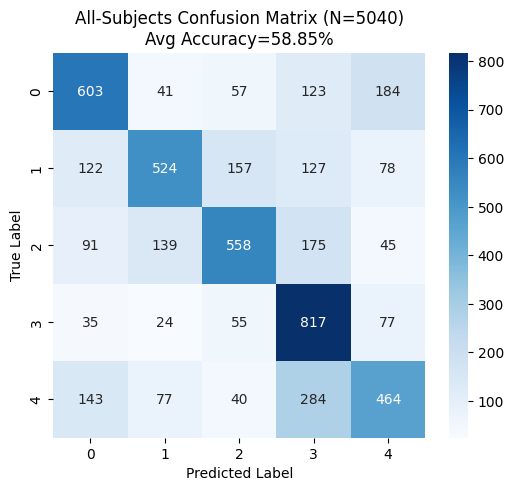

In [ ]:
############################################
# SINGLE-CELL COLAB SCRIPT USING TIMM + DINO
#   - Different batch sizes for freeze/unfreeze
#   - Mixed Precision + Frame Chunking
#   - Clear GPU cache each epoch
#   - One Confusion Matrix for ALL subjects at the end
############################################

!pip install timm torch torchvision scikit-learn seaborn matplotlib

import os
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "expandable_segments:True"

import pickle
import numpy as np

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader

import timm
import timm.data
from PIL import Image
from google.colab import drive

import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

############################################
# 1) Mount Drive + set model cache
############################################
drive.mount('/content/drive')
CACHE_DIR = "/content/drive/MyDrive/hf_cache"
os.makedirs(CACHE_DIR, exist_ok=True)
os.environ["TORCH_HOME"] = CACHE_DIR

############################################
# 2) Paths + hyperparams
############################################
VISION_DIR          = "/content/drive/MyDrive/kk/Input_images/Vision"
MODEL_NAME          = "vit_small_patch16_224.dino"  # DINO checkpoint
NUM_LABELS          = 5

BATCH_SIZE_FREEZE   = 64
BATCH_SIZE_UNFREEZE = 8

CHUNK_SIZE          = 32  # frames per chunk
EPOCHS_FREEZE       = 10
EPOCHS_UNFREEZE     = 5
LR_FREEZE           = 1e-4
LR_UNFREEZE         = 1e-5

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print("Using device:", DEVICE)


############################################
# 3) Dataset + Collate
############################################
class VideoDataset(Dataset):
    def __init__(self, X, y):
        self.X = X
        self.y = y
        self.N = len(y)
    def __len__(self):
        return self.N
    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]

def collate_fn(batch):
    videos = [item[0] for item in batch]
    labels = [item[1] for item in batch]
    videos = torch.from_numpy(np.array(videos)).float()
    labels = torch.LongTensor(labels)
    return videos, labels


############################################
# 4) Trainer
############################################
class TimmViTVideoTrainer:
    def __init__(self, model_name, num_labels, lr, freeze=True):
        self.model = timm.create_model(
            model_name,
            pretrained=True,
            num_classes=num_labels
        ).to(DEVICE)

        data_config = timm.data.resolve_data_config({}, model=self.model)
        self.transform = timm.data.create_transform(**data_config)

        # Freeze/unfreeze
        for param in self.model.parameters():
            param.requires_grad = not freeze
        # Always unfreeze final classification head
        for param in self.model.head.parameters():
            param.requires_grad = True

        self.optimizer = optim.AdamW(self.model.parameters(), lr=lr)
        self.loss_fn   = nn.CrossEntropyLoss()

        from torch.cuda.amp import GradScaler
        self.scaler = GradScaler()

    def freeze_backbone(self, freeze=True):
        for param in self.model.parameters():
            param.requires_grad = not freeze
        for param in self.model.head.parameters():
            param.requires_grad = True

    def set_lr(self, lr):
        for g in self.optimizer.param_groups:
            g["lr"] = lr

    def forward_in_chunks(self, frames_tensors):
        outputs_list = []
        T = frames_tensors.shape[0]
        idx = 0
        while idx < T:
            chunk = frames_tensors[idx:idx+CHUNK_SIZE]
            idx += CHUNK_SIZE
            with torch.autocast(device_type='cuda', dtype=torch.float16):
                out = self.model(chunk)
            outputs_list.append(out)
        return torch.cat(outputs_list, dim=0)

    def train_one_epoch(self, dataloader):
        self.model.train()
        total_loss = 0.0
        total_correct = 0
        total_samples = 0

        for videos, labels in dataloader:
            B, F, H, W, C = videos.shape
            labels = labels.to(DEVICE)

            videos_flat = videos.view(B*F, H, W, C).cpu().numpy()

            frames_tensors = []
            for i in range(videos_flat.shape[0]):
                arr  = videos_flat[i].astype(np.uint8)
                pil  = Image.fromarray(arr, mode='RGB')
                tens = self.transform(pil)
                frames_tensors.append(tens)
            frames_tensors = torch.stack(frames_tensors, dim=0).to(DEVICE)

            self.optimizer.zero_grad()

            with torch.autocast(device_type='cuda', dtype=torch.float16):
                outputs = self.forward_in_chunks(frames_tensors)

            logits_reshaped = outputs.view(B, F, -1)
            logits = logits_reshaped.mean(dim=1)

            loss = self.loss_fn(logits, labels)

            self.scaler.scale(loss).backward()
            self.scaler.step(self.optimizer)
            self.scaler.update()

            total_loss += loss.item()
            preds = torch.argmax(logits, dim=1)
            total_correct += (preds == labels).sum().item()
            total_samples += B

        avg_loss = total_loss / len(dataloader)
        accuracy = 100.0 * total_correct / total_samples
        return avg_loss, accuracy

    def evaluate(self, dataloader):
        self.model.eval()
        total_correct = 0
        total_loss = 0.0
        total_samples = 0

        with torch.no_grad():
            for videos, labels in dataloader:
                B, F, H, W, C = videos.shape
                labels = labels.to(DEVICE)

                videos_flat = videos.view(B*F, H, W, C).cpu().numpy()
                frames_tensors = []
                for i in range(videos_flat.shape[0]):
                    arr  = videos_flat[i].astype(np.uint8)
                    pil  = Image.fromarray(arr, mode='RGB')
                    tens = self.transform(pil)
                    frames_tensors.append(tens)
                frames_tensors = torch.stack(frames_tensors, dim=0).to(DEVICE)

                with torch.autocast(device_type='cuda', dtype=torch.float16):
                    outputs = self.forward_in_chunks(frames_tensors)

                logits_reshaped = outputs.view(B, F, -1)
                logits = logits_reshaped.mean(dim=1)

                loss = self.loss_fn(logits, labels)
                total_loss += loss.item()

                preds = torch.argmax(logits, dim=1)
                total_correct += (preds == labels).sum().item()
                total_samples += B

        avg_loss = total_loss / len(dataloader)
        accuracy = 100.0 * total_correct / total_samples
        return accuracy, avg_loss

    def evaluate_and_get_preds(self, dataloader):
        """
        Returns:
         - all predictions, all labels (for confusion matrix)
         - overall accuracy, average loss
        """
        self.model.eval()
        all_preds = []
        all_labels = []
        total_loss = 0.0
        total_samples = 0

        with torch.no_grad():
            for videos, labels in dataloader:
                B, F, H, W, C = videos.shape
                labels = labels.to(DEVICE)

                videos_flat = videos.view(B*F, H, W, C).cpu().numpy()
                frames_tensors = []
                for i in range(videos_flat.shape[0]):
                    arr  = videos_flat[i].astype(np.uint8)
                    pil  = Image.fromarray(arr, mode='RGB')
                    tens = self.transform(pil)
                    frames_tensors.append(tens)
                frames_tensors = torch.stack(frames_tensors, dim=0).to(DEVICE)

                with torch.autocast(device_type='cuda', dtype=torch.float16):
                    outputs = self.forward_in_chunks(frames_tensors)

                logits_reshaped = outputs.view(B, F, -1)
                logits = logits_reshaped.mean(dim=1)

                loss = self.loss_fn(logits, labels)
                total_loss += loss.item()
                total_samples += B

                preds = torch.argmax(logits, dim=1)
                all_preds.append(preds.cpu().numpy())
                all_labels.append(labels.cpu().numpy())

        all_preds = np.concatenate(all_preds, axis=0)
        all_labels = np.concatenate(all_labels, axis=0)

        avg_loss = total_loss / len(dataloader)
        accuracy = 100.0 * (all_preds == all_labels).sum() / total_samples

        return all_preds, all_labels, accuracy, avg_loss


############################################
# 5) Main loop
############################################
def main():
    results = []
    # We'll store all subjects' final predictions & labels here:
    global_all_preds = []
    global_all_labels = []

    for sid in range(1, 43):
        file_name = f"subject_{sid:02d}_vis.pkl"
        file_path = os.path.join(VISION_DIR, file_name)

        if not os.path.exists(file_path):
            print(f"[Subject {sid}] Missing => {file_path}, skipping.")
            results.append(None)
            continue

        with open(file_path, "rb") as f:
            trainX, trainY, testX, testY = pickle.load(f)

        print(f"\n=== [Subject {sid}] data shapes ===")
        print(f" trainX={trainX.shape}, trainY={trainY.shape}")
        print(f" testX={testX.shape},  testY={testY.shape}")

        ds_train = VideoDataset(trainX, trainY)
        ds_test  = VideoDataset(testX,  testY)

        dl_train_freeze = DataLoader(ds_train, batch_size=BATCH_SIZE_FREEZE, shuffle=True,  collate_fn=collate_fn)
        dl_test_freeze  = DataLoader(ds_test,  batch_size=BATCH_SIZE_FREEZE, shuffle=False, collate_fn=collate_fn)

        trainer = TimmViTVideoTrainer(
            model_name=MODEL_NAME,
            num_labels=NUM_LABELS,
            lr=LR_FREEZE,
            freeze=True
        )

        # Freeze phase
        print(f"[Subject {sid}] Freeze-phase => {EPOCHS_FREEZE} epochs @ lr={LR_FREEZE}, batch_size={BATCH_SIZE_FREEZE}")
        for epoch in range(EPOCHS_FREEZE):
            train_loss, train_acc = trainer.train_one_epoch(dl_train_freeze)
            test_acc, test_loss = trainer.evaluate(dl_test_freeze)
            print(f"  Epoch {epoch+1}/{EPOCHS_FREEZE} => "
                  f"train_loss={train_loss:.4f}, train_acc={train_acc:.2f}%, "
                  f"test_loss={test_loss:.4f}, test_acc={test_acc:.2f}%")
            torch.cuda.empty_cache()

        # Unfreeze phase
        trainer.freeze_backbone(freeze=False)
        trainer.set_lr(LR_UNFREEZE)
        dl_train_unfreeze = DataLoader(ds_train, batch_size=BATCH_SIZE_UNFREEZE, shuffle=True,  collate_fn=collate_fn)
        dl_test_unfreeze  = DataLoader(ds_test,  batch_size=BATCH_SIZE_UNFREEZE, shuffle=False, collate_fn=collate_fn)

        print(f"\n[Subject {sid}] Unfreeze-phase => {EPOCHS_UNFREEZE} epochs @ lr={LR_UNFREEZE}, batch_size={BATCH_SIZE_UNFREEZE}")
        for epoch in range(EPOCHS_UNFREEZE):
            train_loss, train_acc = trainer.train_one_epoch(dl_train_unfreeze)
            test_acc, test_loss = trainer.evaluate(dl_test_unfreeze)
            print(f"  Epoch {epoch+1}/{EPOCHS_UNFREEZE} => "
                  f"train_loss={train_loss:.4f}, train_acc={train_acc:.2f}%, "
                  f"test_loss={test_loss:.4f}, test_acc={test_acc:.2f}%")
            torch.cuda.empty_cache()

        # Final evaluation for this subject
        final_preds, final_labels, final_acc, final_loss = trainer.evaluate_and_get_preds(dl_test_unfreeze)
        print(f"[Subject {sid}] FINAL test_acc={final_acc:.2f}%\n")
        results.append(final_acc)

        # Collect for global confusion matrix
        global_all_preds.append(final_preds)
        global_all_labels.append(final_labels)

    # Overall summary
    valid = [r for r in results if r is not None]
    if len(valid) > 0:
        avg_acc = sum(valid) / len(valid)
        print(f"\n=== Overall average accuracy across {len(valid)} subjects: {avg_acc:.2f}% ===")

        # Now build the single confusion matrix across ALL subjects
        all_preds = np.concatenate(global_all_preds, axis=0)
        all_labels = np.concatenate(global_all_labels, axis=0)
        cm = confusion_matrix(all_labels, all_preds)

        plt.figure(figsize=(6,5))
        sns.heatmap(cm, annot=True, cmap='Blues', fmt='g')
        plt.title(f"All-Subjects Confusion Matrix (N={len(all_preds)})\nAvg Accuracy={avg_acc:.2f}%")
        plt.xlabel("Predicted Label")
        plt.ylabel("True Label")
        plt.show()

    else:
        print("No valid subjects processed.")


############################################
# 6) Run
############################################
if __name__ == "__main__":
    main()


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 65.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 81.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 45.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 10.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 38.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 17.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 207.5/207.5 MB 165.0 MB/s eta 0:00:01
ERROR: Operation cancelled by user
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Using device: cuda


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 200MB/s]


Epoch 1: Train Acc=54.51%, Test Acc=43.05%
Epoch 2: Train Acc=72.93%, Test Acc=34.99%
Epoch 3: Train Acc=76.76%, Test Acc=28.65%
Epoch 1: Train Acc=88.61%, Test Acc=35.62%
Epoch 2: Train Acc=97.64%, Test Acc=37.13%
Epoch 3: Train Acc=99.49%, Test Acc=36.07%
[Subject 1] Accuracy = 0.3667, F1 Score = 0.3762


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Acc=49.86%, Test Acc=36.22%
Epoch 2: Train Acc=66.24%, Test Acc=37.03%
Epoch 3: Train Acc=70.75%, Test Acc=37.03%
Epoch 1: Train Acc=85.34%, Test Acc=48.42%
Epoch 2: Train Acc=97.12%, Test Acc=50.76%
Epoch 3: Train Acc=99.39%, Test Acc=52.37%
[Subject 2] Accuracy = 0.5583, F1 Score = 0.5658


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Acc=49.97%, Test Acc=52.47%
Epoch 2: Train Acc=67.22%, Test Acc=47.84%
Epoch 3: Train Acc=69.40%, Test Acc=49.50%
Epoch 1: Train Acc=83.23%, Test Acc=69.81%
Epoch 2: Train Acc=94.52%, Test Acc=71.86%
Epoch 3: Train Acc=98.20%, Test Acc=72.63%
[Subject 3] Accuracy = 0.7500, F1 Score = 0.7347


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Acc=49.78%, Test Acc=55.67%
Epoch 2: Train Acc=68.66%, Test Acc=51.97%
Epoch 3: Train Acc=72.49%, Test Acc=57.40%
Epoch 1: Train Acc=87.86%, Test Acc=65.84%
Epoch 2: Train Acc=96.88%, Test Acc=66.52%
Epoch 3: Train Acc=99.34%, Test Acc=67.50%
[Subject 4] Accuracy = 0.7667, F1 Score = 0.7701


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Acc=43.57%, Test Acc=34.61%
Epoch 2: Train Acc=60.25%, Test Acc=40.03%
Epoch 3: Train Acc=64.81%, Test Acc=35.57%
Epoch 1: Train Acc=79.76%, Test Acc=51.63%
Epoch 2: Train Acc=93.42%, Test Acc=53.90%
Epoch 3: Train Acc=98.25%, Test Acc=55.94%
[Subject 5] Accuracy = 0.7250, F1 Score = 0.7179


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Acc=55.00%, Test Acc=52.51%
Epoch 2: Train Acc=73.72%, Test Acc=55.46%
Epoch 3: Train Acc=77.76%, Test Acc=54.29%
Epoch 1: Train Acc=85.83%, Test Acc=64.39%
Epoch 2: Train Acc=94.96%, Test Acc=64.69%
Epoch 3: Train Acc=98.32%, Test Acc=66.44%
[Subject 6] Accuracy = 0.7500, F1 Score = 0.7489


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Acc=63.35%, Test Acc=46.33%
Epoch 2: Train Acc=80.75%, Test Acc=46.01%
Epoch 3: Train Acc=83.17%, Test Acc=49.07%
Epoch 1: Train Acc=93.08%, Test Acc=62.67%
Epoch 2: Train Acc=99.19%, Test Acc=65.99%
Epoch 3: Train Acc=99.91%, Test Acc=67.59%
[Subject 7] Accuracy = 0.7833, F1 Score = 0.7681


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Acc=45.14%, Test Acc=46.61%
Epoch 2: Train Acc=63.22%, Test Acc=48.61%
Epoch 3: Train Acc=70.31%, Test Acc=57.69%
Epoch 1: Train Acc=83.25%, Test Acc=64.79%
Epoch 2: Train Acc=95.73%, Test Acc=66.67%
Epoch 3: Train Acc=98.84%, Test Acc=68.10%
[Subject 8] Accuracy = 0.7250, F1 Score = 0.7091


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Acc=52.82%, Test Acc=46.03%
Epoch 2: Train Acc=68.11%, Test Acc=43.58%
Epoch 3: Train Acc=73.12%, Test Acc=45.99%
Epoch 1: Train Acc=86.98%, Test Acc=58.67%
Epoch 2: Train Acc=97.67%, Test Acc=58.83%
Epoch 3: Train Acc=99.61%, Test Acc=59.45%
[Subject 9] Accuracy = 0.7417, F1 Score = 0.7413


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Acc=47.96%, Test Acc=39.05%
Epoch 2: Train Acc=70.20%, Test Acc=43.51%
Epoch 3: Train Acc=72.86%, Test Acc=42.46%
Epoch 1: Train Acc=87.15%, Test Acc=53.42%
Epoch 2: Train Acc=97.82%, Test Acc=55.28%
Epoch 3: Train Acc=99.70%, Test Acc=55.89%
[Subject 10] Accuracy = 0.6500, F1 Score = 0.6361


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Acc=44.64%, Test Acc=44.06%
Epoch 2: Train Acc=61.99%, Test Acc=40.85%
Epoch 3: Train Acc=65.35%, Test Acc=42.96%
Epoch 1: Train Acc=78.46%, Test Acc=51.99%
Epoch 2: Train Acc=90.49%, Test Acc=51.90%
Epoch 3: Train Acc=96.79%, Test Acc=52.26%
[Subject 11] Accuracy = 0.5750, F1 Score = 0.5381


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Acc=52.51%, Test Acc=32.08%
Epoch 2: Train Acc=69.02%, Test Acc=35.89%
Epoch 3: Train Acc=71.81%, Test Acc=37.51%
Epoch 1: Train Acc=84.70%, Test Acc=44.48%
Epoch 2: Train Acc=95.63%, Test Acc=46.14%
Epoch 3: Train Acc=98.79%, Test Acc=46.74%
[Subject 12] Accuracy = 0.5250, F1 Score = 0.5302


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Acc=46.43%, Test Acc=39.05%
Epoch 2: Train Acc=57.02%, Test Acc=39.61%
Epoch 3: Train Acc=63.96%, Test Acc=46.68%
Epoch 1: Train Acc=74.82%, Test Acc=56.02%
Epoch 2: Train Acc=89.25%, Test Acc=59.87%
Epoch 3: Train Acc=96.20%, Test Acc=61.33%
[Subject 13] Accuracy = 0.8333, F1 Score = 0.8296


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Acc=59.79%, Test Acc=50.27%
Epoch 2: Train Acc=77.07%, Test Acc=53.08%
Epoch 3: Train Acc=80.88%, Test Acc=58.66%
Epoch 1: Train Acc=90.70%, Test Acc=53.62%
Epoch 2: Train Acc=98.40%, Test Acc=53.89%
Epoch 3: Train Acc=99.70%, Test Acc=53.99%
[Subject 14] Accuracy = 0.5583, F1 Score = 0.5520


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Acc=49.24%, Test Acc=53.39%
Epoch 2: Train Acc=65.42%, Test Acc=59.53%
Epoch 3: Train Acc=70.65%, Test Acc=56.87%
Epoch 1: Train Acc=84.89%, Test Acc=68.28%
Epoch 2: Train Acc=95.54%, Test Acc=68.86%
Epoch 3: Train Acc=98.91%, Test Acc=71.19%
[Subject 15] Accuracy = 0.8500, F1 Score = 0.8452


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Acc=44.73%, Test Acc=42.13%
Epoch 2: Train Acc=62.08%, Test Acc=48.67%
Epoch 3: Train Acc=67.90%, Test Acc=53.76%
Epoch 1: Train Acc=81.80%, Test Acc=55.34%
Epoch 2: Train Acc=95.10%, Test Acc=56.91%
Epoch 3: Train Acc=99.08%, Test Acc=56.59%
[Subject 16] Accuracy = 0.6083, F1 Score = 0.5457


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Acc=59.52%, Test Acc=60.30%
Epoch 2: Train Acc=73.90%, Test Acc=70.08%
Epoch 3: Train Acc=78.63%, Test Acc=63.36%
Epoch 1: Train Acc=89.33%, Test Acc=79.87%
Epoch 2: Train Acc=97.89%, Test Acc=81.44%
Epoch 3: Train Acc=99.62%, Test Acc=83.07%
[Subject 17] Accuracy = 0.9583, F1 Score = 0.9580


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Acc=53.73%, Test Acc=46.78%
Epoch 2: Train Acc=71.82%, Test Acc=49.01%
Epoch 3: Train Acc=74.96%, Test Acc=46.55%
Epoch 1: Train Acc=88.69%, Test Acc=62.38%
Epoch 2: Train Acc=98.06%, Test Acc=63.62%
Epoch 3: Train Acc=99.79%, Test Acc=64.75%
[Subject 18] Accuracy = 0.7500, F1 Score = 0.7421


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Acc=50.44%, Test Acc=39.89%
Epoch 2: Train Acc=64.75%, Test Acc=43.70%
Epoch 3: Train Acc=69.67%, Test Acc=46.66%
Epoch 1: Train Acc=80.45%, Test Acc=51.00%
Epoch 2: Train Acc=92.14%, Test Acc=53.58%
Epoch 3: Train Acc=97.35%, Test Acc=55.30%
[Subject 19] Accuracy = 0.7250, F1 Score = 0.7155


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Acc=45.21%, Test Acc=53.38%
Epoch 2: Train Acc=62.93%, Test Acc=53.22%
Epoch 3: Train Acc=68.11%, Test Acc=55.97%
Epoch 1: Train Acc=78.80%, Test Acc=64.46%
Epoch 2: Train Acc=92.49%, Test Acc=64.78%
Epoch 3: Train Acc=98.20%, Test Acc=66.01%
[Subject 20] Accuracy = 0.8500, F1 Score = 0.8511


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Acc=53.34%, Test Acc=41.07%
Epoch 2: Train Acc=67.27%, Test Acc=50.30%
Epoch 3: Train Acc=72.43%, Test Acc=50.67%
Epoch 1: Train Acc=84.46%, Test Acc=57.23%
Epoch 2: Train Acc=96.19%, Test Acc=59.23%
Epoch 3: Train Acc=99.28%, Test Acc=55.99%
[Subject 21] Accuracy = 0.7000, F1 Score = 0.6955


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Acc=42.60%, Test Acc=49.54%
Epoch 2: Train Acc=57.44%, Test Acc=52.64%
Epoch 3: Train Acc=61.30%, Test Acc=52.46%
Epoch 1: Train Acc=74.79%, Test Acc=61.89%
Epoch 2: Train Acc=88.26%, Test Acc=64.49%
Epoch 3: Train Acc=95.18%, Test Acc=64.72%
[Subject 22] Accuracy = 0.7833, F1 Score = 0.7752


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Acc=51.47%, Test Acc=46.19%
Epoch 2: Train Acc=65.00%, Test Acc=47.20%
Epoch 3: Train Acc=66.78%, Test Acc=51.94%
Epoch 1: Train Acc=80.59%, Test Acc=55.29%
Epoch 2: Train Acc=92.62%, Test Acc=57.01%
Epoch 3: Train Acc=97.78%, Test Acc=56.34%
[Subject 23] Accuracy = 0.6167, F1 Score = 0.5814


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Acc=47.58%, Test Acc=39.64%
Epoch 2: Train Acc=67.13%, Test Acc=54.17%
Epoch 3: Train Acc=72.39%, Test Acc=50.58%
Epoch 1: Train Acc=85.37%, Test Acc=61.23%
Epoch 2: Train Acc=95.83%, Test Acc=62.36%
Epoch 3: Train Acc=98.93%, Test Acc=63.49%
[Subject 24] Accuracy = 0.7333, F1 Score = 0.7132


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Acc=45.98%, Test Acc=42.52%
Epoch 2: Train Acc=60.09%, Test Acc=48.90%
Epoch 3: Train Acc=64.88%, Test Acc=49.15%
Epoch 1: Train Acc=78.04%, Test Acc=55.96%
Epoch 2: Train Acc=91.38%, Test Acc=57.58%
Epoch 3: Train Acc=97.03%, Test Acc=57.16%
[Subject 25] Accuracy = 0.7083, F1 Score = 0.6943


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Acc=41.18%, Test Acc=43.90%
Epoch 2: Train Acc=56.67%, Test Acc=46.39%
Epoch 3: Train Acc=60.18%, Test Acc=42.58%
Epoch 1: Train Acc=74.85%, Test Acc=61.52%
Epoch 2: Train Acc=90.11%, Test Acc=63.44%
Epoch 3: Train Acc=96.76%, Test Acc=63.11%
[Subject 26] Accuracy = 0.7750, F1 Score = 0.7636


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Acc=54.17%, Test Acc=63.42%
Epoch 2: Train Acc=71.95%, Test Acc=57.29%
Epoch 3: Train Acc=78.26%, Test Acc=61.91%
Epoch 1: Train Acc=88.70%, Test Acc=73.15%
Epoch 2: Train Acc=97.32%, Test Acc=75.45%
Epoch 3: Train Acc=99.42%, Test Acc=75.88%
[Subject 27] Accuracy = 0.8750, F1 Score = 0.8720


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Acc=50.91%, Test Acc=55.37%
Epoch 2: Train Acc=69.73%, Test Acc=49.37%
Epoch 3: Train Acc=74.00%, Test Acc=59.61%
Epoch 1: Train Acc=86.52%, Test Acc=67.01%
Epoch 2: Train Acc=96.88%, Test Acc=67.91%
Epoch 3: Train Acc=99.49%, Test Acc=68.10%
[Subject 28] Accuracy = 0.8000, F1 Score = 0.8026


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Acc=43.05%, Test Acc=32.75%
Epoch 2: Train Acc=57.79%, Test Acc=36.10%
Epoch 3: Train Acc=61.75%, Test Acc=36.73%
Epoch 1: Train Acc=74.73%, Test Acc=48.96%
Epoch 2: Train Acc=88.04%, Test Acc=51.46%
Epoch 3: Train Acc=94.86%, Test Acc=53.62%
[Subject 29] Accuracy = 0.7833, F1 Score = 0.7753


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Acc=54.26%, Test Acc=53.47%
Epoch 2: Train Acc=66.65%, Test Acc=54.73%
Epoch 3: Train Acc=73.10%, Test Acc=52.65%
Epoch 1: Train Acc=83.25%, Test Acc=60.85%
Epoch 2: Train Acc=94.55%, Test Acc=61.03%
Epoch 3: Train Acc=98.39%, Test Acc=60.70%
[Subject 30] Accuracy = 0.7083, F1 Score = 0.6863


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Acc=56.85%, Test Acc=62.31%
Epoch 2: Train Acc=77.36%, Test Acc=62.25%
Epoch 3: Train Acc=79.32%, Test Acc=60.54%
Epoch 1: Train Acc=90.19%, Test Acc=65.92%
Epoch 2: Train Acc=97.50%, Test Acc=66.68%
Epoch 3: Train Acc=99.49%, Test Acc=67.32%
[Subject 31] Accuracy = 0.7167, F1 Score = 0.6711


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Acc=51.65%, Test Acc=39.53%
Epoch 2: Train Acc=64.60%, Test Acc=39.93%
Epoch 3: Train Acc=72.01%, Test Acc=45.91%
Epoch 1: Train Acc=85.08%, Test Acc=49.27%
Epoch 2: Train Acc=95.27%, Test Acc=50.10%
Epoch 3: Train Acc=98.55%, Test Acc=51.26%
[Subject 32] Accuracy = 0.5917, F1 Score = 0.5528


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Acc=47.05%, Test Acc=53.06%
Epoch 2: Train Acc=62.89%, Test Acc=57.38%
Epoch 3: Train Acc=65.61%, Test Acc=63.72%
Epoch 1: Train Acc=77.40%, Test Acc=70.95%
Epoch 2: Train Acc=90.51%, Test Acc=72.75%
Epoch 3: Train Acc=96.35%, Test Acc=73.83%
[Subject 33] Accuracy = 0.8667, F1 Score = 0.8666


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Acc=49.89%, Test Acc=52.14%
Epoch 2: Train Acc=69.72%, Test Acc=52.76%
Epoch 3: Train Acc=72.51%, Test Acc=51.33%
Epoch 1: Train Acc=85.18%, Test Acc=64.98%
Epoch 2: Train Acc=95.87%, Test Acc=66.74%
Epoch 3: Train Acc=99.06%, Test Acc=67.16%
[Subject 34] Accuracy = 0.7417, F1 Score = 0.7341


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Acc=36.48%, Test Acc=35.78%
Epoch 2: Train Acc=50.91%, Test Acc=26.19%
Epoch 3: Train Acc=58.36%, Test Acc=35.11%
Epoch 1: Train Acc=72.05%, Test Acc=47.98%
Epoch 2: Train Acc=88.83%, Test Acc=51.47%
Epoch 3: Train Acc=95.56%, Test Acc=52.36%
[Subject 35] Accuracy = 0.6500, F1 Score = 0.6504


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Acc=48.69%, Test Acc=47.45%
Epoch 2: Train Acc=66.53%, Test Acc=41.50%
Epoch 3: Train Acc=70.70%, Test Acc=44.41%
Epoch 1: Train Acc=84.91%, Test Acc=50.33%
Epoch 2: Train Acc=95.92%, Test Acc=53.65%
Epoch 3: Train Acc=98.81%, Test Acc=51.97%
[Subject 36] Accuracy = 0.6583, F1 Score = 0.6331


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Acc=47.39%, Test Acc=33.81%
Epoch 2: Train Acc=62.82%, Test Acc=41.04%
Epoch 3: Train Acc=66.28%, Test Acc=39.21%
Epoch 1: Train Acc=79.70%, Test Acc=46.16%
Epoch 2: Train Acc=92.72%, Test Acc=47.60%
Epoch 3: Train Acc=97.52%, Test Acc=47.67%
[Subject 37] Accuracy = 0.5917, F1 Score = 0.5979


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Acc=58.30%, Test Acc=57.41%
Epoch 2: Train Acc=77.05%, Test Acc=53.97%
Epoch 3: Train Acc=81.04%, Test Acc=51.51%
Epoch 1: Train Acc=90.77%, Test Acc=67.65%
Epoch 2: Train Acc=97.77%, Test Acc=69.44%
Epoch 3: Train Acc=99.47%, Test Acc=69.89%
[Subject 38] Accuracy = 0.8333, F1 Score = 0.8319


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Acc=55.57%, Test Acc=41.10%
Epoch 2: Train Acc=73.89%, Test Acc=41.69%
Epoch 3: Train Acc=78.05%, Test Acc=46.26%
Epoch 1: Train Acc=87.41%, Test Acc=55.63%
Epoch 2: Train Acc=96.38%, Test Acc=57.05%
Epoch 3: Train Acc=99.23%, Test Acc=58.29%
[Subject 39] Accuracy = 0.6500, F1 Score = 0.6383


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Acc=49.43%, Test Acc=48.84%
Epoch 2: Train Acc=66.17%, Test Acc=52.46%
Epoch 3: Train Acc=70.61%, Test Acc=47.63%
Epoch 1: Train Acc=83.02%, Test Acc=55.87%
Epoch 2: Train Acc=95.11%, Test Acc=55.72%
Epoch 3: Train Acc=98.78%, Test Acc=56.73%
[Subject 40] Accuracy = 0.6000, F1 Score = 0.5275


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Acc=49.96%, Test Acc=61.37%
Epoch 2: Train Acc=68.48%, Test Acc=62.71%
Epoch 3: Train Acc=71.20%, Test Acc=55.30%
Epoch 1: Train Acc=84.65%, Test Acc=68.67%
Epoch 2: Train Acc=95.74%, Test Acc=69.72%
Epoch 3: Train Acc=98.98%, Test Acc=71.55%
[Subject 41] Accuracy = 0.8667, F1 Score = 0.8675


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Acc=56.34%, Test Acc=51.35%
Epoch 2: Train Acc=73.39%, Test Acc=57.24%
Epoch 3: Train Acc=77.87%, Test Acc=44.84%
Epoch 1: Train Acc=86.59%, Test Acc=62.70%
Epoch 2: Train Acc=94.45%, Test Acc=63.59%
Epoch 3: Train Acc=97.59%, Test Acc=64.57%
[Subject 42] Accuracy = 0.7833, F1 Score = 0.7867

=== Average Accuracy: 0.7163 ===
=== Average F1 Score: 0.7046 ===


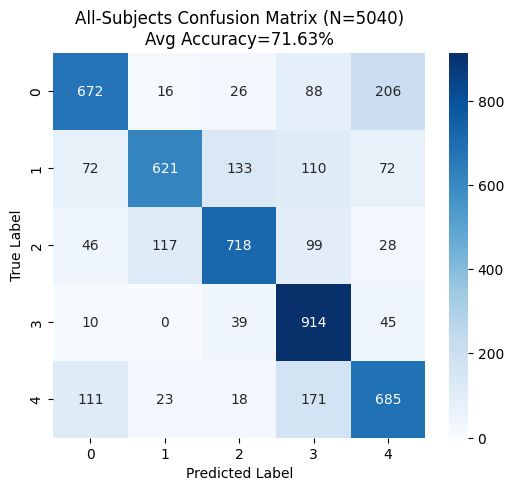

In [ ]:
############################################
# CNN-BASED FACIAL EMOTION RECOGNITION SCRIPT
# - ResNet50 with Channel Attention
# - Freeze/Unfreeze Strategy
# - Single Confusion Matrix Across Subjects
############################################

# !pip install torch torchvision scikit-learn seaborn matplotlib

import os
import pickle
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, f1_score

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset
from torchvision import transforms
from torchvision.models import resnet50


# ======================
# Mount Google Drive
# ======================
from google.colab import drive
drive.mount('/content/drive')

# ======================
# Config
# ======================
VISION_DIR = "/content/drive/MyDrive/kk/Input_images/Vision"
NUM_LABELS = 5
BATCH_SIZE_FREEZE = 64
BATCH_SIZE_UNFREEZE = 8
EPOCHS_FREEZE = 3
EPOCHS_UNFREEZE = 3
LR_FREEZE = 5e-4
LR_UNFREEZE = 5e-6
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", DEVICE)

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])


# ======================
# Model
# ======================
class VideoModel(nn.Module):
    def __init__(self, num_labels=5, ratio=1):
        super(VideoModel, self).__init__()
        base_model = resnet50(pretrained=True)
        self.base_model = torch.nn.Sequential(*(list(base_model.children())[:-2]))
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.max_pool = nn.AdaptiveMaxPool2d(1)
        self.shared_layer_one = nn.Linear(2048 // ratio, 2048)
        self.shared_layer_two = nn.Linear(2048, 2048)
        self.global_avg_pool = nn.AdaptiveAvgPool2d(1)
        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(2048, 1024)
        self.fc2 = nn.Linear(1024, num_labels)

    def channel_attention(self, x):
        avg_pool = self.avg_pool(x)
        max_pool = self.max_pool(x)
        avg_pool = self.shared_layer_one(avg_pool.view(avg_pool.size(0), -1))
        max_pool = self.shared_layer_one(max_pool.view(max_pool.size(0), -1))
        avg_pool = self.shared_layer_two(avg_pool)
        max_pool = self.shared_layer_two(max_pool)
        return avg_pool + max_pool

    def forward(self, x):
        x = self.base_model(x)
        attention = self.channel_attention(x)
        x = x * attention.unsqueeze(2).unsqueeze(3)
        x = self.global_avg_pool(x)
        x = self.flatten(x)
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x


# ======================
# Trainer
# ======================
class ImageClassifierTrainer:
    def __init__(self, data, num_labels=5, lr=5e-4, batch_size=64):
        self.tr_x, self.tr_y, self.te_x, self.te_y = data
        self.num_labels = num_labels
        self.batch_size = batch_size
        self.frame_per_sample = self.tr_x.shape[1]

        self.device = DEVICE
        self.processor = transform
        self.model = VideoModel(self.num_labels).to(self.device)
        self.criterion = nn.CrossEntropyLoss()
        self.optimizer = torch.optim.AdamW(self.model.parameters(), lr=lr)

        self.train_dataloader = self._prepare_dataloader(self.tr_x, self.tr_y)
        self.test_dataloader = self._prepare_dataloader(self.te_x, self.te_y, shuffle=False)

    def _prepare_dataloader(self, x, y, shuffle=True):
        processed_x = self.preprocess_images(x)
        y_repeated = torch.from_numpy(np.repeat(y, self.frame_per_sample)).long()
        dataset = TensorDataset(processed_x.view(-1, 3, 224, 224), y_repeated)
        return DataLoader(dataset, batch_size=self.batch_size, shuffle=shuffle)

    def preprocess_images(self, image_list):
        pixel_values_list = []
        for img_set in image_list:
            for img in img_set:
                pil_img = Image.fromarray(img)
                processed = self.processor(pil_img)
                pixel_values_list.append(processed)
        return torch.stack(pixel_values_list).to(self.device)

    def calculate_accuracy(self, outputs, labels):
        _, predicted = torch.max(outputs, 1)
        return (predicted == labels).sum().item() / labels.size(0)

    def train(self, epochs=3, lr=None, freeze=True):
        if lr:
            for g in self.optimizer.param_groups:
                g['lr'] = lr
        for param in self.model.base_model.parameters():
            param.requires_grad = not freeze

        for epoch in range(epochs):
            self.model.train()
            total_train_acc = 0
            for pixel_values, labels in self.train_dataloader:
                pixel_values, labels = pixel_values.to(self.device), labels.to(self.device)
                self.optimizer.zero_grad()
                outputs = self.model(pixel_values)
                loss = self.criterion(outputs, labels)
                loss.backward()
                self.optimizer.step()
                total_train_acc += self.calculate_accuracy(outputs, labels)
            avg_train_acc = total_train_acc / len(self.train_dataloader)

            self.model.eval()
            all_outputs = []
            total_test_acc = 0
            with torch.no_grad():
                for pixel_values, labels in self.test_dataloader:
                    pixel_values, labels = pixel_values.to(self.device), labels.to(self.device)
                    outputs = self.model(pixel_values)
                    total_test_acc += self.calculate_accuracy(outputs, labels)
                    all_outputs.append(outputs.detach().cpu().numpy())

            self.outputs_test = np.concatenate(all_outputs, axis=0) if (epoch == epochs - 1 and not freeze) else None
            avg_test_acc = total_test_acc / len(self.test_dataloader)
            print(f"Epoch {epoch+1}: Train Acc={avg_train_acc*100:.2f}%, Test Acc={avg_test_acc*100:.2f}%")


# ======================
# Main Execution
# ======================
test_acc_all, test_f1_all = [], []
all_preds, all_labels = [], []

for idx in range(1, 43):
    file_path = os.path.join(VISION_DIR, f"subject_{idx:02d}_vis.pkl")
    if not os.path.exists(file_path):
        print(f"[Subject {idx}] Missing file: {file_path}, skipping.")
        continue

    with open(file_path, "rb") as f:
        data = pickle.load(f)

    trainer = ImageClassifierTrainer(data, num_labels=NUM_LABELS, lr=LR_FREEZE, batch_size=BATCH_SIZE_FREEZE)
    trainer.train(epochs=EPOCHS_FREEZE, lr=LR_FREEZE, freeze=True)
    trainer.train(epochs=EPOCHS_UNFREEZE, lr=LR_UNFREEZE, freeze=False)

    outputs = trainer.outputs_test
    probs = np.reshape(outputs, (-1, trainer.frame_per_sample, NUM_LABELS))
    avg_probs = np.mean(probs, axis=1)
    preds = np.argmax(avg_probs, axis=1)
    true_labels = data[3]

    acc = np.mean(preds == true_labels)
    f1 = f1_score(true_labels, preds, average='weighted')
    print(f"[Subject {idx}] Accuracy = {acc:.4f}, F1 Score = {f1:.4f}")

    test_acc_all.append(acc)
    test_f1_all.append(f1)
    all_preds.extend(preds)
    all_labels.extend(true_labels)

    torch.cuda.empty_cache()

# Global Results
print(f"\n=== Average Accuracy: {np.mean(test_acc_all):.4f} ===")
print(f"=== Average F1 Score: {np.mean(test_f1_all):.4f} ===")

cm = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g')
plt.title(f"All-Subjects Confusion Matrix (N={len(all_preds)})\nAvg Accuracy={np.mean(test_acc_all)*100:.2f}%")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()


  Using cached nvidia_cuda_nvrtc_cu12-12.4.127-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.4.127-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.4.127-py3-none-manylinux2014_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-9.1.0.70-py3-none-manylinux2014_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.4.5.8-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.2.1.3-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.5.147-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.6.1.9-py3-none-manylinux2014_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.3.1.170-py3-none-manylinux2014_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nvjitlink_cu12-12.4.127-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
Using cached nvidia_cublas_

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Loss=120.7773, Val Loss=0.7264
Epoch 2: Train Loss=56.6477, Val Loss=0.7083
Epoch 3: Train Loss=31.8167, Val Loss=0.6186
Epoch 4: Train Loss=37.9200, Val Loss=0.8546
Epoch 5: Train Loss=32.3105, Val Loss=0.3368
Epoch 6: Train Loss=14.1487, Val Loss=0.3608
Epoch 7: Train Loss=17.7034, Val Loss=0.6454
Early stopping at epoch 8
[Subject 1] Accuracy = 0.5000, F1 Score = 0.4711


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Loss=171.5478, Val Loss=2.2357
Epoch 2: Train Loss=97.2834, Val Loss=1.3336
Epoch 3: Train Loss=63.4096, Val Loss=0.7778
Epoch 4: Train Loss=37.7028, Val Loss=0.4521
Epoch 5: Train Loss=24.6556, Val Loss=2.0646
Epoch 6: Train Loss=19.8695, Val Loss=0.6840
Early stopping at epoch 7
[Subject 2] Accuracy = 0.4667, F1 Score = 0.4736


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Loss=109.1088, Val Loss=0.8911
Epoch 2: Train Loss=55.5976, Val Loss=1.0122
Epoch 3: Train Loss=41.5441, Val Loss=0.4671
Epoch 4: Train Loss=26.0888, Val Loss=0.5980
Epoch 5: Train Loss=52.6765, Val Loss=1.0962
Early stopping at epoch 6
[Subject 3] Accuracy = 0.7167, F1 Score = 0.7085


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Loss=135.7978, Val Loss=1.7274
Epoch 2: Train Loss=58.3829, Val Loss=0.4809
Epoch 3: Train Loss=54.2915, Val Loss=0.6488
Epoch 4: Train Loss=30.7291, Val Loss=0.2139
Epoch 5: Train Loss=18.9873, Val Loss=1.4641
Epoch 6: Train Loss=26.2374, Val Loss=0.6331
Early stopping at epoch 7
[Subject 4] Accuracy = 0.8500, F1 Score = 0.8453


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Loss=155.0403, Val Loss=1.9273
Epoch 2: Train Loss=67.2568, Val Loss=1.9160
Epoch 3: Train Loss=45.8611, Val Loss=1.6250
Epoch 4: Train Loss=36.5840, Val Loss=0.9884
Epoch 5: Train Loss=26.3100, Val Loss=0.8914
Epoch 6: Train Loss=30.2775, Val Loss=0.6910
Epoch 7: Train Loss=17.8576, Val Loss=1.7569
Epoch 8: Train Loss=47.1464, Val Loss=1.3963
Early stopping at epoch 9
[Subject 5] Accuracy = 0.5833, F1 Score = 0.5025


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Loss=114.9964, Val Loss=0.5325
Epoch 2: Train Loss=58.7087, Val Loss=0.6443
Epoch 3: Train Loss=45.1288, Val Loss=0.9330
Early stopping at epoch 4
[Subject 6] Accuracy = 0.6167, F1 Score = 0.5845


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Loss=96.2157, Val Loss=0.6909
Epoch 2: Train Loss=45.9368, Val Loss=0.4459
Epoch 3: Train Loss=28.5830, Val Loss=0.5404
Epoch 4: Train Loss=12.9949, Val Loss=0.4562
Epoch 5: Train Loss=17.8976, Val Loss=0.3481
Epoch 6: Train Loss=9.2248, Val Loss=0.2231
Epoch 7: Train Loss=7.0110, Val Loss=0.1773
Epoch 8: Train Loss=11.0220, Val Loss=1.8194
Epoch 9: Train Loss=12.1193, Val Loss=0.3621
Early stopping at epoch 10
[Subject 7] Accuracy = 0.4417, F1 Score = 0.4079


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Loss=124.3299, Val Loss=1.5032
Epoch 2: Train Loss=59.0386, Val Loss=0.7368
Epoch 3: Train Loss=45.0779, Val Loss=1.5220
Epoch 4: Train Loss=46.8417, Val Loss=1.0437
Epoch 5: Train Loss=26.5562, Val Loss=0.6756
Epoch 6: Train Loss=17.6677, Val Loss=2.2872
Epoch 7: Train Loss=38.0200, Val Loss=1.3825
Early stopping at epoch 8
[Subject 8] Accuracy = 0.7250, F1 Score = 0.6467


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Loss=118.4247, Val Loss=1.1379
Epoch 2: Train Loss=48.3872, Val Loss=0.8422
Epoch 3: Train Loss=37.6343, Val Loss=1.6681
Epoch 4: Train Loss=133.2819, Val Loss=1.4891
Early stopping at epoch 5
[Subject 9] Accuracy = 0.5750, F1 Score = 0.5649


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Loss=123.5829, Val Loss=2.6005
Epoch 2: Train Loss=42.4144, Val Loss=1.9189
Epoch 3: Train Loss=36.8513, Val Loss=0.7410
Epoch 4: Train Loss=34.3428, Val Loss=5.7060
Epoch 5: Train Loss=21.6905, Val Loss=0.9091
Epoch 6: Train Loss=24.4162, Val Loss=0.7007
Epoch 7: Train Loss=19.1683, Val Loss=0.3439
Epoch 8: Train Loss=15.5883, Val Loss=0.5451
Epoch 9: Train Loss=19.4718, Val Loss=0.6324
Early stopping at epoch 10
[Subject 10] Accuracy = 0.6917, F1 Score = 0.6844


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Loss=151.2778, Val Loss=0.7471
Epoch 2: Train Loss=74.5111, Val Loss=1.3348
Epoch 3: Train Loss=70.5510, Val Loss=0.8711
Early stopping at epoch 4
[Subject 11] Accuracy = 0.4833, F1 Score = 0.4387


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Loss=127.0479, Val Loss=1.9745
Epoch 2: Train Loss=58.7813, Val Loss=0.9885
Epoch 3: Train Loss=45.5876, Val Loss=1.1626
Epoch 4: Train Loss=37.3356, Val Loss=0.8100
Epoch 5: Train Loss=40.5380, Val Loss=0.4838
Epoch 6: Train Loss=28.8036, Val Loss=0.7421
Epoch 7: Train Loss=19.2592, Val Loss=0.6596
Early stopping at epoch 8
[Subject 12] Accuracy = 0.3750, F1 Score = 0.3699


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Loss=174.8328, Val Loss=1.1177
Epoch 2: Train Loss=94.3379, Val Loss=1.6220
Epoch 3: Train Loss=63.0809, Val Loss=0.9036
Epoch 4: Train Loss=69.1658, Val Loss=0.7669
Epoch 5: Train Loss=44.8857, Val Loss=0.8439
Epoch 6: Train Loss=30.5749, Val Loss=0.6107
Epoch 7: Train Loss=29.3075, Val Loss=0.6215
Epoch 8: Train Loss=22.4162, Val Loss=0.3336
Epoch 9: Train Loss=23.8973, Val Loss=2.1563
Epoch 10: Train Loss=19.2440, Val Loss=0.6443
Early stopping at epoch 11
[Subject 13] Accuracy = 0.9167, F1 Score = 0.9107


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Loss=98.1139, Val Loss=0.7103
Epoch 2: Train Loss=64.0992, Val Loss=0.5359
Epoch 3: Train Loss=23.9005, Val Loss=0.2609
Epoch 4: Train Loss=22.1139, Val Loss=2.0573
Epoch 5: Train Loss=55.1680, Val Loss=0.6151
Early stopping at epoch 6
[Subject 14] Accuracy = 0.6833, F1 Score = 0.6712


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Loss=120.2192, Val Loss=1.5025
Epoch 2: Train Loss=57.7256, Val Loss=0.8415
Epoch 3: Train Loss=50.4941, Val Loss=0.9417
Epoch 4: Train Loss=44.7282, Val Loss=0.7188
Epoch 5: Train Loss=31.2318, Val Loss=0.3526
Epoch 6: Train Loss=20.7163, Val Loss=0.3996
Epoch 7: Train Loss=24.9585, Val Loss=0.3965
Early stopping at epoch 8
[Subject 15] Accuracy = 0.5583, F1 Score = 0.4383


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Loss=151.4549, Val Loss=1.0684
Epoch 2: Train Loss=79.3987, Val Loss=1.1687
Epoch 3: Train Loss=56.0584, Val Loss=3.9144
Epoch 4: Train Loss=35.6991, Val Loss=0.4370
Epoch 5: Train Loss=24.0919, Val Loss=1.0337
Epoch 6: Train Loss=25.5964, Val Loss=0.3913
Epoch 7: Train Loss=24.7233, Val Loss=0.7733
Epoch 8: Train Loss=29.6052, Val Loss=0.6053
Early stopping at epoch 9
[Subject 16] Accuracy = 0.5750, F1 Score = 0.5589


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Loss=121.8844, Val Loss=0.7172
Epoch 2: Train Loss=46.8823, Val Loss=0.6237
Epoch 3: Train Loss=41.1315, Val Loss=0.5979
Epoch 4: Train Loss=24.7174, Val Loss=0.3106
Epoch 5: Train Loss=34.9453, Val Loss=0.7266
Epoch 6: Train Loss=14.7074, Val Loss=0.4095
Early stopping at epoch 7
[Subject 17] Accuracy = 0.8750, F1 Score = 0.8741


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Loss=102.7659, Val Loss=2.1026
Epoch 2: Train Loss=42.2956, Val Loss=0.9929
Epoch 3: Train Loss=39.6658, Val Loss=0.3282
Epoch 4: Train Loss=21.8422, Val Loss=0.6958
Epoch 5: Train Loss=14.0335, Val Loss=1.5751
Early stopping at epoch 6
[Subject 18] Accuracy = 0.4250, F1 Score = 0.3755


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Loss=172.1541, Val Loss=1.0984
Epoch 2: Train Loss=96.1392, Val Loss=1.4687
Epoch 3: Train Loss=83.5454, Val Loss=1.8197
Epoch 4: Train Loss=67.7073, Val Loss=0.8383
Epoch 5: Train Loss=51.5054, Val Loss=1.4509
Epoch 6: Train Loss=38.1550, Val Loss=0.8330
Epoch 7: Train Loss=29.9542, Val Loss=1.9182
Epoch 8: Train Loss=31.9739, Val Loss=0.9934
Early stopping at epoch 9
[Subject 19] Accuracy = 0.6333, F1 Score = 0.6402


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Loss=138.1941, Val Loss=2.1824
Epoch 2: Train Loss=96.3550, Val Loss=1.4108
Epoch 3: Train Loss=60.1434, Val Loss=1.3475
Epoch 4: Train Loss=39.4619, Val Loss=1.3236
Epoch 5: Train Loss=34.4693, Val Loss=1.4312
Epoch 6: Train Loss=29.6580, Val Loss=1.1335
Epoch 7: Train Loss=25.7548, Val Loss=0.9938
Epoch 8: Train Loss=21.1454, Val Loss=0.8459
Epoch 9: Train Loss=17.3957, Val Loss=0.9740
Epoch 10: Train Loss=26.6382, Val Loss=1.7832
Early stopping at epoch 11
[Subject 20] Accuracy = 0.8667, F1 Score = 0.8618


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Loss=120.9583, Val Loss=0.9224
Epoch 2: Train Loss=58.7905, Val Loss=2.1339
Epoch 3: Train Loss=61.4926, Val Loss=1.0453
Epoch 4: Train Loss=35.0575, Val Loss=0.5813
Epoch 5: Train Loss=21.8455, Val Loss=0.3809
Epoch 6: Train Loss=17.8300, Val Loss=0.8430
Epoch 7: Train Loss=48.8916, Val Loss=1.2772
Early stopping at epoch 8
[Subject 21] Accuracy = 0.5167, F1 Score = 0.5116


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Loss=153.2606, Val Loss=1.2298
Epoch 2: Train Loss=85.1632, Val Loss=1.1607
Epoch 3: Train Loss=55.4916, Val Loss=1.1874
Epoch 4: Train Loss=54.9091, Val Loss=1.0229
Epoch 5: Train Loss=34.6986, Val Loss=2.1806
Epoch 6: Train Loss=21.5106, Val Loss=2.4421
Early stopping at epoch 7
[Subject 22] Accuracy = 0.6750, F1 Score = 0.6818


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Loss=143.2620, Val Loss=1.3563
Epoch 2: Train Loss=74.7978, Val Loss=0.9672
Epoch 3: Train Loss=61.8695, Val Loss=0.8994
Epoch 4: Train Loss=45.4337, Val Loss=0.9896
Epoch 5: Train Loss=49.0438, Val Loss=0.8601
Epoch 6: Train Loss=33.9200, Val Loss=0.7454
Epoch 7: Train Loss=26.4351, Val Loss=1.0097
Epoch 8: Train Loss=20.8479, Val Loss=0.5669
Epoch 9: Train Loss=21.2133, Val Loss=1.0086
Epoch 10: Train Loss=19.2640, Val Loss=0.7655
Early stopping at epoch 11
[Subject 23] Accuracy = 0.4083, F1 Score = 0.3106


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Loss=183.1802, Val Loss=1.2829
Epoch 2: Train Loss=85.9034, Val Loss=1.1748
Epoch 3: Train Loss=47.2660, Val Loss=1.0235
Epoch 4: Train Loss=46.4115, Val Loss=1.2820
Epoch 5: Train Loss=38.3635, Val Loss=1.1137
Epoch 6: Train Loss=43.2413, Val Loss=0.3771
Epoch 7: Train Loss=12.5981, Val Loss=1.5697
Epoch 8: Train Loss=33.3873, Val Loss=0.6802
Early stopping at epoch 9
[Subject 24] Accuracy = 0.5750, F1 Score = 0.5815


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Loss=195.5391, Val Loss=1.7181
Epoch 2: Train Loss=89.7156, Val Loss=1.2886
Epoch 3: Train Loss=65.4248, Val Loss=0.6698
Epoch 4: Train Loss=53.4204, Val Loss=0.9383
Epoch 5: Train Loss=51.4232, Val Loss=1.1044
Early stopping at epoch 6
[Subject 25] Accuracy = 0.6333, F1 Score = 0.6201


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Loss=186.1603, Val Loss=1.3314
Epoch 2: Train Loss=108.4706, Val Loss=2.3278
Epoch 3: Train Loss=97.1730, Val Loss=2.1128
Epoch 4: Train Loss=73.6201, Val Loss=0.6734
Epoch 5: Train Loss=48.2994, Val Loss=0.6786
Epoch 6: Train Loss=48.5573, Val Loss=0.9274
Early stopping at epoch 7
[Subject 26] Accuracy = 0.4583, F1 Score = 0.3675


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Loss=100.4187, Val Loss=1.0214
Epoch 2: Train Loss=53.7507, Val Loss=3.7783
Epoch 3: Train Loss=40.9249, Val Loss=0.6481
Epoch 4: Train Loss=43.3271, Val Loss=3.5540
Epoch 5: Train Loss=24.0694, Val Loss=0.1416
Epoch 6: Train Loss=16.1058, Val Loss=3.0042
Epoch 7: Train Loss=33.2033, Val Loss=0.4356
Early stopping at epoch 8
[Subject 27] Accuracy = 0.9083, F1 Score = 0.9078


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Loss=104.9999, Val Loss=4.9537
Epoch 2: Train Loss=47.6631, Val Loss=0.4494
Epoch 3: Train Loss=31.6023, Val Loss=1.9231
Epoch 4: Train Loss=52.0884, Val Loss=0.6176
Early stopping at epoch 5
[Subject 28] Accuracy = 0.7750, F1 Score = 0.7578


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Loss=189.7236, Val Loss=2.1294
Epoch 2: Train Loss=114.3265, Val Loss=7.4602
Epoch 3: Train Loss=85.4745, Val Loss=1.9134
Epoch 4: Train Loss=92.1451, Val Loss=1.8351
Epoch 5: Train Loss=55.3097, Val Loss=1.0534
Epoch 6: Train Loss=50.0981, Val Loss=1.8212
Epoch 7: Train Loss=41.1411, Val Loss=1.2441
Early stopping at epoch 8
[Subject 29] Accuracy = 0.6333, F1 Score = 0.6247


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Loss=126.6403, Val Loss=2.3395
Epoch 2: Train Loss=68.1566, Val Loss=0.8367
Epoch 3: Train Loss=51.8141, Val Loss=0.7524
Epoch 4: Train Loss=53.4368, Val Loss=0.6255
Epoch 5: Train Loss=41.6491, Val Loss=1.3591
Epoch 6: Train Loss=23.9482, Val Loss=1.9709
Epoch 7: Train Loss=31.9665, Val Loss=0.5181
Epoch 8: Train Loss=18.0285, Val Loss=1.0214
Epoch 9: Train Loss=15.2590, Val Loss=2.4344
Early stopping at epoch 10
[Subject 30] Accuracy = 0.7333, F1 Score = 0.7139


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Loss=103.0290, Val Loss=1.8456
Epoch 2: Train Loss=58.3551, Val Loss=0.6928
Epoch 3: Train Loss=39.9849, Val Loss=0.6520
Epoch 4: Train Loss=35.8106, Val Loss=0.2937
Epoch 5: Train Loss=19.2377, Val Loss=0.2753
Epoch 6: Train Loss=27.5717, Val Loss=1.0300
Epoch 7: Train Loss=70.7070, Val Loss=0.7771
Early stopping at epoch 8
[Subject 31] Accuracy = 0.7167, F1 Score = 0.6683


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Loss=144.6203, Val Loss=2.1756
Epoch 2: Train Loss=72.3523, Val Loss=1.1864
Epoch 3: Train Loss=42.7330, Val Loss=0.4311
Epoch 4: Train Loss=32.4112, Val Loss=0.5499
Epoch 5: Train Loss=26.5106, Val Loss=0.4798
Early stopping at epoch 6
[Subject 32] Accuracy = 0.5083, F1 Score = 0.4766


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Loss=159.1503, Val Loss=0.9422
Epoch 2: Train Loss=81.1393, Val Loss=0.8816
Epoch 3: Train Loss=79.0814, Val Loss=0.5814
Epoch 4: Train Loss=44.5205, Val Loss=0.9066
Epoch 5: Train Loss=37.7425, Val Loss=1.0131
Epoch 6: Train Loss=30.4744, Val Loss=0.5602
Epoch 7: Train Loss=29.3107, Val Loss=0.7545
Epoch 8: Train Loss=21.7973, Val Loss=0.8410
Early stopping at epoch 9
[Subject 33] Accuracy = 0.8333, F1 Score = 0.8392


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Loss=140.7619, Val Loss=1.3296
Epoch 2: Train Loss=72.6656, Val Loss=2.1881
Epoch 3: Train Loss=55.0180, Val Loss=0.4656
Epoch 4: Train Loss=46.3193, Val Loss=1.8745
Epoch 5: Train Loss=33.6889, Val Loss=0.8435
Early stopping at epoch 6
[Subject 34] Accuracy = 0.7167, F1 Score = 0.7107


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Loss=202.6628, Val Loss=4.4220
Epoch 2: Train Loss=100.8196, Val Loss=0.9384
Epoch 3: Train Loss=74.0348, Val Loss=1.5409
Epoch 4: Train Loss=65.4628, Val Loss=5.5146
Early stopping at epoch 5
[Subject 35] Accuracy = 0.4750, F1 Score = 0.4082


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Loss=139.5189, Val Loss=0.7645
Epoch 2: Train Loss=61.6563, Val Loss=0.4759
Epoch 3: Train Loss=44.8017, Val Loss=14.1939
Epoch 4: Train Loss=47.0449, Val Loss=1.0243
Epoch 5: Train Loss=27.5443, Val Loss=0.3555
Epoch 6: Train Loss=21.7008, Val Loss=0.8610
Epoch 7: Train Loss=15.9227, Val Loss=0.8223
Early stopping at epoch 8
[Subject 36] Accuracy = 0.5917, F1 Score = 0.5993


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Loss=143.2283, Val Loss=1.8926
Epoch 2: Train Loss=65.8225, Val Loss=1.6029
Epoch 3: Train Loss=60.5679, Val Loss=1.3104
Epoch 4: Train Loss=42.6273, Val Loss=1.0927
Epoch 5: Train Loss=36.4284, Val Loss=1.2003
Epoch 6: Train Loss=23.6430, Val Loss=0.7250
Epoch 7: Train Loss=21.6168, Val Loss=0.7017
Epoch 8: Train Loss=16.0699, Val Loss=0.6675
Epoch 9: Train Loss=13.9082, Val Loss=1.1735
Epoch 10: Train Loss=20.4499, Val Loss=0.8557
Early stopping at epoch 11
[Subject 37] Accuracy = 0.5333, F1 Score = 0.5145


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Loss=89.5775, Val Loss=2.5122
Epoch 2: Train Loss=41.3480, Val Loss=0.6625
Epoch 3: Train Loss=26.1462, Val Loss=0.3086
Epoch 4: Train Loss=17.5690, Val Loss=0.2223
Epoch 5: Train Loss=16.3110, Val Loss=0.2458
Epoch 6: Train Loss=21.0999, Val Loss=0.2596
Early stopping at epoch 7
[Subject 38] Accuracy = 0.3083, F1 Score = 0.1750


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Loss=134.2507, Val Loss=0.6349
Epoch 2: Train Loss=67.6459, Val Loss=0.9920
Epoch 3: Train Loss=69.4951, Val Loss=0.8858
Early stopping at epoch 4
[Subject 39] Accuracy = 0.4000, F1 Score = 0.3365


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Loss=147.2327, Val Loss=0.9104
Epoch 2: Train Loss=65.5034, Val Loss=1.6021
Epoch 3: Train Loss=53.0879, Val Loss=1.5074
Early stopping at epoch 4
[Subject 40] Accuracy = 0.5500, F1 Score = 0.5073


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Loss=122.3858, Val Loss=1.1690
Epoch 2: Train Loss=49.1446, Val Loss=1.8033
Epoch 3: Train Loss=48.0341, Val Loss=0.9116
Epoch 4: Train Loss=63.7027, Val Loss=1.0647
Epoch 5: Train Loss=26.3800, Val Loss=1.1228
Epoch 6: Train Loss=28.8025, Val Loss=0.8550
Epoch 7: Train Loss=15.3423, Val Loss=0.7463
Epoch 8: Train Loss=16.9490, Val Loss=0.7759
Epoch 9: Train Loss=19.1799, Val Loss=1.0610
Early stopping at epoch 10
[Subject 41] Accuracy = 0.7667, F1 Score = 0.7563


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Loss=111.1105, Val Loss=2.6727
Epoch 2: Train Loss=74.8315, Val Loss=1.1331
Epoch 3: Train Loss=57.8814, Val Loss=1.0892
Epoch 4: Train Loss=50.1635, Val Loss=0.3630
Epoch 5: Train Loss=33.1781, Val Loss=2.7279
Epoch 6: Train Loss=42.9328, Val Loss=0.5385
Early stopping at epoch 7
[Subject 42] Accuracy = 0.7917, F1 Score = 0.8011

=== Average Accuracy: 0.6206 ===
=== Average F1 Score: 0.5928 ===


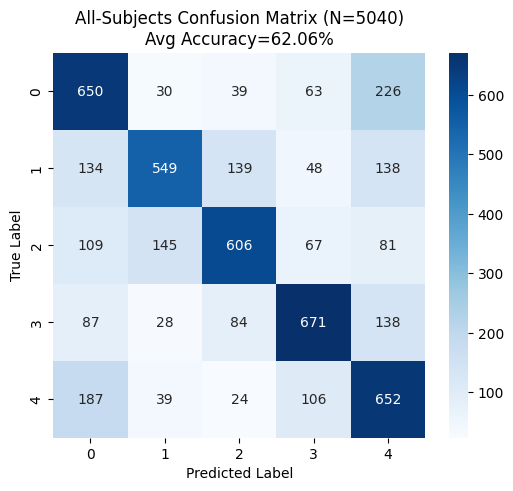

In [ ]:
############################################
# CNN-BASED FACIAL EMOTION RECOGNITION SCRIPT
# - ResNet50 with Channel Attention
# - Freeze/Unfreeze Strategy
# - 70/30 Train/Val Split per Subject
# - Early Stopping
# - Single Confusion Matrix Across Subjects
############################################

!pip install torch torchvision scikit-learn seaborn matplotlib

import os
import pickle
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, f1_score
from sklearn.model_selection import train_test_split

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset
from torchvision import transforms
from torchvision.models import resnet50

# ======================
# Mount Google Drive
# ======================
from google.colab import drive
drive.mount('/content/drive')

# ======================
# Config
# ======================
VISION_DIR = "/content/drive/MyDrive/kk/Input_images/Vision"
NUM_LABELS = 5
BATCH_SIZE = 32
EPOCHS = 30
LR = 5e-4
PATIENCE = 3
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", DEVICE)

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

# ======================
# Model
# ======================
class VideoModel(nn.Module):
    def __init__(self, num_labels=5, ratio=1):
        super(VideoModel, self).__init__()
        base_model = resnet50(pretrained=True)
        self.base_model = torch.nn.Sequential(*(list(base_model.children())[:-2]))
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.max_pool = nn.AdaptiveMaxPool2d(1)
        self.shared_layer_one = nn.Linear(2048 // ratio, 2048)
        self.shared_layer_two = nn.Linear(2048, 2048)
        self.global_avg_pool = nn.AdaptiveAvgPool2d(1)
        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(2048, 1024)
        self.fc2 = nn.Linear(1024, num_labels)

    def channel_attention(self, x):
        avg_pool = self.avg_pool(x)
        max_pool = self.max_pool(x)
        avg_pool = self.shared_layer_one(avg_pool.view(avg_pool.size(0), -1))
        max_pool = self.shared_layer_one(max_pool.view(max_pool.size(0), -1))
        avg_pool = self.shared_layer_two(avg_pool)
        max_pool = self.shared_layer_two(max_pool)
        return avg_pool + max_pool

    def forward(self, x):
        x = self.base_model(x)
        attention = self.channel_attention(x)
        x = x * attention.unsqueeze(2).unsqueeze(3)
        x = self.global_avg_pool(x)
        x = self.flatten(x)
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x

# ======================
# Helper Functions
# ======================
def preprocess_images(image_list, frame_per_sample):
    pixel_values_list = []
    for img_set in image_list:
        for img in img_set:
            pil_img = Image.fromarray(img)
            processed = transform(pil_img)
            pixel_values_list.append(processed)
    return torch.stack(pixel_values_list)

def prepare_dataloader(x, y, batch_size, frame_per_sample, shuffle=True):
    processed_x = preprocess_images(x, frame_per_sample)
    y_repeated = torch.from_numpy(np.repeat(y, frame_per_sample)).long()
    dataset = TensorDataset(processed_x.view(-1, 3, 224, 224), y_repeated)
    return DataLoader(dataset, batch_size=batch_size, shuffle=shuffle)

# ======================
# Training with Early Stopping
# ======================
def train_model(model, train_loader, val_loader, criterion, optimizer, max_epochs, patience, device):
    best_loss = float('inf')
    counter = 0
    best_state = None

    for epoch in range(max_epochs):
        model.train()
        total_train_loss, total_train_acc = 0, 0
        for x, y in train_loader:
            x, y = x.to(device), y.to(device)
            optimizer.zero_grad()
            outputs = model(x)
            loss = criterion(outputs, y)
            loss.backward()
            optimizer.step()
            total_train_loss += loss.item()
            _, preds = torch.max(outputs, 1)
            total_train_acc += (preds == y).sum().item()

        model.eval()
        total_val_loss, total_val_acc = 0, 0
        with torch.no_grad():
            for x, y in val_loader:
                x, y = x.to(device), y.to(device)
                outputs = model(x)
                loss = criterion(outputs, y)
                total_val_loss += loss.item()
                _, preds = torch.max(outputs, 1)
                total_val_acc += (preds == y).sum().item()

        avg_val_loss = total_val_loss / len(val_loader)

        if avg_val_loss < best_loss:
            best_loss = avg_val_loss
            best_state = model.state_dict()
            counter = 0
        else:
            counter += 1
            if counter >= patience:
                print(f"Early stopping at epoch {epoch+1}")
                break

        print(f"Epoch {epoch+1}: Train Loss={total_train_loss:.4f}, Val Loss={avg_val_loss:.4f}")

    model.load_state_dict(best_state)
    return model

# ======================
# Main Execution
# ======================
test_acc_all, test_f1_all = [], []
all_preds, all_labels = [], []

for idx in range(1, 43):
    file_path = os.path.join(VISION_DIR, f"subject_{idx:02d}_vis.pkl")
    if not os.path.exists(file_path):
        print(f"[Subject {idx}] Missing file: {file_path}, skipping.")
        continue

    with open(file_path, "rb") as f:
        trainX, trainY, testX, testY = pickle.load(f)

    X_train, X_val, y_train, y_val = train_test_split(trainX, trainY, test_size=0.3, stratify=trainY, random_state=42)
    frame_per_sample = X_train.shape[1]

    model = VideoModel(num_labels=NUM_LABELS).to(DEVICE)
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.AdamW(model.parameters(), lr=LR)

    train_loader = prepare_dataloader(X_train, y_train, BATCH_SIZE, frame_per_sample, shuffle=True)
    val_loader   = prepare_dataloader(X_val,   y_val,   BATCH_SIZE, frame_per_sample, shuffle=False)
    test_loader  = prepare_dataloader(testX,   testY,   BATCH_SIZE, frame_per_sample, shuffle=False)

    model = train_model(model, train_loader, val_loader, criterion, optimizer, EPOCHS, PATIENCE, DEVICE)

    # Final evaluation
    model.eval()
    outputs_all = []
    with torch.no_grad():
        for x, _ in test_loader:
            x = x.to(DEVICE)
            outputs = model(x)
            outputs_all.append(outputs.cpu().numpy())

    outputs_all = np.concatenate(outputs_all, axis=0)
    probs = np.reshape(outputs_all, (-1, frame_per_sample, NUM_LABELS))
    avg_probs = np.mean(probs, axis=1)
    preds = np.argmax(avg_probs, axis=1)
    acc = np.mean(preds == testY)
    f1 = f1_score(testY, preds, average='weighted')

    print(f"[Subject {idx}] Accuracy = {acc:.4f}, F1 Score = {f1:.4f}")
    test_acc_all.append(acc)
    test_f1_all.append(f1)
    all_preds.extend(preds)
    all_labels.extend(testY)
    torch.cuda.empty_cache()

# Global Results
print(f"\n=== Average Accuracy: {np.mean(test_acc_all):.4f} ===")
print(f"=== Average F1 Score: {np.mean(test_f1_all):.4f} ===")

cm = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g')
plt.title(f"All-Subjects Confusion Matrix (N={len(all_preds)})\nAvg Accuracy={np.mean(test_acc_all)*100:.2f}%")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()
